In [2]:
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
import multiprocessing
import logging
import torch
import pandas as pd
from torch_geometric.data import Data, Batch
from torch_geometric.transforms import Distance
import torch_geometric.nn as gnn

from utils import *

import random

import torch
import torch.nn as nn
import torch.nn.functional as F

from deep_rl import *
from deep_rl.component.envs import DummyVecEnv, make_env

import envs

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)

from concurrent.futures import ProcessPoolExecutor

from models import RTGNBatch
from deep_rl import *
import envs

/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


_ColormakerRegistry()

1
3
5
7
2
4
6
8
9
11
13
15
17
glug glug
reset called
[110.16411792203147, -171.89644192150038, 74.10174325786735, -98.5548192830792, -176.6680505129998, 65.95731287896709, 165.6345049425417, 77.28533787035782]
Data(edge_attr=[168, 9], edge_index=[2, 168], pos=[46, 3], x=[46, 3])


In [2]:
def loaded_policy(model, env):
    num_envs = 1
    single_process = (num_envs == 1)

    env = AdaTask(env, seed=random.randint(0,7e4), num_envs=num_envs, single_process=single_process)
    state = env.reset()
    total_reward = 0
    start = True
    done = False
    step = 0
    while step < 200:
        with torch.no_grad():
            if start:
                prediction, rstates = model(state)
                start = False
            else:
                prediction, rstates = model(state, rstates)

        choice = prediction['a']
        step += 1
        state, rew, done, info = env.step(to_np(choice))
        total_reward += float(rew)

    if isinstance(info, tuple):
        for i, info_ in enumerate(info):
            print('episodic_return', info_['episodic_return'])
            episodic_return = info_['episodic_return']
    else:
        print('episodic_return', info['episodic_return'])
        episodic_return = info['episodic_return']
    return episodic_return

In [3]:
model = RTGNBatch(6, 128, edge_dim=1)


outputs = []

print('outputs', outputs)

full_outputs = []
for i in range(0, 10):
    model.load_state_dict(torch.load(f'transfer_test_t_chain/models/{i}.model'))
    model.to(torch.device('cuda'))
    
    for j in range(0, 10):
        output = loaded_policy(model, f'TChainTest-v{j}')
        outputs.append(output)
        print(i,j,output)
        
    full_outputs.append(outputs)
    outputs = []
    
ans = np.array(full_outputs)

outputs []
seed is  50494
transfer_test_t_chain/4.json 




transfer_test_t_chain/4.json 




step time mean nan
reset called





[64.87811430774038, 170.08096170321727, 57.01662190237579, 61.83962001190221, 179.57294623258477, 178.48258045474356, -60.01553997285045, -175.2887859399127]


/home/tgog/conformer-ml/zipingenvs.py:201: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


action is  [0 1 2 3 1 1 1 0]
transfer_test_t_chain/optimal_0.mol
current 1.2200955336978216
reward is  0
new state is:
[179.48477328422572, 176.68110371630053, -89.47684803881441, 47.0722293756779, 176.79486466334686, -89.4607809749145, 176.57738827332244, 179.5087837355537]
action is  [0 1 2 2 1 5 5 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.71430368301873, -176.58471950579536, -58.819509601569905, -58.31018950026132, -174.26435647437881, 137.03384450185877, 67.07744810099253, 63.40524111066487]
action is  [0 5 2 2 1 3 5 0]
transfer_test_t_chain/optimal_0.mol
current 0.5662999503416206
reward is  0
new state is:
[-179.96383889964287, -179.55003337763532, -61.820183502423326, -57.077785086356094, -173.71161434230208, 54.089224809205675, 60.01285015638303, 175.320849413829]
action is  [0 5 2 2 1 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.36117944624863, 173.61653086358808, -61.62163524649165, -55.776924

action is  [1 5 2 2 1 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.32397533124953, 173.82418345138512, -62.33251634486192, -58.11771188309305, -174.15238992117588, -92.01470525021004, 174.3097627442683, 179.29838267015893]
action is  [0 3 2 5 1 0 5 2]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-177.56919061393023, 101.33831609469844, -66.98311463028546, 88.60839880982448, -175.45152156857992, 164.62230671749697, -175.22545413830136, -66.52169378185916]
action is  [0 1 2 2 1 1 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.8074554075491, -174.72368313912608, -41.99461905324099, -63.87229691778663, -178.645061130232, -67.04560860393758, 100.94786511269196, -177.23341562099938]
action is  [0 5 3 2 1 2 5 4]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[176.17602274905383, 62.52652567132902, 66.07921442734715, -94.95187331389688, -178.54728558065298

action is  [0 5 2 0 1 2 5 4]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.22702399691732, 172.70951947879664, -67.60329730770243, -164.5624090733051, 178.9863892685239, -89.52822524351991, 170.01276353828038, 64.15003370761086]
action is  [0 3 2 2 1 2 5 4]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-176.85209863719376, -77.04641268679035, -20.37071363705725, -72.8113795382806, 176.91883871714904, -75.68750021472569, 103.6526742274304, 73.4981824908036]
action is  [0 5 2 2 1 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.3241295206649, 173.82434942888005, -62.33266138482487, -58.11781626651233, -174.15213740111514, -92.01461315791848, 174.30969960857735, 179.2981259580908]
action is  [0 5 2 2 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[170.1028865297447, 64.72263983155827, -80.5292352117059, -49.43157631238576, -59.23374296859282, 167.45402

[64.5101526248811, 171.21341891379782, -88.19841439433682, 66.92525487699798, -100.52949911225687, 60.61676118752139, 64.80603152253852, 174.27900576275448]
action is  [0 4 0 0 1 3 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[174.12838705990754, 64.8766273555405, 133.40646913193135, -175.36048550010275, 175.3577257051169, -71.60053252245126, 177.0683161029249, 179.64328621193206]
action is  [0 5 2 2 4 5 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.70105969244892, 176.57497598742427, -63.294108835206806, -141.23799690378286, 69.1451247207464, 169.8804210964012, -63.032716794062004, -176.28320733015255]
action is  [0 5 2 2 1 1 1 1]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.36120616961583, 173.6170945547107, -61.62141591842831, -55.77700761683742, -173.93673711577205, -85.57171628663507, -98.63487532024331, -179.0317153322045]
action is  [0 5 2 2 1 2 3 0]
transfer_test_t_chain

action is  [0 5 2 5 1 2 5 4]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5969134531418, -177.80235946320633, -50.860741172746316, 106.1712235758281, -86.19411136022364, -50.26481557343831, -178.40891105273994, 69.23548489619131]
action is  [0 5 2 0 1 3 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.96252353170607, -179.2178141994426, -67.77478841209236, -168.8254165898624, -101.42564405610936, 53.222069522776366, 174.06531185963698, 179.716850688081]
action is  [0 5 0 0 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.77010980343832, -178.26969262322945, 164.17644400161493, -168.95254823980557, -95.8663197938664, 136.45930915415474, 177.9338589771629, 179.77870253272133]
action is  [0 5 0 0 1 5 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7514563843725, -174.75792974835076, 174.36166200541481, -165.1452765406188, 178.1878289727539,

action is  [0 5 2 1 1 1 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.01226148917985, 171.19400655508605, -66.08950047335486, -150.65268701107902, -79.03852761470058, -89.71942907948376, 174.81969990832368, 179.14284526343607]
action is  [3 5 0 2 1 3 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[65.82882323171627, 175.8507825531246, 131.03076306472505, -70.59288971241686, -178.28794593306773, 63.587122240411, 67.41594468909973, 177.24435502434005]
action is  [0 5 0 2 1 3 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70301254069074, -174.19360170764202, 179.61582007426668, -66.76554252964752, -174.4617588972256, -59.384104871150065, -179.96375022941936, -179.98533328496532]
action is  [0 5 0 3 1 2 5 4]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70981056566103, -174.07321957264347, -179.69164442679872, -60.733701351655256, -59.12574673264

action is  [0 5 2 1 1 2 5 4]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.1619983260928, 171.61087063924356, -66.00398261066054, -150.21348047626358, -78.73759029308222, -90.0458013048735, 170.18397550621157, 64.45492752814963]
action is  [0 5 2 2 5 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.32416291918298, 173.8243738619529, -62.33262453862308, -58.11796416519534, -174.15235860868464, -92.01465155120377, 174.30962006522583, 179.29840223828302]
action is  [0 5 1 2 1 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.9920611970165, -176.8959763180809, 172.35002623483751, -73.86732872139117, -176.87297753769639, -47.47698262068014, -65.8309316412569, -168.33989908257473]
action is  [2 1 1 2 1 5 5 4]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-59.96394061460943, -55.15716215534301, 179.47507472740293, -57.61245956098903, -171.67270824770515, 

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.31921096947747, -174.13879397709795, -73.41620540948647, 80.94308597299815, 64.15303112989328, -97.59553826782721, 94.04923160223949, -176.51003828806589, 71.71452491334792]
action is  [1 5 3 3 1 4 0 2 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-64.05487685030491, 91.45315364858659, 90.70850316489484, -77.45832053513747, -47.768309817837945, -60.23196234608936, -164.84767042604383, -104.70720674547863, -175.73045782519392]
action is  [1 5 2 0 4 2 0 3 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-68.05856490720905, -179.86337295642863, -107.67881458760093, -170.7778205452649, 103.82359477086506, -64.7726236367182, -173.22141942398662, 57.4292276818765, 58.685777136934234]
action is  [1 4 4 2 3 2 2 1 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[176.03282743666432, 66.68725635072629, 96.3021043728707, -63.69

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-174.92967682190053, -65.33973962342952, -174.7502915341909, -139.1094869158897, -63.392896010416585, 176.5233399332816, -65.99337301235244, -64.29595013599902, -176.72770114867657]
action is  [1 4 2 2 5 5 0 2 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-96.12160584797299, 71.73130750553527, -102.07167308762641, -88.73576260853424, 66.10242940871782, 172.61161079757406, -138.68679941836402, -70.53195915941066, 94.65268723701264]
action is  [1 5 5 2 4 4 3 5 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.00754942177852, 92.9814764059462, 96.85764168376457, -70.53414366554475, 94.90070854896888, 71.08476950026196, 49.14419424344253, 65.04613236711367, 172.00653404937103]
action is  [1 5 0 4 3 4 1 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[175.0128615964922, 67.04116551224132, 176.27780891782655, 59.55113881

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.61298480144305, 178.33398147712072, -104.02100353244458, -167.14310327577957, -82.51837444457003, 65.3919201975287, -173.29824396346083, 176.93423570326792, -179.91774831096575]
action is  [4 2 5 5 3 2 3 2 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[64.00688072970853, -95.22440716026871, 175.1688646823181, -168.804155414372, -36.005553957724445, -169.99026532062007, 65.9206220979763, -177.21835624499494, -178.868681594182]
action is  [4 1 3 0 4 5 0 3 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[65.55806718742855, -95.68002583363214, -71.21018938614512, -74.7400870540925, 140.91087486797352, 67.84249222979122, -70.76516471768376, -88.14908943752451, 75.0969982960537]
action is  [1 1 4 1 1 4 5 5 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-176.19094072860543, -96.9075133359914, 69.23106441709244, -173.08011

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.01150479053781, -171.4570173640215, -59.70091660943831, -52.750972677670035, -76.08029886248356, 72.19520381898018, 41.30352138920625, 174.00777361223587, 178.77628253636294]
action is  [1 5 5 0 1 4 1 3 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.6090193249006, 174.33292488646893, 63.097147643737856, -164.71149694718375, -79.09023872796682, 67.48410920423959, -175.48629592641407, 59.4400913394023, 60.33160283424472]
action is  [1 2 0 2 4 5 0 5 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-59.51285588367641, -60.01496977561365, -171.27539218024296, -63.17813655346773, 102.20744945916908, 71.7463107810327, -166.03021445774135, 173.28323722706497, 65.71521903746888]
action is  [5 1 4 0 4 5 2 3 2]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[73.9684736694773, 75.55065313269711, -157.8694120204715, -72.3519050

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.74820754517015, -178.88368119106488, 102.1878610013235, -63.26391253453994, 179.98486397558491, -174.37157459914667, 56.444328671860234, 80.45093088762415, 173.8623554116312]
action is  [0 4 2 1 4 1 1 4 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.09604681255405, 114.02981995114006, -65.50965362793201, -94.1734091442738, 58.05068520199733, 172.5441103545924, -177.26384751175658, 58.25945943043178, 174.49637702947217]
action is  [4 3 0 0 5 2 0 3 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[98.1559205776767, -63.93860170896473, -175.42701789032645, -160.9760536155168, 99.29021560474041, -64.12484145651983, -170.866184141333, 56.36919530892988, 57.93696620283052]
action is  [1 1 1 0 1 5 3 5 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.84294556259948, -174.97946342205648, -78.35933222349419, -146.988

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-95.51955316141911, 64.68397795875188, 167.9005618605531, -166.97509500194906, -65.81344875254236, 179.9292783287714, 179.42924027842216, 69.68983028723319, -93.24459845019058]
action is  [1 3 4 0 0 2 2 1 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[174.35616883043235, 59.283735390498755, 64.47666318486763, -138.69837287008428, 176.79422339470995, -57.99777936461022, -59.03142967519637, -176.39831843195924, 68.37575701073234]
action is  [1 2 1 0 4 0 4 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-174.88032828092528, -68.15762579244648, 178.19245652634964, -179.2073563380427, 66.8951290576721, 174.3329910234255, 58.88404600231432, 179.74536818699897, 179.97241849590208]
action is  [1 0 4 0 2 3 5 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-67.53657366928148, 177.2824859231615, 58.830658813191825, -170.08350

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.98750728851522, -179.95874603427143, -179.6513987605356, -172.72025081189196, -62.280962235382766, -179.98422166640685, -174.25104321962675, -138.94677637975516, -178.6043495013542, -179.5854141021172]
action is  [0 3 4 5 2 1 0 3 5 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[175.29181858437875, 58.26974393893281, 59.969256278294495, -178.76850015741894, -54.60377024351296, -58.430333347258184, 179.78550357887482, -63.812098476977205, 101.87850919753214, 71.21265679034784]
action is  [4 5 0 3 2 1 5 1 5 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[65.70009707392657, 175.97932466677878, -175.4557185758547, -58.59238748812086, -51.90780379121901, -79.30373390292905, 66.58665306787908, -169.7657387052538, -179.11922505941163, -66.31263390351818]
action is  [0 3 3 5 2 2 3 5 1 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new s

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-65.24153251720332, -170.54592560215602, -68.9034231403955, 178.5994585571756, 46.85879029317005, -89.61555751931999, 176.826493264087, 46.71800972288031, 178.5129367297571, -69.77318258346672]
action is  [1 4 4 4 3 1 0 0 5 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-95.92293899244835, 61.998648413842204, 60.63635508917591, 98.92343584502828, -60.998151246563545, -65.71104315308347, 177.17703712956572, -174.76952349647266, 177.7749718718205, -67.52586318821932]
action is  [0 0 2 0 2 1 3 3 4 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.79632914841278, -175.20628204196413, -64.90621913109551, -170.06779276934972, -51.91428145376662, -58.14298780854303, -101.09802418755056, 14.591861627641968, 78.55662188313325, -179.4009387516994]
action is  [3 0 0 2 4 1 5 5 1 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-

action is  [0 2 5 0 0 1 3 0 0 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-173.6247491462767, -63.3131425510292, 97.9833540798303, -179.49569404224437, -155.65658119749327, -79.40632609152749, 65.80660831883769, -172.14812433815877, -178.898462781421, -66.2382475355871]
action is  [5 3 4 2 2 1 2 1 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[178.21322526766235, 60.171692610052396, 68.9522960881, -89.43475816050797, -62.365762104875024, 178.74624798545918, -60.6539996600106, -54.49492150745503, -55.30966327882483, -60.41363002590858]
action is  [1 5 4 0 2 0 5 0 0 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.8331403146921, 174.9908393353318, 65.66908147728107, 175.5020741534601, -72.50434011581612, 134.99762884936848, 178.76070096487467, -174.1707048062401, 171.1787004271894, 65.01379713584096]
action is  [3 4 3 5 1 4 0 2 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward

action is  [0 4 3 0 4 1 0 3 4 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[175.25486977290095, 60.124104609453454, 58.880022548291976, 169.22811533614913, 65.61790495472833, -91.59879036732453, 174.4222334609343, -61.75129570302993, 97.25252866724334, 67.20677352794492]
action is  [0 4 5 2 5 3 3 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[175.92191731334182, 68.82990580840043, -177.43293273195505, -64.85895516541696, 80.1506727064938, 132.21537988864745, -73.0980377409401, -168.20323384269335, 175.14538938132478, -179.76861181982517]
action is  [4 5 1 4 3 3 5 3 5 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[58.80750788463267, 61.53934135886742, 172.62763544742907, 93.19948141807838, 59.95844807335048, 52.80468971386618, 59.850789042781315, -60.5833315484768, 178.2555506316786, 65.80428773134341]
action is  [4 3 0 2 2 5 5 0 5 4]
transfer_test_t_chain/optimal_2.mol
seen better
rewar

action is  [0 4 2 4 4 5 3 3 4 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[176.51987355432604, 93.46100249602019, -79.43027632740734, -179.50677756629435, 64.56123605523028, -87.0915211569195, -98.68598306740917, -61.77524038532199, 97.9093420069278, 66.72369206271333]
action is  [0 5 3 1 5 0 0 0 3 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[175.0667052387482, 58.43756671565096, 60.76692901958209, 179.4175610729695, 62.58243277636343, 140.73970633656472, -178.50766011630537, -169.48473681125208, 62.54661694686788, 176.1669378940553]
action is  [1 0 2 0 0 4 4 5 2 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-64.85976307388388, -170.57982337287172, -65.60551146052681, -178.0903103906915, -166.5988742452514, 61.50277005124477, 57.275035451065975, 85.50616698917894, -65.92210420053952, -61.40234374252043]
action is  [3 4 5 1 1 0 3 5 3 4]
transfer_test_t_chain/optimal_2.mol
seen better
rew

action is  [5 3 0 0 5 2 0 4 5 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[59.0551045420175, 59.22588560952619, 175.71411863906545, -178.03024062347447, 89.7189093202691, -46.86848651677901, -176.9283586577519, 89.45003333506375, -177.02575970254566, 70.00104965556875]
action is  [3 0 2 0 1 3 4 0 2 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[66.55100976069981, 179.91383354194335, -71.94118227946161, 174.65945210810696, -177.54217318078074, 55.55878043520593, 57.929361681023664, -179.17602246564314, -101.08791407421927, 179.23637083587238]
action is  [0 0 5 5 2 4 5 5 4 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.95893727459978, -179.84334144484743, -179.7144948673191, 98.70597218655605, -68.04411174886266, 95.9068535227226, 70.8051851179034, -163.94602455078706, 98.5002322541992, -64.49511948011025]
action is  [0 5 3 1 1 3 3 5 2 2]
transfer_test_t_chain/optimal_2.mol
seen better


action is  [1 0 2 5 1 1 1 3 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-64.91849117895437, -170.72822003550212, -64.95792597509475, 98.62752102949509, -160.6990589552492, -65.35541707150293, 173.18246552131083, 47.238712610296005, -102.43346693754572, -177.76678621249056]
action is  [0 4 4 5 5 4 0 0 3 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[175.73422977570783, 61.36828780283955, 61.09845734861174, 173.67108964317907, 57.82511744648381, 56.80131383203341, 174.9926828909128, -170.62267616797212, 55.8797519267275, 58.94246216363455]
action is  [1 4 2 1 2 1 5 2 4 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.18958419988576, 96.16764722467978, -64.6892297070817, -166.78697280488126, -56.68828087913983, 178.59102349432754, -172.0934772941029, -56.95356168677233, 100.0978336045481, 70.82763872726906]
action is  [0 4 4 3 0 4 5 3 4 3]
transfer_test_t_chain/optimal_2.mol
seen better


[-175.34004259340796, -65.9442690341664, -175.20658311152616, 179.49324010061363, 176.53685684977148, -60.70361228781373, -52.357549341648266, -61.28418612004882, -117.80894798689302, 77.95496069195362, 70.38720747690965]
action is  [0 4 3 0 2 1 4 5 3 1 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.2743818924498, -174.20471038519344, -63.45522540792276, 103.94798137901908, 69.75808881298582, 58.14088437692679, 58.166721669350665, 177.89411492740987, 75.2860437534709, -178.3808024130444, -177.13996708259222]
action is  [4 0 1 1 2 5 1 3 0 3 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[64.99755932650442, 171.9257395843491, -176.86892985461515, -76.732407120375, -80.5139246508066, 159.82846779319487, -99.92245580236839, 69.40960659752227, 149.99309614067866, 73.29406121491374, 168.79735938039434]
action is  [4 5 3 2 1 5 0 1 1 4 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[65.5905156216

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[92.46659696560845, -68.29915475003567, -56.88180820257198, -60.57862016851552, -176.03253632236593, 72.31640938644794, -134.55948387388582, -178.64353584840288, 174.30573318338702, -174.75938604851612, -179.84856628567877]
action is  [1 4 0 5 1 1 0 0 4 0 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[175.08284296459834, 65.22250930088934, 170.45328547547197, 66.16588994400031, 176.3492960193016, -67.91130238099443, -165.0266884411232, 174.54729873498994, 55.29590583568766, 178.01872028057082, -67.51148555897531]
action is  [0 1 5 3 4 5 0 0 4 5 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-175.91330477429116, -67.39904234341242, -176.0871023840441, 179.17357347532837, 177.836175559725, 138.1617996677378, -173.46434424686768, 172.32865175407096, 57.81419891606841, 177.3987127084741, -68.23262516761355]
action is  [0 3 4 4 2 0 1 3 0 1 1]
transfer_te

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-174.7623715398614, -58.918949706096335, -61.134554878586535, 179.2214763044724, 67.24694176998095, 72.46229011691874, -145.28742003485294, -65.61147832617615, 98.01502134021601, -63.78489809163319, -174.85792776449668]
action is  [0 3 1 5 5 0 0 4 3 5 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-174.7286987334978, -59.643793411965575, -60.061417767839664, -176.60625321922217, 100.83396272593954, 170.41246679386964, -177.0622564962961, 60.5422460129803, -65.82807599222822, 177.1413534949579, -178.513083713718]
action is  [0 0 4 3 3 0 0 2 0 5 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-63.648317656851546, -174.87479126188802, 71.34940351575776, 164.27979740017807, 61.52942656534441, 67.71173542143401, -94.74206668839119, -62.61488939076103, 166.1711081260786, 120.95572489259033, -177.44837817916508]
action is  [0 3 1 1 3 2 4 0 4 5 0]
transfer_

seen better
reward is  0
new state is:
[60.32405162883602, 56.08129720076286, 60.21527316113394, 175.8057316540096, -179.3477651341946, 165.6734399165387, -173.35625208396507, 175.51984896255672, 131.58305411068204, 174.8584277878275, 64.9986446553897]
action is  [0 0 1 3 1 1 1 4 3 3 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[170.32503436618515, 172.3792385983647, -73.58784984333319, -170.6069421865834, 171.65972264557766, 75.28446662857736, -163.46617998429903, 65.16145786642406, 67.40304107373339, 82.29877233303499, -72.70732078557224]
action is  [4 3 5 5 2 4 2 0 2 1 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[96.36817780147759, -63.643801425437424, -172.3749391315114, 178.77779635214088, -98.30372204669024, 68.97310081804203, -95.51111237613738, 177.8090605277569, -62.909595767518866, -176.77240641725137, -179.6640772670306]
action is  [4 3 0 2 2 3 4 3 2 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward

[66.46972944259701, 173.0628250539597, 173.45633900849347, 61.261104856342776, 167.06626653396702, -51.595233032736374, -56.35469916456443, -61.620511735225385, -74.72681352969663, -175.32857276848915, 70.29871623045123]
action is  [0 0 4 1 5 5 3 2 5 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.86992568777293, 175.73607504172645, 70.77480731835152, -177.9045146896904, 101.42611463291894, 178.9969903832456, -54.78071595517937, -58.99172523954039, 177.33743959323672, -174.85056792641421, 68.34598221161491]
action is  [2 4 0 5 3 1 1 5 1 1 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-96.16278870351631, 65.26878495063251, 63.306586128536004, 177.11049253203043, -100.89068324990255, 63.71467303619479, 178.21933515373217, 174.456547178646, -66.58873918131505, -177.72798613155493, -179.25333115157105]
action is  [4 4 0 5 4 1 4 2 3 0 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[59.44101

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.66247990768113, -175.0460025623682, -67.59079706864507, -176.06198883223544, -99.52808739709641, -62.90593754767483, -137.90532168205232, 178.97744553598747, 170.23032278945064, -63.9427740075889, -176.6336959741015]
action is  [0 4 5 3 1 5 1 2 1 2 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[176.16740322492646, 59.81188910569801, 55.02379871624642, 61.592350410171015, 173.06245500554826, 66.16533533753534, -98.94018211862188, -72.50024803978779, -59.074968612747256, -172.24694038379283, -63.387794293537674]
action is  [0 0 5 1 1 5 3 0 1 3 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-177.9475943620502, -177.63665337915083, -173.44756626889247, -61.97740826908532, -174.56719039356864, 64.88850054749663, 41.176247089508074, 174.8190915310019, -64.05640273037321, -100.49892777483527, -72.47549472024026]
action is  [2 5 0 5 1 0 1 2 4 5 2]
tra

new state is:
[-175.7793887829917, -67.18428814222545, -176.02607996261392, 179.8386517211427, -173.78331819045897, 176.02031665608447, -177.88652826681331, 59.96900472773767, -62.426744116423436, 176.68077524978162, 66.41469054480773]
action is  [0 3 5 1 3 4 4 2 0 2 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[175.8309363537121, 60.29710994555183, 59.472267193169, 171.16345967394395, 59.692056632689884, 52.89912873035512, 72.2565339917006, -81.56346869624633, 176.6174508985656, -61.28018168232984, -175.25237268745556]
action is  [0 0 5 2 2 0 1 3 2 4 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.83223630136666, 176.03526727743002, 94.40158817054234, -66.9966381459648, -58.24950182822548, 174.923976037294, -176.95557840238928, 61.02227693372278, -69.9654122480926, 88.98418980231175, 174.8010895507632]
action is  [0 1 1 1 5 3 0 1 4 4 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-174.5

[-63.88673876886637, 95.39686611306044, 175.90364392680007, 68.84213311836271, 178.95407538962323, -63.03731199730166, -168.75318000716808, 63.088893594318655, 139.7283462367529, -70.79670943764222, -177.2426742027584]
action is  [0 4 0 3 3 1 0 3 4 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[174.8719632161756, 65.50373600808027, -90.67874632252052, -110.39349960664872, 73.30486253042436, -78.2837933364775, -161.39491231053117, 62.144088275799824, 85.4222662384292, -69.70719768958705, -168.13745666817786]
action is  [3 5 4 3 3 4 3 4 0 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[60.18179151666399, 71.3322805140576, -175.68490232291177, -175.3831580081029, 75.25767109610523, 100.91384961111044, -67.73073240707149, 95.13052845146701, 172.80781453249122, 108.32312402748897, -175.61409214512088]
action is  [1 5 0 5 0 3 5 2 5 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-95.7937111651

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.66621943319524, 97.51555695054515, -62.33988313814234, -174.44146445325936, 174.13003056172647, 63.6667644524795, -78.43713351201987, -132.9591825644115, -178.21266802168304, 169.43548810953115, -177.6466514991352, 67.34366015169536]
action is  [3 1 4 5 3 5 3 5 3 2 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-62.928345060316076, -71.75312875835037, 90.97206341492127, 96.65900609062068, -71.50538600622849, -179.18009076085133, 69.38921490177341, -173.59600750029082, 63.85450916104301, -79.2348439345652, 63.54207715330911, 167.34983730732554]
action is  [2 5 5 0 0 0 1 0 2 2 0 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-64.77238677870493, 94.96388906302238, 70.6483723256332, 176.79382506496216, 179.14370315668478, 171.27306756553327, -66.03701046115434, -150.6616627631793, -79.21366616034838, -89.72400686615295, 174.7013096359184, 179.32

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[173.48626712510512, 63.236641226210715, -97.70099088097977, 174.60610284604374, 170.5806421901326, 61.72040012110377, -81.30776021856975, -54.53634143383877, -172.4141520816499, 60.77790448860628, 174.89317891729635, 65.27987408110103]
action is  [5 2 3 3 3 0 2 1 1 5 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[104.80315484436, -70.49095447544417, -82.6008821213281, 82.38585854398399, -128.0622303951474, 168.54564165598399, 61.33893771935456, -173.83208022729949, 173.31222323596816, 55.91332699146078, 53.58764728291979, 61.346963965751726]
action is  [4 4 2 0 3 5 3 5 5 1 0 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[63.80182041500574, 66.49737149937086, -98.35911760426244, 176.01677134200997, 58.33998237435661, 58.79944962341082, 61.47734347274262, 42.253857600446494, 175.6442044567422, -67.87484225986623, 173.87806670005716, -70.08974951905

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-65.5847816116968, -175.59199606636452, 179.9555835497701, 175.7498059904222, 61.3953133768473, 73.45721203029488, -69.31473324262008, -153.81896639479376, 73.54637376534454, -113.51731822948062, 77.33041744376561, 69.81125918933088]
action is  [5 5 4 5 0 4 3 1 5 4 0 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[176.1741402734633, 59.51954725270805, 55.75610228026706, 61.26120654934443, 172.04523502948746, 58.11047047789237, 56.35585027336924, -177.51390636394072, 58.20560420795795, 59.625549623218205, 175.23469171063925, -68.58760475205408]
action is  [5 5 2 2 1 5 2 5 1 1 3 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[62.74385195679384, 64.98802624690008, 67.12814943398324, -96.69030154578277, -107.23132155784103, 74.29258123555975, -75.47413290687429, -137.90055825910378, -177.6187689299552, 166.90154622681624, 96.51513825155865, 178.109510257

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.4087329548888, -177.30350554022397, -58.3217060279418, -54.70896018938695, -60.91227352413523, -172.1756763824862, 167.53520041817762, 61.13611585392304, -171.80271673941945, -48.266645947913155, 173.0124420374973, 179.67753245727997]
action is  [0 0 2 0 0 5 1 1 1 4 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.84673582762497, -175.17694231236274, -66.15156818751717, -175.51056079859598, -179.84892063735674, 98.78388470451497, -66.08596454625422, -167.40826838571462, -101.58586083267389, 49.6447038993504, 61.380901952953444, 176.1865273380211]
action is  [1 2 0 5 0 3 0 1 2 2 4 3]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-174.7107963760192, -68.2754956241526, 179.18946670272612, 67.31498480145716, 174.09371255953755, 70.46101943022899, 98.63025716843427, -63.855598651437845, -65.60123439724232, -79.37349154571596, 67.19958376930931, 

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-65.2551225621101, 88.36169446627044, 56.09260803624449, 55.849183237488305, 174.8434486924079, -176.70600907254712, -72.21230058983343, 113.46421694267403, -75.50962814394728, 54.74565865989099, 171.11006441544706, 65.69607913715251]
action is  [1 5 3 0 0 3 1 3 5 5 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-64.82313835794332, -171.17674464155598, -64.07817350992534, -174.2450566074439, -168.3911396882298, -65.82982229560194, -47.73915048936331, -60.037263018376365, -176.43019888584908, 51.47654397568594, 58.856807333857674, 175.47745094652194]
action is  [4 5 1 5 2 5 0 5 3 1 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[59.335953894872915, 59.1380559403925, 173.91554007056095, 176.65079408495976, -77.78811629240381, -173.9458831665038, 161.22445233211064, -172.1466707084336, 68.44598968946218, 137.88316810844668, 162.8745190537631, 63.68

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-176.16547543864178, -64.6701768370274, -174.89819421948496, -179.718021162688, 178.94247135327458, 177.12801056302374, -63.917294201343495, -144.04229929684487, 67.60439910620242, 167.82759182694568, -172.2704435618541, 66.95325720855362]
action is  [3 5 5 0 1 0 1 1 1 2 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-60.82183618202217, 100.85759155728189, -173.11459691430252, -175.6302037528373, -178.20558272967207, -171.48065069036804, 177.76679333169687, -174.89972644643683, 175.7909572516213, -64.29953048810162, 177.34110736313704, 177.04142239375312]
action is  [1 5 2 0 0 0 4 5 5 2 1 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-66.79072816852185, -174.33467855378916, -68.97670303724264, -178.71347428411343, 178.3577807135553, 169.30082591243382, 62.30976877616029, -179.16729358411285, 172.1693540606535, -68.57086898904886, 177.56387361407

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[59.88819152986769, 61.8224802081317, -179.95606456665718, -66.0698813507056, -174.0246732052038, 178.47643062525717, 155.29984782799494, 72.90052954956401, -71.28692948144915, -49.77909087882923, 100.4616335064921, 65.90388597257015]
action is  [0 3 4 0 0 0 5 5 5 5 3 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-172.99184411999389, -63.621117695465685, 97.18063824968678, 179.44540752510045, -179.98881834150666, -174.6084726406752, 165.87562993206257, 65.48910827472925, 179.04026523258116, -177.98097338671946, -60.96548520718098, -176.08616839399645]
action is  [0 3 4 0 0 1 5 1 2 0 0 3]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[175.7106102697015, 59.56724992017519, 59.46176604690359, 175.71651714708398, 179.88255363388384, 179.77322310504078, 100.56919234829093, -61.68525740055246, -66.32005456342517, 171.89552685960248, -176.2586898928258, 68.2

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9353174668773, -179.8330483740301, -100.91795424133774, 67.33664081319499, 176.43963544099068, 103.89663466852068, 177.18010249170956, -54.78313985251033, -58.44659839568404, 179.4176659879397, -61.103503390642835, -175.92598260919033]
action is  [4 4 2 0 1 0 3 5 1 1 1 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[63.34610189495525, 64.28542307652124, -98.34889376084145, -174.52910151232615, -72.55109463578444, 175.2551131029224, 54.30117466554304, 75.60746105856914, -70.79444026340657, -42.12964536674621, -176.58027341244065, 69.66947483875657]
action is  [1 5 3 0 2 0 0 5 4 5 0 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-95.56413468629289, 64.07167323826484, 63.07148871602126, -177.69069132523285, -64.97785730676884, -169.4793191075975, 163.35701384559638, 61.681142174427485, 89.24957165812845, 175.1554324823018, 179.30000122187374, 66.2

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.64074663644953, 178.8009009677895, 171.18199104887788, 65.26616126249115, 176.18353939008927, 68.7685578550988, 106.82840214001264, 164.40663027171644, 43.15564478572476, 176.1585107264275, -84.40610141004503, 75.9887958914497, 179.032391440048]
action is  [1 0 1 2 4 2 3 4 1 2 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-62.70271231282909, -170.24841185855547, -176.3418502891999, -174.2389636534175, 112.16194177102787, -65.69655604491507, -98.3568903107308, 67.25430222236716, -96.44908618909918, -67.06047296960416, 166.0634502590364, -65.78798374640674, -174.9561714873909]
action is  [2 1 4 2 3 1 2 0 4 2 5 1 2]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-65.23264817545946, -175.6222729322075, 105.79429886983522, -62.795551717370984, -89.25071763792175, 60.24511146344737, 167.46975339476856, 131.19725044533146, 77.77894409264955, -63.765

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-60.282107158930884, -56.887948474496305, -171.79931732435995, 69.14881180911162, 80.21036498835238, -88.75800239657121, -70.0043020966205, 130.52805926594394, -176.5477865468474, 173.67561265535622, -71.1989183546871, 173.67702855932203, 66.65134585573115]
action is  [0 1 4 3 5 1 3 5 3 2 1 0 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-178.95922048495066, -176.70910114262028, -173.4478403228329, -63.00861021129105, -173.52684286858548, 178.08803239184613, 65.60303425862116, 136.04654316956731, -67.7267158879708, -62.82642642961953, 160.68294566439914, 179.86509427400756, 66.72461731849968]
action is  [0 5 5 2 3 2 0 0 1 2 4 1 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.34627661966002, 175.79376864250588, 71.14277715563895, -178.943194415149, 98.63235182114038, -63.41046388672515, -169.95808612086117, 175.7456340447046, -149.7458798285603

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-68.51237346962249, -179.94231209114386, 67.39354979049635, 171.02155248243722, 65.62491821302962, 177.5468711029278, -76.37083485699665, -16.092466105567294, -173.20635881772907, 174.06719008289596, -70.56126047920839, -176.5405923708935, -179.35567182247405]
action is  [1 1 5 3 4 5 2 4 0 4 2 4 1]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-66.19925163840577, -92.88481594838312, 68.30015021528381, 58.0232948930752, 60.074676658008045, 174.05343768668564, -102.8067873620756, 64.25713278357641, 177.12027842503477, 61.026371761712156, -66.02029428479175, 98.56748047789685, 179.37621569798944]
action is  [2 3 5 3 0 5 0 1 5 2 3 0 2]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.14580317987947, 61.2120991582312, 55.21025386839821, 60.69601260798665, 177.3351083622096, -179.72435848372075, -179.7606033450493, 135.1013574115234, 77.37785797945247, -64.

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-64.59395466174384, -174.40400110174292, -174.34087016482323, -63.65246376470999, -177.51757995064364, 68.95734652557648, 170.15027889823543, -174.77254343684373, 164.24432190842404, -178.31441675801383, -89.41643640436455, -96.65224089172675, 70.08106050771599]
action is  [3 5 1 4 5 3 0 3 2 5 1 1 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[59.542928061342444, 61.51187692041702, 173.6432554620989, 71.00640454038513, -177.24168238215373, -64.25471425179347, -176.89700881139743, 73.676057073219, -93.60167962256907, 175.10993288044412, -56.2681430837355, -58.33350811849298, -58.81293418049267]
action is  [0 5 4 4 5 0 4 0 1 5 3 2 2]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[173.76780312219375, 60.30320213123225, 56.607316414693535, 57.71984873776156, 171.1946775857842, 171.6497804491013, 59.22902059546824, -170.8281469682478, -62.989865920715545, 

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-65.30528473746882, -174.61344133727746, -176.77474767452978, -58.64107793258855, -59.13894888928891, -177.29142656434297, -176.84699660712837, 63.852823834751526, 60.84060748617179, -97.23279845819663, -158.65291821904526, -176.963934253627, -61.90195212781083]
action is  [4 1 0 3 5 5 3 5 1 0 1 2 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[66.15528406725292, 176.2491672988633, 172.62834569324775, 69.17458638602861, 176.95955425527404, 60.07460589029872, 69.85909424979873, 58.27028995506464, -91.22462018008513, 174.54607231010053, -160.64182639744186, 177.79818195053477, 68.11731078234396]
action is  [5 2 4 4 0 1 5 5 0 1 0 0 2]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-177.96471057755224, -97.07681295287492, 64.1201370834106, 63.803460642602914, -177.53142276971258, -69.14830760137205, -179.91562658198487, 62.90873563566525, 169.8498439542243

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[176.81579495657726, 60.326899790210554, 58.85955710906891, 172.05593282811805, 58.3735330481686, 57.17496849527418, 175.56062938333105, -65.87220643097903, -40.40528555086659, -176.1793279898404, 65.36262110546498, -172.63573468228665, 179.78306399720492]
action is  [5 5 0 3 1 1 2 4 4 3 1 4 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[67.12196192236583, 176.65257572391, 175.76197029576682, 67.62571435894604, 177.55744744850557, -170.16459448920043, -63.98722332036612, 80.68443503353011, 50.390920809706245, 58.563342379222284, -170.63577970440832, 56.493452140123445, 59.41076094530366]
action is  [2 5 3 3 5 5 1 0 1 1 0 0 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-64.76405937824507, -170.7731320784222, -93.88224911833004, 66.70768567352857, 58.29767517831537, 63.93660367917134, 172.8768315175828, -160.84212915057395, -66.19652447192226, 178.35

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[66.50349442566413, 176.69198854685678, -174.34158372157017, -58.55916597069511, -55.71611722365153, -168.37012250174283, -65.55618391043903, -141.70225152387144, 174.37439400636976, -62.62281581978518, -153.08579859401107, 85.04112219063529, -88.57514164983411]
action is  [3 5 5 5 5 5 1 5 0 3 1 2 1]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-66.83964568668343, -174.09944647785366, 173.19395905743622, 58.514479118519034, 56.25024768271405, 173.41731575630757, -80.49633655536603, 77.01449158532546, 138.78801363222797, 65.24213839048055, -57.24754752902607, -173.60543061243808, -63.46117920167091]
action is  [0 5 5 5 3 1 3 0 1 0 1 1 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.8749410785067, 178.3313991799206, 71.11271395513339, 178.7735077333576, -63.2902025945607, -64.91729217712913, -70.25190548051938, -129.48913958212813, -69.0667334326176

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[64.294031886789, 174.61195263246063, -63.15873576493642, -62.74913697527252, 95.05679706110736, 170.34199922591924, 64.6778618062002, 47.422375511677494, 168.86012072713172, -66.63544817966658, -129.1676560988799, 72.30565513590807, 178.7261987168414]
action is  [3 4 5 5 5 5 0 0 0 0 0 5 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[59.89830918626942, 60.231796096489106, 174.3765649686735, 174.86207544870373, 58.00927596569324, 60.407422633279864, 176.10576879586782, -165.3762933736245, 173.5428567278103, -175.45312546518437, -132.1405052230746, -174.87422019297713, -65.66004209061319]
action is  [0 5 4 1 3 0 1 4 0 4 1 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.1868565952624, 68.85167536543841, 65.59254551207097, -103.52031908279875, -72.27222156576758, -172.1925338163485, -99.24396074783826, 63.70978708109281, 165.89888483951552, 96.473

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-59.82082202204463, -59.86296611235792, -170.245947166823, -65.06927649079189, 97.11445407821346, 73.65920046612884, -175.12204000599013, -57.0336711795729, -59.212970438988485, -177.16702044667625, -170.67276020454472, -99.34045036124743, -67.1439480388763]
action is  [2 0 5 1 4 3 0 3 1 0 1 2 1]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-65.34150693134204, -175.44799185605743, -179.5886200449866, -177.45379431579576, 102.1425390089039, -65.86074939477349, 177.96539813780853, 68.17822146719607, -93.46474483641339, 174.49898178291753, -54.152405583517265, -60.339901313438475, -175.56839276121394]
action is  [3 4 5 5 5 5 3 0 2 0 3 2 2]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  1.0784958296709768
new state is:
[58.76770665221393, 60.34403115277185, 170.57442114716028, 59.04076900797949, 176.15716650912165, -175.3131295988418, -75.18058849558341, -142.8414967226854

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[90.84188848453799, -68.21676132590962, -57.71946261134839, -174.76318334014496, -175.88295312926465, -55.611192138418346, -62.19722789368502, 176.63380894993287, 158.42581521142986, 63.305488394196985, 177.6074661894962, 174.6420379834426, 173.58516738898896, 59.977255655520445]
action is  [3 5 0 5 1 1 1 5 5 0 1 3 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-58.345404891461236, -168.14704294807035, -173.617475747844, 82.75024230288945, -168.7380901722258, -56.09204852561309, -177.49769272467293, 77.42344985968552, 81.34880590115648, -160.17485500129524, -177.6193516745627, 77.51642243488782, 77.3361132036456, 179.05800071533707]
action is  [2 3 4 5 5 2 4 3 0 3 0 4 5 3]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-164.90524994755722, -83.99632291243742, 55.023342741812534, 154.28774722494654, -77.57984325729072, -100.58242417648381, 64.45388338

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-56.48542388822099, -58.722299002581074, -179.8025717987356, 179.92113028958119, 57.63161078327297, 51.42028200353541, 64.87329691690763, -169.62516192093406, 170.8913541462317, -168.9905326961704, -98.27547280418898, 150.5235514495006, -88.40099616037084, 74.19469283521447]
action is  [2 4 1 5 3 0 1 5 3 5 3 0 3 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[59.52076776061719, 65.51486727768506, 176.60698319617958, 70.74440546470679, 72.65834368928743, -179.2660270498201, -175.1689695812331, 75.62773479206153, 60.32024540922626, 46.46838223000468, 65.38766247764703, -179.16855690943927, -56.97503532834459, -176.6942984052852]
action is  [5 5 0 3 3 3 3 1 4 3 1 5 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-80.22093507347088, 176.30762086261353, -65.72417467142749, 105.37301147903158, -172.9781133866228, 94.18571209581415, -81.580866421112, -66.

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-95.67609945178363, 65.28311033887647, 168.97526187469853, 67.94669220158524, -178.41529140155228, -66.44754801359625, -174.43796681270828, -98.2772345278965, -62.24381523698677, -140.4570710885855, 178.01959167182403, 169.37937004681234, -62.283633451961066, -175.86285925115294]
action is  [2 4 1 0 5 1 2 0 0 0 2 3 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-94.22686061248064, 69.67002985063702, -100.33094143774407, 167.65582155930798, 70.70693511766024, -85.65408383973578, -58.986457908570515, -170.3861309491178, 140.44680884754604, -174.29585739418664, -101.26984161478349, 56.746840573973905, 174.4685190267821, 178.73601954114577]
action is  [5 0 3 5 1 2 5 5 5 0 0 3 1 4]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[69.3813790943308, 174.7561997644194, 63.17399243842804, 69.7742379275086, -89.60610497886027, -98.52171646603901, 69.75076454122

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.40345317892417, 58.330795257217424, 59.16393048385425, 179.8303865502362, -72.22829925787174, 176.04421742755338, 57.738084508853255, 61.3782940414335, -171.57921996297765, 165.5451427276386, -177.50254347027806, -102.03298604587157, -70.73203696400223, -178.70381575236004]
action is  [3 3 0 5 3 2 2 0 1 2 3 1 5 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[74.95789122754907, -77.6213132751899, -166.7203846488504, -177.3679770630527, -58.69845607865391, -52.383655447908986, -58.97042324556666, 178.26637148423487, -170.27780222936977, -50.659774588339964, -64.01660864225171, -100.72588298474214, 172.38037997040354, 67.0582681749382]
action is  [2 5 0 4 1 5 2 5 5 0 2 1 2 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-61.12851476550531, 98.98622132418735, -170.4013741276513, 71.16330255858423, 172.91084299830405, -166.7577213584675, -68.882830630

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.65554091170196, 72.37738196052348, 170.3929839207758, 79.8164156932291, -150.51503383872256, -47.37727510703166, 176.66906389651757, 59.03697784608208, -166.34863395096886, -176.4268975391309, -66.26199109080639, 52.552993326111675, 53.19195051005287, 165.75127482657714]
action is  [2 4 5 2 3 2 3 1 5 0 0 5 2 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-65.19284194769428, 95.71972400231627, -176.42954920950294, -62.36434356138701, -57.53681392048264, -54.94633752512756, -62.46171589502395, 174.34380146217683, -176.79256856581583, 169.29128401386765, -176.04092100133104, 78.99605497861975, -66.66437692890183, -169.29455415445543]
action is  [5 5 0 5 3 2 0 5 5 0 3 1 4 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[177.67892777384117, 177.15963538087746, 178.32273381408072, 63.30933824878058, 63.21540926695795, -97.4015755762198, 179.08360155308

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-63.17307505306067, 95.96376260691385, 177.14085582306603, 95.59443474868347, -67.11063371844851, -61.681047977022644, -174.5712027442781, -171.84362815750387, -64.10889472131304, -178.7560738073184, -60.225412560973176, 66.65817161684902, 176.46613829221565, 67.06464125404798]
action is  [2 3 0 3 0 2 3 3 5 0 1 3 2 2]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-58.53101042488026, -58.62377501062905, -178.40013232942638, 174.14081135036088, 62.05954186485221, 175.9556255052808, -170.6242917152887, -68.33412318416592, 80.55255804433813, 159.6898026988436, -172.97146500675063, -57.1817725362314, -67.51503258146363, -179.50965355698463]
action is  [2 3 3 4 1 0 2 1 1 0 1 1 1 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[72.6049875522799, 179.17025680912994, 76.83435516148259, 96.0731025701229, -61.80235722782278, -172.3148186339767, -63.53044124319463

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-67.2212565553152, 96.11557378886403, 178.02581241777423, 97.20363024691396, -61.80763027347429, -175.09356554894782, 62.444359366859295, 56.69553985017005, -168.0654877633056, 176.84804153226287, -170.85006691942138, -147.88471157031003, 67.06239132978821, 64.84444386015862]
action is  [2 5 4 5 1 3 0 3 5 5 2 5 2 2]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-67.3176291294547, 87.63769979083031, 63.40775525699539, 175.52533914128108, -61.98524076021382, -57.66042914242407, -175.98633468831173, 98.78065358437344, 61.33012749065241, 138.08127232843023, -73.48750491137369, -164.83946653959876, -97.71645666498422, -72.66809069561872]
action is  [2 0 2 4 0 2 1 3 5 0 5 4 1 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-69.56466390748578, -176.14045788635036, -63.23583843198804, 105.61697483869746, -173.57758983818638, -166.85208154842186, -64.086051750

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-65.9142093916232, 95.04700353209857, 178.29668970565638, 96.73367929460545, -65.12462844424061, -173.61254125875294, 66.79834910239258, 64.9417047096544, 40.83024082558059, 166.96310949420402, -63.32692031559544, -57.94718889964195, -57.07286287382097, -61.826401909277294]
action is  [3 1 0 0 5 1 2 2 5 0 2 5 5 2]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[66.00017970658851, 176.4865122613442, -179.4839153138744, -178.90724328418645, -178.89398566935606, -175.6185119834824, -58.004274191629385, -69.64824572702324, 78.6613248314531, 165.59026040259673, -67.73475756382234, 89.51805236832293, -172.7791935906695, -64.95684671289403]
action is  [3 3 3 5 0 2 5 5 4 4 2 5 1 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[71.51962753139924, -179.13664677605104, 64.98747295551641, 60.52996222548818, 173.5710718427248, 64.23558620873722, 58.260538183798964, 1

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-55.23046709154868, -60.558362489481816, -67.7334379540448, -173.99353644248836, -78.43464244570141, 178.04891786129403, -92.9609677421774, 175.76784553027576, -66.23641822469573, -47.71351960650496, -68.4966712902018, -179.65084438287704, 164.6610645991629, 179.0609972282532]
action is  [3 1 5 5 3 0 1 5 2 5 2 0 1 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-58.15199110834452, -59.22057294926548, -177.93774687387568, 63.341446395213644, 55.87764062109879, 169.2958137803858, 174.90122724917106, 174.8384573349279, -75.42042284904913, 140.50588116791974, -71.33556839759356, -170.0184853275284, -98.67347960358539, -178.62721673445313]
action is  [5 5 5 2 2 5 0 5 5 0 2 0 3 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.31212215410014, 177.01669492299683, 99.82801508719726, -62.91624899741714, -67.22804663031722, 178.5361088708812, 177.3122163792

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[67.36124174326628, -173.16502404289741, -63.18089077257472, 95.64411617130995, 177.0756162841346, 91.66803404696999, -74.18607590991456, -170.0631839494231, -68.68989337011007, 162.18482480876764, 81.36512891989915, -65.5931381334111, 170.69284760842683, -179.74414057908598, 177.37682624951915]
action is  [3 3 4 0 4 3 4 4 1 1 5 2 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[60.47967641022384, -125.48184916967645, 64.61573805684355, 176.3158860883075, 75.73711277684386, 43.65214531475923, 43.808259159466644, 48.880874577440146, -166.59500655863505, -61.26579644056821, -166.6108079373239, -103.10429698177785, 150.7411290963444, 164.59323324399526, 178.05811276720146]
action is  [1 4 5 0 0 5 0 0 0 4 2 0 4 5 5]
transfer_test_t_chain/optimal_7.mol
current 1.6429702846204315
reward is  0
new state is:
[175.4985201197198, 58.863995607775614, 58.083946990936546, 173.55287809842858,

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-60.46479027919084, 95.47990830275546, 178.82705253369016, -175.9693129153038, 78.57555936567981, -172.10797398169407, -179.22436879860751, -56.398833602444235, -51.085875622756404, 173.3021151033685, -66.56120260299467, -172.75505336028868, 169.1963084100919, -65.61604486959133, -174.57105758099001]
action is  [0 3 5 1 3 3 2 1 2 4 2 0 1 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-98.4525134856862, 70.77665814359314, 179.8774521717861, -170.2517733258939, -56.65175816812119, 95.17435267479961, 174.9494566190843, -175.8391086850226, -76.47446475663004, 129.7711588270085, -69.85245710121572, -172.8884300634005, 177.67976129325532, -52.7083876060608, -172.5099811716967]
action is  [2 4 5 0 2 3 2 2 1 1 1 2 5 1 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-105.16852524093565, 65.62680495682741, -178.6528137009693, -176.04510100702046, -58.830374

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.22934412591601, 57.89317061483864, 59.22480947642559, 179.78446917737404, -72.03452436326994, 179.1364733702891, 58.3097127398856, 53.585711498380554, 59.27049833783857, 58.95538267275268, 47.28012207522195, 64.91836157783194, 68.57894719633136, 169.76376035972814, 62.297273235697524]
action is  [2 5 5 3 4 5 5 2 4 1 1 3 4 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-63.000789406946936, -176.56630266451282, 61.41242742145278, 53.90213952270158, 63.57231864123169, 176.86023938398364, 67.35643994921435, -99.57437401823925, 176.08592113578865, 170.51806490778014, -170.99708736378344, 64.4250306358158, 114.43085932342817, -176.41722627117377, -178.81865727358013]
action is  [2 5 5 1 2 3 0 0 5 1 4 1 0 5 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-62.267706715340445, 100.28779308828106, -176.5443196683685, -170.20165652790553, -59.72435139427

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[58.10754375660582, 56.54559961952638, 175.01160390507331, 163.7251503608288, 72.42150306499776, -84.29034178957895, -164.78475584605178, -65.54196056463294, -177.51796256779937, 158.9563382871602, 65.87538909177617, 98.53385164547318, 171.14374542451372, -99.17667513752161, 63.529316553918186]
action is  [3 3 3 5 2 1 5 2 5 2 2 1 0 1 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.2997629596762, -73.36045642755502, 167.9746627970567, -157.4817549553156, 66.57819888414689, 176.36545114514408, -76.36382782635259, -69.90598549190511, -174.1619346394796, 104.54721926955865, -59.13821764028017, -172.62930651860998, 65.55395216106596, -127.19676205397231, 178.132513105849]
action is  [2 5 5 0 2 5 2 4 3 0 2 1 0 1 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-61.072093284250535, 99.09155319752618, -174.70001559656782, -176.36589328387848, -176.0346315

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.6432091683243, 95.68361929545948, -64.144603051495, -170.120726923144, -61.09518910684698, -169.20689739665585, -173.54985733048852, -52.9377442722866, -57.75655236209441, -70.09359273768514, 146.097419723666, -67.47490029002154, -177.0211929140412, 172.28539994804825, -68.12652436200294]
action is  [3 3 3 0 0 0 3 2 3 2 2 1 3 1 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-64.62845022871304, 111.63050960266835, 70.86146630350308, 170.23295062774167, 72.05865833885126, 171.0338971496295, 76.6688237992955, -176.92609247498396, 73.32068361774938, -114.70018567320682, -67.70633142637557, 178.15618567141237, -66.0682491855815, -58.510704628840784, -58.710399897438855]
action is  [3 1 5 5 0 5 4 3 5 2 2 4 5 1 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-54.84746037277869, -67.06028050438672, 170.09166932157916, 64.66648676167243, -175.62838046482

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.93123773694887, 177.57376328484793, 66.57118376898214, 172.93509903910805, 67.12743911888806, 172.98072121959058, -175.21624226786682, 175.39546352605842, 179.2857732988182, -179.71982081529762, 63.698766598575446, 61.2668426826874, 49.64234702464686, 83.56174638937237, -142.79399119345288]
action is  [5 0 5 2 0 4 2 5 2 2 0 0 0 5 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[69.23540383072445, 177.14537148296037, -173.78381736981828, -63.13072110541024, -176.20872403301573, 64.69372074957055, -105.74385120502392, 171.78717739293901, -74.45912799547902, -71.35964063487842, 171.1377384947055, -175.75046785668536, -126.9779431653943, 179.86756448541564, -177.5165456117172]
action is  [1 5 2 0 3 2 4 3 3 1 0 0 5 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-64.4945471121616, 89.93414034762691, 65.24688124822895, 175.3515955012421, -70.32473062

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[61.52132891493687, 57.94013586400202, 63.65630420332444, -177.67459692888931, -59.76714342851413, -170.3717828707398, 78.88963564143445, -172.37619002665886, -68.10543537960788, -99.39450335768458, 63.69914914689895, 175.07856692225178, -70.59400788295504, -172.15498090304374, -63.5228528242528]
action is  [5 4 4 3 3 5 5 0 5 5 0 5 4 2 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[176.28796977345417, 68.66740767690735, 93.40312433160037, -70.12005227576395, 99.03908230065427, 74.74907524277732, -178.47825789157193, -66.61761375115807, -65.83699439607572, -125.82644567689503, 171.39615294802147, -176.49997186550553, 82.2314155600026, -76.31896931267043, 99.73123496073855]
action is  [5 5 0 1 4 3 0 2 3 1 0 0 5 5 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[68.08244942620587, 174.5306307801737, -179.40865763078796, 169.30987826601384, 64.18444437769

action is  [0 4 4 0 0 4 1 0 0 0 1 1 3 5 3]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.59634606031048, 59.622202824000624, 58.51515485955216, 174.22462289420287, 171.69051664227393, 63.27161093220544, -95.78353570456345, -179.43666819519368, -172.59744680976945, 176.6939542276574, -169.05677582703095, -99.9245829397148, -60.575434300540685, 175.64530254468488, 67.15918117184478]
action is  [4 2 5 4 0 5 1 0 0 0 4 5 3 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[63.43260166996497, -97.28848419209002, 175.20124537956235, 64.61513037977045, 168.5797554682256, 87.54118748667744, -79.3478225418683, -173.6184319820311, 178.12268364575618, 163.6237496811055, 68.41561893019863, -171.71760684856326, -39.767216353999764, -173.47780723950672, -179.650904152086]
action is  [2 5 3 0 2 4 1 2 3 5 5 5 3 4 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-78.17482086945884, 77.59768560233464, 54.5927572

action is  [5 4 0 0 3 2 1 3 4 4 5 0 0 5 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[174.27141877424765, 65.13463225767732, 176.2456219290157, -176.17390340591885, -58.61429528390093, -59.4464828493587, 179.95411555871792, 61.86158217151275, 56.639593160503395, 55.295536285504966, 63.22943956058427, -178.95657881666526, 176.14665781913243, -168.75172392004433, -64.13446276904448]
action is  [0 5 3 0 0 2 4 5 5 2 2 0 2 4 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.21212630152266, -175.33614575096712, -59.68293740959707, -170.68059349615223, -174.35336443943427, -91.29315673630583, 63.8465215133137, 167.1284973200973, 177.09175016602626, -62.39503707936036, -53.944876841612775, -173.67225942117767, -120.30145575876946, 77.41812750241974, 71.87921158692436]
action is  [2 5 3 0 4 2 5 2 3 2 1 0 2 4 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.02636847495071, -65.3098770998517, -63

action is  [2 5 0 4 0 0 0 2 2 2 5 3 0 1 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-63.69299860021893, 96.24410450163295, 176.27298303745997, 66.94706022701547, 173.0159479264207, 179.77565389536187, 176.3926735311843, -66.32430805447662, -65.61921680600871, -49.5197536203072, -165.52394986582954, -99.70214424294304, 137.73755774416526, -174.46966951589945, -65.01528306891399]
action is  [1 5 3 0 5 5 3 0 2 1 2 2 5 1 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-93.43347311199777, 65.07829374522856, 59.89053115588818, 174.6000512342913, 169.35846411658164, 58.89900783498676, 59.27447339057561, 170.0552704688607, -107.81635544493957, -63.53569990609543, -53.7175886334553, -62.862173957524625, 160.45282075632977, 173.76942036797087, 63.89876501577208]
action is  [1 5 5 5 3 0 4 3 3 0 1 1 3 1 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-67.3893211479157, -175.84938168398392, 62.678079867

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-71.59103205595667, -178.98564546442358, 169.71253420690948, 173.22702311811562, 174.3638164461364, 172.71022709890374, -94.6947512480365, 66.7259415217627, -97.62822681081971, 161.0644290788379, -177.44611214978357, 121.98407860462012, 65.6785758658666, 55.01090122118654, 173.65984811520678, 64.99701009813892]
action is  [3 4 4 1 4 5 1 0 2 3 0 3 0 5 1 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[58.06073272629513, 53.73072060755788, 64.67816864707521, -179.11954804087932, 73.69237262727395, 115.25982005733195, -63.74840970912821, -172.57463972086725, 178.84138566937114, 66.20420444576892, -168.45860256311929, -64.16946169649991, -175.37531199854698, 179.78025813096787, 177.98659372077384, -68.76595543095327]
action is  [5 4 0 5 0 4 1 2 5 5 2 0 1 2 5 1]
transfer_test_t_chain/optimal_8.mol
current 2.1962076611613717
reward is  0
new state is:
[177.32575910327927, 70.393042988716

[-63.451334605824336, -173.90860513495784, 176.47213736188442, 67.4301793696955, 168.8869938414534, 66.56286587954855, -94.73062850839474, -178.43787206872435, -53.26254039573198, -55.83580736165027, -97.68448335630386, 62.39043279453246, 63.325432862074315, -174.01324350194062, 163.02408891220495, 63.022111598368525]
action is  [2 0 1 0 2 1 5 2 1 1 3 5 0 0 1 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-63.672025517904224, -171.79288168099654, -62.78585496020636, -169.03154235714126, -58.28541448240402, -167.2568176589718, 101.24648444192762, -62.082968137977204, -177.03796241598678, -175.47978235189984, 60.228412098357914, 51.17425585965697, 173.04834824914442, -169.21344790740366, -100.72518100024725, 177.79850764182837]
action is  [5 1 4 0 0 5 0 0 5 5 1 5 0 2 1 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[68.15629526145379, 175.61854254710684, 69.84977516003153, 171.40742784541698, -178.8828598993565, 177.102111651

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-97.58613189695204, 63.79420378017109, 173.1328259246872, -69.74294541824896, -168.38966308223118, -73.39801373658496, -178.74566626744104, -76.13187827603755, -77.75730423505618, -176.9560476154554, -76.69778716147583, 174.20865863519413, 179.7070625143983, 69.99419153561534, -174.32196458427893, 75.56938092826049]
action is  [5 4 0 4 0 2 0 4 1 5 0 1 4 3 4 3]
transfer_test_t_chain/optimal_8.mol
current 1.338058219705125
reward is  0
new state is:
[167.8226106714633, 57.97042671892152, 172.17592070908344, 69.46290504199632, -173.74700851319923, -62.080711921271266, -177.20988112394372, 71.73844207239631, -177.82376325398192, -179.39008312147325, -165.06558134918689, 148.7733654979978, 96.38451933479392, 39.980414856322625, 65.57215645033287, 66.99006800802789]
action is  [2 1 2 5 2 2 0 4 3 5 3 4 1 0 3 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-59.691806540429155, -51.9600361

action is  [5 5 5 0 0 2 1 0 2 5 1 2 1 2 3 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.9750803066432, 174.01195566235242, 62.45496178996365, 174.08887626415455, -179.2456671871488, -61.886769046382135, -60.208566650686286, -172.59530075860673, -67.86518604822868, 93.50380196060082, -145.13756528796912, -61.21134250612328, -178.76455345551844, -70.8015998642822, -60.45930722459123, -58.71437555350958]
action is  [2 1 4 5 5 5 0 5 5 5 0 2 1 5 4 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-63.78506016080531, -177.58212927903713, 69.84992028159301, 171.51199752597162, 73.2149748685537, -177.83998881021878, -179.9375291276465, 67.40529577085245, 57.59982141275539, 162.6756706608179, -170.90220823203407, -71.8361402879593, 174.8692943569244, 176.45526744562142, 78.15177165289795, -79.52920345580701]
action is  [3 4 5 4 2 3 2 0 0 3 0 5 4 5 0 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[61

new state is:
[-68.73471055061998, -176.15147209469302, 61.320742504391404, -104.40061311248378, 169.78723602768113, 60.80019158413754, 176.87325414881536, 124.03889526313034, -73.70175811274237, -77.86983032576016, -71.87697817142109, 135.16560789953016, 63.766860012999096, -88.65880478670942, 97.66920352093521, 174.894997012648]
action is  [5 1 0 4 3 1 0 1 1 4 0 2 3 1 2 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[62.04265260406736, 172.74829475284488, 175.44291067972023, 177.09952744336212, -63.60062702154198, -55.729146244583426, -173.61442622688784, -175.2009293510717, 177.16330484432046, 68.2904326486108, -171.3979381617053, -63.49699910220351, 93.97193651777215, -103.58096837394814, -74.43000211653464, -175.24190348734638]
action is  [2 4 0 1 0 2 1 1 5 5 1 3 2 4 1 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-67.50737627112474, 85.78820429210762, 168.45414742387058, 170.52543067131822, 178.6090797922623, -72.683

action is  [2 1 1 0 0 0 3 4 2 1 0 2 1 4 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-61.0198621388881, -170.93933151437375, -178.99786730901258, -179.81149327632602, 175.6791668802002, -177.74281767632357, -77.05376162587545, 134.10284287657097, -87.5678547807277, -118.09553166289527, -166.33204099029027, 168.42363426102506, -176.8336986896633, 87.04955069953897, -66.28685378780263, -172.9203843258944]
action is  [2 4 0 0 4 2 0 2 5 4 0 5 1 1 4 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-63.958052684756154, 96.78224004882952, -179.91197862143918, 173.93626886435976, 65.03612795918181, -97.4058945576449, -174.41912540126225, -66.4868725580728, 179.7267681995981, 68.23099108566782, -166.25485434335548, 101.13902169416414, -64.87457939975234, -170.2759399603783, 58.496424481367974, 58.840780141333404]
action is  [2 1 3 0 0 2 4 0 3 3 2 4 4 5 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is

[59.21044711097534, 57.16327674794348, 60.071067442545214, 173.6094423966115, -174.59083873848564, -60.139839430047694, -65.46850516267645, 176.01723230419623, -67.99136767202349, -129.7349644830794, -166.28109572420482, -39.33801378017612, -173.80192835903628, 65.51785248681426, -168.51375532048547, -63.8283182141139]
action is  [0 4 0 1 2 5 1 1 1 4 2 3 1 2 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[171.2347969925864, 65.11045232435833, 177.257169371146, -175.8129757109822, -62.95144647342729, 98.85108811288282, -171.26780682692768, -179.5962172151329, -59.678580719376534, 101.95519544725413, -141.71807508294026, -58.80152450151101, -172.71660132390835, -71.47707535260834, 95.21833858974875, -179.79376354651433]
action is  [1 0 5 1 0 3 4 1 1 5 1 0 4 3 5 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-62.37362748156072, 177.82755151213365, -176.1938972439457, -78.85063206724081, 167.2473862917512, -84.85890753156178,

action is  [2 1 5 0 1 5 4 2 1 1 0 4 3 4 4 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-70.41225243410321, -97.27046317751999, 64.61698363026832, 176.57414708496108, -94.00091888074158, 74.30153314067188, 70.83715905054862, -96.00176252309872, -173.56415005841137, -92.37657265404289, -161.2559322947171, 96.81956159892513, -64.16287050797584, 50.56271969730278, 70.65820808122675, 65.79145018622245]
action is  [2 0 0 0 0 2 1 2 5 4 2 0 0 3 2 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-65.4250203446102, -174.90574511297166, 178.2444932210203, 177.81261344379067, 179.1466781780969, -64.68447618391316, -59.44387685232451, -69.23187814596774, 178.01158828117488, 95.37380600890867, -59.34704053475916, -176.6551063493183, -173.85223079653994, -58.447644795889055, -58.02134692138604, -173.16781232814344]
action is  [5 0 3 5 1 2 3 1 1 5 3 2 1 0 5 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[70.

action is  [1 1 4 5 1 2 2 2 5 3 5 3 0 4 4 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.24458818258583, -179.46139544662475, -176.5518272224626, -174.15338421015645, 76.12419918888769, -149.84678203475167, 67.76107818070855, 157.13931718474313, -58.50630350421107, -47.98126926172028, 170.08764691697203, -73.2143514057225, -177.70995201921096, 135.74302607965853, 62.351535782226165, 172.91417586162243]
action is  [2 0 4 4 0 4 1 5 1 1 0 4 2 5 5 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-67.41786736235011, 179.11394452947414, 59.19141430100158, 60.6470055762885, 175.23359934598938, 71.9311807539802, -179.0236508487212, 97.78122769939415, -63.89025677511217, -170.23882377149366, 166.1313150317143, 78.84832175493173, -66.8173115007061, 88.86315639741613, 97.44968781167377, -65.25137257145492]
action is  [2 0 1 4 0 2 5 1 3 3 2 4 3 4 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-65.93

action is  [2 0 0 1 0 4 4 0 1 3 5 3 4 4 5 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-65.15850646187644, -175.0539280334453, -176.47744110908238, -66.03899618144257, -176.94212204595084, 61.55337072611663, 55.98150552784932, 172.24330846488778, -179.48861403613603, 99.40454042715082, 60.1849730519928, 52.59799507416779, 60.35341451861701, 86.35048927726413, 97.59894327792422, 179.46733802022894]
action is  [2 4 5 4 0 1 3 0 4 5 4 2 5 1 1 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-96.46631293598685, 65.4030726054479, 169.04397545174845, 64.56349445669281, 179.3749348378687, -60.65747298365163, -59.05676999874371, -176.7078811908979, 71.84414856613914, 97.8702913010412, 87.12523964730195, -70.68306874681436, 99.24999656004417, -168.20921582752607, -97.95838380468996, -177.99112422817885]
action is  [2 4 3 4 0 3 5 5 4 2 1 3 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-72.184130

transfer_test_t_chain/optimal_9.mol
current 3.0093642555171627
reward is  0
new state is:
[-61.70790035285385, -167.38224872109035, -63.72398840040112, 95.44543152294138, 176.75914451644675, 97.01430652358394, -63.64266033040729, -61.96772780522727, -94.90205953691756, 68.94544185006006, 58.13689215370589, 57.226863244924836, -179.944598989097, 173.2226273583731, 143.64449732693504, -69.05288924122307, -174.77691922100993]
action is  [2 1 3 5 2 5 2 1 3 1 1 2 5 1 1 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-68.55127030184428, -177.80008120354262, 62.494273307119684, 64.23630815647512, -95.10408663422828, -174.62672853199513, -61.5392133356366, -53.83109177431163, -53.684006604369394, -67.42900352662721, 169.1703451974037, -70.00145806130729, 116.05194892978035, -80.87590353954536, -73.69278463242878, 161.00743235206875, -76.55405731229851]
action is  [5 4 4 5 3 4 0 0 0 1 5 1 3 5 2 0 0]
transfer_test_t_chain/optimal_9.mol
current 2.455520367997304
r

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-72.48553347205679, -176.73685346163995, -78.66839151736542, 168.45277758259834, 58.58069745573866, 177.1580199643701, -69.6901026904511, -66.11174736748023, -68.7825378275232, 94.96086709876272, 100.64067872976256, 177.34852962740374, -56.86340186410262, -172.04196709100992, 175.6888863365239, -165.15723266221616, -60.57216066077986]
action is  [1 1 4 4 2 4 3 1 0 0 4 4 0 3 1 3 1]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-64.320802763528, 177.5720698557255, 61.180125558194355, 89.3830901385058, -63.547691620194186, 99.55624210572088, 69.01061473424508, -107.73214013112486, 164.62156955163607, 178.09982240751106, 52.78573938594437, 54.53790029320032, -171.07449858773052, 56.5791237538104, -42.37396116272122, -64.33021723087148, -63.980633816739484]
action is  [3 0 1 5 3 3 5 3 2 1 5 5 0 3 4 5 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-60.7391

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[177.0506228750308, 60.96794734342994, 63.95985422699984, 176.42032636195788, 62.0969592456656, 55.581807808576386, 63.394087732745554, -178.2237813898731, -57.32173145722922, -166.27153492681532, -168.5156477332688, 175.2153509516303, 64.70295985463078, 175.4655726722242, 94.3235010140622, 179.7151924180482, 178.5698631005037]
action is  [1 1 4 2 5 5 5 1 0 3 3 0 5 5 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.41002063781562, -94.60063905353742, 68.4194152499819, -98.85150136428753, 174.9092092927794, 173.32614612484787, 63.360343161614566, 173.27822215618207, 173.99779346319676, 89.28808489965337, -74.11984532105237, 178.863853521319, -178.43197854177214, 58.2762522872719, -61.69753743238889, 177.38492800605246, 66.80369548352883]
action is  [4 5 4 5 2 1 5 1 2 2 5 1 5 5 5 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[58.3747061761506

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-60.12388405176779, -170.00082326468865, 74.53789990915375, 173.9645102367194, 178.29106937330192, 103.30571424944793, -59.9060386330447, -87.35258684741413, 60.65166615405092, 164.72402669752063, -98.69768793898722, -60.119955282792965, -51.14707505708623, -173.98998426708516, 165.84986382689283, -176.9760633507893, 178.39230882641823]
action is  [2 1 1 5 5 2 2 2 0 4 1 0 3 4 1 5 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-67.38279359679122, -172.30014054475026, -69.80578673762587, 176.91364799909056, 90.16448571843561, -71.59528534089023, -53.38658959207194, -61.65002864498675, 171.57332063014218, 65.75819436492279, -91.26859180338158, 173.5912444898103, -62.88590733014091, 106.25319557549591, -85.60628550185956, 65.8958562772187, 61.084994142919506]
action is  [2 2 5 4 2 2 1 0 3 2 2 0 5 2 2 1 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-59

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[69.61997944964922, -85.5888669833741, -176.09097573194418, 80.70721845410043, -95.78423592064446, 179.1187157531211, -58.75923940441899, -58.02826692640406, -178.9302470840434, -65.88349307926241, -164.53983722097598, -67.23620637957502, 75.25444275552842, 117.4144994060345, 131.7607854831112, 66.78637314503571, -101.24978156392567]
action is  [5 0 5 5 3 5 2 1 1 1 1 0 2 3 5 4 1]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[68.39868917707884, 177.74251543155296, 178.10449654385815, 62.46742362933635, 58.404305368239676, 67.79562183078723, -94.954554651433, -175.27468850532446, -64.09815651981516, -167.17936657555515, -57.34547433996116, 176.32733201627647, -58.64324668529702, -57.722699218562, 133.27577922034234, 72.92101780147497, -97.17815272235964]
action is  [3 0 1 5 5 5 3 4 2 3 1 0 2 5 1 5 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-63.72144

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-58.11800327520464, -64.14499546292521, 171.56786157583633, 77.1557934225849, -80.4458649269787, -58.44164166344142, -177.50720983659318, 174.35614047966087, 173.3861583346806, 175.65737298971462, -68.54887952093871, 171.3552697404631, 59.622303743761826, 170.40040354163668, 97.65975710825627, -169.1261964021347, -64.91881519380547]
action is  [1 4 3 5 5 5 2 4 1 0 2 0 4 5 2 4 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-165.79046402787054, -173.2895948750274, -36.42561070043939, 83.09743511196628, -122.88078802192939, 145.38418820516227, -142.49208774999977, 150.09343410465578, -71.20226182160404, 99.36209391752647, -178.50925940233952, -58.516647290697506, -176.96085739440713, 64.97201078699683, -164.34091563618836, 80.60885379531742, 87.80285439280009]
action is  [0 5 3 2 1 5 0 5 5 4 5 0 3 3 0 5 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[68.70913124115336, 175.0836618141046, -167.22677712869879, -64.00475424869968, -178.85174398554457, -178.74411551389605, -65.02865092851897, 123.59477884733143, -64.57418944940054, 177.29359260683503, 179.12565501874735, 150.66285352329118, -130.83915566401416, 83.2348727447374, 164.6988855296247, 179.2757864934634, -71.20659898185471]
action is  [3 1 2 5 5 1 2 2 0 0 1 0 0 2 1 5 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-60.916505724910124, -55.240626260586644, -59.233516381845845, -174.05756443723422, 178.60714988194664, -172.44335252122963, -67.70323491643202, -67.23512617189417, -174.4345767046659, 175.81540857328133, 177.866243616121, 170.12109648383526, -80.06079910388074, -76.34652134993841, -59.646315656566344, -174.37697092641704, 61.89479948169204]
action is  [4 1 5 3 5 0 2 1 3 1 4 4 1 5 5 5 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.60283535208598, 173.80013796733917, 65.71080308536109, -179.81305339355694, -62.65296236473343, -57.514090802734, -170.55757241698538, 99.13647721245783, -63.70847062191071, -175.63308017661598, -176.54402038870407, 144.42794974160753, 49.07921340997451, 69.27547948936122, 67.89663817410165, 58.79954781335523, 174.66616946526548]
action is  [3 1 2 5 2 2 4 5 3 2 4 3 0 5 3 2 1]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[74.95740347996593, -112.59716157643663, -101.92075341111153, 100.10216402230608, -90.08323115522224, 168.02445287500595, -161.54781772284375, 148.1040439727136, -54.95510622008644, -55.310965874768115, 159.41576099004695, -59.165617974385505, 102.35315884541446, -164.68068158730242, 49.794805290304865, -91.15442877162076, -53.60192015947088]
action is  [4 2 5 3 2 0 3 0 2 5 5 3 5 5 2 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[67.83066095119673, -83.89804453908484, -58.5357841886069, -172.031116013789, -96.8898555768012, 68.76087764036579, 174.61022179080163, 64.43315177858068, 168.54434046082739, -173.60725187131908, -59.59777227684664, 176.82832592882005, -58.727639301924576, 101.1948570078645, 172.3654812676624, -178.62086590873318, 66.44850722280421]
action is  [2 1 4 0 2 3 0 0 0 1 1 5 1 5 5 4 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-72.4332984891917, -101.42085527897012, 66.42461816987701, -178.90141097572896, -59.640520777550115, -60.84418744495503, -176.6170883513778, 178.7127735132606, -178.87069812818643, -67.45870263787356, -67.35024248205593, 101.42691332635252, -165.58359347020667, 174.74646172390078, 70.50594952754328, 97.98056595926138, -63.58479978976569]
action is  [5 0 3 5 3 5 2 1 2 5 0 0 3 5 5 3 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[62.5

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-61.82338725012448, -168.3322151433432, 157.27280886991645, 161.54627018311433, -179.14086738299548, 146.83101829764217, -109.51993598267951, 69.60013733943369, -52.11702155459725, -172.05472424533565, -62.639200712622156, -169.86136139574458, 68.51817553407139, -132.88527321864873, 94.25958808499875, 178.7467174629534, -73.8937706279371]
action is  [1 1 1 5 2 5 0 5 2 5 5 0 2 5 1 0 1]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[176.9770217486399, -174.0978547829601, -69.11902853613776, -179.2088645577669, -97.90944918633265, 65.57084654431873, 176.57143450624713, -173.73603291896578, -63.239183498965254, 103.11266522445524, -176.10289364307698, 175.3991016197334, -72.5216635628224, 179.0454934072514, 171.15935000974602, -170.12016416960313, -66.30683987616625]
action is  [3 0 3 3 2 3 1 0 4 3 5 0 3 5 5 2 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[65.41947340252743, -99.2593424076319, -95.24456889220069, 65.41486603901382, 178.41977507801215, 178.10496350248624, -104.80670405157285, 70.16287680212545, -179.65824834138718, 81.4830017360898, -171.60808996807873, 167.0766490308279, -68.67367313835207, -173.85388456986212, 168.6365997888279, -64.41068405778915, -60.76017761106176]
action is  [2 1 3 4 4 4 5 1 0 1 4 3 4 5 2 3 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-72.32068812137713, -178.65533129117009, 57.768994011146226, 51.42662322723096, 59.98014468269057, 63.45007498217224, 161.69764864263843, -80.46758424879188, 166.68308112212617, -179.7808674673249, 58.870231305121045, 54.78747237518119, 46.48532616019804, -170.33135801061889, -77.35211795219706, 78.45206709856107, -123.45050218506725]
action is  [3 5 0 1 1 0 3 5 4 3 4 1 1 5 0 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[58.64

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-64.60789884854914, 97.71047612767826, -176.77921745056207, 75.12550398959824, 97.57440799048702, -63.54319568720806, -176.37240257370706, 175.93042476255846, 57.79558230116537, 55.040296717435936, 56.580070668662145, 58.92249175824426, -175.60942717500956, -105.7033457531597, 66.58360060498664, -179.07957094563736, -62.55339455653122]
action is  [4 1 3 0 5 5 2 1 1 0 5 1 2 1 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  1.4280485145500803
new state is:
[65.18844180302952, -93.6986669740739, -70.31786595756229, -178.14612671723026, 179.2832708348068, 95.80006807507344, -64.20169345104367, -167.70029624787787, -66.7899556036176, 176.09544365658155, 73.56204897230457, -76.94819594252185, -49.38885098381441, -173.68906363335518, 165.4867705427234, -170.25740878381887, -64.36009353232023]
transfer_test_t_chain/13.json 




step time mean 0.08807866874999959
reset called





[175.24791621727047, 

action is  [0 1 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6663614219493, -173.56276782626597, 175.70812096742318, -175.59752908447513, 173.55496622802812, -62.38926290957189, 179.97440928835707, -179.9920394908869]
action is  [1 5 5 0 0 3 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.91984402430154, -179.18214955564585, 137.98627045639026, -172.68864252503417, 172.64553622116915, 60.91393181994159, 66.37410719098774, 178.38715264300663]
action is  [0 0 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66646607785006, -173.56270600326727, 175.70808989347873, -175.59769224167607, 173.55494346838734, -62.38927478534113, 179.97430835654782, -179.99172598572878]
action is  [0 1 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66604974248318, -173.5626089069613, 175.70832181521095, -175.5981922036933, 173.555034024

action is  [0 5 5 0 0 2 5 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.72814727218986, -176.21269762955322, 171.31982664125184, -176.84034093823502, 173.41703616911428, -67.5338665934794, 91.72388142179025, 67.41946944713844]
action is  [0 0 4 0 3 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.54799775591076, 173.054584060801, 65.00617316261803, -96.8775438487025, -72.07508808905028, -62.141016218636736, -176.43522477708032, -179.68122574491133]
action is  [0 1 5 5 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6664416493312, -173.56266229805283, 175.70812802804664, -175.59769367670484, 173.55490028706396, -62.38929111801314, 179.97434996935272, -179.99172681962705]
action is  [0 1 5 0 0 2 5 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-174.86811446418693, -60.05042205296609, 174.95543945882756, -176.4426552390061, 173.8895169162870

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-60.06159749972937, -56.91225317258443, 177.55457108998758, -175.7197609065484, 173.749113435369, -63.24387706486128, 179.72134448686398, 179.97041321900727]
action is  [0 3 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-175.32086619704722, -60.012946919484456, 178.52990408677684, -175.6169810118735, 173.7114033223062, -62.919001996751575, 179.55002213448068, 179.96399609186017]
action is  [0 1 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66657458645554, -173.5626397295508, 175.70817898939498, -175.59780530824503, 173.5548482487725, -62.38932984678989, 179.97444586081193, -179.99168435977535]
action is  [0 1 2 0 0 2 5 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.53982024451034, -174.28753537107448, -41.621273815088436, -171.2841650536606, 173.84988401453802, -70.49341813045937, 101.

action is  [3 5 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-64.86816575493431, -170.03034070529426, 175.8021162733484, -175.6272790802871, 173.59250167845556, -62.46764858265373, 179.97097458814048, -179.9690767996444]
action is  [0 1 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66678230787912, -173.56261876784234, 175.7082669054855, -175.59761537315364, 173.55515739704197, -62.38943210410213, 179.974139025701, -179.99158689669966]
action is  [0 5 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[178.28434287484026, 101.12126450407833, 170.99729817981603, -175.0089625515445, 174.2077809677402, -66.45175512896743, 176.8131214364659, 179.8614963696106]
action is  [1 0 5 0 0 5 5 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.78344901965707, -178.3038710496798, 165.0034420484527, -174.63822915568346, 174.68799320019016, 13

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[174.10402895042415, 59.073821642274886, 60.336551525132464, -179.51478582060818, 174.30741440430444, -67.77167606316667, -179.50267397343578, -179.98119215438967]
action is  [0 1 5 0 0 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.666495493926, -173.56273590766335, 175.70840621611222, -175.5977419328235, 173.5549284771273, -62.38925422217654, 179.97443630099727, -179.99171147257098]
action is  [0 3 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-175.32089718351628, -60.01292279151123, 178.5299566183862, -175.6170063526671, 173.71141672510302, -62.91907496707995, 179.55009854805274, 179.96383151173345]
action is  [0 5 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[178.28511466847604, 101.12193506741951, 170.99712083150078, -175.00886672337126, 174.20797460604746, -66.4519152647293, 176.81

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66658515255477, -173.56259101906394, 175.7080515116245, -175.59763244563436, 173.55496090690633, -62.389372790696136, 179.97434114648053, -179.99193632090294]
action is  [0 1 5 0 0 2 1 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-174.11568600612551, -64.1799660999907, 97.73826681839918, -169.5042801995109, 177.61476469196182, -62.36857908061217, -98.81920863515813, -67.20189259302305]
action is  [0 0 5 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66672724928713, -173.56236910196841, 175.70796185160359, -175.59768317968445, 173.55487625166, -62.389419968624004, 179.9744937918197, -179.99186684393135]
action is  [0 5 5 0 0 2 5 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7281237278009, -176.21267261965392, 171.31987664498914, -176.84038029891698, 173.41701048581967, -67.53391618282782, 91.

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[175.72259562141585, 59.19219066279332, 55.51956870973567, -171.20147965249308, -67.56862942279675, -179.70871619687242, -179.18338679813502, 174.2792121557882, 179.74542536841307]
action is  [2 2 5 0 2 3 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-59.09356861824249, -60.28235783394016, -176.88604747516723, -155.09472927417463, -78.32438153770086, 66.64045973560617, -173.00158795503953, 176.42954817906292, 179.94807577644363]
action is  [0 0 5 3 3 5 2 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97581589204785, -179.72050745385926, -174.05942085615138, -53.49015240793657, -59.224625391245844, 179.35395956137168, -62.96740158890484, 102.00343473434067, -179.04783250853131]
action is  [0 0 5 4 1 3 0 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[178.7738556732486, 177.33649695900363, 98.1649579329406,

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9761531648389, -179.69993415475895, -174.17450614979774, -54.82664689883578, -59.4158209545726, -179.91308093816284, -66.7546205333832, -174.41616314381852, -179.79267000339368]
action is  [4 5 2 0 0 5 5 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[65.15456892857367, 176.0763835986307, -102.19642517560841, -170.5280533896994, 174.89787027498113, -174.3660067190838, 67.18940510202528, -176.42808437439095, -179.82438214761348]
action is  [0 2 5 2 4 2 4 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[178.10728939328234, 65.74807548337648, 65.42412269142417, -99.41902217512514, 174.42325108280536, -62.54875094805064, 77.76763530406309, -65.21599944872423, -172.4896469200399]
action is  [2 0 5 0 5 4 4 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.72661918327749, -176.36123870251555, 174.84060860026213, -1

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9697147168758, -179.5936695096964, -176.55467820870425, 89.16240991223786, -53.10536854820866, 92.22968109934955, 89.94153512057457, -179.13295027567943, 68.93691792264492]
action is  [0 0 5 5 2 3 5 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[176.2711676012214, 173.53745296629148, 174.87248706368547, -163.42291650193494, -77.59503420846448, 68.31660022279368, 44.67609265135576, 179.11200357086722, -179.82957177206353]
action is  [0 0 4 4 0 3 0 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.08881252252868, 172.8192424422828, 64.25469501046722, 48.78040302835955, 169.01138546883385, -65.11206326386076, -134.03993574707292, 179.06806229494234, -179.78030854544554]
action is  [3 0 0 3 0 5 0 0 2]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[65.69682790417193, 175.4977614137892, -178.71903436013793, -71.0555

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.02374078377173, -170.5078715659946, -63.85823782148323, -60.03429644648072, -43.646567005227666, -176.41387628207832, 65.67005957398995, 102.15514951825858, -177.192131584708]
action is  [0 2 2 4 2 4 4 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.67949534667042, -66.43263894053585, -86.93830511050473, 106.98740965526262, -52.12472338672085, 178.11091929454295, 90.08879199223995, -171.89787634568015, -174.19606358909917]
action is  [3 2 5 4 2 5 0 1 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[63.98968698354969, -97.83078118431813, 170.45054363337613, 63.676467782981184, -88.1763910946652, 176.1971513148354, -165.28863014960743, 175.132818929041, 66.3910447286956]
action is  [0 0 5 2 5 0 5 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.82904566392318, -179.75674916528382, -174.57481388766865, -67.

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.8275924533449, -179.03651223890998, -99.41436849409531, 47.34312368674295, 168.8978669466513, 98.14684646708531, 66.20470406886471, 169.5889620378664, 64.16442711475173]
action is  [0 5 1 4 0 3 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96915321944854, -179.10095852818296, -171.7723154892382, 68.10818050933723, 167.82662623504314, -64.55039463081323, 87.91797358201006, -175.57430458379196, -179.4445358650879]
action is  [0 2 4 4 4 5 5 1 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-175.35550172341516, -69.65499872035203, 179.5520816830573, 43.37251632519602, 60.538323034763536, 63.79680392397885, 63.527307532623645, 167.9288445273647, 63.9227316437609]
action is  [0 2 5 2 1 0 3 4 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-175.5848747244267, -63.98673871497452, -167.4666959676931, -56.770837306

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.57188030177912, 174.55725845853104, 66.02540742832798, -91.0042402484535, 139.8722158901455, -176.67648076284027, -173.23859787217202, 61.181342133442065, 60.55730336695866]
action is  [0 0 2 2 0 1 3 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.7151883508592, -173.57415106757153, -57.900147324607126, -63.677711600805054, 168.39417968310812, -178.0079566409454, -105.8524448632445, 65.25501376740104, 175.947984296484]
action is  [0 0 1 2 0 1 5 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.04239277489194, 179.92596927433397, -176.54091444769224, -73.65783634272738, 172.55668510936377, -176.91313208504445, 80.26998409781041, -64.7418177949766, -167.84529395771474]
action is  [2 0 5 4 1 0 0 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.37723724569923, -176.46075626815772, 171.9886789350738, 63.

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[64.34562165216568, -97.74643416268113, 178.19765382441418, 101.95826519646774, 171.0041538274864, -175.03667621667014, 174.18520230319533, -66.27321391962852, 176.81783550999785, 179.86807670992593]
action is  [1 0 5 5 1 3 1 3 4 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.8495695781642, 179.99372248555093, 176.98863385872974, 70.73500736209004, -110.723119201617, 69.42418616661975, 173.47555184301555, 92.99063742446612, -76.46591866929539, -76.60691961276612]
action is  [0 3 2 4 4 4 0 4 3 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-177.8311008847015, -63.39474926153683, -64.69133389415174, 97.11346622817622, 56.02771171681793, 55.04142028004809, 178.2509541052122, 63.20229665983478, 62.017321149994224, 174.54692495276723]
action is  [0 5 1 1 2 0 4 2 2 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[173.203

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-64.88666432968027, -176.26670294108104, 174.95873833728112, 66.09957310320642, 146.88461601338028, -176.06088926746492, 173.6600258734948, 138.76414256085425, -179.45349379107137, 179.4918031576842]
action is  [0 5 2 0 0 0 4 0 5 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.98335706074496, 97.95879606912688, -64.45440090691889, -171.12256133720686, 166.96253010411553, -173.74659756347575, 66.30722183891962, 132.4741632564895, -176.34344513141573, -66.50416135290621]
action is  [3 0 1 1 0 5 0 2 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[65.63748669186911, 175.68585036516325, -179.78580656335433, -173.60668702118613, 175.73005416967385, -175.5934119301525, 173.54883208666328, -62.3566317739568, 179.9667567629193, -179.98639070549348]
action is  [0 0 0 5 0 5 0 1 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[177.62594348511416, 176.49882474972972, -81.09940781153625, 174.57010096603605, 168.93676780804032, -139.73819244629567, -69.03876260318746, -49.30637241555357, -167.22455444585393, -64.52938802475356]
action is  [0 0 1 2 4 5 0 1 5 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-178.49354956454056, 179.4606187722034, -179.4881027176722, -100.85905919219923, 61.25383185522534, 178.11912957023875, 171.8331386130381, -70.93911996400524, 131.00192609082114, 177.59935382097385]
action is  [0 0 4 4 1 3 5 2 5 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.52662000560161, 177.2827760029634, 61.93165947168823, 70.82899394103305, -81.40034203902701, -64.962750295053, -178.47490167030364, -91.25660630635105, 177.7978365808429, 179.70321501266855]
action is  [0 0 1 1 4 1 1 4 5 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[65.63224252610598, 175.64297089663756, -179.93000705037315, -175.92940508645367, 172.89702642047868, -178.07899812234717, 60.68184202963283, -67.6836595950266, 90.88962029526228, 175.43190465164017]
action is  [1 1 1 5 2 0 2 2 5 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-59.83154152760928, -59.979437416287915, -175.0796888762795, 101.11341222707944, -47.76902419369208, -168.903862780656, -98.07460406475253, -66.24392104064763, -169.66225417878118, -64.1935732496569]
action is  [0 1 0 5 5 5 2 5 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-175.0637327114662, -68.14690276887814, 178.35947300025543, 64.40163608593227, 132.60529590212803, 76.66714269870941, -65.13026930330561, 160.64876052214098, 91.90758804337112, 174.567100254922]
action is  [5 0 5 2 1 1 5 1 5 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[65.

action is  [3 1 5 4 0 0 3 4 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[65.79604892606552, 173.61281358973244, 72.02940521066144, 101.20783834825731, 171.3095109727595, -143.04042650069786, -69.45705915803471, 89.02083738795291, 69.73643942520636, 179.25359296556613]
action is  [0 3 1 3 5 0 0 5 5 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-175.56845024291655, -60.597375241093154, -56.0941898367201, -59.25855690912682, 170.92566926404012, -166.31059582704984, 173.8789506596058, 94.18160330677986, 66.55181983118214, 67.7396920880611]
action is  [2 4 5 5 2 5 3 2 4 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-67.08156287086237, 90.23564944739746, 174.6824794071676, 172.15771101469588, -66.19793826709787, -157.3263822112275, 73.18699616110493, -109.05930813729049, 73.82036265919952, 173.70529928361015]
action is  [0 0 4 3 5 0 0 1 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
re

action is  [0 0 4 5 0 0 0 2 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.88608954220027, 176.51077478819005, 66.75106401030583, 97.03410696542993, 171.21978249779613, -175.07199821068582, 173.94411235097851, -65.1094878094352, 176.39800608926618, -179.69936620688296]
action is  [1 0 3 5 1 0 0 4 5 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.8606643674248, 177.32602059333826, 60.73711650830684, 65.38363822025075, -85.00580372448546, -161.59497735203425, 175.0231817069906, 59.238372135567786, 94.64515140003591, -64.24564639868926]
action is  [0 0 1 5 5 0 1 2 5 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9437257653203, 179.9963709809736, 178.60998130380017, 100.9636487652573, 171.2035642582006, -174.93860616995343, 174.21540310962465, -66.45931444702985, 176.43045342720004, 179.9043947388799]
action is  [5 4 1 5 5 5 5 5 5 4]
transfer_test_t_chain/optimal_2.mol
seen better


action is  [0 0 4 0 5 0 1 0 3 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.7565616566035, 175.32087664570514, 66.29731174918878, 173.3425911948147, 70.70113556995852, -133.48402918871977, 179.8565130388379, 174.12991676698582, -66.62842615115466, -177.16222163034882]
action is  [0 1 4 5 5 0 0 5 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.85792654607852, 174.95504899796214, 65.18457922453437, 93.15174278194543, 168.48393652816972, -164.46493703926066, 178.16324736276766, 102.74656292368658, -177.05935158523624, -179.81981735182936]
action is  [2 5 1 1 5 0 0 2 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-64.76427726725339, -171.26114154816528, -65.00283828795192, -170.15865989095002, 175.52819629677694, -175.44380603379568, 173.46124568398372, -61.9971226353577, -179.49119321456467, -179.5762237808091]
action is  [3 3 4 1 0 5 0 2 5 0]
transfer_test_t_chain/optimal_2.mol
see

current 1.3556589099119347
reward is  0
new state is:
[179.43696291062238, -176.34679210213721, -68.46302045664838, -177.31519428010532, 174.88377744357015, 56.15593279598478, 68.8273441874444, -86.70129554563967, 177.55351811102517, -61.30491860294584, -175.158291952979]
action is  [1 0 5 0 0 0 3 2 2 3 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-66.40854928441114, 179.3588457687223, 67.55974552224542, 175.8374616885683, -178.2790445390173, 171.97619835103245, -62.37113590178423, -58.51513198910217, -44.9090685378433, -65.15740407289398, -168.18340708336981]
action is  [1 0 2 4 1 1 5 5 3 0 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[178.66824434636064, -179.37644081226884, -68.39409342426649, -169.0184342905891, -64.03326050905807, 169.47272266745748, 65.32853430306326, 104.74213661913743, -44.62473499235982, 176.74379288742693, 67.32369376138958]
action is  [0 0 2 5 0 2 1 0 2 0 5]
transfer_test_t_chain/optimal_3.mo

action is  [0 0 0 1 5 0 1 0 2 2 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99806176734972, -179.9902390563552, 179.9902272926495, 179.86852542811812, -178.09028676147554, 168.14762893349345, -164.34211801026152, 176.87210959520772, -42.56224480072492, -66.22102475847052, -61.4155737506503]
action is  [0 0 0 3 2 0 3 2 1 1 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98695499245457, 179.4525741277003, 170.72423248548623, 71.65032768642169, -88.16281635133845, 177.5532605960123, -57.3459138472964, -57.38314091700917, -177.7465031167708, -55.87459319359019, -61.828413195122835]
action is  [1 0 0 4 5 1 0 5 0 0 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-65.92157101463178, -176.57902998246018, -179.92443102280535, 66.96309466022056, 66.4272223351146, -79.46017246393936, -133.73785683689186, -178.7694648197572, 169.15078440600217, -177.02886972256707, 67.9343039637656]
action is  

transfer_test_t_chain/optimal_3.mol
current 1.0860825555814715
reward is  0
new state is:
[65.5980825052802, 175.6571309878604, 179.84332452852342, -179.2060790775088, -173.1758092722791, -69.35802268075132, 107.6367635378343, -73.81304510843944, 158.6138627444708, -72.32004842240038, -175.6227484309804]
action is  [0 0 0 4 0 0 0 2 4 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.47639761285564, -179.02297382454827, 176.5950507341079, 69.49300432150696, -178.3871128369137, 174.97567910719826, -165.14995336599765, 178.68692357022655, 104.59771763153607, 178.95157648947966, 68.15857868955484]
action is  [5 0 5 5 5 4 2 2 4 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.82510518952887, 175.08320789761507, 66.63660743272695, 174.3277724429418, 69.87055792059043, 102.33844216549112, -63.888252677983964, -65.4685135432923, 70.91877468814893, 173.1856604856797, 65.74984619740691]
action is  [0 0 0 0 3 5 4 2 0 0 0]
tra

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.27873944921913, -179.83425935031676, 177.2407673733541, 97.53765339335094, -63.899442794729296, 175.17249554299326, -139.34230318270818, -178.1768458304129, 177.30793955617247, -169.6002993088627, -63.575885923517426]
action is  [4 0 2 0 0 5 0 2 1 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[67.01858503506635, -179.39470032686114, -66.77763231078129, -174.98203475265709, 175.09944070737274, 67.62805245442169, 179.33374145393446, 60.6052128000774, -55.826181038724684, -83.27214960204144, -173.92235325205777]
action is  [5 0 0 4 2 0 0 2 0 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[65.65840446348784, 174.75074363052937, 167.34116962624404, 70.06094613420107, -84.11441585641577, 177.29217670417592, -57.261329065839526, -57.08479197040025, 173.14895081741363, -177.30980296747094, 65.49919498111149]
action is  [0 0 0 4 4 2 5 2 0 0 5]
transf

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.84303833049998, -175.4909625787188, -65.86679094842428, -175.19671388429057, -177.34742183434145, 172.0144911346165, -62.55924564497365, -59.00075367793231, -45.29479323763529, -65.33359575400883, -167.95163831129915]
action is  [0 0 3 4 4 4 3 2 4 3 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[178.84893174414734, 173.02330516783624, 68.55085864040166, 60.716995846908254, 51.65152731817981, 61.63627964369608, 59.42246250337327, -106.683492259702, 151.33308004186063, -80.91748461324845, 165.9555397856834]
action is  [0 0 5 1 2 4 0 1 3 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99437938561718, 179.89253372640704, -177.51430396141947, -71.80144216361893, -100.81080570475045, 58.422152702846034, -178.2720381309555, -100.93257545129974, 54.71010904403403, 58.80272160401819, 175.3776383248769]
action is  [1 0 5 5 4 4 0 5 0 0 1]
transfer_

action is  [0 0 4 5 5 1 3 4 5 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.83242563960954, 174.8622330264398, 67.44910765336785, 175.23074321880767, 75.08568780900085, -113.72116590503008, 65.71620495630613, 76.91977659891772, 73.20717122891095, -178.56056342054393, 68.71452765363242]
action is  [3 0 4 4 2 0 2 2 1 0 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[66.61404729190878, 173.61283492502974, 59.42238943720439, 69.46846569293552, -88.25314536195809, 175.51931349419644, -56.70606683313585, -57.7210489554494, 175.5185594600909, -171.23779791952535, 70.71844459341656]
action is  [0 0 0 2 3 5 5 2 2 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.95922375008087, -179.7960078853592, -175.51678904176973, -59.97041420065506, -56.707639614845675, 176.88874131936763, -171.07283837426692, -99.6455485541509, -60.02378257614388, -177.40330165736682, -179.89562375338332]
action is  [0

[-176.25975728232683, -60.34487172208632, -60.80292330574326, -173.91904057656876, -113.6737748475875, 63.70657516280824, 83.35903172224907, -75.22234860687784, -42.31903648870248, -177.08649392998927, 179.73308067570196]
action is  [1 0 0 3 5 2 3 2 5 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-65.35159312504318, -175.41275045662033, -174.68270288917267, -66.9179750789937, -176.5798498235573, -59.60557390432824, -53.20204561368747, -60.76059199393665, 164.218067490566, -179.28598269155296, 66.97319507315656]
action is  [0 0 0 3 3 2 5 5 4 1 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.24496603520322, 172.83843989512127, 177.23898681229292, 150.41558049206225, -87.73182204124353, -60.68430805117425, 98.45372446500961, -172.64611442628484, 63.58166550105345, 178.1533878281298, 179.6422692350465]
action is  [0 0 5 1 1 4 5 5 1 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.88478

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.7275270392232, 179.1485791908908, 177.0674310799941, -117.04721517101365, 75.71638637898639, 150.37532766620797, -69.67690386730544, -62.80984137165927, -50.13270633060786, -73.39372917724161, 116.68369226203497]
action is  [1 0 2 1 2 1 3 5 2 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-66.0164440551053, -172.0785379389844, -68.8253022625419, -176.7735070951753, -92.46258616192961, -84.4299921024259, 50.49366957789503, 176.76366350884518, -83.5470342482971, -94.10946801137264, -179.8659748499806]
action is  [1 0 2 0 3 2 0 0 2 0 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-64.86475024564714, -170.5580280307218, -67.26382115472448, 176.8860044546237, 73.39692536085941, -79.842526244331, -161.1236661701123, 178.8512570378437, -91.06960578331673, 170.68006147231208, 64.33570528227565]
action is  [0 0 2 5 3 0 0 5 4 0 0]
transfer_test_t_chain

transfer_test_t_chain/optimal_4.mol
current 1.087023955067222
reward is  0
new state is:
[-178.8578754425804, 174.80515024562814, 177.69320947318727, 170.40369255729033, 60.74961712982734, 173.1667191702514, -172.75197698847813, 177.19303478239317, -172.42938965071454, 57.02978862350455, 164.11664835890866, 173.45955677074608]
action is  [0 3 2 4 4 5 3 5 1 4 5 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-60.2382907190455, -57.45258776839562, -68.90677526425378, 91.55253899789962, 68.5289648532056, -177.18596771005923, -66.61757956590955, -178.1168251258118, -60.77080643441702, 65.69812075637303, 179.69891505755675, -179.99276895194328]
action is  [2 1 0 0 5 5 0 1 0 0 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-63.375387180723614, -175.51018940929646, 179.58755324193848, 175.48250783764948, 65.2288566392849, 174.03758083809308, -163.44912998445957, -54.19318017067752, -175.97349855508693, -129.10489130686392, -66.1

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-174.84102975283648, -69.17338472456731, 179.15927798722086, -100.37636345137528, 64.30694109706315, 177.0832879505164, 62.5585567414931, 54.082338042824404, 59.306241372817084, -56.52749790421443, -169.87158271235072, -64.74296285948827]
action is  [1 0 0 0 4 5 3 1 5 4 3 3]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-63.95370711075186, -173.60399065491157, -177.63210302721905, -177.8549629614078, 75.59370412719706, 101.37793562507034, -56.028057130767166, 172.59604841304358, -175.4209648209638, 85.97453121502338, -63.96025032460212, -168.2839367060611]
action is  [0 0 0 0 2 5 0 5 2 0 2 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.97275978105657, 179.9179674587748, -179.26521701143463, -174.8751922621765, -62.964203436720176, 99.40338162821894, -162.21929791893893, 144.21674237802216, -68.50764583393652, -169.8793815484887, -100.93371959874

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.9769636183543, 179.76716835513994, 175.22592907015323, 65.69105611466772, 175.89788794445312, -176.12193061929725, 89.18489149848934, -64.30796688651935, -172.1364645076183, -64.31445333189447, -179.62975290763524, 179.6561331981447]
action is  [0 5 1 3 2 5 0 5 5 4 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[178.27690503703636, 178.54627415274027, 172.50136994270494, 59.43047846586513, -98.11354878446281, 175.08847882311653, -179.25980684806865, 67.24365527323724, 66.14704938344983, 59.19150600737159, -179.92146014623046, -178.89052744939715]
action is  [0 0 1 0 2 2 0 5 0 2 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98560817835283, 179.5814649822521, 179.84060929709145, 179.11826065507347, -67.36636219055508, -68.58312617528865, -146.81408328536415, 175.53628216889712, -174.2515486481418, -137.65105983329784, 179.81796014297942,

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[177.97221321847715, -179.12302615208262, -70.89942696803361, -172.63140011446825, -69.44809732621636, -174.0455189480646, 65.49733290940956, 138.17371957604126, 62.87343065020369, -59.88397130472025, -174.8381102537581, -179.0509415791753]
action is  [0 0 2 5 2 1 4 0 0 0 2 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.2469853048232, -176.18074301398332, -63.929162152879584, -169.93780661579254, -62.77691949839702, -169.59618577385007, 65.8755863508972, 142.36980450659996, -179.64738166750948, -166.71001704343342, -100.31194221143072, 174.76451744192752]
action is  [0 0 5 1 5 5 0 0 0 2 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.86743281237932, 175.36568376597836, 66.14738576511613, 175.3283521732737, 179.7540447367453, 174.72443896441075, -174.26818507617094, 165.12318699378878, -178.1559304547805, -103.46930790591925, 178.2400978042

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[166.70784256035438, 167.3546104952391, -75.26266149232346, -61.88290840185604, 105.3711549169294, 65.24900214346816, -113.44767860510167, -93.97563075945726, -92.73753066604698, -68.45465217215397, -81.63911412702679, 153.11699839751702]
action is  [0 0 0 0 1 3 0 5 4 3 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.7530848240597, 179.8301525085594, -179.73274627662016, -176.80256115093465, -64.32589336483521, -63.691141533055685, -127.48819958515327, 70.04434353754098, 67.66831281897501, 49.123483910639806, 58.16250103871702, 168.46139434045165]
action is  [0 0 0 0 5 5 0 1 2 0 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.58011809875842, 179.3624141118853, 179.74148864019674, 178.6106316840982, 179.3748170116004, 173.13550399053563, -164.3755873546088, -56.49363320058832, -81.85548555644222, 178.94001517940953, 61.04503364172225, 175.

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.96088788711933, -179.57524309443846, -172.9243968779742, -64.55503220279647, 92.94601874420373, 66.73063904159687, 45.53263254827319, 169.2046216022563, -173.62848534034697, -134.00795926724726, -178.75755167410233, -179.56513555836761]
action is  [0 0 5 2 4 4 4 3 5 3 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-175.4389235928314, -66.729780117239, -172.82108237619718, -134.64176548028274, 61.0621771372702, 164.3797287993579, 42.789188017307595, -91.28231943710269, -176.5505258709764, 36.48725590555769, 84.66012151969893, 170.13238052694]
action is  [1 0 0 0 5 5 3 3 5 0 0 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.8786640676448, -179.9674174527002, -179.75765511682548, -179.6580707117099, 179.1111234320344, 97.8534165935691, -69.10268330737006, 99.06443156676198, 71.35643453385364, -164.86691185612457, 172.98868814663717, 65.3987

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[175.0244939658691, 67.07147500838475, 176.2540522274018, 175.27608507792118, 66.43197702349987, 170.51118551381714, -175.4723660338815, 175.76073419690425, -173.1114704821451, 62.43016049663287, -179.98194876865816, -179.77743169459646]
action is  [3 5 5 4 5 5 1 0 0 0 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[59.54134322670381, 61.66258267587916, 173.3402731424327, 66.31086747276672, 171.3057674769406, 58.65941123344324, -178.49190438642037, 140.93398957467687, 178.98265638909334, 179.55627141838647, 173.4073620392244, 179.3804520161043]
action is  [0 0 4 0 4 0 1 5 1 1 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.80565372016412, 175.37060718803582, 65.30143791894274, 170.9946200844417, 64.60010425587127, 170.55119873256868, -165.6045745431227, 101.77572480661296, -64.55206184606818, -166.19360131980926, 178.59961903851683, -179.78797

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[64.80688763737172, -97.12098550881426, -67.76597179516743, -67.02218381426775, -176.3296518304125, 171.50346898655204, 41.0178305619878, 65.51437300722428, 177.836522248689, 53.949799531453635, 72.93292692123562, 172.0396155683265]
action is  [1 0 0 4 4 5 0 3 1 3 2 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[178.14626064119824, 178.09909890018113, 173.44475512896372, 59.99604913554573, 58.45622615677417, 166.87207562957747, -169.68813556279247, -50.18553676958318, -64.02820741399175, -95.10893351843016, -67.93673537039967, -172.7938530997148]
action is  [0 0 4 1 5 2 0 5 1 3 4 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[178.984615221973, 179.2010114212557, 77.30711986169415, -174.9870504545028, -175.52666965375414, -67.26746951133332, -71.03565062235592, 157.1873242473794, -179.47847045652765, -77.62606465489256, 170.65942707411514, 53.7323176

action is  [1 3 5 4 1 3 2 1 4 2 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-67.9398569870925, -67.19516615651474, 98.37768331107623, 96.00394516409776, -63.5856464976357, -66.61950467295453, -96.88868784286132, -86.1496413813463, 72.91295028934977, -100.88412369336281, 172.84535304657663, -177.56074968783977, 67.04059222944265]
action is  [3 0 0 4 4 0 5 1 3 1 0 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[65.39297702746, 174.97046459204483, 175.42482906109458, 57.48974229413661, 59.55575248920435, 173.36663531980054, 80.42651709275641, -72.99053556389508, -51.10613494005714, -60.644904934439786, 169.1998027987618, -59.40543157562652, -173.71588156355503]
action is  [5 5 5 2 5 0 2 3 0 0 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.68465300777135, 170.39662551325554, 66.66583404350897, -92.61378917338622, -174.81486098064855, -166.64882876592813, -61.63717089381524, -48.

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.391371074201, 66.78329652636855, 170.6870719173623, 66.25452370095658, 175.86601503575028, 171.63171849079686, 72.78658999110245, -76.73795100875599, -50.238553036967446, -173.52866732781382, 164.3969368547899, -174.34490580667924, 179.75192047521932]
action is  [0 1 1 0 4 1 5 2 1 4 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-175.2576730788751, -66.10617831242496, -175.49824011071223, 175.221741436063, 66.08272888285188, 175.0624600476862, 176.0327439712014, -64.15964827888945, -138.3666613967599, 72.2536758793, 170.02778503444463, -173.00438912428456, -179.47794533516583]
action is  [3 1 5 2 4 3 1 1 5 4 4 1 4]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-172.82103245079762, -63.617938369002104, -179.9408364056517, -161.99334022561027, 63.80486279690501, 57.685486014391984, -98.55628794128495, 133.71365748255167, -173.78813948991123, 17

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[65.38772358597414, 176.9699335694757, 170.4868093279238, 65.93402285429549, -93.62216316479766, -171.95133416430906, -54.97706968720265, 174.15181152754695, -174.27044514486064, 174.36804944006633, 137.81214479060972, 174.5659696888262, 67.87534581772033]
action is  [0 1 4 4 2 3 0 4 3 3 3 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-173.2285304847831, -62.54075700448071, 96.86638533203923, 74.6370796598939, -179.20246704391988, 73.60786486750678, 175.5547200826509, 99.86074903903288, -68.7973039693101, 97.61538859100463, -64.54210037092416, 174.53519423952883, 179.94491820846997]
action is  [1 4 1 4 4 0 4 4 2 2 2 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[174.1660421091316, 66.18245619213333, 174.05494976181583, 66.20105308184132, 64.48310997016786, 168.7120597781592, 61.979837900950336, 71.3712798336233, -90.27636743395269, -65.76812993

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[63.91600898181504, 175.63868621380968, -62.605212285852794, -52.314551884204086, -60.28236804936672, 173.47024015617927, 62.86843167791659, 66.03534015051035, -179.4833819342708, 60.91851895963617, -65.13680521846698, -178.54290079808112, -64.93568849162159]
action is  [1 3 3 1 3 3 0 1 2 2 3 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-57.48833676340186, -68.74726993860837, 90.22710549520113, 171.39814160638127, 58.35352475107267, 65.55459529575612, -131.92607832846386, 158.77904519732772, -138.40710710267646, -63.86844776602634, 71.55733418354535, 170.0898305706307, 179.81542679581105]
action is  [1 1 0 0 0 0 0 3 0 2 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-63.682857759048225, -172.39176770429862, -177.55316990217605, -177.7199905759458, -176.96545650672584, -173.0545029196504, -169.41028691572458, -57.38235380133735, -169.76836032

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-177.91777260477446, -177.00596236345416, -174.65132507654891, 179.3390964020604, 70.18195124105895, 60.96610826772952, 56.5219586565659, 53.12097799492621, 62.71162384913276, -172.55562678425153, -38.95835068172628, -172.43406883416915, -175.7030134125709]
action is  [5 0 5 5 4 3 4 0 4 0 0 0 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[64.47811484016664, 175.02002802734492, 179.07600819456727, 175.54987707672436, 59.9123445407191, 57.0244972632835, 70.70444052336698, 141.0190712274814, 66.47814458107752, -176.74011270627366, 178.37180716487237, -171.38467505169345, -64.52208605728748]
action is  [3 5 3 4 4 3 2 4 1 2 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.1577040240546, 174.43216465468825, 68.41502751490268, 171.03692410453093, 59.091432118938826, 69.75295458854559, -168.0619907177608, -152.7552824362942, -57.15990112680026, -88.9

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[175.14371101086604, 69.31303015259924, 174.44411171433205, 69.81789335894612, 177.36307128384738, -178.7330375867277, -179.05340924237382, 68.54168572819067, 168.28702401465122, 102.0135015700276, -53.30044345486354, -173.13803447675076, -178.249114917929]
action is  [3 1 0 4 5 0 1 0 5 5 2 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[65.28412391737979, 175.34552911281673, 174.72025340515833, 59.62413395666405, 59.8184169656607, 175.0666931919622, -98.0573013713953, -168.47978812270253, 164.1889317021675, -177.3363613928841, -98.24682169244907, 177.78810018804597, 179.58620481056155]
action is  [0 4 0 5 5 3 2 1 3 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[175.21863421739457, 66.4393948919908, 175.60059541743013, 175.1362874990974, 59.04503607914448, 61.49694630028425, -177.7469063077167, -56.417840543414506, -61.97951762715556, 179.620

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[65.36880607361603, 171.28515200543495, 65.02055195258569, 170.87520985877333, 68.11686617643389, -176.57071713064462, -64.48886690941265, 79.33691179657365, 133.79710794473206, 179.18721798454897, -169.42531181339868, 173.88644876371933, 179.79656183863716]
action is  [0 3 5 3 4 0 2 5 0 3 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.5071686236551, 64.18721237094562, 51.86091379579959, 53.315889335149684, 72.5431063728495, -167.565226922794, -56.23963399455718, 76.9774935483763, 143.37234100558058, -59.630702756166194, -176.70051448947436, 163.69017003141883, 169.54993078194698]
action is  [3 2 5 5 2 3 4 2 5 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-62.19546341977271, -52.008419581119824, -168.62232392765296, 68.3755654887982, 67.86569056118621, -95.1184859036138, 162.56963925717528, -169.54468689187553, 152.91824987687002, -1

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-174.8855658209079, -61.248828841474136, -63.96291875008049, -175.13878260979928, -70.55976151303756, -169.52802212158394, -60.644926972227154, -61.786349092152044, -177.75151339092463, -61.287277205806554, 65.83760030563914, 178.85836414060225, 178.5541390193248]
action is  [0 3 0 0 1 0 2 2 0 1 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[175.8907690265772, 66.90525231742033, 175.65597397036245, -179.58499587127739, -179.76722097811, -174.53259103581695, -57.50113955147936, -58.10471900365809, 179.85047085009813, -174.01690518911008, -139.49888585421834, 177.92693832879377, 67.53481013374044]
action is  [5 0 1 2 1 1 2 1 3 2 0 0 4]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[66.1910392959174, 176.08471421723885, -175.08213498160976, -65.6293772150061, -172.0822223259061, -59.26803888030291, -57.30440306074491, -56.45268031372033, -51.44434815

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[67.65896471548668, -87.90459409327431, -170.61772053926416, -56.57881109953604, -59.381709629295415, -179.20143966250163, 82.54811368416784, 62.79111654240033, -94.07155713266424, 173.57402109399598, -160.26356262605438, 179.87579205109105, -178.80555186753853]
action is  [0 5 3 0 2 3 1 5 0 3 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[176.27361109580582, 57.164021058920206, 57.95373507981722, -178.26743822847192, -66.73817674594883, -64.6477419125549, -69.1602087710722, 78.80415437279639, 136.14085595366308, -69.26542410948775, -169.29359964922293, 172.74338913558614, 178.49633555067072]
action is  [0 1 2 0 3 5 2 5 1 4 3 1 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-174.55024972372567, -55.747332331859944, -164.19814882469686, -176.31261774593472, 73.01638822986583, 71.86308814437862, -174.78046748089344, -133.53138709552283, -77.544818

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[64.66930827366923, 170.82615614984837, 64.3087229582778, 175.76998164347143, -175.33019486771107, -62.99336403539718, 98.86877287407098, -170.0306551584007, -55.10138633528032, -56.3346996863404, -83.91973155147716, -174.29172900637172, 175.23046470631934, -179.53634847476786]
action is  [5 2 0 5 5 4 2 0 1 2 5 4 0 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[62.926445282461316, -98.50130427883205, 176.81553456672052, 177.34341994193466, 176.49318535100994, 95.66180006121553, -62.67971845687837, -174.07946502265966, -169.01249951141833, -39.891090592472835, -175.0789936980431, 59.51343054995135, -174.58071616336716, -179.53053172135327]
action is  [5 2 3 1 0 5 4 3 2 4 1 0 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-174.9745081253987, -60.449288372566464, -55.78461817164231, -60.166260961984555, -178.35519018877469, 68.23854300881933, 175.793

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-60.39172847478547, -56.562412092372774, -61.053312461541104, -177.45508308262367, 175.84771482251077, -100.59984250845143, 64.23881348726587, 62.43526569879662, -173.3879409128474, 177.06147414906224, -60.26253852314948, 61.94408490448663, 178.00430541791818, 179.31114639898036]
action is  [1 5 3 0 5 1 3 0 2 2 2 3 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-97.0458787667162, 66.9714861809096, 61.62998519193516, 166.65850340984517, 87.70675674765741, -70.5969256335421, -57.18515608461847, -170.11539419255234, -57.92877565673292, -62.000911249705574, -102.16992067356202, 41.274712232446554, 174.43492901038923, 179.82493921620002]
action is  [0 1 1 5 2 0 0 0 5 5 2 5 0 0]
transfer_test_t_chain/optimal_6.mol
current 1.293593677857789
reward is  0
new state is:
[175.0812492856468, -178.89043667104823, -76.77119749865547, -175.63937553805115, -74.77120259812251, -178.232206813746

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.30613336710158, 58.86949701034054, 59.90710400263206, 179.76804962154293, -68.34553154846381, -175.95713533520646, 179.5373008862142, 173.75108034526644, 55.77658990722604, 55.36699911993995, 82.58734519353408, 175.4775018786234, -178.22778683487016, 66.56201639240786]
action is  [0 5 1 1 0 5 1 0 2 2 4 1 1 2]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.1709236101529, 67.78406449987143, -179.6541586776846, -70.5935934022364, 175.74897997512883, 65.54366989386887, -97.50534453138637, -169.54266251564613, -37.52028864065737, -84.86772501009482, 68.55508310612515, -65.93840036058364, -168.61079355849384, -64.04647730724312]
action is  [5 5 3 5 5 0 2 0 4 3 2 5 3 3]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.71047987470243, 63.00421017942615, 57.80959914689189, 55.343036998122834, 60.455907410943205, 175.53259652014881, 64.42762165937508, 16

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.07886472443337, -178.94303756513483, -179.66004595969508, 175.83156564455018, 67.4218644167863, 172.37881672679362, 70.42298180161639, -176.80751674766475, 65.36005533412066, 135.91245386138414, -71.18319652971479, -168.3174019910075, 173.90434098413255, -178.48264256783628]
action is  [5 0 0 0 2 0 5 0 5 5 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[65.56038979450098, 175.6369044126838, 179.96205962547754, -175.3691063001036, -66.11046976207238, -175.31685318799654, -179.59609271757645, -176.59328208281076, 63.200252944589785, 140.62038598634322, -178.6717749310416, -169.8102613838619, 62.774360409074106, 176.2968272490568]
action is  [5 5 3 5 5 1 5 0 4 2 2 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.54269967606743, 60.45522729138979, 56.48129184813361, 59.76129030125051, 173.22996831594315, -102.98157667865401, 65.01569005

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[177.57943584722355, 67.00456667148947, 58.556154110748395, 52.615469665050355, 62.416286598785085, -173.42086767945227, -60.848497287703594, -175.74798815246595, -55.0563785456313, -48.651184235458445, -74.77232727060844, -63.072676729996985, -56.222113780706884, -59.015984278648794]
action is  [5 4 3 4 2 2 2 3 4 2 4 0 0 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[172.56334829384326, 61.086000446192905, 76.1919070935237, -82.14819274387067, 127.31140912449914, -179.7635224390221, 75.34682222670885, -176.7696596449869, 63.71777434332006, 54.070784005805905, 58.685601716412855, -167.64923420419555, 166.87580079817505, 63.7150906183279]
action is  [3 0 0 5 0 0 2 2 5 2 3 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-61.29643202312525, -175.61734348717283, -177.91684080428598, 73.91543537878795, -178.7418569041595, -171.52908154851866, -63.6595

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[174.8878055077208, 67.07232371236071, -179.9659120865669, -60.15328784567286, -58.74603830752062, -172.09948293477865, -64.35956601266655, -169.1227235747277, 61.77993990636169, 55.26295352193763, 173.89459331541875, 85.06119007286595, 98.2240187547057, 179.18748647031921]
action is  [0 5 1 5 3 4 3 3 1 0 0 5 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[172.90290230941417, 65.33879833669822, 176.59660529098585, 176.94847505833607, 59.7266134836446, 58.041906143577876, 93.76371120965825, -64.0476275929132, -62.53394470955338, 169.86777644408954, -179.61324049449516, 65.3524670639529, 95.42014686254704, 66.8050006458821]
action is  [0 1 1 1 3 0 4 3 0 3 2 3 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.83564999432943, -179.00927956466782, -176.9117129250389, -57.00400166938606, -59.20258896987534, 177.4778757465973, 58.329811268551154, 59.6

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[68.85674827449019, -176.77012349004247, -61.79378248826974, 98.43585108918987, 179.77203218472684, 65.2531864313313, 170.6222544857274, -179.2146862620484, -136.30910388973263, -76.5205165010927, 66.04538962096257, -65.48949606199625, -172.8770983221662, 179.29868464541204]
action is  [3 0 5 5 4 5 5 3 4 4 4 4 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-67.55439926354522, 177.84549982674756, 66.31616050689998, 171.4879063989695, 66.56681864519003, 178.58824059018045, -173.68546771132793, -71.5736712402586, 77.92563990960323, 51.335631323967206, 59.66579342081704, 92.46150563094666, -173.83009612790588, -179.25046668352638]
action is  [3 4 0 5 3 4 3 0 1 0 5 5 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[60.04992223816663, 60.87210442427647, 171.2490581172155, 60.9158927534839, 56.814764784863186, 56.811880694382616, 60.35651361922078, 170.2

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-57.99701636744911, -54.41185432258928, -173.4778104198574, 96.46193124219121, 68.69946515007396, 159.13882654091404, 56.66437520007213, 65.11717139382442, 42.40497471352094, 64.44344116262289, -179.5818529539402, -157.36806587649275, -104.33526710803369, -65.94180035714093]
action is  [5 5 1 5 1 2 1 1 3 4 4 3 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[66.13580521509054, 177.4886489839008, -65.50405820414359, 105.76817517352994, -172.7991772946875, -61.97538654863773, -172.41008512356092, -177.73465147009895, 64.69795154619578, 55.39527881008079, 59.698893925708674, -55.01529861181577, -61.286793616684356, -173.87273030495624]
action is  [0 4 4 0 0 0 0 3 3 3 5 3 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[174.78406546553651, 58.760706688823404, 60.585770377502236, 177.2939388917969, -179.3815115437739, -178.03939937772878, -177.734785408

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[58.2994070128443, 61.44547168110646, 179.017043516922, 68.23185136308054, 171.6365407331805, -173.89123657672533, -71.03215167912879, -179.11188256052088, 178.47539631067502, -61.89901992843613, -59.41031792047854, -77.29993885716229, 64.6405223753447, 165.62165881299114]
action is  [0 5 4 5 4 0 2 3 4 0 5 1 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[173.3034829719272, 61.11328953955953, 57.72067887793622, 54.442006567376225, 59.06612022966932, -178.34407688045485, -66.53961291011218, 100.35540689945913, 71.82975531441674, -144.515189115295, 70.85833283830019, 170.794482148512, 98.5090869539016, -179.36659955710147]
action is  [2 5 0 4 0 4 1 5 5 2 2 5 0 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-66.80006978690544, 92.69616361056697, 170.64576570830624, 64.16317061387836, 172.07378980666064, 64.73393263541774, 175.53426672444002, 115.51065

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.3458114129713, 175.8685315483427, 176.92978036539532, -178.84790965913248, -69.30802195295718, -66.33500322158999, -171.54167087728138, -66.0110386734405, -72.46521036512897, -50.27505945303549, -164.35577590702715, 165.88348120445187, 147.39642310657854, -167.4766418726361, -173.84794049374446]
action is  [0 2 4 0 4 4 0 3 2 4 2 0 0 2 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-174.82997652562713, -64.92632604312718, 99.6328687536561, 174.24769676576014, 59.76886261636101, 61.741706508038284, -177.77657346529227, -61.69388495948529, -77.39992829096859, 82.0546144201661, -126.47034276828555, 178.01662844223105, 173.13484183929674, -90.51372170463353, 71.26889699520267]
action is  [0 0 0 0 5 0 0 2 5 5 3 3 1 0 2]
transfer_test_t_chain/optimal_7.mol
current 2.0018105022448447
reward is  0
new state is:
[-179.79320831694088, -178.06384952236652, -179.5416681943746, -178.98948

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.26300103811576, 63.0291930506279, -101.00924569213163, 177.91341995561652, -66.39031904758404, 102.95755462639822, -177.40210269754715, 65.76200748772446, -104.4610684397956, 165.51863511508236, 38.451626132289, 173.35558792960342, -62.570377227325515, 175.9291590332724, 179.99881066427287]
action is  [0 5 1 0 5 4 0 1 0 5 2 0 1 2 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[176.13198126812833, 67.17364439835244, 174.70570790286686, -179.28859356183935, 175.3818409262287, 69.42264649550832, 177.34728145799684, -177.7150949401666, -172.34578224519882, -176.7232001969031, -65.03510085443892, -173.99271608064302, -60.06446622256479, -95.59856314786448, -68.77377248972445]
action is  [0 5 3 0 3 1 5 0 1 0 0 0 2 4 0]
transfer_test_t_chain/optimal_7.mol
current 1.5452904255678404
reward is  0
new state is:
[174.7826432042944, 59.033084301062296, 60.99873704242065, -179.130255329317

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.87100686580695, -177.46501180770198, 177.14519045951513, 68.8508996088444, 68.09586399380042, 70.17275616480968, 179.61346149401905, -170.11812838019165, -176.0254377531538, -39.48184677002148, -65.53697888306954, 179.29940679358475, -58.43697690947399, -70.10475561000679, -165.1387836027437]
action is  [5 5 1 2 1 5 0 4 2 3 1 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[60.63889131737138, 70.16444557568138, -90.82201231743505, -67.5739823296962, -178.55933096997214, 68.66683183551032, 179.59246536566167, 177.7085632882041, -102.98578601358057, -64.78079007707964, -137.11539973162738, 179.622335030056, 171.94249088568637, -173.74595216956845, -178.2768795078363]
action is  [0 0 5 2 2 2 0 5 2 5 3 0 0 5 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.03265947752217, 176.5856107319127, 93.98353775781449, -68.3297959933359, -57.522523090

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.79020834858662, 173.8511484212232, 70.03386686598732, -179.90807947076084, -176.1525564716903, -179.52519805780088, 65.68806919985289, 69.55222924195138, -177.0114858696333, 62.09731242323926, 52.23822823676054, 177.09470256082022, 141.78665926231542, 70.9686970640863, 170.7172378621665]
action is  [0 0 1 0 2 1 0 5 2 5 2 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.71380986238242, -175.4898403776473, -67.54450319769623, -174.3779261788166, -61.991619429336474, -61.53049490675836, 179.3845314557286, 92.22318813655791, -70.55168200754164, -179.6152353448413, -58.57821764685594, -172.05667014810385, 178.89489602436868, 103.07957841953403, 177.79693438186888]
action is  [0 2 4 0 4 4 0 2 2 0 0 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-172.76903812785721, -64.5259477797356, 96.86141250930068, 173.42182897873533, 59.7433651339

action is  [3 3 0 3 2 2 5 2 5 3 0 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[62.81283107287368, -100.05654694203989, 173.05288364671816, 61.39677895700612, -97.08133325808645, -76.6318060926264, 168.88636116714488, -80.4576859830953, 169.2424482861721, 59.1095515541029, -177.3867261069072, 174.29693167550977, 132.45258033021537, -75.07736067713488, -179.55554726868624]
action is  [1 5 3 0 2 3 0 5 2 2 3 4 0 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-68.37592091259654, -175.37362295035814, -66.99401582056082, -173.20737081334036, -60.6990244616768, -54.63175925849548, -168.27400394987944, -164.0768850220352, -64.1912824617847, -59.60275493355254, 82.6895507175594, 84.70645830304952, 159.1550610752839, -175.8883142521818, -176.8659843094721]
action is  [0 0 3 0 2 0 1 0 5 5 3 4 0 2 0]
transfer_test_t_chain/optimal_7.mol
current 1.2651709313748032
reward is  0
new state is:
[179.18240004422768, 173.567130793957

action is  [3 0 5 0 2 0 0 2 2 0 4 0 4 2 3]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-67.84556170091074, 179.9141248068309, 178.17358201654525, 178.4974642408226, -72.50553450615115, -174.09181438532502, -178.5268011247598, -54.141777152209556, -55.805029476766485, 159.50177518459486, 58.17450968495515, 179.47733979039717, 165.8917813402101, -73.38851094881606, -71.40613365345581]
action is  [0 0 2 1 1 5 5 4 5 1 0 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[176.83854555454997, -179.0078079202031, -63.27443728153075, -51.063549356519665, -164.23527296879246, 75.03104146804105, 175.15849834346741, 73.87990279279023, 110.04584268469772, -64.76179202086792, -169.6959479595273, 160.60085493448446, 64.45923114247766, 71.63721544002067, 67.46171232936412]
action is  [0 5 1 5 2 4 1 5 0 0 0 4 0 4 3]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.6500766575501, 145.27442272203737, -81.658

action is  [5 0 0 0 2 2 0 4 2 5 5 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[61.49879425756373, 172.31046723180015, 177.165073827488, -175.66596576636726, -63.965191862597266, -67.92137726315524, -178.77514168434553, 104.32934495016057, -75.56768066839915, 78.82865912168016, 130.5555558239485, -179.63578578352502, -169.43255495965022, 67.6626888060977, 174.71871352233185]
action is  [3 0 1 3 5 1 0 2 5 2 5 0 0 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-66.0201430799145, -170.85662303148558, -59.00644064946794, -60.523497608345345, -173.21913998768872, -69.54986400719073, -173.9715725770526, -70.15813754371442, -175.70867345649648, -72.45849399386978, 135.73064108391097, 178.5953823072735, -175.42083723432935, 171.5572970249796, 65.28871823823962]
action is  [3 0 0 0 3 4 4 2 0 3 2 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[70.52721410339414, -178.63682580709286, -175

action is  [3 0 4 0 5 1 0 5 5 5 5 1 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[66.18790364015379, 172.63835068381735, 66.56503047072053, 170.17836637759328, 68.19777657790374, 178.3833515801545, -177.58882433609202, -175.95962324964884, 176.15428508727373, 59.89740787560914, 62.53509995463116, -179.22735162394213, 179.2047369074836, -168.97836743183632, -175.41972183232602]
action is  [0 3 1 0 4 4 0 5 0 3 0 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.70174882563197, 70.08267491337092, 173.50628085726797, 178.58107134777072, 58.02581754632271, 63.351199577296896, -173.42695726372648, -176.09785013502903, 179.1858507584236, -61.69145382249532, -156.76807244945118, -178.1934927995059, -109.24741983513904, 74.54751726814229, 175.21537671529506]
action is  [0 0 3 0 2 0 4 5 5 5 0 0 1 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.89614715043, -175.96498882358895, -66.48

action is  [0 0 0 3 2 1 2 2 2 4 3 0 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.17317909476586, -177.3921285836244, -179.81338740356006, -59.154622733599524, -55.667282213564455, -172.32641293303365, -57.922822177013195, -55.91210930438501, -69.11408336167966, 91.40618014685396, 67.09565000051981, -176.73754419891358, 178.40764290632276, -60.78382535111458, -175.2896107600791]
action is  [5 0 5 3 0 2 5 2 0 0 0 4 5 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.41855805735096, 175.476311572633, 55.78335500790325, 56.44078461506985, 179.5090458053345, -73.24595743064789, -172.9066851017078, -68.09233732431574, -162.70482623180504, 165.9251401894795, -171.44254024953906, 55.105723448304445, 81.4387053383081, 60.203346522870945, 174.42423898679255]
action is  [0 0 2 0 2 3 3 2 2 5 0 3 0 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.55857548869406, -178.45374316922974, -63

action is  [0 0 5 0 2 5 3 5 5 5 4 3 2 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.52736704931078, 179.33215870063947, 177.15186864850048, -177.77394506223715, -97.08254260803245, 66.32471961795228, 59.31501828328094, 62.229038190561276, 178.4665417217719, 171.66790845350857, 19.240157541514584, 75.37103473565152, -70.35362155968998, 81.03216268558728, 173.9598016106409]
action is  [0 0 3 5 4 2 0 0 0 5 0 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.6320455722299, -175.12329519322589, -70.11284007224052, 173.34378270661307, 79.70578521275786, -85.47377682386126, -169.57366780672578, -178.781757172908, -177.61460394421013, 165.16322836650502, -173.07115517377207, 175.65654308865433, 134.12459312450665, 178.43963028556638, 178.79627411383538]
action is  [0 1 3 5 2 5 0 4 3 0 3 3 2 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[78.78123976811278, -162.7675669104807, 80.46867

action is  [0 1 0 5 0 5 0 2 1 0 0 3 1 5 5 0]
transfer_test_t_chain/optimal_8.mol
current 1.772355689456112
reward is  0
new state is:
[-178.24774245864648, -68.97873275884638, 177.65245961896974, 66.19574148405843, 177.00077860036427, 176.4625211818882, -171.51680178306856, -68.99337538901142, -74.77973976313298, -178.66527122886373, 154.0701671222998, 60.83633869532123, -123.7807011791546, 158.71181594869668, 177.66320193060943, 177.42842432412272]
action is  [0 0 0 5 0 5 0 2 1 2 3 0 0 0 4 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.01666891421235, -177.8918192528648, 177.85527373903136, 71.13936116079097, 176.4175715645792, -176.8812172241821, -175.11873713265027, -61.04892880443928, -164.25370860779302, -65.62815305975238, -47.17161292232618, -56.643027912531615, -176.29635364347442, 167.20305447594154, 101.92576115570544, 178.07156561391724]
action is  [3 0 5 0 0 5 3 4 3 1 0 0 5 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is

[-179.55155992819755, -179.75714840077822, -176.87777922738312, 174.57786700434121, 73.05614413841494, -174.10502817159968, -175.13255846821338, -54.008463840019694, -53.88510409580872, -57.00944509800445, -176.55515726065755, -54.83714813862397, -61.09259366304322, -176.17502773904897, -58.50785718821932, -177.0695753254063]
action is  [0 1 4 4 0 3 5 5 5 5 0 1 4 5 2 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-177.95535780826373, -96.476009350972, 62.64189945239168, 64.15077180096084, -172.47507386490742, -64.6507697077083, 95.13673358684515, 176.84963014354102, 178.348880023281, 102.8397539524551, 174.24813213552088, -141.1911734056504, 66.95336391808019, 177.4914762695996, -62.670759713575706, -62.54253861112554]
action is  [0 0 5 0 0 5 5 2 5 1 0 5 0 0 3 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.56005378355331, -179.76701145690188, 178.73465722766036, -178.98883746061637, 177.4004517345533, 177.0241032117225

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[68.863261945785, 179.98765786368114, 179.8070901479712, -60.474857546835715, -63.48029141041281, 93.0728409392676, 178.48809899029243, -176.89100623451938, -58.85009901157819, -84.94953559976102, 68.34085495081409, -105.64051472755474, 174.35260695821614, -60.761015524629, -173.96197453811553, -178.6316807535604]
action is  [0 0 1 0 5 5 1 3 4 0 0 5 1 1 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-176.43658621259647, 179.49022677252472, -178.15820066196048, 178.56966446796508, 176.01675625033673, 72.63853311250739, -179.83928460400583, 63.29157541438847, 59.60419841118898, 179.15171268048002, 155.96030142857276, 75.92698581599977, -70.07664890107866, 177.86105501255838, -61.97191473836423, -173.53854434699554]
action is  [5 0 4 0 3 2 0 2 4 5 0 5 0 3 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[65.4165487731643, 172.67856031918527, 62.428543

action is  [0 3 4 3 0 5 2 2 5 2 0 0 0 3 4 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[176.8147171112674, 171.94841088056253, -102.48957297219361, 67.3401022425425, 177.80062645545118, -176.82805351228885, -172.71014843466585, 73.5189388837924, 60.43782056099412, -115.76124483128929, -84.36254227471763, 165.70139856669715, -178.18463035114974, 43.24769677261006, 72.05728684642379, -108.38119998013167]
action is  [0 0 0 3 2 0 3 3 5 0 0 3 0 5 1 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-173.74877822897048, -163.75536279065128, -165.62905003991708, -50.768480442161064, -63.541311334423405, 168.69523877511244, 71.93942150621416, -87.23492291596541, -169.6636126752512, -176.5470643382139, -159.5112533447587, -65.73175638556192, 179.7298907322106, -176.96659836862287, -178.9569049676482, -66.00458643624945]
action is  [3 0 5 3 0 2 4 2 5 0 0 2 5 0 2 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state 

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-176.81992573980804, -178.35033488515577, 101.15912174470675, -58.53395616364988, -172.05432905766673, 81.44087599518221, -177.26446963394918, -178.60016002115347, 68.5880496395173, 70.89335198255753, -159.47916075860329, 70.02409651127847, -127.89858526959922, -163.9683545582093, 173.39519142389975, 70.86621448724833]
action is  [4 0 2 4 0 1 3 2 5 0 0 5 5 0 2 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[74.5399225534012, -175.65433539613213, -61.279125071414796, 96.94779555208866, -165.82557600584596, -176.43439307334137, -52.43663254314679, -66.41835771513776, 147.68114811950423, 165.15588493270565, 169.60970931904447, 52.50693677184878, 177.2056641044511, -176.072309464343, -105.99982467752704, 170.7106433971879]
action is  [0 2 0 0 0 1 3 4 3 4 5 3 5 0 0 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-174.29123648682824, -69.48661057213668, -1

action is  [4 0 0 3 5 1 3 2 5 0 0 3 5 0 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[64.43732302794658, 172.3591518018461, -176.51038675899858, -71.65891581300099, -177.72831683160487, -67.41550884225617, -58.16652043025766, -64.14592382605137, 93.47183018393424, 169.9069851195299, -177.76850179352533, 54.91989688708893, 55.56401044496851, -179.67030750534377, -101.57552094396391, 178.11404464908318]
action is  [0 0 3 4 5 3 0 5 5 2 0 3 1 5 5 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[177.63886853455443, 172.1291840980141, 55.654391800008035, 60.064769794178034, -178.2698592331435, -68.49943636723958, 179.35053843678585, -179.92899621359746, 171.40187603012964, -103.85395564959396, -167.6266448591514, -61.48416684411255, -82.0685915070196, 179.22312688838983, 87.73439284991512, -65.66100578446786]
action is  [3 1 0 0 0 0 5 3 1 5 0 5 5 5 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:


action is  [4 3 1 5 0 5 1 5 5 0 0 3 4 0 0 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[99.52469764354743, -66.77567046467955, -86.05395851807705, 61.52065273336582, 168.19585367939297, -175.0258660422808, -77.35084993289932, 164.92163712554373, 57.38059564558771, 169.82780360122032, 179.37168393008935, 56.26261754786326, 58.97477017508763, -179.907018643879, 167.96061662609608, 65.23588818468598]
action is  [0 0 0 0 0 0 3 2 5 1 0 1 0 5 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.9214016577242, 179.02200846402005, 177.84900459949708, -171.10772043217762, -71.6716686223893, 174.01807934615357, -68.22121001257652, -67.13928869896624, 174.7127195488135, -102.27290396692965, -169.12964045665603, 172.8440063410706, -174.55577324635485, 69.18384975156496, -170.368794175256, -56.549608287928656]
action is  [0 5 1 0 0 5 5 3 3 0 0 3 1 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[175.7

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[173.59619014406633, 59.040399179436186, 64.14300418470657, -177.89973853914998, -175.78115700519967, 178.42471906735398, 60.648537786494494, 59.1779791157237, 175.0818627561962, -106.81578976263673, -173.01855492562555, 79.231982340717, -174.08907044641543, -175.12085759677413, 57.493620237121455, 173.08795729061276]
action is  [0 0 5 0 0 5 3 5 5 0 0 5 0 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.49652400878716, 179.51186279710487, 177.9786809059465, 179.49174085111343, 174.19683147938127, 60.0982723721028, 55.35046228464396, 58.910673123164564, 174.52628884248122, 171.30866551028137, -175.35125882909566, 139.42830666742225, 178.56687498515993, 178.4233225462383, 174.3940629808246, 178.02708363000087]
action is  [0 0 4 0 0 5 4 5 5 4 4 5 0 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.2665709378962, 173.93783878331593, 64.385043

action is  [0 0 0 0 0 5 0 0 4 0 0 4 5 0 3 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.26560607122846, 177.13894526145458, 178.53477434485384, 175.91016204511703, 178.8791357102388, 177.25815892376175, 178.19804080308072, 172.2078588912576, 62.00503768537393, 167.40129990187833, -178.4223242108945, 54.362225156769924, 57.19878072395841, 179.1237638966754, 58.65135534986799, 173.16039396472135]
action is  [0 0 4 4 5 0 5 2 0 0 0 4 3 2 5 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.5762524641644, 174.5111375801235, 60.13545579002578, 60.385919843366466, 175.1221251790207, -178.18228802838885, 99.09447151070141, -65.48960312969197, -177.13059049918803, 179.3477746417016, -143.48221822299004, 65.37067839604879, 58.9128915892432, -68.05423713460844, 98.72405174584254, 71.17303444677428]
action is  [5 5 1 4 0 3 0 5 5 0 0 1 5 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.1609111

action is  [0 0 0 3 0 5 3 5 3 4 5 5 3 3 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.7807111517973, 175.76055314218502, 173.0886523413971, 59.168081280674144, 167.75299431368865, 57.08864478946199, 58.32405840499126, 53.61416638854058, 55.48278009416104, 92.28836843635672, 67.02261057405117, 163.6340458540316, -71.26351120341718, 95.01330240323482, -169.18952167236796, -174.54635012091308]
action is  [3 0 0 3 0 3 4 2 1 4 0 4 2 1 2 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-68.8239830234731, -179.65622385560997, 167.09461532888332, 56.81670756628254, 173.88062996867694, -80.63916403052774, 178.7723214071924, -75.02749197611898, -177.71317574195731, 65.5257530807058, 177.61036722850716, 60.919597736745494, -102.84177161204381, -96.74488624298625, -61.018596451320946, -57.31649546950947]
action is  [0 4 1 0 0 5 0 3 0 0 0 0 1 5 0 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[172.96

action is  [0 0 1 3 2 5 4 0 0 4 3 0 1 3 1 2 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.9572692973482, -178.87027733078895, 179.66053236262428, 73.14904369876393, 173.1208549756207, 95.16107087480678, 76.65300476141442, 173.27410496237718, -176.10681777923187, 179.11824991103325, -61.289885855230644, -173.61709406959667, -55.8381727991102, -56.5641604388083, -177.10507091530238, -54.07059887481193, -63.71133833751824]
action is  [5 0 0 5 2 5 1 1 4 4 0 2 0 3 4 5 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.82822523371553, 177.55259190090598, 179.61110522766845, -179.38588902708022, -86.60917999446526, 80.60310692836536, -113.23853309673765, -80.72244998647434, 81.96025576206375, 63.33037077974801, 172.96384738876313, -64.1595752853895, -134.87545420973214, -61.33194036185934, 63.83786625043503, 173.4935912899802, 65.7590822233518]
action is  [0 0 1 0 2 4 2 4 4 0 0 2 4 3 5 0 3]
transfer_test_t_chain/optimal_9.mo

action is  [0 0 1 0 3 3 2 2 2 4 3 2 4 0 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[70.61418587309477, -81.70129404891158, -50.25093767740616, -169.4310944543925, -62.62892421454506, -54.503799543815674, -51.7857769893591, -63.11519413783502, -73.53858373431753, -167.76126013328914, -67.47622982152582, -46.79078050183686, -81.39073509708479, 78.46168067275075, 166.90164126275465, -168.69954830307458, -172.78326376186328]
action is  [0 0 0 0 2 4 1 0 2 0 0 2 2 0 5 3 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.8897958008129, 176.91889454448463, 177.8471341025524, 175.6400648901973, -97.60166687451408, 66.87563686275125, -97.02063344122071, -178.70361868117206, -74.73483459840338, -178.64571228614432, 176.06674668274607, -60.78744844206125, -54.366077297191445, -174.2602724920386, 171.07273934682343, -55.95734705239355, -58.82433468746826]
action is  [5 0 1 0 5 1 3 0 0 4 0 3 3 5 5 5 2]
transfer_test_t_chain/optim

action is  [5 0 5 0 2 3 0 1 1 4 0 4 1 5 3 5 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[67.53759960206033, 176.72194559482315, -178.22985931277222, 176.34169636608996, -97.14588935333309, 61.96369990198713, 176.76316924115815, 178.29260626379346, -93.3045441949309, 64.29915547557346, 164.40835336569833, 63.09043714742431, -173.33469524310465, 63.9853573002163, 58.91030934994094, 65.5511349018759, -97.13943884351062]
action is  [5 0 0 0 2 4 0 0 4 2 1 1 0 2 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[176.88794642515217, 176.2307254531417, 178.16259580615048, 174.98645213984528, -99.37021626512028, 61.3715130558553, 175.23754987562907, 174.9780955800734, 63.54918936582552, -101.09096555042906, 173.982808248936, -70.77214170143448, -71.89799935425394, -76.7386281174643, 161.34793732886837, -174.999626673426, -66.29739220504192]
action is  [1 0 1 3 2 0 4 2 2 5 0 3 5 1 5 1 0]
transfer_test_t_chain/optimal_9.mol
seen be

action is  [5 0 0 0 2 3 0 5 4 1 0 2 2 3 5 0 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[65.42836246439195, 174.3325911408755, -176.67306399743728, -174.49792690492788, -56.8665959358285, -58.22313385963887, -176.70932331782697, 176.77046767170887, 66.26374188494434, -101.41594414381274, -175.73798409729184, -62.440306810941976, -56.06615649932117, -59.46208486376799, 161.41809903938335, 178.93678652387482, 65.29187761573911]
action is  [3 0 5 5 5 0 4 4 2 0 0 3 5 5 3 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-65.09525387063317, -175.08040328823353, 176.65079972854892, 66.68391296384965, 173.42405272511405, 179.09858610613543, 64.48074895442545, 63.17811101022463, -99.2063409575771, 177.9709350174068, 173.39858717004864, 53.795270911666435, 61.25099750468354, -177.44913371976688, -17.821760832579596, -76.12209679712896, -175.916099426284]
action is  [1 0 0 4 4 4 5 0 5 2 3 4 0 1 3 0 5]
transfer_test_t_chain/optimal_

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.93389320144388, -178.62379453883412, 179.12312869958058, -177.36673206425786, -98.14241922891551, 66.02453289472501, 174.1335936335647, 178.79649080951677, 59.35888012115712, 59.699590047810894, -177.38461938170968, -71.7233721647207, 88.40891538096606, -179.9811039430378, 165.62272838679567, -173.18781571535152, -67.66655323833534]
action is  [4 0 1 0 0 2 0 2 2 0 0 3 0 5 0 4 1]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[66.67480907753706, 175.48493163204617, -178.43092530856856, 178.88022671733543, -172.56005860728465, -69.48440031184839, -177.95284903682665, -67.0156427609074, -70.00588865861523, 135.9840512152511, 170.4930066317731, 59.783432136990605, 179.61267878326788, 173.3702005197341, 135.3592536916582, 177.2443923970376, 175.2985700832582]
action is  [0 0 5 0 5 4 4 2 1 3 0 5 5 5 4 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-17

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[56.04935465875066, 173.12464836868085, 168.43932016211744, -178.4463863006331, -70.34912553396953, -61.329570898257295, -177.17673830506072, 176.16107633002923, -70.67741279965027, -173.20287329781854, -64.46988053563105, -57.27048267531731, 82.75547427284891, 83.62012948503865, 133.31848007174693, 68.5574027116159, 177.20417374545278]
action is  [0 0 0 0 4 4 3 0 2 0 0 1 1 5 0 4 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[177.33101081822676, 179.01962525015855, 176.63791649254551, 173.82658351984762, 62.64389869703243, 88.46571783842381, -65.92248771284636, -166.81623614113795, -65.45280681532607, -175.2220860924338, -177.01603347386074, -57.10164092512419, -70.76333892930205, 89.17102599993213, 134.61203302187315, 72.29181875171278, -94.8178804662721]
action is  [0 0 0 2 5 0 0 4 1 5 0 2 3 2 4 3 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.78443828884656, -175.6627612493195, -59.76115659322131, -55.01200598065957, -57.1551200176421, -64.67135799578195, -177.7262234746836, 179.8060668700695, -68.26519945750638, -170.58678636849638, 172.30437684423146, -87.847374717052, 67.03294521135614, -100.27486093439335, 63.48324291075423, 67.75696674487581, -104.99249299996093]
action is  [1 0 4 0 2 4 2 1 2 2 4 3 1 3 1 1 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.56547617456303, -178.04350592564177, -177.588479208275, -178.44769093691022, -177.26355059747917, 102.83607575700945, -76.65348423741783, 175.48196625860825, -78.95761019240221, -76.62735415998806, 147.40010333339936, -64.87160110193611, -171.99563103081883, 62.89242886524899, -77.97384307831024, -171.06005964949534, -179.46650799162623]
action is  [0 1 1 0 2 4 1 2 2 1 0 1 5 0 4 5 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-177.41019383098123, -176.26192438725812, -176.50825572854737, 79.59133816701582, 78.5961258372856, 77.62878346476431, -171.92801098232815, -56.57471051387709, -56.26317367453508, -60.28874312468691, -175.74513445246774, 61.19703320164054, 62.12674866416812, -91.34031794608313, 59.82357090261791, 55.909055864220214, 173.2555579273779]
action is  [0 0 1 0 2 0 5 2 5 0 0 2 5 1 4 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[177.2553829899158, -177.66824780160493, -68.32506768873343, -168.80871233436352, -63.99326157600475, -178.0379886281945, 96.54179987064454, -69.90042796550362, 98.3720025414649, -175.34430625718144, -174.73739174867777, -69.9553883640916, 114.74626471169371, -75.80413176883059, 51.485972800561555, 61.76640391039347, 175.73637005725845]
action is  [0 5 5 5 2 0 2 0 2 4 0 2 4 4 3 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.1905093429476, 59.06790478235027, 60.7709868137623, 179.3419805323486, -60.54793965510319, -58.26892666496151, -173.60658920304817, -175.3392530912636, -63.10241273669214, 103.22369065137833, 179.6505121073451, -61.52996601060474, -139.82278282166152, -64.53630395750066, 66.00642248390459, -179.48388167937765, -67.14681605015033]
action is  [0 0 0 0 2 2 3 0 4 1 0 2 1 0 5 0 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.53368762196047, -179.36058736308192, -179.89599931387653, -177.84293709735962, -60.32338019759921, -53.986420259258225, -59.23636043156039, -178.94680434107673, 73.87009133245391, 177.37971399781185, -169.53864815078063, -60.12210360837631, -171.3675111753047, 174.36745083019537, 133.9765748135774, 173.48062906343048, 61.65417221697527]
action is  [1 0 0 3 2 0 5 0 2 5 0 2 4 5 1 2 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-75.46249471711647, 153.7242834755542, -78.22761357627995, -178.70272004167052, -67.34903833007958, -54.8299528073071, -162.7256135662527, 176.16522802943976, 73.98435855999296, 177.33650819745748, -167.63096183829742, -55.30432715170749, -81.99576492820157, 63.744050608519444, -166.00499538635032, 179.96602958708644, -176.37981206898976]
action is  [1 0 0 0 3 5 5 0 4 4 0 4 5 1 3 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-68.20806845644323, -176.48719744260276, 178.38161791969856, 174.85864227133484, 58.48350570484652, 58.111840097511795, 174.8759560032241, 174.1568429661729, 58.93483450631623, 57.203192381135715, 173.1025430476087, 63.93702012331218, 165.25302718018938, -175.07780837579068, -53.48204720063534, -170.58885694492187, -64.39157015280406]
action is  [0 0 1 3 2 1 5 0 4 1 0 2 3 0 5 4 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[62.68339382301276, 179.61023618528014, -71.75423632172405, 179.44978169962786, 69.5359926049597, 75.0235756810917, -140.22297972658964, 77.75699490997226, 78.66340970574471, -163.8454761583661, 177.466741760408, -166.02646881376126, 173.68684499572342, -174.77153259116895, 68.6075098095381, -175.39085306471458, -177.9716901702471]
action is  [0 0 3 4 2 2 3 0 5 1 3 2 1 5 4 5 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.1850460209944, 177.76074372684835, 66.43042448175682, 71.25223537778542, -92.38130180548468, -48.429514456657884, -54.16312630164268, 157.77128172214307, 73.34815922941299, -164.3116636781289, 86.1594851613905, -145.7508483822227, -73.57322672307401, 65.87157639977109, 46.716161658505015, 171.97465083621788, -64.15613806172979]
action is  [0 5 4 0 2 0 0 2 5 4 0 2 5 5 4 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.1653476

seed is  12945
transfer_test_t_chain/4.json 




transfer_test_t_chain/4.json 




step time mean nan
reset called





[-179.7027927160761, -174.0868223631254, -54.828038331311625, -59.66030949035541, -179.78371889462616, -68.2488463711499, -179.02096602396546, 67.0903507076193]
action is  [0 0 5 4 2 2 5 0]
transfer_test_t_chain/optimal_0.mol
current 0.8206013274112557
reward is  0
new state is:
[179.68125233606347, 174.3062566148527, 179.3564593888748, 60.74740382817253, -101.73953501315894, -97.58532129458949, 178.5908473659762, 179.6059753561788]
action is  [0 0 5 4 1 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.7472036360626, 174.50589881432379, -179.7752652104443, 60.853285503108616, -101.8954700064865, -98.15192267088668, -72.70813133910508, -177.68467052469066]
action is  [0 0 5 1 1 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.99374532168352, 179.52404319163557, 67.71841904632645, 171.4310757880

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6468815027308, -173.98119863173545, -58.34553146330276, 97.65559704427696, -178.79172187372095, -58.06021512619539, -58.20726132857877, -174.74930214435074]
action is  [4 0 5 1 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[64.18046963144305, 169.56359291810233, 68.23525690680712, -91.03666491395221, 174.79684594060313, -57.777482299536125, -174.09590055439628, -179.7026675060469]
action is  [0 0 5 1 5 1 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.99813184695017, 176.74317070374622, -157.68266320313887, -79.16377540910445, 66.39354793433724, -172.9646319625901, 176.58085687895166, 179.97127148799825]
action is  [0 0 0 4 0 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.7264360699501, 174.49887674974818, -178.88705165597048, 62.765573746625, 172.81830140799843, -98.78985499276126, -72.774660

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[67.59645164140389, 178.31708952698656, -139.18167136760195, 173.6923105401216, -172.80938479293545, -57.60531443039028, -174.18314117084674, -179.59430575208478]
action is  [0 0 1 0 1 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.511320643784, -171.79445709467643, -56.51540566959475, 179.0204999890559, -171.86954333608924, -56.539061652127664, -171.78849743472094, -179.53140381369283]
action is  [0 3 5 4 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-175.93548704418941, -95.24982399918872, 64.3134560771585, 61.51488963729355, 176.89510321331684, -60.172017224216965, 100.35820581391475, 178.2379146924362]
action is  [0 1 5 4 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.99259737793898, 179.9707251364087, 62.59072538914921, 56.81820145533802, 173.5518510396418, -56.71561389170315, -173.5660

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.6812621151642, 174.30623600428837, 179.3565515205987, 60.74756854699683, -101.74001480777338, -97.58553133890172, 178.59077090677764, 179.60613832403345]
action is  [0 0 0 1 0 2 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.83859384728822, 178.86299089516342, -140.57733872544205, -63.15980064561612, 176.66360301495237, -65.67893755623594, -62.83365343747512, -176.50129219320326]
action is  [0 0 5 3 1 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.99161947484868, 179.97430560202494, 62.589396843772754, 56.815527025361185, 173.55494849521853, -56.71539991201266, -173.56257296068225, -179.6664057416171]
action is  [1 0 5 4 3 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-66.35594764442645, -176.59952750551795, 62.98558392879327, 54.441100533465026, 59.82462925962934, -54.20113685872054, -60.144

action is  [0 5 5 4 1 1 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.86097263106, 176.81312116615857, 58.802785957406, 57.11653597336851, 174.20728339302818, -61.28867844437873, 101.1213202794973, 178.28484460272202]
action is  [0 0 5 4 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.9917355118604, 179.97435039893554, 62.589544060808976, 56.81550000947017, 173.5549344885273, -56.71536130351995, -173.56270976102138, -179.66647130709737]
action is  [0 0 5 4 2 2 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.74699873790885, -178.33998477701107, 70.13828022387708, 96.60575927663399, -64.62670490725223, -55.29663670933733, -61.076998375638766, -175.04995026553513]
action is  [0 5 0 1 5 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[177.85289018939102, 73.2406952758652, -135.80517269514903, -78.08682920602357, 64.9083377649216, -69.35504

action is  [0 0 2 2 1 5 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.67449826833683, -173.53343967804489, -56.85245375083794, -62.480971905224656, -179.99998633473552, -175.58261449419976, 173.5334229897871, 179.67454642700338]
action is  [0 0 2 1 1 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5377186480229, -171.91964615499202, -57.09322358456921, -179.33910257477024, -58.27714892378696, -58.28684221976012, -171.91261996019293, -179.54605824861915]
action is  [1 0 1 4 0 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.69352776890707, 178.4511300768833, -103.79449038526894, 62.617031641018734, 174.83949127684994, -71.37538442605364, -178.3099834816925, 179.78319363084555]
action is  [1 0 5 0 4 2 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-66.9473898700888, -177.75546134853127, 67.53035781449648, 168.5286200351786, 101.5925019093

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.78874519387014, 175.3120233156508, -173.68655157290743, 175.9749886285223, -173.74640780949508, 69.08925197700515, -89.16344533850344, -175.1586515089521]
action is  [0 0 5 0 1 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.98538292709324, -179.96364719555552, 66.80428574941091, 165.75161890383214, -174.46181389639213, -54.76354192511703, -174.19354453511193, -179.7030155191001]
action is  [0 0 5 4 4 1 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.72693721348153, 174.40437929540735, -178.74722817702732, 59.05809013591367, 58.05060955150265, -98.76648073033245, -72.78533283471265, -177.78939630164555]
action is  [0 0 5 4 4 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.95766931217196, -179.6913053559884, 63.02497732393207, 54.57765713426971, 59.796987852894134, -56.96171698105714, -173.700

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.94944659383412, 179.4243333362648, 175.00154915812413, -92.64774635999146, 57.44804003051117, 71.06266429799761, 171.14397320383, -173.87899270261673, -179.70548754594603]
action is  [0 0 0 2 5 1 5 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9860055829848, -179.23168037796827, -173.47039975828173, -69.37064953507972, 108.79502213683979, -74.02529638636067, 156.23381914740577, 172.0961980759236, 63.93492613954263]
action is  [0 0 0 3 5 3 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98983674754095, 179.93918911968206, 176.18979782395786, 59.356758900976644, 49.03698720347523, 66.87135614174302, 175.99413904128903, -172.66860767703858, -179.63126831967352]
action is  [0 4 0 0 1 1 5 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[174.9588528768023, 68.04473922993691, -178.7527634624918, 174.13872

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9496793794308, 179.42455725026576, 175.00169142554572, -92.64778289727873, 57.448160433708594, 71.06273467587143, 171.14407690596045, -173.87883209378808, -179.70548255848897]
action is  [0 5 0 0 1 0 5 0 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97892115334125, -179.740553820211, -174.7602629331036, 174.38052727696004, -165.13730136667297, 178.1867368680199, 103.41766815457216, -178.32152475304488, -179.70878163387587]
action is  [3 0 2 2 0 5 5 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-64.22682279527312, -166.63143090738924, -65.33454684496049, -48.08580232604146, -170.31213243511533, 59.286153791891444, 50.49613701813685, 59.311848921392865, 175.35187363959153]
action is  [0 3 4 2 5 0 5 5 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-175.25814870817788, -67.7092905226339, -176.24829916257653,

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-175.35536986262585, -64.87345952985204, -169.85643063817722, 169.1309984275319, 49.84118234983648, 64.65865128988241, 98.65563713435998, -178.8106523834908, -179.64275238577983]
action is  [0 0 0 1 0 3 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97945630953967, 179.99672388025775, -179.4837904982486, -67.71949465853332, -171.4366155820636, 59.009285075866245, 54.74224415221892, 174.32867331311994, 179.72631558478434]
action is  [0 0 0 2 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96801973769482, -179.17472963249267, -172.224417654371, -64.10106513774818, 89.20732784653244, -175.27521545418972, 164.74958633855582, -179.0028517890767, 179.78984941989225]
action is  [0 0 0 0 4 2 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9778684471501, -179.49923003034309, -173.15210082041204, 1

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97561822445255, 179.6521139575794, 173.4413990910555, 56.75531754716162, 62.833630877740234, -179.85242756397102, 175.2295399505985, -177.2225658137807, 67.7512558525599]
action is  [0 0 0 0 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97040364391592, -179.78532758153474, -174.4254752365532, 165.7754554789635, 66.75048603584929, -179.90849236165872, 179.56577747805883, -174.15079243259225, -179.71276738480628]
action is  [0 0 0 1 4 4 5 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9679096753754, 179.52897906041906, 176.1872866925249, -90.99495113959445, 56.794819318732245, 69.95002556938303, 65.53116949748005, -176.27142176800555, -65.16548931928325]
action is  [0 0 0 0 2 0 5 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9829985963139, -179.58069847288263, -174.20380870891412, -179.5

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.91407668815955, 179.90435595089554, 179.49284921067004, -63.13683109922508, -54.47185709857304, -59.77768360611437, 57.08650482852026, 173.8475948049744, 179.5460715686202]
action is  [0 0 0 2 2 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98742181336772, -179.98975487458702, -179.96052060083923, -59.48049740439863, -54.7634954402584, -174.1748299017024, 165.71625861645384, -174.4456240770457, -179.79514017644692]
action is  [0 0 3 2 3 3 5 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.49850475814182, -170.88382378330766, -70.92964868304304, -54.93791946286262, 90.63133876059904, -176.25507582007126, 161.65339200855857, -178.5727319176002, 179.89566740783124]
action is  [0 4 0 2 5 0 5 0 2]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[175.34536026604528, 70.71739782134473, -174.7063887460802, -63

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9829006973283, -179.58068079264982, -174.2038785385339, -179.58753999936326, -62.187439372806935, -172.81046249893188, 97.726314654452, 178.37405823236122, 67.62430038578034]
action is  [0 0 0 3 0 0 0 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95918725083297, 179.64723166499977, 172.74293512740806, 62.16818848919318, 179.61789355299604, 174.1279072606849, 139.21359789716362, -177.97877087246644, -67.42877329570833]
action is  [0 0 0 1 2 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.99686431983287, 179.9896167495096, -179.9671945694529, -62.59052048294414, -56.79975722675795, -173.5570309701074, 56.692400441922196, 173.56720309832886, 179.662753022744]
action is  [5 0 0 3 3 4 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[65.43074575833856, 175.5635709612483, 175.9718904609042, 59.274429

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-176.06447702902318, -63.656625220913185, -64.51224908881296, -176.86211791027233, 46.093766800809156, -89.89269062026872, 176.55337857608822, 46.83225251148208, 177.8493743626305, -69.48008932113954]
action is  [0 0 0 0 1 0 0 1 0 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99289044950848, 179.99403131183587, -179.81231016219925, 178.41515952325236, -165.40067502761482, 173.84890518813083, -175.26738220033292, -133.44550201181144, -174.26821238239464, -65.26269558378513]
action is  [0 0 2 0 5 2 1 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.83956120361773, -175.35527177887093, -64.22517025314006, -169.76714229346396, 92.98366601749738, -57.82823108747471, -72.2554953061203, -171.38727101297695, 173.96967753871337, 179.71280526706403]
action is  [4 0 4 0 1 2 0 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new 

action is  [1 0 3 0 5 5 1 0 3 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9906137161693, 176.3046591220694, 68.53361010575333, 176.77945222629418, 63.24994672382665, 62.286882739057404, -98.86075186809052, -169.1687294848781, 58.560033028014175, 173.60287934312365]
action is  [0 0 0 0 5 0 0 2 5 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99612093353988, 179.98401956102904, -179.96005979514095, -179.79170389922174, 67.2445501426347, 165.56068171087026, -174.34404985717302, -55.17445242247405, -177.97632386905062, 67.51912961978682]
action is  [0 0 2 0 1 2 0 0 2 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.8483273176213, -175.3136421955093, -65.39896635639748, -170.4031074065416, -57.04071371925003, -58.78877501065679, -177.02807229393545, -170.8545797835845, -101.18441431021223, -178.31672267644424]
action is  [0 0 3 0 2 2 0 4 1 0]
transfer_test_t_chain/optimal_2.mol
see

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.85530263390666, -174.90142499981897, -68.76255853356004, 176.8732257021115, -171.7042142693469, 137.48829678699616, -179.00776704821882, -177.65250195261189, 66.46386726178015, 178.16860909272808]
action is  [0 0 0 0 2 0 0 0 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99686181249834, -179.98498603448417, 179.77648687980238, -178.2170853577595, -72.26360248733782, 138.7491327516684, 178.39457595265003, -168.89732539740055, -97.55320959845898, -178.7595327306421]
action is  [0 5 2 0 0 1 5 2 5 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.13967252080926, 96.73707652357788, -64.44496747392053, -170.931522772942, -139.22445327115852, 173.49001834219095, -173.88036296652265, -58.227370378805524, -171.6993036669728, -64.82976548461811]
action is  [0 0 0 0 2 0 1 2 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new sta

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.81241080933466, -175.57483536550498, -63.839210656578004, -167.31842342995972, -56.65807145903049, 178.6123318401356, -172.1553361256302, -55.967434964075615, 100.53421086959648, -179.04748173375873]
action is  [0 0 2 0 5 2 0 3 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.836883450559, -175.18659392368167, -64.53435102545538, -170.08791200478493, 88.14980831537169, -63.84874281363129, -172.35227148806158, -61.08267500607974, -64.87832561851795, -174.335131795481]
action is  [0 0 2 0 5 2 0 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.84114945039695, -175.38973554667652, -64.08065281122336, -169.35952176533317, 92.00511244204455, -68.43548026439642, -174.05927942928878, -171.23876073571853, 174.16377136143956, 179.71658770802932]
action is  [0 0 0 3 5 2 0 0 3 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.87560646032486, -175.22859795044388, -68.15823332873767, -178.0303227952892, -97.66352041650767, 57.740771427521665, 174.13467651526122, -174.09764782041074, 168.67296957091799, 64.37741967847897]
action is  [0 0 3 0 2 2 0 0 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.87524593138227, -175.40283048233908, -65.2491818266604, -169.7508825351062, -56.83551345263885, -62.443466082701406, -179.99276963958565, -175.72671460243615, 169.9538326039361, 64.82578457997835]
action is  [0 0 2 0 4 2 0 0 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.91492019232896, -175.34514208341744, -70.77120186155376, 174.72566940421794, 64.00485311669141, -89.79873724428006, 175.07308891004425, -164.4242328641653, 179.15248079142512, -179.77139107842825]
action is  [1 0 0 0 5 2 0 2 2 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new st

action is  [0 0 0 1 5 0 0 0 2 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.79399334299617, 179.93651661391513, -179.92956644195345, -99.819112772175, 63.314528962517365, 170.1258124449353, -173.51013896716717, -136.25838827160285, -178.53901080420968, 179.877165751391]
action is  [0 0 0 0 5 4 1 2 4 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[177.46209215761226, 68.1321322141619, 173.75074391191035, -108.28264287279852, -173.23376014774675, 64.49008239285851, -117.03506828304022, -174.8902787509409, 67.02162962585872, 179.81229174398706]
action is  [0 0 4 0 1 1 0 2 1 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.86839665694023, 175.19742881533418, 68.1691994430378, 178.19801280761513, -137.58107721022776, -63.69955669406248, 176.46492533827697, -63.918318149511116, -175.81883891372271, 68.49625273414003]
action is  [0 0 0 0 2 1 0 0 2 0]
transfer_test_t_chain/optimal_2.mol
seen b

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.8407625496481, -175.25179140853635, -65.10829120891648, -171.36095964567895, 64.55457616486012, 138.47329209560954, 178.93690005690075, -170.65338789831114, 172.60712260279385, 179.4810050345051]
action is  [2 0 2 0 1 2 0 2 2 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-64.87698480635709, -170.56585151423744, -65.67397856527056, -177.62187717851725, -143.63433871876236, -63.151127102040995, 177.80095636128308, -74.56030670144355, -69.81691474073924, 99.14688999585167]
action is  [0 0 3 0 2 5 0 0 4 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.8221134008061, 174.97347725483525, 65.6538341578918, 175.5178838778463, -72.16885585853652, 133.07069797219796, -179.8138361260151, -174.1999985686638, 66.67067611344669, 177.19890517006317]
action is  [0 0 3 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.97079521032538, 179.94142791962602, 175.6070331368147, 59.05691556432688, 57.912534633593495, -174.44909457976357, 71.48811381156983, 175.21430425786528, 48.542778260484916, 69.8649328771756, 59.37769278148188]
action is  [0 0 4 4 4 5 0 2 2 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.75064070480028, 174.31429548592308, 58.102490848722795, 60.82232252919976, 95.38131654689005, 64.89193284987041, 169.0105240842619, -58.26308278572597, -61.94909545881991, -178.17158772094828, -179.75946923353962]
action is  [0 0 0 3 2 0 0 2 0 5 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-174.84402400579322, -65.63111387204009, -172.85485445341268, -60.76387720176825, -77.36580802191838, -151.82633312968446, 173.9263409169385, -65.19871724128673, -148.86775725731596, 87.36540531950295, -76.89317028747905]
action is  [0 0 0 1 5 4 0 2 1 0 5]
transfer_tes

action is  [3 0 0 2 0 1 0 2 1 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-65.2162513976952, -175.3493999105598, -174.61206154751702, -65.7521483016862, -176.22050442334455, -165.40454591092828, 173.44081511165717, -66.89864227751342, -131.59107156659337, -179.65224432692145, 179.8367043664084]
action is  [0 0 0 0 4 5 0 2 0 2 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[177.63432366241898, 178.61881564781746, 176.5218952449233, 178.66695738096098, 177.27456674712317, 67.99622494348272, 97.04906230579624, -65.14654987787213, -144.24971319532068, -65.67478098776898, -174.24076892626675]
action is  [0 0 1 4 3 3 0 4 1 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[67.60875068978795, -178.13898044601558, -64.85746109263596, 95.29628606535167, 100.29191586977726, -61.565960022690234, 174.26843218136815, 98.6070931466433, -141.38654852111148, 174.23411099799566, 66.64976271973174]
action i

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9803324421545, -179.64073720827417, -175.15373321069367, -59.38580859616518, -59.94259349180505, -66.18654590704189, 98.52563267843384, 66.91079326166229, -166.89152075073807, 68.78895414335871, 176.2273598353133]
action is  [0 0 2 3 3 5 0 1 3 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-66.93260418153162, -174.00455674954827, 174.20622933633382, 71.21020820513836, -177.507688664507, -136.92387223269043, -61.600886357560086, 179.39471698611797, -64.37572642472064, -65.72749600863317, -179.7426651471746]
action is  [0 0 0 5 1 5 4 4 4 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.97197752043502, 179.84788240304528, 175.28391706712665, 65.47805377868289, 170.85033490997748, -179.22801909213106, 61.063407816742036, 58.98698247061489, 57.979562982837294, 177.00602171328978, 66.76305960259262]
action is  [0 0 5 4 1 4 0 5 3 3 0]
transfer_t

[-67.69028166353736, -178.2120908704235, 174.56338649442986, 56.008392142380984, 58.95994106280942, -166.505796727748, -43.904421681258626, -64.62150863344255, -125.15221903192268, -66.24393611186221, -175.17569685241014]
action is  [0 0 0 4 0 4 1 5 0 1 5]
transfer_test_t_chain/optimal_3.mol
current 0.607800169597973
reward is  0
new state is:
[179.97422198851206, 179.84513683181203, 175.4225536470678, 64.23466558498085, 168.10146722602002, 64.2198841689455, -88.55308993232129, 175.83544393081226, -164.9708150054598, 178.76510548985493, -179.827184234374]
action is  [5 0 0 5 4 1 0 4 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[65.60101620626342, 176.90451919189223, 175.60393369180878, 60.73223829288473, 56.81159784334888, -177.35480465016713, 170.9767478562776, 99.46555494056825, 60.283069461072074, 178.1666907377819, -179.4639124939352]
action is  [0 0 0 5 1 1 0 5 3 1 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.874477980443, -179.95946071031304, 177.43308992814877, 67.73740806875328, 89.2731066653263, 59.889657740465886, 167.75955772598633, -58.94221469187247, -56.033350998028986, -60.72876499701704, -174.59917186868765]
action is  [0 0 0 4 3 4 1 2 0 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-68.16194432158267, -97.54043825804185, 74.5522798690466, 111.33235773550638, -70.93351029126721, 79.98898742367604, 144.41284539741818, -67.79471881616098, -169.35993863159126, -100.11570883033343, 176.05482264804996]
action is  [0 0 0 5 4 5 3 5 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.94555311022467, 179.8438469851179, -179.89703423544688, 177.88297032791638, 93.97156123405762, 59.53535006681154, 51.19925905546794, 61.02926673941469, -164.0555312678328, 175.12085567497894, 179.7876874325966]
action is  [4 5 0 3 5 1 1 3 0 4 0]
transfer_test_

[-179.97049808555005, -179.81018982607836, 179.94603236580093, -179.32973481114024, -99.43876466837546, 63.31671590469012, 169.88096056301197, -63.595187312452694, -137.56375103661122, 175.64420475284862, 66.62815277040542]
action is  [0 0 0 4 3 5 3 2 0 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-64.82955766753317, 90.01177251588031, 170.32005066194816, 57.322926544137296, 55.75653805001819, -168.8549864620482, -48.85501060571722, -63.95308609113185, 179.59780037044035, 170.36151083059457, 64.26393649933148]
action is  [0 0 0 4 1 4 4 5 0 0 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9617170382176, 179.80976481096513, 174.97509774831994, 67.08651937364726, 176.26166155094222, 58.71176791971242, 55.05811105374446, 174.34760641581286, -166.10615180955898, 170.10230673251218, 64.66441481385652]
action is  [0 0 0 4 1 1 0 2 0 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.81551

action is  [0 0 0 4 4 1 0 2 4 3 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.95809938849706, 179.96954486411846, 178.4299884480351, 65.0371448941568, 65.457638571195, -97.76563123635347, 175.04182079234533, -62.34502259545125, 77.3926115327004, -70.17107689403944, -65.59836071864203]
action is  [0 0 0 4 1 4 2 0 0 0 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.97313760813935, 179.93438780217215, 175.51714572343238, 71.13524361940637, -175.7966925829094, 92.06375920050515, -67.78752882838657, -174.01394909024813, -171.3880568391874, 170.32364537220428, 64.80505135549038]
action is  [0 0 2 4 1 5 0 2 1 4 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.52447091571923, -173.72945576617317, -63.34150745533685, 98.49565173356015, 179.5715351837512, 63.6363147512579, 168.8710338568771, -61.71731509960818, -142.15237539621015, 63.023476457349595, 58.11827307533005]
action is  [0 0 0 1

[-172.65554659654632, 176.74357940233764, -54.93894009233932, -132.52864858085488, 83.32268968669251, -74.61815234903663, -168.6075564314185, 51.37044672002288, -91.81623104415841, 161.0282917607566, 58.10661881454135]
action is  [0 0 0 4 1 2 2 2 0 5 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98401989150327, 179.8327520359678, 175.04261764483894, 66.07927445594008, 174.97015506995137, -61.23153111048638, -52.446665061509755, -60.68804755071928, 164.96737357719257, -178.99221465789654, 67.06341492545005]
action is  [0 0 0 1 0 5 0 2 0 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.54540637155904, -179.78931581888438, 179.88945762967387, -179.6075005149256, -175.45830483755688, 168.6777952259131, -60.77274802820404, -56.838053554215435, 165.54748753779413, 177.55042388614388, 64.13285943841447]
action is  [0 3 2 4 0 5 0 2 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-178.369

seen better
reward is  0
new state is:
[179.94307609073007, -177.11408852641654, -71.19053309818446, -97.53822139449365, 64.02833938123959, 175.72600468890292, 168.88363231564244, -176.05153703959655, 172.19146383183897, -46.8240831290332, -65.27601740047983, -168.77603702575328]
action is  [0 0 5 2 2 2 3 4 0 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[176.99936581783012, 65.73926496372394, 91.91079829862117, -61.924507147967674, -58.37402320131126, -97.17769607885309, 61.59067282403013, 64.98811664584763, -178.08847946025568, 177.26055520502203, -173.39317167688813, -176.7398977798366]
action is  [0 0 5 2 4 4 0 1 1 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.92135360311343, 179.69320743761574, 178.97335447383202, -109.3848312360649, 62.60468168201377, 95.66463270352003, 175.89930807978763, -139.01395371418946, -178.76891329889085, -177.71495915150888, -174.65499758775502, -179.69078775064773]
action is  

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-175.58021952952828, -65.73950761198, -170.70946900395714, -67.23860680903523, 179.24938475237488, 58.69215699910043, 54.33231759836764, -179.76092385444312, 58.16378543685331, 58.300718630071216, 172.0264396689427, 179.71813628356304]
action is  [3 0 0 5 3 5 0 0 0 3 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[65.63229938757944, 176.16546501396974, -179.32549518134167, 98.2261180613929, -64.6755767142848, -171.64245064004135, 169.73904051171806, -176.3240072483194, 172.39055568047368, -48.02621617269625, -65.33070616158858, -168.49362439767356]
action is  [0 0 0 2 3 2 0 3 1 4 5 3]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[176.08111543660124, 177.66960350240345, 175.20582195111913, -107.3673874214843, 73.48890210220675, -93.64291127018357, 172.95309047739767, -80.88736879109258, -76.79439703758426, 159.25624360532444, 177.68228154588192, -73.

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9965725941915, -179.82469322661052, -175.68006596287645, -60.37972496240021, -54.370781410929624, -71.1277319863013, -48.841237777522544, -141.91451669282154, 179.61743161182588, 164.91183904412037, 99.86830311398992, 72.29007999375635]
action is  [0 0 0 5 0 5 0 3 5 2 5 4]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.9935271055158, 179.77126877986507, 174.90829077511628, 66.6271781980606, 177.81910009379914, -178.87340262285431, 174.1786238612783, -64.63336515028806, 104.52370767582846, -64.30485867798336, 91.05898846984803, 66.43870128456435]
action is  [0 0 0 5 2 5 1 0 5 3 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[176.29426683909244, 177.58514041854068, 171.29538083896176, 56.19283945834749, 62.30231075614902, 98.09396992169724, 169.508977528625, -165.31275624510687, 175.7600764346054, 97.58098331075072, -179.8695768136813, 176.315

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.8042269012749, 175.38877951676227, 59.22162660293285, 59.11720372375231, 175.39771227740513, -173.60593100335396, 173.06144452121686, -138.61341749169597, 71.52500759830825, 178.7541112910587, -170.90919509233433, -64.69127126256836]
action is  [0 0 0 2 4 5 0 3 3 0 1 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.97257127064677, -179.91144120513843, -172.25598554897442, -63.56152186808467, 96.67326548412488, -176.30505505284802, 163.6783093080886, -104.30098150709478, 64.26284613885217, 166.28258719430178, -174.32298987216097, -66.93103356463872]
action is  [0 0 0 0 3 5 4 4 4 0 1 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98706050022628, -179.8386770577346, -179.5092728184009, -174.4549602799865, -66.17539579916432, -178.56259764738016, 60.115757537097004, 48.29880252361175, 66.52021297966355, 176.17436997626749, -169.253992214429

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99726258992368, -179.50519342024623, -173.8061026030747, -63.314844599037066, 97.99621690848694, -179.66895005187223, 72.07874138338647, -137.04460661286558, 72.10633653194216, 174.49327647151142, -174.60194239535736, -179.75396457865222]
action is  [0 0 0 4 4 0 0 0 2 0 0 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[178.69768424630254, 177.7968738406728, 175.32934750796892, 56.27917682875115, 58.760739029657785, -178.6813915349006, 167.81756390960746, -59.20834982061576, -55.7921391519941, 170.58059129748688, -174.12859509308555, 177.20304767648292]
action is  [0 0 0 2 5 5 3 0 4 5 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.96984690854782, -179.8139825282833, -175.15927279686744, -65.88844202420994, -175.09149224532726, -176.40289856318185, -62.355207188005316, -168.97149935703655, 62.29372257605404, 140.66679147013534, -178.708837

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.7613714450537, 175.1850479112867, 59.45962073838502, 59.38497408100338, 175.48536017772565, 177.88881375073734, -166.43212631801725, 173.29641698699623, -66.61564932692558, -130.68920907291735, 179.85788844878334, -179.91377216884806]
action is  [0 0 5 2 4 5 5 0 1 0 2 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.88020051467493, -179.2120618413329, 142.54835636295712, -92.39648280014582, 67.8132208498563, 67.93684224014174, -167.7841564564132, 173.0363572215316, -174.24243047484606, -126.4234789879752, 173.6610644548596, -177.6825451848603]
action is  [0 0 5 5 5 5 0 4 4 1 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.45137874133673, -179.83457694285664, 179.55343543785827, 177.22559729918888, 61.91219562395255, 56.90552337769138, 179.18300884741976, 58.94606062961748, 60.53431259125293, 177.7423826460878, 55.7885732477739, 62.85944

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.349219838388, 66.413927330733, 122.92133208793462, -69.28936248720935, -109.03475684673163, 71.19065596882784, -79.14643611265356, -62.12472685919344, -60.90498045777389, 137.37617310621766, 64.30792112318979, 172.406391447788]
action is  [0 0 0 5 3 5 1 0 0 0 0 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.98628328989219, 179.76342968458474, 174.63518135475104, 62.00247578376077, 62.34977040277877, 70.57544072400317, -77.79535320800474, -135.90956416393618, -178.8718126475661, 168.67936348925048, -172.96558893454528, -179.5066121220335]
action is  [0 0 0 5 0 5 0 0 4 4 0 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98587643038914, 179.93901603499546, -179.84427217861779, 179.68020663523316, -179.41312317637232, 97.26936761777603, 168.73194546479849, -169.91186665786324, 59.33890423811559, 98.46424386630824, -177.28781599421438, 179.

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.76224384611731, -175.9478730635593, -60.515857896988564, -55.081977892902685, -60.537442428198254, -177.03636494365884, -66.25521494883941, -164.76632841249898, 174.9618772320381, 54.41712642540137, 177.50259527129003, -69.15727998690848]
action is  [0 0 4 5 2 2 0 1 1 0 1 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.42273943920398, 176.89095073678791, 66.15599169036389, 89.0396562706138, -70.74967603490076, -55.11604076524235, -179.13994460882546, -58.18480999423199, -172.3064125901817, 177.0984444556278, -171.2575855393877, -179.14626393883682]
action is  [0 0 0 2 2 2 1 0 0 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.92899732735202, -179.72596769385007, -175.0194243230538, -56.683959528134324, -56.17064519692358, -90.58930754773844, -62.77210834494105, -136.06400284599346, -178.57578053660802, 167.18515368328858, -172.92834497

transfer_test_t_chain/9.json 




step time mean nan
reset called





[65.71987703771694, 175.9683576655328, -175.6287089385559, -60.552551285779614, -56.98655025135964, -57.218845040766276, -55.59856764285792, 179.0646370912033, -57.74264958427156, -171.5750907098035, 176.39555051727143, -174.91157099118098, 68.89156594062392]
action is  [5 0 0 0 3 5 3 1 1 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
current 1.734934739057033
reward is  0
new state is:
[64.60917449330306, 175.33660920761417, 178.68412772952715, 174.51074139980827, 55.74070933537456, 60.130573259950616, 100.45979376385185, 174.90680727348277, -140.16375244277825, -179.67327856965375, -178.46470495775912, -174.06168697623133, 179.88038965311347]
action is  [1 0 0 0 1 5 3 3 1 4 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.4149736892475, -179.54243159038134, 178.15094343903934, -178.59248810374515, 178.23351646975465, 66.40637461743633, 68.27294120326769, -78.15637787170813, -136

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-175.99070737277043, -67.414028607514, -175.7547353608349, -176.6619893035271, -60.977640788425376, -55.80622552153228, -62.4922411903792, 170.8392683903311, -170.62899912540925, 61.98812973157616, 105.4391297980795, 179.08736176191172, 179.3180063037057]
action is  [2 0 5 0 1 4 5 0 0 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-65.68064038529131, -175.68467094492073, -179.94185855159563, -179.94917879179664, 177.52167901262834, 71.91652076917525, 102.2681671932254, 174.09078609218216, -138.92032644040486, -178.81886783477194, -179.78308776649462, -174.1847965058434, -179.611329364806]
action is  [3 4 0 0 3 0 1 1 0 5 3 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[59.92540282980043, 60.95695717119211, 175.96122017780644, -174.67572447059862, -64.97502599321902, -174.77040469701777, -172.5465954594668, -39.150625839730026, -173.642971283

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-178.82200614646342, -178.8535025777077, 175.87413006903927, 67.28745850505534, 177.457829350374, -174.4403503122008, -60.25135006246828, 172.38138735887185, -172.7317270054482, 66.68156316382726, 129.92587653282578, 179.95654982648838, 178.85847196140273]
action is  [0 2 1 0 3 4 3 4 1 4 3 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-175.12458694102372, -66.00526892307641, -176.0290702226893, 176.74611920599324, 60.80248303926082, 55.23960837187906, 55.607112482894905, 58.09805355573029, -177.04094207074712, 171.7808431499647, 58.665834178671176, 171.04304837022477, 179.70325149251858]
action is  [1 5 1 0 5 4 0 0 0 3 0 0 4]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-63.95431300705439, 96.3026047964435, -179.2292185284202, 179.52430766070447, 176.27742727592238, 65.09046863222372, 177.92366809637764, 170.30693449364213, -141.28579237268278, 6

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.94599219408906, -179.96211843002465, -179.45471691263828, -173.7654295993591, -64.50086811198395, 98.67188512455024, 70.80629870431686, 70.50593903015759, -137.27375201630514, 71.57136382997523, 174.569315300773, -174.5400755740727, -179.7939308787365]
action is  [0 5 0 0 0 3 4 4 0 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.1787336814631, -179.85641365716373, -179.78623151834643, 179.01599869279673, -174.8549317962685, -64.27041139789024, 98.01692796612409, 71.88789707651789, -176.05879566370623, 173.04803961882112, 138.13484581732376, 178.12769782287555, 179.17504275990166]
action is  [2 0 5 0 0 3 0 0 0 0 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-66.78631768178039, 179.6904279535472, 65.70792809381621, 173.0837213970379, 173.38185913395364, 65.96961500328962, -178.02724074233652, 171.711375094648, -138.93389991952336,

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[64.75002794360049, 175.05622594263917, 179.29030928402523, 179.6529656491828, -175.90192753040444, -67.42708671966294, -173.74437557553864, 165.41047444852526, -174.1331615556457, 174.8374237243723, 134.08942843273496, 178.12193170284408, 179.14847729268843]
action is  [2 0 0 0 2 0 4 5 1 5 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-65.6379370096418, -175.6603172134172, -179.73980488500757, -174.9961332107353, -68.00307215446333, 178.7419651722318, 63.81230541182744, 140.18652294972725, -92.82938656437778, 65.65952295198322, 160.72039484430488, -179.11187372218419, 179.6889781779553]
action is  [0 4 0 0 0 4 2 1 0 5 3 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.26391820657506, 69.9875390636487, 177.29405408816396, 178.77404704413644, 68.70273611228669, 95.70524299731915, -67.2120644517665, 175.18407085202938, -175.9047460677782, 174

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-65.19419708998932, -175.48280036147676, -179.5182634042064, -179.86102284516278, 175.89852235465096, 71.47630474587325, -173.4569668814856, 179.53953177178533, -54.98681806976785, 99.46156276047302, 178.3592049777569, -176.0801034889215, 67.06913576432564]
action is  [1 1 0 0 1 0 5 0 0 4 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-59.9390360993092, -59.10327041884786, -175.07408431743605, -172.99591363944648, -66.33331910832592, 177.6071252138179, 76.97752885733149, 151.11280239664978, -173.86061060063957, 66.00221292743271, 130.73359764561457, -178.1403317350785, -179.5122358259502]
action is  [0 0 0 0 5 0 3 0 5 5 0 0 1]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9932179381119, 179.9707205141482, 179.99021920837146, 179.97424423369154, -179.7035437292485, -174.21600163470634, -58.89034464774826, 172.4125669122399, 67.71569774074236, 

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-66.10784638077482, -176.6043414500544, 179.01700546511628, 179.38179618097905, 178.55097781679612, 179.0425207200195, -175.05135688468454, 169.5229748850108, -60.340538567009546, -57.53421964884571, 166.70741898571814, 179.65531428501106, 177.39902975427754]
action is  [5 0 0 0 0 0 4 1 1 5 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[65.94459323196881, 175.83205813082188, -179.8405197102977, -179.92264749084944, -179.94455510372552, 173.4292867288294, 64.85013024364044, -79.05465539705398, -131.87789135417927, 72.88393987249218, 168.73824330498365, -178.22971641897706, 67.28017099393001]
action is  [2 0 0 0 3 0 4 0 0 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-66.77285963915688, -176.35934681935984, 179.09442218814874, -175.806872248092, -65.0033980957299, -175.11412514243546, 102.48251861912762, 173.34238475775922, -138.0430605970

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-173.2696074803158, -179.046389988643, 178.03954864676692, 62.9326465386238, -94.85303047790045, -78.71542027364767, 155.3725072610248, 152.1958216175731, -145.992981884157, 175.9885358517895, 174.60195259706643, -172.37008950885183, -179.84931915717289]
action is  [0 0 0 0 0 4 5 5 2 3 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.65775165293496, -179.04002192839113, -179.13660404793748, -178.82819757409123, 178.265956184803, 73.03696250500157, 102.88643087786988, 177.33819060684138, -54.9970450450306, -58.47982000714601, 177.388606789066, -171.38586369901353, 179.94118341130724]
action is  [5 0 0 0 0 0 1 4 2 3 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[66.04033353457493, 175.68438836395975, 179.65949696967866, 179.7477985639537, -179.2800088066829, -173.60979368838656, -71.8845016581665, 92.13502351066187, -148.3954613710263, 72.

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.2731469217582, 174.6605593323718, 64.54708836524085, 175.13349312589662, 179.76479906464277, 176.70975883560087, 67.81350208927469, 68.94346286569532, -142.454176525016, 70.71279375119767, 174.89976262512022, -173.00216419452298, 178.64709557398945]
action is  [1 0 5 0 3 1 4 4 0 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.4627558326892, -179.79372026129778, -179.02290994643883, -177.19787550011324, -65.77741882067957, -92.38349162102016, 64.2448790395926, 59.644510358505855, -176.54524382469396, 172.80908088627086, 138.62721036664703, 178.08847916800886, 179.64071669080624]
action is  [0 0 0 0 0 3 4 0 0 4 0 1 4]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-178.19943377768567, 179.12037387906818, -179.2261306572585, 176.53636215948407, -179.55362354024385, 61.417789290426214, 67.50689642104409, 146.4217243959809, -122.4312629746686

action is  [0 0 5 1 5 4 4 0 3 0 2 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.27009966269432, 177.7146435075809, 69.62695236428229, 174.29877713260032, 174.90965494352645, 58.10946439956516, 55.811756369035066, 166.44871796969647, 60.660089779232045, -98.07480432876815, -179.02024568233145, 159.90057811631954, 175.15222863631095, 176.25761920585495]
action is  [1 0 0 2 5 5 4 2 3 3 4 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-64.02569957698053, -175.09735000369162, -179.41406591336585, -72.19510207708721, 177.6272229851148, 176.0320317879366, -119.78223509887606, 75.79345170541147, -81.71271452997135, -68.31186350946821, 137.93199315318927, 162.02142410445776, -176.36401985287623, -177.80776534181646]
action is  [0 0 0 4 4 3 2 0 0 0 2 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[176.3486242964256, 172.62860712394672, 174.7477053152733, 64.45810492722062, 88.64480169

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.71562620566817, -179.3357507674395, -172.59766245863133, -63.314157454724025, 96.47961496609932, 175.60365219657757, 68.78935130545791, -178.08571697289088, 169.8463949856406, -63.85456155179243, -172.2813880894323, 171.47596342420317, -173.3861570915181, 179.02395510903494]
action is  [5 0 2 5 5 5 2 1 4 5 1 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.8260487413255, -178.10358249185543, -97.94135109993672, 61.90141102078575, 171.41697508381938, 175.92476763668301, -72.01200781683183, -106.33285598188827, 61.71977611196583, 66.03386101512413, 179.1402127285856, 166.3401394691906, 95.353442380461, 176.2970497962854]
action is  [1 5 0 2 5 4 3 0 1 5 0 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-77.72940496183165, 85.18626815655635, 172.93539976827978, -80.0517480095703, 171.7289322524941, 59.358979985200506, 58.61746128858534, 

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[67.53408042017523, 178.479153743717, -168.39594503875324, -78.40245331193614, 77.1578003201031, 54.20377337748939, 175.0629876621314, -178.51230009923162, 100.3921824503495, -58.408802106807585, -175.91532697114502, 172.1368460162255, -169.09592990642494, -65.20494744131761]
action is  [1 0 0 2 5 3 2 3 0 2 5 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-63.564429453750066, -174.27585969220235, -174.5884323100563, -68.36139652521844, 179.0919908909737, -104.93774472066579, 69.03312654620255, -86.60604597323281, 175.99195411750856, -59.303559167784314, -172.01925041498066, 174.79925060776668, -172.0978212482692, -177.24252480694133]
action is  [0 0 0 5 0 4 2 0 4 0 1 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9800355502771, 179.98185326853095, 175.16237541799842, 68.97378887949468, 178.86886999288657, 99.66249304441791, -62.757504711

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-72.34670309549398, -178.05759576478545, -179.95505944006433, -69.27943195919603, -90.65808264076222, 69.48701570244828, -96.56127835185605, 164.44437008170752, 66.37771767506496, 51.94949779488039, 50.4773030622756, 176.7508216955469, -172.56140236941832, -179.9476744033105]
action is  [1 0 4 5 5 5 2 3 3 1 0 4 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.51859494804037, 175.90779243423248, 62.72259028738341, 172.460578812956, 178.16589069940707, 102.91976095130937, -60.29294389105501, -90.958566718844, 52.863780103784514, 177.07976659037564, 172.1433945256899, 53.436850030534444, 59.42728551726, 175.92979074656787]
action is  [0 1 0 2 0 2 0 0 3 0 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-176.06769006961497, -67.59698497072735, -172.42067500358954, -67.8783191053722, -172.21721142927098, -68.8735580408181, -177.36881114309847, -

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.12850506285676, -179.40335880166688, 176.49873736358754, 67.87098014725832, 176.53402730766697, -173.59303899635088, -64.44269801347802, -174.26132845228324, -61.177985768529474, -43.92249917721929, -64.08989955053173, -165.52005700168786, -106.72424908246893, -177.66198881734823]
action is  [3 0 0 2 0 3 2 0 3 0 4 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-64.42993916659033, -176.0742018336798, -173.451266640733, -69.26388336005509, -179.65462346264354, -60.00095459772168, -62.09729481285869, 176.3943869224386, 58.59602576563415, 144.4766101082845, -177.33023157521916, -170.78223016512908, 166.27554189499563, 177.31198484462797]
action is  [0 0 0 2 5 0 4 4 3 1 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.54189740009102, -178.60606692333272, -174.28639898542227, -61.29607316234008, 101.09524467258598, 178.04538872111425, 7

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-176.91400500660095, -74.64761457534337, 169.1393313864832, 61.73918753831105, 178.58897219328702, 178.9382488542228, -71.03958203092468, -100.19926670223906, -170.41369673419828, -65.80515458778126, -176.13279333541954, 177.7326803616842, 58.43397596050489, 60.96669435507509]
action is  [0 4 0 5 3 5 5 2 3 3 5 1 0 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[174.39406493630963, 63.88431109426435, 174.80900818907463, 177.2653793199797, 67.12181304052523, 173.4661664040301, 110.84683283345566, -73.61996312942453, -108.8369472591634, 63.04766739802512, 68.0870307353078, -176.79207975892362, -105.88594354666913, 177.95088911879103]
action is  [0 3 0 0 5 3 2 0 1 1 4 5 4 4]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.35983240532755, 64.22043718490353, 170.959379296661, 172.8474315793948, -174.90996142427133, -67.37147863702653, -70.92934929066357, 

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.86947919503186, 179.88682859335242, -175.12283319340887, -65.43767390233039, -171.6295166044538, -56.27001835063342, -61.52352029068214, 174.22058118299825, 64.32342132433652, -89.5939794925405, 175.26248637852052, -164.4492841973562, 179.01093152415834, -179.89328283575017]
action is  [1 0 0 2 2 3 4 0 0 5 5 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-67.63916796882476, -178.34951869499753, 109.26804139803278, -72.18285688300458, -100.3318884811905, 63.6572652992803, 65.74808288295019, 172.07212317273584, -173.4792803240925, 138.8298735354338, 177.91274266188515, -179.18965307499263, 174.72712951062016, -178.42362755269244]
action is  [0 0 0 4 5 1 3 4 0 2 4 0 3 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.66317174739186, 179.7007090439872, 179.08202989323743, 60.92038101256167, 60.062381561242326, 175.09532668571927, 59.962381408

action is  [3 0 0 2 1 0 2 0 3 0 4 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[64.34051160737691, 178.78248775776132, -178.862159313761, -59.76441215278488, -168.98888811128612, -169.79451090681803, -53.68617699636692, -170.71430906575557, -58.252855964149475, 98.14039438845663, -177.76044135989446, -162.2563371006828, -173.41169476049268, -178.92425149110846]
action is  [0 0 0 5 5 5 2 0 0 1 4 0 1 3]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[177.62036594173745, -179.02903875930573, 176.68750811006598, 176.48362433177522, 59.54957318659248, 167.4514614355661, -79.79154608070502, 174.84674059901897, -163.03937552816177, -78.68185686122311, 67.43313559832656, -175.76889394660765, 177.43277966320866, -70.29346360136529]
action is  [4 5 0 3 5 3 5 3 3 0 2 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[57.99368354089507, 54.67683815647353, 170.97443699455968, 54.924406257509325, 52.2306

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.40506776699195, -179.49072000373064, 177.85912540187238, 175.26106213789248, 59.14040497099022, 56.01259591152061, 60.86054034841465, 171.94180763798278, -164.1149413262546, -50.61545676891409, -69.95986605962409, 179.76745061577714, 174.2166578924234, -179.87167990266894]
action is  [2 0 0 1 2 2 5 0 1 2 2 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-65.51053387265422, -175.89022060701944, -179.72361241890567, -175.9901315342948, -59.21326910680348, -58.725003273990026, -175.2509232970483, 174.71615902104796, -164.79807448613857, -50.44335645868707, -67.10038666094982, 179.88446975787173, 173.33935020141936, -179.9900408973067]
action is  [0 5 0 0 0 0 2 0 1 2 2 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.42728581962515, 65.9622412952441, 175.6632294993311, 179.78395430363497, -179.4315684414486, -175.03594428263233, -67.368957

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.5781095757376, 175.1240922420742, 178.92050720026592, 162.8772907999726, 73.4522907131935, -81.42266409694908, -160.83259762296856, -55.03956227521247, -94.74869595363158, 73.6930231885291, -125.2395748389181, -175.08863997046438, 74.5032149592908, -100.20347035345088, -170.7793001114442]
action is  [0 0 0 0 4 5 4 4 4 0 0 1 5 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.28103677913592, -179.73163887277806, 179.80226318142448, 176.06718615497564, 65.50549198336925, 170.68437587551668, 60.88304863970721, 62.18741906930285, 72.93531956786346, 146.22135077290156, -170.07877058741767, -97.21189216721612, 138.7413456031542, 179.24556009079075, 178.94270832735978]
action is  [0 0 0 3 4 5 5 3 5 0 3 1 0 0 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.0154623476162, -179.19225942292056, 177.34041341027572, 60.42153412364838, 59.90670544137

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.45886906887267, -179.39970525467365, -178.73384710208995, -175.46078284091078, -70.46193889473238, 174.03425912462026, -99.61435707096621, 65.03791625502, 176.45309802819716, 61.10621376431106, 47.22610290235914, 63.96809980985028, 174.89611623298512, -172.6880636784251, 179.48021771120435]
action is  [3 0 0 0 3 0 0 0 2 0 0 1 2 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[66.4991727131807, 176.83916263707374, -179.08573638078374, -173.70220747797288, -64.70749248182537, -174.42257164720365, -179.20943190952377, -174.26002214777571, -59.986552012157254, 177.48796732365054, -171.03491312886652, -99.76179666216244, -59.848321762093555, -177.29136381121546, -179.8391028249204]
action is  [0 0 0 3 4 0 2 3 2 0 0 1 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.1274705210127, -179.65685662867347, -174.41770407144097, -64.31169984095256, 

action is  [0 3 2 0 3 0 2 2 3 0 0 0 4 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[96.71450952976011, -64.22580147160964, -65.37851985044401, 175.14061129280995, 61.42618079956335, 174.03462373280496, 172.87119503254897, -98.49317160112841, 64.23174321360034, 66.07274503061674, -165.33261482401335, -179.88075848090122, 102.48290379073423, -70.95533837798096, -179.71116341448965]
action is  [0 0 5 0 3 5 4 1 0 5 5 0 2 0 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.6653532461639, -179.80452737948522, -179.59482523703704, -173.79178659596707, -64.11414383791964, 97.5092732199921, 72.31972743824234, 178.6861547144451, -173.2507369452891, 176.22203556933624, -175.11011406849224, 174.04864791004854, -62.586363148697075, 179.35461487402097, 179.46913847750182]
action is  [5 3 0 4 0 5 5 1 0 1 0 1 0 2 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[62.62245395916554, 63.081405706785205, 168.

action is  [0 0 0 1 5 1 4 4 2 3 0 0 0 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-176.87146539131808, -79.1889142415962, 166.8950440116798, 171.49370311819476, 173.12550256101497, -102.22133757608461, 60.148553940350354, 63.86120533624865, -176.843494239176, 159.0607743685995, -66.13503432927317, 106.63985598195893, -85.55075689805511, 65.2812303422952, 168.60440047418328]
action is  [3 0 1 0 4 5 2 1 1 1 1 0 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[65.96168058536834, 175.77582575269267, -178.82192743070954, 178.02719957340494, 73.15654255408799, 102.36756739717542, -66.96201427430489, -177.82121869299513, -100.00152218639798, -63.9158990860365, -137.49185990630133, 179.6639338113835, 170.4170696610623, -172.65694591111327, -179.6643464172561]
action is  [0 0 4 0 4 0 1 2 5 0 2 0 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.36628410475177, 177.737315737101, 61.9725829

action is  [0 4 0 1 5 0 3 1 2 5 0 0 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[173.82792046055258, 62.442681298655, 174.44807129697872, 171.9154073061834, 64.30119589069871, 173.8402843651495, 64.80484972829292, -103.8432628639827, -67.07849605248657, 174.700925931412, -141.0578065152993, 177.45881167264187, 179.87824367409988, -66.2411211746023, -178.61731048055236]
action is  [4 0 0 3 3 0 3 0 5 0 3 0 1 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[64.84232479614583, 175.35927340151358, -173.3895419599819, -64.85353762248913, 97.42827481934049, -176.2737579771937, -66.40181341896648, -174.0088903230952, 102.0644832904131, 167.91434429151641, 66.62299385236352, 179.17716851599113, -177.3308098169652, -61.42168431507603, -176.75272130554796]
action is  [0 0 0 5 3 5 3 0 2 5 5 0 5 2 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.76118592289896, -179.08807139867142, 176.350658452

action is  [0 4 3 1 3 1 3 4 0 0 0 0 0 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.4466626549616, -175.40272214866627, -63.50252817383785, -58.10929739533992, -55.14116188394358, -55.84488120845462, -65.93518471001198, 177.97118714529222, 178.12367517350964, 162.73198750500006, -143.04509434751387, 177.73206440244894, 173.04303853644754, 97.34315547139688, 67.64926098373165]
action is  [0 0 0 0 1 3 4 0 0 1 5 0 0 0 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.21741095161255, 177.73162057683487, 179.7327907122698, 176.83504150418264, 175.000918359684, 55.98290318527244, 60.7559542594682, -177.75092117612516, -171.823513654761, 171.05066617930356, 65.68745488011247, 176.54959929158574, -178.20783022561426, -176.18239295305875, 68.8650684554509]
action is  [0 0 0 3 0 5 3 0 1 0 1 0 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.8711681757879, 179.77274721533385, 175.1584001

action is  [0 0 0 5 1 5 1 3 0 1 0 0 0 5 3]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.40931338448678, -178.66846905874866, -179.7822024237956, -179.70531756091282, -179.4428406510877, 100.05638958189701, -68.19042376439631, -68.20934003316532, -178.24493558382508, -66.72844923458875, -139.50431664026678, 176.9708531839347, 164.77058191593235, 99.22585285372517, 71.00118036749697]
action is  [0 0 3 0 1 5 1 0 3 2 0 0 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.2484864608583, -173.7158123427708, -65.09542681276375, -173.32966868261045, -66.53487078513251, -173.2467244774785, -71.67136110466183, -176.46972787182048, -100.16988707188871, -66.39545961271978, -163.03645895926013, 179.06249626680315, -89.73379181163484, 173.63491314320947, 179.4716239655281]
action is  [0 0 0 1 3 5 2 1 3 0 4 0 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.3047159318733, 175.3737178751853, 1

action is  [1 0 0 5 0 2 4 4 0 0 4 1 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-65.9798480217671, -175.64196326879443, 179.32693912742963, -179.6924458351978, -179.2694035189052, -96.84056884129527, 62.36239893655947, 64.3018875435677, -174.19980909339333, 162.55580379800136, 64.07155673520663, -92.66288165466848, 173.9968833401519, 100.51136378832459, 178.61496258109966]
action is  [3 0 0 0 0 2 4 2 5 0 0 0 1 2 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[73.3222732322711, -169.05733406796804, 77.08463521284511, 158.60320189951915, -64.75531648378762, -66.17826628587491, 142.81838919893966, -79.1300302391299, 174.85921884327274, 165.40692986753652, -178.8151324521133, 170.6842271768738, -39.80307444397407, -67.97605006963731, -71.7934871635028]
action is  [4 0 0 2 0 4 1 5 1 0 1 1 0 2 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[67.31749893111645, 176.84989882983007, -174.45993569

action is  [0 0 3 3 3 5 4 5 0 5 0 0 0 4 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[173.08195244582973, 170.43192070754037, 56.80438063076836, -100.32795420553457, -174.92163640487433, -70.0500929195605, -172.13569563153968, 177.45043836345334, -171.9776266078141, 66.41964569667192, 137.13193899606972, 178.92259773707792, -167.7363536693433, 61.340701481658456, 58.87758155171345]
action is  [0 0 0 0 0 0 1 0 0 1 0 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
current 0.8953120336324601
reward is  0
new state is:
[-178.34330520527627, -177.12728315216856, -177.32774045020517, -176.29081173926585, -178.46400494594837, -176.24464801899188, -178.4233282769701, -177.44524749920666, 175.63014260389087, -170.49000412875762, 140.5062760353174, 179.62629301337356, 179.34110207428665, 173.51381698393374, 179.14156955773618]
action is  [4 0 4 3 3 0 3 4 2 3 1 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[69.36913950901385, 164

action is  [0 0 0 5 3 5 1 0 2 5 1 0 0 2 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.87059035052093, -178.77865749244805, 177.29623003792923, -177.08952690148126, -70.79578551468428, -173.1586355934328, -72.35059511820293, -178.86702345427912, -75.89378688093653, 115.47601960048684, -67.77527977351978, -174.66052525825603, -168.70665436272432, -96.85406893516877, -64.80433115729645]
action is  [0 0 3 0 5 2 1 1 0 0 1 3 0 5 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[176.1742232172361, -179.79841571134247, -71.98226633693064, -178.4857582893986, -176.63073809265438, -63.16478380409693, -64.57171230501412, -178.93214527255472, 169.99243261099167, -167.96874137202167, -83.79989698743964, 64.5555701156249, -171.29572510775762, -179.9672206964483, -65.7218478979661]
action is  [0 0 0 4 3 0 5 2 5 0 0 0 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[176.62245470921823, -179.319521804447

action is  [0 0 0 0 2 5 0 2 0 2 0 5 0 0 5 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.98202540323805, 179.39413265129525, -179.8007110533184, -176.20188843231364, -65.48407536438395, -174.98193983925697, -174.55938050594236, -71.3733911911896, 175.62214921223313, -102.83019120506391, -176.21718458735108, 139.01299926296062, 179.3250591583262, -178.7520771979635, 169.3062714026832, 63.577769644516415]
action is  [0 0 0 2 4 0 0 4 4 2 0 3 0 0 4 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.80652102668148, -177.17174401210917, -176.898736808045, -93.57761029413855, 65.7961519000991, 171.76596476162788, 173.39066256659896, 62.21778635323287, 68.88594682204995, -175.28033573119586, -155.31929665978214, 70.82646422121599, 174.1368049020724, -169.23712834514498, 58.48306608988291, 57.426662930236226]
action is  [0 0 0 1 2 0 0 2 0 1 5 2 4 5 4 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:

action is  [2 0 0 0 5 3 0 5 1 0 0 1 0 0 3 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-66.0642592798887, -176.64775353666454, -179.1855400683604, 173.24777393401905, 60.40568196594079, 62.144897838300224, 172.3341200780013, 69.67074541969427, 178.79872501171528, 176.47567651246044, -162.82554249202053, -66.53256514650552, 177.5576708854375, 179.72386412045546, 60.99196500510368, 173.69518562953724]
action is  [0 0 0 0 0 0 0 5 4 5 0 3 0 5 5 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.9490347539352, 178.96170457546168, 179.03811688859935, 179.22320203396117, 179.54324156587955, 179.49014015524983, 179.2808353907853, 175.2954105695287, 63.11651947726359, 166.58737657943243, -168.8368983048111, -66.63906504154171, -179.9618441846746, -179.70528613851494, 57.69143345248067, 58.94824046349083]
action is  [0 0 0 0 0 3 0 2 2 1 0 5 0 0 0 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.7

action is  [3 5 0 3 0 3 0 2 1 0 0 0 5 0 0 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[60.53122101608183, 62.9875406865674, 174.0874778699465, 73.84459352049697, -176.89984281392577, -62.2473682512417, -169.1027361276888, -63.411611392196875, -172.98141314841058, 176.52648425510813, -167.13324199728729, 137.48730951459555, 178.32669803669836, -179.7066985337262, 178.32779509659474, -67.59570974493907]
action is  [0 0 0 1 0 1 0 2 0 0 1 2 0 2 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.72605313826278, -179.62754719557455, -179.73175589240006, -179.47985531981476, -174.84459579215476, -64.41377713272233, -170.18711293570124, -65.17697662453828, -177.41484213893844, -175.86479874927113, -140.7365246934992, -63.66499029106876, 177.22328628490055, -69.27991393487149, 98.34219692947886, -177.02884217618845]
action is  [3 0 2 0 3 0 0 2 1 4 0 1 5 0 2 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new st

action is  [0 0 0 2 0 0 0 3 0 3 0 3 0 0 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.48322135990819, 179.24704210950543, -176.25543146267066, -68.7065733145989, -177.32762404058627, 177.96208717978044, 172.08421656726748, 64.33155505657932, -179.3043037680424, -66.4071020270409, -134.1911624869466, 71.89521589852795, 179.56037984240467, -167.9077121473493, -117.81739604510305, 179.3099666556796]
action is  [0 0 0 0 4 2 0 2 3 2 0 3 2 3 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.64727771724884, 177.43371195897862, 119.2063220310756, 176.27868815273686, 156.14863434295674, -79.11251399979837, 167.7644052588007, -99.8946778027867, 71.66197981635271, -178.04101028624078, -174.61635333922726, 74.45541568702879, -105.93356739831205, 45.82327447310893, 103.32085629482579, -82.41280209135317]
action is  [0 0 0 0 4 0 0 1 5 3 0 4 0 0 5 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-1

action is  [0 0 0 0 4 4 0 2 1 4 0 4 2 2 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.92663973447404, -177.72326458821937, -176.5986802782657, 176.10336429144346, 61.91610122535715, 62.74696546186122, -179.23073212181092, -65.3194866660067, -175.54782812988938, 66.56883401415274, -179.56169370855946, 61.48000661915484, -102.79285178106437, -95.76707113052937, -67.79744530347922, -174.21275863193137]
action is  [0 0 0 0 0 0 0 2 1 0 0 0 5 0 3 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.178735035586, -178.8942190426622, -177.98600802157725, -178.7816294893518, -176.307826416838, -177.68001427340133, -170.16371641930934, -64.61304687137088, -174.94278380401755, 176.76432721080351, -166.83441696434087, 74.5204878130174, 179.78168675823824, -170.68814694950794, 66.52071226873014, 177.97737862862772]
action is  [0 5 0 0 0 0 0 2 5 2 0 3 0 0 2 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state

[-175.61338407748752, -66.15911771751387, -174.72631522758812, -179.8485636382101, -179.68993863662604, -179.08535987438356, -175.87945877000166, -65.19652507406093, -173.0169072361148, 172.56771414613942, -171.3371036080177, 62.63575217974452, 171.63005536557466, -169.58749494175714, 178.49825642330717, -65.67603596904617]
action is  [0 0 4 0 0 0 0 2 4 4 1 0 5 0 2 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.61602260131627, 176.93729258552887, 69.40366848123634, -178.89479591648202, 178.44412072001558, -172.44666210276185, 177.555470453027, -95.51932188116997, 64.58939915613979, 61.01287482815937, -167.96365392259827, 144.61167290750822, -177.5877395451232, -174.08643437389514, -98.11755934628817, 179.76723422315865]
action is  [0 2 0 0 1 4 1 2 0 2 0 2 0 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-174.93523387262488, -64.37269270966623, -174.03222126136748, -178.86474300296163, 171.77685318779666, 68.511549

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.96453303124215, -179.98586708671886, 179.79634786507373, 179.88801539529393, 179.46892790601385, -179.80642547929463, -176.48138468301542, -92.97637705511664, 66.99154544079988, 56.39706837348304, -173.27009646511954, 139.90319281717203, 179.50704312662432, -173.31522593956257, -95.37077893710213, -67.10955414737322]
action is  [0 5 0 0 0 0 0 5 0 0 0 2 5 0 5 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[175.583246776149, 62.632371727917416, 172.9453748918275, 177.72596070646026, 176.51015703124568, 177.03616669567168, 176.7826400396517, 178.176883553689, 177.7233263630738, 173.00473046038928, -164.61324507821925, -69.6854300591559, 90.78832119083363, 178.41644656323868, 174.42831213233433, -70.91121948008163]
action is  [0 0 0 1 2 0 0 2 5 1 0 5 0 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.42697786389476, -179.4695536944907, -177.

action is  [0 0 0 0 5 0 0 5 3 5 0 3 0 0 5 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.14095929654562, 179.75762582509145, 178.99514807507074, 179.91004596477796, 179.0103519725974, 179.59653178432026, 174.39546473357564, 60.616244456712934, 56.81827942709454, 56.17758186417782, -179.7257303944639, 57.86154798941705, 171.58547173410292, -178.10010447601496, 167.72254983758674, 63.196981920465596]
action is  [0 0 0 0 0 0 0 2 5 3 0 2 0 0 5 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.96121153147715, -179.90139635857807, 179.84476497473992, 179.84810092668786, 179.3633622974867, -178.9813145399413, -168.57445617176367, -69.06772066105368, 84.55403702817512, 54.38707443453554, -172.1272648875785, -66.30708662770638, -179.023409395698, 178.6958184347162, 58.51548003739894, 61.681014565586366]
action is  [0 3 0 1 0 3 0 2 5 4 2 4 2 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[176.

action is  [0 0 0 3 0 0 0 2 0 2 0 0 5 0 2 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.6406202599184, -176.52608868720256, -179.38435583841726, 73.28793584788153, 175.09530757015236, -173.96368435435144, -175.1385228860286, -55.73742990244899, -166.1932370304543, -175.45388338401068, -160.50476513739324, 175.0955693836075, -172.83024839246733, -131.33912702597956, -179.20945687494438, 72.05370801784545]
action is  [0 0 0 0 4 0 0 1 5 3 0 1 3 0 3 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.25516143888552, 178.44264335822308, 177.62206511723093, 175.164673899853, 63.53065823960771, 171.6095456094574, -178.05855774979497, -72.01629508308054, -175.87154857615326, -91.20563410199543, -159.17182283898367, -49.38925083368266, -63.28792234157367, -107.06015433749319, -72.86940354023422, -69.57311282809593]
action is  [0 5 5 0 0 0 0 5 0 4 0 2 0 0 2 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new sta

action is  [0 0 0 0 0 0 0 2 0 5 0 4 0 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.8131400097246, 179.74480497559875, 178.511249119321, 179.8442895370562, 177.35871695416333, -179.7477221238747, -177.29449120503224, -67.01857530048784, -176.94604926589153, 171.49106561489788, -179.98272200643547, 56.413567907020955, 172.10130554188538, -179.8073427754947, 171.03654279919732, 179.47192876193074]
action is  [0 5 0 0 4 0 0 2 4 4 0 4 0 3 2 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[173.27972107970047, 64.08306389635547, 175.89854462810248, 176.70949888926225, 73.2248266235812, -177.5684261455785, -168.62413823784186, -80.05043001839343, 73.75085064108833, 53.80548614046585, -178.59877865298205, 69.38029849425403, 172.80899201814125, 62.060261210713065, -173.72897616765917, -63.67094625812537]
action is  [0 5 0 0 3 0 0 4 0 3 0 0 5 0 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_9.mol
current 1.3954946171982363
reward is  0
new state is:
[179.14113604517004, 179.44512547457, 177.87547808558355, 178.61965954311745, -179.0189215438767, -61.842283518012046, -56.76636118965919, -59.26036377176355, -64.51215413545407, -177.33674102455336, 176.9422781507301, 163.0254064611719, -175.24529321146719, 65.46704557440756, 135.4562175319418, -176.1867636801817, -179.61537455167567]
action is  [0 3 0 0 0 1 4 1 2 2 0 0 5 0 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.77665811544856, -67.18189314441838, -174.09790392525835, -179.177258897276, -177.77990906496072, -99.21249835021854, 70.38727983345551, 178.53199722811428, -56.95981838882957, -57.02762573925129, -172.46252225517117, 167.0116174045354, 67.98785700353073, -178.8015875468877, 178.80185024049857, -168.8091132986309, -65.93082668729397]
action is  [4 0 0 0 0 3 0 2 5 3 2 0 0 3 5 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
n

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[59.24800198336316, 56.115106946730826, 62.39728027793439, 174.953409645008, 73.92125242014995, 179.49561981616313, 72.41509211318439, -100.84117262057043, -179.97932709660947, -59.066121390189195, -57.59764482136817, -69.80002453419783, 96.12172800846912, 176.3139465475617, -65.67616870544396, -165.96831488218743, 178.33141847288593]
action is  [0 0 0 0 5 4 1 2 2 2 2 0 3 0 5 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.91724073778425, -177.40373414143625, -177.47517420619465, 175.48363982244283, 61.82896266598142, 65.71907172553288, -174.64493278335564, -55.530747563117124, -58.617281582516746, -59.31888722140933, -65.79607992596777, -139.38429006144665, -42.4536887141031, -171.63877647557499, 69.4201200656785, -167.0257960038323, -62.64583183579078]
action is  [0 3 0 1 0 2 2 3 1 4 0 0 1 0 5 4 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[58.925842589615016, 60.1834052684723, 176.2558426063631, 178.25790826290324, -177.04010845022054, 177.13622752656752, 72.52168755587502, 69.4091157272923, 170.7515424114948, -173.16486315014092, -63.13931708526582, 179.46039350587148, -68.73421019136073, -175.08280881495267, -60.80066904458434, 178.33430480603818, -177.57875037105987]
action is  [0 0 0 0 0 1 4 2 1 1 0 2 2 0 1 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.6748808546037, 179.58853358823026, 179.31564501865452, 177.89068128208262, 176.59251101620848, -97.83588234544573, 68.76035516872354, -94.07269613307218, -71.52765619370845, -179.97443306289762, -175.4581517257267, -42.09790461850891, -64.60271472331286, -178.96737130497223, -67.52391443317998, -170.02979999967445, -70.22634258602557]
action is  [0 1 0 0 0 3 0 2 2 2 0 2 3 0 4 1 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-98.14884673282664, 61.98171854435862, 173.38181108031597, -178.75906605613127, -59.74746414273996, -53.448479271395506, -58.46238000231953, -173.4752662118038, 103.27725309308917, -59.33064404582488, -167.06751028406882, 176.9587665657941, 40.40565321473292, 163.76831963059652, -78.50315842426608, 80.33177342126028, -174.07830530414807]
action is  [0 0 0 0 4 0 0 0 4 1 0 2 5 2 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.81676409177774, 179.98996478063734, -179.77527389872463, 175.30774661377734, 66.78861554170406, 176.3079800825903, 179.75650207656622, 173.98583013854176, 63.50645864228511, -98.06633100859975, -175.44621099142898, -69.10249953617333, 109.60452627972461, -74.09644987866439, 155.95770881003088, -179.33486040639238, -67.39790569041618]
action is  [0 3 0 0 0 5 5 3 3 3 0 1 5 2 4 0 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[69.44934866194127, 178.9095959426465, -178.14959831557215, -178.34471038825097, 63.63993524579443, 62.83879361842544, -96.2537128489575, -175.12612798665106, -89.53235388837057, 85.40228594454332, -178.1759734012125, 166.9366570934059, 49.056586603220175, 63.139242580541655, -177.80179838635019, -170.4534989115719, 179.88559550541657]
action is  [0 3 4 0 0 0 3 1 3 4 0 5 0 5 0 0 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.3495011496374, -70.99379423936331, 118.45316976086913, 175.31907491003605, -177.60870079272325, 177.5038438343299, -60.18623774055959, -52.31313062355326, -61.973817758666605, 177.5935512199258, 170.56371421155347, 56.65074707396519, 178.49823994080572, 171.9348250599478, 141.2719043249078, 177.36186811510566, 69.0111975437417]
action is  [0 4 0 0 0 5 0 0 1 1 0 0 5 5 3 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[174.30

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-173.49193977567484, -60.77113260209204, -174.56291508720102, -179.80386087256574, 65.67583184713416, 88.25534547315804, -69.57204196080511, 101.14947595558773, 79.80545535554526, 178.76186809500388, 69.14812829356228, -176.53253201906128, 172.08167704981835, 101.71301374575584, 57.47615103780633, 179.9374744578645, -71.42662049417737]
action is  [0 0 0 0 0 3 2 5 0 3 3 2 3 2 4 5 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-176.76269726982449, -178.92435653785546, -177.4764464043819, -179.18209627869288, 178.31686405655879, 72.68552557760376, -136.89191613968785, 73.72387718393298, 177.83678208092485, 101.95678474241272, -78.7187962217843, -69.03631390518375, -23.039709527178566, -76.88595212545869, 57.19219791501372, 106.95762198046805, 71.9023881101506]
action is  [0 0 0 0 4 4 0 2 1 2 0 4 5 2 5 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-177.86248441016411, 179.84263662892684, -176.23352587270202, 177.39119716033468, -175.3466223185257, 177.53655389302605, 77.44332329377123, -174.71082819935515, -172.46875493997274, -167.75464454855415, -167.3449094674203, 75.88634103738306, 97.05658026484824, -63.4695186547427, -57.46197492116793, -167.19195462643026, -56.832835833334514]
action is  [0 0 0 0 4 0 3 2 2 2 0 2 2 0 4 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.88491268300703, 179.80408117806908, 179.43857028898069, 174.44881895622453, 67.24705325589314, -178.9069975286672, -61.60440797546618, -56.63322161786781, -56.296445010864645, -59.30027401808352, -170.41010165644445, -57.337446593350144, -62.32204964984441, 172.80964776255496, 40.11778430736223, 174.76786371142683, 179.28590453239943]
action is  [0 0 0 4 4 3 3 4 4 4 0 2 5 2 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[59.375566064438374, 59.49518057436164, 176.03585707224823, -173.1958733499284, -62.91542724947168, 95.24310236655379, -178.01401186857157, 178.9316542214771, -71.05384871883489, 179.17720649932016, 71.64050322246115, -141.05145854700677, 71.73364153136728, 70.4872559759975, -63.709945967015415, -173.66291723456658, 179.76871613700854]
action is  [3 2 0 0 0 4 0 2 3 2 3 2 5 1 4 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-60.22558585696881, -57.88364039360449, -172.88183813118277, -178.38303734938245, 177.73219626306556, 67.76596465361888, 177.27085263301888, -61.77556221849819, -55.01852856696115, -55.38856271471492, -58.0192211336629, -64.5362857612317, -178.91834444833944, -174.98575692785928, 67.75633232078819, -92.67652455318996, -177.4224507409276]
action is  [0 0 0 0 1 4 4 1 2 0 3 0 3 0 0 3 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-176.82523536510732, -178.1003024279674, -175.6082535048261, -179.30232407741107, -172.30714863854976, 173.807127045872, -164.45458751217157, 112.47011600845748, -78.3259836069311, 78.05054336129534, 64.80707593418563, -162.8457176441551, -53.5330048622018, -177.76326625209515, -126.23968688671826, -66.39358632073781, -177.7182020857511]
action is  [0 4 0 0 0 0 0 5 0 2 0 2 5 0 3 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.54712387954316, 70.45494520016153, 179.3277416001627, -176.74540810059025, -176.40910408645166, -176.69732503671628, 179.3488431774883, 74.46027403868587, -174.7992874680314, -61.88026193867595, -169.46867034730414, -57.64061440810014, 97.6442805582467, 179.991643889722, -57.51376979200836, -57.62114607778677, -173.80868627856358]
action is  [0 0 0 0 0 3 0 5 2 5 4 1 3 5 0 3 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.79047559557029, 179.635489644935, -179.93390707070293, 176.80214982326427, 179.671709313155, 176.03338338310795, -177.0831313973801, 64.89443275639769, 59.519458243325275, -99.14059148883213, -179.2405280378705, -66.73701988228981, -177.4009163269845, -171.99290688012894, 46.879159018214935, 64.50541070092142, 169.94238733530017]
action is  [2 0 0 0 0 5 0 1 1 2 1 2 5 1 5 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-63.347078816572186, -173.70093008084578, -179.5965920827558, -178.1342398517266, 175.67186710621243, 70.96860862964759, -176.28989194547694, -63.12389768451025, -171.55527738280858, -61.67539684815821, -166.92003822125213, -62.86529063710903, 179.08547358443354, -175.1519790952463, 68.97598444644328, -176.56081422093942, -66.77543001486274]
action is  [1 0 0 0 0 2 0 2 1 2 0 1 5 0 2 3 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.93351882935477, -178.73365552041577, -177.1644923502882, -176.49364185833875, -58.02098608403615, -64.3238014002863, 176.57372736003032, -64.598056042494, -61.167916089347216, -176.13521876046596, -68.10813171036659, -145.4513652492299, 176.79326821187146, -174.00978519093047, -138.7595131420288, 179.8790614841921, 178.90803309556782]
action is  [0 0 0 0 0 4 4 2 0 0 0 0 4 2 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-177.95774945257375, -179.27614666024309, -178.98716263699512, -179.15629966307824, 178.2093180769479, 59.046475793851535, 67.7877354834743, -89.70366768282314, -174.07626374466065, -177.18804258728807, 173.17509717692238, -174.11051163582965, 58.626700598977095, -104.79641090914602, -177.5117347800186, 176.185848248195, -68.3025227912529]
action is  [0 0 0 0 0 0 5 4 2 3 0 0 5 0 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state

action is  [0 0 5 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
current 1.0114826512915918
reward is  0
new state is:
[-179.70320086219044, -174.1935266589161, 179.61533137800438, -66.7658076599676, -174.46183403075577, -59.38406882241755, -179.9635282176993, -179.985536473625]
action is  [0 0 2 1 4 5 0 0]
transfer_test_t_chain/optimal_0.mol
current 1.0066865270589531
reward is  0
new state is:
[179.68121793840078, 176.43511077498442, -63.89833795262971, -138.47494168890674, 72.0752859364545, 170.12002580988212, -173.0545226517337, -179.54800131339337]
action is  [0 0 5 1 0 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.4619888308621, 172.44576029606893, 64.56739350618932, -96.5774474469346, 178.97816231454647, -62.69193957014052, -176.5083490661116, -179.69715906779666]
action is  [0 0 1 1 0 4 5 0]
transfer_test_t_chain/optimal_0.mol
current 0.6130747828133345
reward is  0
new state is:
[179.98548872065203, 179.96369817862657, -66.8042959721846

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66654907240888, -173.56246503531446, 175.7081485652252, -175.5975661145915, 173.55493778422712, -62.389229710869266, 179.9743638031867, -179.99175043596242]
action is  [0 0 2 4 3 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.57077696457014, -177.116217289927, -48.280049849320086, 84.22598384397165, 92.35157588412814, -48.56361289165999, -176.51528078328883, -179.61712433306886]
action is  [0 0 2 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.80738154868183, -174.72374757647566, -41.99453611230631, -63.872320637476165, -178.6449810370808, -67.04561631309281, 100.94795491924329, -177.23316999952405]
action is  [0 0 5 2 1 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.99215493230776, -176.8959110598646, 172.35010906294298, -73.86736479123583, -176.8730635103734, -47.4771273838707, -6

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.57074112516594, -177.11607992205893, -48.27983630859822, 84.22576296152948, 92.35182071910005, -48.56375288853167, -176.51526109894786, -179.6170636903875]
action is  [0 0 0 1 4 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.68229801038402, -173.70114638246022, 175.74957648819446, -178.04294996745008, 59.79697309572748, -61.70619933832415, -179.69120886874947, -179.95761878276133]
action is  [1 0 1 3 1 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.73599157182431, -177.5693044363576, -43.996126166830706, -61.043484943105696, -64.8543886102068, -54.227443292055824, -70.26881237009167, -170.34397987412925]
action is  [0 0 3 1 1 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.46221053019443, 172.44582683955312, 64.56723660282417, -96.57716224836743, 178.9787989825695, -62.69192922069924, -1

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.79853037170832, -179.07291790954812, 164.78900608807965, 67.44570589208978, -172.26439587109087, -40.85785513300414, -175.17476487832235, -179.35496887415644]
action is  [0 0 5 1 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7029691742467, -174.19353525729952, 179.6157363044565, -66.76560095911057, -174.4618028432616, -59.38411452643225, -179.96369778152163, -179.98535139771425]
action is  [0 0 2 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.17441717472, 172.23329011565937, -67.69381824083632, -164.73226768458724, 178.95638739921839, -89.23848764546365, 174.99556065880108, 179.3779759102359]
action is  [0 0 5 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70297307751972, -174.19354777237527, 179.6157287649464, -66.76558806475619, -174.46181175262325, -59.38412533663078, -179.

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6814912696278, -173.50832517247116, -40.920479837172934, -173.78926527863098, 60.466734807493765, -69.31635512541162, 101.07491564888926, -177.49945641614028]
action is  [0 0 4 3 1 2 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.81388755419562, 179.62180367542635, 99.73773132480473, -64.73942636777795, -65.06442894018933, -78.08462683908714, 65.01659409234293, 172.74068623060188]
action is  [0 0 0 2 0 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7029094212157, -174.19348558168466, 179.61578041878943, -66.76559565470173, -174.46185337479858, -59.38414774876279, -179.96376896867724, -179.98546843350917]
action is  [0 0 5 1 0 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.46203089961634, 172.44592454570994, 64.56723599801118, -96.57717876661782, 178.97897648563642, -62.69197402505974, -17

action is  [0 0 2 0 4 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6812798647921, -173.50809901143597, -40.92045157636249, -173.78954687047838, 60.46663226259752, -69.31655444910155, 101.07500090599957, -177.49961928798155]
action is  [0 0 2 2 0 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6157482020474, -176.34601976092324, -42.51173216695276, -64.95575090556402, -178.67523478233147, -55.081555997687296, -70.61587093478731, -170.6429334703405]
action is  [0 0 5 0 1 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6664394893247, -173.56270141428192, 175.70813826287375, -175.59766835769878, 173.5549029399824, -62.389312462449816, 179.97433581877493, -179.9917330070028]
action is  [2 0 3 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-67.06601145893715, 179.0649177952581, 68.31336629791377, -179.69794611998594, 174.1062905500

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.6558518706477, 172.71330307995143, 62.287502232698756, 179.9851201735104, 174.24935949825837, 138.94596369288914, 178.6060651209525, 179.58337620060036]
action is  [0 0 2 1 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6917859408833, -173.63264568390144, -41.1310420508909, -171.08092714795424, 173.75786031087713, -69.67739420672157, 101.2801475050132, -177.4588565067915]
action is  [0 0 5 1 0 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6664100805394, -173.5626573102291, 175.7080798702504, -175.59768072535675, 173.55496199535474, -62.38930704644617, 179.9743586105502, -179.9917258365439]
action is  [0 3 2 2 1 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[171.10547453860343, 71.76662109816286, -76.6599280798, -55.08953570508924, -173.58292301669056, -92.58131689170452, 174.7466413125657

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[174.95796251745108, 68.14820003061317, -178.52592355756843, 173.96229720011596, -165.764517273175, 177.5357299984852, 102.9181140038323, 72.62584118982744, 177.742167519693]
action is  [0 0 0 3 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97638607930224, 179.66104777750834, 173.55468316254317, 56.837167354348836, 62.46501213464095, -179.99594913561646, 175.58136812487209, -173.53116892989146, -179.6743382249891]
action is  [0 0 0 2 3 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98742169163756, -179.98982654415795, -179.96041852944253, -59.480456731221935, -54.76355856677007, -174.174968408867, 165.7162781222991, -174.44555963085602, -179.79537148652773]
action is  [0 0 0 0 5 2 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9827363432841, -179.9917746216944, -176.7562792624955, 157.6

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96587469654187, -179.71292356922953, -178.17405591785445, 96.40608458091137, -68.8997851455137, 98.26376170944168, -63.85192247677229, 176.69492385942425, 179.71905101254163]
action is  [0 2 0 0 3 0 3 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-175.21054902609563, -68.04060565954197, -177.7998368993389, 138.81743373056318, 63.37314928859041, -176.58170813986223, 64.05614851188864, 172.43076983774608, 179.40727790245245]
action is  [0 0 0 0 0 0 5 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.974152365672, -179.7633351496817, -174.68979847124288, 174.18095087621327, -165.60375079344126, 177.6003993067451, 102.0390433594908, 72.58351346960882, 177.73031369377443]
action is  [0 0 0 3 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97646638413357, 179.6608573868709, 173.55511830560195, 56.837

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[175.3007031972299, 66.0892359487818, 172.46113309714963, 59.26717103532254, 49.10775425994095, 66.85408755281486, 176.03566554499926, -172.6610157205131, -179.5853845816264]
action is  [0 5 0 2 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[175.3400826886832, 70.67573114596844, -174.7660492785462, -64.01879809236155, 89.80946353850865, -175.0677034917871, 164.42184983929806, -179.1562593374937, 179.77115546303125]
action is  [5 0 0 2 2 3 0 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[65.60057757680151, 175.77602800043886, 179.48099925385233, -60.079312826952034, -52.99389371877856, -60.769950854859594, 165.95454045558867, -174.5342283738971, -179.80457134433038]
action is  [0 0 0 0 4 3 2 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98376457085877, -179.6704112909217, -173.8898712870579, 173.90613

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98501671402218, 178.79647548656075, 175.69949388687692, 58.5800260968823, 47.09219255353471, 67.9532932661043, 63.20892626523012, 61.531638221523956, 174.55316081886443]
action is  [0 0 0 3 3 3 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-176.3290650449122, 177.5307909913455, 62.8571880700873, 60.96140796725337, -167.21009795694093, 178.3070745248727, 66.5702403206265, 174.25279280453924, 179.10380831148316]
action is  [0 0 0 0 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97028356183992, -179.78525848272102, -174.42551949460704, 165.7753349728676, 66.75046510432135, -179.90818421517204, 179.56565026599492, -174.15075281829175, -179.71281757668376]
action is  [0 0 0 0 3 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97249057328412, -179.64224109977644, -174.23205450507197, -179.992

action is  [0 0 0 4 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97636845566694, 179.66097598369362, 173.5551610169613, 56.83760330081201, 62.46479409379376, -179.99650676700864, 175.58136126860686, -173.53115884335614, -179.6745183579329]
action is  [2 0 0 0 4 0 3 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.48641756866968, -175.99769758934298, 178.9188135860832, 138.75601076072022, 63.48383504765941, -176.59087555756747, 64.44917679932854, 172.4397461412624, 179.4550639746098]
action is  [0 0 0 0 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9703089082117, -179.78529567021488, -174.42552274183666, 165.77550196607703, 66.75047067414795, -179.90831382748038, 179.5657189889856, -174.15082577884434, -179.7127975218475]
action is  [0 4 0 3 3 1 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[175.08261396676974, 66.04481721852

seen better
reward is  0
new state is:
[174.82426536739754, 65.22320466800052, 171.34184858180546, 58.604341485564085, 60.79668438400295, 174.56672539872727, 178.3906468415615, -62.68666832951469, -174.08476991527704]
action is  [0 0 0 0 3 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97504488624588, -179.44801681786996, -172.50655983527912, 170.57770764675243, 62.73158113418041, 176.58199409186523, 96.65221031474799, -178.7065794635601, -179.57787530530453]
action is  [0 0 0 0 2 4 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96225002779613, -179.49624681866447, -172.90779233754876, 173.61851199132872, -96.669210896047, 64.16210231541848, 98.71514146513687, -177.94999571267218, -179.56029269549848]
action is  [0 0 0 0 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97030104088813, -179.7851958787912, -174.4255149069605, 165.77538685120328, 66.7504752663909,

action is  [0 0 3 0 2 2 0 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.84861717838135, -174.98253872957693, -67.02530241303278, -176.10529131330063, -58.80006198312552, -55.03237299342239, -174.32073120815548, 165.31673958426464, -174.5465584261228, -179.8065797036888]
action is  [0 0 4 0 2 2 0 2 4 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.72483756022987, 176.5407501457861, 71.48232400073458, -179.73044543514595, -42.30025299267035, -63.444671173775156, -178.60837911648727, -66.66751573433177, 102.16215563555082, -176.38563022524798]
action is  [0 0 0 0 2 2 0 4 0 0]
transfer_test_t_chain/optimal_2.mol
current 0.9947435861133319
reward is  0
new state is:
[179.9985551704963, -179.99593102996192, 179.98705562690955, -179.96496134548372, -62.59160309552604, -56.79381722235261, -173.55836850736227, 56.68319251515088, 173.57006958014145, 179.66101858623733]
action is  [0 0 0 3 2 2 1 0 5 0]
transfer_test_t_c

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99996983660614, -179.99426712182725, -179.96542645616557, -179.54155219097248, -61.81816279391715, -57.05628187679728, -173.71574850498766, 54.06191003471108, 60.009906710900566, 175.33167669268872]
action is  [0 0 0 0 5 0 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.8039809505644, -179.73640738052669, -179.45708758586943, -172.41571882666494, 173.77838871324317, -139.0138886720449, -178.7778688005032, -179.99360131474577, -174.14720481213166, -179.71981883231155]
action is  [0 0 1 0 2 2 1 3 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99870941541496, -179.99574784727736, 179.9875220060942, -179.96500530369005, -62.59165203071331, -56.79391707834164, -173.55825481020602, 56.68313817626694, 173.56989955208672, 179.66081435872277]
action is  [0 0 1 0 2 2 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
ne

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9960073405704, 179.9848584534365, -179.98363178516675, -179.96688309853786, -59.47671656790942, -54.75707008775909, -174.17770388562954, 165.71965770741755, -174.44612365890356, -179.79548373448887]
action is  [0 0 0 0 5 4 0 4 2 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.96588440775565, 179.92203112736078, 179.98299888803714, 177.99004529581163, 140.36833268768984, 63.60336684100166, -176.9379021529942, 69.1004071389319, -98.99394015177697, 178.1429568813281]
action is  [0 0 3 0 2 2 0 4 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.83998265766263, -174.9641413526646, -66.80356995319349, -176.03900187944708, -61.7863033335797, -56.77828087023466, -173.67187421176862, 56.27060149852481, 173.40574460987818, 179.6558419643422]
action is  [0 0 0 0 2 2 4 1 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.94281258433412, 177.90870324901078, 97.38421875796699, -63.742386395948536, 175.98649406944978, -57.14434848832012, -57.26423874747403, 172.89228896536957, -172.43557086743613, -179.71586028531894]
action is  [0 0 0 0 2 2 3 0 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[177.29250754342115, 177.2144435903836, 177.48537695547267, 173.25377684183806, -67.4303361549634, -125.71676509447275, 70.08914552941606, 167.47993214619586, -176.07906537174316, -177.95189589185694]
action is  [0 0 3 2 3 4 0 4 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9116827567154, -176.12113672507218, -66.42450067836498, -97.13168527935329, 60.88136283591488, 64.32431768056291, -176.56436507587733, 68.53131364277363, 174.4050932587025, 179.80599434768325]
action is  [0 0 0 4 2 2 4 1 0 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99542197990067, 179.98735787802428, -179.86631790166632, 177.66171874893556, 71.1067374951449, -136.2148030308604, 71.94367873784086, 174.1073582278564, -174.75257900592598, -179.77753701251018]
action is  [0 0 0 0 2 5 0 2 3 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99330312032689, 179.99291186135895, 179.21919147433167, 173.59858107434053, -65.02067295637178, -155.76147957395924, -177.37478192618653, -109.30182130945514, 73.90791586925552, 174.5303011117159]
action is  [0 0 0 0 2 2 0 2 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99536380295098, -179.96028249602492, -179.38802108178118, -174.93267800494806, -40.80094241318216, -64.4462701101504, -178.9742825878548, -63.96458675779314, -172.2423065780298, -179.16955629969945]
action is  [0 0 5 0 2 2 0 5 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99601633157357, 179.9723530135516, 179.1606478678664, 172.23111057241152, -67.72649441750234, -164.73526424667537, 178.95822301934172, -89.23523978022646, 174.96707272363793, 179.3848384488725]
action is  [0 0 0 3 2 2 0 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.96429912163188, 179.2840711871371, 169.792688602347, 65.67782476226834, -79.56394393568667, -50.78115624012881, -172.64343766527548, 165.89532512329015, -174.0073968369788, -179.7309539544535]
action is  [0 0 0 0 2 5 1 2 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98479612141512, -179.9524539141021, -179.53782546334492, -176.51241854269796, -47.04806723945873, 89.42146923453687, -176.78501609317786, -47.02175341780953, -176.69693106636782, -179.49724658364835]
action is  [0 0 0 4 2 2 3 5 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.8578482860683, -179.70532927993878, 179.93049519752356, -178.96884863750145, 164.83170622586093, 67.45933433862551, -172.12468378523477, -40.9963922299955, -175.25223916638782, -179.57361154117262]
action is  [0 0 0 4 2 3 1 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9625622511166, 179.28771196025974, 169.75240793698478, 65.05472914429365, -79.35182808160197, -51.06970009745248, -172.65564253046048, 170.58684022593118, -59.711962147351485, -174.17202624933572]
action is  [0 0 1 0 1 1 0 5 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9837490512042, -179.97644542590277, 179.94805683076453, -179.9818983141302, -66.80801931948085, -165.7521217853627, 174.48168925928113, 54.72356674580428, 174.20077674938503, 179.68851724833542]
action is  [0 0 0 3 2 2 0 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state

transfer_test_t_chain/optimal_3.mol
current 1.5613809803854493
reward is  0
new state is:
[179.75048265018788, 179.8375325991374, -179.34184934367744, -168.3035567326153, -66.59041863361021, 79.49479901249683, 155.95224394219102, -178.1923287900367, -59.44817051594805, -176.06794614690912, -179.8996906534863]
action is  [1 0 0 5 4 1 0 5 3 3 0]
transfer_test_t_chain/optimal_3.mol
current 1.4786065062076543
reward is  0
new state is:
[-70.02021057011123, -176.0313616674444, 175.12933348128928, 68.1302708455367, 65.33927677750405, -116.71015208602884, 156.24257339659246, 169.24846189785396, -69.19864074341552, 179.78534469764054, -178.98604544912146]
action is  [0 0 4 0 3 2 3 3 2 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.96059241686638, 174.9359499214505, 67.02113120643838, -179.37395277063976, -64.20888092745335, -56.33023296520662, -47.211049851458505, -66.80329362616385, -61.574792406771955, -58.670149844523365, -173.6429211561025]
action is  

seen better
reward is  0
new state is:
[-179.98182995725034, 179.87426644859343, 179.98958885482068, 179.28222317836332, 174.984251326827, -174.61314040719466, 164.76425635645649, -179.23427089007473, -104.10460461142442, 177.30699071747836, 178.5794095096119]
action is  [0 0 0 0 1 2 3 1 0 0 0]
transfer_test_t_chain/optimal_3.mol
current 0.002585342639492109
reward is  0
new state is:
[179.85625019532827, 179.90389771881362, 179.91434643138712, -179.70436643001932, -173.57218490029697, -56.820625001772434, -62.45406281040525, 179.8460579899562, -175.4332887247686, 173.5986324868011, 179.8336317258238]
action is  [0 0 2 3 0 0 2 3 5 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.92197617173935, 179.49223419826532, -96.98942617423882, 63.812861814676744, 170.1912697669743, -160.1441692836838, -79.07428325302796, 66.43772196955621, -173.28892852160044, 176.67129143444075, -179.84924425091876]
action is  [0 0 0 1 0 4 4 3 0 0 0]
transfer_test_t_chain/op

[-179.90216471866916, -179.83439468021737, 179.8394862234262, -179.85398022183614, -179.21690543521535, -100.00788331695388, 61.618108384933436, 66.21189109109615, -172.46501279361158, 172.63326550804734, 179.7616402193984]
action is  [0 0 0 1 0 3 3 2 5 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.97793778614687, -179.84005413442833, -175.2364710957247, -66.05602608067525, -172.5107983791135, -59.30375097701919, -49.06946012830548, -66.97321369653747, -176.09106348115176, 169.6535323158484, 65.05837972323815]
action is  [0 0 4 0 0 0 4 0 0 3 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.83249389751526, 175.26752641684865, 65.77265218722323, 175.44762764025575, 178.3143676419434, -166.29444942424084, 72.918683052219, 175.9686922447229, -134.61778360102238, -64.84079198588155, -175.8827494350682]
action is  [0 0 0 0 0 5 3 5 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9

seen better
reward is  0
new state is:
[179.87647077563636, 179.89932683905369, 177.51035439585235, -118.34646460531829, 74.87030234989838, 52.27890623970547, 169.32581674012297, -58.08740724210831, -58.60520546537465, -175.24367987706663, 179.9509800399648]
action is  [0 0 0 3 0 2 4 0 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.97871065372013, 179.81034181292313, 175.07645719297477, 64.82098089308005, 172.5451293550551, -98.5709708818708, 58.27994434578448, 174.86343489466537, -173.59567261699524, 172.69966714797928, 179.6570580067704]
action is  [0 0 0 4 0 0 4 5 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98247441598085, 179.8380611820526, 175.5860575799862, 64.26594826534435, 167.6008141354422, -178.95432923586102, 56.60751562622441, 171.89522094503934, -178.5906773810949, 171.87755235252683, 179.5259309702981]
action is  [0 0 0 1 2 4 0 2 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
rewar

[178.16412797660863, 175.08800462028685, 176.6488425777759, 176.71074241823072, 64.6273129959655, -175.745278285611, 164.07516030892654, 177.58859120346975, -103.73046246840794, -177.7824935004311, -179.6079718318098]
action is  [0 0 0 0 0 5 4 3 0 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99835936449244, 179.99377450194262, 179.945393097198, 179.54181331250822, 172.02148794374597, -177.78301648740623, 55.57439812289289, 58.229529395019114, -178.91067871813226, -101.17011175479202, 179.2230521251914]
action is  [0 0 0 0 4 5 2 3 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.7814704526184, -178.82511967001355, -178.94874232563845, -179.33395813741916, 174.95077344530043, 69.88840600400538, -92.28068756704303, 174.2980539698392, -58.23560697927782, -174.86165953513964, -179.82643272627595]
action is  [0 0 0 4 0 3 3 5 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.964

action is  [0 0 0 0 0 3 4 5 4 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99908400265804, -179.99615280950695, 179.96461202957437, 179.4210651438859, 175.4797894566545, 41.50630683489063, 64.17526870699372, 178.77994822766237, 64.15271307229396, 168.49222270038615, 64.01259276018223]
action is  [3 0 0 2 0 5 0 5 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-65.45264914897533, -175.42767064284956, -175.03278539115925, -64.92392083479231, -171.42537986416005, 64.55597087306792, 138.46910136501847, 178.8932158003396, -170.62923038790444, 172.63856204261612, 179.49280695047375]
action is  [0 0 0 2 0 5 4 1 5 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.91044024646365, -179.7644397645321, -174.81412018748426, -68.00581638247768, 178.3406352283847, -179.15255258825337, 66.97369472157102, 174.43002996140362, 58.87830980189205, 179.73231563724485, 179.9711431796093]
action is  

seen better
reward is  0
new state is:
[179.98720293340924, -179.98253802510743, 179.90291543574034, 175.39516122146674, 89.35041623504321, 57.43475620629338, 54.535858645293196, 173.70959987534457, -57.34394318025384, -175.62379260943416, -179.74818261557337]
action is  [0 0 0 0 3 5 0 5 0 4 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9893608008485, 179.9951969666504, 179.54425207404543, 173.10045245678307, 64.49349263559435, 48.851831701673035, 164.23956142459588, 95.47048261792989, -133.51627259500557, 73.54710939127861, 178.07280606850017]
action is  [0 0 0 1 0 2 1 5 3 0 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9810650230941, -179.80833223304396, -175.21244251542186, -65.63474723579164, -170.65587601527756, -56.02107921212016, -75.49652566917872, 71.06097364911848, 41.65964612825055, 177.26399484613293, -69.4355865893657]
action is  [1 0 0 5 1 0 2 3 5 0 0]
transfer_test_t_chain/optimal_3.mol
seen bette

[179.94221616834787, -179.88936048641762, -177.5195855221011, -96.77668953070103, 63.591679399804974, -176.59676953580833, 60.66122409651748, 171.86913059360796, -171.68162077787755, 172.33314605512788, 179.75344172910312]
action is  [1 0 5 0 0 3 5 5 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-66.82982279490076, 179.55257023458884, 67.23068402628232, 175.07651610568215, -178.84910973670188, -71.43693638764853, 133.97337087416858, 178.60666324313556, -174.11124925269306, 175.1400462119113, 179.74395983565293]
action is  [0 0 0 0 0 4 2 5 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99752916156308, -179.9891351464445, 179.9528578009139, 179.53835778410357, 176.51185145668444, 47.04874303506478, -89.42190568726976, 176.79025757661444, 47.019528648691136, 176.69796789461267, 179.4825410473791]
action is  [0 0 0 0 0 4 4 0 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.97913748292584, 179.9275465043844, 175.32296031773984, 68.84005738369447, 178.80192584449512, 102.17928917135318, 175.2421882652666, -138.80068833642477, -178.8494008711769, -179.68688135940656, -174.08051570506333, -179.70322331532472]
action is  [0 0 0 5 3 2 4 1 5 5 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.14586908166422, 72.02632960293388, 178.704664285095, -177.3003813077565, -66.13167138010697, -69.04357357807778, 91.271649560029, -137.64519295257372, -177.44677211019075, 176.16962274411352, -174.54928201979118, -178.64944783593296]
action is  [0 0 0 2 4 0 0 0 1 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.97466394755514, -179.61190572607921, -174.44049201295405, -63.820257691151426, 98.78692479650282, -170.0409602624199, 174.42874934101133, -138.72645273164943, -178.7564580775442, 179.81158378262123, -174.2462352361

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-65.63501199789347, -175.72811881075782, -179.64848626244827, -175.65855914865384, -60.06307432463301, -56.33988423842032, 177.37598172729, -175.70215536420943, 173.751689936439, -63.304144692897886, 179.73304884617735, 179.97623968064252]
action is  [0 0 0 5 3 1 0 0 2 4 0 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9770595029511, 179.77830630549067, 175.3966215196536, 59.694256875397485, 58.9915083278183, 173.07363600079273, 137.97815215607005, -174.86831111452764, -101.82634508882927, 57.43373490691981, 174.8516104367678, 179.7393805726376]
action is  [0 0 0 2 4 5 0 0 5 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.6689607180364, -178.1887684418972, -176.12699268073766, -94.40282117754339, 64.53843201731848, 171.81870862167983, 165.74801012747406, -171.65920902987975, 178.31081801739109, 131.89427005337285, 179.29468049699642, 1

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[65.59149419219483, 175.61857424827681, 179.89110338951036, 179.81676579654018, 177.24064610546856, 99.98359546944955, 169.40873460437055, -169.1046810821456, -98.59763394138257, -63.39950867852071, 179.10306319665168, -179.94415859525256]
action is  [0 0 0 2 4 3 0 0 3 0 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-173.84073917494058, 176.65176641265526, -169.7777719614898, 97.33050438186028, -72.08285800704301, 125.33932653231489, -174.76020252931386, 65.93604185194046, 169.66354106505375, 175.19866801719104, 99.14167131574533, 176.96483006013855]
action is  [0 0 0 2 0 2 0 0 2 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[177.07791834196917, -179.04925665573728, -172.25911948394872, -67.61826726523907, -177.12955146678524, -61.32214586920591, 171.2894055824321, 58.54097821457976, -76.72098558423522, -55.79021449016672, 168.88286933742842,

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.65659095826345, -179.60465766836757, -173.370525254779, -63.545170800343115, 98.01039723182282, 178.80974626644786, -62.656064618528475, -138.93851531401742, -178.82264016917782, 170.18597631506174, -172.4401221361051, -179.43535785540365]
action is  [5 0 0 2 0 3 0 0 2 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.05891736632304, 178.48975849374384, -175.53782752409128, -71.70067903019346, 178.0582722428014, 98.50204120044998, 163.60241014367364, 48.69270951756424, -101.34223604638194, -80.76397256938805, 77.24361424639953, 179.7865806347954]
action is  [0 0 0 2 0 1 0 0 4 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.80173331081775, -179.5733882369673, -175.06461155614988, -65.47394254842193, -174.83513921008372, -172.32660400225498, 173.7127658170336, -138.32221231347214, 72.05628858181491, 179.1289783582632, -174.52929491

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.980615617054, 179.7774203938011, 175.41724182907043, 59.70603062900114, 58.9760037848792, 173.0461517938303, 137.95899095801758, -174.8459772270683, -101.83022381251598, 57.43508524765233, 174.89438181587343, 179.7525896475823]
action is  [0 0 0 5 3 2 3 0 5 2 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.74773068948318, 179.82578157697853, -178.55435745273996, -179.70236462063139, -61.330657853401945, -64.50178842105838, -43.35215117888701, -163.44254148834764, 174.1475014467838, 65.07912357757314, 179.02833537324318, 179.80606192760047]
action is  [0 0 0 0 3 5 0 0 4 3 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.64563800185306, -179.83104625418275, -178.63063730000204, 177.16225598080126, 64.89615691582401, 165.54183859466704, 55.494126851415885, 179.30040418456468, 60.64523193516486, 52.04681342638225, 171.3873484042182, 177

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-175.41922199227304, -68.54116418196718, -177.59818168846607, -175.8197972116075, -68.12839789728434, -174.32877287109903, 166.94019156596013, -172.74461382445318, 67.18422533247322, 128.09449874380007, 176.13089172492556, 65.96560049311572]
action is  [0 0 0 2 2 3 0 0 0 4 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.26693599067696, 178.3710131387384, -177.7829394508353, -68.25934106181283, -95.4707803088627, 62.04480652431728, 64.18330479326222, -167.08941257096134, 176.62202973183363, 104.47060450731101, -64.6858315751529, -175.94162010630504]
action is  [0 1 0 2 2 5 2 0 1 1 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-172.90303019513914, -69.58177184619863, 177.2757115156138, -70.96569232148401, -77.16289127524662, 129.08823948124032, -62.30179409153064, -168.56971451635224, -102.0708177178251, -65.39502012605817, -161.4622131625380

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.7520533124792, -172.70332090626783, -86.8907497651031, 60.79700375049052, 59.61914311233712, -163.70999878803312, 167.4945946790832, -172.03485429559436, 65.19799158028877, 134.5925608812198, -65.25126089532642, -171.91301929398662]
action is  [0 0 0 5 3 1 0 0 4 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.6167419513789, -179.10781370170784, 175.6312417496583, 60.892918793779415, 59.62987995547908, 174.15501506387298, 165.08448352816072, -174.0014136088201, 66.19686926010739, 132.24373467924022, -178.6083043492613, 179.0145385960459]
action is  [0 0 0 3 3 2 0 0 4 5 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[178.3333733479944, 178.69187670268914, 176.6080559668281, -97.34863691576015, 70.03998472507541, -96.09557182666356, 166.90965222752325, -173.60719571331774, 66.44035561256815, 133.54943192470847, -179.75043823850066, 179.8

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.93434026507092, 179.77759047591692, -179.96602852653496, 178.50757325486384, 97.8391719467624, -62.76959631937791, 175.5735595132256, -57.61760893969633, -56.8916163605111, 171.22693761991232, -172.8380622942183, -179.79306763821913]
action is  [0 0 0 3 4 4 0 0 4 1 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[177.4266576813444, 179.8919669488222, -173.32950953106007, -61.11828222208412, 96.95043603191236, 77.18313423380319, 76.15360813433735, -144.63958713151303, 68.77009207701404, 174.04173458842044, -59.929260823054946, -176.841622817832]
action is  [0 0 0 2 1 5 1 3 5 4 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.8493641528766, 179.90056060016104, -174.92598625467872, -66.01974902289562, -176.77895828617477, 97.05365836158634, -67.46008088449445, -61.74811302620304, -176.10074020847014, 54.5044347631125, 176.22790227055165, -178

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-65.33843969404505, -175.34379246201925, -179.49923404244385, -174.92563480407557, -59.19371018316207, -59.28294389325429, -171.97203882411583, -63.25424198910084, 104.10009726881195, -178.60473258490555, -165.4690414191121, 177.837971193412, -179.93700309876047]
action is  [0 0 4 0 3 1 3 5 5 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.5343861704456, 175.41210651279997, 69.19507989659614, -178.1914500181034, -56.18251446626856, -58.54221588335732, -98.7702187332759, -174.8577372278929, 138.9017074580088, 179.03029717073366, 178.30738461611395, 175.1732227537663, 179.56571375763727]
action is  [0 0 0 0 0 0 2 3 1 2 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.45632599556646, 178.46209532457843, -179.9160992749903, 177.01429752745705, -177.83707695747412, 173.46512418596686, 68.89357659699569, -97.2864535590915, 177.9235217956

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.35890230954607, 64.71065771769919, 171.8281584080977, 174.69504094852252, 65.08342891919831, 171.70002323393618, 53.06695582864842, -171.30289182871334, -66.31036920224004, -178.353038254494, -166.08043003579036, 179.56445484245555, 82.29585223584333]
action is  [0 0 0 0 0 1 3 0 0 4 0 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.83562857310153, 179.25432121708573, 179.49637797593286, -179.5676957740925, -174.80762851225793, -59.449236784148695, -53.995307571291605, -59.7401275353084, 174.64842738769497, 98.80952935870876, -144.1175916929191, 68.25425257705523, 174.73288337702485]
action is  [0 0 0 1 3 0 3 1 1 5 1 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.91190327052647, -179.71404498478148, -174.90511263023885, -58.40958562477945, -60.95556121807425, 177.62269994852673, 58.81046740600768, -170.2468030093891, -82.88484066016

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[174.97903599376752, 67.23707934494537, 176.19027854626583, 176.08805122572457, 62.03261275602713, 55.61820727703115, 68.40083915570006, 46.917071033704474, 144.4983801460848, -176.42257930992187, -169.16124422786314, 168.63509604865226, 179.66602677763132]
action is  [0 0 0 0 5 4 3 0 4 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.64670191406813, 179.8318140436208, 179.79411965047436, 179.69171361779428, 175.4968123284505, 59.82809057314814, 54.841724502985635, -179.26626675105877, 59.25431918079524, 172.18545816810132, -176.45753535209047, 171.6301455494016, 179.59946241719345]
action is  [0 0 1 0 0 1 5 4 0 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.8656877558509, -176.97029835382378, -68.99886644910337, -177.02707955101735, -178.4594472653686, -69.00859642881268, -176.7520411084475, 64.04216936331248, 165.5047007900874, 9

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.94450208920134, -179.963104332508, -179.9223785850987, -179.97108155841656, -179.83360460722523, -179.6759163947487, -172.69488623982215, -54.511592096301165, -78.08459887080382, 66.9888640814889, -170.40200215527972, 176.04882860383142, 179.95344616351738]
action is  [0 0 0 0 0 0 1 4 0 3 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9428687965503, 179.94927597105, -179.987883418522, 179.9175433125788, 179.7701290452417, -179.61433116919392, -99.68505485352297, 63.22519366000158, 169.68166969220738, -63.80409406058213, -137.5149801256957, 179.31310655247742, -179.76217300275655]
action is  [0 0 0 0 0 0 2 4 1 1 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9669275405245, 179.88389124935222, 179.90665199549417, 179.6754506325774, 179.79595675757858, 176.59883490141019, -100.89812200826954, 66.97352666691015, -88.66523727217749, 

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.87351161486043, 179.12610156107644, 176.32833729348604, 58.81939905191652, 59.81761117537729, 173.51185216894527, 59.953077286994336, -171.16987807340024, -66.55988237682021, 97.28943205870874, 179.2585629128876, 172.54527354571616, 179.76058301253286]
action is  [0 0 0 0 0 0 4 2 1 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.96274106969548, 179.97204743980677, 179.94642704445295, 179.97549875795474, 179.64441397924793, 174.1393597036464, 64.83079014341736, -99.4317309221198, -71.61533461786935, 176.8919118412626, -175.32180859275238, 175.19573653012105, 179.84857666247063]
action is  [0 0 0 0 5 2 3 5 4 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-176.18927787565585, -65.32702808732999, -174.53417013313097, 72.16228556158828, 102.75949252797642, -61.44421801055515, -90.9980090397313, 176.1225947291553, 56.09138215748798, 1

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9038434088227, 179.8395426353595, 179.83354044663085, -179.88036897245686, -174.9670143202561, -67.47064810212579, 178.3877762326627, -172.58160284393077, -46.27953999005571, 97.35948838181332, 60.85455911878539, -173.6665558418016, -179.4329838082904]
action is  [0 0 0 0 0 0 4 4 1 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.97038813880823, 179.93016687109906, -179.9888558291879, -179.99470106400798, 179.3154448743202, 170.5573678735985, 70.39814588758541, 55.09459323953163, -90.4030017122708, 176.64299657814652, -161.834958322375, 178.74033017195606, -179.9454517016919]
action is  [0 0 3 0 3 0 2 3 1 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.66045358208052, -174.99327806930063, -66.95268190908955, -179.75982291638763, 69.157519647318, -179.74568066901867, -59.40873214550952, -51.47137227719701, -78.70618661915984, 6

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.42682729012387, -78.67607488023407, 174.21091289088272, 172.68555415513882, 59.8131109972758, 64.426763667195, -95.59380443356766, -56.714833301002315, -64.67976315645787, 89.46877806232483, -178.8968908341346, 171.95143032673644, 176.7808693224549]
action is  [0 3 0 0 0 4 5 1 1 2 3 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[174.93592229014104, 64.60161993069543, 174.17622140511318, 177.44036606225927, 173.3076336855013, 63.731519502166655, 173.69230919838716, -138.85461628924233, -62.338950670038905, -98.46766998985825, -64.0417965064792, -171.31756742323194, 179.50838867627542]
action is  [0 0 0 0 0 4 3 4 0 0 1 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.1947647076433, 172.75900768036286, -177.11032166193849, 172.45175758332994, -178.53588070572056, 166.34307603144634, -99.82379179975777, 64.0140670469261, 174.2676131835096, -1

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.23816159509602, -179.2575878855988, -179.67334973054443, 179.87692161716024, 179.75618818702938, 178.48323719391166, -101.30032762917732, -178.63751453990164, 55.01790536114495, 59.23182902172996, -178.5507696326126, 171.75050973654493, 179.67977918934255]
action is  [0 0 0 0 5 1 3 5 0 4 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.93800434868484, 179.85858325332214, -179.74384764186522, 175.34935318905482, 68.86842072257988, 177.76296965429302, 100.29334581106875, 63.79489250328986, 138.2482684758146, 178.48788848324102, -166.41425488757758, -98.27626593744836, 179.71326593432758]
action is  [0 0 0 0 0 0 1 0 1 0 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.98623144989102, 179.9743824741252, 179.96177526688606, 179.95228996208255, 179.64946258931883, 178.67302052287292, -101.93346357081893, -169.0906231488009, -67.83147361

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-175.0149432313435, -65.54835613883655, -175.99657366601014, -178.48275959340205, -179.92911315305759, -61.40963319924802, -64.12044552372905, 85.27488246960392, 65.20305180169132, 178.71915593710506, -163.449046338553, 174.05316124259062, 179.72154998122144]
action is  [4 2 0 0 5 3 2 5 1 4 3 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-95.81531770139127, 62.079216635787205, 171.13654911171113, 179.37608915303443, 127.46557013403007, -67.7470014739043, -96.98939208376875, -165.41537032409573, -50.16055718156886, -65.13319075542313, -97.59971899766022, 177.0333859465261, 179.0334650428295]
action is  [0 0 0 0 0 0 0 5 1 5 5 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.79517845964472, 179.34211398626735, 179.60361599797693, 179.34127271634787, 179.38458690877792, 179.0902931511509, 178.42303555198174, -162.28176651776562, -77.147280501600

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.5039331742975, -178.22251223115245, -175.9853402644254, -93.94304530545993, 63.442178510796175, 170.44113972452172, -67.89404881590124, -166.7331795805099, -55.00994938353562, -60.01974445851945, -176.11714984532495, -177.4959486962127, 61.56405802684502, 174.76076198810617]
action is  [0 0 0 2 0 3 1 5 3 0 3 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.4693489107817, -179.86344496367653, -174.272423351738, -65.44436149276638, -178.21398938996649, 70.42356965919033, 168.95054908063906, 70.13627261699074, 51.75158049716421, 166.07353523143237, -59.911941264012114, -141.3574724453094, 173.43981938689038, -178.94630498546528]
action is  [3 0 0 0 2 1 2 0 0 2 3 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-65.32846256581615, -175.60915141816247, -179.43864746823547, -175.2973602777087, -64.54512807921293, -170.2844611658249, -64.7580

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.6474973186735, -179.8683249785536, -179.7827804852957, 179.78716074290102, -179.78303570740084, -174.93980773723572, -66.59534042493503, -178.68126390836787, -159.56142881870008, -68.71593708541988, 87.33633634335675, 178.8936287604396, 61.52453959488552, 175.92231991667623]
action is  [0 0 0 0 0 0 2 2 0 2 4 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.790373660991, -179.7167440767866, -179.6227033907175, -179.95680379746668, -179.32055572695876, -178.80691913656597, -65.37442989186066, -65.12080837909222, -133.1356466210103, -77.9682006908087, 64.64778915395989, -172.44112080424165, 175.83637518607995, 179.71599395047141]
action is  [0 0 4 1 0 0 0 0 1 1 5 5 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.29509184439155, 173.17910314969416, 63.295590891447965, -97.60815363704249, -179.8986756032611, -179.3673150649519, -178.696

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.96720785509018, 179.33486884364817, 171.11909079892942, 83.95103249144718, -74.89254026027817, -55.413267411622066, -166.8909862725513, -61.46444806653852, -56.1164555902089, -69.35797974384327, 87.99492969547126, -176.0104533134867, 173.90527277184614, 179.60720331708563]
action is  [0 0 0 0 0 3 5 0 3 5 1 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.60472285971926, -179.39318677297356, 177.5960443350546, 176.9336623021152, 176.99692213529102, 69.95578825203246, 67.83759836461498, 171.65337867505716, 61.26332346760145, 67.22571450069299, -94.7017536975271, -159.63973866940023, 176.01104764269263, -179.40448898001452]
action is  [0 2 0 0 0 2 2 5 0 4 2 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-175.16407415354365, -67.47776113861599, -178.3061584225372, -178.48312045866027, 177.39106879351857, -56.17326610236492, -69.660050220

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.69722580261845, 64.86981474448682, 173.30733362137147, -98.20879712634888, 62.95457141481004, 173.38502499671114, 172.04130237558934, 56.895564556667566, -171.3962043506734, 169.25527887045357, 96.84305539348769, -138.82567799941748, -178.40525208731475, -179.78414879406188]
action is  [0 3 0 4 0 5 3 0 0 2 5 0 0 4]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.06589326204897, 64.65762423158648, 170.3371643363201, 65.1330039210751, 173.11781945846167, 58.866450467890914, 58.06834561138675, 172.45014065865564, -162.23646801675196, -69.11400480379872, 88.22475728831557, 179.9246067610455, 170.322464644824, 64.59519359610951]
action is  [0 0 0 0 0 0 1 0 2 0 4 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.23462937862428, 177.5055294636442, 177.2266343351805, 176.672770599522, 178.1911760186285, -177.91606806825845, -65.94742113263781, -16

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.1451891827303, -177.73173893954, -178.56846732296967, 179.51490204400895, -177.17928280122075, 177.65998605669313, 76.03708549958793, -169.28083861099307, 67.34484793788927, 135.30483260653423, -72.16514552408607, -171.6205511189863, 174.90068966875776, 178.72313629722436]
action is  [0 0 0 0 3 4 3 3 3 2 3 5 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-61.512610826011034, -159.3502810587291, 87.62681880161301, -160.11116803463727, 70.97368306266377, 144.33378773388512, -153.96072432011684, 88.25887447395411, -24.004015979171918, -109.11472334591552, -177.5039877415196, 153.92274909986185, 155.85854992408989, -75.41661877957877]
action is  [4 0 0 0 2 3 2 5 3 2 4 4 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[59.7129108838629, 172.2283505942664, 176.97447703546374, 174.6253583380371, -70.13409104198841, -94.258196998953, 65.6824214639421

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.23019861004713, 179.06190625404432, 177.56092669845188, 173.25399336352632, 62.755152951213276, 176.63133346598394, -69.1852062156943, -169.49541746675806, 175.82064373418032, -56.99288732477241, -57.47095754273455, -178.4200937584317, -58.46234394205615, -175.48255957778522]
action is  [0 0 0 3 4 0 2 2 4 3 5 4 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.73242438611263, -179.63183953168013, -175.38004681289212, -64.20704204296557, 100.49361439621134, -171.32976897250904, -63.550143520331325, -96.27608975674963, 61.31843106643696, 59.422006533298195, 86.30884626430573, 73.53366392788476, 177.7564370651592, -179.64289661510873]
action is  [0 4 0 1 0 0 2 2 0 4 4 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.49088061454412, 66.17372207059803, 175.4547529646874, -179.8962137366644, -179.69574797753125, -175.61368750995325, -58.8414

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.71770426849224, -179.79014202573717, -179.9772962503709, 175.27013088058985, 67.77205024014208, -179.69506686263674, -69.93202455282105, 177.43342675235533, 57.27255313202003, 62.00481420178196, 179.78378634540152, 175.59936413110435, -173.2950873976043, -179.6360496507209]
action is  [0 0 0 5 0 0 5 0 2 2 2 3 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.52004711769234, 179.79325616267852, 179.20640352283675, -179.80622761945983, -179.81637334208696, 176.74436809354108, 69.11803675061776, 177.83960143159555, -62.4305869358839, -54.56962200901842, -59.68042085805976, 54.07067804426667, 59.865673960189085, 174.86729412569173]
action is  [1 4 0 2 5 2 5 0 4 4 3 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.88865466418255, 66.85706076100875, 178.1064322347865, -67.97637725145333, -172.58556382819702, -65.64713014520558, 103.50987006

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.64739319885905, 179.70441390010055, 179.8773604819855, -175.58989749754963, -71.16473950682797, 172.6345980049579, 67.30711618012096, -89.02948032304097, 178.94853081093117, -56.292897493617026, -59.30419668791084, 179.54109912115987, -171.4480468038167, -179.27123484479395]
action is  [4 1 0 1 2 4 0 4 0 1 5 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[64.54973038660357, -95.3712817628027, 179.54437347753432, -170.17603555712083, -76.26187770310386, 86.7704452041704, 168.3266723828411, 63.80245456874734, 138.59526608985038, -141.9161590382379, -177.84523300130962, 174.32061177152426, -172.17271302026856, -178.51403314279494]
action is  [0 0 0 3 3 0 3 3 0 3 5 4 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9179461363925, 179.50884738928306, 174.94786460683983, 63.39805794255456, -99.28906311568421, 169.80071038026398, 63.6320655224

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.35897031448496, 70.47802982387933, 177.41023512559113, 71.33960708395547, 95.4835980627361, -59.43257161071283, -173.98727629890038, 69.73750581099355, 60.60807363049668, -103.48294065455129, 178.68257875998142, 148.9333994694439, 68.14578298986248, 175.38688601100253]
action is  [1 0 0 0 5 0 2 0 0 1 1 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.86155267421648, 179.92886468196667, 179.46121382809525, 178.93155669771167, 179.47889777743396, -176.83713900974112, -65.66785198909278, -168.4357500827666, 173.32054890251277, -139.28488793906038, -179.00145984590708, -179.98399795965125, -174.41790031759982, -179.9061612586264]
action is  [0 0 0 0 5 1 1 0 0 0 5 0 0 0]
transfer_test_t_chain/optimal_6.mol
current 0.7742975657205149
reward is  0
new state is:
[179.46923708636865, 179.1600368488972, 179.65626780100695, 174.9812351491518, 69.25930319764686, -177.91592677326938

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[65.08430426772317, 170.81932519673478, 64.55581627166671, 171.48410570295667, 59.13258949352752, 59.18846234924149, 177.27299314567094, -60.21628988770032, -52.73473176418149, 175.45974328232182, -137.8483470157484, 68.78215563377783, 175.9777989422818, -65.93186516806207, -177.62278025463962]
action is  [4 3 0 0 0 5 2 5 1 0 4 1 0 3 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[94.81698893295558, -67.5237175689417, -175.3037978819917, 176.49339443643626, 169.89722246225097, 174.33635777602856, -90.21232986870855, 179.32967333359036, -69.67068923125686, 165.94861964915268, 59.73769835289246, 175.33889141171497, 94.17035519982903, 59.99850453389268, 55.039512572271825]
action is  [0 0 0 0 2 3 5 1 1 0 0 0 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.15369107699385, -179.74019841115606, 179.32400537153106, -175.36035584137457, -61.3746687273

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-58.3699901296842, -59.67761288057427, -174.52545276607216, -179.6028278172275, 172.50257786020194, 72.21272023144915, -89.93788255816929, -63.225946584466044, 111.06572106715946, 67.30991898711984, -138.85998582777998, -179.76937349409926, 170.37481548984658, 96.76548373020832, 176.5320304301662]
action is  [4 0 0 3 5 0 2 0 5 0 4 0 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[64.06352417547262, 174.33562770950803, 174.36191852153175, 57.473387567587636, 58.91939233996948, 177.853727159462, -71.3741914811619, -178.39075926566622, -177.0939614975263, 162.26422838158578, 65.9308068321334, 179.44019507355745, -178.68146971772205, -63.53266594219432, -177.10307466189175]
action is  [0 0 0 0 1 0 2 1 5 5 4 5 1 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.30454045847424, 178.4841596052552, 176.72146261709227, -177.9203882659973, -73.09188884

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.78668108065668, 175.4212712956835, 60.919761476287846, -100.03011641338391, 174.57369050651263, 177.69190043790812, -108.57134933232268, 131.8725578315536, -77.17458685222246, 85.50337449433631, 132.54897317468283, 175.1172052344981, -172.25056492908143, 173.90126730952036, 65.09157455300166]
action is  [0 0 3 0 5 4 2 4 3 0 0 4 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.64707495879165, -175.72582514896064, -73.48668055587987, 172.73993667362748, 176.4643630921409, 169.05191635749102, -106.57425734289296, 60.512722942446224, 62.43191369947465, -164.03959611960303, 160.68428245633, 117.5404621112642, -89.78663214751373, -64.90895669357313, -62.16404235131339]
action is  [0 0 0 2 0 4 2 3 2 0 0 3 0 5 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.57806839951846, -176.63420401311222, -172.63932203758782, -63.32604696902053, 84.2473

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.61640997474825, 179.82301390685194, 179.6443919229751, -175.8889613813357, -60.712351284117624, -56.15923481256062, -55.788006895088415, -60.43215701893452, -175.166187003819, -69.44797503463138, 128.16370737965343, 179.33090590073175, -172.6167475680647, 176.07264823359603, 179.47776659515287]
action is  [4 2 0 1 0 1 3 4 2 0 4 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.4473690446717, -69.76617888055765, -131.48620369048604, -73.10640252194985, 176.407668601275, -18.49455698790329, -118.18886152354332, 39.49426954811899, 43.548130393045895, -160.15561579744212, 43.53936342278077, 165.7796504181594, -50.127962484030796, -166.36482795621896, -174.03150942236263]
action is  [0 0 0 0 0 3 5 0 5 0 4 0 5 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.66467192153635, -179.7768823169984, 179.95054303785054, 179.70743995570498, 175.

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.13136079723233, -178.2156675008691, -171.01174715152493, -57.023363330373066, -61.799619120959846, -172.89179717737704, -67.28622071539131, -175.3508367718021, 172.35442379135935, -168.65685466948023, 77.73193767118775, 78.82620057439858, -163.56133931262397, 177.88002379482955, 179.88704002344633]
action is  [0 0 0 2 3 0 3 3 1 0 0 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.91012523985682, -178.93007373215306, 178.16692722129926, -96.40776137263352, 62.84235588828878, 171.2363052619442, -122.80029132189465, 68.92885809014341, 179.29563970677418, -162.90425916176403, 166.0109871592509, -164.99362767800935, -162.47641825168304, 162.34009230997907, 174.62585934424533]
action is  [4 4 0 5 0 2 2 0 1 2 0 1 0 3 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[58.49941119265117, 58.116185124471734, 170.5197700353144, 65.45912783581751, -1

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.7096902645958, 178.66828177645849, -179.14022472238756, 174.2953112257525, 67.01569954895294, 172.40194865143923, 69.44522103405937, -176.53545633103107, -53.07441144344712, -61.35083287100308, 151.29658568253458, -168.9721571852783, -167.05581042003442, 168.01994815395133, -178.43873690364478]
action is  [0 1 0 0 0 0 2 0 1 5 1 0 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-174.9325479545672, -61.95545289252814, -171.91105011644908, -178.26083257393316, -174.46691418358034, -174.00041561069384, -54.32049429080334, -168.1229372922484, -171.16548665192025, 97.43978602996148, -69.96682524019565, -178.24874317458094, -170.24242575478047, 178.2661746677071, -178.5384914275368]
action is  [1 1 0 5 0 4 5 2 1 0 1 1 1 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-173.09020933008478, -66.40016937816371, 179.0727575012157, 68.29128329491171, 1

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-61.528859808789335, -56.92337283368524, -171.91712990738205, -175.6592501999124, 81.91714589938668, -161.97770255915378, 76.07709790632862, 57.478994838041835, 57.581841511994924, -164.0663571693433, 176.68209490649832, -163.85429111022296, -150.02576567215525, 58.13389371245735, 171.01371973705048]
action is  [0 4 0 5 0 0 3 1 1 0 1 0 0 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.7049607578213, 75.61026663487303, 178.4845039710233, 77.64259504032799, -174.3592239542498, -171.39550630882218, -55.65456118542103, -57.98175737346882, -174.52038844192606, -156.26118845387666, -65.80520409335682, 177.65621836810138, -176.8617823368293, 176.1872461090692, 179.737088174193]
action is  [4 0 0 1 5 4 5 5 1 0 0 4 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[59.65811745634468, 174.7259048665908, 176.3927695410755, -76.37430969998206, 168.6263363

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-168.71123969832334, -165.97654377574267, -54.599553497833526, -49.47062447991532, -167.21614393359832, 87.75210724564393, 163.03505392872594, -175.5575954492931, 131.17098622560766, 66.27674293338184, -90.16985917027205, 175.85298487997053, -168.26030593437696, 157.01930626039496, 165.90989249725527]
action is  [0 0 0 0 3 4 1 0 0 1 4 4 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.388795260836, 176.9118933686222, 176.861667669507, 173.31837084591487, 64.98658017636214, 65.21998199346157, -105.11077255985806, 179.4197832661892, 165.97775211130195, -175.41132129903093, 56.1011390132876, 57.1141159745579, -170.04600311800274, 176.33722199638282, -177.7884369045163]
action is  [0 0 0 0 1 0 2 1 5 0 0 0 3 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.20509633535912, 178.58048057847557, -178.64082104282002, -177.00689669751492, -63.61369

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[62.60899526684979, 172.95851624326312, 170.5126862071228, 57.69468267428048, 62.11979475610982, 174.32012422123066, -96.66945864312645, 60.74003551814633, 172.70849248428274, -167.7314466316579, -48.91148108368128, -63.57052061842825, -98.22182914605655, -89.98446832681215, 73.87032055419992]
action is  [0 0 4 1 3 0 2 3 1 0 0 4 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.8850943699932, 173.17035770917713, 71.83780107630439, -176.16389735582422, 72.14706467218299, 103.65998280224653, -59.78319937570114, -60.144234776216074, -94.7883073782725, -165.3972679333668, 143.24780010982008, -178.78800954221458, 174.9468317459949, 173.25385668013317, -179.77780168138665]
action is  [1 0 4 4 4 4 1 3 2 0 0 1 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-66.3270673295553, 177.8769826767593, 62.02418052911162, 57.138701411402195, 56.592289574312

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-175.6185880436554, -177.83369840825628, 75.09081786952395, -177.92825972663846, -178.87823312802163, 65.39818265598433, 57.59873545313803, 57.386835971485105, 55.530031655882745, -175.47432000842704, 57.96943362696421, -102.32618188836157, -170.7998213623108, 176.45092258578697, -178.2931906317237]
action is  [5 0 0 0 0 0 2 0 2 0 0 3 4 0 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.16950058965023, -178.52028707190587, -178.18812799397574, -178.96068444996857, -179.06671119677387, -175.15763322724686, -65.49383327215058, -172.2737607550216, -99.56361970638011, -169.48158324079043, 178.41025656693455, -59.504735355574205, 64.1945741148759, 176.28773563844123, 66.25174560022967]
action is  [4 2 0 0 1 0 0 1 3 2 3 5 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[90.40250894747356, -67.17282867248052, -169.9150860549634, -179.5014424505797, 1

action is  [0 2 0 1 2 5 0 5 0 3 0 5 5 5 3 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.10149145447917, -69.01571417009293, -172.66254110681433, -66.03390557815653, -63.960952135898765, 104.04094214258068, -178.03130245707422, -174.9328192827597, -172.3842686171954, -58.214426260271765, 168.79664313067772, 56.90339052132111, 177.56158102914807, 126.14482408069262, 74.21567864943385, -94.24350441343223]
action is  [0 0 0 0 2 0 0 2 4 2 1 0 2 3 3 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[170.98272525068546, 168.08869294122422, 154.61192012293134, -64.78172509843904, -46.45501419795838, -168.350617153228, 69.90520206895258, 60.70954960733081, -106.6713753644573, -72.76547825230556, -175.3987421246835, -58.59626482877677, -56.99133695275798, 104.65217086540572, -147.6529375036337, -59.95647095271864]
action is  [0 0 0 0 0 5 3 5 1 0 0 2 0 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is

seen better
reward is  0
new state is:
[-178.6788986788442, -178.20895205046926, -178.0129828235064, -177.5151910311736, 177.33187120383172, 71.74008554248165, 179.6576010653714, -176.66867468865667, -172.4414381622928, -61.31748628236396, 98.41222658987115, 70.49763615026035, -175.8466867814423, 177.9469769193823, -60.01712045372745, -174.97291829457288]
action is  [0 0 0 0 5 4 0 2 1 0 0 1 0 0 2 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[177.80338569220064, 176.46090787743753, 178.34040812296746, 172.5507845862561, 58.087203913177575, 61.962672655129715, 179.2818989404769, -59.2316235334801, -58.745799197156465, -174.15849010582244, 167.59077074662818, -77.00618942645256, 178.81751643006902, 165.27453625386104, -98.52777013412398, 64.99068714849815]
action is  [0 0 0 0 4 0 0 5 5 0 0 2 5 0 0 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.77431844232365, 178.37060226579246, 177.79702333444803, 172.62852345392704, 60

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.6069835132895, 177.46833629959536, 176.51168692849245, 176.307946134997, 175.97405353053418, 177.42803799751198, 172.0024935861126, 63.92679902683346, 174.96204575922513, 102.5720377135116, 175.1079943739943, -141.15099478690584, -179.50958323892405, 175.34845245906837, 95.22430670665482, 68.22366847197357]
action is  [0 0 0 0 2 2 0 2 1 0 3 2 0 0 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.62295874561235, -179.66796420700484, -178.1664187379371, -174.81288017507617, -57.30411559578963, -59.56915828744933, -173.88105211096862, -62.023128660969284, -61.048150603339565, -173.76793055357396, -59.17097040637735, -55.88576119983184, -173.45652131074303, 164.8966416765201, -174.30179076476216, 179.87949987922994]
action is  [0 2 0 0 0 5 0 5 0 3 0 3 5 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-175.4363471062135, -65.75737558549133, -

action is  [0 0 0 0 0 5 0 3 3 0 0 3 5 0 5 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[176.8064153778665, 175.68768659023195, 175.33941421190153, 172.87380724632814, 175.29248523852797, 174.29361981876318, 169.18421321256997, 61.07292308234582, -94.65945467420828, -170.1993418195795, 166.35190369748645, 50.67832764154326, 67.42746284266505, -178.92166835272602, -175.48244968965858, 69.9687526638308]
action is  [0 0 0 0 0 5 0 5 2 0 0 0 1 0 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.89392294115044, -179.89900518314607, -179.98164567419738, -179.71369635012098, -179.71963736686678, -179.6414671050388, -179.21665165342506, 97.28080129289977, -64.75722286036046, -168.4166756919836, 173.09594002208064, -138.32802582122127, 178.92687999751476, 177.75972183665698, -66.19622763678655, -178.0604353875672]
action is  [0 0 0 0 0 4 0 1 0 3 0 5 2 0 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state 

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.5121736553686, 179.71720904699444, -178.38969046809683, -174.05290788247507, -63.6359985583731, 99.16086550752863, 63.46887899133817, 58.66428299331366, 175.52063289936618, -174.0724416355094, 168.13228119805802, 66.46743638114964, 179.55217397167453, -178.11029940504957, -60.657679583870824, -174.9896536875426]
action is  [0 0 0 0 0 5 0 2 1 2 1 2 3 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.6549165518913, -179.94746133107162, 179.90858608608235, -178.19079195665824, 175.23489691713567, 70.57972884808363, -179.78389970528178, -61.342260126901145, -160.19564521034755, -75.54457929684776, -60.49592225638557, -113.86244561663737, 71.0301440768483, 161.31132222725174, -70.52612337875718, -175.16550825527403]
action is  [0 4 0 0 2 4 0 2 5 0 0 5 5 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[176.00046306414137, 72.49662371907914, 

action is  [0 2 0 0 4 4 0 2 5 0 3 0 0 0 3 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-176.94781074802782, -66.9934829901319, -174.70887931159706, 176.002778880653, 59.88773068547017, 59.55496015403512, 179.17447086249126, -64.82207163680063, 102.33694261231963, -178.91445153166765, 72.03735968044091, -176.32708030698973, 170.0027281792598, 147.33846903712768, -56.69802657394779, -54.35693595789567]
action is  [0 0 0 0 5 5 0 2 2 4 0 3 0 0 5 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[177.6190909673762, -179.54301919451035, 176.08753128960197, 179.36141239512378, 62.33921620375971, 169.86243951493637, -177.3849944938501, -72.55855686087739, -75.6447995990463, 176.28440875747242, 155.11274356888615, -74.35962012311818, -177.11927614522364, 161.25521389349748, 140.6605546432385, 63.94668081848737]
action is  [0 0 0 0 0 5 0 5 0 5 0 1 0 0 4 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-17

action is  [0 0 0 0 1 3 0 1 3 4 0 2 0 0 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.69345214665984, 178.15543730257477, -178.56440071552595, -177.80422817833966, -56.772346516943756, -57.11460837579259, -177.60864965670623, 176.0529575686282, 65.80480623731124, 95.5695253714792, -178.12066855871015, -57.97674275308251, -172.25242406752207, -178.40567351818993, -56.948629625154844, -173.25828909552393]
action is  [0 0 0 0 5 2 0 4 5 4 0 1 0 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.58609317667893, -178.96452270619207, -178.96137195366853, -178.65920145690893, 99.66307425782652, -62.96153280212522, -176.8835782198555, 70.76404438028513, 171.8790103766865, 66.03909464610011, 136.04717738108587, -71.35740955347676, -178.69710971876088, 165.6898249294665, -174.172857570756, -179.43322515518435]
action is  [0 0 0 0 4 5 0 5 0 0 0 0 3 0 0 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new sta

action is  [0 2 0 0 0 5 0 2 3 5 3 1 4 0 2 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-177.2798471292436, -67.31582015829898, -168.64138027020428, -172.35272451417092, -175.99658871945067, -171.90190142530525, -175.40640523245565, -161.3491534785941, 59.71157013147969, 48.745075530254475, 69.21483313840604, -151.41090421607828, 69.12882072711061, 164.5097084597974, -55.42020213900651, -54.989624661020265]
action is  [0 0 0 0 0 3 0 2 0 0 3 3 5 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.28021340230498, -179.99429149733604, -176.52355312642172, -177.64928990513573, -170.30383697653033, -58.16023563370558, -168.3052997698071, -57.63174709176112, -173.1105172615658, -164.48596151432383, -66.39684084755052, 81.23570282720848, 91.14734349049213, 160.74496322251906, 178.5164001902822, -177.12357524821942]
action is  [0 3 0 0 2 2 0 4 3 1 1 1 0 5 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new s

[176.81986272949214, 178.05692333168943, 176.82588845067437, 179.0698069221641, 179.8091420570072, -70.88788964223471, -179.36389990561486, 69.98874156408297, 173.93674511547792, 109.17085227687143, 174.76200370356958, -69.4744349490589, -178.7122962006887, 165.61216639381732, -177.71703537984394, -70.59969779872011]
action is  [0 5 1 0 0 5 0 2 0 2 1 0 0 0 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[171.32026953615227, 63.68450705127212, -97.35064338603034, -177.73075649685202, 178.02277223614723, -176.12111327274363, -176.3231299123912, -59.38998715688859, -171.46051491489413, -174.69280785473222, -66.28687069627031, -173.69011352442425, 166.80536387705004, 50.418289853202246, 58.03121760184493, 174.10087215880256]
action is  [3 0 0 0 1 1 0 2 2 0 5 2 4 0 3 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-64.8342865252653, -175.40575295217832, 179.15859811677487, -177.6095532777494, -62.922161681353984, -168.0897818254

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.17711172831415, -179.98179790219913, -178.91891671310776, -179.34968799892047, -178.63864889180195, -178.4049447637234, -179.154324580531, -178.92460697276468, 101.85241479169305, -62.946193445685964, 169.41473754660564, -173.12593323479126, 59.95594624004119, 149.0995248280539, -174.35160254027724, 179.81799759306477]
action is  [0 0 0 0 3 5 0 2 5 3 2 1 2 0 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-177.00812177621603, -177.17066616929384, -178.5053879991066, -172.7504885477626, -64.0558811050049, -176.84360778385286, -170.81474765814502, -70.68842550923067, 88.74228558159537, 62.43005448273788, -92.81567707092834, -60.99103673651421, -61.19152869655278, 163.73978051697765, -176.56023402989229, 177.28607213690393]
action is  [0 0 0 0 4 5 0 2 0 3 0 0 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.5076174758743, -179.6492221664

step time mean nan
reset called





[-59.605601157296334, -60.170545578534174, -171.60105267770606, -65.90606039859414, -175.27356321706284, -179.927138551501, -175.27903129525686, -66.20805426412451, -175.54938694924087, -179.90700970785747, 179.94320868105174, 65.73232264339045, 165.46277367873543, -174.55630237071085, -54.17967107721829, -69.58184434525312, 93.20167762258528]
action is  [0 0 0 0 0 2 2 1 0 2 0 2 2 3 0 0 2]
transfer_test_t_chain/optimal_9.mol
current 3.0228653568713937
reward is  0
new state is:
[-176.0160661745655, -177.12221545890256, -175.08730423548587, -177.564905993146, -171.41048544777288, -61.140003459758326, -53.85191646118309, -157.75464955766282, -171.66094860430627, -42.04177010660061, -154.27733386938064, -54.25606472575012, -79.46353630177144, 66.89227546550829, -165.07426306159843, -174.7121672689002, -60.764857326842126]
action is  [0 1 0 0 0 1 0 2 3 2 0 3 2 3 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-172.8781

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.96251808712054, 59.126388928757876, 168.54584924921437, 173.6996617805249, 172.8816345320672, -78.28918529564106, -175.83015039512824, -69.94877544920618, -174.82799239713378, 62.682172987324, 162.99073157928734, -169.5004146634931, -48.65660646438589, -65.84325519924853, -179.45324949864738, 56.05614239522967, 171.2610075528772]
action is  [0 0 0 0 0 1 5 2 0 2 0 3 2 5 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.49054970611348, 177.77731318188563, -179.53957076954953, 177.2999907452753, -176.6597243456887, -71.66032273439447, -178.68259429269824, -71.28275042334857, -174.33118188956468, -67.06922003364568, -167.59378130703834, -60.84981774558788, -64.75585173392675, 179.77116639027957, -174.01295355565293, 172.19621726659986, -177.84750978850116]
action is  [0 0 0 0 0 0 0 2 4 3 0 3 3 4 0 0 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[177.2059509073383, 179.797804349147, 178.3981091264346, -174.0095790427411, 176.5850525324926, -172.03737913325332, -62.42376001401111, -71.04306420280707, 120.58306364406971, -98.98993019398823, -174.2109423254417, -68.16714054097324, 179.78453277833512, -173.3449380134396, 65.11857078813424, 176.06373297080518, 65.96832089441857]
action is  [0 0 0 0 0 2 0 2 0 3 0 0 2 0 0 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.7201750571056, 178.41011630546282, -179.30034091196111, 177.99933755955044, -175.09211380740868, -69.42739868220589, -174.01528236068643, -70.07342397005625, 179.16100875518995, 62.690712760129564, 166.68315682801756, -166.98022716656854, -61.75627269118093, -176.22036940156624, -172.6184338846691, -99.7036911376981, -177.62705454910744]
action is  [0 4 0 0 0 4 4 5 3 2 0 1 5 0 4 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.33374509334027, -178.62430392427228, 178.66234102795812, -176.52383285114132, 177.80258405504907, -174.64415859536427, 176.4012267890452, -177.106876223721, 90.62242032551826, -83.11660370866142, -176.1316195589117, -58.481102292237985, -74.7189202900761, 67.88334859003669, -175.6945777570447, 59.780049273782645, 174.10411168345507]
action is  [4 5 0 0 0 4 4 2 0 2 0 0 5 0 4 1 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[66.88173337048082, 177.53319292538123, -177.90675463832744, -178.7456028892451, -177.32518676173024, 63.99797921170675, 62.327040203070496, -95.9970520079171, -176.62798563349338, -63.61285922879775, -170.6040598783868, -170.57281276230282, 71.17210292177191, 175.11669866673668, 60.97524287301949, -95.86428989706084, -176.22514933088345]
action is  [0 0 0 0 0 5 0 2 0 0 0 3 5 1 3 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[68.95116946661489, 175.87390739898188, -175.6189731825283, -179.53120598486072, -167.58905560044104, -66.41986746481989, 178.32424669561522, -62.96658145853642, 105.68989585028032, -169.84545071704738, -175.36167948003848, -149.02098292715945, -77.40875069967848, 68.00161172255127, -171.83162336693127, 179.98940606574203, -179.76459827786314]
action is  [0 2 0 0 0 3 0 2 3 3 0 2 2 5 0 0 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-173.68232985785266, -57.23722965101548, -168.62125961846468, -172.57452375778584, -168.17162186062075, -61.05935577416474, -177.70618546105408, -112.9071907297721, 76.10425965561288, -84.7733655550593, -166.88506099501097, -53.650334067334164, -62.22944581480321, -173.96852835078167, -177.9855923723113, 169.8039828582827, 63.990380215992296]
action is  [0 3 0 0 0 4 2 0 2 1 0 2 4 4 0 1 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.98264840973758, 179.01237462568133, -179.89007803502142, -179.06874956121322, -174.79070802948107, -64.07246204568868, -171.3991953567401, -63.271118882013106, -173.03710144274896, -178.772355348214, 174.26929354197625, -171.40582636463793, 140.16238839313414, 178.84371389274145, -179.9855036203958, 174.35076091468392, -179.8498156521459]
action is  [0 4 0 0 0 4 1 2 3 2 0 3 5 3 0 3 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[173.12760476006414, 66.62261911053704, 176.4351449404808, -176.42425930120467, -179.56812463374595, 79.28975191795811, -171.4509825058549, -55.27137727241369, -60.51264713209654, -67.3813203723108, -168.69497196080624, 48.26076835075342, 136.96693745258483, 64.99216289324147, 55.89185098083729, 164.8063684854574, -80.50180908218745]
action is  [0 0 0 0 0 4 0 2 3 3 0 2 5 2 0 4 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.0121985774335, 177.83736402539824, 169.029342868908, 179.9945314030908, 162.70978747805506, 64.32393521354841, -94.27237430165448, -55.99457183763464, 109.53845238211925, -157.0175977015155, -173.08599626504355, -50.856524485803604, 94.12702917596442, 73.29252034240014, -167.55625784994623, 61.90494521043335, 58.163677862275286]
action is  [0 0 0 0 0 2 0 2 0 4 0 2 5 0 4 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.96574881865098, -179.9391104345493, -179.9544317803815, 179.998992307691, -175.59107528656673, -65.64445322370288, -170.72945969919135, -67.11059615146019, 179.6973004334076, 70.40705097513246, -175.8695997837749, -65.01729771334338, 97.61815939450167, -179.3101908842921, 62.51055025949777, 176.785045917553, 179.87059880301783]
action is  [4 0 0 0 0 0 3 2 3 5 0 2 2 1 0 0 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[59.98193

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.15300798397294, 73.16272257352207, 179.85116731123318, -176.06066789551662, -175.6335170654828, -73.32341545394563, 142.7757742913762, -71.47191666945248, -169.33864691437978, -177.4266213569864, -133.7146001854276, -162.12798809591155, 73.98499935814614, 177.44788632523694, -170.90218663544442, 61.7922000930861, 174.55311554956214]
action is  [0 0 0 0 0 2 5 2 0 3 0 2 5 0 0 4 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.05203452216028, 176.06169285374173, 179.34454703025432, 176.46749992674987, -176.0161094669189, -70.62299345999527, -177.59854142111598, -72.17787213485978, 179.90276349849194, 61.2417506911582, 163.63750790951875, -72.99951900501003, 129.79072524775327, 178.6468638152326, -175.61087172398302, 66.98566479618839, 177.23969456517224]
action is  [0 0 0 0 1 2 4 2 5 5 0 3 0 4 0 4 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[176.40193657937468, 65.54865599330253, 75.53654967806425, -151.94477845598104, -70.03570808228103, 74.67477222619196, 158.37600071544273, -69.43414967726586, -56.59909295222166, 102.21496117316941, -177.35640059407368, 95.18631938901538, -102.78107955161134, 70.64873412820313, -159.85044264552215, -172.93582829872454, -62.95655864729092]
action is  [0 4 0 2 0 5 4 2 3 0 0 3 3 2 0 4 1]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.3366578207458, 66.68657267464654, 171.12484470726136, -63.95592661312007, -160.71175630144782, 176.8462075450994, -53.60491188782587, -63.07719921299497, 79.93217448562048, 167.69301796931123, 176.64397913468682, -62.20144593720019, -43.75373836723635, -65.47617514879055, -166.72812818667862, 72.0956632674144, 179.0848940075589]
action is  [0 0 0 0 0 2 0 2 1 2 0 4 5 5 4 3 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.8667181648807, 178.18872217557362, -179.22473710387249, 176.97320093421536, 176.93314299650368, 58.75862653551481, 169.16741812575484, -177.58962761830043, -69.02038961170041, -66.29378255931658, -169.90554219396213, -67.89258044683828, 176.00426888745628, -67.61651986843295, -119.30671061252349, -175.63480140626083, -65.12732021907395]
action is  [0 0 0 0 0 0 0 2 3 4 0 4 5 1 3 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[176.4062904428093, -177.52052870484295, 177.06352659545985, -176.03286768440842, 175.97367108615228, -177.12791520578648, -179.81216913348285, -57.44477249393782, -68.13896013019573, 88.8127327767648, 170.45475690860945, 56.188187684173364, 79.49051440659036, -70.31633054004608, -56.0109463024598, -164.36599517158842, -62.17731285785554]
action is  [0 0 0 0 0 0 0 3 4 2 0 2 3 5 1 2 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state 

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[173.22450912531224, 65.19110996179613, 176.51717119641512, 178.29172763517875, -174.54734014602164, -59.281348672448765, -56.52824314140494, -83.59310472810556, 76.72283182884908, 65.05082950281194, -173.9533597180065, -55.450437143638474, -75.71615006915361, 71.32989014790336, 42.15821852140354, 174.66644840770866, -178.5395551116327]
action is  [0 4 0 0 0 2 0 1 3 1 0 2 3 2 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.89957780334373, 70.90776808673554, 175.1110365745867, -173.5055727073435, -177.13669537710794, -53.593809926557086, -164.9476309615858, -175.64934445946957, -52.98937239916588, -55.10578023019231, 178.58834751683088, -157.5920988163698, 77.92962328930078, 174.63663356353408, -162.1846623045935, -178.78759736630784, -178.35011266997162]
action is  [0 0 0 0 0 2 3 2 2 2 0 0 3 4 0 3 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-175.44435121439858, -66.3472754836815, -175.1639746154507, -179.52739223663446, -179.5242316593435, -177.38781263439955, 111.82936499204072, -75.39561025308724, 85.89286056849716, 59.47615589807652, 163.95924140069445, -177.0503162351031, 176.2167656226254, -60.832876005599005, 56.200792953923546, 86.26399150166411, 173.23702397036638]
action is  [0 1 0 0 0 0 0 3 0 2 0 1 0 1 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.92483313439294, 176.37571879088168, 177.6280517236589, 173.64753792762417, 177.9363914691477, 175.36889349348698, 174.9737052239317, 59.40098959392907, 171.03117735573304, -75.14271558994506, -175.6542821628226, -73.92648138318107, 142.4376851363981, 179.52668888423597, -178.10115213456007, 171.39594313176144, 176.13512954264272]
action is  [4 1 0 0 0 3 0 3 3 2 0 0 3 5 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0.39834777910467
new

action is  [0 0 0 2 0 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.99197273668972, -176.89569024309463, 172.3500948165676, -73.86738181981288, -176.87300670364903, -47.47709747538159, -65.83060354673871, -168.3396237909795]
action is  [0 0 0 3 1 2 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5957866351041, -172.64954268534893, -179.2255805389806, -59.47054886293019, -59.575629407305286, -79.14924307452466, 65.52739560511682, 169.76398253211877]
action is  [0 0 4 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5579298864335, -178.8150360916095, 96.61279682618293, -64.63644261364182, -172.4846895368253, -63.553961402085854, 176.50841888328313, 179.69946742057417]
action is  [0 0 0 2 0 1 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.58255735674658, -172.6467260559239, -178.97201106900067, -63.669662329602595, -174.053264490

action is  [0 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70308788450592, -174.19333851249866, 179.61557306479295, -66.76548626203561, -174.46199694720204, -59.38417371711681, -179.96393454972048, -179.98553636183928]
action is  [0 0 4 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.46207614834788, 172.44596171349932, 64.5673011171583, -96.57740829130206, 178.97882514320213, -62.69194628684791, -176.5074167086428, -179.69727043287003]
action is  [0 0 2 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.80751731056324, -174.7236851030301, -41.99456994197988, -63.8723802953856, -178.64513454338567, -67.04569395954202, 100.94790916330177, -177.2334949539917]
action is  [0 0 2 4 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7762513491833, -176.14113779581334, -49.47667634194339, 89.81073578656544, -177.2575063484

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.9921947547394, -176.89594930895757, 172.3500024613182, -73.8672353956753, -176.87293435058908, -47.47697559327252, -65.83106704786054, -168.3398649759982]
action is  [0 0 0 2 1 2 2 5]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65434786122523, -173.58661866665815, -179.12069134878172, -68.22422346281422, -175.1151164654996, -58.76000113158562, -92.76690433186864, -177.36219626869055]
action is  [0 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70294665493174, -174.1935029529178, 179.6157085699935, -66.7656718249777, -174.46185086329146, -59.384115888717936, -179.9637352754268, -179.98536938446208]
action is  [0 0 0 3 4 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.89886972317137, -177.29388484604758, 172.72112007903786, -63.23529755316617, 103.79595870904069, -45.69269677009857, -6

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.69412558494997, 178.3080966075928, 134.91944055055967, -66.43825443506763, -61.44637177021745, 62.66280558624233, 174.78590186086652, 179.7572784980967]
action is  [0 0 2 1 0 2 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.24149422785942, 173.59575796522958, -64.99192298770194, -155.75176473947036, -177.3739861945822, -109.32108115728678, 73.90865612246905, 174.5378089098456]
action is  [0 0 0 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6663240450754, -173.56285672661264, 175.70782718525933, -175.59765592959377, 173.55479618053033, -62.38910733323472, 179.97446930014507, -179.99185117297748]
action is  [4 0 0 1 0 2 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[66.09323827189088, 178.4782183209449, 173.43799103884987, -69.93240145106691, -174.99626800100955, -64.40661962933999, 92.9140367

action is  [0 0 0 2 0 5 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.72575203781517, -174.49894942219484, 178.88731217750072, -62.766032880151094, -172.81885619331956, 98.79063147289256, 72.77462548397367, 177.75471255094862]
action is  [0 0 3 2 0 4 5 0]
transfer_test_t_chain/optimal_0.mol
current 4.7748839094730206e-05
reward is  0
new state is:
[179.99185640340502, -179.97425813824339, -62.5894193135219, -56.815508206966506, -173.55485463718992, 56.71528888019051, 173.56258120819192, 179.66652769002863]
action is  [0 0 0 2 4 2 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5822256747596, -172.45207751777892, -178.36034085745456, -61.71847347286705, 100.08991281541448, -79.81100003818554, 64.71008149853034, 170.27922784642232]
action is  [0 0 0 4 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70472188110367, -174.1764778399357, 171.37646026846508, 39.6057610023629

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.8810343575427, -176.6754984523805, 174.91807996917748, -69.27494122169246, -174.96111744803585, -66.04069613146304, 90.89677305680075, 174.9604713567841]
action is  [0 0 0 2 0 2 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.88111491002616, -176.675459381293, 174.9181858798998, -69.27488038522871, -174.9612054253029, -66.04078162203287, 90.89659325841049, 174.960448483726]
action is  [0 0 4 2 0 5 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.62216766389193, 173.5293773141371, 61.074017524071444, -99.37527930610041, 179.58586311463802, 146.4333504728386, 66.6495731958416, 174.27093651870908]
action is  [0 0 0 1 1 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.89679829912916, -179.11193617359643, 168.68221570061073, -128.1410786721643, -65.97527777054611, -59.44208380262206, 100.2708136789202

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96580270544308, -179.10270752955466, -171.16850231182733, 66.0180772150204, 150.68926811091248, 79.25757113124064, 89.699589206997, -174.79064708339433, -179.30994761132607]
action is  [0 0 0 3 4 0 5 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97287949021066, -179.44872041359122, -172.45594867242835, -64.55245256378092, 96.5726131417888, -178.96924785202822, 62.69055310687225, 176.50719137449425, 179.69648283318656]
action is  [0 0 0 0 5 0 1 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98618340710973, -179.86340866654916, 177.6824107600954, -165.6069800158967, 174.06686632719067, -174.7995095170109, -136.13239573394003, 72.55857001736963, 177.71773035300203]
action is  [0 0 0 0 5 2 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95757799949934, 179.662579415925, 172.7450101333066, -173.4

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97935042891962, 179.65111389626497, 173.58930830954168, -175.72751736922632, 175.5959034516274, -173.55223620865598, 62.36921315369219, -179.9682114326826, 179.98842216129867]
action is  [0 0 0 5 2 0 5 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96961841069532, -179.55588029582796, -177.1281213072979, 89.82150726938109, -49.33297385516215, -176.58144255000525, 83.78139076282595, 93.36826328884598, 178.92677247012705]
action is  [0 0 0 0 3 2 2 2 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.96694338561423, 179.74315542359923, 174.50198819237482, -179.786818185423, 60.84498560958331, -101.88529437527848, -98.11582141480359, -72.71051090352981, -177.6878261353311]
action is  [0 0 0 0 4 2 5 0 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9514655670597, 179.50293800662706, 171.74843188344832, -179.

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97034102573335, 179.78524846572424, 174.42557354999494, -165.7753269043571, -66.75042120253613, 179.9082868885658, -179.56569036954414, 174.15066339442026, 179.71281187488]
action is  [0 0 0 2 1 5 5 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9847478435488, -179.65517741420874, -173.21136463769264, -54.56367854552904, -76.31697472448555, 70.01911227255601, -173.93607122741483, 61.940423956030685, 174.88794747628623]
action is  [0 0 0 0 5 1 5 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97731738687906, 179.64383248645913, 173.43067272327445, -176.1118474890716, 175.44864576562446, -173.66025898366783, 63.20166434979405, -176.20816092340957, -66.28073353525515]
action is  [0 0 0 0 2 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97047881897427, 179.78523239887568, 174.42542406257868, -16

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.77971921773818, 179.6658915473792, 173.63543177481495, -176.04892521339463, 177.87943061237232, -59.84774856714204, 62.430582357892156, -176.81535541493542, -66.47807170114261]
action is  [0 0 0 0 5 0 0 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95039026989684, 179.53311769092946, 171.98694762028077, -178.87162637536198, 58.25903387066609, 171.9778940178623, 178.82534659067466, 58.50468639489551, 175.36751192359966]
action is  [0 0 0 0 2 0 5 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97022523273887, 179.79761111204925, 174.5312050001375, -166.0338161063387, -65.83386381770222, -179.6740676635766, 178.20064568941376, 60.96322414991803, 175.5612889133196]
action is  [0 0 0 0 2 4 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98158764013598, 179.99161738011122, 176.75461165411122, -157.68

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9780597197907, 179.66015703237343, 173.56967905969324, -176.15531900441516, 177.906549848964, -59.889037592941435, 62.489254130998965, -176.62304006531102, -66.38760082410413]
action is  [0 0 0 1 5 2 5 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97056753721583, -179.79932055470675, -174.54860283706412, -66.92524273011524, -178.54945220661114, -60.76484441447013, 65.91788759879246, 179.77638197714995, 179.96898525594767]
action is  [1 0 0 1 2 3 2 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.7601624465526, -175.59758576814735, -177.75598548515015, -133.41294259685193, -77.92104557388639, 64.47251142849349, -63.43129004417725, -177.20792226276535, 67.88478399188521]
action is  [0 0 0 5 0 1 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97933723695118, 179.6510154436709, 173.58928298726073, 

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-65.74404397796376, -176.1771868049331, 173.75474099995355, -175.8811550568856, 175.5639747029957, -173.52524870067612, 62.214765767060996, -179.8980130481861, 179.97369245718613]
action is  [0 0 0 0 5 0 5 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95911305636204, 179.64515178850445, 172.70984700987526, -173.6178608189963, 139.0370686097177, 178.78092956470994, 179.95199663596887, 174.17822441829694, 179.65432402107405]
action is  [4 0 0 0 5 1 5 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[65.37383238861239, 175.25947098303482, 173.4142873095426, -175.82192561997542, 175.5869992172325, -173.55932643563423, 62.389740502176664, -179.94437328082623, 179.98957434788795]
action is  [0 0 0 5 5 0 0 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98037327010465, -179.6944690417444, -176.49804691025395, 63

step time mean nan
reset called





[65.60252794809796, 175.6241323340686, 179.38332960697716, 171.9085682682278, 57.083110250004694, 179.34109223537948, 58.28090787694931, 58.27381080289844, 171.91356867477606, 179.54472383371007]
action is  [0 0 0 0 2 0 4 5 0 1]
transfer_test_t_chain/optimal_2.mol
current 1.514457580975522
reward is  0
new state is:
[179.99985529897756, -179.97897540578026, -179.71746982863473, -176.66073240655683, -62.46746528513484, -169.0355321479034, 62.345385090514796, 140.5902282950559, -178.72704796080313, 179.78768083729625]
action is  [0 0 1 4 0 0 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
current 1.2778925149587672
reward is  0
new state is:
[179.94445307428865, 177.621198659507, 179.6851953652819, -178.86529628981222, 165.4161498882847, -174.57947675990454, 175.1642692121759, 135.83547578624, 178.010205097775, 178.8749665400924]
action is  [0 0 3 4 2 1 0 3 0 0]
transfer_test_t_chain/optimal_2.mol
current 0.9464763616571998
reward is  0
new state is:
[-1

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.96734448144642, 179.1353787521183, 168.36940362435723, 65.48515878384491, -80.369268456708, -157.2066309940364, 176.88676414745558, 59.916880871286814, 176.95593956612552, 179.99373027638524]
action is  [0 0 0 0 2 1 1 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9998152650338, 179.9797029214329, 179.69586942962525, 176.49523326319186, -63.56524714173984, -138.74907686297703, -178.98036500027007, 170.46073948144226, -172.44636723385054, -179.4617782761127]
action is  [0 0 0 1 2 1 0 3 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99466153344127, -179.98563533327493, 179.98180234154566, -179.99374615916093, -66.78987605266583, -165.7217020317161, 174.4884762253325, 54.73791944040004, 174.21181425719521, 179.6995295313524]
action is  [0 0 0 0 2 0 1 2 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.8412092256045, -174.96473944804043, -66.80540738413241, -176.04037895977163, -61.78612565412279, -56.77885634276551, -173.67156023985672, 56.27038250289328, 173.40515671256702, 179.65515814582716]
action is  [0 0 0 0 2 1 1 4 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98221432542636, -179.9198876465224, -179.8580046605815, -174.99698414190274, -61.38366084507458, -167.20634079129113, -103.58860616718339, 58.98022703355426, -99.97992316655518, -177.00588458315542]
action is  [0 0 0 0 2 0 0 4 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99435155908827, -179.98005987045264, 179.96713434253897, -179.9897824581942, -66.81172617329126, -165.76695357943373, 174.46275564355926, 54.72885887116557, 174.20477698397062, 179.6968442492446]
action is  [0 0 0 0 2 0 0 3 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new sta

action is  [0 0 0 0 2 0 0 3 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98374359637037, -179.9281911973616, -179.89754548630128, -176.24182839162907, -61.01372680385804, -163.74820500936625, 174.51961573192997, 60.51493992378315, -100.31402766302946, -177.3830063555583]
action is  [0 0 4 0 2 4 4 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.83940340609726, 175.35521157211753, 64.2252792995387, 169.7671964288884, -92.98346047623228, 57.828328411422405, 72.25494417851117, 171.38752562269482, -173.96981725316033, -179.71264512325703]
action is  [0 0 0 0 2 3 0 4 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98846255939958, -179.94464941798444, -179.91041681925105, -176.694639840108, -58.80583707055727, -57.11492032272073, -174.21429677136177, 61.21745113509373, -101.07804841603304, -178.27815044473732]
action is  [0 0 0 0 2 0 0 3 0 0]
transfer_test_t_chain/optimal_2.mol


transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99376033633777, -179.97297213204152, -179.98256324428021, -179.16418364124124, -67.77977742846805, -168.8353761495551, -101.41046679670875, 53.191220866083064, 174.07745102535222, 179.71044409819962]
action is  [0 0 3 0 2 4 3 3 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-177.5488894877138, -68.05516854172474, -171.84832134885667, -83.31577195201801, -63.96110320511383, 117.61993169581918, -75.23819131009093, 53.92426107181128, 175.63728549196608, -70.8394787013179]
action is  [0 0 0 0 2 4 0 0 0 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99784387704318, -179.96805254410555, -179.17454742992797, -172.22301735752603, -64.09047450183027, 89.20718445471073, -175.26900262753128, 164.75020503688893, -179.00384256804907, 179.7897312098391]
action is  [0 0 0 5 2 0 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new s

action is  [0 0 0 0 2 1 1 3 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99582885561802, -179.97894439625918, -179.97830719801487, -179.5659336466884, -65.87130326355792, -166.02609005936802, 174.57254504862044, 52.68631455801286, 60.96875942388048, 175.6004865450687]
action is  [0 0 0 0 2 1 0 2 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99382224363598, 179.98041917643405, 179.10678830808297, 172.25191490127605, -68.2531221417358, -164.75090779553395, 178.9805295538433, -89.19443082881828, 177.1917955147427, -69.49968032995747]
action is  [0 0 0 0 2 0 0 4 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98358289791508, -179.9280220961346, -179.89742954747987, -176.24198116319693, -61.013780389562726, -163.7481793949313, 174.51958297212948, 60.51500506621212, -100.31399604774812, -177.38301993850618]
action is  [0 0 4 0 2 0 1 4 0 1]
transfer_test_t_chain/optimal_2.mol
se

action is  [0 0 4 0 2 4 0 1 0 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.82834642658136, 175.06238541034807, 65.03450188405216, 172.51592377296785, -89.21770249566329, 47.26428535537254, 177.08455666868298, -89.64801398411795, 176.93052104813586, 179.51978540029592]
action is  [0 0 0 4 2 0 0 3 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.962768075269, 179.11447865308077, 167.8722015441657, 67.14169278618925, -78.57546803490015, -157.0725567214181, 177.0709820031509, 56.58979135651259, 62.598557966100465, 174.7615461704533]
action is  [0 0 0 0 2 1 0 5 2 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99983408455742, -179.97871183177222, -179.67936429896037, -176.39796183691624, -62.03494460223854, -170.01108329403385, 173.23005731498932, 138.12080910344835, -72.99444447465342, -177.67725822697318]
action is  [0 0 1 0 2 0 0 4 0 0]
transfer_test_t_chain/optimal_2.mol
seen be

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.8570078119264, 179.79474787280287, 175.9523143499702, 73.13157460135861, 69.80042961067545, 49.20924924853291, -99.06305308290379, -74.9530132440178, 72.8030983595138, 172.02236344207682]
action is  [0 0 0 0 2 4 0 4 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98568374611415, -179.91833573397835, -179.4825154960401, -172.08519511990107, -64.91902684994442, 91.79247343214675, -174.4420124593475, 61.47264202181237, -99.73662511579666, -178.61310245488508]
action is  [0 0 0 0 2 0 5 0 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99997663765237, -179.97863286798705, -179.6792908964792, -176.39785222348848, -62.034972638061674, -170.01111598877523, 173.23016500932297, 138.12076631307426, -72.99438987099244, -177.67723467372815]
action is  [0 0 0 3 2 1 1 1 1 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:

action is  [0 0 0 0 1 5 3 5 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.88662226733817, -179.9139342554722, -179.94881677503506, -178.2761062224887, -100.28790939995142, 60.178737073942095, 61.92480397480853, 93.68918710173762, 170.56358127413904, -176.68476687033353, -179.8087465285451]
action is  [0 0 0 0 1 5 3 5 3 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9437755700823, -179.98186324154636, -179.97638596885614, 179.9736117142646, 176.71116270492718, 59.313939785823564, 48.108278445134815, 66.45153615594276, 71.77855850458863, 171.74806859454225, 64.95241326776707]
action is  [0 0 4 0 1 2 3 3 4 5 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.0718149915835, 175.5551111989027, 67.2936109837601, 176.8319119093978, 176.8991454169373, -65.79399378048151, -60.51552794125202, 99.99508416564878, 57.18289926928672, 174.29068840466428, -179.91947565138278]
action is  [1 

[179.99910745778976, 179.9903455152011, 179.97952671549058, 179.65338678696887, 173.60642301447052, 56.87693059632409, 62.328815556995146, -179.98999227241038, 175.68419661897656, -169.92677599249495, -64.82412673431772]
action is  [0 0 0 5 0 5 3 5 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99890646359486, 179.99105728161894, 179.99515491517272, 179.92869876617365, 176.20224038645762, 59.353481252125874, 49.03055173094022, 66.86495627515126, 175.9934642776887, -172.66726300591066, -179.63135088414865]
action is  [0 0 0 0 1 2 0 3 5 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.87299922691378, 179.98930983245862, 179.97152417346047, 179.61711510906005, 176.20073351864474, -66.52606939429332, -137.7015950544419, -64.18966303605474, 59.61021850243378, 174.59152625762857, 179.6786565190473]
action is  [0 0 0 0 0 1 0 3 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.998

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.79402464804224, 179.94347399493253, 179.84948258588517, -175.3671142434589, -60.01254441320524, 178.64388611551965, -175.85284374946272, 173.84278745941418, -62.99247644274574, 179.39598921461229, 179.62468844026716]
action is  [0 0 0 0 1 5 3 2 0 2 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.91863669723418, 179.8658697880823, -179.82021241696856, -175.12750570657323, -58.296367616597266, -179.49408911199072, -56.48293117673726, -58.33784825591252, -179.80670493169737, -58.422559755581844, -174.853033885169]
action is  [0 0 0 0 0 5 0 2 0 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.75825050409395, 178.78791068207434, 177.48954856333668, 177.3062609872062, -175.82643173453533, 169.0284076928829, -57.32179558344175, -56.23060167626423, 172.84081604384988, -174.30030915626457, 179.13131914865207]
action is  [0 0 0 1 0 4 0 5 4 0 5]
tr

transfer_test_t_chain/optimal_3.mol
current 0.5916916989605159
reward is  0
new state is:
[179.99935521657352, 179.98818052840315, 179.9895440203561, -179.79624984599528, 178.32746687198508, 71.41260332432722, -134.7137023390657, -178.5249818038831, 174.2859666471763, -174.78554001796505, -179.76173379223434]
action is  [0 0 0 0 2 4 3 4 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.59453745774425, -179.6036393298916, -179.27535535622297, -177.9575210128733, -99.95170011562658, 60.234625336874274, 61.77737977037932, 93.56668191916441, 170.69615923122987, -176.54162203450775, -179.7630087485539]
action is  [0 0 4 0 0 2 0 0 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.82758370936452, 175.21187339627366, 65.85432243376582, 175.01598606771543, 176.13124267469036, -63.757653590636174, -138.7436775196335, -178.97897775083916, 170.4835265390369, -172.45912831999738, -179.46147035834144]
action is  [0 0 0 0 0 5 

action is  [0 0 0 0 1 5 4 2 2 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.98973426301762, 179.97546687801523, -179.83763753258756, -176.55645086893526, -102.61701390072898, 64.15802107315434, 81.97019375535626, -73.35671562602731, -42.45658824566194, -176.3614546897902, -179.55810618876347]
action is  [0 0 0 2 3 5 0 0 0 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99207344267637, -179.78181336954475, -175.93358124408192, -59.64113098446701, -54.66086574492933, 176.7465261598055, -139.0402460663537, -178.78351398748117, 179.2515245783904, -173.95921296080118, -179.64837494764694]
action is  [0 0 0 0 0 3 3 2 1 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.94896415895448, 179.28291146662158, 178.36323164425667, 178.61504540261143, 176.26723529881426, 94.11815660549388, -66.98881771657905, -60.81837918588361, -61.27996526924368, -97.63460651321752, -177.5507637816244]
ac

[-179.8820506955861, -179.78855999954365, -175.2236934692017, -65.39333703811603, -170.52228424335152, 175.26161772839194, -171.27286954704522, -100.05348849919176, -59.227428422043296, -177.2912807635321, -179.73326225854402]
action is  [0 0 0 4 0 1 0 5 1 0 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9781802164111, 179.8471645884819, 175.44679689441693, 64.13773365696854, 167.5272445983794, -68.39348423797121, -168.3186151777443, 64.22351402041079, -86.96416803586338, 179.53598590425187, -68.54024628209216]
action is  [0 0 0 0 1 5 0 0 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.26471684798008, 179.7049414437621, 179.8336307676027, -175.49059568403536, -60.154499241003876, 178.73784643539915, -175.5702165644809, 173.84630431872125, -62.763030303682015, 179.62157769060622, -179.39448022972852]
action is  [0 0 0 0 0 5 4 2 0 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179

[-179.70881418207765, -179.90089499361886, -179.69188243034878, 179.80603897170906, 178.18570886096947, 70.69521647542504, -131.6348377250751, -178.2387164446189, 173.56368530574454, -179.2022608715763, 67.18004409098286]
action is  [0 0 0 1 3 4 0 2 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.95615936300035, 179.89478724693242, -179.36214391203467, -68.72985883824525, -67.53625631617109, 95.58443544697441, -141.09725804068066, -64.21385835369276, 76.63760256241527, 179.19713353863037, -179.70897290686435]
action is  [0 0 0 0 4 5 0 5 1 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98599806704632, -179.9463219777694, 179.65864951777337, 174.25445699855172, 58.89898507624901, 60.24376854919572, -179.06716722585057, 174.47043349148956, -68.6558876180015, 176.7438358091818, 66.58736623895139]
action is  [0 0 0 4 0 0 0 3 4 1 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9822

transfer_test_t_chain/8.json 




step time mean nan
reset called





[179.99616921237336, 179.97838595907157, 179.8433422794858, 175.34846061085278, 65.38478464546027, 170.85686823523207, -174.5022609305317, 165.0546057325479, -178.17775574548946, -102.71339586692073, -178.26740818686272, -67.20279103652744]
action is  [0 0 0 0 0 2 0 4 0 0 1 0]
transfer_test_t_chain/optimal_4.mol
current 0.7831940830870737
reward is  0
new state is:
[179.99775143758015, -179.98798350364385, 179.96564490980805, 179.64620759473456, 179.1189533177854, -100.54005518408773, -178.56633328550453, 56.331556261401744, 171.90182972783194, -178.2462546122609, -101.3482757321167, 179.0769799538466]
action is  [0 0 0 0 3 1 0 4 0 4 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.52986420402573, 179.9771193824469, 179.77013769935905, -175.56742763797428, -66.49916844865412, -97.73782191411456, -174.4445114381755, 68.97540957300973, 174.93367918669068, 62.400320515583786, 92.6940

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99347520116098, -179.98496278185908, 179.97606944340353, 179.64490657710823, 179.04070563295036, -101.0964434999477, -177.82621996667763, 55.34878147273589, 58.72756563471358, -178.2673103049017, -101.6108166245383, 179.14420206618848]
action is  [0 0 0 0 0 5 0 1 1 4 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.9931631611441, 179.99936997083535, 179.99631294227396, 179.98433913210707, 179.65233029979137, 173.72841703515334, -175.7885091618359, 178.04100335196853, -59.80722522543043, 61.689369030670655, 179.72389711655828, 179.93791257941425]
action is  [0 0 0 0 0 2 0 4 1 4 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.98482099814447, -179.99331129680237, 179.93151920445914, -179.78740808256697, -177.39030952047653, -99.84481062184754, -174.9344965896569, 64.5308908836822, -103.4693247952919, 65.78287811614834, -174.69518136560848

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.0244557352084, 176.51772547070934, 179.33266615704426, 174.605536102636, -177.07363298413748, -60.72433315748155, -56.16651885489038, 178.5050739949592, 104.9160452791768, -64.84472336313802, -173.7374994705355, 177.12448310090494]
action is  [0 0 1 5 0 5 4 4 1 0 5 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.9116628825549, 179.14923805792995, -97.53792777802208, 63.33010452821322, 173.83915827646007, -177.1139843265802, 64.7174406395096, 60.12748777572203, -98.9954111669022, -164.73252102714898, 170.08988606108068, 64.47310276684895]
action is  [1 0 0 0 0 2 0 1 1 3 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-65.33837807696791, -175.0595113508202, -179.4657754586915, -178.81941203242891, -177.8514177145564, -99.45647439588664, -170.86153728022109, 177.42168350882426, -60.09726509896633, 65.36958134179665, -176.5736853924122, -179.93

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.06921783317418, 176.64645169037072, 179.48384129105804, 175.14336464212533, -176.19416192398336, -64.39540504761875, -54.850165999657214, -58.81417131414182, -179.03790817480754, -73.89742225223611, 179.97648432664778, 177.36628849059744]
action is  [0 0 0 0 4 2 0 4 1 0 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-177.8270437030748, -178.43636728126324, 172.19704668588867, -176.89523335580455, 177.31603600297998, -109.54295394088177, -166.45561383012517, 67.1163585220031, 171.75603701514996, 87.4180035460373, -62.54247225367764, -171.41849693006478]
action is  [0 0 0 0 0 2 0 0 1 4 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.67093703927137, -179.54230693520256, -179.8506478044402, -179.33221754896584, -177.39776304734656, -99.74814778313005, -171.18515397164091, 169.65275385312887, -176.96138351252011, 61.58959974167959, 95.335087

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[175.04819659683253, 67.1066459020564, 179.61624507819067, -70.27788895769484, -178.34480312085518, -100.90555908295974, -179.09843445789357, 57.53186164307386, 172.12110511419746, 179.49368260786102, 58.51206494037485, 175.19996476776407]
action is  [0 0 0 0 0 2 0 0 1 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.8525019867384, -179.87147149211117, -179.95778807610867, 179.71393054073346, 178.55375107065584, -104.09083840042685, -174.07548317371828, 141.55612987044205, 179.58833764689194, -174.2995602853515, -97.24683689940215, -179.51119102049984]
action is  [0 0 0 0 0 1 0 4 1 1 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.83292050291644, 179.1048874056941, -178.81788848363126, -178.95243553466864, -179.14155489383103, 172.43616368296108, -178.21952539456427, 56.33313466391673, -100.47807421884606, -179.9439360519028, 172.5448799

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9468666780008, -179.99262502011294, -179.95370264650848, -179.83491051987227, -174.91604580872982, -81.47527622571333, -150.95061864487175, -62.911091311637676, -104.20132401072678, 41.181438304411174, 175.91133166911456, 179.53115016426278]
action is  [0 0 0 0 4 5 0 1 1 4 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.93687888649598, 179.35241844134308, 179.74160082102023, 175.42923035413511, 66.38202977971876, 170.9694949793478, -177.0498638718502, 175.3273761971587, -61.23842889468467, 73.24604062983646, -79.4612472978794, -171.17528222633456]
action is  [0 0 0 0 0 5 2 4 1 5 5 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99639065155796, 179.9350121768714, -179.91971131404978, 179.99004034223634, -177.73800781794134, 99.09652323280147, -69.20659561565674, 95.01198894623062, -178.35133494266097, 63.8535408616844, -179.0238777686

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9764085730582, 179.98958813683944, 179.9022825274005, 175.11199462200776, 66.3459573151706, 173.48454855283074, -169.79671014661102, 178.70426664970253, -58.52805552659035, 47.304768322458074, 66.31276362368027, 169.2046045583411]
action is  [0 0 0 0 0 5 0 1 1 0 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-177.08842416778143, -179.70119747566275, -176.83984429470425, -178.09335219065034, -175.9501020610575, 171.01663883033342, -172.69249570735874, 167.34999293054884, -64.84991741734471, -94.39723105961595, -66.6452193527368, -173.31122396039814]
action is  [0 0 0 0 0 2 4 4 1 3 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.21462470460662, 179.09816821503486, -179.63461937041623, -175.33605601354873, -65.3609854014086, -172.43531910812325, 71.52426551670695, 98.48888808683208, -64.63541099842642, -55.822438359415735, -61.156936168154

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-177.94817565214848, -176.80623971638713, -177.6879884977453, -177.78492988517607, -174.79560279313108, -98.38675067611032, -168.87434311863856, 170.2682715597659, 98.52376792455763, 62.365892545952555, 179.56829886200052, 179.61961061535905]
action is  [0 0 0 0 0 2 0 1 1 4 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.97637505704137, -179.9480117276998, -179.9888949248847, -179.91386078755062, -178.42740041842472, -100.73632227878026, -171.1082241077248, 177.40861925048543, -60.34255564653111, 65.7995129104938, -176.71032110597562, -179.94778661123107]
action is  [0 0 0 0 0 2 0 0 1 4 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9294427381069, -179.68580891522163, -179.7109548881529, -179.66576127258668, -177.78489995865098, -99.84746886947181, -171.2992791568439, 169.52563886035443, -177.0214472063736, 61.66124281628658, 95.702962

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99777299840156, -179.9879066788658, 179.965586703932, 179.64617580517276, 179.11889376517672, -100.54031747987693, -178.56627870876613, 56.33155611083778, 171.9017658628683, -178.24622322347625, -101.34837719066232, 179.07672136443205]
action is  [0 0 0 0 0 2 0 0 2 4 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99546267573322, -179.9766636684137, 179.939814507798, -179.93369291560418, -178.4334416615588, -100.68836744013174, -171.11017738396237, 177.40233597237304, -60.32581516710613, 65.77350067460969, -176.69000976468666, -179.94615741100995]
action is  [0 0 0 0 0 5 0 4 4 1 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[178.5944011048707, -179.9474415673573, -178.99724028589176, -176.9033014413436, 174.73349391029672, 60.05776922546709, -176.59482324260316, 57.26366378587684, 57.69387237586722, -172.91775757054722, 177.8495355462450

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.20085800914964, -178.98305576827494, -179.0049401433681, -174.32515976600573, -64.24302137077053, -174.84272828134897, 177.98895809842668, -63.17528383415563, -140.90184405713822, -179.4408447025807, 166.2747652576971, 99.92592295369906, -178.33767725227614]
action is  [0 0 0 0 0 0 1 0 2 2 0 2 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.97291123520012, -179.9916931394093, 179.97674330806925, -179.99153502492018, -179.96129535258382, -179.52057588751032, -172.11174681974873, 177.82116388757314, -56.50503153545959, -58.25020730184389, -178.80536378578987, -58.45772986568527, -175.27375683273857]
action is  [0 0 0 0 0 2 5 1 1 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9290135570899, -179.85698183036214, -179.98177198866549, -179.73264634321671, 177.71139432782368, -109.78791919013241, 73.63980665698342, -77.76487625170414, 

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.64969691108587, 175.03993867325892, 65.69208530581867, 175.4716692777438, -179.9769803417807, -178.64784098616505, 102.17320145401555, 174.93329259112537, -138.82318161824392, -179.10264311091282, -179.64418380496033, -174.16685701911524, -179.6455501201497]
action is  [0 0 3 0 2 0 0 0 2 3 0 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.74371095164292, -175.26711074243502, -65.37295420718979, -170.90631394839784, -65.07226532441608, -175.01804405431827, -171.85022770342172, 177.8200554482564, -55.56192776944779, -58.247138626271024, 178.833508865063, 101.16533089113382, -179.28222743823068]
action is  [0 0 0 0 0 1 5 4 1 2 0 1 1]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.91449606332665, -179.88700236115378, -179.82634589817334, -179.85355484459632, -179.8524102386735, 179.67567944233795, 173.69026311218403, 62.416894465379634, -98

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.170412195231, 177.69265745969062, 179.71383243640284, 177.62583105875115, 179.01605150747304, 179.1290545661645, 177.80343501619856, 71.06125433307899, -133.61777344701878, -176.16672558643026, 173.51531749707087, -175.8113764845954, 179.95593431905516]
action is  [0 0 0 0 0 2 3 0 3 5 0 2 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9951626281589, -179.96941782415826, 179.96807058469784, -179.76401380410462, -175.93611679043062, -58.9027199329082, -55.503223254224864, 169.9895938482096, 49.076992059845566, 65.90732578664934, -178.65546827130578, -59.415140584212985, -175.2646121009986]
action is  [0 1 0 0 0 2 5 0 0 2 0 1 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-176.7893097721848, -72.60153390307384, -179.1754683633845, 175.7133709477997, -178.28191182155118, -72.67219301397539, -175.18832216837558, 170.21309081053852, -168.2755125

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-178.94333496375637, -179.42206290017586, -177.73975157783107, -173.79839641870942, -62.23504187887005, -173.72712744274048, 174.3511161415989, 58.76176914226969, 178.9830020390527, 58.085515793757395, 59.948073103818494, 175.08981126047462, -67.47166284170534]
action is  [0 0 0 0 0 2 5 1 5 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.67569237662147, 179.88290984265947, 179.63365441743545, -179.92385444756943, -176.46476574389936, -73.01742648208533, 174.25897679777052, -92.20404204171258, 67.76885268646129, 173.92176322155566, 171.57226935718998, -174.43284670776686, -179.14537983234837]
action is  [0 0 2 0 5 1 0 0 1 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.85161941407318, -174.9911912958509, -64.88232335272637, -174.3492848880242, 97.72552345053681, -65.07819270238421, -167.74162998256259, 172.79434017350277, -141.787

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-175.77389436244314, -172.0243830772963, -176.3896648281834, -170.55848916327173, 80.21033397439983, -129.3096441443478, -170.54668056332238, 168.91375829884814, -177.45702584811502, 63.061602770187825, -71.79738232838335, 87.90163530685322, -132.277226785002]
action is  [0 0 0 1 0 1 1 1 4 3 4 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9885300946522, -179.83486830635027, -175.27965611047185, -65.9811679730484, -175.29197537292657, -179.2426880287916, -175.3359021370105, -70.56270407070426, 113.76012586198735, -75.98791453564071, 52.43542849015802, 61.22171090577353, 174.95300916792414]
action is  [0 0 0 0 5 0 1 0 5 4 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.88514053647688, -179.9549180560057, 179.74595649700458, 175.12682589604313, 67.51398204177323, -178.5984036512045, -60.06369825027841, 169.92975386163502, 60.17370502195

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99977592349185, -179.9927475245749, -179.85807600224928, -175.1067545609709, -68.76948831742037, 177.02652138892475, 63.76139362309872, 135.47794426141624, 66.68961246300798, -176.02049035370408, 174.85010953031485, -174.68092770623008, -179.78091693549305]
action is  [0 0 0 0 0 2 3 3 1 5 0 2 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.73774695879513, -176.181007058029, 179.12946353149488, -177.05762922163203, -176.83226911428318, -64.47152985629185, -121.81854977547086, 71.8870027150836, -142.25307354876358, 69.89079909710178, 177.39164653219495, -67.0104777270058, -177.7509622487276]
action is  [0 0 0 0 0 2 5 3 2 0 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9591954804191, -179.9207365455098, 179.97708486801758, -179.77389422700458, -174.99210780676714, -66.94902961635461, -176.08334190968247, -58.753019890735764, -54.992777

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.82158364821188, 179.9936731439065, 179.74150306674733, -179.94148135643735, -175.11040789570177, -69.17204850834923, 176.94230990302023, 60.84215480486252, -99.9350837596052, 179.11401475927357, 146.37556732035793, 66.70400745930773, 174.28054572997993]
action is  [0 0 0 0 0 2 2 1 5 5 5 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.11009399738225, -177.73582442570572, 172.69693540297547, 178.28549719165193, 169.4546652551851, -70.13739973218247, -94.34225489946367, -66.91873966295155, -170.92276554996093, 43.28943331575243, 64.25095177807323, 178.42662223259893, 179.82563654983807]
action is  [0 0 0 0 5 0 5 1 1 4 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.98740054855293, 179.99019696732176, 179.98720454885097, 179.98866373965035, 179.56026966284134, 173.26308766456967, 64.50685055290508, -78.95746618278486, -133.072759541951

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-176.90959207073954, -68.38900459449576, -177.53749210052916, 173.3084652299431, 64.53185927868554, 178.4615924035626, 94.49937564093219, -50.19531892292359, -173.72013073669117, 173.1242616605543, -57.925858041930034, -70.96348814855057, -174.98489664861285]
action is  [0 0 0 0 3 0 4 3 0 1 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.39891043912672, 177.09467908417443, 176.06047724492095, -179.62214012986124, -71.8674004958316, -178.1820864215686, 172.9849729841609, -64.26209760488692, -137.3012066291044, -179.252404517409, 170.76949009342144, -173.486073729952, -179.24855770708317]
action is  [0 0 1 0 0 0 0 0 1 3 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.7227935150906, -175.60920548772944, -66.24994458877677, -175.18663561316257, -179.96077147962987, -179.44676308750576, -172.12723557382185, 172.2611735194804, -142.73017806

action is  [0 0 0 0 0 0 2 2 0 3 3 4 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.908005405714, -179.58556298895823, 179.9481767238515, -179.61784141456116, -179.93871315724255, -173.79839311725428, -62.2757596860792, -67.05767322841163, 132.99590833491908, 77.59229541462012, -64.86135837914506, 63.97558796332884, 66.13363360995693, 176.88110499696762]
action is  [0 0 0 0 0 3 3 0 0 2 0 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.81069347649088, 178.703353490072, 178.86093014090997, 177.20833110554221, 179.06551396486236, 95.74177606190815, -66.68193856548142, -168.28772166437074, 175.6866050096182, -58.78476398304375, -171.2555648405046, 179.11159218640236, 101.28301250781716, -177.83865254788472]
action is  [0 0 0 0 2 0 2 0 1 3 4 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.87988340340613, 179.95485772921762, 179.83147461703396, -175.6721110973134, -66.322507004

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.8872524733379, -179.79970547253257, -179.5252581613419, 97.33724353962452, -66.465262282013, -172.27256139514782, -64.08956526239399, -65.27304137590819, -41.460694176759326, -170.23803540273556, 55.69641216324438, 60.436003921462586, 62.85648862104974, 175.18231767282998]
action is  [0 0 0 0 0 5 5 3 4 2 0 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.79078830398137, 179.79738266239306, -179.60864602198527, 178.3417436114343, 175.37570144514848, 64.31085162895198, 172.67780499512153, 70.66041992867467, 95.58762856168998, -60.78729983863642, -172.24430757636625, 173.179297109336, -172.73232529961976, 179.97954511396242]
action is  [0 0 0 2 4 0 2 0 1 2 3 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.96822666996195, -179.77735890084628, -174.33200085473254, -63.128451667016535, 98.66950586700223, -172.5979127653967, -62.8497222

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.01963182136657, 178.2894626634334, -179.03337630715797, 173.59830499032466, 68.81166460250967, 179.32431556737086, -177.53218470815233, 107.56135670512913, 173.0631215772849, -139.98346659233528, -177.2915427763574, 172.3973353076382, 97.24327591460747, -179.99651264673602]
action is  [0 0 0 0 1 0 2 0 0 4 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.80386096840698, 179.55736880557706, 179.76020957050258, -176.0386911733638, -66.93147715525114, -172.50943215278753, -65.1409033490535, -169.12079235078693, 163.72447479240932, 61.86535868082256, 178.17646011422258, 172.80542058230023, 99.18349525229833, 176.7045795097028]
action is  [0 0 0 5 5 0 2 0 0 4 2 0 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.96596893953668, 179.0443497958441, 175.31395614895087, 64.86806319751632, 174.52078015695574, -176.40858337980112, -66.7692434

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.9042318392447, 178.7988118918018, -176.58937840404678, -60.1905103908798, -62.219451348299515, -177.79384332733835, -70.06360399618693, -169.55630585963337, 171.31054522890418, -166.97210234875712, 176.07968418037402, 102.89537662926621, 71.35037143221864, 177.35778484491706]
action is  [4 0 0 0 5 5 2 0 1 0 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[64.8676475641539, 176.5054962015771, 179.280215946656, -178.57451857512427, 179.34949665991516, 98.0488927893306, -63.58772058729818, -169.9454569989987, 168.93042622163006, -170.39324863549157, 176.58589201563245, 125.2940791682569, 179.9882069071514, -179.23196702483997]
action is  [0 0 0 0 2 0 2 1 3 3 2 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.15997948649598, -178.0355729683316, 178.067968260319, -175.47184756961133, -74.84380311465202, 171.0869621229074, -68.3883231332664

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.5609252898156, -176.85495841716087, 179.2584989874263, -173.0019180979744, -66.04766501599052, -171.72819970100466, -171.6234324469342, -64.90309143434168, -43.816430275954374, -161.24373566093706, -179.11220749187717, 55.05465955726967, 58.05523988917316, 172.23387418734927]
action is  [0 0 0 5 0 0 5 2 0 0 5 2 0 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.79383046378902, 178.206074400024, 173.85534585740953, 61.76564627202153, 167.89101510882318, 176.32844568437037, 177.74976396674683, -62.903188821799816, -179.01643856734157, -174.61685163763556, 175.2252430067373, -65.00365137046414, 173.57955430361525, -75.09167185991055]
action is  [0 0 0 0 0 0 2 3 5 3 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9826823807616, 179.95783951273705, 179.99464010791473, 179.88001307398713, 179.98453119025342, 178.71908875824923, -113.328662

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.73622948083755, 179.95290385830674, 179.40693810023893, 178.5125637306045, 172.43346852202293, 62.748726296889544, -96.40952696146083, -173.4365683046516, 175.42288679275697, -165.25685583203887, 70.91080221832982, 99.94747375395168, 72.37223839110695, 176.36671089403268]
action is  [1 0 0 0 5 0 2 2 5 0 5 4 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-67.61727626292178, -177.5814797022745, 178.60939014417588, 178.46714742838952, 179.3986516433509, -177.44375918205037, -65.15218381313446, -65.93144385765936, 125.30730307597244, -171.18967917684918, 171.37103374149132, 63.40372857404896, 67.00509645741774, 176.05310455631164]
action is  [0 0 0 0 1 0 1 0 1 5 4 0 2 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.85720382501736, -179.65103264869845, -179.9108141252154, -175.0728879676464, -66.72440523863601, -176.6329760183457, 179.51504756

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.48246587845108, 176.165577817946, 59.164324024494526, 58.35678009808628, 176.16392156521036, -174.85280154431445, -62.7377343923798, -173.26509812113125, 96.64014128605291, -69.0779177461351, 97.92973099532868, -63.05058832222175, 177.91848727467644, -179.00406818154974]
action is  [1 0 0 0 0 0 2 0 4 0 1 0 4 1]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-173.276851721397, -177.49012345082713, -174.248170625232, -176.93075780569322, -174.5874443030242, -173.2244078705683, -54.826381786659844, -171.73215679077487, 85.00369179744466, -96.75244397914115, -172.94763745191523, 144.9315577283482, 37.476940119081284, -97.56119453316873]
action is  [0 0 0 0 2 0 2 0 0 0 1 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99644525699193, 179.98482412186672, -179.84518274667718, -175.43875978979048, -65.38327882435492, -171.1576682055811, -63.9102283

action is  [1 0 0 0 0 0 5 0 4 1 5 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9588636116712, -179.47949845551295, -179.59085447902288, -179.06630168453594, -179.46677708910929, 176.5812520821373, 67.2622924733546, 172.90445598210198, 71.0911112248177, -136.079634945782, -178.5381333558036, 174.65893569864107, -173.95857820228338, -179.53115096895374]
action is  [0 0 0 5 4 0 2 0 0 4 5 1 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.3821493143569, 179.05514536088552, 178.22266660834714, 173.09316438877724, 62.703522250467906, 176.438598940759, -71.4138941708034, -172.4369903278931, 163.4055399198353, 66.09421043055984, -179.80663323182753, 178.86851630617215, -171.7377436178458, -66.17542153640946]
action is  [0 0 0 0 5 0 2 0 4 2 2 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.93755352194944, -179.93432570858124, 179.98899375181045, 175.30209538541786, 67.869645888

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-176.0247005837233, 178.93107588238942, 179.03534446085987, 64.96902567549112, 173.24871490299412, -177.5766100244112, -63.453976290574296, -70.13377533259032, -59.057177561056626, 90.84932844073973, -167.41705591013113, 149.5046473838132, 88.81989669214263, 67.73134725402706]
action is  [0 0 0 0 2 0 2 0 2 0 4 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.23304169591063, 179.23716132473032, -177.3588679623633, -175.8316806092017, -61.751646094053335, -169.67636215915, -64.11256423240616, -174.84900000094706, -65.53089101713657, -162.2673617194521, 64.20259142508387, 58.988868893113285, 72.4653345515099, 179.8513449875698]
action is  [5 0 0 5 1 0 5 4 5 0 5 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.37056579872248, -179.279119161099, -178.61112642224023, 100.06581987445604, -62.36236253146149, -177.59013947092308, 62.91402982043

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-65.58905048302182, -175.53232369990792, -178.78591365091012, 99.02670933651528, -63.78935631931368, -176.76945906062406, 73.2610698411233, -174.31816658776978, 178.98963949577703, -56.41340883900518, 100.3947693555819, 179.42175357523476, -168.13871799511654, -64.04248984062]
action is  [0 0 0 0 2 1 2 0 0 5 2 4 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.8836084770933, -179.82793854518746, -178.13785852711322, -175.2994622102121, -56.74645801730166, -57.74278541069021, -59.59759399222379, -162.9671181326165, 143.20699676410783, 78.14093614138768, -63.33911469139759, 68.20335207197833, -107.02373171976885, 173.3907461939295]
action is  [1 0 0 5 1 0 2 0 3 3 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0.9444019757930173
new state is:
[-176.8803026822795, -176.52875892899172, -175.95159073124464, 100.49780819090907, -64.92218179963403, -177.74305405

action is  [4 4 0 0 0 0 2 2 5 0 3 0 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[58.93680782961532, 60.50997442285692, 176.91213214470937, 179.18441283717175, -177.47772294886025, 178.8578901111333, -63.40394736067878, -63.87869797662967, 95.19536715593185, -165.76453012436338, 67.24881975664032, 173.4724507518436, -170.55742432205238, -109.8005795059594, 179.05919248034613]
action is  [4 0 0 0 0 1 0 2 1 5 4 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[64.69592303227749, 175.18051523681297, 179.27307633630275, 179.57915870207853, -175.68346120021658, -68.9218020069791, -177.13615535851196, -68.33603036474126, -88.8370869520747, 64.82057809233311, 59.22993459381703, 178.9324864717047, -169.28361284677493, 58.50142329878836, 173.48308119495957]
action is  [0 0 0 0 0 3 5 3 2 0 2 4 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.76894921936798, -178.88101240638008, 179.43244

action is  [0 0 4 0 0 0 2 4 4 5 0 5 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.25751981147513, 176.09776726444028, 65.42966054947884, 174.14115909374513, -179.2738908889273, -176.6238698380604, -90.99558712509845, 70.81677340881923, 56.20345280003248, -173.76538237367663, 70.77994130382076, 174.48613673922716, -136.8684960013185, -65.22997450360083, -175.04313544182298]
action is  [0 0 0 3 0 5 3 2 5 4 0 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.62277010560362, 179.683778566104, -174.36935452796024, -68.41443000910853, 178.85009062717, 174.00065075067636, 60.829236313565836, -97.37485018827891, 173.10925362157153, 61.46418602985243, 169.67390866434303, -174.80987788075836, -134.07934871430322, 73.9987548251054, 178.02268039952494]
action is  [0 1 0 0 0 3 0 4 0 5 4 1 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.17037523668142, -66.82990996710562, -174.6111

action is  [0 0 1 0 5 4 2 3 0 2 0 2 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.21076896356666, -166.18644655943436, -75.83352404876533, 84.04380976485474, 175.03187576086313, 142.94155508550804, -95.32602184301159, 61.75098885855409, -170.76449187610814, -67.35112836693833, 178.133616628111, -59.93756686571536, 69.56854489055367, -174.8082063506135, -173.07007084547928]
action is  [0 0 0 0 0 0 2 0 0 0 4 0 4 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.93340436269273, 179.97394613123186, 179.9291838695876, 179.9917211477933, -179.9211748660763, -175.2528533820676, -66.38766195424996, -175.76009412027065, 177.20771115838693, -172.40865784646505, 73.48563244417434, 176.65904580916984, 47.258764407286804, 65.83526599268993, 168.46658724246453]
action is  [0 0 4 5 0 5 1 3 2 0 5 1 1 0 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[174.05155263762188, 172.1113977895172, 55.7644

action is  [0 0 0 0 0 4 2 0 0 2 2 1 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.83918586852818, -179.52710325307314, -179.8453309142293, -178.8873475661049, -179.74372517369687, 98.94148754745444, -64.4678297978463, -174.30973497807392, -174.39430983295213, -58.02553893013161, -62.132523557982765, -178.05112198601532, -177.37207038204005, 172.76092793391015, 178.27504139429695]
action is  [0 4 5 0 0 4 2 0 0 0 0 4 0 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[174.5624796093211, 59.36888739855126, 62.59083219969513, 178.57126027188335, -175.21620900478285, 100.38310842423816, -63.18481588095058, -177.79553049020652, 174.25757480433674, -177.45239864632006, 141.4223014600779, 178.34709119138853, 176.63463300392047, 173.32416887326357, 177.04428383420543]
action is  [1 0 0 0 0 5 2 3 3 0 0 4 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.38702662101952, 174.52390974815728

action is  [0 0 0 0 0 0 2 0 3 2 2 1 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.88974948889887, 178.91286428777937, -179.62625530534365, 179.0229465797966, -179.2265477223566, -176.73499109780633, -66.17391206477969, -172.09975295140922, -61.097018326822116, -53.679204320803095, -49.27756933603794, -82.08461409643189, -164.37403067477575, -100.30649793591739, -173.63715482973043]
action is  [0 0 0 0 0 0 0 0 0 5 3 3 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.9271964533695, -179.96525901702054, -179.8811126013278, -179.96065610437233, -179.890138831828, -179.95610701122274, -179.83829561750935, -179.8440314058897, -176.67414186690783, 64.6541630364761, 60.309682285888336, -99.13789072353033, -163.8197104976772, 174.30602398294099, 179.68588240955125]
action is  [0 0 0 0 5 0 1 0 0 0 0 4 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.94997472147, 176.404997769740

action is  [1 0 0 0 0 5 5 0 0 0 2 3 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-66.26157106205088, -177.44617527068854, -179.97744646664503, 178.07990298634195, 175.072463664284, 61.31379072928969, 172.76077741422503, 177.7611702088863, 172.2717907386258, -163.38048946124997, -80.45951544489226, 66.24513100019303, -173.43156526617318, 175.20969656094778, 179.55360073015768]
action is  [5 0 0 5 0 0 1 3 1 2 4 1 0 4 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.82137038923975, -179.2826521058182, 175.51115409238702, 67.85237923408464, 177.02182241597478, -175.38029569982515, -60.329373159140026, -52.687981833797046, -57.648169706025826, -91.79977632916425, 65.53903251499302, -102.65567069750635, -172.8743148937856, 63.1960139356785, -98.27464086598704]
action is  [0 0 4 0 0 4 2 0 1 2 0 0 0 2 3]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.45509104280427, 175.69661188306338, 65.

action is  [1 0 0 0 4 0 5 5 0 0 2 4 5 2 3]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.17119084851504, 179.39851327387268, -179.9679785016457, 179.22390935637014, 71.35018455200078, 179.277274960879, 171.9598723107043, 70.99645655871235, -174.52858864493558, -155.09375756658469, -64.94397897616005, 87.59514452486913, -170.60943468306675, -97.30774212199951, -64.85416212211814]
action is  [3 0 0 0 1 0 2 3 0 2 0 0 0 0 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[62.95000833415803, 174.37685838963853, 177.32326176800416, -176.4688807610125, -68.9725720347122, -173.34912467185887, -60.71992922561575, -60.210137234707155, -173.80312447381502, -70.80292019992363, 132.97096949810663, 178.4213748099207, -173.96683589997673, 179.25461156068738, -67.92683261809509]
action is  [1 0 2 0 0 1 2 0 0 2 0 4 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-66.48614725835708, -171.46694949752387, -69.

action is  [0 0 0 0 0 5 2 5 3 4 0 0 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.9534060909922, 179.98563293498808, 179.69443416745762, 179.92524306826672, 179.79014252444298, -172.7233607660038, -65.33003121134591, 92.21181872454923, 66.53346999905351, 45.80702344571608, 169.18758555861749, -173.59059612841182, -133.51881948377954, -178.7877102010487, -179.1995896894707]
action is  [0 0 0 0 2 5 3 3 3 0 0 1 4 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-175.07697962000722, 102.95886835542937, -66.1642800284339, -175.8066621551365, -77.42443980893809, 164.00858229843914, -84.7592756050466, 174.52282453555347, -70.99497109014901, -62.18873965225299, -179.67883160806429, -172.3899842252399, 48.10734295853559, 65.50313732295704, 167.99823013370707]
action is  [0 0 0 0 0 5 1 3 0 0 1 1 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.5303796651759, -179.8387807939391, 179.472

action is  [0 4 0 4 0 5 2 0 0 0 0 1 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.6682593287567, 65.65412654561261, 170.78517303633149, 68.76808121987229, 179.5303783686636, 98.11437543109201, -61.78847256643979, -174.14898507916385, 174.25682088944905, -171.87335662966854, 137.52101577854074, -69.0469327805998, -177.15804547943355, 66.53777930976091, 177.83942879586112]
action is  [1 0 2 5 1 4 4 4 3 5 0 1 1 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.2945224556144, -171.93838059124533, -59.08684094637925, 91.65511936507014, -153.86039994254634, 160.41989447242045, 65.63568656744108, 66.14142014036656, 65.0714498708676, 39.04886656798918, 169.79046880525758, -60.25715986234227, -60.14151968212685, -164.47915331240063, 178.79097158948647]
action is  [0 0 0 4 0 3 2 4 1 1 4 0 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[174.6871979880486, 177.5298898811172, 173.19743179

action is  [0 0 0 4 0 0 2 4 5 5 0 0 0 0 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.67705756934794, 178.1317553438715, 175.34327286567924, 62.781968717885945, 173.74597055932782, -174.2063556602841, -62.803178339579475, 97.30909910025052, -178.19028291426298, 64.08819844963246, 169.4878962210576, -172.9759684747233, -138.90361775723807, -173.83018940051605, -65.69445867239243]
action is  [0 0 0 0 0 0 5 0 2 5 0 1 3 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.11544938016442, -172.70382512556722, -175.6044448370343, -173.51049404936086, -176.19948242092056, 178.77133089604587, 75.38366263859776, -173.9122785590402, -62.91567035101167, 85.55750714126604, 166.66808765436468, -173.39641063736883, -60.38095220256272, 178.10116603637118, -177.9283710426284]
action is  [0 0 0 0 0 0 2 3 1 1 3 0 3 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0.842160566143533
new state is:
[-179.87476862074203, -17

action is  [0 0 0 0 0 5 0 5 0 0 4 2 5 5 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.8717251691593, 179.89461033950067, -179.84824589618054, 179.1967684102671, 179.86706462479304, 178.69677894752658, 174.8103248739769, 64.42310550880467, 173.56136090067187, -179.67021891370487, 95.24740342644625, -63.70533675305058, 96.72813772365228, 172.6671793541417, -172.60896717615486, -179.4757338218623]
action is  [0 0 0 1 0 5 0 5 5 2 4 2 5 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.98941858055113, -179.42732722947076, -175.83638806271668, -64.2342647719632, -178.21725053320344, 69.15955134588576, 172.12598802413248, -179.8819117386861, 176.08044738553357, -97.54954143755373, 66.78689062349736, -96.39996935257676, 177.49182398141093, 170.8421716919512, -59.15432636523364, -174.07401168993323]
action is  [0 0 0 0 0 5 0 2 0 0 0 0 5 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[

action is  [0 0 0 0 0 4 0 2 0 5 0 4 0 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.9481574836447, -179.99680483981828, 179.7769329386219, -179.99214505237327, 174.89953998071252, 67.79076860021826, -179.27071077238867, -65.14895635382813, -172.26988903869872, 104.05556416720084, 167.909636679581, 61.62052386112992, 175.30591599567202, 174.3717295898321, 100.15653862511378, 176.8019147047665]
action is  [0 0 0 0 0 5 0 5 5 0 0 0 3 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.90400728745095, 177.3238878371978, 179.68531748181115, 174.64005622702715, 179.15275739148194, 177.08895660366235, 178.22750013066226, 64.25240561426465, 168.3295007538136, 176.56026228921263, 156.65657026224923, -69.05153473113977, -66.34130276581013, 164.14253676071985, 109.11004724346559, 177.18012391801656]
action is  [0 0 0 0 0 5 0 2 5 0 5 2 0 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-17

action is  [0 0 0 0 0 5 0 2 2 0 1 0 5 0 5 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.4737987728725, 178.92812691980137, -179.22808746329954, 176.95815891995503, -179.6310390351898, 177.65608472024832, -174.98517503174023, -58.75975432899012, -64.11946996973576, 174.78087115666014, -70.78424997534522, -108.82553922043188, 69.86192013477866, 154.16274601119352, 80.48735590139967, 174.19150221410243]
action is  [0 0 0 0 0 2 0 2 5 1 0 1 0 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.91547486047133, 177.2362366934103, 178.25380408465634, 176.95329363365633, -177.17662403436762, -71.31284662752265, -174.14161218099196, -77.93724811232794, 177.01538203803193, -72.30089184809623, 166.73816794021437, -72.5885732346756, -177.39667318177663, 161.75558656398468, -68.08376302148864, -172.54218667952398]
action is  [0 0 0 0 0 5 0 5 0 0 0 2 0 5 0 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state 

action is  [0 0 0 0 0 4 0 2 5 0 3 0 4 0 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.8027947630849, -179.55375167647227, 179.9629707752824, -179.19008961221903, 175.24589039556858, 71.08774240838191, -174.72568526252218, -61.85817469984867, 97.70799043346356, 178.53511053331684, 71.32650235056765, -136.68171024643294, 72.20425044581717, 174.0770305274219, -174.72734412787779, -179.8417835803826]
action is  [0 0 0 0 0 1 0 2 0 0 1 4 5 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.79082504297358, -179.51059404121463, -179.6410037806755, -179.615140869985, -179.4050212686497, -179.23637456007026, -174.30030779185591, -64.63504344122461, -175.53454147085577, 175.8443398809277, -92.2543892518703, 57.459651796135645, 70.52748553889914, 170.89620014512946, -173.84002520776588, -179.7691278526903]
action is  [0 0 0 0 0 5 4 5 5 3 0 4 0 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state i

[-174.27159294117578, -65.63825295408179, -174.34007627447696, -178.66830446844256, -178.2902893788074, -178.42832736879893, -174.07116623526628, -60.750515602019945, -172.0234231697908, 177.97363120039944, 69.71401164132786, -175.77850279969996, 63.76015544395699, 142.25743347912785, -176.56784317867826, -179.02267588142968]
action is  [0 0 0 0 0 5 0 2 0 0 0 2 5 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.93885574803298, -178.79396293693276, -178.4050126690144, -178.66093812365477, 176.9092893086508, 70.42399728003171, -177.58313378273135, -65.28908413304104, -174.81677675074354, -171.37760387230142, 178.94188861664009, -56.821905504663974, 100.55931270763118, 178.60422187568176, 100.34344779334548, -179.39036568265942]
action is  [0 0 0 0 0 3 0 2 0 0 0 1 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.63221597902344, -179.38914215613636, 179.94610677766659, -179.16670686319148, -175.38362018912122, 

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.8995337722851, 179.44931989210713, -179.96378947639377, 179.1335338600383, 179.2547187214117, 178.37165008762273, -177.49847142148178, -69.98576339979721, -177.96671144176554, -176.74126854866253, 162.44450592435174, 63.79028634506422, -179.82412242567966, 179.26346493347987, -56.934981889192734, -59.68987950123134]
action is  [0 0 0 0 0 3 0 5 5 0 0 2 5 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.05363253781655, -179.25100985876063, 179.98371066329528, -178.57687504413533, 176.07066369194712, 71.5359318069668, 179.01555266213734, 60.85324791648424, 59.16459884761271, -177.214972676392, -179.81150751688543, -55.51956253037173, 98.51033255405075, -178.5430595045112, -171.4408348428624, -178.07767448211516]
action is  [0 0 0 0 0 5 0 4 5 0 0 0 2 0 5 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.90750207635784, -177.6687910718918, 

action is  [0 0 0 0 0 5 0 5 0 0 0 1 5 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.97713839967776, -179.93747107896942, 179.98609297913333, -179.99384554462512, -179.9635523077491, 179.82166133168013, 175.3908248027107, 66.19710509436013, 175.49510861431057, -172.8286965429684, 173.5405697676134, -138.94661126379606, -178.69017970259196, -179.90346755746765, -174.24831532417966, -179.68960717494863]
action is  [0 0 0 0 0 5 0 2 4 0 0 5 1 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.85682078093714, 179.8883840260252, -179.7376842040416, -179.6280706451407, -179.79034838711254, -178.94104014450204, 178.05104138049927, -99.22946387370712, 63.69877104338219, 178.98611155835573, 163.2107919456368, 62.68215667598524, -95.95476638561868, 175.11308499830164, 102.184385101966, 179.89883434326973]
action is  [0 0 0 0 0 0 0 2 2 0 0 0 1 0 2 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state 

[-179.91553715080013, -179.85411578943445, 179.9995167078722, -179.6142632425122, -175.50757303346532, -65.36819504127625, -174.33460966518976, -179.8077140899825, -178.65501195393603, -178.2101794293893, 98.79973010285534, -58.500619588267014, -174.44553493590388, 177.6978514236303, -58.13199846042134, -174.436358169428]
action is  [0 0 0 0 0 4 0 5 2 0 0 4 1 0 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.67756069297178, -179.6604462831299, -179.43374084788277, -179.30778557806383, 176.44188872932781, 71.42116255085254, -177.9596402880255, 98.39839186282666, -63.044879291003845, -171.13615813456545, 166.89390615912, 65.2814066059372, 179.19723067952535, -178.0984935133143, -60.93073520821304, -175.10147036322172]
action is  [0 3 0 0 0 5 0 1 0 4 0 2 0 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-175.1200758854759, -65.8128935910574, -175.19926988599622, -179.47067664296543, -179.46504989563812, -179.75568864

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.06852593223746, -179.48669467233185, 177.81376111704094, 178.00186569772941, 179.20401204996983, 175.43058999315375, 178.23794934893616, 58.66227359577557, 52.5061857466841, 176.3249703357653, 152.31305351026975, -65.55932077800432, -63.398737947674185, 177.3260594376687, 103.66302300221689, -175.55226936528697]
action is  [0 0 0 0 0 5 0 5 5 0 0 2 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.9494277828948, 179.457429257276, 179.932262235251, 178.5346174039076, 179.85142080634668, 178.0196490998169, 174.72839628700058, 62.15175476943723, 172.95820574186646, 179.55265752013813, 163.4902655998127, -72.69171586101258, -176.52663995495737, 164.1084053816307, -177.67449414007717, 179.32482705550103]
action is  [0 0 0 0 0 2 4 3 0 0 0 0 3 5 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[59.551682489424806, 91.08310343216951, -61.49951225

action is  [0 0 0 0 0 3 0 2 4 5 0 0 3 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.32995836396674, 179.8860667430454, 179.66890871809497, -179.87253699718667, -176.20294634823395, -65.84493848686073, -171.51884473740697, -64.82728732264249, 94.81879840909973, 100.91376790590454, 173.9418036691878, -142.08458671879538, 69.99331615719092, 173.07830239552996, 98.04159843792752, -179.5810026887083]
action is  [0 0 0 0 0 5 0 2 5 5 0 2 0 4 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.83793202754865, -178.37161421213506, -179.97937631460735, -178.76359420490135, 174.6939662227714, 70.18620021339716, -177.0819306696039, -65.94184900846705, -177.25420729718059, 177.41521255084646, 130.6035186814517, -69.91942293794467, -176.62107837885284, 71.13899136634899, -93.19017828107302, -173.49887202351735]
action is  [1 0 0 0 0 5 0 5 0 0 0 3 0 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state 

action is  [0 0 0 0 0 2 0 2 3 3 0 3 5 4 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.85413376719256, 178.8009381958686, -176.22770940608882, 178.89795211535713, -168.7678961853821, -65.89072549107782, -178.3252543924702, -97.18251787776194, 67.03162615443374, -99.24076144237316, -179.57860760179636, 58.96630299718084, 53.1013183523314, 60.70232461554439, -162.90663264981308, 176.47644814074144, -65.9889868547483]
action is  [0 0 0 0 0 0 0 1 3 0 0 3 0 3 4 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.5110314763588, 178.86215776472523, 179.60858161588024, 179.0416453097008, 178.7675575708578, -179.39311274463725, -175.59422232061218, -58.48427794996043, -61.70069137260669, -178.6326400715846, -172.23835630957907, 59.39756876576048, 168.36475218800268, -64.67431420575096, 85.7385419494997, -175.81208201749214, -68.06919740400342]
action is  [0 0 0 0 0 0 0 2 0 4 0 2 4 1 4 0 2]
transfer_test_t_chain/optimal_9.

action is  [0 0 0 1 0 2 0 5 0 5 0 0 1 0 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.53506361012754, 178.66497358688548, -176.97315242687526, -68.29342630001233, -171.92902896669005, -69.899631867429, -178.3233494881086, 177.35924403670018, 173.0797698237036, 60.511422597015226, 167.3203163948023, -168.79183485691001, -67.73717508726052, 179.40119828350075, -179.6310728316517, 175.6895505390722, -68.7260446785252]
action is  [0 0 0 1 0 0 0 2 3 4 0 0 4 0 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.7284627370875, 179.5788224707941, 176.78744678093756, -73.98842352086906, 171.6288974447564, -177.68618451894645, 167.35978104154114, -58.95744355092238, -60.600979861031924, 86.05939362589663, 160.96531907590682, -177.26122291950185, 61.76930258196731, 172.43737655257303, -169.5373832322824, 175.72513408884123, -176.4127701907534]
action is  [0 0 0 0 0 1 0 1 3 2 0 0 5 1 0 0 0]
transfer_test_t_chain/optimal_9.

action is  [0 0 0 0 0 2 0 2 3 5 0 0 4 1 5 3 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.18009677042338, 177.6353215462742, 177.90010800903408, 178.7496532053391, 179.85756631571047, -72.65922232426176, 177.06756894173364, -99.24230091336335, 65.67589984926873, 68.08138656276465, 172.06362427910932, -172.0647714133972, 59.612899548988594, 167.44960726091145, 65.02582219343242, 101.98075972043384, -169.60062529621]
action is  [0 3 0 1 0 2 2 5 4 0 0 3 5 3 4 4 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-174.88474221690592, -62.51636228755645, -166.14198057738952, -64.91253979384744, -179.25244293398302, -60.34144938346703, -68.7520745604085, 89.20543069692114, 66.88094933935758, 174.6285124912542, 171.24101961919558, 40.77387190151529, 66.09768948580027, 68.26391007018097, 55.08068568926668, 78.98933549309506, -176.0693764156192]
action is  [0 0 0 0 0 4 0 2 4 5 0 0 5 3 1 0 0]
transfer_test_t_chain/optimal_9.mol
see

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[177.53991915811034, 175.07610268178996, 175.9988986658421, 178.78012611077492, 177.0281680712537, 174.80764129377573, 174.93156643849724, 167.75469143653305, 55.16563595805641, 67.47967032539286, -172.2933402207452, -54.84311109283377, -67.44632039748882, 175.86615800289692, -171.64120625639757, 179.74509120928784, 71.67478183804691]
action is  [0 0 0 5 0 2 1 1 5 5 0 0 5 5 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.06051423446291, -179.27779544330758, -176.33442504286302, -179.39869446818852, -171.7153436399735, -63.58707231397151, -172.42017761111194, -68.58499599824707, 121.90113127147532, 68.58955602219751, 172.3898796984499, -174.45300170529626, 59.5766743489026, 61.10661428594749, -171.28997021739357, 175.40768562608608, -177.69667095878557]
action is  [0 0 0 0 0 0 0 2 3 5 0 4 5 3 0 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[177.55810733426108, 64.67001555928286, 170.126707763629, -178.83159833856794, -178.71993999860425, -58.34518775513766, -163.76318695009294, 64.87395829522949, 45.52469657099186, 58.78724492429256, -174.37524909378035, -165.60277484835984, 74.0112416841245, -177.95344874347427, -172.76028895474525, 57.61114883196404, 169.56045753848403]
action is  [0 1 0 0 0 2 0 0 5 0 0 0 5 2 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.49542403166066, -176.12874017941508, -178.6512971168571, -176.91759944460105, -173.88777363580053, -61.373398658923605, -171.97025970109377, 179.60480433013356, 75.63989088466417, -177.48825888179883, -175.90475105642668, -165.34083696831192, 173.7001226440437, -63.083444295074266, -117.62456448407558, 178.69597534490654, -178.61824132385604]
action is  [0 0 0 4 0 3 0 2 0 2 0 0 2 0 3 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new s

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[174.50530973770154, 66.1909753213808, 177.05812067232515, -179.47811297506152, -177.05776260202617, -179.8221107162001, -175.73664487165325, -95.19089596490964, 65.60439397278876, 171.71866720172542, -172.12558148219736, -54.31357752607424, -63.25921744651767, 176.06248535711225, -175.15556243433417, 172.92706869904038, -179.94444357474697]
action is  [0 0 0 1 0 4 0 3 3 1 0 3 1 1 3 4 3]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.52592921636753, -179.47033747447202, -174.19046301080704, -68.22220043844271, 176.00928258825766, 66.56989834999466, 173.13106239727392, -96.11884467612647, 60.601882279632356, 170.95159172070447, 167.60760838272398, 62.78258567956838, -89.83640498236397, 176.68679243298374, -62.04545329470899, 99.91710658557145, 70.02053591352445]
action is  [0 0 0 0 0 2 3 3 3 1 0 0 3 2 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.58874435922067, 179.8959816526711, -179.93863445642424, -179.79392722171963, 179.3178286757959, 178.40368979498137, 179.75845162208114, -177.14788648851106, -64.59480932421735, 101.64833649870867, -167.09935105940428, -90.95497354450231, 64.9163038275482, -104.16033087131906, -170.3552982447667, 172.38518817036518, -179.4688270205666]
action is  [0 0 0 0 0 1 0 2 2 5 0 4 2 5 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.38429800227004, 177.59419258829354, 179.5844381899699, 179.01639935122816, -174.40069645899015, -67.68175530499704, -178.20249021080886, -66.83496062988317, -63.53083281241351, 98.87739002941454, -173.0340412132041, 89.85876795090621, -71.92447566614275, -175.35904741655068, -170.38113721299945, 174.26856773865248, 179.33159099081715]
action is  [0 1 0 0 0 1 0 2 4 2 0 0 5 0 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.2630951240686, 178.6790580324715, 178.78252694945212, 179.19229632135125, -175.551872888663, -71.61029264767595, 179.27151352888993, -98.44607402953682, 60.57345017164877, 171.3703058027656, 179.5497485045244, -72.78137958996376, 178.61541431088764, -175.35183754302852, 63.56307224416791, 178.15388935744662, 177.10227353538045]
action is  [0 4 0 0 0 2 0 2 3 4 1 2 5 2 0 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[174.99264215956998, 73.36254383170608, -174.62740891203126, -175.0594868546589, -164.16663865472916, -66.19153649854519, 160.6796508741874, -59.760238551166815, -52.71319643571975, 174.55278269438733, -174.52823119639734, -73.73043521127481, 138.56659504410823, -68.47876765105252, -173.23951227346276, 172.32902456455267, -176.37005879889284]
action is  [0 4 0 0 0 2 0 3 0 5 0 0 5 0 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-177.86336402969079, 174.0964840167838, 66.96032757006138, -102.98976676799529, -169.779849783482, -72.48438604375488, 91.22318728939744, 172.10246192736207, 55.29881222660763, 57.73444961990743, 172.71712609327568, -136.42392404302964, -77.83147054830944, 63.73290008516697, -65.03569947289374, -59.76596966186479, -61.14523145402212]
action is  [0 4 0 0 0 0 0 4 0 5 0 3 5 0 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.42885835871382, 66.00111217934256, 175.35767835234475, 179.8417549064621, 179.95319679869814, 179.96769689642502, 175.17200502562545, 66.29153257880819, 175.49152454467028, 179.9427796048041, -178.38056736961255, -71.37612844908347, 134.8092302374774, 178.68217419210575, -174.38631745617337, 174.84206688116893, 179.58855763726325]
action is  [0 0 0 0 0 0 0 1 5 5 0 0 5 1 4 4 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[174.86929889453336, 65.19823961690166, 174.36563239918308, -179.2211995962956, -176.2170628071333, -66.83942473515906, -179.78516020845464, 60.45292688621979, 55.985603773721444, 162.68349882911494, 77.89000553915822, 55.28657735916198, 138.09202451428573, 179.00148859303823, -163.26328905456083, 172.4360515470313, -69.59096289682117]
action is  [0 0 0 0 0 0 4 5 1 5 2 0 0 1 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.97216334915475, -179.16522675616673, -179.933422298887, -178.4790863364167, 178.8064589695733, 178.33981169949547, 63.75356802537832, 64.04764990052894, -96.98494368174578, -175.02551677043851, -102.83587185320795, -172.8085300626607, 140.94755380610943, -177.24230089116045, 178.60156823049837, 173.77889498745031, 179.56463532822107]
action is  [5 0 0 0 0 5 0 0 3 5 0 2 5 2 4 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.6920888671545, 179.06468472986737, 179.77573050104837, 177.42924560704495, -173.8775428654372, -69.66399017463498, -176.9351867657145, 175.10616911561482, 69.61618458305827, -176.52330689364953, -75.27323052717722, -151.58156114013357, 173.61859297111485, -175.86472136367382, -133.48232835920894, -179.17894137212232, -66.3950237463018]
action is  [0 0 0 0 0 1 0 3 3 4 0 4 5 0 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.3063189545733, -179.5307091964266, -177.56016945810612, -179.381957203715, -175.8495511746644, 179.5138286540286, -169.89751036772472, 99.77173623645523, -67.8080533703973, 94.06601749683168, 177.13529623665218, 62.44553458587425, 135.81213633805268, -179.8822488976167, -169.27591569344145, 171.40760947540514, 179.46339329631488]
action is  [0 4 0 0 0 3 0 2 4 5 0 3 5 0 0 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


action is  [0 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70301314743028, -174.193731136575, 179.6158431627224, -66.76547469823697, -174.46196125360447, -59.3842571423105, -179.96410495662687, -179.98525095764936]
action is  [0 1 0 2 0 1 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.51685268442205, -171.80497860134548, 179.0152456288348, -56.54277715565468, -171.86770622431055, 179.0819665943955, -171.79410693960364, -179.51771901597502]
action is  [0 0 5 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.55732337370776, -178.81504091079157, 96.61265579299935, -64.63652466727861, -172.48463808346668, -63.554165799185526, 176.50790578686116, 179.69936948004002]
action is  [0 0 0 2 0 5 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6525966218538, -174.22676119386574, 179.9946921874459, -62.305436239683125, -172.7752006

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70296040371483, -174.19341954093682, 179.6157776631239, -66.76556297249401, -174.46178317435766, -59.384094590484274, -179.96376525971453, -179.98561684847533]
action is  [0 0 0 2 0 1 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5825460913941, -172.64688110211614, -178.97191290664938, -63.669750537732995, -174.05307533363776, -79.31510242878562, 66.15949706121842, 169.81914532766964]
action is  [0 0 0 2 0 2 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.58252568361388, -172.6468618476577, -178.97191390134873, -63.669658105827324, -174.05326963130832, -79.31512390520221, 66.15961991307083, 169.81907882694003]
action is  [0 0 0 2 4 5 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5056415344948, -172.915278255111, 173.6131889771371, -96.67941166688527, 64.16648515024788, 98.73414298561819, -1

action is  [0 0 0 2 0 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6543107712865, -173.58660940501224, -179.12074047641886, -68.22430628712246, -175.11521206379803, -58.760063775186524, -92.76686328174677, -177.36217546408673]
action is  [0 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70294715904376, -174.19350115593133, 179.6157069894841, -66.76567421405139, -174.4618526399756, -59.38411645354946, -179.9637369967195, -179.9853681980329]
action is  [0 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70297682966142, -174.1934854665788, 179.6156924871287, -66.76554389305718, -174.4617992738726, -59.38407767609969, -179.96346157917742, -179.98536209149015]
action is  [0 5 0 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.702987993652, -174.19354582465073, 179.6157526994007, -66.76556636422202, -174.46181337

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.66856878673076, -173.6536116958121, 171.9043770594189, 42.06357072909934, 175.02649456257788, -76.44574184732896, 71.70412622085308, 170.92850106644903]
action is  [0 0 0 2 0 2 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.8807087409966, -176.67528098610293, 174.91786823967277, -69.2753124042284, -174.96150229492176, -66.04043068878369, 90.89747441320752, 174.9604062357908]
action is  [0 0 0 2 0 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.9920897174685, -176.89589537314825, 172.3503095371791, -73.86733987005705, -176.8726213326216, -47.47715813396439, -65.83126060184584, -168.3399388157043]
action is  [0 0 2 0 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.174494579881, 172.2335197818503, -67.69408625024279, -164.73230872855524, 178.95591629918124, -89.2384036661038, 174.99583585090

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.54154253687003, -171.98792689670674, 178.86616275378347, -58.26470159083527, -171.9782953734686, -178.82526522377833, -58.502749878319605, -175.36806029750556]
action is  [0 0 0 2 0 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.70298150827597, -174.19354948966438, 179.61570452498594, -66.76558121679498, -174.46183379067995, -59.384094902499086, -179.96371863882206, -179.98532090078774]
action is  [0 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7029852497638, -174.19358876344666, 179.61570716700498, -66.76553977505947, -174.46182773255805, -59.38407033156113, -179.96363564161996, -179.98534275121645]
action is  [0 0 0 2 0 0 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5169703672745, -171.8050609111479, 179.01524163358235, -56.54272019480505, -171.86777084190862, 179.082052254

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6809022144632, -174.34899337372713, 179.30617243223477, -67.13716282037761, -174.55064752748768, -58.76335533408175, -176.40415144389277, -66.5330504242747]
action is  [4 0 0 2 0 2 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[66.2236114217008, 178.5897431779946, 171.84231871307628, -73.92559932592727, -176.808739207013, -46.85669670889088, -65.55429224773859, -168.52968667275425]
action is  [0 5 2 1 0 2 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.17441558791822, 172.2333107078028, -67.69383823069931, -164.7323037144154, 178.9563169497915, -89.23846250309649, 174.9955474123113, 179.3779976723239]
action is  [0 0 0 2 0 2 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.58262032051115, -172.64658630657235, -178.97204515024833, -63.66961770082326, -174.05295595065445, -79.31507882453032, 66.1597471

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98720044276587, -179.77870623112318, 178.38034228541795, 71.21818180733295, -133.07595731987135, 179.8194738380965, 174.12444659629628, -66.67978359917744, -177.19307363024046]
action is  [0 0 0 0 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98671459006027, 179.78719585106708, -178.33029202265968, 165.12437453180172, -174.23166133308348, 174.8459008109121, 134.50553513051725, 178.45834789190513, 179.6929068384582]
action is  [0 0 0 0 4 0 1 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97044235997623, -179.78528140937428, -174.42539207683382, 165.77546114002763, 66.75052641140293, -179.90822548946755, 179.56568657917762, -174.15077987706732, -179.7129239594208]
action is  [0 0 1 0 3 4 5 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96951117040538, -179.730536138469, -174.025331767040

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97498630261538, -179.44801338484544, -172.50650045253863, 170.57760767455204, 62.73160507280716, 176.58200916031555, 96.65220385942314, -178.7065987249964, -179.57777209304558]
action is  [0 0 0 0 5 0 0 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97049318885274, -179.797588859834, -174.53130537343438, 166.03373979944848, 65.83381031353989, 179.67386178250078, -178.20075529194884, -60.963352559143225, -175.56142144171918]
action is  [0 0 0 0 4 1 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97785500326412, -179.49918240517505, -173.15204633089894, 170.00628371315284, 63.16007006468912, -98.60121007362501, 98.35017034157957, -178.48731743586217, -179.6043612232792]
action is  [0 0 0 0 4 3 5 2 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9845614448333, 179.98127452537503, -177.09359300161

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.973420318819, -179.82953732944955, -175.53415317376235, -179.80232328162697, -61.517126636791495, 102.32990088409782, 93.76527153117736, 94.48143765070401, -65.85655160853997]
action is  [4 0 0 3 0 4 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[65.37294065802217, 175.30992952083255, 172.3865652733912, 64.041655982743, -176.90344799880864, 66.14878365681167, 137.3078136507406, -179.1203659537157, 179.84464818004648]
action is  [0 0 0 4 5 1 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98092418408208, 179.61304266191993, 172.71615890032604, 54.49834647490688, 78.1427442022212, -66.91972632865235, 170.35274644686248, -176.14531343328326, -179.9500795278442]
action is  [0 0 0 0 3 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9750921219156, -179.44793298878972, -172.50660498333355, 170.5776

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9826576453915, -179.99629000969782, -176.87758628818156, 157.74203297898927, 77.31223647661683, -68.32155011638962, 176.38937397587299, -62.37922664282055, -174.84323260883272]
action is  [0 0 0 0 5 5 5 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.94073317237348, -179.56162022003954, -174.21279393240863, 166.02375403254766, 66.79280819300712, -179.82644352108414, 179.5419538128751, -174.15913221079595, -179.824817421012]
action is  [0 0 0 1 3 5 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9715302798791, 179.54836577750208, 176.53089247130399, -90.43075371661493, 56.60168339519723, 69.72311610631354, 64.84966927452778, 178.8236662443184, -179.87028037451498]
action is  [0 0 0 0 5 0 5 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96868621716456, -179.82233753849007, -174.52600069297142, 

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97672921120707, 179.66110049509268, 173.55503318993223, 56.83732001550011, 62.46477386314725, -179.99600488354523, 175.58111259124638, -173.53110535151717, -179.67416948592611]
action is  [0 0 0 3 2 1 5 2 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98262409754022, 179.98782163468675, 179.47210793581607, -58.58200534073076, -54.74036877426856, -174.31103931469676, 172.02905781482235, -59.07717963757729, -174.1047183935431]
action is  [1 0 0 0 4 0 5 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98142899038945, -179.39723269667013, -172.43480615550513, 170.94520788342177, 62.845681285759156, 176.58303839589874, 96.52255077246377, 177.91121508247898, 67.42597305018411]
action is  [0 0 0 0 5 4 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97120222285176, -179.82406102712937, -174.7611768749734

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97127475186187, -179.78192902070538, -174.44505514428323, 165.9248794491611, 66.6255509918635, -179.92072226662887, 179.61309089234894, -170.56452393863188, -64.89646191285075]
action is  [0 0 0 1 5 0 5 1 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9284809951759, -179.45409386612116, -172.11101034130107, -64.90960099886374, 91.80012364909852, -174.44527052577746, 61.486795228903226, -99.74567546784873, -178.61709427255013]
action is  [0 0 0 0 3 0 5 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96735135857827, -179.71882651996208, -174.49463141639202, 178.90002691829494, -62.757321241867274, -172.81752920792567, 98.75649810285825, 72.77070298757883, 177.75392060263022]
action is  [0 0 0 3 4 0 0 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97622344803992, 179.6610173522793, 173.555747704749

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98804212467266, 179.86797825931922, -177.60057354500736, 166.1201322996104, -173.53963286246918, 66.08511639750212, 135.41272482973176, -70.55782762614201, -177.5273561878372]
action is  [0 0 0 3 4 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97544328754736, 179.65854626154905, 173.55924043522973, 56.84184789370913, 62.46592620172217, -179.99489862047625, 175.58218368172413, -173.53172956134333, -179.68063094106762]
action is  [0 0 0 4 5 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0.7916750053870781
new state is:
[179.97654599796851, 179.66097459967847, 173.55498314059827, 56.837616911721156, 62.46495427567546, -179.99612224815414, 175.58118409718998, -173.5311611715696, -179.67440537098707]
transfer_test_t_chain/5.json 




step time mean 0.03533957507499849
reset called





[66.67235490623328, -179.54791870191139, -60.58639080417582, 17

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.43790845071192, 174.82261404311043, 64.32829952750392, -98.81926535530438, -75.41859332664131, 164.31692245126234, -176.29911697190977, -72.59511535618918, -176.81451185498133, 179.8871470506134]
action is  [0 0 0 0 2 0 1 5 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.995150356039, -179.97117026143027, -179.78418901443823, -174.4534615036694, -66.80959183142171, 179.6032680473583, -174.16942718716342, 66.70789134510959, -179.9339211770432, -179.99711896298396]
action is  [0 0 0 1 2 1 0 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99190076054705, -179.97799278756807, -179.6544409168781, -173.5607793267033, -56.827982256627116, -62.45832274973592, 179.99363268457404, -175.58089377381705, 173.53119392523243, 179.67488269360402]
action is  [0 0 0 0 2 4 5 1 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new sta

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99554803053013, -179.9504991266593, -179.5181979902799, -171.97391636303337, -55.795571457405465, 179.32585896865754, 100.12975071075836, -56.35860227529598, -171.73199760217182, -179.51528679768154]
action is  [0 0 0 0 2 0 2 4 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99576340649637, -179.97092121168166, -179.79682435113943, -174.54896954128964, -66.92231734178054, -178.55021673562135, -60.765024284826985, 65.91740734964712, 179.77649598357655, 179.96931589727282]
action is  [0 0 0 0 2 0 1 3 2 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99914562078553, -179.92949496988814, -179.6474429658045, -172.14118708017952, -62.95741421406908, 177.03301431201595, -171.78197285048418, -58.960002849805974, -64.25367073203986, 95.23672173933639]
action is  [0 0 0 0 2 2 1 1 0 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9949356175631, -179.95869056191825, -179.64570364930177, -172.7164430347577, -62.27752275647763, -179.9818886640486, -174.2492355062259, -138.94592933655267, -178.60779827140288, -179.5832431741668]
action is  [0 0 0 0 2 1 1 0 0 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99234952568506, -179.9790347523693, -179.65340986601458, -173.56049741509295, -56.828227188162714, -62.458670396417084, 179.99314702663565, -175.580161228839, 173.53029940886825, 179.6743488330032]
action is  [0 0 4 0 2 0 0 0 2 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.81941686283923, 174.94536834503248, 65.60437018491666, 175.32457947859905, -73.39869412895169, 138.58313602949195, 178.3843058957974, -168.9550471184697, -97.53909393503648, -178.6746870184756]
action is  [0 0 0 0 2 2 2 3 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new sta

action is  [0 0 0 0 2 0 1 5 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99590173025874, -179.97370857351882, -179.79551930677957, -174.5491799661392, -67.21996507085133, 179.22433183011427, -174.3079493570456, 67.40879085608232, -176.20082761556364, -66.44383660498484]
action is  [0 0 0 0 2 0 0 1 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99512962409287, -179.95893429727477, -179.64595058267392, -172.71640787982838, -62.277515835301124, -179.98208130523304, -174.2491681547132, -138.9459257148838, -178.60776183753833, -179.58323178755538]
action is  [0 0 0 0 2 0 2 0 0 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9954909101794, -179.95532209090368, -179.6715611934643, -172.59698446622755, -64.18282500903675, 176.9135288358353, -66.15465559817348, -137.29007942332342, 179.12403489503413, -179.84513336201397]
action is  [0 0 0 0 2 0 0 3 5 0]
transfer_test_t_chain/opti

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.85188686913193, 174.99847544148489, 69.81620924948254, -174.817169114666, -57.983702307438065, 179.2598719021931, 100.30938508783453, -54.66777988570948, -58.098715859784924, -175.48779224147324]
action is  [0 0 0 0 2 0 1 0 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99449397904934, -179.9522992936317, -179.65620924028906, -172.71159855094368, -62.28654615683721, 179.99835989312882, -174.25463418741333, -138.9375886892668, -178.60812497534502, -179.57264438086133]
action is  [0 0 0 0 2 0 0 2 2 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99925903966738, -179.92947516490077, -179.6471675738877, -172.14149318354646, -62.95760908356475, 177.03316769403253, -171.78209915970086, -58.960025318005236, -64.25358209141217, 95.2367891326285]
action is  [0 0 0 0 2 0 0 0 2 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new 

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.82151860661887, 174.9723736886199, 65.6543240264733, 175.5051011729494, -72.41810526308201, 134.65544868011236, 178.5263199774112, -174.36657330427263, 174.78185327048536, 179.76276001870627]
action is  [0 0 0 4 2 2 1 2 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9707089240209, 179.94978047589782, 177.77443803531835, 100.40548666145112, -60.63641015691275, -65.4322997065454, 176.3346112173816, -68.66292804826053, -174.495796647422, -179.8267014355113]
action is  [0 0 1 0 2 0 1 0 0 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.85091990621555, -175.52969355464356, -64.62956269697514, -168.27167918174914, -61.84931507507606, 179.84897702693564, -174.20984573289905, -139.0478241207246, -178.61496271205863, -179.5822492533574]
action is  [0 0 0 4 2 0 5 3 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:


action is  [0 0 0 0 2 4 2 5 2 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.5001290801018, 176.97302280070218, 70.53387881883023, 179.30995404211174, 66.20985867854215, 60.553135825566606, -98.11698239260517, 116.03090174236358, -75.22181919086941, -177.33238953082042]
action is  [0 0 3 0 2 0 1 5 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.91329889080717, -175.4681510646609, -65.04940609992815, -169.8111438628724, -66.00405179590055, 179.6071290914848, -174.06045084831536, 66.68493966620936, 179.99555285869803, -179.90813333220262]
action is  [0 0 0 0 2 1 0 0 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99514054904438, -179.95891273034167, -179.6456659928514, -172.71629844317548, -62.2774156271249, -179.98191880231923, -174.24930198619725, -138.94590706589872, -178.6078297117818, -179.58329320292512]
action is  [0 0 0 0 2 0 2 1 2 1]
transfer_test_t_chain/optimal_2.mo

action is  [0 0 0 0 0 5 0 2 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.66229522594244, 179.3509640639066, 179.52137466145146, 179.44122176473994, 173.95502026337405, 68.40674028642971, -173.6804335055056, -98.83782321602466, -61.86868421146459, -177.00431681150567, -179.71755665877166]
action is  [0 0 0 0 0 4 2 5 0 0 0]
transfer_test_t_chain/optimal_3.mol
current 0.579122629704449
reward is  0
new state is:
[-179.99967281743295, 179.99406660724821, 179.98047533960477, 179.74277648635984, 174.7744208276898, 62.53828872664451, -103.54218653667905, 178.4978485306913, 165.05583192681732, -178.29801819743716, 179.78124978738336]
action is  [0 0 0 0 0 5 0 4 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9738353043308, 179.94117792571652, 179.9333067094812, 179.71090151239068, 174.46186195806413, 66.75707989937573, 178.51331083301918, 60.731709539735945, -65.92678097535553, -179.69487748657036, -179.9955352638

[-179.97524784466995, 179.96792991757903, 179.68473146784746, 178.7366290386023, -101.94196767798402, 62.89007201748253, 179.57652481060205, 174.0498171214258, -67.7968348173142, -179.29480057065183, -179.9444492811588]
action is  [0 0 1 0 0 2 4 3 4 2 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.80395205914326, -175.05911123155386, -65.99228643705946, -176.4371634658007, 176.46188138086737, -91.78836026766008, 58.494335746556146, 68.45534134404274, 80.27125893072377, -79.38874049606002, -174.8879755676478]
action is  [0 0 0 1 0 5 0 5 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9964316061298, -179.99063343548912, 179.97551846675478, 179.6404700463567, 178.41227501930638, 139.4037875922276, -177.42392441810395, 58.097409280409934, 58.35442635064786, 174.06065833021825, 179.64041732723115]
action is  [0 0 0 0 1 5 3 2 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[178.8541

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99810367637488, 179.98369779140015, -179.98795054220508, 179.79786191575567, 176.024096303478, 56.774091421289256, 67.01556877799644, -87.68524278154396, 68.45166405453254, 174.757277474323, 179.83158349437045]
action is  [0 0 0 0 1 5 3 5 0 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.68623293539517, 179.10658338744466, -179.43304215428444, -175.3730562658563, -58.67406654679653, -178.07930991474097, -60.62189558257072, -174.48414443495588, 177.33462620896051, -167.96619968258773, -66.26605964297507]
action is  [0 0 0 0 1 5 4 2 2 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99005207523984, 179.9762029930843, -179.83766441240738, -176.5558817852106, -102.61796891101196, 64.15837177201304, 81.970251897881, -73.35775612540832, -42.45480792447161, -176.36216482820677, -179.55654471633846]
action is  [0 0 0 1 0 5 3 5 1 0 5]
transf

[-179.72664585823787, -178.85302450386843, -174.6362620350188, -67.27895018087531, 177.49067628502533, 59.309696307885105, -179.04593235563829, 170.5958758677172, 59.724564703336384, 172.34522990427132, -179.36096454071475]
action is  [0 0 0 0 0 4 0 5 1 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99739543908933, 179.99333150514, 179.97260234569956, 179.7861882914816, 174.45593455199761, 66.80844507330215, -179.60146565026358, 174.16778370934964, -66.70673131484767, 179.93455056778038, 179.99549827578588]
action is  [0 0 0 0 0 5 0 2 1 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99929704682503, -179.97240206729384, -179.98935340593766, -179.6926791841407, -174.13960377170525, 175.19460221608205, -171.20702251835488, -100.07556545017975, -59.23843046680668, -177.30565550810303, -179.85798099696189]
action is  [4 0 0 0 1 1 5 0 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.85136028464572, 179.95552358337866, -179.99222079289984, -179.66794335450098, -173.6740988197922, 175.66493579360042, -175.6231898202925, 173.5106288462275, -62.319384045365894, -179.84467077441454, -179.85939486909888]
action is  [0 0 0 0 1 1 0 2 3 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[178.7149510719252, -176.31860669859344, -66.91660974088492, -175.84916711808964, 169.27467202920838, -65.06938519689989, -154.4526308866013, -84.66323151133385, -86.47295631667603, -178.6094386529954, -179.44997248782687]
action is  [0 0 0 0 1 5 0 4 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.79755671043674, -179.73618961613877, -179.69980337168386, 179.7803123729403, 178.38747591426826, 139.1798425241799, -177.33237546612102, 57.90564237181672, 58.6619431393629, 174.20040426855618, 179.69511821640572]
action is  [0 0 0 0 0 5 2 0 4 0 0]
t

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9993082785714, 179.9912199336299, 179.98049956164604, 179.69073339847773, 174.18327170486285, 54.817728417269684, 59.40906938028848, 179.9184208362734, 66.74789740974072, 174.41526081140987, 179.79221113819398]
action is  [0 0 4 0 0 5 4 1 1 0 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.84194693877708, 175.13695356810132, 66.09581044233784, 175.88205773244167, -174.36867162648738, 171.78891867227944, 40.82368377712542, 174.84568513039932, -62.06712545024438, 169.3314400652156, 64.13434016760908]
action is  [0 0 0 0 4 5 0 5 3 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[178.7988375047448, 178.79259485276452, 178.68268154317443, 175.8668536249066, 98.65492190749514, 169.72280424851223, -173.91448537108644, 60.966175662605934, -59.42075624842138, -91.71262057504387, -174.93865280535778]
action is  [0 0 0 0 0 4 0 5 3 5 4]
transfer_test_t

action is  [0 0 0 0 0 5 5 1 5 2 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9971298021333, 179.9878479869128, -179.9980545614095, 179.97256559727805, -177.08258960163008, 157.19510199787715, 77.29852307135043, -67.73721330698741, 175.14670783223323, -58.42346372042357, -58.87242149485352]
action is  [0 0 2 1 4 5 3 0 1 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.85035816722836, -175.96374980064675, -66.77009016548999, -97.48399814356041, 69.07612901261693, 60.87851810534951, 41.96218640034613, 176.1705265700775, -68.16564346544014, 171.8342988727876, 179.12031307758687]
action is  [0 0 0 0 0 3 4 0 3 1 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99817169205383, 179.98949524353316, 179.9995693790103, 179.72192093843447, 174.9009651786462, 55.10874489902867, 58.30728588696644, -177.08441833691944, -22.898375094540334, -90.28178432467764, 108.17378645348613]
action is  [0

step time mean nan
reset called





[-175.08424866628062, -67.378275737086, 179.91796416434207, 67.01790836279464, 175.04003874422813, 176.99969486512586, -172.7505454832361, 63.02611303490249, -103.93424470426659, 45.64944906547648, 67.44404531125991, 58.722110810813675]
action is  [0 1 0 0 0 2 0 4 2 2 1 0]
transfer_test_t_chain/optimal_4.mol
current 1.374360467109585
reward is  0
new state is:
[-175.14177335663902, -65.88901873289333, -175.29757794870366, -179.59570331121517, -179.58669724972594, -178.99438340573292, -139.32193403169174, 89.7303255526119, -66.8177810973666, -61.14298696672843, -173.5915206562274, -179.647241124061]
action is  [0 0 0 0 3 2 0 1 0 5 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.7186850817441, 175.7290089888804, 68.5112907148281, 175.8216531896246, 94.91407214513465, -72.82523771937949, -131.27017516680183, 169.68314898369414, -177.88892755284195, 84.69597813532506, -64.79084241718311, -173.79921266633647]
action i

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99848876564624, -179.17962011262054, 179.55090842225204, 174.95270395322567, 57.037826512409495, 62.12329517975312, -155.32484729547292, -60.143814455174436, -104.27493449634275, 21.51993935844444, 77.52453001012951, 177.6223246636093]
action is  [0 3 0 0 1 2 0 1 1 2 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-173.82049450049115, -69.67634016642955, -178.9485373585374, 174.0531677782469, -175.83941516602502, -71.97360385891969, -62.32067697457066, -63.52642726138148, -95.34946772217437, -74.67003067321022, -179.13515879147667, 179.06471865050142]
action is  [0 0 0 0 4 2 0 2 1 4 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-177.321325398914, -178.83512522313205, -176.29387655315642, -177.64567030224777, 77.15628355406712, 177.6057201616661, -168.39357553316802, -39.492384598525035, -174.695529967865, 61.31020473548554, -172.55009432104

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.69173796966902, 179.82910479656485, 179.47756237925304, 179.9678531530813, -175.8857588393123, -61.47762721890652, -52.973027570466336, -59.18659889204666, 178.98423480468588, -60.50983949093854, -58.60638438341609, -173.66332652420445]
action is  [0 0 0 0 4 5 0 0 4 0 4 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.4240591670723, -179.19232939175976, -177.808170028665, 177.35276719039928, 73.4013805428018, 176.14265151579784, -171.9904079995386, 58.51548510141802, 57.01692083762974, -178.26787431870795, 67.08211301807992, -94.49007692396437]
action is  [0 0 0 0 0 2 0 1 0 0 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.97394311143077, -179.99691076346048, 179.9259737880676, 179.66520694705414, 178.82411022661498, -102.14520575196525, -168.87270789744332, -66.9147178649432, -179.05932250274017, 177.78381231668092, 61.17999804677331, 

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.15818752623304, -177.14679824729768, 178.0075080037208, -170.7689486215491, -98.31139025964175, 69.93868716340633, -170.11825985999474, -64.6235419643176, -97.3808749526225, 40.31923000197354, 167.82109986525, 58.550902738523014]
action is  [0 0 1 0 0 2 0 2 4 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.82711009754027, -175.26974963254227, -65.81699745582146, -175.49948995605828, 178.52693654958813, -103.8628683753782, -167.28290271299753, -82.5680848193888, 65.33973699557757, -173.2982438901531, 176.95914565601117, -179.89517991994856]
action is  [0 0 0 0 4 2 3 0 1 5 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.88191586709692, 177.68047066808734, 177.6956280944618, 178.0554202169279, 102.55663603026062, -63.23990604071281, -65.50480152038041, 175.85465757387817, -64.8657807188995, 81.23174973099506, -67.2281536383689, -168.

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99902559367058, -179.9935461574628, 179.9953519540979, 179.87762678001533, -177.81384820108744, -73.07555358570644, -97.24944407436055, 65.11448614500671, 173.242618444666, 63.988359722794044, -176.40951641399187, -179.68065453052625]
action is  [0 0 0 0 0 5 0 1 1 3 0 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9963497087155, -179.99290689172565, -179.99230851507383, 179.97406433897578, 179.65562164657618, 173.71803510962195, -175.78359101046652, 178.02983567058502, -59.790563360128886, 61.66875651713126, 179.6910598136906, 179.94809778672092]
action is  [0 0 0 0 0 2 0 5 4 1 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.20335930442204, -177.88076455438724, 178.92116996180022, -175.57519040203246, -179.7528135371313, -156.7345130390875, -160.491679485244, 172.8526170091411, 97.85744800632693, -144.1016263269064, 67.87727500774952,

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.9564601112616, 179.91490332429294, 179.86272553620313, 179.53464183082684, 178.63466678097421, -102.05076438296655, -169.07944827641253, -67.88031540604798, -179.43900108168089, 179.73442266032256, 174.11348334546236, 179.8331650435711]
action is  [0 0 0 0 3 5 0 1 0 3 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.49478527202098, 179.94945011504143, 178.52268022662153, -175.76648277781797, -66.54886548641662, -175.4299028444196, -165.04011228705107, -65.2425684219046, 173.3407615440388, 40.693846228674005, 177.37103436295448, 179.70344049759598]
action is  [0 0 0 0 0 2 0 1 1 0 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99925430037865, -179.989228139798, 179.9670655123199, 179.6461078806024, 178.56876904592167, -104.08580207995263, -167.46156954611956, -61.38193449933866, -175.40617224914527, -174.44256334551454, -100.1388651819

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-176.21185823282806, -177.78480384358966, -177.04537364085024, 179.9304420623235, 60.342134344851935, 54.32700852936463, -170.60813188414164, -65.33743426152418, -176.855106512605, 179.89190735646721, 172.85751736477354, 179.6303703301036]
action is  [0 0 0 0 0 2 0 1 0 4 1 4]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.89754460975925, 179.27752034548425, 179.94901308315383, 179.5306735725593, -171.08881240621852, -65.51090627691049, -139.22753664264627, 176.80235319778774, -174.42323618354536, 67.82048209607534, 175.3114718597598, 63.93970877948389]
action is  [0 0 0 0 4 5 0 1 1 1 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.26533841980375, -178.4440460575741, -178.31585569569114, 176.91375849814827, 58.365614749271494, 54.91141828285826, -168.63262094192328, -61.93666522769072, -176.24047565870796, -173.2776447869746, -99.28241170436

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.7487342819421, -175.66555525318626, -68.79090179927982, 178.17161782067046, 58.2471645462366, 61.871876033824414, -141.36829529392455, -63.24138891210459, 176.49883226438965, -65.59225383337274, -62.45456732057601, -175.7867443573611]
action is  [0 0 0 0 4 2 0 1 0 1 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.5077077554177, 174.4981264249928, 63.92689428001475, 174.65016035601866, 176.3203100408726, -102.46550095973753, -169.18509033406406, -67.51901116384217, -178.6471807175095, 179.6701042153637, 173.22129189318514, 179.04748686696016]
action is  [0 0 0 0 0 2 0 4 1 3 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.40926869963835, -179.67329584799796, -179.0620208003604, -179.83891216307947, -176.5842384768315, -99.9888029368126, -175.02857566678261, 64.34441969601268, -103.06666141416193, 65.69808824550555, -174.64381617697188,

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99190610427326, -179.96007363662918, 179.8937032269767, -179.67403614729415, -176.60725729199473, -80.45188887158515, 72.54840641268079, 52.64808391166854, 174.7146588432427, 117.0648331194731, -75.67539977278761, -177.36545332383955]
action is  [0 0 1 0 0 5 0 5 3 3 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.867428121935, 179.95623576448705, -179.9320448027152, -179.90487501431292, 178.03570964682146, 72.91395358082312, -138.01828158631105, 177.10623102410855, -58.08494733867926, -59.56286641400038, -174.44997476730023, -179.73523373356628]
action is  [0 5 0 0 3 2 0 5 3 3 1 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-71.30407498101947, 176.76288773714055, 174.1899778537918, 56.55203528421393, 59.19695368983177, 171.36112836637022, -178.20605457674935, 176.5428977038165, -61.972043790317294, 64.4782692454303, -170.92750241436792, -

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-177.70317382263187, -179.14273483909912, -177.38902711135808, 177.11266253990757, 68.3040690916045, 172.30062456511934, 67.1086155925826, 125.6597162270305, -169.5926489603055, 178.5220791731112, -83.93164631060293, 64.01482380407262, 174.81177850249722]
action is  [0 0 0 0 0 2 1 1 5 2 0 5 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.98158550937146, -179.96011696581513, -179.99034233897544, -179.79596991419385, -175.35411987709546, -64.86329015972586, -169.9298789961877, -70.03580963764162, 108.49941702230409, -73.9697975192707, 156.31432498062662, 172.15160619596034, 63.89228570756514]
action is  [0 0 0 0 2 0 5 4 1 5 0 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.5882185959158, 179.36477316219748, 179.7969742393332, -175.76919113058767, -66.8322931350855, -175.1585637906567, 178.06125704912174, 71.52515532243743, -134.2516912297546

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.93057037683707, -179.85368362625834, -179.92877220165676, -179.0301237979288, -174.81521605656272, -64.0044358384818, -173.26297552184423, 75.81229221830677, -139.66609961420642, -65.37347612086872, 78.00648452413702, 179.5519999096924, -178.6697272395969]
action is  [0 0 5 0 0 0 4 3 4 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.22296423272354, -179.81789758909147, -179.83746209813648, -179.78721361521892, -179.52148110654784, 176.98450541050443, 61.10757342183039, 53.502861133923695, 60.77275217296834, 178.51169485810803, 170.93391139430253, 97.26441602639257, 173.92483772083008]
action is  [0 0 0 5 0 0 3 4 0 2 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.807011918958, -179.78184351080947, 174.70408699587603, 66.27407933185832, 175.68321716413558, 174.29532680965985, 60.75539444688883, 66.04593503246782, -138.6635848439

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99217557736105, -179.99660262196846, 179.99935149835167, -179.98091299068307, -179.94167108957993, 177.50272942310318, 70.28140278259075, 101.13919744403519, -62.209736726549906, -66.39638576828955, 172.33226980045364, -172.74348852527424, -179.7070553114521]
action is  [0 0 0 0 4 0 5 3 1 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.6607729455692, 179.01911037725213, 179.03037108767873, 173.69704903528802, 63.57590574479999, 174.4808094217021, 175.8102764045761, -64.60160477288817, -138.9631672039258, -177.91295146139547, 165.7755771797511, 98.33181654916544, 179.35491138275384]
action is  [0 0 5 0 0 0 4 2 1 2 0 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.48014800751557, 179.318929202355, 177.82575350427675, 179.29441117653573, 177.6245617076289, 169.01697075240162, 64.3147109170451, -80.08903162752702, -49.92352053650059,

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[175.38044095072237, 72.85456065835238, -178.49145462279355, -178.03176750195078, 179.7745294202386, 61.16429911068259, 67.21280647512361, 81.4435160452373, -165.80432409468, 177.41035214424468, 69.55096301970325, 61.21099225351465, 175.20224636816434]
action is  [0 0 0 0 0 0 4 1 4 5 4 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.80711737962466, -179.35141611859112, -179.2817074890285, -179.05473141576005, -179.54327927940054, 175.9333767525666, 75.10234745738589, -111.95343664184043, 65.81717052298713, 76.21405220559387, 70.47556555561403, 73.88241169263642, 176.00160210223328]
action is  [0 0 0 0 0 2 4 5 1 5 0 0 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.8192523955217, 179.73118331373917, 178.1559341880432, -179.22321253664185, 173.20485091633026, -95.1484903595164, 71.84881429649782, 142.89122995617421, -94.88795116306973, 64.231

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9597318462592, -179.89922856913756, 179.80626863911786, -179.4213602514518, -178.37644956948208, -68.77417699140037, -62.85636774267109, 175.85232841100932, -99.7249536258911, 64.86394887658683, 96.69082790880591, 69.06940854346723, 176.52727502814489]
action is  [0 0 0 0 0 2 4 4 2 2 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9901489172882, -179.99306398121888, 179.90508891989762, -179.76521478213766, -176.73484806340346, -90.07529351194088, 77.529862328498, 66.42082858995497, -92.90756883348526, -71.14215890647459, 145.31602219667948, 72.02777949838979, 173.34570001512895]
action is  [0 0 0 0 0 0 4 4 1 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.98497837441968, 179.9730781102564, 179.94916818540509, 179.9666660242869, 179.58275245524658, 173.66770881045593, 58.93185750299017, 65.30561471169038, -139.1295696186888, -178

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.59455393623037, 176.51734174221957, 64.85283457722402, 176.58246207266563, -67.3544434552293, -95.53104555189329, 62.91535396689772, 60.831026484444905, -177.82497788853814, 68.60969960384234, 129.8469938478696, 176.2372794663366, 177.1520930550101]
action is  [0 0 0 0 0 2 4 1 1 5 4 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.41419599351272, 174.16359443000852, 179.02267189855684, 174.33708319121598, -178.18224514189623, -74.82966436801782, 136.68138638594033, -72.08889155987914, -175.0219775644185, 58.36444546608337, 54.302467016943865, 174.32754085532983, 178.54898625055404]
action is  [0 0 0 0 0 2 4 1 1 5 0 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.751411989874, -179.88655537264924, -179.8850851623086, -179.90877458080354, 178.77684855284582, -109.60923208541962, 74.3518095069697, -78.24340523103596, -137.94561486398223,

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99810615941234, -179.993779663416, 179.97457430877262, -179.94365846378042, 179.8620226271129, 177.64126275004145, 70.4418153319061, 70.48757082597444, -139.4820751566222, 71.3448871145963, 175.22067316330083, -173.98940399389141, -179.69355034869432]
action is  [0 0 0 0 0 2 5 1 5 0 0 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.50442534679368, 178.8105082655425, 178.72829856929695, 178.6059322287038, -177.69238267245225, -73.72191369148322, 175.4681346410575, -93.59818365236904, 68.11094092520987, 175.29465013645213, 171.08213444155595, -175.9319579368866, 179.00034073153043]
action is  [0 0 0 0 0 3 4 4 1 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.860765977314, 179.71332704100288, 179.8943586018494, 179.41414726437716, 175.03874946104236, 59.94706676455201, 60.08693621321871, 65.46219148293144, -98.93144352154562, -176.14

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-176.73217813166488, -178.57583498711364, -175.62926004317865, -179.5190411373199, -174.8641528323595, 62.64431629887318, 61.2639912828215, 66.15568063735522, 67.87938482660405, 95.15414331334586, 63.68383220282752, 58.07648530957846, 176.85605330922166]
action is  [0 0 0 0 0 2 0 1 2 5 4 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.49085502837056, 179.14334689358856, 179.19029527466967, 179.33279580269812, -176.2457453149818, -68.09208639546982, -176.0521649454245, -62.26036743225617, -56.96224279994626, -173.36284517624787, 56.35633454826171, 174.18602738849484, 179.46184252640953]
action is  [0 0 0 0 0 2 4 1 4 5 0 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.9367898539403, -177.70925138510344, -177.1809093414681, -175.3544722220921, -179.47409710476336, -147.87890145471488, 87.78499856795419, -68.60828894220928, -65.27051223326328

transfer_test_t_chain/optimal_6.mol
current 1.378038015028977
reward is  0
new state is:
[179.76905954422492, 179.46137573218968, 174.72768749716835, 65.80519634561048, 176.21293918334257, 179.12556930089093, -179.20508697018357, -174.93756107050794, 179.5651802776739, -66.70823501863748, -174.59163111960717, -58.50982699782148, -179.2775622548292, -179.6257338451732]
action is  [0 0 0 0 0 0 2 0 0 3 4 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99634753050947, 179.9807575214647, 179.99846651814494, 179.9698950099963, -179.83796704277998, -175.62889874176105, -63.97010432713473, -167.49699559823895, 179.08334805788928, -56.601367810570245, 100.44303070728714, 178.24236286747984, 100.58090386742172, -179.4731602897011]
action is  [0 0 0 5 5 0 2 0 5 1 1 5 5 0]
transfer_test_t_chain/optimal_6.mol
current 1.101254348331576
reward is  0
new state is:
[-177.92638582888776, -177.07491603621034, 177.5699055331116, 69.46414860828988, 176.9375788336554, 

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9330342940887, -179.6472722600389, -179.3933685038493, 97.87562233415962, -63.72409602556786, -173.44001487537568, -178.93030073314503, -171.72152753184287, 179.14318893316212, -56.896826882024754, 100.60847734812482, 178.50837146367314, 100.61890043161239, -179.4518193222149]
action is  [0 0 0 0 3 0 2 0 1 0 2 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.7673833085736, 179.69005993936005, -179.97844955936716, 173.53958275652323, 68.13389788372814, -176.01633859286167, -64.12601982241753, -169.38410103006123, 172.37168166124783, -60.374679635475765, -57.882274049893994, 165.07950153243783, -179.0491422353567, 178.7607664785097]
action is  [0 0 1 0 0 0 2 1 2 0 2 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.47250995879514, -177.42240384274783, -66.92462716525189, -177.31710697981288, -177.61274397843638, -177.13313466882545, 

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.7304850741838, -179.95567379546074, -179.76467172167315, -179.82382953316156, -179.74219197431427, -175.04664808998731, -66.2378718855793, -174.40611247247895, 161.89789394648324, -96.83481459384849, 64.1677744780723, 144.0871016305902, 65.0142067117358, 175.0588204745726]
action is  [3 0 0 5 0 0 2 0 2 0 4 4 1 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[65.31600358472157, 175.1864081500323, 175.74442981919327, 66.73613257203401, 175.96936261197447, -175.0061402616967, -64.24506042753524, -171.2921638701733, -60.6917581919812, -169.78382286493556, 58.847356087039216, 59.69170267816436, -100.33186940782481, -177.65191502409922]
action is  [0 0 0 0 2 0 2 0 5 1 2 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.82292913212882, 179.55812609455967, 179.91694463152248, -175.70612442660828, -65.72844605915463, -171.5296833284007, -68.47747719

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9699860843866, -178.0916060481248, 178.2191164457965, -178.04907590099242, -69.70021152918049, -174.33152891258933, -67.838675163848, -170.24177007904146, -39.41506484690523, -168.74112646969397, 175.6045553553087, -66.67336916706749, -172.59763941129933, 179.68722362307855]
action is  [0 0 0 0 0 2 5 0 1 1 4 0 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.91133966009966, -179.31585077145715, -179.8549437013017, -179.0842778354813, -172.8044212680576, -65.31097210037949, 97.32661489885575, -179.82496227334306, -69.60157112411729, -98.43239168535571, 64.75963341773455, 146.1925606939899, 65.97666857884359, 173.88084075603507]
action is  [0 0 0 3 0 0 4 0 0 3 2 3 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.4201700145099, -177.8604091553629, -174.61205582299846, -63.36211808428282, -174.09002362402515, 176.77720706535237, 68.245153

action is  [0 0 0 3 2 1 2 0 2 3 2 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.004771351754, 179.0063757954837, -176.25171675678808, -59.117573471104976, -58.69994496031847, -172.8674226587442, -62.5850756864872, -169.6976706359183, -55.57365373081976, -54.074413356096485, -61.14287742350153, 165.25196567757075, -174.08737357195116, 178.94061885845994]
action is  [0 0 0 5 0 0 1 0 4 3 3 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[177.48501982403224, 176.73091150045477, 176.8787381030801, 178.0900046356375, 176.63572282149926, -176.50739165195523, -73.28149792063515, 178.56299291353108, 60.59595687120652, 44.23663425800502, 64.80193268362237, 164.71167463825043, 107.06704872499239, 177.8252278539118]
action is  [0 0 0 0 5 0 2 0 0 3 5 3 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.0876312351897, 179.60686328168802, 178.95029415051343, 179.125013223304, 178.8152934589238

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.80991319800412, 179.8600144294114, 179.3250553795707, 97.00910101808304, -65.01063116954506, -169.44462899724445, -66.69681286295592, -176.18263065064255, -66.04292522939984, -167.216420785631, 173.7788968766767, 52.16174464381878, 60.78535623534099, 175.10658996872638]
action is  [0 1 0 5 0 0 2 0 1 0 5 5 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-176.2897528781204, -68.2006441569471, -179.94245416741387, 65.74925989238992, 173.21173135808894, -175.9211428735696, -67.85535377336163, -175.59619080906674, -66.15153967115472, -166.47250071555527, 174.85200781860402, 53.603789675525164, 173.4784243890632, 178.69415771660485]
action is  [0 3 0 3 2 0 2 0 3 0 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[173.6625656954013, 66.55623537292152, 179.8459217489272, -60.640481334706806, -60.519431608211505, -173.30349073837144, -70.21377073482

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-174.63725779606568, -65.5472200764071, -176.08613440370357, 176.2613191025182, 64.23557096264418, 173.9868881263201, 179.7295826103775, -173.81818853041622, -70.09626605931719, 108.93863649501748, -73.76005681144086, 155.61836628407562, 176.5559555493609, 178.39761782329253]
action is  [0 0 0 5 0 0 2 5 4 0 5 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-177.71085293207642, -178.00936559759893, 177.11380404806602, 68.16715859516161, 175.20091783103152, -174.48823670620862, -68.66128604901263, 179.50058298598117, 70.40758302548726, -134.83478763894374, 72.55768292203533, 173.18216908826426, -176.80781955339313, -179.46511219439975]
action is  [0 4 0 5 0 0 2 5 0 0 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[175.96302560610312, 66.2379445837719, 174.46965342889007, 66.3165642140723, 171.82307469115617, -177.2946235522017, -74.4133598203

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.69178197743668, 179.93030204868478, -174.65692309761994, -69.49118375143155, -179.29585277717996, -178.27923403417668, -73.35603159161838, -179.5047950946149, -61.752181186265915, -55.244115236079914, -174.16568110911516, 162.69954343343719, -176.39100390403408, 179.00321110253614]
action is  [0 0 0 5 0 1 2 0 1 2 4 0 2 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.50236646564127, 178.57800548576594, 178.9659657458935, 178.26175572732916, -179.7913523277242, -176.84545588133798, -66.48294607084307, -175.73680678704667, -61.168889165911075, -139.94823645607593, 70.6435382365451, 169.09492569110682, -63.931383605026056, -176.06341391517628]
action is  [0 5 0 2 5 0 2 3 2 2 4 5 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.69505116516626, 178.91686082064726, -175.57086353811005, -67.20601546859713, -175.49172443510008, -178.377057367439

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.72640631691112, 178.58629022593902, 174.93208382480097, 57.46584255045329, 60.93671937009328, -178.16495972893622, -65.20678947555417, -173.18767510941876, 163.2859859478763, 54.738037943304626, 174.02286731360908, 131.22934522245626, 66.50139979807676, 173.900179258656]
action is  [0 3 0 5 0 0 5 0 5 1 2 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-175.62772046452886, -66.05647859286641, -175.2678677064629, -179.0479086821823, -179.46816584411414, -179.3654352368097, -179.6264998486575, 171.60118355525069, 61.14394843151321, -91.69901526261837, -71.95859488077711, 145.18222659600232, 73.16719339623603, 172.96012619321587]
action is  [0 0 0 0 3 0 2 0 0 0 5 0 5 0]
transfer_test_t_chain/optimal_6.mol
current 0.8220325883560715
reward is  0
new state is:
[178.70888718941518, 177.61027336426721, 178.12760535330554, 172.57206691068754, 63.06740307057361, 177.04116644372226,

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0.8220325883560715
new state is:
[-66.12999030825239, -176.5789680045668, 174.4563022832497, 65.4521541763664, 175.34182493792068, -175.44853578629665, -67.29968120912967, -175.7910271985433, 139.00500247961662, -89.05016072185724, 67.36390162211973, 60.49714825527708, 173.12017239205792, 178.90415333526536]
transfer_test_t_chain/10.json 




step time mean 0.06652601790000062
reset called





[64.91648320495095, 170.7320068655885, 66.48616792087621, 179.99068934960533, -66.31040024082637, -169.87692650773855, -66.8677575653898, 178.53825328379918, -164.65434045590342, -49.94638703364938, -66.50884981639076, 179.33167729784697, 172.73280749406743, 179.60417313375146]
episodic_return 0.8220325883560715
5 6 0.8220325883560715
seed is  43614
transfer_test_t_chain/11.json 




transfer_test_t_chain/11.json 




step time mean nan
reset called





[65.77048292279842, 176.32580494485296, -174.8595733151109, -58.901295854828184, -60

action is  [0 0 0 0 0 3 0 4 0 0 2 1 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.99544225759433, 179.20597408304667, -179.6579665614781, 174.9395240201646, 174.30248834571742, 61.650742727962495, 170.33714341894583, 61.719354178669704, 176.10893039224638, 176.6081278037544, -67.70815491271868, -174.2698498210947, -58.82592634845857, 178.5182425273458, 178.15277294865407]
action is  [0 4 5 0 5 4 2 4 1 2 1 1 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.74154934619736, 170.89742141655768, 65.44035247315192, 168.68554645899002, 178.11358006570927, 51.48683910404645, -95.48464992924934, 148.297382456578, 178.97021374824627, -71.94971708518416, -133.00398154466728, 176.05056721477064, 167.31100586095457, -175.43443598840628, 176.2317983365618]
action is  [0 0 0 0 0 0 1 4 1 5 5 3 0 3 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.90092148894604, 177.70440606854973, 176.710

action is  [0 0 0 0 0 0 5 3 5 0 1 1 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.40471122773326, 177.95100338807936, 178.7371874575067, 178.28872187991163, 177.68919720325812, 173.1939848224921, 57.77006866941935, 61.552165195217064, 72.1883159200979, 137.3398196684415, -71.23547329672137, -68.89864616377353, 165.7408662265013, -174.76724519793925, 179.98095151531356]
action is  [4 4 0 0 0 5 3 4 0 0 2 1 1 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[58.775024224581, 59.156667724389656, 174.8766280450415, 178.78429189238093, 178.32480823664463, -175.99415294761582, -65.20736604373491, 100.54404953377231, -172.48060626228067, 173.76487223224706, -67.82204511540627, -172.5121472471745, -48.55447074412371, -65.58364405569793, -166.8145516571522]
action is  [0 0 0 4 0 5 2 4 2 5 5 0 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.94499084256188, 177.0980321999267, -176.275708

action is  [0 0 0 5 0 4 5 5 0 0 2 4 1 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.57505216530276, -179.0680579074157, 172.7014582962594, 66.10248227830773, 172.17852891218186, 61.79927732516606, 169.36596265105788, 175.79013564458762, 167.54084566720462, -168.8677583002488, -80.36904834036496, 65.53467738006717, -176.33505826836284, 60.54052089924507, 177.01883202636986]
action is  [5 0 0 0 0 0 2 4 0 0 0 2 0 5 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[64.57029760958211, 175.49505673421666, 178.70971748698486, 179.86310214776415, 179.10760463285914, -173.00121400662135, -63.87086187979547, 96.74674316080934, -179.16963225624795, -164.86863950906994, 172.92215737066334, -65.6740955352146, -147.66453611674248, 90.47002639965837, -73.50867494900596]
action is  [0 4 0 0 0 4 5 1 2 2 0 1 4 5 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.4514894051395, 63.89639831524418, 174.60121

action is  [0 0 0 0 0 5 2 5 2 0 2 2 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.13690281954777, -178.244489737651, 176.24880842874458, -175.82796100778106, 177.21046031835795, -169.43648642389493, -78.17655414022215, 163.9483051206645, -81.70563351402267, -62.502425004960955, -45.79909183023769, -61.244796360606266, -178.72279216077567, 169.0646321687631, 174.34276045600961]
action is  [0 0 0 0 0 3 2 0 2 5 4 4 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.95942639478827, 179.8408002430693, -179.68494681223135, 178.26492829544253, 174.79338481487616, 67.34673104086966, -97.01670875944791, -178.6514579959744, -101.82042440817582, -176.70595016797435, 55.72087034189493, 58.48754194934499, -176.20207655877752, 170.68110973041482, 179.8085600552456]
action is  [0 0 4 0 1 4 5 4 0 5 0 2 5 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.73719759822765, 176.78490823540264, 

action is  [0 0 0 0 0 5 2 0 2 0 1 1 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.95606120710667, 179.73932347132381, 179.69019512929347, 179.79907247768006, 179.75642887151503, -175.6436601939848, -69.07323853072563, -178.42165249951708, -101.81523236026895, -169.78503054715108, -68.05414084561464, -179.56655198347258, 179.6117283025333, 173.73410261246863, 179.54697315920495]
action is  [0 0 0 5 0 0 1 0 0 5 5 3 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.26852851726707, 178.08479678663005, 178.06021367938624, 178.252020657268, 177.41153855029503, -178.17966152250955, -70.99170952808187, -176.4194122857374, 179.9650718088158, 61.51373308401624, 141.63292838878078, -69.50287006324061, -170.02775336870235, 63.47557635363497, 177.95249772608776]
action is  [0 0 0 0 0 5 2 4 2 0 1 1 2 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.43721622504654, 179.86184867541112, 17

action is  [0 0 0 0 0 0 2 5 0 0 4 1 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.56238807035925, 179.9324150277841, -178.77601499834898, 179.96268957342483, -177.6312524957392, -174.192589511451, -61.08596727981436, 98.53511337441533, 176.12374610699064, -175.7273349901255, 58.929993376915206, 171.8111178342231, 177.83659326179065, 58.57927602138426, 175.14099178849696]
action is  [1 0 0 4 0 0 2 5 2 2 0 4 1 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.02109067612844, 178.63328481315003, 176.41297055384464, 62.01519019528027, 169.45104437230114, -179.57981697449577, -75.26883064117017, -178.02554159880654, -75.26621487117131, -76.13599837381264, 145.50517737460368, 65.57115241913051, -98.26506963658525, 65.02673223211545, 175.88641668937163]
action is  [0 0 0 0 0 0 2 5 0 0 0 0 1 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.85399253140815, -179.94372468547363, 179.9

action is  [0 0 0 0 0 0 2 3 0 5 2 0 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.96237502085728, -179.98875941925033, -179.9224045848647, 179.85242213450644, 179.93546580853354, -179.5894616870825, -96.43985371153143, 65.13193340827812, 167.3483843040647, 63.97444002597072, -87.11903649135202, 176.48976613428275, -168.272187442197, 64.84936208743285, 174.24785406638458]
action is  [0 2 0 0 0 2 5 5 0 5 0 1 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-172.94323132698224, -63.71952231280965, -174.67093446073093, -175.959532244894, -175.13536961920323, -67.13808642934002, 124.08269418312668, 176.89459677137194, 175.2519269988562, 55.55276449495685, 159.33521027523904, 179.788653035038, -66.90994760985856, -67.58509225936774, -171.22593376541792]
action is  [0 0 0 0 0 4 5 3 0 0 0 3 5 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.70643418857955, -179.9538553274316, -179.72

action is  [0 0 0 0 3 3 5 2 0 0 0 1 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.00587171419582, -177.85707855853957, 177.44129991316782, -170.9012331124946, -71.11444489788693, 91.686219036886, 91.02324485130417, -74.44897970324315, -172.91341967384125, -166.6708749966211, 174.84212514628712, -174.42485359809567, -140.08101828025104, 175.11082001243676, 173.89908740339249]
action is  [4 0 0 5 0 3 5 4 0 5 1 0 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[65.40867029657625, 175.58838229654, 179.15651967259058, 178.4359166707461, -175.56832000407948, -66.14028916660654, 99.85300449165322, 73.65387354774803, -177.75095533186024, 91.50950228850647, -69.92508325510924, -175.40865986192495, -169.68012470513102, 172.17619967806695, -178.42402523722322]
action is  [1 0 0 0 1 0 2 4 0 5 1 4 1 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-66.80902822860807, -177.38709433659605, 179.8

action is  [3 0 0 0 0 4 1 0 0 5 2 1 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-63.74425314481049, -174.98774799170556, -178.11829610685942, 179.38666467417005, 174.4199170809503, 62.06109143283812, -96.71196712061658, 176.23538561386195, -171.85524333192535, 91.2565496880908, -68.24453586736469, -173.63173633632323, -171.5430153109539, 174.11289994839242, 179.4881116533948]
action is  [0 0 0 0 0 0 0 4 0 2 3 1 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.98316128429926, 179.9836999527103, -179.99698121588548, 179.98522406922743, 179.95863851079952, 179.78086897697324, 175.04477063388737, 64.7364712608889, 172.46507634422574, -98.5913399753528, 58.296140968259074, 174.87068154708953, -173.63989885168618, 172.6600797546607, 179.62324030867094]
action is  [0 4 0 0 0 0 2 0 3 1 2 4 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[173.96632120446438, 65.39843393310528, 177.2360

action is  [0 0 0 0 0 0 2 4 1 3 0 4 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.4394807528956, -178.23396890413073, -179.28715039023504, 179.25938947052836, -176.58646662884308, 173.80691949037657, -104.19991848820631, 76.23634503128446, -90.08075542891198, -65.63406833366402, 129.60850302492662, 168.46003182563524, -168.34859074981873, -173.07542434455343, -177.49041247573288]
action is  [0 0 0 4 0 0 1 4 0 0 0 1 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0.928192360139846
new state is:
[179.95891974964374, 179.64601697959037, 174.90394114899226, 62.83955517357581, 172.5940795003071, 176.00361315852012, -98.61930194441635, 61.61268950351339, 167.95435215412112, -176.22946302943356, 136.28280019923554, -68.53395657719295, -176.95598510503595, 65.47000220388111, 176.61894842448046]
transfer_test_t_chain/11.json 




step time mean 0.07325993315499658
reset called





[-59.004014469381886, -61.148771285206344, -179.8138340

[175.8198929550211, 71.1725977773397, -178.38804614783803, -175.19362900427274, -172.7598114474628, 80.20644556325371, -167.8310349377942, -62.87684166083237, 95.96976998397213, 161.29238067451453, 61.59547087859623, 67.70305289962815, -174.0960371023659, 175.27621639726135, -55.0078694595594, -62.98557833819631]
action is  [0 5 0 0 0 4 0 5 5 0 0 0 4 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.2318449804784, -178.80450935343097, 179.14945791874345, -175.36514701255078, 175.18314902709983, 78.74756957632354, -173.60978308922438, 84.19826910363727, -168.23087085016746, -169.36732303836615, 82.47470134938803, -177.38593727890785, 62.611978058863286, -64.85457464735565, 173.19235514322003, -177.31771147597647]
action is  [0 0 0 0 0 4 0 2 0 0 0 0 0 0 3 0]
transfer_test_t_chain/optimal_8.mol
current 0.8815006944797305
reward is  0
new state is:
[-179.7557169005401, 179.85318986745358, -179.42727873798808, 179.47269090990915, 174.64918128388038, 66.9

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.80729868563373, 179.84293844728722, 178.96940775660732, 178.5384692020767, 179.64544918007573, 177.9087078315132, -175.8416348631185, -70.0016401230066, -178.44937684420128, 178.40807774547866, 95.58540981783004, -57.98271215795538, -172.07532291271227, 173.69068193496778, 102.839098950494, 72.93946800568571]
action is  [0 0 0 0 0 0 0 2 0 1 0 2 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.80103991431457, 179.85185226010825, 178.349575423572, -179.53903728153932, 178.47726035081914, 178.79232491377482, -177.2074054849336, -70.8349243277129, -174.45227450541066, -59.14942883957967, -179.8443935842653, -55.69794668069525, -57.2038630750354, 177.7867810801506, -173.3276745503509, 179.46471289490515]
action is  [0 0 0 0 0 2 0 0 0 0 5 1 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.8556521902763, -179.52634203731367, -179.61009

action is  [0 4 0 0 0 2 0 2 4 3 0 1 0 4 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-177.09944160203065, 80.15941006346883, -170.30130272698983, 172.71488684968662, -161.84554541457766, 175.49781607066356, -127.9235059650926, -57.94768549194084, 46.969330479085485, 94.45021653587553, 158.86702324532854, -140.2269961394595, -51.14565771962615, 77.01967800600072, -161.5708611966386, -64.50838763628029]
action is  [0 0 0 0 0 5 0 5 0 0 0 0 5 2 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.9603186256613, -179.93201761679165, 179.96635282184997, 179.9251459109846, 175.26763936313023, 66.0705898328791, 175.21735557311527, 179.8246211976676, -179.9147625658513, -175.61573318169297, 173.21349158659694, -176.11737727392347, 173.63080161560046, -68.56095171047745, 90.07043709564947, 175.50793467528248]
action is  [0 0 0 0 0 5 0 2 3 0 0 0 5 0 4 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.6105150893388, -179.49765466969598, 179.4075258701565, -179.34531799709447, 175.00301597218115, 67.63994174765214, 176.5941910553309, 176.36593250799874, 70.53982850186637, -178.0732570533868, 166.05262203145546, 66.71451539000145, 179.73129970636353, -179.96250538804026, -174.2040764062341, 179.93288218821027]
action is  [0 3 0 0 0 4 0 2 1 5 0 5 2 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[168.817992648694, 53.736965999527, 168.99524219246595, 171.74730230645116, 167.33915509877622, 53.2478482986051, 174.7186876664825, -74.58140155100098, -76.45227576462766, 179.89432275626336, 148.81039222857348, 79.91938580243843, -65.36978310161987, 167.32220675666272, 176.46747450537268, 168.37840696803437]
action is  [0 0 0 0 0 1 0 2 0 0 0 0 5 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.19338403306327, -178.47840133631271, 179.68012458

action is  [0 0 0 0 0 5 0 5 0 0 0 5 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.40670515900956, -179.83805238821236, 179.09189862357633, -179.68744165362634, 179.22578622540152, -179.5788348010249, 175.65242142479272, 68.06209152180307, 176.6033375717638, -172.92353462987725, 166.7142240540312, 67.17432720397551, -179.84835050011614, 179.24524361023998, -173.73168997910585, -179.8788910674477]
action is  [0 0 0 0 0 5 0 1 0 2 0 0 5 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.78849805224704, 179.32966598091744, 179.7510248217446, 179.109479333648, 174.90524587854208, 64.96569937133428, 177.91061571858137, -68.21058664984224, -169.44804474610362, -67.59076002615258, 164.77745671434909, -97.48779309670645, 64.17451682963497, 144.94826722366767, 64.74954933580628, 174.5753296403841]
action is  [0 4 0 0 0 4 0 5 0 0 0 0 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[17

action is  [0 0 0 0 0 5 0 2 0 0 1 4 5 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.83442223607832, 178.8371699173594, 179.83767579454374, 176.77523031832487, 178.4823723197428, 175.8296104896349, -177.87508823440305, -73.61498326517321, 177.44664268405947, 171.9010700953688, -95.54363036186378, 56.269588671012684, 73.01296226515326, 173.30066555116989, -64.7192646606097, -175.16565621133728]
action is  [0 0 0 0 0 5 0 2 0 0 0 2 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.80690091147417, 178.62329045124542, 178.2751362292233, 179.61464471437642, 179.00373862895648, 179.00103000119609, -176.19451857394, -67.71072766595537, -177.05119113508374, -173.29839419825768, 173.78823352881247, -59.69377936597633, -170.72924875306387, 174.932115254464, -173.83207796633664, 178.7134429279625]
action is  [0 0 0 0 0 1 0 5 1 0 0 1 5 0 5 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179

[-179.1125276256326, -179.7015392566365, -179.96969416602292, -178.6667100694161, 171.8581679137554, 70.19926914538887, 178.9269335286993, -174.43409760739817, -172.66904617533882, -91.6497520668077, 66.38840693557407, -100.99651953378017, 175.49688941476865, 159.41489817637893, 170.8053577364562, -179.85067543468523]
action is  [0 0 0 0 0 5 0 1 0 0 0 0 0 0 3 0]
transfer_test_t_chain/optimal_8.mol
current 0.8056247267924745
reward is  0
new state is:
[179.9068800359072, 179.78693877945105, -179.98224621695826, 179.70170085377373, -179.06039988272735, -179.8866124982858, -178.75876044790039, 179.93249103702735, -178.5093895930033, -172.4125682459331, 173.5356005392374, -137.67295832823282, 178.7839672647698, 178.15512971397837, -66.50621488474881, -178.54557004031668]
action is  [0 0 0 0 0 5 0 5 4 0 0 1 2 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.9480524491982, 179.81278791241232, 179.27007359517597, 179.52579508218562, 174.44255712374465, 64

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.9698513991698, -179.16975355604757, -179.8989607148398, -179.21246637241993, -179.4091582361236, -179.3171310027725, -174.46836819220113, -58.21964498365178, -60.15564935955133, 179.11380449620228, 58.219935623863144, 61.07391434387213, 179.7259739632054, 178.6482644601593, -59.04866043685505, -175.1243351599449]
action is  [0 0 0 0 4 5 0 2 0 0 0 0 5 0 1 4]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.9666433892826, -179.0607412158425, 179.05715485631592, 175.7220574362019, 63.46334995760794, 173.49515649793204, -177.9010809551058, -68.39330175093694, -179.6023037431131, -179.372571124407, 161.73274620134166, -176.0965894751312, 171.18333309350038, 148.9844501241136, -93.13939182527943, 72.6679097264412]
action is  [0 5 0 0 0 2 0 2 5 0 0 0 0 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[174.5020159457559, 63.95196027061212, 174.3285152

action is  [0 0 0 0 0 3 0 2 0 0 0 5 5 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.31401676693264, -178.20819920624896, -179.2454765768229, -177.65385072254585, -174.95177999079044, -62.31681893593883, -168.3653058241248, -61.87221422456921, -173.7750685140922, -171.33987437367614, 168.64051929766734, 67.20711871287993, 179.0575013887877, -179.169125212405, -171.7646360729614, -178.55461017768374]
action is  [0 3 0 0 0 0 0 2 3 0 3 2 5 0 1 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-173.83177081813056, -63.19871888533081, -174.87989938993167, -177.66794156574804, -179.20329690010908, -177.65010838329047, -173.58921606527954, -58.43418051305415, -60.28511649832445, -177.10929650165386, 69.61189021802956, -126.50502596985464, -179.0920620591442, 169.9849218240044, -176.03860643631484, -69.16346124977974]
action is  [0 0 0 0 0 2 0 2 0 4 0 0 1 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
ne

[-179.77731157257108, -175.29795921014863, -179.90083935432162, -172.98825174783687, -177.86658136380106, -55.92919907457279, -52.745518893005816, -56.51304884267504, -171.77488344477263, -52.719720991918464, 179.1630316301528, -130.36334984393844, 73.03421575602253, 173.81271468677178, -175.09313138163594, 179.7187566304867]
action is  [0 4 0 0 5 5 0 5 0 0 0 2 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[175.17721370097382, 67.16725753108452, 176.98190383897673, 175.3505952956134, 66.95243458664937, 176.67056243370374, 176.4157244879393, 69.43323347779067, 177.93539375072592, -169.71146515650867, 179.49868459713696, -55.224101575001654, -59.76196240008712, 178.7639495368089, -171.92490998316828, -179.77210123470644]
action is  [0 1 0 0 0 5 0 2 0 4 0 0 5 0 5 1]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-175.4380059151827, -67.71772000711731, -177.07293032038856, -179.96692218752838, 174.89230117320747, 70.1694820

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-176.06853908576133, 177.1380537475658, 177.89311661539614, 173.28581320142592, 175.0867199257603, 175.62782241671965, -175.1294163880927, -64.76789514688012, 90.84978022694084, -154.74974829855117, 176.4816619940809, 102.3394474931749, -63.543521837486864, -172.90297186484608, -61.508517299548195, 176.4214522415237, -67.3300493513429]
action is  [0 0 0 0 0 0 0 5 4 5 0 3 5 2 4 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[176.17105850543996, 175.42732964706514, 177.77266339125762, 173.82748592722308, -179.41960951313305, 171.25657183810773, -179.6648472219312, 165.67601843239714, 63.84569989579314, 67.11781474843498, 166.1458009461486, 62.421605249555554, 72.36024934615475, -83.23066516417342, 92.77142735848882, -70.86665827323807, -174.32405105525356]
action is  [0 0 0 0 0 2 0 4 4 0 0 3 5 1 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.8176967589997, -179.74094844931463, 178.75718578931415, -178.85624321900718, 178.8485711435576, -179.66962260498306, 174.3623574120204, 65.68519550313624, 174.38614187620104, 178.011249070077, 176.61348980550324, -61.682739414407415, -53.345105357353056, -173.6703169703122, 166.26513792654646, -171.97946383771745, -64.919429422928]
action is  [0 0 0 0 0 0 0 2 5 0 1 0 5 1 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.80676524196724, 179.31942423988966, -179.39854984481315, 179.05807602002352, -179.16799270081887, 179.36876936106444, -174.42498249126498, -67.82123965945426, -178.14111074404607, 178.99639334503652, -176.79092321715092, 173.99473706417788, -176.93724477382352, 172.76031521009207, -61.654043136441956, -179.37194841854804, -179.33449831174022]
action is  [0 0 0 0 0 0 0 5 3 0 0 0 5 0 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new s

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.91000262293153, 178.94559492678982, 179.5941775860922, 179.33793159495386, -179.12157269772277, 179.05443255352853, -171.33190523342196, -70.15098851727184, 178.0202579950645, -75.44652141173832, -81.04701629187085, 164.0444439546593, 44.68744499623795, 64.38000537583449, 118.29361237971325, 81.61679715339656, -85.9734883658104]
action is  [0 0 0 0 0 0 0 3 1 5 0 0 2 4 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.30240762530184, -179.18150953291212, -179.8097184998618, -178.11324847877495, -177.30527178083673, -175.97551015389286, -176.38505063868922, 79.71268942592746, -175.5759812266177, 77.2675994874544, -175.68325856465836, -177.3297397418726, -61.64101379168926, 97.52003909075546, -58.783080033587, -179.42906660832062, 179.8131497314685]
action is  [0 0 0 0 0 0 0 2 3 5 0 3 5 1 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-1

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.3108365679997, -176.93479548652337, -178.902445159263, -175.73059379178466, -177.5264391180869, -170.98001474110845, -59.79871452397931, -58.47243280193351, -56.751919757965084, -56.49413293586281, -176.11284278861686, 65.55269932208056, 62.12314882132794, 179.0749045594939, 175.78440510832127, -168.14313315274717, -63.619260488440986]
action is  [0 0 0 0 0 0 0 2 4 3 0 0 5 5 5 4 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.36801962032354, -179.0482723852632, 179.29835357532983, -178.58016114116919, 178.80997253828295, -177.28984655083994, -176.22266071577064, -91.56636157717932, 67.7060932414914, 59.28284777569519, 179.7003597212262, 166.28031363453, 57.83349463670916, 175.61306425185782, 104.84336085169731, 71.47460075345111, 176.55215447588407]
action is  [0 0 0 0 0 3 0 3 3 2 0 4 3 1 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-174.6850901425473, -71.03058041143962, -179.48255797240122, -74.47425106590488, 99.85169979188883, -176.9479600347973, 101.26799068036499, -59.56025686463925, -66.69840403735803, 173.98119276740445, 175.10447750028138, 61.75155453491738, -101.4797005315271, -71.83177452591642, 164.41642582465195, -179.59055012251338, -179.9807727765771]
action is  [0 0 0 0 0 0 0 2 3 2 0 4 5 2 2 0 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.62792596989263, 178.07658975394406, 179.77107307243747, 178.66900105726916, 178.67474814888809, -179.65196201742032, -178.35464523591966, -60.1295232715235, -52.566670330862955, -64.65114152608629, 168.80384633299124, 66.36279034897755, -168.05188675436528, -93.46713459292937, -67.90342813236795, 174.2630507271192, 65.12653839696479]
action is  [0 1 0 0 0 0 0 2 0 5 0 3 1 5 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.90349004645307, 179.2458918993616, 179.44791602232706, 177.6774564791903, -176.19407177397966, -75.66912969530644, 166.26312465900028, -61.51837003328068, -51.755665890128014, -178.785906809761, -169.7656289330827, -70.46269537944077, 108.08120756232096, -73.7627735849011, 156.74047580089217, 175.7542001178685, 178.93715755553575]
action is  [0 0 0 0 0 0 0 2 4 2 0 2 5 0 3 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.24153719074994, 179.36026959963058, -177.40880258816742, 175.922737628346, -177.04928400237122, 174.47405149277523, -176.31616374277883, -80.32688811788054, 179.1808282401737, -64.39090308901234, -55.28902685347113, 151.73695618992912, 61.03341591547812, 178.5308038665977, 80.73905448479218, -179.38902563819687, -64.23855336664901]
action is  [0 0 0 0 0 0 4 5 3 4 0 5 5 3 0 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-1

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.9774793615275, -178.34077274819407, -179.61170921724644, -177.63302498875308, -174.53459552739486, -59.73091368460696, -171.64141067563105, 179.02278875562476, 55.6401846092295, 60.6158645270075, -168.20525814378348, 175.12909024567725, -51.672954587131855, -56.359521830215975, 178.48680967001138, -168.04124525510244, -65.72263760000119]
action is  [0 0 0 0 0 2 0 3 5 5 0 0 2 2 0 3 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.35957317685143, -179.0548210569296, -179.95315529774737, 178.27672188544912, -176.93299745759504, -69.35733390411993, -172.44573957415358, -67.95076659536626, -178.10389709662766, 177.76824448802822, -174.72415734045984, 169.32146689337685, -59.008125177222745, -56.738165050714244, 177.0568769349702, -56.296450060386626, -60.093632453137936]
action is  [0 0 0 0 0 0 0 2 5 2 0 4 5 3 0 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.6176004864526, 178.9465856011352, 179.28265922269898, 178.1599393285931, 179.9843684045721, 177.3121653668157, -178.40913311416412, -73.86009337941252, -98.33674019735935, 66.45733689906606, 173.65615665486328, -89.63955527429476, 67.95112909603303, 170.46316232404666, 171.20874353801187, -173.67261666403215, 179.59643901951617]
action is  [0 4 0 0 0 2 0 2 0 4 0 2 2 5 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.2445582746298, 66.33422547529841, 175.7466430897056, -179.7717535817241, -175.0366663224027, -64.94998583726819, -170.51633172325356, -66.16290862637413, -179.97893621143814, 65.67261321102566, 168.4386102485201, -65.27834751958767, -61.29187786931097, 98.59122623621593, -91.17052096211545, 174.45694726490888, 179.36072366766402]
action is  [0 0 0 0 0 0 1 3 4 0 0 0 4 4 2 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-176.8

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.08601269000926, -178.5721417227284, -178.95853613213657, -179.7055851605919, -179.64287947100826, -175.48692637471098, -63.93238565610494, -170.80315716278307, 99.63341388037267, -61.97583910958115, -179.23473105015356, 57.28499299389608, 69.56781551892718, -84.49133688037385, 174.30187817632523, -173.84508930858718, 179.81123535331346]
action is  [0 0 0 1 0 0 0 3 0 5 5 0 5 0 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.05841651276725, -177.37609098318637, -178.53003685236166, -177.3648141854986, -177.34961566523933, -174.8067049447049, -172.3240015238471, -59.393209804750065, -173.02840742989952, -171.20722174743318, 104.59556578546308, 173.44689822839976, -172.1994045657337, 175.88347432995965, -68.55518050801815, 171.38469404726948, 179.63124632019066]
action is  [0 0 0 0 0 3 0 2 4 0 0 1 5 4 1 4 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
ne

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.80933580775311, 178.33927692289404, 178.68455152129553, 177.9059698497523, 178.2426426755198, 178.32310433752835, -176.25704915725925, -68.47560117190747, -178.74613251209192, 177.96743821188548, -179.24851064810323, 168.10590151388095, -174.46666182900833, 175.265033515938, -73.2833691306778, 82.07194634759202, -129.13901450140088]
action is  [0 0 0 0 0 2 0 4 2 5 0 0 5 4 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.81789108033095, -179.2748362676513, -179.34003411627074, -179.91876842995697, -174.86324651004625, -69.39518214999033, 176.99433750038537, 62.15882694394562, -99.06428078467117, 176.9342900214742, -178.41038694954523, 157.91513798220703, 61.75369724702479, 92.23549240022672, 174.02606993604724, -178.8270161715562, -179.799161038745]
action is  [0 0 0 0 0 0 0 5 0 5 0 0 2 5 5 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.01756262904462, -178.21040130126713, -176.33331558484056, -176.92975592134255, -176.22114333553145, -177.77104992585544, 178.9727358512773, 68.87524302808588, 175.47711879159542, -178.51852435845416, -174.5441608329034, 173.30779085633608, -178.77537484896308, 61.075911640810325, -51.89917513329444, -77.62655136384065, -171.408015898225]
action is  [0 0 0 4 0 0 0 1 3 5 4 2 2 1 0 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.36969299674556, 179.0517727095586, 173.1086361638924, 64.22635175186126, 177.65343906149357, 178.97601684473955, -172.1921944520433, -58.95353452934193, -62.6541282731092, -179.74238282693779, 98.07935909247684, -63.993999928794786, -63.66017992095255, -177.70751420914385, 135.31462438140966, 63.72028104220378, 173.16022403883085]
action is  [0 0 0 0 0 2 0 2 3 4 0 0 5 3 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.62063796923147, -172.0063055899672, 172.10297183225802, -141.6835914490272, -179.5124991143143, 173.6150410975683, 97.63746442074067, 179.73467033921077]
action is  [0 0 2 2 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.95849828196816, 179.3243674690475, -59.27755981006596, -53.441205386418765, -174.06300359057815, 168.94633641302502, 102.02703116021473, -179.0672330236525]
action is  [0 0 0 2 1 0 4 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.52033212503017, -171.91171075835578, 179.06703704352427, -57.006220197308586, -171.8559322487268, 178.47930048663608, 100.33850701439516, 70.91115068461002]
action is  [0 0 2 1 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.71042759241868, 176.59924097998342, -63.21226855265216, -140.65800788481647, 178.61775311584535, 169.7967226759139, -62.754

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.75935788736456, 174.7715768453946, 62.56440299295995, -103.59376571419428, 178.51638630496626, 165.0666199637497, -178.29897137438684, 179.7812617963588]
action is  [0 0 2 4 1 0 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.18381244163595, -172.22886807746448, -64.11969916538972, 89.20873259939792, -175.28740984678146, 164.74858976206397, -179.00211730686883, 179.789712517434]
action is  [0 0 0 2 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5273809462251, -171.98342023700104, 179.0446687333355, -56.878962694702, -171.82672385819774, 179.23225421176173, 100.81307682645505, -179.10635789879166]
action is  [0 0 1 2 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.98137411551605, 179.50256881165348, -58.583420133825356, -54.75877187405226, -174.30742451388767, 172.0255936225791, -59.07378

action is  [0 0 2 0 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.73093519200887, 176.83896398466192, -63.68911223435633, -140.18899625760406, -178.80420893259355, 166.1197445697727, 99.33192625198784, -178.54677048455997]
action is  [0 0 2 2 1 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.9960125252719, -179.93293992078273, -59.48329165315557, -54.78286942368089, -174.17111984227864, 165.70870199051706, -174.44463202925508, -179.79555954927903]
action is  [0 0 2 2 4 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.80011874950196, 175.9432601288687, -64.19626960484263, -60.10143289147374, 98.69642327446208, 170.2311052651495, -58.69074835940556, -173.80871969507075]
action is  [0 0 0 2 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.52730322979616, -171.98380541446045, 179.04537497143494, -56.878682677732776, -171.827050195

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.99486296290527, -179.93348740022407, -59.483277685225694, -54.78275534720103, -174.1715458408143, 165.70837751397005, -174.44501108091424, -179.79516047639413]
action is  [0 0 0 2 5 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5172720857688, -171.80600668496086, 179.01514108688303, -56.54264510869881, -171.86789672383424, 179.08223072557962, -171.7948689064457, -179.51783076007914]
action is  [0 0 2 0 4 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.71705750224282, -176.674334145139, -62.47140949224003, -169.0356030961301, 62.34685305339737, 140.5878797728431, -178.72766760893185, 179.78801113069133]
action is  [0 0 0 2 5 0 5 3]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5138785794565, -171.74625848946363, 179.01532538882708, -56.872402469794224, 100.70691623633722, 177.9601213249434, 9

action is  [0 0 0 2 3 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.55001708631696, -172.0231121732314, 177.78310589408207, -55.582223125673565, -58.237546583940734, 178.90637658325844, 101.1768843935633, -179.22336105738825]
action is  [0 0 2 2 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.9590210250776, 179.32351004777098, -59.277547833682995, -53.441290311869395, -174.0638804099957, 168.94525548787516, 102.02730182781589, -179.067187217118]
action is  [0 0 0 2 4 0 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.51608227560232, -171.73161703967787, 178.97276040776825, -56.01194449674279, 100.13484337233547, 179.2063731548381, -171.9733905467581, -179.5273521657641]
action is  [0 0 2 0 0 0 3 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.96427665571127, -179.60948710485607, -65.86812323606102, -166.01327072106224, 174.571385238

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.95844292290312, 179.3697935255023, -59.199919835369585, -53.71108374833581, -174.1133766875961, 168.30673587055983, 101.79007248897905, 71.21803014794565]
action is  [0 0 2 1 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.71065728765885, 176.5992624973508, -63.21234227379232, -140.6571737416381, 178.61695891089147, 169.7969353911378, -62.754869542069436, -176.282757488781]
action is  [0 0 2 1 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.99595950592294, -179.93300911279957, -59.48328724372865, -54.78286964483937, -174.17119957274474, 165.7085763976002, -174.4445762500296, -179.79559555719683]
action is  [0 0 1 2 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.54160771957348, -171.98791036104896, 178.86613611914353, -58.264298929919256, -171.97832638993583, -178.8252687648344, -58.5

step time mean 0.028308837859996744
reset called





[-67.41486763537286, 178.07167764146845, 57.55542534495317, 58.32639589436972, 176.91583494147028, 170.90783303368255, 101.49806405901023, 178.45611964499687]
episodic_return 0.6194078035952669
6 0 0.6194078035952669
seed is  12010
transfer_test_t_chain/5.json 




transfer_test_t_chain/5.json 




step time mean nan
reset called





[65.46541887461956, 175.85638578323773, -174.56695183709118, -58.95670943458565, 98.28867797778092, 71.92188775594443, -62.640786331339704, -172.7324260727151, -179.66846740348706]
action is  [0 0 0 0 3 0 5 2 4]
transfer_test_t_chain/optimal_1.mol
current 1.0571934957826525
reward is  0
new state is:
[-178.9657471317809, -179.48674293012172, 177.92119896437674, -163.8926243825281, 70.34389504461963, 177.0861265748144, -162.7283913499065, 175.5026889599848, 70.67004552861441]
action is  [0 0 1 0 5 3 2 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.88312198496803, -1

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9814055953869, 179.39720833500462, 172.4347640399977, -170.945186787759, -62.845675568444754, -176.58315749336424, -96.52266555148884, -177.91111292654244, -67.42584581745702]
action is  [0 0 0 0 3 0 2 5 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97855325317934, 179.513622425904, 173.15895405468422, -170.4620429171311, -62.56646362473013, -176.50281402069317, -97.2871699907191, 173.03294601662782, 64.3865832800218]
action is  [0 0 0 0 5 0 2 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98013378798075, 179.78774920376333, 175.18566958192952, -174.02933658160754, 165.36486441636558, -178.2434102028107, -104.3112799601309, 173.97962384878915, 65.15401401432962]
action is  [0 0 0 0 4 3 1 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.96456668802372, 179.7206480595136, 174.39508158192177, -178.755

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[174.1338221743205, 177.287477260656, 174.2050083495991, -177.3929310148903, 59.15373163044869, 56.186962882228926, -101.01050558226095, -74.77721257659873, 176.533804547648]
action is  [0 0 0 0 4 2 2 3 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.99955979129203, 179.9924584461395, 178.3106792512611, -138.85223376126783, 89.46738692749139, -66.97532776990369, -62.41033410375257, -65.48518353899166, -177.81849605759936]
action is  [0 0 0 0 5 1 2 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98013680002973, -179.6164315503205, -178.45045153736174, -138.98686159624216, 173.58178786681427, -172.77765888076615, -57.98288576562338, -174.2362570633246, -179.6499810239975]
action is  [0 0 0 0 5 3 2 3 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98628373799323, -179.8690827941765, 177.59800794159858, -166.

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98675785416734, -179.86319014861064, 177.68276774832069, -165.60677969170604, 174.066832587437, -174.79956364882713, -136.13233314347156, 72.55860702943406, 177.7176695500538]
action is  [0 0 0 0 1 5 2 1 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97790680672534, 179.49908975242735, 173.1522761180288, -170.00632853110483, -63.15995642276099, 98.60134878834381, -98.35024316614336, 178.48734387460757, 179.60417393482663]
action is  [0 0 0 0 5 0 5 1 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98426322184878, 179.58345237768526, 172.57581201588695, -176.54448534734343, 169.84814596816656, -176.3306016678622, 79.00794967736532, -66.40218649762217, -168.53366472852383]
action is  [0 0 0 0 2 0 2 5 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9814643813399, 179.39732571177703, 172.43492310819644, -170

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98703632348503, -179.7868534261106, 178.32439579030276, -165.00507697896776, 174.63098860858136, -174.69401688632846, -134.99108335985292, 178.2625457321779, 67.17548835317346]
action is  [0 0 0 0 3 0 5 5 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.96957024533455, 179.81285637355953, 174.5560634826248, -165.46459089085627, -65.7889223114647, 179.73597961247276, 179.40678803464115, 69.67791244240001, -93.23867548217102]
action is  [0 0 0 0 4 0 2 1 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9829365992439, 179.58081368895682, 174.20384111601294, 179.58743175569728, 62.18741023840699, 172.81050231162453, -97.72632967804965, -178.3740816697572, -67.62435928197802]
action is  [0 0 0 0 0 5 2 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98841010494252, 179.6758547471063, 174.6810929628298, -174.811

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.94841432023637, 179.5362468564604, 171.94982029257272, -177.78095627284208, 55.5378626074314, 58.26134913049034, -178.92119281193405, 168.0527692500795, 64.064599358019]
action is  [0 0 0 0 1 3 2 2 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.57542159502563, 179.45558227536011, 174.02079340167938, -174.9255746254318, 164.69480616446918, -177.59571722781672, -101.36405902761098, -73.24393391006899, -178.39190944046314]
action is  [0 0 0 0 5 3 2 5 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96094549384344, -179.80102401251668, -178.45683032835038, -140.66503966280084, 176.38413332570408, -57.237057429427274, -65.00779337000047, 95.3261148694873, 67.39855193326653]
action is  [0 0 0 2 0 0 2 5 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.91493560946256, -179.49716076237118, -171.80033402209617, -

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9787996322878, 179.7883012370021, 175.1850908173871, -174.02742955783287, 165.36646532836016, -178.23932516118145, -104.3103531401591, 173.9801603797236, 65.15302936303195]
action is  [0 0 0 3 5 0 2 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97054461835728, -179.63878339178925, -174.14740939913304, -58.09745240856757, 97.81795682059264, -178.77662938269094, -61.86885241769237, -168.63037094450084, -64.37578056578768]
action is  [0 0 0 0 4 0 0 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95019237627687, 179.53342865636057, 171.98646634341787, -178.87121695099827, 58.2591361684425, 171.97787768757038, 178.82601208369897, 58.504725601878455, 175.36713652815587]
action is  [0 0 0 0 5 0 2 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9951315715326, 179.78497885513664, 175.19058385441224, -174

action is  [0 0 0 0 1 0 0 4 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99184469202837, 179.98007783941014, 179.63482659104375, 173.43599670343806, -176.12341559731513, 175.44738754676163, -173.65929017172328, 63.19551925679354, -176.20290529970003, -66.27823414429608]
action is  [0 0 0 0 2 0 0 4 5 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9949751529231, -179.97298018948203, -179.84622663591338, -174.97116426260334, -69.27821791086767, 175.08676672919177, -176.38806226440155, 60.62680475979514, 90.60208746102536, 174.96135818685286]
action is  [0 0 4 0 2 0 0 0 4 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.96951463370561, 174.95980308077964, 68.68930681730417, -178.08481926478404, -62.214715092060345, 102.91891266605556, -178.43025586529814, -165.6581183427482, 98.13445470994111, -64.9194267590936]
action is  [0 0 0 0 4 1 0 1 1 1]
transfer_test_t_chain/optimal_2.mol

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99503560676516, -179.97237994037448, -179.7838903152914, -174.45416810404828, -66.80887504217301, 179.60408582406637, -174.17028570191468, 66.7081357628452, -179.93421858989961, -179.99634915462633]
action is  [0 0 0 0 1 0 0 5 5 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.990443016664, 179.98226713262378, 179.64128654267654, 173.59645185319098, -175.73916613403208, 175.5959815586434, -173.550353827172, 62.36175729684476, -179.96408956579512, 179.9878887611415]
action is  [0 0 0 0 1 0 0 3 0 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99053882422555, -179.9783313087076, -179.58463661629926, -178.14918092031593, -138.21246641645251, 173.52286663127046, -172.68323318244708, -57.81584634444508, -177.4691568512031, 68.00328104540235]
action is  [0 0 0 0 5 5 0 1 5 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state

action is  [0 0 0 0 2 0 0 4 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99507784460573, -179.97461367155063, -179.81407812797408, -175.08831318652244, -68.1504572015782, -179.09399829999123, -173.57448056183262, 67.96866295158803, -92.93575931468364, -177.4222567138761]
action is  [0 0 0 0 1 0 0 0 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99184131435936, 179.98658320570777, -179.79123674385528, 178.32965618943794, -165.00885307440507, 174.62678803396736, -174.69516837465403, -134.97706887381744, 178.25565317904437, 67.1748911842184]
action is  [0 0 0 0 4 0 0 0 1 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99984767679825, -179.98132056743748, -179.7173755279947, -176.73023464072355, 63.71697169179643, 139.86349659340365, 178.89559098664452, -165.7171146986336, -98.2801089126728, -70.89054152051025]
action is  [0 0 0 0 3 2 0 0 1 5]
transfer_test_t_chain/optimal_2.m

action is  [0 0 0 0 1 0 0 3 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99084146104948, 179.99785380304945, 179.9484058639679, 176.51028880182685, -169.77988493502622, 176.34240903747255, -172.45805015201225, 48.13847635994141, 66.1232864733974, 168.53209770823474]
action is  [0 0 0 0 1 0 0 3 5 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.27716639596701, 179.4598548999204, -179.71178543602338, 173.9898058187613, -175.60183207360703, 171.27017877159412, -176.99773695804637, 58.94761174658976, 93.20517493296374, 176.59075897079202]
action is  [0 0 4 0 4 0 0 0 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.83933290130375, 175.25991928505007, 65.03457420652221, 171.22752898141772, 61.05164329743709, 170.19473250326985, -173.39416540681023, -137.79222523558843, 73.02542673050172, 177.71264445210414]
action is  [0 0 0 0 2 0 0 5 5 1]
transfer_test_t_chain/optimal_2.mol
seen be

action is  [0 0 0 0 5 0 0 5 4 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98369133625525, -179.96029292984085, 179.69355749165925, 173.86275297207214, -176.02669224883905, 173.73161677050797, -175.08827277248747, 56.9181048255518, 89.00055580199096, 175.20417805259112]
action is  [0 0 0 0 2 0 0 5 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9953445782331, -179.97118024755443, -179.79580084546643, -174.54824092466325, -67.2220385908853, 179.22383438328274, -174.30920261728542, 67.4091336647345, -176.20097535784853, -66.44475316734498]
action is  [0 0 0 0 2 0 0 5 5 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99525677980756, -179.9712708563912, -179.79541239834163, -174.54851199495326, -67.22211390892183, 179.22399076958666, -174.30928300255707, 67.40908153923317, -176.20086040751335, -66.44449183794438]
action is  [0 0 0 0 1 2 0 0 0 2]
transfer_test_t_chain/optimal_2.mo

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99453052417482, 179.97172746432406, 179.78202208989225, 174.42639332516606, -165.77945710350411, -66.7503487401245, 179.90808142639844, -179.56629144520429, 174.15007167214034, 179.71296506359104]
action is  [0 0 0 0 3 0 0 4 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99303585637907, 179.9479191091353, 179.32888004833086, 174.44989519882992, 40.488734150341585, 171.42203655261991, -174.08849540930433, 67.9472601580199, 169.64716950325527, 64.2148193333403]
action is  [0 0 0 0 4 3 0 4 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9999150278991, -179.96572130284594, -179.32212429098738, -173.78993253719491, 62.338029714146806, 58.09401755617935, 174.15406335202002, 92.00026571555094, -174.28642849720902, -179.30495577767184]
action is  [0 0 0 0 1 2 0 0 5 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99124902138365, 179.9849215334034, 179.81332160031008, -179.06530972409215, -64.41969193891161, -40.82899880075029, -175.29715456556582, 67.57988785482338, -172.23272215611144, -179.1851820536097]
action is  [0 0 0 0 1 0 0 0 1 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.98306804919108, 179.99069437839447, -179.81285889396128, 178.41117522672874, -165.40715052491072, 173.84764476730365, -175.26864614221458, -133.4383587869445, -174.27011086158933, -65.25705242631717]
action is  [0 0 0 0 2 5 0 0 3 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99414985985317, -179.97309229690666, -179.60694495944065, -173.53794010290326, -61.058224572627374, 99.3599938480137, -179.56841228745319, -146.42523599223497, -66.64112219431641, -174.2739192464313]
action is  [0 0 0 0 1 0 0 3 5 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
n

[179.99841219558843, 179.98864730210767, -179.51225065716005, -172.50501210940746, -64.96594538010191, -48.85566191131913, -169.13452412833752, 174.97287139290134, 137.99978082740319, -93.76879191321768, 66.43969573185727]
action is  [0 0 0 0 0 2 4 0 5 2 5]
transfer_test_t_chain/optimal_3.mol
current 0.7929903219971883
reward is  0
new state is:
[-179.9992997296231, -179.99631830301018, -179.9645329743772, -179.0970384438736, -171.69238145665028, -63.67374009745067, 87.71755402360688, -176.00120071136766, 168.12395996388733, -64.88898252411047, -174.29924652366068]
action is  [0 0 0 0 0 0 0 0 5 3 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99991711195182, -179.9949749095479, -179.97502266859595, -179.75965434714396, -174.68664820341772, 174.18726360180747, -165.5989483722497, 177.6012413253744, 102.02376303736364, 72.58334923604254, 177.73146962539062]
action is  [0 0 0 0 4 0 0 0 2 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99967832984225, -179.99409660537503, -179.98939518114094, 179.8693314807332, -177.68677187454088, 165.6145376207366, -174.0565284773871, 174.8066931291323, 136.09815880406643, -72.5561695274555, -177.71665066731728]
action is  [0 0 0 0 0 4 4 0 3 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9997686927493, 179.99108273665465, 179.97699155951094, 179.71089246963868, 174.07436590406212, 53.48763958450739, 59.21258822853383, -179.35400707320412, 62.96307639750751, -101.99705512686764, 179.0455445911265]
action is  [0 0 0 0 0 5 0 0 2 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98244984191754, -179.95024221513688, 179.9983251235236, -179.6623303538718, -173.84987131242937, 175.97361315781342, -173.85388922250752, 175.0413437713836, -56.84431169921823, -88.7778239412738, -175.06861039959193]
action is  [0 0 0 5 0 0 0 0 3 5 5]
transfer_

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.6975991138818, -179.62018757500468, -179.6624726113468, 179.69145720895511, 175.12766662556282, -92.35806546460792, 58.52027683638794, 68.99405807749073, 81.98780263122201, -77.22333846560858, -174.7409387535462]
action is  [0 0 0 0 1 4 0 0 3 3 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.88201521094828, -179.82280143332122, -179.80200613037968, -179.88543078095825, 175.66586863513334, 70.22497932112428, -179.82204942398914, 174.02225049379342, -69.51697041379433, 89.36172622551301, 175.7016287703664]
action is  [0 0 0 0 0 0 0 4 3 2 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99533990461688, -179.9754213986944, 179.94139696075945, 179.84067496719203, 178.40006946146386, 140.67239642492186, -176.3836968604767, 57.23781771511627, 65.00462139571324, -95.3002948804824, -67.38643095563987]
action is  [0 0 0 0 0 5 4 0 2 2 3]
transfer_te

action is  [0 0 0 0 0 5 4 0 4 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98907619479172, -179.9618510238812, 179.90877623520012, 179.99757255757854, 177.96625164289364, 140.37352604585402, 63.6056214460512, -176.93434038858067, 69.09926424203564, -98.98661781526755, 178.1342439513288]
action is  [0 0 0 0 0 5 4 0 3 2 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9974659283997, -179.98876834051248, 179.95676151660058, 179.4256892224798, 176.90484722678525, 155.0932312488731, 61.03285703058137, -172.6535674079232, -22.477197767333987, -76.33277798647246, -67.78437312322956]
action is  [0 0 0 3 0 5 0 0 1 2 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9787105744081, 179.8292606983751, 175.35963885848722, 65.0486246854401, 170.11606409901233, 69.23426968492349, -172.77314481493966, 177.1908721179677, -62.01214320597407, -92.65820950542933, -66.80799678870386]
action is  [0 0 0

action is  [0 0 0 0 0 4 0 3 3 5 4]
transfer_test_t_chain/optimal_3.mol
current 0.7180539229482918
reward is  0
new state is:
[-179.97828187579123, -179.9804345983426, -179.9853679362616, 179.54697746033816, 172.9745706566229, 65.22093342043388, -96.76167286623296, -72.05430219505742, -62.93006291674258, 179.572603582855, 67.34560411492679]
action is  [0 0 0 1 1 0 0 0 0 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.8493074165851, -179.7977010788287, -175.10832333000408, -65.63568211906033, -172.14299069344312, 164.93126281567282, -175.73084885831017, 172.48134686908423, 142.8840068787643, -67.39984049567845, 114.19763852169034]
action is  [0 0 0 1 0 0 1 0 1 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.88558718381108, 179.91058143536557, -175.5774669273506, -65.58108736174641, -170.1954622323614, 175.5869746135562, -174.51608431729903, 174.74090741403447, -56.33400202183454, -87.32869194753222, -174.525311227

[178.69598365883522, -177.45400780922967, -178.30778715889616, -177.987441544519, 175.70139243251182, 63.86438316233692, -102.03746079967353, -177.56068098854664, 165.36752831095149, -74.5225115372467, 175.2912558793484]
action is  [0 0 0 3 0 3 4 0 0 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.98659922089686, -179.84812768121137, -174.9706084559708, -68.32524784904055, 177.68293145186146, 57.55474541204795, 61.305550596593974, 179.43261771275, 178.4034796991051, -59.90092804924592, -175.30061536311396]
action is  [0 0 0 0 0 5 0 0 1 1 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99116604020062, -179.96257512932587, -179.96310510960205, -179.64176705422375, -173.4586169582365, 176.96365733762138, -171.22559770245263, 175.91185379897124, -58.303003063544764, -91.85286757600197, -67.5452018345302]
action is  [0 0 0 0 0 5 0 0 4 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9499762695707, 179.8585334509218, -179.98059816375692, 179.9405533527936, -176.71522883926195, 157.88033046560994, 77.58966062332338, -67.76466649092961, 176.23556680619888, -62.49835931627832, -174.84323065963486]
action is  [0 0 0 0 0 3 4 0 0 3 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.95475502561274, 179.97684101688492, 179.94882052331417, 179.8509333998591, 175.32639703785995, 58.343852061569784, 53.542078195149415, 177.1586627262272, 133.23379533605367, 64.92067265665989, 174.23490369806504]
action is  [0 0 0 0 0 1 0 0 1 2 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.87037519632665, -179.78147774243, -179.97550719287477, -179.60741043156133, -174.02072204182085, 175.8452302418788, -174.15348009867228, 174.88770021917705, -56.55421560548478, -88.21451131715605, -174.9361915465412]
action is  [0 0 0 5 3 4 5 0 4 0 5]
transfer_

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0.6106491490456561
new state is:
[-179.98888605600814, -179.77830596996284, -175.16953902597703, -66.03714928523259, -173.06308260268358, 166.04245543624756, -174.04240548072428, 174.80719454484438, 136.3461445860502, -72.39419367068392, -177.37198527357108]
transfer_test_t_chain/7.json 




step time mean 0.04722598827500463
reset called





[66.8195747972815, -179.60800860480356, -66.9440369588439, -171.37665423644833, -59.74188898096474, -54.2694710456764, -62.22967317141358, 179.8659229473538, -178.4574698201091, 60.05074968219243, 175.19819635581388]
episodic_return 0.6106491490456561
6 3 0.6106491490456561
seed is  31733
transfer_test_t_chain/8.json 




transfer_test_t_chain/8.json 




step time mean nan
reset called





[-179.85543435983192, -175.40508954062832, -65.4302384945334, -171.24002861132388, -63.36248577594142, -165.73178897530838, 169.21700464480406, 63.357374236676065, 177.19108892482288, 90.3584560377861

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.9983423989625, 179.97351156421362, -179.9476134160628, 179.36746679534045, 174.035022373565, 66.8936974988452, 147.93469486737763, -175.8438656397165, 173.96907876549892, 138.17777505897962, 177.4075705196647, 66.46807633891274]
action is  [0 0 0 0 0 1 0 0 0 0 2 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9973371857944, 179.99824880580482, -179.99543817730475, -179.951131937285, -179.70066100212614, -172.6024874423004, 171.3272225656236, -139.35144698288647, 177.6935443817313, 174.2886558558229, -61.45978204516058, -60.41299573041771]
action is  [0 0 0 1 0 4 0 0 1 2 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99729785682325, 179.98762266284342, -179.97682225743262, 179.7007858491756, 174.98322671998358, 99.42703628141871, 159.6784517222899, -168.50507717791947, -96.51099367283588, -72.04516612521448, 93.12215324732955, 176.086

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.47530285873572, 179.38566231648318, 179.34454308364943, 179.03049856879176, 178.5444937110526, 100.77558401187113, 171.16249493658387, -175.3041622302193, 173.96902309507144, -66.44252486770912, 176.42798411547778, 178.7773748160249]
action is  [0 0 0 0 0 1 0 0 0 5 1 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.89281411545056, -179.85988583373333, 179.9902285109699, -179.86345692656906, 179.6361408059686, -178.91682795611422, 163.97189757000137, -176.3476043506881, 173.69185814416278, 149.7205029585155, -95.13333772696285, 71.12978488572641]
action is  [0 0 0 0 0 5 0 0 2 0 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99200846777043, -179.87041309436222, -179.93975217737318, -179.42932848476775, -178.78094337917588, 101.6547846977682, 178.36641546538837, -56.03889863724018, -58.93617418949639, -179.3495014465039, -58.4649327950352

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.96702107391323, -179.96522592849834, 179.97690693157264, 179.70042882525598, 174.72677734604588, 64.18387141110549, 137.39088441842546, -143.16324966648585, -179.20388496067372, 167.19614646330334, 100.67337394027237, 71.10082931659353]
action is  [0 0 0 0 0 5 0 0 0 4 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99456291709527, 179.97388280793027, -179.9323051112455, -179.98785871881063, 179.0630672244983, 97.44732154333349, 168.20577373894335, -164.39330834481265, 177.6702679953724, 99.13297847009282, 72.52327477563331, 177.67563371218745]
action is  [0 0 0 0 0 5 0 0 2 5 5 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.80505704388696, -179.63651384801884, -179.66615589559308, 179.927323416385, -178.9550281847572, 98.10754649316455, 170.36139730808563, -145.1023640050705, -65.84971898901134, 96.85040065468813, -178.50271449244624,

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.93940839222333, -179.81921019773495, -175.20296680304122, -65.68581123871179, -171.17666707714062, -61.62584966781333, 173.45799959572358, -176.6675885022263, 172.92595293834347, -49.89715184772847, -69.7208210940987, -168.72878596821099]
action is  [0 0 0 0 0 5 0 0 0 3 1 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98771011839364, -179.98868222886608, -179.96692755245905, -179.95849791677043, 179.6590558642715, 178.35325846577865, 138.90803189158274, -173.58331458585783, 172.70873083497546, 58.13777149369511, 174.372145561902, 179.7546368557508]
action is  [0 0 0 0 0 4 0 0 0 0 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.91344564856462, 179.82228256805274, 179.76836792682985, -179.79765572352073, -178.6924089404641, 103.96765297874722, 174.06978569576913, -141.78565884761272, -179.78355293950048, 174.42079375241633, 97.31034992

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99927913526744, 179.9982456514862, -179.988679137289, -179.98651098303648, -179.63690274741808, -173.60194364496184, 175.74423679465517, -175.59360708905177, 173.55079267897534, -62.35693244151606, 179.96147847177383, -179.98581765921344]
action is  [0 0 0 0 0 5 0 0 0 0 2 4]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.89067727114127, -179.92739834133633, 179.57588439827487, 179.9920155091031, 179.09539293643383, -177.22201517149773, 164.28289669778, -175.59887610341318, 172.7615473633681, 142.59167612349313, -67.79187230475407, 113.16886754951064]
action is  [0 0 0 0 0 5 0 0 0 3 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-178.91826467475252, -178.359890751717, -177.4379707442194, -177.84070951243615, -178.13119737481998, 101.24750101251314, 171.3376680654598, -174.81050076560035, 174.44645558318388, -67.20410767257236, 175.7651349779

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9689141214891, 179.69616276703672, 179.6068828427748, 179.45847559971583, -179.70839290132864, -172.12932101922692, 177.70107110187314, -59.94948381998797, -171.83649232371633, 179.23943691380626, -55.12870317985302, -59.64396511634004]
action is  [0 0 0 0 0 1 0 0 0 1 5 4]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99264761538382, -179.98715019812337, -179.97710366752452, -179.9562080172551, -179.624696613341, -172.61360223130083, 173.56551596998543, -138.27006020677283, -178.464617376698, -179.84009053977752, -177.4065451343058, 68.04166379959587]
action is  [0 0 0 0 0 1 0 1 0 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.87135057899803, 179.6186783122427, 179.84805743734185, 179.91283586892112, -179.57772746718183, -172.3140368556577, 178.79932371631992, -57.64309157884697, -171.32009776839854, -178.19281597893516, -58.979076

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99901441705612, 179.99470751617696, -179.98811192593442, 179.99326345176624, 179.87448186698225, -178.09652208400996, 168.1460143394714, -164.35236232324468, 176.8690859982568, -42.561434225969286, -66.21588442433037, -61.41944779205622]
action is  [0 0 0 0 0 4 0 0 1 4 2 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-176.08733172299614, -173.45757260189274, 103.84504686034401, -61.8088018759456, -174.07871679509043, -57.093949546057054, 172.89954477043582, -177.3190702782555, 170.4571652493884, 148.93701116398643, -60.371615363748944, -168.576887919271]
action is  [0 0 0 0 0 5 0 0 0 0 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99740175783708, 179.98801886239445, -179.95867287887393, -179.64827840374977, -178.50527424344878, 104.28129278474012, 174.66609789079592, -137.8075277900671, 178.75665821519488, 178.18351961163688, -66.61473

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9908549611439, 179.93361200728563, -179.8441722598064, 179.67180970177236, -179.56794971585532, 97.20540865875567, 168.9803143958714, -163.7208293425489, 177.98618296343034, 98.69136575248388, -177.3114153076687, 179.83438199253396]
action is  [0 0 0 0 0 4 0 0 0 3 2 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[178.98479736303162, 177.82431004233848, 178.59382917718722, 176.02101346072274, 169.61463730275364, 87.2749671774555, 157.51603274894714, -177.6519057743759, 171.30103728215389, -47.93871142171498, -62.76983454883464, -169.2449363031632]
action is  [0 0 0 0 0 3 0 0 0 4 2 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.8859522069935, 179.89366116973827, 179.7253353896089, 179.93292970032377, -177.93699275273576, -66.68675490797791, 174.39789568989607, -165.69849667055342, 178.07044685557878, 105.16122459340504, -179.88787376001207, -

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-178.89777343679972, -176.6341768663383, -177.64622721912156, -177.69586146872985, -174.54116242598832, -147.42435389697616, 92.50709342568068, 71.61070114920958, -157.96904242928622, 86.03428795623596, -159.79937402091787, 46.33900584450527, 174.6246696315612]
action is  [0 0 0 0 0 2 0 4 0 5 0 4 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9763701612964, 179.87562026808985, 179.97568393030124, -179.9383306324342, -175.2051276545189, -65.3718051852886, -172.08842567044636, 64.05004015222904, 142.77113766526764, -177.4029057131747, -167.43042527404938, 58.29074854962375, 59.358685508303175]
action is  [0 0 0 0 0 2 3 0 0 5 2 4 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[177.37362866371265, 179.27751169861406, 178.46966504637436, 178.58953252902103, 69.85004335818996, 99.98606132675965, -74.332789447818, -142.95206244033076, 140.6587581135787

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-177.5617884067651, -177.26462036373033, -176.3329838409203, -176.2568063483384, -173.754209706289, -93.04421693016492, 65.13231447762917, -178.21806139473713, 136.51004990455954, 178.01793615202604, -177.96555603826235, 67.07308077167421, 179.29573892851104]
action is  [0 0 0 0 0 0 4 1 0 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.89518339360535, -179.95902402490356, -179.75023845616005, -179.73078599873145, -179.91923397512, 174.8704970007973, 57.3766538282728, -176.9259312655731, 141.81412369587625, 179.23085934230895, -173.63749079322585, -97.52154550249675, -179.61733486683872]
action is  [0 0 0 0 0 2 2 1 0 2 1 4 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.97776389643047, 179.40643970073043, 179.43621117808232, 177.71807374252407, -177.79856155771995, -60.602395750726764, -60.53200790607213, -70.72126951281604, 144.7799143

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99842432261042, 179.9604608870749, -179.94763040943675, -179.8703499265967, -174.9480134456737, -67.7681017350599, -178.96977574648236, 63.66122617325742, 166.05150732577204, 98.49549753706923, -139.018241249645, -178.35619273559445, -179.70252481944493]
action is  [0 0 0 0 0 2 4 1 0 5 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.91174600676283, -179.91808747211067, -179.85634922990886, -179.38878258447792, -171.99511835170506, -63.990249335336024, 95.05053790424411, -171.2291919944454, 175.7487174155616, -171.88353081180796, 45.36174252266088, 65.54456723055353, 168.93036996871413]
action is  [0 0 0 0 0 2 4 4 0 5 3 1 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.92888913597037, -178.081453794741, 178.46464147181672, -179.03426462985155, 176.47571340768334, -134.31274662043927, 82.07120607189307, 56.221241692076106, 160.60908373

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9565340336892, -179.94821280708356, -179.91769581392845, 179.9475897800008, -176.62513603598492, -69.38706793557144, -178.20834094626133, 61.723885951457824, 166.15065636137479, 104.9666088939078, -60.8772479048495, 100.90185103523538, 177.61439711273593]
action is  [0 0 0 0 0 1 1 4 0 5 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-176.73857848567377, -176.69006621670934, -178.57637770700308, -178.1915577668794, -178.3122954165455, -179.16797015590234, -179.56667736374183, 68.93824657459639, 170.3754972280084, 101.34596227760089, -53.077839834088515, -172.26207617294304, -178.4494478233933]
action is  [0 0 0 0 0 2 0 1 0 5 4 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.54484423771873, 178.92445919078483, 179.25490803849863, 178.951738457476, -176.97959776752728, -67.78041782827928, -171.44973666752617, -64.80276073661557, -178.877

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9759751543512, 179.99249327569603, -179.94961921997285, -179.80521724667858, -174.84512018752014, -66.09667154136919, -176.79368168048507, -164.69514849912437, 174.30261185692598, -174.6601934411697, -136.7614592718055, 72.63987348457027, 177.86938890920337]
action is  [0 0 0 0 0 1 2 1 0 1 3 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.3046409688991, 177.21511744703858, -177.84823100353768, 178.71388042269217, -176.92930142686214, -173.9122804828096, -83.97415745030358, -154.58405979591814, 177.80797724856996, -58.046801943129246, 45.565716116099075, 62.10415739160277, 170.52698269228907]
action is  [0 0 0 0 0 0 1 4 0 5 0 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99918205753974, 179.99784128688935, -179.98545540220587, 179.96844347624716, 179.79127966784657, -179.49821755025422, -99.57988954241196, 63.34521381995951, 165.6

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99158652738586, 179.97155904313368, -179.89577110033449, 179.90333145582912, 178.6579037349003, 62.413074116105236, 67.99036661613673, -89.73303271603496, 163.1603125434845, -177.2507290858365, 43.90656201928425, 65.9178179241557, 61.11369966036091]
action is  [0 0 0 0 0 1 4 4 0 5 3 4 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.40004039706156, 178.56181424317955, -176.33069818313564, -70.40115210594989, -178.97131048436958, 176.67265407470921, 74.67040981874275, 18.16789032970064, 171.11675551315736, -175.00395757955107, 62.18218398939658, 82.4783263824591, 69.877242806194]
action is  [0 0 0 0 0 2 0 4 0 5 0 4 3]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9277360182988, -179.9386485708268, -179.9010237113709, -179.79188679237689, -175.1286555247246, -65.31651333012236, -172.17177989107924, 64.0806390513589, 142.8904516595309, -177.2

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-178.25317566308271, -177.3122391190155, -177.99629362755618, -177.22266564296518, 178.88392160641308, -101.30630143275319, 77.06386215311903, 49.06326596181608, 161.28958209102842, 89.38179159726035, -121.74239126736465, 69.22449488506636, 64.93370290426208]
action is  [0 0 0 0 0 3 0 4 0 5 0 1 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.42295562422973, 178.00540202506897, 178.36003983196846, 177.65398214232272, 172.75353491700542, 64.29164422435424, 178.5883294791404, 61.266949371397125, 141.72205888789, -179.1455978624239, -165.11271677858875, -101.66630812453239, 176.18952068412327]
action is  [0 0 0 0 0 2 4 2 0 5 0 4 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.49868090045754, 176.52692520172718, 175.80194150451396, 175.90433149824423, 179.8276926747717, -73.34304876220081, -175.08124881831432, -72.44843285083694, 134.8606703747081

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.77232393717003, 178.82400287357277, 179.2346554701335, 179.26295165169844, -175.832871867289, -65.8314370437939, -169.96090874509903, -57.061968928771435, -61.55896359991378, -178.76836593830362, -178.46207232243535, 60.192119388879405, 174.85361051983588]
action is  [0 0 0 0 0 2 4 1 0 5 1 4 4]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99463742256594, -179.99611540189437, -179.98001744842227, -179.73989724982576, -174.682829875444, -64.26183746558476, 98.80924130813251, -163.77918162048005, 175.98572491316332, -173.4727787022702, -142.6693065898838, 73.45760734417726, 71.48323728719781]
action is  [0 0 0 0 0 2 4 5 0 5 4 4 5]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.89661754515865, 179.41932149790406, -179.5068577164656, 179.8605002183822, -168.5040489992632, -69.04143775555714, 88.36005857577736, -179.57372732680835, 135.309066446

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.97430230848724, 179.97349410432054, 179.9601003827903, 179.95670806975951, 179.77848259079468, 174.89725447273605, 65.62460628099161, 174.8374366535733, 136.42531021055365, -172.53469543403557, 172.70616483993723, 61.44792083283333, 67.53999617977999, 178.47237834432806]
action is  [0 0 0 0 0 0 1 0 0 0 5 4 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9587088752788, 179.92944539986038, 179.88705052788313, 179.9225900674977, 179.933379722455, -176.25647433288253, -68.47452523091104, -175.1521243569121, 142.44280246588093, -172.21893724940114, 172.1150601779908, 64.0201015919588, -98.71714595749238, 178.67750806656548]
action is  [0 0 0 0 0 0 4 0 3 0 5 4 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.7352099355897, 179.3963455515771, 179.68767084764863, 179.23575734946894, 179.79563185687556, 174.8640762818198, 64.3842000081648, 167.

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.8959963660994, -179.78606424608196, 179.52516794305606, -175.8112772998603, -66.6387196074646, -171.36586488615183, -67.90547950010135, -177.00476269324474, 139.26180886079624, -141.34173523259847, -64.1385215671775, 64.67875286564531, 64.589753951873, 177.30971442976718]
action is  [0 0 0 0 0 0 5 0 4 0 5 5 4 2]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.66366635293193, -179.2397113178673, -179.19047757101808, -178.97111438778572, -179.58609499975495, 176.65884595553086, 66.10265091859482, 171.21670824856415, 73.28031258522763, -164.32820708868672, 71.87108280800439, 73.73999613612084, 99.95949863234038, -63.98192878915624]
action is  [0 0 0 0 0 0 1 0 0 0 5 5 4 3]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.00797653303357, 179.26172642284735, 179.3544384322668, 178.8900906675645, 179.48920400124442, -177.04276347617105, -64.8880812120

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.34563407365175, -179.32039536261195, -178.86097371038957, -178.79488398868415, -179.17717115381348, 176.51671503820796, 64.64598890602112, 167.74894911940237, 58.73556595040969, -178.77737563612766, 171.89816975741945, 54.41579993215371, 58.296865272643785, 176.08864930562797]
action is  [0 0 0 0 0 0 4 0 4 0 0 4 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99949935915828, -179.9990991864867, 179.99336620023092, 179.98792436631223, 179.82650435030553, 175.6078508276472, 64.21353331888709, 167.55224639760462, 58.126059959474155, -178.4791075273281, 172.15965199918452, 54.69148964745166, 58.497828442030254, 175.41066802424945]
action is  [0 0 0 5 0 0 5 0 3 0 1 3 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.5568341972805, 179.8178690439051, 174.8461881229337, 66.0534058817988, 175.63569911058403, -179.93959144726648, -179.547276416

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.22151067232443, -179.982829754121, 175.93680339838656, -178.34660466776873, -75.04217799728742, -179.35287268310267, 178.4745837353879, -67.3658304151881, 141.6185282852047, -176.43104564019126, 58.847109922782394, 58.43301997476072, 65.91066516995348, 178.67180721900547]
action is  [0 0 0 0 0 0 4 0 0 0 5 5 5 4]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.97346078345603, -179.99715841719123, -179.98104829021537, 179.98014799661155, 179.8906133585311, 174.9999746614408, 68.1838613375311, -178.6850193783125, 174.213134641492, -165.30378488979323, 178.30639672117803, 104.82281665914279, 178.51747531221915, 67.24685101248603]
action is  [0 0 0 1 5 0 0 0 0 0 5 1 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.00452083178735, 178.13776497782928, -178.52628970086664, -72.53948928414816, -179.53188077802653, 176.39695153244483, 175.2264945656

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9804720606731, -179.88051646035865, -179.94815591667202, -179.88402320899766, -179.96356620502038, 175.0145557147706, 66.82125526947291, 177.55691581593086, 165.4480366184509, -173.52535785037657, 65.87671360851513, 136.1005227943553, -70.51517881950237, -177.93064977575142]
action is  [0 0 0 0 5 0 5 0 0 0 5 2 1 3]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9781906919869, 179.87662793486808, 179.75709527105508, 175.07790545229946, 65.8034988736217, 175.18090258736615, -179.83344255957093, -173.5179326455589, 177.0014723393309, -171.2111991191303, 175.92396340560586, -58.36542971142784, -91.99649175991814, -67.5074790557048]
action is  [0 0 0 0 3 0 5 0 0 0 5 0 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.86491844746058, 178.86856800379783, -179.40669722708427, -176.11729799019975, -64.51525311752631, -171.7482254846805, 179.6527268

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.99859613848076, 179.37598871178335, 177.83748218563682, 178.94940735587002, 178.83320323449286, -177.41098970798404, -67.498381012502, -172.30957963856633, 174.85411255966864, -176.4118136076747, 172.50501449509733, -60.544486876304774, -177.67338030576107, -178.60741344912012]
action is  [0 0 0 0 0 0 1 0 0 0 5 2 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.39298947604135, 179.45743956305432, 179.39004004558527, 179.1269681817205, 178.674830469242, -177.26430089843245, -67.76185872033898, -171.7831653443099, 171.40274088211893, -176.88316808040608, 172.51856256593712, -67.2761761115849, 93.46819833892236, 176.1678899883811]
action is  [0 0 0 0 0 0 2 0 0 0 1 1 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9510021450887, -179.93653659109333, -179.8901294586718, 179.98227891085824, -179.70228024809447, -175.37929608782352, -65.1326

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.97581766466493, 179.98818619395166, -179.96690659560676, -179.98804464277669, -179.94953639383044, 179.97568961596386, 179.98786852349437, -179.2559468087363, 138.6252652939901, -177.2391335847533, 56.996418001225585, 61.29990179794441, 66.0676668614682, 178.2074196392363]
action is  [0 0 0 5 3 0 5 0 0 0 5 5 0 3]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.5208308870439, 178.0134565667488, 175.67587873107306, 59.041489942501286, 57.43101321064608, 176.1481261207261, 176.97931042870005, -179.07949043336905, 135.1199626338467, -174.72750691651038, 170.49958627468249, 61.00288451349851, 172.1133210377169, 65.26230448935952]
action is  [0 0 0 0 0 0 4 0 0 0 5 1 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9354063754957, 179.54902075549973, 179.87361038082273, 178.78806735277286, 179.0692247803119, 174.46379517058529, 68.26758999682528, 

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.27525761166834, 179.120779226554, -179.29643326675122, 173.32555280768943, -178.06448297115435, -177.98918782115368, -61.21252682933445, -60.476598263059415, 178.74292516493765, -165.84191287206147, -156.9344449361146, 98.50709766925591, 65.87795004537472, 178.12408235460106]
action is  [0 0 0 0 0 0 5 0 3 0 0 5 4 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.73188254961866, -179.87517247752368, -179.4896390432434, -179.48215625563498, -179.12486946250814, -179.69315404130094, -179.47321391022456, -178.7230525293011, -64.84833221328248, -164.80098317667995, 175.49391368777793, 53.50917481439597, 57.594350218530664, 60.671364617312236]
action is  [0 0 0 0 0 0 5 0 0 0 3 2 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.72770633843305, 179.3815772492293, -179.99038837635052, 178.2217679670425, 179.98417684683463, 177.78364501257656, 178.3

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.88868389261188, 179.9222854014369, 179.9893626937651, -174.96842728800914, -68.30767192821767, 178.2796295783982, 65.99766978852038, 175.78141398531366, 164.3405979703839, -174.22884419365695, 174.6379628227467, 136.6851169641669, -72.55745286763668, -177.4701187661142]
action is  [0 0 0 0 0 0 4 0 0 0 4 3 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.69800561149782, 179.52591726545904, 179.47674893366013, 179.38175784045856, 179.23379872243999, 174.19726898868825, 64.60096602412884, 176.3291256584143, 163.1527856745585, -171.556917896374, 62.780478738171155, -82.90523221386651, 67.14877684564843, 60.27806848040533]
action is  [0 0 0 0 5 0 5 0 0 0 5 5 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.80893473986873, 179.88350214201517, 179.81507514021436, 175.19814368464185, 65.99841390890448, 175.03599465985445, 179.83774925354504, -

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.98373320256042, -179.98171460146716, 179.92880801546573, -179.98722552152324, 179.7822973912799, 175.07140951166193, 68.4253820828578, -177.41278945798757, 175.69185007502705, -175.47335619090194, 173.54027668255435, -62.745142205787786, 176.47807882372763, 66.38226616922891]
action is  [0 0 0 0 5 0 4 0 0 0 4 3 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[177.4058313135772, 176.30050082882184, 177.62735063046242, 173.9494265650038, 66.39888568668387, 173.7272307921639, 72.1820138633425, -170.21068420728014, 174.60870590873623, -166.31018831899158, 65.94742519900842, 94.47388221667686, 65.83235469641662, 172.29379410719022]
action is  [0 0 0 0 0 0 4 0 0 0 2 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.8351471461162, 179.8852715431754, 179.63376051571802, 179.9562981047669, 179.36816391739035, 174.8588509285345, 65.10108665061391, 1

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.10944449084033, 179.47431314367543, 177.1770722813684, -175.68998261787792, -72.02024066042125, -175.60322550365822, -74.27863366804783, 176.52189946118222, 170.54509209747098, -178.94769264748032, 65.19984717179904, 67.40687732175483, -165.28335304222526, 99.125614793966, -61.9326273517086]
action is  [0 0 0 0 0 4 2 0 5 0 1 0 1 4 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.85755827288338, 179.81387243060763, 179.75098614817767, -178.84594179016412, -178.88812358998825, 99.80553242969603, -62.27256273724383, -177.43002863337148, 70.45967982222832, -162.6745539864149, -68.54502635723568, 176.657038796514, -174.81723822478165, 95.39662047897728, -62.54682089285784]
action is  [0 0 0 0 0 0 5 0 4 0 2 4 3 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.30223477341306, 179.5736466886888, 178.64430973351742, 179.06964356173324, 177.9979013

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.68472571743672, 179.62423463785058, -179.87872412370973, -175.18033313623332, -66.03650501638273, -178.3869964710902, 69.5475659502272, 175.84742767155316, 174.36346799614654, -170.81137551382795, 137.5500378122696, -178.59756428379177, -177.34128081487052, 66.43266936040774, 177.4364266157776]
action is  [0 0 0 0 0 0 2 0 4 0 0 4 4 5 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.44009853248474, 179.9694441963736, 179.0933940083684, -179.89560696778742, 179.11589059631328, -175.15454325698522, -68.30300868667763, 179.6471432375635, 60.454957542253936, -178.55239642248992, 170.59844708175746, 99.32701568742404, 60.2229788203886, 178.26628124865388, -179.94217611809992]
action is  [0 0 0 0 0 0 2 0 0 0 0 4 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.55237827323833, -179.0815340696729, 178.16917148543362, -178.62355970024564, -179.88

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.70499634646873, 179.58825463576014, -179.57831967255157, 178.92724615387115, 178.8819890401658, -177.31574767831802, -69.849811548174, -176.79068742096558, 174.5670143156412, -170.66742316758595, 176.046987152691, -172.6174523296236, 48.809727909485424, 67.67329164272351, 168.98277568707135]
action is  [0 0 0 0 0 0 4 0 1 0 2 1 5 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.9966483647616, 179.96000078059797, -179.93898134265095, 179.84046766979716, 179.94084973136637, 175.0987524562186, 64.7717019427699, 173.50381683922114, -102.44023454978264, -168.7071616829591, -66.91060144657395, -179.24996208616145, 177.88103017920756, 61.25534407380287, 176.0038260433221]
action is  [0 0 0 0 0 0 2 0 5 0 0 4 0 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.34911469177518, 179.1168915260415, 179.00807292945834, 177.84633381813805, 178.090008502

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.86403130977857, 179.37536969209427, 179.15766174665026, 178.53541848531896, 179.80545811606117, -176.1319732985898, -64.60819109202329, -171.23910826433197, 99.29526580455118, -68.4966996287441, 95.4582696952679, -178.0557153557256, -170.91013227747203, 54.36164275613584, 59.01152894002885]
action is  [0 0 0 0 0 0 3 0 2 0 1 2 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.4336925564357, 177.2106600986579, -178.2136783280213, 177.5933311105302, -175.73048576554655, 173.0729975015022, 75.2487485465668, -158.78264369371695, -75.02943141177126, -153.04526716085144, 107.62955827595745, -61.84680217519032, -173.37981227956973, 59.05434997606007, 63.444921396260945]
action is  [0 0 0 0 0 0 5 4 2 0 0 3 4 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.73485236741408, 174.27144584582936, 177.74541624438788, 173.87094267044642, 174.05173947

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.63748673878635, 179.68256651423462, 179.04102915100253, -175.89387861426843, -67.87933018864379, -176.04120410269672, 178.78918597941205, 176.5500136871239, 63.18025130580168, -169.62912249399892, -62.24575084578423, -176.05068218259203, -96.00762847064941, 176.94084810629317, 65.0542731672737]
action is  [0 0 0 0 0 0 2 0 3 0 0 5 4 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.60942537868397, -179.74029041539347, -179.72304473613488, -179.68947733582507, -179.88825113057416, -175.59096156266523, -64.0977573000097, -165.4288052301517, -66.34510174824622, -143.41277200571855, 171.19867473796347, 98.94754178391923, 62.48816164332296, 174.8783070418837, 179.6919925381247]
action is  [0 0 0 0 0 4 1 0 5 0 0 4 0 4 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.63042023398404, -179.29681816492078, 178.4899800992038, 179.73655411818078, 174.

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.6856871236312, -179.33942581341577, -179.75745068258487, -179.8035425304272, 179.88667134737727, -178.73759329884098, -177.96893901037808, -178.51837027954255, 177.9333365120779, -170.38606854864466, 178.9425707850313, -60.01665389821647, 66.13821223694364, -94.06687081873316, -178.68040849261502]
action is  [0 0 0 0 0 0 2 0 2 0 0 0 4 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.51759623611954, 179.51313096201403, 179.97557641285385, 179.91107640688153, -179.15782501081998, -173.91596542465263, -66.05818983631892, -174.8718876893673, -101.30822779679283, -169.5371928804774, 176.6072340080998, -173.27864864566342, 65.54200489156952, 176.2524715245893, 65.42952622237934]
action is  [0 0 0 0 1 0 3 0 0 0 0 4 0 3 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.95304645772234, -178.56062256734373, 176.22918059287483, -178.22045879887287, 

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.9257232262979, 179.37389741686843, -179.84289685836555, 177.8344078010077, 178.94359481274478, -177.5331942994328, -67.17043081892498, -176.18589723999548, -178.82282641852845, -163.684881161915, 170.58057079604848, 95.61619530293702, -146.27326671246283, 90.91038725128517, -75.66537962025356]
action is  [0 0 0 0 0 0 0 0 2 0 0 3 5 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.87876639061162, 179.96371818750424, -179.87470518298593, 179.96449816692123, 179.88837590495206, 179.87411143530846, -179.83753987720968, -173.29812940807332, -64.59843284671496, -135.7937135091949, 178.0662239314033, -60.76134065844072, 69.96022318048345, -178.4150522788824, 179.6020822536731]
action is  [0 0 0 0 0 0 5 0 2 0 0 1 0 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.96211529310088, 179.75033506271754, -179.94803455738645, 179.54212108006467, 179.

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.7962532079924, 179.71775325016426, 179.91007159815436, -175.5286182311472, -67.7557515686797, 179.95365404218262, 64.74337022704299, 171.21880210819984, -104.6682360929939, -174.35557668375273, 137.46425708651986, -178.94070399603947, -177.62337660220828, 66.49127931098842, 177.9128953064057]
action is  [0 0 0 0 5 0 2 4 4 0 0 0 1 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.50065371633363, -179.62436219219686, -178.98346550986, -179.32852001786037, -178.68987696802893, -176.25523908614522, -93.88063404997008, 65.19967858162632, 58.78514205153576, -168.5699226100941, 174.2591133391862, -174.18247072817894, -135.37152915260302, 178.06720553670348, 67.16843134236454]
action is  [0 0 0 0 2 3 2 0 4 0 0 4 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.07285238046563, 176.82224304216402, -179.075213269436, -178.7486250561654, -60.261

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.07950826725954, 176.7519742323955, 177.12596828400538, 176.38336412542273, 176.84774279428765, 171.7710626784008, 58.663492392086866, 171.07576451796206, 171.4098692863916, -179.31290741453512, 146.50425761554234, 65.7119733524982, -98.42275681034786, -178.3340908605572, 179.0591660956398]
action is  [0 0 0 0 0 0 1 0 5 0 2 0 5 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.86049689957085, -179.8802148374809, -179.85030913432195, -179.7720359690875, -179.85280630549946, -179.74558518646668, -179.87032476269027, -179.92834592296296, 174.82769606220128, -165.72739428289896, -65.7615257578713, -179.73910973582198, 178.18633670523442, 60.982182555250844, 175.540142416967]
action is  [0 0 0 0 2 0 3 4 4 0 0 4 0 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.80005731083645, 179.3565004415395, 178.86931336880843, -175.11146855318447, -68.86

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.13338672551058, -177.8547030960535, 176.49529999635536, -179.6573505146975, 60.11808050407759, 167.53249020778486, -177.86919570923783, -63.7672597177048, -67.20082810538229, -67.58990166913644, -61.02403254716218, -179.1121092923457, -71.68831113289201, -62.06314687351881, -58.26563195083675]
action is  [0 0 0 0 0 0 3 0 3 0 4 2 4 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.29216475951617, 174.9310042732699, 172.9732948486967, 174.99275290773042, 177.85785108175594, 171.0981913100849, 61.2802404035437, 171.07776056667183, 59.62721506227351, 178.18385164432513, 63.99681119911198, -101.30513517759066, 59.0987627316201, 178.13013309320627, 178.47036857921256]
action is  [0 0 0 0 0 0 2 0 4 0 0 4 3 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.17042309551684, 179.65324940514856, 179.39979002050583, 179.85274735753248, 179.77763762166

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.71486420493096, -179.23735570501705, -178.62905775730127, -179.01179489178176, -176.9746453313363, -173.23909476429532, 179.6507113574406, 78.52977905082146, -167.09697145795712, 177.2599798866897, -159.76209484885592, 172.80981148825015, -61.127571636714585, 71.19943463132859, -172.78980269052002, -61.41806298744159]
action is  [0 0 0 0 0 0 0 5 0 3 0 3 0 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.75597768216898, 179.1921845337599, 179.55918263035633, 177.096173762837, 179.09370222600737, 176.2374004977629, 179.1797308853212, 178.55456780116458, -174.96569817136444, -64.85546809249136, -132.59970689257426, 69.47530667507795, 178.77377868741542, -174.08664696999978, 57.90801524008037, 173.9423640332388]
action is  [0 0 0 0 0 0 0 4 0 0 0 2 5 3 2 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[177.25731501146063, 178.83051484607486, 17

action is  [0 0 0 0 0 5 0 5 5 3 0 2 5 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.75111505366218, 179.93308507418197, -179.00106396391658, 179.82723071494115, 177.0954434124802, 66.1028075668891, 173.45648126787307, -179.85169284440556, -173.94754235190706, -65.58354739627354, -136.04230808746547, -66.07529627103743, 176.31825328382925, -177.95943701620786, 61.90664960922853, 175.2901057767696]
action is  [0 0 0 0 0 0 0 1 0 1 0 2 4 3 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.91222212850096, 179.23753419932433, 179.97850861822485, 178.6005986509079, 179.9762288858806, 178.80102982908497, -175.6705734674467, -68.31726291161043, -177.38230559314218, 178.60145821684242, -162.6214097710791, -77.05681615776057, 69.6690587745402, 42.45502468660409, 177.15777728994405, 179.36496639483548]
action is  [0 0 0 0 0 0 0 5 0 1 0 0 2 3 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[

action is  [0 0 0 0 0 5 0 5 5 0 0 0 5 2 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.86143790754616, 179.60906837045914, 179.88446628276984, 179.7222733922484, -179.81149459091088, 178.92010227478698, 177.553765666196, 64.11028171187486, 65.10471359720755, 177.30988160666402, -136.33896633641518, 174.77492494368536, 101.7389856517194, -56.316893740769856, -174.76593017286226, -178.62636924889378]
action is  [0 0 0 0 0 0 0 5 3 0 0 1 3 2 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.34561476043913, 179.93601461235758, -179.94650007776426, 179.46660838315844, 179.3277226297182, -179.7366539529658, 174.76729931334495, 60.320453008933946, 57.3570796172492, 166.74765205627298, -169.90860768276315, -49.78110999585727, -64.35504035563446, -95.70259100723129, -176.36257131600513, -179.29576478525635]
action is  [0 0 0 0 0 0 0 3 0 0 0 5 2 2 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state i

action is  [0 0 0 0 0 5 0 1 0 0 0 2 0 3 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.82603460994716, -179.58556685797436, -178.97254150510793, -179.46567273868467, -179.4480694998045, -179.27412242601048, -179.756579617316, -179.54197903473013, -179.6623276327795, -176.683472289144, -155.7524603960987, -64.82962170768812, 173.45198468309522, 22.758392254884555, 73.78048673551666, 175.36412171777877]
action is  [0 0 0 0 0 5 0 4 0 5 0 0 1 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.80604559204966, 178.90401816794022, 179.18927472103252, 179.31841083556722, 173.60103073487448, 66.05005460644358, 174.0500527510058, 67.93031861473574, 174.39250341455306, 172.07171339051678, -173.99948106862536, 137.24918059471275, -69.9658108841342, -176.8322268601771, 66.26535897449675, 176.93015376526935]
action is  [0 0 0 0 0 2 0 0 0 0 0 0 5 1 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:

action is  [0 0 0 0 0 5 0 5 0 2 0 2 5 5 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-177.80813482685056, -178.53017464666033, -176.34802963937648, -178.136495263775, 178.9789624212723, 72.109282477285, -178.92440613667904, -178.76371218071154, -176.09384915578315, -103.78037691208625, -165.70747894358783, -62.70241729291982, 96.20637442978023, -176.08734022435274, -99.59111148434648, -179.33717247941394]
action is  [0 0 0 0 0 0 0 5 3 4 0 2 0 3 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.93408047554345, -179.96674032200045, 179.90855798889848, 179.76862052748805, 179.88173558457788, 179.30439623373712, 175.9976841850597, 60.30781158712438, 54.79728919272302, 59.73644846101074, -167.2394137076383, -67.11263120664574, 171.62165343987252, 42.487213336543114, 175.4124752124803, 179.15295978395196]
action is  [0 0 0 0 0 5 0 4 0 0 0 0 0 5 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state i

[179.45548708965075, 178.68850493085392, 178.0120257714153, 177.37823888267513, 168.7127418190536, 59.44565358242408, 174.33874826680523, 171.54397897890613, -79.88045189120822, 177.12373383472607, 178.66333645465411, 59.29957949586306, 57.48063148899008, -101.28933693845647, -73.57631555047108, 124.86165790009375]
action is  [0 0 0 0 0 5 0 2 0 5 0 1 5 3 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.94078270542806, 177.38350566016683, -179.52587859015497, 176.26445570558192, 179.50660859904804, 176.1444015039563, -175.68113548394066, -74.728962202625, 174.67806947112544, 167.56325643587894, 179.44239404802832, 168.3265150729748, 89.81050082966769, 63.10171348665905, 173.67326143736233, 176.01773785828505]
action is  [0 0 0 0 0 5 0 5 0 0 0 0 5 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.89874342413987, -179.85210925522512, -179.77899474974896, -179.95805100434055, 175.55456656459282, 66.40081982081321, 1

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.8601135546074, -178.51356276840335, -178.7650405439727, -178.45536936178954, -179.0972632186389, -177.8096271325296, 179.92997088714193, -175.92644192010547, 175.65826749222205, 75.07907250763958, -161.1499993633599, 76.14588565369961, 177.62405209223968, -138.80609811789407, -66.48031366182222, -67.42607383312]
action is  [0 0 0 0 0 0 1 5 0 0 0 0 4 0 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.94053322419575, -177.51504084245002, 177.9687862744802, -179.71126206148875, 174.62257393463685, -175.7439082089512, -73.52493571960811, -176.22079232659274, 172.80171792032002, 170.3343625380991, 174.95220179523304, 58.34776646286255, 62.31971673964909, -169.87735361597933, 65.68435164546665, 176.63350288184316]
action is  [0 0 0 0 0 0 0 5 0 0 0 5 0 0 4 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.97717665621556, 178.2820764777861, 178.

action is  [0 0 0 0 0 5 0 5 4 4 0 3 3 0 5 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.79605201400656, 179.65275132276952, 178.65884019372558, 178.99583914731784, 174.04338879374933, 64.82478474385358, 176.2622412798766, 175.87172544547155, 61.19225450507741, 55.659686086688005, -179.2348699811805, 56.59355820166083, -99.34947007115537, -174.57960884402755, 179.52622101592638, -65.80490964474168]
action is  [0 0 0 0 0 0 0 4 0 5 0 1 5 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.44098157613016, 177.85662842336305, 177.40175007484322, 177.29383090932325, 177.01845394840683, 175.43068223123947, 173.23971866878483, 59.30848168434971, 171.37116439907862, 168.8405917290607, -172.28332114150615, -66.65091348740516, -176.1190129389155, 179.47006812491279, 170.18703033055087, 177.1617873191038]
action is  [0 0 0 0 0 1 0 4 5 4 0 2 5 5 3 3]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[17

[179.9199188332453, -179.7079104360619, 179.54372738168144, 179.82811432954296, 175.8089781676106, 67.43813511988259, 171.4489783180645, 67.04912386056395, 171.98781854333046, 60.9501037576173, -170.639849654143, -68.39200724769945, 179.0781926268569, -178.000654848492, 176.20528474185764, -179.33404889646422]
action is  [0 0 0 0 0 0 0 4 0 0 0 3 0 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.92851136539628, 179.91027834505635, -179.84406586181134, 179.82059218686416, -179.84385767794393, 179.50654514955713, 175.29843158833384, 65.13023749327273, 174.7589786994896, 171.30835320662942, -179.05404165549515, 56.445764343769575, 171.8045260605588, -178.78994454870758, 171.8560858735809, 179.5658866853238]
action is  [0 0 0 0 0 0 0 5 2 4 0 2 5 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.85525655190173, -177.69808352782908, 179.576096982997, -179.28695303343497, -177.7019574375523, 178.9545343910156, -179.51

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.4393192515942, -175.2118465160881, 179.71258642906315, -176.20876147222737, 177.6909886135671, -175.17171615262635, 179.39118846830007, -94.70194533392498, 66.15645497523504, 63.86824782497324, -163.35753860839384, -66.8145820280027, -96.58614886383226, 39.97245337743967, 171.17669817380647, 178.9336368490602]
action is  [0 0 0 0 0 0 0 4 0 0 0 0 5 5 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.9550435068711, 179.95332309531068, 179.5180125276507, -179.9829150601382, -179.74921006419112, -179.89837690185843, 175.82933381908435, 66.02867892341176, 174.8167084409157, 173.87947005211467, -176.03148394738864, 175.26538332653152, -173.96848667143547, 61.90722076598367, 179.65902347882772, -179.24905352130216]
action is  [0 0 0 0 0 0 0 4 0 0 0 0 3 0 5 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.26737895465325, 179.93458070326673, 179.76

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.94689549392493, 177.11424336481764, 178.82740464476652, 174.67834149533763, 178.50963515723478, 173.44615053747, 177.52898073520734, 172.7395077695771, 175.2605692040881, 170.68889126012684, -179.43676208405074, 167.02270900614604, -171.2685979053937, 177.5637701929936, -73.84531749516294, 81.22752315536893, -128.69371040408564]
action is  [0 0 0 0 0 0 0 5 0 2 0 0 3 4 0 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.46937314589437, 179.51133969991602, 179.4968806370227, 179.35024663429203, -179.8224739817698, 178.69453786625442, 179.97454087994225, 178.66169456461222, -177.29866590596995, -67.26985649716286, -168.62981842349134, 177.93799068840988, -57.82093383501731, 101.0348990813843, -178.97717374874102, -58.86026379815553, -175.5857017273946]
action is  [0 0 0 0 0 0 0 3 0 2 0 0 5 2 1 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.5528136206911, 178.72597248059446, -177.22331364463628, 174.82555592085558, -175.2699699608349, -73.01163459978282, -177.80036100223217, 169.61370740427765, -178.45697017960362, 168.40611632426248, -176.5747560627042, 159.68769568227728, 62.9963111696189, 104.99106430278935, -43.47563167356781, -177.1508230990421, 69.17326914962841]
action is  [0 0 0 0 0 0 0 1 0 1 0 0 5 5 1 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.52731839639455, 177.1717221665398, 177.41537371506047, 177.53446906211698, 178.21560456076145, 177.07603612452954, 178.24778891438842, 176.59212685787108, -176.5789710245791, -71.3643813519755, -176.6736367291571, 160.93835295940468, 59.68346355476468, 176.1571332076772, 174.97977399420583, 100.09328636520395, 176.8454942935426]
action is  [0 0 0 0 0 0 0 5 0 5 0 0 5 3 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-17

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.56015996288733, 178.31079123428123, 177.24202553665677, 177.6404390438595, 177.72465700358347, 176.95776843061856, -178.18586927198388, -73.94117666217845, -178.64543661900166, -76.9716227539197, 177.61599917673732, -69.43613479129858, -171.9343092864382, 56.91988191319209, 54.069560111421765, 60.46071150616163, 174.454567973821]
action is  [0 0 0 0 0 5 0 0 0 5 0 0 2 4 3 3 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.25777706744634, -176.69113878303983, -179.8383348158575, -172.72596905421202, 178.97176770873503, 75.67317976171957, 177.4489532255534, -173.5026793920997, 175.60535748718726, 81.06770421017443, -153.12288726313494, 175.74424018249215, -96.01305016807291, 73.36930339964427, 79.1406162999246, 54.56512268197632, 62.144223374054285]
action is  [0 0 0 0 0 1 0 3 4 3 0 0 5 2 3 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.8

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.7878877610007, 179.94922022308074, -179.24800106973015, -179.59851957436132, -179.1916126301699, -179.49991906389874, 175.82397720967685, 65.93306593058641, 171.76503036942955, 64.80374870761622, 177.93975270626487, 175.36365401013, -174.00410847703458, 60.11118817834121, -74.88057583949214, 72.48278473531883, 168.76813690375653]
action is  [0 0 0 0 0 5 0 5 0 5 0 0 0 2 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.59255239224038, 178.98256509113781, 179.81870018185114, 178.9135578821063, 179.82709820098282, 178.7738939305417, 175.081928336852, 64.0141684357893, 173.65319557962695, 178.27452850343985, 176.95279862396808, 137.56351708838721, -174.8573562875055, -102.31973854005345, 57.49892846082013, 174.74337562517627, 179.60932621059968]
action is  [0 0 0 0 0 0 4 4 0 3 0 0 0 1 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.373

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.45531527510676, -173.70292289083318, 179.52667269320855, -174.0217487221741, 179.11372380472716, -167.1323923602681, -69.14944629330849, 175.99030678930882, -179.49698260942148, 171.6570815526933, 178.17506037801928, 165.07493837050785, -134.19901157075822, -79.61624431857672, -39.897854141061146, -60.92485530123742, -172.28483755190138]
action is  [0 0 0 0 0 1 0 5 0 0 0 0 0 4 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.7650519431049, 179.64260578935537, -179.10924298535377, 179.72701029808152, -179.4325057002964, 178.81821726971083, 179.56779098886804, -178.7930403061622, 178.39510112700734, -177.90431004010424, -179.1061829875565, 166.1284924654285, -174.20832900816208, 66.31099107708667, 136.91829688721592, -179.05152417071835, -176.08137926134503]
action is  [0 0 0 0 0 0 0 3 0 4 0 0 3 3 1 4 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new st

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-176.96870287427885, -176.3121739208536, -177.76770787772904, -177.8844418526788, -175.53066681125074, -178.46415728344707, -177.12431896342082, 60.26909837381737, 154.72538465981737, -174.5624540440958, 92.19527916710418, 156.35466680018584, 72.87418857437764, -70.5075203318275, 96.080959818604, 83.1302651620571, -104.18806021638369]
action is  [0 0 0 0 0 5 0 5 0 0 0 0 5 0 5 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.8739348043745, 179.84789335416113, 179.72179926783406, 179.46888088801816, 174.55112513027112, 66.49867724609454, 177.03592998203573, 179.65784474410967, -177.33334511001564, -179.66338469548361, -169.4505013064943, 170.14334429333064, 64.22309307397693, 177.67872364699255, 94.16145737414466, 178.24390915166276, -179.9046676877315]
action is  [0 0 0 0 0 0 0 1 0 3 0 0 1 0 2 0 5]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-17

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.79225244548323, -178.2214632534904, -179.96316593534158, -176.92402618224605, -179.4639215131303, -177.63896972103566, 176.863885864708, 70.34128885223066, 171.21194635863404, 74.66517746180922, -173.02886850538167, 134.90839334759983, -69.2004123662025, -176.0876964036275, 63.47946650569393, 64.81998616253632, 177.0747557632408]
action is  [0 0 0 0 0 3 0 4 0 0 0 0 5 1 2 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.06357696925193, 177.8843424055972, 178.12245352030038, 176.91447506143084, 174.55874072499034, 61.4411794734868, 168.34308629034703, 59.48028971447048, 172.20240579691938, 176.0778450089428, -177.03197645954904, 172.25290823480495, -178.18963877108388, 170.75170131206215, -62.65681448650686, 179.52474308926872, 179.55920004409106]
action is  [0 0 0 0 0 5 0 2 0 0 0 0 0 2 3 0 4]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.8

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.1541673044501, -179.5926084675605, 179.1232663400573, -178.69693428232603, 174.50155311791636, 68.52312837853997, 173.902772426799, 72.30237699657043, -179.13795176184718, -175.86223195345693, -168.74624502964548, 178.2988966692745, -176.69922553397402, 58.02709791317556, -62.908892965458904, 175.30395144052693, 68.08977285616957]
action is  [0 0 0 0 0 0 0 5 0 0 0 0 3 2 1 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.93455988868774, 178.75060002251828, -178.97659068684032, -179.4215655600639, -179.88106665344918, 178.53023484184476, 178.8678837834006, 179.43593710549536, -179.14930071489275, 179.71938286150046, -173.52684782315836, 178.28134876347383, -65.1528298470992, -60.7239230992979, -59.78228160619878, -176.17192787630742, -69.07955451859759]
action is  [0 0 0 0 0 0 0 0 0 5 0 0 0 2 2 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.85817570298371, 178.69177486990836, -179.8442965573737, 179.63724887915862, 179.6686050465685, 179.74216205836814, 178.96413827238507, 179.27032888138842, 179.08979069310794, 179.64938035466648, -179.84894010716727, 164.53425413149898, 65.81693576683529, -172.4736064586608, -40.12650418174631, -175.10869444640076, -178.31369146266184]
action is  [0 0 0 0 0 0 0 2 0 3 0 0 5 1 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.79681357340425, 179.21884282888692, 179.74240615542078, 179.1840503549892, 179.4304987611556, 179.04315464953478, -175.96864704346825, -69.18236132220974, 178.51954551930348, 66.73984025014161, 175.57254522964521, 161.78667616855472, 77.2196288549813, -70.22999062245458, -41.59901698011386, -175.7925338379773, -179.6716450728616]
action is  [0 0 0 0 0 0 0 2 0 0 0 0 3 2 1 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.63104281357752, 179.7317671905915, 179.11766773366546, 179.98682051298672, -178.93484042323726, 178.16314960056053, -177.71619439934534, 179.44706566460331, 175.65472934553748, 65.0299856986041, 178.49782912745857, 169.34453397618688, -71.06292813453324, -179.54203480790304, -83.25817718670449, 65.58249565679674, 168.58986196461245]
action is  [0 0 0 0 0 0 0 5 0 1 0 0 5 4 0 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.88776746369845, -175.8904932614801, -179.2891429217625, -172.35872850851965, -179.65394298811816, -174.37806845555664, 178.181842948176, -176.67057426216007, 179.86805340361818, -178.95188215740717, 176.83666012211688, 163.28232673193045, 52.480382477213226, 168.61969855746264, 127.7477204200924, 65.6782186180495, 175.40835076327716]
action is  [0 0 0 0 0 3 0 2 4 0 0 0 5 2 1 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[176.9961832944262, -177.6896899176089, 175.01319635754635, -177.08337094366388, 173.51403221490332, -177.29087033966417, 175.74126523823472, -175.06176850456706, 171.5160350114798, 70.7160795998481, 53.04068710749445, 48.4778898990895, -169.56122744385968, 175.22887977223075, -89.08910143671051, 63.13868894552175, 63.1948207976707]
action is  [0 0 0 0 0 0 0 5 0 4 0 0 1 2 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.45380482577252, 179.63793687402494, 179.0835040644472, -179.00064733745683, 179.41558326991947, -178.47330869849355, 174.62880851295645, 67.55154921796412, 173.97162251571868, 68.47236822345609, 178.75710461003658, 175.55281715463846, -134.8244257495895, -64.03070264276901, -52.71363126656391, -176.97527269210744, 179.79325547310614]
action is  [0 0 0 0 0 0 0 1 0 3 0 0 2 3 2 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.

action is  [0 0 0 2 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5274567462765, -171.98410293255697, 179.0450608663444, -56.87873207385092, -171.82677629356692, 179.2328402813701, 100.81277542640875, -179.10691927920968]
action is  [0 0 0 3 1 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.54621363105318, -171.91281232980467, 177.65935012674424, -55.29357204868935, -58.276964773024, 178.87649258745478, -171.91950784236894, -179.5382236130785]
action is  [0 0 5 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.62072097951346, -172.0066435309091, 172.10271769860125, -141.68310570755253, -179.51257509385104, 173.61474836220026, 97.63739293274342, 179.73512677013977]
action is  [0 0 5 0 1 0 2 0]
transfer_test_t_chain/optimal_0.mol
current 0.8671086520332539
reward is  0
new state is:
[-179.67432344714845, -172.57863530628464, 172.66614383623556, -137.9259577948818,

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.73113108848148, 176.83858883217823, -63.6893064636621, -140.18900695552958, -178.80393802567733, 166.11951984093926, 99.3319588165992, -178.54624083371004]
action is  [0 0 2 0 4 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.71684099390538, -176.6749696863976, -62.471572277397755, -169.03533201010214, 62.34716974307205, 140.58791041334516, -178.7282511190567, 179.78775856944222]
action is  [0 0 2 2 0 0 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.99648510311224, -179.93231054537995, -59.48357587134896, -54.78318573393508, -174.1707485269969, 165.7087323177133, -174.44448153566591, -179.79521922299324]
action is  [0 0 0 2 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.52729800393917, -171.98396987270777, 179.04521042809438, -56.8791093058957, -171.82719204287787, 179.23325847006285, 10

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.67455449256775, -172.5780692657539, 172.66618874053074, -137.9263580282156, 178.9266358745754, 177.62018644765038, -66.3370518592948, -178.14867249953664]
action is  [0 0 2 4 0 0 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.18396443109157, -172.22925489246637, -64.12030564591322, 89.20888737916592, -175.28590653792048, 164.74843438051684, -179.00190281629045, 179.78982132389302]
action is  [0 0 2 1 1 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.69752120479208, 176.50802954990723, -63.56244068679695, -138.7469082362867, -178.97898521016583, 170.46073147148346, -172.44594301783076, -179.46203778390017]
action is  [0 0 2 0 4 0 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.71770338948173, -176.6759228888045, -62.4720402633676, -169.03472083404822, 62.346690449317514, 140.58792395414073, -1

action is  [0 0 2 4 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.1841234980917, -172.2293069870498, -64.12030787349647, 89.20882910271838, -175.28601043792867, 164.74844998903595, -179.0016209367166, 179.78976316786122]
action is  [0 0 0 2 1 0 0 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.51682600375273, -171.80500775718988, 179.01513144515164, -56.54281934614275, -171.86776250325548, 179.08195982444013, -171.79423970680816, -179.51761139215017]
action is  [0 0 2 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.6971377204832, 176.50785758588296, -63.56207046072957, -138.74687482929463, -178.97868813342114, 170.46085703749665, -172.44616507172574, -179.4620377000548]
action is  [0 0 2 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.73085717832657, 176.83876838622953, -63.68904485845445, -140.18892972455754, -178.8041845

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.71102628285135, 176.59889256585956, -63.21227010248851, -140.65724859090815, 178.6171453827973, 169.7966518436511, -62.75491148977405, -176.28268813695973]
action is  [0 0 2 2 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.95923029256795, 179.32351507931776, -59.27771848418412, -53.44119353435898, -174.06380685492988, 168.94488437628002, 102.02714840305568, -179.06685191409719]
action is  [0 0 0 0 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.62065310577123, -172.00645814660407, 172.1025261651698, -141.6833240040868, -179.51225364685413, 173.61478874169418, 97.63732429954072, 179.73450957416918]
action is  [0 0 0 0 0 0 0 0]
transfer_test_t_chain/optimal_0.mol
current 0.5568725112332749
reward is  0
new state is:
[179.7832743948909, -178.3100251263439, 165.12142203764668, -174.2410227003082, 174.83947769206733, 134.53912699

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.99210346839095, 179.9666714708975, -59.38450388446608, -54.831473543391205, -174.20841648779898, 166.47761422859386, -170.03280039176045, -64.63461433295126]
action is  [0 0 2 2 1 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.96969575570682, 179.77615640853452, -60.0035533928706, -53.144906233115954, -60.76472700983537, 165.88848126765646, -174.54177342491795, -179.80664394138998]
action is  [0 0 2 2 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.95904176716087, 179.3235186812949, -59.277581822763025, -53.44145124560559, -174.0637722253572, 168.9453182575069, 102.02745283144804, -179.0668599013192]
action is  [0 0 0 2 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5418076987617, -171.98744899059784, 178.86558677716286, -58.265641165351624, -171.978625202057, -178.8261701074408, -58.5

step time mean nan
reset called





[64.7464706329765, 175.1192544376033, -97.81262063478097, -167.65875722254813, 170.05545714662003, -59.08232033748243, -98.66723500033206, 173.7053913688683, 64.96997210889148]
action is  [0 0 0 0 5 5 5 5 4]
transfer_test_t_chain/optimal_1.mol
current 1.45886018069157
reward is  0
new state is:
[179.9872056418607, 179.68194520300983, 174.2246343144061, -174.95486673690627, 171.66254571585506, 100.17128004191677, 58.75033470649508, 173.73415877668177, 65.42861745590855]
action is  [0 0 2 0 0 3 2 1 2]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.71922253122852, 177.8423855246036, -101.82498631313003, -170.64581415322286, 167.7308804819231, -62.55216172824197, -90.97079902125398, -66.05873533428488, -64.97134550557197]
action is  [0 0 0 0 0 0 5 2 4]
transfer_test_t_chain/optimal_1.mol
current 1.3870253895232874
reward is  0
new state is:
[179.43136496580203, 179.65861909763777, 177.27597032092294, -165.13963843565884,

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.94269610427338, 177.28707715956676, 171.50867424492222, -172.68194961350738, -43.49841072359312, -178.05939857375893, 58.04209874426111, -173.74103619678723, 179.31033312316316]
action is  [0 0 0 0 0 0 1 1 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.99128283200164, -179.80398666234413, 178.40605406328316, -165.39192061620398, 173.8585182066849, -175.2625202432279, -133.47761687229408, -174.2517755947613, -65.25628655677211]
action is  [0 0 0 3 5 5 2 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9723541718525, -179.64449272909667, -174.182649053102, -57.92919004591488, 97.84201587274909, -178.774284892489, -62.24347557292714, -172.70545314046217, -179.65570419723045]
action is  [0 0 0 0 1 0 2 4 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.58027219071562, -178.12668879596836, 176.245632929595

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.96474653669816, 179.69554083130362, 174.41256206749665, -166.0116808496528, -66.61267232397194, 179.94239265277548, -179.6872352956785, 170.4787405174102, 64.82841824170329]
action is  [0 0 0 0 0 0 1 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9792870106083, 179.74048504984745, 174.76042729161122, -174.3804953934345, 165.13725704761495, -178.1868547225443, -103.41791953723892, 178.32168030244333, 179.7090445966876]
action is  [0 0 0 0 0 5 2 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9785130319783, -179.9599325084527, 179.05290607366797, -137.8734624564728, 174.56216428146192, 103.8591512544712, -60.00968605937556, -66.7072969766548, -178.70714457976356]
action is  [0 0 0 0 5 0 0 2 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95256959389332, 179.6116031829781, 172.00826987929207, -172.109

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95704306538187, 179.5014564045471, 171.8486958272633, -179.05535815481966, 57.03909656726666, 171.93340935475413, -179.02932625473701, 167.92922776225979, 64.03418496424253]
action is  [0 0 0 0 2 0 2 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9772479172713, 179.51518612001885, 173.1591443430135, -170.46215062051152, -62.56600078567802, -176.50267968459886, -97.2881386127621, 173.0334914065174, 64.38681679169095]
action is  [0 0 0 0 3 0 1 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97255379476917, 179.64219473322402, 174.23206363413598, 179.99254922901105, 62.299132378932384, 172.7757630019572, -97.91392650795653, 178.50441843009497, 179.60704007870112]
action is  [0 0 0 0 1 0 2 5 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98138496629366, 179.39729611054494, 172.43485427469307, -170.9452

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97251780853452, 179.64232147382526, 174.23205679547507, 179.99271117775447, 62.29910393190407, 172.7757566434718, -97.9139301162134, 178.50441829620527, 179.60695098507713]
action is  [0 0 0 0 2 1 2 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.96283355270836, -179.57447486922288, -178.52315888071897, -137.4167687558847, -63.80855960023485, 176.47531607714882, -64.21319431381184, -175.77860155598904, 68.48039725180355]
action is  [0 0 0 0 4 0 0 3 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95038239653184, 179.53308381729852, 171.9869480836895, -178.8715736659631, 58.25902522845086, 171.97791679282508, 178.82533432731634, 58.504664223270545, 175.36751346243622]
action is  [0 0 0 0 1 0 2 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98407393443821, -179.58509083784762, -178.65995620124178, -13

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.94999078604647, -179.49713541827543, -171.71926777830075, -55.89397743978408, 179.05440668510954, -171.72081058750038, -56.551279894972794, -174.96504198556, 68.89174264802838]
action is  [0 0 0 0 4 1 2 2 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98284284441752, -179.9664287196964, -179.96213434602012, -133.55799407523452, 71.21132702705226, 178.2555987917992, -63.0500027419248, -66.66364988666551, -177.44125065657445]
action is  [0 0 0 0 1 5 0 0 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98274688834218, 179.99166849899203, 176.75633731031817, -157.6826878718833, -79.15561088435103, 66.39553344040576, -172.9682967092395, 176.5771971864623, 179.9710865978569]
action is  [0 0 0 0 5 4 2 5 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9796650765121, 179.57387365308335, 174.02695108592084, 179.

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98493848579898, -179.7149530761006, -178.29469025865518, -134.9120519479901, 71.3423069091211, 178.18897997895462, -62.48375156517027, -174.75949342288993, -179.74836717241465]
action is  [0 0 0 0 0 3 0 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.5072089636805, 179.6783682381303, 172.62465102406225, -177.21831809407448, 55.61559668016183, 58.25299428153056, -179.16113513079924, 167.76421864779056, 62.810315004559754]
action is  [0 0 0 0 5 0 2 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97927783625659, 179.74034958953857, 174.7604413038743, -174.38052269929062, 165.1372610003284, -178.18687891864283, -103.41790984652249, 178.32171142199925, 179.70909497705583]
action is  [0 0 0 0 1 3 2 2 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97870960060888, 179.68794943996193, 174.44195776789837, -

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.999265519945, 179.9819917889542, 179.69574651669035, 176.57724426918872, -63.46980816575849, -139.6688988953059, -179.49767674738536, 169.84936164642102, -168.63030164823925, -64.22073221330595]
action is  [0 0 0 0 5 0 0 3 0 1]
transfer_test_t_chain/optimal_2.mol
current 0.960839015796631
reward is  0
new state is:
[-179.9878192897283, 179.97398442756185, 179.6337592424779, 178.42983744845475, 138.99891422398355, -173.5826599008895, 172.77800076536334, 57.97689753280531, 174.23732415723074, 179.64890421304463]
action is  [0 0 0 0 3 0 0 4 1 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99876762962714, -179.98537294338567, 179.98635870598213, 179.81046074985343, -67.22932289545312, -165.4750156157169, 174.44170428540565, 55.120408992319476, 177.8958051944652, -67.70556231465173]
action is  [0 0 0 0 1 2 0 4 4 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0


transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99229339645711, 179.97883342550065, 179.6533896121988, 173.56046355268427, 56.82830140096198, 62.458749364889556, -179.99315542604796, 175.5802635111691, -173.53034158549312, -179.67446991629438]
action is  [0 0 4 0 4 2 0 3 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.82021066128618, 175.2911892312243, 64.73492773428907, 169.69815770725708, 63.16104672392216, -96.7395328374793, 179.20796473186508, -50.08215978344184, -74.10812323591003, 109.61858793087143]
action is  [0 0 0 4 4 0 0 0 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99179659407292, 179.77066205800804, 174.76261718916282, 58.07023624178823, 58.05194599652139, -179.5596751356421, 174.61641293749594, 138.78569181945505, 173.11668058551027, 64.59722594328169]
action is  [0 0 0 0 4 0 0 1 0 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99425592768785, 179.97926600840796, 179.7388041434741, 174.7444003686169, 62.5084097516998, -103.38342550319152, 178.48857754794147, 165.61362491767306, -173.554405660011, -65.79295846670313]
action is  [0 0 0 0 2 2 0 5 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99370428731564, 179.98264324015815, 179.9955952815866, 179.46416318369015, -58.582388115382024, -54.734544517411614, -174.31692878270132, 172.02886139325173, -59.07876926738896, -174.0963122699886]
action is  [0 0 0 0 1 0 0 1 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9793069348278, -179.98349208933817, -179.64473217765615, -173.6090568051166, 175.74847407518632, -175.58895125995645, 173.56068343731013, -62.362668488679766, 179.95120499919946, -179.98956637166208]
action is  [0 0 0 0 1 2 0 0 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new stat

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99194603667368, -179.97998434402496, -179.63535234328776, -173.43666371234173, 176.1229718398797, -175.4474710690116, 173.65949521976455, -63.19570688780364, 176.20263222165232, 66.27833366997078]
action is  [0 0 0 0 1 2 0 0 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99679375328685, 179.98618330179826, -179.99739943070787, 179.93504253775293, -59.37894526874655, -54.80612787877291, -174.2148334167438, 166.48989594770046, -170.03462971526451, -64.6304570519126]
action is  [0 0 0 0 1 0 0 0 0 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99995868604012, -179.97700503397843, -179.69937563925248, -176.49473117902525, -62.67697964795177, -170.40270339694348, 172.4841344896552, 138.71894900026257, 178.81626937999823, 179.5576553570707]
action is  [0 0 0 0 5 0 0 4 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new s

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.98994160821638, -179.99770525655282, -179.66208722075302, -174.68617134055785, 174.83034124997653, -165.03592406860682, 178.18323454965784, 103.010955535141, 178.6653999023717, 67.38515276502892]
action is  [0 0 0 0 4 0 0 3 3 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9949971863198, 179.94579961674, 179.55211503438963, 171.9296167274139, 59.26289917149561, -178.10359168727473, 171.75011337835218, 56.57132562380594, 55.39254869192738, 59.92081555064757]
action is  [0 0 0 0 1 1 0 4 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.96545337725195, -179.9699335296554, 179.98492055553146, 179.94509361427123, -66.79649876681617, -165.68743851734737, 174.510733591713, 54.74582503216459, 174.1777435067707, 179.7059939119471]
action is  [0 0 0 0 1 0 0 0 4 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.68

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.88563750751143, -179.98282436916298, 179.4194224034936, 174.5112883279353, -91.75811553247244, 68.77000345958649, 173.71669971531534, 171.25321627944757, -174.246036912233, -179.81307682671152]
action is  [0 0 0 0 1 0 0 3 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.84080899736077, -179.82134454810472, 178.99361048772718, 172.80924385677272, -61.31368893561133, -155.0805525636907, -177.45940912134367, -109.92894630379791, 76.45418301164781, 67.62069876598969]
action is  [0 0 0 0 1 0 0 0 4 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99815671892281, 179.97945707100982, 179.7360247011097, 176.82656359731598, -63.68892273901288, -140.19267515981608, -178.8117734976293, 166.12533514438564, 99.33259577827694, -178.55050554432137]
action is  [0 0 0 0 0 2 0 2 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state 

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99655045132172, 179.98741169240864, -179.98313783408022, -179.83392425671718, -59.712192984406045, -54.75274455918265, -174.11256452930755, 164.34785879281267, -179.06923898125984, 67.06052104991454]
action is  [0 0 0 0 1 0 0 0 5 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99985428225568, 179.9799828585771, 179.73133515880207, 176.82546260942135, -63.69047629254591, -140.19200839804267, -178.8057706363112, 166.12299230036342, 99.3330448942007, -178.54689675482686]
action is  [0 0 0 0 1 0 0 0 3 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99770193053988, 179.97334122036202, 179.27378731625743, 174.25978227860148, -91.92099091386254, 67.15703628115116, 173.83022314034025, 173.64542318520097, -57.458150050787594, -59.40948003133323]
action is  [0 0 0 0 4 0 0 2 1 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new st

action is  [0 0 0 0 0 4 1 0 5 2 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.85698079201725, 179.85200145434723, 179.82508268502085, -179.75934208359197, -178.16589055384964, 88.87514216657814, -51.00706565655437, -176.34123677855675, 107.3182989608843, -86.40160072711993, -174.15676855713988]
action is  [0 0 0 0 0 4 1 0 0 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99930070014912, 179.99846525665626, 179.9656965226497, 179.17846970354685, 172.1995835003018, 64.01880587152283, -89.05005710317046, 175.33595685501717, -164.84355296498137, 175.52370033553672, 66.59307188998311]
action is  [0 0 0 0 4 4 0 0 0 2 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.97147384116602, 179.3868386166178, 179.4495931892936, 170.9982164673217, 61.63180462892615, 45.77634006673434, 162.68643875333552, 179.73508712951687, -57.767579191171805, -59.278020070936456, -56.14670562530344]
action is 

[179.9724056686983, 179.99980546218376, 179.97350422209985, -179.91565720274792, 179.98317573031423, 66.7374025131411, 165.91445582528527, -174.49189976607585, -54.731094175001694, -170.7476359100013, -64.96823369896576]
action is  [0 0 0 5 0 4 4 5 3 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98284408458576, 179.97417589185162, 179.98424519401203, -179.98146379454852, 179.9637913390249, 62.59364462613487, 56.808962854841106, 173.56982652053915, -56.6859892587948, -173.58351332868352, -179.6707201001949]
action is  [0 0 0 0 0 0 0 0 1 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9995155451897, 179.9931532020661, 179.9845432733221, 179.77887549837928, 175.18598785077216, -174.04262942585663, 165.35995344141267, -178.24040805066033, -104.28523864042917, 173.96540272206622, 65.14889428241024]
action is  [0 0 0 0 0 0 0 0 0 2 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.937

action is  [0 0 0 0 4 0 0 0 3 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99492986368855, 179.97159603823127, -179.88159363009643, 177.85357303323127, 72.86345794353377, -138.01669388511985, 173.35836221678775, -172.82342671694542, -59.22369176627512, -174.52022986654063, -179.71258325021083]
action is  [0 0 0 1 0 1 0 0 3 3 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.97838800663146, -179.80113675580165, -175.00924795286997, -64.90929099207486, -173.10047158728094, -140.60313439255864, 171.92465275537904, -172.04516553995342, -65.50781247277857, 96.44761024912124, 179.3012683289153]
action is  [0 0 0 3 0 0 0 0 4 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9748237456482, 179.84433764851428, 175.36324375456337, 65.14694401966085, 169.6147800175804, -176.2110750406397, 175.48655973739994, -173.7021633890293, 63.29052531132417, -176.22636013755408, -66.28260789594998]
a

[-179.99992438220863, 179.99422702263485, 179.960018507262, 179.64259965882985, 172.71028644475152, -173.62156024961504, 139.03627826488537, 178.78165759216333, 179.9528026977814, 174.17797107728813, 179.65381233335785]
action is  [0 0 0 1 0 5 0 0 0 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.97548624551254, -179.8489985893364, -175.0093816539405, -67.90570306648902, -179.21776536726478, 63.69337777140587, 170.36443538389858, -172.19077733109106, -138.97336945738118, 177.4566608443628, 67.21534143213195]
action is  [0 0 0 1 0 3 0 0 1 2 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.87609533143598, -179.8952083557539, -175.8102856334867, -64.58174655148426, -167.7233365061575, -58.34482269917484, 178.86014109878062, -172.01039246891207, -54.759773660974524, -58.34154898749502, -175.3492929664585]
action is  [0 0 0 0 0 0 4 0 0 1 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179

action is  [0 0 0 3 0 0 0 0 3 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.97872186494587, -179.81017909966496, -175.08590051782167, -64.77963633817089, -172.42584209390506, -138.3687547246734, 173.57647036051588, -172.76239792169162, -58.304439434713096, -174.85682199665447, -179.71464931078293]
action is  [0 0 0 3 0 0 4 0 0 4 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.98264192895834, 179.83974354661007, 175.60902137413785, 64.24955131950799, 167.351240404208, -177.4483044838265, 62.545699470081495, 172.29396210251133, -177.5680211313055, 64.36244168548255, -95.36767967456954]
action is  [0 0 0 0 0 3 0 0 2 5 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.27963900316985, 178.755035022439, 178.16593941466948, 178.6950253886094, -173.82520515095158, -57.7702522832809, -179.94773494632403, -172.1936079604106, -57.67855577706603, -172.70722658504275, 179.19038627983048]
acti

action is  [0 0 0 2 0 5 4 0 3 1 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99423510627486, -179.85621055716499, -175.31414328451518, -64.59308072659921, -169.51964613973263, 63.22871749507383, 57.96766293699717, 174.01837554162495, 91.2048098989418, -176.17732005534222, 69.94989592882408]
action is  [0 0 0 0 0 3 0 0 3 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99733873039065, 179.99612561824335, 179.97253366034994, -179.9605721854961, 179.99422834415964, 66.81780104565149, 165.7742444865445, -174.46019082045962, -54.73449323156245, -174.21319414426418, -179.7069398257084]
action is  [0 0 0 0 0 0 0 0 3 3 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99815180674267, 179.98636979937658, 179.993324481032, 179.56628403696325, 172.59647230401234, -176.56668551476682, 169.8565384066442, -176.32523908256897, 78.98871124867117, -66.42708359263139, -168.53500651962656]
action i

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99189591839414, 179.93398294613158, 179.94514677662917, 179.6096397274615, 174.19246126008687, -179.6620970501952, 66.71958570121704, 174.41917493910873, 59.37488963602803, -179.97626867814944, -179.9821489740664]
action is  [0 0 0 0 4 0 0 0 3 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.97745182486275, -179.94904309107974, -179.84531455070055, 177.95542140625412, 72.8785723507487, -138.04823758221784, 173.27362444807594, -172.86782002629164, -59.26580828064729, -174.53217106038372, -179.782698182313]
action is  [0 0 0 0 0 0 0 0 5 5 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.999584469095, 179.99497725146506, 179.9563788090622, 179.6653638963634, 172.57769927430786, -172.671250806119, 137.92025346533816, -178.9273765701626, -177.61616997304998, 66.33789741344235, 178.14573689259535]
action is  [0 0 0 0 0 0 0 0 3 4 4]
transfer_te

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99855720870087, 179.99203115611547, 179.99571470359663, 179.78712468173518, 174.87530618555127, 62.01978854301619, -173.51331294863132, 176.72072993748546, -172.96467472416785, 49.83868374859518, 69.65653312411678, 168.75570032383249]
action is  [0 0 0 0 0 0 0 0 0 4 2 0]
transfer_test_t_chain/optimal_4.mol
current 0.46932073752902687
reward is  0
new state is:
[179.99825508500726, -179.99559722091047, 179.97806629346448, -179.9751936111079, 179.73068159905486, 175.46226287845568, -173.65501547045474, 176.0049559435382, -173.72525566344606, 68.96800910819398, -89.27241893708612, -175.1735904813258]
action is  [0 0 0 0 0 0 0 0 2 0 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.70212491120225, -179.0236526740363, 178.03918275048838, 175.49609854111677, 175.6164580197955, 162.36974008355244, -169.60952788460432, 174.15960754968896, -52.12079582318793, -78.30604162012597, 

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.70723370308949, -179.90396230578816, 179.94113480664456, -179.87506898626253, 179.49194470756046, 174.91283079730093, -174.33078039897757, 165.6449427477742, -177.47393101435637, -101.99658737764175, -72.80953857931564, -177.84040648364552]
action is  [0 0 0 0 0 1 0 0 0 0 2 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.58877115525178, -179.64661456151322, -179.21062272990878, -179.4942339184748, -179.1480377300064, -104.02336476873077, -173.35369010249548, 141.90206511349908, -179.46011220538432, -175.33080751848388, -97.0109701220452, -178.98528816061338]
action is  [0 0 0 2 0 4 0 0 1 4 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.91996224447323, 179.75345264558516, -175.66526643642837, -68.86404949862386, 178.57333181237783, 61.150734179997364, -177.68380697673277, 174.98626678039707, -174.63931802737181, 56.19231099475305, 85.7

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.5390174644439, -179.40996301429146, -179.38457457895365, -179.77108693287184, -179.39210091269055, 178.28586002220106, -165.062433457025, 174.1905197436532, -174.53647557288937, -136.65466462939898, 72.66839520990654, 177.57915583123312]
action is  [0 0 0 0 0 5 0 0 0 0 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.92137907324857, 179.47618003033344, -179.95142454771553, 179.89464807891505, 179.77351618849738, 172.60923170258627, -172.4540762388599, 137.7204274838794, -179.2305301303118, -177.61339581069228, 66.6125958237386, 178.50328782592928]
action is  [0 0 0 0 0 5 0 0 0 0 2 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.4130382194135, -178.4003132082125, -179.6571389928428, -179.85407193170482, 175.91850110821196, 65.98940856405453, -169.73952844800385, 171.4507269900081, -176.72839000425785, -129.3230687371029, -175.5512128393

transfer_test_t_chain/optimal_4.mol
current 4.7433314895014894e-05
reward is  0
new state is:
[179.99928731916714, -179.99833212932228, 179.98858120760252, 179.986604814051, 179.63719897584085, 173.60193728433194, -175.7443077253696, 175.59305889945963, -173.55106742827397, 62.35680510874501, -179.96155815687925, 179.9862047275283]
action is  [0 0 0 1 0 1 0 0 0 0 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.58497351688075, 178.99513992100754, -175.53308070480176, -66.95643921193272, -176.20015880741548, 174.99583432719774, -174.6015511211469, 165.63275166106806, -177.87211852335096, -102.4769092641583, -72.89422484774227, -177.7838196116993]
action is  [0 0 0 0 0 5 0 0 0 0 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99556256372503, -179.97807798088306, 179.99937010714544, -179.99219650976121, -179.7953690039358, 178.35516869996687, -165.14400326942453, 174.20789998949246, -174.86583724467008, -134.374924

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.74326525152685, -179.29375052106786, -179.17453701215786, -179.67476263291576, -179.06739576697058, -179.8985920466263, -135.80627758359324, 172.9859244061713, -171.86391356026547, -60.913194303467634, -66.93516753144745, -177.18267215015533]
action is  [0 0 0 0 0 1 0 0 0 2 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.98772062376503, -179.93854640787097, 179.84762419269393, -179.6787552899971, 179.5730424441637, -97.18995217979047, -168.98688287804868, 163.7241317816424, -178.00274047446328, -98.70347383989932, 177.28420381567776, -179.84810015305817]
action is  [0 0 0 0 0 4 0 0 1 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.90980419342173, 179.6009968192305, -179.9223666807856, 179.345050344881, 174.98851281340572, 57.12418002208139, -177.15346276654745, 141.90009222416725, 179.4098481299973, -173.6200622255388, -97.87779324

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.957628241978, -179.9493840781689, -179.84821045049574, 179.30504019918817, 176.4539014401557, 62.787708988764564, -169.45583968866163, 176.14053744129623, -171.5417099660311, -146.6408386693263, 67.48876828981247, 64.99737543105738]
action is  [0 0 0 0 0 4 0 0 1 0 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.90070210821466, 179.93266337716722, -179.92044870241673, 179.53982653625576, 174.2434024912917, 61.41339093514356, -170.95767188260092, 173.25674810444835, -175.2429067198687, -132.87770055091272, -178.51210442936983, -179.41967587981458]
action is  [0 0 0 0 0 2 0 0 0 1 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99034363966902, -179.93732338582285, 179.8507195615505, -179.67750290286767, 179.5729862110275, -97.19105480308284, -168.9877999264003, 163.72182193684506, -178.00735336987367, -98.70187541546902, 177.28452373553

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.4358877607887, -178.06289432452814, -178.73505264843172, -175.94665003334111, -173.69659726544432, -61.39113511215728, -134.62111815306992, -61.32447567748715, -93.53782100237504, -172.02196228328333, 175.24489391294622, 179.6777020709032]
action is  [0 0 0 0 0 4 0 0 1 4 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9880170849117, 179.96435940006384, 179.98490322110763, 179.82306437036596, 175.37105954804693, 59.09984855716681, -179.31562482405926, 173.04868849836507, -62.006996736524115, 77.98394310559752, -69.65211094203656, -169.48448460964804]
action is  [0 0 0 0 0 2 0 0 1 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99654406245375, -179.95198573666087, 179.96158977976702, 179.6539754217249, 178.526420681616, -104.18094617139425, -174.1372885379799, 142.3723457547778, -69.89631799611283, -173.92893224058673, -97.73021812

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9531826598022, -179.94129509635843, -179.98790308340503, -179.97358463828445, -177.55301885622444, -99.50784041883233, -170.1922503522652, 173.4926500102443, -61.20292562948752, 59.84742960795318, 92.59493801641936, 174.78748017535753]
action is  [0 0 0 0 0 3 0 4 0 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98803358109888, -179.98752691619657, -179.98910828842358, -179.74686949994114, -175.81634617403498, -64.52003790816265, -135.5591930140846, 72.03999289743047, 178.5379210234544, -163.65081628768823, 176.13875610378537, -179.9551041787177]
action is  [0 0 0 0 0 5 0 0 0 3 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.96478353866317, -179.99888932500676, 179.83074411582916, 179.806319338538, 179.46391835849084, 173.42754888438424, -175.91894667382797, 175.58830757902876, -173.59776186248249, 62.34663233773944, 179.96826594

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99904411024377, -179.9976022507291, 179.98534616270922, 179.99556754671488, 179.60183152083974, 173.73375283470568, -175.6671422727968, 175.94658251186212, -173.41448892970365, 61.64429911499149, 176.48329505801678, 66.39754453760119]
action is  [0 0 0 0 0 4 0 0 1 0 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99767395796744, 179.9830560031648, -179.9895938090988, 179.64093370808595, 174.4810167984777, 56.86551926811799, -177.668240170297, 138.09887060912484, -69.23344710955283, -176.88677094935483, 66.19593118574427, 177.64569011458778]
action is  [0 0 0 0 3 1 0 0 0 3 1 3]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[177.51509122900958, 179.8071679575813, 173.98571995382378, -177.99937946306338, -73.50735408383176, -73.46641604073425, -75.5895378377261, 163.8900897638575, -177.44177885787101, -69.24674311380579, -55.387759624652645, -5

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99620312494147, 179.99277323685016, -179.96464285361964, 179.89098078442316, -176.72631642847298, -71.36755762175741, 179.03856123048521, 41.87116137971327, 167.54470080420555, 98.77367740147545, 68.75997121195157, -102.70386429876102, 176.55363203153445]
action is  [0 0 0 0 0 2 0 4 0 1 3 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9945602956874, -179.99675740388287, -179.9807432319478, -179.83512138434935, -174.9583107657251, -67.39261677601087, -177.2191949585691, 66.4787656955958, 165.75453057824282, -174.66643449795205, -52.57086130020434, -60.99548326294728, -175.79753138193877]
action is  [0 0 0 0 0 0 0 1 0 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.95935120721785, 179.97317022973348, 179.98494918166384, 179.96285141086, 179.98149359632328, 179.5867433836689, 172.05370318551832, -172.15765535096455, 141.761956942190

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.93295566479657, -179.92092574350957, 179.91133364990213, -179.9971419128608, -175.6674615067088, -71.04043805619335, 177.09637648622459, 42.445372178584414, 163.54720401992483, 101.37401715464611, 50.52944976751592, 74.03965825279052, 177.11189392164715]
action is  [0 0 0 0 0 2 5 4 0 5 4 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99828396292924, 179.9137217904396, 179.8886220692388, 179.90735747551315, -175.93288537790036, -71.80292907171884, 174.99703737479166, 39.15869893561892, 171.19578785414765, -174.0737544556635, 67.43242615160264, 174.0868475033544, 179.22879047047323]
action is  [0 0 0 0 0 0 0 0 0 4 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9263788477023, -178.8753270283103, 179.1614550010091, -178.7110980294675, 178.93386222779267, -178.79669412248253, 171.6995528030748, -172.42046837747432, 138.61929358064376,

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.2764524387082, 179.18975145408484, 178.22131141975686, 178.7066583124001, 177.43127535368131, 179.03024361310204, 177.16093899310138, -138.94939728979244, 175.12237631023837, 104.566065271323, -59.965229397665475, -65.99458730383259, -179.4667917157941]
action is  [0 0 0 0 0 0 0 1 0 5 4 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.63923318257042, -179.1974194124724, -179.7291298224117, -178.55093395115117, -179.35276601068713, -179.54293168319515, 174.07635910777742, -175.427782261143, 175.60734245209437, -173.48683594258404, 61.987111938786924, 179.70612856555655, 178.79534754642117]
action is  [0 0 0 0 0 0 1 1 0 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.0288556459642, -179.05132365199796, -179.26918887469898, -179.31002849457693, -179.13843364837876, -179.36278156330926, 173.23967446472125, -169.67535776685037, 140.07

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99008749974567, -179.99567504049617, -179.9878068750823, -179.99573202420402, -179.9851226500288, -179.72644195453296, -176.83299841660948, 63.69237314980465, 140.2004660061997, 178.81383203707378, -166.12502806705822, -99.3334412631992, 178.5503013572197]
action is  [0 0 0 0 0 0 0 1 0 5 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99288767292393, 179.94131977755572, 179.90352922989155, 179.8430783459556, 179.96946067603605, -179.556719338463, -171.87012220570062, -56.20630504116745, 178.70159626321725, 99.83510632813179, -56.61360843404797, 101.01756020325504, -179.11565405024447]
action is  [0 0 0 0 0 0 0 1 0 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.96717698544435, 179.98984949221824, -179.97993206779202, 179.97093914271588, -179.9969379467439, 179.6560421185796, 172.61512896969774, -172.67898990128958, 137.8762697

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99787184306098, 179.9781241854847, -179.9792643726461, 179.9496324530963, 179.66187386018572, 178.4962794155202, -104.23056819700045, -174.78481751272673, 138.03401361722194, -68.81367763412989, -177.97674768687958, 66.58610180230237, 178.18078574536887]
action is  [0 0 0 0 0 0 0 0 0 2 4 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9966991186186, 179.96485524864895, 179.9895944026025, 179.9322009521126, 179.9648497736197, 179.6056987064292, 173.72623917547963, -175.8057577021338, 178.03117848163558, -59.78737024719633, 61.654034714553624, 179.69452166045124, 179.93077668168337]
action is  [0 0 0 0 0 2 0 1 0 5 0 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.87025349276604, -179.97429974723087, -179.904733075989, -179.59031655945643, -174.8847200812653, -68.28172622029655, 177.15920945813596, -171.41160888253577, 136.74094026206

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.94747089393513, 179.8768252295807, 179.98236135830237, -179.83938109261533, -174.84458103837062, -68.72014920304444, 176.88738883831297, -171.53768812859292, 137.17591168611432, -178.9883105448976, -177.52137518913426, 66.43339075093536, 178.07976738565887]
action is  [0 0 0 0 0 0 0 4 0 1 1 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99942610136642, -179.9844237121471, -179.99998453064896, -179.9505543750344, 179.98649004943334, 179.73334126319918, 176.4178196940536, 62.07022876524407, 170.01022321335827, -173.20229452612864, -138.1567219868803, 72.9797813208272, 177.63662544691448]
action is  [0 0 0 0 0 0 1 4 0 2 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.30814852719098, -179.9233483318267, -179.9236032840484, -179.6912454876772, 179.5023426191732, -178.28611183955434, -175.54447977695796, 64.89045895088343, 140.81658862

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.75145175423452, -179.91285943449452, 179.99654761030652, 179.9787652492815, -179.98449929803044, -179.92999617379277, -179.97485074717085, 66.7283442525482, 165.8216225147785, -174.51267803414328, -54.74732519986169, -170.71540428490667, -64.90482570709489]
action is  [0 0 0 0 0 0 0 1 0 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9375346670252, 179.92564799717073, 179.98621139922432, 179.96006897948388, 179.98271052572423, 179.57824013681721, 172.08148834767263, -172.1071481961248, 141.75652446838592, 179.56562182986028, -173.67657277628538, -97.64573085182, -179.74373873652365]
action is  [0 0 0 0 0 0 0 1 0 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.98625276175355, 179.97800818073685, -179.98474103519575, 179.9870269960735, 179.99454678049707, 179.60353242303273, 172.04959202927466, -172.12357328161661, 141.71569036

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.97526362653062, -179.99982900035624, -179.97373391328057, -179.80195210040745, -174.8899496727778, -69.02088651823412, 176.066961041039, -171.11625923149654, 141.38562851626105, 179.39490600610108, -173.57410028301948, -97.60537831679105, -179.60696681125202]
action is  [0 0 0 0 0 0 0 1 0 5 4 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.92751105254146, -179.6664780847, -179.77220675847198, -179.4551803838307, -179.5081965869331, -179.62668428698942, 174.09391116364424, -175.14069271209343, 175.81454298061863, -173.06709387732445, 62.243763279547, 179.7828136827558, 179.99628713312092]
action is  [0 0 0 0 0 0 0 1 0 1 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.98827385692448, 179.9840258859996, -179.9727096869981, 179.98016894188672, 179.97074427090945, 179.61383163341844, 172.07267095319253, -172.05221384475698, 142.1537928

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.98342004537048, 179.95610217362986, 179.92816760282054, 179.8101454026771, 174.99849471904705, 66.57976025785165, 176.69585177409894, -177.59538871963173, 170.38544955855284, -171.4718993068708, -99.27858866485249, -64.31327265520609, 94.70057734480643, 175.6106437536369]
action is  [0 0 0 0 0 0 0 0 1 0 1 3 1 0]
transfer_test_t_chain/optimal_6.mol
current 0.8180294045828213
reward is  0
new state is:
[179.31086334246922, -178.5391255703472, -177.98828085157274, -177.50686668179506, -177.40181797704548, -178.2718673928121, -178.71173669182053, 179.8842035930717, 141.11622440103812, -175.7935880492537, -100.47054905436268, 56.46598493158319, 172.30393679667853, 178.64181051003953]
action is  [0 0 0 0 0 0 0 0 0 0 5 3 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.98514579322202, 179.98210188223624, -179.95737957814836, -179.99317572468615, -179.92561074667657, 179.9908603

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.39515411455017, -179.88539996208473, -178.72922060827122, -179.95028366512244, -178.79112043161496, 175.54164918286398, 70.34686127408095, -175.77750026623812, 176.70279510335314, -162.01317504321253, -91.65942197681407, -75.73537876505816, 71.69041579679102, 168.92624988869554]
action is  [0 0 0 0 0 0 4 0 0 0 5 4 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.97709857062046, -179.9290066642904, -179.9818214839458, -179.90480809681085, 179.8890481356146, 175.04713667580035, 68.08104376497785, -178.86970960594613, 173.76154874262676, -165.45494504007326, 178.26404750608708, 105.2460260352204, -178.31968534634424, -179.7502704852666]
action is  [0 0 0 0 0 0 3 0 0 0 5 2 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.8794612468839, -179.91531389116864, -179.45797844989744, 179.95566123324318, -179.73631988343, -175.41861169727213, -6

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.99896512120583, -179.99383514808144, -179.9919547199459, -179.9934067544468, -179.9696066251148, 179.97260981339969, -179.8606468999097, -177.09993732788627, 170.05915106700172, -171.42109275127186, -99.1457486036876, -64.60370131537589, 94.83731656297299, 175.87347371579506]
action is  [0 0 0 0 0 0 4 0 0 0 4 2 4 4]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9815064596124, 179.9876148380345, 179.90903173273557, 179.99723088943514, 179.68381642890336, 174.85905619013664, 66.18612620754783, 177.99794817322157, 170.22175081721923, -178.6354684463509, 60.29068198820595, -65.40729956331568, 93.20148767288852, 67.3800518178513]
action is  [0 0 0 0 0 0 1 0 0 0 1 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.8031776016698, 179.2764888021726, 179.64361471857194, 178.71258510049, 179.35215369849618, -176.92098849717902, -65.87296648397476,

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.69383978144353, -179.97257873794695, 179.7601071950049, -179.44813504036554, 179.82887446362142, -175.31325369189494, -64.92879865542429, -168.6765983821859, 173.5077352799184, -138.36336933229975, 72.06624461042558, 178.85071993298638, -174.71695950903538, -179.85415100900224]
action is  [0 0 0 0 0 0 4 0 0 0 4 2 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9988157301877, 179.94644668169798, 179.99092499087456, 179.95971500628707, 179.782359644996, 174.8809636363306, 66.79285397069475, 179.05260283124414, 171.7162676075819, -178.2910991515328, 60.47528850527771, -66.38944707842862, 92.4278691171409, 176.00486653945097]
action is  [0 0 0 0 1 0 1 0 0 0 5 2 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9867203662196, 179.9894887892901, 179.97321322393165, -179.97906142750253, -179.87124940294294, -175.33239295393696, -65.1968827152

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.7054492438618, 179.67618251405443, 179.49455219864157, 179.54173674137152, 179.70819055721296, -175.6831771571039, -68.3188664402144, 179.39757487631758, 67.89940836852931, 179.89668264947622, 174.01206007782048, -66.43840555287898, 179.8765455360777, 179.81973313794973]
action is  [0 0 0 0 0 0 4 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.98648770427198, 179.9333876877141, 179.73465332130442, 179.60186240998848, 179.42689171528932, 174.44029788879502, 67.87148629996624, -177.6276800611293, 172.18753607231187, -138.8879340520795, -178.6855185266177, 179.97091388925682, -174.38107813409042, -179.87452868460647]
action is  [0 0 0 0 0 0 1 0 0 0 4 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.71034835076708, 179.70730482270426, 179.3403092124669, -179.5744381132477, -179.207376447814, -175.07665502452497, -67.8309099738

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.999719189295, -179.99946034405676, 179.99424368820078, 179.97941435599947, 179.83570897299273, 174.95552483566794, 68.30030403627676, -177.69400363223443, 175.35665228192852, -177.99569863718546, 59.707775721779974, -61.272845833916335, -179.5402337256897, -179.94835453444887]
action is  [0 0 0 0 0 0 1 0 0 0 1 1 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.95596791306696, 179.26954902982658, 178.7203002585853, 178.67179540310988, 176.57529815695128, -177.687216316158, -70.99278136062645, -172.5856222438049, 175.74710313064273, -170.37770100670787, 176.38981085580394, -77.50926829939038, 69.01659886597122, 167.39551676251642]
action is  [0 0 0 0 0 0 1 0 0 0 3 1 0 5]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.62493121190252, 178.97075719188697, 179.10126595485943, 178.20268371650323, 177.99874432895575, -176.95103779489398, -68.06680

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.79282076696342, -179.73090232754294, -179.94753255871518, -179.81127141163648, -179.73397498814413, -179.79955635213508, -179.08589121501353, -172.69589242480768, 177.27260144777176, -173.0134914648359, 61.86700662477652, -77.40606522503825, 69.45365137029978, 168.93704116066618]
action is  [0 0 0 0 0 0 2 0 0 0 5 2 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99391823821313, -179.987199895865, -179.96069579943193, -179.91354105155338, -179.83575258617043, -175.33699967808033, -65.23296936251276, -169.90082590740968, 175.81240530631175, -175.76123201400512, 173.51521388396554, -62.331131017783875, -179.81642814511383, -179.89788575259726]
action is  [0 0 0 0 0 0 1 0 0 0 5 2 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.19761270281168, 179.0978150150974, 178.90432033931367, 179.2007145017183, 179.36568898882632, -176.34302486284605

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-177.2074699325843, -179.28411386018726, -175.33576004049576, -173.2010028602963, -60.636430851811895, -176.4924939608616, 75.62243279004275, -176.99069863317482, 143.57370288862793, -177.2218435769186, 55.91779518183013, 63.82665192440202, 63.44419427887508, 176.63585963120252]
action is  [0 0 0 0 0 0 1 0 0 0 5 0 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.1923245012155, 177.6308630508129, 177.58011190356174, 178.93473493941212, 176.72004327198903, -175.8428308892672, -69.12217494616871, -177.01596616289092, 163.80191334383034, -174.80400905739873, 173.37453753375962, 137.01317254711407, -179.16558329567752, -179.96099406084357]
action is  [0 0 0 0 0 0 1 0 0 0 1 4 3 4]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.95730686191766, -179.91084133126944, -179.9890620663843, -179.7401861007226, -179.8282621462859, -175.01759049213035, -66.85

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.6384942814798, 179.76787267659097, 179.6013294671566, -175.23275036426116, -68.53477823486571, 178.49467301151, 68.88555160455016, -177.45172700547636, 174.88840750758683, -175.35580136869248, 173.52916080711066, -62.13416978965078, -179.7238400514934, -179.79785788882316]
action is  [0 0 0 0 0 0 1 0 0 0 5 0 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99196659131152, -179.3373462060135, 179.15831462959792, 179.67153648364365, 178.49610421853652, -176.48171012179068, -69.78568586348652, -175.3962555638178, 164.35512630343183, -174.41473337023007, 175.25065223988764, 133.2735954481481, 177.41742006815798, 177.8310567693675]
action is  [0 0 0 0 0 0 5 0 0 0 5 1 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.82418165281894, -179.5013866566851, -179.4698617952473, -178.77444432971024, -177.45831188585052, -179.87341536024616, 78.85696

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99973976790946, -179.99950270334296, 179.99420740102576, 179.97914859586095, 179.83569952588013, 174.95544743784782, 68.29983111407034, -177.69443255413213, 175.35669908251108, -177.99567345546654, 59.70761066034511, -61.27268278473609, -179.54006622419723, -179.9487939957099]
action is  [0 0 0 0 0 0 1 0 0 0 4 2 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.59251567579807, 179.91642676541136, 179.60012323974496, 179.47384981736647, 179.281389726992, -175.95588023065224, -66.49195970093731, -171.72628969983708, 173.30026237491634, -177.65776112724217, 60.74837627572906, -68.24810256693394, 89.84075361213522, 174.87114120161715]
action is  [0 0 0 0 0 0 1 0 0 0 5 1 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.27335176357536, -179.63754526153596, -179.18284987215975, 179.9243028924949, -179.2729175945999, -175.01849422065234, -64.96

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.76358186337484, 179.7784467446646, 179.79194590594253, 179.57880364449218, 179.78323484996366, 179.46190099573948, 179.71977840650632, 178.8618474735429, -179.71218873429635, 160.66491276071645, -96.64815047699629, 64.06441136875907, 144.1999687014402, 65.25639618704103, 175.07002585167115]
action is  [0 0 0 0 0 0 1 0 2 0 2 4 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.65801596614733, 179.7956646025354, 179.3549221978666, -179.65105212339773, 179.50636124068558, -175.21355051344892, -66.52937567910492, -170.86860003227602, -57.93058929086525, 174.08611761070765, -108.8163955268818, 66.2873543905399, 172.45113756508078, -64.87376259956847, -175.03661351312834]
action is  [0 0 0 0 0 4 5 0 0 0 2 1 3 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.67169893404048, -178.81251857901975, -179.0956950219171, -177.71448053223827, 176.324

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.9090981815495, -179.94720367270855, 179.83956628547108, -179.8641621721353, 179.7852971953642, -175.6846286796324, -68.06242092083228, -174.0908471133006, -61.98764306528958, 173.9428971483185, -168.1951466029147, 62.75245427497278, 91.81654498634056, 65.17112021323567, 65.23664111248311]
action is  [0 0 0 0 0 0 2 4 3 0 3 0 0 5 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[174.16089587721396, 177.65783847149356, 177.60876108454462, -63.06640979278437, -68.59320007829982, 159.62081065176937, 179.7431603686973, 63.40552324670544, 69.1341387288789, 145.62828208836967, 58.99093906673594, -176.9028597951953, 139.19039295091477, 67.07174378979245, 170.3846892975838]
action is  [0 0 0 0 0 0 5 0 3 0 2 1 0 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.8192496470464, -179.74184548442182, 179.77059337117706, -179.93012769028002, 179.4217155450165,

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.9617737279679, -179.71373572619004, 179.97207471095157, -179.69279039468344, 179.89607719835305, -175.0754056966769, -66.39685087298511, -171.83613097237728, -62.4125047574822, 175.75863075450053, -64.44386117265408, 103.91901445375818, -47.346554664477566, -65.4193579777318, -167.36116758910572]
action is  [0 0 0 0 0 0 0 0 0 0 2 0 3 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.30040260708208, 179.0795049796353, 179.45813872899362, 179.29909858729857, 179.3871367881012, 179.21042434779488, 179.61638967147795, 179.60355328678656, -174.4810215893342, 179.157286597804, -66.91527878911788, -174.41405658808478, -59.1587929169565, -179.36023232013008, -179.71514317628572]
action is  [0 0 0 0 0 0 0 0 4 0 2 4 4 4 1]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[173.333795084303, -174.48469862239256, 173.84505100944946, -173.71999930731684, 172.2

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.9859453648979, 179.92518870522233, 179.9780418124702, 179.9697796904346, 179.9313678320378, -179.84231484995146, 179.70512311462474, -178.41914075185113, 97.20093104237293, 173.55580183945932, -59.327336962935675, -57.14539149583871, 94.651150028425, -178.15816387544453, 179.8124981011386]
action is  [0 0 0 0 0 0 0 0 3 0 1 0 3 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.67871484987728, -179.78790670171617, -179.60706388216795, -179.63383752337296, -179.62860117955134, -179.63849822481166, -179.28340831903301, -175.30194741443972, -60.50591593494612, -178.35798063717672, -67.42024811035668, -175.16077420537295, -60.58328012975463, 179.63309134119092, 178.92893766537074]
action is  [0 0 0 0 0 0 1 0 3 0 0 0 2 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.49556971917247, 179.74723412089483, 178.81450232217063, 178.84955323122833, 1

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[177.7356003427243, 178.50161387391088, 178.0263001216304, 177.5998967953994, 178.45965125436652, -176.91472562136977, -70.5295669768185, -177.293816567298, -174.9593436110121, 169.92502228329562, -67.69587615370804, -175.91258447312475, 172.72003449290634, -63.31301311601739, -175.91138200466725]
action is  [0 0 0 0 0 0 1 0 4 0 2 0 2 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.57336289854402, 179.88227174442153, 179.19105577639505, 179.84162301144872, 179.52513807407908, -179.88016632149916, 179.50616401321068, 178.4191359025064, 99.96287186087427, 175.04601233773894, -66.78761170200735, -174.10417171269987, -63.39736804275372, -96.72249288718437, -178.5672236275893]
action is  [0 0 0 0 0 0 1 0 0 0 2 0 5 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.94157313834953, 179.69712059813554, 178.8285704112015, 179.16991299287392, 179.7248

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.69028798263835, -179.58041103357118, -179.73177360189646, -179.49280378326114, -179.90480576953468, 175.69860682347277, 66.9276017394779, 175.8803169025833, -178.5878424490628, 166.54444901692156, -72.5182165763043, -175.87019736731895, 133.6422524021484, 65.2260248814825, 176.17190916365684]
action is  [0 0 0 0 0 0 1 0 0 0 0 1 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.50404168649843, -179.27785837523135, -178.37501633972963, -178.211209899649, -178.27696179418146, -178.12220412506386, -179.22643784591415, -178.97824275655674, -170.9075986726361, 173.452405801525, -141.29634981673195, -179.05907220215485, 173.54280883758491, 97.61501302792344, 179.50375869497597]
action is  [0 0 0 0 0 0 0 0 5 0 2 0 2 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.9724378953398, -179.9251381417178, -179.963131575362, -179.92319597399882, -1

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.94000882252254, -179.91973960548526, -179.92780114072406, -179.95448937476118, 179.86582330240574, 175.25769135293703, 65.66934119650105, 175.06204678789476, -178.20525724342536, 165.99635930824667, -173.45792627473153, 66.19893374637587, 134.66597380722587, -70.69225620003671, -177.636716594991]
action is  [0 0 0 0 0 0 4 0 2 0 4 3 0 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.89347778318495, -179.83449256887397, 179.75488228642476, -179.94805767346165, 179.52352198547484, 174.8548670245129, 67.22182199061737, -178.38479326081864, -59.3677583489921, 170.17030023807393, 82.71469326095138, -65.78763357437366, 172.3831597440367, -177.3118558149905, 179.7739285769909]
action is  [0 0 0 0 2 0 2 0 5 0 2 0 3 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.64906100379682, 179.4455026834822, 178.69002240769845, -176.20357144265256, -72.49

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.17189918208874, -179.0723356767211, -179.52702262563034, -179.03675792825578, -179.20735795327633, -174.19355005487407, -64.2579642933986, -174.71078966026826, -173.95214798708014, 174.6185701213975, -170.19093705278547, 60.9306008872282, 102.05528014821907, -178.98426442564858, -178.9285355359619]
action is  [0 4 0 0 1 0 0 0 1 0 2 3 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[175.39491206732473, 64.8639586610993, 174.2085798087053, 178.5200573104337, 179.13010315370397, 179.16147891342078, -179.29892703321448, -174.2611723845846, -58.6106699279251, 179.41089256561156, -54.922146215267965, -57.53782399236076, 178.02336342489446, 100.97909094060174, 179.9930978868744]
action is  [0 0 0 0 0 0 5 0 2 0 0 0 3 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.46655154841687, -178.80815116274763, -178.4066723185993, -177.7031097210542, -17

transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.94347174254705, 175.48719268001247, 63.67224181030912, 172.53889823035067, 179.7332570110904, 177.1144417395221, -178.4272295586774, 169.20230904051476, 65.68039109791668, 141.40074701574397, -175.18426411706488, 175.66907801013537, -69.52707228266877, 175.304140961915, 66.6539729943209]
action is  [0 0 0 0 0 0 4 0 0 0 2 4 2 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.96976290730314, 179.9199589462702, -179.91105316418202, 179.87360124303825, 179.93399075914039, 175.1453255206005, 66.33129877791747, 175.5413910546302, -176.9344710840425, 171.04809747748814, -98.10995752163542, 64.43956655829825, -47.9083454421309, -64.63182025370043, -172.7660803716266]
action is  [0 0 0 0 0 0 0 0 0 0 0 3 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.96027964845302, -179.3302658623548, -179.79542167498906, -179.7370013284691, -179.65546242798

action is  [0 0 0 0 0 0 5 0 4 0 2 0 3 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.8335617401411, -173.80880061376217, -179.65570616354833, 76.77752741540229, 179.2664315761764, -173.09309144904844, 90.25423127203575, -81.9552506193136, -70.53805486428982, -46.25023844336274, -58.81552322146817, -176.38647254429057, -143.70790013317816, -174.66857872058284, -172.6370966206832]
action is  [0 0 0 0 0 0 1 0 0 0 2 4 0 1 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.44043680512397, -178.3980762849709, -176.98836675186308, -178.2953683604737, -177.54370654569817, -179.4603582015595, -179.19385158335083, 179.4827558323543, -173.7047863013274, 166.72956811768375, -104.38557633261036, 65.36499955377765, 173.7494132127137, -61.77110947107994, -175.60230733245663]
action is  [0 0 0 0 4 0 5 0 0 0 2 3 3 0 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.30191473346372, -178.514455858085

action is  [0 0 0 0 0 0 0 4 0 0 0 0 0 4 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.88738392360332, -179.80767502234846, -179.69999156552564, -179.67223961054708, -179.55165502967586, -179.5723872919431, 175.51960311279055, 66.90256316088565, 176.41494019901026, 173.89982391359192, -174.9362576015302, 175.7312040521291, -173.31523059107303, 62.41751176356784, -179.8639202209084, -179.5595011541368]
action is  [0 0 0 0 0 1 0 4 4 5 0 1 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.30058477178076, 177.2328230272217, 178.43547514394962, 179.5419100922303, -176.95355457077503, -177.06395596475775, -175.21844699712364, 71.66772723360384, 65.56671891316047, 62.92534220819886, -171.57446923161817, -47.48910525105264, -62.52771768719976, 177.099757315774, 173.43234039644776, -178.85508918912637]
action is  [0 0 0 0 0 0 0 4 0 0 0 4 4 5 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state i

seen better
reward is  0
new state is:
[179.60835814870188, 179.0795106498371, 179.64452777342746, 178.62386943655548, 179.5343406646296, 179.0715842234442, -177.88399155989057, -70.90605890461461, 176.8407527255144, 171.3345365206578, -168.89679266238372, -68.89631002662456, 93.86824639092406, 176.23248366639393, 61.54043771379751, 174.92002257703723]
action is  [0 0 0 0 0 0 0 0 0 3 0 0 0 0 3 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.94082712578356, -178.51185711699793, -177.07389060946576, -177.6985098620858, -176.18813556103112, -177.27765318113947, -175.86496107508964, -176.4141520389178, -171.2746182012779, -63.42851052955698, -136.93945385859865, 178.54670740171997, -166.68209387840005, -157.42281085599066, 69.58636291521464, -95.94277457763332]
action is  [0 0 0 0 0 0 0 5 0 0 0 4 0 2 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.61063754663175, 179.25263809436245, -179.22284599431453, 178.970012116

action is  [0 0 0 0 0 0 0 4 0 0 0 0 0 0 0 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.762815882664, 179.71284790735965, -179.7233234806789, 179.51280363138696, -179.73746553499385, 179.18968473745505, 175.33751715307247, 64.49766246844756, 174.41504144375475, 177.2256795408816, -166.46274003726145, 173.04826049567635, -175.78625462005732, -131.25326456453644, -174.4592946864477, -65.17500474538227]
action is  [0 0 0 0 0 0 0 1 1 5 0 2 3 4 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.82478807038953, -178.85586723306517, 179.90221309535158, 179.09107694693625, 178.36809182665397, -179.30740474389145, 176.39390351442904, -178.6316696723501, -77.1177303356847, 172.2602350442612, -167.45256757323858, -78.1957156363317, 65.12893533256941, 49.01028779528888, -171.06937173414855, -174.53484386516976]
action is  [0 0 0 0 0 0 0 4 0 0 0 0 3 5 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state 

action is  [0 0 0 0 0 5 0 3 0 1 0 1 0 1 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.77693261469892, -179.83173170668002, 179.7274369308015, 179.6655672878388, 179.4717207437098, 179.34451017328695, -177.05062660798532, -71.37179096118388, 177.4937063228053, -101.8859483274143, -168.73360535766022, -66.45956580828269, -178.201577103138, 178.6367063737279, 61.172681701941535, 174.74903772007872]
action is  [0 0 0 0 0 5 0 4 1 0 0 1 0 2 4 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-176.84749997985858, -178.45295003647914, -174.33752888273813, -177.40020824361105, -173.61415730418713, -175.80921124846284, -167.1714569443893, -66.11233329750515, 83.27620602867721, 121.82330915573628, 62.92399511889342, 172.6133249043048, -177.28058193778182, -140.12207413378678, 96.02308720867909, -62.75861467753894]
action is  [0 0 0 0 0 0 0 4 0 0 0 1 5 0 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state i

action is  [0 0 0 0 0 0 0 5 0 0 0 0 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.85083833908857, 179.21610635431736, 178.7998629322662, 176.9549656440565, 178.40139629801214, 177.62445046874078, 179.80727915745527, 175.8160062328561, 179.43912174597938, 171.3166381697982, -166.65915599187898, 171.14371902020198, -60.13875002643507, -145.84254810505834, 171.9492083711749, 177.94319032153857]
action is  [0 0 0 0 0 0 0 2 0 5 0 5 5 2 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.4920777383334, 178.9125979706632, 179.44587978358408, 178.64428892167766, 179.74727216790933, 179.08933302016237, -175.53668992890545, -67.29805581627149, -175.77213412692512, 174.08944635907108, 179.79248014816767, 62.77853064055776, 172.82729894790313, -98.18509671818069, 178.53953664245438, 179.25240327406027]
action is  [0 0 0 0 0 5 0 4 0 5 0 2 0 0 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.65803099642474, -176.3370983634076, -178.75898039514766, 74.6984138777678, 179.55690411729213, -175.88476776137858, -173.90815880923705, -62.05842805886997, -172.3613196791974, -100.42268351943694, -174.49241633258723, 138.81696762706815, 178.60516291383087, 178.58285585502492, 176.59166283466047, -178.82747161196474]
action is  [0 0 0 0 0 0 0 4 3 3 0 1 3 0 2 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.88609664167947, -179.7808904795482, 179.93599577489138, 179.20051756021144, -178.62982256601754, 177.76440582339617, 177.4370106559393, 56.2711538203038, 84.47510952977343, -71.13034280343547, -124.05868975187506, -78.02029094579001, 66.01640310848968, -175.1492621571577, 66.76337422804579, 178.46817240068518]
action is  [0 0 0 0 0 2 0 5 1 0 0 3 0 2 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.92833856740552, 177.1913031223385, 

action is  [0 0 0 0 0 0 0 1 0 5 0 0 1 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.1493117858196, -179.95251583421546, -179.028674174238, -178.75870496799342, -178.97608671520388, -178.12765395145738, -179.59753356344257, -178.5676771804738, -179.76867030262056, 175.10930844513183, -171.37582354957456, 138.86458540358063, 179.63127065381624, -177.63093092326494, 66.54237450462787, 178.01587711301266]
action is  [0 0 0 0 0 0 0 1 0 2 0 0 3 2 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.41050173105108, 177.13885181090964, -177.93640441554223, 178.01393904191343, 72.51706482748517, -174.68357195859107, -144.62803845650024, -56.987921834923284, -172.56217615907335, -81.06253556899404, 151.49457350903975, 174.78413364546216, 98.6120712687103, -76.73917379966294, -170.76876929802575, -65.38861320187108]
action is  [0 0 0 0 0 4 0 4 0 3 0 0 4 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.75860873744512, 179.2495232167294, 179.6924729032765, 179.0150568863136, 178.02775188801937, 177.66127926384655, -178.78201292433525, -71.93749651256478, 179.61232308247054, 170.03680276588383, -176.62509718748902, 136.94093667624173, 177.3974288963448, -179.92143388353125, 174.31216907751875, 177.94525893350038]
action is  [0 0 0 0 0 5 0 2 1 4 0 2 0 1 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.29451500030245, -178.42910742199362, -178.26686260661793, -177.22007203934868, 177.08081481229038, 73.94685948150932, -175.62371685690906, -60.256706961798216, -176.75513505448149, 66.57179000603287, -171.61784516148748, -60.94456362461157, -175.43078456426062, -97.90740708456269, -71.12915703894403, -174.55424577077875]
action is  [0 0 0 0 0 2 0 5 0 0 0 0 4 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.92346517913543, 177.59208064948

action is  [0 0 0 0 0 5 0 1 0 4 0 5 0 0 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.7695881975213, 179.25493626267505, 179.15231536949926, 179.11202282346565, 173.97540718331405, 65.42952398867146, 178.98719816924958, -69.96652750649788, -179.67788396806216, 58.68109255993153, 177.5899211749831, 56.712315254397666, 172.2954948886204, -177.82922663721897, 171.0867318369174, 179.6627861877163]
action is  [0 0 0 0 0 0 0 2 0 0 0 4 5 2 5 5]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.36719312961063, -179.4282591181858, -179.43807116757503, -179.68673344740267, -179.63623794954526, -179.36704081864804, -174.8074860239851, -63.77267387900004, -173.26716124665933, 174.62499204576457, -179.51144047506654, 62.36758818846071, 173.5088481273332, -97.40248033744443, 178.8142805902443, 179.64247651232145]
action is  [0 0 0 0 0 0 0 2 0 4 0 4 0 2 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is

[179.35362253646912, 177.47292011710124, 177.91831671290984, 178.1175839571747, 177.10169830037802, 178.94410159023676, 177.892519989884, 179.040843310536, 176.74651210159087, 172.80883422940857, -168.69035141460114, -67.58068513845836, 178.9998234491617, 179.86703848822452, 173.69335516178228, 179.4329117542038]
action is  [0 0 0 0 0 3 0 5 0 0 0 4 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.33830751588545, 179.89368361624364, 179.97165114071765, -179.195588610917, 175.05951433322565, 66.43505246975774, 172.4126862220057, 66.95275551891339, 175.90835421217497, 172.79256830396108, -177.0610852753825, 58.75861291125555, 171.9896710805307, -178.135240323344, 171.54338603049328, 179.54874503997266]
action is  [0 0 0 0 0 0 0 5 0 0 0 3 0 1 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.58775352752116, 179.4078285212929, 179.08361181185268, 178.93790365270706, 179.5057847216066, -179.3453404798741, 176.2763202

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.36212773249568, -179.98303708037668, -178.8743579757164, -178.61708355029933, -172.04504662796697, -63.430452016237574, -177.9085370324305, 72.7968213218219, -177.1411672739791, -63.704427912519236, -168.3443461634618, 173.1617296034317, 46.317239940807035, -96.5229505254413, -62.39079505153916, 173.3466052900445, 178.9182744960352]
action is  [0 0 0 0 0 3 2 0 4 2 0 0 2 2 0 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.74048152307762, 179.34054279493395, -179.8731698589856, 179.9252099034369, -174.68344979247078, -58.088715772059466, -61.23907672495125, -178.50328215023387, 95.57932946199449, -64.76480470279081, -168.14993454913605, 170.7398639508444, -61.63251614979682, -56.752655135766084, 124.9059974373563, 66.81665536568588, 177.59253842118295]
action is  [0 0 0 0 0 0 0 0 0 3 0 0 2 0 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.5198556118085, -178.703950147965, 178.7322259649384, -178.80983402201656, 173.98864523509513, 61.66655505388243, 171.3363584217114, 175.73404041115091, -179.65268943607487, -74.64039174333448, -179.69951154479156, 152.8021724759168, 77.52400349474969, -66.51941528996723, 173.2181726044605, -176.27634486567106, -179.27804065194263]
action is  [0 0 0 0 0 0 0 5 0 3 0 0 5 0 0 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.84043991342153, 179.9855878230878, 179.83229669302398, -179.98756115107292, 179.98852692939158, -179.73848872515032, 175.37693197616753, 65.4988351393292, 170.8202372685441, 68.50221438866781, -178.68672023181963, 166.0444880117763, 65.012825064922, 178.5326951863537, -177.50627636575396, -60.201308005992075, -175.5721580474268]
action is  [0 0 0 0 0 0 0 3 0 3 0 0 5 1 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[173.95

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.11658719241427, -179.59302687968514, -178.35957105825602, -178.83743255533284, -178.87848344095326, -178.5900570966014, -175.09157270061414, -64.40797278393606, -172.99824603298242, -178.2561205776315, -169.80755875915366, 178.86104690869115, -57.256868650429055, -171.75152925878433, 178.55491776599033, 102.07049526368908, -177.20250829236278]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 5 2 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.38965145347902, 179.68918089975762, -179.09186546023574, 178.84174200621692, -179.71079788808728, 177.11781977658964, 174.94686174307523, 60.516082355886326, 172.71669813046114, 175.62522653016435, 178.39730002908814, 153.60001936814143, 76.43435670657435, -71.57163149863345, 174.12726054101032, -176.9654161200208, 179.04198849588073]
action is  [0 0 0 0 0 0 0 2 0 0 0 2 5 1 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.25060950479204, -178.3422892227356, 179.60998157427673, -178.8894153865228, 179.81167756781323, 179.3516405444664, 174.3251139392401, 65.39797093071446, 174.420248177695, -70.95196496773909, -174.867344341206, 165.09211762652689, -174.9082802325116, 66.92985272229707, 137.84848235904508, -178.27357682577127, -64.34517033148458]
action is  [0 0 0 0 0 0 0 3 0 1 0 0 5 1 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.8495367581204, 179.14350669762896, 179.98457360790266, 179.892629242446, 179.9894918484945, 179.79706151052002, -175.60826597441357, -65.4313224184723, -169.93515743244583, -64.54015350060672, -171.9564611511398, 158.94591964719504, 79.47653889083378, -66.34837937477589, 172.80335302162408, -176.83121565791396, -179.9975437848484]
action is  [0 0 0 0 0 0 0 1 0 3 0 0 5 4 2 5 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.9

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.65752409244703, 179.31114766063786, 179.44693686178107, 179.55558805043987, 179.6255239628763, 179.51158202831795, -175.5555768266277, -68.50319386036657, -178.3811262427669, 178.4437520549479, -177.5308683871063, 163.08575056176645, 66.01064863158153, -179.24440190913268, 179.2212054076445, -174.51932967951302, -179.70629148218526]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 5 2 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.9481747714597, 179.6567557615034, 179.92332214017483, 179.8358387291143, 179.96539138519398, 179.88273476977457, 179.8158867108833, 179.81496961462142, 179.74803912747305, 179.79683028347515, -176.25862024889113, 158.06738425431732, 79.21239875445522, -65.41866666169176, 173.00741752292353, -172.5430699976896, -65.43701580459478]
action is  [0 0 0 0 2 3 0 3 0 0 0 0 5 0 5 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-17

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.5884497006279, 179.0293536982636, -179.5681171169761, 178.3883638630092, -179.99932047914132, 177.6828139755006, -176.33179293044378, -70.11372992000129, -177.21391266399672, 178.33638637529177, -173.42286037566498, 174.99500818399986, -172.5167038878089, 62.223854357215636, -78.66823670852719, 64.12316324166547, 166.79327787400928]
action is  [0 0 0 0 0 5 0 0 0 0 4 0 5 1 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.23929282820828, -179.33653342544298, -178.61339439194805, -179.14454812923114, 176.98163986664377, 67.84785885541491, 175.9795151269053, -179.15281145177732, -178.8270906039843, -178.12894386034858, 103.10465018796964, 167.17106989332268, 67.52475924738008, -96.51428630384827, -177.97374234305107, -172.96039181220718, -179.76192799818858]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 3 5 1 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new sta

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[177.94772721837361, 177.55965256752378, -179.79911956627822, 178.81559298496794, -174.1477285802857, -69.60045430027397, -174.5986716227165, -70.1527768858814, -176.19231914902872, -72.70201407857905, -171.22713071677614, 176.03800257281802, -65.61232620264032, -171.6170118268783, -59.13842590564489, -176.89465312308613, -68.51428234839753]
action is  [0 0 0 0 0 0 0 2 0 0 0 0 5 3 2 4 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.06873663608994, 177.8628050034291, -178.44151542556082, 176.97371809758582, -178.3865893446124, 176.62458591689588, -173.97351934281062, -71.02761351593696, 179.19472820252918, 179.0082508606083, -178.3165923765003, 175.4692388073038, -179.51026916116874, 61.93606811261064, -69.5645238430006, 86.35812962378775, 173.57538814964687]
action is  [0 0 0 0 0 0 0 2 0 0 0 1 4 4 5 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.08878112283674, -177.9336822753939, -176.91384843082002, -175.6754190258289, -176.2469346732082, -172.88157119620462, -173.98590217750163, -171.44431932110462, -167.06971979944248, -54.49562256691439, -162.17341512914538, 178.06591474422856, -131.64305981273517, -179.38334768300646, 174.71318174525607, -65.95773431107354, -174.85689338334424]
action is  [0 0 0 0 0 0 0 3 3 3 0 0 3 0 0 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-176.00259932958852, 177.50370689781275, -177.468262903955, 93.02759624873626, -56.21661832812906, -169.92019774263343, -162.7432099783216, -63.38677472917227, 155.94264070236045, -62.62892836223207, -153.28413490044235, 172.7526119898137, 72.25409784496419, -172.94882693779422, -179.63788751656165, -61.25304317759733, -179.25769554324273]
action is  [0 0 0 0 0 4 0 0 0 2 0 0 5 0 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
n

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.8451439249052, -179.50235895420647, 179.86371725913213, -179.2097281884939, 179.49783239007533, -179.14141983079134, 179.15838733880926, -179.3672899973139, 173.7895483029667, 68.87187772187323, -176.72682868355795, 175.30934470242397, -170.84116202154846, -99.63693315875713, -59.52656953273505, -178.013175796955, -179.74240504518767]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 0 3 1 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.8556986438252, -179.9770773821061, 179.615229255049, -179.67040539548782, 179.4015655253007, -179.48063303006595, 179.39603788954906, -179.53381584287962, -176.8230975361437, -65.25552883284612, -168.18968697641344, 175.39061955391398, -177.69761327363912, 59.918194239108374, -62.936733953985915, 179.64832792070555, 178.5227026800786]
action is  [0 0 0 0 0 0 0 3 0 5 0 0 1 0 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state i

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.8035484639253, 179.99092327246325, -179.50239927682298, -179.93357996108534, -179.35955208785242, -179.94054262818355, -179.46531519099838, 179.8674603948758, 175.37868834626593, 65.71333574328754, 174.85157660885775, 163.49146789928406, -168.32800429786212, -95.0159035596375, 134.86856647514455, 174.00598995626774, 65.08422215028581]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 5 5 0 4 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.9432929750343, 179.8766021458259, -179.92365530354547, 179.8030732077035, -179.8296802828904, 179.74285679755212, -179.7411377632717, 179.71585798403225, -179.75778771783138, 179.95187733850491, -174.50282573277167, 163.6072307529691, 60.93345668097499, 176.4060173004049, 173.6269578243712, 100.22702496205702, 177.3514937527615]
action is  [0 0 0 0 0 0 0 2 0 0 0 0 5 2 2 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.59844325535553, -177.18887839646777, -178.69100137511438, -176.64816286460345, -172.39496025439567, -61.67761416013262, -173.45787303881417, -177.4119810884649, -173.8111257962172, -62.30871167713705, -169.50452666497142, 167.31405810430093, 66.74128999597771, 179.77963031319533, 178.7139851428112, -174.9509135114371, 179.3978488829952]
action is  [0 0 0 0 0 4 0 0 0 0 0 0 5 2 1 5 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.94601584199108, 178.39450806288855, -178.1912184695313, 178.63669003119543, 176.75600829401986, 65.57856037139652, 175.9407107055543, -179.26502558364555, -179.51044184127434, -179.76885769985716, -172.4834904734367, 168.40465199633792, 53.00659883262492, -80.99319997308244, -54.3433477242339, 174.64314087085802, -76.29021410641846]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 4 5 0 4 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state

action is  [0 0 0 2 1 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.51682505397633, -171.80482581252951, 179.01510899026653, -56.542843613554204, -171.86784995873293, 179.08161262459518, -171.7943069812459, -179.5171950021983]
action is  [0 0 0 2 5 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.51594569975222, -171.73179893581315, 178.97281600375626, -56.01190282640409, 100.13494125893645, 179.20650235806983, -171.97374799743756, -179.52742645302692]
action is  [0 0 2 0 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.71087597547674, 176.59949476237787, -63.21204669689539, -140.65722176124785, 178.61678240233783, 169.79687904617163, -62.75483456366567, -176.28282047539315]
action is  [0 0 0 0 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.67422259445485, -172.57823469323856, 172.66626831274718, -137.92650519614742, 178.926

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.69698524197662, 176.50780558211156, -63.56187357081568, -138.7467289215689, -178.9787845096868, 170.46110572783743, -172.44611008335255, -179.4624141176539]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65403741941063, -172.70652235138635, 173.61144990083716, -139.03675168279153, -178.77975056377096, -179.95462797709905, -174.17818244265922, -179.654033525944]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65400924377954, -172.70644920031955, 173.61141452736652, -139.03680779235393, -178.7797622965094, -179.95461817059837, -174.17829964390563, -179.653928327548]
action is  [0 0 0 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.62070474966276, -172.00634144593786, 172.10253173501889, -141.68319126386695, -179.51243560030153, 173.61469069098

action is  [0 0 0 1 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5151028939864, -171.8024211132077, 179.00597669503003, -56.54687213432154, -171.85871192630643, 179.0678329417373, -171.78755136609306, -179.5164381993487]
action is  [4 0 0 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[68.403846018043, -175.82108841189248, 171.2956883533848, -141.49946434004494, -179.50980031661413, 173.61573103572852, 97.66835735281312, 179.65727542674102]
action is  [0 0 2 0 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.71064382283055, 176.5993439428351, -63.21218372763603, -140.65706415700666, 178.61692354171797, 169.79682943393877, -62.75484457155231, -176.2827338038425]
action is  [0 0 2 0 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.71052776466718, 176.59939762906168, -63.2122732980766, -140.65693358615175, 178.6170040765321, 16

action is  [0 0 0 0 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.67427122747657, -172.5780358517363, 172.6661594412574, -137.9262682035164, 178.92711051550802, 177.6203143930758, -66.33716725263311, -178.14866631591835]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65393839927845, -172.70677752213925, 173.61128071049177, -139.03716803718, -178.7796967871567, -179.95434742036147, -174.17835460375707, -179.65405107301612]
action is  [0 0 2 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.69740324781145, 176.50770888956782, -63.56205048428757, -138.74681372922234, -178.97899161142254, 170.46086394438754, -172.44577745387318, -179.46209649336754]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65403809483257, -172.70648841473528, 173.61145528286727, -139.03680990229518, -178.77980

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.69723460517514, 176.50781881356977, -63.562082785616155, -138.74688503061805, -178.97887962585054, 170.46087470245553, -172.44586964465688, -179.46208281206015]
action is  [0 0 0 0 0 0 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7711967218154, -174.68848884121715, 174.17120526384173, -165.60887471699752, 177.59930258015152, 102.06081046297997, 72.58309516681908, 177.72832923539588]
action is  [0 0 0 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.62064501652372, -172.00623836144254, 172.10256294381765, -141.68342079885582, -179.51225394333972, 173.61472379885925, 97.63729675639333, 179.73480172114253]
action is  [0 0 2 0 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.71077517352626, 176.5993822680572, -63.212242140840324, -140.65704335242972, 178.6168091945869, 169.79694864062094, 

action is  [0 0 2 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.69728004952972, 176.50782160980015, -63.56213894677959, -138.74677447674472, -178.9787915580108, 170.46079585962576, -172.44589542406882, -179.46209872915466]
action is  [0 0 4 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7810951348622, 178.29898924177047, 71.4208455084889, -134.75470397736242, -178.51642807371604, 174.29666249969017, -174.77163376008625, -179.75919055024158]
action is  [0 0 2 0 0 2 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.2980009148897, -174.31016760261284, -39.492984689947434, -171.28585747577247, 174.15245628135344, -68.32126359883365, -173.82423016491273, -179.32408145516754]
action is  [0 0 2 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6986895300866, -176.50751595487014, -62.68152798970988, -170.40291271808124, 172.4848

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0.5568730848322071
new state is:
[-179.62073318571044, -172.00626637687594, 172.10265171821152, -141.68333781701304, -179.51233469260302, 173.6147431886109, 97.63737021844612, 179.73478815687295]
transfer_test_t_chain/4.json 




step time mean 0.028936572034989467
reset called





[59.41428203207802, 57.46627751564483, 55.95299494225154, 63.234154349763166, -173.8141012518386, -39.25791414696163, -174.29057587150024, -179.2683894448852]
episodic_return 0.5568730848322071
8 0 0.5568730848322071
seed is  68392
transfer_test_t_chain/5.json 




transfer_test_t_chain/5.json 




step time mean nan
reset called





[-65.47389700661101, -175.76506980156188, -179.67209442770056, -107.52133432819191, 63.85700262101491, 66.52943592644948, -70.76440849759791, -178.36775972554483, 179.78766451703774]
action is  [0 0 0 0 5 0 0 2 0]
transfer_test_t_chain/optimal_1.mol
current 1.615394759462766
reward is  0
new state is:
[179.952286816713

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98156357060776, 179.39704908556917, 172.4345462781856, -170.9452347550541, -62.84588568788982, -176.58374775849765, -96.52209469169063, -177.91123684243564, -67.42609826920743]
action is  [0 0 0 2 1 0 2 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97572515470102, -179.69993064969694, -174.17457723785859, -54.826649442296734, -59.41581213887427, -179.91341011389062, -66.75485752192728, -174.41573591157018, -179.79308810873601]
action is  [1 0 0 0 1 3 1 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-64.53349645447105, -174.6259464268138, 175.55833328170147, -164.75889721127035, -50.011120313402074, -66.57365287460514, 179.51791176654947, 170.33476077033316, 63.73011204831151]
action is  [0 0 0 0 3 5 2 2 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9643095205419, 179.72113645593979, 174.39498212054

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9882362012401, 179.67570272613403, 174.68107971285815, -174.81174188811408, 165.04198727839665, -178.17895266624913, -103.0338449239391, -178.62764270922332, -67.36361873032585]
action is  [0 0 0 0 3 0 1 5 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95064885273374, 179.50064436932146, 171.83954884487332, -179.06149227472045, 57.03652619434996, 171.94704295992182, -179.01799886324116, 167.93122223270916, 64.02073973181993]
action is  [0 0 0 0 1 0 2 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98550251995803, -179.85600676979033, 178.9147216616475, -140.5751352482789, -63.153371227739505, 176.66002343684278, -65.64794942134527, -62.842241736358496, -176.5371622761835]
action is  [0 0 0 0 4 0 1 3 5]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9460862604417, 179.5264330523002, 171.66428805793564, 

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.76386993727345, 179.36641017353136, 173.16799427924045, -173.04697646906783, -41.449679891320464, -173.48179701422964, 76.09519775097134, -72.6942093882815, -171.25890132795047]
action is  [0 0 0 0 2 0 2 5 1]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97503493912555, 179.44783488278586, 172.50667828580694, -170.5775889048959, -62.731474623278665, -176.58212217566643, -96.65228261517623, 178.70682982210582, 179.57765830590165]
action is  [0 0 0 0 0 0 2 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.96979396679757, 179.61723798508632, 173.73733598325686, -176.38583508969353, 164.15005283999932, -178.8347940976298, -90.09794269573295, -94.99893356089797, 71.10823869941437]
action is  [0 0 0 0 5 3 2 5 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.94702197064035, -179.9890124088478, -178.7308790789242

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.99282269453877, -179.56873297356043, -179.5229310427741, -140.6084517220899, -47.28083036317989, -64.03507895502976, -64.34601075984392, -170.9005887613536, -179.2784219667132]
action is  [0 0 0 0 1 0 1 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97025309924825, 179.78524844746218, 174.42555840828834, -165.77544453978777, -66.75042320552753, 179.90836245814285, -179.56576445310515, 174.15092008874504, 179.71277466716748]
action is  [0 0 0 0 0 2 2 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9801798679783, -179.6090076876552, -178.4566035656777, -139.36827637545207, 177.4055767924433, -58.086435432560044, -58.375117210132686, -174.06464732466785, -179.64084629274038]
action is  [0 0 0 0 0 0 0 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95601677577184, 179.6666138094523, 172.579675638863

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9800973541564, -179.61630020964108, -178.45047345343153, -138.98632096156584, 173.5814868465772, -172.77744165425648, -57.98299838708944, -174.2365028009458, -179.6499863183459]
action is  [0 0 0 0 1 5 0 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.9704415521056, 179.78537764774472, 174.42552244163693, -165.77513781094362, -66.75036638766554, 179.90836652458174, -179.56567391010867, 174.15056961603003, 179.71295980888067]
action is  [0 0 0 3 4 5 2 2 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96650721909916, -179.63704957402095, -173.97161495531554, -58.763301721944316, 97.97643051721799, -178.76700930746233, -59.071739055289754, -55.31187736083366, -59.66141792516313]
action is  [0 0 0 0 3 0 2 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97514783949126, 179.70345896248094, 174.8021544983

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-175.33917042063828, -65.53600609475451, -171.19224260741697, -58.02474585770938, 97.90345901617872, -178.09243741585763, -61.48281299221878, 101.94070247005865, 71.0362506790572]
action is  [0 0 0 0 3 0 5 1 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.96837734167173, 179.6266144062529, 174.21914052332758, -171.73091401932297, -38.98172977308275, -174.62634875152654, 61.78320027801621, -175.98325301778482, 69.49052703676273]
action is  [0 0 0 0 1 0 2 1 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.97725368374043, 179.51500491863285, 173.15915144561941, -170.46225069100973, -62.56611134987949, -176.5028037583344, -97.2879781652565, 173.03359511756355, 64.38702041156925]
action is  [0 0 0 0 2 5 2 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.99106174458242, -179.65089559502889, -178.3783160040639, -1

action is  [0 0 0 0 0 5 0 4 4 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99531949178646, -179.96532515348477, -179.37389718418788, -171.44174958108076, 170.28919996795128, 62.68894905928266, 176.63874696667685, 94.82773714559498, 63.851394893636694, 58.28862825562008]
action is  [0 0 0 0 0 0 0 4 1 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.97900882049206, 179.95014997376276, 179.841725333066, 178.38878217776954, 140.2440417083015, -172.25698600391007, 172.110171728456, 64.7866226891776, -95.0741498728637, -67.0270243115565]
action is  [0 0 0 0 2 0 0 0 1 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99919870684258, 179.98162598972058, 179.69551978673718, 176.5772611128629, -63.469821965910505, -139.6685881850413, -179.49742673206396, 169.849344219667, -168.6303678068317, -64.22072548947551]
action is  [0 0 0 0 4 0 0 3 1 1]
transfer_test_t_chain/optimal_2.mol
seen better

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99126301128766, -179.98257148359542, -179.64114131761633, -173.59674269010216, 175.739399539182, -175.59441925475733, 173.55128762261612, -62.3612244985831, 179.96372038795747, -179.98700073157946]
action is  [0 0 0 0 0 2 4 1 3 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.97857235677662, -179.97819495144824, -179.5152420082965, -171.7809671622977, 179.00287992090162, -56.87113976643266, 100.70020312673361, 177.97473073441736, 99.84693570415845, 70.57232453503424]
action is  [0 0 0 0 1 1 1 0 1 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9699268749915, 179.9663459059645, 179.97128179520487, -179.86084726377578, -59.74309957562797, -54.72167968700247, -174.07830327343126, 164.36680868448775, -179.0765500399507, 67.08296514362928]
action is  [0 0 0 0 0 0 0 0 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state 

action is  [0 0 0 0 0 2 0 3 1 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99064703728826, -179.98266426899377, -179.6654255388507, -173.99955786810622, -179.61361460306608, -66.25615580231168, -174.402437515297, -60.36662254696884, 175.4186511924414, 65.76423988551325]
action is  [0 0 0 0 4 0 0 1 4 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.76406522319772, -179.86162831157586, -179.84591455087283, 176.82429714119775, 74.05781555832246, -172.37021423679514, 176.6462407132019, -80.10182847845427, 65.80857661886138, 168.30670089079985]
action is  [0 0 0 0 1 3 0 0 3 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99581188605242, 179.98139196360628, -179.99889455265642, 179.61143919076355, -58.71446758975371, -54.992564977793165, -174.31086015916355, 171.14707025382484, -56.07065841354194, -59.01817977046243]
action is  [0 0 0 0 4 0 0 4 4 1]
transfer_test_t_chain/optimal_2.mo

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9945927063707, 179.97129819857665, 179.71994179325065, 174.01516175721557, 63.63640465126857, 179.0477438864633, 172.56726034048143, -49.090403077126666, -65.94057700492559, -169.79604084175952]
action is  [0 0 0 0 1 2 0 3 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99111568761106, -179.9757774427275, -179.64150620514118, -174.2390918273701, -179.98540622892847, -62.29481323058685, -172.7762792802893, 97.90711050595532, -178.48834006971072, -179.60836098415948]
action is  [0 0 0 0 1 0 0 1 4 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.977629536716, -179.97589519696172, -179.95194032612935, -176.4848626055389, 169.78579285923232, -176.34750165762458, 172.425020297861, -48.13511872092183, -66.14167393966413, -168.52846008151857]
action is  [0 0 0 0 0 2 0 3 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99511546055186, -179.95102552023295, -179.51731065737835, -171.9855935344089, 179.05517644870412, -56.87356556041592, -171.82707668057526, 179.23805128211808, 100.80809429695347, -179.10763907322263]
action is  [0 0 0 5 0 0 0 0 3 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.96916979717244, -179.62839565676012, -178.53447266548622, 104.30343654895852, 174.65693133539696, -137.80911425183697, 178.75632547306046, 178.18164212915138, -66.61225115788709, -178.35522739168957]
action is  [0 0 0 0 0 2 0 1 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99550241250296, -179.9498289372635, -179.53326083218428, -171.9855956950042, 178.8734819690163, -58.25763543218195, -171.97796523663175, -178.8264538533703, -58.50544429499232, -175.3668249292092]
action is  [0 0 0 0 0 0 0 4 1 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0


transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.98720552425914, 179.99277759475245, 179.67427855623833, 173.95487965780492, 61.23810875615886, -100.8215650739332, 179.47572062653472, 147.0021111266785, 71.23708519387637, 66.11508327167265]
action is  [0 0 0 0 3 0 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.30586421278534, -178.76547934162159, -178.51454954628255, 179.38024546469794, 72.05513678835912, -134.75156849875037, -178.47443495647846, 174.1291211700207, -174.7194304532097, -179.98980984527626]
action is  [0 0 0 0 0 0 0 2 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.992219745059, -179.9818112228617, -179.68292103980076, -173.8382411393782, 175.9445628558093, -173.8718508204205, 175.04860934193601, -56.825003468314115, -88.72217963737627, -175.10303574377375]
action is  [0 0 0 0 4 0 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state 

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99454764559636, 179.9672744930191, 179.7927160761471, 173.9762793831604, 67.02478712351477, -167.0954207417572, 176.46625732466615, -42.156165667938055, -66.0946346104784, -61.842676987987375]
action is  [0 0 0 0 0 0 0 3 3 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.94973423126257, 179.51816171234574, -179.83272624667563, -177.38875966246823, 170.81413899755617, -177.15746138678546, 172.98752268927703, -66.59870197646849, 92.77354779081747, 67.14647286058094]
action is  [0 0 0 0 0 0 0 5 2 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99466296349215, -179.9881819646262, 179.868390442406, -177.68545981815575, 165.61308697685038, -174.05837326046512, 174.80525165205813, 136.1046811573049, -72.55657536253915, -177.71679695620935]
action is  [0 0 0 0 0 2 0 1 4 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99826359107377, 179.98725828970495, 179.9941849179799, 179.60416906270822, 173.73201894746165, -175.6644441576382, 175.94709145082956, -173.4144990882314, 61.64503833968922, 176.47991294734575, 66.39591032167905]
action is  [0 0 0 4 0 0 0 0 0 1 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.97871209896687, 179.84425819723154, 175.31103522692464, 66.17147187955419, 173.20845026483244, -165.61896970416115, 174.65679295262075, -174.65736100251368, -135.20197622880073, 178.26280046665116, 67.17431852124983]
action is  [0 0 0 0 0 1 0 5 1 2 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99891157394202, 179.99468204920205, 179.97151935204369, 179.6145743363083, 173.73802778257348, -176.38922895379523, 164.14949509647005, -178.83520242747613, -90.09488836413759, -94.99677082308523, 71.10806381202963]
action is  [0 0 0 0 0 0 4 0 5 5 3]
transfer

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.94609107623623, 179.9149078755959, 175.3313977356324, 68.45463746712727, 178.50996630882844, -139.17081233473385, 173.8137410875607, -172.71147144413916, -57.45448613503273, -174.25929119646412, -179.5622474120129]
action is  [0 0 0 0 0 5 0 0 3 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.96114124779706, -179.97470835238494, 179.98987245989684, 179.7491538635153, 174.75288098533292, -174.41041178533013, 165.12532987485844, -178.17425789707355, -103.36799155516569, 178.309903634134, 179.7107755677429]
action is  [0 0 0 3 0 0 1 0 1 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.977546458737, -179.8253501409706, -174.89007301138278, -67.45864981874362, 179.72457190940028, -163.75414384544501, -65.2411201695298, 179.74480439380275, 179.54511282789863, 57.52588913741601, 59.78301991051182]
action is  [0 0 0 2 0 0 0 5 3 3 1]
transfer

action is  [0 0 0 4 0 0 0 0 3 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9738472078591, 179.88347433381404, 175.23204183783238, 68.4576716669831, 178.62034200588656, -139.16002494575747, 173.71872838961298, -172.8243090926942, -57.51751075147998, -174.28767253307467, -179.5724355045548]
action is  [0 0 0 3 0 4 0 0 1 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.97988605466762, 179.83308754659132, 175.26752123158158, 65.05920289899254, 171.25195431893005, 61.52963455947351, 170.50540648339316, -173.2688939880225, -137.86684486004054, -173.16806687723061, -64.42998717323309]
action is  [0 0 0 0 0 0 0 0 4 3 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99655707100632, 179.98037521364452, -179.96473843226573, 179.96937113465964, 177.25354744157877, -164.3925618891643, 168.2247254628515, -177.86445194870632, 84.63051406833497, -66.26300622711354, -61.27837504728151]
action 

action is  [0 0 0 0 0 0 0 0 4 5 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9988205897796, 179.99001610341182, 179.9855687486278, 179.63873342849314, 173.60058233354425, -175.7423649865353, 175.59399528118655, -173.55081104565664, 62.35828402440102, -179.9624436482252, 179.986369882971]
action is  [0 0 0 5 0 5 0 0 4 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9992847386111, -179.99356359553016, -179.9818950813702, -179.10534251906242, -172.25492414732614, 68.2570036236277, 164.74975291990424, -178.98155379602483, 89.19646548465735, -177.179665405911, 69.50555219981435]
action is  [0 0 0 0 0 3 0 0 4 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.9888629089266, -179.99860823870503, -179.9640866679596, -179.78932166906375, -174.44234727596842, -66.80656566731415, 179.6090244885148, -174.15005770074336, 66.72423637887084, -179.91288268865335, -179.98284983722942]
action is

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99950591316593, -179.99899032957907, 179.97518555656288, 179.70606273116223, 176.51409596642776, 62.58319691665688, 170.12842228623404, -171.5815514254642, -140.41895409772394, 64.04838108952409, 58.394349597509425]
action is  [0 0 0 0 0 0 0 0 1 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99942861423565, 179.9930719310131, 179.98341412347406, 179.7320824822871, 174.75942171186597, -174.3964428452405, 165.13107085832613, -178.18621349040063, -103.38782385147341, 178.30821346433487, 179.7126628390616]
action is  [0 0 0 0 0 0 0 0 3 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9957420444058, 179.9769769299649, -179.94092603900165, -179.84721496823929, -178.3696188690304, -140.24252279764943, 172.25559113515027, -172.11110523760442, -64.78543445422882, 95.06453310231203, 67.0218892227121]
action is  [0 0 0 0 1 5 0 0 5 1 5]
transfe

[179.9000848309098, 179.8849411659224, 179.79085984530442, -179.92696204330286, 177.15198627699638, -168.45837109853284, 164.11131703191487, -177.17183905606672, 42.96289839264016, 66.47362459026063, 60.95476948070059]
action is  [0 0 0 1 0 2 2 0 0 5 1]
transfer_test_t_chain/optimal_3.mol
current 5.8686754635555054e-05
reward is  0
new state is:
[179.9993729094864, -179.99170086684342, -179.98085568035248, -179.65124148670395, -173.56346601634593, -56.82642059993672, -62.45630019173158, 179.9927988888066, -175.58000397201417, 173.53009820625613, 179.6743365252846]
action is  [0 0 0 0 0 0 2 0 3 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99779298051092, 179.98712177391673, -179.97432238480854, -179.60434764540966, -178.63325270766094, -138.6861358512688, -63.49680613321345, 176.58034419787856, -64.44473018626583, -172.50382375175684, -179.45736483365957]
action is  [0 0 0 0 0 1 4 0 3 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99849804636787, -179.99465799814615, 179.97592854209225, 179.98074471277766, 179.56116721388724, 65.87203524098268, 166.02802171591134, -174.57251369330427, -52.68290045629272, -60.9683467158589, -175.60139166426762]
action is  [0 0 0 0 0 0 0 0 1 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.96196978998054, 179.99963006774692, 179.99075344585472, 179.8515679482661, 176.17459123060368, -165.5150500502874, 174.68004382330878, -174.26736979800143, -139.05627949016852, 73.24462510103999, 72.16490136875255]
action is  [0 0 0 0 0 4 0 2 5 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99995749601894, -179.99654741600443, -179.9717884833768, -179.16536320369667, -172.39295018841543, 68.03421011418115, 167.60084404537668, -64.61655733958196, 88.37083031253677, -170.13348700757635, -64.17169666761708]
action is  [0 0 0 0 0 0 0 0 1 0 0]
tran

action is  [0 0 0 0 0 0 0 0 0 4 1 0]
transfer_test_t_chain/optimal_4.mol
current 0.5794614056433174
reward is  0
new state is:
[-179.99712813266973, 179.99988088968078, -179.9926625919297, -179.98323718889668, -179.731857166985, -174.76042496255369, 174.39661262574748, -165.12992785320287, 178.1872114768446, 103.38577962194434, -178.3062098033338, -179.71579546663563]
action is  [0 0 0 0 0 5 0 0 0 3 4 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.83622347432126, 177.45703206767672, 175.92425875745562, 175.14377593150928, -79.84145532821876, 168.80733083610312, 53.57112860576082, -177.51699860096662, 174.71442440063925, 52.195053519098536, 60.291199373339616, 175.94964130130748]
action is  [0 0 0 0 4 0 0 0 2 2 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99453376825394, 179.97853454348027, 179.83295547740605, 174.92547666697982, 68.07728434524721, -178.23593521683065, 174.77892905677155, -171.29083559241792, -

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9975501507341, -179.9970015399176, -179.99621314803852, -179.95834934742857, -179.40195205071606, -171.5740692610233, 177.5066026706197, -146.3442608963172, -72.71091069603071, 91.4418140722025, 72.75928854654634, -179.8442673447606]
action is  [0 0 0 0 0 0 0 0 1 4 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99866313065922, 179.99588917371142, -179.97813191461228, 179.9610289956371, 179.99485257979725, -179.08380737280152, 137.90468102624115, -174.5644760245745, -103.84950966312428, 59.989586778138374, 66.70664413485235, 178.74413109616654]
action is  [0 0 0 0 0 1 0 0 2 1 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.41788260428018, -179.69599050878628, 179.00092015270678, -179.97454782454375, 177.99344455872586, -178.0267438291694, 172.1978424440922, -70.56841680201944, -69.21093849911894, -46.60421830482626, -68.483314530105

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.93680491858413, -179.99717568504417, -179.75376717185597, 177.91740288314068, 72.00849828411488, 107.43643818256047, 172.77544517669585, -139.01132945153438, 177.85363214764175, 175.08966438283989, -62.0596747929534, -61.15474418977867]
action is  [0 0 0 0 0 0 0 0 2 4 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98775529899214, 179.98842732368556, -179.9930369749755, -179.99387298602196, -179.60850987696568, -173.6665221286007, 176.22961208145995, -147.4719293021651, -66.95355171078457, 99.69752905802926, -179.32372188791985, -179.72031800161454]
action is  [0 0 0 0 0 4 0 0 0 1 1 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.87653699739352, 179.92274509565485, -179.97712619295092, 179.18010430488087, 174.33869349541519, 64.01703930009904, 136.73329844979978, -141.11348741464445, 179.17801055616948, 175.81725877695183, -64.0037084

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99849537147568, 179.9993871367481, -179.98908476717094, -179.98728708134206, -179.63673608278157, -173.60253680815404, 175.74391158739812, -175.59203351953613, 173.55154404599497, -62.35496728941802, 179.9611695483755, -179.9884240363367]
action is  [0 0 0 0 0 0 0 0 0 1 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99847278033306, 179.99961047947167, -179.97405627767608, -179.97593447433746, -179.6124487639907, -173.57804663966877, 175.75509427134466, -175.5922529944768, 173.55885691038358, -62.358970407142756, 179.97160483650723, 179.98673337700166]
action is  [0 0 0 0 0 0 0 0 1 2 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98751309402633, -179.9882729743292, -179.98602771799125, -179.9925571923729, -179.92979912994875, -176.51942465637785, 169.81922668577235, -176.3345044250785, 172.50818619780324, -48.14310611149957, -66.12

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99995397159307, -179.99971217699004, -179.99532712192865, -179.95595211914016, -179.66537048116777, -172.57836042495342, 172.6706645720296, -137.9209406332212, 178.92740207479963, 177.6157294918591, -66.33776919803223, -178.14551700997467]
action is  [0 0 0 0 0 0 0 0 2 1 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9177260812747, -179.99806702468223, -179.93129524936833, -179.81462065299684, -179.51731839664382, -173.9805921933506, 175.35025605145478, -171.13262102595723, -99.87515589274493, -59.34668789518507, -177.48738324231698, -179.95918810279798]
action is  [0 0 0 0 0 0 0 0 2 2 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99600228768233, -179.06530420946322, -178.5700798995136, -179.8158809063246, -177.78897916383752, -176.93502030307533, 175.60946417094263, -131.55278495708805, -64.73972068627178, -50.886051045970255, -

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.96892865428913, -179.97491199752312, -179.96106739178967, -179.99062514742212, -179.56279899629362, -172.60837146344352, 176.5644453761488, -169.8574148531922, 176.33848183974143, -78.99584241224761, 66.3899421714743, 168.52484339462325]
action is  [0 0 0 0 0 1 0 0 1 4 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.942901587357, -179.35917971912957, -179.51697419264997, -179.68007377944974, -179.43814554146152, -174.73767834931652, 174.56674391490222, -164.8633204937749, 178.53940335198942, 103.672590832887, -177.82527653054433, -179.5883229832658]
action is  [0 0 0 0 0 1 0 0 0 1 5 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.991939006841, -179.9746168512458, 179.99010366740805, -179.97221868523266, -179.67935052658066, -173.6105054888779, 175.71106783602482, -175.59084046584843, 173.51213117860672, -62.31768638458261, -179.99675

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99955661056015, -179.99988501524865, -179.99080782406327, -179.98718518711985, -179.6459126389551, -173.60518235636536, 175.7391636790807, -175.59590177556538, 173.55360731424648, -62.36079374008423, 179.96253653942213, -179.97647997213483]
action is  [0 0 0 0 0 1 0 0 2 1 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99150859347483, -179.9223272924939, 179.9895412826973, 179.70547755815417, -179.65320133230597, -174.39624392759964, 175.34207442978766, -171.07341324759798, -100.29020272346318, -59.15843789861055, -177.77496493520363, -179.9035506291318]
action is  [0 0 0 0 0 0 0 0 1 4 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99325894282438, 179.96403229465406, 179.98208981570224, 179.94902347737573, -179.73745906565551, -174.79967905073937, 174.40065241782958, -165.12030797397935, 178.24758360855523, 103.41398358164442, -178.

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.98052299788242, 179.99322550352667, 179.97499669381975, -179.9933633175492, -179.74248548728804, -174.15239716565983, 175.16522636339852, -171.22118911543083, -100.10511464838774, -59.221144922324676, -177.26351491101192, -179.82784449160562]
action is  [0 0 0 0 0 0 0 0 0 2 1 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99494395505567, -179.99998625282285, -179.97747208367608, -179.9786019298624, -179.61899154577213, -173.4415804892393, 176.1310205396418, -175.4538577530262, 173.66005368556813, -63.1859620467838, 176.213981568994, 66.2786718813505]
action is  [0 0 0 0 0 0 0 0 2 3 0 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.97905979710248, -179.99312091626703, -179.97513855429312, 179.98044941133068, 179.64353664529824, 178.50293673222325, 138.80494815923402, -174.80632148503395, -101.72728952067246, 57.09988051641145, 174.31499

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.95004158733332, 179.94623512094654, -179.83537778295528, -179.77822199636952, -175.04044557106045, -59.85475664192528, 178.91934961432815, -175.28091470132236, 174.26492779073078, -63.58216074172163, 175.91657213601312, 66.34455221504841]
action is  [0 0 0 0 0 0 0 0 0 1 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99963471653078, 179.99775694488716, -179.98866451181732, -179.98622855334253, -179.63679263665452, -173.60073268580047, 175.7440847353943, -175.594960653256, 173.54939445510553, -62.357481465964064, 179.96235563891932, -179.98505431730337]
action is  [0 0 0 0 0 1 0 0 0 3 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.8567874063896, 179.81520133203344, 179.794140019779, 179.68331689666383, -179.89607341987073, -173.9097270689734, 175.575616244297, -175.96528647931032, 173.27951106682613, -61.692858268099876, -176.724296

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.63541158915973, 178.94632749974588, 179.07017029607454, 178.68177131527216, 173.21896507429838, 63.98146587855427, 179.39887171949246, 172.74092904743767, -171.25360348616, -100.74651867844382, -58.2708569683062, -177.01250393135908, -178.97497310964985]
action is  [0 0 0 0 0 1 0 0 0 5 1 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.21437144296462, 177.92658037498128, 179.30648804315322, 175.7608049131992, -178.66803140762218, -73.77415433078568, -177.38156732679744, 163.40966752499602, -140.96992833637665, -178.4116633752689, 170.92304268576657, 98.39375976383477, 179.0533449390164]
action is  [0 0 0 0 0 0 0 1 0 5 1 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99636189866456, -179.97555617771454, 179.9974341791322, -179.97792978568768, 179.98045084220155, -179.5620394985436, -172.6255019243465, 176.56333699589354, -169.872826058

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99348139512287, 179.99179232560743, -179.9720822555825, -179.96099743111836, -179.98146239252188, -179.75222514330187, -175.47882144726492, 173.68305478149688, -175.9959858677496, 173.7317847041201, -69.01666127039528, 89.17276455714224, 175.12097735986322]
action is  [0 0 0 0 0 0 0 1 0 0 0 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.69984586912224, -178.85373920391748, 176.55430853972362, -178.96762292361353, 173.4944320298172, -179.7444414956378, 165.86118655702887, -66.07332622958715, -134.18191151673358, 64.19124705419544, 171.70830952048777, -63.0350019653434, -175.75051435931627]
action is  [0 0 0 0 0 0 0 1 0 5 1 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.97783532468642, -179.98186883612217, -179.96151984274385, -179.93471072361226, -179.94217973727172, -179.5367198181457, -172.54899661043467, 176.58144555995003, -169.

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.06540256249895, -179.53818220571807, -179.45247500348881, -179.88153579150045, -179.23253460281452, -179.80997278044282, -173.07572222945612, 175.529859761793, -175.23261348552617, 173.75574013207586, -62.61200892177072, -179.83200294875286, 179.70007179887716]
action is  [0 0 0 0 0 0 0 2 0 3 1 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99631809173613, 179.99782721741218, -179.99498814037565, 179.99001327570383, 179.99658491290933, 179.17848995716616, 173.39133177108278, -64.97003033781833, -158.07877903398764, 71.47817516075254, -108.51805428552161, 73.85446624636545, 174.18686670406726]
action is  [0 0 0 0 0 0 0 0 0 5 1 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.7782476164452, -178.98667117212509, 179.97292637978026, -178.65108678597727, -179.70810775495133, -178.59311410901546, -175.68899764015762, 170.69044438329288, 

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99525366908802, 179.94406337429112, 179.98616636862906, 179.95425839219894, 179.99431649321193, 179.76648930588476, 174.57343463923704, 66.91215242831926, 178.55964340773298, 60.76236045863227, -65.91218531600961, -179.75981286670708, -179.93625375335057]
action is  [0 0 0 0 0 0 4 5 0 1 5 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9964112073284, 179.9946692614235, 179.97336081923973, -179.9812949835573, 179.46830925418192, 174.38165424975884, 66.40824887944174, 146.59923660802255, -176.21550951768558, 173.59938283148756, 139.2889889610622, 179.87716254139033, 179.6356206593715]
action is  [0 0 0 0 0 0 0 4 0 5 5 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.43277964891934, -179.2588617493714, -179.399396588114, -179.37134914583615, 179.88850306016874, 179.8821194472301, 171.97311690808044, 58.9266284031354, 179.284314132474, 58

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.93821727296938, -179.9623340730169, -179.98720723927923, -179.9038688712967, -179.9459521897531, -179.49072779620275, -173.11323502784856, 177.12604214821744, -173.45106718622338, 61.85367723180323, -76.79837495555745, 71.16433121657616, 169.18399119158306]
action is  [0 0 0 0 0 0 0 0 0 1 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.98365925003114, 179.99839904217112, 179.98773856651272, 179.97970219495224, -179.98983951780386, -179.6849479341804, -173.62862338680347, 175.73018725794526, -175.56833411738668, 173.5982194598614, -62.37769508774898, 179.91474757791022, 179.9698464035342]
action is  [0 0 0 0 0 1 0 4 0 5 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.77186140953725, -179.98641904528188, -179.57134977125855, -179.75093701790834, -179.2706119568978, 179.99327193354065, 175.10670137357337, 67.07418128420483, -179.60

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.93090332385623, 179.8968790070891, 179.80294059470432, 179.8683618174866, 179.7457545745162, -179.7108836039842, -172.94079938252221, 176.4965461791704, -169.98291532696504, 176.29610458090076, -78.8801839400287, 66.54297161793697, 168.49912513297375]
action is  [0 0 0 0 0 0 0 0 0 5 2 1 2]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99595713953093, -179.9989891654725, 179.99028849526658, -179.9885652065449, 179.98798877249203, -179.59762272541255, -173.7485818763892, 175.6757383546592, -175.935961421103, 173.42819320035176, -61.63329375131812, -176.48567573724878, -66.39874429369593]
action is  [0 0 0 0 0 0 0 4 0 5 0 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99782481555002, 179.99788281585919, -179.99618659954484, 179.993526919922, 179.989335074312, -179.86761301156122, 177.6657468925492, 71.104082526131, -136.2096072431263, 71.

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99786732745986, -179.9866144303547, -179.99804759977465, -179.7587265804791, -174.8862050821093, -69.0605990559339, 175.30382367011524, 57.309069107042475, -179.56118225885703, 171.99112438270586, 56.15264789696313, -100.78330610670983, 178.67727044159943]
action is  [0 0 0 0 0 0 0 1 0 5 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.63340847044083, 179.66455834258622, 178.67113218013196, 178.95079839982952, 177.8222038950702, 178.59511879240145, 177.88640388167315, -67.07040544003178, -166.6341681965537, 174.12827163870372, 52.323480309937224, 60.73953605435648, 175.07588405525294]
action is  [0 0 0 0 0 0 0 0 0 5 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9912025507028, 179.98965404402554, 179.97685042535898, 179.99531591833966, 179.98638683234702, -179.6661528445046, -173.62501771236194, 175.74683600322118, -175.6003187717

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.69641750060023, -179.95923695428093, -179.25908611602443, 179.83872067993158, -179.72360725399793, 179.83992726178144, -173.31897439938973, 175.93144506559278, -147.12602794131448, -66.94955939976529, 99.29399480027232, -179.20057453244178, -179.3760450086341]
action is  [0 0 0 0 0 0 0 0 0 3 1 5 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.94886938101516, 179.873320001298, 179.7705228016748, 179.56809627154283, 179.40607818635294, 179.53674269790963, -173.70205272952728, 171.6449255840696, -137.6633942364754, 71.3321372700726, 178.3402227094295, -174.82794040543314, 179.9810618029357]
action is  [0 0 0 0 0 0 0 0 0 5 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9684719286246, 179.97165843753166, 179.9579284661489, 179.98412263815516, 179.97877238290297, -179.67512897190454, -173.63077169627573, 175.70829357243778, -175.591072425

step time mean nan
reset called





[-64.20161118348106, 96.5756329747016, 179.91145751542624, -179.72825780857522, 179.8214935029918, 175.36877070571268, 64.01688912112539, 169.33342302688035, -91.9167139824867, 67.69789594851747, 173.89646076390747, 174.40713790194272, -60.71121107493303, -174.6731604107511]
action is  [0 0 0 0 0 0 4 0 0 0 0 5 0 0]
transfer_test_t_chain/optimal_6.mol
current 1.505435849763254
reward is  0
new state is:
[179.99046198492306, -179.99436669620792, 179.98711765873864, 179.9809311203419, 179.80605380627685, 174.98279208669345, 65.63281611355703, 175.48560899460614, 164.19899192184687, -174.30257489576528, 174.85961956082315, 134.42579464864897, 178.46271269970447, 179.6928492240971]
action is  [0 0 0 0 0 0 2 0 0 0 4 4 4 0]
transfer_test_t_chain/optimal_6.mol
current 1.0194855517241725
reward is  0
new state is:
[179.90723186741567, 179.90852726799022, 179.90640731351817, 179.98828134958262, -179.9173111667523, -175.21917368593512, -67.44298254362197, -175

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.61903828332885, 178.93301756638036, 178.73334179183254, 177.9263107027728, 178.4002868599553, -176.86176208190906, -68.8806295354206, -172.24708934932235, 175.08602216688533, -175.77883392459697, 170.5916372144886, -61.163595171308636, 179.4943483288483, 178.72794070864796]
action is  [1 0 0 0 0 0 0 0 0 0 5 5 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-65.82998544676437, -175.9720601989212, 179.9569178506762, 179.6254866385498, -179.95104829064402, 179.6305929614964, -179.61620360514377, -175.1194024239492, 174.4417438752586, -165.1467573541973, 178.1345994580071, 103.37199824634313, -178.06600747075305, 179.89426785432093]
action is  [0 0 0 0 0 0 1 0 0 0 1 3 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.2836482664792, 179.57995257797816, 178.91065361217053, 179.35008556289407, 178.6083413875257, -177.2219086029388, -67.72868092452

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.98824291740607, -179.98566677248647, 179.97791351156602, -179.97034457845402, -179.85898464878733, -175.04015481876212, -67.28128242541963, -175.5820425921533, 137.89366011606472, -174.60756227271185, -103.74918615458162, 59.639730367488674, 66.60368453856623, 178.74732423210952]
action is  [0 0 0 0 0 0 4 0 0 0 5 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.4559562553626, 179.6126930619826, 178.78281654576267, 179.49387008944035, 178.2412393296437, 173.68079514258824, 65.09706343783431, -178.9556862420659, 170.01957048084373, -138.8548055446003, 179.79102897579202, 179.5654731030135, -174.0685218138847, -179.34522220218355]
action is  [0 0 0 0 0 0 3 0 0 0 5 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.3935589853238, 178.18973470554403, 178.10316869758864, 177.34004698552255, 177.97965082087643, 172.87435445421465, 65.704498

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.71695764178804, 179.22697458306538, 179.09619760265065, 178.99650808942124, 179.26195446477774, 173.9109589660348, 64.69265368410133, 178.57281678193345, 166.04567464609366, -141.62528832262765, -178.79817864283, 173.0765628465824, 97.41119642045079, 179.9241016648801]
action is  [0 0 0 0 0 0 2 0 0 0 4 3 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.96738536272662, 179.93481523775893, -179.97951850190574, 179.95110977106765, -179.87459024949203, -175.29388006927135, -68.4598529770806, -178.5485758432514, 139.53780524112872, -177.487711775872, 58.132117259639806, 57.93511554887278, 174.02918866929147, 179.5417429258568]
action is  [0 0 0 0 3 0 0 0 0 0 3 3 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.01095299417872, -179.444262547758, -179.00364274843432, -174.77864445653415, -63.045567722982746, -173.62754127397676, -178.06866640

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.9935754216647, 178.74300326190692, 176.79093769470077, 178.60637623671778, 177.41722713531055, -176.75491110055486, -72.64607278411307, -175.26369872858345, 170.94376709843434, -169.97801952630562, 176.11288174967683, -79.36035972083567, 63.0302637667634, 167.61172366236826]
action is  [0 0 0 0 0 0 1 0 0 0 0 2 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.45082086855524, 179.53949460087694, 179.25619464472265, 179.57130700904275, 179.81096936584004, -175.53148255966042, -65.71306665366556, -169.5610808844321, 176.61946104417052, -170.04680157597434, 176.31573650448067, -78.83688989243059, 66.50110855125732, 168.23977783345342]
action is  [0 0 0 0 0 0 0 0 0 0 4 5 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.97423057119266, -179.97252167868018, 179.848497903582, 179.9379493682223, 179.76734118461286, -179.9523558197128, 179.641199

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99561383975214, 179.99516160191317, 179.9922749226155, 179.9780996739852, 179.8486430576694, 174.98591913146402, 68.738474151759, -177.32346595816878, 175.58302221649578, -165.61394215180582, 70.7692655635211, 99.5812837327478, 72.559654432115, 176.27033665187264]
action is  [0 0 0 0 0 0 0 0 0 0 5 5 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99997652122718, -179.9999050855627, -179.99969293968027, -179.9996493283062, -179.99529262548282, -179.96990362765007, -179.65429159719648, -173.75745228533592, 175.5635271770586, -165.78332705352162, 70.30183505391282, 98.74640207677164, 72.23585336359493, 176.12459356774937]
action is  [0 0 0 0 0 0 0 0 0 0 5 2 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.8789849150118, -179.75605937416586, 179.9795064986837, -179.61402511433218, -179.826160609896, -179.43980556837712, -179.2468084991817

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.31442494219232, 178.21891437317345, -178.93656770978086, 178.74436968965475, 179.96643596380343, 173.50114216334651, 71.37587388869379, -168.28686951111303, 173.47272761284566, -169.54609564237632, 60.05681140557595, 85.72971426410594, 56.07225740007621, 170.07780636457457]
action is  [0 0 0 0 3 0 0 0 0 0 5 1 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.44237537840175, -179.08450859977935, 178.41230006813754, 175.2309309134747, 61.64895554639452, 171.0950566997107, 178.1673192107378, -178.61469137374337, 174.22403257191993, -177.15920354350612, 171.37231707512694, -59.50960681345806, -178.2465910012162, -179.8324669725577]
action is  [0 0 0 0 0 0 4 0 0 0 1 1 2 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.66462458852263, -179.95712512675115, -179.46356770056093, -179.63049475836613, -179.72878669387217, 175.2936991565489, 68.7585

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.977238337777, 179.94458157891046, 179.98782834813588, 175.03103941629917, 67.58801107790893, -179.88094233443078, -65.22306640178829, -167.6711098948321, 175.67027318550888, -165.94933491727497, 66.73267866988932, 94.26180081104148, 67.9891553684215, -110.14779355612029]
action is  [0 0 0 0 0 0 0 0 0 0 5 3 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.99155913551084, -179.98679872775725, -179.98365007007934, -179.99151496636102, -179.94722120458292, 179.97341582526366, -179.98938011210385, -179.26324853184386, 138.0721116441572, -172.6898349013746, 172.65828445667267, 60.87002299154104, 66.36725172082988, 178.46998080088102]
action is  [0 0 0 0 0 0 4 0 0 0 4 4 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.73755136793105, -179.79956513248362, -179.66593394651127, -179.85054642726152, -179.9717727133869, 175.11502701473296, 65.80

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.53752656413954, -179.29591334364275, -178.96565206888744, -179.45060247592284, -179.626245175273, 179.7359904372797, 179.83390049814173, -179.12311666028302, 137.79159840966778, -174.82732227366182, -103.50350852519696, 59.98749154470641, 66.55860827239117, 178.6826219292085]
action is  [0 0 0 0 0 0 0 0 0 0 4 2 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.99638500860627, 179.9998377914474, -179.99797951464376, -179.99872653308893, -179.98014949404498, 179.96803866461366, -179.76090530453013, -175.92397414803935, 172.93104127205157, -178.07516519121043, 60.69007289030678, -67.69938812817368, 90.85829054985484, 175.41719983606282]
action is  [0 0 0 0 0 0 3 0 0 0 5 5 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.46278426037753, 179.65993766325693, 179.5869343442729, 179.75201860828426, 179.48851529160785, 174.70700258669183, 68.66

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.97973051291578, 179.9923462535187, 179.99671441231368, -179.9617952069201, -179.85091702654378, -175.1520688150437, -67.39797063106565, -175.67542058004906, 138.10431292374008, -172.85368788596983, 172.65696798969984, 60.45434732117305, 66.27285386768902, 178.4174748817167]
action is  [0 0 0 0 0 0 0 0 0 0 5 5 3 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.73800023679243, 179.26304896076567, 179.1142322393053, 178.84392595318428, 178.87425316249278, 179.42454645150374, 179.53402610513052, -173.832409381708, 175.17986508167854, -166.11148949178914, 69.90605651832172, 98.61058615550989, 71.36245190291763, 175.37605016606665]
action is  [0 0 0 0 0 0 0 0 0 0 2 1 4 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.69507639496157, 179.58056918042533, 178.24536219522707, 179.88896251934037, 178.56723687399835, -179.95604150056383, -179.752811946

action is  [0 0 0 0 0 0 0 0 1 0 2 3 1 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.91454658200183, 179.96313880007773, 179.67392358510384, 179.66572399005486, 179.60105604439508, 179.57220957971097, 179.48079509718394, 179.5537294477813, -97.78136719855645, -163.73852751367545, -50.244605502667795, -65.63237008663637, -97.40122503469435, -73.08209901057022, -178.04252284973518]
action is  [0 0 0 0 0 0 0 0 4 0 2 4 5 4 0]
transfer_test_t_chain/optimal_7.mol
current 0.8918590239122026
reward is  0
new state is:
[179.5611691509219, 179.81922057427985, 179.94576338111517, -179.73759045144791, -179.4701979025708, 179.81019649896285, -179.1157901313385, 172.9589797222467, 62.15298191094135, -165.0852459777107, -76.19510690539002, 75.92424457603694, -178.38467835617323, 62.815985552062884, 175.58370139787078]
action is  [0 0 0 0 0 0 3 0 1 0 2 0 5 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.07794728897176, 179.174

action is  [0 0 0 0 0 0 0 0 3 0 2 1 2 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.24569384281662, 176.94734160462878, 177.17277545129892, -179.1949247268769, 177.8064347194891, -178.14504297516558, 176.21724774533632, -176.46625364942435, 62.169601927977794, -174.45008102142822, -64.01387383380518, -173.7524512790191, -95.65814977504031, -175.25760714870177, 179.62233223973737]
action is  [0 0 0 0 0 0 0 0 3 0 2 5 3 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.07809115594196, 179.39007086948087, 177.8390085245604, 178.31907997724548, 177.77734558954327, 178.06080679567432, 177.08818430925766, 170.24280446593693, 62.7018646630941, -159.4745526404251, -64.98237967924176, 170.98890946329868, 26.279658508482527, 73.74117787730967, 172.14140204464783]
action is  [0 0 0 0 0 0 0 0 1 0 0 4 1 2 5]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.99180162978956, 179.227429038597, -179.

action is  [0 0 0 0 0 0 3 0 0 0 1 0 5 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.8252963841447, -177.96277755980816, -177.346709152451, -177.5911966667524, -176.2451292829018, -172.93750880881737, -60.07997722648231, -171.37375628677302, -179.4242184428246, -159.26452838089784, -64.85592106039329, 179.30480312172318, -178.7674608979827, 174.9736455428697, -178.76378242208855]
action is  [0 0 0 0 0 0 0 0 5 0 2 0 5 0 4]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.19473449815987, 179.4961194172784, 179.58378205043985, 179.68118857701862, 179.24735765879674, 179.14075659855308, 179.52161891531026, 179.553048378316, 174.6103314775643, -165.91136016658993, -66.74457630050223, -179.71899770193042, -179.64491821479416, 171.1741070848165, 65.37681559511707]
action is  [0 0 0 0 0 0 1 0 3 0 1 2 0 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.89769851711455, 179.92970671007197, -17

action is  [0 0 0 0 0 0 3 0 4 0 0 1 1 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.63778581593613, -179.6542617982192, -179.78743300844334, 179.89762292055397, -179.21812227070313, -175.34676065399526, -65.42800149168464, -176.7784751319494, 66.05148378767693, -176.01612734364355, 166.0777480673326, -70.6660054449772, -99.46055190752936, -70.53664431512405, -176.80242023035487]
action is  [0 0 0 0 5 0 0 0 1 0 2 2 5 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.48649575277747, -179.41126985963075, -179.7692979346336, 178.73738302778398, 177.0353111427285, 178.1367911888468, 175.71519216299555, 176.26190638386942, -104.75523936650059, -166.0232314776294, -51.631951907821744, -69.00511136185335, -178.57212626410555, 173.26559183003494, -178.47880862070986]
action is  [0 0 0 0 0 0 4 0 1 0 2 1 1 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.80236862913966, 179.94053311577

action is  [0 0 0 0 0 0 1 0 5 0 3 1 2 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.98986164892875, -179.94415368055718, -179.8702155451401, 179.98132988672762, -179.956712343826, -179.99358989470605, -179.9505737488229, 179.65912773108505, 173.68410977776284, -169.57328373184868, -49.8371061708459, -64.4942499032012, -99.10313772463441, 178.62776174746637, 179.62466598632855]
action is  [0 0 0 0 0 0 0 0 0 0 2 5 5 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.91933967817357, 179.8147624138454, 179.95153756786954, 179.81948116184788, -179.9324936670474, 179.90426614754836, 179.96770909540186, 179.5931464625575, 174.5631704292679, -166.0724937523414, -66.3776388424503, -179.371582164485, 179.82345703056563, 173.83576599054598, 179.46411660236262]
action is  [0 0 0 0 0 0 1 0 2 0 0 1 1 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.32074337355593, -179.5332943590659, 179.123

action is  [0 0 0 0 0 0 1 0 5 0 1 2 5 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.74816714920226, 179.73772870800107, 179.60849621397702, -179.58978697966464, 179.66300943838627, -179.58654026301826, 179.11882555573234, 179.510322258734, 171.9620074964868, -176.08295065647243, 177.7873414987798, -60.33569411741606, 61.69224448352144, 178.47024866693224, 179.04345743761738]
action is  [0 0 0 0 0 0 1 0 5 0 1 3 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.49701824455795, -178.18563051973126, -175.94604944148196, -178.26281835556708, -175.84079446643034, 179.82602432649713, -176.55377734579386, 179.7197520079575, 179.1376181895656, -160.0945671525636, -61.485422105054695, -91.14636741454886, -174.81255045543384, 177.93894914376273, -178.5459260505089]
action is  [0 0 0 0 0 0 0 0 0 0 0 4 5 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.94359043635285, 178.92916478417115

action is  [4 0 0 0 0 0 0 0 3 0 2 0 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[65.5887019445017, 175.0884338189869, -179.90892642026472, -179.65564083795925, -179.2135068186614, -179.72577658003104, -178.8815055340585, -173.41921736544654, -63.34128468239904, -136.41402113457247, -66.55612372094778, 175.69915060617208, -175.054759191287, 174.77267940811515, 178.93932549754453]
action is  [0 0 0 0 0 0 0 0 1 0 2 4 3 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.08371320775402, -178.05187727188596, -172.0982656065223, -176.28674851877258, -175.36959436702216, -179.46259983203413, -169.48648222381885, 179.13223434659778, -165.900150743975, -156.02632778579948, -69.7445483198477, 78.25189347105264, 21.619551650254206, 75.40001900752067, 174.15285246706048]
action is  [0 0 0 0 0 0 0 0 2 0 2 4 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.72929630111727, 179.92224426800394,

action is  [0 0 0 0 0 0 2 0 0 0 2 0 3 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.43587547105847, 179.6609510398443, 178.94192820412852, 179.11489997334695, 178.57954069991524, -176.55115802719084, -69.32416512601712, -176.94136913599067, -178.4831015722109, -156.17226646970727, -64.36206485976645, 172.9387116745216, 23.502651251756106, 73.86060508095511, 174.1913859628214]
action is  [0 0 0 0 0 0 2 0 3 0 2 0 0 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.83075905143184, -179.6610631593817, -179.46116824553326, -179.00184469400278, -179.03876391374908, -173.92155671240502, -63.75252413806419, -170.11294107830886, -64.33240101911358, -136.68762832523237, -66.43347840166597, 176.38048097217222, -175.2500345431783, 174.55487883218117, 179.92836591128227]
action is  [0 0 0 0 0 0 3 0 2 0 4 1 5 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.68310583094896, 179.8701424491210

action is  [4 0 0 0 0 0 5 0 2 0 1 4 5 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[65.39306675645832, 175.51055122124768, -178.7301726187875, -179.31687161322046, -178.32918460919825, -179.12016911858566, -177.35846581880355, 177.17348759559184, -101.92475314980365, -166.68312460043643, -81.3395594716024, 64.03677434088848, -175.79890450573683, 63.085465975739474, 174.3183272230785]
action is  [0 0 0 0 0 0 0 0 0 0 0 4 0 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.69662159312827, -179.91009499494078, -176.5482415625641, 179.87526764071578, -176.36878979877042, 178.74128362928974, -176.31137779693483, 176.2568638092807, 177.30405561227278, -177.55122398938704, 153.16251183788964, 81.08030088238084, -96.19706754808097, -78.04666022550843, 178.73947744036653]
action is  [0 0 0 0 0 0 0 0 1 0 0 1 1 3 0]
transfer_test_t_chain/optimal_7.mol
current 0.5870416889016551
reward is  0
new state is:
[-179.11293187081972, -

action is  [0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.0283436754911, -179.6340182801628, -178.9401872342343, -179.3387298276817, -179.65449790714524, -179.44366071410641, -179.50013870316073, -178.78577865171223, 179.69615963024233, -164.0705575117855, 174.25738108726506, -174.73229117761392, -134.88376813433158, -178.22847658185597, -179.77014043080484]
action is  [0 0 0 0 0 0 5 0 0 0 2 4 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.29486746362394, 178.3843906010808, 179.19647769092987, 177.80594576215142, 178.4655590406112, 178.82594490089903, 179.1128476042124, 178.8317789074031, 171.75797594652616, -170.0839846824785, -64.18112403623586, 98.89218947724875, -98.03156266313304, 179.01475432192584, 178.96729409058835]
action is  [0 0 0 0 0 0 2 0 2 0 2 4 3 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.9678981806233, 179.98639854816278, 1

[179.59446525535316, 179.58134551873266, 179.70330639935509, -179.4147537526088, -179.93761097591803, -179.57524392502015, -178.81540218421694, -70.74108989730615, -178.86650012256916, -174.23630840027624, 177.4468799941953, -63.66580307233382, -171.59976113306317, 97.60639364006084, -178.29487204957903, -178.76732969134696]
action is  [0 0 0 0 0 5 0 4 0 0 0 1 5 3 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.98755939926863, -179.52395394719213, -178.84028333989204, -178.2393379742177, 176.40627477757977, 69.30368045808922, 173.78601976701526, 70.8351894092003, -178.8917209059776, -171.2290523701368, -179.75670594766595, -175.25871029066886, 174.11100932928855, -62.80101017379254, 177.62864455195293, -179.57016749713495]
action is  [0 0 0 0 0 4 0 0 1 0 0 0 4 1 1 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.1816255563385, 179.33570100815578, -179.72736519254894, 178.31118893294158, 176.44233049514662, 62.08666

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.34119179543904, 179.21479213099067, 179.07204886841694, 179.15721003882592, -175.87198703834903, -69.87464395402489, 178.31093926084543, 65.83383624992862, 175.22894726445818, -178.37127319967408, 170.4086949127524, -98.42901460042113, 64.40697398849943, -47.12703545201394, -64.80153857271304, -173.90578580484947]
action is  [0 0 0 0 0 0 0 4 0 0 0 1 4 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.86672398272444, -179.837663523734, -179.9101579703124, -179.7748923496944, 179.93793237816328, -179.91670361447905, 174.97573975989582, 65.82615058592643, 175.97486744225088, -174.9457142086559, 174.55821685323536, -170.05027782055598, 61.296585404240865, 102.75858554024491, -178.204151089653, -179.9888855825377]
action is  [0 0 0 0 0 0 0 1 0 4 0 3 0 3 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.85963196352344, -179.5146030891456, 1

action is  [0 0 0 0 0 0 0 2 5 0 0 1 3 5 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.94018674693532, -179.87535920361194, 179.81450251618193, -179.87434697123987, 179.61572988149797, -179.548907305123, -174.7497309721649, -63.76711332272036, 98.85062232556191, -171.92043602658381, 173.92358704453594, -169.65799046316826, 61.30215353641887, 101.66622797384325, -179.64858741786045, -179.9553484360859]
action is  [0 0 0 0 0 0 0 0 5 0 0 4 5 1 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.3251180876425, 179.00683926762235, 179.2032572455633, 178.52584318873045, 179.2665509173804, 178.94541574389214, 178.16803957901374, 178.44858534802, 177.3269970979601, -178.25728627093406, 162.16718049796225, 65.80700526728239, 179.55029529810636, -179.213351805172, -62.706275256156346, -176.16633478166577]
action is  [0 0 0 0 0 0 0 4 1 0 0 0 1 5 4 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[1

[-179.53703027739147, -178.75661536723084, -179.35549002914394, -177.03592907582518, 176.0836420339438, 68.71436685560788, 177.50257246661795, -179.1278364688813, -178.51368540022614, -174.49443976934532, 175.44987507572114, -164.6845349973162, 178.38995398904484, 102.39492848016138, -178.03087767812215, 179.25415603209595]
action is  [0 0 0 0 0 0 0 1 0 0 0 4 3 2 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.58968026010007, -177.47293669773373, -179.1832152071203, -175.7234679141046, -179.18521058329426, -176.47070485381522, -177.6087828086314, -175.78087034223077, -179.76022698516817, -175.76490453169447, 162.36833609774837, 78.78971611299264, -71.07029050499635, -42.47904511132409, -175.59411406519024, -178.64443225324945]
action is  [0 0 0 0 0 0 0 5 0 0 0 5 0 1 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.13069194695368, -179.5012332640975, -176.43171403004416, -178.23905021920956, -177.17790384400297, 

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.41260855081447, -179.70233565663548, -179.23720249423863, -178.20359762814434, -179.03873423236226, -178.1453457215162, -178.34801367750748, -179.13852600167894, -179.40486917009287, 98.41817386257573, 168.72593501414005, -163.42358079697203, 178.34677337298768, 97.87276377020994, 73.01660704925547, 178.62005932177283]
action is  [0 0 0 0 0 0 0 4 4 0 0 0 3 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.73120291534124, 179.98821262452134, -179.49757050257438, 179.93821215861018, -179.39511609995532, 179.84715865100617, 175.6682554869395, 58.53295544670635, 60.33350815913132, -178.47211232607455, 175.01597315154464, -177.9421777897313, 59.367858481096285, -60.991832602151085, -179.18174395627994, -178.95064908197435]
action is  [0 0 0 0 0 0 0 2 0 0 0 3 1 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.8371029367014, 179.98838620

action is  [0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.97121615729307, -179.85185770267177, 179.99782231788927, -179.72155486921818, 179.99382886200115, -179.46068090736497, -175.30858090757755, -65.11108178759724, -174.86901112769533, -177.46322278215035, 165.58277288058864, -174.0901910824545, 174.95621530115687, 134.25821999701435, 178.52259621503103, 179.57115645793345]
action is  [0 0 0 0 0 0 0 1 0 0 0 0 0 2 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.60110531789323, -179.24837021508893, -179.5948622008927, -179.36226083045253, -179.79739441481476, -179.5051010265205, -179.88650997060634, 179.8119399522636, -179.32712723947637, -173.6118745335004, 176.7038759917461, -173.29351716836143, 175.2370108091682, -57.274289606494754, -90.12003920347678, -175.22051849161087]
action is  [0 0 0 0 0 0 0 1 2 0 0 0 5 4 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0


transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.86874938741497, -179.9403862645671, -179.68980005618394, 179.99998993638658, -179.6335548983852, -179.86510919276515, -179.7194284743348, -179.75240076307438, -179.76554782032164, -176.31554054087357, 170.01015036612264, -178.65556932789897, 58.616576437614135, -47.68400384283198, -67.30384844997673, -169.13130778659917]
action is  [0 0 0 0 0 3 0 0 5 0 0 4 3 2 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.43749674119724, 179.03734489712338, -179.97369191501235, 179.619298207473, 173.5763789772305, 66.44255829082391, 176.75796711758161, 173.36246064762008, 67.9652394743041, 178.56181979781277, 164.62611130795443, 78.63107687939387, -66.74495259419007, -45.62990371124393, 177.56028456369106, 179.43046758949222]
action is  [0 0 0 0 0 0 0 4 0 0 0 1 0 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.9338832092825, -179.91883213721434, 

action is  [0 0 0 0 0 0 0 3 0 0 0 2 0 1 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.28168012220485, 179.76392571588883, 178.16197492448958, 179.563276610233, -179.26766538752887, 179.79907201332045, 176.04254020955895, 66.27916345369808, 173.10148113557523, -173.31380859699016, -179.5239502414624, -62.07649294822857, -173.68654554173597, -78.85891408437536, 66.84578654800826, 170.80941744247733]
action is  [0 0 0 0 0 5 0 0 5 0 0 5 5 5 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.67226541418958, -179.37419160074845, -178.58035260035936, 178.7394128721931, 175.2511695817349, 64.5278680271606, 174.96789914360377, 178.87649452605623, -179.6791602287885, -175.6296870627626, 160.7236783353761, 64.34760226129302, 97.54423690359198, 170.28309396101145, -178.1247331735405, 179.73076187819976]
action is  [0 0 0 0 0 0 0 4 4 0 0 2 1 3 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-1

seen better
reward is  0
new state is:
[-179.65305300900823, -179.18800830760668, -178.66601336662987, -179.07522030861878, -178.37234508751482, -177.89304060816778, 177.6651374086084, 71.79538814156426, -176.11972170042432, -57.55264532533652, 177.44622842451207, -139.37466145826943, -178.49411719639866, 178.63711188714046, -174.19593205998936, 177.94326130893137]
action is  [0 0 0 0 0 5 0 0 0 0 0 5 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-177.94298368426433, -178.56257698757184, -176.68199379789044, -177.55435732272338, 179.67500879931973, 72.98447707679745, -178.66782442945686, -177.88899312824162, -175.1493949467316, -170.94869920028765, 167.52547085913292, 83.04448679350652, -64.83375450048392, 173.11403222896416, -177.53228929961634, 179.42193267929179]
action is  [0 0 0 0 0 0 0 1 1 0 0 1 5 4 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.24927026989323, 178.22274337018283, 179.90969305394944, 179.

action is  [0 0 0 0 0 0 4 5 0 0 0 0 3 3 3 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.94876196470574, -178.19029036339745, 177.6894082916661, -174.51138815227682, 178.06688079224406, 179.38438697795274, 61.95923650842284, 158.14439408008187, 174.08632050217176, 170.91340808545652, 167.33896290914038, -133.33262110221187, -65.33053483491433, -41.34365252223391, -65.21093372952576, -172.53221546646427]
action is  [0 0 0 0 0 0 0 5 0 0 0 2 5 1 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.7245052783011, -177.80303284684825, -178.0144663947162, -177.69839543973794, -178.55593531737043, -178.41813745827176, 178.16613066707527, 72.1694683352803, -178.58353143273672, -171.19825993963818, -176.04559886371806, -61.640364495700105, 99.23224258847529, -79.66284233578814, 65.49588865633324, 171.11216907802321]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 4 4 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new st

transfer_test_t_chain/optimal_9.mol
current 1.101330150873803
reward is  0
new state is:
[179.9508058429051, 179.23834090314887, 179.5178038607233, 178.2678822947099, 174.57044524619624, 63.3998326813129, 169.39239681232993, 62.91631052967313, 171.04844037140606, 64.98971519613833, 175.6535036585951, 161.837335928527, -170.9364082025723, -98.86642585964925, 143.45775539558676, -69.26263961779037, 112.1040078043712]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 4 3 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.47687952309556, 179.29763401275574, 177.6486519091936, 178.24370181447566, 175.09316533532905, 178.39601836459948, 174.50261974833256, 178.35732827602882, 174.69718883696444, 177.81987526675377, 175.33092522062788, 163.57924327838947, 65.43836211911137, 99.5770043165631, -39.877732638142035, -175.06160718936385, -177.5374314907782]
action is  [0 0 0 0 0 0 0 3 0 3 0 0 5 3 3 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.887897893822, 179.62943975619024, -179.85182010156302, 179.41357730869743, -179.86404488669442, 179.56008126447534, -175.97377237724695, -68.82245891135679, -175.35936091256605, -67.97011134406972, -170.00673006141275, 176.07913768110367, -60.86259493461041, -172.98055662748706, 177.40333581333167, -172.56717932361445, 179.44642976366984]
action is  [0 0 0 0 0 3 0 0 0 1 0 0 3 2 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.3861742475669, 178.7433377803058, -179.4678488742503, 178.44098121312305, -175.51494302957565, -70.0468206595226, -178.2807636561664, 175.66373446304587, -177.8756980567289, -70.4897396333904, -174.6805650073424, 158.8940035680457, 68.40921536193349, -87.52580796646373, 179.83439109188924, -173.37573678998066, -177.804037573293]
action is  [0 0 0 0 0 0 0 2 0 0 0 0 5 1 0 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.93570375504694, 178.38839439747682, 178.82361603695415, 179.18145134824042, 179.9748017692554, 178.89573870536475, -177.366361002678, -70.5500435824792, -179.8258995528624, 177.5113900252876, -175.40125813154654, 175.03549967246425, -147.52042159961357, -67.12574688978046, 100.38080961695782, -178.00694004583534, -178.19914165470365]
action is  [0 0 0 0 0 5 0 3 0 5 0 0 5 1 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.823436803052, 178.5299767554088, -179.54117701778, 178.48313142149607, 176.94349284168166, 64.4380620897351, 170.88169382431226, 64.34979814813256, 172.67086028523278, 178.87133511479453, 179.6608884902149, 154.7348033140722, 77.60535567733031, -69.17360873559826, 173.2117602914015, -178.10986987948968, 179.22982777143767]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 5 4 4 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.059

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.60684617091596, 179.23007169979255, 179.53126215692484, 178.97723455537889, 178.61833081605255, 179.40602348548535, 177.5666716648696, 179.94923920809234, -177.19640395972655, -63.637734954383745, -169.4385819734739, 161.50555342832905, 73.33023248068578, -79.87217373859097, 178.3699780247013, -172.9540865370135, -178.9940157898818]
action is  [0 0 0 0 0 0 0 4 0 0 0 0 0 5 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.7952003825521, 179.71385558392635, 179.92394271965424, 179.87819957893268, -179.81386474037947, 179.8464386522999, 175.73765194118255, 65.69376803770378, 174.14217358934872, 179.7984839288407, -175.66512728704419, 173.79909790399367, -165.64098831731621, 177.94220791542818, 104.6293503526212, -178.5234630009197, -179.31271443616086]
action is  [0 0 0 0 0 0 0 0 0 1 0 0 5 4 4 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.86667756395917, -179.31123227448919, -178.16082740465686, -178.6681104570817, -177.53990142130095, -178.27511811232367, -171.57225515874708, -62.43678929200347, -175.07343742748236, -177.43247771049238, -174.04263524814408, 167.00126331037092, 67.19881235582918, -179.62425983454614, -178.55951642450535, -171.7059926246483, -178.30356353033326]
action is  [0 0 0 0 0 0 0 3 0 5 0 0 1 3 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.99417806093746, -179.45285246225265, -179.77267580786813, -179.1648792808451, 179.9296551248001, -179.3687731752969, 176.03993886398922, 66.20153481819278, 170.5899360110557, 67.85580400117372, -177.26598569121515, 172.72381707118345, -139.16628596984864, 71.13320300023668, 179.4016427807688, -174.10279139946664, -179.93511118412943]
action is  [0 0 0 0 0 4 0 0 0 5 0 0 0 1 0 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
n

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.97727012401538, -179.51791684903054, 179.68695151013227, -179.2838748502738, 179.69989009533325, -179.08301261995356, -179.74798120343362, -178.94519616213378, -179.55837209078243, -178.81444427151004, -174.1064076543286, 167.37189649820252, 66.2247919881062, 178.77954574548986, -177.74025549526667, -61.32690780486745, -175.95742050615806]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 0 3 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.99206597465704, -177.84130726041843, -179.42973878050822, -177.56663603457184, -178.70744195977542, -176.73928326639523, -173.62481134454694, -62.301119109938455, -171.36115934298445, -178.45973503479536, -176.57574438966515, 140.75807724337548, -176.8445140360468, 58.49169658536856, 56.99028363926612, 171.6925888390554, 179.15948944503086]
action is  [0 0 0 0 0 0 0 4 0 4 0 0 5 3 1 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.44371684238092, -179.63754083994328, -179.23008972978846, -179.72002507520216, 179.84975007617365, -177.9897071494549, 175.21090020933477, 72.82520484423483, -175.19006930407514, -62.32002986386732, -172.77539093013326, 165.89124385006536, -169.79849146351248, -95.56723150036402, 137.94448216558104, 177.06505715327725, 179.62446877008685]
action is  [0 0 0 0 0 0 0 3 0 2 0 0 5 2 4 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.64006933796253, -176.8035191199963, -177.4354581427012, -174.92505925281722, -176.9663323551712, -177.72197106472763, 178.76848845580344, 69.80461697387018, 178.97449301488675, -64.40494390863695, -171.23499156035936, 136.81976079190247, 76.967051491424, -65.03092100741455, 63.97923921215241, 170.80152047034707, -179.52094940371657]
action is  [0 0 0 0 0 0 0 5 0 0 0 0 5 4 3 3 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new sta

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.3347079871191, 177.87185299817216, 177.58619838515696, 176.69031332591481, 177.3649088103442, 175.3714587325395, 178.14480601421448, 176.23358054041768, -175.7492785548017, -70.71946394361694, -177.4278540323722, 168.54343466031685, -174.97521946908412, 172.44595190200064, -46.9629978440802, -65.49119316091746, -168.18262345536843]
action is  [0 0 0 0 0 4 0 5 0 3 0 0 5 3 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.62067361775925, -179.71078695181046, 177.61513638936316, -179.44436538203732, 172.91700552639895, 67.33714690383984, 174.6500439600605, 67.34132933432129, 172.17882829579239, 66.87685790637609, 172.66125985361782, 136.85039771626776, 63.79525458045255, 97.46189304699142, 66.21080483347232, 173.60625147979587, -179.9056694312042]
action is  [0 4 0 0 0 0 0 3 0 2 0 0 5 1 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[175.4

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.5810042708485, 177.34471883224987, -179.6323149712036, 175.04355036483176, -179.1354699452704, 177.93620594314962, -178.94918171814285, 178.2531540922193, -179.19002749353268, 179.114742447108, -174.09477105950026, 175.50298786760317, -167.63641571177484, 174.7561882963374, -56.84571877097086, -175.3564215922606, -174.99868028899598]
action is  [0 0 0 0 0 3 0 2 0 0 0 0 5 2 0 0 2]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.90387803637307, 179.89252326909684, 179.83550572389169, -178.01775727763635, -175.74776712706597, -63.966682342519725, -171.55191270345827, -61.68951146765121, -169.93448568422727, -178.00087303370213, -169.03001245083914, 163.1696557548363, 81.89773495014056, -64.4158688130862, 172.68640981358092, -173.57364420424915, -65.14860278452706]
action is  [0 0 0 0 0 3 0 5 0 0 0 0 5 2 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new sta

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.9206988178617, 179.88719098850126, 179.93436984332732, -179.64536569853436, -179.44752849712356, -179.32550520955715, -175.2843743128582, -65.19613557903968, -172.61718810487545, -179.32970425177328, -177.76975659374187, 139.8692980998491, -174.8915854000677, -101.43419216498548, 57.57873181901262, 172.77017664723212, -179.9707519633438]
action is  [0 0 0 0 0 0 0 2 0 3 0 0 5 5 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.9786337501369, -178.6826776169349, -178.46176549566871, -178.09876680411904, -179.62504601308098, -178.60097208108698, -174.97746057326245, -63.30589933096956, -170.2527467250403, -62.16868361801338, -168.704346432359, 167.92690356412317, 67.09158914017888, 179.719740127171, 179.4480001968983, -174.80798038249975, -179.12699239735426]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 1 2 4 5 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new sta

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.73926603472702, 179.88262852534947, 179.5817582634014, 179.46248609198682, 179.61303157847095, 179.2595953174232, -175.9143744891931, -69.36911921812019, 178.68989430169336, 65.35442448236401, 175.27050233308793, 154.7572148537064, 78.65293655129442, -65.79801561996935, 172.86173043101024, -177.0557823626573, -179.9736030432866]
action is  [0 0 0 0 0 0 0 4 0 3 0 0 5 5 4 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.71638917840318, -178.66715026080166, -178.3604943097386, -178.2645629988924, -178.05789981511361, -178.27873172649794, 177.0107805956752, 69.28340897331918, -178.58461593213022, -64.39007213857661, -169.5666465729155, 170.76701696280148, 62.32384811822401, 175.4565849069753, 96.98148983782414, -177.79726640994767, -178.9787643624873]
action is  [0 0 0 0 0 0 0 0 0 3 0 0 0 5 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[17

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0.5751223733599428
new state is:
[179.78118952484206, -179.71982363403393, 179.50233039503473, 179.62302644859273, 174.82447656931254, 69.10768603866696, -177.2279311074026, -68.0211484102703, 179.26790544371198, 68.47612337212041, 176.4953110390399, 139.23162045999075, 63.89757126594454, -176.73851161882692, 65.72677782871392, 171.8101692029453, -179.9845161504812]
transfer_test_t_chain/13.json 




step time mean 0.08796128515500413
reset called





[60.60816678093086, 57.26768808687685, 56.348748152232496, 61.38880556724243, 179.68912481204322, -68.8326971398901, -179.79006762262037, 59.18007889475961, 60.09546135664006, -176.83858926482824, -65.09695138925166, 78.21295141606046, 132.94955210851646, 64.57479691846254, -72.96166815621211, 90.64015942841509, 174.37217371719998]
episodic_return 0.5751223733599428
8 9 0.5751223733599428
seed is  42509
transfer_test_t_chain/4.json 




transfer_test_t_chain/4.json 




step time

action is  [0 0 0 1 1 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65420211681865, -172.70660431556956, 173.61173118522197, -139.03680386023547, -178.77974270873406, -179.95464544461362, -174.1782855529379, -179.65415557195385]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65398358694623, -172.706535953846, 173.61151762161848, -139.03690289234984, -178.77993456795153, -179.9546494337662, -174.17820181333434, -179.65400826651506]
action is  [0 0 0 0 0 0 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.63704123714373, -172.05729289241322, 172.0329042244842, -142.13419422406318, 70.24783469984845, 173.02103880519084, 98.06140459567109, 179.4244019334347]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6540888549755, -172.7064933915226, 173.61148784693967, -139.0369681501579, -178.779922

action is  [0 0 0 0 0 0 5 2]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.78336959455004, -178.30387411445756, 165.00339598923742, -174.63818280992703, 174.68799048490962, 135.01922247118267, -178.26938678202293, -67.18027847743805]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6540787033243, -172.70646627684107, 173.6114166253097, -139.03680938027986, -178.77979405924427, -179.95463255977344, -174.1782642756997, -179.6540212421607]
action is  [0 0 0 0 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.36294903267608, -171.93614069759673, 178.58827816517598, -55.91844275634887, -171.82084097616973, 179.14777675377397, -172.31157370676922, -179.05235303059658]
action is  [0 0 0 0 0 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.65391448824406, -172.7064245965386, 173.61145386072613, -139.03682728097493, -178.77

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6207927509989, -172.0063754227493, 172.10259893538847, -141.68337603251484, -179.51225668124263, 173.61478031473757, 97.6373465757371, 179.73470739656184]
action is  [0 0 0 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.62080177891522, -172.00626798559094, 172.1025775851684, -141.68322209601948, -179.5122557650796, 173.61465167177852, 97.63723880844157, 179.7345245872797]
action is  [0 0 0 1 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.5156098627848, -171.80321335559108, 179.01552906167413, -56.54744772069234, -171.86769977748642, 179.08233554754358, -171.79198973306436, -179.5159632340987]
action is  [0 0 0 0 0 0 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.77130577140366, -174.68850365523747, 174.17122458188098, -165.60893524249082, 177.599301159923, 102.06084468868778, 72.58

action is  [0 0 2 2 1 0 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.9959612801335, -179.93300361791702, -59.48330181238085, -54.78287848424908, -174.17116330762718, 165.70863559243534, -174.44461919522473, -179.7955580258334]
action is  [0 0 1 0 0 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.7106592492054, 176.5991993685799, -63.212271422706564, -140.6571395248666, 178.61694683473826, 169.79694464957387, -62.75490600005684, -176.28274799260421]
action is  [0 0 0 0 0 0 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.77125964669136, -174.68844812464437, 174.17122110285175, -165.60896559494972, 177.59941318596228, 102.06087801933215, 72.58300281655539, 177.72831267232618]
action is  [0 0 2 2 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.95923197873051, 179.32374320981103, -59.277530389940324, -53.44133628148333, -174.063922684

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[177.0180608532308, -174.32998263974858, 171.30550821548658, -56.21382115637101, -56.98407656343433, 174.2108331991232, -174.16634970122053, 178.387446449661]
action is  [0 0 0 0 0 4 1 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.7514879182364, -174.75787078905188, 174.36166607059127, -165.1452844068443, 178.18784902896033, 103.45827620276924, -178.33744042931244, -179.70633402946356]
action is  [0 0 0 2 1 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.52731704877158, -171.983928712347, 179.0448549652252, -56.878939085028286, -171.82681107537934, 179.2329211013967, 100.8127239406535, -179.10659179256928]
action is  [0 0 0 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[-179.6207702218795, -172.00633675026305, 172.10263006214993, -141.6833845013517, -179.51221055893538, 173.61474492324913, 97.637

transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[178.43567296630522, -179.14753487881157, -156.38252829126154, -63.299507039919874, 173.1422052326116, 24.040510163976148, 74.2433186254569, 175.2160777900274]
action is  [0 0 0 0 0 0 5 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.65406879381914, 172.70651270797669, -173.61144941341232, 139.03680995053261, 178.77985700977524, 179.95462408616385, 174.17825186737943, 179.65403965518098]
action is  [0 0 1 4 2 0 4 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.74505156665433, 178.85941424606875, -96.6418545936494, 64.42140480891163, -96.42352961571486, -176.84196010890906, 57.405396671917615, 174.60025452920937]
action is  [0 0 5 0 4 0 2 0]
transfer_test_t_chain/optimal_0.mol
seen better
reward is  0
new state is:
[179.88534425944465, 172.21739701431358, -176.9472710589198, 54.84438798219379, 58.20869977403214, -178.93725495441794, 172.6405338

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98676176339748, 179.78737563196879, -178.32475393156903, 165.0051646245496, -174.63051080051537, 174.69335046757354, 134.9916498845924, -178.26230482487065, -67.17602002591283]
action is  [0 0 0 0 5 3 0 4 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.8558244841344, -179.74383772105128, -174.61311006748173, 168.87259760901568, 49.140680369374685, 64.78577558777658, 100.42365870806543, 67.96629464015538, 61.783312428291694]
action is  [0 0 0 0 1 0 1 0 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97733853562488, -179.6439916744968, -173.43082627103888, 176.11182274970054, -175.44867172600536, 173.66019449112477, -63.201723022585455, 176.20802526442398, 66.28083888928327]
action is  [0 0 0 0 0 4 3 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.98019624324147, 179.60845001952615, 178.45654059736688

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9842458439489, -179.58367129985984, -172.57575917568855, 176.5445630223929, -169.84794122549795, 176.33047729646614, -79.00793398613615, 66.402044006377, 168.53360651193452]
action is  [0 0 0 0 0 0 0 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9868708989721, 179.78709101494712, -178.330351660346, 165.12455601104554, -174.23147553238758, 174.84608101427392, 134.50528681704523, 178.45785703645618, 179.69321839605385]
action is  [0 0 0 0 5 3 1 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-178.85275598630633, -178.77763503771357, -174.5614311619677, 159.94372609504703, 80.25469847147734, -65.76397466159489, 172.01842986170757, -177.07999284240688, 179.25211667367034]
action is  [0 0 0 0 0 0 2 3 3]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[178.4556115739387, 179.57838223860514, -173.55306764004268, 17

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9928894536025, 179.80708152329888, -178.41205274781453, 165.39017635186758, -173.8572075470055, 175.2649280873027, 133.4760550627429, 174.25206916793317, 65.25278872276847]
action is  [0 0 0 0 5 5 2 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9997397707999, -179.5617743747627, -172.59678522063456, 176.5746729405738, -169.8469981891097, 176.37585646870306, -79.00741912299183, 66.42997054585783, 168.5581871725413]
action is  [0 0 0 0 0 0 0 4 4]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9714435865016, -179.69456583482508, -174.1644745801963, 174.7815740035885, -165.474877833425, 176.03270096312644, 99.38149962116096, 73.18344783133232, 72.0289899160475]
action is  [0 0 0 0 0 0 5 0 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98687872022006, 179.78708688048633, -178.3303561199682, 165.1243543

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.99139237407707, -179.76100999225253, -175.41652109433696, 173.65969783660236, -175.99672227980867, 173.73258640559249, -69.00638265817237, 89.24186528128342, 175.17254248595228]
action is  [0 0 0 0 0 0 4 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9793501412701, -179.7402984995496, -174.76047384359276, 174.38061621465718, -165.13739615880857, 178.18675709212528, 103.41772171547132, -178.32169358314442, -179.70889931258586]
action is  [0 0 0 0 5 0 2 2 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.9943908774901, -179.959010854348, -176.49933799448073, 169.77601600574138, -176.3429243046772, 172.45947699932276, -48.144222272195265, -66.12827524841066, -168.53050514960674]
action is  [0 0 0 0 3 3 2 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.95700089956455, 179.46902356364026, 176.95056639246

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98855046061558, -179.61982513206132, -173.0396910880469, 176.90383274738568, -173.150417257102, 61.87322150411575, -77.29592766787597, 69.61216297218122, 168.80030370270947]
action is  [0 0 0 0 3 0 2 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.99537132473975, -179.6462326833847, -173.70927392048551, 171.9309731929946, 42.05515698285012, 175.01449761505458, -76.41014137952075, 71.7043121056472, 170.92227308324397]
action is  [0 0 0 0 1 3 5 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96924201321403, -179.65735171298468, -173.7629227421189, 175.55719042740324, -165.7838767351411, 70.31031993151666, 98.76282227009017, 72.24154284521084, 176.12377146195814]
action is  [0 0 0 0 1 0 2 3 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.98180830551297, -179.56122376196393, -172.7010814279074, -178.

transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.96925959480598, -179.81305580227624, -174.54872919642287, 165.34962350449015, 65.5660235060268, -179.91875353583166, -179.59922172161646, -57.59139430520923, -59.7881905636691]
action is  [0 0 0 0 5 0 0 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97010989235136, -179.78468945189832, -174.42573251485643, 165.77504125121936, 66.75044743143287, -179.9080770316232, 179.56558112206292, -174.15083472075338, -179.7126466749651]
action is  [0 0 0 0 0 1 1 1 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[-179.97921020647667, -179.65115841983686, -173.5894021014832, 175.7275125355014, -175.5958614862522, 173.55224387186246, -62.36923501141149, 179.96825696747652, -179.9885644137881]
action is  [0 0 0 0 0 2 0 4 0]
transfer_test_t_chain/optimal_1.mol
seen better
reward is  0
new state is:
[179.2928177253308, 179.71394563288257, -166.4278320263019

action is  [0 0 0 0 3 0 0 0 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99530840836977, 179.95932415970378, 179.64569224138393, 172.74249556674687, 62.164630307957616, 179.61737965723918, 174.12737639608918, 139.21400713679958, -177.97800115982912, -67.4286990580998]
action is  [0 0 0 1 0 0 0 5 4 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99532689652258, -179.97406741558316, -179.76052785086836, -174.68669456686735, 174.18578975081275, -165.59989123022154, 177.60106477027728, 102.02694474200298, 72.58318243648228, 177.7316539656603]
action is  [0 0 0 0 0 0 0 3 4 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.32989480789755, -179.72037821022926, -177.94133442521556, -169.1492783934632, 176.84931976507286, -165.45718085996575, 174.42384962984374, 88.08386177158266, 59.52968552238317, 60.70275319275268]
action is  [0 0 0 0 2 2 0 1 1 5]
transfer_test_t_chain/optimal_2.mol


transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99504580839408, -179.9511452931255, -179.51733487175414, -171.98559255203708, 179.0551123394989, -56.873670129161326, -171.8272760285716, 179.23802474670194, 100.80820945130252, -179.10792145958297]
action is  [0 0 0 0 0 0 0 2 1 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9885830408651, -179.99019118470844, -179.6075638919608, -173.72745994391084, 175.66013779280374, -175.9482689816321, 173.41450134521637, -61.64673369231252, -176.47400053808988, -66.3932149070356]
action is  [0 0 0 0 2 0 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99983481095285, 179.9797200018816, 179.695930340512, 176.49513874227904, -63.565287102543465, -138.749117300384, -178.98032868394984, 170.4608453982275, -172.44653319645107, -179.46171025123996]
action is  [0 0 0 0 2 0 0 0 1 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new sta

action is  [0 0 0 0 4 0 0 0 4 2]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-178.38164653795266, -177.28872606425645, 179.86733970438735, 173.76469356277326, 63.86851696035395, -177.73173501306655, 171.04028106667278, 56.887989880485996, 64.09316456574533, -91.20973192303929]
action is  [0 0 0 0 1 0 0 1 0 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99904235752012, 179.98037791630017, 179.6947360846217, 176.57958524751695, -63.469261458978316, -139.66668246008285, -179.49795345812606, 169.84958249443258, -168.6302191900338, -64.21949692162518]
action is  [0 0 0 0 1 0 0 0 1 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.9998618186026, -179.9792279290549, -179.6987864443797, -176.49406436901893, -62.67645594031324, -170.40279836026028, 172.4851898140947, 138.71909174963633, 178.81667313824138, 179.5576460030394]
action is  [0 0 0 0 4 4 0 4 4 1]
transfer_test_t_chain/optimal_2.mol
c

action is  [0 0 0 0 0 0 0 0 4 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99479442590197, -179.95236998847489, -179.61038641950097, -172.0077610758748, 172.1120170332838, -141.68344046898343, -179.51371978605204, 173.6190019255421, 97.63481912644065, 179.73334935319286]
action is  [0 0 0 0 1 2 0 0 1 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99608597042499, 179.98539446594347, -179.98272723425586, -179.96616642388213, -59.476634103532234, -54.75689169060639, -174.17655860608576, 165.71977190959376, -174.44523040775113, -179.79441948812928]
action is  [0 0 0 0 0 2 0 0 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99439896420176, -179.9518339075771, -179.50241956173377, -171.8349201169378, 179.06708620438582, -57.03056905337869, -171.94134076819353, 179.01577679514477, -167.93361943674418, -64.032829336147]
action is  [0 0 0 0 0 5 0 5 5 1]
transfer_test_t_chain/optimal

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-178.6455358921209, -179.60781071385597, 179.54656935544548, -177.04711889700235, -61.34578144504891, -169.2690965248775, 174.96977690578325, 131.99244869525975, -68.89335447424867, -63.23084400249749]
action is  [0 0 0 0 1 0 0 3 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.89101553353473, -175.21518892707857, -68.43828749681636, -178.5730613342662, 139.169019081572, -173.70987444761414, 172.8305563300896, 57.52061574260172, 174.27102276267453, 179.58966676020898]
action is  [0 0 0 0 4 0 0 0 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99510001252256, 179.987222499351, -179.78926966639153, 178.32325247168382, 71.41529828137026, -134.7122861589397, -178.5242216165471, 174.28419293760535, -174.7800429167998, -179.76051865540805]
action is  [0 0 0 0 0 2 0 1 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is

transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99026161763356, -179.97507687032427, -179.64009200745792, -174.2310505126879, -179.98982480728944, -62.29740753820177, -172.77365686710252, 97.90379030732278, -178.49286957105625, -179.60926559192671]
action is  [0 0 0 0 1 0 0 0 4 3]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[-179.99101361580014, -179.95486891609988, -179.60691166921677, -172.0389382750482, 172.30097451693211, -140.35213907215697, -179.04708303944506, 173.60189940408424, 95.45365823274759, 67.27095711935482]
action is  [0 0 0 0 4 1 0 3 5 4]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9941324511609, 179.97448377569032, 179.4323643706226, 172.34661425528847, 64.77970305546093, -96.4037233922827, 179.0087745062186, -63.52742825897599, 179.41784881905346, 67.27631335317055]
action is  [0 0 0 0 1 0 0 3 4 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state

action is  [0 0 0 0 1 0 0 4 1 1]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9954356735841, -179.98434665769096, 179.96054540976522, 179.7906478805821, -67.2448417874821, -165.56065703981156, 174.34362986311473, 55.17437833094409, 177.97730264150223, -67.51960291130796]
action is  [0 0 0 0 1 0 0 4 1 0]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.99437161303064, -179.98002422724906, 179.9672516437103, -179.98978658669998, -66.81165356126678, -165.76692051509085, 174.46282519837928, 54.7288205487522, 174.20476608978626, 179.69686150699067]
action is  [0 0 0 0 0 0 0 0 1 5]
transfer_test_t_chain/optimal_2.mol
seen better
reward is  0
new state is:
[179.9819314539273, 179.9249877441507, 179.75583843039445, -178.47842368449707, 165.0531912186036, -174.2262636932715, 174.84375511355907, 134.50384046886066, 178.479389788851, 179.6482149552496]
action is  [0 0 0 0 1 0 0 3 1 1]
transfer_test_t_chain/optimal_2.mol
seen better

[-179.9993244694832, 179.99130228068591, 179.98254079944772, 179.6336221512283, 173.4397092218235, -176.125969115447, 175.4471493956285, -173.65942326591315, 63.1934457457121, -176.20097758945397, -66.27784026376895]
action is  [0 0 0 0 0 5 0 0 2 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99820875014706, -179.99258071395917, 179.97712604275114, -179.9650421073223, 179.98455985013928, 66.812306528831, 165.76848849708847, -174.46296726792568, -54.72544725684718, -174.206248207755, -179.69628708792942]
action is  [0 0 0 0 0 0 0 0 2 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99917841735734, 179.99338382280496, 179.9834611321811, 179.73224384909273, 174.75979640463765, -174.3961394701464, 165.13111285848885, -178.18602155334224, -103.38740593561106, 178.30832397298434, 179.71319890217103]
action is  [0 0 0 0 0 4 0 5 1 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9745

[-179.9788665893371, -179.7967945530259, -174.8289424024219, -66.2510914246222, -177.41308751470632, -172.06372988875233, 70.67293217006515, 175.21811450932248, 63.54061716693606, -93.40854323345603, -66.64425061410036]
action is  [0 0 0 0 1 5 0 3 1 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99057465359473, -179.98964173904184, -179.51424170900253, -172.51835738736943, -65.24060003098342, 77.65291014662687, 134.36278167237214, 64.15050737041346, -58.796278391732415, -62.817036925227974, -174.44900897626886]
action is  [0 0 0 0 0 5 2 0 5 4 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99852071827442, 179.9933903892527, -179.94790360106867, -179.28189571923375, -174.1869412692783, 91.91588739577666, -67.77309640451519, -173.72600892291584, -174.40048279288717, 60.68331185103078, 174.66560188501435]
action is  [0 0 0 0 0 4 4 0 3 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[

[-179.95751485684917, -179.7778547216927, -175.45469218059085, -64.466800020339, -168.30158795848615, -65.35446330716672, 95.62782165538886, -179.5829053583906, 62.672045240515544, 176.64872092278216, 179.71568937071393]
action is  [0 0 0 0 2 0 0 0 1 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9480391100534, 179.87263087628952, -179.7000237119925, 179.63136061697514, -97.19569918140525, -168.98345426170164, 163.728527177083, -178.00461246131795, -98.73060966433917, 177.30439944493287, -179.85945804493906]
action is  [0 0 0 0 0 5 0 0 4 0 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99847412230946, 179.9899956787597, 179.9852568404053, 179.63820286112085, 173.60130697979957, -175.74264801385897, 175.59366426875104, -173.5512071590996, 62.35747494975032, -179.96313411554183, 179.98568296894007]
action is  [0 0 0 2 0 3 0 5 3 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.

action is  [0 0 0 0 0 3 0 0 3 0 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.97508829709514, 179.97303863474923, -179.99004394426902, -179.9453109517612, -179.79553181263515, 67.22160564062865, 165.5330291100365, -174.38271420792444, -55.184291882728544, -177.99679476873214, 67.4673569004923]
action is  [0 0 0 0 0 3 4 0 1 1 0]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99570522101297, 179.9896420199498, -179.97824069241014, -179.97704675725907, -179.2807744765629, 59.279104202899525, 53.41442278071399, 174.0633160513393, -168.95283452251397, -102.0167126728284, 179.07221545361847]
action is  [0 0 0 4 0 5 0 0 2 1 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.97684642666223, 179.82727458021148, 175.050839846279, 66.13309588796677, 175.01871048649255, 65.69955815223757, 166.2441180059112, -174.418264527294, -53.84644324681429, -170.43060590992488, -64.88657322698916]
action is

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.95456189473344, 179.83217134281276, 179.8063471876861, 179.62016906431276, 175.81003940511192, -165.77025699595794, 174.55236921076556, -174.30546739581737, -138.98184931988354, 73.1059852858193, 72.06090823936]
action is  [0 0 0 0 0 5 4 0 4 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9933792480721, 179.94703671836947, -179.96754382539282, -179.26759064646734, -173.8565580622439, 62.96715850589446, 58.22879132655285, 174.07406757639208, 92.1333664988921, -175.85658516287793, 70.1469010024629]
action is  [0 0 0 0 0 0 0 0 1 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.91660782246018, 179.89757791435608, 179.8004522402509, 179.56043976232397, 175.72321076817158, -165.7997347167446, 174.57327737260644, -174.38586675537329, -138.81899150914006, 73.08612407776275, 72.1629969185751]
action is  [0 0 0 0 0 5 0 0 0 0 5]
transfer_test_t_

action is  [0 0 0 0 0 5 0 0 1 3 4]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.2783847485246, -179.7089029041191, -179.31184930807882, 179.85921641945268, -179.34931375305956, 66.2466304868745, 165.99430521435252, -174.394599053596, -53.106892463701044, -61.39772190192845, -175.16328642841182]
action is  [0 0 0 0 0 0 0 0 4 0 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99820019483067, 179.98715139882748, 179.99417618450323, 179.6040649054513, 173.73190274422416, -175.66428576531615, 175.94726324276053, -173.41446388366717, 61.645084431976, 176.4797442358912, 66.39579843969646]
action is  [0 0 0 0 0 5 0 0 1 0 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[179.99724547678204, 179.99913879750181, 179.9793641038059, 179.70298932972736, 176.4017328513851, 62.521301863302675, 170.30795586974352, -173.13519838547444, -138.11189613642932, -173.142382355884, -64.3993003380496]
action is  

[179.99706813340862, 179.99855553125894, 179.9988521737944, -179.98229068848957, -179.8761359272678, 62.95562541010199, 56.70589774874644, 173.44788820024138, -57.08441845656639, -177.26208060519946, 67.73515392561048]
action is  [0 0 0 0 0 0 4 5 1 1 3]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9999209555001, 179.99546720249998, 179.9803715042239, -179.80646321316857, 178.27747001522818, -168.54999618749713, 68.83659828125218, 174.20548853609938, -126.01743646682063, -66.83414290462387, -67.97430237091334]
action is  [0 0 0 0 0 0 1 0 4 1 1]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.99535248175536, 179.98016837007057, -179.97639720755552, 179.73361614977028, 175.4601291336458, -173.65479816452384, 176.00545088192703, -173.72792062826903, 68.9709551649846, -89.27143693827956, -175.17632737482376]
action is  [0 0 0 0 0 0 0 0 1 0 2]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.

transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.9545679158956, -179.7527194459583, -179.66795048337264, -179.54809270440012, -176.78318577624486, 52.08618524046352, 168.45161429430857, -176.15976461406967, 81.11812583377665, 171.733646614316, 65.26622838026177]
action is  [0 0 0 0 0 4 4 0 0 5 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.96079399966973, -179.962236272256, -179.9312022653237, -179.99195214946096, -179.54987098596348, 58.70304383194537, 55.02428086871406, 174.39443752724435, -171.09169196022683, 56.05950602729487, 58.983797578330105]
action is  [0 0 0 0 0 0 0 0 4 3 5]
transfer_test_t_chain/optimal_3.mol
seen better
reward is  0
new state is:
[-179.998143719648, 179.98648175492102, 179.99347202001712, 179.56623874404045, 172.59654236442975, -176.56689015554247, 169.8564648414224, -176.32488849435387, 78.98841989079844, -66.42693482503091, -168.53508004326008]
action is  [0 0 0 0 0 5 0 0 2 1 0]
transfer

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99810301355936, 179.9885949370784, -179.99800875735934, 179.7435276437093, 174.81754590676658, 58.08592884003796, -178.03245617777156, 139.43246637105372, 178.79547038433063, -179.82814654713812, 173.95548531814762, 179.65144741985273]
action is  [0 0 0 0 0 1 0 0 0 0 1 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.92300565819403, 179.83279822267082, -179.6539667043578, -179.42678281591205, -178.94683258135476, 178.81785132751781, -164.95278437209927, 174.08922215516634, -175.4056871089875, -133.64297859708736, -174.1122063511368, -64.54902641795152]
action is  [0 0 0 0 0 0 1 0 0 1 1 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99684010034295, -179.99623770835908, -179.98198525494237, -179.98091712082876, -179.7715534205812, 178.33174379185618, -165.13573012010696, 174.21608573485392, -174.8406521885534, -134.49228921351656, -178.4

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99916636527897, -179.99732266441134, 179.98485802397698, 179.994830568726, 179.5638808880087, 172.59875698710323, -176.5695574890018, 169.85732297347977, -176.32433689623002, 78.98629175435731, -66.42979081597926, -168.53547867955334]
action is  [0 0 0 0 0 3 5 0 0 4 2 1]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-175.5956775434376, -178.84910078222802, -174.8780052950481, -174.44683154768018, -171.3682957480473, -58.62991644190039, -139.46543838758674, 172.08395054677862, 100.23298417541665, 62.77278711988915, -109.57475755153158, -67.9972021639632]
action is  [0 0 0 0 0 4 0 0 0 1 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99516053257133, 179.95844210861705, -179.9220535585897, 179.71675793825122, 177.95143928172863, 65.79893826405906, -174.477118513271, 165.6500047126114, -177.6349665642537, -101.86213274508079, -70.20217798292097

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9987496993888, 179.9893419879776, -179.99911197199228, 179.81337897399933, 175.39652864054665, 59.95246563695111, -178.63334731710742, 175.5996101800074, -173.71265360201463, 62.91731348948206, -179.51470164984704, -179.96532737289778]
action is  [0 0 0 0 0 4 0 0 2 3 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.37152034038266, 179.0279693535943, 179.10790624822053, 179.52369411996148, 176.11952795893407, 70.68221045404923, -142.2173070047915, 176.1632483463518, -57.62111189192817, -65.9813598460125, 98.53158982739862, 179.36087481443496]
action is  [0 0 0 0 0 4 3 0 3 1 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.0607303152893, 174.26295057844672, 177.1913156924407, 175.5016543861021, 175.649194872874, 175.9051439962952, -77.09772642429674, 142.98163401425901, 64.60117263857892, -78.07510839722471, -178.13209817449783, 178.745

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99814952170797, 179.98837566033282, 179.9974005070798, 179.53434244839065, 172.9390589572977, 64.4534560698564, 49.1123457627431, 169.45250253012856, -173.923863241732, -133.8555466895223, -178.5014857789892, -179.617782314875]
action is  [0 0 0 0 0 0 0 0 2 0 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.7271019752024, 179.91607826586602, -179.55187281657368, -179.68011620759333, -179.33309475485984, 173.62789404719268, -172.24933330093106, 138.59356653184207, -72.38647024840495, -178.94676892492393, 175.05436740028037, 179.57960935242608]
action is  [0 0 0 0 0 0 0 0 0 0 2 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99986735505684, 179.99962472466768, 179.99443615589533, 179.9531671304097, 179.60984497762496, 172.0078757196119, -172.11278473039167, 141.68343830585604, 179.5139456660214, -173.6192012739834, -97.63469148528448, -1

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.9988576107835, -179.9966470930453, 179.98383180494218, -179.96726053616513, -179.6406215396126, -178.4176199136433, -139.0032131312822, 173.58321264730753, -172.77838548431708, -57.9739240198765, -174.23871995221694, -179.648226711604]
action is  [0 0 0 0 0 1 0 0 2 0 4 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99753279079206, -179.98797640677756, 179.95857004691933, 179.64726198016524, 178.49046386772343, -104.24267141500063, -174.8006115739149, 137.9898568535738, -68.84123808330821, -177.9582189243587, 66.59576191073589, 178.1706113732217]
action is  [0 0 0 0 0 1 0 0 0 0 1 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99270615297445, 179.94620507405003, -179.42500523509068, -179.13685067681155, -179.3283257662175, 178.19875529165301, -164.932231982453, 173.94523050229367, -174.70442036352296, -134.1716165032245, -178.21366608517

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.9873726372663, -179.95769653638914, 179.9885124690093, -179.96247210376023, -179.60779109331926, -178.40698040484077, -139.00742497717272, 173.58913784428296, -172.77506150102536, -57.93284052322289, -174.24589677937314, -179.65058583572437]
action is  [0 0 0 0 0 4 0 0 0 0 3 5]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.97551569903797, 179.9665621610433, -179.98189901692382, 179.65006125456608, 174.62851154825435, 56.74760978654496, -177.79756918663352, 138.4769938096358, -178.96782645912862, -177.15990013238672, 65.98472346321745, 177.8307617234815]
action is  [0 0 0 0 0 0 0 0 0 1 2 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99973807278448, -179.99989341590975, 179.9950354631576, 179.97489765268156, 179.75928243969858, 174.6857865625543, -174.18778626452178, 165.5985201604989, -177.60142950725455, -102.02209635167337, -72.583305

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99885289077517, 179.99093061594542, -179.9993437320786, 179.85596974896143, 175.6743028685642, 60.92762953971782, -178.57413464075904, 172.85729882914367, -175.5972307809856, 57.92837168334288, 90.88281899100642, 175.48791371306675]
action is  [0 0 0 0 0 4 0 0 0 5 5 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99942786050732, 179.9902909505333, -179.9986544833899, 179.81349463997012, 175.39694554465976, 59.95273188893819, -178.63366419903014, 175.59917936387976, -173.7106995843761, 62.916637990939826, -179.51471583388724, -179.96302807438076]
action is  [0 0 0 0 0 0 0 0 0 0 1 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.99930247338986, -179.9986135328376, 179.99096202264656, 179.99700610678337, -179.81546851199334, 178.42059782695677, -165.40409816605091, 173.84483250412612, -175.26946205490464, -133.4316272993834, -174.2755315092

transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.98690123244185, -179.99461412064738, -179.99487971335628, 179.98705604876574, -179.7853531000335, 178.33083264205652, -165.1359958237376, 174.21012043853565, -174.85322647138392, -134.4455552761481, -178.47232605376126, -179.69669650687348]
action is  [0 0 0 0 0 4 0 0 1 4 3 0]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[-179.99279193916172, 179.9985132532811, -179.9941880831852, 179.79958929256787, 174.88402581725754, 62.03351596288299, -173.51158910375244, 176.7200739283175, -172.9644218719994, 49.8357034093729, 69.64450924942557, 168.74657939975702]
action is  [0 0 0 0 0 3 0 0 0 1 2 2]
transfer_test_t_chain/optimal_4.mol
seen better
reward is  0
new state is:
[179.44962068496807, 179.40656579388337, -175.99315169488307, -176.99547831830915, -174.39014443435545, -94.83991703559286, -168.32042226562154, 168.09909956774976, -172.13244389249263, -99.78348973518916, -73.4460553

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.64777129569612, -179.59530828665575, 179.9324096413711, -179.54190913958175, 179.57538516330447, 175.30433009930908, 58.10925087836461, 58.165001791791326, -179.18500535869583, 174.95913686417148, 138.58884785466577, 177.25289136775166, 179.21812190067155]
action is  [0 0 0 0 0 0 5 1 0 2 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.90642028310617, 179.23478768631628, -177.2258618279049, -176.22294848066926, -175.04954149362894, -174.6483379211697, 98.36165940291185, 173.5717447762632, -158.717306226665, -153.1281435002357, 94.02443201382893, 71.03374799645383, 174.09380604526402]
action is  [0 0 0 0 0 0 0 1 0 4 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.87061162807456, 179.9668529317985, 179.99295057792085, 179.99042537610563, -179.981874448912, -179.40592009408707, -173.65654052791, 175.97746901747567, -178.0508056691609

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9076682322119, 179.8144437465906, 179.78103569780566, 179.84190171369738, 179.7573594976511, -179.82367450878448, -173.8527719046536, 175.5162214230902, -175.90497054442943, 173.26992284067077, -62.24076383739607, -179.68165033613488, -179.56626388441444]
action is  [0 0 0 0 0 0 0 1 0 3 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[178.7743577790632, 176.32015569481266, 177.12069917614153, 177.87215095075874, 176.53128446102383, 177.55672379641015, 176.37789164987598, -68.46743810995855, -171.55667934201912, 56.77542874945167, 53.93226091324115, 61.349966729869166, 173.36666664044986]
action is  [0 0 0 0 0 0 1 1 0 5 0 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.54460640235303, -177.85215448162415, -179.53501345921978, -176.80080957028275, 177.6071786740932, -173.94233580224497, -68.27882976731915, 167.1029454373991, -175.321715545

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9691494759549, -179.82020529598822, -179.627062139499, -179.54101107507444, -179.39343183474895, -179.8697968422473, 177.44268315735417, -63.1264367733595, -138.8862189088043, -178.96907449331917, 170.32408143683818, -172.14771254712502, -179.5180890683493]
action is  [0 0 0 0 0 0 0 2 0 0 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99793234052888, -179.99989498463685, 179.997209549136, -179.99887236424559, 179.9679469370108, 179.16201151625395, 172.22687385284397, -67.72958952154833, -164.73659837365813, 178.95655620862297, -89.23409796491876, 174.95495077808744, 179.38387964023616]
action is  [0 0 0 0 0 0 0 1 0 5 1 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.55266202635812, 179.6855108046568, 179.6771026093271, 179.63446128125912, 179.67922402905617, 179.98555308771938, -172.96317167629033, 176.66842056440905, -170.18703447

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99342709223396, 179.98637042981997, -179.98486612169054, -179.9785784413814, -179.96640209625141, -179.6257835051841, -173.57731313657226, 175.75274393219408, -175.58063988957866, 173.55385448911767, -62.36922473865835, 179.9495052935218, -179.9650917862106]
action is  [0 0 0 0 0 0 0 1 0 0 1 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.96837996442125, 179.95404971066665, 179.93416719993692, 179.96013362463685, 179.88844336997298, 179.13279736159626, 172.1345757891863, -67.73892849553059, -164.75351437823474, 178.90360764738386, -89.17873345695793, 175.06295809497567, 179.43287621800454]
action is  [0 0 0 0 0 0 0 4 0 3 1 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9163689272267, -179.88782097517594, -179.93607396387083, -179.9528229735719, 179.96510016093364, 179.9987021109787, 177.04555822912937, 74.2316500647079, -175.430157

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.90963018485263, 179.66047878897083, 179.47242658664138, 178.74853510126184, 179.08976056812543, 177.73411362633232, 171.54709465087538, -69.52281301576946, -167.65748485387093, 64.04504403920274, -87.98155816359504, 174.52892670652648, 178.6500525949669]
action is  [0 0 0 0 0 0 0 5 0 0 1 3 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.97471463537647, -179.44256031789965, -179.18784276404145, -178.77663800193977, -177.83965706794, -178.93416864477686, 179.96739841897477, 76.1638742939662, -172.17448162386242, 177.83295740439056, -79.38752548618113, 66.00032403623146, 168.74409212767088]
action is  [0 0 0 0 0 1 0 1 0 5 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.98045556338096, -179.98435342825923, -179.91601992986503, 179.9975698250353, -179.84691113573004, -179.80934303805046, -179.28602015948576, -65.64278579464789, -166.00470

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.9982601183536, -179.9995231291654, -179.99853246964634, 179.99429413345902, 179.9712900799575, 179.79557453789542, 174.5504218983226, 66.92387029699194, 178.55207507087505, 60.76646160604374, -65.91768881532994, -179.78013108899526, -179.97096538419333]
action is  [0 0 0 0 0 0 0 1 0 0 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.86196592285256, 179.89826056815187, 179.81451416780453, 179.80627393842002, 179.5870745718174, 178.91170934681537, 171.6151723032836, -67.80375121036182, -165.03149769488678, 178.58041556847044, -88.89385375881183, 175.5778299580193, 179.74034500527847]
action is  [0 0 0 0 0 0 0 0 0 5 4 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99995064692519, -179.99918883378695, 179.99772399093902, -179.9918057474504, -179.98403811189718, -179.72996996002738, -174.75862556131878, 174.398861619906, -165.1296679041

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99867890934888, -179.9940589058871, 179.9756516221674, -179.951854280429, 179.78126624057194, 176.68534504730297, 68.6098104574513, 70.13527490688254, -142.00671180482504, 70.31209570612647, 169.46957348939983, 98.67910879083952, 179.33710757098137]
action is  [0 0 0 0 0 0 0 4 0 1 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9983631456, -179.99840717133532, -179.99628719178915, 179.9929045197341, 179.97264315433492, 179.78978369527837, 174.4653834361571, 66.82509194364054, -179.60427474467417, 174.16051748485327, -66.70841446630921, 179.92815609073472, -179.9999006270874]
action is  [0 0 0 0 0 0 4 0 0 5 3 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-178.02870131286605, 179.18351209762403, 177.03590604705707, 178.32085242994452, 168.15244926664903, 177.65418491584734, 160.9275064634176, 157.11307266988533, -177.77924042489033, 58.

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99399361467133, 179.99515382680707, -179.99736670982085, 179.98094232856297, 179.9829014487802, 179.7427425941289, 174.38285108067353, 66.30676768416672, 179.66443496456858, 174.02307167791912, -65.83736662317763, -175.5143032913457, -65.81767763300175]
action is  [0 0 0 0 0 0 0 0 0 0 1 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[-179.99397964577824, -179.99888781319854, -179.99216383573923, -179.9802186131144, -179.97860920548288, -179.55999191298218, -172.57433940375276, 176.5852125956985, -169.8508489018765, 176.33069367965564, -78.99795985860092, 66.42313011089024, 168.54691726626106]
action is  [0 0 0 0 0 0 0 1 0 1 3 0 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.1648128407179, 179.42241337799888, 179.83265628457795, 179.4138548340411, 179.2257026010325, 178.8506986321695, 179.65933360543744, -68.8305228432392, -169.20077554265

transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.9990708130581, 179.9917606809696, 179.98869467627796, 179.9973032759215, 179.9992471260924, -179.65747087395653, -173.75700412286469, 175.77955617489638, -178.04738330978643, 59.78837714551865, -61.66124267707417, -179.6873514819986, -179.93553613175789]
action is  [0 0 0 0 0 0 0 4 0 5 1 1 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.98589853859932, -179.99187758816342, 179.97716362636183, -179.98630564428288, 179.94000766886086, 179.80162612405806, 174.42373001674335, 66.83093898085069, -179.57435563010554, 174.19532580052913, -66.7410056039059, 179.8875739066541, 179.96559835645044]
action is  [0 0 0 0 0 0 0 4 0 0 4 4 0]
transfer_test_t_chain/optimal_5.mol
seen better
reward is  0
new state is:
[179.99935800018636, 179.99976305437497, 179.99819192778753, 179.99702821329865, 179.94217967834322, 179.54927852638355, 171.88892854124123, 58.2570042431404, -178.904088479901

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.3614172986143, -179.48507337967075, -179.50024845100043, 177.92849414650922, 179.56438835829388, 172.5979195393525, 65.32071143721194, 172.1742931361393, -167.85131231641816, 118.48941332356475, 179.89664411605008, -171.13726191521516, 94.90042328774585, -62.84006592142505]
action is  [0 0 0 0 0 0 2 0 0 0 0 3 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.3087019797872, -179.74093828006605, -178.93515789694513, -179.45230228532003, -178.91785556628673, -174.23162299325722, -66.08179321803658, 179.4411188187688, -174.01671794169755, 175.38806437326215, -173.58273079178878, 62.06051544096893, -179.5565999677498, 179.97799500817635]
action is  [0 0 0 0 0 0 4 0 0 0 4 4 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.87205345522622, 179.9681309171882, 179.86241979169785, 179.94625091707078, 179.73269570454664, 175.21887509807084, 65.210

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9874571677026, -179.7475473039552, -179.7245903958035, -179.51877425776107, -179.56799961382166, -179.90004981011998, 175.64677953709636, 60.191482357983084, -178.69545594146692, 178.17887285883972, -59.6184040961182, 62.2977560667046, -179.64845856893868, -179.69286786224802]
action is  [0 0 0 0 0 0 4 0 0 0 1 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9757791476535, -179.98179831760754, -179.95626712623397, 179.93520071135242, 179.9410670321667, 175.39400435145595, 65.49857253166799, 170.86798688343313, -174.11458847483053, 165.19971782260723, -178.11839267194574, -103.09673885387261, 178.666443606627, 179.7146773881409]
action is  [0 0 0 0 0 0 0 0 0 0 3 1 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9866835760169, -179.98245801614593, 179.99450131594529, -179.99101436118656, -179.99141505271294, 179.9815557575584, 179.6

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9726510953257, -179.97790972151634, -179.94714207996407, -179.96885809627, 179.84593880034825, 175.42982436196624, 63.99674788155806, 169.2953598711162, 41.51220978387177, 174.55460707265996, -59.775204920341885, 55.99441356123816, 73.5514360563895, 172.26647614342406]
action is  [0 0 0 0 0 0 1 0 0 0 5 1 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.84560509015333, -179.8935172196111, -179.8012497550552, -179.83265135413046, -179.859606433112, -179.7660793049269, 179.87260081587, 175.29809365711657, -174.14265844243133, 165.39323621654694, -178.15683208567853, -104.10433740221988, 177.86147702040105, 179.37770220050405]
action is  [0 0 0 0 0 0 1 0 0 0 4 1 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[178.20912333984268, -179.16176587798168, -175.31436742028126, 179.9274120689752, 178.34690771565568, 179.1842322035028, 177.3160189318

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.15372896806036, -179.0833893692532, -178.22859453951932, -178.6392233360682, -178.44431784796308, 177.3795252365084, 67.14948566134296, 170.1173737086907, -175.06137421726444, 176.06577538607098, -172.77609859348783, 61.74157922294897, 177.94258221822477, 178.88000874759135]
action is  [0 0 4 0 0 0 4 0 0 0 5 4 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.84453538858068, 175.29463237370646, 65.95505761106826, 175.22699250878213, 179.60403003968418, 175.23156609964911, 65.24512928735673, 170.27014093150655, -175.35383762421202, 171.19828836163373, 99.93465040698167, 59.35979732138314, 177.41275366044218, 179.82270010044692]
action is  [0 0 0 0 5 0 4 0 0 0 1 4 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.89930044047142, -179.49784049162432, -179.4901087075785, 176.3161221163768, 66.354934199513, 171.22915586639743, 65.13651205304

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.74208610620713, -179.5787098965703, 179.506637877279, 179.6755830689949, 179.14742545540705, 174.9403197222136, 64.79455228216386, 170.32362344066647, -175.85009065209587, 133.90415426163932, 64.24622909271835, 53.70770352961955, 176.05695276096856, 178.69118250658016]
action is  [0 0 0 0 0 0 4 0 0 0 5 2 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.97961287231112, 179.95591577548564, 179.98798609560856, 179.9147873371616, 179.8226596040832, 175.3054062185391, 65.31578209736104, 170.79004123179615, -174.1907637482824, 165.08365667097692, -178.15945894191265, -102.91591199899149, 178.67058392599665, 179.83625627648075]
action is  [0 0 0 0 0 0 3 0 0 0 2 5 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-178.72023278562716, -178.9347565483808, -178.93318234201374, -178.81877908595425, -177.94067080879887, -173.3607804649478, -64.251450571

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9998878151747, -179.99976636674023, 179.99874986006648, -179.99732908518155, 179.98717760823516, 179.99169712958067, 179.6879868556283, 174.1365312897483, -175.1992849038221, 171.2041058940624, 100.0769261490395, 59.23967461590388, 177.30698444335707, 179.85799450722007]
action is  [0 0 0 0 0 0 4 0 0 0 1 4 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99551376310066, -179.95352844429834, -179.95576534091836, -179.97136271779112, 179.93190129460663, 175.22264721225164, 65.26372736334937, 170.11578767417004, -175.88877462956086, 175.61648390422732, -173.63185051037047, 62.217564102441656, 179.88243764470735, 179.7978347241087]
action is  [0 0 0 0 0 0 1 0 0 0 5 4 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.64155809621363, -179.52772949817353, -179.48237283080033, -179.41724947833595, -178.88388347755838, -179.3085440862827, -179.1

transfer_test_t_chain/optimal_6.mol
current 5.744563055982767e-05
reward is  0
new state is:
[-179.99943374298516, -179.99752614490097, 179.99983643353235, -179.99656794160455, 179.98753023706902, 179.9863454814912, 179.63597518567533, 173.6035233947615, -175.7458284552756, 175.5952067612156, -173.548966985974, 62.35605892703745, -179.9611951535158, 179.98635005857577]
action is  [0 0 0 0 0 0 4 0 4 0 1 1 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.93857594461082, -179.9692662454935, -179.95605635732764, -179.93243434598483, 179.89846744904037, 175.29329914816896, 65.36336396654563, 171.3946272150299, 61.86160565803691, 170.67303392235326, -172.65705069247494, -138.4006185852773, -178.6608024309759, -179.32282159085952]
action is  [0 0 0 0 0 0 4 0 0 0 5 4 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99970928802304, -179.9998818334509, 179.99609246910686, 179.97847606475662, 179.84191841102333, 175.30054940

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.97919565825293, -179.96098624664103, -179.89807210692194, -179.71274757008536, -179.9127074845858, 176.02489620774912, 65.30415189199013, 169.80175895610475, -175.14241143825953, 166.00913029752004, -69.96748715266257, -98.50900948438773, -72.11282023753404, -176.27588868892633]
action is  [0 0 0 0 0 0 4 0 0 0 0 4 1 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.9963644735363, 179.95801822192013, 179.9800473658547, 179.91713379720906, 179.808837298635, 175.19449319290007, 65.19637739315584, 170.07598287305004, -175.82045009840084, 175.69457733313482, -173.54234519247854, 62.262567578248316, 179.847571992585, 179.81606935515563]
action is  [0 0 0 0 0 0 1 0 0 0 3 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.86064087499292, -179.36223909564484, -179.9222061582547, -178.97081334531805, -179.76051081167927, -179.21253040330168, 179.68

transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.9950534800777, -179.99314681454962, 179.99971568874534, 179.9965583381146, 179.83584230312175, 175.35879231862643, 65.32638516247403, 170.8664218150669, -174.13768810664092, 165.14535409156255, -178.1788458838138, -103.12114068831994, 178.5870315539442, 179.72329731959985]
action is  [0 0 0 0 0 0 4 0 0 0 1 1 0 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[179.99162844293394, 179.98880180256268, -179.99743833327219, 179.9734109213097, 179.83535356661628, 175.3510122758523, 65.32215762594934, 170.875539998106, -174.14875177860642, 165.15091588754564, -178.19198233436572, -103.12850001834332, 178.5836652562889, 179.71654216350004]
action is  [0 0 0 0 0 0 0 0 0 0 0 5 5 0]
transfer_test_t_chain/optimal_6.mol
seen better
reward is  0
new state is:
[-179.60322616733885, -179.8227238090046, -179.66596891673748, 179.9569881415196, -179.5576587434152, 179.91165847157362, -179.7885801

action is  [0 0 0 0 0 0 0 0 4 0 0 0 3 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.42952145712204, 178.68013857081803, 178.2341358950241, 178.45463145906095, 178.14315699280803, 179.0859513438745, 178.12921200443793, 175.2394012492428, 68.16014781211314, -144.62249079723358, 171.78335475971937, -172.55447663970412, -65.20451465190808, 99.41118262812483, -179.48098824332456]
action is  [0 0 0 0 0 0 5 0 0 0 0 1 3 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.79677431559548, -178.6278413618416, -178.40318246809653, -179.40116382080012, -178.70228806449418, 177.05581417081615, 70.20647143604522, 178.8845468845403, -177.03466191496696, -136.2992853647113, 173.71558034057372, -172.88212653192528, -58.03420333797721, -174.55169425708786, -178.00957208791644]
action is  [4 0 0 0 0 0 5 0 4 0 0 3 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[64.10490253972085, 175.49158840009002, 

action is  [0 0 0 0 0 0 0 0 1 0 2 0 2 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.88622264819864, -179.9914608179447, -179.83790964552125, -179.99720479692724, -179.77233327714765, 179.83691929589298, -179.5765807650141, 177.08351308423323, -98.36899863878884, -166.08857711188014, -63.019635432575264, -176.90111161192823, -95.00465768326279, 176.90081178780818, -179.9525561683842]
action is  [0 0 0 0 0 0 0 0 2 0 0 1 0 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.87690327249504, 178.2189787372849, 178.55777844030268, 176.28432838122998, 179.2715026338532, -178.44985640769613, -179.08731014979162, -171.37648262040403, -129.52963131002613, -167.8100202138456, 179.5830828766539, 175.93466317163086, -146.55527732178464, -159.74589319328337, 179.09371570384874]
action is  [0 0 0 0 0 4 0 0 1 0 5 4 2 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.9760053039997, -179.921456943

action is  [0 0 0 0 0 0 3 0 3 0 2 0 4 0 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.74777236994703, -179.62519488927418, -179.44276461296118, -179.0765300049572, -179.7179572078549, 176.89032492910908, 68.44505995431835, -179.60764311514578, -75.24025035825247, -147.10550617867102, -66.41395525904431, 172.43287528662606, 36.98325114232665, 175.79517338189325, -70.2833675013604]
action is  [0 0 0 0 0 0 0 0 4 0 0 4 2 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.30994809857899, 177.14520355883803, 178.0221343433556, 178.91192127053736, 177.07658246108454, 179.14323625360342, 176.4308487964305, 172.09644995863343, 57.99144200538792, -150.24923759733198, 174.13878009547997, 101.07839621086896, -56.17966114750744, -167.52677936341613, -179.27939556725403]
action is  [0 0 0 0 0 0 2 0 3 0 0 2 4 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.5509836969294, -179.43176899224449, 

action is  [0 0 0 0 0 0 0 0 4 0 0 1 3 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.57504742892922, 179.12904456749388, 179.75435153035025, 178.91828069414015, 179.54262088298657, 178.85160447173217, 179.04996095312416, 175.85806704917152, 71.48747895090719, -139.3699190120782, 172.86248233019182, -173.7098320049764, -59.141014536121254, -174.27448069848646, -178.65835812111882]
action is  [0 0 0 0 0 0 0 0 1 0 0 1 4 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.98128931783762, -179.95985591831754, -179.86470565073247, 179.9808482623153, -179.7915278080862, 179.9953107654208, -179.86455587675212, -178.0669635169569, -100.09676910280433, -171.11951416486443, 169.88704760848623, -176.93818878194745, 61.67191742990843, 94.97974002584643, 175.72893069769344]
action is  [0 0 0 0 0 0 0 0 4 0 0 2 4 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.97388959105797, -179.998242703676

action is  [4 0 0 0 0 0 0 0 3 0 0 1 2 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[65.88431697014333, 175.24561250297575, 179.04946886889965, 179.4957704416247, 179.13367344495595, 178.99935303816684, 178.4214331134056, 176.60254987279697, 65.48892121668345, -174.94353225414443, 164.30534108771812, -179.29282080253347, -102.9231791523564, -179.10773463496272, 179.91641109328194]
action is  [0 0 0 0 0 0 3 0 1 0 0 0 5 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-178.79768297640263, -178.61804418608418, -178.80954986574233, -178.3824344358303, 179.80310663385103, 177.06602471564793, 67.69973345398701, 177.71529442698898, 174.4518526629028, -174.41887879181695, 174.5890241692333, -175.55016951110932, 64.72181124260553, -177.34636075058668, -177.7313376876783]
action is  [0 0 0 0 0 0 0 0 5 0 0 0 4 5 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.75580791107254, 179.87842017843622, 17

action is  [0 0 0 0 0 0 5 0 5 0 0 0 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.99378397955587, 179.9392831575034, -179.99109159346403, 179.9385025258026, 179.7819828347715, 175.24773074506183, 65.66773153825254, 174.96666787403151, 172.3436865241704, -172.78820866676512, 137.94224371006155, -178.9156108337928, -177.62625981022578, 66.36190912220702, 178.19411796367666]
action is  [0 0 0 0 0 0 3 0 1 0 0 3 1 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.91797837755965, -179.62559246483144, -179.91632491551815, -179.5819230208086, -179.95426612774335, -174.86983043373345, -66.65026904970141, -171.9522063265701, -92.76701772207595, -156.59866573104355, 173.29088657637516, -66.14362914294657, -136.2102969739701, 71.04508188031933, -179.98312048644686]
action is  [0 0 0 0 0 0 4 0 1 0 0 3 4 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.98334288175434, 179.98584653620398,

action is  [0 0 0 0 0 0 2 4 2 0 0 1 0 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.9944811302765, -170.17284761457802, -178.10701307532645, 78.12530066873278, -165.8607813155562, -171.53642410535093, -82.27789754477473, 87.38608078455003, -157.19278096661256, -165.3290899970429, -52.7226841274432, -165.9135811057438, -111.48157017187405, -60.91049756590009, -65.44493613387382]
action is  [0 0 0 0 0 0 0 0 1 0 2 0 2 1 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.70112673227794, -178.02558450384504, -176.72571717184562, -177.60647310995228, -175.17420237880842, -178.44186889096727, -175.404259242551, -178.13027014491354, -175.8898828550046, -136.7371166600877, -62.57002835964432, 179.91335359167235, -63.44034161255606, -172.9113861565986, -178.31808417871463]
action is  [0 0 0 0 0 0 0 0 5 0 0 1 3 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.0282611273427, 178.317792986318

action is  [0 0 0 0 0 0 0 0 2 0 0 0 0 5 2]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.1909794902757, 178.65287159356026, 178.08921616979703, 179.13279157737736, 178.5048377235969, 179.40259801236817, 178.136715593719, 178.21625687849857, -102.60633001192679, -175.6975600721903, 138.2711970274775, 178.82033888109578, 179.9901515487229, 176.55089733861377, -68.37063702355512]
action is  [0 0 0 0 0 0 0 0 4 0 2 1 1 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.9689186321687, 179.08916715400625, -179.88056503872892, 179.16725396775362, -178.30989524070404, 179.49127859149317, -179.7502166266948, 172.8939152342853, 61.43765750567837, -169.2452157613484, -66.0948358432856, -178.69786292705388, 178.71169714898673, 62.73344026421935, 176.56527185640408]
action is  [0 0 0 0 4 0 0 0 0 0 0 1 5 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.46143845588654, 179.90341391794402, -178.618

action is  [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.97773184084002, -179.99557125711047, -179.98137101474336, -179.98811012556214, -179.9820513343236, -179.98757769999597, 179.99547046003028, 179.73688029545343, 174.74668177046556, -174.4065068864318, 165.12611303519523, -178.19160116546598, -103.35915400370621, 178.3090779398234, 179.7337688863877]
action is  [0 0 0 0 0 0 3 0 0 0 0 3 1 4 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.81007522916113, 179.24914737513936, -179.89593088464565, 178.5508511784478, 179.22987359973874, -177.35187165337192, -68.65025986923443, -177.39883453458256, 176.08174451141542, -165.96086418082905, 167.5849756722392, 92.29977455113854, -133.58141677692547, 73.48166480002033, 175.9240302749459]
action is  [0 0 0 0 0 0 0 0 1 0 0 0 5 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-177.49049174915177, -177.65097322568

action is  [0 0 0 0 0 0 0 0 3 0 0 0 1 0 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[178.77818696249693, 178.49013884853187, 178.11464018299378, 178.69019865027786, 179.23160219247583, 178.26499727886502, 178.0211147169256, 171.92486119326674, 59.572074584310506, -170.57046783280893, 173.72188492499066, -174.30443523296265, -134.3584295815155, -178.2060698963503, -179.3091965329354]
action is  [0 0 0 0 0 0 0 0 1 0 0 3 1 3 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[-179.49708051712608, 179.57964524982742, -178.41793061364885, 178.77236987572252, -179.14042477416024, 178.83588187282254, -178.42875643504598, 178.9770130920929, -178.280479277692, -139.33837669948215, 179.69450403034796, -57.45819288020086, -59.80580115214744, -67.32107837528218, -179.77576270494902]
action is  [0 0 0 0 0 0 2 0 4 0 0 3 2 2 0]
transfer_test_t_chain/optimal_7.mol
seen better
reward is  0
new state is:
[179.9957542783067, -179.99603840684722

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.1657293398188, 178.99837180159642, 179.05199524721507, 179.66281386558612, 178.72521338871442, -179.27556373077365, 171.97203533819078, 65.57035784338318, -98.73033151741141, 177.93166796262284, -172.20490404636223, 171.6384910670954, -62.56021995949834, -108.29249781829854, 178.0884662393762, 178.93331352227284]
action is  [0 0 0 0 0 0 0 3 5 5 0 1 1 1 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.56162880569343, 177.58396819109598, -179.92950046584016, 177.32487639992348, 179.58056048385922, 175.80424474845913, -174.31236143500698, -75.50314170476679, 176.04669320627693, 170.50143959000638, -173.67690497220627, -65.34513823639999, 179.41158203239155, -103.99443396165546, -72.78263476911283, -175.21657573444563]
action is  [0 0 0 0 0 0 0 3 0 0 0 3 4 5 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.38558991113237, 179.9236144067039

action is  [0 0 0 0 0 5 0 2 2 0 0 3 1 5 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.03492020006138, -177.43590190474868, -179.6337444992992, -178.40149546033646, 175.83508394924021, 71.96006076569381, -174.1074931550231, -56.10027223020426, -61.97510018546842, 176.085413480832, 178.0072053162119, 62.023137263760574, -100.27024366566025, 78.19090787337957, -67.7810913426227, -170.43144549075896]
action is  [0 0 0 0 0 5 0 2 2 0 0 1 5 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.56699561351573, 176.02448049175297, 179.10999458676693, 176.75781292131802, 179.64435098509935, 177.98523464524092, -173.80335871351747, -59.25835440324937, -63.627289613646745, 178.26915435303783, -161.96066036958575, -79.8914009503345, 66.56018215489615, -173.836919972614, 174.47258947818085, 178.68481966348065]
action is  [0 0 0 0 0 5 0 1 5 0 0 4 0 4 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:

action is  [0 0 0 0 0 0 0 1 5 0 0 3 0 2 0 2]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.2324263732678, 179.54956323641787, 179.19028065355306, -179.25691185235962, 177.8797685038463, 179.80705240889358, -175.18561895304714, -63.03946030451706, 99.07885070029036, 175.12877046910924, 179.81534362034026, 64.78364684706489, 175.4450848571613, -97.82651291210846, -176.56649726602757, -64.78606547956598]
action is  [0 0 0 0 0 5 0 5 1 0 0 0 1 5 5 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.15753108665396, -178.33837652502442, -179.44732859840337, -176.9198388346472, 175.43926389266596, 74.05416021839999, -176.2867239359863, -173.3671356998259, -172.21887448756652, -179.60835556041388, -170.7739208538366, 176.64182797924673, -170.76818996098618, 62.997102574253105, 179.76560474373474, -177.2559666841169]
action is  [0 0 0 0 0 0 0 0 2 4 0 3 1 5 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state

action is  [0 0 0 0 0 1 0 1 5 0 0 1 4 3 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.8371721093704, 179.10347504375136, 178.09738419858223, 179.05809917781616, 177.34923492346255, 179.41280298002928, -172.8837184859212, -68.38403578261035, 94.7366591586188, 174.43181504960398, -163.71195629400034, -78.35427226872824, 69.98191052859958, 42.70878759912037, 175.97581657821797, 179.57653980305113]
action is  [0 0 0 0 0 0 0 2 3 0 0 2 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.96187900877217, 179.5427283251778, -179.99296779184562, 178.9913211513526, -179.6704753990597, 178.2440784114082, -179.06013578719705, -97.80653276445227, 63.318704052928, 168.1879353190149, -167.88541761705432, -49.34056505617108, -64.26413942536749, -179.56650705016196, 172.66835107138994, -179.59743613204125]
action is  [0 0 0 0 0 5 0 2 5 0 0 0 4 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-1

[-179.74630329045243, 179.14117396891965, 179.95682420419953, 177.72277173585616, 178.05071364304493, 176.63314138035625, 179.86481749696938, -71.62381646338639, -176.6435884724337, 175.77897351574873, -165.8864945408405, 166.80520908191377, 93.39087770077364, -132.21036750726444, -175.95761367562065, -179.1269302407013]
action is  [0 0 0 0 0 0 0 0 5 0 0 0 4 3 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.74841531911764, 179.55035011728702, 179.38900455136172, 179.3815891496404, 179.8360474529329, -179.91529342381145, -179.1532408137044, 176.31810815354007, 71.75131822457337, -177.47763714253935, -137.602807765358, 174.87465949402448, 102.38504305505218, -57.074479434500006, -174.78033259848627, -178.94964256252766]
action is  [0 0 0 0 0 5 0 2 0 0 0 0 3 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.39249103585766, 178.7402408986164, 179.09768581123768, 178.00570626010284, 179.01963629940582, 178.9879420962

transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.9500044710251, 179.99716977254016, -179.52536545815198, -179.85923457996617, 176.65314146833094, 64.8997643362396, 168.8411560141599, 64.13016221951152, 175.81317516632237, 171.79480398139276, 178.59562617954776, 61.699286274341176, -100.06771468407898, 79.71522325532537, -65.6802569827334, -170.7404234063756]
action is  [0 0 0 0 0 0 0 4 3 5 0 5 1 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.93574580261483, -179.36223014209256, 179.72772577547732, -179.84939916454238, -179.26156900058064, -179.6093609120348, 176.94877559830547, 60.88389275349993, 55.0947524823928, 56.0826196452134, -175.71810711028274, 138.40901596295484, -70.5243643587334, -179.05770960862455, 174.29593575290187, 179.10998196079606]
action is  [0 0 0 0 0 0 0 4 5 0 0 0 1 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.8452360808083, -179.09078857363576, -179.

action is  [0 0 0 0 0 4 0 1 2 0 0 1 1 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.51759576793862, 179.98066552163786, 179.19203826519305, 179.58603800014785, 174.11702227194996, 66.63492659861048, 177.31702598915842, -174.0746248496948, -64.10495973530995, -177.8199878955472, -171.10243668797605, 170.68117939642454, -63.12827957010886, -109.61769418247214, 178.19796124218522, 179.80498059668236]
action is  [0 0 0 0 0 0 0 4 0 0 0 5 0 3 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.7362544454908, 179.60439291019875, 179.48000616766132, 179.75251840117357, 179.50621830713183, 179.74610938456686, 175.2744933245641, 65.31478016003055, 173.972740768683, 173.30904621008938, -176.79315938502955, 176.3769679102587, -173.10370031078628, 61.61039114931614, 179.4071356361667, 178.93003356618894]
action is  [0 0 0 0 0 0 0 5 5 0 0 5 1 1 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-1

action is  [0 0 0 0 0 0 0 0 0 0 0 2 2 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.97269865022113, 179.99473175750998, -179.9756348432371, 179.97760004528755, -179.98616599655207, -179.99295544290877, 179.99050711696066, -179.98145737116096, 179.55394319431255, 173.77850399472845, -169.5714792359526, -49.866307461383606, -64.55133981802575, -99.12090824804213, 178.38278158201723, 179.61517352018205]
action is  [0 0 0 0 0 0 0 4 4 0 0 2 1 3 2 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.55367288941076, -179.35614419868014, -179.89303495658416, -179.6851150708158, -179.76196304499453, 179.64292181920493, 175.78336371389807, 58.62355413139104, 58.679708589849, 172.54770247823137, -143.65614148785286, -62.480774300813884, 177.38124601214972, -66.03563976518747, -61.099454821743215, -177.31791134709218]
action is  [0 0 0 0 0 5 0 3 3 0 0 5 4 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new

action is  [0 0 0 0 0 5 0 2 0 0 0 4 1 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[178.91232629979814, 178.82813008812465, 178.8176025418996, 178.88879278006817, 179.13712023665508, 179.40821227232672, -175.89454670736714, -67.50543203756406, -176.61520585684136, 171.40696232540418, -179.27465433996738, 55.69081874635614, -100.1907732609798, -179.7001106573075, 171.6238917647136, 179.39984014551928]
action is  [0 0 0 0 0 2 0 0 2 0 0 0 0 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[179.95305692956845, 179.92360639525498, 179.92455521410082, -179.97899608924646, -175.50662996485633, -65.98275156035571, -174.85741972393959, -174.77014267596735, -68.1503030025758, 177.19872294828494, -172.5593484668978, 138.79239209190683, 178.8621148407285, 179.7793146361034, 174.32122033598472, 179.6746728109038]
action is  [0 0 0 0 0 2 0 5 2 5 0 0 5 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is

action is  [0 0 0 0 0 5 0 5 0 0 0 4 1 5 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-179.74943724618936, -179.49387536236196, -179.65637562570961, -179.66805936970988, 175.93202859247126, 67.069941626995, 176.05972655383437, -179.2305884047887, -179.56118443506628, 172.65131352988018, -177.7525980592666, 56.306593774371024, -100.61066526129318, -178.81336310455129, 172.9429123372754, 179.94778779894716]
action is  [0 0 0 0 0 2 0 4 1 0 0 1 1 1 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new state is:
[-178.51575905387338, -178.56876982313898, -177.82368852804478, -179.0053719807126, -171.64288941446813, -65.08671603410734, -179.73891476228474, 68.5082526320991, 176.74101675325073, 177.34007744516504, -168.2193848268337, 171.7116036611423, -66.84003121632436, -120.57513874969472, -178.64503027981348, 179.16417089016593]
action is  [0 0 0 0 0 0 0 5 5 0 0 0 3 0 0 0]
transfer_test_t_chain/optimal_8.mol
seen better
reward is  0
new s

transfer_test_t_chain/optimal_9.mol
current 0.8447156941843403
reward is  0
new state is:
[177.748376677213, 178.46825357207467, 175.68876909960386, 177.77551427274855, 175.88811729042436, 176.49652036097572, 176.3770040315334, 174.94751022316166, 175.86301133830494, 174.9352849953855, 176.0238267236873, 134.05112409485315, -176.41307554689448, -107.49245466253848, 65.32548800531774, 63.90189384973654, 59.70365657379698]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 5 1 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.9483751308768, 179.72713867026502, 179.96490135410886, 179.5807761812893, 179.97052758644816, 179.51305658659587, -179.983676716423, 179.4925364008398, -179.9819355136263, 179.61398274827363, -177.10912335411197, 157.111543859804, 79.10568458242969, -66.35335242921144, 172.80514877164148, -176.7427696781047, 179.80058000531966]
action is  [0 0 0 0 0 0 0 1 0 5 0 0 0 0 1 0 0]
transfer_test_t_chain/optimal_9.mol
current 0.8093308250054121
reward i

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.7744892161124, -179.6136870059299, -179.5132970286941, -179.48087628295934, -179.6940511400614, -179.5846163570895, -179.51579759973802, -179.43090503143168, -179.2097787961581, -178.66781977758805, -174.01116966269467, 149.12222500089095, 48.31779707253387, 67.94142269465837, 70.5637937372849, 56.09155909973787, 174.30597445880974]
action is  [0 0 0 0 0 0 0 0 0 3 0 0 0 3 2 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-178.43205886451608, -178.11805471921, -178.29990252089308, -178.1660383841362, -178.12658583832618, -178.28432516687292, -178.76444276979237, -178.57743606484007, -174.68820067074972, -63.93875535825606, -171.73003889255043, 176.19839567549153, -133.49614325666968, -64.00057393895896, -53.82112044759933, -177.48584560837133, 179.7117499872736]
action is  [0 0 0 0 0 0 0 3 0 1 0 0 5 2 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new st

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.17392641282214, -178.57653218199343, -178.00051220175575, -177.49164914392563, -178.53244726744634, -177.739038937754, -174.73560702549682, -63.51608003433022, -172.87212801738326, -178.05953219923845, -170.885346378921, -62.65252708694835, 88.41950972095778, -178.70937537080022, 165.4963293051841, -179.03987875643298, -179.64606929829546]
action is  [0 0 0 0 0 0 0 2 0 2 0 0 0 0 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.97083895371625, -179.83949633066058, -179.96916530093404, -179.92229936631804, -179.99384202452316, -179.85025544963045, -175.5926447394358, -65.1756920499552, -170.15237425945799, -65.31129636250473, -173.8412009097938, 165.74189331057872, -174.2202360098457, 175.01043772971144, 134.38845120301593, 178.570051560575, 179.65245325459318]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 0 0 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
ne

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[178.92173742077432, 177.98564954024204, 178.53505830670125, 178.64236903774042, 179.1594786170792, -176.11574925697676, -68.8646435560526, -177.49905428926695, -177.2902905383193, -70.30587357706851, -176.79805944500538, 166.42578828626142, -172.8780752274404, 67.23779507579722, 124.5629196860331, 178.66976654741725, 178.84577394349486]
action is  [0 0 0 0 0 0 0 4 0 1 0 0 5 3 3 4 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.5236929709358, -177.00427410178983, 179.4342498055862, -177.32263814938173, 179.69130245448653, 176.2826803067989, 170.14489263497646, 72.67112848460522, -178.41568411644877, -173.59608777347825, -67.50854723321837, 163.04654982891049, 43.10872170796075, 78.04401003965614, -31.351433387858854, 166.3545994728919, 175.07704737125522]
action is  [0 0 0 0 0 3 0 3 0 0 0 0 0 2 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.6237372106324, 179.0931097619691, -178.65968809141734, 179.2891935541396, -173.96311989082287, -66.58599148946765, -171.46933514166096, -66.52306943803626, -172.9659041607229, -67.62219617518278, -170.9265343586841, 176.50187637848265, -169.85148778003781, 179.98593289693943, -57.531314116858454, -90.65204597386166, 174.57109146247174]
action is  [0 0 0 0 0 0 0 2 0 1 0 0 0 3 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.8669744707219, 179.2883443807689, 179.5565589564888, 179.9237791163106, 178.35267176425344, 178.46453227482638, -177.04630424744124, -67.68799473379207, -173.7281097959938, -68.4190243622136, -174.33351902603903, 166.0838985674142, -174.05548305402615, 67.09810487196052, 132.55976572697554, 178.79891611041322, 179.70038276317976]
action is  [0 0 0 0 0 0 0 0 0 3 0 0 1 1 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.62269399878397, -179.71042275308614, -178.87128834684304, 179.67079212458526, -178.68223040298813, 179.23527738651845, -178.70166320161206, 179.49093079581104, -179.0625270726598, 179.96296794260957, -173.63829618300304, 174.97773206611234, -178.07635760622654, 59.91330010863361, -61.89031906682941, -179.17303848989184, -179.06908425667802]
action is  [0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.70341324445104, -179.068313187099, -178.3006108995697, -175.3071051442687, -173.4477113095001, -61.67440434780519, -171.94117913620056, -178.25589822224302, -176.2666347368471, -178.22077093036475, -173.90755860002758, 167.50002724472736, -173.74860278998298, 174.79483429887597, 132.47556836645578, -179.3280141817213, -178.77045703482355]
action is  [0 0 0 0 0 0 0 3 0 5 0 0 3 1 0 1 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.94152583286728, 179.6983463029923, 179.50526309111987, 179.5489960554655, 179.2723527483566, 179.64545658824633, 179.22602467945532, 179.61755088436522, -176.50026520229324, -65.20683975508092, -168.43284646670364, 169.20747767450965, 63.24879587846793, -97.8840706484455, 96.46008994030612, -178.73714942644546, 179.45675553435498]
action is  [0 0 0 0 0 0 0 4 0 3 0 0 0 3 4 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.12579270186956, -179.4669936740523, -179.9475648131346, 179.67744245112178, 179.6044151216595, -177.8141262359477, 175.58835715240687, 70.26718850274615, -176.40967884440596, -62.65684443235559, -169.4332383354928, 174.47018776222245, -168.6721855540627, 66.27471198316736, 107.05109775325428, -177.92415653710867, -178.2913763299224]
action is  [0 0 0 0 0 0 0 0 0 0 0 3 5 2 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[1

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.50622311784474, 179.19444930811463, 179.24649189958456, 179.84745797563278, 179.06498679371558, -178.8480802944816, -175.73338172331714, -63.40815559388104, -169.314507202632, -63.2885554556847, -170.53273232803562, 175.61694325967704, -164.94115657931653, 178.53605891924371, 103.00236037034192, -178.63130228929873, 178.70777060882352]
action is  [0 0 0 0 0 0 0 2 0 4 0 0 2 5 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.84417801505907, -179.7106335228693, 179.40409557403655, -179.26985457158838, 178.79484254919686, -178.56446803463953, -176.03225686458345, -64.45794906975796, -175.4710710419793, 73.24626596197601, -177.8196100924733, -179.68824347569944, -62.25471929135862, 101.2812789737568, -57.983833962893364, -179.30748088766714, 179.82916779673508]
action is  [0 0 0 0 0 0 0 0 0 4 0 0 0 1 0 2 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new st

transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-170.7771993762987, -155.9857335273087, 175.13365138664204, -160.56380720258, 143.44545581107604, -154.99210629687704, 157.93155588065255, -146.60880038006775, 84.6038854916978, 37.29517048721888, 162.42230050003334, 160.8469674695335, -173.8684267219611, 91.82151078215112, -70.86387307790939, 96.8008413563742, 21.98586588908103]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 1 1 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.71617686717173, -178.44039594440315, -179.28738442189268, -177.38077732021748, -178.44387265070426, -177.47228879544676, -179.3453212971937, -177.17636095573815, -177.97537782607506, -179.28099155176673, 179.8408043494584, 138.91415945488507, -171.150271817139, 174.52866803914685, 60.08530279485335, 175.02032967795586, -175.61670479371108]
action is  [0 0 0 0 0 3 0 3 0 0 0 0 0 4 4 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.37598988718707, 179.20940738798095, 179.78232336125646, 178.3023736381587, -177.99259045274152, 178.62033658950546, -178.62086430991948, -179.15214603977313, -176.86200629827735, -73.14965801877378, 175.04186410304317, 163.99154846636932, -170.96208739497698, 176.53062475710823, -79.86674406615667, 65.64810390984645, 167.0350375936133]
action is  [0 0 0 0 0 0 0 0 0 1 0 0 0 4 3 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[179.75273887492526, 179.37011785838033, 179.4921805249205, 179.6534947717768, 179.32252615072463, 179.95862922217952, 179.81709015445423, -179.677308511981, -175.03235533104356, -70.42869817831597, 176.932729061777, 138.54076394685126, -177.87957521448394, 58.009080018510645, 57.89278602321161, 175.15586392613145, -179.87461843184636]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 3 5 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:


transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.9014564483742, -179.73879531194206, -179.74566109643425, -179.52451052618667, -179.76478292194327, -179.68962518064563, -179.82741020579624, -179.85481659516245, -179.88417369849608, -179.60834886740926, -174.53034074516617, 166.05076311869098, 66.12024972548546, 179.7760767797575, -178.43480850771726, -61.12873953624687, -175.3602589131468]
action is  [0 0 0 0 0 0 4 5 0 1 0 0 0 2 5 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new state is:
[-179.58282572796546, 179.66727048183463, 179.62748454261813, 179.07574862328804, 179.23077999858984, 173.79390945021322, 58.47082677292492, 61.43115050002448, -179.1708248379007, -65.81727933654747, -173.20856661064028, 165.58953812727495, -168.8157228660546, -95.30473331000981, 135.43055085011872, 178.47456891241234, 179.44446428469786]
action is  [0 0 0 0 0 2 0 0 0 5 0 0 0 0 1 0 0]
transfer_test_t_chain/optimal_9.mol
seen better
reward is  0
new 

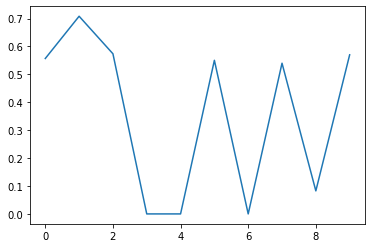

In [4]:
from matplotlib import pyplot as plt
%matplotlib inline
plt.plot(ans[-1,:])

(array([13.,  4.,  2.,  1.,  4.,  1.,  4.,  4.,  1.,  1.]),
 array([0.17623219, 0.5718389 , 0.9674456 , 1.36305231, 1.75865902,
        2.15426573, 2.54987244, 2.94547915, 3.34108586, 3.73669256,
        4.13229927]),
 <a list of 10 Patch objects>)

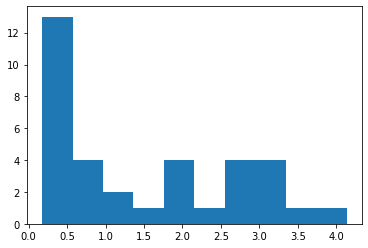

In [11]:
data = [4.132299272166331,
0.4106435861540245,
2.4636237853609755,
3.5971024726823586,
0.1762321877831367,
2.6070934296007424,
0.20962206065529482,
0.9683728878168038,
0.5584998436530413,
2.1179521947218256,
0.39867865453510226,
0.5840762829666871,
0.3617063354257561,
3.067742813999832,
0.30826675007855625,
2.8669775328629776,
1.8464956894331712,
0.8852413146555449,
0.3341663966292467,
2.6880789901339894,
0.4846735098039672,
1.913288252058708,
1.3093395482221586,
0.7865317047055477,
3.332065712214343,
0.49472227232798394,
1.5547433071064776,
1.9114337018887713,
3.1976297372975573,
0.46468975834520393,
0.34213060851287824,
2.7835134216740487,
0.3169006161824112,
3.049915609796377,
0.8454051833266384]

data = np.array(data)
plt.hist(data)

In [5]:
from pandas import DataFrame

df = DataFrame(ans)
df

,0,1,2,3,4,5,6,7,8,9
0,0.000048,0.748061,0.752131,0.890454,0.811574,1.078496,1.130665,1.249748,1.338058,1.428049
1,0.556873,0.612002,0.800626,0.718552,0.596519,1.088829,1.062109,1.265171,1.046652,1.369971
2,0.000047,0.600593,0.000232,0.000065,0.859712,0.704373,1.126782,0.895312,0.875582,1.260468
3,0.000047,0.791676,0.558383,0.002585,0.827459,0.779951,0.774298,0.936668,0.823726,0.398348
4,0.000048,0.620046,0.801933,0.591692,0.000189,0.597065,0.944402,0.842161,0.606113,0.905866
5,0.556873,0.791675,0.546756,0.579123,0.001575,0.619610,0.822033,0.928192,0.805625,1.044051
6,0.619408,0.711958,0.604093,0.610649,0.571212,0.437456,0.562233,0.590748,0.618114,0.576974
7,0.556873,0.000079,0.678837,0.000045,0.000046,0.000455,0.598079,0.015225,0.159687,0.595317
8,0.556873,0.707422,0.558383,0.000059,0.560217,0.573658,0.533466,0.587042,0.643366,0.575122
9,0.556871,0.708219,0.573756,0.000043,0.000046,0.550360,0.000057,0.539951,0.082592,0.569993


In [6]:
df.to_csv('rmsd_4_through_13.csv')

In [4]:
model = RTGNBatch(6, 128, edge_dim=1)


outputs = []

print('outputs', outputs)

full_outputs = []
for i in range(0, 10):
    model.load_state_dict(torch.load(f'transfer_test_t_chain/models/{i}.model'))
    model.to(torch.device('cuda'))
    
    for j in range(0, 10):
        output = loaded_policy(model, f'TChainTest2-v{j}')
        outputs.append(output)
        print(i,j,output)
        
    full_outputs.append(outputs)
    outputs = []
    
ans = np.array(full_outputs)

outputs []
seed is  50494
transfer_test_t_chain/4.json 




transfer_test_t_chain/4.json 




step time mean nan
reset called





[-68.0046923930025, 177.4642553482523, 179.89525583405367, 62.25735582400182, 172.6811770088573, -98.65033592755816, 178.2211647411649, 179.5615336225251]
action is  [0 1 2 3 1 1 1 0]
current 5.634995700254196
reward is  0.0006497881301061347
new state is:
[-179.6485487863914, -173.29852259879112, -51.75500705888505, -59.99778860718587, -96.64865660459732, -61.568379004734055, -59.7783515007311, -173.89030694405443]
action is  [0 1 2 2 1 5 5 3]


/home/tgog/conformer-ml/zipingenvs.py:201: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


current 2.4068321398028893
reward is  0.01639628258584643
new state is:
[-179.69962409200218, -173.72572564664088, -57.082171205400805, -61.3988596028536, -179.7393477388373, -177.4700412716132, 56.888321218015776, 60.043563870123414]
action is  [0 5 2 2 1 3 5 0]
seen better
reward is  0.01639628258584643
new state is:
[-179.68103648455485, -173.93599068843287, -54.796352769328806, -62.14506229227483, 175.65780620646615, 18.66117865919846, 75.75918128563613, 176.01600650681218]
action is  [0 5 2 2 1 2 1 0]
seen better
reward is  0.01639628258584643
new state is:
[177.45830716157505, 100.49787899375085, -60.79123206101249, -65.36733623577875, 176.661608745273, -68.76409973193509, -174.51895115817865, -179.82982159026147]
action is  [0 1 2 2 5 2 5 4]
seen better
reward is  0.01639628258584643
new state is:
[-179.72815307437085, -174.09576987416, -53.76657379310049, -59.15328648075584, 179.4051762982048, -63.74920017003405, 101.78011889689665, 71.22679924494973]
action is  [0 5 2 0 5 3 5 

seen better
reward is  0.03786754134039314
new state is:
[178.17041635674852, 100.4069793719223, -57.03739241992411, -64.48308173641973, -97.95806888440622, -64.29584385207052, 103.75223468565949, -178.96593078294507]
action is  [0 0 3 2 1 3 1 0]
seen better
reward is  0.03786754134039314
new state is:
[-179.43730420777658, -175.90986102372761, 87.67516890657424, -63.901982299396266, -171.71134284161928, -60.83403122790263, -64.86850689197827, -174.30380198542792]
action is  [2 5 0 1 1 1 5 0]
seen better
reward is  0.03786754134039314
new state is:
[-64.4834367550546, 97.46560928369784, -156.71230909294945, -61.49387852064396, -93.26007886538237, -173.0282447060756, 176.9105115737978, 179.9141172824193]
action is  [0 5 2 2 1 2 5 4]
seen better
reward is  0.03786754134039314
new state is:
[178.2049225083465, 100.42913903728775, -57.49252335156035, -64.22971434890943, -97.43980984520034, -65.15704726700267, 104.23373272812944, 71.26079028673637]
action is  [1 5 0 4 1 5 1 4]
seen better
r

current 1.2918637710017882
reward is  0.050000000045724455
new state is:
[179.6664149930728, 173.5626975639236, -175.70816149966416, 175.5976180561967, -173.5549658487287, 62.38925082534297, -179.97423054465588, 179.9917378178517]
action is  [0 5 3 2 5 2 1 4]
seen better
reward is  0.050000000045724455
new state is:
[-179.70283432345468, -174.0867629750175, -54.827862284341656, -59.66035973745221, -179.78362932122508, -68.24798969676905, -179.02036770060712, 67.09084330631897]
action is  [0 5 4 2 1 0 5 0]
seen better
reward is  0.050000000045724455
new state is:
[179.19293801902404, 172.25470633828877, 64.13071785913398, -89.2202229558235, 175.27874667005068, -164.7534293058034, 178.97575382728328, -179.80682655599648]
action is  [0 5 2 2 5 3 1 3]
seen better
reward is  0.050000000045724455
new state is:
[-179.74238506393843, -174.2811709233092, -55.08973797923846, -58.665813865150334, 179.68392708387472, -61.22477870487214, -56.03542453728774, -59.03602705292579]
action is  [0 5 2 1 4

seen better
reward is  0.050000000045724455
new state is:
[178.0665054105763, 100.38489231998918, -60.27598311642758, -61.92960686192113, -93.53644126606461, -170.5881703301508, 176.6915730382978, 179.9259491684921]
action is  [0 5 2 2 1 3 1 5]
seen better
reward is  0.050000000045724455
new state is:
[-179.760594998899, -174.2172283022968, -56.542251431281976, -58.49203074337182, -179.78422963295665, -63.22863241458264, -63.732424580220396, 98.86304097364616]
action is  [0 5 2 2 1 2 5 0]
seen better
reward is  0.050000000045724455
new state is:
[178.16955180710104, 100.40660332591044, -57.03716101180973, -64.48312756202075, -97.95842928618173, -64.2959715114201, 103.75202344353106, -178.96644581569265]
action is  [1 5 2 2 5 2 5 4]
seen better
reward is  0.050000000045724455
new state is:
[177.1805162159125, 100.17777268900151, -59.785167559553464, -65.52202943379153, 175.6226034807266, -65.4664181809966, 104.72403463033322, 71.39211122416462]
action is  [0 0 3 2 1 2 5 0]
seen better
r

action is  [3 5 2 2 5 2 5 4]
seen better
reward is  0.050000000045724455
new state is:
[65.63497046266856, 97.9421676991897, -59.86420413398192, -64.88517675215412, 175.78346872431348, -65.3189522867285, 104.4455994594758, 71.38538767047258]
action is  [0 1 2 0 1 0 5 0]
seen better
reward is  0.050000000045724455
new state is:
[-179.67541321185064, -172.76012189282233, -62.76778632590835, 178.9113318042826, -174.56024312631698, -137.98679683288202, 72.78978366112759, 177.75696044836525]
action is  [0 5 2 2 1 3 5 0]
seen better
reward is  0.050000000045724455
new state is:
[-179.68107998130066, -173.93639799470824, -54.79581610980585, -62.14486041951362, 175.65785479449417, 18.661089023060182, 75.7590612192698, 176.01615834112533]
action is  [0 5 2 2 5 5 2 0]
seen better
reward is  0.050000000045724455
new state is:
[179.86454415235514, -178.71998195579886, -64.95344044142632, -42.50216546415932, -176.6538592696832, 78.7112317346821, -70.5148286820955, -170.4073185852983]
action is  [0 

action is  [0 5 2 2 1 5 5 0]
seen better
reward is  0.050000000045724455
new state is:
[-179.69223075332897, -173.68872294457532, -57.120934592983524, -61.733319198930005, -179.57919012012107, -178.43993287338395, 59.9909576791801, 175.2938029832689]
action is  [0 3 2 0 1 4 5 4]
seen better
reward is  0.050000000045724455
new state is:
[-173.5321405250415, -58.48084251866541, -62.3092291992384, 175.63940075502333, -61.52605657899117, 60.7921143294482, 90.72650694172465, 67.12594869420965]
action is  [0 5 5 0 5 5 1 4]
seen better
reward is  0.050000000045724455
new state is:
[179.44175276739367, 173.38418274703426, 40.988912708516594, 171.1725960788546, -173.76962659600846, 69.79095232345493, -101.1044371693663, 177.84461907390346]
action is  [0 5 2 1 0 2 5 0]
seen better
reward is  0.050000000045724455
new state is:
[-179.70766844372807, -174.14843833070955, -54.8365427339281, -59.430363421181255, -179.90507912869916, -66.75756251239025, -174.41757835546883, -179.79226714808578]
action

current 2.918783830612793
reward is  0.007822817057084094
new state is:
[-60.998018606664274, -61.491430681093135, -174.00892164943465, 62.517812024187904, 56.24882941483226, 173.53458092721456, -54.941961744453764, -59.88258331449732, -175.36197546604487]
action is  [1 1 4 5 1 5 0 1 4]
seen better
reward is  0.007822817057084094
new state is:
[179.68857089185266, 173.58983206418205, 58.3824804968088, -169.82565190172588, -82.4817240648898, 65.74629233056031, -172.50824182699702, 173.65856381562665, 65.8783905240252]
action is  [1 5 4 0 1 4 1 4 4]
seen better
reward is  0.007822817057084094
new state is:
[179.60899481257854, 174.33307065974537, 63.09721539138368, -164.7117215798644, -79.0902340779146, 67.48403765902701, -175.48640477581262, 59.44010520214874, 60.33149664938392]
action is  [1 5 3 1 4 2 3 0 3]
seen better
reward is  0.007822817057084094
new state is:
[-92.57295892416973, 70.29288009200366, 57.97585898353496, 176.08666823666036, 64.02216326683605, -100.29281879040941, 61.

seen better
reward is  0.007822817057084094
new state is:
[-175.26944958419986, -60.08222103504592, -57.468511200214536, -53.40329089162048, -59.953277172962565, 179.46280708407667, -63.925416836290836, 103.13892819550719, -178.8031385346185]
action is  [2 4 4 5 0 1 2 4 0]
seen better
reward is  0.007822817057084094
new state is:
[-70.29943796048755, 171.42340298174193, 63.645436437603514, 48.68841772366483, 170.71284740547873, -59.12043454135595, -51.504491138348534, -172.47268740944875, -179.76845176944502]
action is  [1 3 3 0 3 5 2 5 5]
seen better
reward is  0.007822817057084094
new state is:
[-66.7587366956599, -67.93139505095671, 96.81881898871309, -142.73638612652977, -63.47296246697603, 176.7782306590548, -65.09944049359066, -176.9470386353416, 68.0540989994591]
action is  [1 1 0 5 1 2 5 0 3]
seen better
reward is  0.007822817057084094
new state is:
[-65.71738112116752, -176.33961335402034, 174.1047808210891, -176.0047987988597, 178.27136665756268, -59.69145143693883, 60.882496

seen better
reward is  0.01217910932909864
new state is:
[69.63355641566714, 179.94568242630916, -168.4694655471066, -63.373472994656865, 176.5898454569153, -62.016414080371895, 60.84228385889322, 89.35505808534252, 176.49453788430756]
action is  [0 4 2 5 4 5 5 1 2]
seen better
reward is  0.01217910932909864
new state is:
[174.33498129054962, 69.27506160761118, -176.05108828708717, 61.821109459379656, 57.790195565872345, 174.17239688902302, 92.507359181779, -174.80989705784094, -179.3649234880224]
action is  [5 5 3 0 2 5 2 3 2]
seen better
reward is  0.01217910932909864
new state is:
[176.49952573334014, 95.62560712877774, -69.80977243979893, -55.75135479337352, -58.804350059445575, -179.75545201537506, -61.7124582165025, -55.188845682400185, -58.89655183307984]
action is  [1 1 3 1 4 4 1 0 5]
seen better
reward is  0.01217910932909864
new state is:
[-179.93642564923033, 178.43442587854338, 67.11926055145975, -177.0464141079078, 59.54626343778902, 56.89198032922098, -100.39357883715702,

seen better
reward is  0.012856103288946949
new state is:
[-175.99791178476053, -59.146366756845495, -54.38450613612431, -60.7635894556146, 171.21533212013554, -60.31599089998895, 40.78218875465843, 66.06346905086058, 63.596838397421536]
action is  [1 1 3 0 3 5 1 1 4]
seen better
reward is  0.012856103288946949
new state is:
[-175.37718711752453, -60.17491087724059, -56.50850082607623, -55.26234561131433, -63.09690683728528, 179.75124612804134, -175.81294026373476, 169.9415519103736, 64.85651667875729]
action is  [1 1 3 1 5 5 2 5 3]
seen better
reward is  0.012856103288946949
new state is:
[-179.89482136162565, 177.91348387432623, 73.0836668096328, -136.88974249809877, 71.19507890964593, 177.56621468470456, -68.94377008068103, 93.87779059555794, 64.52848250264945]
action is  [0 5 0 1 4 5 5 5 0]
seen better
reward is  0.012856103288946949
new state is:
[179.97160803498778, 179.64330835359956, 173.61055544770664, 179.11317615188898, 68.23355608831339, 175.1197421676515, 58.73107187729556

seen better
reward is  0.012856103288946949
new state is:
[-177.10438073463624, -60.97387691180568, -68.75673607977093, -139.7029607709277, -58.167025708053515, -91.64944542027945, -178.82293596080552, 57.12438063077355, 61.19059835256787]
action is  [4 2 3 3 0 0 4 5 5]
seen better
reward is  0.012856103288946949
new state is:
[92.07132893336347, -66.95280582093834, -56.979671350471776, -62.94300879249314, 175.84004257180987, -176.20131367247447, 60.62770392112802, 88.42718920974485, 174.52174496044975]
action is  [0 0 3 0 3 2 2 5 1]
seen better
reward is  0.012856103288946949
new state is:
[-179.8132111559857, -176.79435786932234, -72.09122089943031, -102.33603497155688, 63.20252520544056, 175.11279069948844, -70.59526120180777, -176.99070442343452, -179.82303576964352]
action is  [4 1 0 2 0 5 1 4 1]
seen better
reward is  0.012856103288946949
new state is:
[63.65956634679171, -96.70222664870401, -179.29142270016794, -75.8662601098124, 165.27251715782774, -178.7267346775688, -101.2904

seen better
reward is  0.012856103288946949
new state is:
[175.20520318189543, 65.02891899425589, 172.33210040358614, 55.83254568647757, 147.9163129906789, 68.95317123113186, -100.55547178719864, 66.84900815957938, 64.74715654694751]
action is  [1 1 2 3 3 5 1 4 4]
seen better
reward is  0.012856103288946949
new state is:
[-178.18737699684158, -73.62770812554521, -103.7106785039444, 68.20845760498801, -86.14989939767504, 177.55239293101042, -168.0837207180909, 59.21908660262779, 58.440682281446335]
action is  [1 1 4 1 5 3 5 3 3]
seen better
reward is  0.012856103288946949
new state is:
[179.7356802216274, 173.81856415663177, 92.0760138470313, -80.29839206048223, 136.59410977216262, -71.79146385707233, -174.52266033929268, 172.51135145093008, 64.79499942204349]
action is  [0 0 2 0 4 5 2 0 1]
seen better
reward is  0.012856103288946949
new state is:
[179.895971573375, -177.78937408278216, -72.5903986083798, -102.6492415915721, 62.99629741202805, 174.85336210448023, -71.00751891363446, -17

step time mean nan
reset called





[-179.85009282162147, -175.4486749923578, -64.09329063356607, -167.51973632511542, -63.87086255794231, 86.97974676617409, -176.76834478667726, 168.4336784191046, -64.6025555230313, -174.27559841434748]
action is  [1 0 2 1 2 4 0 3 4 2]
current 7.865412884417024
reward is  4.4803571502807316e-05
new state is:
[-64.09349497161537, -171.52433219762392, -57.99703306047325, -155.3904353152849, -71.36335983910777, 73.10709098818515, 172.067925924994, 55.133397817322596, 59.44041826984584, 60.11163334859869]
action is  [0 0 4 5 5 0 4 4 3 2]
current 6.244506173182196
reward is  0.00022660186264359267
new state is:
[179.84378568499545, 175.59980173778874, 64.29631709573346, 167.71594882475432, 61.68407014817355, -179.93868565372324, 57.53787635057151, 59.58837485372262, 64.3162800633248, -95.86505698949854]
action is  [1 0 0 5 0 1 5 2 4 0]
current 4.577171141881757
reward is  0.0012005434398725757
new state is:
[-179.987796827035, -179.97801010428736, 179.995

action is  [0 0 0 0 1 1 3 1 1 3]
seen better
reward is  0.015148751018285903
new state is:
[-179.95052657943103, -179.91788323600295, -179.98022116790284, -175.61891962679186, 164.60667466821613, -100.8152641557635, 64.27591921703193, 171.40867580179653, -56.59759046196596, -57.935169646286845]
action is  [0 3 4 0 3 3 4 1 0 3]
seen better
reward is  0.015148751018285903
new state is:
[-179.57193937612465, 98.83273632811765, -63.850985927590095, -176.49108064486182, 60.411211763801745, 48.12160825457036, 65.70697579586619, 176.0322931858125, -175.74370621077324, 68.90597372905953]
action is  [1 5 0 0 2 5 3 1 3 3]
seen better
reward is  0.015148751018285903
new state is:
[-60.02558082973837, -171.4113808194609, -174.19081914150362, -175.3213822082384, -178.74180052117748, -169.26553857047986, 83.93820246158808, -83.05967643444048, 74.20099191935728, -109.18666114073746]
action is  [4 0 2 3 1 4 0 1 4 0]
seen better
reward is  0.015148751018285903
new state is:
[65.26525482265599, 177.0926

action is  [2 0 4 0 1 1 2 0 3 3]
seen better
reward is  0.015148751018285903
new state is:
[-66.56252111388548, -179.91692452088142, 71.95533355003897, -174.53352637147248, 176.70065793484997, -57.04899754376685, -57.67926262590758, 179.7888176185054, -55.430925103755534, -59.90576485414284]
action is  [0 3 5 3 1 1 1 5 1 2]
seen better
reward is  0.015148751018285903
new state is:
[174.94728258571425, 64.97361022894171, 169.82985782419837, 64.51468100634787, -78.62423050632995, -134.8189435024516, -178.7765880490135, 169.48137849818923, -170.50308285328933, -64.29017835921816]
action is  [0 4 4 0 5 4 0 5 1 2]
seen better
reward is  0.015148751018285903
new state is:
[175.10404735537207, 58.69828662607526, 60.37811157040031, -179.88828778325708, 164.18318010550374, 66.26513214681826, -179.74734501373908, 179.6837604954691, -170.49933821684272, -64.87729664186418]
action is  [0 4 1 2 5 3 2 3 3 1]
seen better
reward is  0.015148751018285903
new state is:
[174.37688214668282, 66.2724093324

seen better
reward is  0.0172981146878757
new state is:
[175.110847513787, 58.713859108015534, 60.33848619749916, 179.95455252052284, 163.6120118645503, 65.21366108520805, -179.72618916927425, -179.5830047467027, -57.50715167799751, -59.75798301030791]
action is  [3 4 2 5 0 4 3 0 4 3]
seen better
reward is  0.0172981146878757
new state is:
[59.46111141124355, 61.223411626884676, 177.31969806053405, -170.15074463335475, 163.11187809207806, 47.57308312947793, 68.73843026850729, 162.70563056799557, 171.54303927900432, 58.1916968160343]
action is  [4 5 2 0 5 1 3 2 0 0]
seen better
reward is  0.0172981146878757
new state is:
[68.93542429661584, 95.34986889218031, -64.85876915756658, -168.75900628159235, 179.83137962336045, -60.66453127525857, -58.931968330554874, -58.91371402066539, 179.38885523384764, -179.98549647794212]
action is  [0 4 0 5 3 1 1 3 4 3]
seen better
reward is  0.0172981146878757
new state is:
[175.34009333127386, 65.82897890746702, 171.30218822694937, 57.940266918456416, 5

action is  [0 0 4 4 2 4 5 1 1 2]
seen better
reward is  0.0172981146878757
new state is:
[179.9798146441924, 179.752800520974, 70.67809345432298, 76.88131914156166, -116.84573776795938, 72.36981185191809, 175.97450452648545, 174.92395432716583, -58.3034956234678, -59.672148812357285]
action is  [0 2 4 5 0 5 0 3 3 3]
seen better
reward is  0.0172981146878757
new state is:
[178.73979847816227, -100.064793334434, 61.93046906133706, 178.47428237246737, 169.79516062347878, 38.525702734535336, 174.3427930512058, -61.392640691597116, 176.34245887124, -69.03751478714564]
action is  [0 4 0 0 3 1 4 3 3 4]
seen better
reward is  0.0172981146878757
new state is:
[175.25983334404975, 66.34385614021365, 176.1042940065456, 179.88325451821788, -62.22531582509378, -62.36530373938261, 98.484929209913, 62.72330280346649, -100.06099639537656, -176.78876463818713]
action is  [0 4 2 4 4 5 3 3 4 3]
seen better
reward is  0.0172981146878757
new state is:
[178.85490330546043, 72.24960028531405, 176.62665870613

seen better
reward is  0.0172981146878757
new state is:
[59.35133457291159, 60.21337758425122, 175.79905850208337, -178.82815185874804, 104.0887041705124, -62.70391171669561, -174.88621077043257, 70.72687445015752, 173.65224771182503, 65.83669458683933]
action is  [3 0 2 0 1 3 4 0 2 5]
seen better
reward is  0.0172981146878757
new state is:
[66.55328826095645, 179.67405156153035, -69.2852893999988, -176.44830204614814, -62.78263753299302, -63.35144343668327, 99.04154185470134, 167.3299963786529, -62.504051657409235, 99.66060481910225]
action is  [0 0 5 5 2 4 5 5 4 2]
seen better
reward is  0.0172981146878757
new state is:
[-179.1480458842746, -179.92474668610404, -176.32740364968285, 100.98348360744569, -72.47803462421949, 86.53774426008749, 95.44359141165057, 50.82097309077039, 79.47899339642997, -77.95654286960442]
action is  [0 5 3 1 1 3 3 5 2 2]
seen better
reward is  0.0172981146878757
new state is:
[179.87382724885452, 71.58535198998557, 70.28253780268528, 173.60994712503714, -62

action is  [0 4 4 5 5 4 0 0 3 4]
seen better
reward is  0.0172981146878757
new state is:
[175.5653328214788, 60.9019945299671, 59.911622271290184, 169.76523164327062, 57.4657672903967, 56.178788387538596, 178.46190262808096, 136.6519491434789, 66.93989203108035, 63.13421908025428]
action is  [1 4 2 1 2 1 5 2 4 3]
seen better
reward is  0.0172981146878757
new state is:
[-65.63662871924706, -64.2159649636603, 101.03531870643248, 175.47970621773402, -63.55362975248125, -167.14934556497911, 68.39385059461016, -90.0558179098385, 169.659262813034, 65.16625516234073]
action is  [0 4 4 3 0 4 5 3 4 3]
seen better
reward is  0.0172981146878757
new state is:
[-177.03530758840537, -179.2435375362755, 160.94589950704315, 71.46209029539764, 159.62932201489355, -178.0508290926646, 57.197341806491096, -58.751804127365176, 179.5256614830414, -63.074051484123345]
action is  [0 4 1 0 2 2 0 0 2 5]
seen better
reward is  0.0172981146878757
new state is:
[172.28472518517717, 66.70931201303236, -96.334122408

action is  [4 0 1 1 2 5 1 3 0 3 2]
seen better
reward is  0.0014799450985047821
new state is:
[65.59314426473593, 175.54300622992267, 179.99769373793262, -178.91873228386916, -65.78190852968643, 118.7174263245623, -57.01071942537345, -82.69404883218215, -128.4700091905855, -66.6619634391207, -65.50279404943922]
action is  [4 5 3 2 1 5 0 1 1 4 4]
seen better
reward is  0.0014799450985047821
new state is:
[59.90498393266525, 57.140039093745855, 70.23975598391986, -93.04134171018849, 178.80188458378726, 62.44980478568363, 168.94621689451108, -61.298030057442844, -141.747077328511, 62.90786602640933, 56.6633319664826]
action is  [3 1 4 5 3 0 5 0 0 5 0]
current 3.829105768482078
reward is  0.002148393307401867
new state is:
[65.06799951290418, 171.02785066289286, 65.2926898320058, 171.84402870100195, 58.127154935929084, 178.93864306675363, 58.585463033648026, 172.345188342073, -179.7452734164904, 58.567107957804154, 175.06036472831113]
action is  [0 3 4 5 5 3 0 5 1 1 5]
seen better
reward i

[175.03487517094888, 65.84257473874996, 176.17643237404243, 179.90736109894502, -100.65946119819714, -172.1262138519591, 174.46105911824324, -174.32248846471813, 67.12370789502164, -171.8165671286799, -64.80712211663005]
action is  [0 1 5 3 4 5 0 0 4 5 2]
seen better
reward is  0.039647224141698134
new state is:
[-175.08984198459882, -64.10736769474907, -169.63916092414257, -94.01060022025975, 67.46245729135015, -177.00868753839006, 175.45876696359346, -174.49275644603503, 65.62809555648731, -175.10577309297514, -65.25980356078473]
action is  [0 3 4 4 2 0 1 3 0 1 1]
seen better
reward is  0.039647224141698134
new state is:
[176.2444950938746, 60.41039153599771, 54.064957494201025, 61.44386511732995, 178.1488570350446, -154.56759769208378, -78.10426890934613, 67.50068184755263, -172.63458240708977, -179.76136117468192, -65.89302382952067]
action is  [3 3 5 1 3 1 4 3 5 1 5]
seen better
reward is  0.039647224141698134
new state is:
[-66.79616623138647, 89.13673063314043, 66.11611437002654

seen better
reward is  0.039647224141698134
new state is:
[-178.52562645342977, -178.3653937237867, 97.43337537043128, -64.65178441051155, -167.20242525972643, 174.66498232451738, -136.72306985454475, -178.34874391834487, 179.0069009421995, -177.55855646578465, 68.06127124048636]
action is  [0 3 1 1 3 2 4 0 4 5 1]
seen better
reward is  0.039647224141698134
new state is:
[175.24902230332586, 65.01840779195152, 174.4577398971425, 174.33624218885032, 73.4964336063728, -109.06548437664188, 69.65798013910454, 173.4233409645698, 71.1195130179932, -177.1189340560934, -179.42840532642046]
action is  [0 5 3 5 1 2 0 1 2 0 2]
seen better
reward is  0.039647224141698134
new state is:
[179.88270454023075, -176.38866963172308, -69.40985612871673, -177.93680696357745, -103.91552584136988, -65.25420848710075, -164.91633645173366, 178.63058117496, -88.41630137622847, -179.3537112281101, -68.71733368180385]
action is  [0 0 5 2 5 0 5 1 1 5 1]
seen better
reward is  0.039647224141698134
new state is:
[-1

action is  [4 3 0 2 2 3 4 3 2 0 1]
seen better
reward is  0.039647224141698134
new state is:
[95.61518986860166, -66.85398645515228, -169.86895864152777, -67.82113095718248, -106.28011911329327, 63.57964409805977, 82.87169018336172, -76.53761227838785, -41.56139849193871, -170.54328014284872, -64.07922708596053]
action is  [0 4 4 0 2 3 2 2 1 0 4]
seen better
reward is  0.039647224141698134
new state is:
[175.31829884268305, 60.342095681862375, 59.18610725503496, 173.16437371096168, -100.5907212529896, 70.36913252660591, -93.36797891860047, -70.62371958471083, -63.626235221731925, 178.83818225408945, 67.05649266642779]
action is  [2 1 2 1 1 5 5 5 0 1 4]
seen better
reward is  0.039647224141698134
new state is:
[-64.89223030271737, -170.98110680129358, -65.07627308728986, -171.21885447814543, -58.19460502907532, 172.66430675228042, 68.44659309353924, 179.78801475297624, 178.87192612412187, -177.63770356822465, 67.42490427959403]
action is  [4 4 5 5 5 3 1 3 0 1 2]
seen better
reward is  0

action is  [4 2 0 1 5 0 0 2 0 1 5]
seen better
reward is  0.039647224141698134
new state is:
[97.70688858362064, -60.90488350387519, -175.4196262231531, 178.33570202628314, 139.87054387163343, 163.5319050889549, -172.5195415567643, -97.28103259641134, 149.85142324605133, -89.86176493107112, 82.07843180044982]
action is  [4 1 3 5 1 2 0 2 3 4 1]
seen better
reward is  0.039647224141698134
new state is:
[71.20144388614072, 176.63425092991068, 73.10385959150533, 78.79741570163947, -170.2215483274948, -61.09315021294278, -168.79065718274876, -98.88387969191824, 49.89996443589269, 58.17229440042131, 175.99156719982693]
action is  [0 3 3 3 2 1 4 4 2 5 3]
seen better
reward is  0.039647224141698134
new state is:
[-177.46648303091968, -176.37425603959076, 99.88063140708006, -64.61347478324856, -62.91850021706609, 172.2444935933275, 37.39155282703553, 176.12287220397607, -62.048773643730506, 173.66535884082856, 66.50256013230087]
action is  [2 4 1 2 5 5 2 2 1 1 4]
seen better
reward is  0.039647

[179.91571896347793, 174.95790969085684, 65.91432709400353, 175.65506691857863, 173.93542105597578, -89.11125340473099, 67.1785393003119, -100.62910251573537, 64.03915397776215, 178.70376411465904, -179.67934303746358]
action is  [0 4 4 5 5 0 4 4 4 0 2]
seen better
reward is  0.039647224141698134
new state is:
[178.68015195114845, 69.60795871948959, 66.6154503814086, 169.1927205672221, 96.79904957846949, 165.18262734244342, 49.94706073854955, 64.35309604518733, 100.86672265995237, -172.45593823917906, -64.54348443037357]
action is  [3 4 1 5 2 0 4 4 1 5 2]
seen better
reward is  0.039647224141698134
new state is:
[-62.66303502298345, 99.77473739191859, -176.0293443417484, -172.83025218571473, -64.1146213005478, 173.17366025701043, -169.48549549997136, 64.77940761666373, 113.9113392769486, 176.31589450880716, 66.94660742548052]
action is  [0 3 0 5 0 4 5 5 5 1 5]
seen better
reward is  0.039647224141698134
new state is:
[175.55544630584862, 65.4362335355326, 171.11683208666142, 64.1189871

seen better
reward is  0.039647224141698134
new state is:
[169.6111619009791, 61.10025254817718, 58.401983535402664, 59.402072686146504, 171.82624102461463, 74.00414169415164, -172.36842406545722, 65.23742162610982, -70.68952809856897, 166.37808227745998, 175.85379115840567]
action is  [3 0 4 1 3 3 3 0 0 4 2]
seen better
reward is  0.039647224141698134
new state is:
[-62.30218769766955, -145.1341150447535, -99.4235913349531, 49.436366427438315, -176.239707817372, 79.564556993334, 2.8976601283547168, 77.07693918670985, 142.03606826955, 51.39968324997579, -93.45423486652595]
action is  [4 3 1 5 1 1 4 2 4 1 4]
seen better
reward is  0.039647224141698134
new state is:
[95.44489852452162, -64.00329977861175, -62.619547777273546, -179.55974182262, 175.05338685938102, -90.00274582688476, 66.79921966376423, -99.66179187277397, 64.79150943161504, 177.5544884610282, 70.18345081188001]
action is  [4 0 4 5 5 5 0 3 1 4 0]
seen better
reward is  0.039647224141698134
new state is:
[65.55605769754706,

action is  [0 5 4 1 4 0 4 1 5 3 4]
seen better
reward is  0.039647224141698134
new state is:
[175.6845899599007, 60.75562221086802, 60.715111441329526, 174.2031250196288, 102.8648702340645, 167.86281855360755, 67.03404565529281, 179.75021711598308, -178.70371572854916, -70.63682494113907, 92.19393710912561]
action is  [0 5 0 5 5 3 4 5 1 1 3]
seen better
reward is  0.039647224141698134
new state is:
[175.13901053807575, 64.65232060462377, 174.972696422546, 179.01159049375408, 174.6079217319414, 57.114766963020934, 60.8052581449414, 179.3262052101308, 177.80849751768972, -56.68958136016134, -59.86143737635721]
transfer_test_t_chain/7.json 




step time mean 0.04773838610500057
reset called





[66.49738363967751, 179.8769559709447, -61.62001281457408, -55.63582202112636, -55.591472636187596, -57.37574892377539, 176.50231801144983, -171.81067076043368, -58.874572102459496, -174.65258716292863, 69.01869998030374]
episodic_return 7.318661228830344
0 3 7.318661228830344
seed is  67013
tran

seen better
reward is  0.007786559817278329
new state is:
[-64.76837560254835, 95.02676831505502, 70.64260443012654, 176.71197312651393, 179.8484692105943, -178.17149977257657, -72.22568806568964, 138.72419804593562, 178.37953310461617, -168.92716922522817, -97.50912241975226, -178.6911951264914]
action is  [3 5 0 1 0 5 1 5 5 5 0 3]
seen better
reward is  0.007786559817278329
new state is:
[59.026185137060835, 61.014232131153584, 179.49479162979847, -70.74990108361514, 176.89970129112024, 63.830104443267025, -97.97473391577023, 170.2434571189543, 99.32542260692554, 63.129701308619325, 176.52481223034164, 66.03375959940249]
action is  [2 4 4 3 2 1 5 5 2 5 1 3]
seen better
reward is  0.007786559817278329
new state is:
[-86.15020746579603, 71.16302446943628, 52.61062264330366, 60.105325795999015, -175.88987045650592, -65.52943282781986, 79.78125064982287, 129.3004357037728, -72.9354712096438, -162.75571863181062, -91.66342014915854, -61.72474224081847]
action is  [5 5 2 5 1 3 3 1 2 4 1 0]

seen better
reward is  0.007786559817278329
new state is:
[179.30003846199617, 179.38651090806914, 97.44674659099057, -61.89132869994171, -67.75352783679854, 167.41306188710405, -177.23208873169628, 160.09237897975245, 105.4645702183052, -85.2150880920303, -58.62273489196454, -60.91463584461087]
action is  [3 1 5 4 4 4 5 1 2 5 4 5]
seen better
reward is  0.007786559817278329
new state is:
[-65.95708369605445, -92.59269254552463, 69.15310350344907, 58.27934185308959, 55.031431131021904, 59.263559992799046, -169.22185249359725, -66.60546114966489, 177.272144266631, 178.0468002566738, 59.65368446973679, 172.28946052881807]
action is  [0 5 1 4 3 0 2 1 5 5 4 1]
seen better
reward is  0.007786559817278329
new state is:
[179.13752139260092, -179.40093583186137, 179.32276706945896, 98.75180054425985, -65.15908423560377, -169.4689532114227, -55.8012817216444, -77.15307530802237, 75.55507044263325, 37.23723581424354, 169.12540044190982, 174.47354001481423]
action is  [3 5 5 3 1 0 2 5 2 2 4 3]
se

seen better
reward is  0.007786559817278329
new state is:
[-174.74737856706625, -59.24482084682741, -59.895398372558084, -175.58448869629618, -179.92842003266853, 179.2813543610304, 65.87776224435858, 166.491452743234, -174.34357715910224, -52.523463524465036, -60.999308654693884, -175.7397962814506]
action is  [4 5 3 2 4 5 2 1 5 0 0 4]
seen better
reward is  0.007786559817278329
new state is:
[59.808473205586296, 55.3478621530137, 60.243057970627575, 175.35760605196023, 71.43459136711115, 101.4617352216856, -60.77274462269221, -179.1716335702522, -174.18151264811786, -139.57602403225573, 177.80794622263753, 66.5357872081536]
action is  [3 1 4 0 0 0 1 0 1 2 5 4]
seen better
reward is  0.007786559817278329
new state is:
[-72.44365036955324, -97.5056211996116, 64.3403311693073, 173.96494501781964, 179.6562790930958, -172.02734708829064, -56.48645663399929, 177.7590833812783, -171.7766133083867, -60.487408592444055, -177.66605821800607, 66.89795945922108]
action is  [2 5 0 4 3 5 1 3 3 4 0

seen better
reward is  0.012393551467369606
new state is:
[176.8463312186099, 71.04647966258419, 96.7119884928993, -64.6469004533084, -174.41469904500653, 173.47817148099708, -176.8661354651322, 175.53932277007024, -173.21028385276546, 62.00575076637331, -179.58191043755883, 179.80250980357835]
action is  [1 0 5 1 2 0 3 5 2 2 5 5]
seen better
reward is  0.012393551467369606
new state is:
[-68.41824718926598, 175.7512653378588, 64.0175969801593, -96.3200046794681, -70.67147463986355, -176.95088804247104, 66.69400433734448, 61.19017951819012, -100.43613148245595, -56.245891483939396, -177.83708932014972, 68.36208334280121]
action is  [3 5 1 0 5 2 3 1 0 5 2 4]
seen better
reward is  0.012393551467369606
new state is:
[59.65601075739693, 60.3782338322118, 175.48420843894164, 179.92913429683438, -173.73688392937302, -58.783895840706045, -60.63579283787711, 174.13258380238662, -174.8482612163715, 51.49177271046069, 75.00567467051631, -118.77190021017937]
action is  [0 4 0 0 5 3 0 5 5 2 0 4]


seen better
reward is  0.012393551467369606
new state is:
[-94.42023816750003, 64.68516286907783, 61.64429504610081, 178.25211011893913, -178.9675607779594, -69.62480340425022, 134.75080491226893, -173.87513999888586, -105.71290158303502, 63.41177068833648, 62.92576609812386, 60.14271897684583]
action is  [3 5 1 2 0 0 3 5 2 2 4 4]
seen better
reward is  0.012393551467369606
new state is:
[61.02313398266484, 67.06728815046635, -93.0238306788684, -67.33759122174375, -176.14104374997538, 173.79534155503657, 53.77320475971087, 74.01885679307485, -74.47247614206965, -47.51708378743908, 96.90285051089748, 69.50063211247519]
action is  [3 5 0 0 0 0 4 0 3 1 0 5]
seen better
reward is  0.012393551467369606
new state is:
[-65.63656469263397, -175.66725297592296, -179.86716699511297, 179.990074673785, 179.81170943306392, 174.64217596189388, 67.29616128988104, 178.8153937604796, 60.8259240517534, -66.6016999024589, 176.59234187854682, 66.55591941091848]
action is  [2 3 4 2 0 3 0 5 2 2 2 3]
seen be

seen better
reward is  0.012393551467369606
new state is:
[-174.95813965539776, -59.44140311729709, -59.68392414603238, -171.6924802566135, -65.07847980230484, -175.9904780450034, 65.53733634123894, 41.796062386308364, 176.48196028326097, -78.44098869089085, 70.76198379087758, 170.3846161684613]
action is  [4 5 1 1 0 0 0 5 3 2 4 4]
seen better
reward is  0.012393551467369606
new state is:
[59.55084122283233, 61.689981780295106, -179.94406308993405, -66.29385749127627, -174.221978301758, -175.97104918127795, 171.4134766954633, -176.69682911213388, 173.13585066177754, -67.30603840020082, 91.71357264314456, 67.22205711377353]
action is  [0 3 4 0 0 0 5 5 5 5 3 5]
seen better
reward is  0.012393551467369606
new state is:
[175.06862057079792, 59.769537818051056, 59.70862856408226, 174.97888944703402, 179.97178114622952, -174.6053138108788, 166.01150119231391, 65.83857301691638, 179.6174957855586, -178.19564579416846, -60.96507357012971, -175.71318119431015]
action is  [0 3 4 0 0 1 5 1 2 0 0 

seen better
reward is  0.012393551467369606
new state is:
[-95.56595134440373, 64.0700709319037, 63.07797913183519, -177.6761903746958, -65.00129960225769, -169.50874632000753, 163.32146434977273, 61.617260589314995, 89.13165766264306, 175.21594751094554, 179.32135152821246, 66.3346451989507]
action is  [1 5 0 3 2 2 4 5 1 3 4 1]
seen better
reward is  0.012393551467369606
new state is:
[-66.68024570621218, -175.35943972525664, -175.72670641846227, -54.522662718188464, -54.234445803527855, -94.33851102097715, 64.65557021516402, 176.64323586237325, 174.62737762038591, -65.41217040852851, -172.94321915406064, -64.71748905796464]
action is  [2 5 2 3 2 5 4 4 5 4 0 2]
seen better
reward is  0.012393551467369606
new state is:
[-63.51613731292782, -176.83783939673583, -60.532770490619974, -56.99353798230984, -67.10935808287675, 95.06772644336432, 58.84028106042201, 59.80908525372555, -179.42576976498623, 168.83849976114, -177.03963119816441, -73.26842217299836]
action is  [5 5 0 0 2 4 2 5 0 2 

seen better
reward is  0.000657578017063903
new state is:
[-59.152975173396584, -171.61035224634367, 68.18074582338956, 124.17401415364631, -67.89011204546836, -108.62830563358341, 82.59424026176043, -74.54404129297527, -136.0380316259217, 70.27872742160787, 170.4885685107843, -65.12497547050026, -179.63631272570797]
action is  [2 1 4 2 3 1 2 0 4 2 5 1 2]
seen better
reward is  0.000657578017063903
new state is:
[-53.18845715739382, -82.89605548768311, 67.98354110461297, -103.51521629877419, -83.21257532873601, 171.90270672626983, 63.15673124941873, 134.25622759281828, 76.84217657295163, -67.49895615308662, 171.6013825537027, -173.82022892349036, -65.08203898163889]
action is  [2 5 4 1 5 5 2 5 2 4 2 1 2]
seen better
reward is  0.000657578017063903
new state is:
[-67.24141752565383, 177.88805891579494, 67.26245821562094, 175.77538709164966, -179.55248553137827, -171.3438317719097, -59.6481795882762, 176.62587210633754, -96.00476281528275, 63.64659202889648, -57.48845114186341, -168.6189

seen better
reward is  0.0016830185965972248
new state is:
[-179.94245261638272, -175.6997495728268, 99.78357054665322, -66.52744742083208, -177.15495214213942, -63.956154429211004, -51.839822041883885, -178.69614695951026, -58.1934398743829, -59.97711017185437, 171.25178878436435, -174.8258484519868, 68.75351931026624]
action is  [0 5 5 2 3 2 0 0 1 2 4 1 5]
seen better
reward is  0.0016830185965972248
new state is:
[-179.1229032334946, 176.98534421674344, 71.4231760131162, 179.30400693012237, 97.88138556784637, -63.716458747683376, -169.76080437734626, 175.93828086035433, -147.66407743396073, -67.04852387948112, 99.40310888866412, 177.1515204437226, 66.4808051167695]
action is  [0 5 5 1 5 4 0 3 3 1 4 4 5]
seen better
reward is  0.0016830185965972248
new state is:
[175.09874353247258, 65.95903074813428, 175.64806166094087, -97.87460304217326, 67.72925119018716, 63.97553453386259, 170.90544091955508, 60.52957238061997, -97.81266233327857, -71.22652917409113, 58.737809528479154, 58.11801

seen better
reward is  0.009527281821695873
new state is:
[-66.20507017321044, -92.87497336692455, 68.29562024566474, 58.02380192852329, 60.082081052117736, 174.06147976548377, -102.79843137734714, 64.26548444957209, 177.127552902908, 61.0232786588007, -66.01596985816802, 98.54468759650653, 179.38571278908427]
action is  [2 3 5 3 0 5 0 1 5 2 3 0 2]
seen better
reward is  0.009527281821695873
new state is:
[-92.84668320063518, 68.0370259048391, 57.176841346370864, 60.4666315678491, 171.4090002815953, 69.07183488357062, -179.823180022288, -51.099006019915336, 106.1990095098079, -87.03256403488763, -50.750843941820676, -172.45143222341207, -65.14573168170354]
action is  [4 0 5 5 3 4 5 0 0 2 1 0 2]
seen better
reward is  0.009527281821695873
new state is:
[65.14783308658143, 175.2530637110013, 175.37704465294365, 60.10305968977618, 55.11862253652621, 61.57239954844442, -178.57449762771805, 174.58761010837136, -171.85972187098528, -100.62874947454098, -58.18473325920078, -173.7536447593498,

seen better
reward is  0.009527281821695873
new state is:
[-64.84655541426122, -166.81156134143922, -67.16681924979659, 93.57989579651888, 179.76297738232125, -73.09896420138496, -177.54476224314288, -59.73834161227771, -54.396009146282594, -172.72456687877923, 170.02118969599232, -55.74676395915003, -58.583441526257005]
action is  [0 5 4 4 5 0 4 0 1 5 3 2 2]
seen better
reward is  0.009527281821695873
new state is:
[179.79158091508376, 171.50794963321195, 56.804248375241286, 63.56071396919063, -179.89978883981553, 175.18777535509517, 63.2468176356285, 68.91969924165214, -165.80284957849014, 177.21877477966368, 78.7188513345234, -157.35479323726034, -62.61320815463259]
action is  [2 4 5 2 4 1 4 3 4 4 3 1 3]
seen better
reward is  0.009527281821695873
new state is:
[-176.71576527531474, 126.66727639408498, 73.0173557272957, -156.3993547740894, 144.70950459534583, -121.73625188640142, 59.1516633561616, -65.08003934301169, -168.7750600225077, 173.4218073996845, -21.73824364612292, -168.93

seen better
reward is  0.010007695734474508
new state is:
[63.72674181753296, -95.82025966421993, -175.00400977631233, -66.70034382726968, -178.31891993947022, 61.792191823342336, 60.31131306786136, 66.39125684647512, -101.6678993792159, -177.85308333023653, 170.389605050643, -56.20496749793501, -57.8650953416732]
action is  [5 2 4 4 0 1 5 5 0 1 0 0 2]
seen better
reward is  0.010007695734474508
new state is:
[-172.78793517599092, -94.30313637214611, 66.19269619816244, 60.387114679622805, 173.1856863924874, 177.30570297955845, 179.3464649063427, 164.8834826862416, -141.0934374058435, 179.7813932104342, 175.79054688542752, -170.4660654947159, -65.99456632865929]
action is  [2 4 2 3 0 1 3 1 4 2 4 5 2]
seen better
reward is  0.010007695734474508
new state is:
[-90.44669660550333, 28.738770439416488, -130.2952441668204, 71.94189654122899, 67.49050798564325, -177.39587403731056, 164.772294722708, 128.98941042417857, 64.66130716296016, -159.3603200424237, 143.2606415663146, 158.5775911135491

seen better
reward is  0.010007695734474508
new state is:
[63.30585223290823, 173.76337778302576, 175.31741338928708, 60.04646939445673, 170.08606047705345, 169.89090369534293, 56.96499743989225, 53.60787229019703, 76.06765719399611, -66.72519440382662, 160.59213441277493, 96.16630322937691, 64.58680786198383]
action is  [2 5 3 3 5 5 1 0 1 1 0 0 3]
seen better
reward is  0.010007695734474508
new state is:
[-72.34711000489587, -179.87057942978672, -102.55413650664215, 62.93571516849792, 60.274246295341065, 87.52508305655715, -71.50353894145438, 174.86977462698428, -73.16495748878931, -178.28903263700508, 162.2563223153804, 179.66635149218652, 63.93846683254817]
action is  [5 0 1 0 5 0 5 4 1 0 4 0 5]
seen better
reward is  0.010007695734474508
new state is:
[-179.73009028193874, 179.10711908997123, 179.75816999832145, 173.24543358714757, 64.49348377005093, 176.35527236392738, 172.03600866625328, 60.914481882447326, -174.64549347358889, 172.64927427469843, 61.75045762440865, 169.774608874

seen better
reward is  0.010007695734474508
new state is:
[-66.04927835845423, -176.6352428460386, 179.1116678193097, 173.33982831501208, 62.68304939845572, 174.03805135290096, -107.80350661814737, 63.92456579102258, 172.88040775856103, -61.18377422702253, -51.17201626297555, -58.26090443072551, -62.735660672744686]
action is  [0 5 5 5 3 1 3 0 1 0 1 1 5]
seen better
reward is  0.010007695734474508
new state is:
[175.12328124527758, 64.05970349110271, 174.30623492549765, -175.71067566216576, -61.16167347541407, -56.799778566639084, -56.95878976290535, -55.36278567453551, -62.52097135775576, -179.1951335960721, -175.58892593634755, 173.88092960029687, -179.93694091384558]
action is  [0 1 3 5 5 4 2 4 5 3 2 0 0]
seen better
reward is  0.010007695734474508
new state is:
[-177.82512436198977, -66.83649419803723, -60.24012338235731, -172.14026863292142, 177.8646813803544, 82.16081053769467, -169.60896567062593, 77.07556339383572, 175.4833633559466, -53.616950501302384, -60.18173367450756, -17

seen better
reward is  0.010007695734474508
new state is:
[59.91102451757212, 60.40081573520019, 174.26933897518242, 174.51518105785877, 57.83873712104733, 60.33923064358742, 175.91302337626033, -165.52771237860298, 173.30552300861672, -175.51522357432412, -131.68483710441004, -174.94347483002758, -65.46529540631504]
action is  [0 5 4 1 3 0 1 4 0 4 1 0 0]
seen better
reward is  0.010007695734474508
new state is:
[178.0559828886639, 67.4850637509942, 65.66107561332628, -102.26179736746747, -69.5149066267859, -167.87987273744088, -95.66764943872423, 64.35625785779943, 163.4843815700222, 97.07588661289996, -135.57080548882834, -176.8639577099406, 179.81484069634712]
action is  [0 5 1 1 0 5 1 1 5 2 1 1 1]
seen better
reward is  0.010007695734474508
new state is:
[175.3845277053163, 67.73964638764623, 179.98017606262275, -64.39220107417282, -168.86022374908578, 98.36680762021956, -73.50636103063754, -143.28349180004972, 96.12742378483709, -64.74082211346949, -149.74172152685117, -65.9557302

seen better
reward is  0.018251963611551226
new state is:
[-65.5238708171593, -175.50975777913635, -179.58656729487953, -177.47171765414097, 102.1692089901023, -65.61821226975496, 178.09051832028288, 68.29354940129839, -93.52751294107325, 174.43942300522008, -54.22610463264779, -60.30101152950104, -175.4913134218325]
action is  [3 4 5 5 5 5 3 0 2 0 3 2 2]
seen better
reward is  0.018251963611551226
new state is:
[60.24871148747966, 63.35488506963131, 174.61127492883415, 71.64886489240457, -179.36384830831463, -161.87984584643758, -70.61779348237668, -152.7976743653711, -50.45401997070409, 176.88722348294417, 57.10663744678058, -161.9105925347804, -63.054633667803444]
transfer_test_t_chain/9.json 




step time mean 0.05987093116500034
reset called





[65.64833325129806, 175.6887633142191, -179.96840861199027, -175.01835148444894, -67.4152410645761, 179.14220854277963, 66.43268836841875, 60.64103452566419, 42.31846087466217, 176.04748998060526, -68.08181039596556, 171.7418226790175, 1

seen better
reward is  0.003142173390785882
new state is:
[167.92938707161255, 60.681483948465875, 69.49989869422765, 105.7046455083042, -75.71874996068004, -74.12922219898006, -171.65190088264507, -97.40674154648627, 55.453933515817084, 85.09032592091138, -64.1352494887763, 107.7469399384939, -74.04250775830907, -164.69094472300353]
action is  [3 3 5 5 4 5 5 5 4 3 4 3 1 2]
seen better
reward is  0.003142173390785882
new state is:
[63.82085645860343, -96.90440315383648, 179.19156940729275, 175.6536082286168, 65.33507202280269, 169.65914572762432, 66.1591950119359, 172.32650535869524, 67.5717919820343, -92.19205858071473, 173.53997999601776, -55.73790219717122, -57.61634385439675, -59.359084447222735]
action is  [5 5 0 0 2 0 1 5 0 0 0 5 5 1]
seen better
reward is  0.003142173390785882
new state is:
[174.0282971475184, 67.58878409363383, -178.33270056052044, -174.04500307448453, -54.19397638142819, -171.33256201291277, 178.37532486400428, 61.94918322497644, -177.15963730174172, 176.85055

seen better
reward is  0.003142173390785882
new state is:
[-59.53429218230851, -60.62915773268074, -175.8129059365323, -179.74172992586912, -175.4718231524087, -64.00101507732084, -173.74836652169444, -176.9558197827726, 165.96272694397658, -173.87244227672988, 175.1229427351504, 133.4662163396715, -177.4713015767476, -67.55870693105484]
action is  [5 5 4 4 4 0 1 2 5 4 3 5 4 5]
seen better
reward is  0.003142173390785882
new state is:
[179.74582461955404, 176.56112340831086, 61.56591376224129, 55.11103040481452, 60.52828772703455, -178.7399808721386, -61.79084444528112, -59.9338593235026, 168.96108595401338, 49.68935263440939, 64.96984836167636, 97.15907413613279, 63.54928880879554, 60.06587534038292]
action is  [3 5 4 5 0 3 1 1 3 4 2 4 5 0]
seen better
reward is  0.003142173390785882
new state is:
[60.98139141497228, 57.16598433424848, 56.418834589687094, 60.55598091861104, 172.70967083246035, 66.329243232818, 175.35511573753732, 176.76185161586588, 57.913186252754066, 65.862562942493

seen better
reward is  0.003142173390785882
new state is:
[-57.592861402622354, -167.24118202112334, -170.61351843084373, -169.15466339916713, -168.06424560030104, -46.26348174632421, -55.19483253061074, -102.03311398979844, 74.1936825666242, -179.03226295393813, 65.54555473349158, -77.5148948740942, 69.66271956718614, 58.185401191127205]
action is  [2 4 3 1 5 2 1 2 5 0 2 1 0 0]
seen better
reward is  0.003142173390785882
new state is:
[-61.54843818013182, -172.56666182500928, -60.340819413717654, -170.38821449760124, 105.54253371239369, -66.33575833713145, -178.5736128637266, -74.98853031044769, 128.85069197209845, -167.8936512996539, -95.81243082437233, -68.62309576126886, -177.70383265550132, -179.57533308949294]
action is  [5 4 5 1 1 2 1 5 5 3 2 3 2 2]
seen better
reward is  0.003142173390785882
new state is:
[174.34354727061117, 57.9164835401151, 60.0441480720977, 179.65989184853794, -60.21642053304361, -54.55613366391163, -62.471119681256546, 177.2429524539876, 53.8298885233292, 

seen better
reward is  0.003142173390785882
new state is:
[65.87428542747492, 175.94099120047915, -179.90028776032935, -179.85889232526358, -175.64484014695148, -66.98684246614711, -171.95992272678498, -58.7584077662067, -179.48075438591593, -55.87063772251816, -58.29503257293083, 178.4155746897203, -171.30527656608413, -178.98084127378579]
action is  [2 1 4 3 0 0 3 3 2 4 2 3 2 5]
seen better
reward is  0.003142173390785882
new state is:
[-71.00070344908174, -134.93237121787251, 79.06220225056498, -74.91621214746272, -158.82515323371456, -52.018919425142364, -108.94626456107916, 83.8967743701481, -79.58631587269446, -55.60615399608721, -56.65109791095264, 65.71381908904242, -129.7219739817612, 178.2578396822659]
action is  [3 4 0 4 1 2 2 5 5 4 2 0 0 1]
seen better
reward is  0.003142173390785882
new state is:
[-62.767305003476125, 99.42795613011461, -177.4006173827395, 74.06162593577986, -178.04320140795969, -60.13753969041993, -57.40363395879513, -177.33911638700656, 57.97409626150916

seen better
reward is  0.003142173390785882
new state is:
[-63.7917194743388, 95.59201294666173, 178.58714935889952, 177.88375729518037, -176.2218157163318, -67.26223174708784, -175.6976857098186, -178.9941826621217, 170.05532414061213, -127.56042352030785, -66.80177366265079, -43.01189417969537, -64.51911126706489, -174.17904059941546]
action is  [2 0 1 1 1 2 1 2 1 0 2 0 2 0]
seen better
reward is  0.003142173390785882
new state is:
[-61.67663780683944, -169.4679340491591, -58.24421923606042, -60.90367951721106, -171.49514875380305, -67.787898725715, -171.18269127104514, -61.22236500393989, 174.3495773155386, -62.975046774894075, -60.91235618342715, 171.72822897703745, -65.62337608722548, -178.4474997569604]
action is  [3 5 0 1 5 1 4 2 2 1 3 5 1 0]
seen better
reward is  0.003142173390785882
new state is:
[-68.37850923888311, -176.58513379003438, 174.73390624170904, -68.48432973321208, 179.9553405166397, -171.48944515148537, 104.06761864940165, -63.971920208600956, -53.33312746578248,

seen better
reward is  0.003142173390785882
new state is:
[170.7923538703216, 70.82822325926782, 81.37460003864335, -92.43281407209054, -53.83945643326023, -50.823261745198785, -52.826821944917015, -53.558602859064244, 178.22187456035354, -161.9722948191882, 56.81532611083251, 160.8781457729584, -87.97790280235974, 81.82490800981944]
action is  [5 4 0 2 2 0 2 4 1 1 3 3 0 1]
seen better
reward is  0.003142173390785882
new state is:
[176.10693660211024, 69.50866572192461, 177.15500415065992, -61.65122043196552, -55.76881688333255, -169.12767494899524, -131.25363425915924, 84.7612633178642, -73.99008591389962, -60.33460120693385, -62.64594407480818, 56.31019699760803, 178.1001473468748, 178.53718728255856]
action is  [3 3 1 1 1 2 1 1 4 3 2 4 1 0]
seen better
reward is  0.003142173390785882
new state is:
[89.12144947620206, -70.27278099096948, -58.65730349810783, -167.6318970335938, -63.20449599664841, -68.34525586815033, -179.0538556183966, 174.30267691308543, 130.92831794904788, -68.5743

seen better
reward is  0.003142173390785882
new state is:
[-62.75467643334157, 94.01453535232326, 175.18520415141958, 62.598305997754665, -101.38983001563352, 170.19402392093872, 58.58788291890646, 62.89196857513248, 65.61950431992767, -100.77223442852906, -71.92429984428512, -47.94972223449939, -68.66696926817147, -67.11233997729097]
action is  [3 1 0 0 5 1 2 2 5 0 2 5 5 2]
seen better
reward is  0.003142173390785882
new state is:
[67.77100726802092, 179.16889999275946, -179.99824310492434, -179.64095378553895, 179.7219732096229, -177.3774087856942, -66.47189277603371, -68.7441792063175, 134.07033082287435, -171.38007692995572, 173.18062551012005, 58.729561238878794, 175.97898740101706, -68.85612090333137]
action is  [3 3 3 5 0 2 5 5 4 4 2 5 1 1]
seen better
reward is  0.003142173390785882
new state is:
[65.85586611582029, 91.19009498837053, -64.1433157081588, -170.02536380460614, -172.7823928425249, -63.69090502744576, 94.39928018485705, 168.98491233531485, 49.524204857496784, 80.501

seen better
reward is  0.003142173390785882
new state is:
[-64.03597179560518, 94.59680723737021, 177.15711660104995, 178.3236801489885, -178.71741471877996, -68.10746516769193, -174.7966897757689, -177.9834885093167, 165.02959252906567, -167.6394167429963, -95.46958120616387, 135.69763165334274, -72.6694941028972, -177.05437009996348]
action is  [2 3 3 5 4 0 2 3 1 0 5 3 3 0]
seen better
reward is  0.003142173390785882
new state is:
[177.73101850496207, -179.65938443602667, 175.83756219670374, 63.53457471104957, 173.7134070273797, 168.2124143970825, 72.6742372663573, -155.6883919982409, -56.258029979147345, -166.8527822007021, 178.9373460972058, 61.8216270591989, 68.58277821582195, 174.37714291381874]
action is  [2 4 0 5 2 1 0 1 1 0 2 3 2 4]
seen better
reward is  0.003142173390785882
new state is:
[-65.71134012353114, 94.84914893523633, 178.64833205995362, 96.83557893958975, -65.63528937870956, -173.89218590198598, -174.1226607381556, -64.58987673580454, 173.59739913666365, -129.77410

seen better
reward is  2.0882793759266724e-05
new state is:
[62.507728717104314, 56.49163571954285, 55.8912905977866, 172.94533611498193, -112.07835519690003, 67.51305059151937, -179.17381734481174, -66.50431904722396, -88.27902627324043, 107.31615005445774, -50.95964332816897, -176.01856508037955, 86.79931157041015, 88.67297734013161, 60.3968746142947]
action is  [5 5 4 0 2 0 3 4 5 2 0 0 3 4 0]
current 5.868369050032933
reward is  0.00035511773029413415
new state is:
[65.18817957914409, 170.86421557287213, 68.37643527663901, -178.64857891653952, -63.63476840677449, -175.16357505584247, 59.30967290545557, 56.44247859334102, 179.01963262581233, -76.67471841741528, 165.60142890769308, -174.73640738762316, -77.48306822434621, 173.1707895865313, 177.67646094802]
action is  [1 5 1 1 3 5 1 0 0 0 5 0 2 1 2]
seen better
reward is  0.00035511773029413415
new state is:
[-64.34265582981503, 98.06218092391676, -172.27529052120445, -56.74793397465872, -65.16304123593478, 176.27985598870004, -75.638

action is  [2 4 0 5 0 5 2 0 3 2 1 0 2 4 5]
seen better
reward is  0.001651712427772505
new state is:
[-64.33386541185274, 96.4057072715448, 177.346450929562, 69.039378397902, 176.37353578086794, -174.11839129217174, -63.63714262458286, -171.7706025509771, -56.914615388292766, -55.11286043416874, 175.9992464568582, -172.78863834319782, -55.65793700933195, 100.71322465698609, -179.16380184568268]
action is  [2 5 2 0 0 5 5 0 3 2 1 1 0 1 2]
seen better
reward is  0.001651712427772505
new state is:
[-63.52327866763044, -170.9726076645533, -62.87492155411325, -174.3065084062398, 177.817965222617, 69.52952256274374, -178.8915950397795, -175.71634706960003, -53.24083297572634, -57.82528627743074, 174.46345365976921, -67.04921786892218, -135.48422289747234, -174.04820764006914, -65.9566683805269]
action is  [1 1 3 0 4 2 2 1 0 1 1 4 0 1 2]
seen better
reward is  0.001651712427772505
new state is:
[-175.21116572347026, -59.94282952524867, -59.156619293681985, -175.1637876415859, 98.71240431529392

seen better
reward is  0.001651712427772505
new state is:
[-96.3575410242466, 64.3973702086698, 172.620677525106, 179.44140515362076, -179.3243940417264, 179.2855399650937, 173.38212237028597, 63.43824117074233, -95.81776649059215, -59.32753329706785, -56.1632541831561, -176.12745340059067, -172.05422003749837, -100.70432847418154, -67.88549876542704]
action is  [3 4 5 4 4 3 2 2 0 1 5 1 3 5 2]
seen better
reward is  0.001651712427772505
new state is:
[-69.68861267291386, 178.42898671705683, 66.74553124945056, 172.2220152879596, 58.4755535117733, 75.20599910935563, -83.18622906639868, -63.42629137021359, -179.8016495113081, -170.85862685932466, 66.90261735769387, 171.57841446556225, 49.26982388680892, 75.23185663488324, -118.43844706327646]
action is  [1 5 0 3 2 4 0 1 2 1 3 4 5 1 1]
seen better
reward is  0.001651712427772505
new state is:
[-68.37485984714226, -176.2277403650013, -174.34312941165115, -56.585453246631296, -84.30751398686438, 61.99172404256595, 160.56283255911572, -72.997

action is  [4 0 5 3 2 3 5 0 3 2 3 4 5 5 2]
seen better
reward is  0.001651712427772505
new state is:
[-63.281811456725855, -174.48218555088116, -173.21030787474382, -58.22178730613361, -56.03534260747957, -60.073703708124384, -173.70008606014957, -174.12816155025033, -59.32259639541393, -54.53078318425877, -58.546386926373174, -176.43946237080166, -176.10658438946606, 67.13032134382394, -94.37143783963697]
action is  [2 1 5 0 0 5 0 2 4 2 3 0 0 1 1]
seen better
reward is  0.001651712427772505
new state is:
[-62.306703958673275, -169.33685274187505, -179.9512731445631, -171.94668874481258, -176.77800099459978, -170.96610433752235, -174.09827368910254, -169.85517312545113, 109.70521649735839, -63.00120752842112, -67.45632074230821, 173.9715543612803, -163.8937391548952, -97.10665008773009, -176.38258511966632]
action is  [2 5 1 1 0 5 0 0 0 2 1 2 3 3 5]
seen better
reward is  0.001651712427772505
new state is:
[-64.97100636290885, 98.792126143566, -172.7952173762993, -61.76855877013405, -1

seen better
reward is  0.002714978611215576
new state is:
[66.69221557381506, 177.78329656873447, -62.28799359885176, 101.32375682496706, -176.04755575598833, 64.8623414041478, -104.7433555417161, 165.31441759665415, 67.30145135893426, -140.1674355112548, -62.53421144529639, -98.61633771984852, -70.0763093196125, 101.19080636891343, -178.88845836297438]
action is  [3 1 5 3 3 5 2 0 5 4 2 0 2 1 0]
seen better
reward is  0.002714978611215576
new state is:
[-95.71896599084799, 68.48236944579045, 173.16323733009682, -175.15413641841832, 59.25712817436229, 80.05695494741792, -67.63190269448069, -165.68708288886458, 178.05146027208966, 72.79195989792363, -91.4236948467699, 173.01297004165014, -57.62467945805924, -177.2574953719891, 179.54494806628583]
action is  [5 3 5 4 2 2 1 0 5 0 1 2 0 4 0]
seen better
reward is  0.002714978611215576
new state is:
[59.05631885020499, 54.56458781096962, 61.35471865899273, 95.05858906162496, -64.70972278083175, -64.48862879904222, 177.90383725530265, 177.073

action is  [1 5 0 4 0 1 2 2 5 0 1 0 0 3 5]
seen better
reward is  0.002714978611215576
new state is:
[-65.88502475135161, 96.40067634166583, 177.19504557700097, 68.24144684252055, 176.21402051001252, -169.54104102059782, -58.74816335952751, -72.7388529711188, 162.63389450491348, -176.2713849785331, -70.38377105840412, 177.9842751678425, -177.2805468004876, 57.48810022282976, 58.99996644804495]
action is  [3 5 0 3 3 2 3 4 2 2 5 1 3 5 4]
seen better
reward is  0.002714978611215576
new state is:
[-95.32054267734821, 65.0319447397187, 167.0772862676828, 84.1864870725158, -72.12234746952632, -53.71257144633875, -67.75939524305478, 171.40783277814998, -77.79217399954743, -105.8085801442393, 62.76835896216858, 67.16434549433562, -69.8960549497736, -176.7893180861174, 70.66737874463504]
action is  [2 1 0 0 3 0 3 0 0 0 0 0 1 4 4]
seen better
reward is  0.002714978611215576
new state is:
[-65.65842118087392, -175.7126580101667, -179.7009892531307, 174.93322233450718, 68.00621653676112, -179.0641

seen better
reward is  0.002714978611215576
new state is:
[95.99804761800881, -64.2537356634122, -172.77694407518254, -176.42140702894258, -70.81533627149476, 176.297741571587, 63.6939023876451, 173.72695674526116, 171.5723990460395, -168.27667568678504, -67.02241309163095, 179.88866504889918, 178.02076897506439, 61.25964231327998, 176.42460623849706]
action is  [0 4 4 0 0 4 1 0 0 0 1 1 3 5 3]
seen better
reward is  0.002714978611215576
new state is:
[175.45947535756713, 60.038891577279706, 59.33277858613426, 174.125125943433, 174.36166690217703, 62.202978905489545, -96.74427099293585, 172.75636669120377, 176.56577471738655, -178.06580573470663, 176.9729832837377, -59.30738091297318, 60.043156040255916, -176.535010851924, -67.69359439620267]
action is  [4 2 5 4 0 5 1 0 0 0 4 5 3 1 0]
seen better
reward is  0.002714978611215576
new state is:
[63.88145186297994, -98.33764162459354, 170.07498153244907, 70.10899119584955, 175.33629663482938, 78.5909296180409, -170.57797889665557, -174.2752

action is  [2 5 3 0 4 2 5 2 3 2 1 0 2 4 5]
seen better
reward is  0.002714978611215576
new state is:
[-66.726679964802, -174.48878157739065, -177.32518434378744, -70.65509779131682, 177.3787278561694, 178.4986717590917, 61.75155842921247, 64.66150251287294, -96.13574809474153, -70.3590890705651, 169.6295226775088, -172.50518109513175, -69.78375138643814, -179.0146446836862, 70.34453543021338]
action is  [3 1 5 0 5 5 2 1 5 0 0 3 4 0 5]
seen better
reward is  0.002714978611215576
new state is:
[-62.07910200464663, -65.5879323252521, 94.98575579273323, 178.20096811425483, 169.7425651122517, 64.11154621121734, -91.40355314339428, -70.19103495497097, 173.41081699016536, -175.42862855072218, 177.14574629367425, -59.411089353285114, 61.74524988557265, 177.66755490651028, 68.6583886000759]
action is  [5 5 5 0 1 3 4 2 0 5 5 0 2 5 1]
seen better
reward is  0.002714978611215576
new state is:
[70.10192520430442, 178.10793949584493, 68.60533028192881, 171.6312837096612, 178.70028067852363, 55.76125

seen better
reward is  0.017551210400142438
new state is:
[-59.67486024363967, -61.47051014177741, -172.88914135349847, -63.46088123475545, -55.454115533097294, -59.872483981250674, -178.9635753772014, 178.42784364273194, 179.4955926798573, 87.71347608340666, -46.78406363329353, -175.06492671057833, 89.55626438194848, -171.7201592891607, -63.80230726995471]
action is  [5 5 3 0 4 2 4 2 1 0 4 5 0 2 5]
seen better
reward is  0.017551210400142438
new state is:
[66.32344156341975, -99.32589434591063, -71.31366893025906, -100.04280153409202, 69.03390275856998, 176.21713245398678, 69.04900035208647, 70.20115949100898, -175.93799974883603, 61.76637707638638, 53.34315660880847, 173.96139145688653, -166.65030314100787, -106.39995181147759, -179.83485475773568]
action is  [2 5 2 0 3 5 0 0 2 4 1 0 1 5 3]
seen better
reward is  0.017551210400142438
new state is:
[-62.56412127091473, -169.56862598043594, -66.00433349330424, 178.516273010075, 59.891665286736036, 61.895042049895935, 178.01250563996518

current 7.9210403033647445
reward is  0.00010157282339260708
new state is:
[65.60250110671676, 172.21823220632166, 66.6476269772555, 171.9282831061083, 60.082162551988866, 60.5760526462546, 171.91371007970966, 63.20960132077918, 68.48107027994425, 101.85610340620632, 60.52306404317728, 49.549321819244845, 174.21011093607066, -169.04730339785314, 173.01563610532887, 178.75759328934635]
action is  [2 4 5 0 0 5 0 2 5 1 0 3 1 1 5 5]
seen better
reward is  0.00010157282339260708
new state is:
[-95.0445540340396, 61.15669992390694, 169.68289050811947, 175.96934432226678, 171.61624494620884, 176.5607624817979, 175.65225192468432, -65.58060015902585, 103.28451019492364, -168.37672706593366, -162.14989261864943, 64.86460511860423, -112.35417370777259, -174.80212628781248, 168.00892873921487, 59.44978310862616]
action is  [3 4 0 1 2 3 0 3 3 2 1 5 1 1 4 3]
seen better
reward is  0.00010157282339260708
new state is:
[62.43024106152677, 64.9009081416564, 63.365819505161426, 162.87044203157106, 59.1

seen better
reward is  0.015413855172621088
new state is:
[-172.82990678436033, -73.77973464179628, 174.87252716139574, 166.85625184102202, 179.16417818279044, -80.1605875313904, -172.2782794106244, -65.46203537820593, -73.20369125156606, 93.62951508703868, -164.32528149645813, 91.71788518488485, -76.05479681170097, 58.734405028295704, 157.66827014443263, -177.45597461613522]
action is  [4 5 5 2 2 5 3 2 0 2 5 2 0 0 4 4]
seen better
reward is  0.015413855172621088
new state is:
[63.946817668230125, 175.75146577803463, 179.02952844209418, -62.52422035484697, -81.67082717535776, 80.33075235140363, 81.9842247549061, -86.49101650220159, -174.67449799120618, -102.94051581958956, -167.52917956970168, -65.80689556877257, 179.4586515320036, 179.96687838742298, 57.847974430837475, 59.24156207027925]
action is  [2 0 4 0 0 2 4 1 2 0 4 0 4 0 1 5]
seen better
reward is  0.015413855172621088
new state is:
[-63.533099498135364, -176.99377597031858, 74.31132058266053, -178.1343868303788, 173.3000285610

seen better
reward is  0.015413855172621088
new state is:
[179.42629674812005, 174.58968091421534, 64.22521653414451, 173.70355869954074, 169.89949859577348, 62.7881116930803, 178.06859446084795, -178.1590374283888, -57.89352251263204, -53.263395261141156, 170.23317235391067, 66.3792297505704, 179.20812199335023, -179.45325170171515, -70.48970526335619, 91.44719230113607]
action is  [3 0 2 1 3 3 0 1 1 4 3 5 1 5 1 3]
seen better
reward is  0.015413855172621088
new state is:
[61.8005049533379, 171.38785398734424, -175.9487309488204, -88.56882976920586, 77.76928501804028, -120.15530960066667, -179.62418164235336, -77.60241425827819, 176.0788518945382, 57.0181682014745, 52.72544160233608, 72.10241776353773, -84.12387119444227, 175.44312357935743, -170.866149721941, -65.59179489034747]
action is  [2 0 5 3 3 5 1 1 3 3 0 0 0 1 1 5]
seen better
reward is  0.015413855172621088
new state is:
[-67.52678032811642, 96.24782514005685, 165.74683498433095, -110.30411212648335, 59.12061653687191, 71.16

seen better
reward is  0.015413855172621088
new state is:
[178.99391576905708, 177.04713858338081, -100.55984267677326, 70.3596380298833, -94.47816686899027, -64.47229668528449, -87.73560576550729, 72.87352915555559, 55.42745982318484, 165.335989896676, 50.06844462056965, 62.19591171210126, 99.80064038109239, 62.790424894036754, -100.40071805870159, -70.92310827738132]
action is  [3 0 4 4 5 2 4 0 3 0 0 4 0 0 4 5]
seen better
reward is  0.015413855172621088
new state is:
[64.6254606820071, 170.65997887026194, 56.80064412802619, 59.08719411830236, 91.70110124732183, -68.93779075042455, 101.70210052316874, -173.37682697919345, -65.18633841938107, -170.3730519487601, 163.7380462713282, 60.89319308578484, 176.6648370201626, 173.54634730120685, 100.29260645760277, 177.52285877159363]
action is  [1 0 0 1 0 5 0 1 1 1 0 3 5 3 3 5]
seen better
reward is  0.015413855172621088
new state is:
[179.47740841085758, -178.18061596346115, -176.35526719427716, -65.87149495843607, -178.24499480551486, 66.5

seen better
reward is  0.015413855172621088
new state is:
[-66.51995578919053, -175.8836642180153, -178.7488226726744, 178.47393095120657, -177.38848854085637, -67.16427967752064, -65.50585582999365, 101.77952325260934, -168.88158997411225, -64.54638475980087, 79.90659237513283, 52.22364787601185, 171.73634701911487, -169.33634294572758, 56.5980514540507, 58.1813749926293]
action is  [2 1 0 4 0 2 2 2 2 4 0 0 1 4 3 2]
seen better
reward is  0.015413855172621088
new state is:
[-65.70915358363325, -175.61374879347477, 175.48485594666533, 67.91472376233303, -179.71207734463925, -60.89446547547225, -55.903154498470286, -58.95732144497892, -69.10125340922376, 95.63436160187499, -166.85123148355945, 168.67891160370849, -177.44963679328103, 83.62453883619604, -67.49842510017554, -59.606107576901394]
action is  [1 0 5 0 0 5 5 0 4 5 2 3 0 2 3 3]
seen better
reward is  0.015413855172621088
new state is:
[-64.09902414426507, -179.6941885448295, 70.58791070265966, 176.88202626094628, 177.5231953317

[64.16089128804332, -96.0849434759905, 178.68018975359362, -179.497187100065, -175.90643830775568, -62.04567408944159, 96.76646023365862, -171.31727497939784, -179.9415203642262, -69.52835935596991, -94.70038856659065, 58.540150886751576, 171.5477709558703, -176.72766692958984, 61.137186268350824, 176.88011931158175]
action is  [2 1 2 1 3 1 1 0 5 2 1 5 4 2 5 0]
seen better
reward is  0.015413855172621088
new state is:
[-65.02110396647666, -65.57934321355962, -63.64258491499992, -58.04088445894268, -52.39584097963629, -65.26579415139408, 170.39097283601012, 178.91703591946984, 165.75893490141254, -76.97061901124684, -70.84339011180064, 123.60485085970339, 67.76762191328237, -80.80333469705636, 168.68649948827763, 178.2732604717432]
action is  [3 3 1 4 4 5 0 1 2 4 1 3 1 3 1 1]
seen better
reward is  0.015413855172621088
new state is:
[-63.3032693883819, 95.42134544640655, 171.78979273941903, 59.70577305477231, 62.06496779795271, 177.4878924333689, -179.0549062720841, -179.54017724445387,

[67.06158910524684, 178.4399259041099, -63.20750392026487, -169.26839180796387, 60.42327819130495, 48.989138701217016, 62.49793510290094, 178.98732277858358, 64.24656720367298, 61.64349188941525, 56.50887555584067, 52.138832941584134, 73.45654281346296, -9.293082181931384, -176.33910653486384, -179.23810283341362]
action is  [5 1 5 0 0 2 4 1 1 5 0 5 1 0 1 2]
seen better
reward is  0.015413855172621088
new state is:
[-178.08998024799175, -96.95616165787904, 59.034172792644554, 168.8371546863739, -179.61350300457258, -70.0503535459857, 97.44071467796773, -168.50613511337025, -72.24436712426117, 178.78049275224757, 156.40010159664217, 65.09473428856643, 179.51331160581498, 178.0211401294789, -175.1997981217929, -67.70778643899689]
action is  [5 2 5 0 4 4 0 0 5 2 3 4 5 5 0 4]
seen better
reward is  0.015413855172621088
new state is:
[104.26598732707514, -68.143961129147, 94.86647721599093, 164.79591913964754, 64.10945403362965, 63.0386429155472, 170.96986649486647, 175.4809875807746, 177.0

[-176.88848542649268, -175.44749868526384, -69.81253921181127, -179.29440759745557, -176.86433545815677, -94.89248480891366, 86.20654200306286, -171.86855272098694, 176.91155325704898, -123.84825452382722, -58.10370802254964, 161.6054099082082, -123.61646995467231, -74.87364799797597, -179.8853229635871, 173.4726766165831]
action is  [3 3 3 0 0 1 5 0 5 5 0 5 1 2 0 1]
seen better
reward is  0.015413855172621088
new state is:
[-62.65206785004641, -53.75237282977036, -57.26266077725937, -177.82782062040468, -166.59450399713498, -90.63278970697705, 66.48790660996059, 166.8680510323576, 178.61202435917392, 178.40453827718267, 161.78370526381354, 75.52182460579844, -68.50225847281651, -43.992662896289204, -178.72579148125553, 175.14389638012457]
action is  [1 5 0 0 0 2 5 0 1 3 0 3 5 1 4 0]
seen better
reward is  0.015413855172621088
new state is:
[-69.88441588528487, 179.82795647217878, 175.09238322810023, 173.94717229587576, 179.14299004329047, -73.01980201510207, -178.29732934789405, 177.9

[-166.07987652158906, 74.33549343821329, 97.01910290829957, -58.40090878700202, -63.76847579498405, 167.29962807138565, -170.17904843595912, -92.11328144111972, 82.76672333480313, 71.91717179570982, 142.0047234270651, -175.1993196389339, 174.5365567517837, 136.00028955127263, 174.7048482321617, 175.69582058854164]
action is  [0 1 3 3 0 2 1 5 3 1 0 2 2 1 4 5]
seen better
reward is  0.015413855172621088
new state is:
[-179.30619939287726, 178.9286785519343, 76.07412374721959, -94.52327951332067, 172.08419316005512, -67.05557137278645, -66.35273935140515, 173.4424728571634, -66.72944528089957, -161.6882936857974, 174.60073108841723, 44.826196777382115, -93.55686887504561, -75.82168433920434, 75.78171366693748, 174.3112509836855]
action is  [3 0 0 4 3 5 0 2 3 2 3 3 1 2 1 4]
seen better
reward is  0.015413855172621088
new state is:
[-66.8103982481961, -175.8206737951465, 171.8823515874834, 64.47993968964539, 61.91442000440178, 167.3176555491363, 114.15309075219439, -71.64457996828315, -63.6

[-68.43087717256492, -175.34658496016334, 174.81132569419756, -179.5616752609517, 173.5534636902934, -66.13174747811783, -142.89820988414525, 75.47202181175038, 77.43268719966248, -160.8903872157666, 157.2665717297294, -162.12572572366778, 175.13194939178862, 75.73258901715734, 56.18179291034875, 58.35292043883766]
action is  [3 1 5 1 0 5 0 2 4 5 0 1 0 3 3 0]
seen better
reward is  0.015413855172621088
new state is:
[67.59228660401315, 175.79613478670993, 72.218087429839, 176.7327305842831, -173.9715534289027, -176.17057562639076, -158.7209605254088, -75.2911888560034, 74.52619895310896, 162.78140196512587, 166.51721013749054, -170.42228316758673, 176.49089355109498, -78.65165070946968, 67.16937083885388, 164.6627307234382]
action is  [5 0 4 4 5 3 0 3 5 5 2 5 5 0 2 0]
seen better
reward is  0.015413855172621088
new state is:
[66.99217885018015, 170.89228190421417, 59.381477847050114, 62.43728396156524, -178.37975304272436, -62.18881540385728, -176.53584074210232, 66.22068356043603, 61.

seen better
reward is  1.300576621572021e-05
new state is:
[-54.625962189304104, -60.996534228993674, -169.4680389290661, -64.6745077371632, -73.04689360817927, 174.6893084489372, -81.74520182723344, -75.42876659502359, -179.7653479074776, 172.89742644745456, 60.04261685478863, 135.1278411953253, 76.5134170461033, -66.76764727254492, 172.24092355929236, -58.927170201824566, -164.58496022934304]
action is  [5 0 3 5 2 1 2 5 0 0 5 2 4 4 5 5 5]
seen better
reward is  1.300576621572021e-05
new state is:
[66.72400590933675, 175.00434279649198, 61.34240000850669, 65.48126728388577, -91.59610276695675, -61.48040438644779, -65.01523706617361, -175.78830559882817, 176.754905653066, -179.69215454761633, 172.6439979691125, -92.18775334822585, 51.79118547399786, 74.11314060260989, 162.11983440894303, 99.62229957395895, 66.08348186418743]
action is  [0 1 1 3 2 4 5 4 2 1 3 0 5 0 4 1 5]
seen better
reward is  1.300576621572021e-05
new state is:
[-174.6669055934466, -68.46662047890744, -178.67347913424

seen better
reward is  0.00021370260324198747
new state is:
[-177.84080134141357, -61.8385907753354, -65.22804058794104, 95.06417670324784, 176.74411657894643, -176.16507411817577, -65.88895515868946, -170.70134979480684, -68.2045886215435, -178.74849246963828, -101.7368684696238, 62.437990613940485, -179.68272390817054, 174.31729129129283, -68.44755157976388, 177.35908947261956, 66.9049003184157]
action is  [0 1 5 4 3 5 2 1 2 4 4 2 3 1 3 1 3]
seen better
reward is  0.00021370260324198747
new state is:
[-174.11629409821003, -64.46854046377881, 89.2027049376016, 60.35743504997553, -103.05903162871066, 179.04458804455862, -75.41267695378127, -175.9590722908118, 103.21094036712137, -64.79931120934336, 173.21216784695198, -55.006219491301316, -53.82804225912173, -63.06124973459242, -72.56346325984987, -128.417812048465, 76.50575970948762]
action is  [2 1 5 2 2 1 2 1 2 3 1 3 2 5 1 5 5]
seen better
reward is  0.00021370260324198747
new state is:
[-65.65562197375824, -178.3514685492448, -178.

seen better
reward is  0.0020659192772991856
new state is:
[-174.3568797584664, -57.15373582691327, -59.58490256042457, -176.48837700213852, -62.716422792324494, 103.90524865307029, 71.05010762399226, 63.052965051337644, -105.70689345254252, 175.16836665987245, -178.3124051728581, 161.7763469459205, 66.26018406390429, -178.18905562655624, 179.85487134893222, -174.516383208538, -178.69254500204343]
action is  [1 0 5 5 2 4 2 3 1 1 3 2 3 0 5 0 1]
seen better
reward is  0.0020659192772991856
new state is:
[-178.77187936210822, -175.18586114156204, -178.44819356991493, 80.36781357706832, -169.57905929776766, 107.20020993431011, -56.70172751861459, -66.94440611279916, 173.39322383828232, 175.61685154401337, 67.5033026857102, -80.34512241288505, -49.61609144780928, -173.24437769013093, 166.47898811994085, -174.96927358040443, -179.39579526296336]
action is  [2 1 1 5 5 2 2 2 0 4 1 0 3 4 1 5 3]
seen better
reward is  0.0020659192772991856
new state is:
[-66.81909665728774, -171.52239387671935, 

seen better
reward is  0.0020659192772991856
new state is:
[68.21408940120284, 177.86809820879475, 178.31363977154842, 63.77094721368979, 59.08351309063372, 67.67734409298308, -95.08289451276531, -174.91195733954967, -65.13134203372216, -168.63445427147553, -57.38578443526396, 175.16890786480815, -59.08425050344617, -57.85767325691414, 131.67609831302937, 73.2451310687553, -96.52144853557539]
action is  [3 0 1 5 5 5 3 4 2 3 1 0 2 5 1 5 2]
seen better
reward is  0.0020659192772991856
new state is:
[-55.839567607066414, -176.08168185037812, -166.2392513190411, 171.96838074752077, -174.5116078592383, 67.25535196494229, 97.66668347017877, -62.73091858803016, -84.30760811653481, 60.91522740532294, 164.33918700347851, 173.47412846724717, -79.58090748803428, 175.83362100694623, -55.09063682353379, -168.71692465889035, -57.134658029854904]
action is  [0 1 4 5 4 2 3 1 0 4 5 1 5 0 2 3 5]
seen better
reward is  0.0020659192772991856
new state is:
[-177.09488210732303, -92.82939251020174, 67.86184

seen better
reward is  0.0020659192772991856
new state is:
[178.74157778646236, -176.2765890974762, 177.8282561037501, -169.14868153432496, 60.1662772860857, 43.974911129431504, 67.07375439660032, -147.11026649455357, -55.7572873534433, 171.28460748717563, -179.12264984459318, 51.5770131016489, 55.92266930578427, 104.14401226864943, -47.181501207433996, 97.61297555917635, 179.79314726657785]
action is  [3 0 3 5 4 0 3 1 0 0 1 0 2 1 4 5 5]
seen better
reward is  0.0020659192772991856
new state is:
[-70.4700908190977, -177.26488193364594, 61.133935851800494, 52.71596449108789, 62.042203555900926, -175.27206043840036, -58.83480345044236, -63.33405853547945, -178.27782169337559, 177.51671934350313, -69.81336467418639, 178.66784273388637, -64.3525265390849, -171.63463878548987, 103.2310003510697, -177.61196106338855, 72.13582934405206]
action is  [5 5 2 5 5 5 3 1 0 4 1 3 0 5 2 1 2]
seen better
reward is  0.0020659192772991856
new state is:
[78.57215071203571, -167.36159049005133, -64.3929527

seen better
reward is  0.0020659192772991856
new state is:
[65.05266703130007, 179.43237448533978, -63.90323742917314, -64.37921229387715, 100.88348790231991, 175.23731740657865, -99.61613334490481, 62.66975087223594, 65.91037157834549, -177.16112546799084, 173.8875025131336, 68.58987853847104, -174.14456230831738, 62.86848421206696, 62.886168541211894, 168.3789606742283, 64.11470895721315]
action is  [5 3 1 3 3 4 1 2 4 0 4 1 1 0 1 5 1]
seen better
reward is  0.0020659192772991856
new state is:
[175.63361839889544, 177.2155499375586, -96.99872587500472, 55.71040748874142, -98.76536399089638, 166.75219833712455, 170.80938003395795, -113.53105734923494, 60.72180804911544, 169.5078317169708, 58.41288935646086, -79.45461095581418, -137.5734850871908, -176.47622650468122, 170.70228253941465, -174.9111602464127, -69.58503048061576]
action is  [5 1 2 4 5 0 4 1 1 4 4 1 2 1 5 1 4]
seen better
reward is  0.0020659192772991856
new state is:
[63.758113853199426, -97.57617192490075, -77.22193911399

seen better
reward is  0.0020659192772991856
new state is:
[-73.40682139020888, -176.81750595687504, 168.22546531028544, 84.45459781021108, -70.73138168128112, -56.992140752859534, -176.34078796409884, -66.95690111626939, -170.5268616742263, -170.61881262987944, 77.70824979086444, -136.93281098259558, 176.5507751409203, -170.94460554377042, -56.44724922711689, -172.1392554064768, -172.65599745923407]
action is  [5 1 5 5 4 5 3 1 1 1 4 1 0 3 5 3 5]
seen better
reward is  0.0020659192772991856
new state is:
[61.06383685755822, -99.8331618316669, 171.91026743701622, 57.190309564030045, 56.51895976394146, 169.1310035967415, -82.77046864390232, -77.07546111698221, 172.58563704274502, -83.97082094065556, 94.79342378798705, -116.01048352931033, 168.16961060891808, -58.91663640753669, -160.51499093144548, -131.76739646332965, 179.7713298438644]
action is  [5 0 0 4 1 2 5 1 1 0 5 0 4 1 1 5 5]
seen better
reward is  0.0020659192772991856
new state is:
[58.772245463584746, 176.9095055276394, 169.11

seen better
reward is  0.0020659192772991856
new state is:
[-59.96017678494009, -63.055273803227415, 176.38903397695478, 176.54375144642938, -69.12735336170039, -72.85464784279182, 135.7341170617635, -79.16864441072438, 167.58805553916437, -71.73706077932073, 92.384642536278, 39.71414688571863, 174.73515992243233, -102.30330882249939, 59.96711262334769, -111.72987037817802, -72.11071804608125]
action is  [2 4 1 5 4 4 0 4 1 5 4 5 2 5 4 3 5]
seen better
reward is  0.0020659192772991856
new state is:
[-65.60017449140551, 99.27609339726635, 175.06170885045094, 64.16515516269031, 65.8159591639677, 68.65377783352785, 170.53292341227353, 90.41155486424556, -78.66254869959401, 118.00986676648421, 64.74774838473733, 63.45982711560519, -95.86316770999353, -175.56868803679984, 60.22623402771773, 55.56276874415634, 177.17404962758806]
action is  [4 1 5 4 2 0 3 1 2 0 3 2 1 5 2 5 5]
seen better
reward is  0.0020659192772991856
new state is:
[66.28668362173711, 179.79845021144138, 164.71913882648892,

seen better
reward is  0.0020659192772991856
new state is:
[-177.11585054656967, -95.92532935550877, 66.00146993027954, 61.98180255967709, 172.7065725125554, 68.8964903103085, -179.35623042568074, -168.85594058515497, -55.474550251341945, -175.1421193413099, 73.19739281034272, 63.897696617801266, 82.14578536248989, -64.79214853334614, 68.1620993455581, 169.6640001492998, 64.82133810537435]
action is  [5 0 5 5 2 4 1 1 0 1 1 2 5 5 4 5 4]
seen better
reward is  0.0020659192772991856
new state is:
[179.24305426333933, 177.79314959987326, 70.54676170744558, 90.90617150451435, -68.33502216434377, 96.34643057162003, -166.88499117579588, 175.26328510281442, -167.37407744650616, -66.97911865039967, 178.86165228457648, -74.23552965136953, 87.05448678243441, 99.14514969072049, 56.691628761962, 169.83190493446534, 63.820630296226135]
action is  [5 0 2 3 2 0 2 0 1 0 1 2 0 5 5 0 3]
seen better
reward is  0.0020659192772991856
new state is:
[177.82188621072603, -177.98231700833907, -176.4914888820681

seen better
reward is  0.0020659192772991856
new state is:
[-69.8410943267191, -176.76520068974088, -83.70093247052608, 178.68832620264305, -88.0461888211036, 169.0970954743356, -75.02783151250541, -59.19650731551979, -53.83573743151539, -64.16048647973106, -179.9084946687679, 161.61192414292086, 179.84426524018647, 170.64048728709892, 146.4307420593429, -174.0917338625831, 75.31407665159563]
action is  [5 2 1 5 1 3 3 1 0 4 5 2 5 5 3 2 4]
seen better
reward is  0.0020659192772991856
new state is:
[175.8160968747063, -178.60919677197938, -65.96141369553638, 101.85515244530627, 179.59296812596784, 92.8962085458542, -69.54240247010175, -58.926812751628, -171.12337813552168, 72.69763787592235, 168.3694335106899, -89.18110854075097, 68.24843978350675, 172.4118487659182, 70.5053972663063, -177.55622567397347, 79.20741045509814]
action is  [3 2 2 0 5 0 5 3 4 4 0 2 5 5 5 0 5]
seen better
reward is  0.0020659192772991856
new state is:
[-61.13837108680166, -56.92575351104468, -63.13185123486988,

action is  [0 5 5 3 0 2 5 0]
current 1.2918637751709132
reward is  0.0499999998372682
new state is:
[-179.99143453233816, 179.97398771981491, 62.58952209993214, 56.81574195701265, 173.55464488693917, -56.7153477676596, -173.5624339988176, -179.6667794159044]
action is  [0 1 1 0 0 5 5 0]
seen better
reward is  0.0499999998372682
new state is:
[-178.28448196990172, -101.12082761468002, -170.99725336843545, 175.00885651656856, -174.20744426897588, 66.45155973039103, -176.81310003730673, -179.8616038401747]
action is  [0 5 5 0 0 2 5 0]
seen better
reward is  0.0499999998372682
new state is:
[-179.9852289707187, -179.96360341385864, 66.80409439472349, 165.75168467873678, -174.4617813399433, -54.76371841988393, -174.19346773302877, -179.70274944671917]
action is  [0 1 5 0 0 2 0 0]
seen better
reward is  0.0499999998372682
new state is:
[-177.36189410009686, -92.76673559226386, 68.14751192546356, 163.29173638783772, -175.1149229315285, -52.14174474630323, -173.58661388767763, -179.65440820577

action is  [0 5 5 0 0 2 5 0]
seen better
reward is  0.0499999998372682
new state is:
[-179.98536212402092, -179.96369063050278, 66.80426847647024, 165.7517092593808, -174.461844827971, -54.76351267447555, -174.19347491550872, -179.7029483184955]
action is  [0 4 5 0 0 2 0 0]
seen better
reward is  0.0499999998372682
new state is:
[174.96044288961136, 90.89645850460398, 60.950308544880464, 161.96424787409526, -174.96118840504357, -58.48604389416065, -176.67569752262963, -179.8810798620489]
action is  [0 5 5 0 0 2 5 3]
seen better
reward is  0.0499999998372682
new state is:
[-179.97516276299817, -179.75352120312235, 67.23859161732939, 165.54803354207021, -174.34278285165004, -55.201791187034885, -177.9665842385126, 67.52461719257887]
action is  [0 5 2 0 0 2 5 0]
seen better
reward is  0.0499999998372682
new state is:
[-179.07357747163584, 101.33145464108976, -56.917445533862114, 178.52854501886495, -171.89473005041032, -56.4145784350049, 100.54504097392703, -179.43514566255504]
action is 

action is  [1 3 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[174.89462419734326, 90.82882484939064, 60.949511110753974, 161.98746849621259, -174.95014346433533, -58.44896507476827, -176.7224086800763, -179.83847620596146]
action is  [0 3 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[-177.42931728904554, -95.136490598382, 63.92322862347016, 163.6400828195697, -174.75960866621787, -58.5169054036652, 100.18410517684805, 177.3393215912925]
action is  [0 1 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[-179.9853572422519, -179.9636802277058, 66.80421759534366, 165.75166112525926, -174.46183142557797, -54.763517801608884, -174.19352901753103, -179.70295123070736]
action is  [0 1 2 0 0 2 5 3]
seen better
reward is  0.05000000001758788
new state is:
[-179.52204583943512, -171.78359957305065, -56.95634974100683, 179.08623719454778, -171.97282693354705, -57.075627906200474, 100.33448705685436, 70.90614356155608]
action is

[179.6412163933052, 173.68621647768782, -175.61397832456325, 175.95852039567376, -173.4158194206828, 61.66609163174118, 176.41713258029097, 66.3672087077998]
action is  [0 5 5 0 0 2 5 3]
seen better
reward is  0.05000000001758788
new state is:
[-179.96131307245994, -179.97969261948217, 66.71254487990073, 165.89737121672133, -174.4788453619933, -54.75224443199676, -170.69630025996338, -64.96042913224251]
action is  [3 1 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[65.7714880735007, 175.43531476799353, 65.89959330300802, 166.06878632918128, -174.40253575849871, -53.93447303778561, -173.97007557039592, -179.68604887871422]
action is  [0 3 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[-168.33992681484648, -65.8309547898753, 80.21823769864675, 157.2189337615197, -176.87301230091072, -59.84133299646506, -176.8959399359018, -179.99206761278433]
action is  [0 1 5 0 0 2 0 0]
seen better
reward is  0.05000000001758788
new state is:
[-177.3625534

seen better
reward is  0.05000000001758788
new state is:
[-179.9852585114143, -179.96383474422313, 66.804268414059, 165.75169216881474, -174.4618416500158, -54.763514167549296, -174.19360500489014, -179.70289155076063]
action is  [0 4 5 0 0 2 4 0]
seen better
reward is  0.05000000001758788
new state is:
[168.54019505893532, 66.3178760241865, 48.36731706073008, 59.664764994127594, 176.30436857654598, -53.82965227479327, -172.48940765484556, -179.63473561497227]
action is  [0 1 5 0 3 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[179.757380877143, 174.78627581112337, -174.09090437916845, 170.1508554821635, -61.446491586376666, -103.62600484578853, 178.3090229752629, 179.69389404566056]
action is  [3 5 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[66.64009739158816, 92.80757084634097, 62.106245948782124, 161.23959572834687, -175.27014515586472, -60.80926625793598, -177.491263366151, -179.79879863118364]
action is  [0 1 5 0 0 2 4 0]
seen better
re

seen better
reward is  0.05000000001758788
new state is:
[175.32094981385782, 60.01294212189779, -178.52994284879193, 175.6170372297595, -173.71102799161076, 62.919032807978525, -179.5500660878515, -179.96361778270605]
action is  [0 5 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[-179.98553383949684, -179.96379706437025, 66.80411488207069, 165.75151420215744, -174.46200329696165, -54.763345794683275, -174.1934699948678, -179.7027900658439]
action is  [0 5 5 0 0 2 5 0]
seen better
reward is  0.05000000001758788
new state is:
[-179.98534653246747, -179.96387043841708, 66.80416783259922, 165.75153746720235, -174.46188778185197, -54.76344648885918, -174.19369541539092, -179.70291421149554]
transfer_test_t_chain/4.json 




step time mean 0.030555853965001916
reset called





[-174.74392540599885, -58.061533179516694, 177.9984111893216, -139.63861327454924, -179.22480978270187, 179.2211004506085, -170.47615346584715, -64.6617157637883]
episodic_return 9.76498519407

seen better
reward is  0.02753488791029444
new state is:
[-178.92837925677244, 177.5661307235607, 72.76757198962491, -132.011067849297, 175.99602366509149, 102.65335138597693, -60.094159861817786, -178.74263710451646, 64.28928801887695]
action is  [3 0 5 5 4 3 0 0 4]
seen better
reward is  0.02753488791029444
new state is:
[65.4992601749161, 171.7621430003279, 58.18550466217678, 179.54881699195147, 55.666383988727596, 58.33478058345323, -177.94596508471116, 168.02042098447683, 64.02452608335449]
action is  [0 2 5 4 4 5 0 0 4]
seen better
reward is  0.02753488791029444
new state is:
[-175.07804507382085, -66.15444707816086, -175.02793759842237, 60.46452344957296, 53.94681746000121, 173.98230518990871, -166.78677206564745, 169.99843238037278, 64.60473724690773]
action is  [4 0 5 4 5 0 5 3 0]
seen better
reward is  0.02753488791029444
new state is:
[65.50736843372815, 175.8832623708435, 173.81127978213803, 42.18300474093609, 171.9915201060151, -173.5108482067772, 56.06453667016738, 71.855

seen better
reward is  0.04811192089451356
new state is:
[-179.7211928247206, 179.48153094189394, 98.99636367142355, 63.55032836979449, 57.62439922440157, -99.2831232532869, -170.28553394040216, 58.94460155059372, 173.88617858635163]
action is  [0 0 1 4 2 0 0 0 0]
seen better
reward is  0.04811192089451356
new state is:
[179.84077811008007, 177.10839222576072, -100.86898178408686, 66.96966975744257, -88.79020171564109, 174.9640341421291, -164.46867559870006, 178.71997253807766, -179.81720822183254]
action is  [0 4 4 3 5 3 5 0 0]
seen better
reward is  0.04811192089451356
new state is:
[177.59884007847785, 72.1034050016178, 102.27449791164163, -64.25647328543647, -178.25307986466723, -60.93550616457912, 66.85561094717244, 179.19511153644706, 179.93195486445043]
action is  [0 4 5 0 2 0 5 0 0]
seen better
reward is  0.04811192089451356
new state is:
[175.42795100023633, 64.92238621689594, 169.67124186644367, -166.60670598681398, -66.86057981285661, -179.98498184006093, -179.46779600293658

seen better
reward is  0.04811192089451356
new state is:
[179.89116435612226, 175.10030637514862, 90.97947258294133, 61.097252154431224, 161.99525664016903, -174.95430210074142, -58.50983929585764, -176.96404326751838, -179.84647535974267]
action is  [2 5 5 0 1 5 1 4 3]
seen better
reward is  0.04811192089451356
new state is:
[-63.70854421977456, 96.78374389547791, 179.53742617162558, -155.92623036780816, -77.11348016480746, 67.49559787047717, -175.01945610210768, 58.420589209044834, 58.83499338000189]
action is  [0 0 5 2 0 3 4 4 1]
seen better
reward is  0.04811192089451356
new state is:
[179.90990513240567, -179.60884113620338, -175.0504849865983, -63.4054121126923, 101.54018869738223, 72.4900098565935, 49.23608354271891, 75.42100104613147, -105.98171297040945]
action is  [0 3 4 2 3 5 5 0 5]
seen better
reward is  0.04811192089451356
new state is:
[172.4439366728173, 61.79275605752751, -179.72568849816034, -60.60853163499368, -60.06031201001282, 176.994760339222, 38.983040662309854, 

seen better
reward is  0.04811192089451356
new state is:
[-179.98735950418688, 179.98967764855175, 179.96047832373105, 59.48051110210562, 54.76363701801124, 174.17501520774195, -165.716430672428, 174.44561314368724, 179.79545390894992]
action is  [1 0 4 3 4 3 5 0 0]
seen better
reward is  0.04811192089451356
new state is:
[179.70206293427466, 174.2626286849685, 73.72500282284587, 23.846336492290167, 68.9601699707498, 71.43368942797977, 69.36631670675769, 173.33203357454076, 179.1808775671736]
action is  [0 0 5 4 4 0 5 3 3]
seen better
reward is  0.04811192089451356
new state is:
[-179.9606243388484, 179.95275608792903, 177.239663808665, 42.64351019953354, 162.55007472110336, -176.79501754332867, 50.80055158136717, 72.38600467330461, 62.54673923846895]
action is  [0 0 5 2 5 3 0 4 0]
seen better
reward is  0.04811192089451356
new state is:
[-179.98519726204896, 179.86199100925143, -177.60543536844835, -71.21646383448493, 135.93702784205726, -69.9161554663195, -174.15236456636316, 66.3161

seen better
reward is  0.04811192089451356
new state is:
[179.6130563467001, 178.33393878236183, -104.02106289949445, -167.143056002713, -82.51838498177779, 65.3918962405034, -173.2982316706083, 176.93412408744715, -179.9177278250331]
action is  [0 0 4 2 2 0 5 0 0]
seen better
reward is  0.04811192089451356
new state is:
[179.86002915011557, 175.10963404419377, 80.09490855062151, -79.55183207378109, -39.78772379527584, -175.21511813373712, 65.8955419300461, -171.18529701719797, -179.12656880950524]
action is  [0 5 4 2 4 0 0 2 0]
seen better
reward is  0.04811192089451356
new state is:
[175.09003821952342, 65.86493921962455, 93.97444680569453, -68.6614622985207, 102.35169173470109, -177.5509964828833, -164.29803884797622, 178.18467121437106, -179.82288780427734]
action is  [0 0 5 2 4 4 5 0 0]
seen better
reward is  0.04811192089451356
new state is:
[179.99884735055085, 179.79822632633784, -178.7633334912976, -95.38621987271411, 66.64442941684642, 62.349615156251446, 63.280500342579465, 

seen better
reward is  0.04811192089451356
new state is:
[-175.40991718992626, -59.97814414975404, -56.92236482819842, -66.96228174327067, 88.489096286941, 67.98545978348459, -141.85683389422329, -67.92789488990948, -174.19051453598425]
action is  [0 0 5 4 0 4 4 4 4]
seen better
reward is  0.04811192089451356
new state is:
[-179.96664425961947, 179.7454167811734, 179.16723467811843, 44.82234190962276, 137.69108881151732, 76.0693334161224, 48.60870696172064, 72.1224872194731, 64.9227247509345]
action is  [0 0 4 4 4 0 0 0 0]
seen better
reward is  0.04811192089451356
new state is:
[179.15794302824435, 168.31978006079424, 65.5882778830169, 47.488100461844546, 59.87894996436748, 176.84651624068363, -157.02574432367254, 176.98090831527847, -179.98519513810513]
action is  [0 0 5 2 1 1 0 0 5]
seen better
reward is  0.04811192089451356
new state is:
[-179.97703433735362, -179.66445332932042, -173.59824814276865, -56.8887420573893, -62.337723700807494, 179.9924851851877, -175.68519908022012, 16

seen better
reward is  0.023659013488482976
new state is:
[179.91653949288764, 178.20965272411075, 66.73197255370995, 87.88225765394431, 33.054875322310416, -83.90857707490896, -94.32409864473364, 53.0921580533861, 173.61128582011102, 65.21037666759722]
action is  [1 4 0 4 1 5 3 5 5 1]
seen better
reward is  0.023659013488482976
new state is:
[-95.76008177634058, 64.86303608686292, 168.16109664458216, 64.7102757564756, -96.29886116167391, 178.1703300555813, -60.58112838773474, 66.30579761172027, -172.69728633398285, -65.28924764042029]
action is  [0 0 5 0 3 0 1 2 4 4]
seen better
reward is  0.023659013488482976
new state is:
[179.99673180981878, -179.9587347056796, -179.50721477209612, -171.78761809410787, -56.9028903923269, 179.14935543887816, -171.9713295284829, -57.03876983231677, 100.31551029095708, 70.86567400479267]
action is  [2 0 4 4 5 1 4 5 5 5]
seen better
reward is  0.023659013488482976
new state is:
[-66.5412482023726, -179.74670779605847, 59.26799837384666, 54.363939763812

seen better
reward is  0.03883599120507861
new state is:
[-179.99462405356178, -179.90465394491093, 177.73011525105193, 72.51778339853827, -139.72210100279173, 176.09860298524538, -57.23422067668678, -66.00657850693511, 95.00051253942053, 66.25125285588372]
action is  [0 0 4 5 0 0 3 1 5 4]
seen better
reward is  0.03883599120507861
new state is:
[179.84790209632735, 175.3574526544312, 65.20876144396382, 170.36982635471068, -175.44184620034957, 148.24785185211758, 67.31928118774587, -100.31597290302078, 175.63976781449446, 65.67862008618462]
action is  [0 2 0 5 0 0 3 0 5 0]
seen better
reward is  0.03883599120507861
new state is:
[-176.370199965522, -63.049013631168954, -171.75987618906504, 179.56165720453842, -165.43219453322007, 60.387971047083816, 54.420797800151654, -168.83692257179285, 177.35445450841306, -179.46669786703546]
action is  [0 1 0 5 0 5 0 2 0 5]
seen better
reward is  0.03883599120507861
new state is:
[179.99379402806395, 179.97418074929112, 179.63693367983805, 174.234

action is  [0 1 0 5 2 0 0 1 3 0]
seen better
reward is  0.03883599120507861
new state is:
[-179.9955344997458, -179.98676415697054, 179.78467357655288, -178.38049535790384, -71.21140674112131, 133.05502435847455, -179.81631515103084, -174.12146379503145, 66.68181243227487, 177.19068156825307]
action is  [0 5 4 5 1 2 4 2 0 4]
seen better
reward is  0.03883599120507861
new state is:
[179.851111408889, 175.1060076058262, 67.94037473829556, 178.33283011956794, -133.49334459866438, -77.84070809171016, 64.48839941262251, -63.16678057774957, -177.15226009472443, 67.90230683156798]
action is  [4 0 3 4 5 0 4 5 5 0]
seen better
reward is  0.03883599120507861
new state is:
[65.61808461497583, 174.0790783906338, 72.69004301332039, 99.69653178606944, 64.82403630660119, 164.4370744829129, -178.3659816000466, 88.91425142297503, -174.7513366803432, -179.86656115801975]
action is  [0 5 5 3 0 3 0 2 0 3]
seen better
reward is  0.03883599120507861
new state is:
[-179.9729073554988, -179.77767924961069, -1

action is  [0 3 0 5 2 2 3 2 5 0]
seen better
reward is  0.03883599120507861
new state is:
[175.24874066615135, 66.58441766831436, 173.15156236755908, 106.05243931831043, -60.915297370425684, -85.59799770619641, 62.893815018900526, -62.26537044635194, 103.99951817082476, -178.5892187130683]
action is  [0 1 2 0 0 0 1 5 5 0]
seen better
reward is  0.03883599120507861
new state is:
[-179.84774937852987, -174.9544361275176, -68.41455381054013, 177.51372557204638, -175.32713673045333, 175.5937248849515, -173.43438844864778, 61.96214440878175, 179.86715140803364, 179.98185921720096]
action is  [5 3 1 5 2 5 1 5 3 4]
seen better
reward is  0.03883599120507861
new state is:
[-175.34173128654487, -59.574596779217174, -58.88400842659922, -169.93332379862002, -66.27908150839377, 167.26513904114216, -176.44122573863598, 41.98716637550686, 65.94844012358064, 61.92549391190853]
action is  [4 0 0 1 5 0 4 0 5 5]
seen better
reward is  0.03883599120507861
new state is:
[64.88156086377352, 175.79467748053

seen better
reward is  0.03883599120507861
new state is:
[70.01522199880452, 176.1752110346858, 76.70656604403456, -169.1656876234851, -53.26715589119535, 179.65227939914277, -172.49214506406818, -51.920273565007534, -58.61232810040465, -175.1398236742988]
action is  [0 0 1 5 4 5 0 0 5 0]
seen better
reward is  0.03883599120507861
new state is:
[-179.97390237134067, -179.75636761985385, 179.86416933430428, 99.80946350753291, 63.2362202802574, 136.47847318433642, 178.73502308379716, -170.39870884451713, 173.1762112507088, 179.51912154919648]
action is  [0 0 3 3 2 5 0 2 5 0]
seen better
reward is  0.03883599120507861
new state is:
[-179.88575748986173, -175.78788217790725, -60.10378707565578, -54.9556533364928, -56.755848624160436, 176.59707596988028, -171.90249452020817, -57.947908546720676, 102.19127414838812, -178.70405002133813]
action is  [1 3 1 5 0 5 0 5 5 1]
seen better
reward is  0.03883599120507861
new state is:
[-60.45101984496295, -58.94112917424497, -67.61707485838552, 94.303

seen better
reward is  0.03883599120507861
new state is:
[65.34674790595427, 176.33170550699745, -179.6526627269633, -100.60381346224582, -171.77071250582696, 174.748757441164, -174.23853827315395, 66.5136359039801, -175.44147152197326, 179.89138176941034]
action is  [0 5 4 5 0 1 0 2 5 0]
seen better
reward is  0.03883599120507861
new state is:
[175.69382880028854, 60.845107226695454, 55.54156121754528, 57.91638956189467, -166.51339084214132, -62.65579999070442, -177.42070007810028, -93.10568625631645, -177.39316701217092, 179.78765704285578]
action is  [0 5 1 3 0 3 0 2 5 0]
seen better
reward is  0.03883599120507861
new state is:
[179.91830326480698, 179.86642335559256, 178.11692869557245, 73.47279920823591, -137.99053986767362, -63.98735502146303, 176.27431592634576, -64.95024823836995, -173.67130690231423, -179.46594706016444]
action is  [3 5 4 5 0 0 1 1 5 5]
seen better
reward is  0.03883599120507861
new state is:
[60.76965361071459, 57.30772498901829, 55.45148742447423, 62.1139615

action is  [0 0 5 5 0 0 4 2 5 5]
seen better
reward is  0.03883599120507861
new state is:
[-179.85437103735916, 179.91117546979487, 176.7831115295408, 70.97654716543617, -141.7541832157784, 173.57728425575507, 104.26485130456163, -64.68216012608043, 97.081274088558, 178.50670406033774]
action is  [4 0 1 0 0 0 1 2 5 3]
seen better
reward is  0.03883599120507861
new state is:
[65.67039284335632, 175.89401496886538, -179.98121879529916, -178.15851736691104, -140.1993499497854, 172.26488466190057, -172.11165639297315, -64.75581860438939, 94.94657315629574, 66.90671356310489]
action is  [0 1 0 4 5 5 4 1 1 3]
seen better
reward is  0.03883599120507861
new state is:
[179.97136735617818, 179.74712314765, 175.05554126693835, 58.28339705383963, 179.5438259544335, 55.660332904796064, 58.341475731495365, -177.88469470354295, 168.1148954349938, 64.08773610591997]
action is  [0 0 4 3 0 5 2 5 4 5]
seen better
reward is  0.03883599120507861
new state is:
[179.61612127638517, 176.65316643889275, 59.239

seen better
reward is  0.016789919348684155
new state is:
[-171.28634748284384, -57.024183184697314, -53.608935746228504, -169.5448948801712, -166.71017302064124, -69.78243760302902, 80.69304653898818, -137.72251107891964, 159.0092615071438, 94.1365168879886, 171.89335865687266]
action is  [1 0 0 1 4 4 0 4 4 2 1]
seen better
reward is  0.016789919348684155
new state is:
[-65.91095880117246, -175.59652045405204, 179.82126049284992, 175.51953915487618, 58.24497738950957, 55.03285145863751, -179.27703735358895, 58.81501956543047, 57.94121000094465, -101.45538081477793, 179.5292347593779]
action is  [3 0 0 2 2 2 0 2 0 0 2]
seen better
reward is  0.016789919348684155
new state is:
[73.0125512057182, -179.116121074271, -178.00723551558715, -58.697897174093036, -63.98574943557313, -45.26195875805762, -141.0778794375854, -178.25841729304966, 169.5074471731009, -167.57924475997672, -61.88771142070453]
action is  [0 0 2 5 1 1 3 2 0 3 3]
seen better
reward is  0.016789919348684155
new state is:
[

[179.9757069804322, -179.95452529017754, -177.97930586258389, -68.3644162981681, -87.66067358847695, -58.56764650278524, -164.99832401279838, -104.36490527129767, 55.10407745456476, 57.16504497449889, 59.74651064448626]
action is  [3 0 4 3 3 5 3 4 0 1 5]
seen better
reward is  0.019735451435055416
new state is:
[-64.00881112950917, -171.46692280891932, 99.94261896164026, -69.25097233158134, 92.25191069809148, 59.63661371797435, 45.792010298172, 65.76466125887467, 177.13925493054325, -58.24362018394592, -174.68242797822953]
action is  [0 0 0 4 5 0 1 4 1 0 3]
seen better
reward is  0.019735451435055416
new state is:
[179.985162044031, 179.8519498939067, 174.96459505021545, 68.26508453994184, -177.82430925035564, 175.18882096539843, -178.31021961612774, 59.628623941288765, -60.54899048178103, -175.77590398046536, -66.14249330574553]
action is  [4 0 2 0 2 1 1 5 0 3 0]
seen better
reward is  0.019735451435055416
new state is:
[66.17132670495344, 178.98088874234892, -70.01556125097801, -175.

seen better
reward is  0.019735451435055416
new state is:
[65.75162716270349, 176.08014070673707, -176.00544616576107, -59.04207430187587, -55.29251850116866, 171.13740202309307, 67.45676220863592, 179.5629116687878, 179.43630825882033, -174.22209971316073, -179.47108227082867]
action is  [0 0 0 4 5 0 0 2 0 0 5]
seen better
reward is  0.019735451435055416
new state is:
[177.7084885061283, 176.30849736816754, 171.9327190179683, 62.584289462188515, 179.52475769565243, 170.97266818319437, 45.46619689028234, -93.77999848913454, -61.73058401881084, 169.70903695138546, 63.826616119218365]
action is  [0 1 5 3 2 0 5 5 1 3 5]
seen better
reward is  0.019735451435055416
new state is:
[-175.1856981598406, -65.98891285189232, -172.29134884188815, -58.90796731808598, -57.47897552999574, 172.15710068615098, -178.55282281160822, 58.94628562945848, -48.88912826089861, -68.64194120136881, -169.1710194577257]
action is  [1 0 2 5 4 2 3 4 4 0 0]
seen better
reward is  0.019735451435055416
new state is:
[-

seen better
reward is  0.021735248290007454
new state is:
[65.84186835267832, 171.64809454398764, 65.58230940514794, 170.26775083805097, 58.26162692657417, 62.69212251667833, -171.74948816848556, -98.87278056666837, -63.26606862695586, 176.77752636851912, 68.03628681122271]
action is  [3 0 5 4 5 2 3 4 0 3 0]
seen better
reward is  0.021735248290007454
new state is:
[-65.69603350147752, -175.88162092495494, 175.4197387486132, 64.87894681468951, 171.37018919731992, -65.07774375534889, -59.32669383151279, 98.95183630509204, 170.4681595047482, -58.76971316792585, -173.85538371742138]
action is  [3 0 5 5 4 2 1 2 1 0 5]
seen better
reward is  0.021735248290007454
new state is:
[-65.90145743450309, -176.29753222226554, 177.36622101049878, 63.109643042059815, 69.37599371893832, -77.0647546911619, -147.6863934308878, -78.28206057247007, -91.88501859145387, 171.22728002765845, 64.78328309613507]
action is  [4 0 2 4 0 2 5 4 1 0 5]
seen better
reward is  0.021735248290007454
new state is:
[64.8221

action is  [1 0 0 3 5 2 1 2 5 0 5]
seen better
reward is  0.021735248290007454
new state is:
[-66.03918138411571, -176.46883344550642, 178.0921570474687, 68.49186414623871, 87.68483624948406, -70.78959704515611, -55.398160326306574, -59.664232630463985, 54.67879236999416, 174.02600875178842, 179.77371950140554]
action is  [0 0 5 1 1 1 4 2 5 3 5]
seen better
reward is  0.021735248290007454
new state is:
[-179.68681876448292, 175.5398473884409, 65.95030966632162, 175.7066454966948, -173.7224655395173, -67.7093632988846, 91.67906914382415, -174.85791863835337, 55.55857323239589, 57.35775130669096, 59.96340712018042]
action is  [3 0 5 3 5 4 3 0 1 4 0]
seen better
reward is  0.021735248290007454
new state is:
[68.09725155058582, 178.12488100289292, 97.87565319939644, -61.95761372042164, -173.99600735969787, 66.72277346245693, 41.094910776978665, 175.80455803462252, -77.22402090599773, 70.79537903887143, 169.71825627129738]
action is  [0 0 0 5 5 1 4 5 4 5 0]
seen better
reward is  0.02173524

[60.93590144535455, 177.92540552982723, -63.6309437107919, -56.86808278011281, -71.63771879269376, -60.96266101717776, 82.1015285624814, 103.40192169788456, 156.37759240989294, -174.6653339311453, -68.12915097520991]
action is  [0 0 0 5 3 3 4 2 2 5 2]
seen better
reward is  0.021735248290007454
new state is:
[179.44607041969527, -176.35801370994463, -64.15604836348649, -172.39232068684726, -169.64560943120065, -37.029193057841084, -83.51261522913805, 71.56036648818538, -63.894304453818634, -171.3875168641046, -64.04336434372607]
action is  [0 0 3 3 3 4 3 2 3 0 5]
seen better
reward is  0.021735248290007454
new state is:
[61.764891359668475, 177.85031122708585, 62.65368081525449, 69.12785954311221, -90.38084529770344, 178.37781086787567, -63.97698066779967, -64.1307401932592, -60.30551737247433, 178.28966139827972, 176.1627582683456]
action is  [1 0 0 5 3 2 1 2 5 0 5]
seen better
reward is  0.021735248290007454
new state is:
[179.9995114706294, 179.62128144595994, 177.87186151792028, 63

seen better
reward is  0.021735248290007454
new state is:
[174.99551283952735, 58.90199810699475, 60.79784164318081, -178.85354721887344, -57.55444317926337, 178.09633982047467, -137.9153094289126, 69.33034591759761, 177.04192668436764, -66.31145759387033, -177.67212964558522]
action is  [0 0 0 2 4 1 0 5 0 0 5]
seen better
reward is  0.021735248290007454
new state is:
[179.64493639633338, 179.60888325359466, 177.35732682271987, -108.3079292078749, 74.65677462065513, -77.67992044288896, -134.27054285222343, -178.8600411232681, 169.86771063236614, -176.8528231924954, 67.94280672791653]
action is  [2 0 3 0 0 2 2 2 2 3 5]
seen better
reward is  0.021735248290007454
new state is:
[-65.48197687060618, -172.2549334337346, -68.90844939815645, -175.99423774983077, -178.2457957850284, -42.06635663125653, -62.666822315866504, -65.03775480391599, -63.593601398274224, -78.12881523594653, -172.53464063827235]
action is  [0 0 2 5 5 0 3 2 3 0 5]
seen better
reward is  0.021735248290007454
new state is

seen better
reward is  0.0016051645611965045
new state is:
[-179.087894656632, 176.77046813218365, 61.243506768343266, 55.39377328332917, 59.85551669828743, 171.05253840840473, 58.6359025295278, -179.4152754686692, -100.68922629297306, 55.9044563996754, 58.821992945263304, 175.78252145450082]
action is  [0 1 0 5 1 4 5 0 3 0 5 1]
seen better
reward is  0.0016051645611965045
new state is:
[-173.26219684196897, -60.392817835594236, -177.59731325032922, 75.25593496664024, 175.39684099031538, 79.43949921489568, 78.84232093983013, -168.43557147107026, -92.66244268220372, 135.52992353916468, 176.9002453415765, -179.17420819867723]
action is  [2 3 0 1 2 5 0 3 0 4 5 5]
seen better
reward is  0.0016051645611965045
new state is:
[-96.14790053423137, 65.27932799485014, 171.9932170702405, 175.7764514624061, 66.05807550952171, 93.65480201165445, 172.08163998200888, -63.64674492254836, -171.91761362917194, 100.2286483273291, 177.8042578151032, 70.161550639142]
action is  [0 0 0 0 4 5 0 1 4 4 4 5]
see

seen better
reward is  0.0036771484722359664
new state is:
[177.97313463500691, 67.40136282823332, 169.24843389164428, -97.7012557696369, 69.6259967413711, 173.3635562511518, 95.12695225819006, -65.91186328185667, 97.59754157284604, -46.554573148487954, -63.34142471086635, -168.51717847869747]
action is  [1 0 0 0 4 5 3 1 5 4 3 3]
seen better
reward is  0.0036771484722359664
new state is:
[-64.50097690133506, -177.8687692277421, -179.29171512784518, 173.56168008547456, 68.55248202272489, 179.01594907832163, -62.428750440616135, -63.60276926584288, 98.21542615276164, 155.170253652933, -97.69592748271869, 65.05443518483827]
action is  [0 0 0 0 2 5 0 5 2 0 2 5]
seen better
reward is  0.0036771484722359664
new state is:
[179.81837119983783, -179.88275961174506, 179.6645733210966, -175.22811144324592, -66.02552875237666, -172.20137623408186, 158.8171633728005, 78.2045532065603, -67.17604325159026, 175.75406614425964, -70.5726385274827, 95.23493346400579]
action is  [0 4 4 2 0 5 0 3 5 0 5 5]


seen better
reward is  0.023369174358244583
new state is:
[70.19103881965262, 96.87266369296309, -64.44945498118267, -173.81509881411685, 179.76537848635442, 97.69251826510208, -45.65814095293373, -175.59307554906124, 60.672714357005276, -68.90804897168665, -175.58215240203978, 69.5886568092551]
action is  [0 0 0 5 5 4 3 0 3 0 0 1]
seen better
reward is  0.023369174358244583
new state is:
[-179.95746412197713, -179.17221179620793, -179.28670631204966, -179.5963023112852, 173.45375227271148, 65.81364905665663, -78.5019413506262, -133.2405832122714, 73.76364640828832, 169.02523303127526, -174.29368949006366, -179.93023258375055]
action is  [0 0 0 0 4 5 0 0 2 5 4 0]
seen better
reward is  0.023369174358244583
new state is:
[-179.49429226005682, -178.86681832629216, -179.6279509208463, 177.44369392840383, 70.79210001322424, -177.27465291185268, 176.0740714117599, -163.95105962831508, 179.447761536118, 102.34872057639129, 72.13112729477326, 177.44142647310704]
action is  [3 5 3 1 4 5 5 3 4 

seen better
reward is  0.023369174358244583
new state is:
[-176.67239768348725, -71.04716692474044, -178.19034003820565, -176.8154987508641, -66.9644462778537, -169.6836266712141, 178.043312790835, -56.397857246584, 100.59913354835524, 179.67727334275628, 99.80083251898436, 178.8422717646122]
action is  [3 0 1 3 4 5 4 5 0 0 1 0]
seen better
reward is  0.023369174358244583
new state is:
[-64.96998203791115, -177.45381626024658, 177.25414031728437, 58.08852806991264, 59.75433105322743, 174.26818161608782, 58.93230105021807, 62.65733888796067, -178.7461160845728, 175.84458611911273, -173.5794721865877, 179.99919178996763]
action is  [0 0 4 0 1 5 5 0 5 5 5 4]
seen better
reward is  0.023369174358244583
new state is:
[-179.9944949565985, 175.48712566444766, 65.64311378660453, 174.75606849410175, -179.36574566415004, 98.70403826278684, 169.1221980849359, -169.60431965614808, 59.6308392965989, 98.72979653494218, 176.41039592787126, 68.25648315072142]
action is  [1 2 2 2 2 5 0 5 0 4 2 5]
seen 

seen better
reward is  0.023369174358244583
new state is:
[179.6348175029345, -179.2741269426779, 177.1546168603607, -73.60049213231666, -71.86893342263237, -175.8204951948518, 152.82578684690245, 72.64641606410107, -70.27412106177668, -51.066587540307715, 100.39337145113548, 176.86231617980295]
action is  [0 0 3 0 4 5 3 1 3 4 3 5]
seen better
reward is  0.023369174358244583
new state is:
[177.270123977899, 174.5363078100477, 68.392524732518, 174.32222778440945, 63.67938117133109, 64.09057097886705, 65.15384139339042, -115.22139274027172, -67.51127049368546, 62.7353103298461, 57.97782461971565, 62.29925652581235]
action is  [0 0 5 2 0 5 1 5 4 0 5 5]
seen better
reward is  0.023369174358244583
new state is:
[-179.7846284362146, -179.61756094026435, 97.57430426109345, -63.22376549672001, -172.90113468431377, -173.0637274102607, 166.6751073184579, 67.36290612627164, -179.86136477924757, 179.18308851349593, -177.5718955237055, 67.73508449987831]
action is  [0 5 4 0 4 2 0 1 5 5 3 3]
seen be

seen better
reward is  0.023506694768093868
new state is:
[-64.70337045294814, -175.41789355695965, -179.288498353699, 175.43114480407348, 65.83529107141955, 173.07530824252183, 138.54396477352344, -177.44559320604668, 57.81715674994171, 58.436087055512154, 177.37449036343392, -68.09753988172034]
action is  [3 0 1 4 1 5 4 4 5 0 5 2]
seen better
reward is  0.023506694768093868
new state is:
[-67.66346848762782, -175.47790151133384, -95.48475386850505, 68.11522289218154, -98.08630480162928, 172.22603999610263, 58.31312688620755, 55.71081301154128, 172.9882650782913, 171.3051753949854, -166.15799224374305, -66.47813134565693]
action is  [0 0 5 2 4 5 1 3 0 0 5 0]
seen better
reward is  0.023506694768093868
new state is:
[-179.81349440475333, -178.62729901794265, 95.53847392912222, -70.92269431302823, 93.45334165725511, 94.11088094126231, -65.03515611871278, -64.45930828019362, -178.73431510999336, 165.16569056371017, 108.2073648535014, -178.80546464168336]
action is  [0 0 0 1 1 5 3 1 5 2 5

seen better
reward is  0.023506694768093868
new state is:
[177.35234211812346, 177.69930357357103, 175.9607613042668, -75.31384139326696, -75.69132619270023, 172.64097800098105, 134.44150797378526, 62.17254683386959, -178.0859604747724, 63.31308977467653, 171.45762520554413, 64.0539964125738]
action is  [0 0 4 1 2 5 0 3 3 4 3 0]
seen better
reward is  0.023506694768093868
new state is:
[179.22239453368167, 175.3395233644921, 70.31378424113755, -172.91940037256623, -70.5334614145744, 169.92486050589855, 150.82264972655565, 77.56579185089204, -66.17974873529876, 174.1108450697929, -76.90463462251506, 176.53186615343927]
action is  [0 0 5 2 2 5 0 0 4 4 0 5]
seen better
reward is  0.023506694768093868
new state is:
[-66.6760820262323, -160.5333411580192, -63.8156000341229, 132.44252169657852, -91.92586294064408, 163.09781846308664, 130.06671177761896, 177.68374623758845, 57.66583098539809, 58.34754553334782, 178.85222710812621, -176.4128318322561]
action is  [0 0 4 2 0 5 3 3 0 2 5 0]
seen 

seen better
reward is  0.023506694768093868
new state is:
[179.60752456291283, 174.8438337154, 66.18233386758872, 178.52894685185788, -73.13798230806854, 176.141198654008, -89.05074689692832, 63.70410014132277, 172.28680934898924, 64.42169203679968, 178.67138067013977, 179.84199802596686]
action is  [1 5 5 2 2 5 0 0 1 0 2 1]
seen better
reward is  0.023506694768093868
new state is:
[178.49856279229397, 179.3162355848619, -176.1488478837767, -59.29445388391663, -60.5160472706591, -175.76940237782415, 163.8241689120381, -169.45465417816433, -96.6696465596295, 139.2752148498744, -74.10765731667854, -178.5192294693346]
action is  [0 3 0 2 1 5 1 5 4 0 0 0]
seen better
reward is  0.023506694768093868
new state is:
[173.75882204975497, 63.65291719883406, 174.75046910664872, -71.65791207416925, -73.5284478949439, 173.08620855006956, -94.34921223247588, 51.24330446707035, 75.72744765869928, 163.00611117807102, 100.70661730343139, 175.5531061984935]
action is  [3 0 0 5 2 5 0 0 1 4 3 0]
seen bett

seen better
reward is  0.00508751889586403
new state is:
[-96.93688774228414, 70.55827161822131, 169.85994582485367, 72.33872996605373, 178.67435253243562, 72.64851405347918, 115.2547245355104, 63.30486054903758, 53.35169969704629, 58.657925810346725, -165.32337195548814, 72.40419233777956, 174.34111795033863]
action is  [0 5 5 5 0 0 5 1 0 4 0 0 0]
seen better
reward is  0.00508751889586403
new state is:
[176.2821654441168, 60.83010570739423, 56.213844415445706, 60.52371076081536, 176.0579353552387, 179.30476612556237, -174.092522277271, -62.62417027308356, 101.32994899534059, 71.85576929948762, -164.2099399616595, -179.99984297146278, -178.217088097202]
action is  [0 3 5 2 5 1 2 1 5 4 0 0 0]
seen better
reward is  0.00508751889586403
new state is:
[-175.2332697929988, -66.821278355503, -172.37438905050362, -69.28892376423464, -177.26094601285018, -68.75241549197375, -65.3281299345682, -134.27613852534313, 67.74585969061094, 63.86171301922966, -164.41963068345902, 175.3335532964055, -1

seen better
reward is  0.00508751889586403
new state is:
[-63.87495308601188, 99.94818330932651, 178.52308996598947, 67.77387272311108, 68.49921811154934, -177.15573355499242, -64.79440884214868, -127.30233582978862, 67.13337708874072, 60.937629318278226, 70.39023176837264, -176.61431645747578, 68.83550399351137]
action is  [2 0 3 4 2 3 4 5 0 4 1 0 2]
seen better
reward is  0.00508751889586403
new state is:
[-172.9324458401294, -63.147877651822476, 97.2482601313123, 76.45253468398562, -177.80760319071274, 73.86468228898612, 104.99675348390258, 166.4562563160078, 38.695155187584284, 174.56605210627276, -69.40727085634511, 178.71399405819835, -71.52494924335636]
action is  [5 3 5 4 1 5 0 1 0 3 3 0 0]
seen better
reward is  0.00508751889586403
new state is:
[102.55101636732532, -65.57637949827738, 176.54459514332027, 63.18897229052233, -97.78410949242843, -176.6972396175938, -178.44108818973575, 140.33204011755487, -177.27885148112972, 57.77991508311723, 58.52218692747544, 172.89190189211

seen better
reward is  0.006005983236601721
new state is:
[98.22569319037945, -63.930113238156764, -176.67049903101008, 68.88293761761992, 175.09088198263169, 179.46592497356258, 178.79407795334765, 137.20247124943603, 63.09381342681557, 98.29213400740221, 65.24603199652289, 169.3459258237549, 64.14311672722683]
action is  [3 4 1 4 5 0 5 4 0 1 0 0 5]
seen better
reward is  0.006005983236601721
new state is:
[59.23207818860576, 60.347289371857116, 170.72350818565522, 59.29328794513186, 60.20659910864765, 175.39297220767867, 171.9194769537491, 63.11866703030477, -174.07208366800793, -96.26516321000017, 140.36039598139936, 178.72326195221768, 179.69846629396562]
action is  [0 0 1 4 1 4 2 5 5 3 5 0 0]
seen better
reward is  0.006005983236601721
new state is:
[176.93955089035438, 73.74944099915713, 170.98331807765368, 63.99873829902651, 179.92941131594884, 155.94968572147505, -78.95190957191137, 145.6593652649456, 81.97209100376237, -65.05637760105175, 164.64570307380902, -177.7444401683535

seen better
reward is  0.02100926427095809
new state is:
[176.3046959780181, 68.75128663386462, 177.6782088211719, -170.1530486707455, -61.58762795060359, -178.4542209313301, 172.99736755491193, 59.06167999634852, 178.8213046124243, 68.43007840950317, 135.6599814022424, 175.82376967300627, 178.71792139787104]
action is  [0 5 1 5 0 3 5 0 5 1 1 0 0]
seen better
reward is  0.02100926427095809
new state is:
[178.09550993506824, 70.12418392382217, 173.98509328241326, 70.65087739922862, 174.7250268499137, 71.93055625386681, 108.2909518892583, 163.7373710587845, 68.34390167683135, -92.23603767368137, 178.61363878494345, -173.74326600395756, 178.10520378831717]
action is  [2 0 5 0 5 3 1 0 1 0 0 4 0]
seen better
reward is  0.02100926427095809
new state is:
[-65.07749866002236, -175.29980495573454, -179.5808392739084, 176.21984833590508, 59.230517157788285, 58.72034915466557, 175.97418224133025, 164.375651778973, -73.65226438150249, -176.01666027391335, 135.76249740210653, 64.47995291768623, 175

seen better
reward is  0.02100926427095809
new state is:
[57.22684710677425, 62.7891308584372, -179.64179670963344, -64.76202714549697, -171.98334521474024, -169.62906587885053, -67.01051247733051, -58.167892769936664, 83.54523825564547, 85.84413233313481, 158.14373881169757, 178.82931934878266, -177.38761530681265]
action is  [5 4 2 4 0 0 0 2 1 1 4 0 0]
seen better
reward is  0.02100926427095809
new state is:
[178.46796198463917, 77.5677172954187, -176.75722640745624, 74.40610272937167, 174.87493321276457, -177.56024632947586, 175.19605744792437, -65.60342475960219, -160.81614965428298, 178.07427379395693, 58.266206191140824, 171.28827562871783, 179.95444304716668]
action is  [0 5 1 2 3 0 2 1 4 3 0 0 0]
seen better
reward is  0.02100926427095809
new state is:
[-179.16915762995868, -178.89833565834505, -176.92214201644194, -97.13461359423766, 64.44222471476705, 176.80838991887472, -98.0683887389817, -88.37365000433634, 73.43806263138679, -96.77094915854863, 172.9218071941359, -176.4252

seen better
reward is  0.02100926427095809
new state is:
[64.73216748536181, 171.0235303963475, 65.90151121091577, 176.23082261359758, -175.97129552114265, -58.67942893195796, -55.51294938635519, 169.63878611139486, 50.17236107751326, 66.36185969845896, 179.91322796771698, -172.42349189353314, -179.45812898942833]
action is  [1 1 5 5 4 5 1 4 1 4 4 5 0]
seen better
reward is  0.02100926427095809
new state is:
[-64.75895637519639, -179.08782171432065, 68.60002803543796, 170.51973254466705, 67.12946735276199, 176.86163683457855, 173.37186413850148, 58.78244412736989, 178.76210911849662, 58.0313927289828, 59.426718237780996, 170.47942302233355, -178.9466086136431]
action is  [5 1 4 2 2 1 5 5 4 0 3 0 0]
seen better
reward is  0.02100926427095809
new state is:
[69.16398424916278, 177.45524740599598, 99.77881992899113, -63.13499716771544, -64.95232925580146, -179.53390360118587, 178.73066272492628, 164.61394147507883, 66.88254765642603, -173.08807553793872, -40.42886551111663, -174.3093555967

seen better
reward is  0.02100926427095809
new state is:
[73.70826322506181, -90.8214573630613, -172.45573876025176, -172.78548232597925, -176.06974097968487, 179.372374779485, 61.16281434394169, 58.33409818404893, 54.00530926815663, 158.11448513246899, 138.16464676961937, 63.71499401261949, 169.489844508871]
action is  [0 5 5 4 2 0 2 3 2 4 0 4 0]
seen better
reward is  0.02100926427095809
new state is:
[-175.55580126594523, 78.6497912537114, 178.49056342430936, 63.018031074481875, 62.35712241154755, -169.6291637205613, -165.84230972245754, -48.972240993429, -58.987747386569595, -59.9796519319526, 170.10831618258393, 104.90224205588616, -151.48764279162378]
action is  [2 1 0 5 0 4 1 4 4 5 0 0 0]
current 1.8045703704265097
reward is  0.02335816637857621
new state is:
[-64.5189974698783, -174.15277997149767, -178.63930078779248, -179.04105915845162, 175.70076756411595, 65.41737549582116, 170.5097145216859, 57.046599587595026, 62.22211850704067, 179.77005043994322, 176.31006586621226, -17

seen better
reward is  0.02335816637857621
new state is:
[-64.45398881068523, -169.55129089587118, 177.39939064733693, -167.0822967510333, 166.3499520961244, -109.0150843833062, 76.85664923991007, 51.23538891575101, 57.63062700194969, 178.25047483888667, -173.07517646018306, 170.00477159133246, 178.0110870104605]
action is  [2 1 5 0 2 5 0 4 3 2 3 0 0]
seen better
reward is  0.02335816637857621
new state is:
[-60.67548445735651, -65.33824093443161, 178.73457193324936, 174.03163287668315, -79.58318548083963, 174.18200271771804, 175.98435528446373, 87.23015196103032, -55.99837687730927, -67.23470678072596, -63.497231871166164, 179.26670976398134, 175.6485772936158]
action is  [5 0 0 4 3 0 1 4 0 4 0 0 5]
seen better
reward is  0.02335816637857621
new state is:
[65.8479293571018, 175.21351378878288, 175.69597397041517, 58.76560399541848, 58.52712929619012, 175.50623900138336, 175.23521681696752, 62.796866777328, 166.72464965665415, 100.27023325645314, -140.21011475323905, 175.06681811239537

seen better
reward is  0.00017158859252287893
new state is:
[59.52982878847582, 57.13979724055849, 56.79244222259433, 61.32907689876857, 173.2865222830939, 66.33671554690362, 177.65839226249702, 171.3478961300679, 62.78849313784923, -97.61225721624336, -179.49607053330257, 165.70111779660843, -173.00755128422185, 179.65109811044064]
action is  [3 5 2 5 5 1 3 3 5 4 2 0 0 0]
seen better
reward is  0.00017158859252287893
new state is:
[67.82450809513415, 177.761680112267, -65.12148752942258, 103.50166641209856, 74.65745521966713, 178.99194935704668, 98.97895654547713, -62.20975524260951, 168.24566337893734, 83.39400797493646, -64.72412369188316, 171.54701723928187, -176.68632744840235, -178.11259701549895]
action is  [5 0 4 5 0 3 5 0 2 1 1 0 0 0]
current 5.654338282945632
reward is  0.00023498709184272768
new state is:
[65.07607151475587, 171.66523540023, 65.41153069790413, 175.12016500852263, 175.42029012869094, 59.25328331852517, 60.723041291960726, 173.98334168631246, -63.4140322455579

seen better
reward is  0.0015163453282137475
new state is:
[-94.8353843221745, 66.33442312224466, 61.0744129618024, 168.93413123746663, 84.37054135662011, -77.81374150992833, -58.47506987010243, -170.5841660940876, -63.65607349066416, -57.72637922008457, -59.92397474561853, 55.75142210537032, 173.85842829576467, 179.64995293007416]
action is  [0 1 1 5 2 0 0 0 5 5 2 5 0 0]
seen better
reward is  0.0015163453282137475
new state is:
[179.01248420656097, -178.85807516181967, -70.47644509358685, -173.1655754857801, -72.2724966904151, -179.42949988858808, 175.04385403281023, 179.28722596128662, 153.7995052143088, 74.5988606362172, -73.44017612581959, 175.0250546241015, -176.76778985522196, -178.06644688122776]
action is  [5 0 5 1 3 0 1 0 5 2 5 3 0 5]
seen better
reward is  0.0015163453282137475
new state is:
[-178.6515176362297, 175.50574689760217, 94.8358620391328, -63.105933997959454, -61.549458426923124, -179.4402369359645, -174.27540482827223, -169.9280196167254, 147.8662003951546, -67.8

seen better
reward is  0.0018660278519375198
new state is:
[175.60517331113573, 61.14927317879745, 56.522219481270554, 57.54461607100881, 64.06640536278384, -178.79319242793264, -63.68128998614818, -173.54568630771297, 114.90080013250846, -64.80870435687359, -66.56831681299607, 67.49961909492207, 96.75999458743586, -63.23517282320125]
action is  [0 5 1 1 0 0 2 3 1 2 4 3 4 0]
seen better
reward is  0.0018660278519375198
new state is:
[-176.87434302271728, -178.9525446389616, -175.11851473228074, -63.736666798971726, 97.1983785427743, 98.27859196181967, -67.56723279419701, -72.41692364417727, 176.42829926620942, -64.05641390450296, -174.55373818617133, 101.58922818299935, 93.91300553988856, 70.01761504178239]
action is  [0 2 1 5 5 0 2 3 2 0 2 3 2 0]
seen better
reward is  0.0018660278519375198
new state is:
[170.8265598815825, -70.51441788889154, -90.71030940199778, 57.84752721935663, 171.13455219628108, -95.44459753235603, -112.874354674541, 77.48058833860418, -75.83676880136032, -171.0

seen better
reward is  0.002983174846954377
new state is:
[175.20905349208311, 63.93971591953226, -99.80734114064941, 169.10984172374236, 64.86610098420668, -92.61095184388739, -66.18035958708549, -172.12814784028114, 172.93102058496015, -73.70464414544033, -176.86464255317478, -47.15511955718899, -66.06062040538002, -169.22203272768263]
action is  [5 5 0 0 5 0 2 0 4 2 4 5 0 0]
seen better
reward is  0.002983174846954377
new state is:
[63.40702988414533, 63.2572195712884, 173.8141415049664, -178.2435021579837, 178.08384468009191, -170.90554141237845, -66.76786007520727, 174.97385419881604, 58.376189758691375, -99.91425944410344, -178.27048470838423, 59.8760660209002, 169.5062594907783, 178.4695197335699]
action is  [5 5 4 5 0 5 0 0 5 5 4 0 3 1]
seen better
reward is  0.002983174846954377
new state is:
[70.08716913762058, 170.50203307950787, 62.501947259637504, 179.02201186093566, 179.9772680223122, 74.26627733067086, -175.8332115349208, -179.3623318999076, 65.33132330265053, 57.7787142

seen better
reward is  0.002983174846954377
new state is:
[58.54832822314819, -92.74036653870253, -179.26640866171357, 175.24033476088044, 65.44135145177059, 77.09115123627026, -156.91504930406444, -56.197011703422774, 175.93545198708128, -58.17248064416305, -59.01441539854497, -58.0102735598992, -172.70629188386073, -68.88349551359977]
action is  [0 0 1 4 5 0 4 3 5 2 2 5 4 4]
seen better
reward is  0.002983174846954377
new state is:
[178.765459513064, 177.4945357138144, 174.314353632247, 67.8042946508898, 68.89503332808022, 170.89949334546608, 75.15667599284787, 79.64345428041224, 96.7507811744338, -64.1164782708843, -67.78452516507984, 73.38848585926992, 62.97295076823619, 55.95707325114836]
action is  [0 5 4 5 0 5 4 0 4 2 2 5 4 2]
seen better
reward is  0.002983174846954377
new state is:
[179.53811585035393, 175.51311698695642, 64.66765816240623, 173.4471495252924, 175.05427500445117, 59.96495608214522, 60.09885819712056, 173.04197359820995, 103.82880866403829, -63.98893782418427, -

seen better
reward is  0.002983174846954377
new state is:
[98.05910282591917, -66.00429575142299, -172.9173593848126, -97.37202249416038, 63.147606441388604, 173.8531132259357, -74.8076742056765, 175.59846612129755, 51.585321204857316, 76.81355484034086, -68.26137765823852, 58.729763787004636, 58.852758060398855, 174.24737880417607]
action is  [5 5 1 5 0 4 5 0 0 4 5 0 4 1]
seen better
reward is  0.002983174846954377
new state is:
[65.8746205757965, 175.1761354565925, -97.77669348353838, 65.21277559300512, 170.32096271629993, 65.91956450854366, 175.36998540507076, -173.55367783710074, 163.30951265535418, 61.80228366474199, 177.7787113550944, 172.5856993435655, 99.91597186380308, 176.71657879132465]
action is  [0 3 0 0 5 2 1 0 5 2 2 0 0 0]
seen better
reward is  0.002983174846954377
new state is:
[-175.4932501748786, -66.89880713734375, -175.00689726006118, 177.9996644577049, -175.4995522415152, -61.84636325264234, -61.68132819469086, -175.17406637202075, 101.23610084906124, -61.72467712

seen better
reward is  0.002983174846954377
new state is:
[176.8000329491153, 176.33611567363866, -102.67029656677221, 66.96752388850504, 62.35293151114002, 63.465442167993, -178.9317345112259, -63.66523590051235, -134.9038305641547, -63.12991657903157, -102.98801583402785, -168.23531058679623, 176.87750180145704, -179.68899924865178]
action is  [0 4 3 4 1 3 2 3 2 2 2 3 0 0]
seen better
reward is  0.002983174846954377
new state is:
[177.2617125226293, 63.685345105713786, 55.38421425981704, 57.357151295450365, 178.37973393888777, -63.77356355992162, -55.1797295980406, -56.86208378406283, -56.982487327471276, -48.47095528778285, -66.28208818704418, -64.04179467569375, -169.1152484931284, -173.51104602151526]
action is  [5 1 5 2 5 0 2 0 3 2 4 2 4 0]
seen better
reward is  0.002983174846954377
new state is:
[-176.80046784722447, -68.29139621794485, -172.2257493026441, -68.82979390975446, -177.52494167871134, -177.59816237725607, -67.80860892455918, -169.63329312953533, -51.51499355123433, 

seen better
reward is  0.002983174846954377
new state is:
[65.00498021347165, -94.81586025557348, -94.89847268432133, 64.31099271211687, 174.50988659000652, -176.8984223955651, -73.65296923774235, 172.20940675121483, 41.43694036087357, 164.4112352233879, 102.29806379335488, 49.77737960765139, 75.94529213368853, 178.37027739922786]
action is  [0 3 0 5 0 0 2 4 1 4 2 3 1 0]
seen better
reward is  0.002983174846954377
new state is:
[175.5720852585611, 65.60410249709383, 170.53740290254532, 65.49692636878676, 177.62807931056915, -175.6063948903865, -75.51113606362728, 89.27443174010659, -148.60114155375746, 85.55179011176944, -80.23358918237737, -64.00863368719429, -65.68858496016612, -178.45347840435596]
action is  [0 4 0 0 3 3 2 5 3 4 5 0 1 0]
seen better
reward is  0.002983174846954377
new state is:
[-93.9178904930836, 61.80828464440574, 170.97221533237584, 173.89035246606602, 71.68861779900831, -173.41353837255963, 77.29633855057963, 53.11890800409996, 52.29620133846746, -178.5437780847

step time mean 0.06649404167000071
reset called





[65.43906906951615, 175.42233357543768, 175.64967352835424, 60.25029380124009, 55.2028735980433, 61.1612067093414, -178.89931887230648, -61.65925428581002, 174.87197801026366, -170.02280636945542, -97.92180211934416, -67.39875130584474, 91.06195607777308, 174.54266924028306]
episodic_return 0.4757226885441271
1 6 0.4757226885441271
seed is  69804
transfer_test_t_chain/11.json 




transfer_test_t_chain/11.json 




step time mean nan
reset called





[179.38024561447335, 175.80658623587232, 64.78532388401328, 176.7815355111283, -67.38224031115307, -167.99331292341827, -64.63735091603002, -175.63976747990108, -174.32892427799877, 171.9156342284514, 41.03784954493389, 173.4487927779834, -60.052270883667866, -100.55502455889992, -72.31743049413026]
action is  [3 1 5 2 3 5 0 2 1 5 5 0 0 1 1]
current 13.292811133593288
reward is  2.1182544535520669e-07
new state is:
[-63.94994253547776, -66.52867788585674, 128.7500382839404, -172.7229538

seen better
reward is  0.00922219169381999
new state is:
[177.09558315713485, 178.31626607467484, -79.99085710422027, 178.13729960291474, -79.64310185629384, 172.95377115323615, 168.9590313734688, 177.33719750847519, -75.21632500798658, 158.34023055552228, 69.06876291335605, -176.65001756977637, 167.1011731465974, 90.26486346283144, 169.60110198937696]
action is  [0 5 3 3 5 4 0 2 3 5 5 0 0 1 2]
seen better
reward is  0.00922219169381999
new state is:
[179.22441822456312, 177.13955699634093, -99.51642064770617, 62.70973434905613, 61.910302043086965, 71.57917128921754, -176.65140947120756, -91.8286256018568, 68.72368360868569, 56.31411349165919, 65.24578623918167, -177.9503349065431, 176.90495147263061, -55.419882991974156, -60.119232861164484]
action is  [0 5 3 1 4 2 1 4 2 0 3 5 1 4 1]
seen better
reward is  0.00922219169381999
new state is:
[-179.79744380188782, -177.93095675474567, -60.56262769955087, -66.17319664988625, 93.34876236293255, -179.56434870357086, -66.44533781559996, 100.

action is  [0 5 1 0 5 1 4 2 2 2 0 0 1 5 4]
seen better
reward is  0.00922219169381999
new state is:
[174.32220589352755, 63.50095911494519, 173.49432167596012, 179.63203181336831, 178.90118480492745, 179.81049399239328, 107.50920325345379, -66.50655300973106, -93.90704947365087, -67.52061433577346, -163.4859811650665, 177.55821064010905, -91.02827140688287, 167.94748517355848, 63.55848502054546]
action is  [0 4 2 0 5 5 0 0 2 1 0 0 2 0 0]
seen better
reward is  0.00922219169381999
new state is:
[173.2153866054436, 65.4708808368714, -97.33807691676749, -178.91456717363013, 176.05022918159605, 70.94297683216891, -179.23394776577751, 176.22349088405002, -98.03224131802216, -64.9851298542168, -164.12934801499463, 178.72173831693436, -89.06032976671108, 171.4638994779913, -178.9054941151863]
action is  [0 0 0 5 5 5 0 5 0 2 3 0 2 3 0]
seen better
reward is  0.00922219169381999
new state is:
[-179.86351484578327, -177.97540095861416, 177.02332055242468, 63.01275395926721, 57.08095599488268, 62

seen better
reward is  0.00922219169381999
new state is:
[-178.82296959659178, 174.31502448682735, 69.35199720467692, 179.70313631841972, -176.78795567982232, -178.62835571085074, 64.77647057535759, 69.96262887460198, -178.0166108448764, 60.70939116086803, 51.80593630471214, 177.9381558313278, 140.50037236620477, 69.2701736377618, 171.82252634752643]
action is  [0 0 1 0 2 1 0 5 2 5 2 0 0 5 0]
seen better
reward is  0.00922219169381999
new state is:
[178.27584266842675, -177.71735659264212, -70.18717237664158, -172.14660026524209, -69.41098427195102, -178.2319167484999, 176.76172594682828, -177.680582194582, -62.6354748323047, -179.7297124290528, -57.578226700279636, -170.83839497849834, 179.8777166532292, 100.80846595004134, 179.05148012414426]
action is  [0 2 4 0 4 4 0 2 2 0 0 0 0 5 0]
seen better
reward is  0.00922219169381999
new state is:
[179.4250466872816, -97.74029932213523, 64.56373122561399, 170.22414034168983, 58.78988062278266, 59.82474253828654, 178.377805572243, -60.994289

action is  [0 2 1 0 3 0 0 4 0 1 0 0 0 5 5]
seen better
reward is  0.00922219169381999
new state is:
[-174.89408263452594, -67.1342282462161, -177.09838345322302, 175.09615513760207, 63.18780084681349, 173.30081358143133, 172.79697822079592, 62.61022800575275, 171.30798884899227, -65.93026293776678, -137.18030497759597, -176.6075338573594, 166.00383732170178, 95.38291431379676, 68.17370688905163]
action is  [0 5 2 0 5 1 0 4 2 4 4 0 5 3 0]
seen better
reward is  0.00922219169381999
new state is:
[175.58139781177405, -175.0299029340634, -75.97212074642997, 173.0512274328067, 174.2431920995454, 171.66724935034577, -179.9620717572692, 153.56855952668008, -96.6777982695321, 65.30442250220517, 69.45596781427318, -167.56943704542797, 62.89491957909674, 51.65297798663052, 172.1845210188743]
action is  [0 0 2 0 2 1 3 1 5 5 3 0 0 4 1]
seen better
reward is  0.00922219169381999
new state is:
[178.61586926177444, -175.53439943199996, -68.59376355796564, -175.8126348588966, -61.912506616076776, -55.

seen better
reward is  0.00922219169381999
new state is:
[-174.701526059106, -64.56193349425102, -174.2067633366129, 176.5793192341321, 57.42060258844683, 58.577254029250966, 178.92123122329397, -172.5019697883471, -70.56493251219918, -54.20426555918311, 91.34300511940151, -175.12242577291087, 159.9038035902202, -178.61684605715504, 178.2128173680427]
action is  [0 0 3 0 2 2 4 2 3 0 1 3 0 4 0]
seen better
reward is  0.00922219169381999
new state is:
[179.59699481611344, -174.55471731788577, -68.2520975369063, -178.20415863300053, -61.6825873872054, -62.629236652523495, 95.18542569505894, 171.15952651071794, 63.428516008296576, 48.29656521137618, 165.48579955737148, 98.1593111968101, -135.99401703540607, 68.61284092614274, 175.16600939928128]
action is  [0 0 5 5 5 0 3 5 5 4 2 0 0 5 0]
seen better
reward is  0.00922219169381999
new state is:
[178.13101379244213, 176.8366621486706, 174.44543527639001, 59.52379456954511, 171.48663934504992, 176.12359764660445, -74.95520517803256, 178.82310

action is  [1 0 4 0 0 2 0 5 3 0 0 0 0 0 5]
seen better
reward is  0.00922219169381999
new state is:
[179.91339862628746, 175.09394335668404, 66.98240229858187, 177.4608434808651, -175.4569510636012, -61.00564907465774, -171.29695382330993, -173.10219110731788, -63.15411240593725, -146.43987888197256, 176.65700813228707, -173.04659352813573, -139.7635400950377, 174.19343578899736, 65.85847983001528]
action is  [3 0 1 0 2 1 0 4 2 1 0 0 0 5 2]
seen better
reward is  0.00922219169381999
new state is:
[-64.82187397559258, -171.09265189843538, -64.97427946771406, -173.1770561136856, -66.28490504985817, -171.95554209094618, 177.71235854626184, 97.77333829138128, -70.72022079788003, -139.06254641548406, 139.65629953808232, 177.5146256282598, -176.0602655089306, 177.31948523260823, -72.06152083921297]
action is  [0 2 2 0 5 4 0 1 1 3 4 5 0 3 2]
seen better
reward is  0.00922219169381999
new state is:
[-175.1132665348534, -57.09421587491222, -56.81910428055359, -177.73351503392263, 61.32842697736

seen better
reward is  0.00922219169381999
new state is:
[-179.16540227268192, -179.51766002189672, 98.2762529785355, -61.54693516937023, -172.86923991651508, -177.45918069232582, -177.822450435553, -171.85381108480556, -99.19743410712391, -164.09713041930047, 175.76019956089473, -61.525709283418024, 76.4569811560045, -85.03242478173073, -176.7676894176928]
action is  [0 0 0 5 2 4 3 1 4 0 3 3 1 1 0]
seen better
reward is  0.00922219169381999
new state is:
[-100.29427140111594, 71.91336125421277, 179.09707785765272, -162.1447485857666, -79.03348381709468, 75.99010589178212, 62.83763028667127, -130.07658562562054, -176.87967527866797, 172.68517746285602, -95.67593032732782, 68.23967191500445, -47.56285408229546, -62.97192003229749, -171.17646452487875]
action is  [1 4 3 5 2 0 4 2 1 3 2 2 2 2 0]
seen better
reward is  0.00922219169381999
new state is:
[174.07445080052452, 63.67785816062882, 62.60520510828948, 64.86013127966406, -101.51549279626025, 179.3996507127313, 179.26397725786387, -

action is  [0 0 1 3 5 3 0 1 2 4 2 3 5 3 0]
seen better
reward is  0.013227339420285086
new state is:
[-179.55068512037016, -174.35386280237856, -57.89466524347212, -60.827342052531804, 179.030515494565, 65.71286387382754, 179.3493651194796, 175.30825885700142, -135.61913659421387, 86.88730960701396, -70.42640036998532, -68.22039268431652, 176.53225133007209, -55.64976904559855, -175.5594353514559]
action is  [3 3 0 0 0 0 3 2 2 1 0 5 0 3 0]
seen better
reward is  0.013227339420285086
new state is:
[-67.00531473532787, 92.54991454925047, 179.22704495005223, 177.828749962197, 177.60515306252594, 177.54953256359497, -61.06973505630929, -53.05435602923644, -54.45008291104213, 173.07466896823044, -62.65664631782203, -171.11391929295178, 164.2900146402361, -179.1969719110274, -74.65441253722763]
action is  [0 2 1 0 4 2 0 4 0 2 0 0 0 2 4]
seen better
reward is  0.013227339420285086
new state is:
[-175.12300671948276, -66.2724186267956, -175.58668412673097, -178.07287566281394, 99.5540778421351

seen better
reward is  0.013227339420285086
new state is:
[178.26316086997684, 177.45805350712533, 68.01192181174392, 68.198114897846, -98.67306970434116, -95.177282994443, 68.45010542462055, 67.86675887305435, 177.90816322453426, 72.53589753790631, -165.09878921799736, 177.66528072017772, 72.35957261955794, 72.419225905298, 178.76575751261754]
transfer_test_t_chain/11.json 




step time mean 0.07291986456999865
reset called





[-65.355688180253, -175.37998763618262, -175.03797380355243, -59.457232224667514, -59.44463612807515, -175.02254390944933, -174.5624284962518, -66.9791577753089, -179.89209458538306, -161.87341408293165, -61.25309810332769, -177.19212979511153, -173.32729898512878, -98.7191134992066, -66.23978856355272]
episodic_return 1.8537683525456372
1 7 1.8537683525456372
seed is  19262
transfer_test_t_chain/12.json 




transfer_test_t_chain/12.json 




step time mean nan
reset called





[-179.84644485496736, 179.94233916010256, 175.71788788347612, 66.29573659723093,

action is  [3 2 0 3 5 5 3 2 2 0 0 0 0 3 1 1]
seen better
reward is  0.0016813172549727886
new state is:
[60.613689340336805, -105.16727904741244, 169.33332365606086, 52.80307145782626, 169.7328721193515, 176.937221573832, -64.37425224178838, -56.86311994400268, -64.65648086144067, 178.84229657482183, -140.5263854589117, 172.91385724785098, -173.21095490470577, -61.14116307349466, -63.522918434924854, -175.35415174529334]
action is  [5 0 0 2 5 3 4 2 1 2 0 5 0 0 5 3]
seen better
reward is  0.0016813172549727886
new state is:
[58.196344108785276, 173.23066391615066, -178.80649697668545, -74.98499335827537, 178.31177791313905, -73.90568365371975, -176.1543312940215, -61.95564983061427, -57.37814811015725, -174.84466401824886, -159.6531511619411, 75.5081885568189, -178.35710275256298, -166.60575783851107, 175.11875631788982, -71.6019518003042]
action is  [0 5 5 3 0 5 5 2 0 5 3 3 0 0 5 2]
seen better
reward is  0.0016813172549727886
new state is:
[-178.0981133802504, 176.33633807446432, 56.2

action is  [0 1 5 0 0 2 0 2 0 1 0 3 0 0 5 0]
seen better
reward is  0.0016813172549727886
new state is:
[179.8999370722059, -97.82045897014437, 63.704594424561144, 173.55682195006804, -176.05378969405047, -65.85646737281613, -171.11913630505848, -69.2033171746007, -179.4640623948552, -100.92074340514387, 179.87851129171415, 55.96117420154968, 172.2417950499206, -177.77624511093285, 171.7639776069193, 179.7201344568776]
action is  [0 5 5 0 5 4 0 2 3 5 0 0 5 3 5 0]
seen better
reward is  0.0016813172549727886
new state is:
[174.96109738786083, 64.86692892985569, 175.97382860867373, 174.35760891425863, 59.16496582572628, 64.76486148107205, -175.83282357561555, -55.07660290262736, -59.11749413545634, 176.66339083333574, -168.64887424858557, 175.15216610657754, -172.38812518642607, 48.953930711473824, 61.832677733921614, 166.39549875701476]
action is  [0 1 0 2 0 4 2 5 2 0 4 0 0 1 1 0]
seen better
reward is  0.0016813172549727886
new state is:
[179.61036879097657, -177.55389757375696, -175.6

action is  [0 0 1 0 0 0 5 1 0 3 0 0 0 0 3 0]
seen better
reward is  0.00186214796885237
new state is:
[-176.49500038622065, -171.6622760078805, -63.86774109811845, -177.0892029271464, -178.66969656394053, 173.12709213917984, 65.83743752078739, -177.49000761968995, 179.44624240043416, 67.83278796791615, -175.4999757336107, 167.50947236043746, -174.55292761801115, -102.29875663028169, -72.53371679450358, 179.95534704953204]
action is  [0 0 5 3 0 5 3 5 3 0 5 3 0 0 2 5]
seen better
reward is  0.00186214796885237
new state is:
[179.52219512330655, 175.6958495114871, 59.9491825854273, 59.34793554632308, 171.28174693606002, 60.664079350292084, 56.56188408047727, 57.718308813376, 61.29034969084902, 172.11126058590335, 57.606304203023875, 55.49057855247297, 174.66541276764846, -168.41306710810278, -102.97620599695222, 178.81178786849355]
action is  [0 5 4 0 0 2 3 2 5 0 0 1 0 1 5 0]
seen better
reward is  0.00186214796885237
new state is:
[179.27838262766582, 176.2615800050916, 67.31060938901173

seen better
reward is  0.004389947892601001
new state is:
[64.98227789521223, 174.02507651723823, 173.41638022641087, 64.32811635085771, 178.37337867974549, -69.03539872160653, -170.6741244112906, -68.85840771385826, 176.6233635447376, 56.68215941959463, -176.59448033537146, 141.51314294844983, 178.7605037218069, -173.31224977611708, -96.72117673970882, -179.27746333666292]
action is  [0 0 0 5 0 5 3 1 0 5 0 1 0 3 2 4]
seen better
reward is  0.004389947892601001
new state is:
[-178.55424073379882, 176.40372338688027, 175.76442624824676, 61.473913621760914, -176.7431882781289, 176.3786010801615, 80.77586057916731, -164.19188219698128, 86.18207515953492, 177.96758712216948, -164.67006032597686, 176.6773920358633, -173.61966791948026, 64.19589307460188, -104.97015107685695, 171.59326357347035]
action is  [0 0 5 3 0 4 5 1 5 4 0 3 3 5 0 4]
seen better
reward is  0.004389947892601001
new state is:
[177.93742870689, 174.69880534464693, 57.34867658326606, 61.39571386947189, 177.2622738587543, 6

seen better
reward is  0.015741114256046275
new state is:
[71.16311744427765, 174.91736797410007, -171.23276901052137, -72.61937326507365, -178.48985477852048, -94.87681903576036, 64.38474480333244, -97.37169435395793, 170.77383083713974, -173.92838798292286, 171.13127808768772, -55.525607917136185, 101.24698563195562, 117.79818199650441, 69.49581307432076, 174.94534881486635]
action is  [0 0 3 4 5 3 0 5 5 2 0 3 1 5 5 2]
seen better
reward is  0.015741114256046275
new state is:
[179.76758950707762, 174.41509824510558, 58.97722365274274, 60.8170328112886, 179.955832398623, -66.14238908745047, -173.53116896853453, 179.52554664736243, 101.63349585756647, -61.42948453669424, 168.0127768879573, 68.95723396175381, -177.04446209045065, 175.6133171197624, -171.9247158654328, -66.32481862524766]
action is  [3 1 0 0 0 0 5 3 1 5 0 5 5 4 4 0]
seen better
reward is  0.015741114256046275
new state is:
[68.9672547677027, -178.4459877415724, 178.34897047273338, -172.01560102620653, 178.32497650191755,

seen better
reward is  0.015741114256046275
new state is:
[93.15556144998806, -66.07662351058498, -59.831672629527276, 179.67454282465087, 174.33128991219616, 61.900434967585525, 174.27696987027124, 175.86744173402212, 178.94835453143338, 177.8935111956596, 158.37165923222977, 43.16693408808125, 62.21131275040591, 168.49007140155467, -175.83371758142567, 67.84066894561619]
action is  [0 0 0 0 0 0 3 2 5 1 0 1 0 5 1 0]
seen better
reward is  0.015741114256046275
new state is:
[179.6794745691916, 173.6492060850085, -176.87128247957597, 171.30804935979046, -169.60779895048194, 171.59449169758585, -54.40613877982974, -53.11406069369448, 175.02488756717463, -170.96703099386363, 162.3809020325661, -61.29662604008343, -168.08753112424796, 164.9644082949873, -177.20155687284765, 174.38612004322587]
action is  [0 5 1 0 0 5 5 3 3 0 0 3 1 0 5 0]
seen better
reward is  0.015741114256046275
new state is:
[170.8021663303284, 62.29047958998048, -99.1687014208745, -178.216971688172, 176.29439909777733,

current 1.9656129782320606
reward is  0.03919103647200065
new state is:
[178.97348958215625, 179.03327688319436, 178.02846469175827, -178.98828351671395, 174.32390599290517, 61.863478180678804, 55.61153214800198, 57.24622810243526, 174.8310616981632, -178.96694275039485, 163.78919642411378, 63.89372854733796, 178.05257082966224, 179.1505480828489, -174.43471378394196, -179.89749605407135]
action is  [0 0 5 0 0 5 4 5 5 4 4 5 0 5 5 0]
seen better
reward is  0.03919103647200065
new state is:
[-179.8272406380801, 175.79814080221033, 68.40217148169948, -174.26622168457104, 172.55750316849347, 65.23932590823273, 68.87622654174943, 74.77826623973843, 178.07522771966092, 78.6050000095104, 77.15238403727152, -162.36813758703164, 177.02484879594647, 76.31310596030603, 73.34993997423688, 177.78051803114184]
action is  [0 0 5 0 4 1 0 2 5 2 0 2 1 3 5 4]
seen better
reward is  0.03919103647200065
new state is:
[179.2789443651146, 179.28498708924943, 179.4988867958871, 176.68778102020244, 65.90096465

seen better
reward is  0.03919103647200065
new state is:
[178.38314045643602, 68.50692646532474, 172.71854153925887, 67.19039803331151, 173.5185979375171, -178.48593603759662, 178.80468895532064, -59.83295651214442, -57.08070014802019, -174.19271106441337, 139.2413938813816, -170.62681871169085, 171.98630334604093, 64.54615722174066, 61.45826413825365, 64.6745481810722]
action is  [0 3 5 0 4 4 3 5 5 0 0 5 5 5 4 0]
seen better
reward is  0.03919103647200065
new state is:
[172.54188336007215, 60.71296608044181, 65.9576330469809, 177.00906239492937, 76.05812216079221, 101.23658124242773, -61.844339613464726, -173.36386116455645, -174.21994275961455, -173.37053245903058, 143.4359200496901, -177.28390199597584, 56.19087817233877, 62.5573043487947, 62.328081221348334, 175.53342518190098]
action is  [0 3 4 3 0 2 0 5 5 5 0 0 3 4 3 3]
seen better
reward is  0.03919103647200065
new state is:
[176.5580759663302, 63.27755549116672, 55.87646534652106, 61.24960318753352, -177.35522168760738, -69.674

seen better
reward is  0.03919103647200065
new state is:
[-179.57563102252715, 173.10832248280698, 93.71189016142132, -68.93892639011524, 103.36565618065777, -176.51496654872864, -168.16009754938614, -60.54338645962417, 91.87022173555664, 168.6280009045307, 129.36534104527666, -75.7970642447604, 172.10286097139064, 63.04801724696538, 175.71117247323306, 174.06353488285944]
action is  [0 1 0 2 0 4 3 2 1 0 0 4 4 3 4 1]
seen better
reward is  0.03919103647200065
new state is:
[-176.25762580688254, -64.11796231071752, -167.83413169162108, -65.50335763484665, 177.76004601550633, 62.46023331554748, -96.64856875826531, -71.67435263130417, 178.35759489884646, -61.920861349496626, 177.86548718189337, 19.96349961781734, 75.69266222211516, -61.24745355868084, 175.75137221009985, -68.45464263375243]
action is  [0 0 0 4 3 5 0 0 2 5 0 0 0 4 4 3]
seen better
reward is  0.03919103647200065
new state is:
[-178.76575661077936, -179.4892792301313, 176.95022140181803, 58.866129749557636, 56.40884792755738

seen better
reward is  1.8576923375994237e-05
new state is:
[67.30116828961903, 177.3147226444402, 178.70859704375815, 64.99030755220619, -101.07804143779897, -71.76670270817452, -177.32886845205843, 176.52435642644983, 61.34673305449576, 56.76881961716522, 166.26938945905636, -90.18790613471788, 63.041745903057155, 175.1298335600227, 64.10880671351748, -179.62115884122397, -71.16335966777457]
action is  [0 5 0 4 2 1 1 2 0 4 0 2 3 1 5 0 5]
current 8.231184797036963
reward is  3.933517327798174e-05
new state is:
[175.0903754902482, 68.65621938882397, 177.9537596591704, 98.19080829982266, -62.04471951143544, -171.71106190675565, -170.12861352151901, -60.20547259401057, -176.5789211443168, 80.17833193859454, -175.21606779473325, -55.02273082602408, -55.220826175224154, -62.324121389545525, 166.87640683173098, -173.78303745491962, 70.63872455327639]
action is  [0 1 1 4 2 4 1 0 5 4 0 4 0 0 3 3 2]
seen better
reward is  3.933517327798174e-05
new state is:
[-179.4616121272938, 179.73323112192

seen better
reward is  0.00022105874135905287
new state is:
[63.13264546436315, 174.99213929477787, 179.20639917421286, -176.14202142563872, -66.46717067105547, -171.26486296960843, -178.48127430430904, -168.6096140325181, 105.7498075978211, -67.42922654608317, 170.62865542704654, -71.53065378855977, -102.0110571693705, 65.29552849962387, 151.79558654282252, 75.02500343480112, 62.98882635768307]
action is  [4 0 0 0 2 4 3 0 4 2 5 4 4 1 3 5 2]
seen better
reward is  0.00022105874135905287
new state is:
[65.94872190657077, -179.75005380443096, -178.13154196113663, -173.54998613184685, -93.6685740652863, 64.9452465869157, 61.568248736353326, 172.82139071028544, 62.65966696132506, -99.70903240109732, 166.70018863502665, 53.186097390251994, 58.60656482933104, 178.79557408382456, 59.7205948564676, 68.543285023461, -91.02235024978822]
action is  [2 0 0 3 5 4 1 0 4 1 3 4 2 1 0 4 2]
seen better
reward is  0.00022105874135905287
new state is:
[-64.45168124945349, -174.1305495972525, -175.41872581

seen better
reward is  0.03644188027544641
new state is:
[66.06538821533043, 176.22699598230716, -178.46525623146482, -175.614617009665, -57.119830074069775, -68.3517944746831, 89.70680186500454, 173.64131863947622, -66.60874413681644, -65.05403759820584, 177.65326579279431, -91.41336382334927, 71.7613538403481, 174.291745409486, 170.96367741060914, -179.32266353124822, 67.56197901301849]
action is  [0 0 4 0 2 0 0 2 4 5 0 2 2 1 4 4 5]
seen better
reward is  0.03644188027544641
new state is:
[-178.51562084360316, 177.16980757243405, 73.79316230467956, -175.6721712021613, -61.23605822825674, -172.9451796361864, -176.52744328109802, -94.70257491740057, 62.83148932789414, 171.22633099708844, 178.92316208177988, -61.79510672556565, -56.02859075771462, -173.432044754764, 54.851704958778306, 59.59699427331171, 173.84284162365205]
action is  [3 0 0 0 2 0 4 0 4 2 0 2 2 3 4 3 5]
seen better
reward is  0.03644188027544641
new state is:
[-68.52450621734418, -177.09839543300666, 177.8570532465191, 

seen better
reward is  0.03644188027544641
new state is:
[-179.5383946381876, -177.7582270377521, 179.2099407902088, 178.24947030832416, 56.634570913553, 55.804701293560704, 175.87368258412303, 94.25607642811204, -72.94274692604671, -176.3539978095136, 166.69665021312042, 52.238806802670425, 64.13025412090416, -179.90901662547694, 176.50254364823815, -58.03968026797983, -57.37697170612272]
action is  [1 0 0 1 0 4 4 0 5 0 0 5 5 5 0 3 5]
seen better
reward is  0.03644188027544641
new state is:
[-69.38061552990591, -174.69931652610606, -177.96458765466735, -179.59867783700443, 179.13156593030334, 57.56768714660381, 60.36427457871344, -179.3638234925092, -175.30178494734662, -172.49915793936486, -178.0976451130876, 57.83294646416281, 55.668885442482896, 173.71291037707252, 79.4885882511797, 72.34716651734048, 66.17078035000081]
action is  [3 0 5 5 5 3 2 2 0 5 0 2 2 0 1 0 0]
seen better
reward is  0.03644188027544641
new state is:
[65.81532445508186, 171.2765478474441, 66.13520992241475, 17

seen better
reward is  0.03644188027544641
new state is:
[-61.00560845059325, -170.034695900304, -59.198483914292666, -167.21989806669833, -87.71652746689503, 72.13821837402942, 168.73023694322185, 179.70388284571897, 97.22746414149465, -57.68817662933675, -166.51478371044627, -88.2036467614813, 66.13666382570304, 165.60386547402317, -72.56803491050033, -178.40049509387697, 70.20157171329296]
action is  [0 5 0 2 1 5 0 1 1 0 0 0 2 2 0 3 2]
seen better
reward is  0.03644188027544641
new state is:
[179.0160857464158, -172.47691715546495, 176.80328629870104, -60.001765203963146, -165.41629918253864, 68.28307164618553, 165.1710157945212, -64.62686385884328, -162.33835832403042, 178.9076159284699, 99.93099130945409, -63.87598682703573, -57.740334430155215, -61.28674876838765, -94.77518304909162, -72.90098041723178, -64.2393509760021]
action is  [4 0 4 0 2 1 3 0 4 3 0 2 5 2 0 0 3]
seen better
reward is  0.03644188027544641
new state is:
[63.82386369415127, 168.31250189374356, 67.8039768389262

seen better
reward is  0.03644188027544641
new state is:
[62.211984446086504, 174.2508871022206, -173.9828272744445, -62.02569196595394, -64.90851938332366, -175.9970737138944, 169.89429584620504, -101.827869047931, 66.27565245207533, -177.52460565925665, -176.65118318404367, -54.473013935797354, -67.66416010494277, 87.45183646179514, -179.54526342424168, 59.790945448266825, 68.1221224846026]
action is  [0 0 0 5 2 4 4 3 4 0 0 0 1 0 5 3 2]
seen better
reward is  0.03644188027544641
new state is:
[-179.4749445876427, 176.13834674528815, 179.2038787558955, 178.1185566090374, -95.05334759891127, 72.85247736534143, 61.420869271179825, 64.32619124783689, 73.815339835987, -172.18673160160412, 102.94170362310045, -55.85911865019218, 175.60589402944666, -176.00520651484806, 58.18839777864359, 157.27898415536666, 174.30133530978364]
action is  [5 0 2 2 2 0 3 3 4 5 0 2 5 5 3 4 2]
seen better
reward is  0.03644188027544641
new state is:
[68.38436054495057, 176.22698642000753, -57.020063439500625, 

seen better
reward is  0.03644188027544641
new state is:
[60.21753820891831, 171.86852664274483, -79.32172949932512, -175.0558566232743, -69.99483128871296, -178.0219720674673, 65.39667869718677, -102.04748642840664, 165.88356432293725, 61.73213025222392, -177.40133784775094, -98.66728271941776, 62.427145058516345, 169.41661490002105, 81.20332317563064, -66.80178831360173, -65.92198946796262]
action is  [0 0 0 0 2 2 5 3 5 3 3 4 2 5 4 3 0]
seen better
reward is  0.03644188027544641
new state is:
[-178.65841405017034, -176.14085229445257, 179.45847606651003, 116.07758103060539, -62.710423077017154, -63.80064201408854, -172.07204404076433, -63.97077498765257, 89.98669375431993, 103.89319654587098, -77.70902487755892, 83.73419776932516, 70.53694304538597, -105.74014933558719, -78.23367157563295, 72.6302930076122, 167.75964148245757]
action is  [0 4 1 0 5 0 4 0 4 5 1 2 1 4 0 3 1]
seen better
reward is  0.03644188027544641
new state is:
[170.52263600635118, 62.759795798754574, -94.4243456797

seen better
reward is  0.03644188027544641
new state is:
[178.61818520807788, 179.26478570147344, 179.07054507452992, -176.66217785933566, -61.47005614217722, -56.189783122089814, -62.39374106215403, -179.4665164303, 94.21445216325154, -65.69415572505814, -165.67008555968772, -58.32161485598284, -64.501838068447, 178.77162457375954, -174.76740682705216, 170.10684460047182, 65.63256155384023]
action is  [3 0 4 0 2 4 4 1 5 0 5 2 4 5 4 1 0]
seen better
reward is  0.03644188027544641
new state is:
[-177.1294185472381, 173.30079165645932, 76.95877979935423, -173.7814328205823, -51.127116946419505, 86.3593380841813, 69.88112255445692, -132.7326541538211, 91.13783552302714, -163.12523404502258, -153.15500780709914, -75.29191210976222, 55.89878626350666, 161.7985621995135, 72.75589732846086, -156.62015463313188, -179.24679513837663]
action is  [0 5 3 1 2 2 2 0 1 5 0 1 1 2 3 0 2]
seen better
reward is  0.03644188027544641
new state is:
[175.84399095509298, 61.08710527508256, 58.708209802291904,

seen better
reward is  0.03644188027544641
new state is:
[-61.66960238200286, -165.56678833722617, -59.23029156827501, 178.77973375301136, -172.355078604234, 65.46029695790037, 164.9869743058945, 173.9373424214589, 63.883504787712134, -176.59267424647737, -176.80569177425127, -50.83799494794817, -72.63998499597203, 79.71567357688163, -173.31295228402087, 176.74131198871154, 179.53197163102388]
action is  [1 0 0 0 3 5 5 0 4 4 0 4 5 1 3 0 2]
seen better
reward is  0.03644188027544641
new state is:
[-69.23474425410515, -177.87143924881218, 177.64389876828656, 174.73848798351253, 57.575901941323494, 57.619036821957025, 174.6921127646031, 173.2810961359841, 59.75353781095895, 58.09181873863268, 171.89341814379964, 64.28678011792208, 165.30031689168277, -176.04904179860904, -52.93851915068715, -169.74330204315123, -64.37135049093503]
action is  [0 0 1 3 2 1 5 0 4 1 0 2 3 0 5 4 2]
seen better
reward is  0.03644188027544641
new state is:
[-179.31099714048136, -178.48680201601653, 170.368759776

seen better
reward is  0.03644188027544641
new state is:
[178.0280016252268, 169.40627746314607, 63.54522064436951, -176.92752865208348, -67.85335894922355, -175.3000956570029, -172.18269287013473, -65.33720431799203, 95.40468365900604, 68.56981576838231, 176.3323541608317, -74.65237918734378, 170.99585354086582, 89.58777212273866, 65.31698405014969, -179.977047793421, 179.02359514873027]
action is  [3 0 0 1 2 4 0 0 5 5 0 2 2 4 4 5 2]
seen better
reward is  0.03644188027544641
new state is:
[64.22925965668252, 176.03431370794397, 178.16107136909292, -169.9706508856821, -66.11374104273555, 92.04797933748527, 174.7861431975888, 170.03016612651487, 60.86209472000114, 176.170660745355, -176.96362917700915, -56.091116828446246, -74.99740485317007, 70.98235091572312, 41.33295638613893, 177.01524564864812, -70.38670019405019]
action is  [0 4 0 1 2 2 0 4 3 1 0 1 3 3 0 3 0]
seen better
reward is  0.03644188027544641
new state is:
[176.99019148224824, 68.81243657749552, 177.5969720602349, -172.7

seen better
reward is  0.049999999928399576
new state is:
[-179.75154678815372, -174.7578452218108, 174.3616318311557, -165.14522783773688, 178.18777628526828, 103.45825252878129, -178.3374281454732, -179.70627694158603]
action is  [1 0 2 1 2 2 5 0]
seen better
reward is  0.049999999928399576
new state is:
[-179.70852395518287, -173.5868826905731, -41.39809473060769, -167.8540087820744, -98.54324602047359, -68.78065944868618, 100.6439881176269, -177.5791278487321]
action is  [0 0 5 1 1 4 3 3]
seen better
reward is  0.049999999928399576
new state is:
[179.56158703090327, 172.06260250703173, 58.3270323803096, -178.81425134482268, -101.21581450923091, 56.21234679689043, 55.51789708874703, 60.012437909984406]
action is  [0 0 5 0 2 0 3 0]
seen better
reward is  0.049999999928399576
new state is:
[-179.67433622861242, -172.57817811815963, 172.66593386047674, -137.92621360269374, 178.9266159238716, 177.62011842675028, -66.3369953283513, -178.14860847747363]
action is  [0 0 2 1 3 2 0 0]
seen b

seen better
reward is  0.049999999968923826
new state is:
[-179.97273497149493, -176.45478750623747, 169.7737650159725, -176.34349202606705, 172.46383107099118, -48.16384573779639, -66.14726086251041, -168.5260836314946]
action is  [4 0 5 0 0 1 1 0]
seen better
reward is  0.049999999968923826
new state is:
[67.73801321690117, -177.25589538512088, 175.34959358510864, -175.59390574704153, 173.44378676309952, -62.00670314939097, -179.87435069645366, -179.98557700495385]
action is  [0 0 5 3 1 2 5 0]
seen better
reward is  0.049999999968923826
new state is:
[-179.78762355155294, 178.7282992224893, 95.38547925832023, -66.65775112353123, -62.34757522719764, -63.286043586576874, 176.6744212968751, 179.7165238954401]
action is  [0 0 2 2 0 2 3 0]
seen better
reward is  0.049999999968923826
new state is:
[-179.6156332224836, -176.3459769206142, -42.51188814315362, -64.95578759318934, -178.67510364761768, -55.08184855152966, -70.61574761047167, -170.6425416992259]
action is  [0 0 2 4 4 2 1 0]
seen

seen better
reward is  0.050000000037877246
new state is:
[-179.70483582069323, -174.1764861001807, 171.37647847363414, 39.60582680084324, 174.6097374258432, -61.99646007047975, 173.8131626358431, 179.3464212498115]
action is  [0 1 5 1 5 2 1 0]
seen better
reward is  0.050000000037877246
new state is:
[-173.4195072448414, -64.0376272037738, 97.22976857729849, -175.24130838354677, 174.6230286859308, -66.53934509463332, 176.12775430781718, 179.67173733058388]
action is  [0 0 5 1 0 2 5 0]
seen better
reward is  0.050000000037877246
new state is:
[-179.7030478053411, -174.1935676342493, 179.61561767661973, -66.7656374787818, -174.46172421784632, -59.38405675867716, -179.9636409206232, -179.98552982212001]
action is  [0 0 5 4 2 2 5 0]
seen better
reward is  0.050000000037877246
new state is:
[-179.69077332789655, -173.94528269939326, 173.01775605213848, 46.163502168984486, -97.30119752478352, -61.54040490627063, 173.64803652153628, 179.37656262812996]
action is  [0 0 5 4 0 2 5 0]
seen bette

seen better
reward is  0.050000000037877246
new state is:
[-174.69468248302678, -61.05962157077032, 174.3858668827213, -170.14797775227743, -97.95276161319993, -67.27141232205851, 91.4460828380493, 174.64770631030308]
action is  [0 1 5 0 1 2 0 0]
seen better
reward is  0.050000000037877246
new state is:
[-175.3209153367267, -60.01297118724968, 178.5299684084285, -175.61685111101832, 173.71163906387446, -62.91905274552278, 179.55020103893608, 179.96374513012486]
action is  [0 0 5 4 1 2 1 0]
seen better
reward is  0.050000000037877246
new state is:
[-179.67839385661003, -173.58944578471434, 173.34714795418375, 46.370995681868756, -95.45845385064399, -59.92814301131833, -100.76557896625765, 177.74703951531242]
action is  [0 0 5 5 0 2 5 0]
seen better
reward is  0.050000000037877246
new state is:
[179.79855661440368, -179.0728814998756, 164.78900631196137, 67.44570362996666, -172.2643834456879, -40.8578682361584, -175.17472534803667, -179.3550262679161]
action is  [0 0 5 4 1 2 2 0]
seen be

seen better
reward is  0.050000000037877246
new state is:
[178.28445562337495, 101.12124032938024, 170.99721937219178, -175.00907761084457, 174.20753007353335, -66.45166470072833, 176.81310242817017, 179.86151963809212]
action is  [0 0 0 3 1 3 0 0]
seen better
reward is  0.050000000037877246
new state is:
[179.57432912839784, 178.72103072447092, 138.67428451899218, 63.5076196650226, -176.58287437820658, 64.47424782274182, 172.49664513436588, 179.4618807938544]
action is  [0 0 4 1 0 3 5 0]
seen better
reward is  0.050000000037877246
new state is:
[179.82818991560225, 175.07783715541, 68.1708502741158, 179.1092478950777, 173.56565804339246, -67.98448292506359, 92.91598609817963, 177.40660158915114]
action is  [0 0 5 4 0 1 5 0]
seen better
reward is  0.050000000037877246
new state is:
[-179.6685618337451, -173.65381432810426, 171.90432676371356, 42.0635409368797, 175.02659898121777, -76.44588038475202, 71.70390166544519, 170.92832959296973]
action is  [0 0 5 4 1 3 5 0]
seen better
reward 

seen better
reward is  0.0500000000528686
new state is:
[-65.76296138434351, -173.05722163444673, 169.8725411842947, -176.40121768403588, 172.50796453183116, -48.177710614142235, -66.0753789678836, -168.57232273122236]
action is  [0 0 5 4 0 2 5 0]
seen better
reward is  0.0500000000528686
new state is:
[-179.70470072796496, -174.17647912892886, 171.3764741123746, 39.605893643095285, 174.60986192708324, -61.99648593445464, 173.81317081294563, 179.3462890412324]
action is  [0 0 5 4 4 1 0 0]
seen better
reward is  0.0500000000528686
new state is:
[-179.74004723312595, -174.01701692895335, 165.58477443966046, 50.02707376801843, 66.43552041664154, -179.5617668701866, -172.77673992027223, -179.61179294522756]
action is  [1 0 5 3 1 5 5 0]
seen better
reward is  0.0500000000528686
new state is:
[-65.41706579625935, -175.44536063360326, 101.62163500119748, -62.163747313038265, -67.19239257682678, 172.36594374968269, -172.63760911135154, -179.68939025816505]
action is  [0 0 5 4 0 2 2 0]
seen bet

seen better
reward is  0.04811192085018187
new state is:
[179.8459456730274, 175.33208090234487, 58.74323341327703, -179.0848318210643, 169.74803693416487, -176.57210572073893, 79.61602707694838, -66.66780852821309, -169.2051887110987]
action is  [0 0 0 2 2 0 5 0 3]
seen better
reward is  0.04811192085018187
new state is:
[-179.97568721943955, -179.6519969125661, -173.4414364669701, -56.75530935516996, -62.83370179790554, 179.85242321552192, -175.22964110917528, 177.22244454138146, -67.75143240038027]
action is  [0 0 0 2 2 0 5 0 0]
seen better
reward is  0.04811192085018187
new state is:
[179.9891550049022, 179.8016941186367, -179.0516534791489, -64.42398345303948, -40.83150520180776, -175.29283154716273, 67.57988804718686, -172.23227647898076, -179.18520188907345]
action is  [0 0 0 2 0 0 5 2 1]
seen better
reward is  0.04811192085018187
new state is:
[-179.98418330569908, 179.98988744952206, -176.98111074190317, -74.06151481875709, 172.3899273284654, -176.79911327908417, 80.0758030358

seen better
reward is  0.04811192085018187
new state is:
[-179.9709296584641, -179.78747401734014, -174.4528222607636, -66.81418477046898, 179.60258606816043, -174.1698919758592, 66.70827503891347, -179.93369706288271, -179.99615700880744]
action is  [0 0 0 0 5 1 5 0 0]
current 1.0727141451557711
reward is  0.049556548556715575
new state is:
[179.97922942778237, 179.65103879281384, 173.58957228048845, -175.72742642640816, 175.5957223799899, -173.5520768487187, 62.36901708701965, -179.96796246101843, 179.98865515695277]
action is  [0 0 0 2 0 0 5 1 0]
seen better
reward is  0.049556548556715575
new state is:
[-179.97033861684952, -179.78786136925405, -174.45271163877965, -66.81337762800811, 179.60306035407444, -174.1701583974893, 66.70846992936222, -179.9341630522187, -179.9969637221184]
action is  [0 0 0 2 4 0 5 0 0]
seen better
reward is  0.049556548556715575
new state is:
[-179.97351579624697, -179.44898066713273, -172.45625938573914, -64.55257438790188, 96.57259411350013, -178.969324

seen better
reward is  0.049556548556715575
new state is:
[174.98288869331944, 65.19836958530264, 175.3753199490946, -65.17191513875285, -39.52893192932866, -174.94574901792961, 67.537223182288, -174.9687945978485, 69.72122496717238]
action is  [0 0 0 2 3 0 5 0 3]
seen better
reward is  0.049556548556715575
new state is:
[-179.97497009994328, -179.6517708334929, -173.4412158897788, -56.754926099744004, -62.8335111461823, 179.85244634331863, -175.22958391578123, 177.22253892814376, -67.75147567254182]
action is  [0 0 1 0 1 0 5 0 0]
seen better
reward is  0.049556548556715575
new state is:
[179.64217440446077, 178.87450306503462, -102.30244293503435, -174.8581635180601, 138.79230906302504, 178.84031784329434, 179.60251282331674, 174.19595896040212, 179.67944250101317]
action is  [0 0 0 0 2 0 5 0 1]
seen better
reward is  0.049556548556715575
new state is:
[179.97053852643066, 179.78523788843935, 174.42566621670096, -165.77554851873185, -66.7509116027587, 179.90764741839834, -179.56584470

seen better
reward is  0.049556548556715575
new state is:
[72.67410658329011, -172.49771174060507, -58.98350792891591, -66.35466293734852, -24.68919058107496, -73.23322118178888, 60.44361309236441, 112.90216080614692, -178.1166737182371]
action is  [0 0 0 3 4 0 5 0 0]
seen better
reward is  0.049556548556715575
new state is:
[-179.97305592539934, -179.44873513450827, -172.45584468942164, -64.55238697453929, 96.5724494104686, -178.96917980570092, 62.69052694891849, 176.50702407311658, 179.69649952678915]
action is  [0 0 1 2 3 3 5 0 0]
seen better
reward is  0.049556548556715575
new state is:
[-179.98093090813586, -179.6123335700935, -172.71720095060485, -54.49801417586825, -78.14251795319464, 66.91937224508166, -170.35206145867184, 176.1456868666625, 179.95100756596233]
action is  [0 0 3 0 4 0 5 0 0]
seen better
reward is  0.049556548556715575
new state is:
[179.83996606049655, 175.41112290872863, 58.417547476358976, 178.78054720515485, 57.03708680296071, 172.06695592778334, -177.631012

seen better
reward is  0.04955654860973069
new state is:
[-175.41976950674047, -64.94333586394538, -169.7470758926766, -66.28413065813255, 179.13652856568103, -174.3524826972432, 67.53671219220409, -176.32008765244686, -66.47928660382338]
action is  [0 4 1 2 5 0 5 0 0]
seen better
reward is  0.04955654860973069
new state is:
[174.6118189291899, 64.35828189137133, -98.40136333587967, -74.22612627996449, 177.3214225089141, -174.38996141924497, 65.68410093497722, -178.52743932357035, -179.89070867426705]
action is  [0 0 0 2 5 0 5 0 0]
seen better
reward is  0.04955654860973069
new state is:
[-179.97061015894334, -179.78748177523306, -174.45256294436552, -66.81397925211373, 179.60234620340302, -174.1699176175289, 66.70827693758007, -179.9334782438398, -179.996460682511]
action is  [0 0 0 2 3 3 5 0 0]
seen better
reward is  0.04955654860973069
new state is:
[-179.98981500789927, -179.93922670726312, -176.18967759700598, -59.356622983926194, -49.037106803338936, -66.871512324514, -175.993942

seen better
reward is  0.04955654860973069
new state is:
[-64.75090373791687, -175.65254777982756, 178.07701480957738, 51.11281984418088, -105.8844569276552, 86.22211160631191, 50.38006687768866, 176.16842771445488, 179.5471405436085]
action is  [0 0 0 2 2 0 5 1 0]
seen better
reward is  0.04955654860973069
new state is:
[179.9876263647474, 179.87700589666227, -178.7672633653943, -64.94975264221206, -42.49030512126956, -176.6589605454598, 78.70352770580895, -70.51570691306233, -170.39983608319503]
action is  [0 0 0 2 2 0 5 0 4]
seen better
reward is  0.04955654860973069
new state is:
[179.98937911204825, 179.7824993882298, -179.21146157521846, -64.6776694787615, -40.22786128724136, -175.0657091842058, 67.70319277874997, -174.80700468600082, 69.73342447900696]
action is  [0 0 0 2 4 0 5 0 0]
seen better
reward is  0.04955654860973069
new state is:
[179.9896709133051, 179.5647849352278, 178.76785989785367, -96.61144032444803, 64.6225386951173, 172.48870877217527, 63.54776533366393, -176.5

seen better
reward is  0.007901709507590211
new state is:
[178.57664808851118, 174.44314551786167, 61.8989881889746, 169.5923966571551, -63.71009860810095, -57.77284663018873, -173.78602917908628, -91.88706230130374, 170.59872865142634, 63.68026898763657]
action is  [0 0 0 0 1 5 0 3 5 0]
seen better
reward is  0.007901709507590211
new state is:
[-179.67345136152477, 179.7838331379447, 179.51078827439878, 177.22793880578186, -89.57945396247983, 46.49186041761145, 176.59676086995694, -89.79189385661797, 177.21490377551262, -71.0375299337586]
action is  [0 0 2 0 2 2 0 4 2 4]
current 2.4359280315227343
reward is  0.01021663660402859
new state is:
[-178.57874071829872, -173.91459857325938, -63.532897374239546, -173.95530642249437, -60.44967969573753, -57.13774049147795, -174.1562017610309, 56.037480134896576, 169.1095262890692, 64.73724665834274]
action is  [1 0 3 0 4 0 0 4 3 1]
seen better
reward is  0.01021663660402859
new state is:
[-64.9556022353581, -170.52520496344943, -68.70535464252

seen better
reward is  0.04938541149843394
new state is:
[-179.87490636831447, -175.14764285393753, -68.10993316132668, -178.71451486859775, 135.38963892577783, -71.46010480677442, -178.18004732027362, 61.985954711532564, 174.70635444222023, 179.66664834729997]
action is  [0 0 2 0 5 1 0 2 1 0]
seen better
reward is  0.04938541149843394
new state is:
[-179.8353364421967, -174.84316033397056, -67.5458535924989, 179.46838120384294, 68.54259986341664, -179.65231563292565, 174.15617202426623, -66.41414616689292, 179.71238194443765, 179.94649179978498]
action is  [0 0 4 0 5 3 0 2 5 0]
seen better
reward is  0.04938541149843394
new state is:
[179.8655529664973, 175.19353078624454, 67.90273715671375, 177.49334608651552, 96.37215335152334, -64.25481095685521, -172.3373712106027, -63.3920743506011, 176.5161804066575, 179.71146278566655]
action is  [0 0 2 0 2 5 0 0 0 3]
seen better
reward is  0.04938541149843394
new state is:
[-179.847857840736, -175.39993622330374, -64.30239987238367, -168.33135

seen better
reward is  0.04938541149843394
new state is:
[179.9909429932379, -179.98636187625294, -179.8432442618765, 178.76364943222302, 63.8426521215619, 41.93555763902435, 175.39790259186213, -65.16238341986927, -101.3541124330583, 177.58551224237576]
action is  [0 0 0 0 2 2 0 2 1 1]
seen better
reward is  0.04938541149843394
new state is:
[179.99716204137837, -179.9664979271182, -179.41992061913376, -175.48464111168843, -41.50755986850867, -64.17530692170237, -178.77860373305018, -64.15495006059052, -168.49015483787227, -64.0123065835191]
action is  [0 0 2 1 1 5 0 0 4 0]
seen better
reward is  0.04938541149843394
new state is:
[-179.98750517122863, -175.45113694448463, -64.2814181061972, -167.47341067721894, -66.28719602480358, 89.2058392486323, -174.58691048652508, 150.5473220507082, 80.68532195995655, 174.80536760584465]
action is  [0 0 0 0 2 0 0 0 2 1]
seen better
reward is  0.04938541149843394
new state is:
[-179.9998298187249, 179.97912424882094, 179.71055981815388, 176.586181

seen better
reward is  0.04938541149843394
new state is:
[-179.81959823471126, -175.01066380666975, -65.54873565336212, -173.8132520535017, 104.84234430360982, -62.94044585606901, -175.2872062772948, 72.02917190362291, -175.95639425034426, -65.300066871781]
action is  [0 0 2 0 5 2 0 0 0 0]
seen better
reward is  0.04938541149843394
new state is:
[-179.81789715956901, -175.06796722544772, -64.83257394478514, -172.5513403839601, 98.57099810414738, -58.28070892825397, -174.86220582386895, 173.5954214718594, -172.69956219539174, -179.65697583045443]
action is  [0 0 0 3 5 2 0 0 3 1]
seen better
reward is  0.04938541149843394
new state is:
[179.99861750936384, -179.78103487304034, -175.419717325384, -58.348125053636366, -178.70881681169453, -58.35468966869097, -172.2058492185945, -179.98145804800504, -58.4554985693228, -174.93394097345404]
action is  [0 0 2 0 2 4 0 1 2 2]
seen better
reward is  0.04938541149843394
new state is:
[-179.94179912891258, -175.5414047378043, -71.20841827208791, 17

seen better
reward is  0.04938541149843394
new state is:
[-179.87102427045878, -175.28829973295728, -65.31492516048135, -170.49848860628308, 179.68304969765768, -66.63602514806277, -174.42794365742498, -59.401045492458465, 179.99735986019488, -179.93339340358318]
action is  [0 0 0 0 1 2 0 2 5 0]
seen better
reward is  0.04938541149843394
new state is:
[-179.98965291005956, -179.98257898084373, -179.67538916337995, -174.23354519020856, 179.63832644158722, -66.75033142237419, -174.46024675151511, -59.35758571921484, -179.97860465219614, -179.98020729997333]
action is  [0 0 0 0 5 4 4 2 1 0]
seen better
reward is  0.04938541149843394
new state is:
[-179.99229503034675, -179.98170266468685, -179.67422556104893, -173.75750296169477, 171.20423011940636, 41.06925489467771, 174.20261875754056, -61.33316863791852, -101.7297377342748, 177.78256936614855]
action is  [0 0 3 0 2 0 0 0 0 3]
seen better
reward is  0.04938541149843394
new state is:
[179.84133228468932, 175.24201632434475, 65.1570692217

seen better
reward is  0.04938541149843394
new state is:
[-179.8438959408519, -175.3191993485769, -65.21924663750771, -170.2058007361481, -179.60721444444263, -66.1991995385484, -174.41868739092936, -60.44772545721872, 175.44026267483426, 65.77493769350293]
action is  [0 0 0 0 5 0 0 4 3 0]
seen better
reward is  0.04938541149843394
new state is:
[-179.9765979934466, 179.9658858363606, 179.56453340414402, 171.9200318628572, 58.24700476767442, -178.95843198131197, 172.0285631565758, 54.77433269780519, 58.460064990273935, 175.3837859272256]
action is  [1 0 3 2 2 2 0 2 2 0]
seen better
reward is  0.04938541149843394
new state is:
[-64.79703666231863, -168.78239879870333, -67.75854936681155, -79.96027564620776, -21.454343597473084, -72.72024289485198, 177.13030280796562, -69.91695429804719, -74.26684589381688, -166.94992051139025]
action is  [0 0 0 0 2 2 0 0 5 5]
seen better
reward is  0.04938541149843394
new state is:
[-179.99764257875978, 179.9842980475232, -179.98363227273688, -179.96614

seen better
reward is  0.04938541149843394
new state is:
[-179.9168330581394, -175.3618862275294, -70.81786692101824, 174.63898313627826, -68.29550183929888, -164.44528688534078, 179.10578485463176, -89.71633929053397, 177.21274770498715, -69.45969059147599]
action is  [0 0 3 0 1 1 0 0 4 1]
seen better
reward is  0.04938541149843394
new state is:
[178.96279881250157, -175.40525732777948, -68.94928975306672, -178.05536056912996, -59.61638866584439, -54.5677905794328, -174.32743976162618, 166.35706533763536, -173.6184510858116, -178.78414366254415]
action is  [0 0 2 0 1 1 0 2 4 1]
seen better
reward is  0.04938541149843394
new state is:
[179.87819766323284, -176.836238668843, -68.693822254641, -173.28300194679045, 174.3443527421624, -69.2074646821219, -174.61174997753207, -66.10687071478726, 91.00240822093771, 175.67946074867868]
action is  [0 0 2 0 5 1 0 0 5 0]
seen better
reward is  0.04938541149843394
new state is:
[179.84170233482928, -175.34336721889943, -63.88346636998456, -167.889

seen better
reward is  0.0014144621709193032
new state is:
[179.88807792230818, -179.96335344105745, 176.6327081479628, 70.98960447709543, 97.2470210373004, 87.27509258695177, -59.36495130743918, -74.00928207044721, -172.90320282225497, 170.83989699492165, 65.08174059038261]
action is  [1 0 0 4 1 4 1 2 0 2 0]
seen better
reward is  0.0014144621709193032
new state is:
[-65.36015802211185, -175.54443884086825, 175.41834960944425, 67.71515611830023, 174.39159324851602, 86.28641049291262, -50.99853077523342, -68.83210931644673, -138.01248460377255, -64.80924150955853, -171.17866683265734]
action is  [0 0 0 4 4 3 1 3 0 0 5]
seen better
reward is  0.0014144621709193032
new state is:
[-179.97197783031086, 179.90564404420942, 177.0390455449856, 67.26537298431245, 104.53485542094283, -64.51374521371254, -83.37478792898774, 63.562396029467735, -168.57501522519573, 174.21310379647474, 66.1975921576722]
action is  [0 0 2 3 4 1 0 5 0 0 5]
seen better
reward is  0.0014144621709193032
new state is:
[

[179.89727976090296, 179.49286205792112, 176.16964996918554, 67.07231115512454, 95.98550556088507, 62.831627506592824, 136.36910422622498, 64.1067579725622, -64.6302466894673, 177.55923377893004, 65.29582916211946]
action is  [1 0 0 0 5 0 0 2 0 1 0]
seen better
reward is  0.00327350175488962
new state is:
[-179.99760521732495, 179.9976765665255, 179.9864657524103, -179.79390868818626, 178.38430310274495, -166.21505078538195, 173.36520554988982, -66.58076832117398, -131.15356216391643, 179.87448785884308, -179.910551534754]
action is  [0 0 0 1 0 3 0 5 0 1 2]
seen better
reward is  0.00327350175488962
new state is:
[179.99494099644446, 179.99245812256726, -179.97466696305338, -179.7285267141598, -176.70252775530298, 63.73099477273441, 139.87258659048445, 178.92083882785366, -165.70163754020348, -98.31461874441592, -70.94259707985186]
action is  [0 0 0 3 1 0 2 2 0 0 0]
seen better
reward is  0.00327350175488962
new state is:
[179.79314893014902, 179.77332357659543, -176.98922032601075, -7

seen better
reward is  0.004814617891317123
new state is:
[-179.99965590584327, -179.99991205635192, -179.9792392462412, -179.67989785146895, -176.42046336818916, 63.903775532871464, 138.46852275723884, -72.07763543358692, -170.11950312073213, 173.05892751874384, 179.54798571692638]
action is  [0 0 0 0 5 4 1 3 1 1 4]
seen better
reward is  0.004814617891317123
new state is:
[179.96426167224163, -179.95703321478544, 179.62523623578846, 175.72046156668776, 75.62701276125854, 62.547299093902225, -112.40122463828982, 73.52599378361549, -130.31621321865575, -67.07435430887813, 99.19536948187353]
action is  [0 0 4 0 0 5 5 2 0 0 4]
seen better
reward is  0.004814617891317123
new state is:
[179.8195034021813, 175.17929657770384, 65.91082954238985, 175.60376342827152, -176.78112078844126, 63.659579257, 139.52408313626665, -71.61482526856796, -169.64051208882057, 169.17915590202375, 64.31464327297368]
action is  [0 0 0 3 0 4 0 5 0 0 5]
seen better
reward is  0.004814617891317123
new state is:
[1

action is  [0 0 0 0 4 2 2 2 0 0 5]
seen better
reward is  0.05154349703417345
new state is:
[179.99596510876887, -179.9444598328012, -179.96945631166952, 178.0765890664547, 100.02945001497534, -60.510336705438625, -61.21622154788862, -92.73639713321606, -170.91455075228555, 172.01893555709736, 65.94886140433371]
action is  [0 0 1 4 4 3 2 0 0 3 5]
seen better
reward is  0.05154349703417345
new state is:
[-179.98939015139857, 179.65961797203587, 176.29238721256152, 58.78237269608585, 68.21430426926719, 54.198943002286065, -88.22902967307277, 179.2452258381081, -167.0514827374293, 64.62527341165121, 173.95753331705887]
action is  [0 0 0 5 3 4 4 2 0 2 0]
seen better
reward is  0.05154349703417345
new state is:
[-179.74437359090982, 179.15287926786974, 173.45872659119115, 59.57904364540411, 85.17902688245526, 62.019067670288244, 58.36166143843077, -100.17325874141945, -156.98987725458548, -173.88091680185468, -173.46495121715392]
action is  [2 0 0 1 4 3 4 5 0 3 0]
seen better
reward is  0.0

[175.0436325680695, 64.65222490035033, 174.90014833297326, -175.0421109490758, -73.1830229861961, 107.78101950675574, -69.79890276584052, -172.96521783572558, -67.87060136708264, -68.36365560454298, 104.75284943144464]
action is  [3 0 0 3 1 2 0 2 0 2 0]
seen better
reward is  0.05154349703417345
new state is:
[68.13548408223299, 175.25106982215934, -173.44986284778383, -65.68678511397479, -169.43682355011387, -70.05800233723299, 167.4480893886324, -65.41304217412558, -69.47914890094549, -70.23065822580382, -178.11173245911976]
action is  [4 0 0 0 1 5 0 2 1 0 1]
seen better
reward is  0.05154349703417345
new state is:
[65.64470494932516, 175.6920950785628, -179.24513319490154, -168.25653025277586, -64.80532856434273, 83.6168260927479, 168.71929484534218, -58.552707453995595, -60.187680665068434, -177.6052296689691, 179.90738192211614]
action is  [0 0 1 0 5 1 0 4 0 2 5]
seen better
reward is  0.05154349703417345
new state is:
[-179.97882040740313, -175.65957023662267, -67.78369841876908,

action is  [1 0 0 4 1 5 0 3 0 5 0]
seen better
reward is  0.05154349703417345
new state is:
[-63.957559796237774, -172.61085558835188, 176.69958411655378, 69.87270251267047, 171.443830196669, 70.85917010701256, -108.09916277064582, 75.22067758177081, -156.91243055616127, -178.74017443778254, 178.43431457068374]
action is  [0 0 0 0 2 2 0 0 0 1 0]
seen better
reward is  0.05154349703417345
new state is:
[-179.99097444060277, -179.99617215439395, -179.7521032877968, -174.7929025797092, -58.114083315806575, -57.98535450267369, 179.82705923436296, -174.04461833700253, -139.34785136359213, -178.62214103619507, -179.57501460888597]
action is  [0 0 4 5 3 4 0 3 0 1 5]
seen better
reward is  0.05154349703417345
new state is:
[179.69395688024522, 173.40686569405372, 61.86714577347687, 63.58131916665355, 69.56471793596214, 48.42858417036749, 164.9550763821072, 98.94553557704198, -136.20715528833392, 176.16927488968727, 66.3305610436737]
action is  [0 0 5 1 5 1 3 2 1 3 2]
seen better
reward is  0.0

action is  [0 0 0 4 5 0 0 4 3 5 5]
seen better
reward is  0.05154349703417345
new state is:
[-179.99287874505862, 179.87561301286485, 175.43569007218073, 65.11081076190239, 169.90422383221937, -175.68880516211024, 147.5023134844159, 66.86887221339903, -99.60689189722541, 179.74769452665495, 179.6788211283577]
action is  [0 0 0 1 3 4 4 5 0 1 5]
seen better
reward is  0.05154349703417345
new state is:
[179.98795060797264, 179.98044030899862, 179.0954334072065, 168.52424875065634, 64.25058719825822, 45.5310732921275, 58.86515812537148, 177.26620657454288, -167.6102601697254, -103.86166752134504, 178.49443666385045]
action is  [0 0 0 0 3 5 0 2 0 0 1]
seen better
reward is  0.05154349703417345
new state is:
[-178.73249315708787, -179.1680952513027, -177.9076976545676, 179.90208746876712, -100.6401048966379, -174.2880515184304, 146.27688478001497, -62.613887121838424, 176.96483485833687, 171.57057398078123, 179.34959975339177]
action is  [0 0 0 4 0 3 0 2 5 0 0]
seen better
reward is  0.05154

step time mean 0.04757802183500047
reset called





[59.48287368585769, 60.35134881735339, 175.36374102252242, 179.13333564602686, 174.85842398895193, 40.21609884068289, 64.66379630313249, 179.14038597294297, 63.90873556323698, 174.7841089628904, -69.74609252664212]
episodic_return 6.926820545233697
2 3 6.926820545233697
seed is  13199
transfer_test_t_chain/8.json 




transfer_test_t_chain/8.json 




step time mean nan
reset called





[-175.06234403418358, -67.34285338572955, 179.91050324522888, 66.99695867720462, 175.06206703205433, 178.06210577088353, -165.59498257894558, 173.75910178157037, -175.30699287840582, -133.19686208998164, -174.3688768702328, -65.30355106792209]
action is  [0 0 4 5 2 1 4 0 1 0 0 0]
current 8.228349453314362
reward is  2.7398664303675925e-05
new state is:
[179.85861873026926, 175.10694448064584, 65.71151881495636, 176.48326808028185, -73.06811013882503, -100.11663361634048, 63.34279636771163, 170.79639115508672, -173.22360908021835, -136.67415121643884,

action is  [0 0 0 0 2 1 4 0 1 2 0 0]
current 1.4986269443966944
reward is  0.02293035306121328
new state is:
[-179.97182539548524, -179.97518802188463, -179.87088517739852, -174.97706835874277, -67.14439324360146, -176.38155761147118, 67.50876419080794, 165.44961166642642, -174.50637908729374, -54.92021762462911, -174.36169371588133, -179.66670636308473]
action is  [0 0 0 5 1 5 0 0 4 0 0 4]
seen better
reward is  0.02293035306121328
new state is:
[178.8773224170265, 179.07030387967262, 174.84974390280044, 63.76133819953453, 173.62795398463902, 174.51713795516332, -160.8429150608051, -79.92588844207498, 65.71396539269412, -173.3258119921817, 172.91959836289544, 65.96341156095387]
action is  [0 0 0 0 3 5 3 5 5 0 5 0]
seen better
reward is  0.02293035306121328
new state is:
[-179.72594510511607, -179.4701295436978, 179.9472369442383, 177.71334178488283, 59.20038860075294, 66.01076572231332, 44.66805859315854, 60.307841485410115, 177.7339095958244, -169.76453277338652, 58.48825068142386, 1

action is  [0 0 4 5 4 1 0 0 5 4 5 0]
seen better
reward is  0.03798668092001582
new state is:
[-179.73928370699142, 178.07290504913965, 60.54548765030346, 54.74569552681021, 60.86242270305338, 172.15951796422922, -175.66411116847448, 175.1485775713322, -174.45595074296298, 63.099093864174236, -177.2447682255878, -179.33389502848615]
action is  [0 0 5 5 0 5 0 1 5 0 1 0]
seen better
reward is  0.03798668092001582
new state is:
[179.99096981335992, 179.6233284152877, 175.15907568506, 65.53231647664505, 174.92682527944888, 174.00402985821108, -166.07302170178443, -66.89257093475055, 179.94711616885968, -179.68706478617264, 174.12688974812255, 179.66063171231602]
action is  [0 0 0 5 0 5 0 0 3 0 0 5]
seen better
reward is  0.03798668092001582
new state is:
[-179.90728263893908, 179.95384790753292, 175.53139374313525, 66.02365896308774, 175.0090164864669, 172.66519737420026, -173.5354600687358, 138.42395974668878, -71.95397750544696, -179.00518806483223, 174.47365525002647, 179.75165876667072

action is  [0 0 0 5 2 5 4 4 1 5 5 5]
seen better
reward is  0.03798668092001582
new state is:
[179.87764720047002, 179.3985247675124, -179.35670850020458, -174.7757817812422, -68.28575936128163, -179.8269226584304, 41.879960281938054, 63.719374076166844, 178.4213497384428, 64.31952794670028, 171.18548930346125, 178.82403478824267]
action is  [0 0 0 2 2 5 0 0 5 4 3 0]
seen better
reward is  0.03798668092001582
new state is:
[-179.49674934210458, -179.8371691301987, -173.6248175191057, -58.8296366010003, -63.23009916480382, 177.95210386935392, -172.87135101324884, 169.70738263860252, 96.57783446145534, 67.06727893051186, -90.89621888523608, -175.13428464410435]
action is  [0 0 3 2 5 2 0 0 5 0 3 5]
seen better
reward is  0.03798668092001582
new state is:
[-66.89218537382087, 85.7886299649421, 62.02911048649788, 176.20629232464805, 169.95342073033123, -99.74399965769082, -160.90036221820796, -67.24228895326392, 179.71356998734979, 177.9161555015696, 66.01533002943863, 178.15497691149196]
a

action is  [0 0 0 2 5 5 4 0 5 0 1 0]
seen better
reward is  0.03798668092001582
new state is:
[-179.92928303750662, -179.85650006068832, -175.19713790499156, -65.00395968455423, -174.48979184348474, 101.07434475672285, 62.90898428682153, 138.59545446256593, 178.8176004601608, -166.49731213416356, -98.5862155656951, 179.40250487525572]
action is  [0 0 0 4 4 0 0 0 2 0 0 1]
seen better
reward is  0.03798668092001582
new state is:
[-179.9940295256562, 179.7047708418844, 175.2720729450224, 58.81158320148855, 59.927477917699115, 174.79781339937017, -166.39004339761155, 173.42152194759836, -66.5726586952365, -131.0245277656279, 179.80402835311904, -179.90275061692245]
action is  [0 0 0 2 5 5 3 0 4 5 1 0]
seen better
reward is  0.03798668092001582
new state is:
[178.3506832669498, -178.74891331930542, -174.6757209492581, -67.75642767649896, 174.89265255586872, 59.863183460421176, 42.1041378274347, 128.29753720359457, -77.59789590474671, -168.3114309738424, 177.61823851211926, -177.922030072222

seen better
reward is  0.03798668092001582
new state is:
[179.88113625733297, -179.067079775244, 174.378607852784, 70.48566192512054, 178.2110222979051, 62.702878545302426, -177.88722892942624, 56.88492518008951, 55.73046949863793, 179.69209198349887, 56.42987963099848, 61.637649308685695]
action is  [1 0 4 5 5 2 0 0 3 0 5 0]
seen better
reward is  0.03798668092001582
new state is:
[178.62537738934117, 174.43981303116448, 63.23438700852395, 174.91390498563888, 171.80902404575656, -96.68303602685974, -172.81482815117107, 157.6715935872251, 172.71480466608887, -95.44634024485715, 172.09726848240814, 66.71561320618821]
action is  [4 0 0 1 1 4 1 1 5 0 0 0]
seen better
reward is  0.03798668092001582
new state is:
[65.63219887429531, 175.61586503916615, 179.84722555300775, -179.6787854084453, -100.86305380004373, 62.39238275796111, -166.0372085298431, -81.80585642901536, 65.65667909902488, -171.33028376195432, 176.7994751372457, -179.88167022730178]
action is  [3 0 1 5 2 5 1 0 4 0 5 5]
seen 

seen better
reward is  0.03798668092001582
new state is:
[179.7945969884578, -179.616273428971, -176.70638709164422, -58.69219514732938, -61.08216407866996, 175.6012449306697, -172.6467280672974, 135.45326307151086, -71.80258301879705, -178.2813088062223, 175.30517868742402, 179.96585601585227]
action is  [0 0 0 1 5 5 0 1 5 0 2 3]
seen better
reward is  0.03798668092001582
new state is:
[-179.29500662346044, -179.25985420125735, -179.16584535526542, 175.8199593526239, 65.9885193402023, 170.89288732244586, -163.08361829821908, -63.97534649912497, 93.7239777326875, -174.68027100133028, -98.23118171727118, -66.46801856477956]
action is  [0 0 1 3 0 5 0 0 4 0 1 1]
seen better
reward is  0.03798668092001582
new state is:
[-179.65406252943768, -174.63526126239887, -59.177758017290394, -60.1325238687312, -174.7887918479351, 178.59638113519844, -163.138004966486, 169.17874425520338, 96.7429976187122, -137.75789855674162, -177.359185457031, 179.27463538914955]
action is  [0 0 0 5 0 2 0 1 1 0 1 2

seen better
reward is  0.03798668092001582
new state is:
[179.98242696270634, -179.74505318303045, -175.19244305436285, -58.13688090194292, -60.00664813899992, 179.52461247193753, -163.96497824341182, 176.86016651736455, -168.28829694777323, -152.035559819577, 59.57010965567376, 61.139079460373765]
action is  [0 0 0 2 4 1 0 4 1 0 4 0]
seen better
reward is  0.03798668092001582
new state is:
[-179.79846601844216, -177.49996248792698, -172.25658905916123, -60.518401562189325, 98.62245036997729, 175.85551110989167, -175.46816653554035, 58.18742442087831, -102.2007817741911, 178.4996185805235, 59.276882574614966, 174.1227668688291]
action is  [0 0 0 2 0 5 0 0 2 5 1 0]
seen better
reward is  0.03798668092001582
new state is:
[-179.98000957963876, -179.8184899940197, -175.1639769677695, -66.07841482121319, -175.621651980392, 172.90010211385555, -173.45902737046316, 138.4585400737209, -71.91347549624831, -179.1969197237807, 174.4019464659171, 179.7018504926759]
action is  [0 0 0 1 2 4 0 0 3 0

seen better
reward is  0.001249670169634389
new state is:
[-65.91217048325515, -175.59843068330684, 179.79973289278783, 176.28320291334367, 60.90469543771472, 54.8571884360547, 56.9524087457191, 66.81643614504027, -136.39907819224265, -178.37454899605612, 174.59015393922226, -174.26573978367205, -179.54028730430704]
action is  [0 0 0 0 0 5 0 1 5 4 1 0 3]
seen better
reward is  0.001249670169634389
new state is:
[179.63685232737456, 179.75252519628975, 179.5379557040262, 179.92384055254806, 179.806479010465, 179.92254632721196, -179.28863440571786, 164.14996455377198, 64.83447707592559, 100.05332722957107, -41.18924111026703, -171.07591163232868, -64.37382340601833]
action is  [2 3 0 3 5 1 4 1 0 5 1 0 0]
seen better
reward is  0.001249670169634389
new state is:
[-98.51885595395463, 70.8952695395155, 174.94754556612938, 70.6651520008562, 70.6863240460418, -171.5008302647134, 92.58842650149099, -54.99783059456471, -168.01217511925606, -178.2929560338374, -84.20234360259785, -176.747772743

seen better
reward is  0.01779771971902778
new state is:
[175.0850043463869, 64.68641390695673, 174.3704413786281, 179.00174058849754, 179.1792242991343, 179.77937388178185, -98.28130654104542, 69.07433635982729, -98.7250062745123, -71.11551829112477, 163.7550902283135, -178.39780223051253, 179.8244438252745]
action is  [5 0 0 5 5 0 1 0 0 5 0 0 1]
seen better
reward is  0.01779771971902778
new state is:
[65.61207641241657, 175.65143243251583, 179.80734531634607, 179.98252566918475, 179.93901097306082, 179.79931273250645, -178.35447277573087, 164.99324888279506, -174.6948032872228, 174.7825582100744, 135.12629276925279, -178.37205818969935, -67.19343923384672]
action is  [0 0 0 3 0 4 4 5 4 5 1 0 0]
seen better
reward is  0.01779771971902778
new state is:
[-179.9254443312977, -179.81753139622802, -175.0981190707063, -65.61417568548318, -176.3011674462132, 64.84328509574615, 64.55768680441041, 137.12291576422618, 66.4524215477637, -176.47014090724508, 176.39563942479631, -174.092048951888

seen better
reward is  0.023722737326130637
new state is:
[-179.89376299006955, 178.37146365388406, -178.87082396973187, 175.69050677148513, 76.3149174514707, -159.85297272656547, 71.46837042080973, 64.53038139315441, -177.10713628333528, 172.58794870465445, 140.64685759725987, 178.11465287501542, 176.05882302176633]
action is  [0 0 0 0 0 1 4 1 3 3 0 0 0]
seen better
reward is  0.023722737326130637
new state is:
[179.99835495723772, 179.86063042880767, -179.95818003575522, -179.98093011322254, -179.83852565827075, 172.86355428394677, 64.70134246901188, -85.9947778598975, -62.23360015671221, 107.45932313275125, 163.7577586144515, -174.43740133127358, 179.78345607000858]
action is  [4 0 0 0 4 1 4 1 5 4 0 0 0]
seen better
reward is  0.023722737326130637
new state is:
[65.74122141467453, 175.64698314855858, 179.87675049356915, 175.19881942101284, 68.10167807173976, 175.53923489890948, 76.45127621911718, -118.07477221555556, 64.28179731814826, 80.1658514366701, 172.27404851881016, -174.8853

seen better
reward is  0.03546701464557925
new state is:
[-179.94259481859413, 179.82096624073185, -174.7806503809873, -67.02950206650978, -177.01176140479254, -178.86414225580577, 101.38733090812369, 174.33527529640008, -139.15990202747182, -179.47757227509203, -179.1720600597965, -174.58454235771475, -179.84140185723655]
action is  [4 3 0 0 0 4 4 1 0 0 0 0 0]
seen better
reward is  0.03546701464557925
new state is:
[58.773478566128766, 60.10246977207397, 176.46690758685097, 178.66193827205495, -179.50850037247312, 60.08314178015189, 63.23393390145958, -83.61214601891291, -169.8345352517909, 171.16020757576365, 141.17162528259902, 179.83277694694684, 179.55752428209996]
action is  [5 0 0 0 0 1 4 0 5 5 0 0 0]
seen better
reward is  0.03546701464557925
new state is:
[-175.63990754691417, -174.35975541208964, -177.39152691764923, -171.75345117136789, -178.0217004819628, -162.64331026075214, 101.13636846189186, 171.19611289468412, 64.98249595222391, 173.82830002820606, 175.66937585386148,

seen better
reward is  0.03546701464557925
new state is:
[179.96301328096757, 179.88362287444073, -179.74777580519893, 175.55322550811783, 66.91580406808656, 171.70227478540306, 58.334552687601544, 58.45659454247778, -179.89883941877565, 174.20122488073747, 139.37199438771864, 178.6128662413024, 179.47247740724998]
action is  [0 0 0 0 3 1 4 0 0 5 0 0 5]
seen better
reward is  0.03546701464557925
new state is:
[178.21807632521197, -179.36266876409286, 178.51101442630457, 179.34620086777008, -67.92881928517346, -62.03446078715871, 102.7868362476427, 74.36653977251619, -174.29388591251288, 173.02853542039614, 141.26979291686246, -176.87538768742246, -178.09142871964735]
action is  [0 5 0 0 3 4 2 1 1 5 0 0 0]
seen better
reward is  0.03546701464557925
new state is:
[-174.22739888074452, -175.9657743883993, -177.45356081237045, -62.56283203528664, -73.40343276909161, 158.510128005791, -68.80865271395434, 143.46937108036957, -65.77409530156535, -173.4408815178113, 50.45033612951906, 166.5663

seen better
reward is  0.03546701464557925
new state is:
[-65.72532139209892, -176.11988550909297, -179.76412597226744, 179.56127203898012, -178.85341980085076, -103.09018247583141, 68.34918353346802, 69.80187820854894, -142.93833624512374, -178.00971053535494, 176.4936762110177, -172.9487123830758, -179.54192409826015]
action is  [0 0 0 4 0 1 0 4 4 5 0 0 0]
current 1.1218577514967996
reward is  0.046231402719966
new state is:
[179.94352159095345, 179.76500985875, 175.5100156297801, 66.29149865204657, 175.3099543932112, 179.56827808330195, 173.4918756281645, 56.8520242728733, 62.424111144803, 179.9162831488429, 175.65169120294195, -173.36937391113366, -179.59258796897402]
action is  [5 0 0 0 2 3 4 4 0 5 0 2 0]
seen better
reward is  0.046231402719966
new state is:
[178.49932230212528, 177.29396880118432, 177.01727250177066, 176.2429386452834, -63.646382215313025, -66.35574407855873, 93.88717811630494, 71.39057945588623, -144.58004358431913, 170.94852942353128, 172.86742419991785, -60.6

seen better
reward is  0.046231402719966
new state is:
[65.3968067636856, 175.51979803774597, 175.5378192362683, 65.30844546573779, 170.48601060030506, 65.41541060798899, 173.12742427462967, 70.65719089983749, -136.25543380105626, 71.82616935636419, 174.04945096659503, -174.69531641268156, -179.7046229139596]
action is  [4 0 0 0 2 1 2 4 5 5 0 0 0]
seen better
reward is  0.046231402719966
new state is:
[65.65156502942456, 175.42251724434894, 179.98953071072185, -175.2884406135903, -60.94512621508136, -58.47102697647743, -71.30794939978026, 92.98253539483477, -173.6804094319666, 65.03834544988538, 137.32213581458785, -179.82866186566937, 179.8303626592785]
action is  [0 1 0 0 2 4 4 0 5 5 3 0 5]
seen better
reward is  0.046231402719966
new state is:
[178.25072754955482, -62.61250560571167, -167.31752862623125, -174.50040773744072, -156.19915908246708, 72.26990214789592, 170.43987730510833, 134.2730747020329, 51.72475007481216, 72.56732641894118, 66.72520151450898, 168.8637841793411, 65.66

seen better
reward is  0.046231402719966
new state is:
[-175.14208959267748, -65.93613656000433, -175.5964652758678, 176.33631289887086, 60.60813102216448, 54.03267150580398, 60.755452213623855, 70.48596436800186, -144.93730573555098, 68.8324974750003, 176.39725075114416, -172.1464324201766, -179.5008303741974]
action is  [0 2 0 3 5 0 4 4 4 5 0 0 0]
seen better
reward is  0.046231402719966
new state is:
[-175.17324433228896, -66.49928532307646, -178.9975226512772, 61.232220542530435, 58.89133503635626, 171.49777438559008, 59.87245883117347, 53.85319068791444, 62.80116042427928, -178.85011118416494, 175.43868915959067, -173.67438565319276, -179.68481089303876]
action is  [0 0 0 0 5 1 4 5 5 4 0 0 0]
seen better
reward is  0.046231402719966
new state is:
[-179.28744452634666, 177.2509690457575, -179.20112856532612, 173.46074312000363, 69.81094193126619, 177.60305035983998, 74.16060744675246, 73.08040610833284, -138.3622934963433, 70.61053533915528, 175.78111515764468, -172.6721233085337, 

step time mean 0.059571002109998404
reset called





[-59.047811656374186, -60.96285267803812, -179.37778500775394, 61.07669134853453, 55.54496275493254, 59.532370176437624, 168.80739335292014, 56.31989645671654, -178.98646199974206, 171.7718862985358, 56.60531779568627, 174.94980783624706, -68.88892781494413]
episodic_return 6.314234622206564
2 5 6.314234622206564
seed is  56907
transfer_test_t_chain/10.json 




transfer_test_t_chain/10.json 




step time mean nan
reset called





[60.50375569424401, 57.321389691023775, 57.51788222704774, 57.76538091724521, 57.686944405082684, 57.979252470150435, 57.2455348532556, 55.69130631892214, -179.01851582132767, 58.22131714268796, 171.65927806107882, -176.82420324626295, 171.90637508262537, 179.55929484469158]
action is  [2 0 4 4 5 3 5 0 0 0 5 0 0 1]
current 6.873598613776155
reward is  6.94266120868873e-05
new state is:
[-66.27810381527078, -179.4927463018856, 62.608033844748014, 56.538629157621635, 56.28839520287568, 57.007187984055676, 

seen better
reward is  0.002349075865516358
new state is:
[58.59761419862223, 61.53594587329029, 176.65876339050433, -178.77291356628902, 176.8054250247324, 69.48281603177018, 177.8799097525941, 179.04559564066022, -96.00608834760604, 63.70663975875067, -95.65830572949928, -170.0760024759677, 173.80469145394508, -179.91270827275983]
action is  [3 0 0 2 5 3 4 1 3 1 3 0 0 2]
seen better
reward is  0.002349075865516358
new state is:
[-73.13905441845463, -178.38808547849695, 178.24849739896348, -69.84571841986778, -170.55523045809596, -74.81636009910959, -178.16980940555456, -63.65789852758936, -52.57540579711767, -78.39678808958493, 63.70983299518349, -170.89074107307235, 179.63596008414055, -69.14535528382562]
action is  [0 1 0 2 5 3 2 0 0 2 2 0 1 0]
seen better
reward is  0.002349075865516358
new state is:
[-175.3192923080203, -66.27473867067364, -172.15843006138002, -95.37031152275466, 72.09019528946602, 72.29825270190373, -95.80918336320839, 175.95332472176295, -163.57553707748087, -4

current 3.192439666984945
reward is  0.0027557066893860024
new state is:
[-176.9083975505554, 176.64442098396185, -179.48617628566404, 173.33591205261556, -175.88709519492713, -77.61062986097576, 163.36909610122768, 56.1497248613703, -165.11560287974453, -69.0544166070528, 174.6389952254549, -177.36819040589197, 175.68064977559817, -177.5677060145514]
action is  [1 5 0 2 2 2 5 0 3 2 1 3 0 0]
seen better
reward is  0.0027557066893860024
new state is:
[-63.82301806011996, 98.49572520225583, -172.10599946578662, -56.46365771066827, -54.82408891671982, -77.97225064233189, 80.4417723622599, 160.70723577118673, 69.49465451495868, -86.08873265736571, 179.63123007735442, -58.298450792462035, -175.52859406995918, 178.9503941187049]
action is  [5 0 0 3 2 0 1 3 0 2 2 0 4 0]
seen better
reward is  0.0027557066893860024
new state is:
[-177.00186461990953, -174.75442703685596, -178.08320345690137, -67.42607115338465, -72.4603278192489, -178.30055028195227, -66.06937132443707, -66.03231127621237, -13

seen better
reward is  0.0027557066893860024
new state is:
[-68.38779077197763, -174.10509760941557, 172.98586809940085, 68.3289678052245, -177.39746845516612, -70.37456059617314, 178.35472580948954, -104.16626675740774, -168.92531596181956, -82.33997862519107, 67.09518651009029, -173.9248274756303, 173.36146316230284, 177.86101893739826]
action is  [4 0 0 2 1 5 1 1 0 4 5 0 5 2]
seen better
reward is  0.0027557066893860024
new state is:
[66.70218698885834, 177.4470379982222, -177.086350257325, -61.88464126966386, -64.56524248605054, 97.61820177384406, 176.54771888720128, -112.84764775563008, -172.1124628453447, 74.53373700706362, 178.94267317667334, -165.83830694721647, 98.92088735651014, -66.50816542704595]
action is  [0 0 0 5 5 0 2 0 4 2 3 0 5 0]
seen better
reward is  0.0027557066893860024
new state is:
[179.56157949198274, -178.1550532253262, 175.39078917538032, 64.69744774629832, 68.51593058291252, -175.56438597916625, -58.06037914275632, -169.6309724299008, 93.57938214483434, -57

seen better
reward is  0.0027557066893860024
new state is:
[-65.53948834603267, -175.63941468090684, 173.8594172000216, 57.76473426602946, 59.87168114511835, 93.6559288526313, -66.70529790599126, -170.13408794768446, -54.90644323266864, -75.09915103562008, 72.69601478286654, -172.85632973148793, 174.27733602353743, 178.31904583075632]
action is  [1 0 0 5 5 0 4 5 0 3 2 0 4 0]
seen better
reward is  0.0027557066893860024
new state is:
[-67.1095663836428, -176.33114000918044, 179.3062412572459, 174.54490101168176, 65.14407888938078, 171.37279085862497, 62.612929633829566, 167.34705938099714, -179.75204472140538, 56.93756094961632, -100.34324728914538, 179.00319349058753, 59.0762523057324, 175.70451608213722]
action is  [0 0 0 2 1 4 2 0 0 1 4 0 5 0]
seen better
reward is  0.0027557066893860024
new state is:
[179.09398378747912, -179.69587763150227, -175.70194463018387, -64.32477970464754, -173.0295015533086, 101.52164267305905, -65.48905200473311, -179.44586341262064, -158.80872072493216, 

seen better
reward is  0.008059526322436896
new state is:
[-173.9839190558407, -67.22696708525885, 98.59547189009798, 174.28309557101005, 60.210094245896286, 63.621296529230975, 175.88418953123744, 60.56251887403003, -177.26751238463729, 141.40556462125096, -177.61558766616162, -179.7603360628926, 173.92416811762345, -179.76495433883323]
action is  [0 0 0 5 3 0 3 0 0 2 5 0 1 2]
seen better
reward is  0.008059526322436896
new state is:
[-179.96552478560864, 179.97132516760084, 174.92770951565618, 58.605054243405675, 60.86951133093597, -179.13207600418252, -66.96874755371908, -178.44424762333853, -159.69572073422998, -64.8796847187471, 90.47401238303408, -173.63428900744324, -98.35456057997614, -66.62382243963245]
action is  [0 0 0 1 1 0 1 0 0 2 0 0 1 5]
seen better
reward is  0.008059526322436896
new state is:
[179.76764667684455, 179.53840601618276, 179.7764573728334, -175.97831262209817, -66.88226931585646, -175.69193259820418, 179.26844674719467, 173.81905478377774, -164.485811325511

seen better
reward is  0.008059526322436896
new state is:
[179.7553560718448, 177.62647006034612, -178.14798073576878, -72.78415920573224, 177.40848598409016, -179.52776364980963, 68.05911790399502, 80.0031144158596, 62.650239547220984, -117.562417927478, 75.35728008475226, -56.34169595373625, -179.06584295814855, 177.9964990648418]
action is  [0 0 0 2 0 3 2 0 3 2 0 0 1 0]
seen better
reward is  0.008059526322436896
new state is:
[-179.94125532123564, -179.84878692315706, -175.13049994860762, -65.66611980991237, -171.55250887913743, -56.76333094026789, -61.906332741440124, 174.25662717554337, 64.20153016828475, -89.6469214880909, 175.17476300876896, -164.4152082381384, 179.2364012862971, -179.84190808288392]
action is  [1 1 0 2 2 3 4 0 0 5 5 0 0 0]
seen better
reward is  0.008059526322436896
new state is:
[-175.35412616614678, -65.6160200851811, 99.6181554621209, -164.96673825912643, -68.1534689508497, 82.1788468607061, 51.18247209605144, 166.00065050224885, -177.7768116032406, 138.930

seen better
reward is  0.008059526322436896
new state is:
[57.71172541914633, 56.512692119513865, 171.1151945067138, 54.84860171011512, 53.182273611723055, 59.510030054446496, 58.735129010255726, 148.30572285530963, -76.42222374142821, 149.3285081900535, -59.96150386547342, -177.98554805808976, 167.30651423172506, -176.21553516668513]
action is  [0 0 3 5 1 0 3 0 0 4 2 5 0 1]
seen better
reward is  0.008059526322436896
new state is:
[-179.8174567153686, 176.47100112127558, 59.69048075178727, 60.58032280202357, 177.18119466423224, 176.14784850822033, 67.19927937585051, 170.9888068346563, -179.46189629807603, 62.33954539678703, -102.42452511628724, 59.34033797451323, -177.00248580154033, -68.19366227379085]
action is  [0 0 0 1 5 5 2 0 0 3 5 0 4 0]
seen better
reward is  0.008059526322436896
new state is:
[-179.7293278117759, -178.656985543604, -174.28718087446987, -66.07204339151095, 178.89327801107572, 64.81398849255585, -99.72955207326798, 169.35631199090201, -176.59206107594557, 57.273

seen better
reward is  0.008059526322436896
new state is:
[64.24751132816117, -94.54726072368958, -175.1409779012412, -95.99707688486541, 69.24297798723399, 74.63218832704698, -92.80448829665382, -177.9401950752374, -150.82337470599833, -78.29648397216876, 66.27110584579552, -159.96802990561233, -87.56176015300062, -173.81404803718746]
action is  [1 0 0 5 5 2 2 0 0 2 2 0 0 0]
seen better
reward is  0.008059526322436896
new state is:
[179.75872378999222, -179.94956906630193, 179.26361868172467, 177.40562462284615, 95.71180965057002, -63.356986202876065, -63.25371118871016, 175.34441255542112, -165.29043591287436, -49.66216243444329, -66.07206623804394, 179.24828327269233, 172.04742354374056, 179.40519720356235]
action is  [0 0 0 2 0 3 3 0 3 4 3 5 1 0]
seen better
reward is  0.008059526322436896
new state is:
[-179.91621769213347, -178.80749677722113, -174.3215188138732, -68.10553004604267, 176.7796074728379, 63.97493024422886, -98.93066441872263, -177.3458384843858, 62.82219203781873, 5

action is  [0 0 1 5 5 5 2 1 4 1 0 0 0 2 4]
seen better
reward is  6.488147399252281e-05
new state is:
[178.41863507444236, -178.12039831177137, -71.16043673476291, 179.40803972157036, 69.66602710770452, 97.3518875797839, -67.85923105192171, 179.18083277635867, 58.331747537139194, -88.09986370227405, -172.91242642847476, 170.47071600367477, 144.32427730338696, -66.90550623047847, 110.92193057466635]
action is  [0 1 4 4 0 0 4 1 0 0 0 0 0 3 3]
seen better
reward is  6.488147399252281e-05
new state is:
[-175.5507213792463, -95.1856633324259, 67.51923705154105, 59.64134709831012, 171.0893253107329, 176.44284649015734, 92.85723299044068, -66.42268819594376, -167.24044127206844, 165.27792464165597, -171.13521132070665, 64.15028136972087, 153.31187750921728, -96.14563550783053, 68.70890042380407]
action is  [1 0 0 0 2 5 5 0 2 2 0 0 0 0 0]
seen better
reward is  6.488147399252281e-05
new state is:
[178.43886314270716, 179.5924128234092, 179.37347097715127, -167.11672110789422, -66.0768555374456

seen better
reward is  0.0028851517281810414
new state is:
[172.6778425109579, 175.8520096253343, 174.65461905304116, -75.31429505698914, -88.11360730180883, 86.81899796564447, -138.8606823966058, 71.67082818315609, 178.08334648467573, -63.51786676154522, -53.296203128869536, -166.38759693378492, 169.0027185618415, -59.41991875745701, -173.31762003267784]
action is  [5 0 0 0 1 2 4 1 1 0 2 0 0 0 5]
seen better
reward is  0.0028851517281810414
new state is:
[60.68728860395841, 169.64639023077922, 176.03843100699856, 178.22782325878273, -64.10500128979974, -161.9820799966994, 103.08474449855, -65.8917823770479, 179.43626506759978, 167.52049679385289, -63.74121095757806, -171.16475579439577, 177.98931453128588, -171.37972220618266, -176.91450313145586]
action is  [0 0 0 0 0 0 0 3 5 5 4 0 0 3 0]
current 1.503084486650338
reward is  0.02793774532459048
new state is:
[179.2759261490328, 179.0711267099343, 179.00174372790121, 177.53082378642176, 179.15611845865243, 177.4012432696729, -174.7260

action is  [0 0 0 5 4 5 5 2 5 0 0 0 0 2 2]
seen better
reward is  0.02793774532459048
new state is:
[-178.87065087707958, 179.37649427718364, -179.30334861995618, 175.83217474890805, 69.05311925564304, 178.33035512920418, 97.61867416415375, -64.42713213167893, -168.9685863863547, 166.8437370948038, -159.57374851308745, 168.27931908128338, 164.9033066343553, -52.24315696630829, -58.43085425632903]
action is  [0 0 0 1 3 0 5 5 3 0 5 0 0 0 2]
seen better
reward is  0.02793774532459048
new state is:
[-176.52370050034088, -177.10053934509224, -173.99776616946596, -56.20805999394731, -60.09477114921117, 179.4391018556524, 179.733228795575, -178.65070793707181, -58.1907722220715, 174.18520396889906, 66.70750491959316, 176.811487171496, 178.74724164964283, -170.33647103954033, -65.05768469021368]
action is  [0 0 0 0 5 5 4 4 2 2 3 0 3 3 5]
seen better
reward is  0.02793774532459048
new state is:
[179.79638097976704, -179.13739220782557, -179.96833694753644, 178.20723553245125, 71.72027481831533,

seen better
reward is  0.02793774532459048
new state is:
[-179.88056576735576, -179.00795924222552, -179.96077041711396, 178.15234898268304, 59.321201401332225, 56.77695021537125, 73.13610157432007, -88.66987992970039, -94.96622458580664, -174.80334268809577, 137.93732721321066, 179.0957836055746, 179.1930191480234, 178.9190832363411, -66.62499621980231]
action is  [0 0 0 0 5 5 3 5 4 0 4 1 5 5 0]
seen better
reward is  0.02793774532459048
new state is:
[-179.69863715806116, -179.89086107383406, 179.50394212128433, 179.4117328141348, 179.7116160526121, -175.3601947270155, -67.57582800007393, -179.99239080247074, 59.05413281883865, 177.6626998456931, 57.48767181442488, -100.34531131307088, 179.56229678531201, 58.4876317731198, 175.1951238238354]
action is  [0 4 4 5 0 2 2 4 1 4 2 0 3 2 0]
seen better
reward is  0.02793774532459048
new state is:
[178.15510237070194, 58.62900383389123, 56.62965156354271, 177.99038780126244, 177.47326293285042, -64.38516202441258, -64.08661754234606, 97.5883

action is  [0 0 5 3 3 3 2 5 2 0 1 1 5 0 0]
seen better
reward is  0.02793774532459048
new state is:
[176.83479139812607, -178.55214791473455, 64.3161996972669, 61.48675593148817, -98.88647333921415, -67.3906920653092, -76.26855110284433, 145.2517208481383, -77.3002071028554, 157.83422476277755, -65.3582554389297, -170.8012217464406, 170.37233813388715, -169.67751632617217, 178.50087536935627]
action is  [0 5 0 0 4 1 2 3 1 1 3 0 0 2 0]
seen better
reward is  0.02793774532459048
new state is:
[-179.1335494440256, 74.32284931697242, 177.936518979992, 179.10808547378508, 69.4933955019859, 178.98148969448644, -60.18553730421897, -57.82619685171652, -171.90013877240702, -55.204789868208266, -56.13392633786646, -176.05762427932729, 171.7221774414786, -58.03421154533854, -173.31028809308916]
action is  [0 0 0 4 3 4 4 0 0 5 0 0 5 2 0]
seen better
reward is  0.02793774532459048
new state is:
[-179.57367738960457, 179.60816014245708, 175.53693587576282, 60.64482484027551, 56.87939423008356, 56.74

seen better
reward is  0.02793774532459048
new state is:
[-178.65156877839152, 174.40552100565012, 65.1606894787658, 65.94841216897545, 62.188323148210536, -104.75034914313171, 172.55733482877676, -72.61236476721737, -166.76545997207708, 169.5031392032399, -133.69333903075977, 177.40100828431846, 175.1969299072875, -66.29698155996063, -176.96714287541113]
action is  [0 0 0 1 0 5 0 4 0 5 2 3 0 4 0]
seen better
reward is  0.02793774532459048
new state is:
[-179.65891906397397, -179.28672981954668, -179.11087063620627, -178.87949155907754, 176.65575570515742, 67.82410319561731, 171.81002697635103, 70.2457728996031, -174.49229420793506, 178.14979253646487, -55.75389092709257, -58.099775383088904, 179.44538617974982, 101.37301409694652, -178.2122697773267]
action is  [0 3 1 1 3 5 2 3 5 1 0 0 2 4 0]
seen better
reward is  0.02793774532459048
new state is:
[173.9849744722808, 65.31325672264173, -95.20402666903462, 176.80558567021774, 75.01731716365292, 99.8770277561425, -124.93091485996267, 6

action is  [0 0 0 5 1 0 4 2 1 0 0 0 0 0 2]
seen better
reward is  0.02793774532459048
new state is:
[177.85510592684963, 179.5119514569961, 178.23337815643305, 179.43692079122314, 178.57321995760213, 179.2011409173205, 96.6359152847279, -64.73264112044562, -169.78866295911294, 166.67600328200226, -174.13526629156698, 175.480178370013, 134.0261750916637, -178.96889517272072, -68.70724083467921]
action is  [0 1 0 0 1 3 5 3 3 5 2 0 0 5 0]
seen better
reward is  0.02793774532459048
new state is:
[-174.3072046585697, -65.83913718103483, -176.2401821621539, -179.5471587412893, 174.94655664401105, 59.01774192026322, 55.15806926869307, 78.62099151991391, -82.47900595157036, 171.98594992703033, -66.77311989993561, -175.48047887985126, 172.33570332048384, 108.95242787692563, -178.9512965340101]
action is  [1 0 0 5 0 2 4 4 0 0 4 1 0 5 0]
seen better
reward is  0.02793774532459048
new state is:
[-67.09173271771624, -175.8555951078441, 179.28697973461524, -179.84672306920436, -179.5630524242851, -9

seen better
reward is  0.02793774532459048
new state is:
[175.81955873304844, -177.17053184386813, -61.50284113319898, -65.3979137690878, -176.88620885711651, -73.37508600202479, -172.29038467526, 179.19739341915843, -174.60890173769812, 75.90049858036056, -159.70151538395888, -177.02486736927534, 84.23052076958854, 74.22170910738036, 68.42701581648514]
action is  [0 0 0 0 0 0 1 0 0 1 0 0 0 5 0]
seen better
reward is  0.02793774532459048
new state is:
[178.22009322099998, 176.5710681411246, 178.51331842437298, 174.43958326465048, 177.6162746648052, 179.42635139353604, -68.87574463514838, -176.34268101463195, 174.9568661270181, -63.70220764929938, -140.46612803264298, -178.16768924600598, 167.2579041159142, 98.48300138330639, -178.89757392182426]
action is  [4 0 4 3 3 0 3 4 2 3 1 0 0 5 0]
seen better
reward is  0.02793774532459048
new state is:
[62.91308695801964, 168.3286464680604, -175.29257163619283, -120.4943308595023, 72.28257194108882, 176.82584608428968, 69.02183004710868, 77.516

action is  [0 2 0 0 4 0 4 0 0 0 0 0 0 4 0]
seen better
reward is  0.02793774532459048
new state is:
[-175.55389119611567, -66.41831481568275, -175.73015479773602, 175.36670390396043, 64.55518732929292, 170.8063184744533, 64.28001251495391, 174.55379873674758, -175.3652502773688, 173.65305772109272, -165.5067993533581, 177.5414402646938, 101.93555548591485, 72.61670694856858, 177.4671100402045]
action is  [0 0 0 5 3 0 2 2 1 2 1 0 1 2 2]
seen better
reward is  0.02793774532459048
new state is:
[177.85733526926188, 178.3935276079126, 173.58179019587155, 58.07734729903724, 61.082928660014694, 178.39811329021498, -61.63100623666065, -60.25756851234583, -174.74770547436364, -45.40945912640283, -171.30003463452783, 172.19308802416614, -71.7279299118083, -167.23160358443675, -64.06922776872902]
action is  [0 0 4 0 0 5 4 3 5 5 0 0 0 0 0]
seen better
reward is  0.02793774532459048
new state is:
[-178.25064159088902, 176.18801191595492, 69.82681999840116, 176.47676824319956, -176.5957006650053, 1

action is  [0 0 0 2 4 0 0 4 4 2 0 3 0 0 4 4]
seen better
reward is  0.025047543875068568
new state is:
[-179.46980613525486, -179.9858505100754, -178.42546787652026, -97.54890171700481, 64.64073723493281, 172.08957229073033, 176.56492666889048, 66.54172801068334, 92.02207564729859, -66.99732690112778, 178.35679040014563, -57.31412371383939, -170.77255737843947, 175.83192246127766, 101.60976593716155, 71.34920663112769]
action is  [0 0 0 1 2 0 0 2 0 1 5 2 4 5 4 2]
seen better
reward is  0.025047543875068568
new state is:
[178.59253653417218, 178.7311350989917, 179.46278003726036, -177.10123674145646, -68.15029417029388, -176.44110014462052, -174.68098420028295, -69.93562412591619, 178.84705254587595, -72.57509144182809, 136.23751672939312, -79.80445239834411, 90.8415589882753, 62.465877448278626, 91.29841238895152, -65.78126053332461]
action is  [0 0 0 0 5 0 0 5 1 0 0 1 0 0 4 0]
seen better
reward is  0.025047543875068568
new state is:
[-179.70712625791788, -178.5304646359974, -179.6688

current 2.153213721473398
reward is  0.032487237372498326
new state is:
[178.31003434270445, 178.1953425756153, 178.3998220455167, 178.3202728215285, 176.73770455240492, 178.57560146048354, 175.69551831732923, 173.44194920572136, 56.742060859054334, 173.20241014702003, 156.5391181873164, 67.26903725926414, -177.34347927225312, 178.20470397002688, -174.91763405669244, -67.39201073407507]
action is  [0 0 0 0 0 3 0 2 2 1 0 5 0 0 0 5]
seen better
reward is  0.032487237372498326
new state is:
[-178.38543823733042, -178.77339563115567, -176.38312446807313, -177.44448608874973, -168.79588909312804, -62.7256220722445, -176.45715583885848, -59.96218631705829, -53.70785670262498, -60.001558065874015, 167.5026175158294, 63.77245197658111, 173.7326145101208, -175.05242185574917, -172.88581253130917, -178.75357591894297]
action is  [0 0 0 0 0 0 4 5 0 3 0 2 0 0 4 0]
seen better
reward is  0.032487237372498326
new state is:
[-179.9539118793363, -179.33940272665262, -179.41416947302207, 179.9525046051

seen better
reward is  0.09670606691725385
new state is:
[58.388030343037684, 170.67279840057506, -79.34179492196247, 172.86727131673243, 61.85076383438581, 173.62227289458664, -179.85457624502112, -67.24677233079476, -171.52264831994094, 105.37679657600361, 173.69685893506943, -119.35280915774324, -178.9795356686041, 174.52562897963983, -94.03993185603838, 61.45482042354192]
action is  [0 0 0 0 5 0 0 2 5 5 1 4 0 0 1 2]
seen better
reward is  0.09670606691725385
new state is:
[-178.2559906877537, -178.40422155982418, -178.12142729493652, 177.76962963543644, 66.14620911228074, 169.55711558565488, -176.86467524052577, -72.4762094279215, -173.92428366871147, 98.75145870454567, -65.73668152695744, 88.52512767847006, -174.49229160110505, 165.52127599759146, -175.54300492335582, -68.60460379863521]
action is  [0 0 0 4 1 0 0 5 5 4 0 2 5 0 2 2]
seen better
reward is  0.09670606691725385
new state is:
[-179.3759468624584, 178.6094869959306, 175.33236466467437, 62.85381462836672, -100.1081161417

seen better
reward is  0.09670606691725385
new state is:
[177.61449345855078, -80.29612245096686, 171.51184322499907, 169.78248069030036, 55.85491774644895, 175.30492417912666, 171.5995788714503, -76.67128422920565, -179.44422297481083, -67.54187749493887, 167.580314283456, 67.66612328243951, -174.308872031298, 175.15656285514711, -176.17407280551132, 72.4565778591353]
action is  [0 0 0 1 0 0 0 2 3 2 0 2 1 3 1 0]
seen better
reward is  0.09670606691725385
new state is:
[179.8007404944683, 177.0860127108152, -179.77208735615497, 174.91064734978687, 179.5917979827945, -81.70930502346464, 177.12609358587224, -75.94469624486128, -62.165230217922876, -57.59915797597945, 173.55130099781064, -69.9669590791483, -63.35441607737111, -47.18087564812794, -67.92782936946372, -168.94538787646016]
action is  [0 0 0 0 5 0 0 2 0 2 0 5 1 0 5 1]
seen better
reward is  0.09670606691725385
new state is:
[178.6261803035685, 179.0183398874934, 179.4869066581135, 174.5048788905868, 69.52086935093321, -177.947

seen better
reward is  0.09670606691725385
new state is:
[175.2610774143641, 64.45680580414509, 174.4756447864199, 179.2313270541237, -178.8056955940525, 179.04898094489982, -174.46567946233466, -74.4019277279089, -179.2176676200284, -72.23097902601572, 160.84965172271427, 64.51552769867301, -178.29633882714052, 176.5965021688106, -58.28164365485091, -57.21681082239691]
action is  [0 0 0 0 0 5 0 1 0 2 3 1 5 0 3 4]
seen better
reward is  0.09670606691725385
new state is:
[179.29999211965767, -179.95080657691878, 178.23391139831463, -177.76151018738807, 173.6444933265397, 69.85787934415148, -177.0949758181312, -64.6223441790897, -169.72657364344366, -62.653771043207676, -41.01298781764421, -79.88234846380638, 76.31820200238815, 168.72830646332008, -54.133958658437784, -170.6031259281787]
action is  [0 1 0 0 2 2 0 1 0 2 0 3 4 0 5 4]
seen better
reward is  0.09670606691725385
new state is:
[179.5758247021986, 178.60760277898765, 177.5084463952521, -178.23932650393627, -58.92466101074318, -

seen better
reward is  0.09670606691725385
new state is:
[-178.7086621957908, -177.33515108686433, -176.78821993925527, 177.5282074552647, 71.65051934843817, -179.87686776953515, -171.6025631528534, -60.897397140767495, -170.78014428370568, -53.50551219047572, 177.97730203001476, -132.8583401487198, -177.69603827468296, 173.2584789015245, -68.23112769599629, -178.16585233043494]
action is  [0 0 0 0 0 0 0 2 0 3 0 3 0 1 2 5]
seen better
reward is  0.09670606691725385
new state is:
[179.54913717175114, 179.75370943195867, 179.92775563511026, -179.6431148717965, -178.56339052153183, -179.5190311860066, -173.53414506551212, -62.496016878697034, -169.2875396236071, -58.07199084487432, 179.91597295702468, -59.279532302808455, -173.10701683813036, 179.7342241117405, -59.062644291176305, -173.95505310323838]
action is  [0 0 0 0 0 0 0 5 1 0 0 3 0 0 0 0]
seen better
reward is  0.09670606691725385
new state is:
[179.90182838809093, 179.8860773914388, 179.9182897372836, 179.72843463111877, -179.701

[179.82376142820064, 179.87376067985454, -179.6777525048943, -174.13594436716164, -64.23988858997929, 98.44982159382083, -173.80003305626153, -60.266975316513395, -60.834651836873554, -169.5014986621615, 175.75625193488085, -58.45818122720818, -170.50141576888407, -179.2709704398749, -59.052232193302565, -176.22408414603336]
action is  [0 0 0 0 2 3 0 2 0 2 0 4 0 0 2 4]
seen better
reward is  0.09670606691725385
new state is:
[179.8543651540809, -179.8114896392579, -179.66937603091836, -175.05580379789055, -59.37770896252791, -59.12804727602184, -171.18444041058294, -64.79615005206253, -170.34832287162487, -57.51872181786922, 172.42111119450098, 67.43419406194013, -179.50142789242057, 179.34225863388048, -69.24354535798086, 95.47618619985273]
action is  [3 0 0 0 5 4 0 2 0 0 0 1 4 0 1 1]
seen better
reward is  0.09670606691725385
new state is:
[-66.34017592702843, -177.37341151878354, -179.93696780951035, 178.4694547873366, 173.03317567902732, 67.87614847611377, -179.00887685554062, -63.

[177.94299385757049, 175.66176601737598, 179.37367688644161, -177.19721346590956, -67.63016281601391, -178.551944610058, 176.44588393741296, 72.87888972589505, -162.60085049439593, 104.10356009649159, 174.25085453195794, -123.87696935043319, -179.5445414870591, 173.53528898500585, -93.13434506015892, 66.24282056733179]
action is  [0 0 0 0 5 0 0 2 1 4 4 2 0 0 0 3]
seen better
reward is  0.09670606691725385
new state is:
[177.7334929816401, 178.56546424226653, 178.1853420270475, 177.79459726701398, 177.64628691066304, 179.20935398688607, 178.0474992664581, -71.62633535924556, -99.36268474213186, 76.9066639172816, 69.30841998957537, -107.53124229926232, -173.39463527605517, 167.03239209053166, -173.57929461867084, -65.89315497035778]
action is  [0 1 0 0 4 0 0 5 0 2 0 0 0 0 3 2]
seen better
reward is  0.09670606691725385
new state is:
[-174.3843975781415, -62.922453084033116, -173.41245593041077, 178.50021739800718, 68.0505009687336, 174.9009434199447, 175.29711591134287, 69.61658694808303

[178.8586568669414, -178.95917514060952, 178.98181190845827, -174.49803371084013, -68.07717667961431, -176.33523489006683, -178.23926693572608, -58.07312602431736, -50.557118936659975, -84.96406750374616, -88.71468529130756, 69.31251541506734, 173.01257126343916, 171.76983004643657, -175.7857571412561, 68.71497167296121]
action is  [4 0 0 0 2 0 0 2 0 2 5 5 4 0 3 2]
seen better
reward is  0.12887331830407564
new state is:
[65.13507626121685, 174.9772338254878, 179.70139362406718, -176.26786872169654, -66.46942442285402, -176.67181011592496, -174.84306519372, -70.52669694612798, -178.45027951358992, -63.66360950259375, 170.36121768358356, 66.33847776011633, 179.2197617258836, 179.72225569471945, -58.795216384154195, -59.80179757071049]
action is  [0 3 0 0 2 0 0 5 0 1 3 1 2 1 2 2]
seen better
reward is  0.12887331830407564
new state is:
[-175.47910556578591, -56.386286577722096, -170.1194149957269, -172.57949673713404, -58.664367779311384, -171.99020383665726, 174.18890677883005, 74.92508

action is  [0 0 0 3 0 2 0 2 0 3 0 1 0 0 3 0]
seen better
reward is  0.12887331830407564
new state is:
[179.05986153312315, -179.24383422003194, -176.6702753831797, -63.66510445516699, -170.1130425098008, -60.69776334576391, -168.35227539070982, -64.47413726562174, 178.3465744246844, 67.26366728968279, 133.04073942383187, -69.12142010965523, -178.94225517010207, 175.31513982762561, -53.6166879107158, -171.85963334630642]
action is  [0 0 0 0 0 0 0 2 5 3 3 0 0 0 1 4]
seen better
reward is  0.12887331830407564
new state is:
[-179.5672762473048, 179.4978756039446, -177.16759330088973, 178.50389001818064, -178.06843582881174, 176.99062248286052, -176.06205425265748, -67.52597998479791, -173.8124310019678, -63.23514397956186, 98.97487989723317, -170.86527712110845, 169.0191208647435, 141.36916403639214, 176.15982298033438, 70.90956467080444]
action is  [0 3 0 1 0 0 0 2 4 0 0 2 0 0 2 3]
seen better
reward is  0.12887331830407564
new state is:
[-176.79162305721354, -67.87007276764385, -172.1044

action is  [3 0 0 3 0 2 3 1 4 0 0 0 4 0 5 4 2]
seen better
reward is  0.030156806419629995
new state is:
[-69.76930374771126, -177.89428010900772, 172.93214896104718, 63.63179000208881, 177.47063442090237, -60.67465429923918, -51.729680783842255, -73.04629735855578, 85.03783335452445, 173.40905379548184, -177.06840755462432, 168.71110014631358, 61.707515627946364, 175.75305612419592, 93.84687744155481, 96.10786480620645, -67.62322575973579]
action is  [0 0 0 0 0 3 4 0 0 1 0 4 0 5 0 2 5]
seen better
reward is  0.030156806419629995
new state is:
[176.75984098113042, -178.39445926870806, 177.19282538834776, -173.14541050124112, 178.81113984757192, -59.47969094426141, 96.09472082624714, -156.38750522316005, -178.14099924541176, -166.16265359651322, 177.5304699701305, 76.86138984604116, -176.58046695907842, 66.12411168775378, 130.90610149205588, -70.36104500540549, 110.01920505571998]
action is  [0 0 0 0 0 3 2 3 4 2 3 2 5 0 0 3 2]
seen better
reward is  0.030156806419629995
new state is:
[1

action is  [0 0 0 0 0 0 4 0 3 3 0 2 5 2 4 3 3]
seen better
reward is  0.030156806419629995
new state is:
[179.9526762453395, 179.54546845777648, 178.3984634656986, 178.96812463986308, 177.12781802083393, 173.16825698996215, 62.956249430989956, 172.20753219295653, 92.65087482327822, -63.250724992778984, -164.65401581021075, -64.54499349894547, 170.97015014199795, -61.90210047722993, 41.30748237893059, 66.70354416729106, 63.38823976235057]
action is  [2 0 0 0 0 1 2 5 0 3 0 1 1 4 4 0 4]
seen better
reward is  0.030156806419629995
new state is:
[-66.32604691474201, -175.93746436125753, 179.7659547773979, 178.26341789662177, -179.1436861051721, -71.18029628560076, -72.67290318575107, 175.8670253699093, 177.95683610896904, -77.01346743924698, -176.77173161731343, -58.14998686389341, -74.83040193281744, 72.87037948169704, 40.81190062358533, 170.0823189028889, 62.89086339990754]
action is  [0 0 0 0 0 4 3 3 0 4 0 2 5 0 0 4 0]
seen better
reward is  0.030156806419629995
new state is:
[-178.95862

action is  [2 1 0 0 0 1 0 2 2 2 5 2 5 0 0 3 3]
seen better
reward is  0.030156806419629995
new state is:
[-64.73608556528, -174.7870887155834, -178.99165992491365, 178.39540495050375, -173.57802688885076, -73.30230531640288, 161.18087650008184, -70.86875901327117, -65.17524669601158, -76.63961350533177, 173.5002618839245, -75.71012455915154, 131.59314819691005, 179.69045522149273, -175.47970755549684, 63.329748469869855, 60.897943512367576]
action is  [0 0 0 0 0 4 0 3 3 2 0 0 5 4 4 0 2]
seen better
reward is  0.030156806419629995
new state is:
[179.7210539287023, -179.96008709373498, 179.24070229927128, 179.74448086951597, 174.72353900727, 66.29059764988685, 175.13549584730043, -96.26032117755359, 71.06926440672498, -98.44985796327005, 173.0402327896881, 178.5487416914415, 62.218632042855006, 61.04418207380634, 60.523921808321255, -173.90882631143333, -65.38786295305742]
action is  [0 0 0 0 0 2 4 2 2 3 0 2 3 0 0 2 0]
seen better
reward is  0.030156806419629995
new state is:
[176.981040

action is  [3 0 0 0 3 5 3 1 4 5 0 2 2 0 0 0 3]
seen better
reward is  0.030156806419629995
new state is:
[-63.25662522173688, -174.17028181942928, 178.93684210117664, 177.9110099044605, 59.162911977635225, 54.56018982639809, 63.74643379395469, 178.7174417491107, 59.54585991867051, 62.535242744961074, -168.71167137383642, -57.15091842014834, -63.12536594234101, 179.5947736272122, -174.2092859506024, 170.3415959060064, 65.78451904312577]
action is  [0 0 0 1 0 3 4 3 0 2 0 2 3 0 0 3 2]
seen better
reward is  0.030156806419629995
new state is:
[-178.67506889125073, 178.11922116521035, -179.98337401978637, 176.6494096469397, 176.9822610980582, 57.84572374830197, 49.11951682319799, 57.665025113941255, -167.81247518668056, -68.2050864466452, 176.51493934272358, -61.84114474077821, -62.105820442757576, 167.91035467999507, -140.33923276778884, -66.95351500926402, -64.56869191819345]
action is  [0 0 0 0 0 3 0 1 0 4 0 4 5 0 0 3 2]
seen better
reward is  0.030156806419629995
new state is:
[-178.477

action is  [0 0 0 1 0 0 3 4 2 0 5 2 2 0 0 0 2]
seen better
reward is  0.030156806419629995
new state is:
[178.66307317827201, 59.386237489123815, 165.07291003812847, -98.86638295565952, 68.41921745443672, 176.81274749039923, 69.66191744014365, 62.009332035366114, -108.1737640262407, 169.30863889080132, 131.03596676441387, -66.98100462715902, -59.72973790042351, -173.31621750531068, 59.33571825247294, 170.34325698192734, -178.9670151141398]
action is  [3 0 0 0 0 5 0 1 2 1 0 4 1 2 4 4 0]
seen better
reward is  0.030156806419629995
new state is:
[-65.37971619384223, -175.51649310139527, -177.96286628661616, -178.79059421928298, -177.70104860201667, -179.07942801102604, -177.00361517696524, -171.94636943908924, -59.946905492891766, -172.90703994228514, -176.95751382244774, 72.90601235108808, -137.2037131508424, -65.19961743546995, 68.0395312208588, 59.995537610397356, 172.19190505083733]
action is  [2 0 0 0 0 3 1 0 2 4 0 0 3 4 1 0 2]
seen better
reward is  0.030156806419629995
new state is

action is  [3 0 0 0 0 1 0 1 2 0 0 0 5 5 0 0 2]
seen better
reward is  0.030156806419629995
new state is:
[64.37319658682034, 174.90970747739348, 178.59541529454245, 178.73458333966437, -175.64991959799846, -68.82088516942837, -177.60090107325976, -176.8952499347283, -67.91940730350133, -174.85911669331603, -175.03613573432023, 166.0984115218337, 65.88753932882607, 179.28498934273537, -179.69051064961988, -170.75878243072242, -64.25224789495405]
action is  [0 0 0 0 0 5 4 1 1 2 0 2 4 2 3 4 2]
seen better
reward is  0.030156806419629995
new state is:
[-179.87365283752894, -177.30082863257508, -179.74024143769762, -176.19424393486634, -179.27453165252862, 74.55312086685949, 76.40565476506954, -169.97890640659753, -165.13145207106342, -53.07944406717124, -168.55808186787652, -64.75643506604503, 111.91518280810489, -73.24706202037473, 59.15366803351752, 65.54080241673907, -102.85518735622125]
action is  [0 0 0 0 4 0 3 2 2 2 0 2 2 0 4 0 5]
seen better
reward is  0.030156806419629995
new state

action is  [3 2 0 0 0 4 0 2 3 2 3 2 5 1 4 2 0]
seen better
reward is  0.030156806419629995
new state is:
[65.62592372142291, -95.38045457771838, -179.71044182321575, 173.10244848417486, 179.47370775701208, 54.53611698999984, 164.1936089864801, -58.050929623992985, -43.98326652251134, -107.83762614083558, 70.45975159475968, -83.39742082915726, -157.4035878929609, -179.13497174842976, 58.76277071544892, -177.72841756516766, -176.94129601193407]
action is  [0 0 0 0 0 4 4 1 2 0 3 0 3 0 0 3 5]
seen better
reward is  0.030156806419629995
new state is:
[-179.59993721709952, 179.7182280228818, -178.30497065952616, 177.91802816189823, -175.0590086729748, 63.73417182850359, 61.37644009015628, -94.26544099685395, -73.71578069602091, 169.21479539701895, 59.5741970852364, 142.6588869832349, -76.60570409213786, 179.92338799864726, 139.78545201222755, 67.208888120307, 67.42565380417732]
action is  [0 0 0 0 0 1 0 3 2 4 0 5 5 5 0 1 2]
seen better
reward is  0.030156806419629995
new state is:
[-179.7778

action is  [0 0 0 0 0 0 0 0 4 0 1 4 1 0 1 3 2]
seen better
reward is  0.030156806419629995
new state is:
[-179.21413410011064, -179.6703258188019, -179.47878232236428, -179.9141289356997, 179.1579771149084, 179.60147881627435, 177.7507698461517, 176.64727592757936, 60.539660591515876, 167.7744805318176, -105.48019838045072, 63.63900358141082, -167.65153171058336, 177.42472710201747, -42.78895631426314, -65.62297219877236, -61.45308853238523]
action is  [0 0 0 0 0 3 4 0 0 1 0 3 4 0 5 4 2]
seen better
reward is  0.030156806419629995
new state is:
[-179.2286000239046, 179.99176159595774, 179.3399748178575, 178.94957131788615, 172.94850185797054, 56.359485868036934, 61.18530012028551, 178.6297689285038, 179.3851998074458, -176.51343644962054, 170.48997205757306, 58.76271222062469, 60.48427687344206, 177.85657878085001, 70.59844562425612, 91.52371277457662, -67.46872323274347]
action is  [0 0 0 0 4 0 0 0 0 2 0 2 5 3 0 0 1]
seen better
reward is  0.030156806419629995
new state is:
[179.42229

action is  [0 0 0 0 0 0 0 0 2 2 0 2 2 1 0 0 0]
current 0.8513088446709783
reward is  0.06306965725745736
new state is:
[-179.84268119768265, -179.46226887194337, -179.80891995788528, -179.3559850906824, -179.8261834529448, -179.3317263310924, -179.5521677309973, -175.17302109940943, -61.12069658991116, -62.156785212770814, -174.66263647834387, -59.85083448107679, -56.63270035304837, -174.61883497250238, 164.28540240126625, -175.18588327607864, -179.77498313611554]
action is  [0 0 0 0 0 0 4 2 3 3 1 2 3 0 5 3 0]
seen better
reward is  0.06306965725745736
new state is:
[-179.7367553487433, -178.45938062414825, -179.49114659840512, 179.33929265821484, -177.76792824614623, 169.28814284349025, 73.56346765792355, -85.93501719202153, -88.97615921918923, 71.77131473227799, 166.5190777168391, -62.352275470660764, -56.356024932936755, -177.59913504852886, 55.68390606344362, 55.82132814751561, 172.81963503720596]
action is  [0 0 0 0 0 3 2 0 3 2 0 2 3 0 4 3 0]
seen better
reward is  0.0630696572574

action is  [0 0 5 3 0 2 0 0 0 3 0 2 2 4 1 5 2]
seen better
reward is  0.06306965725745736
new state is:
[-178.7729087970803, 177.72430758720728, 62.04912401590504, 60.847829823547265, 177.35567578111593, -63.92699663997185, -169.42989283222832, -177.0661140543392, -170.66509996703502, -63.715602726907036, -174.48362995663635, -61.98618025614863, -64.27396088219277, 97.71554671372625, 163.4599694806142, -170.63859108889562, -63.31538518394069]
action is  [0 0 0 0 0 3 5 2 1 1 0 3 5 2 3 0 1]
seen better
reward is  0.06306965725745736
new state is:
[179.7121408930501, -178.78102583307927, 179.9491079325927, -179.09332740685593, 178.29777548735956, 63.51948706594113, 63.36331415754056, -96.38675737039877, -59.05724648463769, -57.01701245586511, -174.47286642467546, -70.48790991469033, 114.54709297885132, -75.08864334534877, 55.4974214054622, 173.90792796339088, -179.516291199369]
action is  [0 0 0 0 0 5 0 0 1 4 0 2 4 0 1 4 5]
seen better
reward is  0.06306965725745736
new state is:
[177.947

seen better
reward is  0.04999999996439243
new state is:
[-179.66858471479998, -173.653878393861, 171.90435519376405, 42.06352339166908, 175.02649165755628, -76.44580232579655, 71.70386692271236, 170.92831302203058]
action is  [0 0 5 0 1 2 0 0]
seen better
reward is  0.04999999996439243
new state is:
[-179.66665736948408, -173.56234298412593, 175.70832138989743, -175.59756818898063, 173.55480799917612, -62.38937717674049, 179.97443669494635, -179.9915709232673]
action is  [0 0 3 1 4 2 5 0]
seen better
reward is  0.04999999996439243
new state is:
[-179.30668319351645, -174.8130733476302, -39.898657339454154, -79.19038938830201, 79.27021579932696, -66.18558994721798, -171.16941256541418, -179.1143621502228]
action is  [0 0 4 4 1 2 0 0]
seen better
reward is  0.04999999996439243
new state is:
[179.71455509498426, 174.17302558377227, 58.13916977504463, 62.006896609726674, -173.86062487017963, -39.62240072557326, -174.4252869162842, -179.28437196655315]
action is  [0 0 2 2 0 2 5 4]
seen bet

current 1.2918637713017864
reward is  0.050000000030724544
new state is:
[-179.6664094456116, -173.5626390359411, 175.70804923448333, -175.5977920220684, 173.55491531601, -62.38937820009708, 179.97443530237874, -179.99181234308304]
action is  [0 0 1 0 0 4 5 0]
seen better
reward is  0.050000000030724544
new state is:
[179.9853634271998, 179.96372368372076, -66.80423845200693, -165.75162007177326, 174.461807470789, 54.76353692385763, 174.19351300293144, 179.703045764152]
action is  [0 4 0 4 1 1 3 0]
seen better
reward is  0.050000000030724544
new state is:
[175.01245706559664, 80.23632095498957, 150.54071569054113, 65.7649190825797, -171.16055529623054, -39.9627398164182, -175.17068502017324, -179.28832483650865]
action is  [0 0 2 2 0 2 5 0]
seen better
reward is  0.050000000030724544
new state is:
[-179.807534043185, -174.72375977962727, -41.99459499896202, -63.872338297199725, -178.6451353180418, -67.04563170077412, 100.94789345845906, -177.23338906527948]
action is  [0 0 5 0 4 2 5 0]

action is  [1 0 2 1 0 0 0 0]
seen better
reward is  0.05000000005015438
new state is:
[-67.2759939650745, -179.4163122983057, -62.8334651724343, -138.76324998594785, -179.02356789573287, 170.13117500188227, -172.3342081722192, -179.45094373799427]
action is  [0 0 0 5 0 2 5 0]
current 1.2918637708460685
reward is  0.05000000005351044
new state is:
[-179.66644403071905, -173.5626843754218, 175.70807941883777, -175.59767388783, 173.5549241446412, -62.38931816782913, 179.97433461522562, -179.99174432518353]
action is  [0 0 4 1 1 2 3 0]
seen better
reward is  0.05000000005351044
new state is:
[179.30070899152676, 171.00470785882732, 63.34775278860915, -92.09641274168776, 179.94659731273592, -83.27785524763732, 62.02253407204443, 168.54761094079922]
action is  [2 0 2 2 1 2 5 0]
seen better
reward is  0.05000000005351044
new state is:
[-64.30578415914572, -170.4562329489481, -41.6149558653064, -64.1144748549071, -178.71776887912944, -67.41525456197995, 100.09027072633423, -177.5826030704458]


seen better
reward is  0.05000000005351044
new state is:
[-179.6815087333006, -173.5083251821203, -40.9204817160654, -173.78927042545743, 60.46674457825696, -69.31636232836468, 101.0749181073145, -177.49943889607536]
action is  [0 0 4 3 1 2 3 0]
seen better
reward is  0.05000000005351044
new state is:
[-179.81386636984, 179.62178871065737, 99.73768474462989, -64.73949746818589, -65.06438324561644, -78.08461414801927, 65.01662412745313, 172.7406356830114]
action is  [0 0 0 2 0 2 0 0]
seen better
reward is  0.05000000005351044
new state is:
[-179.7029695574302, -174.19321745336933, 179.61579193169862, -66.76517177799052, -174.46152601278192, -59.384348542224586, -179.96390766119413, -179.98561213036265]
action is  [0 0 5 1 0 2 0 0]
seen better
reward is  0.05000000005351044
new state is:
[179.46196638660626, 172.44593679482358, 64.56720379290694, -96.57711321674886, 178.97889135494262, -62.69196301936783, -176.50767943487728, -179.69736461890338]
action is  [0 0 1 2 0 2 5 0]
seen better


seen better
reward is  0.05000000005449513
new state is:
[-179.61568964568363, -176.3459636754694, -42.511828820017996, -64.95574179206007, -178.6752523694855, -55.08148940682698, -70.61593102098351, -170.6428395320729]
action is  [0 0 2 1 3 5 0 0]
seen better
reward is  0.05000000005449513
new state is:
[-179.71684830309476, -176.67476941062174, -62.47153073348049, -169.03537616348027, 62.34713409303823, 140.58788717480672, -178.72810858416435, 179.78791931151585]
action is  [0 0 5 2 4 2 0 0]
seen better
reward is  0.05000000005449513
new state is:
[-179.68532470518517, -178.29084154789598, 96.40438349801515, -68.90863567138999, 98.311585398748, -63.857922216097556, 176.69702716958528, 179.71784544013042]
action is  [0 0 5 2 1 2 5 0]
seen better
reward is  0.05000000005449513
new state is:
[-179.70295558552377, -174.1935628436572, 179.61571743984584, -66.76559665440311, -174.4618178380057, -59.384128662352786, -179.9636871826889, -179.9853812851207]
action is  [0 0 2 1 1 2 5 0]
seen b

seen better
reward is  0.05000000005506473
new state is:
[179.60321668442995, 178.51884525874564, 138.9766504306145, -173.57875480052124, 172.77580014339887, 57.99645936380504, 174.22681292322372, 179.6522122806073]
action is  [0 0 0 3 3 2 0 0]
seen better
reward is  0.05000000005506473
new state is:
[179.23075012128334, 172.5738309580775, 58.498337367762105, 59.63997231653089, -174.76689624623378, -42.01321104821165, -177.46397340458722, 179.9603650714456]
transfer_test_t_chain/4.json 




step time mean 0.02945248275999546
reset called





[-68.8776450043426, 174.95047976011747, 56.51449238667909, -179.58216564885106, 171.7936524784906, 56.40281111306768, 171.65365775169857, 179.50015352611004]
episodic_return 9.78460428667275
3 0 9.78460428667275
seed is  68334
transfer_test_t_chain/5.json 




transfer_test_t_chain/5.json 




step time mean nan
reset called





[95.3549108775505, -64.64755967501016, -167.8806715883791, 166.6245630240816, 49.733407117753195, 65.98305157368785, -1

seen better
reward is  0.048111920780721025
new state is:
[-179.98683413154802, 179.7871860660206, -178.33028641577107, 165.1243871837694, -174.23165656477752, 174.84590744734862, 134.5055406109576, 178.4578044488257, 179.6929812771754]
action is  [4 0 0 4 2 0 5 0 0]
seen better
reward is  0.048111920780721025
new state is:
[65.21361845820454, 175.25138844720377, 174.5093658093142, 62.37533134389105, -103.2620167227744, 178.49939495863947, 164.99240169327967, -178.29334119316496, 179.78079559053293]
action is  [0 0 0 0 0 0 5 0 0]
seen better
reward is  0.048111920780721025
new state is:
[-179.9791384919391, -179.740352070011, -174.76051952381036, 174.3803469218619, -165.1374043404893, 178.18694473491598, 103.41789851897599, -178.321758631713, -179.7092205849282]
action is  [0 0 0 4 3 4 5 3 0]
seen better
reward is  0.048111920780721025
new state is:
[179.9868194684062, -179.93215334502895, 177.24233694586147, 59.65884150641854, 45.83131650388049, 65.76436586651029, 61.24700472122665, 5

seen better
reward is  0.05000000118655791
new state is:
[179.98605936405602, 179.97501360203614, 179.74938938398702, -60.00189942757916, -53.12817489381873, -60.7638346963718, 165.89498378218255, -174.54278540940138, -179.80681221992555]
action is  [0 0 0 1 2 0 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[-179.97195212111527, -179.64136896920232, -174.2321178277052, -179.99359709721026, -62.300542143433425, -172.776200940862, 97.91522156981357, -178.50473738451288, -179.6077224137176]
action is  [0 4 0 0 1 4 5 1 0]
seen better
reward is  0.05000000118655791
new state is:
[174.91355103847832, 68.7015120914286, -176.86665065077497, 171.6515030053813, -136.92305535792877, 69.26230754325795, 177.2623813800129, -66.59722688728098, -177.9152376911946]
action is  [0 0 0 3 4 0 5 2 0]
seen better
reward is  0.05000000118655791
new state is:
[179.97746685744158, 179.6792848376767, 173.7098235958421, 57.1074779138561, 61.718255682632844, 179.58283860684205, 178.43891916199968

seen better
reward is  0.05000000118655791
new state is:
[179.94996935988567, 179.424415064702, 175.00155079890445, -92.64775871300137, 57.448032900139395, 71.06293046633509, 171.1441493143924, -173.8786700468785, -179.70579567666087]
action is  [0 0 0 0 2 0 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[-179.97233856346276, -179.64222753956506, -174.2321192031112, -179.99241149740283, -62.299064927648004, -172.77576029312715, 97.91387038626364, -178.5044846011533, -179.60691724899388]
action is  [0 0 0 3 2 1 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[179.9874828073771, -179.98963727366905, -179.96034454375814, -59.48048645121839, -54.76356030726408, -174.17493217241744, 165.71614007061638, -174.44563095867, -179.79546375631736]
action is  [0 0 0 0 4 4 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[-179.9810669963584, -179.5766004468254, -173.74390233356823, 169.54497798066978, 49.88207015684522, 64.58888495066104, 99.1281392759

seen better
reward is  0.05000000118655791
new state is:
[-179.97891356520876, -179.74658005397583, -174.787407159092, 174.10920223398605, -170.1491584881971, 61.43325749242965, 103.58330220451299, -178.29369431113412, -179.6966149838801]
action is  [0 0 2 2 2 0 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[-179.157936825637, -168.3196905362039, -65.58831701235407, -47.488171004609335, -59.87902735924828, -176.84649820038968, 157.02573992099036, -176.98090634861148, 179.98528673647783]
action is  [0 0 0 0 3 0 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[-179.99822401204355, -179.51482669002831, -171.83353469888561, 178.97900624276832, -56.654526272980945, -171.929852486365, 179.09907712373285, -171.73612515720987, -179.46390558099952]
action is  [0 0 0 4 4 0 5 5 0]
seen better
reward is  0.05000000118655791
new state is:
[179.98728973966277, 179.86494461183932, 175.38325564276624, 58.36680206750544, 53.52514680004263, 177.11750283325188, 133.33392

action is  [0 0 0 2 5 0 5 4 0]
seen better
reward is  0.05000000118655791
new state is:
[-179.9630679808716, -179.11853886211134, -171.20624196224003, -66.26173727359654, 89.81063631656635, -174.99836549782052, 150.24369785218116, 79.91049803314039, 175.0545927668472]
action is  [0 0 0 3 3 1 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[179.98659912757762, 179.79575619374486, 174.76531771848624, 62.88495476876473, -102.26091456441355, -71.94937927312708, 165.5686698700895, -177.60249421022235, 179.8774114566176]
action is  [2 0 0 0 3 0 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[-65.12159936181087, -174.91141536997876, -172.27331967915774, 170.7201915636789, 62.79471384160002, 176.58244431614042, 96.48617304561971, -178.71948315509198, -179.59714238101114]
action is  [0 0 0 2 3 0 5 0 0]
seen better
reward is  0.05000000118655791
new state is:
[179.98745140654825, -179.98977682723415, -179.96033666870085, -59.48038443477013, -54.763634420838535, -

action is  [0 0 0 3 3 3 5 0 0]
seen better
reward is  0.05000000141762704
new state is:
[-179.78873936826156, 179.87983928035536, 175.02978576244314, -90.77574580266975, 70.0526221082634, -102.52665568822836, 170.92808386830527, -173.54464099066746, -179.35092269709452]
action is  [0 0 0 3 3 0 5 0 0]
seen better
reward is  0.05000000141762704
new state is:
[179.98899936017318, 179.74774393394424, 174.78009717574807, 62.53770227896579, -103.53521483168905, 178.46097703180803, 165.06542699604353, -178.27675725692234, 179.79805690980018]
action is  [0 0 0 2 3 0 5 0 0]
seen better
reward is  0.05000000141762704
new state is:
[179.98728310398903, -179.98981037507164, -179.9606752679006, -59.48048749539588, -54.76344341174589, -174.1749601452838, 165.716355640375, -174.44571076845565, -179.7957869660286]
action is  [0 0 0 0 1 2 5 0 0]
seen better
reward is  0.05000000141762704
new state is:
[-179.9741994748084, -179.61890531275196, -173.65901576492863, 176.2059803760543, -147.48032877374163,

seen better
reward is  0.050000018304492
new state is:
[-179.9097802439147, -175.27468395803317, -70.49691057248779, 175.89357989227804, -62.698949225404675, -57.751584756127045, -174.07092171031604, -92.70989686643684, 176.07551414425726, -70.00523967467545]
action is  [0 0 0 0 3 0 0 0 0 0]
seen better
reward is  0.050000018304492
new state is:
[-179.5196785818148, -179.88473242642567, -179.5944007644825, 178.44780639831242, 71.75791328459589, -135.65345747495726, -178.0446364556623, 174.65428959113277, -174.4476855174158, -179.72562290796228]
action is  [0 0 4 0 2 2 0 1 0 0]
seen better
reward is  0.050000018304492
new state is:
[179.8434126221632, 175.33513808593588, 64.46154366570254, 169.23349888483784, -62.77055057408644, -57.85066477062623, -174.0885815895152, -91.03482880371907, 174.53458391825296, 179.31795146384133]
action is  [0 4 0 0 2 0 0 0 0 0]
seen better
reward is  0.050000018304492
new state is:
[175.24200745256235, 65.89364246371528, 175.06068896698946, 176.1623953785

seen better
reward is  0.05000001838032181
new state is:
[-179.99606179681447, 179.9852004702235, -179.9836060633831, -179.96707149338226, -59.47683562106909, -54.75699254254287, -174.17781513604095, 165.7196601281411, -174.4460782586305, -179.7952286621455]
action is  [0 0 0 0 1 5 0 4 0 0]
seen better
reward is  0.05000001838032181
new state is:
[179.99131249726176, -179.97569754972483, 179.97111317368297, -179.98705576764138, -66.80463598800836, -165.7553317083278, 174.47474200710457, 54.738490356292644, 174.20876676640762, 179.70689172818044]
action is  [0 0 1 0 2 2 0 4 5 0]
seen better
reward is  0.05000001838032181
new state is:
[-179.84120126194858, -174.9648816705334, -66.80535873376395, -176.04026165194324, -61.786115452630064, -56.778920668388515, -173.67146666640016, 56.270370856901835, 173.40509705491402, 179.65512056935128]
action is  [0 0 3 0 2 2 0 4 0 2]
seen better
reward is  0.05000001838032181
new state is:
[179.84253989982648, 174.96501874321245, 66.81084904644865, 17

action is  [3 0 0 0 2 0 0 4 0 0]
seen better
reward is  0.05000001838032181
new state is:
[65.64691660822415, 175.74307753077773, 179.83256221636327, -179.93764679072424, -66.815039303539, -165.77480567559334, 174.4630673767308, 54.70513376338604, 174.20790376765663, 179.69218690317672]
action is  [0 0 4 0 2 2 0 4 0 0]
seen better
reward is  0.05000001838032181
new state is:
[179.8457525874159, 174.9456925285911, 66.95016242477638, 176.3610513987279, -63.425284298840694, -56.41776684583794, -173.41675601418873, 56.581890550166776, 173.70262359497585, 179.6211694884602]
action is  [0 0 0 0 2 2 0 4 0 0]
seen better
reward is  0.05000001838032181
new state is:
[179.99847686918906, -179.99635974940722, 179.9871489401882, -179.96470711587233, -62.591485401447585, -56.79394265092283, -173.55834256177923, 56.68329210138711, 173.5701937130078, 179.66102206884872]
action is  [0 0 3 0 2 2 0 0 2 0]
seen better
reward is  0.05000001838032181
new state is:
[-179.84880104166393, -174.9540972444368, 

seen better
reward is  0.05000001838463105
new state is:
[-179.99042164482347, -179.98326721347243, -179.67724128733772, -174.23171322235746, 179.63892823866217, -66.74759185393681, -174.459109895957, -59.35913117078222, -179.97856465341448, -179.9800397686398]
action is  [0 0 0 0 5 2 0 0 1 0]
seen better
reward is  0.05000001838463105
new state is:
[179.8135243091385, 179.95013962172283, -179.60185399539336, -171.8334786240224, 179.04799795038014, -56.67237803665804, -171.90317708808828, 179.05766997317392, -171.6866123200377, -179.44842831350402]
action is  [0 0 0 0 2 4 1 0 0 0]
seen better
reward is  0.05000001838463105
new state is:
[-179.9978326123432, -179.96797040364282, -179.17431481169461, -172.22314253874498, -64.09050588757646, 89.20723973267427, -175.26855140342911, 164.75013563849274, -179.00362532202857, 179.78975840225363]
action is  [0 0 4 0 2 0 1 2 0 0]
seen better
reward is  0.05000001838463105
new state is:
[179.95944386683078, 175.61105530774464, 71.50475044874656, 

seen better
reward is  0.05000001838956455
new state is:
[-170.39041327747947, -53.92119849114528, -171.31996921790963, -165.87762644054212, -38.31807180396968, -171.2633772033453, 175.12319466216863, -66.4004762049506, -175.86143140388776, 179.36332543674072]
action is  [3 0 4 0 2 2 0 0 0 0]
seen better
reward is  0.05000001838956455
new state is:
[64.92013138348955, 170.84232060915068, 65.45723778979081, 175.15008757581546, -60.546216011451826, -53.870011428217744, -173.9480361245413, 166.07128725766285, -174.3776728068633, -179.78669015933616]
action is  [0 0 0 0 3 2 0 0 0 0]
seen better
reward is  0.05000001838956455
new state is:
[-179.9961617093225, 179.98512455356615, -179.9835191618968, -179.96695207301138, -59.47680324418297, -54.75702286669938, -174.17768137807798, 165.71966942265854, -174.44609404785206, -179.79525056273837]
action is  [0 0 4 0 2 0 0 4 0 4]
seen better
reward is  0.05000001838956455
new state is:
[179.85524262585028, 174.96787703287467, 67.22333588291137, 17

action is  [0 0 3 0 4 2 0 1 0 0]
seen better
reward is  0.05000001838956455
new state is:
[179.83638427569514, 175.42329811038138, 64.45619047648574, 168.30938382912515, 65.34278270116847, -95.66645446029467, 179.54083517178466, -62.67464278954384, -176.59874637045175, -179.6960117347774]
action is  [0 0 5 0 2 2 0 0 3 0]
seen better
reward is  0.05000001838956455
new state is:
[-179.995760422095, -179.99087334885095, -179.65826718856027, -176.1454416170397, -58.42372072945098, -59.88608335208038, -174.62872747268074, 136.58429114710142, 64.0370373519882, 173.4167557845244]
action is  [0 0 4 0 2 2 0 4 0 0]
seen better
reward is  0.05000001838956455
new state is:
[179.845555809591, 174.94558743813414, 66.95035821774707, 176.3610073440206, -63.42526481077309, -56.41798356143671, -173.41662214438756, 56.58205051804007, 173.70246427244203, 179.62075064968684]
action is  [0 0 0 0 5 4 0 3 0 2]
seen better
reward is  0.05000001838956455
new state is:
[-179.98838955455003, 179.97809266878537, 1

seen better
reward is  0.05000001838956455
new state is:
[-179.91513524290747, 177.10643132807874, 71.12287491180997, 99.1420496528151, -62.90803331339854, -170.10433942989576, 173.98970140795848, 135.6474178753201, -73.05386541543638, -177.858253795106]
action is  [0 0 0 0 1 1 0 4 1 0]
seen better
reward is  0.05000001838956455
new state is:
[179.98809952194406, -179.9423037889022, -179.9987077851186, -179.9405082067672, -66.76706148001675, -165.71216157935905, 174.53541801521408, 54.70436275803102, 174.19625632739348, 179.67679358022994]
action is  [0 0 0 1 2 2 0 1 0 0]
seen better
reward is  0.05000001838956455
new state is:
[-179.9999097909474, 179.96561103823447, 179.32214891926478, 173.78989515028255, -62.33795170560624, -58.093878834680396, -174.1540703203063, -92.0000964479023, 174.28636597610637, 179.30492288173807]
transfer_test_t_chain/6.json 




step time mean 0.03972784395500326
reset called





[179.8441806178175, 174.97115763178587, 67.0985654593438, 176.37933049933602

seen better
reward is  0.04999999028470474
new state is:
[179.89305192644477, -179.6206256695151, -174.4679923883684, -63.860333417469825, 98.0978207473177, 72.7189975693624, -175.76990015959797, 174.03221288931155, 137.57465871182038, 178.53386847023438, 179.57805498940968]
action is  [0 0 0 1 3 0 1 0 3 0 0]
seen better
reward is  0.04999999028470474
new state is:
[178.5954692566494, 176.2544623317295, 178.7902787047105, 176.02125706318546, 71.7276380446787, 102.14072525999713, -65.80016290880884, -176.3342637730357, -68.23894292534878, 171.79925394761003, 177.49369271880744]
action is  [0 0 0 0 0 5 4 4 0 0 0]
seen better
reward is  0.04999999028470474
new state is:
[179.99946586284477, -179.9944181807871, -179.9735095036922, -179.81991766487377, -174.7628343108638, 162.49727495352894, 60.023587858156645, 87.49402587794557, 176.52167601231906, -175.8772905688521, -179.84125517309735]
action is  [0 0 0 0 1 3 4 0 4 0 0]
seen better
reward is  0.04999999028470474
new state is:
[179.99046

seen better
reward is  0.05154425716604608
new state is:
[179.154395451475, 176.57590710220248, 60.20547402260766, 61.26439722348955, 176.78531669059566, -62.52444051027115, -56.42675785691725, -173.55490670141324, 57.77828895705723, 174.92405786609817, 179.03340784562576]
action is  [0 0 0 0 0 3 1 4 0 2 0]
seen better
reward is  0.05154425716604608
new state is:
[179.9976279863023, 179.994811097749, 179.99130438588384, -179.86604870284597, 177.60804219700256, 71.20646945994673, -135.90603902494541, 69.91854180206559, 174.1461590877338, -66.3195022247647, -177.1925447547472]
action is  [0 0 4 3 0 3 3 4 4 0 0]
seen better
reward is  0.05154425716604608
new state is:
[172.18572512233743, -166.5064537132532, 105.9783745805901, -67.61179412047989, -106.36494160576756, 51.48528391482168, 63.851970078316704, 113.45070261220101, 62.01095909627551, -172.40690777503607, 175.8172197539363]
action is  [0 0 0 0 0 2 4 3 0 0 0]
seen better
reward is  0.05154425716604608
new state is:
[179.9989252831

seen better
reward is  0.052251136007192146
new state is:
[-179.99937626521685, 179.99087330881304, 179.99461246047414, 179.92872139665684, 176.20170787310755, 59.353456486064246, 49.03038505244464, 66.86449691148846, 175.9930622192531, -172.667028452976, -179.63138859702696]
action is  [2 0 4 3 0 4 4 5 4 0 0]
seen better
reward is  0.052251136007192146
new state is:
[-66.67518299727091, 179.75662525805552, 60.939728899271756, 58.87902935997054, 170.1005170388011, 54.97273924754618, 59.85868911259588, -179.6987752061585, 66.73858560991296, 174.43305092471886, 179.78014996392827]
action is  [0 0 1 1 0 3 2 3 1 0 0]
seen better
reward is  0.052251136007192146
new state is:
[-179.97774418658767, -179.89837550197112, -175.2964176031886, -70.51134597350702, 175.69142006467803, -62.79456035440899, -55.13060329811159, -60.449604773779164, -92.60086736201487, 174.18544060000633, 179.2631125472788]
action is  [0 0 0 2 4 5 0 1 2 0 0]
seen better
reward is  0.052251136007192146
new state is:
[179.

action is  [0 0 0 4 0 3 5 5 2 4 0]
seen better
reward is  0.052251136007192146
new state is:
[-179.7820170516787, 178.39400701279357, 173.42399806465608, 59.65881057454539, 168.53733272760311, 64.5511070259911, -174.36942428117416, 62.13378029583625, -81.0260029367376, 65.75237662132005, 166.92133176121985]
action is  [0 0 0 5 3 5 4 5 0 0 0]
seen better
reward is  0.052251136007192146
new state is:
[179.99962379390027, 179.77962424469197, 175.44384465437744, 60.080076055110794, 57.212407138316934, 54.068940371446196, 57.78086572892818, 87.65760557953992, 174.0498379910838, -175.2275353812629, -179.81531824363452]
action is  [0 0 0 2 3 0 1 4 2 0 0]
seen better
reward is  0.052251136007192146
new state is:
[-179.9199746482033, -179.82048173485666, -175.693778230379, -59.96330782826342, -56.35636469383883, 177.43255038492254, -178.12555956755054, 59.982436709062924, -62.597564207671, -179.89625108408777, -179.9493627521029]
action is  [0 0 0 0 0 5 4 3 0 1 0]
seen better
reward is  0.05225

[-65.42954539485916, -175.4182147285155, -175.10029662769873, -64.67399533058398, -170.51271436906842, -179.92858553794105, -60.60764856292881, 101.81691443857314, 97.4667145808484, -179.0982828310001, -179.6318598436506]
action is  [0 0 0 2 2 5 0 0 3 3 0]
seen better
reward is  0.052251136007192146
new state is:
[179.93158674840325, 179.96679969151094, -179.36934500756374, -67.41400924334026, -66.22080999505599, 98.03034363953246, -161.9511280162154, 178.48629489977097, 94.33521912931887, -65.67928521726287, -175.07217932995854]
action is  [0 0 0 0 0 3 4 5 4 0 5]
seen better
reward is  0.052251136007192146
new state is:
[-179.9882317711084, -179.97780225263176, -179.98887970543385, 179.7415359260565, 174.25058480631057, 54.8973506794787, 59.252342781666556, 179.96042973351308, 65.90838122856776, 169.96999094206558, 64.57762815726711]
action is  [3 0 0 2 0 5 0 5 0 0 0]
seen better
reward is  0.052251136007192146
new state is:
[-65.37751645543148, -175.4982352556557, -174.98089537576072

action is  [0 0 0 0 4 5 4 0 2 0 0]
seen better
reward is  0.052251136007192146
new state is:
[176.39215091315998, 175.80327228871207, 172.49813431229086, 169.0852743166726, 91.06720961991614, 165.90754631548103, 39.13265460912862, 174.69479718934173, -59.57653880848527, 174.51558944459717, -177.5839770942694]
action is  [0 0 0 0 3 5 0 5 0 4 0]
seen better
reward is  0.052251136007192146
new state is:
[-179.92658811485572, -179.99217000009915, 179.81161534014737, 174.84652561597017, 58.15807207713792, 57.95873189096906, -179.82912557479384, 173.98757969071949, 139.44199112119313, 178.6930960784698, 179.59686752639195]
action is  [0 0 0 1 0 2 1 5 3 0 3]
seen better
reward is  0.052251136007192146
new state is:
[179.9998450106867, -179.99284469666762, 179.9624870502197, 179.89639992762088, 177.0939054098893, -66.3137806845583, -60.88546120339825, 100.2843819663844, 57.33628578184706, 177.94817601950882, -67.4641478592594]
action is  [1 0 0 5 1 0 2 3 5 0 0]
seen better
reward is  0.0522511

action is  [0 0 0 2 5 5 4 5 0 0 0]
seen better
reward is  0.052251136007192146
new state is:
[-179.9945285591033, -179.82247482723758, -175.3915926913268, -64.93840048668538, -169.75097455793556, 163.58744675855502, 59.95360991433557, 86.9036675872369, 176.66743181607512, -175.87030079978376, -179.80617489866668]
action is  [1 0 5 0 0 3 5 5 0 0 0]
seen better
reward is  0.052251136007192146
new state is:
[-66.81735657065376, 179.62178538557257, 66.87686425202884, 174.61324980338196, 173.3567413471863, 56.7079454608489, 62.47792679696853, -179.96499271613519, 175.56888786731574, -173.53755875578258, -179.67525784907087]
action is  [0 0 0 0 0 4 2 5 4 0 0]
seen better
reward is  0.052251136007192146
new state is:
[-179.99994408506282, 179.99423080977184, 179.97188332436735, 179.64059609206103, 174.18425778879734, 57.92376334839379, -97.83641815618608, 178.7637333816007, 62.24373901766687, 172.70651204361823, 179.6529742388618]
action is  [0 0 0 0 0 4 4 0 1 0 0]
seen better
reward is  0.05

seen better
reward is  0.0062287887202932485
new state is:
[179.96622661241594, 179.89097265126136, 175.30029676424581, 68.79406021242042, 178.84196566406146, 102.13595849118154, 175.25425089048858, -138.8165247164679, -178.87956110659857, -179.67625966625798, -174.086254966495, -179.70157237567406]
action is  [0 0 0 5 3 2 4 1 5 5 0 0]
seen better
reward is  0.0062287887202932485
new state is:
[177.7976872558017, 70.8176662533817, 179.95830131675012, -178.07457966389674, -66.14089833932056, -67.9025255631934, 91.62579663541557, -137.1424618224844, -178.12026004577174, 175.76974537657824, -174.6143485648788, -179.72927805968627]
action is  [0 0 0 2 4 0 0 0 1 0 0 0]
seen better
reward is  0.0062287887202932485
new state is:
[-179.99202723210323, -179.60590187112138, -174.44528265148156, -63.81909809335748, 98.778753237588, -170.04905293116744, 174.42910413636005, -138.74241116707466, -178.7762008712535, 179.80719920737877, -174.2557271687778, -179.66713933137493]
action is  [0 0 0 2 0 2 

seen better
reward is  0.013576975919117417
new state is:
[-177.28964026593786, -64.52032343621325, -167.78702599358272, -64.37685081252778, -108.55142765706931, 91.33455604055749, -110.50517008968757, 75.67605289302357, 176.47363080710477, 171.45081290533344, -168.87132851531263, -64.05284137470511]
action is  [0 0 0 5 0 2 0 0 5 1 2 0]
seen better
reward is  0.013576975919117417
new state is:
[-179.95761455981614, -179.96981492230253, -179.97768378268557, -179.6236939413644, -175.30658893125752, -61.04127377633053, 177.6337551025587, -176.94630812497718, 60.143460421353055, -55.19776814401684, -86.39954091595911, -174.44949517752627]
action is  [0 0 0 2 5 2 0 1 5 0 0 0]
seen better
reward is  0.013576975919117417
new state is:
[179.79208060183348, 179.61096133156988, -175.79491539498488, -65.9632660725691, -170.82705055100686, -57.93842619196845, 177.7975478125046, -139.3954023761023, -178.79477645112837, -179.82431806174662, -174.0933482006725, -179.227282984558]
action is  [0 0 0 4 

seen better
reward is  0.013576975919117417
new state is:
[179.83592441495432, -179.5135371363685, -178.09747969977053, 100.67892451903629, -62.84032720291861, 178.55988746474523, 58.00069865561236, -179.4173092906247, -100.33952569445893, 56.727351051169435, 171.43459741047073, 179.76952781171997]
action is  [0 0 0 1 0 5 4 0 0 2 1 0]
seen better
reward is  0.013576975919117417
new state is:
[-179.9988009931566, 179.99719554064987, 179.989689486789, 179.9770293221683, 179.84140248139417, 174.97451740049678, 69.27492388839201, -175.08485755539976, 176.38829865781483, -60.628530652590086, -90.60634428009544, -174.96189647139977]
action is  [0 0 0 4 0 5 0 0 1 3 1 0]
seen better
reward is  0.013576975919117417
new state is:
[179.84894180456203, 179.76147058595225, 175.03255411916848, 66.13580003455063, 175.69342484511188, -176.8770493334816, 169.70736894315448, -176.33833736272376, 172.40847118724378, -47.95910398559793, -65.69735053220914, -168.46786820949308]
action is  [0 0 0 2 0 2 0 4 

seen better
reward is  0.01578709068683447
new state is:
[-62.89325793508659, -174.76033958654796, -177.4562762837108, -178.77682837521488, -176.17059237151918, -96.52741776341657, 68.9310170485075, -99.78421868463269, -72.72235235204356, 163.29763556132443, 179.42311205099358, 179.48278916308092]
action is  [0 0 0 2 3 2 2 0 0 4 1 0]
seen better
reward is  0.01578709068683447
new state is:
[-179.91857878698204, 72.93589007915922, 171.57068948095935, -173.62860349488787, 101.09646429855435, -60.41781718731511, 167.8966931939551, -164.6911236008555, 167.8453526196524, 149.9044002409186, -177.09254096877584, 179.04201806688891]
action is  [0 0 0 1 0 5 2 0 0 0 0 0]
seen better
reward is  0.01578709068683447
new state is:
[179.99617944582064, -179.83273416107014, -175.24234376907782, -64.91079657322355, -174.24892199425474, 100.93716873915992, -63.34040419505269, -170.90880340776994, 173.2583212638094, 136.5789791794102, 178.6009936318624, 179.5814469503415]
action is  [0 0 0 3 4 2 3 0 2 2 

seen better
reward is  0.028601869193448724
new state is:
[65.1123456934514, 177.6230906435602, 179.1990917144161, 68.01107215193078, 131.2630410067086, -70.72942733189907, 136.9297809829971, 64.49776608660443, 99.35903756976992, 65.0443464362801, 172.35817555905217, 178.83935642294585]
action is  [0 0 0 1 3 2 5 0 3 4 0 0]
seen better
reward is  0.028601869193448724
new state is:
[179.97200250023747, -179.95232198719623, 179.47335496588425, 175.192022606648, 64.00376896919552, -94.94542887642119, 142.22025436030336, -140.56745039364867, -63.994227050761474, 64.97774682419715, 174.57356399069585, 179.71212658258554]
action is  [0 0 0 2 5 2 0 0 5 2 0 0]
seen better
reward is  0.028601869193448724
new state is:
[179.98780596275324, -179.88145234566684, -175.29248985041679, -65.96121211716022, -172.03646023476932, -59.69365522972766, 178.83372329201868, -175.52323905987245, 173.82346806652632, -62.98284754150379, 179.17897813638717, 179.85697691125733]
action is  [0 0 0 5 1 5 0 0 2 4 4 0]


seen better
reward is  0.02870568603860716
new state is:
[178.57494945023146, 173.79852468030577, 62.90342883637071, 174.45427533827342, 178.14995144400427, -101.06195393978808, 55.26085095603896, -179.9668589812248, 56.60264317761877, 58.39420878121211, 172.10015740130237, 179.3210990456429]
action is  [0 0 0 2 3 2 0 1 0 0 5 0]
seen better
reward is  0.02870568603860716
new state is:
[179.98001719457073, -179.815036040281, -175.888861795312, -60.84151563518008, -55.94902904348288, -56.14069720564897, 178.3579806591724, -57.99159701884799, -171.44665397702548, 177.94861855128823, 101.80055790613643, -178.95520569427003]
action is  [0 0 0 2 1 1 3 0 1 0 2 0]
seen better
reward is  0.02870568603860716
new state is:
[-177.6850476789241, -176.32767314355146, -170.79786191377957, -53.64660574031293, -169.11086834022785, -174.47830489084356, 73.16928967048823, -127.96827568146567, 177.19411265523692, 175.16771452944272, -65.52736778490419, -176.9151719289479]
action is  [0 0 0 5 0 2 0 1 2 3 0

seen better
reward is  0.034367014683465064
new state is:
[177.26116495878415, 177.703288325127, 174.08211748540515, 69.60518731154423, 78.26257956519358, -135.45984075261728, -53.303953613134084, -149.55225531062217, -175.82793323055517, 169.62253301056128, -163.46111259108474, -70.16432233536733]
action is  [0 0 0 2 0 2 0 5 1 4 0 4]
seen better
reward is  0.034367014683465064
new state is:
[-179.97340736428154, -179.89653794186285, -175.49195992536676, -66.79498339670992, -172.75712864975824, -59.47072843536213, 166.76495183913792, 80.88485301605647, -65.51164787800404, 88.69164375310696, 172.93829943735327, 66.17609013718595]
action is  [0 0 0 1 1 5 5 0 1 5 0 0]
seen better
reward is  0.034367014683465064
new state is:
[-179.97952450109557, -179.81314636756485, -175.21719039395063, -64.70731541706361, -173.732059924997, 98.64196717979692, 168.56417285260795, -163.52791546774384, 177.9284359131308, 97.39988635331184, -178.18789839062634, 179.95758095059264]
action is  [0 0 0 0 3 2 0 

step time mean 0.0535145328499965
reset called





[-175.65869352664257, -60.9925152264865, -55.94648250543783, -56.433129569587976, -61.103986734334725, -175.27485381753672, -89.99541809030212, 58.54625079293304, 67.2787569456604, 169.20100423371983, -178.00481506688143, 67.11110340845961]
episodic_return 4.199891549711206
3 4 4.199891549711206
seed is  12225
transfer_test_t_chain/9.json 




transfer_test_t_chain/9.json 




step time mean nan
reset called





[-179.6238545894885, 98.95572993652735, -63.7647692937797, -176.96230628806543, 61.757779638573126, 59.71569643917387, 175.07139731046502, -63.709351561110246, -54.10059310841239, -59.71980228286837, 58.40591190562911, 178.22867364183807, -67.36100435748608]
action is  [0 0 0 4 0 1 0 5 5 5 0 0 0]
current 1.384310682514208
reward is  0.03555946440208742
new state is:
[179.97460219420293, 179.83234979566006, 175.27010606152868, 65.99452863790933, 175.3111542411112, -179.95966078271292, -174.4457259408412, 165.76366582116566, 66

seen better
reward is  0.03555946440208742
new state is:
[178.7975387780181, 176.80628988279267, -177.1838875428657, -71.88667061530602, -177.04564197966877, -76.88240868391142, 176.9649749086457, -92.5136991833166, 67.48266871334184, -101.4514030657095, 170.59713384895235, -173.653169643777, -178.0955459019692]
action is  [0 0 0 0 0 1 4 1 1 5 0 1 0]
seen better
reward is  0.03555946440208742
new state is:
[179.6779727572831, -179.87351950414543, -179.80494535923893, -179.74017170125603, 179.83109872705307, 173.19231245497687, 65.18117339207987, -78.5360571484666, -133.36727810913095, 72.21532695104602, 168.91317948910776, -174.11697794452942, -179.34041179853298]
action is  [0 0 0 0 0 4 5 4 0 4 0 0 0]
seen better
reward is  0.03555946440208742
new state is:
[-179.99898330241237, 179.99651013754072, 179.98465314064174, 179.84179635305432, 175.5645958863002, 64.56808281224843, 167.93906890794597, 63.430725249478485, -176.8751384765034, 66.07654710291001, 137.5293254570494, -179.09126914

seen better
reward is  0.03555946440208742
new state is:
[-179.93336972041342, -179.96574744598078, -179.94353773886158, -179.96500224544585, 179.82984565098516, 175.8959519777718, 64.60613454484677, 135.2479660457741, -71.93657571942224, -178.5485805422759, 163.79114691109618, -176.16447014245176, 179.95715671235197]
action is  [0 3 0 3 0 0 3 5 1 0 0 0 0]
seen better
reward is  0.03555946440208742
new state is:
[175.0061540601718, 67.15456959271758, -179.98068713160808, -67.95311274572899, -176.04545621103566, 173.98032212631838, 59.98546706580387, 65.02888642909979, -134.56074775321568, -178.46838453222222, 173.80460705690297, -174.9348271275883, -179.9719067681771]
action is  [5 0 0 1 5 5 3 0 3 1 1 0 0]
seen better
reward is  0.03555946440208742
new state is:
[65.11009058580223, 176.29547805622093, -174.36419565878776, -64.65495673977637, 93.68131081437495, 98.0638497892633, -64.90334327919525, 165.89132546058224, 67.1385388419638, -178.86960940576103, 175.88454810637802, -175.58259

seen better
reward is  0.03555946440208742
new state is:
[-179.94554594903522, -179.99187348374682, -179.9282192340773, -179.88463649715715, -177.85616150281447, -64.4387997071873, -72.65585204309663, 92.11843527865456, -147.97681835119346, 72.72207557527575, 177.42163707192177, -171.8469953148166, -179.42094642813547]
action is  [0 0 0 0 4 0 3 0 1 5 0 0 0]
seen better
reward is  0.03555946440208742
new state is:
[-179.91249989897818, -179.84362642443762, -179.9498137539321, 175.22376818352257, 67.6199728154573, -179.17446513755237, -58.73697104040377, 178.61036233412653, -139.43608985468032, -178.8523779806559, 179.95910342916554, -173.98184863587042, -179.6917471729135]
action is  [0 0 0 0 0 0 1 5 5 5 0 0 0]
current 0.5208486561836495
reward is  0.08432415625725628
new state is:
[179.9112215552461, 179.90845974121038, 179.89438125342673, 179.9127836169429, 179.9584203604087, -179.86027221033999, -174.581753289816, 165.6588625391036, 66.65667541561172, -179.9927232611324, 179.61919217

seen better
reward is  0.10867227846383695
new state is:
[175.06107513798693, 65.51054614323785, 174.4000873465116, 178.74640874994995, -177.222767878436, -172.71509731544685, -64.5037875582372, 97.6869065597653, -151.3453407691695, 72.5208229607744, 178.16332899340438, -169.76033783678628, -178.5992281521809]
action is  [0 0 0 0 0 2 5 1 0 1 0 0 0]
seen better
reward is  0.10867227846383695
new state is:
[-177.3776891218691, -176.99471130724905, -177.22062563041902, -178.57236423842835, 178.03943265896896, -118.27885937211059, 80.83728276213016, -72.76220639991037, -141.8198404134766, -175.66034187846878, 166.70532028953207, -169.39530225938648, 179.82142518619085]
action is  [5 1 0 0 5 0 1 5 3 5 1 0 0]
seen better
reward is  0.10867227846383695
new state is:
[96.89852693524813, -63.96359944111722, -173.16922366900678, 175.38311185785443, 66.23182783933068, 177.00788553616744, -68.21561537744333, 91.96493371120054, 20.30642035847346, 72.9607669406935, -65.76474433683357, 173.7085615897

seen better
reward is  0.10867227846383695
new state is:
[177.46905637964835, 179.59719929657618, -174.94646486408885, -178.5635686804585, 88.1101905018743, 178.577275589258, 110.35790084363244, 173.27574193014726, -161.27257242099043, -175.28483505243437, 101.68803628207853, 173.52598415872345, 68.79330353570228]
action is  [0 0 0 0 0 1 4 4 1 5 0 0 0]
seen better
reward is  0.10867227846383695
new state is:
[-179.99517013205082, -179.98218160471188, 179.93980506660645, -179.84711453480534, -178.6761507157739, -102.05241124101234, 68.84185785347253, 69.58032518960273, -142.50797487364312, -177.70243032100086, 176.2951358337482, -173.01520037317735, -179.56080501767556]
action is  [0 0 0 0 3 2 5 5 1 5 0 0 0]
seen better
reward is  0.10867227846383695
new state is:
[179.98493982426697, 179.26990683594974, 179.98479057644118, -175.52083677215703, -58.968998809639956, -59.375762437244546, -176.17164032219503, 72.38748719004045, -133.62460275116607, -178.7225282520455, 173.70512429552355, -

seen better
reward is  0.10867227846383695
new state is:
[177.43941325004718, 176.0859146763453, 175.8253173321769, 174.06788977218076, 174.31241922922888, 179.49175989368652, -70.46511138191623, 167.46818809910735, -59.24601826210716, -54.21220933788211, 172.65766458733003, -172.04904853088613, -179.10997263474587]
action is  [0 1 0 0 0 0 4 1 0 3 0 0 0]
seen better
reward is  0.10867227846383695
new state is:
[-179.69152237449458, -179.4650453648427, -179.55596083425718, -179.57855528882286, 179.5695710659387, 167.3797334741914, 65.24080576167371, -81.1544308640214, -164.03308425186356, 58.892088589554525, 145.0193468692095, -176.61819264654363, 179.5267608312342]
action is  [0 0 0 0 0 0 5 0 4 5 0 1 0]
seen better
reward is  0.10867227846383695
new state is:
[177.10961364782315, 178.25814055385192, 176.8839490210283, 177.32557743815198, 177.1646973430001, 177.09046740814722, -177.35810148088288, 162.8328907402245, 48.38878458385259, 66.3632871181936, -178.35043510722087, -59.710938588

seen better
reward is  0.11194057627298633
new state is:
[179.99758100764694, 179.97252003075388, -179.9807405079355, -179.8327433306673, -175.03754024339844, -65.98907393404825, -174.79032802729256, 61.038815594760486, 52.45581682727887, 60.72863709051779, -166.21768719590008, 174.4570608081269, 179.79214508566687]
action is  [4 0 0 0 3 0 0 0 4 0 0 0 0]
seen better
reward is  0.11194057627298633
new state is:
[65.63842211372908, 175.65255301091386, 179.73662686288586, 175.22180989857046, 65.58915351595708, 174.75183940981566, 171.6245661398666, -179.11628655133245, 56.52346878217843, 171.90194303951188, -179.05500468174952, 171.78882209764006, 179.4906110910526]
action is  [0 0 0 0 0 1 0 5 0 1 0 0 0]
seen better
reward is  0.11194057627298633
new state is:
[-179.96626213004222, 179.83459368117417, 179.8975606225629, -179.80717272450488, -175.29668747922673, -67.56658839442038, -178.3860607076649, 63.76577076407565, 170.0841762049141, -172.73905284814742, -138.17093999332798, -178.3584

seen better
reward is  0.11194057627298633
new state is:
[179.99975332788486, -179.99784591403133, 179.98640438241617, 179.97544736934526, 179.03889678755294, 167.78168508625907, 64.70384673689516, 46.621051879376, 56.32214778362156, 62.76170384256587, -166.81326094376354, -104.03486071252989, 178.63077451994315]
action is  [0 0 0 0 2 0 2 5 1 4 0 0 0]
seen better
reward is  0.11194057627298633
new state is:
[-179.92076756946915, 179.92251482483104, -179.91522413875984, -175.31382433657873, -69.30192333167312, 179.84710549014446, -103.52840816719477, -168.1823466224914, -82.88041763638593, 65.31441054550376, -173.02827948801723, 177.06667113270595, -179.67550641314944]
action is  [0 0 0 1 0 3 3 0 3 4 0 0 0]
seen better
reward is  0.11194057627298633
new state is:
[-178.98909429841066, 177.81704871259325, -179.18430532046347, 179.79924032929807, -171.8051705608722, -66.24115658597435, 95.34177306044491, -162.99513893338542, -66.75293721057996, 94.09384353573249, 176.69908494724535, 169.0

current 2.939914791882044
reward is  0.0035473427298135787
new state is:
[177.87275877745702, -178.6812983229803, 179.9728123384465, 64.64657052798701, 65.0140762418531, -179.7969717514266, 71.22870906215017, 167.47552687523253, -163.86688583917658, -67.09459764254733, -179.31300036186474, -178.94643786920915, 174.62657040613368, -178.8626532826427]
action is  [0 0 0 2 0 3 5 0 0 3 1 0 4 0]
seen better
reward is  0.0035473427298135787
new state is:
[-179.41346422535918, -178.64616722220043, -173.65249490608534, -66.04704111216337, 178.47314330851898, 61.266548190181375, 59.36209708540445, 168.35940601533102, -177.50614377719475, 58.945837023306886, 171.57100580174045, 179.0163425250328, 58.113238833056876, 175.30484266775258]
action is  [0 2 2 5 5 4 0 0 3 3 5 0 3 0]
seen better
reward is  0.0035473427298135787
new state is:
[-176.9845228246638, -63.416736526605334, -64.6544089910637, 97.64134118623454, 174.8375975581937, 68.01060058890346, 176.44725851494468, -174.05523959602792, -61.74

seen better
reward is  0.0035473427298135787
new state is:
[179.81373675626466, 179.52328619493144, 179.8845158473229, 179.53262428343277, 179.90116702293747, -175.41837133594677, -69.8555076055392, 174.85808897637, -179.18915506338422, 57.05498043285135, -100.69251745672895, 178.58442712436153, 59.207299662344596, 175.68884569199662]
action is  [0 0 0 0 0 0 2 2 0 2 4 0 0 0]
seen better
reward is  0.0035473427298135787
new state is:
[-179.93313624217606, -179.98160086289593, -179.8764462649246, 179.85961303570778, -179.73683703783942, -178.82083081087654, -65.48674309561612, -65.29887023903716, -133.36667384740392, -77.95997360831981, 64.80714772476425, -172.16506398174852, 176.0779387022514, 179.94545595503882]
action is  [0 0 4 1 0 0 0 0 1 1 5 5 1 0]
seen better
reward is  0.0035473427298135787
new state is:
[179.92583926978713, 173.09740871773008, 64.22334055856297, -97.42708179468084, -177.81785079274022, 179.5866963217372, -178.19233485709253, -174.36115953672703, -55.770503846728

seen better
reward is  0.013818491934886032
new state is:
[-179.16541458367587, -179.36999370894156, -179.9737082432901, -178.90727093688957, -175.63597618288222, -63.056951995002606, -173.72899059152468, -176.16493772025566, -70.3768496347684, 135.4730350169797, -71.9719659642415, -173.98513668400437, 174.6774544783541, 179.78071636559616]
action is  [0 1 0 0 0 3 2 5 0 4 2 0 0 0]
seen better
reward is  0.013818491934886032
new state is:
[-179.26957674877227, -179.69039610180914, 179.43626426703457, -179.743494502951, 175.0015423291898, 62.85970531325935, -100.6862383465645, 170.6910790755246, -170.5297785740012, 103.05828650219914, -64.85539762249242, -167.99517890349935, 176.9769174592068, -179.86723285400228]
action is  [0 0 0 4 5 0 2 5 1 0 5 0 0 5]
seen better
reward is  0.013818491934886032
new state is:
[179.87017767474464, 179.45901342439208, 175.16443773025367, 65.34463867933918, 175.65919055319955, -174.63464759022534, -63.85679343490031, 98.49636296019861, -164.0902670642885,

seen better
reward is  0.013818491934886032
new state is:
[179.47297661524897, 177.95541021595687, 178.40978783032818, 57.11845393070145, 161.43230222755764, -173.15773939835427, 106.82046247227515, -72.94547429660926, 76.62562315300174, 177.18552776430968, -171.42637736776493, 84.36720854252643, 166.6527142790315, 176.18277517702484]
action is  [5 0 0 0 0 5 1 0 3 2 4 0 4 0]
seen better
reward is  0.013818491934886032
new state is:
[65.06019041166665, 175.29881602971355, 179.53919698556678, -179.98150333632697, 179.77255920301798, -175.18092936910102, -66.50688925442317, -171.18056522156846, -54.99219122191969, -75.49690519041135, 71.63290189828274, -174.52707465965597, 61.2240446076663, 174.64931959176425]
action is  [0 0 0 0 2 3 5 2 1 4 0 0 4 0]
seen better
reward is  0.013818491934886032
new state is:
[177.88544872111436, 176.90589737885145, 177.59422420014835, -178.62984620874738, -102.31687602943327, 73.25017362620801, 80.26206068888962, -88.43815170706497, -104.4531568722042, 64.

seen better
reward is  0.013818491934886032
new state is:
[-176.4661880328518, -173.30469500925608, -173.00666544386812, -171.38877917959636, -170.1492057795614, -48.8465135956564, 88.82253796502803, 65.7115065342339, -92.94480163414835, 139.98912012544366, 178.19515672854035, -175.06841258275512, 173.3516537511584, -177.7250719506367]
action is  [5 0 0 0 1 5 1 0 3 0 5 0 0 0]
seen better
reward is  0.013818491934886032
new state is:
[64.981488882572, 174.81623688731284, 179.94308787611206, -173.54539162836036, -63.25837325269052, 97.19587677229133, -179.66537584491672, -179.17063355131188, 61.627536186931145, 139.76556160590067, 178.97800824714727, -170.45026719217222, 172.04565145450303, 179.56905154119292]
action is  [0 0 0 0 0 0 3 0 2 3 0 0 0 0]
seen better
reward is  0.013818491934886032
new state is:
[179.68145965372065, 179.69763751710042, 179.79779301070602, 179.76489335764518, 179.70310993341423, 174.5953552470548, 64.40999893434189, 172.83258297272548, -98.69371429689448, 58.3

seen better
reward is  0.013818491934886032
new state is:
[179.8405601097837, 179.90941934777422, 174.82382121948697, 67.73790277931386, -179.12270475462927, -59.01888347672343, -60.51838243927993, 178.27438686919834, -165.22506338504027, -49.754823400431434, -66.31809986890168, 179.39941406700513, 172.00655690225392, 179.36837527033063]
action is  [0 1 0 3 1 0 2 0 3 0 5 0 4 0]
seen better
reward is  0.013818491934886032
new state is:
[-175.24473470890177, -65.67803155289718, -171.52819609897702, -59.27871858884005, -59.59614441010429, -171.91158256657096, -66.19625061111823, -173.48499466435135, -70.70505332759937, 133.35387328124872, -179.8823506000194, -174.1622284740243, 66.66567999653356, 177.2088758288768]
action is  [0 0 0 0 5 2 3 2 0 0 5 5 2 0]
seen better
reward is  0.013818491934886032
new state is:
[175.91752940992347, -177.81696182789648, -64.3443331989503, -67.16868960934795, 174.44883861227206, 53.21607446514622, -86.92119835965626, -70.12949127725557, -151.15570103760703

seen better
reward is  0.013818491934886032
new state is:
[-178.8803366053324, 177.64543595060945, 178.74355649856201, 179.66564070707182, -179.86232442394137, -178.96392063391806, -73.20549097048878, 179.8968161627098, -167.79157062435658, 80.95144237803781, -174.36562544988817, -137.15097399779748, -66.92240458545695, -178.3850209214828]
action is  [0 0 0 5 3 0 3 0 3 2 1 0 0 5]
seen better
reward is  0.013818491934886032
new state is:
[179.91567406723877, 178.65277046893635, 176.65038235749554, 58.79114388946905, 58.66728197534343, 172.96041305051781, 68.23456789091908, -179.30320365109802, -56.131018789687694, -56.716245957343965, -87.06327414488284, -174.28306280221636, 173.04572663541515, 67.5697181613231]
action is  [0 0 4 5 2 0 2 0 1 2 5 0 2 0]
seen better
reward is  0.013818491934886032
new state is:
[179.86335504223024, 173.99449917851203, 66.5786555960279, -179.49559595428437, -68.02610851124463, -172.6414572762067, -67.36807941075683, -171.40627502754097, -58.02160714889265,

seen better
reward is  0.013818491934886032
new state is:
[-178.94861942403898, -178.93707104426568, 98.916879132539, -62.8290270483346, -176.50487984688868, 67.9085844443094, 172.35950740358695, -101.7524910532725, -177.73083046487505, 56.863152018703396, 58.10995408529413, 179.0521704214718, 58.37253753849466, 175.79306653501357]
action is  [0 0 0 0 5 2 2 3 0 0 4 0 0 0]
seen better
reward is  0.013818491934886032
new state is:
[174.65323499628204, 167.83165477086436, 62.59176358413991, -178.41988502705763, -178.93654410574933, -175.85436657823024, -76.25571639585272, 152.16369778629425, 58.68665348213452, 167.20557225323026, 114.0577276290444, -150.7322015552708, 170.1348812776921, 177.17440363419115]
action is  [0 0 0 2 4 0 5 5 0 1 4 0 0 0]
seen better
reward is  0.013818491934886032
new state is:
[179.81837484655114, -177.60885161029302, -175.86020532769652, -60.25125512001503, 100.49287478080701, -175.5324167685708, 66.94906056596507, 64.56322362829737, -157.31842487938732, -79.34

step time mean nan
reset called





[62.880734815257306, 166.57570425861718, 61.0518638045164, -179.1011356498654, -62.96038719689662, -57.65377131626019, -57.67052738591101, -55.2131375519845, -58.10176105939961, -59.52470788312276, -177.0878516610514, -61.38191907932893, 48.36864608048357, 64.67309575910124, 169.45657913073867]
action is  [0 0 4 5 3 4 2 0 2 0 0 0 1 3 0]
current 9.490803990160334
reward is  9.487872735893866e-06
new state is:
[-179.78817241144728, 175.1437813124164, 62.028908569534885, 174.93873590408847, -76.26119290734025, -177.93120757779744, -75.25726904588315, -179.0255086335762, -100.78484313635191, -167.50170922710518, 163.57587608396202, -176.714648782838, -97.56794085057042, -71.38299264671436, 177.87219133723826]
action is  [0 3 2 0 3 3 5 3 5 5 3 3 0 4 0]
seen better
reward is  9.487872735893866e-06
new state is:
[174.0632808120554, 63.171877462777644, -98.21879193275522, -171.4316141271641, -69.24209220024807, 94.73370498865799, 64.91829935958808, 61.74696

action is  [0 4 0 0 0 0 4 5 5 0 5 5 0 1 0]
seen better
reward is  0.009024650161025353
new state is:
[177.6566747514718, 70.86177656055862, 177.4884731754634, -175.46117766660316, -178.37365214699818, 178.22012262387605, 61.64612974668261, 63.114402502437294, 177.79171592015987, -160.38781007532984, 73.2720024425517, 177.36159421248487, -164.42863381455797, 179.57222529215844, -179.68702633968655]
action is  [4 0 0 0 4 0 3 3 5 0 0 0 0 5 0]
seen better
reward is  0.009024650161025353
new state is:
[66.53792613351084, 176.6472245528169, -179.41061076624902, 176.23320300691393, 66.37177883034903, 170.73381338471526, 65.52787702805354, -98.14640419250469, 170.38858440401225, -174.57132346882742, 139.01828527987345, 179.1814724460155, -179.85332763045076, 174.14653734835193, 179.97678230138635]
action is  [0 0 0 0 3 5 3 2 5 0 1 0 3 2 0]
seen better
reward is  0.009024650161025353
new state is:
[-178.87405732816225, -179.67728289099404, -177.98138664969022, 176.83235858186455, 60.48995361194

seen better
reward is  0.009024650161025353
new state is:
[-65.24332443259452, -174.71774063097513, 176.24968099750734, 67.56319147281317, 171.59936050132754, 68.59778614593208, 177.88098934236976, -178.07028996569358, 174.84402354885756, -171.07918483362988, 138.8266338171843, 177.9159126874274, -179.63664850960816, 174.93431100694994, 179.76845152266324]
action is  [0 2 2 0 0 5 1 1 5 5 0 0 0 3 0]
seen better
reward is  0.009024650161025353
new state is:
[-174.7343032389293, -62.523323910061094, -58.99024900315583, -170.18993989493254, 177.0736436705266, 75.44030744828746, -172.29543891505222, -59.21658049038826, -172.69951369447048, 64.522090509439, 146.38151820457279, -175.1008915174979, -167.02716913410492, 58.589658616290706, 174.5438933918257]
action is  [0 1 0 1 0 0 1 4 2 0 0 3 0 5 5]
seen better
reward is  0.009024650161025353
new state is:
[-176.8682032566517, -69.2093287067773, -178.19594921392078, 173.79910693706518, 176.7122031247452, 178.63801496677803, -65.69238623364241,

action is  [4 2 0 1 0 1 3 4 2 0 4 0 0 4 0]
seen better
reward is  0.0138364050144311
new state is:
[176.77187514004814, -152.2783080562164, -176.69151761327336, -157.99190123801668, 81.80961549053458, -124.21398314049671, 170.40714840373647, -61.783150889811786, -54.9370185225592, 166.3888508511814, 21.310111205521657, -95.41556576600273, 138.5779635861896, 52.123419016734694, -177.63092257121943]
action is  [0 0 0 0 0 3 5 0 5 0 4 0 5 0 0]
seen better
reward is  0.0138364050144311
new state is:
[-179.3421277028707, -179.5850475574476, -179.6151331359211, 179.57923138363688, 176.50634369592026, 59.24676730738148, 57.02639491858472, 174.85557970640983, -174.77235450819742, 170.15556825215538, 61.988990670900876, 176.01426556453157, 97.18857012101017, -177.99369538817982, -179.03093038423552]
action is  [1 3 0 1 3 5 2 3 1 4 0 1 0 0 0]
seen better
reward is  0.0138364050144311
new state is:
[-113.03516898821044, 72.4521902758222, 99.99880634718119, -64.05647790204486, -65.81382157036568, -

seen better
reward is  0.0138364050144311
new state is:
[178.373330323694, 69.27665457083603, 174.9723826314613, 179.46179397754713, 172.24123686884167, -68.64716984651876, -62.53487093664035, 97.22621488842627, 82.24484801936777, -70.50748465375842, -160.9186357678901, -176.63840871661142, -96.07121865363149, 173.1767439794319, -73.98303553185056]
action is  [0 0 0 5 0 1 0 0 4 0 3 0 0 5 3]
seen better
reward is  0.0138364050144311
new state is:
[-179.58239285102297, 179.81569993833565, 175.1149060728205, 66.26446672581177, 177.6532460498814, -70.86381737225439, -176.80686780618976, -179.47127486233708, 99.84714911011801, 179.28212850893763, -57.352123358141085, -172.09705267470014, 178.0018882421445, 101.5676848788664, 72.94574227108674]
action is  [0 0 0 5 3 0 1 0 5 0 0 4 0 0 0]
seen better
reward is  0.0138364050144311
new state is:
[179.12465306904042, 177.9779659077915, 173.5523849036538, 58.173458409875046, 58.73854240383192, 175.17752206082892, 178.36162830827166, 179.0573387679

action is  [0 0 0 0 0 0 2 3 5 2 0 0 1 0 3]
seen better
reward is  0.0138364050144311
new state is:
[179.54683292803733, 179.775100112836, -179.87174941294978, 179.9189686276313, -179.4248968507744, 179.85416652518072, -106.21454791648179, 61.27354649560676, 92.36506568206039, -53.57717372573735, -178.08135201761692, -171.28321588399822, -57.212113340952236, -169.4927719919481, -67.02352212580024]
action is  [0 0 4 0 5 0 1 4 1 0 3 3 0 2 1]
seen better
reward is  0.0138364050144311
new state is:
[-179.8018287399002, 178.53940420743427, 63.949613547367115, 167.6779413571284, 64.68424380310161, -178.0650139217455, -99.70426968187603, 68.85511001015561, 169.86605233549784, -164.15013082276715, 78.16135564485032, -92.59466700861147, -156.05985030896935, -163.6188734190764, -61.75123809700212]
action is  [0 0 4 4 0 0 2 0 0 2 4 2 0 2 0]
seen better
reward is  0.0138364050144311
new state is:
[179.19645767092632, 176.36126099993228, 57.82846553126562, 57.68574357607443, 177.06809511030505, -177

seen better
reward is  0.0138364050144311
new state is:
[177.85771209984014, 176.51110893705246, 179.82316478668767, -73.72532473567091, -176.8679938378108, 56.365134908349496, 53.779570982057024, 171.27963763527126, 170.60669580213082, -173.0684925060843, 164.03333064182223, 136.41702490899073, -87.10252341767573, -95.67058866807868, 75.13716157963931]
action is  [0 2 0 0 0 0 3 3 2 0 0 0 0 2 0]
seen better
reward is  0.0138364050144311
new state is:
[-171.3143494284585, -52.749639037518335, -61.65807681667031, 175.61900377636033, 174.97555160557633, 162.61382445039987, -88.29597517772125, 95.04766922822962, -172.41958392374556, -168.72585561324524, 167.1359534420794, -176.05856945365602, -103.55669971924118, -89.96492174502723, -69.44876774431008]
action is  [0 0 0 2 2 3 4 2 1 0 1 0 3 0 0]
seen better
reward is  0.0138364050144311
new state is:
[-50.35798100139027, -174.93994333005233, -165.84086253968815, 168.00072985877057, -62.55922905536334, -54.26770117699738, 111.93342847334262,

action is  [0 0 5 5 5 5 2 0 5 0 0 0 0 4 0]
seen better
reward is  0.0138364050144311
new state is:
[179.60939256934435, -179.75961382888633, 175.56356422572887, 65.9570038035413, 164.61858925068483, 76.57137993940508, -84.68333729169142, -173.3919005233451, 177.49533423472442, -169.35007269981406, 137.52976048133112, -179.90203933626609, -176.4815055601316, 66.43898725355203, 176.74438724546746]
action is  [0 0 0 0 0 2 5 3 2 2 4 0 4 0 0]
seen better
reward is  0.0138364050144311
new state is:
[178.97347267987368, -179.94949752154957, 178.3289235664126, -179.39450696671312, -177.48893696606038, -70.29470933115405, -178.7236016828606, -56.87855153161439, -55.015044642821415, -68.95523538971253, 92.04697767373577, 62.100630213085715, 58.468285850476555, 172.71040410888094, 174.99373431044683]
action is  [1 0 0 4 1 0 5 4 2 0 4 0 0 4 0]
seen better
reward is  0.0138364050144311
new state is:
[-66.47657537483731, -176.45739220869348, 172.59568459863902, 62.95103160986296, -96.24759848828441,

seen better
reward is  0.0138364050144311
new state is:
[176.41866376463884, 63.481068430248335, 170.5839577346775, 178.48307576205642, 172.28479170636606, 88.4804847941381, -71.48665984814673, -54.067118866837, -54.63943449321049, -61.9676235780899, 176.89450218294596, -175.1489330146579, -130.29283348337884, -177.99642083123132, -177.78831743900042]
action is  [0 0 0 4 0 0 2 4 3 0 2 0 0 2 0]
seen better
reward is  0.0138364050144311
new state is:
[-179.8869417377259, -179.0434285656914, 175.15973564207812, 64.49228210119897, 175.06520994576582, -73.11384933479212, -99.81265689770318, 62.808456231018404, 64.98098441575652, -168.68316883372756, -60.47398769362533, -175.74743225851802, -103.56490629983298, -73.56150998864865, -179.83733595991748]
action is  [1 5 0 5 0 0 2 5 2 0 2 4 0 4 0]
seen better
reward is  0.0138364050144311
new state is:
[-95.99882808979255, 63.76135603005269, 171.87435387815736, 177.09424559948596, 178.52472877335984, -179.66385341959568, -76.95300983396854, 162.

transfer_test_t_chain/12.json 




step time mean nan
reset called





[175.75262400623558, 60.33385677562343, 55.43485972203945, 61.21542630811527, -179.7224777508306, -66.52823511093064, -174.55864026525956, -175.2844744639836, -64.16479904177709, -167.87444990728167, 173.4644409909623, -138.1217735319829, 178.8953062940621, 177.54591718075156, -66.22942366301967, -178.15559274151832]
action is  [0 3 0 0 5 5 0 2 2 2 0 0 0 0 0 2]
current 6.663673901519806
reward is  0.00035714519754847737
new state is:
[-173.87619684844125, -62.08001273730606, -171.93306536035558, 179.53790629634776, 73.13631378990011, -179.8390027572984, -173.79592474257475, -59.02544255456979, -55.77898371678496, -57.191938135851544, 170.1437379324767, -175.29877894668414, 173.73960524685526, 138.0802591432177, -177.579939782695, -67.4784437103795]
action is  [0 0 0 0 2 5 0 2 3 2 0 2 0 0 2 0]
current 3.2459237627998827
reward is  0.010893184023024187
new state is:
[178.977117538956, 177.77231608390858, 178.72176386

action is  [0 0 0 0 2 0 0 5 5 2 0 3 5 0 3 0]
seen better
reward is  0.010893184023024187
new state is:
[179.5969581338324, 179.67363139208902, -179.13810079427645, -173.96194925373092, -61.32198859082639, -173.27919049671527, 179.05859997484345, 70.43519226611487, 179.6778676976347, -57.536933921898665, -176.3988252297308, -63.1595923487182, -175.95320797193253, 178.3940107477421, -56.280779780199836, -174.51323448201427]
action is  [1 0 4 1 2 3 0 5 0 2 3 2 0 0 5 2]
seen better
reward is  0.010893184023024187
new state is:
[-178.7476575079884, 176.06316671683055, 70.77816438478455, -175.60377378943346, -58.54172839069328, -59.1325033117948, -175.23264939328635, -179.45259765793872, -168.31042077491992, -67.34728656217465, -47.88931478034427, -59.9250233159095, -174.94858579940558, 160.38591298060157, -169.1022579853097, -64.52810917774667]
action is  [0 2 0 0 4 5 0 2 5 4 0 5 2 0 2 5]
seen better
reward is  0.010893184023024187
new state is:
[-175.70902788280867, -59.1845368949762, -171

action is  [0 5 4 0 4 5 0 2 0 3 0 5 4 0 1 3]
seen better
reward is  0.06101776732669464
new state is:
[179.75517095376648, 174.60484288071254, 66.25654926951682, 172.0504003171521, 66.58781629844698, 175.80310212787248, -174.83485574674728, -66.18770977031242, -171.9891759346542, -65.69262224097018, 166.03663732379158, -171.5149981948387, 61.494357095509365, 146.54718050641335, -68.7146845055719, -67.6232445536]
action is  [0 0 0 0 0 5 0 4 4 0 3 1 5 0 1 4]
seen better
reward is  0.06101776732669464
new state is:
[-178.8636642774241, -179.0004468436298, -179.25485859000557, -179.07133913307422, 175.27126128440227, 68.85199706737764, 174.99859388980707, 61.09003696586981, 59.62817706500504, 173.70099448916568, 70.71434222045171, -135.5255405115776, 72.6770484236472, 174.1763967251507, 179.90514653623345, 65.58196226379249]
action is  [0 0 0 0 0 5 0 5 0 4 0 4 0 0 1 0]
seen better
reward is  0.06101776732669464
new state is:
[176.95291346950592, 179.1927818161812, 176.71562346297588, 179.6

action is  [0 3 0 0 0 5 3 2 2 3 3 2 1 3 1 5]
seen better
reward is  0.06687355164140073
new state is:
[172.50389060031296, 58.55512497064409, 172.09862407141966, 173.55190546253147, 174.5097537835655, 55.266412550523704, 69.9551212218363, -88.6459254817092, -179.46856595340313, 64.64204045057143, -87.9369707820937, -72.50227968002466, 178.77790316473912, 62.81859689815772, -176.6700446776936, -179.78890030467488]
action is  [0 0 0 0 0 5 0 3 3 0 0 3 5 0 5 4]
seen better
reward is  0.06687355164140073
new state is:
[177.51788050442946, 177.1667933192424, 176.03262524328264, 174.7200898939882, 175.68629684059488, 174.36578466781248, 170.2088393009072, 59.41201968430485, -95.93758802602913, -169.8943844403104, 167.07004498096705, 50.201087129253864, 65.20133935393334, -179.14775954749828, -174.15918905756183, 67.874146533055]
action is  [0 0 0 0 0 5 0 5 2 0 0 0 1 0 2 0]
seen better
reward is  0.06687355164140073
new state is:
[-179.97140042416999, -179.92549897909797, -179.93769302581688, 

action is  [0 0 0 0 1 5 4 5 0 0 0 4 0 0 2 0]
seen better
reward is  0.06687355164140073
new state is:
[179.9234771072753, 179.37638255932686, -179.12078991665396, -173.98339916880605, -63.777186137358925, 98.87287827879487, 63.08909698796449, 58.08203634358924, 175.2921872120511, -174.14626230989364, 167.8355922161394, 66.61342497082903, 179.49454414980787, -178.48018815393127, -61.073449860092104, -174.98209613522008]
action is  [0 0 0 0 0 5 0 2 1 2 1 2 3 0 3 0]
seen better
reward is  0.06687355164140073
new state is:
[179.98754697515716, 179.54165663945642, 179.9732790688043, -177.78830445763327, 175.4616659075055, 69.61623641066848, -178.9611744681914, -59.99145780600717, -159.12561929009823, -77.64775604045731, -62.40666639190167, -115.81828313442195, 71.30447940951173, 163.02733662948893, -68.39663025550524, -175.88958716033383]
action is  [0 4 0 0 3 4 0 2 5 0 0 5 5 0 5 0]
seen better
reward is  0.06687355164140073
new state is:
[173.33994753454385, 62.7072426766354, 174.618062146

seen better
reward is  0.06687355164140073
new state is:
[-179.9749974452906, -179.64561630398634, 179.9456988823975, -179.72770691340764, 175.16635778748542, 66.8718934108644, 176.28415587485154, -179.52207586052842, -177.84245202393288, 103.97964859432557, 174.4787205066091, -140.27685542878757, -179.47530824748887, 174.10671297513522, 95.36052639771044, 66.54866882368304]
action is  [0 5 0 0 0 3 0 0 2 4 0 0 0 0 2 0]
seen better
reward is  0.06687355164140073
new state is:
[-177.1219384525067, 171.91320948901216, 176.49650492638457, 150.69547164506514, 167.0735426749782, 53.87899661561119, 171.78239380314776, 169.55086091914117, -84.71980671262264, 162.55445038740496, 157.3811679018479, -178.8631628174714, 169.98393351810188, 145.64592073349826, -60.145054095131215, -164.56736099490908]
action is  [0 0 0 0 0 5 0 5 4 1 0 0 2 0 1 0]
seen better
reward is  0.06687355164140073
new state is:
[179.44672238449195, 177.92270038854923, 179.7021398597161, 177.27008578680432, -179.0240501530652

seen better
reward is  0.06687355164140073
new state is:
[-179.68759851974764, 179.38128694107562, 179.77398166573872, 174.41552701567886, 63.587726873202364, 175.10898387390367, 173.77106380072223, 69.77122399293849, -177.72367144376724, -173.48547500713804, 177.97164553754578, -149.67809256654604, -70.21467369885025, 102.20326036885575, -174.41773837802293, -64.46720613906207]
action is  [0 0 0 0 0 5 0 2 4 0 0 1 3 0 0 3]
seen better
reward is  0.06687355164140073
new state is:
[179.5004137361149, 179.3883337647798, 179.6798575166241, -179.95914489482902, 179.5033368724764, 179.5136701391966, 179.06636082777396, -99.68858133026224, 62.87413854350427, 178.41923679496406, 169.06856853707924, -136.3597825641284, 72.75098586132916, 178.0375638754257, -178.67459860594155, 66.35370251236802]
action is  [0 0 0 0 2 5 0 1 5 3 0 0 4 0 1 4]
seen better
reward is  0.06687355164140073
new state is:
[-178.31280058799288, -178.8402850477942, -178.0461008410669, -174.020437616498, -62.41465732233497,

seen better
reward is  0.06687355164140073
new state is:
[-173.84224750818947, -61.09924791006547, -173.09096063762175, -171.6310728978046, -57.841225025608594, -59.949900886279195, -177.4711771602391, 97.56927492498944, -64.05086281291565, -62.89464742352085, 171.28009471366283, -164.23558990416865, 179.18551552363698, 102.23309396797586, 70.53646001322225, 176.643453774463]
action is  [0 0 0 0 0 5 0 2 5 4 0 2 2 0 3 3]
seen better
reward is  0.06687355164140073
new state is:
[179.83362121596898, -179.33844177166523, 179.3555652243999, 178.36271585533856, 179.54941427268193, 179.01036403470778, -174.52853740885737, -67.21742420159781, 92.30305705602571, 100.34563463546107, 176.35602798717454, -56.307251756417905, -58.71033086521155, 179.09996881244186, -55.550174830706375, -61.67080813327554]
action is  [0 0 0 0 0 0 0 2 1 5 0 0 2 0 3 0]
seen better
reward is  0.06687355164140073
new state is:
[179.16387368368632, 178.72872914171577, 175.28576531581902, 178.11332749495296, 173.616966316

action is  [0 0 0 0 0 0 0 2 0 5 0 2 5 0 1 0]
seen better
reward is  0.06687355164140073
new state is:
[179.9654540914802, 179.9727790883032, 179.7287644673881, -179.97442065053158, 179.75839207048938, -179.7319390866927, -175.5751732176596, -64.38052036069799, -172.72278231765935, 101.93265733216312, 177.9558982213951, -56.23627010043644, 100.08777571832668, 177.6103618999582, -172.1191914841803, -179.7248901293328]
action is  [0 3 0 0 0 1 0 5 2 4 0 0 3 0 5 0]
seen better
reward is  0.06687355164140073
new state is:
[173.08847898233626, 63.84036043543767, 175.72480910620445, 177.37208792375438, -179.67542452297224, 176.74407962944665, -176.5758346112932, 167.91240760005783, -97.65890561229057, 75.23170262218153, 146.56687209218381, -175.12726615403344, 60.89942677292631, 148.4767243753282, -169.78947597327422, 178.80640901670085]
action is  [0 0 0 0 5 5 0 5 3 3 0 5 5 0 4 2]
seen better
reward is  0.06687355164140073
new state is:
[178.8804621940785, 177.10600991703956, -175.95288138353

action is  [0 0 0 0 0 5 0 2 5 4 5 2 5 0 1 0]
seen better
reward is  0.06687355164140073
new state is:
[-179.78324620027428, -179.97456648518596, 179.8810344240021, 179.7290632284499, 179.35870927984217, 179.49013250599504, -174.35938307236503, -65.2996507034127, 99.36993373418204, 71.46204808376237, 100.14262529325842, -59.679223060939805, -174.903014397865, 173.1506952952351, -172.93552739815547, -179.86170365650855]
action is  [0 1 0 0 3 0 0 2 4 5 0 1 0 0 3 1]
seen better
reward is  0.06687355164140073
new state is:
[-175.25903188266452, -60.04506474788528, -170.13347163876273, -168.9785308152552, -58.27043679090984, -173.30036054856723, -165.84935727844027, -63.2689129688199, 94.39851002380517, 175.7276256664065, 160.29481562638037, -73.67095390119404, -179.85553400876995, 170.6738095047836, -56.52739352341766, -58.34874196607256]
action is  [0 5 0 0 5 5 0 4 0 0 0 5 4 0 5 2]
seen better
reward is  0.06687355164140073
new state is:
[176.96475087965842, 178.14836093622944, 176.9632919

action is  [0 0 0 0 0 1 0 2 3 3 0 0 5 4 0 0 4]
seen better
reward is  0.0037268745026596143
new state is:
[178.47201743043308, 178.10358165575465, 173.0714101529628, 73.92471480396176, -164.34168804825939, -65.66933714295692, 177.72467425242237, -61.4947908045058, -66.49586610600144, 168.1718480755852, 178.01788055845103, 53.45417142868794, 54.1388754690604, 73.75514162708117, -162.8520081331301, 173.54916995518212, 64.67844252937793]
action is  [0 0 0 0 0 2 0 5 1 2 0 2 5 3 0 3 0]
seen better
reward is  0.0037268745026596143
new state is:
[179.08991037681685, -178.01057683100504, 178.37463526227307, 179.21653251377032, -179.59856742244946, -65.72528409747584, -169.44201665471218, 178.63751293172504, -171.9631488579441, -71.55714752803122, -167.8748213202074, -66.30338893002425, 88.18563155517383, 62.758064642638445, -144.76980288497435, -69.84647440180947, -178.6912870888426]
action is  [0 0 0 0 0 2 0 2 3 4 0 2 5 0 0 0 2]
seen better
reward is  0.0037268745026596143
new state is:
[179.

action is  [0 0 5 0 0 2 4 4 2 0 0 0 2 0 0 3 2]
seen better
reward is  0.016434837981145204
new state is:
[-178.2577438795482, 179.65983111727334, 74.01872907631103, 179.37894485956286, -168.97336599322955, -60.57865372144176, 89.14622625779991, 63.722832911121614, -104.89946511281033, -177.73632390025523, 177.45073767595815, -161.6392939933034, -61.325100830512774, -178.34378402806763, -172.89887884262978, -99.46662088294421, -66.11547213887253]
action is  [0 1 0 0 0 2 0 1 3 2 0 0 2 1 0 2 2]
seen better
reward is  0.016434837981145204
new state is:
[-178.00778863526497, -179.73962590490058, 178.76250809175954, 179.71160587839972, -172.455396441806, -58.524091193155876, -176.29432542899127, -173.92450689553027, 63.70140199868697, -107.6788210058059, 158.14852934443252, -177.26026037542465, -54.54357970941697, -164.29420895687014, -139.93711345047643, -67.77282979948424, -62.57894162233702]
action is  [3 1 0 0 0 0 3 2 3 0 0 0 5 4 2 0 4]
seen better
reward is  0.016434837981145204
new sta

action is  [0 0 0 0 0 3 4 5 4 5 0 2 0 1 0 0 5]
seen better
reward is  0.03866154269354893
new state is:
[-177.91585779557627, -177.7598887348401, -178.90781055726606, 179.51574088216566, 176.88734145398683, 59.35560626006219, 56.1582979961252, 171.08415400042762, 58.80300632573213, 168.34530562743166, -178.04081288229781, -69.57617957540155, -178.98035597195454, -172.59611838204037, -141.4879770797282, 174.18641364353638, 65.60258131216403]
action is  [0 0 0 0 0 2 5 0 0 0 0 2 2 0 4 4 0]
seen better
reward is  0.03866154269354893
new state is:
[-178.85987523897998, -179.08551583963427, -179.6953630648451, -177.9502414305363, -174.840134869262, -61.34940114711666, 98.5056594042078, -175.02424251995498, -178.4916663864698, -177.088547340422, -172.41014272569714, -53.39348189137973, -62.1435727127544, 175.60337502879023, 19.021919731615796, 75.40743624417469, 175.81587655647294]
action is  [0 0 0 0 0 0 3 2 3 2 0 0 5 4 0 3 4]
seen better
reward is  0.03866154269354893
new state is:
[-179.35

action is  [0 0 0 0 0 2 2 2 1 5 0 0 1 1 0 0 2]
seen better
reward is  0.03866154269354893
new state is:
[-179.2528819596471, -179.9335661675954, -178.27898793887684, -178.86040839996613, -173.8943869139969, -59.269474432860385, -54.36433417064344, -59.327837750759, -178.9201724329914, 71.25168948117232, 174.33592402841418, -162.17402188473514, -67.6173913315433, 179.1508455101019, -177.8721575088355, -178.24904306479664, -64.81511795277636]
action is  [0 1 0 0 0 3 4 1 2 5 0 2 2 0 0 0 2]
seen better
reward is  0.03866154269354893
new state is:
[-175.2514565788331, -65.35776609379674, -176.51899136474822, -178.03754689914592, -178.34478608158466, -65.05236654434935, 103.01046105889456, -171.20541233890464, -59.872616613925544, 99.00193838510444, -173.46681017109518, -56.93831869670501, -60.98155158021816, -177.74094917963947, -176.84397558636226, 175.78435333236118, -68.82401398086809]
action is  [0 0 0 1 0 1 0 4 4 2 0 0 5 1 3 3 0]
seen better
reward is  0.03866154269354893
new state is:

action is  [0 3 0 0 0 0 0 2 4 4 0 1 5 5 0 0 4]
seen better
reward is  0.03866154269354893
new state is:
[-175.38725994019782, -62.17299847277033, -169.69826694860612, -176.14719308273897, -175.66134201722087, -175.94555292925105, -173.25809907195182, -90.87228879717051, 68.31913547449368, 58.811900170684176, 176.76287526838794, -74.82345614311755, 138.44257223906914, -179.00386091812507, -175.2313604046955, 169.24859575965385, 63.375855835926686]
action is  [0 0 0 0 0 2 0 2 1 1 0 0 5 1 0 3 2]
seen better
reward is  0.03866154269354893
new state is:
[-179.7860406992274, 179.8056659985678, -176.92064306134955, 179.70967350369295, -171.43146578881914, -64.75456855545298, -168.882197893729, -61.899480210432756, -69.49563460318937, 179.95949494955576, 167.00963697632938, -169.46254485193003, 106.83725066330068, -64.4926184934147, -170.95923970701557, 65.88804316772809, 172.64396252122944]
action is  [4 3 0 4 0 0 0 2 4 2 0 2 3 2 5 0 1]
seen better
reward is  0.03866154269354893
new state is:

action is  [0 4 1 0 0 0 2 2 1 2 0 0 0 4 4 3 0]
seen better
reward is  0.03866154269354893
new state is:
[172.3540194908285, 64.17393287915532, -95.31720195184703, -178.1517141543632, -175.64751858140042, -174.70711752049078, -56.39339240842325, -57.524541168993586, -170.99024845785627, -63.809471194182656, 178.9142135698286, -174.77946454003157, 160.47246862691674, 92.77633304754701, 76.50567510380012, -64.48630635077507, -167.26023467298606]
action is  [0 1 0 0 0 3 2 2 4 2 0 2 5 4 0 3 5]
seen better
reward is  0.03866154269354893
new state is:
[179.047920706984, 176.21048991548966, 177.64230181029808, 177.44306843239937, 178.07676631378902, -61.41867163926497, -49.85374514141691, -60.10720678413036, 178.2071465093858, -73.40816999251459, 175.47519304835447, -177.0696559065047, 55.48800742314646, 58.21603201964415, 178.43631090023095, 58.558427015315665, 174.67965932296437]
action is  [0 0 0 0 0 2 0 2 0 4 0 2 5 0 4 0 5]
seen better
reward is  0.03866154269354893
new state is:
[-179.799

action is  [0 0 0 0 0 2 5 2 0 3 0 2 5 0 0 4 5]
seen better
reward is  0.03866154269354893
new state is:
[179.73083434549733, 178.03066467849132, -179.02193442712868, 177.75171984199844, -173.90562342584442, -71.11346322012429, -175.25045070695325, -68.38443771149467, -179.64682284345818, 59.92741964654873, 163.1294103885622, -74.6538193632189, 132.3049797233576, 179.99506334262657, -175.4423652597467, 67.2254883863156, 175.47660674247803]
action is  [0 0 0 0 1 2 4 2 5 5 0 3 0 4 0 4 0]
seen better
reward is  0.03866154269354893
new state is:
[172.5974959941158, 73.38220571855003, 179.08494786902259, -166.96136905097387, -176.26291472935196, -60.70648468282489, 88.12526795983035, -134.10039969691226, 166.84288385895633, -170.713350155103, 174.01014353994603, -60.9619297757827, 98.74039172902968, 78.86243042943723, -165.34563789804025, 69.12849198607502, 178.04963782776235]
action is  [0 0 0 0 0 1 5 3 4 2 0 0 4 4 0 0 2]
seen better
reward is  0.03866154269354893
new state is:
[179.0260741

action is  [0 0 0 0 0 1 4 0 1 2 0 3 2 0 0 0 2]
seen better
reward is  0.03866154269354893
new state is:
[178.98792435014172, 179.7621408568436, 179.19882963877615, -179.8495497550212, 179.42295714194083, -99.37090756492547, 63.92819101502604, 177.9365740218715, -61.37932594309212, -59.37867389298271, -173.29145140359444, -58.048727126204824, -56.94024792094372, -176.1343884586201, 165.38537707749495, -169.34714676112776, -64.27713505991453]
action is  [0 0 4 0 0 0 0 2 4 4 0 3 4 5 0 0 2]
seen better
reward is  0.03866154269354893
new state is:
[179.15933097868918, 173.94925097146822, 62.91302268781352, 170.8825452223243, 175.23076022581978, 177.8529734294365, -174.44667072680238, -91.93161112210068, 69.59343721198137, 59.26829903140464, 166.31562875752908, 58.29833253973422, 68.38571999457098, -175.78713885536158, 174.9636111330194, -174.51702268718174, -66.62469798638413]
action is  [0 3 0 0 0 3 4 2 2 2 0 5 4 0 3 2 0]
seen better
reward is  0.03866154269354893
new state is:
[178.877904

action is  [0 5 0 0 0 2 0 2 5 2 0 2 2 0 4 0 0]
seen better
reward is  0.03866154269354893
new state is:
[-178.1433344958259, 175.83830063248757, -179.89435455143135, 175.832394276883, -176.9279374828613, -74.58896728238818, 177.60097897988769, -75.59088643710271, -177.1403463769504, -74.42616486363055, -179.9329018211058, -64.30523292364502, -57.37371647362518, -173.7797315460641, 56.15068996733105, 173.849872424773, 178.51360600463056]
action is  [0 4 0 0 0 2 0 2 2 1 0 4 1 3 0 2 0]
seen better
reward is  0.03866154269354893
new state is:
[175.60806874658655, 66.89720564928353, 175.93757268933035, -179.7384244296026, -174.8647881904598, -67.78646153468603, -177.38707927258426, -59.23863524865482, -54.36517236338767, -173.97663996919113, -177.13381994088257, 73.27108852044924, -134.93330706057915, 71.81145063593723, 174.12803835762094, -66.83422196088486, -177.2360727317009]
action is  [0 4 0 0 0 0 0 2 5 5 0 1 5 0 5 0 0]
seen better
reward is  0.03866154269354893
new state is:
[176.6479

action is  [0 0 0 0 0 0 0 5 3 5 0 3 5 4 0 4 5]
seen better
reward is  0.03866154269354893
new state is:
[-178.10094535256553, -179.09328032016143, -176.54993833681735, -179.8106638296671, -176.44170879576996, 176.1818329679392, 179.4217489294667, 59.49821076747387, 50.40321203432616, 59.604712774250594, -178.46134415687683, -63.67019224205902, -169.90814662606365, 63.6255115303652, 137.58824866867874, 177.9095916062605, 176.27003287290825]
action is  [0 1 0 0 0 2 5 3 0 3 0 2 1 2 0 0 5]
seen better
reward is  0.03866154269354893
new state is:
[-177.18229933170636, -67.64711692242383, -175.49595523254445, 179.89765139864826, -173.1979836883254, -65.20069524020386, 97.21289796300678, 72.42283504216815, -178.10444243784494, -67.17853834902328, -173.84074577327044, -59.27930972136261, -53.40535376924676, -60.33552412660221, 164.45453651928594, -175.1812335184256, -179.78771041022037]
action is  [0 5 0 0 0 4 1 2 4 5 0 5 5 5 0 0 0]
seen better
reward is  0.03866154269354893
new state is:
[176

action is  [0 0 2 2 0 5 5 0]
seen better
reward is  0.04999999999316951
new state is:
[179.95911361406075, 179.32380135774432, -59.27747304130493, -53.441360411821734, -174.063947533432, 168.94524879569735, 102.02731237143965, -179.067013159073]
action is  [5 0 0 2 0 5 5 0]
seen better
reward is  0.04999999999316951
new state is:
[-179.6156139652121, -171.86753847211972, 178.99748623626638, -56.476547387549175, -171.84315729504567, 179.18240202999397, -171.8486815090793, -179.5639376419914]
action is  [4 0 2 1 0 2 0 0]
seen better
reward is  0.04999999999316951
new state is:
[70.0739361443803, -175.9458215656356, -39.326709447011716, -171.22958156269726, 174.07204065943733, -67.77661847170914, -173.9207456455854, -179.2801034507691]
action is  [0 0 0 0 0 5 2 0]
seen better
reward is  0.04999999999316951
new state is:
[179.85780015336823, -177.66904192466046, 165.6002511922162, -174.08003015383113, 174.79041456990282, 136.17750410624419, -72.56218099402656, -177.71825884885794]
action i

[-179.99205979676643, -176.89553493097367, 172.34997589198758, -73.86743196137581, -176.8728682072278, -47.477154469000006, -65.83057980873534, -168.339650947037]
action is  [0 0 0 2 0 2 2 0]
seen better
reward is  0.04999999999316951
new state is:
[-179.99273078850408, -176.89603472716362, 172.34966287018435, -73.86746953311943, -176.87299058169555, -47.477076976599406, -65.83164737412734, -168.3403103235162]
action is  [0 0 0 2 0 5 1 0]
seen better
reward is  0.04999999999316951
new state is:
[-179.54034092958452, -171.9845899770974, 178.8718830585747, -58.269514367232226, -171.9873202733119, -178.82833900574144, -58.49975014623882, -175.3645927497621]
action is  [0 0 0 2 2 2 5 0]
seen better
reward is  0.04999999999316951
new state is:
[-179.73017802937756, -174.32195279008883, 179.54301289486426, -60.96361552479285, -59.005621662149544, -58.58016065237379, 179.52383984528126, 179.99365484423262]
action is  [0 0 0 2 0 2 5 0]
seen better
reward is  0.04999999999316951
new state is:
[

seen better
reward is  0.05000000004436731
new state is:
[-179.58288662408884, -172.6465954847427, -178.97193078980646, -63.669712705354314, -174.05325155913732, -79.31518644672265, 66.15950480795375, 169.81930402385464]
action is  [0 0 1 2 0 5 5 0]
seen better
reward is  0.05000000004436731
new state is:
[-179.53531234788142, -171.81667491279217, 179.0248686837791, -56.49657572669277, -171.867775524332, 179.0399440892415, -171.82832351905353, -179.56537157058168]
action is  [0 0 0 2 0 2 2 0]
seen better
reward is  0.05000000004436731
new state is:
[-179.9915001645742, -176.8957563968234, 172.35049538247026, -73.86750149222662, -176.87333648985884, -47.476938314055694, -65.83078963806774, -168.33997164794354]
action is  [0 0 0 4 0 5 5 0]
seen better
reward is  0.05000000004436731
new state is:
[-179.46177803456806, -172.49669054848303, 170.56110182361127, 62.73104922885969, 176.58283087368392, 96.6606677399715, -178.7210726168312, -179.57434271797806]
action is  [1 0 2 2 0 5 0 0]
seen 

seen better
reward is  0.050000000049461354
new state is:
[-179.70385653289085, -174.192535463246, 179.61568874952565, -66.76624772316931, -174.46180648206007, -59.38474809165002, -179.96576750066274, -179.98509660408658]
action is  [0 0 0 2 0 4 2 0]
seen better
reward is  0.050000000049461354
new state is:
[-177.55055999564905, -70.47990396839164, 136.54162265341378, -71.24972349873593, -177.58747354091466, 63.302917368798155, 66.15244656323313, 177.372700990698]
action is  [0 0 0 0 1 2 1 0]
seen better
reward is  0.050000000049461354
new state is:
[-179.71997474539896, -174.09093254810347, 175.16951392773677, -171.19835451132005, -100.0690371625384, -59.2629219397301, -177.29035776250709, -179.8643346974265]
action is  [0 0 0 2 0 1 5 0]
seen better
reward is  0.050000000049461354
new state is:
[-179.58258659855198, -172.64681865404066, -178.97192605737737, -63.66968274165169, -174.05322314589944, -79.31513445864736, 66.15954689725703, 169.81907465982184]
action is  [0 0 0 2 3 4 5 0]


seen better
reward is  0.050000000049461354
new state is:
[-179.72620126681412, -174.49930647000318, 178.88725539760588, -62.76663178529138, -172.8189759200283, 98.78993619980413, 72.77440492678541, 177.75466442268373]
action is  [0 0 3 2 0 4 5 0]
seen better
reward is  0.050000000049461354
new state is:
[179.99168576469486, -179.97426011174616, -62.5892918752866, -56.81534836039959, -173.55487623949492, 56.71553450036041, 173.56248594384195, 179.66655983208352]
action is  [0 0 0 2 4 2 4 0]
seen better
reward is  0.050000000049461354
new state is:
[-179.5824487386947, -172.45196842722373, -178.36008930503615, -61.71795890922273, 100.08981463859219, -79.81101606057601, 64.70957573039566, 170.27922392526665]
action is  [0 0 0 4 0 2 5 0]
seen better
reward is  0.050000000049461354
new state is:
[-179.70512555339943, -174.17611791457864, 171.37604474997178, 39.606157465525484, 174.60906527326972, -61.99654931363621, 173.81362713795525, 179.34653203969035]
action is  [0 0 0 2 0 4 5 0]
seen 

seen better
reward is  0.050000000049461354
new state is:
[179.96376068467427, -177.1084578476514, 172.1579273020646, -69.9585020187394, -175.2773522101993, -46.25325623578086, -68.01249063676198, -59.616340022492324]
action is  [0 0 1 2 0 2 5 0]
seen better
reward is  0.050000000049461354
new state is:
[-179.70299995489685, -174.19340525894285, 179.61569291113727, -66.76543174442335, -174.46178921062472, -59.38418959476835, -179.96375015139503, -179.98545892391382]
action is  [0 0 3 2 0 2 1 0]
seen better
reward is  0.050000000049461354
new state is:
[179.36127269144993, 173.61703412771334, -61.62155250738432, -55.77702344959755, -173.93627535415033, -85.57146618476813, -98.63486337292863, -179.03152089998812]
action is  [0 0 0 2 0 2 5 0]
seen better
reward is  0.050000000049461354
new state is:
[-179.70287845927544, -174.19352079641854, 179.61571329432962, -66.76573691203794, -174.46188383931255, -59.38406870369197, -179.9635837333118, -179.98519260156732]
action is  [0 0 0 2 0 2 5 0

seen better
reward is  0.04955654841122039
new state is:
[179.97694293025575, 179.64266161220266, 173.4305672594702, -176.11271781091443, 175.44845521617432, -173.66023406177803, 63.20133603888671, -176.20759617687148, -66.28110125751442]
action is  [0 0 0 4 5 1 5 4 0]
seen better
reward is  0.04955654841122039
new state is:
[179.9143749474318, 179.2778151352479, 174.2033995624901, 39.46796963591741, 171.30764875561422, -174.157902252253, 68.35328176687793, 173.89126299195627, 179.33165246255376]
action is  [0 0 0 0 2 0 1 0 0]
seen better
reward is  0.04955654841122039
new state is:
[179.9755366035216, 179.44807094316104, 172.50665317587777, -170.57758794830553, -62.731751523203414, -176.582194578811, -96.65249960267235, 178.70675214106882, 179.57758471895073]
action is  [0 0 0 1 5 5 5 0 0]
seen better
reward is  0.04955654841122039
new state is:
[-179.9683192772974, -179.81678924022484, -174.49275614979956, -68.62331781562008, 173.92661574691593, 99.08833891515697, 61.700587047151565,

seen better
reward is  0.04955654857109231
new state is:
[-65.38457290954587, -175.43698474807667, 178.20130289329205, -165.43805737479673, 173.95097540008314, -174.89293018170716, -135.68644341691495, 72.55113850469293, 177.71253808100585]
action is  [0 0 0 1 5 0 5 0 0]
seen better
reward is  0.04955654857109231
new state is:
[-179.97076366500397, -179.7876122895375, -174.45242230087507, -66.81379986524013, 179.6022166486068, -174.16993101880163, 66.70837510659177, -179.93380887706334, -179.99645803944287]
action is  [0 0 0 0 3 3 1 0 1]
seen better
reward is  0.04955654857109231
new state is:
[179.97273247502204, 179.67191888683524, 174.3111928437781, 179.34372529608072, 60.7409365031911, -101.72807982317795, -97.56415498437165, 178.57672188729762, 179.60995173893508]
action is  [0 0 0 0 3 5 5 0 0]
seen better
reward is  0.04955654857109231
new state is:
[179.97032139140705, 179.7852769911284, 174.42553632822688, -165.77535818672325, -66.75050609296838, 179.90825119512138, -179.565677

seen better
reward is  0.049556548622193455
new state is:
[-65.20492723277547, -175.05829530043135, -172.78891292508794, -64.87770293350702, 96.62439946465551, 71.99030886248377, 62.216320738886004, 176.44422567097388, 179.68266185977308]
action is  [0 0 0 2 1 4 5 0 0]
seen better
reward is  0.049556548622193455
new state is:
[-179.98307275487554, -179.60851970350515, -172.72237388861186, -54.49368453144196, -78.1424768881371, 66.91542846848716, -170.350699175464, 176.14875406181335, 179.94901832430278]
action is  [0 0 0 0 1 4 5 0 0]
seen better
reward is  0.049556548622193455
new state is:
[178.94557160182865, 177.7194031395635, 172.755243787242, -177.01225987562927, 175.77552478142925, -173.5656489570229, 62.004787626729275, 179.5993110818404, -179.5739729327001]
action is  [0 0 0 5 0 3 1 0 0]
seen better
reward is  0.049556548622193455
new state is:
[179.9789679923659, -179.9971598371243, 179.48474558531004, 67.71965824893745, 171.4364407695433, -59.009171881681816, -54.742401713233

seen better
reward is  0.049556548622193455
new state is:
[-65.34844862014488, -176.12917655535944, 172.78755324598998, -170.70887984165122, -62.742727342680986, -176.56969763911275, -96.69404245491455, 178.4846655070027, 179.62584887596606]
action is  [0 0 0 0 4 5 5 3 0]
seen better
reward is  0.049556548622193455
new state is:
[179.9520052132822, 179.5162644053241, 171.98688763588115, -179.05163107129343, 56.87490870046242, 171.82788663298078, -179.2367339183055, -100.80928666382587, 179.106939487657]
action is  [0 0 0 0 5 5 5 5 4]
seen better
reward is  0.049556548622193455
new state is:
[179.98727822442711, 179.6818613537969, 174.2246455346593, -174.95490995983633, 171.66254365729077, 100.17128049989817, 58.75032178683043, 173.73413480670743, 65.42860591453001]
action is  [0 0 0 3 5 0 2 0 0]
seen better
reward is  0.049556548622193455
new state is:
[-179.97012952079712, -179.64494184062374, -174.18213304769603, -57.93163129532689, 97.84481561647644, -178.77104944519073, -62.2475476

seen better
reward is  0.049556548635282506
new state is:
[65.73913049741826, 175.89740564332655, -174.607087493505, -66.88741483546492, 179.65930780406651, -174.1540534546762, 66.69158351621273, -179.94053613865623, -179.9974245653958]
action is  [0 0 0 3 5 0 5 0 0]
seen better
reward is  0.049556548635282506
new state is:
[-179.9705231709932, -179.78743971784093, -174.45262765948235, -66.81396636044546, 179.60255368230148, -174.16996989245573, 66.7082509555998, -179.9337345200494, -179.9967327260862]
action is  [0 0 0 1 4 1 5 0 0]
seen better
reward is  0.049556548635282506
new state is:
[179.9785072809086, 179.6937664509015, 174.2198917431824, -179.62749323858708, 66.7584751105168, 174.4608493918487, 59.36370588635355, 179.96204487286025, 179.99245332809315]
action is  [0 0 0 3 2 0 2 0 0]
seen better
reward is  0.049556548635282506
new state is:
[-179.97613741799972, -179.7000172964841, -174.1745937513564, -54.82663626397371, -59.41580958781364, -179.9131185452751, -66.7546742332598

seen better
reward is  0.049556548635282506
new state is:
[179.9797226156655, 179.6878765779486, 174.22314526400027, -179.62917833638915, 66.75373086043933, 174.45977549514566, 59.36583555658122, 179.97231069594793, 179.9819472809144]
action is  [0 0 0 0 2 1 5 0 0]
seen better
reward is  0.049556548635282506
new state is:
[179.9703211540284, 179.78523571378676, 174.42551320364603, -165.7754173308877, -66.75041981625368, 179.90827071146202, -179.56573842897154, 174.15076771276608, 179.71278144113523]
action is  [2 0 0 4 5 2 5 0 0]
seen better
reward is  0.049556548635282506
new state is:
[-65.17042816650702, -174.64324052113028, -171.55939579909887, 68.41968931434097, 167.85374625097893, -64.5322452208674, 87.85520082200145, -175.55791861006674, -179.46164688619797]
action is  [4 0 0 0 5 5 5 3 0]
seen better
reward is  0.049556548635282506
new state is:
[65.44961684762526, 175.71102627566083, 177.6480963388109, -168.06852525518795, 166.51755850427796, 105.34061521910559, 43.700605193219

seen better
reward is  0.003325591945510526
new state is:
[-179.7522778504494, -179.1941088509845, -169.8384638074881, -65.27323864459926, -48.28166127961738, -170.44460075772676, 59.318849554303014, 49.89291512514215, 59.4420827022241, 175.37188778187183]
action is  [0 0 0 4 2 3 0 0 5 0]
seen better
reward is  0.003325591945510526
new state is:
[179.96803080002366, 179.287917251741, 170.1374643880671, 64.23280657515208, -80.02100523155764, -49.9948064231211, -172.44553442689863, 167.47873364351815, 100.70784027253625, -179.28385784985372]
action is  [0 0 0 0 2 0 0 3 0 0]
current 1.1005980237469555
reward is  0.038835991746116884
new state is:
[179.99443628604087, -179.9802532839278, 179.96767058660836, -179.98982772713092, -66.81101728626503, -165.7669130641861, 174.46287495762346, 54.72861001761495, 174.20379022407502, 179.69613523681144]
action is  [0 0 0 3 5 1 1 5 0 0]
seen better
reward is  0.038835991746116884
new state is:
[179.98951874397068, 179.68127785155428, 173.83346023573

seen better
reward is  0.03883599204044277
new state is:
[179.99987073712023, 179.97967413140623, 179.69590156611918, 176.49515031203774, -63.5650802640926, -138.749616539018, -178.98007697995592, 170.46080272011721, -172.446333185026, -179.46190236870945]
action is  [0 0 0 0 2 0 0 4 2 0]
seen better
reward is  0.03883599204044277
new state is:
[179.98363748597632, -179.92797167702133, -179.89744488423318, -176.24191561963818, -61.01377639179512, -163.7482384782991, 174.51956365045748, 60.51505012637431, -100.31403087423134, -177.3831406227108]
action is  [4 0 0 0 2 0 1 4 4 0]
seen better
reward is  0.03883599204044277
new state is:
[65.64280494478079, 175.74956717882495, 179.92061817371922, -178.82827637041973, -66.8776012549399, -168.69355484962435, -101.51433540755767, 51.608370983633165, 61.185998472503535, 175.7997197046179]
action is  [0 0 0 0 2 0 0 3 0 0]
seen better
reward is  0.03883599204044277
new state is:
[179.99440751271314, -179.98006771754024, 179.9673001641063, -179.98

seen better
reward is  0.03883599205164817
new state is:
[179.99434459381027, -179.98004286260485, 179.96724105311984, -179.9897714923805, -66.8116678075782, -165.7669617964065, 174.462752212527, 54.72887187142404, 174.20473498664722, 179.69695849418062]
action is  [0 0 0 0 2 2 0 0 1 0]
seen better
reward is  0.03883599205164817
new state is:
[-179.99611551085027, 179.98513697201918, -179.98356956433395, -179.96688892752817, -59.47672848223054, -54.75698289153318, -174.17768998778737, 165.71960027083492, -174.44602236116174, -179.79506726524207]
action is  [0 0 5 0 2 4 0 2 1 0]
seen better
reward is  0.03883599205164817
new state is:
[-179.99360235794424, 179.96584330606044, 179.56672818601072, 177.1184478994754, -89.81724447300739, 49.33041176775705, 176.58191217148152, -83.77761119154616, -93.36849708523096, -178.92873984405088]
action is  [0 0 0 0 2 1 1 0 0 1]
seen better
reward is  0.03883599205164817
new state is:
[179.9992443048745, 179.98196428552052, 179.69561793711372, 176.577

seen better
reward is  0.03883599205164817
new state is:
[179.75477250052006, 176.12059682191747, 71.54838144367774, -179.6814141454164, -56.73551102108149, -58.09169951556158, -175.93858798246617, 62.8397372381964, -103.54158640179494, -73.63567136229138]
action is  [0 0 0 0 2 2 1 2 1 1]
seen better
reward is  0.03883599205164817
new state is:
[179.99239535967362, -179.96189445063877, -179.38847243692632, -174.9356910776677, -40.80174324948844, -64.44305045527538, -178.96430892272048, -63.963338213038995, -172.24423601183207, -179.1668606673104]
action is  [0 0 0 1 2 4 1 3 0 0]
seen better
reward is  0.03883599205164817
new state is:
[179.99726002970536, -179.95694785709713, -179.3533871244406, -173.76750931599585, -68.67391134500991, 91.9113354779944, -174.5972209420493, 57.969510005817924, 174.18334957980295, 179.69808643618703]
action is  [0 0 0 0 2 0 4 0 5 0]
seen better
reward is  0.03883599205164817
new state is:
[179.99930150668283, -179.97932558257486, -179.71715256478117, -17

seen better
reward is  0.050000018377642265
new state is:
[-179.99395884539965, 179.9914418627141, -179.99432603022674, 179.4550248212112, -58.575220771201245, -54.73914583594893, -174.32488796231053, 172.0323705625362, -59.088463826044276, -174.1135100145275]
action is  [0 0 4 0 2 0 4 1 1 0]
seen better
reward is  0.050000018377642265
new state is:
[179.85040777699135, 175.4391766487741, 64.13363578841056, 167.6366306500341, -67.96449734873076, -168.1129414564284, 64.30022803920205, -87.21095154817581, 176.34528514334468, 179.50408388616233]
action is  [0 0 0 3 2 2 0 5 1 0]
seen better
reward is  0.050000018377642265
new state is:
[179.96442824907984, 179.28427811253732, 169.79300376562068, 65.67807591282806, -79.56403944336091, -50.78114830987204, -172.64347938845162, 165.89557051403494, -174.00725314079622, -179.7303565176507]
action is  [0 0 1 0 2 0 0 2 5 0]
seen better
reward is  0.050000018377642265
new state is:
[179.9651761231106, -179.88204074042474, -179.8173795889839, -173.3

action is  [0 0 0 0 2 2 2 4 0 0]
seen better
reward is  0.050000018377642265
new state is:
[179.99807184571435, -179.99737580544334, 179.95126105166824, 179.7012351719211, -63.029940298106716, -54.55959497135221, -59.7931340488136, 56.93048575810986, 173.70906044291846, 179.67663904408]
action is  [0 0 0 0 2 0 0 3 5 1]
seen better
reward is  0.050000018377642265
new state is:
[179.9955678571012, -179.978854874264, -179.97873368065885, -179.56602749257158, -65.87157853422413, -166.0260656326804, 174.57286731415115, 52.68619143758224, 60.96861771210082, 175.59996156432837]
action is  [0 0 0 0 2 0 0 2 0 1]
seen better
reward is  0.050000018377642265
new state is:
[179.9939015414153, 179.9804109130701, 179.106910027794, 172.25193900371391, -68.25312411870952, -164.7508891066413, 178.98072670422897, -89.1944606843141, 177.19171980771554, -69.4996645143872]
action is  [0 0 0 0 2 0 0 3 1 0]
seen better
reward is  0.050000018377642265
new state is:
[179.99437993694377, -179.98003380137104, 179

seen better
reward is  0.050000018377642265
new state is:
[175.69302672708, 66.98667297080267, 177.29053548061236, -99.7534304713912, -82.77210225289191, 61.517206976655864, 69.99805493478047, 73.6119469255594, -176.7021556437098, -178.4294762228212]
action is  [0 0 0 4 2 1 1 3 0 0]
seen better
reward is  0.050000018377642265
new state is:
[179.9674282519277, 179.13534015529913, 168.36936790205326, 65.48512672449421, -80.36914994327769, -157.20650638113077, 176.88666223369773, 59.91685529959152, 176.95598379287017, 179.99383370014516]
action is  [0 0 0 0 2 0 1 0 1 3]
seen better
reward is  0.050000018377642265
new state is:
[179.96772768571728, 179.9197046968515, 179.561011549338, 176.26725226040784, -63.97951675898637, -137.39430862265633, -178.5481340659089, 170.56817192640693, -175.97737038335615, 68.43219811964116]
action is  [0 0 0 0 2 4 0 5 0 1]
seen better
reward is  0.050000018377642265
new state is:
[-179.9978026029449, -179.96791893780136, -179.1743460511834, -172.22303000784

seen better
reward is  0.029879482242394673
new state is:
[-179.9908772094938, -179.98972082611027, -179.51406223484855, -172.51830554235693, -65.24066303898228, 77.65281997939528, 134.3626583569204, 64.14998196884879, -58.795887957914026, -62.81717798898441, -174.4494148709485]
action is  [0 0 0 2 0 2 4 3 3 2 0]
seen better
reward is  0.029879482242394673
new state is:
[-179.24380245875318, 179.87724853873914, -176.1183046390408, -66.18735163495171, -170.9372172942847, -101.01565406654332, 64.35480118131406, 62.3406319290662, -66.0991550529257, -58.48007189375463, -173.17657340794693]
action is  [0 0 0 0 1 5 5 0 5 0 0]
seen better
reward is  0.029879482242394673
new state is:
[-179.9787053722846, 179.97710285013812, -179.31060239429868, -171.03650362897716, -70.5094734116632, 79.13278926724205, 161.88962057946503, -178.6604261701366, 90.32455552947529, -176.45974860287106, -179.66957177842147]
action is  [0 0 0 0 3 5 5 0 0 2 0]
seen better
reward is  0.029879482242394673
new state is:

seen better
reward is  0.04999969224492026
new state is:
[177.48146236888107, -179.1128276731668, 173.28411425926706, 60.448951919310026, 62.7209459143955, -169.42741963534522, -59.059456887243044, -174.45738264470975, -103.03647945291446, -71.97016636209126, -179.24845467012696]
action is  [0 0 0 0 0 5 0 3 1 1 0]
seen better
reward is  0.04999969224492026
new state is:
[-179.9925121984186, -179.98012732523028, -179.99103221866235, -179.65114696430373, -176.33261254137918, 66.49992260896083, 137.71319933900665, 64.20867975547631, -59.61488584033796, -174.59959047556825, -179.75876574068806]
action is  [0 0 0 0 1 5 0 3 4 0 0]
seen better
reward is  0.04999969224492026
new state is:
[-179.97734109866212, 179.9827075072791, -179.29055736627478, -170.75287718695276, -70.16438797052932, 80.08834602745517, 165.65202258330655, -64.80293729606244, 88.86035696650406, -177.75693120199895, -179.79486196045144]
action is  [0 0 0 5 0 5 3 0 1 0 1]
seen better
reward is  0.04999969224492026
new state

action is  [0 0 0 2 3 5 4 5 4 0 2]
seen better
reward is  0.04999969224492026
new state is:
[-179.37764033398696, -177.76082890920821, -174.83811356149394, -61.44973991998144, -73.40925966405996, 80.87242910549648, 64.75969928271195, 178.1482080354981, 92.30822664218961, -169.80571186705043, -64.99249424588656]
action is  [0 0 0 0 0 4 4 4 0 0 0]
seen better
reward is  0.04999969224492026
new state is:
[-179.99930924738243, 179.99517731594662, -179.98306237588096, -179.98261564119613, -179.7415666626558, 59.99802001859358, 53.12065843736877, 60.76408773924598, -165.8990904107279, 174.54306653093244, 179.80667881142858]
action is  [0 0 0 1 1 5 0 5 1 0 0]
seen better
reward is  0.04999969224492026
new state is:
[-179.99019313335745, -179.97084729765623, -179.1250520292153, -168.37452520043948, -65.45673359960755, 80.37515757187708, 157.20835394059378, -176.8880406473798, -59.92049749077341, -176.9601580926233, -179.9933415102003]
action is  [0 0 0 0 1 5 3 2 0 2 1]
seen better
reward is  0

[-179.9780156055013, -179.97427798356566, 179.9872976327989, 179.73535985333726, 176.67955030064576, 62.766110210209206, 166.31976049742948, 98.31537226135201, -139.025031048867, -178.2972543392506, -179.6699990123781]
action is  [0 0 0 0 0 4 0 1 0 1 0]
seen better
reward is  0.04999969224492026
new state is:
[179.99358327088547, -179.99274196963708, 179.9478265804965, 179.70996278902751, 176.46953666372372, 62.69551503419935, 170.39160216223618, -172.47035294126573, -138.75441977020898, -178.8626876142587, -179.57953324486374]
action is  [0 0 0 0 2 4 3 4 0 0 0]
seen better
reward is  0.04999969224492026
new state is:
[-179.99259822895033, -179.96745761026605, -179.2877760951061, -169.887225573169, -65.76192742261794, 80.23175103284782, 49.88397078823892, 59.199009240491456, -166.092209178325, 174.0662946514696, 179.74063419432755]
action is  [0 0 4 0 0 2 0 0 0 0 0]
seen better
reward is  0.04999969224492026
new state is:
[179.82421675785565, 175.18191605949463, 66.05977682975968, 175.

[179.74880321438857, 175.4827588347355, 59.87565579849645, 58.05339034696723, 66.92090985501126, 42.642002916015365, 168.8543680709204, -57.67410270854873, -65.14157580574985, -177.71255718162047, -179.8789080205132]
action is  [0 0 0 0 1 5 4 2 2 0 0]
seen better
reward is  0.04999969224492026
new state is:
[179.99270061384092, -179.99001747183445, -179.99282715822667, -179.63372206831255, -177.36270254864635, 71.50737086399951, 97.53290433118822, -64.75717898650987, -58.17809114368005, -175.3744770353475, -179.8617340368898]
action is  [0 0 0 2 3 5 0 0 0 0 0]
seen better
reward is  0.04999969224492026
new state is:
[179.32147597677178, 177.6288244929969, 178.49888051108132, -177.76249026339445, 97.92723205123319, 65.1169033592765, 163.35136512108642, -178.84971399424631, 89.9463629728512, -170.0519294603137, -177.88359663664156]
action is  [0 0 0 0 0 3 3 2 1 3 5]
seen better
reward is  0.04999969224492026
new state is:
[-179.96510768559327, -179.97764278523692, 179.97473528337636, 179

action is  [0 0 0 2 0 5 0 2 1 0 0]
seen better
reward is  0.05225036535102913
new state is:
[-179.8703939992124, -179.5205737630659, -174.62381396976326, -65.62514362694274, -175.7638192528906, -165.26529418781263, 173.52752283671194, -66.7139130516021, -130.72175135933546, -179.81219896191544, -179.56135456700187]
action is  [0 0 0 4 0 1 0 5 1 0 3]
seen better
reward is  0.05225036535102913
new state is:
[179.98018869883313, 179.84633909092832, 175.3085128175542, 66.17165090701222, 173.21104228677592, -165.61950875640701, 174.6571165886313, -174.65815017600195, -135.20243395879632, 178.26273148718886, 67.17397348488139]
action is  [0 0 0 0 1 5 0 0 1 0 0]
seen better
reward is  0.05225036535102913
new state is:
[-179.9899883379681, -179.97092576281696, -179.12493346224562, -168.3748043292993, -65.45711010304812, 80.37500492144392, 157.20796098742557, -176.8883133380626, -59.92032078204296, -176.9602454090541, -179.99367042156348]
action is  [0 0 0 0 0 5 4 2 0 1 0]
seen better
reward is

action is  [0 0 0 1 3 4 0 2 4 0 0]
seen better
reward is  0.05225036535102913
new state is:
[179.98682780842674, -179.97458118165073, 179.897351797285, 176.0659208005906, 76.15463971443417, 18.63254689567426, 175.053083988975, -60.999390370537014, 70.4362395519049, 175.51991573209213, 179.39349523424437]
action is  [0 0 0 0 4 5 0 5 1 0 5]
seen better
reward is  0.05225036535102913
new state is:
[179.9858428194867, -179.96623698601323, 179.85828921123846, 175.7495237263395, 92.93381696095032, 62.50032723758157, 161.59717238140735, -174.98717221427657, -60.30941887212593, 178.06564207140332, 65.92966327902545]
action is  [0 0 0 4 0 0 0 3 4 1 3]
seen better
reward is  0.05225036535102913
new state is:
[-179.98619214494914, 179.77352293661912, 175.2472234739813, 65.55777834255515, 171.03052180400246, -176.17452069741813, 136.08243997775645, 64.74848456308035, 54.82026588778336, -178.33673528167515, -66.8646244112141]
action is  [0 0 0 0 0 5 4 5 2 0 2]
seen better
reward is  0.0522503653510

action is  [0 0 0 0 0 2 0 4 0 0 1 0]
current 7.342087691783201
reward is  6.647035279992966e-05
new state is:
[179.99767714922652, -179.98770075532656, 179.96561035344195, 179.64623592917386, 179.11874292353633, -100.54015246825051, -178.5664119338001, 56.3315661040077, 171.9017356015692, -178.24617745132875, -101.34827651958177, 179.07689496980106]
action is  [0 0 0 0 3 1 0 4 0 4 4 0]
seen better
reward is  6.647035279992966e-05
new state is:
[-179.87015340520935, -179.72728037561188, 179.96691469449533, -175.97617975279036, -67.24381970468917, -97.98712083712208, -175.17261667503686, 68.13256493819148, 174.82977957325184, 62.57361894670184, 94.68104739678503, 176.10124083741024]
action is  [0 0 0 0 3 5 0 1 1 4 1 0]
current 2.0668097236022986
reward is  0.012991284569427169
new state is:
[179.9948832082689, -179.95968025702024, -179.83873634296117, -174.96389310844106, -68.35664482880009, 177.61738146602642, -175.3635048601242, 177.98848914509628, -59.71295601383243, 61.32069268409017

action is  [0 0 0 0 0 5 0 0 1 0 4 0]
seen better
reward is  0.06570876514788607
new state is:
[-179.89405520712725, -179.96476984143408, 179.99296244994633, 179.82086798661985, 179.90383701101433, 177.41967997703279, -165.73766585463704, 173.94430102689546, -174.88082308656016, -135.92396144444098, 72.43368498164624, 177.79763290892606]
action is  [0 0 0 0 0 2 0 5 1 0 0 0]
seen better
reward is  0.06570876514788607
new state is:
[179.99779671721836, -179.98966039169258, 179.94930471261435, 179.6798401929816, 178.76332199338904, -102.25308673149694, -174.88664484974427, 138.7891631967481, 178.8356252012177, 179.6003871325156, 174.1950067422566, 179.67878571750404]
action is  [0 0 0 0 0 2 1 4 4 4 1 0]
seen better
reward is  0.06570876514788607
new state is:
[179.97363443659356, -179.9273135408418, -179.97527917526006, -179.9573305027239, -176.88531611773493, -70.01091584028346, -94.87633478572543, 66.6529156554873, 62.575225344630425, 63.461125795967696, -176.5664143170934, -179.63362658

action is  [0 0 0 0 0 2 0 1 0 3 1 0]
seen better
reward is  0.06570876514788607
new state is:
[-178.86615242615602, -179.75220846296702, -178.26409700719915, -179.5425835651447, -176.48730299153112, -98.53911140750569, -167.45502673311228, -41.06219811424477, -176.40542149830725, 64.97136435959933, -169.96168789569165, -179.37134104393232]
action is  [0 0 0 0 0 5 2 4 2 3 1 2]
seen better
reward is  0.06570876514788607
new state is:
[-179.94985579011654, 179.97076506786507, -179.91602572117546, -179.95144928063084, 179.90992415117165, 178.0044831392254, -100.46743987099605, 67.8489168512919, -96.41940520159464, -65.71891496363905, -55.634015123366645, -58.55547599691993]
action is  [0 0 0 0 0 2 0 0 4 2 1 0]
seen better
reward is  0.06570876514788607
new state is:
[178.8886330629337, 178.12893215325496, 178.7145380165687, 178.5928139024528, 175.91308187080688, -98.85374595601091, -169.47618275621932, 162.10940441489396, 178.85976731473008, -99.09902781649294, 177.97455697170327, 177.6922

action is  [0 0 0 0 0 5 0 1 1 0 1 0]
seen better
reward is  0.06570876514788607
new state is:
[179.83944269209584, 179.923986046799, 179.92215126837857, -179.99957343902943, 179.52146433619063, 174.27602141335896, -165.97063116620535, -66.59109551938158, -179.90441802103155, -179.49760645537089, 173.93994504071412, 179.74704999156378]
action is  [0 0 0 0 4 2 0 0 0 0 5 0]
seen better
reward is  0.06570876514788607
new state is:
[179.97470596360756, 175.33954816413373, 66.19456296102051, 175.46390241353052, 177.54808303325828, -102.26431139292643, -174.9530819485912, 138.46497211938066, 178.5108938750735, -179.91146374961747, 174.4380859212832, -179.97238119045488]
action is  [0 0 0 0 0 2 3 1 0 0 2 0]
seen better
reward is  0.06570876514788607
new state is:
[179.97515788450968, 179.9699875047882, -179.94595557778294, -179.78397328510525, -175.0719495660062, -61.05909259543624, -55.38490624622186, -54.59507691329909, -178.09788326397276, -134.45629562698227, -64.62763865510023, -173.78894

action is  [0 0 0 0 2 5 0 1 1 4 4 1]
seen better
reward is  0.06570876514788607
new state is:
[-179.66334081774596, -179.60845824178512, -179.53495187991697, -174.68978821539974, -67.78786088117945, 178.08685987316773, -174.6748673697493, 175.20439382546797, -174.52804223521102, 55.3258172263799, 85.76084941491165, 174.29702892209758]
action is  [0 0 0 0 0 2 0 1 1 4 1 0]
seen better
reward is  0.06570876514788607
new state is:
[179.8860019197412, 179.92622577398902, -179.9279453624618, -179.70150984285925, -177.80350983430225, -100.50717998031914, -171.01323402946784, 177.532926596495, -60.32817142178489, 65.5832199512649, -177.0538872876549, -179.9461888097423]
action is  [0 0 0 0 4 2 0 2 1 4 3 0]
seen better
reward is  0.06570876514788607
new state is:
[-179.98509924545894, -179.9350724602084, 179.652613782251, 177.69552419690388, 87.71028785077095, -80.73603170308485, -123.94722426797597, -61.32766931818341, -102.55242370324115, 8.276806387469193, 77.62177222762813, 179.656611940758

action is  [0 0 0 0 1 2 1 4 5 4 1 1]
seen better
reward is  0.06586639233626664
new state is:
[179.59813659892885, -179.6796470713205, -179.4379033373706, -173.84358235472902, -57.571642514117045, -62.370748431217955, -95.41370243168876, 65.83890512558362, 62.54075645645578, 64.22307442635937, -171.64082449715372, -64.33416644634717]
action is  [0 0 0 0 0 1 0 1 0 0 2 0]
seen better
reward is  0.06586639233626664
new state is:
[-178.661800246872, -178.2950945963907, -177.84541169733427, -178.80146894794206, -178.5480050598343, 176.13864261541863, -161.13388883163145, -61.974965036566836, 179.93642112027354, -172.03013725299425, -99.51215733627474, -177.3895323618394]
action is  [0 0 0 0 0 2 0 2 1 0 2 0]
seen better
reward is  0.06586639233626664
new state is:
[178.00634304033642, -178.2056457402397, 178.61344588361908, -177.6729516951856, 178.56020728371445, -130.3614237184993, -164.62650811234104, -42.43692563813509, -65.3174222494401, -125.9100559461241, -70.39253754881825, -176.66558

seen better
reward is  0.06586639233626664
new state is:
[-179.88246574446683, -179.99714846512353, 179.9918018557965, 173.90142466095128, 64.50038827266746, -97.55274925906302, -70.75913044831226, -179.1975656996669, -59.226195296432174, 48.52264706151997, 68.40757897627327, 169.34739543954248]
action is  [0 0 0 0 0 5 4 1 0 0 1 0]
seen better
reward is  0.06586639233626664
new state is:
[179.74082465775004, 179.69187888998016, 179.57079502457555, 179.58652122162718, 178.5119411581528, 172.08352789069238, 63.38678189111562, -89.24703590748483, 175.0665465479046, -164.88547422890866, 178.91176878300303, -179.91227303034586]
action is  [0 0 0 0 0 2 0 0 0 3 1 0]
seen better
reward is  0.06586639233626664
new state is:
[-176.3997223519325, -177.52440114352643, -177.18014734105745, -177.53342382293215, -175.2395803244746, -178.84996136041465, -133.32819182638417, 172.65869192865486, -173.06718945526833, -60.99516794156629, -66.93522149825398, -177.78280970024466]
action is  [0 0 0 0 4 2 4 1

seen better
reward is  0.06586639233626664
new state is:
[-179.54605977283754, -179.94135690818584, 179.59438920776861, -178.76694889617264, -172.06753692685842, -76.27921043552963, -149.8451313595015, 175.7436642732732, -168.49989664117294, 43.55513123959483, 62.94758133911191, 171.11651878169923]
action is  [0 0 0 0 0 2 0 4 3 0 2 0]
seen better
reward is  0.06586639233626664
new state is:
[179.9934961842004, -179.95472627188724, 179.96623681632101, 179.6859580525941, 179.0057620943086, -101.06439700032584, -177.85579239215306, 55.336735769861306, 58.75339146300643, -178.26190701113504, -101.60693759738734, 179.17378293591557]
action is  [0 0 0 0 0 2 0 4 0 0 1 0]
seen better
reward is  0.06586639233626664
new state is:
[179.99776229477692, -179.98796443298764, 179.965527844706, 179.64617796016216, 179.11887885203006, -100.54031911657474, -178.56623429732974, 56.33117094863644, 171.90161083432452, -178.24632806843272, -101.34820009832286, 179.07688337239375]
action is  [0 0 0 0 0 2 1 0

seen better
reward is  0.007155608495603423
new state is:
[-179.7872911453119, -179.70776111101313, -179.6082140823123, 179.9752493299352, 179.49197530440557, 99.89469953938861, -62.67936116685995, 167.0054266518364, 43.515075173521474, 64.15065471985142, 167.34821121553188, 108.00093327657486, 177.6843353081371]
action is  [0 0 0 0 2 1 5 2 1 0 0 5 0]
seen better
reward is  0.007155608495603423
new state is:
[-179.63698646606068, -179.3328923344988, -179.3192722990935, -174.52524018058858, -64.8966640423071, -174.83247757500314, 177.729403257678, -62.945470564820624, -140.28342742342284, -178.88480964792973, 166.00119764573802, 99.52180722891353, -178.4797343758443]
action is  [0 0 0 0 0 0 1 0 2 2 0 2 0]
current 2.000289390912036
reward is  0.019206094303806088
new state is:
[-179.97785737326805, -179.99033371638387, 179.98090533687753, -179.99249779176037, -179.95240486345855, -179.5117797240242, -172.11462420612145, 177.82961524990262, -56.50112365429313, -58.236530888685756, -178.80

seen better
reward is  0.0782485493865365
new state is:
[-179.13542301814448, -179.51984494299958, 179.14442895244517, -177.77580751524803, -177.5973520315992, -58.34109193376677, -53.88836616929303, 176.1235940504442, -134.41996929879977, 73.4869544456194, 178.47957226450544, -174.3978088267927, -176.94120062515938]
action is  [0 0 4 0 0 0 4 0 1 5 0 0 0]
seen better
reward is  0.0782485493865365
new state is:
[179.5349646561852, 175.0277251938173, 65.78968099145992, 175.57265108726654, -179.87591671268842, -178.6424533260141, 102.27599709022009, 174.90602867261845, -138.8414920415723, -178.94204668349906, -179.62085690319836, -174.17799540415837, -179.74507213381378]
action is  [0 0 3 0 2 0 0 0 2 3 0 5 0]
seen better
reward is  0.0782485493865365
new state is:
[-179.77839648335834, -175.05769815137066, -64.35001857868691, -170.6802807206608, -64.22111393476455, -174.1342017886835, -173.81721838688, 166.53846554001979, -102.46867596189749, 64.8889106347582, 167.45416009408513, -176.894

seen better
reward is  0.0782485493865365
new state is:
[176.29424712250773, 175.92750057433867, 171.12978951931026, 176.45567361981384, 176.57402575632156, -66.02646298567495, -168.7677433417198, 76.76905684644997, -163.53887112249757, 177.05922963887292, 67.51933777974322, 63.95600672700586, 173.53742783068756]
action is  [0 0 0 0 0 5 5 4 1 5 0 0 0]
seen better
reward is  0.0782485493865365
new state is:
[179.8809798817675, -179.7342759455515, 179.79619935062706, 179.39116063531438, 179.33773733583027, 179.4154080328532, 177.30855696671708, 70.39751977650069, -132.86007611690238, -177.59107647030226, 173.1445776971721, -176.13379369731672, 179.59976452021152]
action is  [0 0 0 0 0 2 3 0 3 5 0 2 0]
seen better
reward is  0.0782485493865365
new state is:
[-179.98921320532702, -179.9443172475698, 179.9814752066117, -179.74299319180105, -175.8999784510738, -58.87293935776918, -55.51473518240146, 169.98417278954716, 49.0668911819663, 65.90823650124148, -178.65336549322322, -59.40558522427

seen better
reward is  0.0782485493865365
new state is:
[-178.97625750267008, -177.68931262785145, -179.81160111598922, -174.35624151291222, -61.30644168217852, -56.02183783245538, -52.30584337704363, 177.7353146509387, -56.96803705032549, 102.82176075902726, 151.22605310889898, 67.84550185208792, 164.20945202319285]
action is  [0 0 0 0 3 0 5 4 0 5 5 1 1]
seen better
reward is  0.0782485493865365
new state is:
[-179.0731449995457, -179.28012908590944, -177.9901927615771, -173.9906350344444, -62.76102888926317, -174.26080313318423, 173.76549074088166, 57.99334143100725, 178.75896530366168, 58.086411323501586, 59.614914333638886, 174.5195469805049, -68.27559788814887]
action is  [0 0 0 0 0 2 5 1 5 5 0 0 0]
seen better
reward is  0.0782485493865365
new state is:
[179.93756183288315, 179.6695121133312, 179.01561157745635, 179.61579375176092, -176.58169420213858, -73.18244915566858, 174.31568414999927, -92.64149302792546, 67.55134449007949, 174.3196429294402, 171.68585388340887, -174.725715

seen better
reward is  0.0782485493865365
new state is:
[-179.9883737452084, -179.9986036182604, -179.97754261139173, 179.99721439400605, -179.64343285745505, -174.13892892815764, -58.62703839536805, 172.46605820533927, 67.00238340752753, 179.19470644267324, -178.6798469118982, -61.21272830316201, -175.35640767257667]
action is  [0 0 0 0 4 2 5 5 1 4 3 4 0]
seen better
reward is  0.0782485493865365
new state is:
[171.29845937844723, 172.61758713127693, 158.22561570066276, 172.44703603934462, 112.31184868597495, -76.29713590173705, 102.15855251134268, 60.025226884189415, -177.59179179037002, 59.80095978116107, 72.28442635100566, 70.82654302092772, -178.71039041328277]
action is  [0 0 0 1 0 1 1 1 4 3 4 4 0]
seen better
reward is  0.0782485493865365
new state is:
[179.99203550623167, -179.81776608043594, -175.25765046286236, -65.96084838341089, -175.31603872664564, -179.23163908546826, -175.33892883765662, -70.56153826449979, 113.7548341223951, -75.99527233686491, 52.44311864765309, 61.231

seen better
reward is  0.0782485493865365
new state is:
[-178.70360513638786, -178.86539189256007, -175.92933120196597, -177.6763863207868, -170.48528814568533, -61.177643517909594, -169.33847507174318, -178.32138875105989, -62.40727157714523, 101.78959098215353, -60.43642935325926, 177.40035330457212, -179.9770554583068]
action is  [0 0 0 0 3 0 3 0 5 0 0 0 0]
seen better
reward is  0.0782485493865365
new state is:
[179.99979381843704, -179.9755052103023, -179.8589945881996, -175.09281931302428, -68.80421132645616, 177.00931962335696, 63.732126763202395, 135.5134845379109, 66.67068449648518, -176.05824378657368, 174.8522317524661, -174.69578752872147, -179.7724586741189]
action is  [0 0 0 0 0 2 3 3 1 5 0 2 0]
seen better
reward is  0.0782485493865365
new state is:
[178.78117574231888, -177.67971012851646, 175.77952730002434, -175.11333448124662, 179.03079657490144, -64.86483432440795, -113.94820526806215, 69.73989801150258, -151.9191130450275, 63.93159949216895, 168.81255145686413, -58

seen better
reward is  0.0782485493865365
new state is:
[-177.00668036936503, -178.39255528586705, -175.97329796322273, -175.01829016560262, -65.27859897912283, -175.48562226946683, -104.41917278947503, 61.080163258626, 179.97952256341833, 165.28446299059715, 153.8217782046298, -54.806842664723746, -171.37286600550271]
action is  [0 0 0 0 0 2 5 3 1 0 0 3 0]
seen better
reward is  0.0782485493865365
new state is:
[-179.9823200514019, -179.50920266726368, -179.6205695450297, -179.2891349086399, -173.69213439934748, -63.66532995441269, 97.91653343208009, 70.97405554662294, -134.69801526595225, 179.19988454495115, 174.08308096544434, -66.2041691877658, -176.67200865077643]
action is  [0 0 0 0 0 2 2 1 5 5 5 0 0]
seen better
reward is  0.0782485493865365
new state is:
[179.9969598922118, -179.9344611254242, 179.7975297851529, -179.6677303611943, -178.86068452913887, -67.29598399765214, -88.61605278124223, -62.487749250583754, -168.45795609221844, 58.718782869445974, 58.86688226674799, 178.56

seen better
reward is  0.0782485493865365
new state is:
[178.79775024101, 179.84490874081305, 178.58709182593734, 177.0699986324974, 92.5615600426149, -70.63495518604837, -56.167592222596305, -178.60903346623562, -56.62864488779079, 100.2228493906544, 176.95636710990797, 101.40427512865139, -179.70565013414168]
action is  [0 3 0 0 4 5 5 3 1 5 1 2 0]
seen better
reward is  0.0782485493865365
new state is:
[175.89600939932888, 64.88112087996363, 174.09976228525835, 173.9624530810715, 63.97963886212897, 170.41240772018685, 57.88524020322432, 59.82596667126646, -178.94343603609755, 174.60309879844698, -68.94237953564203, 179.13060643953617, 179.6262744675767]
action is  [0 0 0 0 3 0 4 3 0 1 0 0 0]
seen better
reward is  0.0782485493865365
new state is:
[179.02334785243107, 177.45344692751036, 178.76797844714426, -178.68880966789982, -69.25985229178383, -176.2604301039978, 174.95545685917222, -64.51470511405205, -137.5972911363956, -177.87684722796493, 171.34935312391332, -173.0362327457267

seen better
reward is  0.0012898267323419278
new state is:
[179.32696957926132, -179.9036365865697, -179.98409091919646, -177.79328315209585, -178.72737610976327, -173.4864318101174, -65.28234156739761, -96.32945482731068, -177.97563927933106, 65.68560268353545, -100.18743814915601, 63.94951562135972, 95.55421824580964, 175.30518256094678]
action is  [0 0 0 0 0 3 3 0 0 2 0 0 4 0]
seen better
reward is  0.0012898267323419278
new state is:
[179.21320845554882, 178.59911806887993, 177.61003232548072, 178.993794737115, 178.07063222549533, 98.1692801196777, -64.98798242974165, -176.6841936372306, -163.95204254608643, -65.55700299494853, 179.90054497336294, 177.93267771189934, 60.2644261366835, 175.35191573979483]
action is  [0 0 0 0 2 0 2 0 1 3 4 0 4 0]
current 3.6394737646811444
reward is  0.0017623353335896267
new state is:
[-178.95573723769627, -179.13595244157463, -178.62811970512112, -174.85795859830748, -64.76077207117939, -170.46734445807985, -68.0593505242368, 176.18289901544244, -1

seen better
reward is  0.014023500928589653
new state is:
[179.2008772512485, 178.7958001812752, 179.2428160381812, 178.48163520215834, 178.84028757520662, 178.63725948324705, -176.54125173837522, -76.04033197781807, 114.57121773812418, -71.06562842207015, -175.6258226186304, -173.11140801238605, 173.1949211645589, 179.09718164542033]
action is  [0 0 0 2 4 0 2 0 1 2 3 0 1 0]
seen better
reward is  0.014023500928589653
new state is:
[-179.9752111891658, -179.6197525993137, -174.131244765094, -63.9784069136691, 98.74873566711378, -172.81039173402746, -66.0653743774878, 179.2672997404187, -162.48900345325558, -43.26126643898665, -63.70723975402054, -168.73460097635393, -107.82587548959562, -177.47530806555795]
action is  [0 4 0 0 2 4 1 0 1 0 5 0 3 5]
seen better
reward is  0.014023500928589653
new state is:
[175.85947224676258, 69.05846536217885, 178.02802460240366, 179.86061067666472, -95.35256640830382, 71.55064365924929, -98.53748200865613, 172.18394832157028, -172.04353228322972, 144.

seen better
reward is  0.014023500928589653
new state is:
[179.97181051896192, -179.56798044683006, -179.8820418289577, -179.4214282814662, -179.6059979635804, 176.17948475298263, 65.77185887329418, 169.04512375632248, -173.22425340565738, 139.3529921001807, 179.13017290122278, 179.97330658482738, 174.31071508992346, 179.62797646249922]
action is  [0 0 0 5 2 0 2 3 3 3 2 0 4 0]
seen better
reward is  0.014023500928589653
new state is:
[176.71727718786488, 177.2095320520712, -179.98477524268424, 95.93662869784382, -70.23457029447074, -175.10161149523574, -108.9901086539078, 75.4114383097094, -86.4435215477978, -79.05185241440635, 68.87906148406469, -174.23549191078757, 61.045478528485724, 176.7402888707062]
action is  [0 0 0 3 1 3 2 1 3 2 4 4 1 0]
seen better
reward is  0.014023500928589653
new state is:
[179.6937005627205, -179.86024894391647, -175.83613686121336, -60.78945738632286, -55.25720529202411, -56.78147123662073, -61.61513327102127, -175.144220079698, 51.09542149125178, -106.7

seen better
reward is  0.014023500928589653
new state is:
[179.77847526250383, 179.87235503563014, 179.8267102820623, 179.61067083060962, 179.7645647377969, -176.02973416484713, -71.83711939788896, 175.24040314549467, 38.905907547202865, 173.9536485937159, -60.240935373298804, 66.68964032662048, 173.90938995329486, 179.3319041689913]
action is  [0 0 0 0 0 0 2 0 3 2 5 0 4 0]
current 1.3158960823888095
reward is  0.01799722367786658
new state is:
[-179.99616665176993, -179.8557331486339, -179.8787912730781, -179.71989168115084, -179.82073449492893, -175.13665351314586, -65.21705665536334, -170.0266483542821, -57.037036501432446, -61.78138058103533, -179.60536963686118, -178.50504230309107, 59.92159561150321, 175.28285558989447]
action is  [0 0 0 4 3 4 5 0 0 0 2 0 4 0]
seen better
reward is  0.01799722367786658
new state is:
[-179.34061568950105, 179.1614981395248, 174.65527239903665, 56.84942269589868, 57.086199714137116, 58.74536940761259, 167.35400356106246, 173.62248298153028, -172.67

seen better
reward is  0.01799722367786658
new state is:
[-179.68229953501276, -179.47185380974045, -179.58605886188886, -179.71142395107503, -178.6129353546133, -178.3926307131872, -98.94301894304182, 64.23438989926231, -169.4041786587674, -66.5348083739688, -179.79705517885583, 179.20279991190395, 61.67130097280835, 176.38272513407478]
action is  [0 0 0 0 0 0 2 5 4 0 2 0 0 0]
seen better
reward is  0.01799722367786658
new state is:
[179.47552924751864, 179.61396774995953, 178.88350758297807, 179.45324091598428, 178.62543391691318, -175.03493083465742, -68.77297770395099, -179.48490871424508, 63.119493915618946, 168.20024817246914, -61.17609792540262, -142.20942367036957, 177.52102530627874, 179.6154940581253]
action is  [0 2 0 0 2 1 2 0 0 0 5 0 4 0]
seen better
reward is  0.01799722367786658
new state is:
[-175.3703567190783, -65.6873963130029, -174.6888119858345, -175.09896403572347, -64.71474228806048, -170.35756097715398, -66.86196972170039, 178.08565516887185, -170.8967693379733,

seen better
reward is  0.01799722367786658
new state is:
[179.97673711715447, -179.9807614579527, -179.90464316579767, -175.44129602939404, -65.31748185149009, -170.6947828911211, -65.31195463167587, -174.7659197082877, 61.019882098404324, 52.41184531057242, 60.73702149070595, -166.26116631399603, 174.45059596200053, 179.79666070589488]
action is  [0 0 0 0 5 0 2 0 4 0 5 5 4 0]
seen better
reward is  0.01799722367786658
new state is:
[179.4692892558457, 179.22748192136356, 178.96667512336333, 179.42327583143935, -178.79445350990747, -177.5875733258282, -75.1183842605231, 167.95020610290126, 40.29447375677309, 168.7610160564295, 178.18686306153953, 54.49002935616243, 75.85615405023091, 69.67283718126939]
action is  [0 0 0 5 0 0 5 0 1 2 5 0 0 0]
current 1.1870087692550444
reward is  0.02047295647741141
new state is:
[179.62034587078765, -179.8179169205159, 174.65074997045699, 66.51494267928442, 176.6295798192298, -179.7113039143873, -179.3975758198303, 174.33739226931056, -165.33998135169

seen better
reward is  0.02047295647741141
new state is:
[179.6043729481814, 178.4817521409892, -177.25071804615055, -164.08627410323487, -66.43924648528349, 85.2726250113343, 160.95750062225258, -97.75066067088979, 63.569287494502355, 170.58645649613328, -62.476731210153744, -141.53478206211628, 177.8520768951563, -177.9016881053428]
action is  [0 0 0 0 0 0 2 0 0 1 5 0 5 0]
seen better
reward is  0.02047295647741141
new state is:
[-179.39746692276702, -178.87598072261102, -179.86638779608325, -178.16005413929753, -179.56675276240537, -172.8265648892701, -67.85773405605494, 177.41526469423255, -165.94125897286378, -67.43511239108268, -179.6322648377383, -179.64796565514808, 174.41348085903124, -179.6203589608482]
action is  [0 0 0 0 4 0 2 3 0 2 1 0 0 0]
seen better
reward is  0.02047295647741141
new state is:
[179.6010122905654, 177.07612274759038, 178.53312032667301, 174.32491898971404, 66.2877999382856, 173.9754398464558, 175.157296952899, 57.161795001133996, -172.75979076417434, -62

seen better
reward is  0.02047295647741141
new state is:
[179.95604879136502, 179.8163831516883, 175.06246260533902, 67.26755202883488, -179.61267091960983, -62.144087275690715, -60.13375942078194, -68.91850214238198, -134.62436468878457, -77.74628624142933, 65.13637405912995, -172.9059550161665, 176.11224279325705, 179.89011943059964]
action is  [0 0 0 2 5 0 2 0 3 0 3 0 0 4]
seen better
reward is  0.02047295647741141
new state is:
[-179.53464180705714, 179.92462442235902, -173.8429435744224, -63.49259354582585, 99.298950830542, -174.4017194873893, -65.24131547431502, -171.37106166794183, 64.34016390401098, 141.38790935682803, -69.91475236997871, -170.93518165863125, 167.2848945478693, 63.36928827719398]
action is  [0 0 0 0 2 0 2 5 5 2 2 0 0 0]
seen better
reward is  0.02047295647741141
new state is:
[179.4028721869669, 178.50400553504966, 179.4428843030737, -176.76333256649377, -66.85052390684933, -170.96067347398392, -64.48306980448503, -169.95048655585717, 92.58101104932496, -57.701

seen better
reward is  0.02047295647741141
new state is:
[174.97143556748114, 67.75088582654752, -179.72720175065302, -65.84741299961662, -173.7421604649556, -173.4884931037503, -64.54436903375846, -176.3859521130837, -154.63307941617748, -78.43106335456912, 66.26364779370464, -172.8737731166511, 176.28874524575812, 179.7114140865265]
action is  [0 1 0 5 0 4 5 0 0 0 5 0 1 0]
seen better
reward is  0.02047295647741141
new state is:
[-172.32033948176013, -62.315295403085194, -179.1126788247857, 73.70985641242622, -178.93161288871863, 65.81964015699458, 67.02267087212006, -175.01684499384862, -159.6692807365124, 170.20000132760163, 96.00679815319448, -138.81159027471986, -178.34779750168275, 178.57182809863272]
action is  [0 1 0 0 2 0 2 0 0 4 2 0 0 0]
seen better
reward is  0.02047295647741141
new state is:
[-179.46568279142684, -179.74015230260335, -178.82723349373882, -175.018741027052, -64.0757348483721, -169.52523479811336, -67.15261603840167, 175.78862389029092, -178.581871965573, 56

seen better
reward is  0.00033015993501068965
new state is:
[173.17086456859744, 65.33552432612554, 175.8642706540117, 179.3158333225487, -175.60846075405908, -57.41189748535025, -69.20485330328106, 89.34387411853568, 173.10319097942917, 161.74297876013026, -76.56816822466453, -178.73250726373078, 137.3328779287103, 62.832181924857586, 174.05837808965947]
action is  [0 0 0 3 0 0 2 0 1 2 2 4 2 4 5]
seen better
reward is  0.00033015993501068965
new state is:
[-178.7228291715223, -177.10290619988857, -176.68767654673493, -63.40637214471202, -169.19821708989207, -174.23661391442224, -57.14811962331655, -171.61249637428668, -169.0014960523231, -38.35334141516124, -82.02172423691988, 74.23193897631903, -67.80912170454195, 100.53067453622337, -176.26457737216026]
action is  [0 0 0 0 0 4 0 3 0 0 0 1 1 5 0]
current 2.040460338786044
reward is  0.01632345125918033
new state is:
[178.6029967559855, 177.70520751147947, 177.65629198582758, 175.75935363870525, 171.81145437463275, 58.93858370825901, 

action is  [0 0 4 0 0 0 2 4 4 5 0 5 0 3 0]
seen better
reward is  0.01632345125918033
new state is:
[-178.09967022456436, 176.679155147294, 67.3875736653665, 174.5061818515899, -178.37657934556609, 179.40434147615713, -96.03291529481983, 66.37244796489541, 61.04500792270797, 65.94405754529134, -96.45549600615503, -174.86796618680003, 179.47631822923373, -41.9037788336754, -161.92439008546083]
action is  [0 0 0 3 0 5 3 2 5 4 0 0 0 4 0]
seen better
reward is  0.01632345125918033
new state is:
[177.61908038942818, 179.08748763317544, 172.38378622673548, 68.77638448016484, 179.88504211372614, 57.22952378911632, 60.03498024968525, -171.96860941792332, -179.66852343241985, 84.35813798342805, -168.23691292954658, 179.3877249073963, 62.93527946603226, 54.57333707340788, 173.75173602516233]
action is  [0 2 0 0 0 3 0 4 0 5 4 1 0 2 0]
seen better
reward is  0.01632345125918033
new state is:
[-174.2339419049991, -61.580916285789854, -173.02106128473176, -175.6560880739225, -171.44246398420907, -63

seen better
reward is  0.020363464799617616
new state is:
[-178.94555403653956, 175.62330963991056, 66.50271206837834, 176.4023073887202, 176.55625006959332, 93.00541029833676, -69.92367267082412, -56.99024468396648, -56.35130401171143, 168.91074217701458, -169.69299140759517, -100.20574523572574, 142.87762074003496, -173.94304273408645, -63.08427270286853]
action is  [4 0 0 0 0 3 4 5 4 0 1 0 1 0 0]
seen better
reward is  0.020363464799617616
new state is:
[64.96336672052075, 176.42694620992123, -179.86375082141893, 177.49469950184917, -171.4906030749349, -70.3859415876847, 93.89525004057536, 171.5207939550763, 99.53214610545055, 172.49522738049833, -176.52065683888316, 174.05787760652328, -65.65256492008771, 177.21382627511989, -178.0031595424977]
action is  [4 0 0 4 0 5 5 4 0 2 1 0 1 4 0]
seen better
reward is  0.020363464799617616
new state is:
[67.3143456276745, 176.97894305775054, 177.98249370229018, 68.11702445466464, 176.14659077422843, 175.82750127386007, 59.68984245014714, 59.

action is  [0 0 0 0 0 1 5 4 0 0 0 0 2 1 4]
seen better
reward is  0.020363464799617616
new state is:
[-176.1778012761606, -177.51016729333176, -175.738777452196, 178.87167772224615, -175.84264816322192, 174.65035083541363, 62.07496825588598, 61.76606316168061, 170.635896401489, -174.33910536156645, 163.7958862116857, -176.32915225283412, -88.21530387342426, -101.7218049500999, 69.13428025479014]
action is  [0 0 0 3 0 0 4 0 3 0 0 0 3 0 0]
seen better
reward is  0.020363464799617616
new state is:
[-179.8093342046441, 176.39240149159664, 174.17270521244996, 61.721725194068014, 173.49218168473251, 172.8718030522407, 63.20646016144093, 171.97885579123658, 58.66310640304592, -178.61103787743698, 174.80786952916844, -175.64910663567625, 64.12046507850039, -179.31107528870572, -176.1930693471607]
action is  [0 0 0 3 1 3 2 0 0 0 0 0 0 3 0]
seen better
reward is  0.020363464799617616
new state is:
[-178.5437493385259, -179.38944068735927, -174.59814035450268, -60.411616920079645, -56.82975358715

seen better
reward is  0.020363464799617616
new state is:
[-176.2617963437266, -178.43333238777242, -179.6546184253717, -177.04036647845817, 63.63279461434495, 145.9523215199727, -73.33331194137088, -175.54442556236728, 63.14520059543035, 57.37303184659518, -179.46928965640654, 68.22388190696229, 134.26500914185794, -72.69316169587327, -179.23573985229984]
action is  [0 0 0 0 0 3 2 3 0 5 0 4 2 2 5]
seen better
reward is  0.020363464799617616
new state is:
[179.94978704476148, -179.93450835059656, 179.94594423914654, -179.59001412981306, -176.13032893378696, -59.75666406727134, -56.30026115808215, -59.68626028583819, -169.6215828708603, 172.8821309305073, -173.37156294251915, 59.705197188056495, -50.03817888784703, -77.17239748022833, 122.78977194526831]
action is  [0 0 0 0 0 3 3 4 0 5 0 1 0 4 0]
seen better
reward is  0.020363464799617616
new state is:
[179.4127133090809, 178.76183283087795, -177.9320169649142, 178.54978971840296, -178.76460097067476, 96.06850820317611, -69.09096563208

action is  [0 0 1 0 0 3 1 3 0 5 0 0 0 4 0]
seen better
reward is  0.020363464799617616
new state is:
[179.8058216515891, -175.55449713030066, -66.77427935751847, -175.5391957752858, -176.46037594004318, -60.449229023851295, -54.67821210958675, -59.649222774153685, -172.62062935546936, 174.26564279281126, -165.7071029681482, 177.76526250901782, 102.49931707326199, 72.40634364559943, 177.484603118553]
action is  [0 0 0 5 0 3 2 4 0 0 3 3 4 4 0]
seen better
reward is  0.020363464799617616
new state is:
[178.44653860703698, -179.9324866969242, 178.72385641207913, -179.17988535768956, 178.14161485323422, -62.98823707738356, -62.69570076022179, 97.76516642491165, 178.0526428379471, 137.8994558035715, 59.37669230367204, 88.29345027273179, 69.59855926429786, 63.20861873775006, 174.6156382245661]
action is  [0 0 0 0 0 1 2 1 0 2 1 0 2 1 0]
seen better
reward is  0.020363464799617616
new state is:
[-179.05527808044422, -179.4102522914625, -179.45480512979793, -179.4434669711374, -178.8803200151991

seen better
reward is  0.020363464799617616
new state is:
[179.61167010838187, 179.90407518911175, 179.1002298335583, 179.55956265226263, 179.4262765084827, -174.53000214997084, -63.59166507690072, 98.93239853938762, -177.2455270973775, -57.21378064539619, -55.708896097656094, -175.11732883901564, 172.1285175154713, -59.09773853200884, -174.2239288442534]
action is  [4 0 4 2 0 0 2 4 0 0 0 1 2 2 0]
seen better
reward is  0.020363464799617616
new state is:
[71.2989488147501, 177.92912316091648, 98.60489655488577, -62.143802145275814, -172.27735133710252, -175.69545181909757, -95.52693780624365, 67.58579460771941, 174.1626382902783, 171.14545259909727, -177.96983942046083, 173.9435687010524, -48.16888070152871, -68.79872939414575, -169.17846503199618]
action is  [0 0 0 0 5 5 5 0 0 0 0 0 4 2 0]
seen better
reward is  0.020363464799617616
new state is:
[-179.24975991461926, 179.84874977522657, -177.7290360603612, 177.96582622656965, 71.42287398643036, 174.8630790851949, 71.93012735976501, -

action is  [0 2 0 0 0 0 4 4 2 5 0 1 0 4 0]
seen better
reward is  0.020363464799617616
new state is:
[-178.45723426192365, -72.79407071863726, 178.64130812572546, -178.85567991889667, -178.29783993851697, 177.18375866430142, 63.76162491829385, 75.57569317089663, -88.17498584496417, 174.41061428239672, -58.66601526575764, -173.01316143078532, -175.61581911416175, -61.81339316624224, -76.21420807898693]
action is  [3 0 5 3 0 1 2 2 3 5 0 4 5 3 0]
seen better
reward is  0.020363464799617616
new state is:
[67.77751108082478, 173.7950826260449, 56.90621256093355, 58.53794322938921, 179.90918522571823, -177.37799794670406, -66.00215005149224, -94.28435841557206, 66.36114986132995, 63.03600137809492, -176.751316851657, 68.08546508201542, 129.6423591320816, -71.52953091645398, 179.78798149211858]
action is  [0 0 0 0 0 0 2 2 2 0 0 1 0 0 0]
seen better
reward is  0.020363464799617616
new state is:
[179.98364466604139, -179.9097894815406, 179.98877841085843, -179.95123634490508, -179.8574852747496

seen better
reward is  0.020363464799617616
new state is:
[-179.48594416105243, -179.91918754304666, -176.69786357045336, -66.1869534291898, -171.2165206581099, 177.96524602913573, 118.91183474224977, -73.21964420423316, -179.5603973539009, -60.74655248909737, -76.95342761011003, 78.6971157138579, 37.67676454633611, 153.82781235197473, 56.820359646201545]
action is  [0 0 0 0 0 3 2 3 0 4 0 4 0 4 0]
seen better
reward is  0.020363464799617616
new state is:
[-179.70643130377897, -179.0850479051564, 179.77046299769276, -178.7619106814705, -177.09110553281118, -59.686899730293895, -53.6755513803284, -60.69667846709236, -177.44443850287402, 62.17424788468882, 147.31405956228141, -173.7669730139136, -167.47596224398862, 58.56792569183735, 175.77318522805732]
action is  [0 0 0 0 1 0 2 2 2 2 2 1 0 0 0]
current 1.4683638008247841
reward is  0.028924799442683537
new state is:
[-179.31497452913396, -179.78090053183598, -179.21581482978354, -179.21125711497663, -179.06392356330312, -174.61804273009

action is  [0 0 0 0 0 5 0 2 5 2 0 4 0 0 0 0]
seen better
reward is  0.12768261526310218
new state is:
[179.82449556288853, 179.5955017653383, 179.24119968531332, 179.26148021698222, 174.51870228250363, 69.11232933604651, 179.91661025021423, 65.37983181366462, 68.50965467125584, -90.3887387641946, -94.89731169613725, 60.22756651998656, 173.87650337820733, -171.90049525179788, 171.8682134090605, -179.55445169015292]
action is  [0 0 0 0 0 5 0 2 0 0 0 1 0 1 5 2]
seen better
reward is  0.12768261526310218
new state is:
[-178.48477065716483, 179.45723362702557, -178.75351207345798, -179.92600999876896, 174.62573404541936, 68.3039696631339, -176.16518727229425, -65.12636095110186, -177.90401794933183, 173.16677591747506, -169.13681890804273, -62.44715936838445, -176.46301131138114, 179.13995101539305, 168.89402537470002, -74.85618131468519]
action is  [0 0 0 0 0 5 0 5 0 0 4 2 5 5 1 0]
seen better
reward is  0.12768261526310218
new state is:
[179.83975196793287, 179.84287391075537, 179.6269425

action is  [0 4 0 0 0 3 0 2 0 3 0 2 0 0 3 0]
seen better
reward is  0.12768261526310218
new state is:
[175.25353666476326, 66.72913549863054, 176.0583832038439, 179.80556301156008, 175.5405977216838, 66.41141878005114, 178.55472283226086, -66.01988994649822, -169.1264000986329, -69.70570087997865, -147.7590912629737, -55.783878181784274, -178.34140641322986, -134.3302410985177, -64.74321862562479, -173.16232128544672]
action is  [0 0 0 0 0 5 0 2 4 0 0 2 5 0 5 0]
seen better
reward is  0.12768261526310218
new state is:
[179.42661356567433, 179.21133077515637, 179.50950701818144, -179.95451804598144, 179.68016065221062, -179.49408972586025, 178.45621534680285, -96.72903211326985, 62.97486959125031, 169.22859411889226, -164.11195949536403, -68.73042611982494, 89.84783343248942, 179.4691549058587, 172.99513571757575, 179.16831565016025]
action is  [0 0 0 0 0 4 0 2 0 5 0 5 0 0 4 0]
seen better
reward is  0.12768261526310218
new state is:
[-179.91749070721508, 179.93811528823986, -179.746200

action is  [0 0 0 0 0 5 0 2 3 0 3 4 5 0 3 5]
seen better
reward is  0.3311474950518348
new state is:
[179.73736254041938, 178.05604981862703, -178.12426814857417, 176.7133355760146, -178.9201447683061, 176.329866040195, -177.77057917404622, -98.02739710013508, 61.983249853189186, 176.57007019851477, -64.92920752942165, 100.14466893428587, 70.01554910134686, -165.92284933323916, 64.48910250985486, 61.37434771995527]
action is  [0 0 0 0 0 5 1 1 2 0 1 4 3 0 2 0]
seen better
reward is  0.3311474950518348
new state is:
[-179.95377245981322, 178.85719236551637, -177.19365917722982, 179.46795202307356, -177.4959278575258, -176.17835095953112, -60.99170955569716, -166.9112422385045, -67.16036386774151, 174.1447508603086, -177.2383057478245, 56.66400321857552, 57.647591008131194, -176.03023016805676, -104.27790856255525, 178.3467442942979]
action is  [0 0 0 0 0 5 0 2 2 0 1 0 5 0 5 5]
seen better
reward is  0.3311474950518348
new state is:
[-179.59886314940064, 179.31053677477863, 179.9250744399

action is  [0 0 0 0 0 4 0 1 5 0 0 0 0 0 4 0]
seen better
reward is  0.3311474950518348
new state is:
[-178.25410090072413, -176.8744156061495, -176.51019662413887, -176.91491306103183, -179.90521233700068, 71.94083499842371, 177.77352118358044, 179.5701920261262, 73.22915706231312, 176.63734319958704, -167.17763027800285, 138.61755820744807, 179.3365509293249, -177.64835795876476, 66.46767234914923, 177.88065973415956]
action is  [1 0 0 0 0 5 0 5 5 0 0 0 3 0 1 0]
seen better
reward is  0.3311474950518348
new state is:
[-62.77020381447113, -175.0140095621729, -178.33887348143472, -179.95087446426783, 175.87259977579888, 69.87508880129704, -176.97341025282606, 175.2552735070758, 76.09375312969033, -177.4810908472073, -157.76914853017976, 71.85501330204679, 69.83482033765597, -160.6493865692841, -179.40164690094178, -179.89611463491943]
action is  [0 0 0 0 0 5 0 2 5 0 3 0 4 0 1 0]
seen better
reward is  0.3311474950518348
new state is:
[-179.60457825924738, -179.3376521945835, -179.499294

action is  [0 0 0 0 0 5 0 2 3 0 0 0 5 0 0 0]
seen better
reward is  0.3311474950518348
new state is:
[179.24011322121058, -179.57716140094738, 179.6798782205431, 178.63992073976598, -179.46943981211805, -179.4067481529243, -175.92728626205522, -58.70036707454265, -57.6814378165568, -177.61193654529583, -168.09176908456976, 142.3666020965636, 179.71968684803605, 179.85054812121217, 171.82055474200985, 179.68432472863904]
action is  [0 3 0 0 0 5 0 2 0 0 5 0 4 0 0 0]
seen better
reward is  0.3311474950518348
new state is:
[-175.51871441800324, -66.61913527243787, -175.3349806405429, -178.72213307947254, 179.76574138912827, -178.62923777140617, -175.6607241180168, -62.78355341915524, -174.1832061481705, 174.5605790616168, -177.2003655434304, 56.98241674081751, 58.10389214698672, 178.71895011756575, 57.86690598226887, 174.16616192024642]
action is  [0 0 0 0 0 5 0 2 0 0 0 2 4 0 5 0]
seen better
reward is  0.3311474950518348
new state is:
[179.05247029376372, 178.11304838942524, 178.158439775

action is  [0 0 0 0 0 3 0 5 5 0 0 2 5 0 0 0]
seen better
reward is  0.3311474950518348
new state is:
[177.99708840867905, 176.2006473009698, 177.88732283217573, 176.4075649354045, 170.85272550075632, 57.85074836375178, 173.1374550452537, 169.55432607691995, 61.91512691214228, 170.03239565022628, -170.21906091028254, -64.92741797113071, -175.3696254977548, 177.97645012711985, 170.34792680452142, 176.6186542153707]
action is  [0 0 0 0 0 5 0 4 5 0 0 0 2 0 5 5]
seen better
reward is  0.3311474950518348
new state is:
[-179.76516832242783, -178.66329549057488, -178.09681678896843, -178.69139912226754, 176.94067872101496, 69.72452335819767, 174.8923071092777, 67.01767226575922, 173.02930649474376, 177.13837301507857, -168.87102345314128, 173.97965940141472, -65.31633030158889, -130.4199891946506, 69.24874186867258, 174.94600589726798]
action is  [0 0 0 0 0 3 0 2 0 0 1 2 5 0 2 0]
seen better
reward is  0.3311474950518348
new state is:
[179.8829248171015, -179.37063457323384, 179.52143823017315

seen better
reward is  0.3311474950518348
new state is:
[-178.56951835466563, -178.84469331159644, -177.7143256034448, -178.52553525987653, 177.8778209870747, 68.35182602351928, 174.80066518830412, -179.5997934040523, 67.43676212107302, 121.71247986636851, 169.89759575895576, -66.9025023654915, -59.885359802844846, 136.76177495193107, 66.64278158250103, 176.3521016736319]
action is  [0 0 0 0 0 5 0 2 0 0 0 2 4 2 4 0]
seen better
reward is  0.3311474950518348
new state is:
[179.31204389147675, 179.00413085972352, 178.11408726531488, 176.97329979968106, 178.61461654252105, 178.2784645181793, -177.26253554337845, -68.42102341675638, -176.3640978458886, -174.5642127596503, -179.8520427454829, -62.417156195560054, 102.68896374605791, -76.72476575354918, 70.14010708260722, 171.0493877846058]
action is  [0 0 0 0 0 3 1 2 0 3 1 2 3 0 1 0]
seen better
reward is  0.3311474950518348
new state is:
[179.33135198721808, 179.22972001104327, 177.5981442088331, 179.8456781304583, -177.70463151436837, -57

seen better
reward is  0.3311474950518348
new state is:
[179.97318055233455, 178.00095605125023, 179.45320727225553, 177.39114991424924, 178.96643827234868, 178.03558537331742, -173.7897844314118, -65.25766805038477, 96.81112832900972, -169.50915219813436, 176.14722582685766, -57.304142851040524, -170.1950666543263, 177.8477538567424, 100.85430640610264, -179.24422301205595]
action is  [0 0 0 0 0 5 1 2 5 0 3 1 5 0 0 0]
seen better
reward is  0.3311474950518348
new state is:
[179.6352019597445, -179.8551384502307, -179.46677589925562, -178.44603440880329, 171.29400800182682, 69.4810247792109, -90.45562782621458, -61.17923349487537, -169.37329703542454, 177.87204027513096, -62.942916544731126, -138.30138951604098, 69.50827412427017, 169.4099752871431, -172.8345910229838, -179.38640796331418]
action is  [0 0 0 0 0 5 0 5 0 4 0 0 0 0 5 0]
seen better
reward is  0.3311474950518348
new state is:
[179.81853967562313, 179.72584716732345, 179.709184981376, 179.16327585506124, -179.67766694152598

seen better
reward is  0.3311474950518348
new state is:
[-178.73023403324552, 176.82992050554398, -179.80273032643206, 173.304238338262, 177.48346774219334, 59.689992241465355, 166.46183116398157, 56.209931173523415, 172.1149124696276, -177.67327025618664, 169.91707667804198, -167.98646245546172, 172.49699305074407, 100.82759601396529, 69.07943442710295, 173.50418929348143]
action is  [0 0 0 0 0 5 0 2 2 0 0 0 0 0 5 2]
seen better
reward is  0.3311474950518348
new state is:
[-179.54373475924075, 177.71671240661894, 179.18809335540635, 173.967652610755, -178.4500816318957, 173.36989696016366, -174.3889235656845, -69.4033954623892, -68.11044286906649, -172.6822169481254, 161.718106578313, -156.78789966378247, 172.55021239550584, 155.65032655460416, -166.93110775106078, -62.903828106168696]
action is  [0 0 0 0 0 0 0 2 0 2 0 1 0 0 0 0]
seen better
reward is  0.3311474950518348
new state is:
[-179.99186495819774, -179.99560379706978, -179.9965283478728, -179.98965848144044, -179.982100919607

step time mean 0.07948907356999654
reset called





[-63.81285597901314, 95.65533115533881, 175.8506215670985, 68.45463715078272, 177.17690622276325, -176.5623200393685, -64.26930001076353, -168.38579342571077, -92.61763581921306, 66.07438872070655, 57.071516239853935, -175.8313466770376, 171.9133792872267, 58.92414416443314, -102.17971642367903, -71.16765681255744]
episodic_return 56.81998819098524
4 8 56.81998819098524
seed is  10544
transfer_test_t_chain/13.json 




transfer_test_t_chain/13.json 




step time mean nan
reset called





[-65.29865041993028, -175.18911819936474, -175.13833545431348, -60.35019467028778, -56.67792765209678, -56.8713529722771, -60.057979538517195, -170.71117432502402, -66.53098612129637, 178.92413947782464, 59.72946358268373, 59.762841105001606, 178.8631742346037, 61.06281708693454, -67.08764790622293, -179.00377918073042, -179.92998266546843]
action is  [0 0 0 1 0 2 0 3 0 5 0 0 5 5 1 3 3]
current 7.697239760890307
reward is  6.709195553622802e-05
new

seen better
reward is  0.005624535529465374
new state is:
[-179.44366495966736, -179.94235863458928, -179.7864255286393, 177.8489263613589, -176.39160152755764, -76.18127057227598, 165.22749811101008, 61.394596951027225, -80.70863078232878, -56.07333325468146, -174.3588557191115, -67.08876393849638, 88.92501460051179, -164.94666865529376, 149.9918508653971, 85.43492948883838, 70.9370991736275]
action is  [0 1 0 0 0 2 0 2 4 5 0 2 3 5 0 3 4]
seen better
reward is  0.005624535529465374
new state is:
[-175.69287045303952, -65.68011524729909, -174.03594852374218, 179.94141956112503, -174.53306450246305, -67.975186359212, -175.98894887260963, -96.9405860467416, 60.48915714675476, 170.67622637266814, 174.7734742753503, -61.88819889990817, -54.76944545038662, -174.75452766351512, 167.21431989896234, -65.01445938300262, -174.90537867815829]
action is  [0 0 0 0 0 2 0 5 1 4 0 4 5 1 5 4 0]
seen better
reward is  0.005624535529465374
new state is:
[-178.04324204051042, -178.6623032572122, -173.9138

seen better
reward is  0.006239945938367101
new state is:
[-179.01354079615194, 178.16647287267077, -178.52593380321974, 176.98930102625505, -174.63425251184603, -70.48708116306862, -175.76342570673933, -75.99935418741212, 179.32752888676052, -76.06579974097238, 177.20497049750017, 50.12837246468206, 75.69630123313674, -70.71345835570817, 171.80266179142953, -173.86697669653495, -178.5342200623436]
action is  [0 0 0 0 0 0 0 5 0 5 0 3 2 1 0 0 0]
current 0.5970535161458034
reward is  0.08132838664738472
new state is:
[-179.74947936464207, -179.85584258952525, -178.73989455503673, -179.75020273922868, 179.96847713387453, 179.36702235792188, 175.6186792513188, 67.68690038393311, 178.3596192770532, -178.90976084826704, -178.01227313447038, -58.45385950740884, -55.05754441700625, -173.9877771033928, 166.1984342598741, -173.27431674712798, -179.65889585946758]
action is  [0 0 1 0 0 4 0 3 4 0 0 3 2 3 1 3 4]
seen better
reward is  0.08132838664738472
new state is:
[174.56595958738092, -179.3242

seen better
reward is  0.08132838664738472
new state is:
[-176.2809904663859, -68.61253749143351, -175.2270342754839, 177.06659217185452, -175.51658960449046, -73.11881509103043, 174.73223838283434, 174.53897834610544, 54.216947423623196, 56.677543670111675, 174.67148294940068, 60.658051455681345, -105.68988578264336, 173.80603725411765, 165.92048617064702, -174.67118236258193, -65.56140898513117]
action is  [0 1 0 0 0 0 0 2 3 1 0 0 5 2 0 0 0]
seen better
reward is  0.08132838664738472
new state is:
[177.5709565109547, -178.68135109685096, 176.4933522886689, -179.86025505875008, 175.29485690738218, -177.9534292504341, 169.2106265766611, -97.5707208726856, 59.598251020155416, 176.1934755796718, -172.6455077053636, 161.95255669933786, 82.24492867480028, -64.43726209780766, 169.0536319650865, -176.3084437672425, 178.27636543248744]
action is  [0 3 0 0 0 5 2 1 4 2 0 5 4 0 1 0 2]
seen better
reward is  0.08132838664738472
new state is:
[176.5726979833988, 66.9449153756793, 175.3698752568403

seen better
reward is  0.08132838664738472
new state is:
[176.7595540132569, -179.22026924152092, 175.11358090345485, -179.86959681988793, -179.95576222686952, -67.45957876246771, -173.22356315053395, -61.425813519629, -169.18158623551443, -173.12484450478237, -64.9824710245934, 77.66100880541806, 157.07629069741728, -175.4247713356968, 80.12784059289076, 90.35422135983335, 176.85460663732133]
action is  [0 4 0 0 0 5 0 2 4 2 0 0 5 5 0 0 5]
seen better
reward is  0.08132838664738472
new state is:
[172.5722556220837, 61.71594805436271, 172.41707491484428, -177.72841408424412, 163.4811264948327, 64.86073906618132, -174.83374621997947, -71.59357713151277, 171.17803729093896, -76.899499605956, 172.75132893656135, -176.27046039957503, 59.36911998958749, 174.95933438627782, -177.30854820221887, 174.34815750136872, 69.86043839821552]
action is  [0 0 0 0 0 5 0 2 4 2 0 0 1 3 4 5 2]
seen better
reward is  0.08132838664738472
new state is:
[176.6084872870758, 177.86235916204626, 171.73617222844211

seen better
reward is  0.08132838664738472
new state is:
[-177.5740665567665, 178.08681098900365, -175.58384733467378, 176.4170091472819, -172.80256159237788, -73.8684242489236, 178.53932871556952, -74.89538201641358, -73.06651618269511, -76.5265981945099, 170.5743128824596, 179.7384508688181, 139.7429778742587, 179.872066778711, 178.6413923758458, 168.73289450996978, 63.38794758332204]
action is  [0 0 0 0 0 0 4 5 0 0 0 0 5 0 0 0 3]
seen better
reward is  0.08132838664738472
new state is:
[179.37879688642775, 178.65997506277725, 179.14996015937578, 178.31497164979322, 178.8432359646402, 174.36510987651573, 63.2527404821367, 171.41743513423626, 177.85428899786916, 176.65416453213, 171.65741448353145, -175.50890384599774, 138.63348245519614, 178.1309926087702, 178.67527826992733, 177.04316215051918, -70.17738987058321]
action is  [0 1 0 0 0 0 0 2 3 2 0 3 4 4 0 0 0]
seen better
reward is  0.08132838664738472
new state is:
[177.18163285984474, 179.2104687772725, 175.88179396226735, 177.336

seen better
reward is  0.08132838664738472
new state is:
[-179.1933568660849, -178.60627364966453, -178.97399883582983, -178.3206677599579, -179.5117055275027, -178.05216150216225, -177.38781669758356, -94.12897349980437, 65.94065160649713, 61.55091566746493, 172.9804599161785, -171.14907286123324, 138.88182310464518, -68.29579917019053, -177.73186285194024, 65.89206680461761, 178.28606343977768]
action is  [0 0 0 0 0 2 2 2 0 2 0 4 5 2 3 0 0]
seen better
reward is  0.08132838664738472
new state is:
[179.5896966358471, -179.77702700337758, 178.86034534622374, -179.1735534388666, -178.339134164822, -59.64462389586802, -53.36782992018369, -61.71543630035957, -176.84814068218813, -70.09077721007802, -176.05939253866126, 70.772222646576, 96.88140103123455, -65.05455843001809, -56.94709511724381, -173.8657172451047, -179.71771286510267]
action is  [0 0 0 0 0 0 0 5 3 4 0 2 3 2 0 0 0]
seen better
reward is  0.08132838664738472
new state is:
[179.5910032115513, 179.4959358568043, 179.6735357802

seen better
reward is  0.08132838664738472
new state is:
[179.0574056901815, 179.15180896423556, 178.72000189846466, -179.0825822654927, -175.976977768937, -72.65631169976133, 176.5465733211262, -98.67678210747434, 60.5999911956981, 173.97691105635715, -179.29831742062925, -72.2725661116635, 178.7512892140881, -175.83877707137006, 64.9262063803809, 178.23207134545603, 175.61459566663038]
action is  [0 4 0 0 0 2 0 2 3 4 1 2 5 1 0 1 0]
seen better
reward is  0.08132838664738472
new state is:
[177.9100098868957, 73.49751229666654, -174.12981590977225, -177.49917039079543, -166.50661811840664, -68.67574933066287, 170.68118374188407, -173.28036249418423, 62.73496494506508, 58.5302921508108, -111.73106967000372, -69.23657171573157, 136.01961420085746, 177.5594592693443, -178.74084801544367, 171.8625623680246, 174.7841913760625]
action is  [0 4 0 0 0 2 0 3 0 5 0 0 5 0 1 0 0]
seen better
reward is  0.08132838664738472
new state is:
[174.94728120079048, 65.72262216137635, 175.4431673383154, 179

seen better
reward is  0.08132838664738472
new state is:
[-178.9833041173611, -178.49851747414806, -178.87136764353264, -176.9238359710698, -177.83420147541918, 179.57719943581833, -174.2041385141761, -68.26258155162036, 175.0773632605348, 65.366529386554, 173.48584818320367, -169.27654476399545, 70.48631798620082, 176.9540108830837, -175.85975206120565, 61.74797253414932, 175.45686632768482]
action is  [0 0 0 0 0 5 0 5 0 2 0 4 1 0 0 0 2]
seen better
reward is  0.08132838664738472
new state is:
[-179.7775670240683, -179.7574938715207, -179.73938115855623, -179.98628678198824, 175.956433412582, 66.1061786598691, 174.33634942122518, -179.98853101380027, -176.58081834740588, -70.28032406566939, 176.3730697024687, 64.94093013288831, -90.9801122088499, 174.67409282204449, -163.63311791601868, -175.18612649911137, -64.37169968613193]
action is  [0 1 0 0 0 1 0 2 3 3 0 0 5 4 4 0 2]
seen better
reward is  0.08132838664738472
new state is:
[167.03794907810695, -77.44509927465658, 177.97326405171

seen better
reward is  0.08132838664738472
new state is:
[-179.56077074112892, 179.45437977328896, -179.01653979147528, -179.71470241254025, -174.970323868001, -60.41320821467371, -54.95177104765289, -59.802341887513116, -179.4182921854685, 74.47509326036078, -173.9125552654347, 169.1141296806311, 78.89737502502, -69.6657100399983, 94.44787734752624, -172.8162752502825, -63.96778597595704]
action is  [0 0 5 0 5 5 0 5 4 3 0 0 4 0 0 1 0]
seen better
reward is  0.08132838664738472
new state is:
[-179.6070978451874, 175.3438259842527, 70.3382336991365, 177.41250766314283, 175.68792550667507, 64.90222005906612, 171.52787111760966, 176.82161477424089, 57.814921688035575, 57.71919339215778, 178.16607841108188, 162.45945206421155, 64.23128360916712, 179.65786171631981, -179.42359657742477, -63.5298592832689, -176.8042384454]
action is  [0 0 0 3 0 2 1 2 4 5 0 0 4 0 0 4 0]
seen better
reward is  0.08132838664738472
new state is:
[177.5170697298685, -178.76276539909404, 170.5109128530431, 65.5794

seen better
reward is  0.08132838664738472
new state is:
[-174.69548327413375, -176.00128896725118, -176.2402251771508, 179.98743994057466, 173.9349423769106, -75.89963334711831, -77.64995420658225, 156.18238701881367, 177.61664130483854, 54.89040234895052, 50.059756022965196, 174.63270099278185, 55.74584605524839, 60.056992723299295, -173.40356561441513, 58.87714426951401, 174.73018963199303]
action is  [0 5 0 0 0 4 4 2 0 2 0 3 5 5 0 3 0]
seen better
reward is  0.08132838664738472
new state is:
[178.6027057366322, 178.68051248382272, 177.4332982633684, 178.3214932126784, 175.5978418834865, 64.10345273358135, 64.15907053607386, -98.83699909532699, -176.6916804771157, -70.7111253598731, -175.36611740953083, 58.27254079563575, 53.578396765178205, 174.55998978944152, -172.57203416689612, 58.699990650240025, 174.52037174787478]
action is  [0 0 0 0 0 3 0 2 3 0 0 3 5 1 0 0 2]
seen better
reward is  0.08132838664738472
new state is:
[178.52855728090026, 178.55655025061952, 179.42772170735435,

action is  [0 0 0 2 0 5 3 0]
seen better
reward is  0.03903448595767304
new state is:
[-179.72609901101205, -174.49889247693346, 178.88731417880143, -62.765850878212596, -172.81854258649386, 98.79016658481994, 72.77453647915787, 177.75468708654145]
action is  [0 0 0 2 0 2 4 0]
seen better
reward is  0.03903448595767304
new state is:
[-179.88119459207127, -176.67563329515494, 174.91789591110688, -69.27470241327899, -174.96123105754808, -66.04067157327064, 90.89691121030613, 174.9609110020038]
action is  [0 0 4 2 0 5 5 0]
seen better
reward is  0.03903448595767304
new state is:
[179.6220083740295, 173.5293177409787, 61.07407399693063, -99.37516834838816, 179.58605586957106, 146.4334146138477, 66.64952412043864, 174.27075288272314]
action is  [0 0 0 2 1 2 5 0]
seen better
reward is  0.03903448595767304
new state is:
[-179.88137746094318, -176.67572634307825, 174.91796856122892, -69.27480427931434, -174.96122841491012, -66.04054049374746, 90.8967767388362, 174.9605128735708]
action is  [0 

action is  [0 0 0 1 0 2 2 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.99210775877086, -176.89602837577914, 172.34997611391776, -73.8675718533229, -176.8731582205106, -47.477072339979216, -65.83119210906654, -168.33997518788976]
action is  [1 0 1 2 0 2 5 0]
seen better
reward is  0.050000000047456514
new state is:
[-64.96051274568862, -170.69629097951386, 179.6451350586295, -66.70401807976843, -174.47884186768357, -59.45279073514194, -179.97969618466433, -179.96131325801917]
action is  [0 0 0 1 0 5 5 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.75160219910904, -174.7579342130879, 174.3614941428773, -165.1452631525753, 178.18781808958988, 103.4585045763326, -178.33746380650484, -179.70644585537454]
action is  [0 0 0 2 0 2 3 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.5826961476979, -172.64662180929741, -178.9716995606271, -63.669772824972284, -174.05343164995898, -79.31512776704875, 66.15952873866635, 169.8191610637406]


action is  [1 0 1 2 0 2 5 0]
seen better
reward is  0.050000000047456514
new state is:
[-64.96049111437964, -170.6963213659261, 179.64511624254783, -66.7040679911392, -174.47884210321098, -59.4527766166179, -179.97968699114742, -179.96131161219023]
action is  [0 0 2 2 0 2 5 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.8073778389027, -174.72384976160177, -41.99458599839489, -63.87236853118053, -178.64508413649307, -67.04580188360572, 100.94790608599908, -177.23319565345443]
action is  [0 4 0 2 0 5 5 0]
seen better
reward is  0.050000000047456514
new state is:
[175.8213963508343, 64.71361925578668, 135.21343174479497, -71.93006981362505, -178.53776912455447, 163.92237747253645, -176.16113161444738, 179.95801009713122]
action is  [0 0 1 2 0 2 0 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.70371069250575, -174.19292061940672, 179.61575629131812, -66.76517231029501, -174.4616089510075, -59.38422822815597, -179.9635494688112, -179.98514797512166]
a

action is  [0 0 0 2 0 2 3 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.58228874779184, -172.6474618750341, -178.97206959806414, -63.671033583022975, -174.05387119980534, -79.31445587572567, 66.16060997190915, 169.81862214794583]
action is  [0 0 1 1 0 2 5 0]
seen better
reward is  0.050000000047456514
new state is:
[179.32429348542, 173.82447473996757, -62.33245122732769, -58.11785319745751, -174.1521116989375, -92.01481067367891, 174.3097978209086, 179.29819072650957]
action is  [0 0 0 2 0 2 4 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.88101952017965, -176.6754715741128, 174.91805109402364, -69.27490319037715, -174.9613741270975, -66.04060690454712, 90.89692931610458, 174.96052149434183]
action is  [0 0 1 2 0 1 5 0]
seen better
reward is  0.050000000047456514
new state is:
[-179.5826153732957, -172.64683098436882, -178.97190746868972, -63.66971368572663, -174.05323034466733, -79.3151433538749, 66.15950857215186, 169.81906291685996]
action i

action is  [4 0 0 2 0 2 2 0]
seen better
reward is  0.05000000004790946
new state is:
[66.22352220739029, 178.5896882386463, 171.84228140984752, -73.92567813227762, -176.80883984963725, -46.856679859165276, -65.5542058499303, -168.52964931062684]
action is  [0 5 2 1 0 2 0 0]
seen better
reward is  0.05000000004790946
new state is:
[179.1744197439333, 172.233308348787, -67.69384145376931, -164.73230761556403, 178.95630373652915, -89.23844424536958, 174.9955499556603, 179.37799691395546]
action is  [0 0 0 2 0 2 3 0]
seen better
reward is  0.05000000004790946
new state is:
[-179.5826203035643, -172.6465863187558, -178.9720451497467, -63.66961769944487, -174.0529559495431, -79.31507882168287, 66.15974710527756, 169.8190522367295]
action is  [0 0 0 2 0 5 5 0]
seen better
reward is  0.05000000004790946
new state is:
[-179.65227921169995, -174.2267943690191, 179.99451461189403, -62.306057887216475, -172.77578959318106, 97.93383674381742, -178.5189581042314, -179.60313486020442]
action is  [0 

current 1.0727141439653882
reward is  0.04955654861570684
new state is:
[179.9792153943676, 179.65117818014008, 173.5894731474264, -175.7274727438264, 175.5958071625412, -173.55223056351062, 62.36912048122732, -179.96819646565447, 179.98849508866078]
action is  [0 0 0 0 4 0 1 0 0]
seen better
reward is  0.04955654861570684
new state is:
[179.97237186689006, 179.64223428514825, 174.23209932620532, 179.9928579332306, 62.29924142878231, 172.77563299947147, -97.91404101704117, 178.50456857965082, 179.60712282592283]
action is  [0 0 1 0 3 4 5 0 1]
seen better
reward is  0.04955654861570684
new state is:
[179.65500730227424, 179.03383422112898, -102.09121263377038, -166.71382826343978, -67.25755318853695, 96.57502528677107, 177.52412976535769, 173.2079030084888, 179.6454328440626]
action is  [0 0 0 0 5 0 5 4 0]
seen better
reward is  0.04955654861570684
new state is:
[179.97970621153175, 179.69070017962017, 173.83026203621907, -175.94073742136558, 173.86264653796056, -175.05320690326556, 56.

seen better
reward is  0.04955654861570684
new state is:
[179.95045273096926, 179.5331361951449, 171.98696299438112, -178.8714011900575, 58.25894580828714, 171.97754677224782, 178.82549834196035, 58.50461658573561, 175.36744061764415]
action is  [0 0 0 0 4 1 5 0 0]
seen better
reward is  0.04955654861570684
new state is:
[179.97922831238668, 179.70214027076176, 174.0947249529226, 179.3380617339558, 63.13826645825146, -101.4127522060391, 59.253770894679064, -179.2083263177121, -179.966149217596]
action is  [0 0 0 0 4 3 5 2 1]
seen better
reward is  0.04955654861570684
new state is:
[179.9793535862037, 179.57619728708823, 172.69813669547023, 179.20352456994686, 59.46381879610845, 59.57149415142518, 79.11366808576585, -65.55150308009206, -169.7640748886606]
action is  [0 0 0 5 4 1 5 4 0]
seen better
reward is  0.04955654861570684
new state is:
[179.9725554143171, 179.61609696171837, 173.1919804219452, 176.99473585734574, 64.0775678549438, -101.08830466360148, 60.49410413475893, 98.5168485

seen better
reward is  0.04955654861570684
new state is:
[65.76137622981122, 175.8627565763559, -174.66476403156818, -68.74152780259325, 173.96337051847365, 99.11117141061986, 61.681598482276016, 176.9005149133685, 179.8443809043401]
action is  [0 0 0 4 5 1 5 0 0]
seen better
reward is  0.04955654861570684
new state is:
[-179.9707045845401, -179.16399243939088, -172.2307997893377, 67.7129815537796, 164.73385564313878, -178.95723544709918, 89.23621790562163, -174.97857993392924, -179.38132364754685]
action is  [0 0 0 0 3 0 5 0 0]
seen better
reward is  0.04955654861570684
new state is:
[179.9796812014106, 179.68786605175254, 174.22312092519783, -179.6292642721489, 66.75373806366895, 174.45978675687718, 59.365890761218175, 179.97239757347222, 179.9818763237585]
action is  [0 0 0 0 5 5 5 3 1]
seen better
reward is  0.04955654861570684
new state is:
[-177.72634233071636, 178.68306416398184, 175.69760447047474, -178.33399169809678, 170.38164603437704, 178.58391041573483, 59.5310225051027, 9

seen better
reward is  0.04955654861570684
new state is:
[179.982582470042, 179.7044338270378, 174.1211699623249, -175.18456360390357, 171.20237653041622, 100.07398541510243, 59.24848749563281, 177.29842545219432, 179.86114419786097]
action is  [0 0 0 1 3 5 5 0 0]
seen better
reward is  0.04955654861570684
new state is:
[179.99883143380592, 179.79790437504457, -178.76325653610098, -95.38624633234356, 66.64447757916659, 62.34960270201485, 63.28049998774185, -176.6717563756709, -179.7175893429775]
action is  [0 0 0 0 5 0 5 5 0]
seen better
reward is  0.04955654861570684
new state is:
[179.95599043628783, 179.66641683922245, 172.57951018960048, -172.6694321039802, 137.92298640365868, -178.9268494794924, -177.61876252971834, 66.33777311608422, 178.14732391427947]
action is  [1 0 0 0 5 1 5 0 0]
seen better
reward is  0.04955654861570684
new state is:
[-65.74417314103965, -176.17727851520638, 173.75461296419962, -175.88118981507463, 175.56401829845458, -173.52530248303148, 62.214696258028994

seen better
reward is  0.0495565486351296
new state is:
[-179.6200881061968, 179.99312737767252, -179.66778875586422, -91.52021754004592, 64.52854191337323, 170.6731289366365, 48.058512632486696, 69.61320816799689, 57.251027046278566]
action is  [1 0 0 0 4 0 5 0 4]
seen better
reward is  0.0495565486351296
new state is:
[-65.73135810751822, -176.3754042145598, 174.6842201974659, -179.7155071017485, 66.91899191323614, 174.52102294314088, 58.74365749556621, 177.15867378260955, 66.8593701489149]
action is  [0 0 0 0 5 4 5 0 0]
seen better
reward is  0.0495565486351296
new state is:
[179.98174158806762, 179.70453082710299, 174.12090658401243, -175.18427683280657, 171.20256861616338, 100.0739467728868, 59.248173751769755, 177.29833135884604, 179.86071382793827]
action is  [0 0 0 0 3 0 0 0 0]
seen better
reward is  0.0495565486351296
new state is:
[179.95063035577365, 179.507403541197, 171.8064526786708, -179.0234772454577, 56.53700425571537, 171.86803941635588, -179.08656024587265, 171.79429

seen better
reward is  0.0495565486351296
new state is:
[-179.97060074006757, -179.78753919212852, -174.45250242761907, -66.8140783280926, 179.6022588816023, -174.16993270693234, 66.70811217724942, -179.93357009576974, -179.99681540839538]
action is  [0 0 0 0 3 0 5 4 0]
seen better
reward is  0.0495565486351296
new state is:
[179.95043310678528, 179.53304237979262, 171.9870411650627, -178.87146051874078, 58.25909884868101, 171.97781586293613, 178.82551953541494, 58.50477346260957, 175.36733353366387]
action is  [0 0 0 3 4 0 0 0 0]
seen better
reward is  0.0495565486351296
new state is:
[-179.98743654812253, 179.9898236860767, 179.96035873979022, 59.48032171265152, 54.76350033106981, 174.17509691661334, -165.71625884447715, 174.4454567339389, 179.79554077354135]
action is  [0 0 0 0 4 1 5 0 0]
seen better
reward is  0.0495565486351296
new state is:
[179.97905688525714, 179.70229620905366, 174.0946640595343, 179.33806129683802, 63.13845462527641, -101.41290048296504, 59.2537455725179, -17

seen better
reward is  0.0495565486351296
new state is:
[-179.59172024623683, -178.45502414932892, -173.9582644109093, -89.00014049885152, 72.55717279995898, -109.56619171925703, 62.05988609997465, -178.77021191502067, 179.11231291659914]
action is  [0 0 0 4 5 0 5 0 0]
seen better
reward is  0.0495565486351296
new state is:
[-179.97049545595465, -179.16366131979393, -172.23067812830305, 67.71319443673246, 164.73384830131445, -178.95727470196016, 89.23607550362927, -174.9781494110726, -179.38167452573677]
transfer_test_t_chain/5.json 




step time mean 0.03512124724500211
reset called





[-179.94356746745936, -176.85736390149094, -64.14824767764199, 169.80210295234565, 62.325654128013426, 176.52134337418107, 96.71558623063997, -175.3077177699854, -65.07561130015462]
episodic_return 9.690940099653993
5 1 9.690940099653993
seed is  64131
transfer_test_t_chain/6.json 




transfer_test_t_chain/6.json 




step time mean nan
reset called





[66.58348838830321, -179.94934488162156, -59.

seen better
reward is  0.04791749358754843
new state is:
[-179.99183467586022, -179.97803969760994, -179.6544179134804, -173.56081636904523, -56.82800666440334, -62.45831029529157, 179.99363834649608, -175.58088462283354, 173.53116996685102, 179.67485541694663]
action is  [0 0 0 0 2 4 5 1 0 0]
seen better
reward is  0.04791749358754843
new state is:
[-179.99358192505517, 179.98100851911556, 179.60682792127292, 178.53845479920344, -97.93417163353378, 57.967224460735, 174.2562766961154, -173.61293548936172, 172.70819431017452, 179.6459912848511]
action is  [0 0 0 1 2 1 0 1 0 1]
seen better
reward is  0.04791749358754843
new state is:
[-179.99537567009887, -179.9586115161384, -179.6465632550978, -172.70142359575178, -62.371312239822444, 179.71611925694683, -174.8058399161787, -138.35665522598114, -173.11530320252814, -64.61066231834224]
action is  [0 0 0 0 2 0 0 4 0 0]
seen better
reward is  0.04791749358754843
new state is:
[-179.9956057391353, -179.97117549992552, -179.78397224329606, -

seen better
reward is  0.04791749358754843
new state is:
[-179.98915749499614, -179.95172970693585, -179.66226351903487, -172.58879896798652, -64.17784795903448, 176.90406195913974, -66.14732984957452, -137.2916281724477, 179.12192754703844, -179.8418848560632]
action is  [0 0 2 3 2 0 1 4 1 1]
seen better
reward is  0.04791749358754843
new state is:
[-179.82445864585844, -175.9051343257441, -59.045815294979626, -55.17288156073135, -61.50549225618783, -179.45142833830943, -60.97791156961229, 67.59760937189812, -176.88747485820966, -66.61424208919254]
action is  [0 0 1 5 2 0 1 0 0 0]
seen better
reward is  0.04791749358754843
new state is:
[-179.80162475870483, -175.4196835057792, -66.70136276684966, -173.9477872880064, -70.89607275317717, 134.39407723824402, 177.78938580075257, -174.29695633868397, 175.10900740551804, 179.77340857964953]
action is  [0 0 0 0 2 0 0 4 0 1]
seen better
reward is  0.04791749358754843
new state is:
[-179.99534010201737, -179.97118839450948, -179.7840895597655

seen better
reward is  0.047917493614460786
new state is:
[-179.99329466813526, 179.9479466835843, 179.32888687877622, 174.4497582490504, 40.488649950151796, 171.42208908682616, -174.08846854125662, 67.94707598461494, 169.64697999713476, 64.21517938272511]
action is  [0 0 2 0 2 0 2 0 0 0]
seen better
reward is  0.047917493614460786
new state is:
[-179.85109522636716, -175.31066786389135, -66.0977915532856, -172.93783730995676, -70.6826050766758, 136.42896398260842, -71.89570979603816, -174.16165518800733, 174.71211250812922, 179.77157725389773]
action is  [0 0 0 0 2 0 0 4 4 1]
seen better
reward is  0.047917493614460786
new state is:
[-179.97357714818006, -179.97264501240838, -179.84660171783145, -174.96738262705108, -69.30031314232062, 175.059267547992, -176.3858892411154, 60.6398695979999, 90.64813796623316, 174.97435280879057]
action is  [0 0 0 0 3 0 4 4 0 1]
seen better
reward is  0.047917493614460786
new state is:
[-179.9971476993472, -179.96696658843263, -179.8022076249732, -174.

seen better
reward is  0.047917493614460786
new state is:
[-179.8263851425896, -175.25147477229848, -65.10592587987392, -170.17695076148658, -57.95275862015464, -62.17819962934589, 173.9095812902293, 39.483290005938876, 174.44743348004758, 179.28045014628637]
action is  [0 0 2 0 2 0 0 4 0 0]
seen better
reward is  0.047917493614460786
new state is:
[-179.83432274795982, -175.39381257314795, -64.87597310586715, -169.6578382284042, -65.90286497729613, 179.51204529756453, -174.21015528623693, 66.80463431432246, 179.95946665196766, 179.9870638679303]
action is  [0 0 0 0 2 0 0 5 2 0]
seen better
reward is  0.047917493614460786
new state is:
[-179.99548418975226, -179.98536635355978, 179.99373703211307, -176.98369222805042, -74.05807276913741, 172.390133119462, -176.79832501098883, 80.07508122567734, -65.88726881312576, -168.31480566491467]
action is  [0 0 0 0 2 0 1 0 0 0]
seen better
reward is  0.047917493614460786
new state is:
[179.9687584897634, -179.98209495518145, 179.78097728973145, -

seen better
reward is  0.047917493614460786
new state is:
[179.83430126123991, 174.85680522738943, 68.24097693514474, -178.08217668106874, -55.31840837537149, -59.161972722250304, -179.56514959089466, -68.4384113722374, -178.91929173496376, 67.12937132814125]
action is  [0 0 0 0 2 0 2 4 1 0]
seen better
reward is  0.047917493614460786
new state is:
[-179.9957041101691, -179.97074944594334, -179.79709551073262, -174.54896828042564, -66.9221346530844, -178.5501558798583, -60.765196865760046, 65.9175602574739, 179.77642578707068, 179.96878687744797]
action is  [0 0 0 4 5 0 0 4 1 0]
seen better
reward is  0.047917493614460786
new state is:
[179.99331429393845, 179.82541162959157, 175.3819143105633, 59.96151900227182, -178.62465614177276, 175.601882910693, -173.71193333907294, 62.9177475418738, -179.51944409428816, -179.96423506441442]
action is  [0 0 0 0 2 0 0 5 0 0]
seen better
reward is  0.047917493614460786
new state is:
[-179.99514809915414, -179.97153827344115, -179.7840189473893, -17

seen better
reward is  0.047917493614460786
new state is:
[-179.99185799521553, -179.98784484157989, -179.65560069767372, -173.97224476376098, -54.77482573141515, -62.121717636011624, 175.64815804086237, 18.654137326446637, 75.76069038668514, 176.02077456836508]
action is  [0 0 1 0 2 1 0 3 0 0]
seen better
reward is  0.047917493614460786
new state is:
[-179.75507950598208, -175.198990258482, -65.14997300402732, -170.35809056999608, -54.76969013773228, -59.53256607947016, -179.97799893754205, -66.65811324768707, -174.47073027499295, -179.81642463846273]
action is  [0 0 3 0 2 0 0 5 0 0]
seen better
reward is  0.047917493614460786
new state is:
[179.8306377188602, 174.88038432072068, 67.58249968192065, -179.47044466647188, -68.49217931163683, 179.69902166471013, -174.09978735366775, 66.37983909395456, -179.7821585402305, -179.99479500081088]
action is  [0 0 0 0 2 0 0 3 1 0]
seen better
reward is  0.047917493614460786
new state is:
[-179.99674878549408, -179.94349173355792, -179.5477214513

[179.8774430990355, 179.92615566170997, 179.42226256398294, -179.28801361531612, -97.7028868439537, -85.70858030323073, 74.1911845580016, -102.20207577796778, 175.93098289147596, -88.21462226663996, 66.91294669114617]
action is  [0 0 0 0 5 0 5 5 4 0 3]
seen better
reward is  0.008986171615986787
new state is:
[179.95971905403698, -179.89620846020168, 179.91264548915848, -177.93825116610583, 97.6581007297932, 165.74941735280956, 62.87669528145281, 176.8853240374252, 95.83698230277514, -172.43100326657128, -64.15880510949837]
action is  [0 0 0 0 1 4 0 2 1 0 0]
seen better
reward is  0.008986171615986787
new state is:
[-179.92290907050236, -179.94362882838317, -179.92903373116678, 179.86528058858573, 174.61430870481783, 68.69737720308571, -173.97129664545483, -99.09445643193342, -61.64495430641782, -176.8211766164508, -179.86559082577466]
action is  [0 0 0 0 0 4 0 5 1 2 0]
seen better
reward is  0.008986171615986787
new state is:
[-179.97184843980983, -179.9454580195723, -179.975070821412

seen better
reward is  0.022998324263145596
new state is:
[-178.99909113116706, -177.5261263245863, -176.55674204129926, -65.01503714868673, -72.11220745103499, 88.18979371811068, -136.77005740052044, 179.3882884372432, 174.46355141461532, -66.37957893957473, -177.77879452535217]
action is  [0 0 0 1 1 5 0 3 1 2 0]
seen better
reward is  0.022998324263145596
new state is:
[179.99760960783283, 179.92276124759482, 179.61254581381687, 178.83302312568622, -102.26660653982745, 63.48926739518593, 178.1379188088606, 60.995930281575205, -67.12889682636686, -179.3084949661601, 179.93833162440228]
action is  [0 0 0 1 5 5 0 4 3 1 0]
seen better
reward is  0.022998324263145596
new state is:
[-179.9742776411656, -179.91018760036698, 179.94449461784225, 177.58975756466398, 99.48594012154686, 170.18769241363466, -173.49266076478222, 61.12627143838065, -59.84174047017392, -92.63886094255082, -174.7546132723425]
action is  [0 0 0 0 4 4 3 5 1 0 0]
current 1.2121150479101563
reward is  0.02942106706181392

action is  [0 0 0 0 4 5 0 3 3 0 0]
seen better
reward is  0.029421067061813928
new state is:
[179.86562919829174, 178.1834763079931, -179.53513913629524, 173.6276466939212, 65.14478114206007, 129.58397469295033, -68.92128619975301, -66.1046105980143, -67.35420107340403, -177.9297902536325, -177.63290490704625]
action is  [0 0 0 5 2 3 4 5 4 0 5]
seen better
reward is  0.029421067061813928
new state is:
[179.7619858708763, 179.7989564406929, 179.6665875188655, -177.9889114452579, -100.64070701162252, 60.375799814797794, 65.56099956877317, -176.22154321124506, 67.08318184204491, 169.78429247868164, 64.19068219966704]
action is  [0 0 4 0 0 5 4 2 4 0 0]
seen better
reward is  0.029421067061813928
new state is:
[179.82660638574993, 175.16037940017154, 66.21928382187895, 175.57840212540356, 177.778243426089, 134.59252920568994, 77.68021348348312, -64.59294026159078, 63.405339787965445, 173.69015050800033, 179.56528158261332]
action is  [0 0 4 2 2 3 0 5 0 0 0]
seen better
reward is  0.02942106

action is  [0 0 0 0 1 5 0 3 4 0 0]
seen better
reward is  0.03879834070590478
new state is:
[-179.28136111413434, -178.8471350864625, -179.64989520506765, 179.73163792509587, 172.48371438642064, 57.10631861337807, 179.1730385044562, 57.21953952209333, 60.752322032342086, 172.80450768179227, -179.24505798549023]
action is  [0 0 1 0 1 5 4 2 4 5 0]
seen better
reward is  0.03879834070590478
new state is:
[-179.83506420657142, -175.26813204480848, -65.82883193639842, -175.52935309431683, 178.63899554661307, 134.474885070352, 77.6920683231201, -64.6053470361222, 63.480950467953065, 173.68207129681207, 179.5840170915055]
action is  [0 0 0 3 0 5 0 2 4 0 4]
seen better
reward is  0.03879834070590478
new state is:
[-179.97583494579365, -179.86837411317572, -175.20767063533128, -68.08303780311533, -177.78995915759273, 139.14072846118756, -175.06953137515507, -101.71822824482558, 57.46217697260902, 170.84636329747826, 64.69617604140528]
action is  [0 0 0 0 0 5 0 0 4 0 5]
seen better
reward is  0.

[-179.9951979196138, -179.80750099694436, -174.8786064771943, -65.65625587221808, -174.94615438099103, 101.28606993877334, -62.19332604821446, -67.219932148124, 173.11849692617722, -168.41754908466788, -64.73710000873183]
action is  [0 0 0 0 0 3 3 2 5 0 0]
seen better
reward is  0.04950848211664911
new state is:
[-179.9860600095556, -179.78748066691256, 179.8757897422299, -179.87383562572836, 179.33649219100437, -59.95544350245689, -52.91298729664118, -60.68212681561119, 167.03427634522325, -173.66974212962666, -179.07676428614664]
action is  [0 0 0 1 2 5 0 2 1 5 1]
seen better
reward is  0.04950848211664911
new state is:
[178.13805123712604, 178.50523448213826, -176.6364118109085, -60.7334553067873, -56.249080963522054, 176.73870559730906, -170.63380616554636, -99.76105261884807, -60.18593327509182, -177.83980159745454, 179.29033163182746]
action is  [0 0 0 2 1 5 2 2 1 5 0]
seen better
reward is  0.04950848211664911
new state is:
[179.9258808516437, -179.6970420307574, -176.6890882737

action is  [0 0 0 0 1 5 0 5 1 2 5]
seen better
reward is  0.05154425111110217
new state is:
[179.18281611663096, 178.07756076012626, 179.0563195950043, 175.50314741935733, -98.19771931920894, 68.40175541046747, -94.23179591307104, -71.97243283759929, -61.18197546437661, -170.72090744211093, -176.2485012831412]
action is  [0 0 0 1 0 5 0 3 4 3 0]
seen better
reward is  0.05154425111110217
new state is:
[-179.97924749712263, -179.81244263797194, -174.79210341903845, -67.21230622261633, -179.34820026708013, 74.67542156206439, -170.91758784891118, 61.75220969677406, 101.57695556546416, -64.53649036339519, -175.80807492464402]
action is  [0 0 0 0 5 5 0 0 4 0 1]
seen better
reward is  0.05154425111110217
new state is:
[179.96590486320562, 179.9902787562288, 179.9316027896496, 179.63844208313685, 178.44654107311158, 139.02189113098115, -173.59813022322206, 172.76993578213495, 57.97720285219352, 174.2187834626704, 179.66432113633195]
action is  [0 0 0 1 0 5 0 0 1 0 0]
seen better
reward is  0.0

seen better
reward is  0.05154425111110217
new state is:
[-179.96934476464352, -179.96352210302632, -179.99215429361382, -179.68982844580896, -174.25013666419332, 171.41814165488006, 39.63948815979026, 174.62238973261935, -61.90183335509766, 173.78555485571215, 179.3769568314469]
action is  [0 0 0 0 1 5 0 5 0 0 0]
seen better
reward is  0.05154425111110217
new state is:
[-175.99273245765477, -176.327496973565, -175.66443279012032, -178.1176135979087, -179.68041640831225, 73.39638114390527, -136.71581682820877, -176.8762274126116, 175.41895452409844, -175.4620050074888, -179.343521106923]
action is  [0 0 4 0 1 4 0 1 0 0 0]
seen better
reward is  0.05154425111110217
new state is:
[-179.94782699390132, 175.44137815892572, 65.73972432932604, 175.26821785201903, 178.0852027846372, 71.37281776840358, -134.42905069394817, -178.44647842549753, 174.3557416455498, -174.80053833789555, -179.8312238085411]
action is  [0 0 0 0 0 5 0 3 5 1 5]
seen better
reward is  0.05154425111110217
new state is:


[179.7361952213524, -179.8896476258535, 174.2756050954728, 66.34306653597577, -178.1214687047634, 176.97378808400217, -58.269922595874604, -171.5014353555933, -179.10183989562333, -171.21561501252177, -179.58424925282324]
action is  [0 0 0 0 1 5 3 1 3 2 0]
seen better
reward is  0.05154425111110217
new state is:
[-179.9838959110209, 179.9610089447414, -179.87911406912858, -177.44922268835018, -100.0357361121105, 59.17043898879236, 65.8034930385438, -175.0903896896075, 64.3814367755434, -104.07618487035867, 178.85596553186073]
action is  [0 0 0 0 0 5 4 4 3 0 0]
seen better
reward is  0.05154425111110217
new state is:
[179.99765045661724, -179.98733091680134, 179.9752649162478, 179.8485104501486, -178.9749877788365, 164.39820841894158, 65.19862209839198, 100.97396916051223, -41.509469282527135, -175.1557198057913, -179.57809918699263]
action is  [0 0 0 0 1 5 3 4 3 0 5]
seen better
reward is  0.05154425111110217
new state is:
[179.8270682031863, 179.91115406057773, -179.89768821718295, -1

seen better
reward is  0.0331435464118586
new state is:
[179.980549267108, 179.9838156949762, 179.9442749313745, 179.65332871677907, 178.69696206790925, -101.95963573536768, -169.10730839296826, -67.83530968667594, -179.37012760591435, 179.64458624723682, 174.05834973717347, 179.7534970063353]
action is  [0 0 0 0 4 2 0 0 0 4 1 0]
seen better
reward is  0.0331435464118586
new state is:
[-179.8992348124442, -179.2568885394638, -177.7821712082916, 179.64503106126665, 75.68251596600831, 175.34523376590644, -166.43385116518076, 177.49026729441226, -175.37347896384549, 64.63815403761328, -179.4765848092658, -179.36029784248518]
action is  [0 0 0 0 0 2 0 5 2 0 5 0]
seen better
reward is  0.0331435464118586
new state is:
[179.99642139842666, -179.98500115861523, 179.95385256680265, 179.67776215158656, 178.68742551682172, -102.34672808327059, -175.02398946149978, 138.47857634606328, -71.85048425792547, -179.6985802520693, 174.38107414353863, 179.73760107745738]
action is  [0 0 0 0 3 5 0 1 1 5 0

seen better
reward is  0.0331435464118586
new state is:
[-179.82360885371872, -175.25824928601796, -65.83436743684628, -175.53027180040607, 179.14082265160044, -102.03818876049587, -168.93965877177007, -66.92904869342517, -179.04303944446298, 177.75903858833342, 61.1729630392766, 175.69293064194574]
action is  [0 0 0 1 0 2 1 1 0 2 2 0]
seen better
reward is  0.0331435464118586
new state is:
[178.73657943883347, 177.49274791366744, -178.45956817179456, -71.97778312717062, -176.47081302939446, -62.05128390451654, -51.422584704439714, -59.37103406852929, 177.36118532286582, -61.53994527979896, -59.582942272568204, -173.63997776601119]
action is  [0 0 0 0 4 5 0 0 4 0 4 1]
seen better
reward is  0.0331435464118586
new state is:
[-179.78677470444865, -178.9399240019777, -179.70265509685117, 176.20147531470477, 59.47455874785823, 57.13778621167781, -171.7884937329323, -65.71525685346674, 115.62468518472528, 176.63912916184245, 59.5076060596302, 61.32753011098072]
action is  [0 0 0 0 0 2 0 1 0

seen better
reward is  0.03798519005733453
new state is:
[-179.70875109976444, -179.81610133400036, 177.84173893158078, 69.35167587504424, 99.1803336829852, -65.20634094273849, -65.64271734943738, 175.7080236815756, -64.53654022067214, 80.81741888603989, -65.65315017748077, -166.86183464732932]
action is  [0 0 0 0 0 1 0 1 2 5 2 0]
seen better
reward is  0.03798519005733453
new state is:
[-178.07146993726232, -178.0647447553953, -178.32726096520324, -179.114400514258, 179.75008994348676, 173.8116917364878, -176.2441167446854, 173.54322539531117, -61.91808686741754, 77.62624516685703, -66.37175846878819, -166.92842717804146]
action is  [0 0 0 0 0 3 0 1 5 5 5 1]
seen better
reward is  0.03798519005733453
new state is:
[179.73293774347462, 179.15690838878626, 179.82983675993108, 179.22355043659013, 174.1456928845377, 58.01317901523144, -172.53140860197038, -67.44525054387509, -179.50262983185303, 179.63978074705162, 70.14099865023832, -93.16264783466377]
action is  [0 0 0 0 0 2 4 1 1 4 4 0

seen better
reward is  0.037986604437184046
new state is:
[-179.74079894808122, -175.20120374652507, -64.85856740102166, -174.66529298032123, -172.12016862039593, -63.13249148083519, 84.98677103860972, 61.76653088973703, -105.02556085198074, -169.89842240222706, 58.26105183754176, 173.8195570946442]
action is  [0 0 0 0 0 2 0 1 1 4 2 0]
seen better
reward is  0.037986604437184046
new state is:
[179.99878124952642, -179.97405164946883, 179.97339801060943, -179.90316196420954, -177.1130392511964, -105.73268950400066, -165.87383513958412, 170.82368537711375, -63.08735901308009, 83.44046361872037, -63.19987465507065, -172.00133989383795]
action is  [0 0 0 0 4 5 0 0 2 3 3 0]
seen better
reward is  0.037986604437184046
new state is:
[-179.40716113991408, -179.49799977623954, -179.51736133086007, 176.03191610586936, 67.50116300606358, 172.52780703944745, -173.33814488906918, 177.81595584668807, -60.651560625206116, 68.45576999286146, -89.29057180499461, -174.81099405716066]
action is  [0 0 0 0

seen better
reward is  0.037986604437184046
new state is:
[-179.49184581547917, -178.9068430007281, -174.42814186213658, -64.803370017897, -176.08515714794322, 172.8945145710174, -170.8716475766781, -62.5516639184322, -176.22098849142844, -96.83045139591948, 178.5937500442057, -179.95961970825257]
action is  [0 0 0 0 0 2 0 1 1 3 1 0]
seen better
reward is  0.037986604437184046
new state is:
[175.39822633835786, 174.56495411389628, 59.19975380333352, -91.01980646618935, -98.43772358017304, 65.94192057568796, -170.7113652138903, 171.86302285448144, -68.27180659850247, 65.45148382574997, 174.910684182618, 178.7320592330395]
action is  [0 0 0 0 0 5 0 3 1 0 2 0]
seen better
reward is  0.037986604437184046
new state is:
[179.86638810858167, -179.94412746882577, -179.95585931929872, 179.13499320910717, 179.88620827579845, 176.75182924264962, -169.0026410374074, 68.13277906778698, 173.16900895051214, -127.89026641631776, -66.42572636610326, -176.56998984218234]
action is  [0 0 0 0 0 5 0 1 1 2 

seen better
reward is  0.037986604437184046
new state is:
[-179.39657674186276, -175.447749791937, -64.22082890870895, -173.56397856913637, -177.67113940817458, -99.21048626741701, -171.11325416779624, 175.29745344485696, -173.70012230762714, 65.9958667371291, -176.40647499086583, -179.78737401261935]
action is  [4 1 0 0 0 2 0 2 1 2 2 0]
seen better
reward is  0.037986604437184046
new state is:
[63.6189719949844, -96.90895432451461, 177.82956613173684, 179.82426921400668, 174.76456309414394, -99.83195284152369, -165.69113937716037, -63.13779394794369, -177.29619512316197, -92.93775241570259, -71.23379873611181, -176.93403829334542]
action is  [0 0 0 0 0 5 0 3 3 3 1 0]
seen better
reward is  0.037986604437184046
new state is:
[-179.75813021416846, -179.92253799617032, -179.98713676660213, 179.80320475258765, 179.74832475095428, 173.90016370376512, 179.40338921425902, 63.07680896307765, -101.47762542558071, 59.23538928796455, -179.34884104672074, 179.9612556268851]
action is  [0 0 0 0 0 

seen better
reward is  0.037986604437184046
new state is:
[178.35740724479055, 173.61538383404934, -178.8863163838485, -176.780309461681, -177.26527832893993, -51.270162546345404, -139.01461670029843, -30.594789909011954, -164.77165618401852, 77.20817042405325, -162.56307403439163, 83.73115845118889]
action is  [0 0 2 0 0 2 5 1 3 1 4 0]
seen better
reward is  0.037986604437184046
new state is:
[-179.77845983868144, -175.26264396414663, -64.84214709491307, -174.32870074944114, -177.0114909379699, -76.2070834960676, 117.24347140914192, -63.08415787775255, -80.22657541664564, -174.42169770612705, 61.240497566874026, 174.79153539818597]
action is  [0 0 0 0 4 0 0 1 5 2 1 0]
seen better
reward is  0.037986604437184046
new state is:
[179.87170098375316, 179.97601764947967, 179.678524211742, 175.42034108212522, 64.3543881777219, 168.2864891789969, -169.98128742946432, -62.707212501041084, -176.46324742543322, -95.76274367900866, 179.3626575732527, 179.57141030901047]
action is  [0 0 5 0 0 5 0 

seen better
reward is  0.0002950588794920404
new state is:
[179.9082112667517, -179.71645345446066, 179.92499630862767, -179.169704652827, -171.60313899804567, -63.21184311697983, 91.142604606688, 61.94148957204233, -106.5442296339933, -178.4910757445775, 149.9521685759806, 69.9308582109649, 173.03935939309164]
action is  [0 0 0 0 0 1 3 1 1 4 0 5 0]
seen better
reward is  0.0002950588794920404
new state is:
[-179.17621107433828, -178.65705686967246, -178.808390186777, -177.88669768067896, -173.0079818381106, -62.60067040118755, -89.77616625963138, -62.582476398549815, -134.96001369452958, 72.41545440926011, 166.34999855973808, -174.1317582117743, 178.87840810936632]
action is  [0 0 0 4 0 0 3 2 1 1 0 4 1]
seen better
reward is  0.0002950588794920404
new state is:
[-179.92773174971697, 179.29275794056912, 174.88629036562406, 64.33341617642877, 174.23083042796003, 171.6957754691946, 64.05480433992258, -78.6152439854411, -135.57507655753452, -178.11367816088293, 164.5030580801898, 97.61100

seen better
reward is  0.017686576549427784
new state is:
[-179.98300773190763, -179.99637710086404, 179.88668932622218, -179.42858008574953, -174.06965231845288, -66.1441328774256, 90.85217913753547, 98.00505087449577, -63.645495658486055, -68.35152343366919, 174.82262460802488, -57.438081953127146, -173.700093704482]
action is  [0 0 0 0 0 2 5 4 3 5 0 4 1]
seen better
reward is  0.017686576549427784
new state is:
[-179.16884231377725, -179.61959730394406, -179.43839621992635, -179.37694519571428, -174.2820049478725, -65.76074820273283, -179.05497718236248, 59.53571996275224, 52.57595950221118, 176.19009728781253, 135.09312984571065, 71.14708834572092, -96.82498112623915]
action is  [0 0 0 0 0 1 5 4 4 2 1 4 0]
seen better
reward is  0.017686576549427784
new state is:
[179.9775022948705, 179.96097948763122, 179.99311195533159, 179.77023112482595, 179.58370547627868, -107.10312659536767, 68.12805346265608, 68.79847308319758, 51.089016188093154, -100.83892257620727, -74.83459686402006, 72

seen better
reward is  0.028308380090977664
new state is:
[-168.4639033954959, 179.95518912622808, -61.63523246994522, -177.95473038451402, -64.09531069548986, -91.65621429532342, 75.06549586676896, -87.45180103628012, 154.28747422711453, -176.74036272516582, 53.00677257861216, 67.4453569494747, 176.4587960172346]
action is  [0 0 0 4 2 0 4 4 4 2 0 4 0]
seen better
reward is  0.028308380090977664
new state is:
[-179.9624262485155, -179.67788847274252, -179.20386020172893, 99.15661513181314, -63.37035043553942, -177.82288883972257, 62.926744657844424, 55.58584245803413, 66.55791195337129, -90.15716655028753, 169.61710400601729, 99.39849002756254, 177.16658794678483]
action is  [0 0 0 0 0 2 4 1 0 5 0 5 0]
seen better
reward is  0.028308380090977664
new state is:
[179.90950820229318, -179.8941481938561, 179.934712188777, -179.8726033110075, 178.0126388449935, -109.28207498012445, 74.2657313210247, -78.13388599817543, -137.54466493830418, 72.03515348822184, 164.94092151566952, 97.3399497706

seen better
reward is  0.08343355744753685
new state is:
[-63.699860987586845, -174.98424552817454, -179.2945034921272, -179.58482136051845, -174.36824269076584, -96.47979326956232, 71.99701776508365, 67.50135180079721, -139.60120158723146, -178.56757303208602, 176.59168375888817, -173.69538405816007, -178.45862737905665]
action is  [0 2 0 0 0 2 4 1 1 5 0 4 0]
seen better
reward is  0.08343355744753685
new state is:
[-175.1219523859499, -66.976789504513, -176.5041814967561, 179.3164681399905, 177.15850639819567, -100.12578377925323, 77.59487892633172, -81.47324768085782, -105.80748460231926, 67.31823963283092, 151.76233169822234, 75.61996877341711, 172.13129264541425]
action is  [0 0 0 0 0 2 1 3 4 1 0 0 0]
seen better
reward is  0.08343355744753685
new state is:
[-179.6993992603022, -179.67928102104403, -179.22880719952977, -179.40222637924117, -174.17204325069304, -67.34709961617031, 178.13791197193027, 57.60198289489208, 61.83267616390779, 179.9343288293423, 175.555500514173, -173.23

seen better
reward is  0.08343355744753685
new state is:
[-179.6361707764921, -179.98754125274047, -179.93427799292326, 179.9660681115594, 179.74537824485077, -179.74167547338251, -179.42403163281537, -61.76388460016936, -64.89060417683966, 99.28870675511041, 136.339908377757, 63.48970895930408, 173.56562352146472]
action is  [5 0 0 0 0 2 5 2 3 3 0 4 0]
seen better
reward is  0.08343355744753685
new state is:
[65.31276682952499, 175.12431158449428, 179.9304963629024, 179.76419604841584, -174.83378558599367, -70.69336196287364, 175.97131848321771, -92.8408600575485, 50.34189484728793, 74.98839558745225, 163.42069548801982, 103.6397822373899, 176.9322008594401]
action is  [0 0 0 0 4 0 5 4 5 5 0 4 0]
seen better
reward is  0.08343355744753685
new state is:
[-179.43787660642147, -178.96352556064318, -179.1867593603518, 177.0978808515236, 67.99458777056037, 173.51999693447723, 60.81589261832367, 53.5142754359416, 59.65867248892308, 178.85695968616238, 170.27159168821896, 100.52028674732732,

seen better
reward is  0.08343355744753685
new state is:
[-179.97639178306557, -179.97348545357687, -179.98424615469284, 179.99482230732968, 179.8208751652363, 175.36604498967952, 59.95443564089049, 54.09760340650182, 62.99860699015902, -179.52946983694628, 175.579524859261, -173.70519793999682, -179.6925807915451]
action is  [0 0 0 0 0 2 4 4 3 5 0 5 0]
seen better
reward is  0.08343355744753685
new state is:
[-179.96760098957157, -179.87991271579625, -179.90695693279676, -179.66867808802138, -175.90289639566586, -94.67830252961123, 69.91316084808624, 55.01044749767879, 57.67445017053889, 87.56914951142761, 174.147672496946, -175.12380790355274, -179.72921723650887]
action is  [0 0 0 0 0 0 4 5 1 0 0 1 5]
seen better
reward is  0.08343355744753685
new state is:
[-179.674962181584, -179.68042457206977, -179.49321809575963, -179.71741825891303, -179.83330670672663, 176.19228682933846, 65.43274448043597, 131.5371361989291, -70.31961321941282, -177.60810655378376, 172.24648958055073, -62.02

seen better
reward is  0.08343355744753685
new state is:
[179.84834732675074, -179.92614554193295, 179.7865485517295, -179.88177456996215, 177.86054982864476, -109.23697013413305, 74.38584811275938, -78.0952448230475, -137.4408360080058, 72.11558605946118, 164.8650830902077, 97.37796305880762, 179.99086159259642]
action is  [0 0 0 0 0 2 5 4 5 5 0 1 0]
seen better
reward is  0.08343355744753685
new state is:
[179.96888188776776, -179.94532910323545, 179.98984970132247, -179.41848885417772, -171.7387386400213, -64.19974786591452, 93.57104807263079, 60.2763192573589, 61.484699874585296, 178.5003690286306, 175.87488108422323, -173.39146684317035, -179.79607471581647]
action is  [0 0 0 0 0 2 4 4 2 5 0 4 5]
seen better
reward is  0.08343355744753685
new state is:
[-179.99851505917275, -179.99968381842336, -179.9518403351877, -179.42998065122217, -171.81295021112774, -63.528207103758994, 92.4131088140964, 62.769295323393905, -109.31153190341391, -179.1241407622172, 152.6240376965422, 73.69617

seen better
reward is  0.08343355744753685
new state is:
[179.88957181837415, 179.1829145576964, 178.68766589164193, 178.42191664296055, 178.86877342863824, 178.12572492820811, -179.08207154194264, -68.18397723588997, -171.89250220192065, 58.960661897216326, 54.42176579159783, 173.94251041916368, 178.89540436817157]
action is  [0 0 0 4 0 2 4 3 3 1 0 5 0]
seen better
reward is  0.08343355744753685
new state is:
[175.76350131648977, 65.96243294580897, 175.58385084626914, 177.98718580710536, -168.9489553237468, -69.59387585010607, 93.15868613160569, 68.4573349475009, -138.64917775014368, 179.64065617570424, 170.45561072753327, 96.82476125753348, 177.13781163809992]
action is  [0 5 0 0 0 3 5 4 1 5 0 2 0]
seen better
reward is  0.08343355744753685
new state is:
[175.4288941234769, 66.31151588659502, 175.50674811281272, 179.76140849971398, 176.06855651964685, 58.34517762420956, 55.31904800678302, 66.08043910704735, -135.48698114834986, -179.91438262901238, 173.8818281452964, -66.354091486301

seen better
reward is  0.08343355744753685
new state is:
[-179.82084975897374, -175.263946102697, -65.26683827704197, -174.56980071958844, -174.77005766968892, -63.97830015715363, 97.86405327967702, 79.16230377843584, -171.8284340405602, 176.69585879122366, -78.60822690316051, 66.8680833965755, 169.44407827449416]
action is  [1 1 0 0 1 0 3 2 4 4 0 5 0]
seen better
reward is  0.08343355744753685
new state is:
[-65.79978939683838, -175.82304891573185, -179.92475721145456, -175.45440242904135, -66.6216888574849, -171.06876590825385, -73.00542845418128, -58.0979225428617, 83.94247854816649, 99.62898537301295, 154.87777408942108, 178.09325330816247, 179.95922636504125]
action is  [0 0 0 0 0 2 5 4 3 2 0 4 0]
seen better
reward is  0.08343355744753685
new state is:
[-179.36845761368687, -178.69578854660244, -178.74171275721065, -179.44639099786772, -174.85468804388083, -73.32462481379962, 171.9644853306803, 58.50554803253059, -94.13399206708499, -65.43583465864992, 166.1228126614536, 124.2474

seen better
reward is  0.014100159126888962
new state is:
[179.99039908139142, 179.97244482077556, 179.9939581774428, 179.96534959430267, 179.99637832842814, 179.9280520840161, 179.92121730854376, 178.82602068800713, 66.84560215646152, 168.68455329354592, 101.50430794480064, -51.609062214240886, -61.1866858539731, -175.8020245380392]
action is  [0 0 0 0 0 5 2 1 4 2 5 0 4 0]
seen better
reward is  0.014100159126888962
new state is:
[-179.50354122354844, 174.83578537484385, -177.229322654399, 167.3026407989235, -179.25885019437519, 168.32512221719938, -78.00314679761628, -99.40692188542134, 61.687935864583785, -84.9089016620381, -177.12935060176946, -170.5065145310395, 62.15131090964884, 176.9827303257348]
action is  [0 0 0 3 5 0 2 0 0 0 4 0 4 0]
seen better
reward is  0.014100159126888962
new state is:
[-177.1029148738592, -177.8369856362084, 174.97392169680865, 58.49108257909533, 63.461955026033046, -175.1217860622078, -59.7643353627199, -171.68853234608233, -159.02516648933616, 70.708

seen better
reward is  0.014100159126888962
new state is:
[-176.42982232135765, -177.7907963647244, -178.39188195514618, 70.468618985207, 172.30755937941717, -176.10232836263123, -74.82715792792901, 135.11846042340056, -173.62456946523716, 167.60200961343958, -179.40236885950364, 84.55196483330673, -64.28279645539732, -170.55651026448834]
action is  [0 3 0 2 0 0 2 4 2 0 4 0 4 0]
seen better
reward is  0.014100159126888962
new state is:
[-178.64230547830545, 60.15078353652126, 165.3115264359078, -79.54279236837964, -177.09883367396546, -175.4545994577062, -68.09975829693808, 138.70613177329002, -70.19892464646054, 174.0547089554514, -176.726263394001, 64.69730144790618, -176.51160172808287, -176.0767089720141]
action is  [0 0 0 0 3 0 2 0 1 2 5 0 5 0]
seen better
reward is  0.014100159126888962
new state is:
[179.9774977711701, 179.08982210065523, 178.56107192722533, -176.98801703250462, -68.73745165950254, -174.69785462586543, -68.75305232375348, -169.50487015977598, -57.95628670527761,

seen better
reward is  0.017409011489236757
new state is:
[-64.09964545419066, 96.71286317368292, -179.53236477599413, -175.32356144415246, -65.24476316151727, -170.6507433736067, -65.17196229271008, -172.91317404904575, -70.76765537057398, 136.19496600063027, -69.77452589565428, -174.17935957297948, 66.22876813817898, 177.21060121539446]
action is  [0 0 0 5 0 0 5 0 0 3 3 0 2 0]
seen better
reward is  0.017409011489236757
new state is:
[-179.65190807535868, -179.06465283663448, -179.95140921430962, -179.03277029631616, 179.4659136928201, 176.4285138046779, 67.79388080662794, 172.84146090505678, -173.7530070594003, 62.1887650766722, -105.81116674212946, -114.3893964288399, -70.08622332785562, -174.98414105594387]
action is  [0 0 0 4 0 0 2 0 3 2 5 5 4 0]
seen better
reward is  0.017409011489236757
new state is:
[-179.65385874966634, -179.08687770415995, 175.21295490473315, 67.71048571417306, 177.36325835017786, -173.7059489452937, -63.60704791222248, -172.61717564715343, -62.811212143083

seen better
reward is  0.04999156476307671
new state is:
[-179.8899751725603, 179.49764964447266, 175.37239013295647, 65.38157304331015, 175.13587885676745, -175.43621704872535, -70.14243847361473, 174.6894603539607, -177.0960832530021, 55.15852501585462, 57.85420920104144, -179.38140361447796, 171.8038014608497, 179.4530139675712]
action is  [0 0 0 0 0 0 2 0 5 5 5 4 4 0]
seen better
reward is  0.04999156476307671
new state is:
[179.78892485630928, 179.0495917003688, -179.62606205804755, 179.2479653775824, 179.91780397439214, -175.24073529180316, -69.3266948844069, 179.06490768311397, -173.80030300880384, 76.38092394708507, 179.4453439212419, 49.06554201185178, 69.32114616686617, 168.82489843752958]
action is  [0 0 0 5 0 1 2 0 0 4 3 3 4 0]
seen better
reward is  0.04999156476307671
new state is:
[-179.70404494245926, -179.587472250569, 176.02645194439873, 68.37592471504674, 179.98101583506588, -58.226012591690136, -58.73396275890283, -177.17103525312817, -136.9437760273867, 65.54865613

seen better
reward is  0.04999156476307671
new state is:
[175.6521997874403, 65.93172748158891, 171.64240941849926, 67.96492096772837, 179.90671441293856, -57.48752737259134, -58.35746278404519, 176.602071960036, -172.42620016833948, 56.0211047300016, 56.25819093769882, -178.06132753197122, 172.350507852893, 179.89494607166037]
action is  [0 0 0 3 2 0 5 2 1 0 0 0 3 4]
seen better
reward is  0.04999156476307671
new state is:
[177.53306551334856, 176.9422093871376, -177.96525974897838, -62.97196931608756, -61.903868222896016, -177.30279820312907, -175.57984632966316, -70.44571335952638, -71.07933970712529, 138.64621511027147, -179.4394383285882, -171.61692149502645, 60.94956340037866, 57.04805655509649]
action is  [0 0 0 5 2 0 2 0 1 0 5 4 5 0]
seen better
reward is  0.04999156476307671
new state is:
[179.4191359501068, 178.5483565861027, 174.659726369649, -176.60609673536587, -73.32812403627202, -179.07943308342095, -72.7484793661616, -173.1630429927218, -68.71392451455876, -178.90889417

seen better
reward is  0.04999156476307671
new state is:
[-179.1447558072596, -179.17631895494588, 175.73089622387553, 67.93491455948187, 177.16711738106832, -173.44851450151023, -64.8416629162638, -177.68843366353494, 64.61896204545299, 165.92070346093118, 98.56044651355475, -138.92219250537417, -178.25040778860807, -179.40549806089888]
action is  [0 4 0 5 0 0 2 5 0 0 5 0 4 0]
seen better
reward is  0.04999156476307671
new state is:
[175.63394119924342, 65.65269992244062, 170.98334796888918, 64.38566874188444, 174.97935649862904, -176.40180592009722, -71.09637212521294, 174.36180345168486, -173.9520644264419, 138.14575301658152, -178.78470002313253, -178.08781832649993, 66.34131614612059, 177.9433721252357]
action is  [0 0 0 0 0 4 2 0 4 3 1 0 2 0]
seen better
reward is  0.04999156476307671
new state is:
[179.402949534251, 178.70379036542744, 179.2402157607119, 179.1207032136198, -179.47162354828433, 98.85891876097392, -63.615440929807434, -176.16715627302494, 59.9868513362256, 58.0146

seen better
reward is  0.04999156476307671
new state is:
[179.60294825309765, 179.72919236744522, 174.53551349593434, 65.3028085145347, 175.68272307901086, -175.60200398896808, -65.03699655283062, -171.06135877432928, 64.56036853119224, 139.94053337619317, -69.8475113428933, -169.899744265023, 63.35958659990813, 175.73621703705382]
action is  [0 0 0 0 0 0 2 0 0 0 2 0 3 0]
seen better
reward is  0.04999156476307671
new state is:
[179.1272695255231, 178.44721940617492, 175.92670992646688, 177.59818660107257, 176.63585437710648, -173.16122600826733, -71.53166891047137, 170.45180304522063, -175.8584337747881, 172.08103857846095, -62.813007332463656, 59.203144666629, 170.8731813191015, 175.3086483111784]
action is  [0 0 0 5 1 0 2 0 4 2 5 0 4 0]
seen better
reward is  0.04999156476307671
new state is:
[179.7921007837478, -179.88719690577906, 179.25391192752056, 96.73042168448144, -64.94549123724377, -168.72848971046784, -69.3910215759162, 174.08394821689953, 63.56583536599127, -88.2222441291

seen better
reward is  0.04999156476307671
new state is:
[179.94528837917034, 179.8160938989451, 179.88183865206798, 179.86807011446427, -179.79225624358838, -175.39210978444765, -65.02100841910662, -171.2900780975394, 64.32501358212426, 140.04453794667936, -178.81297442590005, -170.0800655571819, 63.24641180173759, 176.43613664485542]
action is  [0 0 0 0 1 0 3 3 2 0 2 0 5 0]
seen better
reward is  0.04999156476307671
new state is:
[-179.958258825014, -179.6717600426526, 179.5861102358607, -175.36184775323258, -67.34774153673311, -176.22235360197243, -98.37070259333733, 71.65477060233574, -97.05673425828361, 175.96901235486132, -65.19925404416898, -140.0219768761284, 69.67167584738954, 176.14695150943646]
action is  [0 0 0 5 0 0 5 2 0 1 5 0 2 0]
seen better
reward is  0.04999156476307671
new state is:
[179.5705334008324, 179.34200608511193, 179.46686435858356, 178.99543471106506, 177.90541930885743, -174.94312361338717, 105.30936505527114, -78.93212044161659, -148.33116414306915, -42.7

seen better
reward is  0.00020689148312738668
new state is:
[-179.82101302428288, 178.76273417682432, -177.4003744964815, 178.0151594390928, -173.33276268230745, 93.9143006763402, -68.84709493902837, 96.23320877351017, -166.88645470972415, 173.86079341763326, -165.24337279847092, 69.74328875359421, 96.4750653536824, 69.66277682130331, 175.14241569028403]
action is  [0 0 0 5 1 1 5 0 5 5 1 0 0 5 0]
seen better
reward is  0.00020689148312738668
new state is:
[179.7254192967818, -179.76142023953352, 179.74743022363, 98.60266007772037, -62.92271049701974, -175.9677494998373, 70.98532151003761, 177.16620312693863, -178.39571744389295, 97.9916835345386, -57.28685697401318, -174.0638945841285, 173.57642734384498, -173.11091252259445, -179.47832877100413]
action is  [0 0 0 0 0 0 2 0 5 0 0 1 0 3 0]
seen better
reward is  0.00020689148312738668
new state is:
[178.5145732138771, 178.7675284484788, 176.6665897158744, 178.21209340953942, 175.22846510804234, -179.05108298436923, -74.02127409299467, 1

action is  [0 0 0 0 0 4 2 4 0 0 2 2 0 3 0]
seen better
reward is  0.0062364393481690325
new state is:
[-174.99031515899355, -70.8645396579798, 177.120665913528, 62.090008843043535, 167.9624778780248, 91.3052482616474, -76.46901630209555, 106.93757249787765, 169.49363046935431, 87.29969300810427, -66.74729756144977, -58.040964704134474, 172.86847138712372, 106.61505779158652, -178.85898100406266]
action is  [0 0 0 0 0 3 5 2 5 5 2 1 0 3 0]
seen better
reward is  0.0062364393481690325
new state is:
[-179.6904658929076, -179.89623346209058, 179.99004355145047, 179.04233967240967, 179.23763005412746, 64.61442896603259, 62.29963472466, -99.55718718636935, -175.01540145682398, 172.57476026112832, -59.06139758618089, -56.60209424388826, -178.39170364233482, -56.96945336471735, -175.33204417960886]
action is  [0 0 0 0 0 4 4 4 2 5 1 3 0 5 0]
seen better
reward is  0.0062364393481690325
new state is:
[179.89946382539986, -179.80590531465282, 179.5537087831805, 179.75551186928445, 174.642026588303

seen better
reward is  0.022609029658900128
new state is:
[-178.69976554001892, -178.40882446696494, -179.93749726235117, 68.763203422019, 175.7977934910147, -174.18731475108999, -75.04962226266431, 176.22886745195507, -64.65929776832863, -65.26877867710202, 171.86567899002483, -67.34238136799851, -138.68894210102195, 92.44316807376202, -64.57480267422339]
action is  [0 0 0 4 5 1 0 3 0 1 0 0 0 5 0]
seen better
reward is  0.022609029658900128
new state is:
[179.04425462657048, 178.87642906270935, 172.7500904680073, 67.09497305594475, -177.80176868786103, -65.8888410217455, -172.448319617957, -66.64588604315003, -175.40247861250486, -164.59242801480437, 175.95791751250292, -174.26292527165236, -138.10362846894418, -179.41776614595463, 178.52261637233562]
action is  [0 0 0 0 0 1 1 4 0 2 4 4 0 5 0]
seen better
reward is  0.022609029658900128
new state is:
[179.27803500433805, -179.75671873366204, -179.94351765297964, -177.45254637279157, -174.06802206807586, -62.83999934990051, -176.509402

action is  [0 0 0 0 0 0 2 3 0 2 0 0 1 5 0]
seen better
reward is  0.022609029658900128
new state is:
[-179.68418338326092, -179.87528944917094, 179.9686158198841, 179.97657995098862, -179.75219753053713, -175.77304573434566, -59.494917910265706, -59.623716056776644, -170.8480159574702, -62.577677062137376, -179.33437908294215, -174.344668736668, -140.02743327675634, -179.81204973826283, 179.8224186606097]
action is  [0 0 0 4 0 0 5 4 0 0 2 0 0 3 0]
seen better
reward is  0.022609029658900128
new state is:
[178.7715551235356, 179.08168143605081, 173.82927740474187, 64.16047412292892, 174.63423928390299, 177.3066438121051, 174.11015473670818, 60.91241518619366, 166.33912452361182, -169.45697663127325, -67.1022288244021, 179.75845923606363, 179.1555354567988, 61.280622017855094, 175.3519411779633]
action is  [0 0 0 0 0 3 4 4 0 0 2 1 0 0 0]
seen better
reward is  0.022609029658900128
new state is:
[179.92523764230737, -179.87915126052198, 177.90629840281304, -178.4924386236871, -166.9784175

seen better
reward is  0.024318274770152623
new state is:
[177.89325483580853, 172.01241546609936, 59.33450922827723, 62.35789184446468, 170.84719367633025, 66.72163499035565, 73.96653066212284, 173.75981597008592, 93.7011646379242, -59.64542895452443, -165.9650741777862, 178.62653213018677, 141.2051127844346, 142.46261180587402, 173.1822131249497]
action is  [0 1 0 0 5 5 5 4 3 0 1 4 1 0 0]
seen better
reward is  0.024318274770152623
new state is:
[-179.75129358969338, -175.0967598580693, -174.87757897902574, -179.56692234443, 74.81002932975827, 76.19277623724402, 179.81641126413723, 72.25644618030196, 66.10676837468924, 123.07819676010969, -177.70075982493154, 59.87514927600186, -71.81502241799213, 174.07481952318315, 178.12380848395497]
action is  [0 0 0 0 0 3 2 4 2 0 3 1 0 2 0]
seen better
reward is  0.024318274770152623
new state is:
[166.28198133569683, 69.06621741701956, -76.99836521980122, -148.2453176074959, 80.46413139195982, 74.60901384140683, -176.6473741371391, 113.55018555

action is  [0 0 0 4 0 3 5 3 5 5 2 0 1 2 5]
seen better
reward is  0.029038396523779635
new state is:
[178.83235488698566, 178.14923939065966, 173.22002943227332, 61.70714841104687, 174.39057223821192, 59.82772409744571, 52.98646062071674, 60.89294724817249, 72.10941834777178, 114.60048393411176, -64.03023607868809, -175.54253229116856, -179.96877873530056, -54.04304567615772, -175.3135045324305]
action is  [0 0 0 0 0 0 2 5 0 0 4 1 0 4 0]
seen better
reward is  0.029038396523779635
new state is:
[178.6471306289235, 179.26433648984553, 177.92147939760565, 179.22604308864578, 177.05250682787263, -177.02024150913354, -72.5091138724927, -179.23669976718955, -179.37688630959775, 158.8949969932384, 62.123034894174985, -178.7775465790978, 172.3564464846037, 98.37629849734458, 176.05110506782157]
action is  [1 0 0 4 0 0 2 5 2 2 0 4 1 4 0]
seen better
reward is  0.029038396523779635
new state is:
[-62.304742874190275, -174.25022014360246, 173.53774581806172, 67.3482716537073, -179.96701832505377

seen better
reward is  0.029038396523779635
new state is:
[-174.5681963509894, -66.6348211956344, -175.528606491596, 178.96205173107566, -165.5588365954107, -64.65171753796106, 87.28262980121264, 171.31629809035152, 167.1285860593962, 60.21948756733981, -173.64867741872757, -95.18824185461578, 132.09137278928807, 168.24221507455337, 177.47193314471906]
action is  [0 0 0 0 0 4 5 3 0 0 0 3 5 3 0]
seen better
reward is  0.029038396523779635
new state is:
[-179.37141046104918, -178.19521489078988, -179.29906505499565, 179.640241244539, 176.4262578198743, 59.52698557150975, 57.125787312286626, 62.1038287330009, 172.53370383796843, 141.18663357431285, -178.2386094510478, 56.37568600867312, 61.470851441625015, 66.42628700117999, 178.90244078935945]
action is  [0 0 0 0 0 0 2 4 5 0 2 5 0 5 0]
seen better
reward is  0.029038396523779635
new state is:
[-179.64279898962855, -179.80523419540373, -179.55208106593895, -179.78611329309948, -179.27214349716346, -175.2381766466602, -64.33154271122147, 9

action is  [0 0 0 3 0 5 2 3 2 0 2 1 2 4 0]
seen better
reward is  0.029038396523779635
new state is:
[-176.82910438209427, -176.68428721504839, 179.43879395363493, 72.0170050001781, 171.3061978752209, 76.38847708070969, 177.4185427481908, 79.6750514943977, -174.9900597252961, -157.2340784829803, -47.091290717940616, -66.71617351543502, 179.49154035249302, 55.814102824438976, 60.91497917177286]
action is  [0 0 0 0 0 3 2 4 0 5 2 4 0 3 0]
seen better
reward is  0.029038396523779635
new state is:
[-178.9598969035627, 178.0568977143525, -177.311728830498, 176.4087316017455, -173.37900057568996, -62.170449705925655, -60.52975822729344, -62.55010425979781, -173.5523054362934, -141.82588131804164, -72.4446123555844, 76.73356744398943, -73.01010475952884, -63.46541745303142, -177.93819299787526]
action is  [0 0 0 0 0 3 2 0 5 0 5 0 4 4 0]
seen better
reward is  0.029038396523779635
new state is:
[179.51927998452513, 179.44194523099532, 179.17081118870198, -179.88897742026643, -176.28856527863516

seen better
reward is  0.029038396523779635
new state is:
[-68.06406926077719, -177.57550580886377, 177.8719911490221, 178.5137824031584, 174.11720581571822, 62.74066397433525, 172.38125028961275, 168.01975681173096, 59.06408233881978, -82.86049185547898, -164.01419636854607, -99.10871203615085, 140.24231047037952, -71.99287410742171, -176.18590318216837]
action is  [0 0 0 0 0 0 1 4 0 2 0 5 4 5 0]
seen better
reward is  0.029038396523779635
new state is:
[179.98805179005905, 179.98112132605155, -179.96876558191522, 179.8999576394221, 179.69506182944104, 178.91842663297916, -99.45554496687976, 64.5980520910628, 174.43870223696632, -67.80145799119606, -165.04373873256222, 174.69839443882907, 55.33256980233448, 174.34349756277913, 179.59084085097186]
action is  [2 0 0 5 0 4 2 4 4 0 0 5 0 1 5]
seen better
reward is  0.029038396523779635
new state is:
[-53.51147175379366, -167.97769851647124, -168.94676390884803, -170.30379118486485, -177.36474803817282, 76.18237638916098, -150.935352387752

[-179.74620003435942, 179.13758494641226, -179.93048509519272, 176.52729081951387, 171.26562262352638, 63.240030457202536, -96.10917756056546, -175.1617854677422, -73.85299130023385, 175.59431667216214, 61.746428769482826, -179.10043540742328, 177.9104055370481, 135.46346524652643, 171.20872101879885, 179.45024840068552]
action is  [0 0 0 0 0 5 0 5 0 0 0 1 0 2 0 0]
current 0.678044266982484
reward is  0.14202694178294245
new state is:
[-179.88259858240684, 179.3357160535135, 179.94302123054194, 179.08743572938326, 179.58748899518656, 179.10759364515022, 174.70845443306678, 64.77253978765648, 174.91147822215774, -175.3404833912436, 179.2354912110879, -67.15053569788479, -174.41332257602735, -59.02203760105281, 179.84847561959256, -179.94158929790285]
action is  [0 0 0 0 0 0 0 2 4 5 0 1 5 0 0 0]
seen better
reward is  0.14202694178294245
new state is:
[-179.47847735620812, -179.28221207964174, -178.97415182236574, -178.64156567371793, -177.89876505179194, -179.02648852736363, -178.384817

[-179.83985333302428, 179.8103137414595, -179.71174880727182, 178.81545285824478, -96.96472675762547, 64.69298504043641, 169.91053777833696, 65.12868049063414, 174.9802685322043, -171.84621323160155, 178.3509762648477, -56.97301718580062, 100.78889729678721, 178.1489903193188, 100.98087187020138, -179.24673501548938]
action is  [0 0 0 0 0 0 0 2 5 0 0 2 5 0 1 0]
seen better
reward is  0.14202694178294245
new state is:
[-179.9624344478053, -179.70115409845621, 179.59443206135248, -179.4656981939331, 179.41783470327036, -178.73360921503792, -174.88879311580607, -62.91017677240036, 98.17703885378558, -168.07024491252727, 177.94421856919624, -56.95937435579418, 101.26522321007138, 177.66388439148395, -171.54530464488795, -179.2406729981305]
action is  [0 0 0 0 0 5 0 2 5 0 4 2 5 0 0 0]
seen better
reward is  0.14202694178294245
new state is:
[179.9126963566691, -179.15829669414126, 179.57746819395518, -179.02179906728745, 179.6445421276318, -178.64040956406214, -175.97291549067887, -89.92473

[-175.26390762952636, -65.61913768188884, -174.73793766522044, -179.52285345935042, -179.57878932963226, -179.7976333781567, 174.79049988596714, 65.87005933003674, 176.0574219604959, 179.25131338152153, -63.12942897252887, -54.44455283624419, -59.710570152789664, 56.21500555192717, 172.50512955007156, 178.41286120476786]
action is  [0 4 0 0 0 4 2 5 0 0 0 1 5 0 3 0]
seen better
reward is  0.14202694178294245
new state is:
[175.02183904620395, 65.91297255163012, 176.46082680701045, -179.7727420177795, -175.66358353533747, 96.9641740270772, -68.56707571656132, 95.30331664498509, -177.69201948107104, 178.76800854547093, 166.76010198602629, -70.69967401918947, -175.13685947273524, 129.88483668226033, 66.5676244253641, 175.92393801979983]
action is  [0 0 0 0 0 2 0 2 0 0 0 0 0 0 5 0]
seen better
reward is  0.14202694178294245
new state is:
[-179.94718766029334, -179.8877553962856, -179.8849947657191, -179.7895284971282, -175.26535814375558, -65.24346810781283, -170.84517678245217, -64.9781346

[177.83833880476388, 177.49811793659538, -179.7965783632838, -179.84650599414238, 179.53652070206044, 179.96133415962797, 174.67472213693196, 62.296722664061114, 170.44229796367588, -174.035536181524, 170.75037667068958, -168.8494713004335, 177.0860147600654, -81.5529251733796, 65.22387094958218, 168.62566127289014]
action is  [0 0 0 0 0 2 0 2 0 0 3 1 1 0 3 3]
seen better
reward is  0.18151279932122558
new state is:
[-179.8394767898605, 179.93185176370076, -178.83874218509484, -179.84628393602335, -174.03484876298464, -64.81276045799521, -172.3931145525272, -62.4314659199505, -170.08971258591032, -173.55319098611238, -55.20328003758323, -61.35499772134165, -179.02762076790793, 134.31201854482967, 69.31782119140556, -93.92199561049597]
action is  [0 4 0 0 0 5 0 5 0 0 0 5 5 0 1 5]
seen better
reward is  0.18151279932122558
new state is:
[174.8675468471319, 66.41105032505767, 175.72173647151203, -179.0756745780778, 179.8499744871511, -178.07976534238915, 176.58652586944598, 71.15179258182

[179.78279646712807, 179.64238426220558, 179.75521692019896, -179.80142595062446, 179.7521784659166, -179.05640503539163, 175.21405485824147, 67.07751155589933, 176.10159314713832, -171.90923767380173, 179.43818362362043, -57.9045314635368, -172.8819488544566, 179.70276704301637, -170.96007301992745, -179.19138270037388]
action is  [0 0 0 0 0 1 0 2 0 4 0 1 0 0 1 0]
seen better
reward is  0.18151279932122558
new state is:
[-179.44518268205337, 179.56052382042253, -179.65089830478757, 178.64111378880045, -173.76767324403886, -68.47338579339407, -175.24268484745213, -67.85446075966621, -174.50750133857028, 101.14960820043217, 173.2839476198396, -139.29108874070903, -178.47209145974148, -179.9136354245636, -175.06690479777458, 178.57985977770525]
action is  [0 0 0 0 0 5 0 5 0 0 0 1 5 0 3 0]
seen better
reward is  0.18151279932122558
new state is:
[179.5832143226579, 179.94105245333327, 179.6390390189914, 179.87893312013006, -179.66765262216992, -179.52766539149908, 176.06080436292416, 66.7

[179.86837694553654, -179.76066079600167, 179.8446020245454, -179.6461950052553, 175.24538016663428, 66.99190641213832, 175.51102514654173, -178.96313358009772, -179.30664266233083, 103.11609476294996, 166.24356799802604, 56.7325891259415, 81.60661341632651, -178.6833470053531, -60.33812745732262, -175.76961751918125]
action is  [0 0 0 0 0 5 0 2 0 0 0 2 5 0 0 5]
seen better
reward is  0.18377770132125448
new state is:
[179.33047649810558, 178.18532616461547, 178.70517635066483, 178.51137475460303, 179.45687605793603, 179.26575473928608, -175.63017825330112, -67.65853380199474, -176.51124099950758, -172.66061312823805, 176.80743205610634, -56.81426338093285, 101.19311784361527, 177.22929151767127, -175.9635942477728, 66.67186014047645]
action is  [0 0 0 0 0 5 0 2 0 0 4 0 1 0 0 0]
seen better
reward is  0.18377770132125448
new state is:
[179.40991638648808, 178.97123256427525, 179.37840105122763, 179.69607997883074, 179.4078070450352, 179.20086979917943, -176.13454109506927, -69.26465805

action is  [0 0 0 0 0 5 1 5 0 0 0 0 3 0 3 0]
seen better
reward is  0.18377770132125448
new state is:
[-179.6837217413586, 177.69567486882832, -179.84243668722092, 176.31525677085568, 175.26363551288736, 62.84115047892969, -108.30641445708542, 177.04094823660878, 167.34327308311998, -178.05999996405336, 164.78942321138868, -169.55522258220512, 63.497982169032404, 110.48674217567296, 176.2373868859085, 170.97710655301873]
action is  [0 0 0 0 0 5 0 5 3 0 4 0 1 0 0 0]
seen better
reward is  0.18377770132125448
new state is:
[179.9579715132801, -178.47783468056022, 179.94074940793863, -179.4926094228838, 179.2613522872057, 179.42809645973387, 174.11497654985664, 59.04214642250688, 58.84809293555935, 171.98595672024527, 68.35402325447018, -129.6227128590812, -178.24726732734726, 172.54809156488426, -176.49680033931344, -179.58350795532527]
action is  [0 0 5 0 0 0 0 2 1 0 4 1 0 0 3 0]
seen better
reward is  0.18377770132125448
new state is:
[-178.1673335861483, 177.30889578281372, 71.0293367

action is  [0 0 0 0 0 5 0 2 0 0 5 0 3 0 0 0]
seen better
reward is  0.18377770132125448
new state is:
[-179.882260805489, 179.79972129534318, -179.96164746258395, 179.4227659986665, 179.57395780991195, 179.33476055811374, -175.5932998830985, -67.44054250531408, -176.25995423325193, 177.63123712868108, 70.80691213388009, -136.13159960718897, 72.25345172383291, 173.8388150055077, -174.56636901092654, -179.7200056051563]
action is  [0 4 0 0 0 0 0 2 0 0 1 4 5 0 3 0]
seen better
reward is  0.18377770132125448
new state is:
[175.56808850451014, 64.80327962312475, 174.2057376697338, 178.8763399727556, 179.78520982799395, 178.45222527631418, -174.97289734219257, -68.59927064379599, -178.68429664775707, 173.1226683589682, -91.36568699320853, 52.76356048330445, 72.5981322866454, 143.7590821332084, 66.19044684754354, 166.90003047246]
action is  [0 0 0 0 0 0 0 2 3 0 3 5 5 0 3 0]
seen better
reward is  0.18377770132125448
new state is:
[179.23982758581533, -176.4492711490051, 178.34947137759244, -1

action is  [0 0 0 0 0 3 0 2 0 0 0 5 5 0 5 0]
seen better
reward is  0.18377770132125448
new state is:
[-178.55516550775556, -178.2486802708086, -178.10144471471355, -177.86422831795488, -174.03505233830106, -60.546117898248184, -167.81740014761692, -61.11802421876851, -174.59649820872073, -170.85213024829392, 167.4066045244404, 67.86794966944075, -177.41388480402975, 179.27438819109994, -172.8468441672996, -178.94570462044052]
action is  [0 3 0 0 0 0 0 2 3 0 3 2 5 0 1 2]
seen better
reward is  0.18377770132125448
new state is:
[176.64589091459803, 66.27100396444736, 173.6182594024793, 179.3540445855347, 175.92599871058584, 176.27964223175425, 179.15510918067122, -63.5127665837778, -57.80283966310493, -174.42403622563845, 72.45393187255128, -137.9749092313793, 179.99558605643043, 174.53411344704583, -169.27974845951923, -64.17386510487822]
action is  [0 0 0 0 0 2 0 2 0 4 0 0 1 0 5 0]
seen better
reward is  0.18377770132125448
new state is:
[179.92510295753345, -179.94331902375433, -179.

action is  [0 4 0 0 5 5 0 5 0 0 0 2 3 0 0 0]
seen better
reward is  0.18377770132125448
new state is:
[178.35817847012012, 65.98904175298333, 173.06066710579435, 178.10617390700654, 177.1975824897953, 177.3465623855419, 172.29205159154287, 62.56110127911859, 176.0239730419915, -175.23005454043258, -178.0777377138143, -55.53918056534669, -60.80798442959223, -179.287982585296, -170.87830893661834, -178.38638393224394]
action is  [0 2 0 0 0 5 0 2 0 4 0 0 5 0 5 0]
seen better
reward is  0.18377770132125448
new state is:
[-175.50850157063158, -66.45047969522545, -175.7461343031558, -179.96654812663516, 174.39741409566162, 67.9915010190953, -178.61673257159347, -65.49604873529191, -173.00787914024002, 104.43699928285744, 174.05806522118633, -141.67218992507026, 71.17729497911135, 173.57955686605985, 96.97730279494913, 179.4830734606888]
action is  [0 0 0 0 0 5 0 2 5 0 0 4 0 0 3 0]
seen better
reward is  0.18377770132125448
new state is:
[179.41982814052685, 175.86566823248043, -179.534406476

seen better
reward is  0.003129244718660535
new state is:
[175.76213743445797, 179.4375145830815, 178.37996460209223, -179.23336630499298, -177.77160873205023, -74.94520257800147, 176.63185089077413, -101.6815265174412, 68.4583218998611, -101.47114381605019, 163.85083779370123, 62.50606136194639, -87.13195308615107, -171.26339665253917, -65.41009073341428, -173.10634158592077, -67.91813428283827]
action is  [0 0 0 0 0 0 0 5 4 5 0 3 5 2 4 3 0]
seen better
reward is  0.003129244718660535
new state is:
[-179.1060442347375, -178.8177456776487, -179.49656986366668, 178.39532319264134, 179.7768795190127, 178.95675292204533, 178.74473112866895, 61.54197035388729, 58.83398212871776, 61.606971791447435, 165.76201691614048, 53.90823292211165, 80.2910206248532, -66.63491750890668, 62.007448404499186, 63.482388932796496, 175.80240538603684]
action is  [0 0 0 0 0 2 0 4 4 0 0 3 5 1 1 0 0]
current 2.219036328442165
reward is  0.016062900602371845
new state is:
[179.14632147305343, -179.12937786600983

seen better
reward is  0.10298268865720969
new state is:
[-179.68343470822484, -178.89878071273804, 178.29898633947315, -178.6888339284814, 178.2008141532862, -179.70591364939713, 174.7007774579116, 57.45127127397426, 57.708147697412784, 177.5324874078461, 174.83425075143944, 164.6909765298143, 66.88261183108895, -173.98400539340275, -38.69474560053872, -175.7652673097196, -177.9209435541697]
action is  [0 0 0 4 0 5 0 2 0 5 4 4 4 5 3 3 2]
seen better
reward is  0.10298268865720969
new state is:
[179.80559654065397, -178.87193615053016, 175.01113100762225, 68.90867416289426, 172.20555229445574, 77.88308450579142, -157.8647288458187, -62.460443622246714, 172.35599871510826, 63.16855186573677, 69.64835050571921, 67.16811106189566, 178.59924299707416, 175.15219083178803, -64.5314849581693, 93.74900804738645, -124.27279821233115]
action is  [0 0 0 0 0 0 0 2 3 5 0 0 5 5 4 1 2]
seen better
reward is  0.10298268865720969
new state is:
[-179.88596011939828, -178.8915928049303, 179.9379786964645

seen better
reward is  0.10298268865720969
new state is:
[-179.5198931231263, -179.4493459183291, -177.0333153598838, 179.96110724213037, -177.28397561907894, -179.1808991426028, -166.778083243633, -65.56601357191035, 89.86632235911651, 176.12628894323194, -179.13888017841722, -66.82322580361442, 91.50779058211162, -172.35474838528066, 163.58049321798106, -178.2012787486983, -68.04159561813357]
action is  [0 0 0 0 0 5 0 3 4 5 0 0 1 0 1 0 0]
seen better
reward is  0.10298268865720969
new state is:
[-178.23565488867297, -178.40004188796937, -177.8121630414656, 178.62316663999002, 174.9104788768114, 63.19555378481207, 172.3883800592223, 57.212141831656425, 55.478862768448856, 174.8443250668355, -179.68600867696378, 174.8070302219419, -174.79575688484044, 170.3345912839882, -59.229117138009954, 178.96189448967652, -179.23444367064064]
action is  [0 0 0 0 5 4 0 2 0 5 0 1 0 5 5 0 2]
seen better
reward is  0.10298268865720969
new state is:
[-178.59554968275, -179.94582519437327, -179.08003170

seen better
reward is  0.10298268865720969
new state is:
[178.66182670189738, 174.51453817415492, 63.34495303949186, 173.3458857145822, -177.54746053699287, -72.11114796840351, 175.87817589822382, 58.57417564846909, 59.41988518887805, 175.42966694218387, -174.9697439811292, 179.54966867476017, -65.03209254757924, -173.83027293707931, -58.84184241461686, -179.73862692056613, 179.9621621149301]
action is  [0 0 0 0 0 0 0 2 3 0 0 3 5 5 0 0 3]
seen better
reward is  0.10298268865720969
new state is:
[-178.96812519024564, 177.63730380080776, -179.26068235348856, 178.4450519051394, 177.4920649441141, -175.94542646395044, -178.699490411862, -54.04827067214922, -56.4430752051126, 178.1483388049065, -178.6074811787756, 55.335282004603584, 58.85111872116874, 179.3504103655635, 176.35971603300194, -178.1850529449434, 72.08044617690227]
action is  [0 4 0 0 0 0 0 4 1 4 0 4 4 3 4 3 0]
seen better
reward is  0.10298268865720969
new state is:
[173.49409117599666, 66.60846484092018, 175.35961187196725, 

seen better
reward is  0.10298268865720969
new state is:
[-179.6067981115385, -179.82123697452528, -179.61882588657465, -179.9662734221284, -174.4354847381343, -68.86030080538522, -178.55627252567862, -98.5458756529848, 60.58305050920099, 66.20724220124835, -170.99758022856503, 178.86776821943107, -57.45313651654189, -171.4724031369342, 178.7801307185489, 101.56076948748887, -178.5052195601079]
action is  [0 4 0 0 0 0 0 5 0 2 0 2 5 3 0 0 0]
seen better
reward is  0.10298268865720969
new state is:
[177.979796249152, 63.447212277297474, 170.0803587830935, 179.62881057939134, 175.50936517236713, 179.33975874411004, 170.41307220801744, 68.66978422500087, -171.91596789772714, -57.068978152664286, -171.68400073421847, -67.94169551939584, 108.28977433251457, -65.09124130108613, 161.22674121718413, 174.03849344154548, -176.25493303265085]
action is  [0 4 0 0 0 0 0 5 4 4 0 3 5 0 1 1 3]
seen better
reward is  0.10298268865720969
new state is:
[173.8763118662344, 60.15796817503338, 171.8596169642

seen better
reward is  0.10298268865720969
new state is:
[-179.39860784765034, -178.8139532615929, -177.07480317434025, -176.11034877424072, -176.6574472734963, -177.772581852982, -176.3533001459897, -177.7838347735505, 179.45026014724561, 71.46022843059683, 179.87613971579458, 166.19220420019195, -174.78099808540082, 175.7331457988568, 134.442184278908, -178.27576703320565, -66.74974182167767]
action is  [0 0 0 0 0 2 0 2 4 3 0 2 2 5 2 0 0]
seen better
reward is  0.10298268865720969
new state is:
[-179.3961596588692, -179.34307758276967, 178.70738702639142, 179.08480433975134, -178.06393838209274, -67.6043029957173, -170.29973515646805, -93.93209673983172, 67.57892094764718, 60.81460327676616, 170.34319284511966, -63.06045766711003, -55.44625672023512, -172.58139553324781, -91.35782089585175, 171.29402101962222, 179.0906121399902]
action is  [0 0 0 4 0 0 0 1 4 2 0 0 5 2 1 0 3]
seen better
reward is  0.10298268865720969
new state is:
[-177.8835999594321, -178.91065056935528, 178.7795358

seen better
reward is  0.10298268865720969
new state is:
[179.6756832965303, 179.36598027347227, 179.64955824511242, 179.188850924697, -175.94699768765648, -68.82309398472617, -177.67042080362458, 173.87515068923148, 61.80636669809493, 174.0172312587547, -175.39412612388497, 172.25359115055076, -139.6592370580393, -178.91237719263654, -179.19518379535208, -174.15700499354313, -179.37848829309794]
action is  [0 1 0 0 0 0 0 2 0 0 0 2 2 0 0 1 3]
seen better
reward is  0.10298268865720969
new state is:
[-176.12522976930782, -67.34161067487418, -176.04886932277725, 179.28476133317284, 179.3881634295093, 179.04346628693767, -176.3219037413358, -67.8171182367961, -175.7718669259626, 179.18214894108394, -179.97590501236945, -60.084453067687356, -54.743462641634785, -173.98427783048228, 163.57440890278554, -179.99879282934245, 66.70987722442311]
action is  [0 4 0 0 0 0 0 2 0 0 0 0 3 4 0 0 4]
seen better
reward is  0.10298268865720969
new state is:
[175.30908977968903, 66.14109298185537, 175.487

seen better
reward is  0.10298268865720969
new state is:
[175.15342865088888, 65.86215536090947, 174.69906307269466, -179.03996963491707, -176.72144142030464, -173.95005071422062, 178.4845499421015, -136.97808871813885, 73.88182858808467, -119.25157390811914, 176.45393561530787, -88.90251234774583, 33.47416481885714, 86.35235936310168, -88.57537555709447, 178.31098104563404, -179.6735619533971]
action is  [0 0 0 0 0 0 4 2 0 4 0 4 3 5 5 0 0]
seen better
reward is  0.10298268865720969
new state is:
[179.8190069248968, -179.76464290141905, 179.93193123118388, -179.95558240119928, 179.5775860028244, 173.5113030689535, 63.34561512932136, -97.40217970488281, 172.3281132984257, 68.45342545740353, 179.66970121737725, 99.09076795501318, -57.857815869801286, -174.38788284912624, 174.50990631306627, -171.52598058389512, -178.96818677282758]
action is  [0 0 0 0 0 0 4 2 3 5 0 0 3 3 2 0 2]
seen better
reward is  0.10298268865720969
new state is:
[-169.82318037032826, 170.32687144663817, -172.3375635

seen better
reward is  0.10298268865720969
new state is:
[62.4943593236483, 173.23474924796975, 177.88553504555333, 61.01910831474869, 168.48544534184174, -127.9455123645141, 74.00738932489786, -154.864234445835, 72.18274913123699, 69.06453022267286, -178.46360336876154, 84.55493569973133, -170.17619030486742, 179.72349775817278, -75.26552628142703, 73.31833452981779, 62.79686076558034]
action is  [0 0 0 0 0 1 0 4 5 0 0 2 5 5 1 3 0]
seen better
reward is  0.10298268865720969
new state is:
[177.74483859642967, 178.54077221811355, 174.4582462098505, 175.1603959275063, 175.8456604005534, 175.83873062202696, -179.93514425295112, 175.99542923728018, 63.06583308276097, 172.52738838882664, -176.0886348439705, -65.37160110385024, 102.73200789806955, 176.00117154774807, -148.03623876545853, -70.45215872386916, -173.8659260582913]
action is  [0 0 0 0 0 0 0 2 0 5 0 0 5 0 2 3 2]
seen better
reward is  0.10298268865720969
new state is:
[179.94773804700267, -179.20692329159377, 179.5069372578035, -1

seen better
reward is  0.10298268865720969
new state is:
[-178.69449112611088, -177.94964443387764, -177.11877191490683, -176.12982674327054, -175.2624239610453, -176.33087350407848, 179.26935425136108, 69.2874475685767, 176.2127735344706, -178.24709192528377, -176.47694567622028, 170.94380733134022, -178.53212478091757, 59.139801462707105, -48.332258286994204, -66.66605252789194, -166.8200362933232]
action is  [0 0 0 4 0 0 0 1 3 5 4 2 2 1 0 3 0]
seen better
reward is  0.10298268865720969
new state is:
[178.57839016960733, 179.15217292387615, 173.43163761464993, 63.780132419077674, 175.11153852177515, 179.77772234709593, -172.28556894348102, -58.105715104211946, -64.76103702463827, 176.47768833776587, 95.80149234289546, -65.38799790022534, -61.447221345353974, -173.7776493165985, 136.3830669005774, 63.622146767138375, 172.6116389639097]
action is  [0 0 0 0 0 2 0 2 3 4 0 0 5 3 2 0 0]
seen better
reward is  0.10298268865720969
new state is:
[-175.35677132538692, -179.1918680712321, -171.

action is  [0 0 0 0 0 0 5 0]
seen better
reward is  0.038119873017423284
new state is:
[-179.62060171905426, -172.0064479991668, 172.10307815703607, -141.68368976832022, -179.5125670903202, 173.61516481956832, 97.6374819435986, 179.73466140574965]
action is  [0 0 2 2 0 0 5 0]
seen better
reward is  0.038119873017423284
new state is:
[179.9592103589125, 179.32361959441698, -59.27751051906512, -53.44153472517, -174.06378809191813, 168.9456374198203, 102.02742112266425, -179.06741145115893]
action is  [0 0 0 2 1 0 4 3]
seen better
reward is  0.038119873017423284
new state is:
[-179.5199814002571, -171.91180144954322, 179.06697346712355, -57.006291180380266, -171.85590924239588, 178.47907750725997, 100.33904176717417, 70.91120819812285]
action is  [0 0 2 1 0 0 2 0]
seen better
reward is  0.038119873017423284
new state is:
[179.71047711801262, 176.59935847200157, -63.21232179082494, -140.65743613741913, 178.6170628322147, 169.79673392913634, -62.75471206877139, -176.28251234020402]
action i

action is  [0 0 2 2 1 0 5 0]
seen better
reward is  0.038119873017423284
new state is:
[179.9586368876843, 179.32355857187446, -59.277690242390456, -53.44133778023599, -174.06345761727252, 168.9458151240217, 102.02709627949912, -179.0671763881934]
action is  [0 0 0 1 4 0 5 0]
seen better
reward is  0.038119873017423284
new state is:
[179.9549508676467, -176.2767861898316, 163.8020466412468, -101.23426529384214, 64.4500872614465, 165.73458091901517, -178.65058270856284, 179.75836413086532]
action is  [0 0 0 0 1 0 5 4]
seen better
reward is  0.038119873017423284
new state is:
[-179.61909041452313, -172.03144338437139, 172.29477948011643, -140.35249785216718, -179.05177679219088, 173.59677227284124, 95.45848375950735, 67.27497107276888]
action is  [0 0 2 2 1 0 5 0]
seen better
reward is  0.038119873017423284
new state is:
[179.9584025354192, 179.3233243789717, -59.27769287726923, -53.44134993031217, -174.0639896584431, 168.94532705642908, 102.02741196600856, -179.06704467483667]
action is

seen better
reward is  0.03811987304890314
new state is:
[-179.54233819245096, -171.98793947018123, 178.86650231200622, -58.26494552415426, -171.9783149105573, -178.8252579037787, -58.502604061822545, -175.36799304347494]
action is  [0 0 0 1 0 0 5 0]
seen better
reward is  0.03811987304890314
new state is:
[-179.5151655292703, -171.8025318675669, 179.01614560231715, -56.54506246607168, -171.86931773218774, 179.077355383382, -171.79471547845813, -179.5185866601336]
action is  [0 0 0 2 1 0 5 0]
seen better
reward is  0.03811987304890314
new state is:
[-179.52749731589543, -171.9841268843335, 179.0450250523582, -56.87878436140713, -171.82672290075774, 179.2328812610548, 100.81273862721862, -179.106524484031]
action is  [0 0 0 2 1 0 5 0]
seen better
reward is  0.03811987304890314
new state is:
[-179.52716256078443, -171.9839407954458, 179.04505386098396, -56.879112084441815, -171.82696165466461, 179.2329668199925, 100.81285053518607, -179.1067766184403]
action is  [0 0 0 1 3 0 5 0]
seen be

seen better
reward is  0.03811987304890314
new state is:
[-179.52726259582866, -171.9840524289361, 179.0447916984196, -56.878998336658555, -171.82674810343173, 179.23284124846717, 100.8128250139981, -179.10659877556833]
action is  [0 0 0 1 1 0 5 0]
seen better
reward is  0.03811987304890314
new state is:
[-179.47489455784762, -171.7693551398296, 179.0717337096587, -56.57362801898029, -171.92517155392832, 179.04461967370827, -171.8028962719291, -179.53292802850854]
action is  [0 0 2 2 0 0 5 0]
seen better
reward is  0.03811987304890314
new state is:
[179.9593256142078, 179.3238296502647, -59.277340630579104, -53.44131346499197, -174.06355998787373, 168.94613922483498, 102.0269408216415, -179.0669800563412]
action is  [0 0 2 0 0 0 3 0]
seen better
reward is  0.03811987304890314
new state is:
[179.71071281976947, 176.59934626590288, -63.212206357243126, -140.6570302629231, 178.61696826792794, 169.79695654082687, -62.754943650540596, -176.28275681712253]
action is  [0 0 1 3 0 0 5 0]
seen b

seen better
reward is  0.038119873053298635
new state is:
[-179.52758703277823, -171.98390825943684, 179.04544651613534, -56.8790967661511, -171.82686822627065, 179.23320621145044, 100.81291960800357, -179.1062037517261]
action is  [0 0 2 2 0 0 0 0]
seen better
reward is  0.038119873053298635
new state is:
[-179.99577498099245, -179.93372553399604, -59.48310693447856, -54.782584417624825, -174.171546893182, 165.70876066878833, -174.44467073719414, -179.79561959912343]
action is  [0 0 2 1 1 0 5 0]
seen better
reward is  0.038119873053298635
new state is:
[179.73117245596268, 176.838602257322, -63.68882403872887, -140.1890666976917, -178.80419024287212, 166.11952556104978, 99.3321502288815, -178.54656406784068]
action is  [0 0 0 0 3 0 5 0]
seen better
reward is  0.038119873053298635
new state is:
[-179.6215032233348, -172.0052911332316, 172.10410320480298, -141.68260269731925, -179.51263372071344, 173.61467936391978, 97.6381312762005, 179.73359228745846]
action is  [0 0 2 1 4 0 1 0]
seen

seen better
reward is  0.038119873059149566
new state is:
[-179.7166379741416, -176.67485520279337, -62.471583957714536, -169.03526667547493, 62.34709079374697, 140.58793720356135, -178.72823297703798, 179.78780577600187]
action is  [0 0 2 2 1 0 5 0]
seen better
reward is  0.038119873059149566
new state is:
[179.95905639865617, 179.3235385235891, -59.27749582052242, -53.441392949819175, -174.06388950009594, 168.94518390422928, 102.02738171869785, -179.0668361437805]
action is  [0 0 2 2 1 0 5 0]
seen better
reward is  0.038119873059149566
new state is:
[179.95874174782324, 179.32360680351226, -59.27761492869522, -53.44147980955891, -174.06383592093852, 168.94541903282672, 102.02751817659639, -179.0674515662255]
action is  [0 0 2 2 0 0 5 0]
seen better
reward is  0.038119873059149566
new state is:
[179.95902646919973, 179.32325063846508, -59.27772007014223, -53.44139137233416, -174.06407417711756, 168.9452139768247, 102.0275176028683, -179.0670919925618]
action is  [0 0 2 2 0 0 5 1]
seen

seen better
reward is  0.03739148380851728
new state is:
[-179.94525411045677, -179.54642746157322, -171.8924293350102, -58.25455120057716, 178.9038709479806, -172.05943706160048, -54.76664200678142, -58.47241416367626, -175.38006886237696]
action is  [0 0 0 0 4 0 5 1 0]
seen better
reward is  0.03739148380851728
new state is:
[179.98179465433861, 179.56152752960222, 172.70106206730162, 178.94506797117566, 63.667159944180135, 174.0551596019088, 79.2764241623138, -66.19582328230267, -169.82321505642076]
action is  [0 0 0 0 0 4 2 3 0]
seen better
reward is  0.03739148380851728
new state is:
[-179.9786785068069, -179.96039213542772, 179.05305486555966, -137.87368152862223, 174.56222356540263, 103.85877415202629, -60.00939399796339, -66.70768193423221, -178.70766961132685]
action is  [0 0 4 0 1 0 2 5 4]
seen better
reward is  0.03739148380851728
new state is:
[179.94326646103852, 176.85626733767538, 64.14788844313792, -169.80149648669405, -62.32548687893278, -176.52093942826525, -96.715579

seen better
reward is  0.03764654222871859
new state is:
[-179.96565737596507, -179.72886226044565, -174.3844839497054, -58.1646592420387, 97.88032272852706, 71.84954863236666, -60.79497304753211, 102.41184069138288, -179.03571480473877]
action is  [0 0 0 0 0 5 5 1 3]
seen better
reward is  0.03764654222871859
new state is:
[179.9852603162455, 179.6223571378851, 173.71770679395283, -175.6414143873085, 175.952361272729, -173.41473591923415, 61.651996341249216, 176.45204421298357, 66.3834089924365]
action is  [0 0 0 0 0 4 2 0 4]
seen better
reward is  0.03764654222871859
new state is:
[179.92720214184382, 179.74906975869047, 175.14651382384005, -174.07596393431555, 165.4052694203212, -178.22288627090137, -104.31799337743374, 173.9833853553176, 65.02265738351007]
action is  [0 0 0 0 0 0 2 1 4]
seen better
reward is  0.03764654222871859
new state is:
[179.97053179895576, 179.61756385259974, 173.7377657433224, -176.38589776198492, 164.1500516446456, -178.8353035348552, -90.09842389063202, -

seen better
reward is  0.0387899049145068
new state is:
[179.988174146766, 179.67588538259403, 174.68123900955314, -174.81159699263478, 165.04189165154668, -178.17926796393093, -103.03425426603104, -178.6272294081256, -67.36326982482164]
action is  [0 0 0 0 5 3 2 1 4]
seen better
reward is  0.0387899049145068
new state is:
[-179.98270821958562, -179.56543508346607, -178.1875377807399, -138.57337449467363, 177.37795132780334, -57.92402856369983, -58.279983009585386, -177.15238635331661, 68.10143954703655]
action is  [0 0 0 0 4 3 2 0 4]
seen better
reward is  0.0387899049145068
new state is:
[179.97192908103392, 179.6962582629118, 174.63478139433175, -179.5648388902988, 58.66785420787331, 58.0250409110293, -98.35252087217677, 172.99815508138633, 64.55431144772753]
action is  [0 0 0 0 5 0 2 1 1]
seen better
reward is  0.0387899049145068
new state is:
[-179.98015787864543, -179.61588855370312, -178.45044261728336, -138.98656249661698, 173.58030508519568, -172.77774147547763, -57.9824314581

seen better
reward is  0.0387899049145068
new state is:
[-179.61563745365143, -179.81974061947295, 175.92285059273937, -172.58125967190935, 176.77180236630963, -172.46701626726167, 68.03804232570192, -91.07879983417739, -175.44352377379923]
action is  [0 0 0 0 5 0 5 5 1]
seen better
reward is  0.0387899049145068
new state is:
[179.977213420422, 179.643900069346, 173.43078032096693, -176.11186044867688, 175.44866411745525, -173.66030676552768, 63.20168702641411, -176.20814244433262, -66.28078834217035]
action is  [0 0 0 0 5 3 2 0 4]
seen better
reward is  0.0387899049145068
new state is:
[179.98041111343167, 179.79412479968144, 175.2166510745471, -173.74419963575087, 170.33369514169098, -61.50483273923013, -104.5383436219852, 174.05272380116475, 65.24479291466983]
action is  [0 0 0 0 0 4 2 1 1]
seen better
reward is  0.0387899049145068
new state is:
[-179.9727439906057, -179.6213833368158, -178.50943672808683, -138.79400521645923, 174.80075200727563, 101.7346458681907, -57.1127373936898

seen better
reward is  0.049556548631750616
new state is:
[-174.9685932307678, -66.9037130357014, -176.15362209423444, 66.70650310308338, 165.19123157338427, -174.6878398814994, -54.19307302180967, -69.78809240675126, 93.10635286405032]
action is  [0 0 0 0 1 0 5 5 0]
seen better
reward is  0.049556548631750616
new state is:
[179.99092958372222, -179.8959855755444, 179.1728798398298, -164.79404046943398, -67.53605344510918, 172.20607263671934, 40.786799041803675, 175.19732298379753, 179.33192486262212]
action is  [0 0 0 3 5 0 5 5 0]
seen better
reward is  0.049556548631750616
new state is:
[-179.96243510769904, -179.77517656994868, -174.45781759786948, -66.83142700204489, 179.59071643416624, -174.17034900537772, 66.71001007043029, -179.9206783326238, -179.99730694996796]
action is  [0 0 0 0 5 0 5 5 2]
seen better
reward is  0.049556548631750616
new state is:
[-179.98434994928172, -179.85143014731622, 176.83845753490894, -165.6317398273645, 73.26947283813774, 176.24845023860826, -162.762

seen better
reward is  0.049556548631750616
new state is:
[179.76313985330003, 179.24951253324014, 173.58372239323208, -175.92757302879207, 176.00820693387462, -173.42826519455338, 61.88051923325792, 176.90161001371902, 67.20542886962701]
action is  [0 0 0 0 5 3 2 2 3]
seen better
reward is  0.049556548631750616
new state is:
[-179.99648600755373, -179.92073078992323, 178.32088281544495, -139.12731822174436, 175.71897568215178, -58.98421737306455, -62.23821618232746, -63.3673683072911, -64.23954516708461]
action is  [0 0 0 0 4 2 2 1 0]
seen better
reward is  0.049556548631750616
new state is:
[179.99745586324687, -179.70407219380783, -179.33575302628842, -139.19981885758966, 89.55088137931554, -66.98959353748599, -61.117033650990145, -173.65881024087778, -179.62805337143016]
action is  [0 0 0 0 2 1 2 5 3]
seen better
reward is  0.049556548631750616
new state is:
[-179.95535341911446, -179.76664517249904, -177.9917953208917, -137.69429662188816, -63.057859167448306, -98.4094730566028, -

action is  [0 0 0 0 2 2 0 3 1 3]
seen better
reward is  0.022716744023571232
new state is:
[179.98270564164037, -179.93762078425408, 179.96501342839608, -176.79121530512947, -59.39947710039432, -57.05975450766881, -174.08383134846366, 61.368638383580844, -98.7083184967178, -66.74377262762552]
action is  [0 0 0 0 5 2 0 3 1 1]
seen better
reward is  0.022716744023571232
new state is:
[-179.99115152015122, -179.99604160477546, -179.96970975961085, -176.9515012917017, 172.35230997928554, -73.841972202609, -176.8645192341543, -47.44332411302236, -65.8083814725328, -168.3500342748601]
action is  [0 0 0 0 2 0 0 1 1 1]
seen better
reward is  0.022716744023571232
new state is:
[179.99227465658583, -179.94491590808352, -179.31904448067903, -174.2278183497479, -39.481387908759594, -171.28853866573442, 174.14703018534792, -68.26334707310237, -173.82194768124538, -179.31757289408765]
action is  [0 0 0 0 2 0 0 4 5 0]
current 1.1005980172297702
reward is  0.038835991999218236
new state is:
[179.99453

seen better
reward is  0.05000001822801155
new state is:
[179.97646732883928, -179.91887078386557, 179.95065239200818, -176.32863662943842, -61.737610994557656, -163.90761363036881, 174.46487612292904, 60.61089273940482, -97.76857616903969, -65.65599732172527]
action is  [0 0 0 0 1 0 0 5 0 4]
seen better
reward is  0.05000001822801155
new state is:
[179.9932162220327, -179.97718305677097, 179.93776808408307, -179.97146462987635, -66.72789398650723, -165.9122730486496, 174.4795266435977, 54.7274422008889, 170.73432396328235, 64.98081394282428]
action is  [0 0 0 0 2 0 0 2 2 2]
seen better
reward is  0.05000001822801155
new state is:
[179.99096253162685, -179.94817981551688, -179.64543726613655, -176.84922159192874, -42.43585126790345, -162.4700089481019, 177.2290486707981, -50.855365576496226, -72.40331391456839, -62.35405582784881]
action is  [0 0 0 0 4 0 0 2 0 4]
seen better
reward is  0.05000001822801155
new state is:
[179.99535364806997, 179.97150811416358, 179.79517720214758, 174.54

action is  [0 0 0 0 3 2 0 4 1 5]
seen better
reward is  0.05000001834341886
new state is:
[179.98740252651774, 179.98583468148206, 179.98781981837595, -179.9570063099664, -62.57307626736627, -56.794830290928616, -173.5728238848485, 56.670859099288286, 173.54976217222006, 179.67301422101607]
action is  [0 0 0 0 1 0 0 4 5 1]
seen better
reward is  0.05000001834341886
new state is:
[179.9944111150509, -179.98018635810578, 179.96705598862465, -179.98985083294275, -66.81177793763521, -165.767019436603, 174.462648395281, 54.728729932309115, 174.204803647469, 179.69711867826572]
action is  [0 0 0 0 2 0 0 2 1 5]
seen better
reward is  0.05000001834341886
new state is:
[-179.92680629935506, -179.81997925465674, -179.2172374617135, -174.2175767762927, -39.480145530849256, -171.29164126368315, 174.1938101049915, -68.26691899290634, -173.79099375209162, -179.2837621302167]
action is  [0 0 0 0 0 0 0 3 2 5]
seen better
reward is  0.05000001834341886
new state is:
[179.99504721187483, -179.9965367696

seen better
reward is  0.05000001834341886
new state is:
[-179.97428283429147, -179.92255177549, 179.74094337009825, 174.51541836011276, 62.33701959733457, -102.31069549216762, 178.522015478732, 165.71408489509338, -97.81985210497713, 64.35149620173044]
action is  [0 0 0 0 4 1 0 0 1 5]
seen better
reward is  0.05000001834341886
new state is:
[179.99427465676712, 179.9790448320179, 179.74363152779637, 174.77407750031747, 62.54026843687917, -103.54564105801977, 178.499504371139, 165.05657681340656, -178.2978511559734, 179.78127102161113]
action is  [0 0 0 0 1 0 0 3 5 0]
seen better
reward is  0.05000001834341886
new state is:
[179.99771639001946, -179.98059418270893, -179.75566923637385, -174.69791411584072, 174.2110956111374, -165.60985848462195, 177.6178122188356, 102.01366346217034, 72.56572491215869, 177.7081028346067]
action is  [0 0 0 0 1 0 0 3 5 2]
seen better
reward is  0.05000001834341886
new state is:
[-179.9704313857555, 179.98341967184535, 179.91966782121867, 179.765462131222

seen better
reward is  0.05000001834341886
new state is:
[179.9999446615309, -179.97864096676267, -179.69806521997, -176.49299967958305, -62.6753949467759, -170.403000675279, 172.48615734832833, 138.71725175590424, 178.81602450674893, 179.55646548704456]
action is  [0 0 0 0 2 0 0 5 5 1]
seen better
reward is  0.05000001834341886
new state is:
[179.999718452921, -179.9787570993864, -179.6989987170839, -176.4937017348069, -62.67667680558917, -170.4030039821069, 172.4846888589151, 138.7193991560936, 178.816757418888, 179.55749184503088]
action is  [0 0 0 0 1 2 0 0 0 2]
seen better
reward is  0.05000001834341886
new state is:
[-179.9969405354291, 179.98505953241107, -179.99541279659783, 179.93435966237925, -59.379511891698016, -54.80692414392544, -174.21439401215136, 166.48948646587073, -170.0356554491511, -64.63030126943494]
action is  [0 0 0 0 1 0 0 0 5 2]
seen better
reward is  0.05000001834341886
new state is:
[-179.99764349788956, -179.99843656181156, -179.69911784378706, -176.5209458

seen better
reward is  0.05000001834341886
new state is:
[179.9982405627778, -179.99641771126178, 179.98630920914783, -179.96492536944788, -62.592460829093234, -56.793757211590716, -173.55710551248873, 56.68300045840562, 173.57128465544727, 179.6606705859272]
action is  [0 0 0 0 3 0 0 4 1 4]
seen better
reward is  0.05000001834341886
new state is:
[179.98829672016262, -179.95494369154665, 179.93335975885196, -179.96377067388153, -66.73496937053353, -165.8998427920449, 174.4907118529696, 54.7204539866649, 170.73746255868238, 64.95008116197985]
action is  [0 0 0 0 4 3 0 4 1 0]
seen better
reward is  0.05000001834341886
new state is:
[179.99223890942648, 179.97658483778807, 179.7128571011714, 174.07078561061815, 53.48621144004073, 59.21570251890314, -179.35203589044173, 62.96369242686154, -101.99856202031619, 179.04502115418288]
action is  [0 0 0 0 1 2 0 0 5 3]
seen better
reward is  0.05000001834341886
new state is:
[-179.99377877116265, -179.99248751748803, -179.70199096303648, -176.605

action is  [0 0 0 0 1 2 0 5 5 0]
seen better
reward is  0.05000001834341886
new state is:
[-179.95017158361475, -179.93100188022856, -179.48703528602096, -171.8855494520444, 179.01599457397262, -56.58040960599874, -171.90273903524763, 179.1154088674111, -171.79389340173742, -179.51400145937134]
action is  [0 0 0 0 4 1 0 0 2 1]
seen better
reward is  0.05000001834341886
new state is:
[179.99456418915872, 179.97900898314424, 179.7583921449886, 174.86257893435373, 62.78550945824446, -103.97304105685889, 178.46748343168647, 170.56493085751762, -61.6037635526045, -173.98810981871992]
action is  [0 0 0 0 3 2 0 3 5 0]
seen better
reward is  0.05000001834341886
new state is:
[179.99968722475688, -179.99438000055636, -179.96564186887653, -179.54150463610083, -61.81796289473147, -57.05666035591959, -173.71585004104273, 54.06195998887373, 60.00953220379374, 175.33157510256183]
action is  [0 0 0 0 2 0 0 0 1 0]
seen better
reward is  0.05000001834341886
new state is:
[179.99955460423655, 179.979605

[-179.99787086384492, 179.9981812181343, 179.99963572537612, 179.94413402071154, 176.5075545414205, -169.7798808963051, 176.3431225002756, -172.45703620201974, 48.13729739895646, 66.12010865295137, 168.53491068738228]
action is  [0 0 0 0 2 0 3 0 4 2 1]
seen better
reward is  0.02372604325596605
new state is:
[-176.91747863085874, -174.896473864528, -174.9750081960907, -174.88262482567856, -179.28789581043483, -165.55261626818844, 67.64277254863448, 172.59395090675062, 85.82649596109096, -64.89730179519697, -61.45168823057764]
action is  [0 0 0 0 0 5 4 0 1 5 5]
seen better
reward is  0.02372604325596605
new state is:
[179.99904175602288, -179.96877576826654, 179.93307440969485, -179.94399572375812, 176.76578884169948, 59.4052401944634, 57.065210986706, 174.08633132346918, -61.3564523550004, 98.69109402363028, 66.72896214531814]
action is  [0 0 0 0 1 5 0 0 1 2 0]
seen better
reward is  0.02372604325596605
new state is:
[-179.990904117949, -179.96533501960235, -179.10546705857132, -167.87

seen better
reward is  0.05154425622280477
new state is:
[-179.0239542858122, 179.47479832056985, 173.99349649697243, 64.29669041853725, 171.94811926532867, -171.09618941916327, 176.92817744292606, -172.9357309030371, 67.38279550892993, -93.9389927235583, -177.13662013816952]
action is  [0 0 0 1 0 3 0 0 3 2 5]
seen better
reward is  0.05154425622280477
new state is:
[-179.98359459440377, -179.83445570305457, -175.6024297831576, -64.22603242129674, -167.55494988879101, -58.130142106695295, 178.47795593669275, -172.15904150950513, -54.695585511816994, -58.497567474339384, -175.40893039615486]
action is  [0 0 0 1 0 4 0 0 0 2 5]
seen better
reward is  0.05154425622280477
new state is:
[179.99512659877936, -179.98573560409608, -179.9997859998988, -179.7258104604937, -176.8382099081657, 63.692742453017416, 140.1794859454198, 178.79164889890484, -166.10775194646632, -99.32710792854981, 178.55004281517103]
action is  [0 0 0 0 0 0 0 0 5 2 5]
seen better
reward is  0.05154425622280477
new state 

action is  [0 0 0 3 1 5 0 0 4 0 1]
seen better
reward is  0.05154425622280477
new state is:
[179.96166299361738, -179.76224190974693, -176.4177692057616, -59.22069248985656, -68.58848768803914, 79.14754248698793, 163.17718245288128, -178.38815307544246, 89.85792536180833, -177.62440250087127, -179.68416837109103]
action is  [0 0 0 2 0 5 4 0 3 1 5]
seen better
reward is  0.05154425622280477
new state is:
[179.9818447117549, -179.94154681378268, -175.44411625062872, -69.92683544687652, 176.11556314290027, 179.82195744192794, 62.22677075832157, 172.69317312132387, -96.96471197745544, -67.74140827075466, 120.72726464344602]
action is  [0 0 0 0 1 5 4 0 4 2 5]
seen better
reward is  0.05154425622280477
new state is:
[-177.7384628524587, -175.38110012458998, -174.23492076341049, -175.1921388951268, -175.84192276042293, -166.00090639765986, 66.91483218905346, 170.33498637069246, 59.053376366910705, -109.84687446879626, 160.9678653880907]
action is  [0 0 0 5 0 5 4 0 4 2 3]
seen better
reward is

action is  [0 0 0 0 0 5 4 0 0 2 4]
seen better
reward is  0.05154425622280477
new state is:
[-179.84177549915205, -179.07255523185873, -179.30924562306797, -179.82393170500916, 172.13370011831586, -178.12057261428467, 57.56259517229257, 171.7475361407163, -177.56308340951938, 168.38558227235123, 64.91588419714232]
action is  [0 0 0 0 0 4 0 0 3 4 5]
seen better
reward is  0.05154425622280477
new state is:
[179.99883179168197, -179.91695600385722, -179.97433391671834, -179.86217926691853, -179.77618326976204, 67.28520253636188, 165.5112740632161, -174.36548943029274, -55.19201595512612, -177.99400521884948, 67.50764906215045]
action is  [0 0 0 0 0 4 1 0 3 1 1]
seen better
reward is  0.05154425622280477
new state is:
[179.9975325687066, -179.98917888267397, 179.95286922829447, 179.53835927533999, 176.51184412411263, 47.04875575343483, -89.42188952690462, 176.79025116969237, 47.01951304795193, 176.6980035807209, 179.48255549022852]
action is  [0 0 0 0 0 5 0 0 1 5 5]
seen better
reward is  

seen better
reward is  0.05154425622280477
new state is:
[179.98382853159936, -179.99977555541926, -179.97431361650158, 179.97458991642856, -176.9968402772019, -74.07728612423624, 172.38529656633992, -176.80733546485826, 80.06303198190959, -65.91518567248228, -168.32560833357996]
action is  [0 0 0 5 0 5 0 0 3 5 0]
seen better
reward is  0.05154425622280477
new state is:
[-179.85198972815908, -179.8525368509656, -179.901185138994, 179.56264691804472, 174.90551253695463, -174.46691767742757, 165.26359866141547, -178.12398677923244, -103.88020790313367, 178.2820240898308, 179.41195242112894]
action is  [0 0 0 1 0 5 5 0 5 0 3]
seen better
reward is  0.05154425622280477
new state is:
[-179.97784908013998, -179.8473702854276, -175.40294872761802, -64.32287219648452, -168.20206044637695, 68.02966209042317, 165.01210181618413, -178.74025901124682, 88.5165477671367, -178.03797072617039, 69.12077005271651]
action is  [0 0 0 5 0 3 4 0 5 2 5]
seen better
reward is  0.05154425622280477
new state is

seen better
reward is  0.05154425622280477
new state is:
[179.99777366063375, 179.98604937915294, -179.99389260737422, 179.59320013173283, 173.7522722531429, -175.66452530944338, 175.94516837904413, -173.4260381929542, 61.63346447474713, 176.4614175647728, 66.37792365211617]
action is  [0 0 0 0 1 5 0 0 0 2 5]
seen better
reward is  0.05154425622280477
new state is:
[-179.9885768087588, -179.99414079868882, -179.4734734857861, -172.46257322734823, -64.50371845587601, 78.72337304269699, 135.63384380948852, 178.36419152051977, -164.66534094675796, -97.50981178045224, -179.96902967909492]
action is  [0 0 0 0 0 5 0 0 5 2 4]
seen better
reward is  0.05154425622280477
new state is:
[179.95462093330121, -179.52571052493244, 179.40061364790378, 179.90273148165696, 175.59701525758018, -170.52772932853472, 176.52284519178116, -172.57034757994333, 66.20864105386933, -95.48493130715582, -177.19365385031554]
action is  [0 0 0 0 1 5 0 0 2 2 5]
seen better
reward is  0.05154425622280477
new state is:


action is  [0 0 0 0 0 5 0 0 4 2 2]
seen better
reward is  0.05225106795436276
new state is:
[179.97315257090693, 179.9293563565586, 175.79653755843162, 67.14846404058171, 173.11467959299668, -164.52253637218033, 168.1641525029663, -177.95122895597763, 84.88009275465998, -66.28714749031249, -61.67949720868743]
action is  [0 0 0 0 0 0 0 0 3 2 4]
seen better
reward is  0.05225106795436276
new state is:
[-179.20202383443035, -177.93139242931915, -178.73323943008955, 178.1702563471153, -178.81785071950117, -110.24725249724642, 170.45429255056078, -174.74587325552758, -66.31738990199474, -94.95113734411474, 63.43806999165448]
action is  [0 0 0 0 0 1 4 0 4 2 3]
seen better
reward is  0.05225106795436276
new state is:
[-177.61937970708232, -177.0853545150304, -63.15770857941008, 102.69582110042238, -172.0702711039155, -99.48180612964691, 69.28987260087544, 173.85326054665762, 70.82200350387453, -169.7605047412279, 76.67042697848153]
action is  [0 0 0 0 0 5 4 0 0 2 0]
seen better
reward is  0.0

seen better
reward is  0.06282846556518996
new state is:
[179.8072034997384, -179.66186156719172, 178.39015752280602, 179.365713597427, 171.50070679862128, 92.0462632808715, 161.0198795049871, -176.6626763193968, 172.5244135144473, -50.8843333444248, -69.34547147121447, -168.58091293806393]
action is  [0 0 0 0 0 5 0 4 0 0 1 5]
seen better
reward is  0.06282846556518996
new state is:
[179.64595354110125, 178.95733280792024, 179.39512880302186, 179.73167924813083, -179.72799592932688, -174.45636998304707, 165.77207939814326, 65.94167577590632, 179.92136084431135, -178.0698674462658, -61.428178200885746, -176.07882539797373]
action is  [0 0 0 0 0 5 0 0 0 5 4 0]
seen better
reward is  0.06282846556518996
new state is:
[179.98635502606794, 179.98971210893143, -179.99741571477148, -179.95950020852672, -179.7533542238809, -174.68657625739712, 174.18640954423108, -165.61796490397106, 177.5960351517806, 102.03397290660713, 72.57847305405882, 177.72992392134412]
action is  [0 0 0 0 0 5 0 0 0 1 0

seen better
reward is  0.06573335788452678
new state is:
[-179.9867576862231, 179.95392589699455, -179.92965376224498, 179.9260995425531, 178.6827676785417, 100.9260448049266, 171.2231822277235, -174.92535850654914, 174.2068159099033, -66.46178899375796, 176.37968441123434, 179.90551668533155]
action is  [0 0 0 0 0 4 0 0 0 0 2 5]
seen better
reward is  0.06573335788452678
new state is:
[-179.55168731730853, -179.6514350042426, -175.6311292763478, -178.96832979663301, -176.42061640262145, 103.85416882797732, 175.26157010199427, -117.41712576244755, 179.71940431008974, 176.63736138604125, -92.06373210545905, 70.91165866157552]
action is  [0 0 0 0 0 4 1 0 0 5 5 5]
seen better
reward is  0.06573335788452678
new state is:
[-179.99792477208223, 179.9872834365485, 179.97647680382445, 179.125209851274, 168.8034720761185, 61.21166112930208, -83.34556206198154, -168.9223493337325, 172.13752302946793, 139.62224820394644, 173.17512652003268, 64.22320807721555]
action is  [0 0 0 0 0 1 0 0 2 3 5 5]


seen better
reward is  0.06573335788452678
new state is:
[179.68253752581023, -179.79172333484007, 179.31370225100872, 179.7478409772385, 179.19604969450742, -178.16228689002997, 167.92155958343128, -164.37703723548196, 176.95182924317447, -42.56871463204858, -66.18012227474779, -61.38892999868579]
action is  [0 0 0 0 0 5 0 0 0 0 2 5]
seen better
reward is  0.06573335788452678
new state is:
[179.99987354090612, 179.99386653399023, -179.96138937216367, -179.64102602366688, -178.5124641077565, 104.28644323910065, 174.6657614208306, -137.8035793335783, 178.754892889102, 178.18311703449996, -66.6150056679906, -178.3537866201485]
action is  [0 0 0 0 0 5 0 0 1 3 5 0]
current 0.44373530882079526
reward is  0.06584826826568449
new state is:
[179.96263816023188, 179.87388706807963, 179.9913840015194, 179.91782196310575, -179.7097756923384, -173.5994902561837, 175.64413993768824, -175.6021227553939, 173.61278834941783, -62.48161752830049, 179.89753208930134, 179.91028379720086]
action is  [0 0 0

seen better
reward is  0.06584826826568449
new state is:
[179.9524507107453, -179.97938459824465, -179.9864885206752, -179.68212564676014, -178.76940308257136, 102.31364819830188, 174.8910334379866, -138.88216591929537, -178.83461898827116, -179.65869270620286, -174.1930724274461, -179.7359555006303]
action is  [0 0 0 0 0 5 0 0 0 3 2 0]
seen better
reward is  0.06584826826568449
new state is:
[179.98869102205018, 179.9937620206461, -179.99822582631552, -179.9995041072273, -179.94488897493196, -176.5081480550279, 169.76780016901407, -176.28426431085256, 172.47989858602682, -48.12105478801107, -66.02336508935272, -168.43354098991196]
action is  [0 0 0 0 0 5 0 0 1 1 2 0]
current 0.4436160828641914
reward is  0.06585611955648871
new state is:
[-179.95911394220326, 179.97411514457303, -179.97891625562153, -179.92155817202269, -179.6621021028193, -173.53307170764853, 175.67356332565888, -175.56033519703922, 173.50811855508948, -62.42691779013968, 179.94334964445383, 179.9350030969684]
action

seen better
reward is  0.06585611955648871
new state is:
[178.82453969278484, 177.67806465177773, 178.40682727956846, 177.26289182462818, 170.8304392004491, 92.44041269361661, 166.2614581362978, -166.75597569718596, 176.59323165264814, -53.749104674904906, -84.13901377688344, 131.12726273616948]
action is  [0 0 2 0 0 0 0 0 0 3 1 2]
seen better
reward is  0.06585611955648871
new state is:
[-179.84290124156254, -175.26574155462887, -66.01679570694347, -175.39618963475465, 179.74189267938155, 178.0632578837777, 138.22719588594242, -173.5276899909346, 172.6859783633477, 57.79627706797795, 177.48416455045137, -67.99771042211033]
action is  [0 0 0 0 0 5 0 0 0 0 2 5]
seen better
reward is  0.06585611955648871
new state is:
[179.51434003211523, -179.99818831385267, 179.97452711427297, -179.80902762639832, 179.9721656810211, -177.68681021262944, 165.1338246781056, -174.28096921452953, 174.36949101538414, 136.77434840327433, -73.1026273619274, -178.49618203413183]
action is  [0 0 0 0 0 1 0 0 0 2

seen better
reward is  0.06586640201979968
new state is:
[179.46790892672743, 179.15183798425582, 179.7311377299634, 179.28447305929203, 179.9856910008737, -172.40251293994743, 177.2111390048731, -60.18515579943991, -171.9976117929403, 179.72290727646703, -55.16077422432543, -60.05412268989488]
action is  [0 0 0 0 0 1 0 0 0 1 5 4]
seen better
reward is  0.06586640201979968
new state is:
[-179.99511288224525, -179.98414329362544, -179.98481766799625, -179.94427200780558, -179.62544844842574, -172.62092970949686, 173.56345547051714, -138.27572603938583, -178.4503789446267, -179.8402077003469, -177.40665252752646, 68.04647431368221]
action is  [0 0 0 0 0 1 0 1 0 0 1 0]
seen better
reward is  0.06586640201979968
new state is:
[-179.89901833252162, 179.554070280757, 179.79718848886682, 179.94841496838126, -179.6989797720894, -172.0949493123006, 178.90737712463365, -57.26106118186121, -171.36372987397638, -178.34265789380007, -58.96080097379979, -176.21466721726236]
action is  [0 0 0 0 0 4 0

seen better
reward is  0.06586640201979968
new state is:
[178.60178736661297, 177.57917309790284, 174.9506233968644, 173.33420194063962, 178.78100022597823, -63.665422512943664, -179.1538923706351, -171.32918361280912, 175.97572298213734, -58.852781115490274, -95.17357559628363, -67.61962690350111]
action is  [0 0 0 0 0 5 0 0 2 1 5 5]
seen better
reward is  0.06586640201979968
new state is:
[-179.9136309301554, 179.8541248458986, 179.99993397282236, -179.94847431935952, 177.9527316606893, 100.44006945039848, 170.41081456935416, -167.60562682313352, -98.45693145557281, -64.20321499386216, 173.3071478301722, 65.93920452232851]
action is  [0 0 0 0 0 5 1 0 0 0 5 5]
seen better
reward is  0.06586640201979968
new state is:
[179.94197897378717, 179.95759490836244, 179.95055574522678, 179.10460466382943, 168.83388066176155, 61.55436991876221, -83.57950420433498, -169.05474588491862, 171.02330253181916, 140.82198729510247, 179.74888866899104, 179.64412859086357]
action is  [0 0 0 0 0 4 0 0 0 0 

seen better
reward is  0.06586640201979968
new state is:
[-179.88932584884842, -179.96284807500297, -179.89942128393014, -179.92215466905407, -179.6826259573238, -175.37701384422328, 173.6169704084383, -176.00905364704943, 173.74340255710464, -68.91134619479668, 89.42559118556011, 175.21344977648414]
action is  [0 0 0 0 0 5 4 0 2 3 2 0]
seen better
reward is  0.06586640201979968
new state is:
[-179.14305785892566, -176.6850451116723, -177.8157336874196, -178.5125887378839, -179.29255785182207, 175.8872550725772, 59.77318292129626, -100.99847444314217, -73.4126451166984, 61.91346246122314, -104.40727470681081, 178.42346952464638]
action is  [0 0 0 0 0 5 0 0 5 3 0 5]
seen better
reward is  0.06586640201979968
new state is:
[179.97833756881698, 179.66295926827385, -179.91308358880667, 179.73873076074915, 179.76420971958737, 178.04929148699895, 139.00719315570626, -173.48713928941956, 172.76432232748712, 58.2989496313984, 174.31803041255733, -179.95116172536197]
transfer_test_t_chain/8.jso

seen better
reward is  0.03905490990566567
new state is:
[-179.99997162739993, 179.99188180472837, -179.8274044858046, -179.8229247635881, -174.71147976890933, -67.35208656163272, -177.1776772060611, 68.84296406124666, 171.36077295099216, -58.769455092489046, -55.20678770720366, -178.40268825463386, 67.27364214146164]
action is  [0 0 0 0 0 2 0 2 0 2 4 4 0]
seen better
reward is  0.03905490990566567
new state is:
[179.99918840532644, -179.99318414849415, -179.98826499306938, -179.8071886552447, -175.40185694639382, -64.69530761723843, -169.5598640099744, -63.2149725591597, -177.95831326528912, -59.15601290039022, 48.0010815869367, 65.77128963845792, 169.9038079974499]
action is  [0 0 0 0 0 2 0 2 0 1 1 4 0]
seen better
reward is  0.03905490990566567
new state is:
[179.9985592191048, -179.9943102050122, -179.98362465363263, -179.82886193436434, -175.47978703262493, -64.89535853565589, -169.56358540083264, -69.5417789078179, 172.1693193985025, -61.659989620266764, -103.98592802317928, 65.0

seen better
reward is  0.03905490990566567
new state is:
[179.9857504801229, 179.98359948390086, 179.9464361837306, -179.94171141992337, 179.79518559516907, 178.2256379302897, 71.11713716327891, -166.38756820847826, 175.10434146617476, -174.16108696301475, -139.06112534825255, 72.3503987336869, 176.20815947966676]
action is  [0 0 0 0 0 2 0 0 1 0 4 5 4]
seen better
reward is  0.03905490990566567
new state is:
[-179.99229343202146, -179.9809852250973, -179.96728511153296, -179.77329272113153, -175.01535231184332, -65.26953733198789, -175.35175561650456, -164.27292946094477, -67.24534928796487, 172.9130189134943, 39.914822404251346, 170.21796107795674, 64.24863717226107]
action is  [0 0 0 0 0 1 0 4 0 5 0 4 0]
seen better
reward is  0.03905490990566567
new state is:
[-179.99889658008325, -179.99366598246448, -179.99560015134264, -179.9900144016875, -179.97654800686934, -179.70152710840276, -176.58088845172588, 63.21169673810708, 140.68268397163766, -178.5920523893074, -169.8004380490322, 6

seen better
reward is  0.03905490990566567
new state is:
[179.8388337016577, 179.49875336562934, 174.76930011114067, 65.82504889846741, 177.26334841023515, -99.58986180371913, 70.44878919731619, -170.95172236460562, 176.5575600629709, -172.37771328028978, 48.07580929476942, 66.09084368802701, 168.28507564846032]
action is  [0 0 0 0 0 1 5 5 0 5 3 4 3]
seen better
reward is  0.03905490990566567
new state is:
[-179.55302405255833, 179.17202915677277, 179.48761214407756, -177.94298254403708, -176.5946661346698, -60.61424180430462, -154.71027981237134, 57.103611497178846, 137.22461789335762, 65.50462185870501, 62.011370508269, 160.90041800940693, -77.32403121821314]
action is  [0 0 0 0 0 0 0 1 0 5 4 4 0]
seen better
reward is  0.03905490990566567
new state is:
[-179.95120121007827, -179.9814643771702, -179.79266547123052, -179.8323438515219, -179.7014505746199, -179.62435462846005, -173.23341756101894, -65.52132619221926, 169.61092470055365, 106.06045770709055, 43.295746179732255, 63.724859

seen better
reward is  0.03905490990566567
new state is:
[179.461919418561, 179.47687283656492, 178.63414618194216, 179.15411036703497, -176.92238501150138, -67.91765131677259, -174.365698047255, -72.43277533752152, 136.77013071630682, 63.65927649207016, -74.91623377541393, -178.05234891393152, 179.27736439496488]
action is  [0 0 0 0 0 2 5 4 0 5 0 0 5]
seen better
reward is  0.03905490990566567
new state is:
[179.95307745979116, 179.90870947514995, 179.98320482377153, -179.91541361149146, -175.04702192944995, -67.78343003464028, -178.8782938927289, 63.95652928859426, 166.25349034318393, 100.35188262094233, -139.95330595097568, 175.30794811116866, 67.08215136490432]
action is  [0 0 0 0 0 2 4 2 0 5 0 4 3]
seen better
reward is  0.03905490990566567
new state is:
[179.95172930387744, 177.88898040074343, 179.31667144033975, 179.41398385801205, -179.15075820028306, -72.05557909030291, 178.03983983303394, -71.3116900583476, 130.78926242068815, -174.6865706277958, -175.8010062988483, 90.001893

seen better
reward is  0.03905490990566567
new state is:
[-179.13317254143774, -178.65145929209663, -178.82413431399965, -178.85677480741725, -178.49051770111853, -179.15452434775352, 179.96058179692156, -169.0937243137372, 133.2071618809015, 64.91771999163801, 41.57502609481845, 67.26799150688505, 65.81909104017883]
action is  [0 0 0 0 0 2 0 1 0 1 1 0 0]
seen better
reward is  0.03905490990566567
new state is:
[179.9917597811447, -179.99398107120652, -179.87435813637882, -179.8198100958607, -174.85038869111943, -65.58732326449646, -175.61359963317497, -164.18818571233032, 174.26023467316216, -174.87519460180906, -134.43999886655993, -178.42270186008915, -179.69705493690472]
action is  [0 0 0 0 0 2 5 4 0 5 0 2 0]
seen better
reward is  0.03905490990566567
new state is:
[179.6277127213804, 177.78324458417296, 178.1754404091918, 176.3861456893807, -176.93474600658897, -71.07772385844278, -174.08616037437642, 61.9196692980544, 141.78912877360253, 178.47219897775776, -166.65546152224684, -

current 1.2380281032300562
reward is  0.04116090623142542
new state is:
[179.92501451431772, 179.7929083143818, 179.9439005727544, -179.72745404292363, -175.4481328132875, -64.85736217139937, -169.5306441685275, -65.75109050794946, 179.57063802471475, -174.23775229102034, 66.87512983710275, 179.99528484761396, -179.9402505729277]
action is  [0 0 0 0 0 2 5 1 0 3 0 5 0]
seen better
reward is  0.04116090623142542
new state is:
[-179.49073787800535, 179.56544159441756, -178.402599280057, 179.08540785911083, -173.30400174220324, -70.20209528814974, 173.70927155485543, -174.16824256267125, 58.163011526671475, 59.47030435525309, -172.0360114548583, 179.74015033560278, -65.47604297170327]
action is  [0 0 0 0 0 2 0 1 0 5 0 4 0]
seen better
reward is  0.04116090623142542
new state is:
[-179.97809463999846, -179.65799235620713, -179.9543130588447, -179.57420976823417, -174.91851336168247, -68.55659068589128, 176.9517866374353, -171.51404689921372, 136.9593600643998, -179.12418970612728, -177.6595

seen better
reward is  0.04116090623142542
new state is:
[-179.99564671743389, -179.98701078355748, -179.99083162388987, -179.85792035597774, -175.3106653669401, -66.14548502751846, -173.19835320594058, -70.77768572712097, 134.89408754141948, 178.50187731878088, -174.30977538298438, 174.76031126921836, 179.7454766582649]
action is  [0 0 0 0 0 2 4 0 0 4 4 1 0]
seen better
reward is  0.04116090623142542
new state is:
[-179.441676436945, -177.70703223296152, -179.14695150143757, -179.8525343156793, -174.63403915774123, -93.7309647256286, 68.58588376661291, -177.73084185856905, 170.9383274864567, 98.4327854036651, 60.60059149662797, 179.10717610924547, -179.62405602371615]
action is  [0 0 0 0 0 2 1 1 0 5 3 4 0]
seen better
reward is  0.04116090623142542
new state is:
[179.5729357615573, -178.39613417465543, -179.57748364482288, -177.15148777581172, -174.99570708903696, -62.64532226797076, -94.6312198589144, -170.37490336423286, 172.8165886431236, -176.48290475405602, 59.30481649636309, 89.

seen better
reward is  0.06588680099767279
new state is:
[-179.253670409871, 179.79761887775757, -179.46074282757917, 179.41472126176257, -175.78061180960657, -69.49822674101232, -175.6655220294966, 167.4196220679665, -172.15296482011172, -100.30867044541206, -63.218596752105725, 99.58775967839509, 177.60387152680678]
action is  [0 0 0 0 0 2 4 1 0 1 0 5 0]
seen better
reward is  0.06588680099767279
new state is:
[-179.67106371532515, -179.99283090944184, -179.98684579597582, -179.896901604576, 177.8279012704441, -109.83091134773552, 73.57042256586517, -77.78670308938231, -138.11370397486291, -178.91595370727916, 165.73309476672875, 97.68027183797858, -179.15788436065915]
action is  [0 0 0 0 0 2 0 5 0 5 1 1 4]
seen better
reward is  0.06588680099767279
new state is:
[179.3643000132196, 179.0821499618982, 179.29720563418638, 179.25353608100636, -176.20467950727812, -65.68820523002084, -170.2467954862807, 176.09047078816224, -175.63718886661428, 173.72525287162114, -62.55472512470406, 177

seen better
reward is  0.03154394454542217
new state is:
[-179.25573049419475, 177.40202730140754, 178.49517846830472, 173.86025688251863, 61.090528017058666, 169.00521307149762, 66.80971457559724, 173.38890435058855, -170.13523126556981, 66.86104048760612, 61.07004620412974, -179.48456659874577, 52.385313397214844, 59.88398000645761]
action is  [0 0 0 0 0 0 4 0 0 0 5 5 4 0]
current 0.7309013898198797
reward is  0.03230468281298321
new state is:
[179.78229614386166, 179.80733608651803, 179.42336226048562, 179.49536776720683, 178.74925864239287, 174.54942521659746, 63.70490570539795, 168.99336209852413, -176.2975472748357, 175.49947542955724, -173.5421664017154, 62.59315844393419, -179.73298507786208, 179.79888470040333]
action is  [0 0 0 0 0 0 4 0 0 0 4 5 4 1]
seen better
reward is  0.03230468281298321
new state is:
[177.47026246920058, 177.6414602583272, 175.50570022523434, -178.67809290337632, 175.34172049784004, 177.76776286659936, 60.167874398576465, 161.9342346676939, -177.2326773

seen better
reward is  0.03546357161699655
new state is:
[-178.9303956988314, -178.84700601347467, -178.16052686934802, -178.17772191179282, -178.5026416102798, 177.52473667974925, 68.57384297732642, 172.31455171701572, -169.59619605600454, 176.02460485131283, -172.54504676172175, 48.468511965848435, 65.61242059988918, 167.22117495719647]
action is  [0 0 0 0 0 0 5 0 0 0 2 2 4 0]
seen better
reward is  0.03546357161699655
new state is:
[179.9305611503696, 179.388563046954, -179.85140147453973, 178.40947005525484, 179.7193866417778, 179.00269924565163, -179.56084721305768, 176.5173676683827, -166.318470970311, 173.3340524832096, -66.33036951198764, -134.7446852554008, 70.82786008019148, 177.90477799420015]
action is  [0 0 0 0 0 0 5 0 0 0 5 5 1 0]
seen better
reward is  0.03546357161699655
new state is:
[179.8393787769441, -179.66208222526052, -179.925188211545, -179.41101595750249, -179.70838186813953, 176.5607219199021, 67.59842789222161, 171.506725603208, -176.0010669185469, 170.849526

seen better
reward is  0.03546357161699655
new state is:
[-179.97126904677773, 175.41883171063998, 66.17469081111554, 175.181523174398, 179.77046962938974, 175.09775431689957, 64.83633054621181, 171.26680392696412, 60.868244705753106, 167.42481011523114, 103.15258577872491, -58.31706235076602, 100.14569281898476, 177.16089399621393]
action is  [0 0 0 0 0 0 4 0 0 0 2 0 5 3]
seen better
reward is  0.03546357161699655
new state is:
[179.9892393247795, -179.93806544783857, -179.99646651259096, -179.89573117051103, 179.84277589746213, 175.48789787599122, 65.20031041545835, 170.03738648626728, -166.92795422354723, 173.40052885235295, -65.39793549750695, -140.0695462836655, 70.56521389281852, 71.18945480386056]
action is  [0 0 0 0 0 0 1 0 0 0 4 4 5 0]
seen better
reward is  0.03546357161699655
new state is:
[-178.19741652248575, -177.3448669479083, -176.5845595866842, -176.3745050214318, -179.10334140875608, -177.16688046905406, -178.13127164652047, -178.91663049127837, -167.10506093478148, 1

seen better
reward is  0.06291833610519323
new state is:
[-179.8801608603106, -179.96281358141266, -179.83336411961432, -179.9861695093043, -179.92721737672068, 175.24711537855615, 66.80657604303099, 174.21536033420952, -165.1893255122897, 174.88766228321896, -174.54643959060132, -135.48149183718198, 178.14342950549147, 67.36247086793165]
action is  [0 0 0 0 0 0 5 0 0 0 5 3 4 0]
seen better
reward is  0.06291833610519323
new state is:
[-179.41169574510155, -179.392201598339, -178.60994818014652, -179.12019317204974, -178.71813910126338, 176.1161456304414, 68.07220908920614, 173.8603218397949, -169.20073945384925, 176.44596202171104, -172.15041394574865, 47.830169052471504, 65.15008257142058, 168.77101128485862]
action is  [0 0 0 0 0 0 5 0 0 0 1 3 5 4]
seen better
reward is  0.06291833610519323
new state is:
[-179.45620120230228, -179.2929844601107, -179.45356932819442, -178.97168227075463, -179.15918196520357, 177.3769658588223, 71.16529420170879, -178.24389967170853, -137.828220473378

seen better
reward is  0.06291833610519323
new state is:
[179.9281588214058, 179.87401783421896, 179.94372658866533, 179.85065578758295, 179.7848873652233, 175.1464307030837, 66.08772710665167, 173.13102969680585, -165.9989299353887, 174.13915551735835, -174.77678672610645, -136.33839036030517, 72.49957669552441, 177.5155044302301]
action is  [0 0 0 0 0 0 1 0 0 0 1 5 0 0]
seen better
reward is  0.06291833610519323
new state is:
[-178.19890320426285, -178.66014301748183, -178.23862171414507, -178.57990827529352, -178.2315805763129, -178.82173739167482, -179.81075375894798, 175.26718885583904, -175.17956513952672, 176.61956148486595, -171.7838111276269, 61.609280376123834, -179.82408731670648, -178.97320910449812]
action is  [0 0 0 0 0 0 5 0 0 0 5 2 1 3]
seen better
reward is  0.06291833610519323
new state is:
[177.977138416748, 179.5875954076688, 177.13865336181308, -179.21346686488698, 175.53592282680594, 175.09583337313222, 61.495507951025886, 171.82847450713558, -143.66031924906218, 

seen better
reward is  0.06291833610519323
new state is:
[-179.6611536932112, -179.45267349465348, -179.1527294113281, -179.3758304564352, -179.00726994901302, 177.2510936748877, 69.28291177339665, 175.12062680032278, -141.04368293303614, 174.15295825811197, 103.54834657549766, -63.687417257036806, 96.80669883937772, 68.9843022491583]
action is  [0 0 0 0 0 0 5 0 0 0 4 4 4 0]
seen better
reward is  0.06291833610519323
new state is:
[-179.69942737688248, 179.17069664073912, 179.20332659723383, 178.36991395960055, 178.53078147331027, 178.70490873082468, 179.23262433160113, 176.036855618695, -168.15804174710894, 166.0439759418658, 104.90642068741403, 44.197046558759766, 62.71087035509987, 171.46969448636347]
action is  [0 0 0 5 3 0 5 0 0 0 5 5 0 3]
seen better
reward is  0.06291833610519323
new state is:
[-179.581599544593, -179.84168160456653, 175.62652417062876, 59.506757767058964, 60.20016922082449, 173.2478453967985, 65.6035935137175, 168.27939445613967, -173.83173181617616, 138.410963

seen better
reward is  0.06291833610519323
new state is:
[-179.25117350459175, 178.21361146061486, 179.13857008252853, 175.38514958107842, 178.56594906393804, 173.757028783827, 179.57775937500574, 172.95631875217873, -166.9575557026452, 167.6454213721634, 93.36808765801067, -133.94420859089294, 72.81618755200518, 178.0364867115507]
action is  [0 0 0 0 0 0 4 0 0 0 1 3 4 0]
seen better
reward is  0.06291833610519323
new state is:
[-179.71726212885247, -179.99888086844544, -179.51323660463197, 179.65571425534588, -179.34012007611983, 175.27930392855984, 67.84086872182104, 174.71869058733617, -169.48166636476867, 176.95428649794061, -171.92924043658084, 47.575371637796465, 66.32910688470092, 169.5434563858559]
action is  [0 0 0 0 0 0 5 0 0 0 5 1 5 0]
seen better
reward is  0.06291833610519323
new state is:
[-179.3350470650018, -179.40677754114097, -179.13676896532533, -178.93090792668966, -179.74354190146622, 176.3555235300701, 68.21141102010024, 174.7632904989811, -164.76168115506243, 175

seen better
reward is  0.06291833610519323
new state is:
[-179.9761834067227, 179.876949542962, -179.94140413598495, 179.8416668517961, 179.8441322480593, 175.20212253119107, 65.37911383189511, 170.38728222092638, -175.58099866739624, 176.2037625551068, -173.1734121042036, 61.586043924551994, 176.4600931325309, 66.34011535626993]
action is  [0 0 0 0 5 0 2 0 5 0 5 1 1 0]
seen better
reward is  0.06291833610519323
new state is:
[-179.88918879336762, -179.9622196977714, -179.73687658612147, -179.90186036351082, -179.44353051605782, -174.80181987885476, -66.61752559000242, -175.96605362687887, 67.67859406603775, 165.69223556831864, -174.24334781209714, -55.047437380246144, -174.18588300098125, -179.48734572690242]
action is  [0 0 0 0 0 0 4 0 4 0 3 1 5 0]
seen better
reward is  0.06291833610519323
new state is:
[179.84621178260394, 177.82266737628157, -179.348959352823, 177.5575850223121, -177.23414436335207, 175.49378421403733, 70.85483819244084, 175.41171867625678, 64.18451779554131, 169.

step time mean nan
reset called





[59.051217329831935, 61.01012783899813, 179.43250034909133, -60.98995379577169, -54.64062072236892, -61.28037776338738, 179.05504707674942, 68.1107047969483, 176.57589184663976, 59.12229822533177, 53.229015738521994, 60.873192520221494, -166.38868857277143, 170.15848595521925, 64.6568219218374]
action is  [0 0 0 0 0 0 2 0 1 0 0 1 4 5 5]
current 4.297406924253364
reward is  0.0017085690646934664
new state is:
[-179.627017328506, -179.63561036793038, -179.26456636740886, -179.41792301956986, -179.1700611463165, -174.4387359555058, -67.06011994044523, -176.03370490641623, -101.50530934878846, -169.96832502255225, 175.43273303641197, -174.1350266535629, 66.14396887895651, 177.5612177815613, 67.77007027681991]
action is  [0 0 0 0 0 0 1 0 5 0 0 1 0 5 2]
seen better
reward is  0.0017085690646934664
new state is:
[179.73150206512494, 179.9775046106651, 179.73968357847662, 179.52932065430204, -179.48439385136888, -177.5462416296547, -179.69142691010842, 179.

action is  [0 0 0 0 0 0 5 0 2 0 0 1 0 4 0]
seen better
reward is  0.0580849105090002
new state is:
[179.91135401472147, -179.95675104223724, 179.9892967331615, -179.95923701482573, -179.8896828195068, -179.86908808549282, 179.8568335281302, 178.61911771443755, -104.15451835786577, -174.70675892747568, 137.93953408711695, -178.52742173201236, -178.18159314012638, 66.5187690907083, 178.28440096382135]
action is  [0 0 0 0 0 0 1 0 5 0 0 1 0 5 1]
seen better
reward is  0.0580849105090002
new state is:
[-179.95685615784365, -179.9751613841949, -179.92723674837052, -179.984794767255, -179.96299181558237, -179.99746933584188, 179.9868259349856, -179.89503845094654, 177.02851238562897, -164.2453248030264, 175.84996152374842, -172.29711801011996, -142.93256919696012, 67.13201723695522, -114.12501483798479]
action is  [0 0 0 0 0 0 1 0 2 0 1 0 3 5 0]
seen better
reward is  0.0580849105090002
new state is:
[-179.4722931041501, 179.79046978324715, -178.9934288603628, 179.3877950153418, -178.71461530

seen better
reward is  0.0580849105090002
new state is:
[178.9739347254149, 179.0771431092852, 178.48290509699106, 174.5324084911251, 64.06310939048099, 177.25913242932648, -70.09354083954281, -176.04703170247652, 177.8741372481641, -139.00988180491237, 174.42783510556072, 105.29938600652112, -60.78080823011303, -65.50658090040584, -177.72010090589242]
action is  [0 0 0 0 0 0 2 0 2 0 5 1 0 5 0]
seen better
reward is  0.0580849105090002
new state is:
[179.75293671391213, -179.93152252049478, 179.95070080788184, -179.62102669169735, -179.6030414979892, -174.9142248522625, -67.82306245601185, -178.18361262503777, -101.801361807645, -175.17554523429885, 139.03020005660449, -71.61664729967818, 179.78791350714206, 174.39942706718088, 179.80483240151804]
action is  [0 0 0 0 0 0 2 0 3 0 0 4 0 5 0]
seen better
reward is  0.0580849105090002
new state is:
[-176.55365919843987, -175.9393011998123, -175.6331734886727, -176.19890932349892, 179.38966669019374, -175.23096762142512, -64.92635216766203,

action is  [0 0 0 0 0 0 5 0 2 0 2 1 0 5 5]
seen better
reward is  0.0580849105090002
new state is:
[179.9513636262152, 179.9823510274888, 179.64467525072038, 179.6616256371664, 178.98190769681, 179.32717924304927, 178.88923683466126, 177.6870439943997, -102.31000063983011, -169.05906929852574, -67.62822656074881, -179.40273359234544, -179.81937224409074, 170.54510610386123, 65.28813572873172]
action is  [0 0 0 0 0 0 0 0 2 0 0 4 3 3 3]
seen better
reward is  0.0580849105090002
new state is:
[179.38412949811993, 178.92535914502764, 179.33341660505076, 178.32378050593164, 174.52812381443874, 61.311508857973706, 172.1036428589678, -71.27129842184678, -84.49491950179659, -152.23468935413894, 161.90672672280758, 105.71124984847579, 45.50588877088018, 69.32701338102069, -103.57469075553007]
action is  [0 0 0 0 0 0 5 5 5 0 0 5 3 5 5]
seen better
reward is  0.0580849105090002
new state is:
[-179.53588082997916, -179.91681423532958, -179.47812696016706, -178.85567436352852, 178.94661281978208, 1

seen better
reward is  0.0580849105090002
new state is:
[-179.86946792952602, 179.9215488695338, -179.7032602135059, 175.48443719312635, 68.09915448339393, -179.68995091276074, -70.04450750779513, 176.84717299543877, 59.30919243614627, -168.9780669239891, -80.73948497594584, 66.49380792826283, -175.65173142498426, 63.101004205064335, 175.2531522883147]
action is  [0 0 0 0 0 0 5 0 5 0 0 4 4 1 3]
seen better
reward is  0.0580849105090002
new state is:
[179.8491931305214, -179.71176961114327, 179.66540565933826, -179.32397795706814, 179.67721168286658, 175.70123596499957, 64.92627202167259, 174.6516115466788, 176.73971792948674, -169.9102899654641, 171.29692706043767, 98.70435008465174, 64.8594996496078, -93.5784256936977, -66.87317395427027]
action is  [0 0 0 0 0 0 5 3 2 0 0 1 4 5 0]
seen better
reward is  0.0580849105090002
new state is:
[-176.63600100816126, -170.07909158889703, -175.6671032810388, -163.38517249408997, 175.3306744589467, -173.6199298969643, 63.12307040478449, 63.859241

action is  [0 0 0 0 2 0 5 0 4 0 0 4 5 4 1]
seen better
reward is  0.12480400799550187
new state is:
[179.9097354404974, -179.2145704126044, -177.5048563833429, -174.10909772082135, -65.14935426406342, 179.01491301462195, 70.46040692426428, 171.8552176862436, 62.28819838815453, -175.03893937194323, 151.20093768082265, 81.1815961168337, 61.35702835543232, -179.43481356054568, -179.99122407860432]
action is  [0 0 0 0 0 0 5 0 3 0 0 0 3 5 5]
seen better
reward is  0.12480400799550187
new state is:
[178.77456054851515, -179.87506482278323, 177.99842210708283, -179.8441450987515, 177.41840076575065, 175.838149660968, 61.760083966417355, 166.7968017213747, 64.88295300776437, -144.24717376381108, 174.0848831921139, -172.91796784570974, -57.67254544733485, -171.36789834681855, -179.18665992282249]
action is  [0 0 0 0 0 0 2 0 4 0 0 0 3 0 0]
seen better
reward is  0.12480400799550187
new state is:
[179.9043077609279, 179.8414500346639, 179.5095172343703, 179.79058167114928, 179.44557842014817, -17

seen better
reward is  0.12480400799550187
new state is:
[179.88669259937902, 179.93001993960422, -179.24324813664447, -179.82010877954545, -178.6920445749977, -174.4902784747241, -64.83488791276818, -178.62401716506665, 59.26324040161728, -177.90009484066107, 141.0226470098423, 178.90695002133214, -174.22055169307913, -95.45213830718569, -67.06048063596468]
action is  [0 0 0 0 0 0 2 0 5 0 0 4 0 5 2]
seen better
reward is  0.12480400799550187
new state is:
[-179.1884927080428, -179.95066576071406, -178.5727015777858, 176.73798833724157, 179.93467919959406, -179.73905912704407, -72.76798345955999, 175.63716553012196, 169.96849562255133, -171.6691637643795, 164.65692325491426, 114.23651089984979, -155.39425696450203, 167.7946173864077, -74.75593142381376]
action is  [0 0 0 0 0 0 0 0 2 0 0 3 5 0 0]
seen better
reward is  0.12480400799550187
new state is:
[179.7289472253085, 179.8350416705042, 179.86514666248488, -179.54064189261192, 179.8471876950542, -179.70871153588385, 179.961448909139

action is  [0 0 0 0 2 3 2 0 4 0 0 4 0 5 0]
seen better
reward is  0.12480400799550187
new state is:
[179.764346056461, 178.01350310058945, 179.2475226035619, -177.07240608189355, -60.1825595982317, -55.66807913498108, -62.86116331300521, -179.40396548385635, 67.08648843819114, -167.59834970261315, 169.32691330701115, 96.87264119230585, -142.122472275394, 73.41283629798801, 176.34817708709897]
action is  [0 0 0 0 0 0 5 0 1 0 0 4 5 5 5]
seen better
reward is  0.12480400799550187
new state is:
[179.91325460540455, 179.82514480488084, 179.90041887286506, 179.8359389762171, 179.85899663441114, 179.86923863241745, 179.72880670781268, 179.6193142732238, 174.02813488196514, -175.1391707343247, 171.28375820929534, 100.20622059911263, 59.160786944489196, 177.11785587420502, 179.87144928674866]
action is  [0 0 0 0 5 0 1 0 4 0 0 1 1 5 0]
seen better
reward is  0.12480400799550187
new state is:
[179.25201541762442, 179.68863716499843, 178.68904251509187, 179.51029507792146, 179.23631224356242, -179

seen better
reward is  0.12480400799550187
new state is:
[-178.96348409438377, 179.97098762513676, -179.51895661839356, -178.74485487543143, -178.25384299152608, -170.6876027173339, -60.519835804215155, -174.62365853654202, -174.3749740976723, -163.2955180781277, 174.6125019963243, -172.4257784630957, -138.80918434323843, 69.985861823775, 176.31155179290425]
action is  [0 0 0 1 0 0 1 0 2 0 2 5 3 5 3]
seen better
reward is  0.12480400799550187
new state is:
[-179.4404311104659, -178.87182907142292, -173.7530063461425, -63.93332385496917, -174.2998868322716, -177.7444714975956, -177.27237959957483, -171.5244694461362, -65.3404584007596, -145.3196720170433, -66.52491471092107, 171.8347481130283, 37.42317539539998, 176.26094664560003, -68.83795464834823]
action is  [0 0 0 0 0 0 2 0 1 0 0 4 4 5 5]
seen better
reward is  0.12480400799550187
new state is:
[-179.3375377255321, -179.03457697933396, -177.42402688216166, -178.96795860457044, -175.59239578236006, -173.16498316833218, -56.446932743

transfer_test_t_chain/12.json 




step time mean nan
reset called





[-65.44344024522913, -175.51255321846898, 175.34595249155856, 65.58043134561507, 170.78367351418274, 67.42467301411669, -178.8320710285844, -68.1540925614978, 179.4270018654504, 59.10781855542969, -178.14100098903558, 139.4959801378078, 178.96538651737873, 179.9023328383444, 174.1212973700851, 179.8187541805274]
action is  [0 0 0 0 0 5 0 2 5 3 0 0 5 5 4 0]
current 9.148683264097695
reward is  2.9759043004391946e-05
new state is:
[-179.64199438072163, -179.15311030762635, -178.07289882939148, -178.73207192810776, 178.97390955503582, 72.62665398644376, -174.5756204317045, -62.95107727058267, 95.13547253732958, 58.56489325900676, -179.48682994989116, 139.1871742380574, -179.2101587993555, -178.69735133406238, 67.25638492844774, 179.60123942052695]
action is  [0 0 0 0 0 1 0 5 0 4 0 1 5 0 0 5]
current 4.501872498696322
reward is  0.003102438883399522
new state is:
[179.98815518715088, 179.81788865454, 179.86752354143647

action is  [0 0 0 0 0 0 0 4 0 2 0 0 5 2 5 0]
seen better
reward is  0.13769739028620226
new state is:
[-179.58848307092413, -179.3358964027197, 179.85090247967153, 179.23426918988014, 179.11335230162103, 178.78961945724376, 173.97413968999433, 63.638078519283034, 174.9866906859287, -98.8203061603732, -169.0851092182135, 163.73052682495805, -178.94123504299432, -98.1077126048933, 178.45753950478678, 179.09272809621322]
action is  [0 0 0 0 0 5 0 4 0 2 5 0 1 0 0 1]
seen better
reward is  0.13769739028620226
new state is:
[-179.48217375822387, -178.99189288733515, 179.28730838328363, 179.94006282730845, 179.77341989267205, 179.44518795207532, 172.82081783268427, 64.46948034455534, -173.96098570824464, -65.46811865191495, 84.86929145164976, 169.40891326126413, -169.18139261926243, -142.96880252048763, 176.70926912334943, 178.66681671393192]
action is  [0 0 0 0 0 5 0 4 0 5 0 0 5 0 3 0]
seen better
reward is  0.13769739028620226
new state is:
[-179.58368001715797, 179.70060396391838, 179.1011

action is  [0 0 0 0 0 0 0 5 0 5 0 0 4 1 5 0]
seen better
reward is  0.13769739028620226
new state is:
[-179.91164230728202, 179.77642190094062, -179.59908938475849, 179.66715266041467, -179.38586491353223, 179.20222018000004, 175.9617622024708, 64.09395304790114, 173.4373989298998, 172.82104651913866, -177.015282475618, 146.9719943493933, 66.49651786697066, -98.87166298713485, 179.0988499128299, -179.63658697615972]
action is  [0 0 0 0 0 5 0 4 0 4 0 0 4 5 2 5]
seen better
reward is  0.13769739028620226
new state is:
[-179.69605307082733, -179.29709488220192, -178.7180079276637, -177.01484728092373, 179.20584262695783, 70.67751573372858, 169.2953447949463, 71.01117739839864, -179.7203004197685, 64.7867377108621, -176.90476469245127, 163.87840480108466, 96.67689167250163, 74.36696718601723, -72.56611745924279, -167.46812363566048]
action is  [0 0 0 0 0 0 0 4 3 3 0 0 4 5 5 0]
seen better
reward is  0.13769739028620226
new state is:
[-176.50603048606067, -179.41950989729136, -179.425604738

action is  [0 0 0 0 0 5 0 4 2 0 0 0 0 0 5 0]
seen better
reward is  0.264796367653745
new state is:
[-179.77368630577251, -179.64141310961273, -179.79295473732657, -179.64519840284868, 175.49771892628846, 70.4372697961459, -178.40236226824038, 99.04281764019842, -62.15515508393923, -176.35410621219472, -164.51522714778835, 174.0015295665375, -175.07859263661595, -136.7013514641371, 72.57807625599953, 177.75332843676696]
action is  [0 0 0 0 0 0 0 4 0 0 0 0 1 1 5 0]
seen better
reward is  0.264796367653745
new state is:
[-179.96094800657906, 179.95691435573525, 179.9750093645298, -179.96316641632333, 179.93555284612512, -179.99319397135142, 175.1510435173889, 65.8037339020116, 175.4955186759059, 177.51439105149097, -165.69540896743678, 174.09909078916272, -174.72767694822883, -135.98857343887894, 72.51947486458518, 177.75749313629265]
action is  [0 0 0 0 0 0 0 5 0 0 0 1 4 0 5 0]
seen better
reward is  0.264796367653745
new state is:
[179.34638763743166, 178.39628946341207, 178.2434995942

action is  [0 0 0 0 0 0 0 4 0 3 0 1 2 4 5 3]
seen better
reward is  0.264796367653745
new state is:
[178.63833768524347, 178.4271870702139, -179.61570281472754, -178.99438604122454, -179.75361660327812, 178.6520933595383, 173.70413643111448, 56.361639863250176, 171.14440885156088, 54.436749391417834, -177.7441842242224, 168.70045771643743, -87.77152699892741, 70.66573107730181, -179.73652153744837, -62.594216535184486]
action is  [0 0 0 0 0 2 0 4 5 0 0 1 4 0 0 0]
seen better
reward is  0.264796367653745
new state is:
[-179.73119676049998, -178.9987419071859, -179.64899477536923, -179.64752468158005, -174.8294247037377, -66.96674671421604, -179.61605961755328, 59.66281741110084, 60.04777360411289, 176.3828841058005, -155.61911325683081, -78.04286637766911, 66.93738070047011, -173.33574243367985, 176.69871423636434, 179.8258139799383]
action is  [0 0 0 0 0 5 0 4 0 0 0 0 5 2 2 0]
seen better
reward is  0.264796367653745
new state is:
[179.56854978230325, 177.4259529587663, 179.47565860455

action is  [0 0 0 0 0 0 0 5 0 0 0 1 5 1 5 3]
seen better
reward is  0.264796367653745
new state is:
[-178.2987116936066, -179.40191563247475, -178.31330054793406, -179.10106054900854, -178.66337379330238, -177.5502788644131, 178.8329713593792, 74.01686358736012, -173.7660731907231, -178.15611097929053, -149.91113770734106, -76.06832553922824, 67.70563142944796, -173.98599609978496, 61.176599695974495, 56.53145580970773]
action is  [0 0 0 0 0 3 0 1 5 0 0 0 0 0 0 2]
seen better
reward is  0.264796367653745
new state is:
[179.96678577527507, -179.94858048075838, -179.04151853358906, -179.47812474787483, -174.0160220184934, -64.8780245367464, -171.42204156480702, -63.75810972093475, 98.44247500663276, 176.71933027761307, -169.77895706330685, 137.7142700723928, 178.79848922308895, -179.48435534678785, 177.40842453974267, -67.81816196653894]
action is  [0 0 0 0 0 0 0 1 0 5 0 2 1 2 5 0]
seen better
reward is  0.264796367653745
new state is:
[179.869302323904, -177.45912565974675, -178.4758836

action is  [0 0 0 0 0 0 0 4 5 0 0 2 5 5 5 0]
seen better
reward is  0.264796367653745
new state is:
[-179.17124396107303, -179.32728072088838, -179.1306301311207, -178.4238735607195, -177.7727408917279, -177.8051372366097, 178.55937295500758, 59.322030796691784, 61.5295433505707, 179.7754617300624, -154.65091678757955, -74.76477247632138, 69.349082719019, -177.9720382534663, 62.79328066206105, 176.90497466497504]
action is  [0 0 0 0 0 0 0 4 0 2 0 0 5 0 5 2]
seen better
reward is  0.264796367653745
new state is:
[179.93434314569998, 179.8791725736051, 179.7151033114647, 179.938124372997, 179.49676728117544, -179.94235652487998, 174.70462615062877, 65.76798374508539, 175.15444143534913, -102.2056830011215, -174.5990941257829, 138.54515211616587, 179.0165209434015, 179.0858121031324, 177.43822204098706, -68.65580437486226]
action is  [0 0 0 0 0 5 0 4 0 3 0 1 1 3 4 0]
seen better
reward is  0.264796367653745
new state is:
[-179.691457083193, -179.34906692175633, -179.28759299004486, -178.6

action is  [0 0 0 0 0 0 0 0 5 5 0 5 4 5 0 0]
seen better
reward is  0.264796367653745
new state is:
[-178.55509099836613, -175.61084388611562, -179.89412239944363, -173.3518548493789, 178.94803240914382, -175.39217899638822, 176.4547856588145, -179.60379322637212, 62.89088097124532, 164.56522688601643, -179.4767493371915, 156.23241404226957, 76.69611633051956, 63.829181443033946, -176.23594309092763, -176.83128446000265]
action is  [0 4 0 0 0 0 0 5 0 4 0 0 0 3 5 0]
seen better
reward is  0.264796367653745
new state is:
[175.86234926948458, 69.18958412523034, 178.24429434220306, -177.18575879734888, -175.812929870334, -176.76526507441716, 178.25103070620818, 68.4932380932919, 173.07938778207486, 59.72174935771397, -178.70052303664582, 174.98974120887274, -174.62877430412334, 62.999625442211645, -178.99169290318196, 179.68382334053592]
action is  [0 0 0 0 0 0 0 5 0 5 0 3 4 0 4 0]
seen better
reward is  0.264796367653745
new state is:
[179.95919317387492, -179.95017302978346, -179.6848231

action is  [0 0 0 0 0 5 0 1 0 0 0 3 0 0 0 0]
seen better
reward is  0.264796367653745
new state is:
[179.80336871036192, 179.5491713273331, 179.76985839909167, 179.4344143626878, 174.9705551425861, 66.51888417394481, 179.0537986609299, -68.52848348653366, -175.94368666991926, 171.39103268504473, -179.76871144018477, 55.63094671532874, 171.84699535006592, -179.4975450240701, 171.76779954932525, 179.45899572318896]
action is  [0 0 0 0 0 5 0 5 0 0 0 0 5 5 5 0]
seen better
reward is  0.264796367653745
new state is:
[179.7253421009657, 179.35789408021563, 179.54076040224498, 178.49199290664376, 174.16223714794725, 64.52597459182307, 175.2001960358757, 179.5585747395497, -179.32773210489515, 174.06638275110785, -174.7283954731875, 175.398826560782, -173.95360069423344, 62.886987872607214, -179.3624490072485, -179.32310050090436]
action is  [0 0 0 0 0 0 0 5 0 0 0 2 2 0 5 2]
seen better
reward is  0.264796367653745
new state is:
[177.57751362978527, 176.75469186020078, 176.5733363675148, 175.4

action is  [0 0 0 2 0 5 0 5 0 1 0 3 2 0 5 3]
seen better
reward is  0.264796367653745
new state is:
[179.8459093934117, 179.97024462350728, -175.60139865038002, -68.03783838418973, 179.78347643481678, 66.25515376209577, 173.9759475403042, 179.0630693213227, 177.44538627936, -102.15059187880158, -167.35001724931243, -48.68988959324022, -64.90844714506582, 179.41148927723304, 56.41000712087121, 60.10475954227925]
action is  [0 0 0 0 0 0 0 1 0 0 0 5 5 0 5 3]
seen better
reward is  0.264796367653745
new state is:
[177.19084251558368, 178.3044591925998, 175.55872356097962, 178.5584350297587, 176.6742009813839, 179.7983357774646, -177.02471399627626, -68.43877146358994, -178.8852182373272, 172.30970201809188, -177.2845832596223, 139.56670057636103, 177.03120409132313, 179.14120312401118, 175.8801460686332, -69.3271809014912]
action is  [0 0 0 0 0 0 0 1 0 4 0 2 5 0 0 0]
seen better
reward is  0.264796367653745
new state is:
[179.66347957249076, 179.71216008733853, 179.16616460215678, 179.6187

current 3.395335051221293
reward is  0.004954090405001723
new state is:
[-179.23898369128446, -179.170448327735, -179.42738778139656, -179.68292969681065, 175.70637614311926, 68.02193817898885, -179.38368068860032, -66.12674577474675, -174.0624931094941, -178.6575129528497, -171.0511362762904, 178.83981832705186, -55.21298954008492, -58.48462433058271, 178.9648836788012, -167.72821013000768, -63.91228013749414]
action is  [0 0 0 0 0 0 0 1 0 0 0 0 5 2 2 1 0]
seen better
reward is  0.004954090405001723
new state is:
[179.02160449837945, 178.64689426186774, 178.56257879192628, 178.47161787763693, 177.4910360621264, 176.93956327820106, -177.9533247766751, -70.05209202174612, -177.9643542073336, 177.9198161833271, 177.93876117769673, 162.12889003396356, 76.95545130250594, -69.4047711527821, -42.00598655564205, -177.5659811091552, -179.8802374625879]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 3 3 2 1 0]
current 3.3742381949583304
reward is  0.005059716408884493
new state is:
[179.71211167269283, -1

seen better
reward is  0.10993226159910582
new state is:
[179.7446196629008, -178.81751877970888, 179.9576764566663, -176.4468565773417, -177.72370991065435, -172.1921676779919, -171.57930472700386, -86.50563747865412, 67.86021381183265, 56.74019621591699, -176.96602912709892, 176.50519765494832, -68.10148060485385, -174.6734916956063, -58.74754485646625, -173.93675750820842, -67.29919038105675]
action is  [0 0 0 0 0 0 0 0 0 1 0 0 5 2 2 3 2]
seen better
reward is  0.10993226159910582
new state is:
[177.68807919335643, -174.8032364679609, 174.3066513233177, -173.9460404967705, -179.63958582369386, -178.3248361502695, -179.01907068538594, 179.47931178387807, 178.71743221944837, 171.66179989811042, 178.70787253238478, 167.548886854831, -169.74494819381798, -90.25428036530417, -69.41089559268846, 92.63819750839843, -155.8432282947877]
action is  [0 0 0 0 0 1 0 5 0 0 0 0 5 3 2 0 3]
seen better
reward is  0.10993226159910582
new state is:
[-178.25390412730164, -178.50335324966377, -178.42758

seen better
reward is  0.10993226159910582
new state is:
[179.679983761129, -179.522924705747, 179.1261689573993, -178.07706774705474, 178.4683236965269, -177.26770469052602, -178.03621263945283, -61.68586155484958, -166.0931766077729, -59.415552031411885, -165.76636147701103, 170.82397086218265, 63.43370509816793, 175.90588680487346, 91.39703657073414, 65.08139359142959, -112.56375696999964]
action is  [0 0 0 0 0 5 0 0 0 5 0 0 2 4 3 3 5]
seen better
reward is  0.10993226159910582
new state is:
[-179.98447989957776, 179.45771978338456, 179.29716079504252, -179.66948971505013, 174.80000797125672, 66.97282694572539, 176.56450120622526, -179.34328234827495, -178.74341554516732, -178.92063469391812, -176.6532435968135, 170.2972568774477, -97.19322413027115, 65.01444006883827, -63.04852682592164, 97.88547791289777, 66.13789166677269]
action is  [0 0 0 0 0 1 0 3 4 3 0 0 5 2 3 0 5]
seen better
reward is  0.10993226159910582
new state is:
[-179.7787784846759, 179.6596785678963, -179.1359175307

seen better
reward is  0.10993226159910582
new state is:
[179.65042278778998, -179.68728014599324, 178.85063881569468, 179.8579848374789, 176.99278316041426, 177.8944277674406, 58.21435125402904, 55.062082488749574, 169.13425655849045, 59.1379391273129, 177.7775111500187, 168.03333187567043, -176.54211973740203, 172.72715697017804, -63.42863719483006, -177.28522384115516, 177.83852073927105]
action is  [0 0 0 0 0 0 0 1 0 2 0 0 0 1 1 0 1]
seen better
reward is  0.10993226159910582
new state is:
[179.3629242190592, 179.8241785925244, 178.59485799810906, 177.70973330992717, 179.44422514987343, 177.34204893473654, -176.14614966161588, -68.7602933552958, -173.65275505057718, -68.94081343385777, -173.24288766662974, 172.9276010772595, -176.0120380141103, 171.96458755767102, -60.801051403116254, -177.64270686766145, -178.89611845105398]
action is  [0 0 0 0 0 2 0 5 0 3 0 0 5 4 2 1 0]
seen better
reward is  0.10993226159910582
new state is:
[179.85371684552854, 179.32164145915237, -179.94191576

seen better
reward is  0.10993226159910582
new state is:
[-179.82869706265154, -179.4271908579039, -179.26132642051704, 179.48210027367955, 179.20584420644485, 172.66550753264505, 62.438908385124385, -97.6703569164034, -177.67370096381654, -62.660058567368246, -164.23619594674446, -179.59424842008826, -87.73141054830356, 72.46533322592632, -60.15513672565483, -176.69767078148294, 179.281334781718]
action is  [0 0 0 0 0 0 0 3 4 0 0 0 5 1 0 2 0]
seen better
reward is  0.10993226159910582
new state is:
[178.77969605402876, 179.7719569720774, 179.20041514258915, -179.50464969819302, 179.63493991704223, 177.72442359557454, 174.95807305271995, 56.485906175635115, 58.40206098665415, 177.3630596883137, -176.6775272857911, 168.1054582032766, 63.21027314499428, 173.83893543851153, -176.60969258351926, -59.69473684630419, -174.15649265228907]
action is  [0 0 0 0 0 2 0 5 0 3 0 0 5 2 2 0 0]
seen better
reward is  0.10993226159910582
new state is:
[-179.81452865375138, -179.4758339221902, -179.53056

seen better
reward is  0.13703151133758598
new state is:
[-179.3637434339556, -179.49035801165155, -178.93999663744592, 179.9304063657052, -178.04550262450664, 179.63226303127493, -177.98404292163536, 178.60618036425552, -174.59165747977943, -69.40596510990974, -171.69529795623546, 171.27633964665517, -170.8938338946826, -100.86644430897228, -61.53081187836907, -178.8941161822042, 6.060536060724185]
action is  [0 0 0 0 0 0 0 5 0 0 0 0 5 5 0 3 0]
seen better
reward is  0.13703151133758598
new state is:
[-179.02697275677195, 179.69978915730874, -179.74995186365106, 179.7318999928685, 179.71441676200374, 179.9415384823763, -179.8193084954031, 179.74125174081885, 179.8648454723534, 179.01088610063462, -175.07044167349832, 164.27600762112624, 66.48322125192713, -179.27927542517216, -178.21852247792893, -61.9140801349002, -176.28189190253087]
action is  [0 0 0 0 0 0 0 5 0 5 0 0 5 1 2 0 0]
seen better
reward is  0.13703151133758598
new state is:
[-179.86430930108773, 179.8334847523541, -179.5

seen better
reward is  0.13703151133758598
new state is:
[-178.48510157622465, 177.24060084571593, -179.33793248390873, 178.4063267262273, -178.4206462482867, 176.02206388963035, -178.97323193515408, 175.25325335163214, -175.50380738379567, -72.4523624923217, -174.00701915683302, 174.56638792282246, -173.560003950499, 61.76144228417759, -77.50511883339234, 65.2727980961694, 166.0859289831925]
action is  [0 0 0 0 0 0 0 2 0 0 0 0 2 5 4 3 5]
seen better
reward is  0.13703151133758598
new state is:
[-178.8315626655862, -178.86193361177237, -178.3792250903145, -178.6389791277731, 179.5544981422064, -176.77513911578768, -177.93458065132359, -55.04924327911168, -168.8389769874302, -174.95313148202564, -172.02170471909713, 144.29359630074683, -77.62407397046726, 150.5625797561587, 61.26672758563752, 62.397424784423286, 176.1645993591696]
action is  [0 0 0 0 0 0 0 4 0 5 0 0 5 5 1 3 0]
seen better
reward is  0.13703151133758598
new state is:
[179.91710111192825, -179.853139679128, 179.3677546739

seen better
reward is  0.13703151133758598
new state is:
[-178.93513494218533, -179.7126506126532, -177.92972822975568, -179.82909686575894, -179.0716110136543, 179.74866932631096, 176.1395050795738, 65.36164843713873, 170.38664176945042, 67.03094081566243, -93.1403751359049, 144.29865699158117, 62.785596736811115, -177.51823309664076, 67.67621382754156, 65.52133182545424, 178.0662066119254]
action is  [0 0 0 0 0 0 0 4 0 2 0 0 0 1 3 0 0]
seen better
reward is  0.13703151133758598
new state is:
[179.85744602171349, -178.56401642305025, 179.82541904744974, -177.19009153427268, 179.5221960526255, -177.3027639216781, 175.34450235908244, 72.9169215028708, -173.5996374578249, -64.757623020639, -178.48926537129117, 139.55790536801732, -173.3324802632386, 172.7214313373752, 58.09236705803826, 174.59330409001234, -178.59134460098466]
action is  [0 0 0 0 0 3 0 1 0 4 0 0 3 1 1 3 0]
seen better
reward is  0.13703151133758598
new state is:
[-179.95486226825304, 179.90808157663605, 179.6840212998853

seen better
reward is  0.13703151133758598
new state is:
[178.72106906408197, 177.8023777642171, 177.80499870752973, 177.68817118033974, -178.92153553057207, -72.20488845938648, -179.66943821383552, 177.67432792367973, 178.7053042805776, 175.83385984350141, -174.70339143633058, 177.91355691492237, -65.93992681718565, -172.47160075333974, -60.9723078885624, 175.84110736794682, 176.99932509431784]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 5 5 5 0 2]
seen better
reward is  0.13703151133758598
new state is:
[179.87585206819662, -179.63301094057277, -179.41400033127883, 179.87570955688565, -178.45007542456435, 179.373331093403, -177.95115427726446, 178.8416928193603, -178.13363649036089, 178.99426540833258, -173.2600246127467, 160.92648022245646, 61.92248943517125, 91.15545390720143, 174.50446079730827, -173.9345962932444, -67.151377210889]
action is  [0 0 0 0 0 0 0 0 0 3 0 3 2 1 1 4 0]
seen better
reward is  0.13703151133758598
new state is:
[178.95556460084816, 179.06137791476212, 179.313980077

current -0.18615697797322656
reward is  0.17798612698804178
new state is:
[-179.8371411179072, -178.2631948655456, 179.25760926356725, -176.99239368106507, 178.1627881402465, -176.72508894595916, 176.77886201897846, -176.46990346011384, 176.549945911725, -175.81345317138582, -176.65225962800426, 177.54603176538518, -178.77875028012093, 175.39671316575, -61.08008096079293, -178.87808553735303, -178.86867676067337]
action is  [0 0 0 0 0 1 0 5 0 4 0 0 5 1 1 0 1]
seen better
reward is  0.17798612698804178
new state is:
[-179.99214674625867, -179.94657412045723, 179.3177813905063, -179.46379604123692, -176.57830584085244, -65.7874373177982, -178.29711754210086, 68.3486821787628, 168.24018711011433, 67.41356308380675, -179.32258891322545, 163.90946311327582, 78.42915442793493, -69.71217047366618, -44.146462452062345, -177.21232910471574, 178.898728325558]
action is  [0 0 0 0 0 0 4 5 0 0 0 0 5 4 0 0 3]
seen better
reward is  0.17798612698804178
new state is:
[179.53537625639586, -178.83573263

seen better
reward is  0.04859561324644966
new state is:
[179.7810826263443, -178.29916516507527, -71.42120267353053, 134.75494012468576, 178.51601194530588, -174.2965472069726, 174.77198676054132, 179.75973094057952]
action is  [0 0 2 0 2 2 5 0]
seen better
reward is  0.04859561324644966
new state is:
[-179.5408788433554, -171.80758124645683, -57.11739470118998, -179.56785746908025, -58.9066332030912, -57.353079946638076, 101.41404996059708, -179.04112715782168]
action is  [0 0 2 1 0 0 0 0]
seen better
reward is  0.04859561324644966
new state is:
[-179.67480538421995, -173.53327388503874, -56.852392116038715, -62.481108352446014, 179.99991530566354, -175.58258387068102, 173.53354644294578, 179.67457142621606]
action is  [0 0 5 0 0 2 5 0]
seen better
reward is  0.04859561324644966
new state is:
[179.75120762745215, 174.75807700379013, -174.36175690733083, 165.14538601555262, -178.1872810279789, -103.45809371470632, 178.33765174931128, 179.70637480341205]
action is  [0 0 0 2 1 0 5 0]
se

action is  [0 0 2 0 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.78190204759264, -178.29828639828335, -71.42018432252274, 134.75429984066255, 178.51685761683362, -174.296321379485, 174.7717685793724, 179.75943239453795]
action is  [0 0 2 0 4 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.7812460946667, -178.2989786688502, -71.42095102787343, 134.7552156173623, 178.5162773037766, -174.2968671144335, 174.77170572862994, 179.75940403734728]
action is  [0 0 2 2 0 0 0 0]
seen better
reward is  0.04859561326292218
new state is:
[-179.67439588209842, -173.53334298425762, -56.852264842358395, -62.48073638954146, -179.99951205415903, -175.58241462815025, 173.53347675461077, 179.67454397678978]
action is  [0 0 0 2 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.79339695090638, 174.41784729834063, -165.77018838404274, -66.75363456771605, 179.90729568098396, -179.56271540378805, 174.15199187514744, 179.71252334314573]
action is

action is  [0 0 2 0 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.78133201050136, -178.29893438132473, -71.42093716948384, 134.7553172871103, 178.51639173661525, -174.29688959638372, 174.77155502403977, 179.75937449475998]
action is  [0 0 2 0 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.78121380631796, -178.29919217886246, -71.42098466300715, 134.75519436808767, 178.51666612440985, -174.29694425513378, 174.77141082487128, 179.75921900628822]
action is  [0 0 0 2 0 0 0 0]
seen better
reward is  0.04859561326292218
new state is:
[179.79319811719017, 174.41792027389084, -165.7702678631447, -66.75406581582851, 179.90716575385545, -179.56275096555936, 174.15227259964433, 179.7123501258502]
action is  [0 0 2 0 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.78111556478964, -178.29901653927462, -71.42107524152006, 134.75503699214258, 178.5161838791113, -174.29674363166993, 174.77158411396167, 179.7593954415657]
action is

action is  [0 0 4 0 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[-179.69755505100792, -176.50764622966298, 63.56182724517936, 138.74695383912504, 178.9791607003703, -170.46094945718946, 172.44580870245343, 179.46200631775784]
action is  [0 0 2 0 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.78117409595237, -178.29894591019348, -71.42087766321211, 134.75490417505154, 178.51633697479562, -174.29666266435143, 174.77156357435948, 179.75934474574603]
action is  [0 0 2 0 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.7812118531476, -178.29922913230138, -71.42100385521182, 134.75520858999764, 178.51666489799564, -174.29694188200997, 174.7713991750434, 179.75924725251033]
action is  [0 0 0 2 0 0 5 0]
seen better
reward is  0.04859561326292218
new state is:
[179.79345095620232, 174.4179572477538, -165.77025186886408, -66.75381946880994, 179.90743174368455, -179.56275381909325, 174.1520059225851, 179.7126739090517]
action is 

action is  [0 0 2 2 0 0 5 0]
seen better
reward is  0.048595613263311764
new state is:
[-179.67455421389798, -173.53362548857865, -56.85234374996777, -62.480852727788836, 179.99992856972437, -175.58257768746753, 173.5332346476728, 179.67456299614113]
action is  [0 0 2 2 0 0 5 0]
seen better
reward is  0.048595613263311764
new state is:
[-179.67455263463202, -173.53362529015473, -56.85234141819259, -62.48085202646839, 179.99992652765906, -175.58257723721832, 173.53323230794373, 179.67456375861147]
action is  [0 0 2 0 1 0 5 0]
seen better
reward is  0.048595613263311764
new state is:
[-179.6754163766737, -172.76010545297453, -62.767932592986206, 178.91133206670779, -174.56044319657883, -137.98668040874244, 72.78986417747416, 177.7571616529976]
action is  [0 0 0 0 0 0 5 0]
seen better
reward is  0.048595613263311764
new state is:
[179.6539253359486, 172.70645858103535, -173.6114461779094, 139.03678337187054, 178.77981726608013, 179.95472732282175, 174.17817028777176, 179.65400885424432]
a

action is  [0 0 2 2 0 0 5 0]
seen better
reward is  0.048595613263311764
new state is:
[-179.67454108631753, -173.53343633038997, -56.85234101649987, -62.48099524816753, -179.99991018938502, -175.58264937749473, 173.53342456454536, 179.6746191027083]
action is  [0 0 0 0 1 0 0 0]
seen better
reward is  0.048595613263311764
new state is:
[-179.78329863873674, 178.30989135701358, -165.12148432115347, 174.24093300053033, -174.83950286153214, -134.53901071650034, -178.45115186284056, -179.69356092678822]
action is  [0 0 0 0 1 0 5 0]
seen better
reward is  0.048595613263311764
new state is:
[179.66982912350713, 172.74467722165315, -173.4396501962087, 138.47111744642834, -71.92073005233014, -179.11170208266063, 174.41326568465357, 179.7139180436881]
action is  [0 0 0 2 0 0 5 0]
seen better
reward is  0.048595613263311764
new state is:
[179.79342706987686, 174.41799957811756, -165.77038912263032, -66.75377833301192, 179.9073349651571, -179.56274337523465, 174.1519063532291, 179.71266879676307]

seen better
reward is  0.04955654855404899
new state is:
[179.92264488550916, -179.66082571182065, -174.19775508624645, 175.07851307972385, -171.63246911962156, -100.10765251981432, -58.76966393592957, -173.86324142495246, -65.4410640600808]
action is  [0 0 0 0 5 5 5 1 0]
seen better
reward is  0.04955654855404899
new state is:
[-179.99706175469368, -179.81800538532818, -174.4833402822357, 165.74372651773498, 66.72279215903818, -179.94625168676612, 179.5979902796364, -174.17313626724206, -179.69038021780142]
action is  [0 0 0 0 2 0 2 5 0]
seen better
reward is  0.04955654855404899
new state is:
[-179.9797284631724, -179.68819910057402, -174.22316088193185, 179.6293035056605, -66.7537013797256, -174.45960446587415, -59.36588743444931, -179.97250254251156, -179.98175229267542]
action is  [0 0 0 0 0 4 2 3 4]
seen better
reward is  0.04955654855404899
new state is:
[179.97581001286605, 179.96677209180217, -177.66776894352694, 164.15995934532586, -171.18758261820872, 63.087246295785484, -83

seen better
reward is  0.04955654862650124
new state is:
[-179.94988436490786, -179.52709317556415, -171.82799212777675, 179.11584033220407, -57.21499621495886, 100.73985443872117, -179.0503299964213, -59.17271073574823, -175.45705597301554]
action is  [0 0 0 0 0 0 2 5 1]
seen better
reward is  0.04955654862650124
new state is:
[-179.98558713596287, -179.62244240109032, -173.71768768803818, 175.64170681507943, -175.95267565606687, 173.4149195602396, -61.65208725343436, -176.45200692603157, -66.38354865506312]
action is  [0 0 0 0 1 0 2 5 4]
seen better
reward is  0.04955654862650124
new state is:
[-179.97721123076494, -179.64382427605025, -173.43076381744308, 176.11179905904515, -175.44865795077763, 173.66019843486404, -63.20163417291225, 176.20813963912124, 66.28084668252302]
action is  [0 0 0 0 4 0 2 1 0]
seen better
reward is  0.04955654862650124
new state is:
[179.98526806211797, 179.81316550612962, -179.13419706239972, 164.79638635610087, 67.44336348926345, -172.26920575593394, -40

seen better
reward is  0.04955654862650124
new state is:
[-179.97725906093433, -179.64381069779748, -173.43077173261244, 176.11186650331544, -175.44885716406827, 173.66017224405726, -63.2016832198577, 176.20820420880716, 66.28060549026885]
action is  [0 0 0 0 5 0 5 1 1]
seen better
reward is  0.04955654862650124
new state is:
[-179.97727812288676, -179.51493758920958, -173.15921258268213, 170.46215950556748, 62.5660222046522, 176.50292696753417, 97.28846832577898, -173.03377499887617, -64.38708266645267]
action is  [0 0 0 0 5 0 2 0 0]
seen better
reward is  0.04955654862650124
new state is:
[-179.97915765904634, -179.6507526511284, -173.58945020499596, 175.7274326076567, -175.59579587055455, 173.5521186536348, -62.36933964005347, 179.96815697489384, -179.98870471086533]
action is  [0 0 0 0 4 0 5 5 0]
seen better
reward is  0.04955654862650124
new state is:
[-179.97505755127955, -179.44799755037732, -172.50648907842435, 170.5777432469721, 62.7315950525249, 176.58205428645968, 96.6522037

seen better
reward is  0.04955654862650124
new state is:
[-179.97958692928583, -179.70678653713392, -173.8657189133837, 176.60186186590352, -174.49455543357135, 60.00000552679436, -56.19378470067025, -90.16543307762358, -67.91989174042592]
action is  [0 0 0 0 1 0 2 0 4]
seen better
reward is  0.04955654862650124
new state is:
[-179.97714639672128, -179.64394370889295, -173.43069998825496, 176.1118661339082, -175.44882040187622, 173.66010460067312, -63.20170736451029, 176.20811888733192, 66.28061379006334]
action is  [0 0 0 0 5 0 0 2 3]
seen better
reward is  0.04955654862650124
new state is:
[-179.96918285879056, -179.81274107169654, -174.54879756208646, 165.34955960735394, 65.56604616596088, -179.91883726114918, -179.599159656459, -57.59141346660596, -59.788125063746165]
action is  [0 0 0 0 5 0 2 4 4]
seen better
reward is  0.04955654862650124
new state is:
[179.97379788786787, -179.68718132869077, -176.33269201072454, 171.33895715125692, -176.83683564263325, 173.4104277661792, -67.48

seen better
reward is  0.04955654862650124
new state is:
[-179.97122569890848, -179.93143195546153, 176.0716327324039, 59.333493439173594, 49.112736969224684, 66.99132921749738, 175.8969221726632, -172.57202663049645, -179.67402528876303]
action is  [0 0 5 0 5 0 5 5 0]
seen better
reward is  0.04955654862650124
new state is:
[-179.98839752746917, -179.75492121480264, -174.45256395336875, 165.7889214258812, 66.73754350116337, -179.92307465778407, 179.58633753668914, -174.12673155820534, -179.70509230286635]
action is  [0 0 0 0 0 3 2 5 1]
seen better
reward is  0.04955654862650124
new state is:
[-179.98575956694233, -179.6394174613817, -173.85363747559882, 175.65293879839518, -178.35018830905943, 59.724590389790556, -60.99827555519257, -176.0749131125497, -66.23744986326781]
action is  [0 0 0 0 3 0 5 5 0]
seen better
reward is  0.04955654862650124
new state is:
[-179.97258940124297, -179.6422642087564, -174.2320468062496, -179.99267404248636, -62.299224231928406, -172.7757639690793, 97.9

seen better
reward is  0.04955654862650124
new state is:
[179.96600792382188, 179.34532864768167, 173.99192825578754, -62.44387598904924, -58.113882966601516, -174.1531036199108, -92.1058819011248, 169.71306666527448, 63.8365741691842]
action is  [0 0 0 0 0 0 2 3 5]
seen better
reward is  0.04955654862650124
new state is:
[179.98014721474868, -179.99841907709256, -177.21416990901022, 164.37991196446546, -168.21794773650066, 177.8688250727901, -84.64621993230374, 66.25931993180681, 61.28759568606883]
action is  [0 0 0 3 0 0 2 1 4]
seen better
reward is  0.04955654862650124
new state is:
[-179.95380222972767, -179.27547298261013, -174.25185037856394, -38.76325741184757, -171.54811498143707, 174.14231375300145, -68.53800505706135, -176.19707094839464, 69.39702381285294]
action is  [0 0 0 0 4 0 2 5 0]
seen better
reward is  0.04955654862650124
new state is:
[-179.98594333480887, -179.68928901434282, -174.20663401518297, 171.39529928997106, 39.60958948061192, 174.6126738579218, -61.96104359

seen better
reward is  0.022716744120033133
new state is:
[-179.9933335496437, -179.97734172318656, -179.4409579955027, -172.50949546209802, 170.58885853653194, 62.73344141929705, 176.58163291856263, 96.64657763219843, -178.69673347121898, -179.5809668494145]
action is  [0 0 0 0 4 0 0 1 0 0]
current 1.1369893655283474
reward is  0.03744810459978594
new state is:
[179.99518294473634, 179.97121666684876, 179.78412499279722, 174.45353978753943, 66.80977408491857, -179.60320310057404, 174.16932246657376, -66.7077135352147, 179.93399665553278, 179.99696611106413]
action is  [0 0 0 0 2 0 0 1 1 4]
seen better
reward is  0.03744810459978594
new state is:
[179.9969428024229, 179.97218485580927, 179.21534472525246, 172.7099793477811, -67.62934302603763, -164.5650305455003, 178.98773693228875, -89.52658212120002, 169.98847960665952, 64.14371044074389]
action is  [0 0 0 0 1 3 0 4 4 1]
seen better
reward is  0.03744810459978594
new state is:
[-179.99959960522955, -179.99219726002116, -179.965732182

seen better
reward is  0.04938541147913956
new state is:
[179.97333627833243, -179.92154876374113, -179.5406009775991, -174.68820206158583, -42.07280229220056, -171.81475449166436, 173.59730796396966, -56.30681894117272, -71.78802422522705, -171.19871011474112]
action is  [0 0 0 0 1 0 0 1 1 4]
seen better
reward is  0.04938541147913956
new state is:
[179.99697290622046, 179.97210840529553, 179.21530513531323, 172.7099010483083, -67.62914887713947, -164.56503909973628, 178.98772433328773, -89.52651012129235, 169.98850405156324, 64.14378907806282]
action is  [0 0 0 0 1 0 0 2 2 0]
seen better
reward is  0.04938541147913956
new state is:
[-179.98965813309093, -179.99908169958647, -179.94692482356024, -176.51104035347046, 169.7801683101677, -176.34143249380475, 172.46068612932496, -48.139071236897664, -66.12229989329298, -168.53041327089068]
action is  [0 0 3 0 2 2 0 0 5 2]
seen better
reward is  0.04938541147913956
new state is:
[-179.84877387343923, -174.9782816511281, -67.06325746786054,

seen better
reward is  0.04938541147913956
new state is:
[179.99995448105437, 179.97959117326045, 179.6960144833294, 176.4952596633034, -63.56513565384632, -138.74911330797454, -178.98026390021707, 170.46073985560352, -172.4464346891383, -179.4616793028286]
action is  [0 0 0 0 0 0 0 5 1 0]
seen better
reward is  0.04938541147913956
new state is:
[-179.99456354475453, -179.9882066594085, 179.86839272630985, -177.68562142407072, 165.61315263456163, -174.05847177620709, 174.80535687683087, 136.10460497197735, -72.55651577097285, -177.71672022265275]
action is  [0 0 0 0 1 0 0 4 2 4]
seen better
reward is  0.04938541147913956
new state is:
[-179.82475736383816, -179.6754311634171, -179.6214696058969, -175.88460366258457, -60.88958534071553, -163.7002910751932, 174.54310874508982, 60.478508506788216, -100.22728663204357, -177.6593675414698]
action is  [0 0 3 0 2 0 0 0 1 2]
seen better
reward is  0.04938541147913956
new state is:
[179.84147729443424, 175.2420238621616, 65.15705921117753, 171.

action is  [0 0 0 0 3 2 0 0 4 1]
seen better
reward is  0.04938541147913956
new state is:
[-179.9955935101502, 179.9788108430202, 179.97300213601338, 179.2839808856716, -59.27245273150485, -53.41895919871092, -174.0709815514704, 168.95355898848888, 102.0165140210988, -179.06943220397935]
action is  [0 0 0 0 1 0 0 5 4 4]
seen better
reward is  0.04938541147913956
new state is:
[179.99660792541732, -179.9851560128129, 179.9972206756115, -179.98745222071648, -65.60364460916621, -165.36449472309357, 174.58694716533984, 54.10143111676783, 57.60405748166612, 59.83954087270426]
action is  [0 0 0 0 1 0 0 1 0 1]
seen better
reward is  0.04938541147913956
new state is:
[-179.99153451317954, -179.98252002768976, -179.6410239529802, -173.5964424563493, 175.73947672394164, -175.59449704808497, 173.550833550882, -62.36110824922186, 179.9636587123745, -179.98703127519042]
action is  [0 0 0 0 4 0 0 3 1 3]
seen better
reward is  0.04938541147913956
new state is:
[179.9945145152064, 179.96727675174935, 

seen better
reward is  0.04938541147913956
new state is:
[-179.5621851588208, -179.94850614902055, -179.59495152460903, -177.91312510370597, 166.15289956331787, -173.4314155028642, 175.63977842702155, 132.10245690480426, 175.01122688619833, 66.23577943517512]
action is  [0 0 0 0 3 2 0 4 1 4]
seen better
reward is  0.04938541147913956
new state is:
[179.9593964588188, -179.97625032511434, 179.94021031419715, -179.87953444091434, -62.506688685193424, -56.900195141904156, -173.60358976346268, 56.58068638490998, 170.0741102984756, 64.85411639387193]
action is  [0 0 0 0 1 0 0 4 0 4]
seen better
reward is  0.04938541147913956
new state is:
[179.99200665395935, -179.97604402485786, 179.93726438038695, -179.97080068860572, -66.72818470859977, -165.9131682134486, 174.47924536864494, 54.72712598483872, 170.73492048655015, 64.97968187300407]
action is  [0 0 0 0 0 0 0 0 4 2]
seen better
reward is  0.04938541147913956
new state is:
[-179.77487045867147, -179.83328753305085, 179.996075354755, -178.5

seen better
reward is  0.04938541147913956
new state is:
[179.98409907267757, -179.92810185206375, -179.89830386255574, -176.24169574673945, -61.01390407317127, -163.7484114119696, 174.5195604990496, 60.515029917138975, -100.31387807778117, -177.3828209628625]
action is  [0 0 0 0 1 2 0 0 4 3]
seen better
reward is  0.04938541147913956
new state is:
[-179.9982599552422, -179.9487971366091, -179.51020831018576, -171.9138223153528, 179.08035120705705, -56.999962901678764, -171.85645473827168, 178.48491254041102, 100.33454250636042, 70.9075201419788]
action is  [0 0 0 0 2 0 0 3 1 4]
seen better
reward is  0.04938541147913956
new state is:
[179.99249075282023, -179.97609110104537, 179.93724189077582, -179.9713561088215, -66.7283973294301, -165.9126575787641, 174.47954488371732, 54.727539885891325, 170.73548727601647, 64.9802274346992]
action is  [0 0 0 0 1 0 0 1 1 1]
seen better
reward is  0.04938541147913956
new state is:
[179.9941936623006, 179.97278710005247, 179.16017561069324, 172.2320

seen better
reward is  0.04938541147913956
new state is:
[179.99959938006228, -179.9780987328939, -179.7065900872955, -176.50685829111958, -62.81212081178489, -170.71269536993358, 172.31352318546095, 138.95537257926966, -177.54518330987395, -67.24090476228848]
action is  [0 0 0 0 5 2 0 5 1 1]
seen better
reward is  0.04938541147913956
new state is:
[179.99939529092273, 179.98489462769527, -179.66696777023182, -179.58254159367112, 99.53157172627199, -61.1108867324459, -173.60049551967074, 90.48639106089666, -66.70057983190632, -174.24066686482178]
action is  [0 0 0 0 4 0 0 4 1 1]
seen better
reward is  0.04938541147913956
new state is:
[179.99461688474003, 179.94974087281238, 179.51181286547092, 171.78471731723093, 56.94054840136848, -179.09165245648393, 171.9734856419613, 57.06625971840206, -100.31373561428343, -70.90000426268823]
action is  [0 0 0 0 1 5 0 0 1 1]
seen better
reward is  0.04938541147913956
new state is:
[-179.9949513569031, 179.95325297453613, 179.29400267048044, 174.37

action is  [0 0 0 0 0 0 0 0 1 0 0]
seen better
reward is  0.030285269772890644
new state is:
[-179.99920806664215, 179.99313974388102, 179.9830329531747, 179.73178969115074, 174.75932119714102, -174.3962682343518, 165.1311026443927, -178.18634628732894, -103.38765399781988, 178.30820376027918, 179.71273666822603]
action is  [0 0 0 0 0 5 0 0 3 0 1]
seen better
reward is  0.030285269772890644
new state is:
[-179.9922468578496, -179.99706664111457, -179.99985169524933, 179.67350518203418, 174.6909738212802, -174.82591306518142, 165.03665327594504, -178.17109330390758, -103.00377423479682, -178.6576750731123, -67.37901790292662]
action is  [0 0 0 0 2 0 4 0 3 3 5]
seen better
reward is  0.030285269772890644
new state is:
[179.86435388857632, 175.33062838479574, 65.67751697410272, 170.99351410952713, 61.9909325398818, -176.11446673502897, 70.99615945869527, 175.73591927475871, 49.03991578275259, 70.97006396895104, 58.787839228020616]
action is  [0 0 0 3 0 0 3 0 2 5 5]
seen better
reward is  

seen better
reward is  0.051544257376296
new state is:
[-179.98316296089345, -179.83154173056886, -175.60973472747813, -64.22929491721486, -167.55661841561005, -58.130948149932394, 178.47966864434375, -172.15645316648474, -54.697034170566894, -58.499242159216664, -175.40941995756324]
action is  [0 0 0 0 0 3 1 0 3 0 5]
seen better
reward is  0.051544257376296
new state is:
[179.98126321992933, -179.86530923262458, -179.9729849039724, -179.69125420987857, -174.12196268184204, -58.10251085888792, -62.11922985134081, 174.21543268422903, 39.346929756729764, 169.68656820118275, 63.61378468629823]
action is  [0 0 0 5 0 0 0 0 0 3 5]
seen better
reward is  0.051544257376296
new state is:
[179.7641453369332, 179.87852781805228, 175.48060597510153, 64.57994833891142, 168.33944761533115, -173.40657525441256, 139.58943019727351, -179.59477689338112, -177.91112871712244, 66.43718698583285, 179.55465778104067]
action is  [0 0 0 0 0 5 0 0 1 1 2]
seen better
reward is  0.051544257376296
new state is:
[

seen better
reward is  0.05225050702406693
new state is:
[179.99843442579623, -179.99329124741698, 179.97711398233577, -179.9649246483267, 179.9847517081138, 66.81247298900526, 165.7687291198197, -174.46267523798258, -54.725429322983764, -174.20618492544818, -179.69619791616608]
action is  [0 0 0 0 4 4 3 0 1 3 1]
seen better
reward is  0.05225050702406693
new state is:
[179.99047732239876, 179.9691394097886, 179.1151510208258, 168.29488563713386, 64.77363443165319, 44.78393913888907, 60.18174835604917, 177.53743458119473, -169.75304779866775, 58.39703387550175, 173.6062183715844]
action is  [0 0 0 0 4 0 0 0 3 0 5]
seen better
reward is  0.05225050702406693
new state is:
[179.98555373286712, -179.9777288941799, -179.87954986872464, 177.9103885432388, 72.83543449897962, -138.01488896753565, 173.31903498496962, -172.82767377333596, -59.24940334443205, -174.5117310882249, -179.74130537123406]
action is  [0 0 0 1 0 1 0 0 3 3 0]
seen better
reward is  0.05225050702406693
new state is:
[-179.

action is  [0 0 0 1 0 5 0 0 0 0 5]
seen better
reward is  0.05225050702406693
new state is:
[-179.97540399327596, -179.8492478649945, -175.0092682689001, -67.90600653528753, -179.2182486993164, 63.69315596945266, 170.36438260867106, -172.19071957808492, -138.97332958428188, 177.4566057777469, 67.215331403827]
action is  [0 0 0 1 0 2 0 0 1 2 0]
seen better
reward is  0.05225050702406693
new state is:
[179.66238710925623, 179.6053509818017, -175.94174513942647, -64.42400898062726, -167.32698049854991, -58.205759993976486, 178.48828038142895, -172.3055141679395, -54.60145667231829, -58.77454841418443, -175.75902739947924]
action is  [0 0 0 0 0 0 4 0 0 1 4]
seen better
reward is  0.05225050702406693
new state is:
[-179.96830113245068, -179.93349147784093, 179.9573519032003, 179.59564123180397, 171.9230443536095, -178.94076349759982, 57.162201510744204, 171.9363842351915, -179.1270686314448, 167.90226992256856, 63.835523343588456]
action is  [0 0 0 0 0 3 2 0 0 2 5]
seen better
reward is  0.

seen better
reward is  0.05225050702406693
new state is:
[-179.97873605700502, -179.81017238050305, -175.08595784753027, -64.77971004844923, -172.4261566545438, -138.36880649181458, 173.5764842944315, -172.76218433597958, -58.304587302818256, -174.8566972503106, -179.71467341027164]
action is  [0 0 0 3 0 0 4 0 0 4 1]
seen better
reward is  0.05225050702406693
new state is:
[179.98264009866418, 179.8397364148451, 175.609020197032, 64.24955008865186, 167.35124591620223, -177.44830026214854, 62.54570308571988, 172.2939594679899, -177.56801994928816, 64.36244373417442, -95.36768124049334]
action is  [0 0 0 0 0 3 0 0 2 5 0]
seen better
reward is  0.05225050702406693
new state is:
[179.2808171335831, 178.75300191258506, 178.16448123858808, 178.69565246099845, -173.8257191942123, -57.770384263615476, -179.94902577847787, -172.19061950468927, -57.678055253487265, -172.70662660151729, 179.19076782943634]
action is  [0 0 0 0 0 0 4 0 5 2 0]
seen better
reward is  0.05225050702406693
new state is:

action is  [0 0 0 0 0 3 0 0 3 0 0]
seen better
reward is  0.05225050702406693
new state is:
[179.99563414524664, -179.99995599651845, 179.97140009682352, -179.9628335246356, 179.99982112761427, 66.82086641850793, 165.7792429006517, -174.45676571784054, -54.74113794510563, -174.2160740220403, -179.71434246658143]
action is  [0 0 0 0 0 0 0 0 3 3 0]
seen better
reward is  0.05225050702406693
new state is:
[-179.99819809565946, 179.9841930548782, 179.99191945909703, 179.56792603402857, 172.59917555256953, -176.57097126394754, 169.85621115084177, -176.32102096862954, 78.98650791959645, -66.42309517596179, -168.54050614214103]
action is  [0 0 0 0 0 0 0 0 5 0 0]
seen better
reward is  0.05225050702406693
new state is:
[-179.99884047565035, 179.98992308320055, 179.98550253646093, 179.63875698007942, 173.60058545188937, -175.74230438603777, 175.59389370948486, -173.5508693061636, 62.358328481798914, -179.9624290854707, 179.98629518122502]
action is  [0 0 0 0 0 4 0 0 2 4 5]
seen better
reward is

action is  [0 0 0 0 0 0 0 0 5 5 0]
seen better
reward is  0.05225050702406693
new state is:
[179.9997709037269, 179.99506708711345, 179.95666494400473, 179.6655295945546, 172.57786809659757, -172.67102192896823, 137.920145838515, -178.92744842548498, -177.61608049961754, 66.33791837579435, 178.14554931400457]
action is  [0 0 0 0 0 0 0 0 3 4 4]
seen better
reward is  0.05225050702406693
new state is:
[179.9792454352398, -179.99130376607863, 179.96856512266416, -179.843951487199, 178.07208684117774, -168.10630078213404, 164.36080437993184, -176.8472618830042, 42.55256419050445, 66.17602349706257, 61.46797250366843]
action is  [0 0 0 5 0 0 0 0 5 5 3]
seen better
reward is  0.05225050702406693
new state is:
[-179.90532704649428, 179.8726896165125, 175.64141596087669, 64.61979872734213, 167.73150193661647, -172.19946142410862, 139.13927553406728, -177.91379952425413, -174.47721568926724, 61.68885678571863, 60.74055157041514]
action is  [0 0 0 2 3 0 0 0 1 1 5]
seen better
reward is  0.052250

current 3.085198788304898
reward is  0.0046921441376428
new state is:
[179.96121652264375, 179.8184267785735, 179.7581021618437, 179.81975046662174, 179.47641308316025, 174.7056175535792, -174.60840960036765, 165.1164036455541, -178.1960495533555, -103.3148257726625, 178.0974367404025, 179.61118855806367]
action is  [0 0 0 1 0 0 0 0 0 0 1 0]
seen better
reward is  0.0046921441376428
new state is:
[179.92842223570153, -179.96914758757424, -175.1540757481257, -66.19536502340165, -175.69645386974597, 172.0906898417001, -172.10964272869194, 141.64829614310935, 179.5535969995713, -173.70123222239798, -97.60920042592369, -179.74520137229416]
action is  [0 0 0 0 0 5 0 0 1 3 1 0]
seen better
reward is  0.0046921441376428
new state is:
[-179.99399870926257, -179.98242451966837, 179.97622393075474, -179.96207866128185, -179.9811682044311, 179.27583791935345, -138.03085467406515, 172.69601048205803, -172.64608932392153, -60.863446282838005, -66.38793695786696, -178.48187946055452]
action is  [0 0

seen better
reward is  0.06576753480218304
new state is:
[178.45513481993044, 177.15922044974775, 179.29687864591614, 177.8984043204941, -178.795969383916, 176.82244010921795, -168.13866856131474, 171.79789419856112, -65.18047135279701, -120.66918889593602, 178.56962248128568, 179.6317801125526]
action is  [0 0 0 0 0 1 0 0 0 0 2 0]
seen better
reward is  0.06576753480218304
new state is:
[-179.58802110097272, -179.63140204412412, -179.20046711492404, -179.40676199560593, -179.41998306541427, 173.87358971064677, -174.09466514418844, 165.71658093268138, -177.35522283001825, -101.35706072790347, -71.25406330713399, -176.90215238306783]
action is  [0 0 0 0 0 4 0 0 0 0 1 0]
seen better
reward is  0.06576753480218304
new state is:
[-179.99857257507418, 179.99033901175045, 179.99703318133518, 179.74729305018658, 174.65000925808442, 57.19032842129104, -176.8901483001681, 142.00750378059456, 179.4970338369406, -173.67600073841646, -97.74557065895527, -179.89513509522374]
action is  [0 0 0 0 0 0

seen better
reward is  0.06576753480218304
new state is:
[-171.79017803964152, -169.8813680811816, -171.060593200019, -173.3628085226105, 106.89307411826671, -69.80515316190345, -143.47898573344398, 176.52510310259666, -172.1462620187872, 66.8864292310291, -176.89374793561703, 77.46488638291325]
action is  [0 0 0 0 0 4 0 0 0 0 5 0]
seen better
reward is  0.06576753480218304
new state is:
[-179.99830451551722, 179.9910852293896, -179.99776140328314, 179.74427611013675, 174.81930980407756, 58.08734904250113, -178.03331186882318, 139.42871702958294, 178.79772462197587, -179.82689205586234, 173.95750006059973, 179.64967333711598]
action is  [0 0 0 0 0 1 0 0 0 4 0 0]
seen better
reward is  0.06576753480218304
new state is:
[179.99573434309943, -179.9762851647968, 179.93833766759067, -179.94707672309497, -178.65754741344497, -100.92993255473515, -171.23590948474063, 174.93042593327655, -174.2142889299807, 66.46003386247999, -176.38241198494927, -179.91621438978748]
action is  [0 0 0 0 0 4 0 

seen better
reward is  0.06586640161224042
new state is:
[179.9999744809799, -179.999289874223, 179.99378050520576, 179.98894440840155, -179.875965907122, 177.60102682499803, -166.1304011208386, 173.53062736275726, -66.08969743992412, -135.36777310260808, 70.56415946375695, 177.52849245970535]
action is  [0 0 0 0 0 5 0 0 0 0 1 0]
seen better
reward is  0.06586640161224042
new state is:
[-179.9601085471722, -179.97392197943816, -179.95117106228616, 179.96450062433144, -179.76685829780874, 178.29233476353693, -165.14680117342283, 174.17418180822386, -174.85769221081483, -134.3907416554066, -178.4727235818738, -179.68977974702392]
action is  [0 0 0 0 0 1 0 0 0 4 4 5]
seen better
reward is  0.06586640161224042
new state is:
[179.9943786748695, -179.88899479716872, 179.81501108747597, -179.80902109400037, -178.4863330834258, -100.29457746956187, -171.15758639703503, 169.73516703280666, -176.9485407787685, 61.795229578969526, 95.251387199576, 175.81629177151902]
action is  [0 0 0 0 0 3 0 0 2

seen better
reward is  0.06586640161224042
new state is:
[179.9561695255073, 179.8576605263393, -179.89641573058353, -179.80972621509716, -179.6760616844867, 179.08600526900526, -138.0175575975988, 172.91750553105578, -172.4176210811774, -60.869139620375265, -66.41795956934888, -178.5259717299519]
action is  [0 0 0 0 0 1 5 0 0 0 0 0]
seen better
reward is  0.06586640161224042
new state is:
[179.99948277766308, -179.99076264816105, -179.97405065532945, -179.12669366067792, -168.7100771669326, -61.61319528268089, 83.44447438230397, 168.97649344000098, -171.10289673530445, -140.72038048280587, -179.70822895277266, -179.5453048405961]
action is  [0 0 0 0 0 1 0 0 2 0 3 0]
seen better
reward is  0.06586640161224042
new state is:
[-179.37160961242267, -178.14856106946291, -179.4196127017945, -177.9228888734255, -179.2060102240138, 176.61071571150288, -169.57530307947684, 135.9927121878929, -71.30254201754508, -176.75288643442912, 67.1935202005034, 177.3385794708296]
action is  [0 0 0 0 0 4 0 

seen better
reward is  0.06586640161224042
new state is:
[-177.9818842967834, -178.39370198288847, -177.26802546909624, -178.6132219978224, -178.42338794440042, 179.34870413464066, -164.49604702151555, 174.5073531743815, -174.87014981059258, -134.82374077541576, -176.92558945567166, -178.4207883380073]
action is  [0 0 0 0 0 0 0 0 0 3 1 0]
seen better
reward is  0.06586640161224042
new state is:
[179.99937216808712, -179.99835756977504, 179.98890477846572, 179.98461568694023, 179.63497357336877, 173.59934861728377, -175.74792442199492, 175.59374129104495, -173.55030798874557, 62.35657010731745, -179.95890413534457, 179.9870230756704]
action is  [0 0 0 0 0 1 0 0 1 0 0 0]
seen better
reward is  0.06586640161224042
new state is:
[-178.66752377917612, -176.5726595581154, -177.93667456773298, -177.41706846549863, -177.39981891842257, -179.08919953825006, -162.20320372478125, 175.39242997513531, -174.39325182952115, -136.1994013854326, -176.0461652048345, -179.42081529078246]
action is  [0 0 

seen better
reward is  0.06586640188801804
new state is:
[-179.9883308663615, 179.99377619623928, -179.99307624059838, 179.65791727469633, 174.07398087295653, 61.233299905275516, -170.7692474376688, 174.19446616912657, -174.78722593593946, -134.71319341061468, 178.27748519178724, 67.1819171311603]
action is  [0 0 0 0 0 2 0 0 2 4 4 0]
seen better
reward is  0.06586640188801804
new state is:
[-179.83006850212985, -179.71163823811267, -179.8946740544641, -179.68277580590228, -177.38138909598197, -99.31483607973601, -170.1970110454137, 173.46912124596756, -61.19884103086593, 59.82614449484572, 92.66054632197624, 174.8706755121027]
action is  [0 0 0 0 0 3 0 4 0 0 1 0]
seen better
reward is  0.06586640188801804
new state is:
[-179.99335418048895, -179.98793537003797, -179.96789732916133, -179.72907936948837, -175.80118159987472, -64.50735830413663, -135.58894100882353, 72.04913549001276, 178.55405904848473, -163.64262424729912, 176.1377297142304, -179.96195352440253]
action is  [0 0 0 0 0 5 

seen better
reward is  0.06586640188801804
new state is:
[177.78065898007355, -179.87357266055693, 173.7836830476858, -177.9457946171837, -74.1053297977076, -75.35726149849718, -76.61334480941701, 163.9427557857685, -177.38266436760236, -69.37388388291811, -55.905125710979995, -54.64060515335051]
action is  [0 0 0 0 0 3 0 0 0 0 2 5]
seen better
reward is  0.06586640188801804
new state is:
[-179.9961883934444, -179.9381978205253, 179.98534894961043, 179.665705155522, 174.6615455613608, 57.146541272631374, -176.7736064433059, 141.8327937757216, 179.33961559377389, -173.514733551609, -97.70620511677987, -179.92005641804334]
action is  [0 0 0 0 0 5 0 0 2 0 2 0]
seen better
reward is  0.06586640188801804
new state is:
[179.93326676156332, 179.90036287083922, 179.90521605019407, 179.89569940427737, 179.55737081613782, 173.64940830154475, -175.61794417201125, 165.83188742023222, -70.20704690172548, -98.6566229032277, -71.98746629287899, -175.90940797248575]
action is  [0 0 0 0 0 1 0 0 0 1 4 4

seen better
reward is  0.11210440289827109
new state is:
[-179.98634621139408, -179.96092742265705, 179.94017876272292, -179.93472888087493, 179.98234087471567, -179.53501121324962, -173.6515518336265, 175.81964768402136, -175.58203025739166, 173.55412793102664, -62.3160683672899, 179.93164446654978, -179.94905279025267]
action is  [0 0 0 0 0 2 0 1 0 5 4 4 0]
seen better
reward is  0.11210440289827109
new state is:
[179.76493078856203, 179.87297095815222, 179.8600957921958, -179.7647166044352, -175.37155098092566, -65.8916693578618, -173.85652480596275, -65.83422840930449, -171.7364937020501, 58.94779626345419, 52.119397148055306, 61.1492886307391, 175.6595701564505]
action is  [0 0 0 0 0 0 0 1 0 5 0 1 1]
seen better
reward is  0.11210440289827109
new state is:
[179.98850372577246, -179.9995380262867, 179.95647527722352, 179.986677325257, -179.95058885253047, -179.74837004010496, -176.88880225905893, -62.67367051343347, -169.32936266494545, 62.01572633227828, 141.03872069548376, -174.8

seen better
reward is  0.11210440289827109
new state is:
[179.48373478571966, 178.95637238682767, 178.72687015329612, 178.1919519299003, 178.43980981947476, 177.95750502969645, -178.04176466017844, -64.28998527693125, -170.75880222198543, 172.44370412748012, 139.1644638812272, 178.38310352872054, 179.75548157409818]
action is  [0 0 0 0 0 0 0 1 0 5 3 3 0]
seen better
reward is  0.11210440289827109
new state is:
[-179.35247458597337, -178.77932857442534, -178.9044595769351, -178.46347179400198, -178.48277595031854, -179.1554280318797, -176.07475601952217, 166.27887241405327, -174.1460061150719, 174.55807962716636, 136.03049654966827, -71.6211287244137, -177.35190722130884]
action is  [0 0 0 0 0 1 0 0 0 5 0 4 3]
seen better
reward is  0.11210440289827109
new state is:
[179.98002172732743, 179.9060004246562, 179.91178851354147, 179.81972787111755, 179.83556918066228, 179.38370062476514, -178.63617925471127, 165.28988809090708, -173.69564200301463, 175.42613910258086, 132.79190354743037, 17

seen better
reward is  0.11210440289827109
new state is:
[-179.8971660953462, 179.99434980333598, -179.83883138185257, -179.66556740405892, -174.81176480346943, -66.29660188433854, -175.4424855072026, -65.84980115566985, -166.03822635661234, 174.49661185298422, 54.20739621004891, 174.10470757387594, 179.8516566496589]
action is  [0 0 0 0 3 0 5 0 0 5 4 1 0]
seen better
reward is  0.11210440289827109
new state is:
[-179.88749465842392, -179.89133324386302, -179.67022730638064, -175.0174442599063, -65.44811946093009, -174.97905173258638, 179.0421987580255, 141.98324723574598, -172.15850998962938, 172.04598239968374, 64.73441116727122, -97.4468869372881, 179.98972607239324]
action is  [0 0 0 0 0 2 0 1 0 5 0 5 0]
seen better
reward is  0.11210440289827109
new state is:
[179.82101898283992, 179.67518449657607, 179.7771988952352, 179.97298382676038, -175.13157295522436, -67.76545418169032, -178.63021539163057, -63.04508575255158, -140.54394967668478, 71.43992840024403, 165.486143994833, 99.32

seen better
reward is  0.11210440289827109
new state is:
[179.9681454657419, 179.98547739022078, 179.95266069811396, -179.98169913198237, -179.9760012994149, -179.6327338291809, -172.70990695698055, 173.5997049205617, -138.9817109720591, -178.75735781437828, 179.99671681151113, -174.21482658070994, -179.7117452324699]
action is  [0 0 0 0 0 2 0 1 0 3 0 1 0]
seen better
reward is  0.11210440289827109
new state is:
[-179.9337896930345, -179.72869753995218, -179.54431235689978, -179.44014514367564, -174.75646702364315, -65.96737340220739, -176.722234111641, -61.759381014928906, -139.41947285324235, -178.56310580515333, 169.38532551816505, -171.67123704040327, -179.53584935304724]
action is  [0 0 0 0 0 2 4 4 0 5 0 1 0]
seen better
reward is  0.11210440289827109
new state is:
[-179.70225216600537, -179.5317339811171, -179.94740792261038, -179.6523219576077, -178.80378331637638, -98.30728886087734, 63.45132544268774, 62.79471789205918, -175.7775766429047, 174.34605898719036, 136.2966581476696

seen better
reward is  0.11210440289827109
new state is:
[179.9968438296237, -179.08684666058122, -179.87793098684077, -178.52468711417876, -179.85290278189674, -177.7205070662483, -174.96635135424938, 167.27630990482024, -174.65614692582352, 174.98538070577317, 139.07911439116646, -72.96760250941983, -71.51568035130548]
action is  [0 0 0 0 0 0 0 4 0 5 0 1 0]
seen better
reward is  0.11210440289827109
new state is:
[-179.9992056626469, 179.99935703707933, -179.99541365605074, 179.9941396355777, 179.98992086762595, -179.8669834402338, 177.65968197631886, 71.10416254969172, -136.20705937407376, 71.94535887421776, 174.10783288646718, -174.75306042582164, -179.77658311161844]
action is  [0 0 0 0 0 0 4 5 0 0 0 4 0]
seen better
reward is  0.11210440289827109
new state is:
[178.4585140649531, 177.3982264245144, 177.12294657744874, 175.553707006026, 175.05450606421857, 170.0044618627125, 93.0522113234174, 167.4827665738906, -165.4435557391171, 178.80582471919445, 104.38621179692981, 72.1614693

seen better
reward is  0.11210440289827109
new state is:
[179.6817234958124, 172.65618952436193, 174.92704349856547, 148.40347779519965, -65.89856493997523, -133.6531982878116, 81.04281918460043, -67.19109771888547, -159.95679214185208, -177.94417856760933, -80.88064671907975, -113.2612453756352, 178.7106074847383]
action is  [0 0 0 0 0 0 3 1 0 1 0 1 0]
seen better
reward is  0.11210440289827109
new state is:
[179.66028492313194, 179.71862704776981, -179.99299543718243, 179.6778986303051, -179.21069117325686, -173.06743218252646, -63.604398536184014, -48.84531089596705, -165.07733159415875, -95.65192167105229, 133.94425347308803, 178.41550505335272, -179.53552346846104]
action is  [0 0 0 0 0 0 0 1 0 0 0 4 0]
seen better
reward is  0.11210440289827109
new state is:
[-179.596118922861, 179.84957617461237, -179.65992572333184, -179.67016400562918, 179.7538011098565, 179.91888736476247, 175.87963975437873, -64.44775900828058, -138.8837732203534, 72.90755611454554, 165.46700259538073, 97.86

seen better
reward is  0.11210440289827109
new state is:
[-179.87697283605692, 179.90578881978962, -179.09404481614897, 179.14495177430086, -177.3446043957514, 177.0182457323321, -173.7848180621579, 166.8561907702169, -166.7020129880705, 178.39505409532862, 121.1084919919266, 176.2699511719553, 177.67314686653663]
action is  [0 0 0 0 0 0 0 1 0 0 0 0 0]
seen better
reward is  0.11210440289827109
new state is:
[179.9629829092368, 179.95372073855762, 179.95341629598846, 179.97779098455712, -179.9946450547983, -179.6415619121905, -176.44495071651818, -62.63881672688053, -170.4053838949338, 172.4810987734704, 138.75025605498107, 178.85206179352792, 179.5897264150457]
action is  [0 0 0 0 0 2 0 4 0 4 4 4 0]
seen better
reward is  0.11210440289827109
new state is:
[179.99910316570737, -179.99192792117827, -179.98701273861695, -179.8313235375922, -175.00182814036248, -69.70418976462624, 174.94606087374555, 59.022715433147226, 179.01465862957448, 58.38255072818588, 55.760117185412625, 57.9744130

seen better
reward is  0.11210440289827109
new state is:
[-179.31899725592473, -179.22123737535745, -179.41804402768744, -179.94666080368197, 179.90826071158028, -179.76923862605238, 177.0423123710424, -63.70847723706319, -139.48936726531323, -177.92973702072945, 165.8275925892273, 98.75323288147881, -179.07522129727357]
action is  [0 0 0 0 0 0 0 5 0 3 0 1 0]
seen better
reward is  0.11210440289827109
new state is:
[179.6249437827362, 179.83909512228172, 177.9888115787147, -179.9979224367883, 177.5383665672494, -178.7319124924882, 178.40566395273456, 163.75808396990934, -75.01264266078003, -72.13721988506451, 162.8394410299142, -178.50669117840482, 179.78781959693833]
action is  [0 0 0 0 0 0 0 4 0 1 4 1 0]
seen better
reward is  0.11210440289827109
new state is:
[-179.99998567080672, -179.9999465655185, 179.99926621353126, 179.99560317307078, 179.94747239354717, 179.52098481448866, 171.8311880888919, 56.27386205324556, -178.72442189940202, -99.80527399194555, 56.56357956450523, -101.11

seen better
reward is  0.022176751230188186
new state is:
[-179.60457775438744, -179.7805679343071, -179.28459888943996, -179.63241915411268, -179.1151553285159, 176.07866544081446, 69.91108184709957, -177.22918318654135, 176.1092409087436, -175.6909143861521, 173.23744812416695, -61.31656908207622, -179.45629010297552, -179.47230841416655]
action is  [0 0 0 0 5 0 4 0 0 0 1 3 4 0]
seen better
reward is  0.022176751230188186
new state is:
[-178.4512875208371, -179.6285748547424, -177.45132660279006, 177.28048518720522, 97.50036507209445, -60.382715655208926, -174.64649448586326, 61.51988689347194, 57.25375785225925, -178.18478912361576, -102.19402286816391, 56.57371934051046, 54.5095691977406, 172.90325134508382]
action is  [0 0 0 0 1 0 4 0 0 0 5 2 4 0]
seen better
reward is  0.022176751230188186
new state is:
[179.71467043443883, 179.27652290620696, 179.7571954407133, 179.56809029993195, 179.78021921402657, 174.2617618682557, 67.66724509733902, -178.79967533493502, 175.23548349769254, 

seen better
reward is  0.029298775489853768
new state is:
[-179.88041771113615, -179.88297152200244, -179.87019977333557, 175.259566419067, 67.59185122884703, -179.95355577240437, -69.99459264129499, -178.62227926175512, 139.1514157210166, -173.52804712716502, 172.72282250022784, 57.85547033333866, 174.28628905057764, 179.86403698238004]
action is  [0 0 0 0 5 0 1 0 0 0 5 2 0 0]
seen better
reward is  0.029298775489853768
new state is:
[-179.78126742151332, -179.3643760134292, -179.84940848342148, 175.9336106303798, 67.63381768508538, 179.4917466888589, -66.63165636753759, -169.3062077834832, 175.67108092234503, -175.61384849865095, 173.6334482582642, -62.49548228389923, -179.87225730047396, 179.97655233797747]
action is  [0 0 0 0 0 0 3 0 0 0 1 0 3 0]
seen better
reward is  0.029298775489853768
new state is:
[-179.24189904817047, -178.43737953226292, -179.268048193556, -177.7954254610593, -179.19137074204255, -172.80290160818194, -66.02533259472985, -174.97933277547898, 166.637349058816

seen better
reward is  0.029298775489853768
new state is:
[179.62190529775216, 179.1400654900121, 179.25231207760825, 179.11287435875124, 179.27017490356977, 174.21390453238712, 65.5479346268239, 177.45522223319426, 163.65214018283612, -168.34578365816648, 177.78436550150283, -84.16521028843978, 66.33175264544334, 60.955003027724274]
action is  [0 0 0 0 0 0 1 0 0 0 3 0 4 5]
seen better
reward is  0.029298775489853768
new state is:
[178.0792811523769, 177.67385323087234, 176.50372817704505, 178.69113567982657, 174.00513383199151, -179.44298423873386, -74.25893477190762, -178.6477617899281, 163.90036762024022, -174.98334481499867, 66.61977599663221, 124.42653149638761, 176.2483964622349, 176.777730534438]
action is  [0 0 0 0 0 0 4 0 0 0 5 1 4 0]
seen better
reward is  0.029298775489853768
new state is:
[179.60598010332885, 179.7178497313428, 179.6938605209844, 179.9293744929855, 179.39702285801005, 174.63259304225815, 67.52879429341878, -177.76971100659998, 176.04847046533467, -170.63206

seen better
reward is  0.03284944192244654
new state is:
[-179.964065721534, -179.9307698388801, -179.95814212528413, -179.95725663775258, -179.88698312267974, 179.99572272198705, -179.5393047333302, -176.32523249713017, 171.4417183861626, -176.79945612451286, 173.4503298796748, -67.54812939985993, 91.56636202680455, 67.3865292157995]
action is  [0 0 0 0 0 0 1 0 0 0 0 0 0 0]
seen better
reward is  0.03284944192244654
new state is:
[179.1907793601186, 179.79560467368123, 179.27711045494397, 179.9436170025838, 179.44120213529442, -175.26899479993588, -66.72684821578734, -173.7365485030002, 165.7841492329642, -173.546391668379, 175.3861905141785, 132.81087215504243, 178.58570808914627, 179.34972924215447]
action is  [0 0 0 0 0 0 2 0 3 0 4 4 5 0]
seen better
reward is  0.03284944192244654
new state is:
[-179.87337077593807, -179.97161906011738, -179.96365232651965, 179.93108108823463, -179.9330270260114, -175.2147598858144, -69.938054148406, 175.2140941305203, 57.14530646052315, 179.003798

seen better
reward is  0.06518459266641394
new state is:
[179.54262321771878, 178.8076195213633, 179.15663501819824, 178.40772343086937, 179.13505574450042, 178.40992679279475, 179.47964933352736, -174.88922177919994, 175.31364897745647, -175.76629386202836, 173.07281707464423, -61.563157294871544, -179.74204015988215, -179.67632191440055]
action is  [0 0 0 0 5 0 5 0 0 0 5 0 1 0]
seen better
reward is  0.06518459266641394
new state is:
[179.98540258394726, 179.85703516014757, 179.8244887924068, 175.09451215994122, 66.14543437314985, 175.53375605920994, -179.61747791715166, -172.3726665731131, 173.72559800100004, -137.96936304723573, 72.03263477751328, 178.8271958901447, -174.49663498326095, -179.82426727617178]
action is  [0 0 0 0 0 0 0 0 0 0 5 1 0 0]
seen better
reward is  0.06518459266641394
new state is:
[-179.8919689177573, -179.91609335344393, -179.84396540048732, -179.9709119351144, -179.8463993175421, -179.9753841321611, -179.43801217496022, -173.44771059214514, 175.913220701746

seen better
reward is  0.06518459266641394
new state is:
[179.45240413588616, 179.50797686129522, 179.6509850023986, 175.10793137097076, 64.9755244958414, 170.33588682366045, 67.1002574826898, -178.19787898671626, 174.8219816914147, -171.32068361890902, -100.42072145941447, -58.87651458186295, -177.30271736742148, 179.99682582446317]
action is  [0 0 0 0 0 0 1 0 0 0 4 2 3 0]
seen better
reward is  0.06518459266641394
new state is:
[179.77067216794248, -179.66466797210177, -179.99550952901524, -179.8057705065246, -179.8222966452368, -179.74902612348436, -179.14146012246027, -172.6164441155739, 177.25410499823911, -172.97356736999544, 61.894777483827355, -77.44334469729064, 69.53371125633564, 168.95576156095893]
action is  [0 0 0 0 0 0 2 0 0 0 5 2 5 0]
seen better
reward is  0.06518459266641394
new state is:
[-179.98456392451, 179.99441081987172, -179.93468040996385, -179.9263548965265, -179.86274516727454, -175.38584365880217, -65.29235171072014, -169.93332672861075, 175.80845159388403, 

seen better
reward is  0.06518459266641394
new state is:
[179.91591269482592, -179.9367285123992, 179.83912523838336, -179.79820484755308, -179.83382424704524, -174.91479303581633, -66.59062306982555, -174.02811955569663, 139.07853242504063, -174.06038423046533, -105.36863913404545, 62.45112476973983, 62.19176611569145, 61.768586101336666]
action is  [0 0 0 0 0 0 0 0 0 0 3 2 5 0]
seen better
reward is  0.06518459266641394
new state is:
[-179.76186518932977, -179.70283222358603, -179.4374703597264, -179.62851728328943, -179.5387421666505, -179.69317766081835, -179.40575687591368, -173.18252389306704, 176.46958320438415, -178.0987427138188, 59.892983643772524, -62.09275201084775, 179.61786966706296, 179.69290210266075]
action is  [0 0 0 0 0 0 4 0 0 0 4 0 3 0]
seen better
reward is  0.06518459266641394
new state is:
[-179.98666517268714, -179.16616094823198, 179.26417669082608, -179.09466179137286, 177.81456797534548, 174.05838905061137, 64.96243935499673, -178.24579957867678, 169.3662215

seen better
reward is  0.06518459266641394
new state is:
[-179.99969749230078, -179.9992647843467, 179.99495668916143, 179.97920348123293, 179.83607059619635, 174.9560439354542, 68.30013035986342, -177.69411772121023, 175.3563504434641, -177.99543902313883, 59.70765186584651, -61.273092336999554, -179.54110032632948, -179.9488984503237]
action is  [0 0 0 0 0 0 4 0 0 0 4 4 4 0]
seen better
reward is  0.06518459266641394
new state is:
[-179.38511613856173, -179.36562324196893, -179.0399457659128, -179.32066039610834, -179.463994362218, 175.42585777101942, 66.32270050365383, 174.1765590903703, 137.32411231832597, -177.0027352180496, 56.59856199040594, 61.67926963215751, 67.66919871953102, 178.77636681728268]
action is  [0 0 0 0 0 0 1 0 0 0 2 4 4 0]
seen better
reward is  0.06518459266641394
new state is:
[179.97631333121993, 179.99204024420445, 179.9982164667376, -179.95825902314334, -179.86046359456932, -175.10800267627718, -67.30230300250292, -175.47027747400887, 137.93978162188438, -17

step time mean 0.0658544848150018
reset called





[-175.47288705545898, -60.65582170433673, -56.88907967146712, -57.67477415683629, -57.67870159592584, -57.14908693081074, -59.69287495984315, -168.4768415583132, 178.79226914052765, -56.577966588185454, -171.86651226820766, 178.9370824836649, -171.85243186843482, -179.5211942754025]
episodic_return 9.874568897086201
7 6 9.874568897086201
seed is  10518
transfer_test_t_chain/11.json 




transfer_test_t_chain/11.json 




step time mean nan
reset called





[-175.06084347836062, -67.33841049465376, 179.92874242837797, 67.27510143745941, 175.02622883602055, 179.65419395166626, 175.05121078707128, 65.97713079017113, 174.57552054422817, -59.93112989562604, -54.1265882374268, -174.05319021313133, 171.18593825781764, -56.18554085813532, -59.00377807704084]
action is  [0 0 0 0 0 0 0 0 5 0 2 0 2 0 0]
current 3.2425507219439496
reward is  0.004906262342602096
new state is:
[-179.99904736365355, -179.97482880363887, -179.98424501430637, -179.9

seen better
reward is  0.1498112377673214
new state is:
[-179.99961722819037, 179.99931185246197, -179.99535489321937, -179.98310808368151, -179.82198670527154, -175.29296044937408, -65.668293539577, -174.83430487478603, -171.83419128409662, 177.8287021020994, -55.562189061989194, -58.230593672910075, 178.8822843392817, 101.16941911438776, -179.2266892653689]
action is  [0 0 0 0 2 0 1 0 2 0 2 4 0 4 2]
seen better
reward is  0.1498112377673214
new state is:
[178.50787929545288, 177.8278615028366, 177.70801968022906, -178.1519081916285, -68.75396105560982, -170.33956931743597, -69.4952164073467, -173.72905163785333, -69.69927269318255, 164.12005683459847, -69.23523586803445, 121.2086016890659, 165.02890548508083, -174.89846084294638, -70.92521485537358]
action is  [0 0 0 0 0 0 1 0 4 0 2 1 3 0 5]
seen better
reward is  0.1498112377673214
new state is:
[178.5927133168583, 178.28306050056293, 179.96976913139832, 177.6461185868958, 179.7215636224104, 177.30203775213644, 179.34616034194542, 1

action is  [0 0 0 0 2 0 0 0 0 0 2 3 2 2 0]
seen better
reward is  0.1498112377673214
new state is:
[179.67982010949603, 179.46282506069204, 179.13195084867078, -176.31928831180377, -68.26358698870168, -177.24783960257093, 179.255757309411, 178.7681600842043, -177.9907593369114, 170.2025955697784, -98.6792364626087, 64.20123298132735, -47.44403863309016, -64.57627730627367, -173.59917954355345]
action is  [0 0 0 0 0 0 2 0 5 0 0 4 2 5 0]
seen better
reward is  0.1498112377673214
new state is:
[-179.892360132619, -179.96699870398393, -179.96564452026323, -179.9702586280473, -179.76807036473554, -175.11157921705103, -65.38407081147358, -175.68191636085234, 102.08464659226125, 170.32748992884993, -177.3734761171328, 60.41676097262992, -66.52694790324924, 176.81480149796812, 179.9510669959054]
action is  [0 0 0 0 0 0 2 0 5 0 2 2 3 4 0]
seen better
reward is  0.1498112377673214
new state is:
[-178.44506540946693, -179.21038235983605, 75.07035093200854, -174.73088859689148, -156.42013253569522

seen better
reward is  0.1498112377673214
new state is:
[177.48602518983094, -174.91543496693228, 174.31474028410688, -176.63490658715477, 171.0430799307329, -173.94184259389502, -80.7168785625908, 131.05169116564323, -76.34256241147132, 162.8041503354263, -69.73279194886929, -62.87668014608926, 169.54184915271094, -155.6170963511658, 176.47742791427444]
action is  [0 0 0 0 1 0 0 0 5 0 2 0 0 5 2]
seen better
reward is  0.1498112377673214
new state is:
[178.85116049699656, 178.26391102831832, 178.28714230832216, -177.25885417557691, -66.21059040906681, -175.87402459792636, -179.83709202521254, 179.3702460102326, 100.74839461102381, 179.2368545484986, -55.142716711586246, -171.87363697434375, 178.60489562638705, -169.68322687582443, -65.91625348810176]
action is  [0 0 0 0 0 0 0 0 0 0 2 0 3 4 0]
seen better
reward is  0.1498112377673214
new state is:
[179.90741484040714, -179.45849108765967, -179.20013282130378, -179.95795605160876, -177.38969509665327, -178.04365093511046, -177.008462369

action is  [0 0 0 0 0 0 0 0 3 0 2 1 5 4 0]
seen better
reward is  0.1498112377673214
new state is:
[179.7707232652195, 179.71959663952634, 179.48936940186522, 179.37254040848885, 179.37975275981444, 179.2305888652466, 179.16252116360272, 174.63831151844644, 65.182193256813, 144.70922915103847, -77.18392607569953, -179.94660714071227, 140.88086566034343, 64.05818139468651, 175.1222588944433]
action is  [0 0 0 0 0 0 2 0 4 0 0 0 3 4 0]
seen better
reward is  0.1498112377673214
new state is:
[179.11969799798092, 179.96893319330076, 178.03744049894678, 178.73846437806085, 176.2620748429618, 174.07222226248166, 62.177346550449236, 176.76880085019752, -62.65726735769121, -179.9628231535848, -173.44535189935516, 175.42368088661934, -74.76820645066503, 79.460832339012, 173.3869532935392]
action is  [0 0 0 0 2 0 5 0 3 0 0 0 4 0 0]
seen better
reward is  0.1498112377673214
new state is:
[-179.87062376135933, 179.57548138089945, -179.96392062177733, -176.15623844901825, -65.97522609905707, -174.38

seen better
reward is  0.1498112377673214
new state is:
[-179.6067605362015, -179.14096635693912, -178.7400267860904, -179.05408778022127, -179.21749709422397, -178.9671592488181, -179.30320104714576, -177.79025836388834, -171.15260861232397, -179.11374183388378, -57.1190459555619, -173.176212945916, 179.27913766982238, -171.07860502334842, -179.5361092586872]
action is  [0 0 0 0 0 0 1 0 2 0 2 1 0 0 0]
seen better
reward is  0.1498112377673214
new state is:
[179.0587847405459, 179.8586004939257, 178.1484390716675, -179.910483021912, 177.80500618023797, -175.3308528498379, -67.20011133590789, -171.36349138219026, -57.99315758078883, 178.04729850995295, -65.62278190252539, -175.4631623739187, 173.21499420215153, -174.35048449542128, 179.4795128966368]
action is  [0 0 0 0 0 0 1 0 0 0 0 0 4 5 0]
seen better
reward is  0.1498112377673214
new state is:
[-179.60711451874522, -179.54971174047964, -179.65820526377047, 177.68651816914138, 179.84248794286992, 178.38028922303093, -179.540788345307

action is  [0 0 0 0 0 0 0 0 1 0 2 0 1 0 5]
seen better
reward is  0.1498112377673214
new state is:
[-179.88702183694912, -179.93535605146116, -179.90842893395904, -179.69459130074955, -179.83768254181868, -179.72448307710775, -179.8879302448735, -179.2633583714734, -171.82295244819923, 179.4864676849369, -56.379708975804846, -171.95027692704397, 179.43731490821017, -171.61351178952913, -179.42984792954]
action is  [0 0 0 0 0 0 0 0 3 0 2 3 5 3 0]
seen better
reward is  0.1498112377673214
new state is:
[-179.84605689044636, -179.90936387301252, 179.34997299838938, -179.62689113554566, 179.45370513817247, -179.52330635040676, 179.47613556568137, 175.7950902376076, 65.75317949880736, 144.83397065852745, -71.40123185023302, -63.77774542899702, 139.84003883429133, 63.79933552183387, 174.70295119723]
action is  [0 0 0 0 0 0 3 0 1 0 0 4 0 1 0]
seen better
reward is  0.1498112377673214
new state is:
[179.98057121567757, -179.99349199093766, 179.96338190715485, -179.9960318830128, 179.7125950351

seen better
reward is  0.1498112377673214
new state is:
[-179.9704515917374, 179.9835578739708, -179.98640555467807, -179.97737071848223, -179.73593432106125, -175.23751610939132, -65.26162134503369, -174.69051490741103, -174.2749645929502, 174.4913837204357, -170.03683958470498, 61.37651592524735, 102.98491788044664, -178.20151863484625, -179.73174840256897]
action is  [0 4 0 0 2 0 0 0 1 0 2 3 0 4 0]
seen better
reward is  0.1498112377673214
new state is:
[175.3928156058061, 64.54476495195033, 172.64486460358725, -177.66974745004222, -72.81021046742899, -179.2785882853421, 177.28041289375648, -176.42575278204043, -61.68681064384577, 176.3611615614403, -55.90338642079701, -57.07875219154016, -179.46453479060924, 96.98591095438235, 175.8355870438493]
action is  [0 0 0 0 0 0 5 0 2 0 0 0 3 3 0]
seen better
reward is  0.1498112377673214
new state is:
[-179.31915979432353, -179.2028454356796, -179.50026479161684, -179.1613303208554, -179.14786967276228, 177.36875286312596, 71.01830720619456

action is  [0 0 0 0 0 0 4 0 5 0 0 0 3 4 0]
seen better
reward is  0.1498112377673214
new state is:
[178.69224032332, 177.77152271069852, 177.24753153438047, 176.75004030623023, 176.55915197793857, 172.18862115334315, 63.76454006761109, 175.4213070524473, 177.3343771147087, 139.07854306288715, -172.5192208666739, 174.34715052603877, 59.16687541484477, 171.74064358434353, 65.5442002648908]
action is  [0 0 0 0 0 0 0 0 1 0 2 4 5 0 0]
seen better
reward is  0.1498112377673214
new state is:
[-177.83063387146754, -176.79540664173828, -177.10548166051697, -173.04383007627084, -175.53169125911285, -171.77937446208776, -173.3593602586413, -166.93215439386856, -159.36634849818378, 161.64263441364952, -101.42872832747445, 63.99250816288611, 70.6397542118049, 161.1109892749419, 178.62823344823244]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
seen better
reward is  0.1498112377673214
new state is:
[179.77215768387455, 179.47668467588932, 179.622008002118, 179.48245753120617, 179.7335613702959, 179.576

seen better
reward is  0.1498112377673214
new state is:
[179.64878158413694, -179.9531750351232, 179.92191375552497, -175.63575790948195, -65.71624395431242, -174.78012059416633, -179.18543610557248, -179.90456848822276, -69.31427877654214, 141.63449626185636, -82.46649610498696, 87.0827425799538, 62.54528778811919, 65.33406677215193, 177.440445209049]
transfer_test_t_chain/11.json 




step time mean 0.07252950881999709
reset called





[174.24317748792416, 61.237648770334765, 58.02019345323546, 60.166414619345026, 169.6301988122628, 60.76322453755739, 58.57416603687474, 174.10061107125435, -74.59662543061452, 165.63092440443043, -61.02194463285417, -56.48942547846435, 177.2224513122191, -60.2880510000712, -173.42015703209995]
episodic_return 29.2377226763406
7 7 29.2377226763406
seed is  51287
transfer_test_t_chain/12.json 




transfer_test_t_chain/12.json 




step time mean nan
reset called





[175.07889528900185, 67.44717197158876, -179.84970721115042, -66.10231430353723, -169

[179.16738561963, 179.36560938835498, 177.85967953541058, 175.9411571404339, 178.03011932200886, 176.27063780339006, 173.99066694825603, 61.810615202742234, 169.72386017093885, 65.21419892360272, -173.2569951791278, 159.65121941797483, 94.03743433375128, -100.93413866750598, -69.88270841879327, 121.56276594788442]
action is  [0 0 0 0 0 5 0 2 5 0 0 5 4 3 4 0]
seen better
reward is  0.17568054728501986
new state is:
[179.23004834308185, -179.9364035159254, 177.37209007531115, -178.98269411411042, 175.3412519494655, -176.58284569557875, -175.26778680346567, -68.54390353559444, 96.41016757443354, 177.49665687125295, -171.77130930491114, 68.06041101554436, 62.39855233003571, 44.62555916214214, 59.98252032440641, 170.7456901383209]
action is  [0 0 0 0 0 5 0 1 0 2 0 0 0 5 2 0]
seen better
reward is  0.17568054728501986
new state is:
[-179.63677992342102, 179.1000289700923, -179.63179623668972, 178.27174848490282, -179.28485916355888, 178.087803675635, -178.8127780740242, 179.25521192355365, -

[179.6768507172315, -179.22306924866683, -178.82305809011024, -176.87343488126217, -177.0215645981033, -174.41989204821175, 179.85944140334558, 74.9026618503295, -177.7253941693399, 73.94675988874255, -134.09364116122097, 174.24720936881613, -168.8433360109205, -61.62299452753655, -67.20021135461826, -179.57824834289303]
action is  [0 0 0 0 0 5 0 4 4 0 0 5 5 0 2 0]
seen better
reward is  0.25534777918067847
new state is:
[179.92069101649983, -179.0390596233956, -176.50107517751903, -176.03785042277158, 176.2344007349877, 70.7703434804697, 177.62383415625635, 73.81752415503666, 73.98823148059454, 178.0734202261705, -158.24119477273106, 72.94140441352062, 66.34142529676839, -156.99011247692266, -176.6781975795441, -175.0761443486858]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 1 0 0 0]
seen better
reward is  0.25534777918067847
new state is:
[-179.61966485344698, 178.98674952070678, -179.62370482825028, -179.9862377834707, -179.49578682243518, 179.6480954435702, 175.06048358145986, 63.0836574133

[178.68858960973435, 178.95168893512363, 179.84214427952116, 179.11184902068274, 178.8419768823128, 177.1870388366848, 178.36782920189214, 177.45831157941652, 177.4587153114133, 170.76017089363293, -175.51669922874817, 137.45738186166375, 177.36346148620598, 179.48947029913623, 174.31435919228795, 179.26810661959797]
action is  [0 0 0 0 0 0 0 4 4 0 0 5 0 2 3 0]
seen better
reward is  0.25534777918067847
new state is:
[-178.88680051235434, 179.45568861857518, -179.9265913778381, 179.10489718444344, 179.71936085310264, 179.74890364539033, 174.72182398416908, 60.80286239771333, 60.06642495205518, 170.3573223852739, -140.50431589902337, 173.6152431647393, -171.64347737235047, -61.160408634058, -63.60996226823089, -178.3699972896469]
action is  [0 0 0 0 0 5 0 2 0 0 0 2 4 0 5 0]
seen better
reward is  0.25534777918067847
new state is:
[179.50210106120724, 178.59552008416165, 178.29809776453462, 178.0394425777369, 176.34820489368155, 177.23059650941886, -178.33536864950497, -70.18539489093128

[178.61521487969773, -174.00886163515722, -179.61167724356844, -172.36367997675353, 178.76952129599783, -170.80321803941268, 177.51347180554794, -179.25748892359414, 55.89641511497347, 52.845979218091706, -171.85335164606926, 155.26420168445162, 87.21885177164778, 60.79127229960931, 92.55837971262517, 170.46705463928475]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 2 0 0 0]
seen better
reward is  0.27014282925610267
new state is:
[179.54435435344215, 178.21941804632806, 179.26445932097892, -178.83698227270597, 178.71260692555197, 179.21865931043672, 173.61704579185167, 65.46515727605511, 174.28292239860002, 178.6322272401232, -167.07084156608812, 173.12990715546576, -64.1406098850251, -132.0824504400974, 175.61918306722018, 177.53285508444995]
action is  [0 0 0 0 0 5 0 5 0 2 0 4 0 0 5 0]
seen better
reward is  0.27014282925610267
new state is:
[179.99780715658622, -179.59415150295092, -179.63186107319, -179.67030940668542, 175.6677346554744, 67.04220238396702, 176.4047349028029, 179.52821653723

[177.20982996501274, 172.28345944608768, 179.26914885004769, 175.3968606716172, -77.17366067229763, 150.82270748882212, 174.7039986273269, 146.23633323975145, -97.7415307751377, 65.15145700363392, -166.63884612689625, 77.54316739828569, 83.5776165194669, -172.67084938857784, 162.42791818129805, 62.238352821849624]
action is  [0 0 0 0 0 1 0 4 0 0 0 4 3 0 3 0]
seen better
reward is  0.27014282925610267
new state is:
[-179.64044460674904, -178.59851069903473, -179.28309283552753, -178.12864101192417, -179.4743107746164, -178.71587812925426, 176.22515195617888, 68.83681499522295, 178.5254953859415, 174.22475814289706, -173.04959471912676, 58.15621984141512, 57.1217814833358, -179.30870763847534, 58.362539142360376, 174.06410418709055]
action is  [0 0 0 0 0 0 0 1 0 0 0 1 3 0 3 0]
seen better
reward is  0.27014282925610267
new state is:
[-179.84347675402947, 179.5152017893799, 179.534928619811, 177.97677533558732, 178.89645434691042, 177.15458168742092, -178.55235730943733, -77.6375618557823

[179.8629675616617, -179.26693061088156, -179.58244423379045, 178.9109607429594, -177.86600730267193, 178.3147270901313, -171.00353355010574, -69.42439263242248, -179.9741135261252, 171.45885270937464, -177.01353733879094, 140.0250590722718, -178.23084916402343, 178.44616878197786, 173.07192532790754, -179.18584073756998]
action is  [0 0 0 0 0 0 0 5 0 4 0 3 3 0 5 0]
seen better
reward is  0.27014282925610267
new state is:
[-179.0514499550375, -179.48125046360457, -178.5923315119913, -178.3868327278212, -177.4947966094664, -178.70664015737404, 176.34304374515511, 69.21736342725946, 175.68408371999973, 59.9986116304332, 177.50163517367463, 55.89879311362471, -99.11918431815637, -178.80252916803536, 173.24737507151332, -179.58361316562565]
action is  [0 0 0 0 0 0 0 2 0 0 0 2 0 5 0 0]
seen better
reward is  0.27014282925610267
new state is:
[-179.89049631977304, 179.62560631356683, -179.8935537935069, 179.32315006163162, -179.6069180197886, 179.1797656947821, -175.57259390281445, -67.80309

[177.81587626387517, 178.05862447977108, 177.36065692979292, 177.30676899606462, 172.0942289421046, 61.3284499199235, 173.80321269790113, 179.0210536142774, 178.63994288497818, 179.815954524019, -162.07093031647779, -76.63797529423748, 70.84204544807537, 40.86187310686364, 174.95649773188882, 177.6391083326852]
action is  [0 0 0 0 0 0 0 0 0 1 0 5 1 5 2 0]
seen better
reward is  0.27014282925610267
new state is:
[-178.99994458493762, -179.0619273191186, -177.79473703211485, -178.94791639537024, -178.23960166774364, -179.06330845109744, -178.11720936164443, -179.14293309556868, -178.4913029254171, 173.2072835973333, -175.56356862455087, 169.43255397659084, -176.6454181116986, 78.98284622072542, -67.24661690331591, -168.8883692194996]
action is  [0 0 0 0 0 0 0 2 2 3 0 0 5 0 5 0]
seen better
reward is  0.27014282925610267
new state is:
[178.49517170309153, 178.5783761788978, 177.28525377250438, 178.71486795447908, 176.69814233751129, 178.70022960805343, -179.04829444426875, -61.07401624617

[179.75420761393522, 179.99195889589862, 179.6592761452711, -179.78779094139577, 179.58124641033905, -179.4964981270262, 179.6041993821663, -179.37863688865994, 179.70128448853706, 179.1315019986945, -141.11136381382644, -63.20809960166479, 176.47009568171418, -65.78053452520253, -62.7764621434463, -176.61629623450168]
action is  [0 0 0 0 0 5 0 4 0 4 0 1 5 0 0 0]
seen better
reward is  0.27200042910795036
new state is:
[-179.0259159580052, -178.93318475784886, -179.0776752318896, -178.51629035678943, 176.58988594486593, 67.39522576690018, 171.9321542970897, 66.96205406220847, 170.51057373524185, 66.03260846768286, -161.143350596412, -78.3056558880305, 69.69397364102765, -173.8045755542066, 176.6873125301992, 179.69481533938324]
action is  [0 0 0 0 0 1 0 2 0 0 0 5 3 0 0 0]
seen better
reward is  0.27200042910795036
new state is:
[178.76637340362473, 178.46001691296118, 178.95757836762087, 177.98832718675573, -175.3673515398253, -67.72376018259116, -172.97878345811446, -68.65458777961538

action is  [0 0 0 0 0 0 0 5 1 0 0 0 3 0 5 0]
seen better
reward is  0.2720370951144268
new state is:
[178.52840395447774, -179.36795122426676, -179.95147790372286, -177.1390754113438, 178.24999157078133, -176.99141357382595, 177.70849898263356, 73.65453259550395, -176.72628895642544, -177.1853554586127, -160.47618110306053, 169.15902923987792, 109.11105686512022, -148.36284346123648, 175.72118690203638, -176.40974054785588]
action is  [0 0 0 0 0 0 0 4 0 5 0 0 2 0 2 0]
seen better
reward is  0.2720370951144268
new state is:
[-178.77851199486466, 179.1143837639097, -179.0031282451642, 177.4078258496853, -179.03558163164672, 177.2520844460582, 176.09369580187527, 61.30232648027137, 172.24045670145523, 170.70622570558945, -177.15954498118955, 165.76526660052266, -69.13956637997318, -96.2016859412738, -68.95622895119597, -174.98554914503927]
action is  [0 0 0 0 0 0 0 1 0 0 0 0 2 2 2 0]
seen better
reward is  0.2720370951144268
new state is:
[179.56550516514088, 179.2449168944131, 178.704167

current 1.4105844739148912
reward is  0.03605206548502155
new state is:
[179.2908442548741, 179.23657815124682, 179.4859630925731, -179.81337108748448, -175.0019309175919, -67.73423318626824, -178.4782693225634, 178.37802916931562, -177.52085862424732, -68.36158323867991, -172.97892273746768, 164.19650693165437, 65.41630741280358, 179.31382260455544, 179.29494329530874, -173.20985366370624, -179.70946224687003]
action is  [0 0 0 0 0 2 0 0 0 2 0 0 5 3 0 5 0]
seen better
reward is  0.03605206548502155
new state is:
[-179.44577092419, 179.74387203446142, -179.23436474646905, -179.75941693569987, -175.02783716274922, -64.00091757601231, -173.8106494786301, -178.80281282787405, -174.58420252620505, -63.55647026240249, -169.02585358951103, 155.15233166291407, 76.90044478704233, -66.60480714401835, 160.96832651357195, 90.24181701374242, 67.48012612370698]
action is  [0 0 0 0 0 3 0 1 0 0 0 0 0 0 0 0 0]
seen better
reward is  0.03605206548502155
new state is:
[-179.7639452376619, 179.6014677906

seen better
reward is  0.04519268523181444
new state is:
[179.1935225981407, 178.49368333427566, 178.4388265807233, 178.0759078587647, 178.06135481865803, 177.88381928446574, 173.0517970553972, 63.42583535563702, 178.37050468961345, -70.22490200757876, -172.67081719459725, 173.92227102395498, -172.4681556495409, -101.4435753835883, -57.45558977301302, -172.15791946295025, -62.665151678576756]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 3 2 4 0 0]
seen better
reward is  0.04519268523181444
new state is:
[-179.29779293916184, -179.22680993866476, -178.51874826863374, -178.86352313207578, -177.7991675279608, -177.50834314694785, -174.0789963848762, -60.65001281596123, -172.61238501288162, -176.5350418336, -172.49207510272473, -179.19008661480788, -56.50257348248246, -57.88781703794853, 99.42038202322928, -179.98431766576638, -177.14542251792065]
action is  [0 0 0 0 0 0 0 2 0 3 0 0 0 3 0 3 3]
seen better
reward is  0.04519268523181444
new state is:
[-179.9841404565352, 179.59665555392152, 178.6602

seen better
reward is  0.08470685353420931
new state is:
[179.6236278860699, 179.65727488143256, 179.57992354938892, 179.3538626378908, 178.2461786464837, 179.6025881334263, 173.2858240423855, 68.61848562030855, -177.3242417870283, -63.781266301303965, -169.53682641389076, 175.08985465940464, -141.95712152627584, -179.08350439827035, -177.80130526944959, -173.3548091220303, -178.51567517011685]
action is  [0 0 0 0 0 0 0 3 0 1 0 0 5 2 2 3 0]
seen better
reward is  0.08470685353420931
new state is:
[179.37874783009173, 179.75509818185483, 179.37111801541832, 179.57336956266548, -179.49336012372555, 179.44239472357873, -174.3042331156145, -68.90765456306711, -176.70158008083777, -69.04383692937824, -175.15445544688365, 167.73883453146732, -167.03539888551856, -107.21672721961282, -42.659278951108845, -62.64685234687809, -172.26144683081284]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 2 0 0 5 0]
seen better
reward is  0.08470685353420931
new state is:
[-179.61484863866036, 179.42590336470258, -179

seen better
reward is  0.1505636606040891
new state is:
[-179.8741209908153, -178.2710494014632, -179.3686638427305, -178.1531560055047, 179.47107799231205, -179.25821510063878, 174.53013542498175, 64.30396056225018, 174.91605857710022, -72.90597655123919, -175.02727819438954, 164.16984157477097, -175.01080530430636, 65.29013751682665, 137.57213061807795, -177.2430560625454, -65.28627006444964]
action is  [0 0 0 0 0 0 0 3 0 1 0 0 5 1 0 0 0]
seen better
reward is  0.1505636606040891
new state is:
[-179.88606473950372, 179.34131544686372, -179.97617799732112, 179.15743599050242, -179.85164241004657, 179.625474764641, -175.58103645619883, -65.74784876587695, -170.4702339989414, -64.6919464184733, -172.266204069654, 158.72553507967856, 79.61710162513273, -66.73604134987627, 172.85828420785634, -177.24887069880336, 179.6500149351028]
action is  [0 0 0 0 0 0 0 1 0 3 0 0 5 4 2 5 0]
seen better
reward is  0.1505636606040891
new state is:
[-179.7706691030685, 179.9752030524128, -179.84238278873

seen better
reward is  0.1505636606040891
new state is:
[-178.68529864268007, -179.24254424775523, 177.9347760297585, -179.99881422723936, -100.80631694180222, 66.45062073173479, 178.60749494138324, -63.57901857462306, -173.80107000257797, -177.4221247706643, -168.93394075292693, 170.80278227542414, 63.947119569263045, 176.34038329711188, 91.2124666563507, 67.51042812913674, 174.75498274402293]
action is  [0 0 0 0 0 0 0 1 0 0 0 0 4 0 0 1 0]
seen better
reward is  0.1505636606040891
new state is:
[179.8189113285708, 179.82512868366373, 179.95159279939713, 179.57434621917474, 179.11109823548972, 179.05924919010707, -176.61824445692005, -68.64216740192028, -177.69327405099148, 179.13327357616217, -177.55530079316372, 163.5569446075848, 66.1849314835325, -179.53892957427666, 179.72789893027513, -174.41190720708423, -179.23562889574475]
action is  [0 0 0 0 0 0 0 3 0 0 0 0 0 4 4 3 0]
seen better
reward is  0.1505636606040891
new state is:
[-179.54862054461015, 179.0003450550403, -178.8893867

seen better
reward is  0.19330260143453362
new state is:
[179.82709425329705, -179.86879415039294, 179.81428669910025, -179.40590769944828, -179.845711952874, 179.77714658845676, 179.7818593035989, 178.79132455078096, 178.50971419226602, 177.4539640784347, 179.35964454534528, 161.52595262492238, 76.91448854142578, -70.17784771968395, -41.89943188890584, -176.54483186608564, -179.98687143949158]
action is  [0 0 0 0 0 0 0 1 0 0 0 0 5 0 0 0 2]
seen better
reward is  0.19330260143453362
new state is:
[179.658812707838, 179.87862447510162, 179.2444207228519, 179.74702929914255, 179.59374641318857, 179.17481152661634, -176.85486105896032, -69.42306381879717, -178.6588157985799, 178.38958606701462, -178.3986108476134, 163.05739095445782, 65.68921352412336, -179.66935138724426, 179.6955051923793, -171.007354684828, -65.41898842315844]
action is  [0 0 0 0 0 0 0 5 0 0 0 0 3 0 0 3 0]
seen better
reward is  0.19330260143453362
new state is:
[-179.93758093196465, -179.0769813762104, -179.5434542895

seen better
reward is  0.2006455987885814
new state is:
[-179.8974711154799, -179.80046078932023, -179.96989161434223, -179.6705627901567, -179.9847120275954, -179.5505044640332, -175.5605369313168, -64.7778936174941, -169.97802432801942, -63.78736624249971, -169.9787975512107, 166.77663866709077, 66.97430444302327, 179.90674370869425, 179.46908679919628, -174.2184536598991, -179.7786062609972]
action is  [0 0 0 0 0 3 0 4 0 1 0 0 5 1 0 3 0]
seen better
reward is  0.2006455987885814
new state is:
[-178.59728140334022, -179.87644301285562, 178.25344012912709, 176.29739822397124, 168.46812514011893, 58.83721718954062, 170.86877958462287, 60.513702238452375, 174.18170020405222, -73.27314177129554, -174.24752097311506, 161.44021061622036, 65.5187671304017, -177.2476273347239, -177.47290242242144, -64.44115483454917, -177.78964575225584]
action is  [0 0 0 0 0 0 0 0 0 3 0 0 5 2 2 2 2]
seen better
reward is  0.2006455987885814
new state is:
[-178.0871541860661, 179.64001905514505, -175.2572367

seen better
reward is  0.25445261617543896
new state is:
[178.32382481020286, 178.05200167722887, 179.84309780132452, 176.7720121053896, 176.0414727826134, 60.57260097288571, 167.37469695154527, 61.36455625348709, 174.3726925662879, -77.52358225173394, -179.24585273116372, 154.3233800064861, 73.78091577998926, -73.27260235773863, 174.2877408357285, -179.26181081484768, 63.11913245147364]
action is  [0 0 0 0 0 0 0 2 0 2 0 0 5 1 0 0 2]
seen better
reward is  0.25445261617543896
new state is:
[-179.91235478227856, -179.6003179013544, -179.83237326261784, -179.47530240637806, -179.9022069102619, -179.85686137720214, -175.7662420998266, -65.29502568236134, -169.65442458739602, -64.5090177884816, -172.3883815587928, 158.72694826424078, 78.85066243719292, -66.87351553035, 173.25019555862738, -173.0666771530842, -65.59985003110191]
action is  [0 0 0 0 0 4 0 5 0 0 0 0 1 5 2 0 0]
seen better
reward is  0.25445261617543896
new state is:
[-179.66844378974065, -178.92278106846325, -179.020599379863

seen better
reward is  0.25445261617543896
new state is:
[178.98979377964247, 179.9606797311823, 179.82714256534206, -179.6698401949912, -179.33563688395895, -179.23321541476565, -179.3268992404432, -179.1306741317727, 179.60593038451248, -179.82992846628395, -179.20140924805648, 165.1851708282207, -173.84971552921792, 66.02166336590447, 134.07035855263604, -178.51373432614702, -179.0487588315986]
action is  [0 0 0 0 0 0 0 4 0 2 0 0 5 0 4 0 0]
seen better
reward is  0.25445261617543896
new state is:
[179.9943734334391, -179.91943282795089, 179.97872526435293, -179.87722180004607, 179.95987461721066, -179.94285106975883, 175.08265942357147, 68.04352172994133, -179.09039380068097, -65.02285317352626, -168.48646717102983, 170.2004945113951, 62.5208406070148, 176.48846863386981, 95.88905411692096, -178.8208656891002, -179.77257280490028]
action is  [0 0 0 0 0 0 0 1 0 3 0 0 5 1 2 4 4]
seen better
reward is  0.25445261617543896
new state is:
[-179.36960701075571, -179.13325117315668, -179.84

seen better
reward is  0.25445261617543896
new state is:
[-179.40225256265592, -179.17594040008092, -178.99784472842353, -179.14883280707804, 176.53863126114965, 69.7697787174238, -179.96634000618414, 179.83912790891395, 178.4070124317775, 66.97835583945103, 178.5876824303553, 174.24066490535722, -177.53315774981562, 172.10727326527922, -60.20634310295853, -178.09503591453225, -178.93736124746644]
action is  [0 0 0 0 0 1 0 0 0 3 0 0 5 0 2 0 0]
seen better
reward is  0.25445261617543896
new state is:
[179.94333252255132, 179.94854610365581, 179.3437082571408, 179.86476435801788, 179.39651174663828, 179.7926650511221, 179.12611462629437, 179.58961075954758, 174.3907481983675, 65.82642767248907, 176.67626998640452, 164.62005303521804, 68.28133734824524, -171.83610034224017, -40.57299122966473, -175.18644982798838, -179.4272176900715]
action is  [0 0 0 0 5 2 0 5 0 1 0 0 1 5 2 0 2]
seen better
reward is  0.25445261617543896
new state is:
[178.72326645208554, 178.26690519308679, 178.70188029

action is  [0 0 0 4 0 0 3 0]
current 2.1023050427887484
reward is  0.022233090331047034
new state is:
[-179.8050513341605, -174.52510073022063, 166.03033815109885, 65.83627616754046, 179.6742356294375, -178.20054392076068, -60.96278512582875, -175.5619633455077]
action is  [0 0 0 0 0 2 2 0]
seen better
reward is  0.022233090331047034
new state is:
[-179.97277543077112, -176.45450083887312, 169.77385767524842, -176.34333837775884, 172.46417236601943, -48.163832977565896, -66.14750761573052, -168.52616089196943]
action is  [0 0 2 1 1 0 5 0]
current 1.563156267834449
reward is  0.038119673340597474
new state is:
[179.9819993211833, -179.95552797049956, -59.49699551822237, -54.76729449678757, -174.17131784796047, 165.71665397234182, -174.44880663026225, -179.78943090977106]
action is  [0 0 2 0 0 0 1 0]
seen better
reward is  0.038119673340597474
new state is:
[179.69766877398948, 176.5075861587871, -63.56247826738359, -138.7467538080763, -178.97861084554145, 170.46089053395357, -172.446312

action is  [0 0 2 0 0 0 1 0]
seen better
reward is  0.038119873048624416
new state is:
[179.69770740173746, 176.5075677197498, -63.562048767424855, -138.746810485136, -178.9791591766777, 170.460982131607, -172.4458680727688, -179.46189002182834]
action is  [0 0 0 0 0 2 1 0]
current 1.2918637716623533
reward is  0.0500000000126962
new state is:
[-179.66637594628253, -173.56271894473372, 175.70810706833694, -175.5977663134661, 173.5549975650848, -62.38937722675831, 179.97440786170029, -179.99167048707278]
action is  [0 0 2 0 0 0 5 0]
seen better
reward is  0.0500000000126962
new state is:
[-179.69897011213632, -176.50831669210123, -62.682270064371245, -170.4029059639831, 172.48444950542998, 138.7170695241312, 178.81502155373838, 179.5577026046532]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.0500000000126962
new state is:
[-179.6540497456926, -172.7065932707308, 173.6113657819625, -139.0368405078036, -178.77991266875557, -179.95457375461623, -174.17825925259703, -179.65400917337

action is  [0 0 0 1 0 0 1 0]
seen better
reward is  0.0500000000126962
new state is:
[-179.51511231353012, -171.80240930756162, 179.00596369946408, -56.54686433020595, -171.85869838398855, 179.06783823285252, -171.78755846723104, -179.51642980214572]
action is  [4 0 0 0 0 0 5 0]
seen better
reward is  0.0500000000126962
new state is:
[68.404102953332, -175.8212667341883, 171.29562190596303, -141.49964393204007, -179.50972552043342, 173.61581687338781, 97.6682862554534, 179.65758412588008]
action is  [0 0 2 0 0 0 2 0]
seen better
reward is  0.0500000000126962
new state is:
[179.71064186118187, 176.59934434858974, -63.212183507602845, -140.6570656423988, 178.6169242174795, 169.79683094903746, -62.754844165389756, -176.28273464942342]
action is  [0 0 2 0 0 0 2 0]
seen better
reward is  0.0500000000126962
new state is:
[179.71052775577067, 176.5993975744516, -63.212273334493645, -140.65693356468762, 178.6170040985669, 169.7969803036444, -62.754921066349254, -176.28274073716975]
action is  

action is  [0 0 0 0 0 0 4 0]
seen better
reward is  0.0500000000126962
new state is:
[-179.70340120611763, -174.16300383498842, 174.77345022021993, -165.47693311039598, 176.0340342217734, 99.39616561019992, 73.18827250539188, 72.03513271660016]
action is  [0 0 0 0 0 0 5 0]
seen better
reward is  0.0500000000126962
new state is:
[-179.6206750825936, -172.00614829367643, 172.10280244346146, -141.6832886303166, -179.51225158160156, 173.61469819632327, 97.63729667836952, 179.73482533251558]
action is  [0 0 0 1 1 3 2 0]
seen better
reward is  0.0500000000126962
new state is:
[-179.14312650462315, -176.2647450775034, 172.69397749585448, -62.78592564970068, -59.22190240697157, -45.84412577176242, -65.20271608939755, -167.37435550709978]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.0500000000126962
new state is:
[-179.65356052557098, -172.7067299209086, 173.61103731242045, -139.0365640911156, -178.77966523178404, -179.9547791706189, -174.17825376486417, -179.65379821503421]
action is 

action is  [0 0 0 0 0 0 3 0]
seen better
reward is  0.05000000002289262
new state is:
[-179.67441230949757, -172.5783077237383, 172.66602901509688, -137.92602558402774, 178.92684544120425, 177.6201194387862, -66.33710603292369, -178.14843253119957]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.05000000002289262
new state is:
[-179.6540094499374, -172.70655887392203, 173.61137785981467, -139.03680320944716, -178.77975083882512, -179.95450980571394, -174.1782923127218, -179.65410288357157]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.05000000002289262
new state is:
[-179.65400466860044, -172.70650976985183, 173.61151391948707, -139.03686900379842, -178.77991871749128, -179.95464981685436, -174.17822476736603, -179.65399759627326]
action is  [0 0 2 1 0 0 5 0]
seen better
reward is  0.05000000002289262
new state is:
[-179.9959393282151, -179.93295561638433, -59.483254280195744, -54.782894375111034, -174.17109601758352, 165.70862819130642, -174.44468223466262, -179.79555923

action is  [0 0 0 0 0 0 2 0]
seen better
reward is  0.05000000002289262
new state is:
[-179.67430781082422, -172.57797842832503, 172.66622750138026, -137.92645631493033, 178.92716238028387, 177.62038874743388, -66.33711844097132, -178.14862684177933]
action is  [0 0 2 0 0 0 3 0]
seen better
reward is  0.05000000002289262
new state is:
[-178.90387631513403, -171.56731020625742, -63.34408987478172, 87.6163534687968, -175.82237577104377, 168.24540498342276, -64.4445737008774, -174.01449332871135]
action is  [0 0 0 0 1 0 2 0]
seen better
reward is  0.05000000002289262
new state is:
[-179.67436094148545, -172.57834336292143, 172.66596631996057, -137.92604308997454, 178.9269136367358, 177.6201476884069, -66.3371357744248, -178.14844264932415]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.05000000002289262
new state is:
[-179.65387388611168, -172.70658709107673, 173.61151214370807, -139.03679200651672, -178.78024441591762, -179.95488336236372, -174.17819500399534, -179.6541305295008]


seen better
reward is  0.0027442272204743472
new state is:
[179.9912196183996, -179.8040515262833, 178.40623766512644, -165.3919679773495, 173.85852059602752, -175.2624370221207, -133.47770828548798, -174.25173335479917, -65.25622540471008]
action is  [0 0 0 3 5 3 2 1 3]
seen better
reward is  0.0027442272204743472
new state is:
[179.03210207239184, 179.61855276305695, -179.33393107630047, 63.54778697712856, 54.19238359965619, 59.82284829645003, -51.974014225122026, -79.89381245805373, 76.9338077768285]
action is  [0 0 0 0 1 0 2 5 1]
current 3.804542884969907
reward is  0.0032261377308997947
new state is:
[179.97496265157707, 179.44795854343607, 172.50651483308366, -170.57761635421255, -62.73163153750663, -176.5822380919433, -96.65216913411429, 178.70646522180505, 179.57784230695216]
action is  [0 0 0 0 4 0 2 1 0]
current 3.710704206189307
reward is  0.0035435333527177545
new state is:
[-179.98438634648878, -179.7152204200637, -178.29475059464693, -134.91321665429874, 71.34271114208317

seen better
reward is  0.03759646279428644
new state is:
[179.99614385017662, 179.6832416629937, 174.67639270985129, -174.59162595155345, 170.04094779595906, -61.44490652860372, -103.04267893766895, -178.6515501319803, -67.35529011155643]
action is  [0 0 0 0 3 0 2 1 0]
seen better
reward is  0.03759646279428644
new state is:
[-179.99546724560867, -179.7047868356607, -178.3058508424535, -134.9305790880039, 71.33958026643268, 178.1796986160159, -62.47597041895997, -174.76139304176522, -179.76213616641195]
action is  [0 0 0 0 2 0 0 5 3]
seen better
reward is  0.03759646279428644
new state is:
[179.97083148119455, 179.7720036086635, 174.30640140266092, -165.58526319639722, -67.1871627948137, 179.70953056481684, -179.1865267104157, 177.91110696515952, -67.53404721115167]
action is  [0 0 0 0 5 0 2 1 0]
seen better
reward is  0.03759646279428644
new state is:
[-179.98085062883007, -179.61499768705514, -178.45156278803222, -138.98604157258504, 173.5809302310563, -172.7758966706688, -57.9830180

seen better
reward is  0.03759646279428644
new state is:
[179.98077737321645, -179.95020022350624, 179.9820970716113, 66.72019278894923, 165.9076999770083, -174.47938272642043, -54.733673362159955, -170.7203688745137, -64.97287783374799]
action is  [0 0 0 0 5 0 2 1 0]
seen better
reward is  0.03759646279428644
new state is:
[-179.9790936793339, -179.61767652586641, -178.4494428357651, -138.98764321201986, 173.58291045922158, -172.7782517443553, -57.98246278043271, -174.2368449117752, -179.64923653836263]
action is  [0 0 0 0 5 0 5 1 0]
seen better
reward is  0.03759646279428644
new state is:
[179.98436878018953, 179.5834992191418, 172.5757382012899, -176.54457241369343, 169.84797567535813, -176.330457336539, 79.00798468410147, -66.40206978919201, -168.53384089225088]
action is  [0 0 0 0 0 3 2 1 3]
seen better
reward is  0.03759646279428644
new state is:
[179.97963913680766, 179.79403198864293, 175.21702013710777, -173.74454992286925, 170.33414143870155, -61.50456702314797, -104.53794365

seen better
reward is  0.03759646279428644
new state is:
[179.9703166742697, 179.78529381604514, 174.42546454102035, -165.77539812397757, -66.75048624342301, 179.90823532857135, -179.56571703034666, 174.15078298162857, 179.71294176824787]
action is  [0 0 0 0 0 2 2 1 1]
seen better
reward is  0.03759646279428644
new state is:
[-179.98041951715757, -179.60842955889413, -178.4567196545835, -139.36801648637626, 177.40533018342475, -58.086437383115374, -58.37524079863615, -174.0646766018958, -179.64113588866647]
action is  [0 0 0 0 5 3 1 5 3]
seen better
reward is  0.03759646279428644
new state is:
[179.98811597990397, 179.67712123980684, 174.67065675935243, -174.59121791149568, 170.042250028249, -61.43615054221451, -103.04824079509729, -178.6579919178085, -67.35931598639151]
action is  [0 0 0 0 2 4 1 5 0]
seen better
reward is  0.03759646279428644
new state is:
[179.97790412572138, 179.49936378021158, 173.15213654504487, -170.00611789782388, -63.160022461381544, 98.60114868503145, -98.3502

seen better
reward is  0.049556547738957506
new state is:
[-65.34904313560298, -176.10697308539773, 175.09842375838227, -175.0574297391631, 165.00534316175435, -178.17043975221304, -102.77895843167478, -179.5747699786013, -67.84094077780547]
action is  [0 0 0 0 0 0 5 3 0]
seen better
reward is  0.049556547738957506
new state is:
[-179.94175608341155, -179.71603327431862, 178.41947581727254, -165.0045088090547, 174.52424224314234, -174.8034729355944, -134.74757925068582, 178.32338695748456, 67.37031952774815]
action is  [0 0 0 0 0 0 2 2 1]
seen better
reward is  0.049556547738957506
new state is:
[179.97358522680543, 179.76322639256014, 174.6890050657037, -174.18029947624956, 165.60326315083134, -177.6004209869503, -102.03944393220847, -72.58344294901849, -177.73021301352685]
action is  [0 0 0 0 0 0 1 0 1]
seen better
reward is  0.049556547738957506
new state is:
[179.991240188802, -179.8040158235181, 178.40609195245835, -165.39193315894775, 173.85839893295443, -175.26256297948652, -133

seen better
reward is  0.049556547738957506
new state is:
[179.97926724445037, 179.74037670605026, 174.76046786334825, -174.38056717420645, 165.13728345324307, -178.1868516700601, -103.41790103869477, 178.32167722558327, 179.70910007709347]
action is  [0 0 0 0 1 0 2 3 3]
seen better
reward is  0.049556547738957506
new state is:
[179.9924007807763, -179.91455073699817, 177.41480682512704, -143.24188880971045, -63.04602204771405, 177.2521406211998, -68.72433184169526, -57.946767135548484, -59.257744747943136]
action is  [0 0 0 0 4 0 2 1 5]
seen better
reward is  0.049556547738957506
new state is:
[179.9725391201299, 179.64222875195884, 174.23207916652035, 179.99257917504204, 62.29909373915617, 172.77572367226435, -97.91396467266304, 178.50443461999157, 179.60698719627828]
action is  [0 0 0 0 0 3 5 5 3]
seen better
reward is  0.049556547738957506
new state is:
[179.95277080736113, 179.7168602318826, 172.6892719585948, -171.45902088855652, 139.18401307725853, -67.94952322158623, -174.32391

seen better
reward is  0.03744810458236515
new state is:
[179.9973749398902, 179.93621539422193, 179.38007470331036, 174.8100077609685, -89.35358993980562, 64.18540312381383, 172.40779162513695, 64.5514898383941, 179.36549350424258, -179.71646437118116]
action is  [0 0 0 0 0 1 0 0 1 1]
seen better
reward is  0.03744810458236515
new state is:
[-179.99367260240066, -179.9430500517061, -179.5340328237588, -171.98504680164172, 178.86582851836815, -58.24855726308313, -171.9699843651074, -178.82783775766086, -58.509078437348435, -175.3684375716509]
action is  [0 0 0 0 4 0 0 3 1 1]
seen better
reward is  0.03744810458236515
new state is:
[179.9946912963223, 179.97125343469796, 179.71990591922403, 174.01511088087136, 63.63625557120912, 179.04758465507373, 172.56722677460036, -49.090503794185814, -65.94070064833872, -169.79579342117813]
action is  [0 0 0 0 0 1 0 5 1 0]
seen better
reward is  0.03744810458236515
new state is:
[-179.99481338880912, -179.98815327239572, 179.8682050236537, -177.685

seen better
reward is  0.0493854114899534
new state is:
[-179.98803967686226, -179.98881299446074, -179.56981924200124, -172.58981335961687, 176.5621796839448, -169.85430910208504, 176.3263816160723, -78.99350615210369, 66.42119827514209, 168.5352423607758]
action is  [0 0 0 0 0 2 0 3 1 1]
seen better
reward is  0.0493854114899534
new state is:
[-179.9860071624434, -179.98774518389266, -179.64530643601677, -174.38893291949478, 179.34905673800938, -67.10809997247421, -174.54608565847303, -58.75392732001573, -176.4729217404429, -66.56791234916254]
action is  [0 0 0 0 0 2 0 1 1 1]
seen better
reward is  0.0493854114899534
new state is:
[-179.99568844936104, -179.94977015594233, -179.53343796698144, -171.98542136963638, 178.87346878354924, -58.25762941498839, -171.9779941457091, -178.826424174483, -58.50528189812589, -175.36692762049506]
action is  [0 0 0 0 0 0 0 0 2 1]
seen better
reward is  0.0493854114899534
new state is:
[-179.99538935728236, -179.95573468270462, -179.66564545533922, -

seen better
reward is  0.04938541149259251
new state is:
[179.99345947782402, 179.98093291513783, 179.10710827768094, 172.2524497604988, -68.25290702181768, -164.7512311641353, 178.9798979133182, -89.1946026528161, 177.19134135466788, -69.50054594788718]
action is  [0 0 0 0 0 0 0 3 4 0]
seen better
reward is  0.04938541149259251
new state is:
[179.9931986715123, 179.37704132982245, 179.62944744975854, -179.67415208169592, 138.18736996988974, -173.27647662228378, 172.09159649402815, 60.69410715209927, 66.16759544962582, 178.87825584256353]
action is  [0 0 0 0 1 1 0 5 1 4]
seen better
reward is  0.04938541149259251
new state is:
[-179.996088816778, -179.8436079523183, 179.90842551740124, -179.89640357713841, -66.49298226776027, -165.35964472413772, 175.4697469764772, 54.48987502541523, 170.84392208447417, 64.8486279982675]
action is  [0 0 0 0 1 0 0 1 1 2]
seen better
reward is  0.04938541149259251
new state is:
[179.99599450841208, 179.9804058747543, 179.10849087465675, 172.2520644719576

action is  [0 0 0 0 1 0 0 0 4 2]
seen better
reward is  0.04938541149259251
new state is:
[-179.56272187052465, -179.49900657712385, -179.4112706901539, -178.58955477073266, -65.976948804172, -167.70456200530575, 173.5798235680546, 52.49949816107822, 60.43235817985141, 174.9398165682601]
action is  [0 0 0 0 0 3 0 1 4 1]
seen better
reward is  0.04938541149259251
new state is:
[-179.9845441686821, -179.9333430618262, -179.74880868505957, -174.47378552242645, 165.7273419919014, 66.65252450553106, 179.97114599973162, 179.55614387243557, -174.16213078637094, -179.73160849059735]
action is  [0 0 0 0 1 0 0 3 1 5]
seen better
reward is  0.04938541149259251
new state is:
[-179.99824883987336, -179.99367217126795, -179.626515615214, -173.6010622411074, 175.74572832008622, -175.59647862405808, 173.54888119687266, -62.36483387825276, 179.9532629008921, -179.97944612677662]
action is  [0 0 0 0 0 1 0 2 1 3]
seen better
reward is  0.04938541149259251
new state is:
[-179.9929117790949, -179.978477086

seen better
reward is  0.04938541149259251
new state is:
[-179.99473010297694, -179.97061304610423, -179.7819026282189, -174.42670581916778, 165.77892887973888, 66.74993010790965, -179.9087079075148, 179.56605642358008, -174.15007026014135, -179.71305347777812]
action is  [0 0 0 0 1 5 0 4 1 2]
seen better
reward is  0.04938541149259251
new state is:
[-179.99129353278317, -179.9787976545987, -179.5094463428101, -173.16244457862226, 170.47184412858516, 62.56818844343608, 176.4998638670995, 97.28506696043225, -173.02518830930316, -64.38326244999848]
action is  [0 0 0 0 0 0 0 0 4 0]
seen better
reward is  0.04938541149259251
new state is:
[-179.99491844361683, -179.95243123413863, -179.61046899472436, -172.00759124989244, 172.11224143004472, -141.6834802996019, -179.51366663450395, 173.61899520347964, 97.6346677688203, 179.73337429821308]
action is  [0 0 0 0 0 2 0 4 4 1]
seen better
reward is  0.04938541149259251
new state is:
[-179.61342839456694, -179.62880894036383, -179.08101594824578,

seen better
reward is  0.04938541149259251
new state is:
[-179.99428010122446, -179.95211093037634, -179.5023578825531, -171.8349523861738, 179.06713469329063, -57.03051638833056, -171.94133892709027, 179.01560259253924, -167.933562978476, -64.0326824480841]
action is  [0 0 0 0 0 2 0 2 0 4]
seen better
reward is  0.04938541149259251
new state is:
[-179.99112789821095, -179.97991190795182, -179.66241740400372, -174.00098913094942, -179.61075109719025, -66.25909358887793, -174.4018181994611, -60.36819184469536, 175.41310470408595, 65.76074062274452]
action is  [0 0 0 0 0 0 0 4 1 5]
seen better
reward is  0.04938541149259251
new state is:
[-179.9903272100738, -179.99335549273252, -179.66230890100283, -174.68809448952007, 174.82853957275492, -165.03869701782705, 178.17887498300317, 103.01607732246634, 178.66006639354651, 67.38129158915036]
action is  [0 0 0 0 0 0 0 0 1 0]
seen better
reward is  0.04938541149259251
new state is:
[-179.99462173228528, -179.95945851206932, -179.64308413454742

seen better
reward is  0.05000001839097511
new state is:
[-179.95647413377094, -179.77982136453096, -179.6865894300694, -172.52280866890226, -179.75991159355206, -61.8591348965415, -172.4902784764945, 94.35423374842068, 66.13323781770676, -115.26679415090875]
action is  [0 0 0 0 2 0 0 0 5 1]
seen better
reward is  0.05000001839097511
new state is:
[-179.84034201416998, -179.26050016451813, -178.88978088224482, 177.36376580198763, -62.55966049552858, -141.66047412654245, 178.34345483861551, 169.21259093217958, -167.47024762855116, -64.50306870633193]
action is  [0 0 1 0 0 0 0 1 4 0]
seen better
reward is  0.05000001839097511
new state is:
[-179.86276772466024, -175.19729809352083, -65.55298873019686, -169.68298713236405, 176.62179503675878, -170.0437096543884, 176.27810918647165, -78.76212034156721, 66.69102069980245, 168.30010898317573]
action is  [0 0 0 0 0 0 0 0 4 1]
seen better
reward is  0.05000001839097511
new state is:
[-179.99488441103472, -179.95228629657166, -179.6103376671878

seen better
reward is  0.0017138596808328253
new state is:
[179.99105429544412, -179.97186688007787, 179.91548509229273, 179.52949101581683, 174.624793352574, 42.076435443407966, 171.8520332414197, -173.58338927575215, 56.33398845232614, 71.7899317197703, 171.1797607738656]
action is  [0 0 0 0 0 4 0 0 1 4 5]
seen better
reward is  0.0017138596808328253
new state is:
[179.99922306209808, -179.99864731283708, 179.97508228961956, 179.70610964381936, 176.51430925422534, 62.58328373605552, 170.12860774835374, -171.58126006837028, -140.41884050000144, 64.04858563723216, 58.39469034645637]
action is  [0 0 0 3 4 0 4 0 1 0 0]
seen better
reward is  0.0017138596808328253
new state is:
[179.41970425979216, -179.32621940221304, -175.74532762124215, -64.51301330506462, 99.3662489654692, -162.51868431842396, 72.35153494614558, 176.4376812716324, -163.96338600869524, 176.32857419561398, 179.9542667259564]
action is  [0 0 0 0 0 0 0 0 4 0 0]
current 0.6513852340303498
reward is  0.05154425702506005
new

seen better
reward is  0.05154425702506005
new state is:
[179.99931653665075, 179.99588536801664, 179.94638876043496, 179.54382127031025, 172.01711968913793, -177.78293125087174, 55.57466505621288, 58.229442765512744, -178.90952271332776, -101.17172185789839, 179.22479827131556]
action is  [0 0 0 0 5 4 2 0 1 4 0]
seen better
reward is  0.05154425702506005
new state is:
[179.28937929617294, 179.59938014005172, 179.4244278149993, -179.0825337639004, -174.16384124250283, 91.97148725655961, -67.65323713283885, -173.60315275026588, -174.43475168588276, 60.85327717629176, 174.94900547733133]
action is  [0 0 0 0 0 0 0 0 5 0 1]
seen better
reward is  0.05154425702506005
new state is:
[-179.99902026756888, 179.99088605855198, 179.98249131767585, 179.63339617038125, 173.43974076087056, -176.1258262111244, 175.44713351312063, -173.65904744910344, 63.193293898882146, -176.20104678419003, -66.277660834143]
action is  [0 0 0 5 0 0 4 0 0 2 5]
seen better
reward is  0.05154425702506005
new state is:
[

seen better
reward is  0.05154425732538985
new state is:
[-179.9767468548551, -179.8423801237883, -174.95826632814774, -68.40163030115903, 177.51906120868225, -175.32628893494967, 175.59173126162335, -173.4328745409157, 61.95914560639887, 179.86717362265074, 179.9821091598565]
action is  [0 0 0 3 0 3 0 0 1 1 5]
seen better
reward is  0.05154425732538985
new state is:
[179.9766004839996, 179.84912905573623, 174.94244880587152, 68.88786686574659, -176.6531408884278, -62.92918449898572, -179.79389100804002, -174.31840908699357, -138.7036493798055, -178.59369179707798, -179.58252189902572]
action is  [0 0 0 0 0 3 0 0 0 2 0]
seen better
reward is  0.05154425732538985
new state is:
[179.73820800836617, 177.78000402738908, 178.79976792092967, 177.40811233586228, -173.94797849998093, -64.41803001425616, 172.69472819388292, -175.3534164629074, -62.39005437690574, -168.6550446656279, -65.86941974298192]
action is  [0 0 0 0 0 4 4 0 0 3 5]
seen better
reward is  0.05154425732538985
new state is:
[

seen better
reward is  0.05154425732538985
new state is:
[-179.537951294252, -179.82550588760623, -179.17628247973624, 179.80421274319022, 177.02109970287904, -172.5538703921858, 176.59742307163359, -173.56467214523792, 67.53436052220063, -91.44676119414997, -175.95648369416645]
action is  [0 0 0 0 0 3 0 2 5 3 5]
seen better
reward is  0.05154425732538985
new state is:
[179.89793479501478, -179.78928061274777, -179.9498951315602, -179.67285308892136, -173.8381062571517, -65.9937713184322, 171.69573492910473, -59.87988814972962, 40.54243538844657, 66.09560212610734, 63.67585915971173]
action is  [0 0 0 0 0 3 0 3 1 1 0]
seen better
reward is  0.05154425732538985
new state is:
[179.9565450006411, 179.9471664709373, 179.99503741318173, 179.79819899620347, -178.66208748930254, -72.27529343447206, 136.23156214592177, 64.48918066000434, -73.5733374178235, -176.320642817734, 179.9276093667994]
action is  [0 0 0 0 0 0 0 0 3 2 0]
seen better
reward is  0.05154425732538985
new state is:
[177.8007

action is  [0 0 0 0 0 0 2 0 0 1 0]
seen better
reward is  0.05154425738101846
new state is:
[-179.99997414340493, 179.9950263689382, 179.96988599248695, 179.819147781289, 174.52781059084623, -163.63713040088274, -60.9400529147539, -176.66057384604042, -173.49832013744597, -100.49830009108574, -177.45894708418354]
action is  [0 0 0 0 0 4 0 0 1 5 1]
seen better
reward is  0.05154425738101846
new state is:
[-179.845379128186, -179.56006496036338, -179.56029869286874, -179.13537214030865, -175.75385871810417, 64.3976171583856, 137.6064232115189, 178.7555099024227, -170.57595789676841, 175.9346156488212, -68.43507215681127]
action is  [0 0 0 0 1 0 4 0 4 0 0]
seen better
reward is  0.05154425738101846
new state is:
[-179.9789881739167, 179.94817574207306, -179.86944230510267, -177.74149729116212, -100.1757033242942, -173.90854681309668, 68.50410550339735, 174.49362583273745, 65.35864411563061, -175.9338608220872, -179.89217449211085]
action is  [0 0 0 0 0 0 0 5 5 0 5]
seen better
reward is  

action is  [0 0 0 0 0 0 0 0 5 3 1]
seen better
reward is  0.05154425738101846
new state is:
[-179.5629748042822, -179.7550629517517, -179.69996240754185, 179.8584881465309, 172.2923897211542, -171.87612093174226, 141.80164460919622, 179.88765585409618, -173.49501902996528, -97.91817419524564, -179.79638537577998]
action is  [4 0 0 0 1 0 0 0 5 5 0]
seen better
reward is  0.05154425738101846
new state is:
[65.61961417355714, 175.65416064023796, 179.84310984616945, 179.61150306492354, 173.5941149629049, -175.74952676074142, 175.59086499550753, -173.5544653072183, 62.356717673412376, -179.96312649225132, 179.98493575693564]
action is  [0 0 0 0 0 0 0 0 1 1 1]
seen better
reward is  0.05154425738101846
new state is:
[-179.9932973926076, 179.9947376121609, 179.95743150405315, 179.69806440854256, 174.73709863756284, -174.41852419506708, 165.10722315955755, -178.24014040474964, -103.30993889648812, 178.2743864684812, 179.69158196237726]
action is  [0 0 0 0 0 0 0 0 4 3 4]
seen better
reward is  

action is  [0 0 0 0 0 0 3 0 4 3 0]
seen better
reward is  0.05154425738101846
new state is:
[179.3832442381009, 179.79376092983793, 179.18133047854874, 179.95891988459482, 177.4144474986937, -172.38404700051976, 72.69996125649806, 175.99956332600465, 46.92147879164352, 64.0948697119079, 167.9214913824937]
action is  [0 0 0 0 0 0 0 2 1 2 0]
seen better
reward is  0.05154425738101846
new state is:
[179.99977081134804, 179.99543070762508, 179.96991843006077, 179.65464829646274, 173.75860401907823, -175.56279609743711, 165.78355311625734, -70.3032882413072, -98.74899511016426, -72.23693450140631, -176.12441324536556]
action is  [0 0 0 0 0 4 0 0 3 1 0]
seen better
reward is  0.05154425738101846
new state is:
[179.9987042651891, -179.99468943245412, 179.97622564352642, 179.98060979498334, 179.5615330845075, 65.87196520740481, 166.0274346825747, -174.57304439713826, -52.68313127415143, -60.968410573754355, -175.601266255517]
action is  [0 0 0 0 0 0 0 0 1 3 5]
seen better
reward is  0.05154425

transfer_test_t_chain/8.json 




step time mean nan
reset called





[175.4685144060125, 65.30667319578373, 170.69473974646854, 65.26358073651215, 175.69058756549126, 179.9939237885472, 63.038291436844666, 54.58618195267114, 59.78807856664353, -56.68952983749973, -173.76029755434303, -179.65443512128988]
action is  [0 0 0 0 0 0 0 0 0 4 1 0]
current 0.4434599592038881
reward is  0.0658664020575772
new state is:
[179.99925605379974, -179.99834597015385, 179.98871970215225, 179.98661034866564, 179.63699308359963, 173.6020305533876, -175.7442980088614, 175.5937263664655, -173.55061603096448, 62.35689080776059, -179.9616376917575, 179.98604863725495]
action is  [0 0 0 0 0 5 0 0 0 3 4 5]
seen better
reward is  0.0658664020575772
new state is:
[-179.93506702752467, 179.8657991860007, -179.96868501218717, 179.9825092459119, -179.80652793912546, 176.24672467723514, -169.79788722926347, 176.41105362220304, -172.36934276471922, 48.26659166890955, 66.52557125299204, 168.5616561633683]
action is 

seen better
reward is  0.0658664020575772
new state is:
[179.98477808237146, -179.95590984541522, 179.97914875549344, 179.9709471408436, -179.83698034874521, 177.6235092727578, -166.10015374768582, 173.52621080115415, -66.10609293065417, -135.33729397082274, 70.63843538257953, 177.55944231655167]
action is  [0 0 0 0 0 0 0 0 0 0 5 0]
seen better
reward is  0.0658664020575772
new state is:
[-179.99937344158536, -179.99579442319285, 179.9944887694126, 179.95319113436534, 179.64955182468134, 172.70137201941048, -173.62309297190504, 139.03378675146772, 178.77393239145238, 179.9555343638532, 174.1822173686121, 179.65276075946346]
action is  [0 0 0 0 0 0 0 0 3 3 5 0]
seen better
reward is  0.0658664020575772
new state is:
[179.8651785826767, 179.87377981814376, 179.79210737718486, 179.8834820532698, 179.3995677347772, 173.59559464838128, -175.93238899016433, 178.00954290441516, -59.832464719291735, 61.70192826588326, 179.74900558983003, 179.8422019615582]
action is  [0 0 0 0 0 4 0 0 0 1 0 0]


seen better
reward is  0.0658664020575772
new state is:
[179.98489721439947, 179.98074494481992, 179.9653058147975, 179.95734299217332, 179.60204672235764, 173.54729093360413, -175.78183671017325, 175.57991879473767, -173.56067713249595, 62.37329857419657, -179.934414555772, 179.97960595004812]
action is  [0 0 0 0 0 0 0 0 0 0 5 0]
seen better
reward is  0.0658664020575772
new state is:
[-179.946437662226, -179.9877004426294, -179.960176009252, 179.97217834201865, 179.6835673321883, 172.70522402345077, -173.58844090178894, 139.04846961978316, 178.75529002694947, 179.95903373684874, 174.19092532803458, 179.65905796671214]
action is  [0 0 0 0 0 0 0 0 0 5 1 0]
seen better
reward is  0.0658664020575772
new state is:
[179.99894493980685, -179.99739988133223, 179.98462296348475, 179.9949912627827, 179.56377788513052, 172.5989362108038, -176.56954661112277, 169.8573618791668, -176.3242777197681, 78.98615096612924, -66.42976249048255, -168.5352583477197]
action is  [0 0 0 0 0 0 0 0 0 1 4 0]
see

seen better
reward is  0.0658664020575772
new state is:
[179.99895941779613, -179.99892662351334, 179.99036127135832, 179.98678650554822, 179.6363204997423, 173.60292014311537, -175.74496718994607, 175.5933519762836, -173.54994853860993, 62.35621839199635, -179.96108311499853, 179.98592158927968]
action is  [0 0 0 0 0 2 0 0 2 0 0 0]
seen better
reward is  0.0658664020575772
new state is:
[179.99804856080894, -179.9909214891532, 179.94723183054953, 179.680039936327, 178.68792657788222, -102.33854488753428, -175.03124837867023, 138.48575765427015, -71.85496733356898, -179.70881609368755, 174.37806910928794, 179.7290515028155]
action is  [0 0 0 0 0 0 4 0 0 1 4 0]
seen better
reward is  0.0658664020575772
new state is:
[-179.999801443324, 179.9993178960052, -179.9994695140986, 179.97803546564654, 179.679890348679, 176.39604720407002, 62.03417968110139, 170.01128271225028, -173.23101512196527, -138.11922612251857, 72.99451220282575, 177.67736073971219]
action is  [0 0 0 0 0 0 0 0 2 5 0 0]
s

seen better
reward is  0.0658664020575772
new state is:
[179.99868357416838, -179.9969831238012, 179.98402554530546, -179.96734745360422, -179.64101071172283, -178.41782488843344, -139.00339230912695, 173.5829181486388, -172.7784010835453, -57.9737085104301, -174.2387292651529, -179.6482260823013]
action is  [0 0 0 0 0 0 0 0 0 4 1 0]
seen better
reward is  0.0658664020575772
new state is:
[179.9996758442999, -179.9991368014604, 179.9877670613682, 179.98555943855536, 179.63700675524203, 173.60303069946306, -175.7442463076601, 175.59507523911566, -173.55137707171062, 62.35818247361556, -179.96055003054425, 179.9841973360917]
action is  [0 0 0 0 0 0 0 0 2 1 1 0]
seen better
reward is  0.0658664020575772
new state is:
[179.99953851887358, -179.99915786914892, 179.9923804062254, 179.9831566782787, 179.73723349399629, 174.78529387370628, -174.12603573918264, 170.14750247095154, -61.42220348312758, -103.54761491733153, 178.27882574401795, 179.7006720188716]
action is  [0 0 0 0 0 0 0 0 0 1 2 0

seen better
reward is  0.0658664020575772
new state is:
[179.98171765954643, 179.98990761989842, 179.95079808893595, 179.9715879685631, 179.57612349312691, 173.58002143524305, -175.8031553500936, 175.5944896292353, -173.56151391083262, 62.352705350963724, -179.95986357643142, 179.94192294684888]
action is  [0 0 0 0 0 3 0 0 2 4 1 0]
seen better
reward is  0.0658664020575772
new state is:
[179.23089141471664, 178.6181453675396, 179.23282337343733, 179.9479117287954, -174.9649771836807, -64.65522197818888, -133.37086138322965, 177.51784387578834, -61.399865291307435, 71.58593360040317, -176.33097931891658, -179.8078239537369]
action is  [0 0 0 0 0 0 0 0 0 0 0 5]
seen better
reward is  0.0658664020575772
new state is:
[-179.99996614022606, -179.999582251156, 179.99329268797285, 179.99031541517698, -179.79409537945125, 178.33386910116738, -165.01035601419244, 174.62331294460398, -174.69790893039539, -134.96906777837867, 178.25560821659153, 67.17184573432759]
action is  [0 0 0 0 0 4 0 0 0 1 

seen better
reward is  0.0658664020575772
new state is:
[179.90841351277305, 179.90540778367148, 179.84038561393677, 179.88998608803334, 179.44323398451914, 173.5175879543209, -175.8709999416181, 175.60476333573024, -173.59021242776438, 62.363984229118905, -179.96232472080052, 179.9333725027249]
action is  [0 0 0 0 0 2 0 0 3 1 3 0]
seen better
reward is  0.0658664020575772
new state is:
[-179.14080408174271, -178.2125110053039, -178.57070874113933, -177.18658517027734, -179.74012381965164, -178.60447536280802, -138.8691462019557, 179.1507049266685, -55.749200282316444, -60.35323140095177, -67.23700437486357, 178.77761549061375]
action is  [0 0 0 0 0 0 0 0 0 0 4 0]
seen better
reward is  0.0658664020575772
new state is:
[179.8796009616885, -179.6891514234658, -179.45954004302868, -178.86471139434437, -178.9000574473446, 178.9933868339138, -164.73130691154591, 174.23779650000503, -174.53328138320677, -136.63963027192491, 72.19483430461882, 177.60030973429394]
action is  [0 0 0 0 0 4 0 0 

seen better
reward is  0.0658664020575772
new state is:
[179.99877114147972, 179.9957762786256, 179.98942522524183, 179.9854766619434, -179.79587305261737, 178.33284068439636, -165.1458459546127, 174.21654673010968, -174.86605799207163, -134.45112463674653, -178.4545472649673, -179.6658756733481]
action is  [0 0 0 0 0 0 0 0 0 1 5 0]
seen better
reward is  0.0658664020575772
new state is:
[179.9997059496818, -179.99942909234636, 179.99357309362165, 179.98987384760542, -179.87007499784255, 177.6872092628924, -165.6153261996642, 174.0553732359037, -174.80751525442656, -136.0942621359262, 72.55596220822116, 177.71649208807978]
action is  [0 0 0 0 0 0 0 0 2 3 5 0]
seen better
reward is  0.0658664020575772
new state is:
[179.99907357055534, -179.99695737904267, 179.98400492875177, -179.96816652036824, -179.6321746025314, -178.42498382134116, -139.38278840880685, 177.40551578379691, -58.0875779956516, -58.366749675525426, -174.06684888345814, -179.6393152348439]
action is  [0 0 0 0 0 0 0 0 0 

seen better
reward is  0.07077899185817019
new state is:
[-179.68384235659715, 179.74902926825746, 179.91517477690215, 179.41367477097188, 174.93589792730432, 67.66905929149439, 177.9007904276816, -139.99301074001244, 177.18889551401514, -58.35191017261147, -57.81610018072016, -173.6334161055354, -179.65236826630328]
action is  [0 0 0 0 0 1 0 0 0 5 1 3 0]
seen better
reward is  0.07077899185817019
new state is:
[179.72802041781986, 177.85526561252703, 177.5347922592805, 179.01131891602205, 176.04572735583199, 178.78157602466763, 171.04065318221217, -143.10482863962434, 171.64947445327275, -173.0426254625989, -61.715280322444194, -61.84249904967255, -176.02808039299123]
action is  [0 0 0 0 0 0 0 1 0 5 1 4 0]
seen better
reward is  0.07077899185817019
new state is:
[179.99804736034102, 179.93887428022933, -179.94575469985776, 179.9584239895198, -179.90627588564257, -179.887574774768, 177.75485429085, -165.60645257183901, 174.07390984239186, -174.82225334889193, -136.06107322605618, 72.63

seen better
reward is  0.11209586047338138
new state is:
[-179.96602578336362, 179.97692810781516, -179.8376727822128, -179.9957220415914, -179.9314302018789, -179.88468242884855, 177.8047895746003, -165.5089078094864, 174.09165413916637, -174.69867589357767, -136.26333918860195, 72.55963013965949, 177.73227780078204]
action is  [0 0 0 0 0 0 0 1 0 0 0 3 0]
seen better
reward is  0.11209586047338138
new state is:
[-179.75740870411803, -178.95086578143253, -179.81086139753484, -179.2271040051908, -179.8686359262924, -179.9972233226965, 172.27951722588105, -172.40077923865493, 136.68247182141496, -179.68324502038553, -177.28967256629335, 66.75465590402715, 177.72791725726043]
action is  [0 0 0 0 0 0 0 1 0 5 1 4 0]
seen better
reward is  0.11209586047338138
new state is:
[179.98675190712538, 179.94145923980227, -179.9098300730013, 179.992541698676, -179.94999801664068, -179.90464207968807, 177.77849842934876, -165.5984612910429, 174.04261976030688, -174.80746399440793, -136.05009826183607,

seen better
reward is  0.11209586047338138
new state is:
[179.49124280052865, 178.40981662210157, 179.67305900508313, 178.8313991983654, -179.69995686333294, 179.45364885523438, -171.63065741131282, -56.354884846022465, 179.0936152807762, 99.95165368764224, -56.654175140897856, -172.19365717569073, -179.6648126797293]
action is  [0 0 0 0 0 0 0 2 0 3 1 4 0]
seen better
reward is  0.11209586047338138
new state is:
[-179.99850182355408, -179.9957912660002, 179.99817151465416, -179.9964684820479, -179.959067211148, -179.95788066043093, -175.23966779645224, -71.5247301234505, 171.74766335163721, -61.76205934940233, -103.49231445702013, 64.93748891124683, 175.9447842065022]
action is  [0 0 0 0 0 0 0 0 0 5 1 2 0]
seen better
reward is  0.11209586047338138
new state is:
[179.99893374892375, 179.99797344997683, 179.99940568278902, 179.99423315253824, 179.97572669797395, 179.75978232326057, 174.6867910215379, -174.18777453505777, 165.59691847744045, -177.60350991690453, -102.0215124561537, -72.5

seen better
reward is  0.11209586047338138
new state is:
[179.77911819612157, -179.97063937471248, -179.8502367339552, -179.97087203168647, -179.63416541259284, 179.89015387602203, 179.70661150863816, 67.63831020056568, 171.32901135748818, -58.87114172106043, -54.78107558759208, -174.164667691639, -179.75835609022863]
action is  [0 0 0 0 0 0 4 5 0 1 5 1 0]
seen better
reward is  0.11209586047338138
new state is:
[179.97107267673798, 179.918649980265, 179.9308137509976, -179.87494006512205, 179.9504488119677, 175.23868495978343, 59.96499903046362, -178.08316752972655, 175.73499946025365, -173.60594120101945, 63.092154288944485, 179.93080265367098, -179.68192635928136]
action is  [0 0 0 0 0 0 0 4 0 5 5 4 0]
seen better
reward is  0.11209586047338138
new state is:
[-179.87696405843954, 179.61368107542805, -179.2294014919638, -179.33210817000642, -178.42805110037492, -179.03262737268622, 175.80711242456746, 41.35264928822425, 171.73651502782, -173.84044035134573, 68.8793804378731, 171.7260

seen better
reward is  0.11209856183183298
new state is:
[179.72734038407398, 178.26885156713263, 179.19210906245658, 177.21868401506063, 179.47557435214236, 178.1040175417631, 179.1473871368264, -164.13811229052763, 167.39825356031062, 94.38513421879101, -136.41401446496198, 76.20303206597256, -179.18225702435902]
action is  [0 0 0 0 0 0 0 0 0 1 1 1 0]
seen better
reward is  0.11209856183183298
new state is:
[-179.97213882834274, -179.94604571731605, -179.9689009690296, -179.94611627438036, 179.9862767483627, 179.76783022223327, 174.75822716286638, -174.3829575313282, 165.12791267212583, -178.13688217306387, -103.39663972417011, 178.2813671726684, 179.70473774782278]
action is  [0 0 0 0 0 2 0 4 0 5 1 1 0]
seen better
reward is  0.11209856183183298
new state is:
[179.9520496036879, -179.96653290071518, -179.99897935529842, -179.80879569999476, -174.98277695418045, -67.47677740577694, -178.56988982990902, 63.870612215045256, 166.03417160088247, 98.55574585624397, -139.19708668156895, -1

seen better
reward is  0.11209856183183298
new state is:
[179.98147430831918, 179.95880244309362, 179.98768560066924, 179.95702090381147, -179.98178542139453, -179.91113709970352, 177.71584710990757, -165.60871901015977, 174.05760201126515, -174.81556970592584, -136.09048823528977, 72.55750523694421, 177.7384530722595]
action is  [0 0 0 0 0 0 0 0 0 5 2 1 2]
seen better
reward is  0.11209856183183298
new state is:
[-179.90725704149727, 179.84596853780351, 179.93011344743448, 179.70180377159954, 179.89618251536427, -179.68666261700022, -178.98892252307635, -138.86905541214307, 174.98518140342895, 102.05588448415709, -57.98520602332744, -170.8366757036025, -64.52923017837261]
action is  [0 0 0 0 0 0 0 4 0 5 0 1 0]
seen better
reward is  0.11209856183183298
new state is:
[179.99911522048916, 179.99885960264456, 179.99914689312953, 179.99618410813457, -179.98062681762136, -179.73228570250413, -176.82360633685903, 63.690421258174, 140.18705126457206, 178.79847195233518, -166.12419737779317, 

seen better
reward is  0.11209856183183298
new state is:
[179.9995070842715, 179.9960443069684, -179.96541597514297, 179.89053214812745, -176.72684546290185, -71.3705572351063, 179.03627659309444, 41.87053699602235, 167.5449628666783, 98.77282982312524, 68.75889104830623, -102.70240500418222, 176.55526343601747]
action is  [0 0 0 0 0 0 0 1 0 5 3 4 0]
seen better
reward is  0.11209856183183298
new state is:
[-179.96388875384815, 179.9621346093017, 179.98353194103206, -179.98077585104141, -179.9229688883832, 179.9684885283531, 176.56986676210948, -169.79733017632358, 176.3986387103533, -172.50019653300848, 48.17384556292062, 66.29861521620109, 168.5989002844741]
action is  [0 0 0 0 0 0 0 0 0 5 1 1 0]
seen better
reward is  0.11209856183183298
new state is:
[-179.9605286649048, -179.93923909792582, 179.98564601326342, -179.99877660074722, 179.9483507450416, 179.75395986232098, 174.7168974344377, -174.38228083541887, 165.13013336670548, -178.15560361963455, -103.35414436942175, 178.3587074

seen better
reward is  0.11209856183183298
new state is:
[-179.94445768592735, -179.99892450027593, -179.89477340040665, 179.85576664862063, -179.93290127753417, -179.9659338790451, 179.50665196395832, -138.54047287981948, 177.28689026754475, -57.03904929395397, -61.15411860410917, -66.21294891579221, -178.39161779792195]
action is  [0 0 0 0 0 0 0 0 0 3 1 5 0]
seen better
reward is  0.11209856183183298
new state is:
[-179.9772483352824, -179.8487387692347, 179.97289435256693, -179.92999358526833, 179.85427986333718, 179.76710029360743, 174.75581298657718, -174.08126702129704, 170.2053167684099, -61.49657480751718, -103.69343123454375, 178.36259352186974, 179.53859827284342]
action is  [0 0 0 0 0 0 0 0 0 5 1 1 0]
seen better
reward is  0.11209856183183298
new state is:
[-179.94118653528704, -179.94129606211317, -179.99472408958428, -179.92557361059994, 179.99680892397697, 179.84033021924972, 174.72659037233828, -174.3583025860931, 165.15337858286588, -178.1651454871832, -103.33067286198

seen better
reward is  0.032841144149935254
new state is:
[179.98597286277808, 179.99909935500335, 179.97074853004477, -179.99611161502807, 179.99239662775486, 179.99204554343632, -179.77990237801052, 178.291023630605, -164.1836897407592, 168.95421314808362, 95.84911593741279, -136.42316062037168, -177.9531167268667, -179.78516066682838]
action is  [0 0 0 0 0 0 5 0 0 0 5 4 5 0]
seen better
reward is  0.032841144149935254
new state is:
[-178.86825141693583, -179.53701173475795, -179.09340306278386, 179.56662720340378, -179.60038134758452, 175.51803168839308, 66.46334443656836, 171.50357762051837, -174.25783161077194, 171.27364630474116, 102.30546946187376, 58.15752968931534, 175.78720262736823, 179.53119734805117]
action is  [0 0 0 0 0 0 0 0 5 0 0 1 1 0]
current 0.29117803673926995
reward is  0.05014583958430117
new state is:
[-179.6604401865064, -179.25038108161417, -179.53738333606645, -178.62857636666257, -178.8426806018294, -178.95180885001176, -179.02896917847372, -179.454789254686

seen better
reward is  0.05014583958430117
new state is:
[179.80692766208313, 179.59366018955598, 179.27081447548443, 179.48106054368134, 179.69903122471405, 179.55237881947926, 179.57559788632696, 177.59529910797843, -168.105055377956, 166.64601409638794, 104.90749625992122, 43.77356010624651, 62.8217244061157, 171.98740149709081]
action is  [0 0 0 0 0 0 4 0 0 0 1 1 0 0]
seen better
reward is  0.05014583958430117
new state is:
[-179.86212944738267, -179.96314202483086, 179.9135901905138, 179.9486026772843, 179.5976245913869, 175.58624088208114, 64.91621187773363, 170.99190582959443, -166.77873583196566, 173.54376194445038, -175.3741848263585, -133.47812545191076, -178.63727247270805, -179.70866336115586]
action is  [0 0 0 0 0 0 1 0 0 0 1 4 1 0]
seen better
reward is  0.05014583958430117
new state is:
[179.33788492700788, 179.62771652546806, 179.83839497317646, -179.44386615743556, -179.8638074604286, -179.05773616492868, -179.6575330103739, 176.8250115924847, -172.08202612918734, 177.

seen better
reward is  0.0647017089324369
new state is:
[-179.86700288740255, -179.87253322632463, -179.92331658323243, -179.7799488207596, 179.99767882782885, -179.53380048882408, -179.9218981597505, -177.85614233925642, -141.82302357997827, 176.32509601780944, -57.166901989992034, -64.99564712683764, 97.04172993971302, 179.83493732792766]
action is  [0 0 0 0 0 0 1 0 0 0 5 1 4 0]
seen better
reward is  0.0647017089324369
new state is:
[179.9679394656028, -179.8377068935709, 179.97618535007905, -179.8312336689062, -179.92082651554844, -179.68334869505458, -179.84127613938972, 177.94231863645385, -165.62752057431416, 174.09704631747186, -174.809050549541, -136.02943254558065, 72.5411032004086, 177.68807043936286]
action is  [0 0 0 0 0 0 4 0 0 0 5 2 5 0]
seen better
reward is  0.0647017089324369
new state is:
[-179.97523604479684, -179.99712337602577, -179.9518118376492, 179.94277287319977, 179.99780075350998, 176.09474111918914, 68.3982511910424, 175.03513599907978, -142.42252007448738,

seen better
reward is  0.06518212680774434
new state is:
[-179.90885473111499, -179.60583692139573, -179.47292569095995, -174.4351858916151, -66.25318814585569, -179.3291598401846, 68.16061493979494, 173.31857560898288, -165.52611136544303, 174.49704544532463, -174.5650328769022, -134.97894513472593, -178.36992452364447, -179.78048412829287]
action is  [0 0 0 0 0 0 0 0 0 0 4 1 4 0]
seen better
reward is  0.06518212680774434
new state is:
[-179.99611420238801, -179.99735785248782, -179.99548135641285, -179.99703953003834, 179.99418081180548, 179.98833423111427, -179.8559200984746, 177.69380760573102, -164.82780948187417, 168.5002783301679, 95.8177473312404, -137.12060788697156, 72.8113425286224, 177.7827451687767]
action is  [0 0 0 0 5 0 1 0 0 0 1 1 0 0]
seen better
reward is  0.06518212680774434
new state is:
[179.68218192048005, -179.62254890806338, 179.59649982341122, -179.68097883070976, 179.28233509059058, 179.51683202860607, 178.78498266456418, 176.8819216929564, -166.526727204913

seen better
reward is  0.06518212680774434
new state is:
[-178.91644845242962, -177.55737566387282, -178.6865922783191, -178.25589620055533, -178.73373106961972, -176.9234789711136, -178.95257403449796, -177.97049413507668, -163.46958032404225, 174.62088896679944, -174.30781146616596, -137.83367209840392, 71.96396101780296, 176.6330230261121]
action is  [0 0 0 0 2 0 0 0 0 0 1 4 0 2]
seen better
reward is  0.06518212680774434
new state is:
[-179.9960431610052, -179.98122375512273, -179.83328366220712, -175.27992729214068, -65.99693427772125, -175.3022092111757, 179.80850587478133, 173.45273575961627, -176.11670203388636, 175.4476692757306, -173.65745181151337, 63.18774516415543, -176.20524240133253, -66.27984212089328]
action is  [0 0 0 0 0 0 1 0 0 0 5 5 0 0]
seen better
reward is  0.06518212680774434
new state is:
[-179.74542507852524, -179.52722896139753, -178.5631585407333, -178.6704527991084, -178.73636234691315, -177.98805841899173, -178.87810864136793, 175.72063305119343, -174.830

seen better
reward is  0.06518459215397193
new state is:
[179.98452782575487, -179.98942369175, 179.90001463851226, 175.42676127254472, 65.24355734013838, 170.74802868191844, 65.11057791956738, 171.74749732932602, -175.5855573053465, 135.40818530614453, 64.7047892221388, 53.73654820352557, 177.54977093207972, 179.73938705064091]
action is  [0 0 0 0 0 0 1 0 0 0 5 2 1 0]
seen better
reward is  0.06518459215397193
new state is:
[179.88979302527565, -179.8797459285419, 179.95151641223927, -179.70732812324195, 179.85343949915, -179.80904010317425, -179.8106802107359, -178.4312672688846, -138.83558033664934, 174.73334041385831, 101.76144083580365, -57.1816019549299, -174.34594336867426, -179.7403657261846]
action is  [0 0 0 0 0 0 2 0 0 0 1 4 1 0]
seen better
reward is  0.06518459215397193
new state is:
[-179.98355100780435, -179.92857904828435, -179.9610850099814, -179.9890986453316, -179.84735515311527, -175.02750955581448, -68.26449021601597, 177.86144161972038, -175.29634318194664, 175.67

seen better
reward is  0.06518459215397193
new state is:
[179.7731103727983, -175.401754093273, -66.31867079164786, -175.33144505276258, -179.88457793718544, -179.3261522092625, -179.64199529556808, 177.6737947414684, -169.46229987286205, 176.43530374514015, -172.33975386343425, 47.74305173879046, 65.35783216479966, 168.5796597813191]
action is  [0 0 0 0 0 0 0 0 0 0 5 2 0 0]
seen better
reward is  0.06518459215397193
new state is:
[-179.98127130600503, -179.95760749246224, -179.99327865509719, -179.96178403982086, 179.99971285598258, -179.92165317060713, 179.72984663915204, 174.96074725432499, -174.35750150261993, 165.2251075710077, -178.23806603867178, -103.69412218572167, 178.18990672513362, 179.57372115533636]
action is  [0 5 0 0 0 0 4 0 0 0 1 4 1 0]
seen better
reward is  0.06518459215397193
new state is:
[176.12564785852246, 67.61856393730291, 175.90164098104117, -179.29642493660313, -179.6678058744598, 176.0618923924605, 66.075684961534, 170.3584750335919, -175.43393955020056, 17

seen better
reward is  0.06518459215397193
new state is:
[-179.9824047486717, 179.98959916929692, -179.9855475017878, -179.97715069512066, -179.85665710605366, -175.11473649231112, -69.80299673400258, 175.06390965124157, -176.4184629720266, 165.79993224908011, -67.1483734009722, -95.6093429905088, -68.90362713453139, 110.97577392747168]
action is  [0 0 0 0 0 0 0 0 0 0 2 4 4 0]
seen better
reward is  0.06518459215397193
new state is:
[179.99997534021432, -179.99966410263073, 179.99885528228194, -179.99738107282596, 179.98764240091165, -179.9953112640007, 179.96670926955377, 176.73183313265187, -169.73954637598644, 178.5522274852687, -58.53432616872006, 47.390595887766466, 66.3835382178318, 169.02124010545032]
action is  [0 0 0 0 0 0 0 0 0 0 4 2 4 0]
seen better
reward is  0.06518459215397193
new state is:
[-179.97689822997765, -179.995116560478, -179.97188437385884, 179.97414402995778, -179.9939447963941, 179.9545351273552, -179.84287969340997, 177.6864170742716, -164.82129904284665, 16

seen better
reward is  0.06518459215397193
new state is:
[179.58323095054288, -179.87211096307942, -179.86323006774148, -179.75881385460528, -179.84378394318045, -179.85186101479385, 179.9459030067245, 177.0152287902466, -169.59694016258274, 176.31811759294843, -172.6298847005329, 47.9217335348337, 65.57290709197144, 168.5799631711352]
action is  [0 0 0 0 0 0 0 0 0 0 5 5 3 0]
seen better
reward is  0.06518459215397193
new state is:
[179.9473888328015, 179.70275428615687, -179.8663540673322, 179.89939675023, -179.80169984103114, 179.57718735864424, -179.70563333645464, 175.27760530959844, -170.29230359468258, 176.547763471272, -172.64658799150763, 49.29760964945178, 69.39716671614985, 169.34655245656765]
action is  [0 0 0 0 0 0 0 0 0 0 2 1 4 0]
seen better
reward is  0.06518459215397193
new state is:
[-179.99920771872036, -179.99947720316231, 179.99979387004544, -179.99916210829326, 179.99344445002131, 179.98909496582817, -179.87615015424205, 177.60056512063224, -166.1307726201105, 173.

seen better
reward is  0.11260186112347279
new state is:
[-179.6224587529662, -179.19092515309165, -179.28495524582817, -179.18196616950578, -179.41439104767372, -179.68629312045138, -179.72817356667477, 173.1023594984528, 62.782135458883275, -164.42911232509502, -75.37561450697604, 77.30570339906696, -178.71021399739428, 62.59111682355472, 175.5723636412597]
action is  [0 0 0 0 0 0 3 0 1 0 2 0 5 3 0]
seen better
reward is  0.11260186112347279
new state is:
[-179.00335132171102, -177.8411562958069, -178.6583738489142, -176.68771360248238, -178.13703747004712, -170.65927195397776, -65.34393525954151, -177.02736054275258, -99.96370399096237, -168.59401768320976, -42.874097186835236, -174.74629903972414, 62.388524174160764, 103.92864121302627, -175.83228446426594]
action is  [0 0 0 0 0 0 0 0 0 0 2 3 1 0 0]
seen better
reward is  0.11260186112347279
new state is:
[179.995911492595, -179.9441085207999, 179.99856626729613, -179.9733192596081, -179.93418045468468, -179.970217617976, -179.8753

seen better
reward is  0.11260186112347279
new state is:
[-179.18821854543094, -179.76818393431185, -178.88208049189961, -179.3644555128705, -179.93607900416745, 179.44498955880104, 179.51978483676794, -179.62512697658136, 174.7066669055723, -173.58757477712746, 163.57505731783172, 110.25809372312521, -100.44780435771462, -72.88910995943449, -176.6991935913437]
action is  [0 0 0 0 0 0 0 0 2 0 5 0 5 4 2]
seen better
reward is  0.11260186112347279
new state is:
[179.91006241367438, -179.86442898700636, 179.68835989202782, 179.49154639790095, 178.0765125837716, 178.59090259051564, 177.9150156164239, -169.807048986009, -70.47532469177783, -143.76245199774755, 179.87450973429958, -171.71787846834903, 64.33705172307951, 173.15131472460513, -73.43994333265282]
action is  [0 0 0 0 0 0 4 0 0 0 0 4 1 0 0]
seen better
reward is  0.11260186112347279
new state is:
[-179.8886275446871, -179.97362761173858, -179.9442467213568, -179.98207850814111, 179.78604611908014, 175.37321157886672, 65.3455113722

seen better
reward is  0.11260186112347279
new state is:
[178.07682829085337, 178.97660171151594, 176.87687515798797, 179.0047437790055, 178.10349047621358, 178.99118044151396, -179.94606650527717, 179.31076421130095, 174.57052317302865, -171.03964568443868, 140.75045806353066, -66.46891096188818, -176.68561749319787, 64.74913666286189, 175.05795987416568]
action is  [0 0 0 0 0 0 1 0 1 0 0 0 0 1 0]
seen better
reward is  0.11260186112347279
new state is:
[-178.1242117801501, 179.47087293563388, -176.08155852785782, 177.93905017923205, -176.79192336349075, -178.66183562059038, -167.93653329268525, -176.12983516327475, -165.76034468606287, -163.7458291594542, 178.77063387299592, -173.20064685265115, -142.7316676899514, 176.04643183246029, -178.6026426958632]
action is  [0 0 0 0 0 0 0 0 2 0 2 0 5 5 0]
seen better
reward is  0.11260186112347279
new state is:
[179.86667371765944, 179.93781762506453, 179.81924116152624, 179.8151066093298, 179.80035317162123, 179.77298424279667, -179.69579009

seen better
reward is  0.11260186112347279
new state is:
[-179.81506991666305, 178.90948890554787, -179.02312769186852, 178.10645378467424, -179.2650869793911, 172.79799768627026, 67.51641914713127, 176.9595398581319, 175.60603122777616, -171.7774997257291, -46.94736771186943, 91.7230583192708, 58.37018596649009, 103.005477204592, -177.16483291680288]
action is  [0 0 0 0 4 0 1 0 3 0 0 4 5 2 0]
seen better
reward is  0.11260186112347279
new state is:
[-179.1074502809075, -179.30977112800704, -179.2789542657589, 175.18666004629975, 68.53239269568795, 178.41942602333333, -177.71424292137303, 175.87249561687807, 57.52157029664555, -178.254924742675, 64.77434886041577, 65.6656714355809, -167.10482448612547, 173.7651700555504, 179.674534178448]
action is  [0 0 0 0 0 0 0 0 3 0 2 4 2 1 0]
seen better
reward is  0.11260186112347279
new state is:
[-179.53292347331933, 179.55726862185676, -178.5598691377396, 177.48252187226296, 179.38624812213632, 176.97752523315614, 178.24440786932826, -178.6226

seen better
reward is  0.11260186112347279
new state is:
[179.65828089295835, 179.91782770971807, 179.970415468284, -179.83937810753108, 179.61669962351692, -179.7559850076215, 179.34510385868603, 174.400370803684, 58.74917727611737, -172.24308645168148, -68.20261102543274, -179.58348767300976, -179.0522765144819, 175.11811774565248, -179.8993211839046]
action is  [0 0 0 0 0 0 0 4 2 0 0 3 4 4 0]
seen better
reward is  0.11260186112347279
new state is:
[-178.40180323173058, -175.32447097157697, -178.2897036708073, -176.63008636410822, -175.15917921215973, -62.28002195133573, 99.84130303870872, 76.31561089314668, 175.89087994487903, -174.90545903188863, 175.0347084916962, -59.56435523769766, 56.01500837081469, 89.6529938894148, 174.9037932047609]
action is  [0 0 0 0 0 0 1 0 1 0 2 4 5 0 0]
seen better
reward is  0.11260186112347279
new state is:
[-179.4791120966257, -178.95218743646444, -178.93009660792444, -179.1925678829947, -177.09778131369694, -174.27218985922752, -61.67769028445985, 

seen better
reward is  0.11260186112347279
new state is:
[179.4348068622955, 178.62550428892982, 179.3464198027347, 179.0154467450991, 179.1954523725893, -175.49113714142254, -68.61289296946036, -179.456010183361, 64.41280102887205, -170.60786975820162, -63.329525570286215, 98.38374347943451, -97.02774553268057, -71.39709901737, -178.56528721071976]
action is  [0 0 0 0 0 0 1 4 3 0 1 0 5 4 0]
seen better
reward is  0.11260186112347279
new state is:
[-179.9852190029969, 179.5738921064515, -176.96557921652828, -178.99613657241053, -175.98818153813397, -178.8927957931132, 177.36113946111917, 58.94428286751455, 56.81573386239752, -168.07133167552146, -67.42001819933888, 177.9906287675203, 179.6656221443148, 66.12804082509058, 176.81861871591545]
action is  [0 0 0 0 0 0 0 0 4 0 2 2 2 3 0]
seen better
reward is  0.11260186112347279
new state is:
[179.6313278988189, -179.63655204596782, -178.07612286858839, -179.45226675851143, -177.96878707792814, -179.88575973803526, -179.8052966074763, 177.

seen better
reward is  0.11260186112347279
new state is:
[-178.9177294930998, -179.69784106567093, -177.2730882107062, 179.75683120479786, -176.17524605038096, 179.60433187770184, -176.1873890124218, 179.3944742748369, -120.55709985243465, -166.39266689012388, 175.62921827475031, -171.25428069061255, -141.70429648929894, 70.91926849254678, 175.59700852275031]
action is  [0 0 0 0 0 0 3 0 2 0 0 1 1 4 0]
seen better
reward is  0.11260186112347279
new state is:
[-178.90660400729, -178.44904165257552, -177.8680375339887, -179.8583051784009, -177.33352071594337, 175.64340288748542, 73.47256756171055, -177.46196862154824, -173.47013676429154, -160.07528395922463, 177.24063967023062, -169.6674746458696, -144.60334530150166, 69.1042450229298, 175.39743481789012]
action is  [0 0 0 0 0 0 0 0 3 0 0 0 5 0 0]
seen better
reward is  0.11260186112347279
new state is:
[-179.87386243199614, -179.80157071911947, -179.77803993791215, 179.96659989744208, 179.9171864712975, 179.74868787827575, 179.629122915

seen better
reward is  0.11268183747003406
new state is:
[178.09311592783664, 178.46305743031598, 178.41337563056328, -178.2185055635636, -67.76319676475639, -173.75110292146854, 178.44134978717284, 178.93954942290694, -107.50614060496373, -164.92757852440818, -63.84082832353216, 93.94388054192838, -174.72783482200362, -100.0891358545168, -178.47924733010765]
action is  [0 0 0 0 0 0 0 0 1 0 0 1 3 0 0]
seen better
reward is  0.11268183747003406
new state is:
[179.3762275766796, 179.87689741957692, 179.56195311173397, -179.61350108028932, 179.93483231009893, -179.41372609320038, -179.1591094086997, -178.63864190310449, -177.20125648488875, -137.87623867766845, 173.98140178502385, -172.05679840424898, -58.72389477980429, -174.64173259753568, -179.80251045534837]
action is  [0 0 0 0 0 0 0 0 5 0 2 4 2 4 0]
seen better
reward is  0.11268183747003406
new state is:
[-179.49568944458352, -177.8008516477598, -178.3851630779762, -178.654716891055, -175.43701896958723, -177.08216452792212, -173.66

action is  [0 0 0 0 0 0 0 4 1 0 3 0 1 1 0]
seen better
reward is  0.11268183747003406
new state is:
[179.58881174209523, -178.557037210152, -179.49465601740852, -177.37200367761307, -179.52232623156303, -176.77447872373142, 176.84759529663728, 70.21739624595476, 174.79400234857115, -164.37524080385603, 69.21857492747228, 174.6988479017237, -166.2813995819968, 174.94697678229747, 179.07085375706447]
action is  [0 0 0 0 0 0 2 0 0 0 0 4 1 4 0]
seen better
reward is  0.11268183747003406
new state is:
[179.9749635782606, -179.9423841961721, -179.9635764759834, -179.86673339915234, -179.68998231725257, -174.88969029563043, -65.54116469408203, -175.1948706320127, 178.4034009398902, -164.6938884397271, 168.34137120184812, 95.68025682547254, -136.5218078661112, 72.71218647160117, 177.7173549278826]
action is  [0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
seen better
reward is  0.11268183747003406
new state is:
[-179.08200109941805, -179.51349025967346, -178.9373937740457, -179.29558058214712, -179.4743935176

seen better
reward is  0.04421513414935199
new state is:
[179.70392063311894, -179.7617485784683, 179.5809897188223, -179.32131883754263, -179.76308343118956, -179.51970731471508, -177.7935299394759, -70.00031162834007, -177.45029816280746, -174.97254250738308, 178.42618114972302, -62.79245819825045, -171.7481030635747, 97.64035962493384, -177.63689781086316, 178.83456926495654]
action is  [0 0 0 0 0 5 0 4 0 0 0 1 5 3 0 0]
current 1.4909436412973194
reward is  0.06299890820459635
new state is:
[-178.81319562780453, -179.90443002343565, -179.21038742167562, -178.41073513279372, 176.4331532064509, 69.64418637232036, 173.48083552576176, 70.51157013399954, -179.35324238896263, -171.61383697657496, 179.4166319445271, -175.0621540380667, 174.58128199825066, -62.50240342151429, 176.51913015373438, -179.98528537690123]
action is  [0 0 0 0 0 4 0 0 1 0 0 0 4 1 1 0]
seen better
reward is  0.06299890820459635
new state is:
[179.60793471726126, 178.91367528287418, -179.80944758772506, 178.033182594

seen better
reward is  0.15818343147047234
new state is:
[179.91055859703562, -179.91562104152507, 179.84888590786835, -179.8785606685829, 179.84168837890243, 179.87969335511522, 175.02020168443823, 65.94873879901085, 176.2797766891442, -174.83022909868154, 174.85608742829095, -170.0495458208974, 61.44660172681671, 102.4989072072116, -178.08367332690065, -179.88403555308014]
action is  [0 0 0 0 0 0 0 1 0 4 0 3 0 3 2 0]
seen better
reward is  0.15818343147047234
new state is:
[177.70000846034011, -178.36936055249194, -177.54378341131252, -177.29850662491435, 179.57736376994313, -179.58588057098393, 178.73356710539525, 179.70230502737633, 171.67081474531764, 89.74009695458307, 159.63869899575116, 9.724467442574914, 176.32483396799321, -50.43854937197859, -60.14356261210906, -165.93435564298545]
action is  [0 0 0 0 0 0 0 1 0 0 0 2 2 3 2 0]
seen better
reward is  0.15818343147047234
new state is:
[179.18305584638264, 178.8560003611014, 178.73802605745496, 178.7513596627571, 178.49365542607

seen better
reward is  0.31173603585690807
new state is:
[-179.98008559803938, 179.88880870395212, -179.81440643757685, 179.7453342574804, -179.69602108592758, 179.14914490094375, 173.85231591353534, 63.010441454646326, -98.280832182366, -176.0184396474489, 173.2315675605648, -166.27426182961094, 177.13045548022066, 103.62800453468058, 72.38512054272668, 177.60922526129417]
action is  [0 0 0 0 0 0 0 4 0 1 0 2 1 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[-179.94127383621412, -179.87232517714193, -179.96687143380268, -179.38502418505132, -179.93058759897048, -179.17480869075135, 175.24074092583237, 68.21880267919434, 177.8426504638061, -171.01637962804054, -178.96371139194744, -56.36513966589462, -172.56516137612218, 179.43917754994004, -171.712112845945, -179.8180147123548]
action is  [0 0 0 0 0 4 0 0 5 0 0 2 4 2 0 0]
seen better
reward is  0.31173603585690807
new state is:
[179.549785626374, -179.97043963067995, 179.07727830689123, -179.20101576208674, 175.6070445

seen better
reward is  0.31173603585690807
new state is:
[-178.99956077085326, -178.04789279602699, -178.84161100669917, -179.28768150918148, -178.92188083302497, -179.90528006382905, 178.04813119930537, 70.01208566040744, 179.21535700736536, -171.27418287547198, 170.50221819823946, 68.23137340634793, 179.06340279076846, -179.41635116551672, -61.0087515086041, -173.38894588722272]
action is  [0 0 0 0 0 2 0 0 0 0 0 3 3 1 3 0]
seen better
reward is  0.31173603585690807
new state is:
[178.62042635940244, 177.76199468388214, 178.04558931496877, 176.2510569682377, -178.28060119374456, -72.1933224417997, -175.28802274740139, -179.4487981247721, -179.84614286819922, -175.33324631951962, 155.68558501571783, 73.940848285537, -70.46759348645568, 165.67012966764278, 94.58105495356779, 173.39313548463375]
action is  [0 0 0 0 0 0 0 2 0 0 0 1 4 2 0 0]
seen better
reward is  0.31173603585690807
new state is:
[179.84086431842388, -179.90486113479471, 179.71491074232475, -179.65894406497466, 179.554521

seen better
reward is  0.31173603585690807
new state is:
[-179.87379959584223, -179.8297389463524, -179.92227790692016, -179.6231357326837, -175.009318294203, -65.10833798666165, -174.51603068925917, -178.79192367854714, -178.64222545651262, -171.63782335248564, 170.96744510234112, 63.21521618474721, 176.98758050282692, 95.97381486008629, -179.11431568310655, -179.57621387119443]
action is  [0 0 0 0 0 0 0 5 0 0 0 0 4 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[-178.53410938686287, -177.20816295820097, -175.8528262069091, -177.2963790771687, -175.2058715365893, -177.9791594009876, 178.84637962551994, 70.14929955861646, 176.46917709400776, -173.0759072290376, 176.63416439497914, -177.78173594054238, 59.6751667551469, -61.259146119388205, -179.29999352915792, -179.77501773477667]
action is  [0 0 0 0 0 0 0 1 1 0 0 0 4 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[179.49947623561923, -179.356874227076, 178.69484090210372, 178.7149344720367, 175.977346

seen better
reward is  0.31173603585690807
new state is:
[179.8419884700371, 178.7729411975726, 179.82966476065835, 175.94392677950918, 177.86097765438367, 172.55196445704422, -178.80918341386527, -75.97568207780395, -179.3144698815662, -178.76861377893565, 171.74666956057894, -176.85690412229098, 171.35583984724835, -61.27758309722964, -177.98852782919747, 177.7341176176867]
action is  [0 0 0 0 0 2 0 4 0 5 0 0 1 4 0 0]
seen better
reward is  0.31173603585690807
new state is:
[-179.5586406415134, 179.87686185062208, -178.83118614463007, -179.87290013984955, -173.42821525455366, -66.57172437672048, 178.86447134034563, 71.33181108857575, 176.92014775199908, 97.17693567271846, 170.7264796646538, -164.1223966673206, 177.90284624253397, 98.87592019928357, -175.64025822885333, -179.35751737290957]
action is  [0 0 0 0 0 0 0 5 0 0 0 3 4 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[179.81573214109895, -179.74239497103488, -179.7662523255704, 179.8578783729903, -177.652442911

seen better
reward is  0.31173603585690807
new state is:
[-177.88493359536793, -176.40612936061223, -176.9938651942447, -175.50717546120913, -174.88951958605355, -175.80786203468614, -176.6700043891739, 78.43318274575456, -178.9778278905398, 101.90148441345903, 167.06093468639392, 49.94214181904803, 62.748496109991734, 99.90522240029047, -176.3114092058097, -176.06903166662903]
action is  [0 0 0 0 0 5 0 0 0 0 0 1 2 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[-179.39460078262357, -178.7848838251811, -178.01940515257382, -177.67340916027274, -179.3575920047695, 72.56635885992199, 179.29106421995286, -177.97722546195098, -173.91285711890575, -172.65895826720987, 178.82838613570613, -170.71311445304354, -98.27565234194901, -59.903159989105156, -179.37801823879673, -179.89458352437262]
action is  [0 0 0 0 0 0 0 1 5 0 0 4 3 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[-177.65262412658555, 179.76988297584091, -178.57094999225856, 177.61896308964225, 17

seen better
reward is  0.31173603585690807
new state is:
[-178.7503605805399, -176.5090864041159, 177.26825556055346, -179.84547995752993, 175.73726679527044, -176.71686110954815, 176.95993504514257, -179.05695866070417, 70.27373565993088, -176.28302289656455, 165.86778784514564, -82.6623709774215, 167.43399651116425, 166.52509289651113, -174.97697943556625, -175.4504369011865]
action is  [0 0 0 0 0 5 0 0 0 0 0 2 4 2 2 0]
seen better
reward is  0.31173603585690807
new state is:
[-176.66752354293436, -178.9066995896997, -174.24121659190465, 177.8308797743903, 179.86340938648334, 68.41498901919917, 178.4537073688696, -176.60643091360987, -174.76888694583724, -174.7539597691777, 173.3458094506569, -74.64653286108748, 104.52135877379544, -49.11115288337091, -65.9642135518427, -161.97379470109135]
action is  [0 0 0 0 0 0 0 1 4 0 0 1 5 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[179.71515148469527, 179.3714277879443, 179.08704077740492, 179.22901290086443, 179.2034596862

seen better
reward is  0.31173603585690807
new state is:
[179.5194944220455, -179.06942758680395, 179.95458212208086, -177.52666291358992, -179.68760722907487, -178.03219260913176, 174.77270425739118, 60.039118769245995, 60.07027246414375, 174.3365973860114, 133.54565303677816, -72.42472431379862, -178.87515021535106, 65.9455386062123, 175.22351583795125, -176.47216803014805]
action is  [0 0 0 0 0 0 0 0 5 0 0 4 1 3 0 0]
seen better
reward is  0.31173603585690807
new state is:
[179.18561095954107, 179.16951999290666, 179.664371121766, 179.22098671477747, 179.82652313251907, 179.84423134583594, 178.89878534646328, 178.9944027288266, 179.38013252544482, 179.5797536759248, 161.77386324616214, 76.5230889349052, -69.69186248961084, -41.60217474735873, -176.3386033710977, -179.8443797574186]
action is  [0 0 0 0 0 0 0 4 0 2 0 2 4 1 3 0]
seen better
reward is  0.31173603585690807
new state is:
[-179.7875141521883, 179.77607134234458, -179.5214303193065, 179.75303431353257, -179.5959643468321, -

seen better
reward is  0.31173603585690807
new state is:
[176.97831570207262, 178.29663681235738, 174.42706255537163, 174.30944716128886, 170.58369762403626, 60.791140815780864, 173.98455128120648, 65.1623658591186, 63.52625192735327, -104.77472308963678, 168.52842674545147, -73.72713446488466, -177.26079514843948, 117.68865277541951, -179.5468098220466, 173.83159537132977]
action is  [0 0 0 0 0 0 0 4 4 0 0 0 0 1 0 0]
seen better
reward is  0.31173603585690807
new state is:
[-179.84605635062871, -179.60378426029055, -179.84825388741285, -179.99633701154752, -179.69104891661158, 179.16631813246875, 175.96009075109558, 57.840732892029685, 60.00138305849776, -177.38974969977846, 174.74616464247276, -175.5367783881686, 173.53388751683144, -61.70021327085536, -178.9141078423032, -179.11744426388054]
action is  [0 0 0 0 0 5 0 0 0 0 0 0 5 1 0 0]
current -0.1596031483262953
reward is  0.3282134588137915
new state is:
[178.59030428774355, 178.55189287883218, 176.99386728055777, 177.988593735391

seen better
reward is  0.18672227782362974
new state is:
[-179.66322672428356, -178.63671705439617, 179.4354588866638, -178.66985534667393, 178.7743028415947, -178.6508743229971, 179.45674669500443, -178.89346288132054, 179.25109393408488, -179.51050206574854, 173.94788823326564, -179.49538869241587, 59.714512509910804, 58.71187412647331, 58.39746992002848, -178.4554455092544, 179.45282942445442]
action is  [0 0 0 0 0 0 0 3 0 1 0 0 5 2 5 0 0]
seen better
reward is  0.18672227782362974
new state is:
[179.96611090309153, -179.86851850561342, -179.69253626620653, -179.18418936193072, -178.9119505703432, -179.07806247970538, 176.7785392722519, 67.07974414667612, 174.10083890740663, 179.5260380696148, 170.51697538762647, -176.59703054360702, 176.3790130374701, -60.12607109999966, 62.217847092543536, -179.57676370469056, 179.69329341344684]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 1 1 3 0 2]
seen better
reward is  0.18672227782362974
new state is:
[-179.70163552239538, 179.24413690063713, -179.83

seen better
reward is  0.18672227782362974
new state is:
[-179.94920696990044, 179.9981233405673, -179.8739327605755, -179.98574083082178, -179.8521779137621, -179.97887494013136, -179.90382563851804, -179.9710840331353, 179.96846703499534, 179.52881134336303, 171.74372087785704, -179.02987892892358, 56.03523881076523, -100.13646562137438, -179.3912325752626, 171.89616880529607, 179.44594817888836]
action is  [0 0 0 0 0 0 0 0 4 0 0 0 0 5 4 1 0]
seen better
reward is  0.18672227782362974
new state is:
[-179.97241017820508, 179.98525687725626, 179.99748312659736, 179.9616852492819, 179.92545231734303, 179.99505900493665, 179.70684370507237, 175.37033961449822, 65.49256490036342, 174.85441175643663, 176.64016894215771, -170.33377687339063, 171.315283141164, 98.99095050363982, 64.8022590405384, -94.52876742360199, -175.68387903897204]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 4 2 1 0 2]
seen better
reward is  0.18672227782362974
new state is:
[-179.67010487350456, -179.22123212130035, -179.80469

seen better
reward is  0.18672227782362974
new state is:
[179.49246576023472, -179.87188565810862, 176.96703416321645, -178.91228018962056, 173.98749790604697, -174.19839521348032, 172.6975661695958, -171.63423758526912, 174.27968291541762, -58.405949124708336, -166.11337517411084, 94.30228390057538, -51.643060632947495, 84.23801820175079, 96.70721066061428, -177.17485991276763, -177.58634047939051]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 0 2 1 0 0]
seen better
reward is  0.18672227782362974
new state is:
[179.88902967270607, 179.8040476268545, 179.74938846459355, 179.95075812056706, 179.87276392096453, 179.82900680556313, 179.89219196609625, 179.72835549337245, -179.97277998529637, -179.9425463602663, 178.62719261741142, -166.18704836172063, 173.391359420977, -66.58736097331013, -130.79899247028823, 179.7924691067913, -179.93232471479217]
action is  [0 0 0 0 0 0 0 0 0 4 0 0 1 3 3 0 0]
seen better
reward is  0.18672227782362974
new state is:
[-179.87293074851857, -179.43377238941156, -179.

seen better
reward is  0.18672227782362974
new state is:
[179.92495596028022, -179.8335438601064, 179.8748016575743, -179.696975852896, 179.80924334723426, -179.6620010566869, 179.6666081032886, -179.88985833164998, 179.61009828719375, 179.54662436707775, 174.47647747555004, -174.7320009288689, 164.658217603564, -178.55489079855187, -102.93444417522302, 177.98519445915466, 179.59838888320579]
action is  [0 0 0 0 0 0 4 0 0 3 0 0 5 1 3 3 3]
seen better
reward is  0.18672227782362974
new state is:
[179.8640771249653, 178.38486857562344, 179.86092993054905, 178.5356386696411, -179.5709175608183, 178.48614846391843, 72.44837093499766, -178.28757949096692, -173.39858846222748, -58.83008707048322, -171.0614715036415, -138.03768748196956, 164.34218420390394, -73.55839418832792, -68.92974557396106, 98.6211402095849, 66.86263420959365]
action is  [0 0 0 0 0 0 0 4 0 0 0 0 4 4 3 3 0]
seen better
reward is  0.18672227782362974
new state is:
[-178.96616015261108, -178.3359412501232, -178.41932240314

seen better
reward is  0.18672227782362974
new state is:
[-179.88835216469766, -179.89470981160312, -179.7541692453934, -179.77878395516288, -179.78786192202676, -179.6084042180924, -179.98743465842477, -179.57944624847391, 179.8690610793698, -179.53361326129115, 178.1938818344189, -164.75002884378452, 174.5250234020223, -174.10393275271653, -135.94965017399562, -178.93018078253166, 179.70223038362118]
action is  [0 0 0 0 0 0 0 1 0 3 0 0 5 1 5 0 0]
seen better
reward is  0.18672227782362974
new state is:
[179.90229852346187, -179.7799691356242, 179.6238341024352, -179.54610513541678, 179.18598904735006, -179.29758013391253, -176.50761338254867, -64.26725851846795, -168.11954667363307, -66.66269449916722, 176.14125887846603, -175.64698780594995, 175.836426984355, -173.08254187590293, 62.689449070998485, -179.81066141121244, -179.60662422330577]
action is  [0 0 0 0 0 0 0 0 0 4 0 0 1 3 1 0 0]
seen better
reward is  0.18672227782362974
new state is:
[-179.69147015468178, 179.9582235189901,

seen better
reward is  0.18672227782362974
new state is:
[-178.90248628816093, -178.77567697223355, -177.58312364822015, -178.1718796019644, 178.55374479534987, 69.49112854514975, 178.4707520654289, -66.75766692697044, -175.35784373595698, 71.93534044199141, 175.11777338757344, -167.44926337454436, 168.07998265664406, -59.65476161150662, 40.96869213932094, 66.01504045644654, 63.027002167950705]
action is  [0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0]
seen better
reward is  0.18672227782362974
new state is:
[-179.12346872986424, -177.519475497103, -178.3727530822839, -176.5828420701808, -178.51364551226436, -177.5605694645599, -178.29492186229513, -177.78271066789367, -179.04834444759138, -178.48707459054097, 179.92929794631556, -168.9045077803264, 168.93545568295255, -177.95761368633956, -118.18899921568887, 177.25660294305027, 179.92257933972456]
action is  [0 0 0 0 0 0 0 0 0 2 0 3 0 3 1 0 0]
seen better
reward is  0.18672227782362974
new state is:
[179.44229341467639, 179.27244075379033, -179.

seen better
reward is  0.19701345415611587
new state is:
[-179.60908395970424, 179.82540902427482, -178.44134672615584, -179.93955814419346, -178.37180794089397, -178.98824902113756, -177.00240765376842, -64.08011765861637, -166.49612548928158, -64.85487230775344, 177.75778900667518, -170.63155633228527, 151.54756833928298, -57.70881296834502, -178.25847904440909, 168.98585698866856, -176.61855364407765]
action is  [0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 3 0]
seen better
reward is  0.19701345415611587
new state is:
[-179.28027178474449, -178.96730995010458, -179.2405418708584, 179.47422306682395, 179.7910062362212, 177.34727891104234, 178.25085798956297, 177.602339824688, 178.2416076066453, 175.42835030082148, 173.18697978255773, -148.26572302657522, 169.82171556959986, -174.53136908533367, -63.92102311513424, -59.858567108473466, -172.94502296689103]
action is  [0 0 0 0 0 4 0 5 0 3 0 0 5 3 3 0 0]
seen better
reward is  0.19701345415611587
new state is:
[-179.2248926277928, -178.80869337693434,

seen better
reward is  0.19701345415611587
new state is:
[-179.73043145179392, -179.92093363131872, -179.86742548949363, -179.2888016206449, -175.91213336459552, -65.26937286772062, -171.9435754545628, -65.14424564077619, -172.77624995197252, -178.24721542598846, 174.97396369749282, -172.24043042302853, 137.11111465320442, -71.85054842932996, -178.7842939233866, 178.7540676959945, -67.15511337539164]
action is  [0 0 0 0 0 2 0 5 0 0 0 0 5 2 5 0 0]
seen better
reward is  0.19701345415611587
new state is:
[179.29383333092605, 179.3364025622921, 178.28091734294094, 178.3510221671296, -177.9705191470094, -68.26652166320163, -175.77158701659337, 179.5268781307424, 179.2458926530046, 179.26005680096688, 173.62958323147961, -175.0223822264935, 142.63486946506853, -68.57949155414678, 178.2921940348998, 174.4341813609374, -179.46901578280432]
action is  [0 0 0 0 0 0 0 3 0 5 0 0 0 0 0 4 0]
seen better
reward is  0.19701345415611587
new state is:
[179.80288998601333, -179.8617403763743, 179.653385

seen better
reward is  0.19701345415611587
new state is:
[-179.77689973330297, -179.89310408838153, -179.6124918521489, 179.95403282132747, -179.46262882967855, 179.6372120036962, -179.20755599900005, 179.59275680489793, -179.4009794179657, 179.46583357968836, 172.27748961618934, -171.9021560856764, 141.45630902313385, 179.03490268218144, -174.1067883674781, -97.08533634182557, -179.43078318330242]
action is  [0 0 0 0 0 3 0 0 0 3 0 0 5 0 3 0 0]
seen better
reward is  0.19701345415611587
new state is:
[-176.75213650563808, -177.19242549850026, -176.13336637630525, -178.02927115807788, -179.57652873296763, 66.307038667456, 170.05677974681942, -179.27416261243627, -179.14598058571042, -67.31880663710045, -176.3649793057662, -177.07061441079057, 70.28721255187767, 177.2027586330588, 57.59854911147146, 178.9621459667519, 177.11679272384234]
action is  [0 0 0 0 0 3 0 0 0 0 0 0 5 3 0 0 0]
seen better
reward is  0.19701345415611587
new state is:
[-179.558467768386, -178.8730939984478, -179.250

seen better
reward is  0.20084579189837912
new state is:
[179.354221613804, 179.2137677640955, 178.96519288348208, 179.20756021743438, 178.86666600836898, 179.65194087142194, -176.9107943310483, -67.01967807867166, -175.65659492886752, 179.24470787903562, 171.61449890154145, -172.66305438678154, 141.79528132064524, -69.77572561825744, -173.04024850662995, -97.12951568038577, -68.83932797558973]
action is  [0 0 0 0 0 0 0 3 0 2 0 0 1 1 3 0 2]
seen better
reward is  0.20084579189837912
new state is:
[-178.90565191305433, -178.42822553622545, -179.60549903307344, -177.9787849475637, -179.19423982947185, -177.00683949574398, -175.61287495663703, -62.15571902618858, -170.2541918298493, -62.10293484279021, -173.01215149482698, -164.16902232801144, -68.3462685096845, 171.78972548917244, 40.47537755970658, 179.38273239716946, -65.82521527279513]
action is  [0 0 0 0 0 0 0 3 0 2 0 0 0 3 0 0 0]
seen better
reward is  0.20084579189837912
new state is:
[-179.66201552706778, -179.33181419049382, -179

seen better
reward is  0.003553651698908907
new state is:
[179.6539675839789, 172.70666461244272, -173.6113101436297, 139.03696374656775, 178.77973666196087, 179.95441483548734, 174.17831464661413, 179.65412572926803]
action is  [0 0 0 0 1 0 5 0]
seen better
reward is  0.003553651698908907
new state is:
[179.65378687807817, 172.70673294284418, -173.61145015827063, 139.0367753388298, 178.7797853951221, 179.9547039956599, 174.17816483989867, 179.65404324320508]
action is  [0 0 0 0 0 0 4 0]
seen better
reward is  0.003553651698908907
new state is:
[179.67430896547592, 172.57797864724475, -172.6662274795543, 137.9264555991712, -178.92716201511453, -177.62038836185226, 66.33711868165618, 178.14862706586723]
action is  [0 0 0 2 0 0 1 0]
seen better
reward is  0.003553651698908907
new state is:
[179.8297388537894, 174.51904029475284, -163.63031302844277, -60.94451286586782, -176.66167253947833, -173.49414442960799, -100.49814864271738, -177.458401610948]
action is  [0 0 0 0 0 0 1 0]
seen bett

action is  [0 0 0 0 0 0 4 0]
seen better
reward is  0.04859561323139055
new state is:
[179.67432772216188, 172.578283608118, -172.6659739501794, 137.92609152639136, -178.92691036008998, -177.6201994597243, 66.3371274115487, 178.14854507715617]
action is  [0 0 0 0 0 1 5 0]
seen better
reward is  0.04859561323139055
new state is:
[-179.85768454551422, 177.669162438795, -165.60019963284114, 174.07980033021906, -174.79005816362036, -136.1776153896206, 72.56237227515824, 177.71827554210458]
action is  [0 0 0 0 0 0 5 0]
seen better
reward is  0.04859561323139055
new state is:
[179.65394875648914, 172.70645773815238, -173.61138354669944, 139.03684434611367, 178.77994170277645, 179.95458539568853, 174.17830783336024, 179.6540363117279]
action is  [0 0 0 3 0 0 5 0]
seen better
reward is  0.04859561323139055
new state is:
[179.51693593145748, 171.80497715701546, -179.0151675153468, 56.54293109276669, 171.86796742249777, -179.08184696893667, 171.7943119097231, 179.51756784511636]
action is  [0 0 

seen better
reward is  0.04859561323139055
new state is:
[-179.76996569254268, 178.2695920011452, -164.17644701931385, 168.9525121807557, 95.86645447468315, -136.4594065256411, -177.93388683057685, -179.778822094981]
action is  [0 0 0 1 1 0 4 0]
seen better
reward is  0.04859561323139055
new state is:
[179.80484776707266, 174.5254586545475, -166.0306861683644, -65.83634423886895, -179.67393413990845, 178.20065524209323, 60.96257911721458, 175.5611310669376]
action is  [0 0 0 2 0 0 1 0]
seen better
reward is  0.04859561323139055
new state is:
[179.8297766515521, 174.51898324935146, -163.63017247752438, -60.94451940278608, -176.66180334928197, -173.49405106006998, -100.49828024243693, -177.45837099360187]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.04859561323139055
new state is:
[179.62083165124415, 172.0064528003105, -172.10252368203777, 141.68349706537887, 179.51213568867877, -173.61484035823696, -97.6373269212709, -179.73469252533383]
action is  [0 0 0 0 4 0 5 0]
seen bette

seen better
reward is  0.04859561323139055
new state is:
[179.77765528334098, 174.69116319381166, -174.16893520701825, 165.60988439624154, -177.59950740370277, -102.06410382964066, -72.58081580575183, -177.7255347954386]
action is  [0 0 0 0 1 2 5 0]
seen better
reward is  0.04859561323139055
new state is:
[179.75141505031473, 174.7580272244486, -174.36159329127548, 165.1453140106267, -178.18786546315152, -103.4583018215182, 178.33734096185538, 179.70651764311287]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.04859561323139055
new state is:
[179.6207052127743, 172.00630179734546, -172.10260089303614, 141.68334471663965, 179.51231012727914, -173.61477016312548, -97.63730801526813, -179.73469584058094]
action is  [0 0 0 0 0 0 5 0]
seen better
reward is  0.04859561323139055
new state is:
[179.65424571485, 172.70665781229752, -173.61158840261317, 139.03682666345333, 178.77941919937984, 179.9542890171366, 174.17841115089732, 179.65381005943897]
action is  [0 0 0 1 0 1 5 0]
seen bette

seen better
reward is  0.04859561326357133
new state is:
[179.65387052302614, 172.70658399440336, -173.6115105619423, 139.0367914612064, 178.78025401513375, 179.9548830295749, 174.17819224662168, 179.65412392006655]
action is  [0 0 0 0 5 0 1 0]
seen better
reward is  0.04859561326357133
new state is:
[179.79798881112663, 171.90405875472703, -178.6400024161262, 56.46016331224562, 171.4566570892675, -179.237336037933, 171.8635159827718, 179.42619703864926]
action is  [0 0 0 2 2 2 4 0]
seen better
reward is  0.04859561326357133
new state is:
[179.71727362220838, 174.11395970365786, -165.9159473347822, -48.92389601807926, -66.34325630878672, 177.8490842382207, 59.44827377250218, 175.59294090393433]
action is  [0 0 0 2 0 0 4 0]
seen better
reward is  0.04859561326357133
new state is:
[179.8048278849728, 174.52534999505846, -166.0304867745655, -65.8366076383093, -179.67398454627843, 178.20077203274363, 60.96296193464321, 175.5619546307989]
action is  [0 0 0 0 1 0 5 0]
seen better
reward is  

seen better
reward is  0.05000000004928631
new state is:
[179.62079892249895, 172.0062837311049, -172.10255146119636, 141.68313495574222, 179.51220340000563, -173.61466767521094, -97.63714744191022, -179.7343862863084]
action is  [0 0 0 0 0 0 1 0]
seen better
reward is  0.05000000004928631
new state is:
[179.62079868130385, 172.00628289068362, -172.1025528047288, 141.68313227517294, 179.51219838649686, -173.6146666429439, -97.63714370073309, -179.7343784735883]
action is  [0 0 0 0 0 0 4 0]
seen better
reward is  0.05000000004928631
new state is:
[179.6743495334169, 172.57844397752305, -172.66597211712332, 137.9259577699981, -178.92681533665368, -177.62012478971153, 66.33702689520352, 178.14834817657322]
action is  [0 0 0 0 0 0 5 0]
seen better
reward is  0.05000000004928631
new state is:
[179.65396191883016, 172.70666302499788, -173.61131018641896, 139.03696199392363, 178.7797410605974, 179.95441891473865, 174.17831750790205, 179.65412243284115]
action is  [0 0 0 4 2 0 4 0]
seen better

action is  [0 0 0 0 5 3 0 4 3]
seen better
reward is  0.03759646275681781
new state is:
[179.95516619641856, -179.99554581053812, 175.39042588337935, -168.24655473221094, 63.38314521500758, 57.20770705152675, -163.50505890509336, 97.2535043969072, -64.6592758178435]
action is  [0 0 0 0 1 0 1 0 4]
seen better
reward is  0.03759646275681781
new state is:
[179.97140538057425, 179.78160572428934, 174.44531933750966, -165.92493504232155, -66.62554613395456, 179.92068192072267, -179.61309100282978, 170.56435076097293, 64.89629040764972]
action is  [0 0 0 0 0 4 3 1 0]
seen better
reward is  0.03759646275681781
new state is:
[-179.97962747224594, -179.82022570246784, -179.9931055346294, -140.46306970933804, 140.85167864926925, 63.82342736847937, -65.60050156996684, -63.88196650417268, -176.9097395533542]
action is  [0 0 0 0 0 2 5 1 1]
seen better
reward is  0.03759646275681781
new state is:
[179.97805500262467, 179.65993598627037, 173.5697093031161, -176.15524936727422, 177.9065759102808, -59.

action is  [0 0 0 0 5 3 1 0 0]
seen better
reward is  0.03759646275681781
new state is:
[179.97910824047418, 179.74648088428685, 174.78743245010895, -174.1091281198825, 170.14900382843, -61.43320857454693, -103.58330411506257, 178.29361069287106, 179.6966211540457]
action is  [0 0 0 0 0 0 2 3 3]
seen better
reward is  0.03759646275681781
new state is:
[179.99492936019686, -179.9646531304793, 177.89907111531315, -139.28208933640056, 171.40157529120233, -172.66417047363814, -64.40344624398283, -61.54406101590896, -60.538398079781395]
action is  [0 0 0 0 3 3 0 3 1]
seen better
reward is  0.03759646275681781
new state is:
[179.94967865415256, 179.52709556238557, 171.8280986691374, -179.11592070867258, 57.21497795464147, -100.73982823919042, 179.05032519270458, 59.172697002916884, 175.45712193250714]
action is  [0 0 0 0 5 0 0 0 0]
seen better
reward is  0.03759646275681781
new state is:
[179.95882249270642, 179.64495263583893, 172.7097291295196, -173.6178335954671, 139.0370622412259, 178.78

seen better
reward is  0.03764654216681657
new state is:
[179.9538209160618, 179.7006905617691, 172.60602017264077, -171.33139118324013, 139.35144237094215, -177.69359433664638, -174.30185210991095, 61.465195436942736, 60.42138457565842]
action is  [0 0 0 0 0 0 5 0 0]
current 1.0727141442467403
reward is  0.049556548601764006
new state is:
[179.97933645134728, 179.6509979666683, 173.58918127877956, -175.72751388008987, 175.59597588726916, -173.55210655465635, 62.36938155946913, -179.9682089147553, 179.98853570748346]
action is  [0 0 0 0 0 1 2 0 0]
seen better
reward is  0.049556548601764006
new state is:
[179.97927217820398, 179.74037489317, 174.7604675432665, -174.38052554532007, 165.13728406316307, -178.18687902274118, -103.41792399266522, 178.32170128725312, 179.7091300765763]
action is  [0 0 0 0 1 4 0 3 4]
seen better
reward is  0.049556548601764006
new state is:
[179.984743386892, -179.98131442721828, 177.09347673970558, -157.20232511247934, -77.29570388239148, 67.74525902939892, 

action is  [0 0 0 0 0 0 4 1 0]
current 1.0727141435993546
reward is  0.04955654863384621
new state is:
[179.97925582627477, 179.65108669857904, 173.58946407766837, -175.72747080984746, 175.59587950547296, -173.5522188844589, 62.36925863705867, -179.96821580007892, 179.98859010883925]
action is  [0 0 0 0 5 0 2 2 0]
seen better
reward is  0.04955654863384621
new state is:
[179.97367436662105, 179.76318522003217, 174.6890020040987, -174.180311680968, 165.60326774521803, -177.6004178193654, -102.03937211975855, -72.5833974177963, -177.73021826812897]
action is  [0 0 0 0 3 3 2 3 0]
seen better
reward is  0.04955654863384621
new state is:
[179.96795908530052, 179.7463551348528, 174.50139436721494, -179.78577571068698, 60.844870503875576, -101.8840664548291, -98.11651281904331, -72.71097051404787, -177.68862229672123]
action is  [0 0 0 0 0 0 2 3 1]
seen better
reward is  0.04955654863384621
new state is:
[-179.97883233019255, -179.94149687705684, 179.2436952512748, -138.00515504316297, 172.69

action is  [0 0 0 0 1 3 5 4 0]
seen better
reward is  0.04955654863384621
new state is:
[-179.98495085705966, -179.8994531148477, 178.88908903287947, -162.12360102653895, -77.11047985013427, 69.71136500180131, 42.31305521494095, 176.5261187439311, 179.51502284169095]
action is  [0 0 0 0 1 0 2 3 0]
seen better
reward is  0.04955654863384621
new state is:
[-179.9854692134319, -179.8563735619067, 178.9151039581011, -140.57502817802552, -63.153327019300754, 176.6601587721107, -65.6481587311968, -62.84231170540208, -176.53673115366135]
action is  [0 0 0 0 5 0 2 4 4]
seen better
reward is  0.04955654863384621
new state is:
[-179.453039421833, 178.97405730822922, 171.8706849017612, -178.10473833256168, 61.37687113618395, 173.40311543719795, -179.19607157563257, 54.9960103045761, 60.126519091040635]
action is  [0 0 0 0 5 0 2 1 0]
seen better
reward is  0.04955654863384621
new state is:
[-179.98005743056197, -179.6162549202272, -178.450336117621, -138.98685053209414, 173.5817940564943, -172.777

action is  [0 0 0 0 0 1 1 1 0]
seen better
reward is  0.04955654863384621
new state is:
[179.97925765291663, 179.7403333754631, 174.7604918327826, -174.38046662895587, 165.13728915468937, -178.1868481627273, -103.41799663399392, 178.32167370336202, 179.7091576718868]
action is  [0 0 0 0 0 2 0 4 0]
seen better
reward is  0.04955654863384621
new state is:
[179.95476811584646, 179.68515559607474, 172.66380315788228, -172.64772920925, 137.78821136086066, -69.10997919051486, -177.3183446723513, 66.4037978964578, 177.93581754134132]
action is  [0 0 0 0 1 0 0 3 0]
seen better
reward is  0.04955654863384621
new state is:
[179.9701526237513, 179.7975717887988, 174.53124920406006, -166.03373642876485, -65.83387796731562, -179.6741239538082, 178.2007249135029, 60.9632470761602, 175.56124483714237]
action is  [0 0 0 0 4 5 2 3 4]
seen better
reward is  0.04955654863384621
new state is:
[179.98171850324474, 179.55078293280678, 171.71791422245184, -178.0098696825383, 59.2765383373981, 171.99059781523

seen better
reward is  0.02177866648089271
new state is:
[-179.99528124240655, -179.973987627172, -179.76054496305895, -174.6866959269688, 174.185818594718, -165.5999201074224, 177.60100632897016, 102.02693468352497, 72.5831758065316, 177.7316506708465]
action is  [0 0 0 0 0 0 0 3 4 4]
seen better
reward is  0.02177866648089271
new state is:
[-179.98534041818624, -179.92727714669215, -179.73652112818286, -174.62760973368867, 174.19948205391333, -165.5897516529912, 177.59084321685603, 101.99645002358886, 72.58313421544457, 177.745814164066]
action is  [0 0 0 0 2 2 0 2 1 5]
seen better
reward is  0.02177866648089271
new state is:
[-179.99192119550818, -179.948651212726, -179.38945537410748, -174.93379457272653, -40.79876656880633, -64.44867312116352, -178.9776732491047, -63.96970585580892, -172.24612644469315, -179.1706058373225]
action is  [3 0 0 0 1 0 0 0 0 1]
seen better
reward is  0.02177866648089271
new state is:
[-65.64230125151822, -175.70569275998108, 179.8314246889412, 176.49114

seen better
reward is  0.04938540849042237
new state is:
[-179.99476474217875, -179.950764383599, -179.51734942483807, -171.98562345998573, 179.05496595748863, -56.87364677208078, -171.82706065881203, 179.23814553596046, 100.8082049613121, -179.10786111063732]
action is  [0 0 0 0 0 0 0 2 1 2]
seen better
reward is  0.04938540849042237
new state is:
[-179.98854481428108, -179.99014977804424, -179.60758042461237, -173.72747699033192, 175.66011134621235, -175.94827934246672, 173.4145076767317, -61.64675385633064, -176.47401867452274, -66.39322455204804]
action is  [0 0 0 0 2 0 0 0 1 0]
seen better
reward is  0.04938540849042237
new state is:
[179.99991017802873, 179.9796699411604, 179.6958231725929, 176.4951381940625, -63.56513300577531, -138.74933131363275, -178.98043254897206, 170.46084254549731, -172.44659265922246, -179.461745392206]
action is  [0 0 0 0 2 0 0 0 1 3]
seen better
reward is  0.04938540849042237
new state is:
[179.98240366212053, 179.95777240381392, -179.78777919084484, -

seen better
reward is  0.04938541143391809
new state is:
[179.99561099360065, 179.9653635876913, 179.7525151399406, 174.22227021016624, 56.544631747410406, 58.46967308002977, 179.7875485346835, 63.20693161072006, 63.71807632204488, -98.84473676006674]
action is  [0 0 0 0 1 0 0 0 1 0]
seen better
reward is  0.04938541143391809
new state is:
[-179.99998743162556, 179.97943969670865, 179.6957429373254, 176.49454536959908, -63.565684204330104, -138.74914528044454, -178.9806383268601, 170.4608409246602, -172.44685935344307, -179.46160413428697]
action is  [0 0 0 0 5 0 0 0 4 1]
seen better
reward is  0.04938541143391809
new state is:
[179.9946663988095, 179.98478080089941, -179.7768137416381, 178.21249476743128, 72.26258200898876, -138.75570785389644, -178.3893138665956, 168.9002573571301, 97.55356710962033, 178.76147047861025]
action is  [0 0 0 0 1 1 0 1 1 1]
seen better
reward is  0.04938541143391809
new state is:
[-179.99069906153923, -179.97983548845062, -179.6388625832206, -173.60033175

seen better
reward is  0.04938541143391809
new state is:
[179.9962093604835, -179.9824473654923, 179.95828628033428, 179.8182225491914, -65.85741085662808, -165.48152403697753, 174.58818060881032, 54.22579487795119, 69.73684788470277, -93.13865575705717]
action is  [0 0 0 0 3 0 0 0 1 2]
seen better
reward is  0.04938541143391809
new state is:
[179.9971907091697, 179.96026849790013, 179.64558721739985, 172.7422421281447, 62.16354162193833, 179.61646815707337, 174.12688305114028, 139.21333834893488, -177.97724271567353, -67.42828934733785]
action is  [0 0 0 0 0 0 0 3 5 4]
seen better
reward is  0.04938541143391809
new state is:
[-179.99229870062018, -179.98017675458993, -179.63531093768466, -173.43666620593615, 176.12330524567798, -175.44768428047234, 173.658878563141, -63.19534187987517, 176.20240627160763, 66.27821933033181]
action is  [0 0 0 1 0 2 0 5 1 4]
seen better
reward is  0.04938541143391809
new state is:
[179.97661153984566, -179.779910258707, -175.6401140115061, -58.052037346

seen better
reward is  0.04938541143391809
new state is:
[179.89337973456537, -179.95141701593369, -179.99780765682638, 174.99554648356053, 62.787031338362716, -103.66370411794338, 178.70166755460946, 165.81423833193034, -173.3546624676592, -65.66207185934236]
action is  [0 0 0 0 2 4 0 5 0 4]
seen better
reward is  0.04938541143391809
new state is:
[-179.99840498435645, -179.96739083158866, -179.20355986375003, -172.43868756568418, -64.17583238354545, 89.74951799362245, -175.10370650955815, 164.41562081985353, 176.02548609625958, 65.13028432781755]
action is  [0 0 0 0 4 4 0 0 1 1]
seen better
reward is  0.04938541143391809
new state is:
[179.99276005775096, 179.97978912814474, 179.6716944839217, 173.71504565060735, 57.09859003349049, 61.71259417319103, 179.5864076791101, 178.43791561881122, -59.98677771913428, -175.29293846502574]
action is  [0 0 0 0 3 0 0 3 5 3]
seen better
reward is  0.04938541143391809
new state is:
[179.99639068741388, -179.98433921561107, 179.99648618190608, -179.

seen better
reward is  0.04938541143391809
new state is:
[-179.989879745591, 179.99538445751338, 179.9739707729423, -177.90876972743308, 139.29310886177402, -171.39957824188554, 172.6606052504618, 64.3995116654759, 61.541959079989894, 60.549485119224975]
action is  [0 0 0 0 0 0 0 4 1 1]
seen better
reward is  0.04938541143391809
new state is:
[-179.9936925059955, -179.9812853998906, -179.7331353796133, -174.75896870290487, 174.39328961735728, -165.13209073725636, 178.18634989314276, 103.3933269445565, -178.3110767546266, -179.71206549488355]
action is  [0 0 0 0 0 0 0 3 1 0]
seen better
reward is  0.04938541143391809
new state is:
[-179.99326313285135, -179.97719903600253, -179.64201225824448, -173.595016584796, 175.73922197657052, -175.5937176222472, 173.54679557050153, -62.35652347819065, 179.96773764370388, -179.98880357067432]
action is  [0 0 0 0 1 0 0 4 4 0]
seen better
reward is  0.04938541143391809
new state is:
[179.99557389849437, -179.97876914220808, -179.97879943726537, -179.

seen better
reward is  0.04938541150842265
new state is:
[179.99530279919279, -179.96027597904126, -179.38771439361162, -174.93261644198054, -40.800900656362664, -64.44642065791919, -178.97458175226996, -63.96464684897408, -172.24218957412285, -179.16958616262707]
action is  [0 0 0 0 1 0 0 3 1 0]
seen better
reward is  0.04938541150842265
new state is:
[179.84579214365016, 179.86442571333436, 179.89460362250918, -173.92500833291172, 175.15943652158887, -175.89512619654718, 173.5530851244662, -62.44496990002123, -179.68958924752465, 179.63728710646714]
action is  [0 0 0 0 1 0 0 3 0 1]
seen better
reward is  0.04938541150842265
new state is:
[-179.99537271271063, -179.98238760708452, -179.73429067553673, -174.7572958644565, 174.39372162036057, -165.1318433992925, 178.18579271103766, 103.39327209074145, -178.30988659992343, -179.7112728079122]
action is  [0 0 0 0 2 0 0 1 4 1]
seen better
reward is  0.04938541150842265
new state is:
[179.99652063149526, 179.9931725792453, 179.2229849596032

action is  [0 0 0 0 0 3 0 0 5 0 0]
seen better
reward is  0.05154425732080796
new state is:
[179.99941049456572, 179.99517784852085, 179.95924307248313, 179.64517530636493, 172.7163940055328, 62.27670498790885, 179.98173785490124, 174.2490608647587, 138.94595287099364, 178.60833059713312, 179.58359951270862]
action is  [0 0 0 0 0 3 5 3 4 0 0]
seen better
reward is  0.05154425732080796
new state is:
[179.9811937870308, 179.98366604571507, 179.99818631034125, 179.9479389671632, 176.63434096662257, 59.37392359228437, 48.3788962486394, 66.36554633530757, 73.54116848723255, 176.75185948474802, -179.98633550579748]
action is  [0 0 0 0 1 0 4 0 5 3 5]
seen better
reward is  0.05154425732080796
new state is:
[-179.9751540794691, 179.95295833515456, -179.66771142369635, -176.55198197869962, -62.14094023168794, 170.47648279865567, 62.5876501280743, 176.58842783971602, 94.06108547821576, 62.78867818289842, 58.112376186409385]
action is  [0 0 0 0 0 1 0 0 1 0 5]
seen better
reward is  0.051544257320

action is  [0 0 0 0 0 0 0 5 4 0 1]
seen better
reward is  0.05154425732080796
new state is:
[179.9992512342876, -179.9926460631028, -179.98287399062343, -179.7320325001289, -174.75947082681586, 174.39647090664093, -165.13104752754612, 178.1859168320225, 103.38762416778098, -178.30853626122527, -179.71259233274418]
action is  [0 0 0 0 0 5 0 0 4 5 0]
seen better
reward is  0.05154425732080796
new state is:
[179.87212613922105, 178.8766723287846, -179.5400898405719, -179.474731930596, 172.8884918633663, 59.86027304249514, -176.87259176816363, 172.94726751066548, 57.491933045315356, 171.84280231574297, -178.74940918406324]
action is  [0 0 0 1 0 0 4 0 4 0 1]
seen better
reward is  0.05154425732080796
new state is:
[-179.98140131878898, -179.83617714004885, -175.42175055270712, -64.49779593043945, -168.39185944324896, 169.88516374353406, 62.702958350929464, 176.65458580571288, 95.79692091362226, -179.28681995730767, -179.6069986641503]
action is  [0 0 0 0 0 4 0 0 4 0 2]
seen better
reward is

seen better
reward is  0.05154425732080796
new state is:
[-179.99913338154064, 179.9911291467635, 179.98568313462098, 179.71773464597658, 174.23029807842266, 57.120345166597424, 58.692233521767754, 177.0383146062022, 170.8282670935696, 101.26895718750467, 178.3484619257479]
action is  [0 0 0 0 0 5 5 0 3 3 3]
seen better
reward is  0.05154425732080796
new state is:
[-179.79509951972364, 179.52503070543042, 179.54097853364783, 178.54750531793275, 178.5239669892752, 138.08665782231424, -173.1769469515003, 172.6866503976328, 58.921351318584314, 171.35988855137145, 64.50846651211684]
action is  [0 0 0 0 0 5 0 0 1 0 2]
seen better
reward is  0.05154425732080796
new state is:
[179.95840003966217, -179.96064523504296, 179.8407291914541, 179.8423664653492, 174.41340995123358, 66.50605190091979, 179.71261575976487, 174.07266110589404, -65.74075371384761, -175.39211949897705, -65.6162561518182]
action is  [0 0 0 0 0 5 0 0 5 0 0]
seen better
reward is  0.05154425732080796
new state is:
[179.999631

seen better
reward is  0.05154425732080796
new state is:
[179.78747257401736, 179.7916785169044, 179.97844522995453, -179.95409810418786, 177.0755821803625, 74.1954150335781, -172.63397096192045, 176.76343927352244, -79.90133424997195, 66.0206665236582, 168.1440506063288]
action is  [0 0 0 0 0 0 4 0 1 1 1]
seen better
reward is  0.05154425732080796
new state is:
[179.99864667344755, -179.9908847756667, -179.9706279584705, -179.77092458386278, -174.45036479288643, 165.92748169642292, 66.62373422938462, -179.91938723871218, 179.61290075413507, -170.56225957201838, -64.89688069741432]
action is  [0 0 0 0 0 1 0 0 5 3 5]
seen better
reward is  0.05154425732080796
new state is:
[-179.99919115493947, 179.99617641007757, -179.98295193485103, 179.9955709051181, -179.98423591159988, -65.60437314928164, -165.36634658674805, 174.5863592858881, 54.09905785965649, 57.604499863465875, 59.84025577884969]
action is  [0 0 0 0 0 3 0 0 0 3 5]
seen better
reward is  0.05154425732080796
new state is:
[-179.

seen better
reward is  0.05154425732080796
new state is:
[179.94814486070896, 179.96440541628613, 179.93296265442223, -179.48394381218372, -171.9756997914721, 172.2462728444865, -141.68619152656728, -179.43546105695413, 173.6029204219481, 97.6650492675748, 179.80500561041873]
action is  [0 0 0 0 0 4 3 0 3 4 0]
seen better
reward is  0.05154425732080796
new state is:
[-179.9996160325245, 179.99329970818957, 179.97669298696286, 179.72909460990678, 174.3085589270106, 54.82238210208823, 58.50926669156366, -179.53359658863803, 60.25150187096122, 59.01449741444283, 174.12374312783228]
action is  [0 0 0 0 0 3 0 0 1 3 5]
seen better
reward is  0.05154425732080796
new state is:
[-178.64337717593395, -177.6598032331754, -177.85033472593628, -178.36867326455675, 173.38392248545748, -61.16782277884909, -155.1725830567474, -177.0480569906355, -110.13534477447877, 76.40169200505396, 67.93655383183233]
action is  [0 0 0 1 0 5 3 0 3 3 1]
seen better
reward is  0.05154425732080796
new state is:
[179.99

seen better
reward is  0.05154425732080796
new state is:
[179.89238180565138, 179.9956229794547, 179.5679535982927, -179.34861237962627, -172.75395568966997, -178.29993087946443, -65.56756898477822, -174.98577987181176, -61.51444333026435, -98.53040595154307, -179.63468235645072]
action is  [0 0 0 0 0 4 1 0 4 3 1]
seen better
reward is  0.05154425732080796
new state is:
[-179.99914834859553, 179.99949452305555, 179.9417264363332, 179.55099406924415, 171.88822440683694, 58.25953532312365, -178.89722955027491, 172.06005314487237, 54.764668127781256, 58.46869083129138, 175.37818076143006]
action is  [0 0 0 0 0 0 0 0 3 0 0]
seen better
reward is  0.05154425732080796
new state is:
[179.99762373349054, -179.9859305496892, 179.9690679776312, 179.63768116495345, 178.42094082562411, 139.00145480142157, -173.58310671862438, 172.7784204477365, 57.97489076349058, 174.23844698974185, 179.648521226246]
action is  [0 0 0 0 0 1 0 0 1 5 4]
seen better
reward is  0.05154425732080796
new state is:
[179.9

seen better
reward is  0.05154425732080796
new state is:
[-179.98580305980346, -179.99891668116013, 179.94887386183024, -179.82983383204046, 178.17021540678178, 71.57450482190455, -135.34426010228472, -177.6883472619444, 168.51689074024117, 93.65290165223995, 64.23862818850786]
action is  [0 0 0 0 0 0 0 0 4 0 5]
seen better
reward is  0.05154425732080796
new state is:
[179.99847609022876, -179.98918189685338, -179.99601348391016, -179.65986325572976, -174.69080046437773, 174.8312579511352, -165.0387152300993, 178.17828519899007, 103.01265553749433, 178.6687357075408, 67.38549322660516]
action is  [0 0 0 0 0 0 0 0 1 0 1]
seen better
reward is  0.05154425732080796
new state is:
[179.99842375477635, -179.98956649954377, -179.98605020902838, -179.63803359760794, -173.60114850926178, 175.74230278807048, -175.5957656374725, 173.55020250564982, -62.35862000324951, 179.96341043200005, -179.98681390630767]
action is  [0 0 0 0 0 4 0 0 4 1 5]
seen better
reward is  0.05154425732080796
new state i

action is  [0 0 0 0 0 1 0 0 0 0 1 2]
seen better
reward is  0.004545662663593453
new state is:
[-179.90778413647348, 179.84580824066353, -179.64194810512265, -179.42861890351406, -178.93556413248714, 178.81878603684336, -164.94615043339402, 174.0897751629619, -175.41620494524082, -133.64088815245375, -174.1144683558008, -64.55754407560514]
action is  [0 0 0 0 0 0 1 0 0 1 1 5]
current 3.1162377283267904
reward is  0.00454874199523496
new state is:
[-179.99204269083717, -179.9954276507339, -179.96459886652434, -179.97682849151187, -179.76576537112717, 178.33164177084274, -165.14064341603176, 174.21262920450988, -174.84308735259486, -134.473769337049, -178.52133359687318, -179.68594352546148]
action is  [0 0 0 0 0 0 0 0 1 4 4 0]
seen better
reward is  0.00454874199523496
new state is:
[179.9993153833485, -179.99800375847778, 179.9883317412756, -179.99774804300395, 179.94391270089986, 176.5178248028736, -169.7810560660916, 176.3420498870037, -172.45699634791455, 48.1347103886724, 66.119963

action is  [0 0 0 0 0 4 2 0 0 1 5 0]
seen better
reward is  0.06586640204672521
new state is:
[-179.98909705085848, 179.96027424014392, 179.9841048085177, -179.59760928824713, -178.89449668107815, 102.38656600686448, -60.69668492726168, -179.66401358355384, -174.1851410250064, -138.73298823340033, -178.8345616585674, -179.62937088197222]
action is  [0 0 0 0 0 1 0 0 0 1 1 0]
seen better
reward is  0.06586640204672521
new state is:
[-179.99807425260462, -179.99162929427496, 179.99932585545577, 179.98192855859565, -179.78921233995644, 178.33222185530911, -165.12792444436258, 174.22337210571004, -174.8510951441485, -134.481374220866, -178.46454646714926, -179.69134458314255]
action is  [0 0 0 0 0 1 0 0 0 3 3 0]
seen better
reward is  0.06586640204672521
new state is:
[179.39809054388763, -178.42470459353186, -179.32862905279865, -177.1007280243965, -172.60031218242884, -93.63482359222824, -164.11835378714156, 176.57972879234342, -172.99536474044518, 53.74899649236779, 77.34728194889443, 16

seen better
reward is  0.06586640204672521
new state is:
[-179.99858837145558, 179.9910782341428, -179.99921398989378, 179.85611116237547, 175.67408522025517, 60.927574877187695, -178.5741459187463, 172.8573670522432, -175.597387312027, 57.928217417375215, 90.88242103058764, 175.48783313479592]
action is  [0 0 0 0 0 0 2 0 1 0 0 0]
seen better
reward is  0.06586640204672521
new state is:
[179.88985176808174, 179.66029121899018, 179.27494850814423, 179.27786007212762, 179.12804757694488, -179.04037053760828, -71.98302613052107, 135.6058233702897, 178.46159082382593, -174.6545873651405, 174.54773453108712, 179.68144185366157]
action is  [0 0 0 0 0 1 0 0 0 1 5 0]
seen better
reward is  0.06586640204672521
new state is:
[179.7881483574762, -178.1462748257539, -179.64543730485602, -178.11872113680423, -179.29570800163606, 179.2512690861886, -164.3193467499325, 175.1739722948969, -174.68346755818524, -135.67582992887057, -177.57530454226682, 179.29561232118795]
action is  [0 0 0 0 0 4 0 0 0 0

seen better
reward is  0.06586640204672521
new state is:
[-179.9919267399417, 179.96445565514, -179.9190518307995, 179.72045971140295, 177.94989100315445, 65.79688093255602, -174.4747197003659, 165.6518194965972, -177.6341878490141, -101.86111907040478, -70.19578136312843, -177.65289900580328]
action is  [0 0 0 0 0 2 0 0 0 3 0 0]
seen better
reward is  0.06586640204672521
new state is:
[179.91976393456815, -179.99918395033632, 179.9208587286574, -179.99547237999786, -178.55904542168986, -101.00222444769678, -171.39180344958652, 174.8743500863851, -174.35919858819358, 66.47777599431002, -176.47045103935105, 179.9908525084489]
action is  [0 0 0 0 0 0 0 0 3 2 5 0]
seen better
reward is  0.06586640204672521
new state is:
[179.310823043097, -179.67655947171286, 179.55031057926473, -179.64783540641108, 179.3758158028666, 176.18669120563925, -173.43509786526073, 170.61777382477007, -62.54014199073987, -105.65605380648238, 178.49024054654635, 179.27772710499698]
action is  [0 0 0 0 0 1 0 0 2 0

seen better
reward is  0.06586640204672521
new state is:
[179.89934460980203, 179.81970714673093, 179.8640044779649, 179.57736475922752, 175.36992118051472, 59.795316562306674, -178.70045685385693, 175.4232516895002, -173.95997089963987, 63.14999991812726, -179.20040851433106, -179.8119070627741]
action is  [0 0 0 0 0 4 0 0 0 1 1 3]
seen better
reward is  0.06586640204672521
new state is:
[179.99791132841446, 179.98292920605118, -179.9904696087123, 179.65939232009586, 174.0713462621195, 61.20334280240398, -170.7836887268936, 174.21229535942336, -174.76864934968367, -134.77786578020056, 178.25395756535485, 67.14112523432934]
action is  [0 0 0 0 0 3 0 0 0 1 0 0]
seen better
reward is  0.06586640204672521
new state is:
[179.951047121751, -179.9935166545489, -179.9443138032194, 179.63700222825221, 174.19327606542026, 61.33146016610523, -170.9243919387622, 173.6423833230525, -175.04737253121945, -133.74532231897678, -178.5018599788957, -179.6537079446906]
action is  [0 0 0 0 0 0 0 0 0 4 3 5

seen better
reward is  0.06586640204672521
new state is:
[179.9987931262932, -179.99959781351114, 179.99198649866207, 179.99018917582063, -179.79413244521197, 178.33885338800562, -165.130692035826, 174.22288434140307, -174.8511997733507, -134.4768782312533, -178.4642508163587, -179.69356291393999]
action is  [0 0 0 0 0 3 0 0 0 0 1 0]
seen better
reward is  0.06586640204672521
new state is:
[-179.97103542800446, -179.94140713803785, -179.98733875968784, -179.46825096278013, -174.35732976032824, -66.48054432509285, -146.6421352703704, 176.22066762911658, -173.64236088889896, -139.2405129790307, -179.8205588512779, -179.60064365404736]
action is  [0 0 0 0 0 4 0 0 0 4 1 0]
seen better
reward is  0.06586640204672521
new state is:
[-179.9983743347867, 179.98983363002503, -179.99839536930483, 179.81460373581228, 175.39704743764696, 59.95172686829989, -178.6333407363008, 175.60041018812646, -173.7098605721076, 62.91658638934708, -179.51567026292733, -179.9649816940447]
action is  [0 0 0 0 0 0 

seen better
reward is  0.06586640204672521
new state is:
[179.9991597189045, -179.9813805934403, 179.93836370868524, -179.95262399560843, -178.65985608769103, -100.9264057538121, -171.2374006848202, 174.93046724082683, -174.21500314434616, 66.45954015027449, -176.38045100345028, -179.91243844069595]
action is  [0 0 0 0 0 5 5 0 0 1 3 0]
seen better
reward is  0.06586640204672521
new state is:
[-179.79705100810625, -179.92019305416858, -179.60853160423716, 179.899957125958, 179.6266584806097, 176.6913727677447, 62.31413494686024, 170.30454762753635, -172.7160275483106, -138.97259345981718, 72.45508940898893, 177.13056363003028]
action is  [0 0 0 0 0 4 0 1 0 4 4 0]
seen better
reward is  0.06586640204672521
new state is:
[179.48617384145442, 179.82347475811153, 179.2162418179573, 178.10435300905053, 174.62023597116544, 72.15245888267737, -155.6258731561205, -70.00714673275964, 76.72274538563913, 23.136465378200914, 74.32481424758885, 175.5324420616815]
action is  [0 0 0 0 0 5 0 0 0 0 3 0]

transfer_test_t_chain/9.json 




step time mean nan
reset called





[-66.89136905400312, 179.44869380805426, 65.7767469580233, 173.16379927334543, -99.4063752002309, 64.36718479354715, 174.00403974073066, -61.52734411687183, -52.22731556831178, -60.65213768685205, 165.07511995184737, -178.93242613712079, 67.08264651503266]
action is  [0 0 0 0 0 4 4 0 0 0 3 4 0]
current 9.623737614723685
reward is  9.388961544799924e-06
new state is:
[179.94934355154427, -179.4952315421403, 179.9616946460687, 176.02665539310138, 64.42338770529032, 165.97522761868802, 57.30277745965582, -79.0925528396907, -158.26631948948437, 178.65985077170927, 104.61352583198573, -65.3690220189441, -64.3927232613718]
action is  [0 0 0 0 0 0 0 1 0 0 0 5 0]
current 3.1086078517149778
reward is  0.006340192809139669
new state is:
[179.8474793457048, 178.6946994970279, 177.3800280755705, 177.50624351953576, 177.0870694785832, 178.73567224005487, -178.92350478282765, -63.921614113064265, -169.5875897404564, 172.714169784

seen better
reward is  0.11209909055686398
new state is:
[179.89114210572592, 179.81060085094472, 179.86363865927817, 179.8547549172988, 179.79025990876343, 178.9880768544782, 171.56683473055068, -68.2321021851712, -167.86138412370468, 64.43190429479391, -87.84455445768573, 175.74079391820686, 179.50552696248832]
action is  [0 0 0 0 0 0 0 4 0 1 1 0 0]
seen better
reward is  0.11209909055686398
new state is:
[179.9984001976495, 179.9935567367864, 179.99470034085735, 179.99503328145684, 179.97398165639856, 179.78226550499608, 174.44480107573796, 66.79860287258896, -179.6048139025858, 174.16684584726244, -66.70903450800704, 179.93518061551904, -179.99930712847828]
action is  [0 0 0 0 0 0 0 5 0 0 1 1 0]
seen better
reward is  0.11209909055686398
new state is:
[179.8725204365863, 179.85566947313276, 179.83664364733627, 179.91543259016723, 179.770480923787, -179.68709762995442, -173.8848747874425, 175.60388465172474, -175.92077024918854, 173.31000859992207, -62.2332674035701, -179.7631171408

seen better
reward is  0.11210360298830983
new state is:
[179.93675416698275, 179.956301614538, -179.72315474558604, 179.99662603882507, -179.6970485062032, -175.47925437220545, -58.807073084148634, 179.09888019283605, -169.9001468843856, 176.54708276204042, -79.50742648573448, 66.99844497500551, 169.2515330562186]
action is  [0 0 0 0 0 0 0 1 0 5 5 4 0]
seen better
reward is  0.11210360298830983
new state is:
[179.95117067270226, 179.7043304454051, 179.87505122142986, 179.69172381668523, 179.98256073336032, 179.8794915223663, -179.02880802575896, -66.86103728940769, -171.65558655619407, 58.974957492294116, 52.74559557112407, 61.098167708354254, 175.4795476575982]
action is  [0 0 0 0 0 0 0 1 0 0 0 1 0]
seen better
reward is  0.11210360298830983
new state is:
[179.9203909108924, -179.8776962717252, -179.67033370061827, -179.66268586794996, -179.44701861966522, -179.9444136033467, 177.38219087197842, -63.17517607901954, -138.87011615068843, -178.8427682885568, 170.31761769016248, -172.244

seen better
reward is  0.11210384766513037
new state is:
[179.87011755668328, 179.87595938934007, 179.64008392200333, 179.43845278017943, 179.48135862612216, 179.78135605814285, -173.98796303813623, 175.37440950241248, -175.85051860092614, 173.24616336442892, -62.217277885968464, -179.7395420284449, -179.7765643987538]
action is  [0 0 0 0 0 0 0 1 0 1 5 0 0]
seen better
reward is  0.11210384766513037
new state is:
[179.79814958456603, 179.92153376925916, 179.80723493806593, 179.77837781066148, 179.68264639038625, 179.57823259164195, 179.6094343661642, -67.00932907666947, -165.8426412952861, 174.38479499050177, 54.60842858536369, 173.91356337650916, 179.5120185011069]
action is  [0 0 0 0 0 0 0 0 0 5 1 1 0]
seen better
reward is  0.11210384766513037
new state is:
[-179.9936698136684, 179.98915726033394, -179.99056194248675, -179.97930671287247, -179.96608117131947, -179.63290985442373, -173.57576537732547, 175.755120348603, -175.57901795570268, 173.55948360062024, -62.37217166529519, 179.

seen better
reward is  0.11210384766513037
new state is:
[-179.76891199597242, -179.80337815482645, -179.50124286218505, -179.8884184786899, -179.3504558585845, 179.7443203575319, 175.11698341901047, 63.99606199511857, -100.37444727656215, -72.4289676240586, -48.4398253278048, -64.34392417246941, -173.07944450466516]
action is  [0 0 0 0 0 0 0 5 0 1 5 5 0]
seen better
reward is  0.11210384766513037
new state is:
[-179.94246490164954, -179.98169844814367, -179.88789769626996, -179.93487919388676, -179.86015053375186, -179.66250647491336, -174.5750490592723, 174.53673540338923, -165.02630727000604, 178.2251143012356, 103.11430947571716, -178.47502405017931, -179.7705778506128]
action is  [0 0 0 0 0 0 0 1 0 3 1 1 0]
seen better
reward is  0.11210384766513037
new state is:
[176.81376805045844, 177.2068982196882, 178.21951133211073, 175.20975749231692, 177.4082434167135, 170.63099981902732, 172.38411112218455, -67.87959329596593, -140.22973028282263, 62.759447475284475, 171.1161556007652, -6

seen better
reward is  0.11210384766513037
new state is:
[179.97536011911214, 179.92140067424253, 179.95531706830752, 179.8939206099693, 179.9929392291259, 179.94509320094252, -179.58997538146315, -65.9351429025887, -166.0950608254763, 174.49547803469315, 52.66814860044735, 61.010816983371484, 175.6188594904649]
action is  [0 0 0 0 0 0 1 2 0 2 1 1 0]
seen better
reward is  0.11210384766513037
new state is:
[179.32395297178522, 179.31340229079223, 179.18781351304216, 179.39037839265418, 179.4116072121861, -179.9750848773719, -174.572953931674, -40.285274286509306, -167.70693605058227, -98.39920308109599, -65.56968495629283, -172.13278347550053, -178.85609430298558]
action is  [0 0 0 0 0 0 0 4 0 4 1 1 0]
seen better
reward is  0.11210384766513037
new state is:
[179.99784729777116, -179.9961707405752, 179.9962262317705, 179.99813465790677, 179.96438548720369, 179.79764168272726, 174.5485260832716, 66.92984576864798, 178.55775414974002, 60.76334888704686, -65.91485277152444, -179.776115497

seen better
reward is  0.11210384766513037
new state is:
[-177.3890425244238, -174.74023438826444, -177.25090951176222, -176.19742868405652, -178.394488185071, -179.9602695557401, -174.90863123167895, 171.66098479198115, -175.13712414139854, 173.89570148672422, -50.231193735743055, -73.01798937324693, -168.5057127048308]
action is  [0 0 0 0 0 0 0 4 0 5 1 4 0]
seen better
reward is  0.11210384766513037
new state is:
[179.99813402036233, -179.94136351202926, -179.9437797101903, -179.99352026595514, 179.92589051042634, -179.96493975072107, 176.8097279779463, 73.99787360588681, -172.41511670345008, 176.8826005492702, -80.08074177436932, 65.8923858958544, 168.25940958761342]
action is  [0 0 0 0 0 0 4 4 0 5 0 5 0]
seen better
reward is  0.11210384766513037
new state is:
[179.99817350911778, -179.99449735483643, 179.9748908900346, -179.95223595170316, 179.781304318288, 176.68585182066275, 68.61030562922288, 70.13535140144903, -142.00661834363925, 70.31190635443598, 169.46971365885088, 98.6788

seen better
reward is  0.11210525233315867
new state is:
[-179.9444242913408, 179.9635185055116, 179.948252587028, 179.80610521325423, 179.37392010712693, 173.87311198784076, 60.871569561956, 65.58008829522764, -134.0391872969858, -178.17768635425273, 173.75776512752734, -175.12298451222915, -179.67316956055848]
action is  [0 0 0 0 0 0 0 5 0 0 3 4 0]
seen better
reward is  0.11210525233315867
new state is:
[-179.99661287450266, -179.9894730429487, -179.65525271491117, -179.62922673380814, -179.79169211514576, -179.85353893591852, 172.20217424454302, 58.462357666997185, -178.9540394139459, 172.15906554130274, 54.8856150183464, 58.59379867209272, 175.5494350752953]
action is  [0 0 0 0 0 0 0 4 0 1 1 1 2]
seen better
reward is  0.11210525233315867
new state is:
[-179.9881835164712, -179.99676208502282, 179.9901415944665, 179.98835004677696, 179.96254494435706, 179.75733033641058, 174.38467820855615, 66.31723870752798, 179.66363807059042, 174.01622626890648, -65.8317684104043, -175.51349209

seen better
reward is  0.11210525233315867
new state is:
[-178.2031799541365, -177.5230394322673, -178.53854711533, -179.23753731992582, 179.9262720712231, 179.50938121434234, -100.74169990274541, 57.173964841324114, -178.61443138635659, 172.4507519734778, 54.593800857822835, 59.61496675630616, 176.16836483694644]
action is  [5 0 0 0 0 0 0 1 0 4 4 1 0]
seen better
reward is  0.11210525233315867
new state is:
[65.64889361286241, 175.37917299019128, 179.75877494459252, 179.54038785647032, 179.8047192106901, 179.5993484759296, -179.45018709670794, -67.6943008509446, -171.54990419562142, 58.95374639466008, 54.59485925678835, 173.93008473938286, 179.51788834560247]
action is  [0 0 0 0 0 0 0 0 0 4 1 1 0]
seen better
reward is  0.11210525233315867
new state is:
[179.99986237567654, 179.99281135099628, 179.98849655175945, 179.9976110742433, 179.99851695927507, -179.65858008150468, -173.75684550946372, 175.77924398685465, -178.0488562419516, 59.788670394922924, -61.66123486524527, -179.68688838

seen better
reward is  0.02205012896137801
new state is:
[179.98340236146257, -179.958803112343, 179.961408403882, -179.89639449036474, 179.75820470224383, 175.0554164038269, 67.8108165302741, -179.26329101583792, 173.54173549149715, -165.65185866733052, 178.1466853537414, 105.81309759307366, -178.21157663225762, -179.5595921978518]
action is  [4 0 0 0 0 0 2 0 0 0 1 0 0 0]
seen better
reward is  0.02205012896137801
new state is:
[65.46827768104247, 175.58557302664252, 179.72191838857978, -179.97925011184324, -179.98994693838935, -175.50958690285458, -64.69693037050618, -168.41318396209712, 174.00512723623837, -139.367485122036, -178.83947017640585, 179.9757378514695, -174.05401610598872, -179.68828959242273]
action is  [0 0 0 0 0 0 5 0 0 0 1 5 4 2]
seen better
reward is  0.02205012896137801
new state is:
[179.86265488555577, 179.88817722074373, 179.76357425334544, 179.96262216354418, 179.93684770249348, 179.89207711542858, -179.66574951318034, -173.99449974871663, 176.3575545976471, -1

seen better
reward is  0.03283235860042129
new state is:
[179.34217288603728, 179.18134415486952, 179.35739593086674, 179.91870063367128, 179.09421162000942, 173.9943602253884, 66.27941598814769, -179.7149660436186, 170.3511973681209, -138.69944770170838, -177.81814361143938, 179.13664392852817, -174.76061129891482, 179.66661100193215]
action is  [0 0 0 0 0 0 0 0 0 0 3 1 1 0]
current 0.5860955404476658
reward is  0.03733824168993323
new state is:
[179.8153556899397, 179.86429923772485, 179.78570158301645, 179.9917668995911, -179.99868320801886, -179.81095919662926, -179.26454903023028, -173.2308900815875, 176.09407106182172, -177.8639569834453, 60.334524529265636, -62.2940082216645, 179.46438418492028, 179.91419027190358]
action is  [0 0 0 0 0 0 3 0 0 0 1 1 4 0]
seen better
reward is  0.03733824168993323
new state is:
[179.10960477330175, 178.10072973702998, 177.8623428511492, 177.83365538409524, 177.5389498161844, 173.26866951638195, 65.56891567183092, -178.24532222768048, 175.7950882

seen better
reward is  0.03733824168993323
new state is:
[-179.69650340192723, 179.5245635504018, 179.772237057356, 179.9418563126995, 179.2182267384941, -175.7741663697019, -67.53016080475349, -172.07801581012708, 174.99773067050174, -178.4269505894686, 59.82819768278662, -60.536916714370236, -178.76571749211328, -178.6263294486132]
action is  [0 0 0 0 0 0 0 0 0 0 4 4 4 0]
seen better
reward is  0.03733824168993323
new state is:
[-179.23459203973843, -178.30483154068511, -178.56152989816957, -178.35399321655598, -178.2518655250379, -178.34692612584658, -177.76687039074088, -172.45108118236638, 176.67004437427778, -166.1460309292309, 69.90659086394967, 97.68759900629829, 70.56512183644291, 175.3968147452337]
action is  [0 0 0 0 0 0 1 0 0 0 1 1 4 0]
seen better
reward is  0.03733824168993323
new state is:
[177.73179948456362, 178.9235746611107, 178.23588559483935, 178.63571171818995, 178.2254232948019, -178.1390425161345, -69.37327884692203, -172.23404912413363, 175.23443318687686, -170

seen better
reward is  0.03733824168993323
new state is:
[-65.20253857899068, -176.18664742256934, -178.89447963523588, -179.53517997024068, -178.72649238922526, -174.47512767514567, -64.3339816536931, -171.29445802627697, 139.69386666264293, -170.8686533782106, 173.47529204103643, 61.2287571072568, 64.48511269961878, 176.70194551507825]
action is  [0 0 0 0 0 0 4 0 0 0 4 0 0 0]
seen better
reward is  0.03733824168993323
new state is:
[179.9359034920307, 179.90129645022466, 179.8170412048596, 179.8323989679148, 179.55462156208802, 174.82309565118712, 65.30578085450253, 175.47297982277559, 165.22709305141515, -173.48658501816828, 66.47606235330133, 131.4142052409631, -179.82153049938978, 179.90418282912813]
action is  [0 0 0 0 1 0 5 2 0 0 4 1 4 0]
seen better
reward is  0.03733824168993323
new state is:
[178.8894598358171, 178.9003128066649, 178.6814678237288, -176.41768133344536, -68.81407881500596, -177.01517792610505, 97.27830019186398, -63.66407766660557, 173.5148645737083, -140.5950

seen better
reward is  0.06514845374083042
new state is:
[179.41637312057335, 178.90733752374945, 178.6556483659794, 178.65558635692238, 178.60725577880095, 173.41853553169284, 65.65289083861668, -179.3349812399903, 174.25839342338017, -175.61719298640327, 172.81839088127282, -60.5603943378978, -178.09265740948757, -177.14946706405513]
action is  [0 0 0 0 0 0 4 0 0 0 4 4 1 0]
seen better
reward is  0.06514845374083042
new state is:
[179.9659371650557, -179.87220384904418, 179.94465813083823, -179.93578605487707, 179.75789507345456, 174.77340331038357, 67.72328974676043, -179.12127502107424, 173.25403965208793, -170.28200603050078, 61.96973326999351, 105.91181554930051, -178.25217835372655, -179.77315278924016]
action is  [0 0 0 0 5 0 1 0 0 0 1 5 0 0]
seen better
reward is  0.06514845374083042
new state is:
[179.9929968782027, -179.90249770750924, 179.8159766972035, 175.22678301706725, 67.41531475090517, -179.93160317344845, -66.3077767842381, -170.42536467989635, 174.2258095865683, -16

seen better
reward is  0.06514845374083042
new state is:
[-179.94620763507783, -179.9964424749263, -179.8704847221506, -175.10127030596004, -67.49231455440268, 179.47693448267975, 66.00227673517098, 172.56534649670132, 140.49020104206915, -171.92196091245674, 171.90681149298402, 65.60766359586586, -96.3646977272638, -179.34322925620688]
action is  [0 0 0 0 0 0 0 0 0 0 4 1 4 0]
seen better
reward is  0.06514845374083042
new state is:
[-179.87821556231148, -179.94110484319123, -179.91756429723605, 179.97953159672682, -179.9657384947853, -179.949624584719, -179.50835072031526, -172.8433547872932, 176.73265888874732, -172.79992523772898, 62.015084434095535, -77.79892543529505, 67.97329252360163, 168.488407028379]
action is  [0 0 0 0 0 0 3 0 0 0 5 1 3 0]
seen better
reward is  0.06514845374083042
new state is:
[179.0631664888518, 178.09816283895833, 178.89238903912974, 178.38442649313484, 179.6707301451259, 173.79568890144807, 67.05265628260794, -179.06912695095915, 173.16559607661364, -178

seen better
reward is  0.06514845374083042
new state is:
[179.23105446174483, 179.3095730520968, 179.02248227934044, 179.0010312447119, 178.31517369202146, 178.2549410907051, 178.86005527546905, 172.5691767479427, 65.7600606223811, 179.42999580175405, 60.81555226307111, -66.47893502025886, 179.16234563096975, 179.35030417684857]
action is  [0 0 0 0 0 0 1 0 0 0 4 0 3 0]
seen better
reward is  0.06514845374083042
new state is:
[179.69605309209422, 179.3162530594015, 179.54703724415174, 179.72392103978964, 179.3940061630068, -176.06023540437275, -65.96997873638837, -168.59619972499394, 172.4195424967351, -135.7605392432239, 70.8031828024657, 176.45727813352738, -67.11906667684529, -177.51210898258697]
action is  [0 0 0 0 0 0 1 0 0 0 1 4 2 0]
seen better
reward is  0.06514845374083042
new state is:
[-178.39968086793778, -177.58383690485798, -177.5387849313116, -177.67719452025193, -176.7919062438905, -176.72099097990116, -175.7713074795296, -173.08691735300147, 168.72746337269214, -174.016

seen better
reward is  0.06514845374083042
new state is:
[-179.9933216995125, -179.99476667406543, -179.99506586367096, 179.98109438839026, 179.82203915079805, 174.983884652595, 65.67767286396926, 175.5870012244746, 165.3065657183583, -173.47041192329755, 66.56070135957904, 131.41910373499297, -179.88845776516808, 179.9099888419335]
action is  [0 0 0 0 0 0 4 0 0 0 1 4 1 0]
seen better
reward is  0.06514845374083042
new state is:
[179.9865450475752, -179.97631112030845, -179.99051762879137, -179.99588318096193, 179.787434281589, 175.04265233723817, 64.94001654720856, 173.1978493142631, 140.67752598295678, -173.81419418537988, -104.04697427940708, 64.36961426239814, -95.96026363625785, -179.07502614444016]
action is  [0 0 0 0 0 0 5 0 4 0 3 0 4 0]
seen better
reward is  0.06514845374083042
new state is:
[-179.47329480043095, -179.14032749245715, -179.1404091141147, -178.73375169246378, -178.30486967170313, 176.93076120092547, 67.81504423837124, 170.38144135918947, 64.97332551717066, -177.

action is  [0 0 0 0 0 0 4 0 5 0 2 2 2 4 0]
seen better
reward is  0.0006800883948872326
new state is:
[179.07302230641943, 179.44181298004622, 179.0920657753347, 179.6962982229731, 178.636730133315, 175.21484164576793, 62.82985737289139, 171.4655340550895, 173.2338367295898, -171.714517424405, -49.94368972593394, -63.631793937451334, -99.36575348534465, 177.61619729086962, 178.66011151675892]
action is  [0 0 0 0 0 0 0 0 2 0 0 3 3 0 0]
seen better
reward is  0.0006800883948872326
new state is:
[-178.94651861392535, -178.93965227888157, -178.67329106232404, -178.02703912581904, -177.717832951532, -175.5939305291707, -177.15652685650267, -156.92929220959482, -74.29375679265894, -159.5419110180113, 178.49133314277708, -61.593131252823795, 61.259330111452684, -178.34426369992306, 179.0056145121307]
action is  [1 0 0 0 0 0 5 0 3 0 0 1 3 4 0]
seen better
reward is  0.0006800883948872326
new state is:
[-65.54717975072712, -175.59197438099778, -179.68544848493184, 179.99311040254267, 179.990071

seen better
reward is  0.04810384866014086
new state is:
[-178.50298528543104, -179.76381295566682, 177.04695244075702, 174.3921895673353, 177.50411876699187, 175.55870634566654, -178.30654167628083, -175.3521103453395, -62.16472497535311, -130.43954883209668, 162.22822653900747, 89.84447161469294, 73.78251587202693, -156.14762574865568, -175.5771409471817]
action is  [0 0 0 0 0 0 0 0 0 0 0 1 4 4 0]
seen better
reward is  0.04810384866014086
new state is:
[-179.9956218945018, -179.99812921717955, -179.99593648668397, 179.9963795951706, -179.9962383897908, 179.9864534887512, -179.99964751247472, 179.9383243282356, 176.51583735550756, -169.7825588278509, 176.3417537625243, -172.4570658309112, 48.135655135074515, 66.12331106368002, 168.5323234870122]
action is  [0 0 0 0 0 0 2 0 1 0 0 4 5 0 0]
seen better
reward is  0.04810384866014086
new state is:
[179.92072613362217, -178.71069068274502, 178.93294501467074, -179.30637278721613, 178.93155171051777, -173.58979143685775, -69.77236794937915

action is  [0 0 0 0 0 0 3 0 3 0 2 0 4 0 2]
seen better
reward is  0.11274583326625032
new state is:
[-179.55976375454478, -179.8568155321916, -179.56263055220083, -179.1775537304698, -179.74974208812944, 176.57472199496294, 69.0433788957393, -179.04385055885095, -74.63383515862735, -146.9153754151314, -66.08966402179435, 172.65501952919172, 37.017857280776724, 175.63000149862052, -70.31416416835559]
action is  [0 0 0 0 0 0 0 0 4 0 0 4 2 0 0]
seen better
reward is  0.11274583326625032
new state is:
[179.2949351292954, -179.8853447576187, 179.28693342871682, -178.7729919270022, 178.66414146785036, -178.3496185385234, 177.37315299367037, 175.3202335773037, 55.865789772241804, -172.8347533329833, 167.5011328440392, 96.45177526447047, -137.07962340601455, 179.8084996305832, 174.90406896672874]
action is  [0 0 0 0 0 0 1 0 3 0 0 2 4 0 0]
seen better
reward is  0.11274583326625032
new state is:
[179.9365267623553, 179.96381951493066, 179.97220636399794, -179.98402904483237, -179.92822024326682

seen better
reward is  0.11274583326625032
new state is:
[-179.99723279434536, -179.9935041134409, -179.99950970423464, -179.9881455142346, 179.9879233154326, -179.9984799166271, 179.78138417708954, 174.88084006970394, 62.01640915988955, -173.50783778488454, 176.7142368786747, -172.96061388259142, 49.82763144592515, 69.61092860607943, 168.74287620023827]
action is  [0 0 0 0 0 0 0 0 5 0 5 2 0 1 0]
seen better
reward is  0.11274583326625032
new state is:
[179.93318817715803, 179.88557505737532, -179.98644534753475, 179.26144436005742, 179.86663112255064, 178.62131584631356, 179.3685241427737, 178.83252170175163, 174.46330235510652, -165.1033951788709, 100.9780166752375, -64.44086363963221, -166.67875426884785, 177.06790244591605, -179.75753864302854]
action is  [0 0 0 0 0 0 0 0 1 0 4 4 1 1 0]
seen better
reward is  0.11274583326625032
new state is:
[-179.1276049325328, -179.18919671619503, -178.9571606354272, -178.31444121040437, -178.0804762672625, -178.00485947201923, -178.541592725536

action is  [0 0 0 0 0 0 2 0 4 0 0 3 3 4 0]
seen better
reward is  0.14872672805030837
new state is:
[-179.96770108461578, 179.8666881941026, -179.9016731328234, 179.78632632291078, -179.64044879391912, -175.1624277280403, -64.87153840399509, -176.2909105185377, 73.80589600310337, -141.84019216568393, 176.1178282997569, -57.24011338319704, -66.34101939941789, 97.24628147269549, 179.43811602367762]
action is  [0 0 0 0 0 0 0 0 1 0 2 4 5 0 0]
seen better
reward is  0.14872672805030837
new state is:
[-179.90050776823566, 179.94500554113597, -179.98154553557865, 179.74024657002244, 179.99807584836543, 179.53000546366226, 179.73760705746926, 177.64775556134404, -103.53725464955012, -167.5433816869126, -82.47164386153379, 65.45459833228273, -173.4895653854021, 176.50298611837562, -179.84436500990464]
action is  [0 0 0 0 0 0 1 0 1 0 0 0 3 3 0]
seen better
reward is  0.14872672805030837
new state is:
[-179.98883560934755, -179.7829134629733, 179.77527576205438, -179.21910155770317, 178.848808916

current -0.17818097512450323
reward is  0.15009135098646925
new state is:
[-179.99999418788184, 179.9998583277054, -179.99954758818365, 179.998786850426, -179.9975983723789, 179.98786628759296, 179.987799523679, 179.635779117091, 173.60328417182126, -175.7454891749841, 175.59357957537856, -173.5505277708315, 62.355913069672056, -179.96104976926836, 179.9857160037382]
action is  [0 0 0 0 0 0 5 0 1 0 2 4 5 0 0]
seen better
reward is  0.15009135098646925
new state is:
[-179.5549815026463, -179.64216370838872, -179.47413532862763, -179.5181913709765, -179.04574634214939, 179.90306622962254, -178.5296093626645, 178.63429502806838, 176.12045521340227, -163.4473580609075, -68.00552857127254, 92.3398944677769, 179.56564957095185, 173.40104719422806, 178.6075711032647]
action is  [0 0 0 0 0 0 3 0 3 0 0 0 1 3 0]
seen better
reward is  0.15009135098646925
new state is:
[176.93607053289972, 176.68490719379088, 175.41831374619125, 172.97290093359194, 173.9160125116983, 166.03874638825968, 60.701592

action is  [0 0 0 0 0 0 0 0 1 0 0 4 0 4 0]
seen better
reward is  0.15009135098646925
new state is:
[-179.4353989742546, -179.41639658076258, 178.37192214967715, 179.81816531049364, 177.46554699523443, -178.46970075053935, 179.23862276398822, -177.25260947529844, 176.91155014772002, -152.7084524062234, -75.19687186962649, 65.64206976219435, -176.6352158821643, 61.3624690933333, 175.24836323182035]
action is  [0 0 0 0 0 0 3 5 2 0 0 0 5 3 0]
seen better
reward is  0.15009135098646925
new state is:
[-178.9333731518878, 179.53632270698628, -177.26865173410303, 179.87303744382967, -175.9646814816773, 175.61454616301825, 63.539705774184014, 85.6366705583558, -77.48342374977494, -117.8363714589126, 170.31422338258452, -178.63132352971593, 82.31120747329808, -65.8297075878032, -173.46523224190562]
action is  [0 0 0 0 0 0 0 0 1 0 0 1 2 4 0]
seen better
reward is  0.15009135098646925
new state is:
[-179.3846745500364, 179.68500338277508, -179.28063641488762, 177.5972107357883, -177.9543556856421

seen better
reward is  0.15009135098646925
new state is:
[179.98756468974497, 179.98919432131987, 179.9687864949036, -179.9944150120827, 179.94473089050464, -179.90928584430148, 179.83269734402924, 177.7649754789918, 66.5471430458352, -174.3145227384043, 170.37246904350013, -61.857743882887185, -105.0108120287392, 179.97359031054756, 179.98738353433535]
action is  [0 0 0 0 0 0 0 0 3 0 2 0 1 1 0]
seen better
reward is  0.15009135098646925
new state is:
[-179.76787692332536, 178.39741089177636, 179.6159255807506, 178.56132951319594, -179.58753245317152, 178.76447056811355, -179.11892001192282, -175.4055005932434, -63.3029224263325, -134.51165780226475, -67.56472223907979, 173.6728388642258, -172.75932620747122, 177.50843363514736, -179.5219001970737]
action is  [0 0 0 0 0 0 0 0 1 0 0 0 3 4 0]
seen better
reward is  0.15009135098646925
new state is:
[-178.94033577805436, -178.8233175018648, -178.35779227303897, -178.5514374911031, -178.47998199029897, -178.08692361543675, -178.67816720531

action is  [0 0 0 0 0 0 0 0 3 0 0 3 5 4 0]
seen better
reward is  0.15009135098646925
new state is:
[-179.60975091996113, -179.6897802503251, -179.6559587043622, -179.62244809271272, -179.456594345451, -179.87377320251082, -179.91288603380806, 174.03198911110675, 57.08443273680486, -177.3073715400611, 139.483481913521, -68.1798394175058, -176.9875767489707, 65.46260366149446, 177.93276725313237]
action is  [0 0 0 0 0 0 0 0 3 0 2 3 1 4 0]
seen better
reward is  0.15009135098646925
new state is:
[177.68055711126962, 178.60278773251926, 177.74540623260427, 178.6232204703457, 178.73131971029065, 177.94943332413234, 178.67160754577935, 172.30191388829437, 56.89554320074441, -170.65784789319426, -82.03851829958853, 65.5894147733491, -174.67291642640603, 63.37268038872806, 172.919051039065]
action is  [0 0 0 0 0 0 2 0 4 0 0 4 5 4 5]
seen better
reward is  0.15009135098646925
new state is:
[179.25535505231815, 178.97211075460686, 179.1621553573399, 179.05894705617592, 178.6107739104454, -176.2

[-179.43329836778736, 177.6819295648792, -178.72644295507558, 177.2675884941805, -176.6577541815295, 178.74786569875533, -175.73534158414412, -178.5310326358893, -61.38879939859853, 100.68519756703562, 74.00621319784952, -141.16317898081002, 72.50548922468538, 176.59213936536497, -172.29595524154223, -178.3428560302802]
action is  [0 0 0 0 0 5 0 5 3 0 0 0 2 5 2 0]
seen better
reward is  0.003335042837255214
new state is:
[-179.87395345127965, -179.82941290936807, -179.91056319528096, -179.73529633803037, -179.95219544661086, -179.59266600728841, 175.2192476510964, 59.967612951256825, 59.41788878339185, 175.25679713584051, 163.4486108333942, -169.19246295953113, -96.01035312139359, 138.15112174362645, -72.79487555554039, -177.99655237952678]
action is  [0 0 0 0 0 5 0 1 5 0 0 3 4 5 3 0]
seen better
reward is  0.003335042837255214
new state is:
[179.17451986757004, 177.8285398911526, 179.153483966283, 178.26867919683627, 172.90208350754367, 63.275841054673776, -179.2943465146826, -70.8264

[-179.67945353896891, -179.4430140226321, -179.77516474827598, 177.24345972671793, 179.59092751077011, 174.84764663143844, -177.732642792397, -73.93055412740837, -177.7270247754202, 178.99843006230876, 177.23355666698382, -72.07809063576815, -178.97298880964402, -57.112376275903195, -177.45291209624867, -179.77947730012275]
action is  [0 0 0 0 0 5 0 0 0 5 0 4 0 5 2 0]
seen better
reward is  0.16458901850329846
new state is:
[-179.55639223860186, -179.3497364647493, -179.455837256369, -179.72644877825508, -179.06005526254643, -179.64112054212197, -179.0559192411591, -179.8755581550191, -178.90420320292867, 101.74933861953342, 169.5763006884404, 67.14946479946036, 178.09421916153542, -177.62990623906904, -60.427537108988005, -175.25137575114766]
action is  [0 0 0 0 0 3 0 3 4 2 0 0 2 1 2 0]
seen better
reward is  0.16458901850329846
new state is:
[176.58131420097513, 175.34911623134136, 174.71697051213528, 173.99300030747497, 171.02878582059455, 58.818932452048614, 179.25274347471563, -78

seen better
reward is  0.16458901850329846
new state is:
[177.9402412629436, 178.9926534023811, 177.85341791987753, 179.27909133947796, 169.20820132241204, 68.13798148082573, -171.5360417850701, -59.63063184676185, -63.845815040121515, -168.76131209342054, 166.60349826555628, 50.846753815993175, 66.57033918322846, 95.13337614378247, 175.07148959063025, 176.02607158732712]
action is  [0 0 0 0 0 0 0 3 0 3 0 0 3 5 2 0]
seen better
reward is  0.16458901850329846
new state is:
[177.91552531434053, 178.34139846247146, 176.90779638853593, 179.79618082915522, 177.70471112990714, 177.79702184040556, 170.62850207536695, 57.12004466269484, 176.60291179871538, -65.35155688759298, 176.66336694186722, -59.16766434654782, -58.07012412617706, 177.82802253929069, -56.92027326689664, -171.77284957862426]
action is  [0 0 0 0 0 5 0 0 5 0 0 0 3 5 3 2]
seen better
reward is  0.16458901850329846
new state is:
[178.33784214816438, 175.71823305959353, 177.13582484894428, 177.45590601033837, 173.03382563291572,

seen better
reward is  0.29673012847037694
new state is:
[-179.94255536225333, 179.19763449362404, 179.5740104807691, 178.22544151766377, -177.15033468594385, -71.01643194616943, -177.84885304976808, -73.5793043932225, -178.15250773981634, -179.78328658877962, 159.61154870027826, 55.45259831456735, 80.8107656271762, -178.94257981432642, -61.93874139334324, -175.19813984069836]
action is  [0 0 0 0 0 0 0 2 1 0 0 0 4 1 5 0]
seen better
reward is  0.29673012847037694
new state is:
[179.1341555694682, 179.7103922675748, 179.70887129530414, 179.5727299195662, -179.8344131961142, -178.68206590911137, 177.57137402248242, -69.83907045690376, -68.38816053867386, -174.5502986433908, 168.8565801144711, -179.12810928006832, 61.07602325288844, -67.17299063188061, 94.33444522035052, 176.06272342275076]
action is  [0 0 0 0 0 0 0 3 5 3 0 1 2 4 0 0]
seen better
reward is  0.29673012847037694
new state is:
[-179.2225443847382, -179.42297059297607, -179.33083522811535, -179.83621803659977, -178.8747820408

seen better
reward is  0.29673012847037694
new state is:
[176.72847640434466, -179.67648846733573, 176.3417385774461, -174.7418069454106, -177.77755862478082, -177.93516449702508, -178.20669534171356, 178.57875313023425, -178.87268414789276, -168.00026622716823, 170.10402296863145, -63.97978751905425, -58.386058519055666, -174.53990256410842, -168.93350488803253, 160.53962948637894]
action is  [0 0 0 0 0 0 5 4 5 0 0 4 0 1 2 0]
seen better
reward is  0.29673012847037694
new state is:
[178.85740641210919, 178.8833590758034, 176.9031003832717, 177.14214099075184, 174.98719465986568, 175.03804159695443, 169.8940375075628, 59.21109335585887, 174.5345247154749, -179.73101798700472, 163.04338562820354, 65.40273792483906, 179.24978465964116, -178.20412509598776, -61.64219196844156, -175.77261830992998]
action is  [0 0 0 0 0 5 0 5 0 0 0 0 3 1 0 0]
seen better
reward is  0.29673012847037694
new state is:
[179.75900670176648, 179.86042022542762, 179.84743691997247, 179.33681553315802, 179.4138771

seen better
reward is  0.29673012847037694
new state is:
[-179.82832350653808, 179.14618805549696, -179.94285619781064, 178.5521479910864, -179.74569410064325, 177.71742738404816, 175.2291291689336, 62.472882843566296, 172.26104405518356, -178.23940118327212, 161.64382662929748, 65.8126968282374, -179.61052920071347, 178.12529716856304, -175.50266370767213, 178.6884510032901]
action is  [0 0 0 0 0 5 0 3 0 0 0 3 1 5 2 0]
seen better
reward is  0.29673012847037694
new state is:
[-179.31278195736954, -179.62831115943325, -179.51152086089004, -179.63056332135477, 175.94091915840417, 69.03846358688976, 177.1009814451568, 64.66244909322332, 169.5210636847718, -174.55636494728043, 167.9047509728751, -58.56223315900717, -55.16374795465487, 176.04355723353677, -59.32406327706869, -172.51490154561824]
action is  [0 0 0 0 0 0 0 4 3 5 0 5 1 1 0 0]
seen better
reward is  0.29673012847037694
new state is:
[179.22423647070752, 179.7897154736286, -179.96950398032337, -179.65010443221755, -178.53983994

[179.20235019738985, 176.66217310329262, 177.11912468570463, 178.23881544427752, 175.1794202373575, 178.79094055531624, 179.84837412686292, -72.87058396226567, 176.91047244413411, -178.75952170063164, 163.11656022904023, -141.24767249564854, 173.8864532562045, 174.07673498205182, -63.83026112232165, -173.37065776458118]
action is  [0 0 0 0 0 3 0 1 2 0 0 1 1 1 0 0]
seen better
reward is  0.29673012847037694
new state is:
[-179.14413862785875, 178.41447037003337, -179.47067435484718, 175.2394281273507, 174.43191557468288, 60.389775164636525, 170.71507447046878, -178.41971189815072, -73.79053528330337, -178.13766277834327, 163.84045247982064, -69.2922209425644, -63.585077262826054, 169.2794969692961, -173.6143293712381, -178.45195286274583]
action is  [0 0 0 0 0 0 0 4 0 0 0 5 0 4 0 0]
seen better
reward is  0.29673012847037694
new state is:
[-179.9928412596805, 179.71967924104266, -179.98578877667885, 179.5265988488776, 179.8130513746481, 179.01789209486432, 174.76489730792056, 64.0673460

[-179.88728239314793, -179.89612540493192, -179.4312331765203, -179.82633526692288, -179.1317827105849, 179.92287140258074, -178.9836932551048, 179.67793452847914, -178.95715087920738, -172.38758308965137, 177.91999199084816, -55.26209271875107, -58.43176470318378, 179.15308817248206, -171.6721387957557, -179.8934038766342]
action is  [0 0 0 0 0 0 0 4 4 0 0 2 1 3 2 0]
seen better
reward is  0.29673012847037694
new state is:
[179.6799940641383, 179.51658505134444, 179.52029172514588, 179.33555021884456, 179.3810665694924, 179.10787706093782, 174.52981837887285, 58.11855735911576, 60.483550178875866, 179.35457341250256, 172.09424393408167, -72.76711377570302, -175.8864792287363, -46.91669443313905, -65.75137471783242, -168.31298682556607]
action is  [0 0 0 0 0 5 0 3 2 1 0 5 4 0 0 0]
seen better
reward is  0.29673012847037694
new state is:
[-178.96143331959124, -179.6875500887033, -178.40773586038733, -176.18105203519752, -177.84621727650605, -176.51150855516346, -171.91471298643327, -59.

[-179.5300431614983, -178.76616227124327, -177.98040452025646, -177.77408955299887, 178.16587374817027, 71.01868380378873, -177.15976097581256, -64.82072234795146, -174.0068948317079, -174.81575356784515, 162.5672005407818, 68.29059761255897, -90.22005636459632, -179.0013269831942, -173.75873272615306, -178.95126091484457]
action is  [0 0 0 0 0 2 0 0 2 0 0 0 0 0 0 0]
seen better
reward is  0.29673012847037694
new state is:
[179.93559384817362, 179.96394596607496, 179.87241270162804, -179.90837377285126, -175.48629983963656, -65.90117518135062, -175.0653234432079, -175.3294191062603, -64.47837080324945, -168.453621811558, 174.02481580477422, -139.13173683530326, -178.7527581635035, 179.9942427986915, -174.17408102364493, -179.56538176811026]
action is  [0 0 0 0 0 1 0 5 2 5 0 0 5 0 0 0]
seen better
reward is  0.29673012847037694
new state is:
[178.4689238488128, 179.08449005998455, -179.94479994139965, -178.5219091981715, -178.3621229856045, -63.80357588142374, -168.77401580679089, 100.6

[179.96322153992818, -179.68396163350175, 179.84801086127516, -179.6290327227689, 179.60620300144177, -179.63094185964678, 175.22895367364762, 66.79891126437387, 176.07395042091576, -172.90941013578362, 170.0664604335586, 63.19397910293249, -98.28342472716614, 98.21042058665752, -178.31012225848716, -179.58852953902897]
action is  [0 0 0 0 0 2 0 4 1 0 0 0 1 1 0 0]
seen better
reward is  0.29673012847037694
new state is:
[179.65102925313602, 179.7907576874494, 179.2849842698032, -179.4594693768792, -176.35963780263089, -65.27563659907055, -176.63032114219249, 66.19952816003455, -104.91882125021255, -177.31774911858966, 170.7726491568775, -176.45023875398533, 172.49007845507936, -64.56571599534253, 177.41485790959723, -179.30978463367236]
action is  [0 0 0 0 0 0 0 5 5 0 0 0 3 0 0 0]
seen better
reward is  0.29673012847037694
new state is:
[179.21971098815976, 176.69007025581953, 178.09660706163055, 175.28937760440263, -179.0682762155171, 177.36602237245532, -177.0407077179629, 176.809352

seen better
reward is  0.03557179891886207
new state is:
[179.4266976071336, -179.2033174455369, 179.8354507142427, -178.48266036859707, -179.87534290090855, -178.19623576726642, 178.5760615455887, -178.3777386127649, 178.58429329257652, -177.68232466166975, -174.04299253926655, 175.3153155363407, -139.99397232127484, -177.57882429162197, -177.4919995154857, -173.05311010726356, -178.1749918846022]
action is  [0 0 0 0 0 0 0 0 4 1 0 0 0 1 3 3 0]
seen better
reward is  0.03557179891886207
new state is:
[-178.5311294447041, -178.23372245427342, -178.74479318092185, -178.0062080435146, 179.712192267346, -178.58126382983878, 176.52626711401356, -178.00469025529128, 69.46694226171108, -103.34943757954326, -170.09662345254708, 141.71841425678465, -174.81428188004716, -105.41943281121468, 66.22722462399595, -112.32084732044973, 170.66260185019465]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0]
current 0.4496344052498295
reward is  0.09424655045979527
new state is:
[-179.9876470379219, -179.946

seen better
reward is  0.09424655045979527
new state is:
[-179.09661501495867, -179.85541352765478, -178.81597313220036, -178.61114213001966, -179.18901809537195, -177.87062709141892, 177.6808175680122, 75.4043301034907, -172.04029264214967, -58.79317944052724, -170.86594945653405, 175.81068848043597, -165.9331765453191, 177.46212566321057, 106.88726926363525, -175.6829046153425, -178.22282875619533]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 2 5 3 3 0]
seen better
reward is  0.09424655045979527
new state is:
[-179.5490173508642, -177.4228425144572, -179.69861685582813, -177.30780842759037, 179.79445335644766, -176.83729894465642, -179.2163800369365, -174.84458460923915, -172.4530412120275, -60.63981282459089, -170.7545723747389, 174.04185021827624, -67.65906352936037, -175.45654753107974, -64.17919977584077, 119.1842490105657, 177.29757659322343]
action is  [0 0 0 0 0 0 0 0 0 3 0 0 3 0 1 0 0]
seen better
reward is  0.09424655045979527
new state is:
[178.74792005769848, 178.91509811521408, 17

current -0.5463439625989945
reward is  0.2551604578180067
new state is:
[-179.82946246157772, -179.91878744521523, 179.82207760674, 178.85844904364848, 179.95418750626698, 178.33378948670642, -179.88970018936809, 178.37989122109795, -179.3945073638856, 178.87255670646334, -172.31361851763498, 175.1750537564852, -175.13542327886634, 173.760512983377, -63.38605078242511, 179.6503367326565, 179.4574490185432]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 5 0 0 0 0]
seen better
reward is  0.2551604578180067
new state is:
[-179.99827109798264, 179.65380350597204, 179.95693868807388, 179.51596896100835, 179.94940064502254, 179.7377168823764, -179.98783234345095, -179.8899422303065, -175.49427298204816, -64.64777824372588, -168.94496333120003, 166.7964000800879, 67.24098085294222, -179.5053377193403, 179.2648176455753, -174.12679557300373, -179.69964120360683]
action is  [0 0 0 0 0 0 0 1 0 1 0 0 5 1 0 3 0]
seen better
reward is  0.2551604578180067
new state is:
[179.89860720502355, -178.03485230507303,

seen better
reward is  0.2551604578180067
new state is:
[-179.95697127373708, -179.81516319702862, -179.8886818611115, -179.46719969304874, -179.83867817507175, -179.2885520217168, -179.84001066322398, -179.10950489376035, -175.53597667999594, -63.09319603093771, -166.6055042703925, 179.42754118102764, -55.624433621972166, 99.95576945756349, 178.60430080302643, -171.86680707938206, -179.75626049261828]
action is  [0 0 0 0 0 0 0 4 0 5 0 0 0 0 0 0 0]
seen better
reward is  0.2551604578180067
new state is:
[-179.66680302925388, 179.44599686845163, -179.36514570817576, 179.77003401830646, -179.74393985545342, 179.67603294239072, 174.465631980657, 64.14244615700119, 171.11351804477076, 176.93586093726478, -177.32090095815653, 168.70907786274114, -139.37586959282885, -177.34859335966178, -179.90887697036226, -175.70471391102447, -179.35383299162928]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 3 3 1 1 0]
seen better
reward is  0.2551604578180067
new state is:
[179.78297267790037, 179.86155333802688, 

seen better
reward is  0.25821130558572414
new state is:
[179.31282139097667, 179.43257374919588, 179.72508190673582, 179.92404174569336, -179.7011800895001, -179.39869859281112, 174.84144162579454, 68.9836947736922, -179.5361587271703, -178.2448689510018, -167.98187730121384, 150.85749918298959, -169.20883616606326, 172.55902470357785, 67.57050680578224, 55.165391764010046, 60.86828567363272]
action is  [0 0 0 0 2 0 0 2 0 1 0 0 0 3 5 0 0]
seen better
reward is  0.25821130558572414
new state is:
[179.99647290060037, 179.83060379636618, 179.62090973893808, -174.5829309561627, -68.00620615477656, -178.9156990880204, -178.7222228571117, -72.05017875283089, -174.16486374279887, -71.65328706914644, -177.14739243447667, 162.9338672820536, -174.33150412198682, 64.9519353018944, 136.8580440194309, -179.30823560401478, 179.81085036744457]
action is  [0 0 0 0 0 0 0 1 0 5 0 0 3 5 4 0 0]
seen better
reward is  0.25821130558572414
new state is:
[-179.92530523089596, 179.7259288265517, 179.898821888

seen better
reward is  0.25821130558572414
new state is:
[179.01677874519905, 178.33680935403848, 179.01385319947332, 179.67763459565373, 179.35501194580013, 179.02925946731781, 178.48293218030545, 177.98866738083848, 173.6617845145976, 65.45033953458766, 177.57305187190175, 178.4505420604864, -61.03561099509489, -58.67735084391658, -56.50431968836001, -179.70566750075938, -178.8861642426665]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 5 3 0 3 0]
seen better
reward is  0.25821130558572414
new state is:
[-179.6741544416003, 178.72065119114032, 179.96084800639505, 178.01038168156018, -179.8358363959905, 177.6820968501263, 179.95578993174527, -179.92557936029502, 179.3258613987303, -178.50719894735388, -179.3849520862242, 165.9454554729749, 44.72164178087125, 64.58563909721377, 119.02290754818223, 68.00188091281292, 174.5384818887991]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 2 1 4 0 0]
seen better
reward is  0.25821130558572414
new state is:
[-179.9417392050549, -179.86993548914361, 179.98481820302356

seen better
reward is  0.25821130558572414
new state is:
[-179.7727650857584, 179.9175361960038, -179.4691127018506, 179.78449536127886, -179.43520672789103, 179.89108804744345, -179.43406754903188, -179.67390484162283, -174.95051061318196, -64.73554521562089, -170.24244978056302, 174.45008431109989, -165.07658820002433, 177.93752979919708, 102.42056131278986, -178.96793013993755, 179.71850545239639]
action is  [0 0 0 0 0 0 0 2 0 0 0 0 0 5 0 0 0]
seen better
reward is  0.25821130558572414
new state is:
[179.7328279251173, 179.65697713530605, 179.6483562875462, 179.14444386369976, -179.88647130188482, 178.7115796780488, -174.69442802989556, -68.6432584626544, -178.5959873042499, 179.17282926849612, -174.96646240129886, 172.60925055821338, -140.10737737541913, -178.5385164250389, -179.16070903911486, -174.27386569991705, -179.4189259663803]
action is  [0 0 0 0 0 0 0 0 0 3 0 4 5 1 4 0 0]
seen better
reward is  0.25821130558572414
new state is:
[-179.53586937249887, 179.8009477210697, -179

seen better
reward is  0.26075090943974055
new state is:
[179.79398998424838, 179.63153296655915, 179.90465865853474, 179.41222502145143, 179.83296674816117, 178.76209051584735, 179.8351636657233, 178.30114840582362, 174.53710803626646, 63.72106825926445, 176.10209278491837, 161.16516102344696, 64.89174708564447, -179.08279939635858, -179.68773539845662, -57.74882678831722, -59.77278968022047]
action is  [0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0]
seen better
reward is  0.26075090943974055
new state is:
[179.95418949893167, 179.83371996752788, -179.93607676373358, 179.76023154584718, -179.81077451823728, 179.6505772187885, -179.75964389899403, 179.73513923931574, -175.47262917973748, -65.08123215145356, -168.57927180263906, 173.68783276174523, -139.2909153744458, -179.22022187223033, 179.97324050720084, -174.04775734159094, -179.57367196954775]
action is  [0 0 0 0 0 0 0 2 0 2 0 0 0 3 3 3 0]
seen better
reward is  0.26075090943974055
new state is:
[178.7408905648643, -178.90658642963015, 178.25

seen better
reward is  0.26075090943974055
new state is:
[179.35496922095277, -179.84093752030296, 179.57642324531184, -179.27593075479462, 179.92212131716005, 179.9373507451709, 179.90015885989428, 179.6729629410131, -175.88978631413073, -64.77943010214645, -165.00581850120363, 168.8116293843441, 44.462747760139536, 177.61970627320957, -80.11579591150256, 71.83437113373964, 172.5310234547549]
action is  [0 0 0 0 0 0 0 0 0 1 0 0 0 4 3 0 0]
seen better
reward is  0.26075090943974055
new state is:
[179.51184969063084, 179.2652122145311, 179.3962293450767, 179.75748423596514, -179.97936957815094, 179.65272431933406, -179.90388250459614, 179.31443256102847, -174.98672880983244, -70.34366658900016, 178.0986259487233, 138.47333657271366, -177.30527496284094, 58.279644848684, 57.99760216343201, 175.07896640162207, 179.78657228863136]
action is  [0 0 0 0 0 0 0 0 0 0 0 0 3 5 5 0 0]
seen better
reward is  0.26075090943974055
new state is:
[179.9561488006213, 179.92386830557675, 179.9244187673924

seen better
reward is  0.26075090943974055
new state is:
[178.91318187399952, 177.82406427026612, 179.2146589202461, 176.71721134883097, -175.96305840532662, -71.70901190036204, 179.7176624535294, 177.82562773999462, 176.63421866068697, 178.37724807575458, -176.81507284571737, 173.33472195979232, -176.3244506334153, 174.06845489604797, -64.27959356015286, 178.12503090401628, 179.28821093690445]
action is  [0 0 0 0 0 0 0 2 0 5 0 0 5 3 4 3 0]
seen better
reward is  0.26075090943974055
new state is:
[179.8870367508946, -179.92233155635702, 179.8576390010802, 179.9638210243416, -179.98213067289677, 179.68729954778755, -175.14315406047405, -67.52921195073513, -177.37025282704383, 178.9622940515852, 179.6218520201408, 141.46787670990025, 49.3834476094624, 68.7555997402748, 66.91482014131407, 61.955184775441865, 175.83831215386502]
action is  [0 0 0 0 0 0 0 1 0 1 0 0 0 2 3 0 0]
seen better
reward is  0.26075090943974055
new state is:
[-179.9360728402541, -179.83917662112708, 179.9131931843066

In [7]:
import pickle
with open('test_mol.pickle', 'rb') as fp:
    mol = pickle.load(fp)

confgen = ConformerGeneratorCustom(max_conformers=1, 
                  force_field='mmff',
                 pool_multiplier=1)  

energys = confgen.get_conformer_energies(mol)    
argsorted = np.argsort(energys)
print(energys.min())
    
import py3Dmol
p = py3Dmol.view(width=800,height=800)
drawit(mol, p, confId=int(argsorted[0]))

0.8904648163962392


You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [68]:
i = 8
Chem.MolToMolFile(mol, f'transfer_test_t_chain/optimal_{i}.mol', confId=int(argsorted[0]))


In [6]:
mol = Chem.MolFromMolFile('transfer_test_t_chain/optimal_2.mol', removeHs=False)

confgen = ConformerGeneratorCustom(max_conformers=1, 
                  force_field='mmff',
                 pool_multiplier=1)  

# mol = Chem.AddHs(mol)
# Chem.AllChem.MMFFOptimizeMoleculeConfs(mol)
energys = confgen.get_conformer_energies(mol)    
print(energys)
argsorted = np.argsort(energys)
    
import py3Dmol
p = py3Dmol.view(width=800,height=800)
drawit(mol, p, confId=int(argsorted[0]))

[0.84794855]


You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [72]:
mol = Chem.MolFromMolFile('transfer_test_t_chain/optimal_4.mol', removeHs=False)

confgen = ConformerGeneratorCustom(max_conformers=1, 
                  force_field='mmff',
                 pool_multiplier=1)  

# mol = Chem.AddHs(mol)
# Chem.AllChem.MMFFOptimizeMoleculeConfs(mol)
energys = confgen.get_conformer_energies(mol)    
argsorted = np.argsort(energys)
    
import py3Dmol
p = py3Dmol.view(width=800,height=800)
drawit(mol, p, confId=int(argsorted[0]))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [13]:
import graphenvironments
help(graphenvironments)

Help on module graphenvironments:

NAME
    graphenvironments

CLASSES
    gym.core.Env(builtins.object)
        SetGibbs
            AllEightTorsionSet
            AllFiveTorsionSet
            AllTenTorsionSet
            AllThreeTorsionSet
            FourSet
            GiantSet
            LigninAllSet
            LigninAllSet2
            LigninEightSetSkeleton
            LigninFiveSetLowTemp
            LigninFourSetLowTemp
            LigninSevenSetSkeleton
            LigninThreeFourHighTempSet
            LigninThreeSet
            LigninThreeSetLowTemp
            LigninTwoSet
            LigninTwoSet2
            LigninTwoSetLowTemp
            NewLigninEval
            OneSet
            PruningSetGibbs
                AllTenTorsionSetPruning
                OneSetPruning
                TenTorsionSetCurriculumPruning(PruningSetGibbs, SetCurricula)
                ThreeSetPruning
            SetCurricula
                LigninAllSetAdaptive
                LigninAllSetSke

In [20]:
import sys
mod = sys.modules['graphenvironments']
    

<module 'graphenvironments' from '/home/tgog/conformer-ml/graphenvironments.py'>

In [24]:
import sys, inspect
clsmembers = inspect.getmembers(sys.modules['graphenvironments'], inspect.isclass)
print(clsmembers)

[('A2CAgent', <class 'deep_rl.agent.A2C_agent.A2CAgent'>), ('A2CEvalAgent', <class 'utils.A2CEvalAgent'>), ('A2CRecurrentAgent', <class 'deep_rl.agent.A2C_recurrent_agent.A2CRecurrentAgent'>), ('A2CRecurrentEvalAgent', <class 'utils.A2CRecurrentEvalAgent'>), ('AdaTask', <class 'utils.AdaTask'>), ('AllEightTorsionSet', <class 'graphenvironments.AllEightTorsionSet'>), ('AllEightTorsionSetDense', <class 'graphenvironments.AllEightTorsionSetDense'>), ('AllEightTorsionSetStupid', <class 'graphenvironments.AllEightTorsionSetStupid'>), ('AllFiveTorsionSet', <class 'graphenvironments.AllFiveTorsionSet'>), ('AllTenTorsionSet', <class 'graphenvironments.AllTenTorsionSet'>), ('AllTenTorsionSetPruning', <class 'graphenvironments.AllTenTorsionSetPruning'>), ('AllThreeTorsionSet', <class 'graphenvironments.AllThreeTorsionSet'>), ('AsyncReplay', <class 'deep_rl.component.replay.AsyncReplay'>), ('BaseActor', <class 'deep_rl.agent.BaseAgent.BaseActor'>), ('BaseAgent', <class 'deep_rl.agent.BaseAgent.Ba

In [29]:
import gym
for i, j in clsmembers:
    if issubclass(j, gym.Env):
        print(i)

AllEightTorsionSet
AllEightTorsionSetDense
AllEightTorsionSetStupid
AllFiveTorsionSet
AllTenTorsionSet
AllTenTorsionSetPruning
AllThreeTorsionSet
DifferentCarbonSet
DifferentCarbonSet11
DifferentCarbonSetUnique
DifferentCarbonSkeletonEval
EightLigninEval
FourSet
FourSetUnique
GiantSet
LigninAllSet
LigninAllSet2
LigninAllSetAdaptive
LigninAllSetSkeletonCurriculum
LigninEightSetSkeleton
LigninFiveSetLowTemp
LigninFourSetLowTemp
LigninSevenSetSkeleton
LigninThreeFourHighTempCurriculum
LigninThreeFourHighTempSet
LigninThreeLowTempEval
LigninThreeSet
LigninThreeSetLowTemp
LigninTwoLowTempEval
LigninTwoSet
LigninTwoSet2
LigninTwoSetLowTemp
NewEnergyLigninCurr
NewEnergyLigninEval
NewLigninCurr
NewLigninEval
OneSet
OneSetPruning
OneSetUnique
OriginalReturnWrapper
PruningSetGibbs
SetCurricula
SetCurriculaExp
SetCurriculaExtern
SetCurriculaForgetting
SetEnergy
SetEnergyCurriculaExp
SetEval
SetEvalNoPrune
SetGibbs
SetGibbsDense
SetGibbsSkeleton
SetGibbsSkeletonFeatures
SetGibbsStupid
StraightChai